In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, AlphaDropout, Conv2D, AveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
# Directorios de los datasets
train_dir = "../datos/train"
val_dir = "../datos/val"
test_dir = "../datos/test"

In [3]:
# Parámetros
img_size = (224, 224)
batch_size = 8

num_classes = 4  # Normal, Pólipos, Úlcera, Esophagitis

datagen_train = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=45,  # Rotación de hasta 45 grados
    width_shift_range=0.2,  # Desplazamiento horizontal del 10%
    height_shift_range=0.2,  # Desplazamiento vertical del 10%
    shear_range=0.3,  # Transformación de cizallamiento del 10%
    zoom_range=0.3,  # Zoom de hasta un 10%
    horizontal_flip=True,  # Volteo horizontal
    vertical_flip=True,  # Volteo vertical
    fill_mode='constant',  # Relleno con valores constantes
    brightness_range=[0.05, 1.5],  # Ajuste de brillo entre 0.1 y 1.0
    channel_shift_range=50.0  # Cambios agresivos en canales de color
)

datagen_val_test = ImageDataGenerator(preprocessing_function=preprocess_input)  # Igual que entrenamiento, pero sin ruido ni aumentos

train_generator = datagen_train.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    seed=42,
    class_mode='categorical' #salida formato one_hot encoding ya que hay mas de 2 clases
)

val_generator = datagen_val_test.flow_from_directory(
    val_dir,
    target_size=img_size,
    batch_size=batch_size,
    seed=42,
    class_mode='categorical', #salida formato one_hot encoding ya que hay mas de 2 clases
    shuffle=False
)

test_generator = datagen_val_test.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    seed=42,
    class_mode='categorical', #salida formato one_hot encoding ya que hay mas de 2 clases
    shuffle=False
)

Found 3200 images belonging to 4 classes.


Found 2000 images belonging to 4 classes.


Found 800 images belonging to 4 classes.


In [4]:
# Cargar modelo preentrenado EfficientNetB0
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Permite entrenar todas las capas

In [5]:
# Construcción del modelo
x = base_model.layers[-17].output #Equivalent to one (1) CORE block deduction.
# Capa convolucional
x = Conv2D(filters=192, kernel_size=1, strides=1, padding='valid',
           activation='selu', kernel_initializer='lecun_normal')(x)

# Capa de Average Pooling 
x = AveragePooling2D(pool_size=1, strides=1, padding='valid')(x)

# Global Average Pooling para reducir dimensiones antes de la capa densa
x = GlobalAveragePooling2D()(x)

# Capa fully connected
x = Dense(512, activation='selu', kernel_initializer='lecun_normal')(x)  # 512 neuronas

# Dropout ajustado 
x = AlphaDropout(0.2)(x)  # Reducimos sobreajuste apagando el 20% de las neuronas

# Capa de salida con 4 clases y activación softmax
outputs = Dense(num_classes, activation='softmax')(x)

# Creación del modelo
model = Model(inputs=base_model.input, outputs=outputs)

In [6]:
model.summary()

Model: "model"


__________________________________________________________________________________________________


 Layer (type)                   Output Shape         Param #     Connected to                     


 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               


                                )]                                                                


 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                


 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              


 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['normalization[0][0]']          


 stem_conv_pad (ZeroPadding2D)  (None, 225, 225, 3)  0           ['rescaling_1[0][0]']            


 stem_conv (Conv2D)             (None, 112, 112, 32  864         ['stem_conv_pad[0][0]']          


                                )                                                                 


 stem_bn (BatchNormalization)   (None, 112, 112, 32  128         ['stem_conv[0][0]']              


                                )                                                                 


 stem_activation (Activation)   (None, 112, 112, 32  0           ['stem_bn[0][0]']                


                                )                                                                 


 block1a_dwconv (DepthwiseConv2  (None, 112, 112, 32  288        ['stem_activation[0][0]']        


 D)                             )                                                                 


 block1a_bn (BatchNormalization  (None, 112, 112, 32  128        ['block1a_dwconv[0][0]']         


 )                              )                                                                 


 block1a_activation (Activation  (None, 112, 112, 32  0          ['block1a_bn[0][0]']             


 )                              )                                                                 


 block1a_se_squeeze (GlobalAver  (None, 32)          0           ['block1a_activation[0][0]']     


 agePooling2D)                                                                                    


 block1a_se_reshape (Reshape)   (None, 1, 1, 32)     0           ['block1a_se_squeeze[0][0]']     


 block1a_se_reduce (Conv2D)     (None, 1, 1, 8)      264         ['block1a_se_reshape[0][0]']     


 block1a_se_expand (Conv2D)     (None, 1, 1, 32)     288         ['block1a_se_reduce[0][0]']      


 block1a_se_excite (Multiply)   (None, 112, 112, 32  0           ['block1a_activation[0][0]',     


                                )                                 'block1a_se_expand[0][0]']      


 block1a_project_conv (Conv2D)  (None, 112, 112, 16  512         ['block1a_se_excite[0][0]']      


                                )                                                                 


 block1a_project_bn (BatchNorma  (None, 112, 112, 16  64         ['block1a_project_conv[0][0]']   


 lization)                      )                                                                 


 block2a_expand_conv (Conv2D)   (None, 112, 112, 96  1536        ['block1a_project_bn[0][0]']     


                                )                                                                 


 block2a_expand_bn (BatchNormal  (None, 112, 112, 96  384        ['block2a_expand_conv[0][0]']    


 ization)                       )                                                                 


 block2a_expand_activation (Act  (None, 112, 112, 96  0          ['block2a_expand_bn[0][0]']      


 ivation)                       )                                                                 


 block2a_dwconv_pad (ZeroPaddin  (None, 113, 113, 96  0          ['block2a_expand_activation[0][0]


 g2D)                           )                                ']                               


 block2a_dwconv (DepthwiseConv2  (None, 56, 56, 96)  864         ['block2a_dwconv_pad[0][0]']     


 D)                                                                                               


 block2a_bn (BatchNormalization  (None, 56, 56, 96)  384         ['block2a_dwconv[0][0]']         


 )                                                                                                


 block2a_activation (Activation  (None, 56, 56, 96)  0           ['block2a_bn[0][0]']             


 )                                                                                                


 block2a_se_squeeze (GlobalAver  (None, 96)          0           ['block2a_activation[0][0]']     


 agePooling2D)                                                                                    


 block2a_se_reshape (Reshape)   (None, 1, 1, 96)     0           ['block2a_se_squeeze[0][0]']     


 block2a_se_reduce (Conv2D)     (None, 1, 1, 4)      388         ['block2a_se_reshape[0][0]']     


 block2a_se_expand (Conv2D)     (None, 1, 1, 96)     480         ['block2a_se_reduce[0][0]']      


 block2a_se_excite (Multiply)   (None, 56, 56, 96)   0           ['block2a_activation[0][0]',     


                                                                  'block2a_se_expand[0][0]']      


 block2a_project_conv (Conv2D)  (None, 56, 56, 24)   2304        ['block2a_se_excite[0][0]']      


 block2a_project_bn (BatchNorma  (None, 56, 56, 24)  96          ['block2a_project_conv[0][0]']   


 lization)                                                                                        


 block2b_expand_conv (Conv2D)   (None, 56, 56, 144)  3456        ['block2a_project_bn[0][0]']     


 block2b_expand_bn (BatchNormal  (None, 56, 56, 144)  576        ['block2b_expand_conv[0][0]']    


 ization)                                                                                         


 block2b_expand_activation (Act  (None, 56, 56, 144)  0          ['block2b_expand_bn[0][0]']      


 ivation)                                                                                         


 block2b_dwconv (DepthwiseConv2  (None, 56, 56, 144)  1296       ['block2b_expand_activation[0][0]


 D)                                                              ']                               


 block2b_bn (BatchNormalization  (None, 56, 56, 144)  576        ['block2b_dwconv[0][0]']         


 )                                                                                                


 block2b_activation (Activation  (None, 56, 56, 144)  0          ['block2b_bn[0][0]']             


 )                                                                                                


 block2b_se_squeeze (GlobalAver  (None, 144)         0           ['block2b_activation[0][0]']     


 agePooling2D)                                                                                    


 block2b_se_reshape (Reshape)   (None, 1, 1, 144)    0           ['block2b_se_squeeze[0][0]']     


 block2b_se_reduce (Conv2D)     (None, 1, 1, 6)      870         ['block2b_se_reshape[0][0]']     


 block2b_se_expand (Conv2D)     (None, 1, 1, 144)    1008        ['block2b_se_reduce[0][0]']      


 block2b_se_excite (Multiply)   (None, 56, 56, 144)  0           ['block2b_activation[0][0]',     


                                                                  'block2b_se_expand[0][0]']      


 block2b_project_conv (Conv2D)  (None, 56, 56, 24)   3456        ['block2b_se_excite[0][0]']      


 block2b_project_bn (BatchNorma  (None, 56, 56, 24)  96          ['block2b_project_conv[0][0]']   


 lization)                                                                                        


 block2b_drop (Dropout)         (None, 56, 56, 24)   0           ['block2b_project_bn[0][0]']     


 block2b_add (Add)              (None, 56, 56, 24)   0           ['block2b_drop[0][0]',           


                                                                  'block2a_project_bn[0][0]']     


 block3a_expand_conv (Conv2D)   (None, 56, 56, 144)  3456        ['block2b_add[0][0]']            


 block3a_expand_bn (BatchNormal  (None, 56, 56, 144)  576        ['block3a_expand_conv[0][0]']    


 ization)                                                                                         


 block3a_expand_activation (Act  (None, 56, 56, 144)  0          ['block3a_expand_bn[0][0]']      


 ivation)                                                                                         


 block3a_dwconv_pad (ZeroPaddin  (None, 59, 59, 144)  0          ['block3a_expand_activation[0][0]


 g2D)                                                            ']                               


 block3a_dwconv (DepthwiseConv2  (None, 28, 28, 144)  3600       ['block3a_dwconv_pad[0][0]']     


 D)                                                                                               


 block3a_bn (BatchNormalization  (None, 28, 28, 144)  576        ['block3a_dwconv[0][0]']         


 )                                                                                                


 block3a_activation (Activation  (None, 28, 28, 144)  0          ['block3a_bn[0][0]']             


 )                                                                                                


 block3a_se_squeeze (GlobalAver  (None, 144)         0           ['block3a_activation[0][0]']     


 agePooling2D)                                                                                    


 block3a_se_reshape (Reshape)   (None, 1, 1, 144)    0           ['block3a_se_squeeze[0][0]']     


 block3a_se_reduce (Conv2D)     (None, 1, 1, 6)      870         ['block3a_se_reshape[0][0]']     


 block3a_se_expand (Conv2D)     (None, 1, 1, 144)    1008        ['block3a_se_reduce[0][0]']      


 block3a_se_excite (Multiply)   (None, 28, 28, 144)  0           ['block3a_activation[0][0]',     


                                                                  'block3a_se_expand[0][0]']      


 block3a_project_conv (Conv2D)  (None, 28, 28, 40)   5760        ['block3a_se_excite[0][0]']      


 block3a_project_bn (BatchNorma  (None, 28, 28, 40)  160         ['block3a_project_conv[0][0]']   


 lization)                                                                                        


 block3b_expand_conv (Conv2D)   (None, 28, 28, 240)  9600        ['block3a_project_bn[0][0]']     


 block3b_expand_bn (BatchNormal  (None, 28, 28, 240)  960        ['block3b_expand_conv[0][0]']    


 ization)                                                                                         


 block3b_expand_activation (Act  (None, 28, 28, 240)  0          ['block3b_expand_bn[0][0]']      


 ivation)                                                                                         


 block3b_dwconv (DepthwiseConv2  (None, 28, 28, 240)  6000       ['block3b_expand_activation[0][0]


 D)                                                              ']                               


 block3b_bn (BatchNormalization  (None, 28, 28, 240)  960        ['block3b_dwconv[0][0]']         


 )                                                                                                


 block3b_activation (Activation  (None, 28, 28, 240)  0          ['block3b_bn[0][0]']             


 )                                                                                                


 block3b_se_squeeze (GlobalAver  (None, 240)         0           ['block3b_activation[0][0]']     


 agePooling2D)                                                                                    


 block3b_se_reshape (Reshape)   (None, 1, 1, 240)    0           ['block3b_se_squeeze[0][0]']     


 block3b_se_reduce (Conv2D)     (None, 1, 1, 10)     2410        ['block3b_se_reshape[0][0]']     


 block3b_se_expand (Conv2D)     (None, 1, 1, 240)    2640        ['block3b_se_reduce[0][0]']      


 block3b_se_excite (Multiply)   (None, 28, 28, 240)  0           ['block3b_activation[0][0]',     


                                                                  'block3b_se_expand[0][0]']      


 block3b_project_conv (Conv2D)  (None, 28, 28, 40)   9600        ['block3b_se_excite[0][0]']      


 block3b_project_bn (BatchNorma  (None, 28, 28, 40)  160         ['block3b_project_conv[0][0]']   


 lization)                                                                                        


 block3b_drop (Dropout)         (None, 28, 28, 40)   0           ['block3b_project_bn[0][0]']     


 block3b_add (Add)              (None, 28, 28, 40)   0           ['block3b_drop[0][0]',           


                                                                  'block3a_project_bn[0][0]']     


 block4a_expand_conv (Conv2D)   (None, 28, 28, 240)  9600        ['block3b_add[0][0]']            


 block4a_expand_bn (BatchNormal  (None, 28, 28, 240)  960        ['block4a_expand_conv[0][0]']    


 ization)                                                                                         


 block4a_expand_activation (Act  (None, 28, 28, 240)  0          ['block4a_expand_bn[0][0]']      


 ivation)                                                                                         


 block4a_dwconv_pad (ZeroPaddin  (None, 29, 29, 240)  0          ['block4a_expand_activation[0][0]


 g2D)                                                            ']                               


 block4a_dwconv (DepthwiseConv2  (None, 14, 14, 240)  2160       ['block4a_dwconv_pad[0][0]']     


 D)                                                                                               


 block4a_bn (BatchNormalization  (None, 14, 14, 240)  960        ['block4a_dwconv[0][0]']         


 )                                                                                                


 block4a_activation (Activation  (None, 14, 14, 240)  0          ['block4a_bn[0][0]']             


 )                                                                                                


 block4a_se_squeeze (GlobalAver  (None, 240)         0           ['block4a_activation[0][0]']     


 agePooling2D)                                                                                    


 block4a_se_reshape (Reshape)   (None, 1, 1, 240)    0           ['block4a_se_squeeze[0][0]']     


 block4a_se_reduce (Conv2D)     (None, 1, 1, 10)     2410        ['block4a_se_reshape[0][0]']     


 block4a_se_expand (Conv2D)     (None, 1, 1, 240)    2640        ['block4a_se_reduce[0][0]']      


 block4a_se_excite (Multiply)   (None, 14, 14, 240)  0           ['block4a_activation[0][0]',     


                                                                  'block4a_se_expand[0][0]']      


 block4a_project_conv (Conv2D)  (None, 14, 14, 80)   19200       ['block4a_se_excite[0][0]']      


 block4a_project_bn (BatchNorma  (None, 14, 14, 80)  320         ['block4a_project_conv[0][0]']   


 lization)                                                                                        


 block4b_expand_conv (Conv2D)   (None, 14, 14, 480)  38400       ['block4a_project_bn[0][0]']     


 block4b_expand_bn (BatchNormal  (None, 14, 14, 480)  1920       ['block4b_expand_conv[0][0]']    


 ization)                                                                                         


 block4b_expand_activation (Act  (None, 14, 14, 480)  0          ['block4b_expand_bn[0][0]']      


 ivation)                                                                                         


 block4b_dwconv (DepthwiseConv2  (None, 14, 14, 480)  4320       ['block4b_expand_activation[0][0]


 D)                                                              ']                               


 block4b_bn (BatchNormalization  (None, 14, 14, 480)  1920       ['block4b_dwconv[0][0]']         


 )                                                                                                


 block4b_activation (Activation  (None, 14, 14, 480)  0          ['block4b_bn[0][0]']             


 )                                                                                                


 block4b_se_squeeze (GlobalAver  (None, 480)         0           ['block4b_activation[0][0]']     


 agePooling2D)                                                                                    


 block4b_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block4b_se_squeeze[0][0]']     


 block4b_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block4b_se_reshape[0][0]']     


 block4b_se_expand (Conv2D)     (None, 1, 1, 480)    10080       ['block4b_se_reduce[0][0]']      


 block4b_se_excite (Multiply)   (None, 14, 14, 480)  0           ['block4b_activation[0][0]',     


                                                                  'block4b_se_expand[0][0]']      


 block4b_project_conv (Conv2D)  (None, 14, 14, 80)   38400       ['block4b_se_excite[0][0]']      


 block4b_project_bn (BatchNorma  (None, 14, 14, 80)  320         ['block4b_project_conv[0][0]']   


 lization)                                                                                        


 block4b_drop (Dropout)         (None, 14, 14, 80)   0           ['block4b_project_bn[0][0]']     


 block4b_add (Add)              (None, 14, 14, 80)   0           ['block4b_drop[0][0]',           


                                                                  'block4a_project_bn[0][0]']     


 block4c_expand_conv (Conv2D)   (None, 14, 14, 480)  38400       ['block4b_add[0][0]']            


 block4c_expand_bn (BatchNormal  (None, 14, 14, 480)  1920       ['block4c_expand_conv[0][0]']    


 ization)                                                                                         


 block4c_expand_activation (Act  (None, 14, 14, 480)  0          ['block4c_expand_bn[0][0]']      


 ivation)                                                                                         


 block4c_dwconv (DepthwiseConv2  (None, 14, 14, 480)  4320       ['block4c_expand_activation[0][0]


 D)                                                              ']                               


 block4c_bn (BatchNormalization  (None, 14, 14, 480)  1920       ['block4c_dwconv[0][0]']         


 )                                                                                                


 block4c_activation (Activation  (None, 14, 14, 480)  0          ['block4c_bn[0][0]']             


 )                                                                                                


 block4c_se_squeeze (GlobalAver  (None, 480)         0           ['block4c_activation[0][0]']     


 agePooling2D)                                                                                    


 block4c_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block4c_se_squeeze[0][0]']     


 block4c_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block4c_se_reshape[0][0]']     


 block4c_se_expand (Conv2D)     (None, 1, 1, 480)    10080       ['block4c_se_reduce[0][0]']      


 block4c_se_excite (Multiply)   (None, 14, 14, 480)  0           ['block4c_activation[0][0]',     


                                                                  'block4c_se_expand[0][0]']      


 block4c_project_conv (Conv2D)  (None, 14, 14, 80)   38400       ['block4c_se_excite[0][0]']      


 block4c_project_bn (BatchNorma  (None, 14, 14, 80)  320         ['block4c_project_conv[0][0]']   


 lization)                                                                                        


 block4c_drop (Dropout)         (None, 14, 14, 80)   0           ['block4c_project_bn[0][0]']     


 block4c_add (Add)              (None, 14, 14, 80)   0           ['block4c_drop[0][0]',           


                                                                  'block4b_add[0][0]']            


 block5a_expand_conv (Conv2D)   (None, 14, 14, 480)  38400       ['block4c_add[0][0]']            


 block5a_expand_bn (BatchNormal  (None, 14, 14, 480)  1920       ['block5a_expand_conv[0][0]']    


 ization)                                                                                         


 block5a_expand_activation (Act  (None, 14, 14, 480)  0          ['block5a_expand_bn[0][0]']      


 ivation)                                                                                         


 block5a_dwconv (DepthwiseConv2  (None, 14, 14, 480)  12000      ['block5a_expand_activation[0][0]


 D)                                                              ']                               


 block5a_bn (BatchNormalization  (None, 14, 14, 480)  1920       ['block5a_dwconv[0][0]']         


 )                                                                                                


 block5a_activation (Activation  (None, 14, 14, 480)  0          ['block5a_bn[0][0]']             


 )                                                                                                


 block5a_se_squeeze (GlobalAver  (None, 480)         0           ['block5a_activation[0][0]']     


 agePooling2D)                                                                                    


 block5a_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block5a_se_squeeze[0][0]']     


 block5a_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block5a_se_reshape[0][0]']     


 block5a_se_expand (Conv2D)     (None, 1, 1, 480)    10080       ['block5a_se_reduce[0][0]']      


 block5a_se_excite (Multiply)   (None, 14, 14, 480)  0           ['block5a_activation[0][0]',     


                                                                  'block5a_se_expand[0][0]']      


 block5a_project_conv (Conv2D)  (None, 14, 14, 112)  53760       ['block5a_se_excite[0][0]']      


 block5a_project_bn (BatchNorma  (None, 14, 14, 112)  448        ['block5a_project_conv[0][0]']   


 lization)                                                                                        


 block5b_expand_conv (Conv2D)   (None, 14, 14, 672)  75264       ['block5a_project_bn[0][0]']     


 block5b_expand_bn (BatchNormal  (None, 14, 14, 672)  2688       ['block5b_expand_conv[0][0]']    


 ization)                                                                                         


 block5b_expand_activation (Act  (None, 14, 14, 672)  0          ['block5b_expand_bn[0][0]']      


 ivation)                                                                                         


 block5b_dwconv (DepthwiseConv2  (None, 14, 14, 672)  16800      ['block5b_expand_activation[0][0]


 D)                                                              ']                               


 block5b_bn (BatchNormalization  (None, 14, 14, 672)  2688       ['block5b_dwconv[0][0]']         


 )                                                                                                


 block5b_activation (Activation  (None, 14, 14, 672)  0          ['block5b_bn[0][0]']             


 )                                                                                                


 block5b_se_squeeze (GlobalAver  (None, 672)         0           ['block5b_activation[0][0]']     


 agePooling2D)                                                                                    


 block5b_se_reshape (Reshape)   (None, 1, 1, 672)    0           ['block5b_se_squeeze[0][0]']     


 block5b_se_reduce (Conv2D)     (None, 1, 1, 28)     18844       ['block5b_se_reshape[0][0]']     


 block5b_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block5b_se_reduce[0][0]']      


 block5b_se_excite (Multiply)   (None, 14, 14, 672)  0           ['block5b_activation[0][0]',     


                                                                  'block5b_se_expand[0][0]']      


 block5b_project_conv (Conv2D)  (None, 14, 14, 112)  75264       ['block5b_se_excite[0][0]']      


 block5b_project_bn (BatchNorma  (None, 14, 14, 112)  448        ['block5b_project_conv[0][0]']   


 lization)                                                                                        


 block5b_drop (Dropout)         (None, 14, 14, 112)  0           ['block5b_project_bn[0][0]']     


 block5b_add (Add)              (None, 14, 14, 112)  0           ['block5b_drop[0][0]',           


                                                                  'block5a_project_bn[0][0]']     


 block5c_expand_conv (Conv2D)   (None, 14, 14, 672)  75264       ['block5b_add[0][0]']            


 block5c_expand_bn (BatchNormal  (None, 14, 14, 672)  2688       ['block5c_expand_conv[0][0]']    


 ization)                                                                                         


 block5c_expand_activation (Act  (None, 14, 14, 672)  0          ['block5c_expand_bn[0][0]']      


 ivation)                                                                                         


 block5c_dwconv (DepthwiseConv2  (None, 14, 14, 672)  16800      ['block5c_expand_activation[0][0]


 D)                                                              ']                               


 block5c_bn (BatchNormalization  (None, 14, 14, 672)  2688       ['block5c_dwconv[0][0]']         


 )                                                                                                


 block5c_activation (Activation  (None, 14, 14, 672)  0          ['block5c_bn[0][0]']             


 )                                                                                                


 block5c_se_squeeze (GlobalAver  (None, 672)         0           ['block5c_activation[0][0]']     


 agePooling2D)                                                                                    


 block5c_se_reshape (Reshape)   (None, 1, 1, 672)    0           ['block5c_se_squeeze[0][0]']     


 block5c_se_reduce (Conv2D)     (None, 1, 1, 28)     18844       ['block5c_se_reshape[0][0]']     


 block5c_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block5c_se_reduce[0][0]']      


 block5c_se_excite (Multiply)   (None, 14, 14, 672)  0           ['block5c_activation[0][0]',     


                                                                  'block5c_se_expand[0][0]']      


 block5c_project_conv (Conv2D)  (None, 14, 14, 112)  75264       ['block5c_se_excite[0][0]']      


 block5c_project_bn (BatchNorma  (None, 14, 14, 112)  448        ['block5c_project_conv[0][0]']   


 lization)                                                                                        


 block5c_drop (Dropout)         (None, 14, 14, 112)  0           ['block5c_project_bn[0][0]']     


 block5c_add (Add)              (None, 14, 14, 112)  0           ['block5c_drop[0][0]',           


                                                                  'block5b_add[0][0]']            


 block6a_expand_conv (Conv2D)   (None, 14, 14, 672)  75264       ['block5c_add[0][0]']            


 block6a_expand_bn (BatchNormal  (None, 14, 14, 672)  2688       ['block6a_expand_conv[0][0]']    


 ization)                                                                                         


 block6a_expand_activation (Act  (None, 14, 14, 672)  0          ['block6a_expand_bn[0][0]']      


 ivation)                                                                                         


 block6a_dwconv_pad (ZeroPaddin  (None, 17, 17, 672)  0          ['block6a_expand_activation[0][0]


 g2D)                                                            ']                               


 block6a_dwconv (DepthwiseConv2  (None, 7, 7, 672)   16800       ['block6a_dwconv_pad[0][0]']     


 D)                                                                                               


 block6a_bn (BatchNormalization  (None, 7, 7, 672)   2688        ['block6a_dwconv[0][0]']         


 )                                                                                                


 block6a_activation (Activation  (None, 7, 7, 672)   0           ['block6a_bn[0][0]']             


 )                                                                                                


 block6a_se_squeeze (GlobalAver  (None, 672)         0           ['block6a_activation[0][0]']     


 agePooling2D)                                                                                    


 block6a_se_reshape (Reshape)   (None, 1, 1, 672)    0           ['block6a_se_squeeze[0][0]']     


 block6a_se_reduce (Conv2D)     (None, 1, 1, 28)     18844       ['block6a_se_reshape[0][0]']     


 block6a_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block6a_se_reduce[0][0]']      


 block6a_se_excite (Multiply)   (None, 7, 7, 672)    0           ['block6a_activation[0][0]',     


                                                                  'block6a_se_expand[0][0]']      


 block6a_project_conv (Conv2D)  (None, 7, 7, 192)    129024      ['block6a_se_excite[0][0]']      


 block6a_project_bn (BatchNorma  (None, 7, 7, 192)   768         ['block6a_project_conv[0][0]']   


 lization)                                                                                        


 block6b_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6a_project_bn[0][0]']     


 block6b_expand_bn (BatchNormal  (None, 7, 7, 1152)  4608        ['block6b_expand_conv[0][0]']    


 ization)                                                                                         


 block6b_expand_activation (Act  (None, 7, 7, 1152)  0           ['block6b_expand_bn[0][0]']      


 ivation)                                                                                         


 block6b_dwconv (DepthwiseConv2  (None, 7, 7, 1152)  28800       ['block6b_expand_activation[0][0]


 D)                                                              ']                               


 block6b_bn (BatchNormalization  (None, 7, 7, 1152)  4608        ['block6b_dwconv[0][0]']         


 )                                                                                                


 block6b_activation (Activation  (None, 7, 7, 1152)  0           ['block6b_bn[0][0]']             


 )                                                                                                


 block6b_se_squeeze (GlobalAver  (None, 1152)        0           ['block6b_activation[0][0]']     


 agePooling2D)                                                                                    


 block6b_se_reshape (Reshape)   (None, 1, 1, 1152)   0           ['block6b_se_squeeze[0][0]']     


 block6b_se_reduce (Conv2D)     (None, 1, 1, 48)     55344       ['block6b_se_reshape[0][0]']     


 block6b_se_expand (Conv2D)     (None, 1, 1, 1152)   56448       ['block6b_se_reduce[0][0]']      


 block6b_se_excite (Multiply)   (None, 7, 7, 1152)   0           ['block6b_activation[0][0]',     


                                                                  'block6b_se_expand[0][0]']      


 block6b_project_conv (Conv2D)  (None, 7, 7, 192)    221184      ['block6b_se_excite[0][0]']      


 block6b_project_bn (BatchNorma  (None, 7, 7, 192)   768         ['block6b_project_conv[0][0]']   


 lization)                                                                                        


 block6b_drop (Dropout)         (None, 7, 7, 192)    0           ['block6b_project_bn[0][0]']     


 block6b_add (Add)              (None, 7, 7, 192)    0           ['block6b_drop[0][0]',           


                                                                  'block6a_project_bn[0][0]']     


 block6c_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6b_add[0][0]']            


 block6c_expand_bn (BatchNormal  (None, 7, 7, 1152)  4608        ['block6c_expand_conv[0][0]']    


 ization)                                                                                         


 block6c_expand_activation (Act  (None, 7, 7, 1152)  0           ['block6c_expand_bn[0][0]']      


 ivation)                                                                                         


 block6c_dwconv (DepthwiseConv2  (None, 7, 7, 1152)  28800       ['block6c_expand_activation[0][0]


 D)                                                              ']                               


 block6c_bn (BatchNormalization  (None, 7, 7, 1152)  4608        ['block6c_dwconv[0][0]']         


 )                                                                                                


 block6c_activation (Activation  (None, 7, 7, 1152)  0           ['block6c_bn[0][0]']             


 )                                                                                                


 block6c_se_squeeze (GlobalAver  (None, 1152)        0           ['block6c_activation[0][0]']     


 agePooling2D)                                                                                    


 block6c_se_reshape (Reshape)   (None, 1, 1, 1152)   0           ['block6c_se_squeeze[0][0]']     


 block6c_se_reduce (Conv2D)     (None, 1, 1, 48)     55344       ['block6c_se_reshape[0][0]']     


 block6c_se_expand (Conv2D)     (None, 1, 1, 1152)   56448       ['block6c_se_reduce[0][0]']      


 block6c_se_excite (Multiply)   (None, 7, 7, 1152)   0           ['block6c_activation[0][0]',     


                                                                  'block6c_se_expand[0][0]']      


 block6c_project_conv (Conv2D)  (None, 7, 7, 192)    221184      ['block6c_se_excite[0][0]']      


 block6c_project_bn (BatchNorma  (None, 7, 7, 192)   768         ['block6c_project_conv[0][0]']   


 lization)                                                                                        


 block6c_drop (Dropout)         (None, 7, 7, 192)    0           ['block6c_project_bn[0][0]']     


 block6c_add (Add)              (None, 7, 7, 192)    0           ['block6c_drop[0][0]',           


                                                                  'block6b_add[0][0]']            


 block6d_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6c_add[0][0]']            


 block6d_expand_bn (BatchNormal  (None, 7, 7, 1152)  4608        ['block6d_expand_conv[0][0]']    


 ization)                                                                                         


 block6d_expand_activation (Act  (None, 7, 7, 1152)  0           ['block6d_expand_bn[0][0]']      


 ivation)                                                                                         


 block6d_dwconv (DepthwiseConv2  (None, 7, 7, 1152)  28800       ['block6d_expand_activation[0][0]


 D)                                                              ']                               


 block6d_bn (BatchNormalization  (None, 7, 7, 1152)  4608        ['block6d_dwconv[0][0]']         


 )                                                                                                


 block6d_activation (Activation  (None, 7, 7, 1152)  0           ['block6d_bn[0][0]']             


 )                                                                                                


 block6d_se_squeeze (GlobalAver  (None, 1152)        0           ['block6d_activation[0][0]']     


 agePooling2D)                                                                                    


 block6d_se_reshape (Reshape)   (None, 1, 1, 1152)   0           ['block6d_se_squeeze[0][0]']     


 block6d_se_reduce (Conv2D)     (None, 1, 1, 48)     55344       ['block6d_se_reshape[0][0]']     


 block6d_se_expand (Conv2D)     (None, 1, 1, 1152)   56448       ['block6d_se_reduce[0][0]']      


 block6d_se_excite (Multiply)   (None, 7, 7, 1152)   0           ['block6d_activation[0][0]',     


                                                                  'block6d_se_expand[0][0]']      


 block6d_project_conv (Conv2D)  (None, 7, 7, 192)    221184      ['block6d_se_excite[0][0]']      


 block6d_project_bn (BatchNorma  (None, 7, 7, 192)   768         ['block6d_project_conv[0][0]']   


 lization)                                                                                        


 block6d_drop (Dropout)         (None, 7, 7, 192)    0           ['block6d_project_bn[0][0]']     


 block6d_add (Add)              (None, 7, 7, 192)    0           ['block6d_drop[0][0]',           


                                                                  'block6c_add[0][0]']            


 conv2d (Conv2D)                (None, 7, 7, 192)    37056       ['block6d_add[0][0]']            


 average_pooling2d (AveragePool  (None, 7, 7, 192)   0           ['conv2d[0][0]']                 


 ing2D)                                                                                           


 global_average_pooling2d (Glob  (None, 192)         0           ['average_pooling2d[0][0]']      


 alAveragePooling2D)                                                                              


 dense (Dense)                  (None, 512)          98816       ['global_average_pooling2d[0][0]'


                                                                 ]                                


 alpha_dropout (AlphaDropout)   (None, 512)          0           ['dense[0][0]']                  


 dense_1 (Dense)                (None, 4)            2052        ['alpha_dropout[0][0]']          


Total params: 3,050,295


Trainable params: 137,924


Non-trainable params: 2,912,371


__________________________________________________________________________________________________


In [7]:
# Compilación del modelo
optimizer = Adam(learning_rate=0.00001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy']) #con funcion de perdida porque es multiclase

In [8]:
# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
#model_checkpoint = ModelCheckpoint('efficientnetb0_best_model.h5', save_best_only=True, monitor='val_loss')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1) # Reduce LR si no hay mejora en 2 épocas

In [9]:
# Entrenamiento del modelo
epochs = 500 #puede detenerse antes si no mejora la validacion
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=val_generator,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/500



  1/400 [..............................] - ETA: 43:25 - loss: 2.0384 - accuracy: 0.2500


  3/400 [..............................] - ETA: 18s - loss: 2.1700 - accuracy: 0.2500  


  4/400 [..............................] - ETA: 22s - loss: 2.1553 - accuracy: 0.3125


  5/400 [..............................] - ETA: 26s - loss: 2.2400 - accuracy: 0.2750


  6/400 [..............................] - ETA: 28s - loss: 2.4569 - accuracy: 0.2500


  7/400 [..............................] - ETA: 29s - loss: 2.4577 - accuracy: 0.2321


  8/400 [..............................] - ETA: 28s - loss: 2.3742 - accuracy: 0.2500


  9/400 [..............................] - ETA: 30s - loss: 2.3726 - accuracy: 0.2639


 10/400 [..............................] - ETA: 29s - loss: 2.4258 - accuracy: 0.2500


 11/400 [..............................] - ETA: 29s - loss: 2.3509 - accuracy: 0.2500


 12/400 [..............................] - ETA: 30s - loss: 2.2997 - accuracy: 0.2500


 13/400 [..............................] - ETA: 30s - loss: 2.3257 - accuracy: 0.2500


 14/400 [>.............................] - ETA: 31s - loss: 2.2948 - accuracy: 0.2589


 15/400 [>.............................] - ETA: 31s - loss: 2.3221 - accuracy: 0.2500


 16/400 [>.............................] - ETA: 31s - loss: 2.2948 - accuracy: 0.2500


 17/400 [>.............................] - ETA: 31s - loss: 2.2314 - accuracy: 0.2647


 18/400 [>.............................] - ETA: 32s - loss: 2.1740 - accuracy: 0.2778


 19/400 [>.............................] - ETA: 32s - loss: 2.1775 - accuracy: 0.2763


 20/400 [>.............................] - ETA: 32s - loss: 2.1178 - accuracy: 0.2750


 21/400 [>.............................] - ETA: 31s - loss: 2.1019 - accuracy: 0.2798


 22/400 [>.............................] - ETA: 32s - loss: 2.1075 - accuracy: 0.2784


 23/400 [>.............................] - ETA: 32s - loss: 2.0970 - accuracy: 0.2772


 24/400 [>.............................] - ETA: 32s - loss: 2.1114 - accuracy: 0.2708


 25/400 [>.............................] - ETA: 32s - loss: 2.1159 - accuracy: 0.2600


 26/400 [>.............................] - ETA: 32s - loss: 2.1226 - accuracy: 0.2548


 27/400 [=>............................] - ETA: 32s - loss: 2.0888 - accuracy: 0.2639


 28/400 [=>............................] - ETA: 32s - loss: 2.1186 - accuracy: 0.2545


 29/400 [=>............................] - ETA: 32s - loss: 2.1284 - accuracy: 0.2586


 30/400 [=>............................] - ETA: 32s - loss: 2.1346 - accuracy: 0.2583


 31/400 [=>............................] - ETA: 32s - loss: 2.1818 - accuracy: 0.2500


 32/400 [=>............................] - ETA: 32s - loss: 2.1683 - accuracy: 0.2539


 33/400 [=>............................] - ETA: 32s - loss: 2.1580 - accuracy: 0.2500


 34/400 [=>............................] - ETA: 32s - loss: 2.1751 - accuracy: 0.2574


 35/400 [=>............................] - ETA: 32s - loss: 2.1713 - accuracy: 0.2571


 36/400 [=>............................] - ETA: 32s - loss: 2.1781 - accuracy: 0.2639


 37/400 [=>............................] - ETA: 31s - loss: 2.1716 - accuracy: 0.2669


 38/400 [=>............................] - ETA: 32s - loss: 2.2002 - accuracy: 0.2599


 39/400 [=>............................] - ETA: 32s - loss: 2.1708 - accuracy: 0.2692


 40/400 [==>...........................] - ETA: 32s - loss: 2.1647 - accuracy: 0.2719


 41/400 [==>...........................] - ETA: 32s - loss: 2.1568 - accuracy: 0.2713


 42/400 [==>...........................] - ETA: 31s - loss: 2.1680 - accuracy: 0.2679


 43/400 [==>...........................] - ETA: 31s - loss: 2.1772 - accuracy: 0.2645


 44/400 [==>...........................] - ETA: 31s - loss: 2.1910 - accuracy: 0.2642


 45/400 [==>...........................] - ETA: 31s - loss: 2.1958 - accuracy: 0.2639


 46/400 [==>...........................] - ETA: 31s - loss: 2.2086 - accuracy: 0.2609


 47/400 [==>...........................] - ETA: 31s - loss: 2.2138 - accuracy: 0.2553


 48/400 [==>...........................] - ETA: 31s - loss: 2.2062 - accuracy: 0.2578


 49/400 [==>...........................] - ETA: 31s - loss: 2.2106 - accuracy: 0.2577


 50/400 [==>...........................] - ETA: 30s - loss: 2.2062 - accuracy: 0.2600


 51/400 [==>...........................] - ETA: 31s - loss: 2.2151 - accuracy: 0.2549


 52/400 [==>...........................] - ETA: 30s - loss: 2.2110 - accuracy: 0.2572


 53/400 [==>...........................] - ETA: 30s - loss: 2.2095 - accuracy: 0.2547


 54/400 [===>..........................] - ETA: 30s - loss: 2.2019 - accuracy: 0.2546


 55/400 [===>..........................] - ETA: 30s - loss: 2.2050 - accuracy: 0.2545


 56/400 [===>..........................] - ETA: 30s - loss: 2.2150 - accuracy: 0.2522


 57/400 [===>..........................] - ETA: 30s - loss: 2.2070 - accuracy: 0.2522


 58/400 [===>..........................] - ETA: 30s - loss: 2.2025 - accuracy: 0.2522


 59/400 [===>..........................] - ETA: 30s - loss: 2.2069 - accuracy: 0.2479


 60/400 [===>..........................] - ETA: 29s - loss: 2.2012 - accuracy: 0.2458


 61/400 [===>..........................] - ETA: 29s - loss: 2.2122 - accuracy: 0.2459


 62/400 [===>..........................] - ETA: 29s - loss: 2.2083 - accuracy: 0.2520


 63/400 [===>..........................] - ETA: 29s - loss: 2.1914 - accuracy: 0.2540


 64/400 [===>..........................] - ETA: 29s - loss: 2.1994 - accuracy: 0.2539


 65/400 [===>..........................] - ETA: 29s - loss: 2.1892 - accuracy: 0.2596


 66/400 [===>..........................] - ETA: 29s - loss: 2.1815 - accuracy: 0.2595


 67/400 [====>.........................] - ETA: 29s - loss: 2.1860 - accuracy: 0.2593


 68/400 [====>.........................] - ETA: 29s - loss: 2.1829 - accuracy: 0.2629


 69/400 [====>.........................] - ETA: 29s - loss: 2.1779 - accuracy: 0.2645


 70/400 [====>.........................] - ETA: 28s - loss: 2.1767 - accuracy: 0.2661


 71/400 [====>.........................] - ETA: 28s - loss: 2.1973 - accuracy: 0.2623


 72/400 [====>.........................] - ETA: 28s - loss: 2.1945 - accuracy: 0.2622


 73/400 [====>.........................] - ETA: 28s - loss: 2.1902 - accuracy: 0.2620


 74/400 [====>.........................] - ETA: 28s - loss: 2.1743 - accuracy: 0.2635


 75/400 [====>.........................] - ETA: 28s - loss: 2.1757 - accuracy: 0.2617


 76/400 [====>.........................] - ETA: 28s - loss: 2.1870 - accuracy: 0.2615


 77/400 [====>.........................] - ETA: 28s - loss: 2.2073 - accuracy: 0.2581


 78/400 [====>.........................] - ETA: 28s - loss: 2.1883 - accuracy: 0.2644


 79/400 [====>.........................] - ETA: 28s - loss: 2.1793 - accuracy: 0.2642


 80/400 [=====>........................] - ETA: 28s - loss: 2.1776 - accuracy: 0.2656


 81/400 [=====>........................] - ETA: 27s - loss: 2.1779 - accuracy: 0.2654


 82/400 [=====>........................] - ETA: 27s - loss: 2.1694 - accuracy: 0.2668


 83/400 [=====>........................] - ETA: 27s - loss: 2.1790 - accuracy: 0.2651


 84/400 [=====>........................] - ETA: 27s - loss: 2.1835 - accuracy: 0.2649


 85/400 [=====>........................] - ETA: 27s - loss: 2.1788 - accuracy: 0.2662


 86/400 [=====>........................] - ETA: 27s - loss: 2.1656 - accuracy: 0.2703


 87/400 [=====>........................] - ETA: 27s - loss: 2.1726 - accuracy: 0.2716


 88/400 [=====>........................] - ETA: 27s - loss: 2.1715 - accuracy: 0.2713


 89/400 [=====>........................] - ETA: 27s - loss: 2.1739 - accuracy: 0.2711


 90/400 [=====>........................] - ETA: 27s - loss: 2.1649 - accuracy: 0.2736


 91/400 [=====>........................] - ETA: 27s - loss: 2.1742 - accuracy: 0.2734


 92/400 [=====>........................] - ETA: 27s - loss: 2.1677 - accuracy: 0.2745


 93/400 [=====>........................] - ETA: 27s - loss: 2.1623 - accuracy: 0.2769


 94/400 [======>.......................] - ETA: 27s - loss: 2.1594 - accuracy: 0.2753


 95/400 [======>.......................] - ETA: 26s - loss: 2.1537 - accuracy: 0.2763


 96/400 [======>.......................] - ETA: 26s - loss: 2.1692 - accuracy: 0.2760


 97/400 [======>.......................] - ETA: 26s - loss: 2.1593 - accuracy: 0.2771


 98/400 [======>.......................] - ETA: 26s - loss: 2.1603 - accuracy: 0.2755


 99/400 [======>.......................] - ETA: 26s - loss: 2.1555 - accuracy: 0.2778


100/400 [======>.......................] - ETA: 26s - loss: 2.1482 - accuracy: 0.2788


101/400 [======>.......................] - ETA: 26s - loss: 2.1447 - accuracy: 0.2797


102/400 [======>.......................] - ETA: 26s - loss: 2.1368 - accuracy: 0.2831


103/400 [======>.......................] - ETA: 26s - loss: 2.1383 - accuracy: 0.2828


104/400 [======>.......................] - ETA: 26s - loss: 2.1352 - accuracy: 0.2812


105/400 [======>.......................] - ETA: 25s - loss: 2.1329 - accuracy: 0.2810


106/400 [======>.......................] - ETA: 25s - loss: 2.1293 - accuracy: 0.2807


107/400 [=======>......................] - ETA: 25s - loss: 2.1202 - accuracy: 0.2827


108/400 [=======>......................] - ETA: 25s - loss: 2.1269 - accuracy: 0.2812


109/400 [=======>......................] - ETA: 25s - loss: 2.1198 - accuracy: 0.2821


110/400 [=======>......................] - ETA: 25s - loss: 2.1189 - accuracy: 0.2807


111/400 [=======>......................] - ETA: 25s - loss: 2.1188 - accuracy: 0.2804


112/400 [=======>......................] - ETA: 25s - loss: 2.1240 - accuracy: 0.2790


113/400 [=======>......................] - ETA: 25s - loss: 2.1135 - accuracy: 0.2832


114/400 [=======>......................] - ETA: 25s - loss: 2.1090 - accuracy: 0.2851


115/400 [=======>......................] - ETA: 25s - loss: 2.1041 - accuracy: 0.2859


116/400 [=======>......................] - ETA: 24s - loss: 2.1071 - accuracy: 0.2845


117/400 [=======>......................] - ETA: 24s - loss: 2.1035 - accuracy: 0.2853


118/400 [=======>......................] - ETA: 24s - loss: 2.1021 - accuracy: 0.2871


119/400 [=======>......................] - ETA: 24s - loss: 2.1011 - accuracy: 0.2889


120/400 [========>.....................] - ETA: 24s - loss: 2.1005 - accuracy: 0.2896


121/400 [========>.....................] - ETA: 24s - loss: 2.1029 - accuracy: 0.2882


122/400 [========>.....................] - ETA: 24s - loss: 2.1017 - accuracy: 0.2879


123/400 [========>.....................] - ETA: 24s - loss: 2.1048 - accuracy: 0.2856


124/400 [========>.....................] - ETA: 24s - loss: 2.1074 - accuracy: 0.2863


125/400 [========>.....................] - ETA: 24s - loss: 2.1122 - accuracy: 0.2850


126/400 [========>.....................] - ETA: 24s - loss: 2.1069 - accuracy: 0.2877


127/400 [========>.....................] - ETA: 23s - loss: 2.1031 - accuracy: 0.2884


128/400 [========>.....................] - ETA: 23s - loss: 2.1077 - accuracy: 0.2861


129/400 [========>.....................] - ETA: 23s - loss: 2.1055 - accuracy: 0.2868


130/400 [========>.....................] - ETA: 23s - loss: 2.1023 - accuracy: 0.2865


131/400 [========>.....................] - ETA: 23s - loss: 2.1029 - accuracy: 0.2872


132/400 [========>.....................] - ETA: 23s - loss: 2.0963 - accuracy: 0.2888


133/400 [========>.....................] - ETA: 23s - loss: 2.0997 - accuracy: 0.2885


134/400 [=========>....................] - ETA: 23s - loss: 2.1148 - accuracy: 0.2873


135/400 [=========>....................] - ETA: 23s - loss: 2.1166 - accuracy: 0.2880


136/400 [=========>....................] - ETA: 23s - loss: 2.1140 - accuracy: 0.2895


137/400 [=========>....................] - ETA: 23s - loss: 2.1101 - accuracy: 0.2892


138/400 [=========>....................] - ETA: 23s - loss: 2.1066 - accuracy: 0.2899


139/400 [=========>....................] - ETA: 22s - loss: 2.1023 - accuracy: 0.2905


140/400 [=========>....................] - ETA: 22s - loss: 2.1026 - accuracy: 0.2911


141/400 [=========>....................] - ETA: 22s - loss: 2.1034 - accuracy: 0.2917


142/400 [=========>....................] - ETA: 22s - loss: 2.0969 - accuracy: 0.2940


143/400 [=========>....................] - ETA: 22s - loss: 2.0961 - accuracy: 0.2937


144/400 [=========>....................] - ETA: 22s - loss: 2.0957 - accuracy: 0.2917


145/400 [=========>....................] - ETA: 22s - loss: 2.0952 - accuracy: 0.2931


146/400 [=========>....................] - ETA: 22s - loss: 2.0934 - accuracy: 0.2928


147/400 [==========>...................] - ETA: 22s - loss: 2.0959 - accuracy: 0.2917


148/400 [==========>...................] - ETA: 22s - loss: 2.0915 - accuracy: 0.2939


149/400 [==========>...................] - ETA: 22s - loss: 2.0993 - accuracy: 0.2919


150/400 [==========>...................] - ETA: 22s - loss: 2.0959 - accuracy: 0.2917


151/400 [==========>...................] - ETA: 21s - loss: 2.0952 - accuracy: 0.2906


152/400 [==========>...................] - ETA: 21s - loss: 2.1008 - accuracy: 0.2903


153/400 [==========>...................] - ETA: 21s - loss: 2.1053 - accuracy: 0.2892


154/400 [==========>...................] - ETA: 21s - loss: 2.1049 - accuracy: 0.2890


155/400 [==========>...................] - ETA: 21s - loss: 2.1004 - accuracy: 0.2903


156/400 [==========>...................] - ETA: 21s - loss: 2.0940 - accuracy: 0.2917


157/400 [==========>...................] - ETA: 21s - loss: 2.0932 - accuracy: 0.2914


158/400 [==========>...................] - ETA: 21s - loss: 2.0953 - accuracy: 0.2911


159/400 [==========>...................] - ETA: 21s - loss: 2.0893 - accuracy: 0.2932


160/400 [===========>..................] - ETA: 21s - loss: 2.0907 - accuracy: 0.2922


161/400 [===========>..................] - ETA: 21s - loss: 2.0906 - accuracy: 0.2927


162/400 [===========>..................] - ETA: 20s - loss: 2.0903 - accuracy: 0.2924


163/400 [===========>..................] - ETA: 20s - loss: 2.0884 - accuracy: 0.2922


164/400 [===========>..................] - ETA: 20s - loss: 2.0871 - accuracy: 0.2919


165/400 [===========>..................] - ETA: 20s - loss: 2.0828 - accuracy: 0.2909


166/400 [===========>..................] - ETA: 20s - loss: 2.0845 - accuracy: 0.2907


167/400 [===========>..................] - ETA: 20s - loss: 2.0817 - accuracy: 0.2912


168/400 [===========>..................] - ETA: 20s - loss: 2.0774 - accuracy: 0.2917


169/400 [===========>..................] - ETA: 20s - loss: 2.0731 - accuracy: 0.2929


170/400 [===========>..................] - ETA: 20s - loss: 2.0698 - accuracy: 0.2926


171/400 [===========>..................] - ETA: 20s - loss: 2.0674 - accuracy: 0.2939


172/400 [===========>..................] - ETA: 20s - loss: 2.0643 - accuracy: 0.2958


173/400 [===========>..................] - ETA: 20s - loss: 2.0678 - accuracy: 0.2948


174/400 [============>.................] - ETA: 19s - loss: 2.0687 - accuracy: 0.2960


175/400 [============>.................] - ETA: 19s - loss: 2.0665 - accuracy: 0.2957


176/400 [============>.................] - ETA: 19s - loss: 2.0654 - accuracy: 0.2969


177/400 [============>.................] - ETA: 19s - loss: 2.0622 - accuracy: 0.2973


178/400 [============>.................] - ETA: 19s - loss: 2.0554 - accuracy: 0.2992


179/400 [============>.................] - ETA: 19s - loss: 2.0495 - accuracy: 0.3017


180/400 [============>.................] - ETA: 19s - loss: 2.0482 - accuracy: 0.3014


181/400 [============>.................] - ETA: 19s - loss: 2.0496 - accuracy: 0.3018


182/400 [============>.................] - ETA: 19s - loss: 2.0519 - accuracy: 0.3029


183/400 [============>.................] - ETA: 19s - loss: 2.0493 - accuracy: 0.3033


184/400 [============>.................] - ETA: 18s - loss: 2.0493 - accuracy: 0.3037


185/400 [============>.................] - ETA: 18s - loss: 2.0508 - accuracy: 0.3047


186/400 [============>.................] - ETA: 18s - loss: 2.0504 - accuracy: 0.3038


187/400 [=============>................] - ETA: 18s - loss: 2.0474 - accuracy: 0.3035


188/400 [=============>................] - ETA: 18s - loss: 2.0513 - accuracy: 0.3025


189/400 [=============>................] - ETA: 18s - loss: 2.0449 - accuracy: 0.3056


190/400 [=============>................] - ETA: 18s - loss: 2.0416 - accuracy: 0.3059


191/400 [=============>................] - ETA: 18s - loss: 2.0385 - accuracy: 0.3063


192/400 [=============>................] - ETA: 18s - loss: 2.0358 - accuracy: 0.3066


193/400 [=============>................] - ETA: 18s - loss: 2.0397 - accuracy: 0.3063


194/400 [=============>................] - ETA: 18s - loss: 2.0398 - accuracy: 0.3061


195/400 [=============>................] - ETA: 18s - loss: 2.0414 - accuracy: 0.3064


196/400 [=============>................] - ETA: 17s - loss: 2.0448 - accuracy: 0.3061


197/400 [=============>................] - ETA: 17s - loss: 2.0421 - accuracy: 0.3084


198/400 [=============>................] - ETA: 17s - loss: 2.0391 - accuracy: 0.3093


199/400 [=============>................] - ETA: 17s - loss: 2.0370 - accuracy: 0.3097


200/400 [==============>...............] - ETA: 17s - loss: 2.0383 - accuracy: 0.3081


201/400 [==============>...............] - ETA: 17s - loss: 2.0406 - accuracy: 0.3078


202/400 [==============>...............] - ETA: 17s - loss: 2.0350 - accuracy: 0.3088


203/400 [==============>...............] - ETA: 17s - loss: 2.0315 - accuracy: 0.3097


204/400 [==============>...............] - ETA: 17s - loss: 2.0283 - accuracy: 0.3113


205/400 [==============>...............] - ETA: 17s - loss: 2.0320 - accuracy: 0.3104


206/400 [==============>...............] - ETA: 17s - loss: 2.0307 - accuracy: 0.3107


207/400 [==============>...............] - ETA: 16s - loss: 2.0265 - accuracy: 0.3122


208/400 [==============>...............] - ETA: 16s - loss: 2.0256 - accuracy: 0.3113


209/400 [==============>...............] - ETA: 16s - loss: 2.0232 - accuracy: 0.3110


210/400 [==============>...............] - ETA: 16s - loss: 2.0193 - accuracy: 0.3119


211/400 [==============>...............] - ETA: 16s - loss: 2.0244 - accuracy: 0.3116


212/400 [==============>...............] - ETA: 16s - loss: 2.0223 - accuracy: 0.3119


213/400 [==============>...............] - ETA: 16s - loss: 2.0189 - accuracy: 0.3128


214/400 [===============>..............] - ETA: 16s - loss: 2.0167 - accuracy: 0.3125


215/400 [===============>..............] - ETA: 16s - loss: 2.0152 - accuracy: 0.3122


216/400 [===============>..............] - ETA: 16s - loss: 2.0118 - accuracy: 0.3131


217/400 [===============>..............] - ETA: 16s - loss: 2.0117 - accuracy: 0.3134


218/400 [===============>..............] - ETA: 16s - loss: 2.0115 - accuracy: 0.3136


219/400 [===============>..............] - ETA: 15s - loss: 2.0090 - accuracy: 0.3151


220/400 [===============>..............] - ETA: 15s - loss: 2.0068 - accuracy: 0.3148


221/400 [===============>..............] - ETA: 15s - loss: 2.0063 - accuracy: 0.3133


222/400 [===============>..............] - ETA: 15s - loss: 2.0018 - accuracy: 0.3142


223/400 [===============>..............] - ETA: 15s - loss: 2.0049 - accuracy: 0.3145


224/400 [===============>..............] - ETA: 15s - loss: 2.0034 - accuracy: 0.3158


225/400 [===============>..............] - ETA: 15s - loss: 2.0045 - accuracy: 0.3156


226/400 [===============>..............] - ETA: 15s - loss: 2.0013 - accuracy: 0.3153


227/400 [================>.............] - ETA: 15s - loss: 2.0036 - accuracy: 0.3144


228/400 [================>.............] - ETA: 15s - loss: 2.0059 - accuracy: 0.3136


229/400 [================>.............] - ETA: 15s - loss: 2.0031 - accuracy: 0.3139


230/400 [================>.............] - ETA: 14s - loss: 2.0038 - accuracy: 0.3141


231/400 [================>.............] - ETA: 14s - loss: 2.0007 - accuracy: 0.3144


232/400 [================>.............] - ETA: 14s - loss: 2.0016 - accuracy: 0.3141


233/400 [================>.............] - ETA: 14s - loss: 2.0003 - accuracy: 0.3149


234/400 [================>.............] - ETA: 14s - loss: 1.9993 - accuracy: 0.3152


235/400 [================>.............] - ETA: 14s - loss: 1.9944 - accuracy: 0.3170


236/400 [================>.............] - ETA: 14s - loss: 1.9977 - accuracy: 0.3167


237/400 [================>.............] - ETA: 14s - loss: 1.9981 - accuracy: 0.3175


238/400 [================>.............] - ETA: 14s - loss: 1.9984 - accuracy: 0.3183


239/400 [================>.............] - ETA: 14s - loss: 1.9993 - accuracy: 0.3190


240/400 [=================>............] - ETA: 14s - loss: 1.9935 - accuracy: 0.3203


241/400 [=================>............] - ETA: 13s - loss: 1.9902 - accuracy: 0.3205


242/400 [=================>............] - ETA: 13s - loss: 1.9865 - accuracy: 0.3213


243/400 [=================>............] - ETA: 13s - loss: 1.9861 - accuracy: 0.3215


244/400 [=================>............] - ETA: 13s - loss: 1.9837 - accuracy: 0.3217


245/400 [=================>............] - ETA: 13s - loss: 1.9824 - accuracy: 0.3219


246/400 [=================>............] - ETA: 13s - loss: 1.9819 - accuracy: 0.3216


247/400 [=================>............] - ETA: 13s - loss: 1.9801 - accuracy: 0.3214


248/400 [=================>............] - ETA: 13s - loss: 1.9751 - accuracy: 0.3231


249/400 [=================>............] - ETA: 13s - loss: 1.9724 - accuracy: 0.3228


250/400 [=================>............] - ETA: 13s - loss: 1.9704 - accuracy: 0.3230


251/400 [=================>............] - ETA: 13s - loss: 1.9685 - accuracy: 0.3232


252/400 [=================>............] - ETA: 12s - loss: 1.9667 - accuracy: 0.3239


253/400 [=================>............] - ETA: 12s - loss: 1.9663 - accuracy: 0.3246


254/400 [==================>...........] - ETA: 12s - loss: 1.9655 - accuracy: 0.3248


255/400 [==================>...........] - ETA: 12s - loss: 1.9657 - accuracy: 0.3250


256/400 [==================>...........] - ETA: 12s - loss: 1.9633 - accuracy: 0.3262


257/400 [==================>...........] - ETA: 12s - loss: 1.9597 - accuracy: 0.3264


258/400 [==================>...........] - ETA: 12s - loss: 1.9608 - accuracy: 0.3261


259/400 [==================>...........] - ETA: 12s - loss: 1.9597 - accuracy: 0.3263


260/400 [==================>...........] - ETA: 12s - loss: 1.9615 - accuracy: 0.3255


261/400 [==================>...........] - ETA: 12s - loss: 1.9601 - accuracy: 0.3261


262/400 [==================>...........] - ETA: 12s - loss: 1.9590 - accuracy: 0.3268


263/400 [==================>...........] - ETA: 12s - loss: 1.9574 - accuracy: 0.3265


264/400 [==================>...........] - ETA: 11s - loss: 1.9576 - accuracy: 0.3262


265/400 [==================>...........] - ETA: 11s - loss: 1.9552 - accuracy: 0.3274


266/400 [==================>...........] - ETA: 11s - loss: 1.9516 - accuracy: 0.3280


267/400 [===================>..........] - ETA: 11s - loss: 1.9482 - accuracy: 0.3291


268/400 [===================>..........] - ETA: 11s - loss: 1.9445 - accuracy: 0.3298


269/400 [===================>..........] - ETA: 11s - loss: 1.9408 - accuracy: 0.3309


270/400 [===================>..........] - ETA: 11s - loss: 1.9395 - accuracy: 0.3310


271/400 [===================>..........] - ETA: 11s - loss: 1.9385 - accuracy: 0.3307


272/400 [===================>..........] - ETA: 11s - loss: 1.9377 - accuracy: 0.3309


273/400 [===================>..........] - ETA: 11s - loss: 1.9354 - accuracy: 0.3320


274/400 [===================>..........] - ETA: 11s - loss: 1.9339 - accuracy: 0.3317


275/400 [===================>..........] - ETA: 11s - loss: 1.9317 - accuracy: 0.3332


276/400 [===================>..........] - ETA: 10s - loss: 1.9334 - accuracy: 0.3329


277/400 [===================>..........] - ETA: 10s - loss: 1.9300 - accuracy: 0.3335


278/400 [===================>..........] - ETA: 10s - loss: 1.9281 - accuracy: 0.3341


279/400 [===================>..........] - ETA: 10s - loss: 1.9251 - accuracy: 0.3347


280/400 [====================>.........] - ETA: 10s - loss: 1.9233 - accuracy: 0.3344


281/400 [====================>.........] - ETA: 10s - loss: 1.9204 - accuracy: 0.3350


282/400 [====================>.........] - ETA: 10s - loss: 1.9185 - accuracy: 0.3351


283/400 [====================>.........] - ETA: 10s - loss: 1.9197 - accuracy: 0.3348


284/400 [====================>.........] - ETA: 10s - loss: 1.9193 - accuracy: 0.3341


285/400 [====================>.........] - ETA: 10s - loss: 1.9181 - accuracy: 0.3342


286/400 [====================>.........] - ETA: 10s - loss: 1.9161 - accuracy: 0.3348


287/400 [====================>.........] - ETA: 9s - loss: 1.9160 - accuracy: 0.3349 


288/400 [====================>.........] - ETA: 9s - loss: 1.9154 - accuracy: 0.3351


289/400 [====================>.........] - ETA: 9s - loss: 1.9178 - accuracy: 0.3348


290/400 [====================>.........] - ETA: 9s - loss: 1.9158 - accuracy: 0.3349


291/400 [====================>.........] - ETA: 9s - loss: 1.9149 - accuracy: 0.3346


292/400 [====================>.........] - ETA: 9s - loss: 1.9105 - accuracy: 0.3365


293/400 [====================>.........] - ETA: 9s - loss: 1.9103 - accuracy: 0.3366


294/400 [=====================>........] - ETA: 9s - loss: 1.9099 - accuracy: 0.3363


295/400 [=====================>........] - ETA: 9s - loss: 1.9096 - accuracy: 0.3360


296/400 [=====================>........] - ETA: 9s - loss: 1.9056 - accuracy: 0.3378


297/400 [=====================>........] - ETA: 9s - loss: 1.9059 - accuracy: 0.3380


298/400 [=====================>........] - ETA: 8s - loss: 1.9075 - accuracy: 0.3377


299/400 [=====================>........] - ETA: 8s - loss: 1.9052 - accuracy: 0.3382


300/400 [=====================>........] - ETA: 8s - loss: 1.9039 - accuracy: 0.3388


301/400 [=====================>........] - ETA: 8s - loss: 1.9054 - accuracy: 0.3389


302/400 [=====================>........] - ETA: 8s - loss: 1.9018 - accuracy: 0.3402


303/400 [=====================>........] - ETA: 8s - loss: 1.8995 - accuracy: 0.3412


304/400 [=====================>........] - ETA: 8s - loss: 1.8979 - accuracy: 0.3413


305/400 [=====================>........] - ETA: 8s - loss: 1.8983 - accuracy: 0.3406


306/400 [=====================>........] - ETA: 8s - loss: 1.8973 - accuracy: 0.3407


307/400 [======================>.......] - ETA: 8s - loss: 1.8965 - accuracy: 0.3404


308/400 [======================>.......] - ETA: 8s - loss: 1.8961 - accuracy: 0.3401


309/400 [======================>.......] - ETA: 8s - loss: 1.8948 - accuracy: 0.3398


310/400 [======================>.......] - ETA: 7s - loss: 1.8924 - accuracy: 0.3403


311/400 [======================>.......] - ETA: 7s - loss: 1.8911 - accuracy: 0.3404


312/400 [======================>.......] - ETA: 7s - loss: 1.8880 - accuracy: 0.3405


313/400 [======================>.......] - ETA: 7s - loss: 1.8858 - accuracy: 0.3411


314/400 [======================>.......] - ETA: 7s - loss: 1.8825 - accuracy: 0.3420


315/400 [======================>.......] - ETA: 7s - loss: 1.8821 - accuracy: 0.3413


316/400 [======================>.......] - ETA: 7s - loss: 1.8813 - accuracy: 0.3414


317/400 [======================>.......] - ETA: 7s - loss: 1.8803 - accuracy: 0.3411


318/400 [======================>.......] - ETA: 7s - loss: 1.8806 - accuracy: 0.3412


319/400 [======================>.......] - ETA: 7s - loss: 1.8786 - accuracy: 0.3417


320/400 [=======================>......] - ETA: 7s - loss: 1.8784 - accuracy: 0.3422


321/400 [=======================>......] - ETA: 6s - loss: 1.8775 - accuracy: 0.3423


322/400 [=======================>......] - ETA: 6s - loss: 1.8775 - accuracy: 0.3424


323/400 [=======================>......] - ETA: 6s - loss: 1.8749 - accuracy: 0.3437


324/400 [=======================>......] - ETA: 6s - loss: 1.8736 - accuracy: 0.3434


325/400 [=======================>......] - ETA: 6s - loss: 1.8735 - accuracy: 0.3438


326/400 [=======================>......] - ETA: 6s - loss: 1.8716 - accuracy: 0.3443


327/400 [=======================>......] - ETA: 6s - loss: 1.8697 - accuracy: 0.3440


328/400 [=======================>......] - ETA: 6s - loss: 1.8665 - accuracy: 0.3449


329/400 [=======================>......] - ETA: 6s - loss: 1.8669 - accuracy: 0.3450


330/400 [=======================>......] - ETA: 6s - loss: 1.8672 - accuracy: 0.3455


331/400 [=======================>......] - ETA: 6s - loss: 1.8659 - accuracy: 0.3448


332/400 [=======================>......] - ETA: 6s - loss: 1.8641 - accuracy: 0.3449


333/400 [=======================>......] - ETA: 5s - loss: 1.8632 - accuracy: 0.3453


334/400 [========================>.....] - ETA: 5s - loss: 1.8646 - accuracy: 0.3454


335/400 [========================>.....] - ETA: 5s - loss: 1.8646 - accuracy: 0.3451


336/400 [========================>.....] - ETA: 5s - loss: 1.8641 - accuracy: 0.3449


337/400 [========================>.....] - ETA: 5s - loss: 1.8651 - accuracy: 0.3450


338/400 [========================>.....] - ETA: 5s - loss: 1.8637 - accuracy: 0.3454


339/400 [========================>.....] - ETA: 5s - loss: 1.8634 - accuracy: 0.3459


340/400 [========================>.....] - ETA: 5s - loss: 1.8649 - accuracy: 0.3452


341/400 [========================>.....] - ETA: 5s - loss: 1.8630 - accuracy: 0.3449


342/400 [========================>.....] - ETA: 5s - loss: 1.8616 - accuracy: 0.3450


343/400 [========================>.....] - ETA: 5s - loss: 1.8606 - accuracy: 0.3455


344/400 [========================>.....] - ETA: 4s - loss: 1.8572 - accuracy: 0.3467


345/400 [========================>.....] - ETA: 4s - loss: 1.8577 - accuracy: 0.3464


346/400 [========================>.....] - ETA: 4s - loss: 1.8576 - accuracy: 0.3465


347/400 [=========================>....] - ETA: 4s - loss: 1.8579 - accuracy: 0.3458


348/400 [=========================>....] - ETA: 4s - loss: 1.8573 - accuracy: 0.3455


349/400 [=========================>....] - ETA: 4s - loss: 1.8544 - accuracy: 0.3463


350/400 [=========================>....] - ETA: 4s - loss: 1.8512 - accuracy: 0.3479


351/400 [=========================>....] - ETA: 4s - loss: 1.8489 - accuracy: 0.3479


352/400 [=========================>....] - ETA: 4s - loss: 1.8482 - accuracy: 0.3484


353/400 [=========================>....] - ETA: 4s - loss: 1.8488 - accuracy: 0.3481


354/400 [=========================>....] - ETA: 4s - loss: 1.8498 - accuracy: 0.3478


355/400 [=========================>....] - ETA: 3s - loss: 1.8515 - accuracy: 0.3472


356/400 [=========================>....] - ETA: 3s - loss: 1.8513 - accuracy: 0.3473


357/400 [=========================>....] - ETA: 3s - loss: 1.8539 - accuracy: 0.3466


358/400 [=========================>....] - ETA: 3s - loss: 1.8528 - accuracy: 0.3467


359/400 [=========================>....] - ETA: 3s - loss: 1.8516 - accuracy: 0.3475


360/400 [==========================>...] - ETA: 3s - loss: 1.8519 - accuracy: 0.3469


361/400 [==========================>...] - ETA: 3s - loss: 1.8510 - accuracy: 0.3473


362/400 [==========================>...] - ETA: 3s - loss: 1.8476 - accuracy: 0.3481


363/400 [==========================>...] - ETA: 3s - loss: 1.8473 - accuracy: 0.3481


364/400 [==========================>...] - ETA: 3s - loss: 1.8447 - accuracy: 0.3486


365/400 [==========================>...] - ETA: 3s - loss: 1.8426 - accuracy: 0.3490


366/400 [==========================>...] - ETA: 2s - loss: 1.8426 - accuracy: 0.3490


367/400 [==========================>...] - ETA: 2s - loss: 1.8405 - accuracy: 0.3498


368/400 [==========================>...] - ETA: 2s - loss: 1.8398 - accuracy: 0.3502


369/400 [==========================>...] - ETA: 2s - loss: 1.8383 - accuracy: 0.3499


370/400 [==========================>...] - ETA: 2s - loss: 1.8367 - accuracy: 0.3503


371/400 [==========================>...] - ETA: 2s - loss: 1.8348 - accuracy: 0.3504


372/400 [==========================>...] - ETA: 2s - loss: 1.8343 - accuracy: 0.3508


373/400 [==========================>...] - ETA: 2s - loss: 1.8330 - accuracy: 0.3515


374/400 [===========================>..] - ETA: 2s - loss: 1.8315 - accuracy: 0.3516


375/400 [===========================>..] - ETA: 2s - loss: 1.8281 - accuracy: 0.3530


376/400 [===========================>..] - ETA: 2s - loss: 1.8256 - accuracy: 0.3541


377/400 [===========================>..] - ETA: 2s - loss: 1.8245 - accuracy: 0.3541


378/400 [===========================>..] - ETA: 1s - loss: 1.8225 - accuracy: 0.3542


379/400 [===========================>..] - ETA: 1s - loss: 1.8218 - accuracy: 0.3542


380/400 [===========================>..] - ETA: 1s - loss: 1.8228 - accuracy: 0.3536


381/400 [===========================>..] - ETA: 1s - loss: 1.8232 - accuracy: 0.3537


382/400 [===========================>..] - ETA: 1s - loss: 1.8214 - accuracy: 0.3541


383/400 [===========================>..] - ETA: 1s - loss: 1.8193 - accuracy: 0.3548


384/400 [===========================>..] - ETA: 1s - loss: 1.8167 - accuracy: 0.3548


385/400 [===========================>..] - ETA: 1s - loss: 1.8167 - accuracy: 0.3545


386/400 [===========================>..] - ETA: 1s - loss: 1.8151 - accuracy: 0.3552


387/400 [============================>.] - ETA: 1s - loss: 1.8144 - accuracy: 0.3553


388/400 [============================>.] - ETA: 1s - loss: 1.8156 - accuracy: 0.3547


389/400 [============================>.] - ETA: 0s - loss: 1.8126 - accuracy: 0.3557


390/400 [============================>.] - ETA: 0s - loss: 1.8107 - accuracy: 0.3567


391/400 [============================>.] - ETA: 0s - loss: 1.8086 - accuracy: 0.3574


392/400 [============================>.] - ETA: 0s - loss: 1.8095 - accuracy: 0.3571


393/400 [============================>.] - ETA: 0s - loss: 1.8076 - accuracy: 0.3578


394/400 [============================>.] - ETA: 0s - loss: 1.8066 - accuracy: 0.3579


395/400 [============================>.] - ETA: 0s - loss: 1.8084 - accuracy: 0.3570


396/400 [============================>.] - ETA: 0s - loss: 1.8086 - accuracy: 0.3564


397/400 [============================>.] - ETA: 0s - loss: 1.8095 - accuracy: 0.3567


398/400 [============================>.] - ETA: 0s - loss: 1.8117 - accuracy: 0.3565


399/400 [============================>.] - ETA: 0s - loss: 1.8103 - accuracy: 0.3568


400/400 [==============================] - ETA: 0s - loss: 1.8080 - accuracy: 0.3578


400/400 [==============================] - 53s 118ms/step - loss: 1.8080 - accuracy: 0.3578 - val_loss: 0.9057 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 2/500



  1/400 [..............................] - ETA: 49s - loss: 0.8369 - accuracy: 0.7500


  2/400 [..............................] - ETA: 43s - loss: 1.3366 - accuracy: 0.5000


  3/400 [..............................] - ETA: 34s - loss: 1.4072 - accuracy: 0.5000


  4/400 [..............................] - ETA: 35s - loss: 1.3379 - accuracy: 0.5000


  5/400 [..............................] - ETA: 34s - loss: 1.3931 - accuracy: 0.4750


  6/400 [..............................] - ETA: 33s - loss: 1.2791 - accuracy: 0.5000


  7/400 [..............................] - ETA: 33s - loss: 1.2056 - accuracy: 0.5179


  8/400 [..............................] - ETA: 34s - loss: 1.2040 - accuracy: 0.5312


  9/400 [..............................] - ETA: 32s - loss: 1.1198 - accuracy: 0.5833


 10/400 [..............................] - ETA: 33s - loss: 1.1581 - accuracy: 0.5500


 11/400 [..............................] - ETA: 33s - loss: 1.1648 - accuracy: 0.5455


 12/400 [..............................] - ETA: 33s - loss: 1.1286 - accuracy: 0.5625


 13/400 [..............................] - ETA: 32s - loss: 1.1007 - accuracy: 0.5673


 14/400 [>.............................] - ETA: 32s - loss: 1.1188 - accuracy: 0.5714


 15/400 [>.............................] - ETA: 32s - loss: 1.1587 - accuracy: 0.5583


 16/400 [>.............................] - ETA: 32s - loss: 1.1342 - accuracy: 0.5625


 17/400 [>.............................] - ETA: 32s - loss: 1.1596 - accuracy: 0.5588


 18/400 [>.............................] - ETA: 32s - loss: 1.1812 - accuracy: 0.5556


 19/400 [>.............................] - ETA: 33s - loss: 1.1491 - accuracy: 0.5724


 20/400 [>.............................] - ETA: 32s - loss: 1.1773 - accuracy: 0.5562


 21/400 [>.............................] - ETA: 31s - loss: 1.1925 - accuracy: 0.5417


 22/400 [>.............................] - ETA: 32s - loss: 1.1980 - accuracy: 0.5398


 23/400 [>.............................] - ETA: 31s - loss: 1.2669 - accuracy: 0.5217


 24/400 [>.............................] - ETA: 31s - loss: 1.2681 - accuracy: 0.5208


 25/400 [>.............................] - ETA: 31s - loss: 1.2431 - accuracy: 0.5250


 26/400 [>.............................] - ETA: 32s - loss: 1.2121 - accuracy: 0.5337


 27/400 [=>............................] - ETA: 31s - loss: 1.2029 - accuracy: 0.5370


 28/400 [=>............................] - ETA: 31s - loss: 1.2192 - accuracy: 0.5179


 29/400 [=>............................] - ETA: 31s - loss: 1.2413 - accuracy: 0.5129


 30/400 [=>............................] - ETA: 31s - loss: 1.2460 - accuracy: 0.5125


 31/400 [=>............................] - ETA: 31s - loss: 1.2339 - accuracy: 0.5202


 32/400 [=>............................] - ETA: 31s - loss: 1.2181 - accuracy: 0.5234


 33/400 [=>............................] - ETA: 31s - loss: 1.2362 - accuracy: 0.5227


 34/400 [=>............................] - ETA: 31s - loss: 1.2388 - accuracy: 0.5184


 35/400 [=>............................] - ETA: 31s - loss: 1.2521 - accuracy: 0.5107


 36/400 [=>............................] - ETA: 31s - loss: 1.2388 - accuracy: 0.5139


 37/400 [=>............................] - ETA: 31s - loss: 1.2380 - accuracy: 0.5101


 38/400 [=>............................] - ETA: 31s - loss: 1.2387 - accuracy: 0.5099


 39/400 [=>............................] - ETA: 31s - loss: 1.2296 - accuracy: 0.5128


 40/400 [==>...........................] - ETA: 31s - loss: 1.2338 - accuracy: 0.5063


 41/400 [==>...........................] - ETA: 30s - loss: 1.2334 - accuracy: 0.5061


 42/400 [==>...........................] - ETA: 30s - loss: 1.2254 - accuracy: 0.5060


 43/400 [==>...........................] - ETA: 30s - loss: 1.2519 - accuracy: 0.5000


 44/400 [==>...........................] - ETA: 30s - loss: 1.2474 - accuracy: 0.5000


 45/400 [==>...........................] - ETA: 30s - loss: 1.2378 - accuracy: 0.5028


 46/400 [==>...........................] - ETA: 30s - loss: 1.2550 - accuracy: 0.4973


 47/400 [==>...........................] - ETA: 30s - loss: 1.2429 - accuracy: 0.5000


 48/400 [==>...........................] - ETA: 30s - loss: 1.2406 - accuracy: 0.4974


 49/400 [==>...........................] - ETA: 30s - loss: 1.2497 - accuracy: 0.4949


 50/400 [==>...........................] - ETA: 30s - loss: 1.2428 - accuracy: 0.4975


 51/400 [==>...........................] - ETA: 30s - loss: 1.2400 - accuracy: 0.5000


 52/400 [==>...........................] - ETA: 30s - loss: 1.2446 - accuracy: 0.5024


 53/400 [==>...........................] - ETA: 30s - loss: 1.2530 - accuracy: 0.5000


 54/400 [===>..........................] - ETA: 29s - loss: 1.2576 - accuracy: 0.5000


 55/400 [===>..........................] - ETA: 29s - loss: 1.2569 - accuracy: 0.4955


 56/400 [===>..........................] - ETA: 30s - loss: 1.2530 - accuracy: 0.4955


 57/400 [===>..........................] - ETA: 29s - loss: 1.2597 - accuracy: 0.4912


 58/400 [===>..........................] - ETA: 29s - loss: 1.2699 - accuracy: 0.4914


 59/400 [===>..........................] - ETA: 29s - loss: 1.2918 - accuracy: 0.4852


 60/400 [===>..........................] - ETA: 29s - loss: 1.3004 - accuracy: 0.4833


 61/400 [===>..........................] - ETA: 29s - loss: 1.2964 - accuracy: 0.4816


 62/400 [===>..........................] - ETA: 29s - loss: 1.2996 - accuracy: 0.4819


 63/400 [===>..........................] - ETA: 29s - loss: 1.3057 - accuracy: 0.4802


 64/400 [===>..........................] - ETA: 29s - loss: 1.3035 - accuracy: 0.4844


 65/400 [===>..........................] - ETA: 28s - loss: 1.3047 - accuracy: 0.4846


 66/400 [===>..........................] - ETA: 28s - loss: 1.2996 - accuracy: 0.4848


 67/400 [====>.........................] - ETA: 28s - loss: 1.2974 - accuracy: 0.4832


 68/400 [====>.........................] - ETA: 28s - loss: 1.2993 - accuracy: 0.4835


 69/400 [====>.........................] - ETA: 28s - loss: 1.2961 - accuracy: 0.4855


 70/400 [====>.........................] - ETA: 28s - loss: 1.3061 - accuracy: 0.4839


 71/400 [====>.........................] - ETA: 28s - loss: 1.3129 - accuracy: 0.4842


 72/400 [====>.........................] - ETA: 28s - loss: 1.3115 - accuracy: 0.4844


 73/400 [====>.........................] - ETA: 28s - loss: 1.3130 - accuracy: 0.4863


 74/400 [====>.........................] - ETA: 27s - loss: 1.3283 - accuracy: 0.4831


 75/400 [====>.........................] - ETA: 27s - loss: 1.3287 - accuracy: 0.4817


 76/400 [====>.........................] - ETA: 27s - loss: 1.3249 - accuracy: 0.4852


 77/400 [====>.........................] - ETA: 27s - loss: 1.3293 - accuracy: 0.4854


 78/400 [====>.........................] - ETA: 27s - loss: 1.3243 - accuracy: 0.4872


 79/400 [====>.........................] - ETA: 27s - loss: 1.3398 - accuracy: 0.4810


 80/400 [=====>........................] - ETA: 27s - loss: 1.3329 - accuracy: 0.4844


 81/400 [=====>........................] - ETA: 27s - loss: 1.3276 - accuracy: 0.4861


 82/400 [=====>........................] - ETA: 27s - loss: 1.3320 - accuracy: 0.4863


 83/400 [=====>........................] - ETA: 27s - loss: 1.3306 - accuracy: 0.4880


 84/400 [=====>........................] - ETA: 26s - loss: 1.3337 - accuracy: 0.4881


 85/400 [=====>........................] - ETA: 26s - loss: 1.3393 - accuracy: 0.4897


 86/400 [=====>........................] - ETA: 26s - loss: 1.3346 - accuracy: 0.4927


 87/400 [=====>........................] - ETA: 26s - loss: 1.3359 - accuracy: 0.4914


 88/400 [=====>........................] - ETA: 26s - loss: 1.3436 - accuracy: 0.4901


 89/400 [=====>........................] - ETA: 26s - loss: 1.3356 - accuracy: 0.4944


 90/400 [=====>........................] - ETA: 26s - loss: 1.3307 - accuracy: 0.4944


 91/400 [=====>........................] - ETA: 26s - loss: 1.3320 - accuracy: 0.4973


 92/400 [=====>........................] - ETA: 26s - loss: 1.3388 - accuracy: 0.4959


 93/400 [=====>........................] - ETA: 26s - loss: 1.3512 - accuracy: 0.4919


 94/400 [======>.......................] - ETA: 26s - loss: 1.3533 - accuracy: 0.4907


 95/400 [======>.......................] - ETA: 26s - loss: 1.3508 - accuracy: 0.4921


 96/400 [======>.......................] - ETA: 26s - loss: 1.3462 - accuracy: 0.4935


 97/400 [======>.......................] - ETA: 25s - loss: 1.3428 - accuracy: 0.4961


 98/400 [======>.......................] - ETA: 25s - loss: 1.3463 - accuracy: 0.4936


 99/400 [======>.......................] - ETA: 25s - loss: 1.3464 - accuracy: 0.4949


100/400 [======>.......................] - ETA: 25s - loss: 1.3373 - accuracy: 0.4988


101/400 [======>.......................] - ETA: 25s - loss: 1.3362 - accuracy: 0.4963


102/400 [======>.......................] - ETA: 25s - loss: 1.3286 - accuracy: 0.4988


103/400 [======>.......................] - ETA: 25s - loss: 1.3236 - accuracy: 0.4988


104/400 [======>.......................] - ETA: 25s - loss: 1.3239 - accuracy: 0.4976


105/400 [======>.......................] - ETA: 25s - loss: 1.3287 - accuracy: 0.4964


106/400 [======>.......................] - ETA: 25s - loss: 1.3253 - accuracy: 0.4965


107/400 [=======>......................] - ETA: 25s - loss: 1.3209 - accuracy: 0.4988


108/400 [=======>......................] - ETA: 25s - loss: 1.3244 - accuracy: 0.4988


109/400 [=======>......................] - ETA: 25s - loss: 1.3157 - accuracy: 0.5023


110/400 [=======>......................] - ETA: 24s - loss: 1.3135 - accuracy: 0.5023


111/400 [=======>......................] - ETA: 24s - loss: 1.3206 - accuracy: 0.5011


112/400 [=======>......................] - ETA: 24s - loss: 1.3100 - accuracy: 0.5056


113/400 [=======>......................] - ETA: 24s - loss: 1.3129 - accuracy: 0.5055


114/400 [=======>......................] - ETA: 24s - loss: 1.3156 - accuracy: 0.5055


115/400 [=======>......................] - ETA: 24s - loss: 1.3195 - accuracy: 0.5033


116/400 [=======>......................] - ETA: 24s - loss: 1.3257 - accuracy: 0.5011


117/400 [=======>......................] - ETA: 24s - loss: 1.3195 - accuracy: 0.5043


118/400 [=======>......................] - ETA: 24s - loss: 1.3285 - accuracy: 0.5011


119/400 [=======>......................] - ETA: 24s - loss: 1.3333 - accuracy: 0.5011


120/400 [========>.....................] - ETA: 24s - loss: 1.3347 - accuracy: 0.5010


121/400 [========>.....................] - ETA: 24s - loss: 1.3331 - accuracy: 0.5021


122/400 [========>.....................] - ETA: 23s - loss: 1.3295 - accuracy: 0.5031


123/400 [========>.....................] - ETA: 23s - loss: 1.3250 - accuracy: 0.5041


124/400 [========>.....................] - ETA: 23s - loss: 1.3354 - accuracy: 0.5010


125/400 [========>.....................] - ETA: 23s - loss: 1.3372 - accuracy: 0.5000


126/400 [========>.....................] - ETA: 23s - loss: 1.3347 - accuracy: 0.5000


127/400 [========>.....................] - ETA: 23s - loss: 1.3356 - accuracy: 0.4980


128/400 [========>.....................] - ETA: 23s - loss: 1.3345 - accuracy: 0.4980


129/400 [========>.....................] - ETA: 23s - loss: 1.3298 - accuracy: 0.5000


130/400 [========>.....................] - ETA: 23s - loss: 1.3280 - accuracy: 0.4990


131/400 [========>.....................] - ETA: 23s - loss: 1.3267 - accuracy: 0.5000


132/400 [========>.....................] - ETA: 23s - loss: 1.3255 - accuracy: 0.5009


133/400 [========>.....................] - ETA: 22s - loss: 1.3255 - accuracy: 0.5009


134/400 [=========>....................] - ETA: 22s - loss: 1.3205 - accuracy: 0.5028


135/400 [=========>....................] - ETA: 22s - loss: 1.3148 - accuracy: 0.5046


136/400 [=========>....................] - ETA: 22s - loss: 1.3140 - accuracy: 0.5046


137/400 [=========>....................] - ETA: 22s - loss: 1.3158 - accuracy: 0.5036


138/400 [=========>....................] - ETA: 22s - loss: 1.3136 - accuracy: 0.5036


139/400 [=========>....................] - ETA: 22s - loss: 1.3143 - accuracy: 0.5027


140/400 [=========>....................] - ETA: 22s - loss: 1.3127 - accuracy: 0.5036


141/400 [=========>....................] - ETA: 22s - loss: 1.3169 - accuracy: 0.5018


142/400 [=========>....................] - ETA: 22s - loss: 1.3128 - accuracy: 0.5018


143/400 [=========>....................] - ETA: 22s - loss: 1.3096 - accuracy: 0.5017


144/400 [=========>....................] - ETA: 21s - loss: 1.3070 - accuracy: 0.5017


145/400 [=========>....................] - ETA: 21s - loss: 1.3046 - accuracy: 0.5026


146/400 [=========>....................] - ETA: 21s - loss: 1.2976 - accuracy: 0.5051


147/400 [==========>...................] - ETA: 21s - loss: 1.2999 - accuracy: 0.5043


148/400 [==========>...................] - ETA: 21s - loss: 1.2962 - accuracy: 0.5051


149/400 [==========>...................] - ETA: 21s - loss: 1.2965 - accuracy: 0.5050


150/400 [==========>...................] - ETA: 21s - loss: 1.2953 - accuracy: 0.5058


151/400 [==========>...................] - ETA: 21s - loss: 1.3001 - accuracy: 0.5050


152/400 [==========>...................] - ETA: 21s - loss: 1.3043 - accuracy: 0.5033


153/400 [==========>...................] - ETA: 21s - loss: 1.3037 - accuracy: 0.5033


154/400 [==========>...................] - ETA: 21s - loss: 1.3004 - accuracy: 0.5032


155/400 [==========>...................] - ETA: 21s - loss: 1.2974 - accuracy: 0.5032


156/400 [==========>...................] - ETA: 20s - loss: 1.2958 - accuracy: 0.5056


157/400 [==========>...................] - ETA: 20s - loss: 1.3005 - accuracy: 0.5040


158/400 [==========>...................] - ETA: 20s - loss: 1.3011 - accuracy: 0.5047


159/400 [==========>...................] - ETA: 20s - loss: 1.3022 - accuracy: 0.5039


160/400 [===========>..................] - ETA: 20s - loss: 1.3038 - accuracy: 0.5031


161/400 [===========>..................] - ETA: 20s - loss: 1.2994 - accuracy: 0.5047


162/400 [===========>..................] - ETA: 20s - loss: 1.3040 - accuracy: 0.5031


163/400 [===========>..................] - ETA: 20s - loss: 1.3012 - accuracy: 0.5031


164/400 [===========>..................] - ETA: 20s - loss: 1.3038 - accuracy: 0.5030


165/400 [===========>..................] - ETA: 20s - loss: 1.3019 - accuracy: 0.5030


166/400 [===========>..................] - ETA: 20s - loss: 1.3095 - accuracy: 0.5015


167/400 [===========>..................] - ETA: 19s - loss: 1.3073 - accuracy: 0.5030


168/400 [===========>..................] - ETA: 19s - loss: 1.3071 - accuracy: 0.5022


169/400 [===========>..................] - ETA: 19s - loss: 1.3052 - accuracy: 0.5030


170/400 [===========>..................] - ETA: 19s - loss: 1.3052 - accuracy: 0.5029


171/400 [===========>..................] - ETA: 19s - loss: 1.3023 - accuracy: 0.5044


172/400 [===========>..................] - ETA: 19s - loss: 1.3069 - accuracy: 0.5022


173/400 [===========>..................] - ETA: 19s - loss: 1.3093 - accuracy: 0.5007


174/400 [============>.................] - ETA: 19s - loss: 1.3083 - accuracy: 0.5014


175/400 [============>.................] - ETA: 19s - loss: 1.3076 - accuracy: 0.5014


176/400 [============>.................] - ETA: 19s - loss: 1.3115 - accuracy: 0.5000


177/400 [============>.................] - ETA: 19s - loss: 1.3114 - accuracy: 0.4993


178/400 [============>.................] - ETA: 18s - loss: 1.3090 - accuracy: 0.5000


179/400 [============>.................] - ETA: 18s - loss: 1.3061 - accuracy: 0.5014


180/400 [============>.................] - ETA: 18s - loss: 1.3010 - accuracy: 0.5035


181/400 [============>.................] - ETA: 18s - loss: 1.3012 - accuracy: 0.5041


182/400 [============>.................] - ETA: 18s - loss: 1.3011 - accuracy: 0.5048


183/400 [============>.................] - ETA: 18s - loss: 1.2968 - accuracy: 0.5061


184/400 [============>.................] - ETA: 18s - loss: 1.2983 - accuracy: 0.5061


185/400 [============>.................] - ETA: 18s - loss: 1.2976 - accuracy: 0.5068


186/400 [============>.................] - ETA: 18s - loss: 1.2962 - accuracy: 0.5074


187/400 [=============>................] - ETA: 18s - loss: 1.2969 - accuracy: 0.5074


188/400 [=============>................] - ETA: 18s - loss: 1.2988 - accuracy: 0.5066


189/400 [=============>................] - ETA: 18s - loss: 1.2964 - accuracy: 0.5079


190/400 [=============>................] - ETA: 17s - loss: 1.2967 - accuracy: 0.5072


191/400 [=============>................] - ETA: 17s - loss: 1.2963 - accuracy: 0.5072


192/400 [=============>................] - ETA: 17s - loss: 1.3029 - accuracy: 0.5046


193/400 [=============>................] - ETA: 17s - loss: 1.2990 - accuracy: 0.5065


194/400 [=============>................] - ETA: 17s - loss: 1.3000 - accuracy: 0.5064


195/400 [=============>................] - ETA: 17s - loss: 1.2981 - accuracy: 0.5077


196/400 [=============>................] - ETA: 17s - loss: 1.2981 - accuracy: 0.5070


197/400 [=============>................] - ETA: 17s - loss: 1.2980 - accuracy: 0.5063


198/400 [=============>................] - ETA: 17s - loss: 1.3020 - accuracy: 0.5057


199/400 [=============>................] - ETA: 17s - loss: 1.2991 - accuracy: 0.5069


200/400 [==============>...............] - ETA: 17s - loss: 1.2939 - accuracy: 0.5088


201/400 [==============>...............] - ETA: 17s - loss: 1.2945 - accuracy: 0.5081


202/400 [==============>...............] - ETA: 16s - loss: 1.2914 - accuracy: 0.5099


203/400 [==============>...............] - ETA: 16s - loss: 1.2928 - accuracy: 0.5092


204/400 [==============>...............] - ETA: 16s - loss: 1.2911 - accuracy: 0.5104


205/400 [==============>...............] - ETA: 16s - loss: 1.2883 - accuracy: 0.5116


206/400 [==============>...............] - ETA: 16s - loss: 1.2873 - accuracy: 0.5115


207/400 [==============>...............] - ETA: 16s - loss: 1.2886 - accuracy: 0.5115


208/400 [==============>...............] - ETA: 16s - loss: 1.2855 - accuracy: 0.5126


209/400 [==============>...............] - ETA: 16s - loss: 1.2843 - accuracy: 0.5132


210/400 [==============>...............] - ETA: 16s - loss: 1.2853 - accuracy: 0.5131


211/400 [==============>...............] - ETA: 16s - loss: 1.2909 - accuracy: 0.5113


212/400 [==============>...............] - ETA: 16s - loss: 1.2879 - accuracy: 0.5124


213/400 [==============>...............] - ETA: 16s - loss: 1.2906 - accuracy: 0.5123


214/400 [===============>..............] - ETA: 16s - loss: 1.2897 - accuracy: 0.5129


215/400 [===============>..............] - ETA: 15s - loss: 1.2882 - accuracy: 0.5134


216/400 [===============>..............] - ETA: 15s - loss: 1.2884 - accuracy: 0.5127


217/400 [===============>..............] - ETA: 15s - loss: 1.2853 - accuracy: 0.5138


218/400 [===============>..............] - ETA: 15s - loss: 1.2847 - accuracy: 0.5149


219/400 [===============>..............] - ETA: 15s - loss: 1.2807 - accuracy: 0.5166


220/400 [===============>..............] - ETA: 15s - loss: 1.2798 - accuracy: 0.5159


221/400 [===============>..............] - ETA: 15s - loss: 1.2780 - accuracy: 0.5158


222/400 [===============>..............] - ETA: 15s - loss: 1.2813 - accuracy: 0.5146


223/400 [===============>..............] - ETA: 15s - loss: 1.2828 - accuracy: 0.5135


224/400 [===============>..............] - ETA: 15s - loss: 1.2822 - accuracy: 0.5140


225/400 [===============>..............] - ETA: 15s - loss: 1.2826 - accuracy: 0.5139


226/400 [===============>..............] - ETA: 14s - loss: 1.2813 - accuracy: 0.5149


227/400 [================>.............] - ETA: 14s - loss: 1.2813 - accuracy: 0.5149


228/400 [================>.............] - ETA: 14s - loss: 1.2808 - accuracy: 0.5143


229/400 [================>.............] - ETA: 14s - loss: 1.2799 - accuracy: 0.5153


230/400 [================>.............] - ETA: 14s - loss: 1.2798 - accuracy: 0.5158


231/400 [================>.............] - ETA: 14s - loss: 1.2824 - accuracy: 0.5157


232/400 [================>.............] - ETA: 14s - loss: 1.2886 - accuracy: 0.5135


233/400 [================>.............] - ETA: 14s - loss: 1.2849 - accuracy: 0.5150


234/400 [================>.............] - ETA: 14s - loss: 1.2844 - accuracy: 0.5160


235/400 [================>.............] - ETA: 14s - loss: 1.2806 - accuracy: 0.5170


236/400 [================>.............] - ETA: 14s - loss: 1.2789 - accuracy: 0.5175


237/400 [================>.............] - ETA: 14s - loss: 1.2768 - accuracy: 0.5185


238/400 [================>.............] - ETA: 13s - loss: 1.2751 - accuracy: 0.5184


239/400 [================>.............] - ETA: 13s - loss: 1.2753 - accuracy: 0.5183


240/400 [=================>............] - ETA: 13s - loss: 1.2742 - accuracy: 0.5182


241/400 [=================>............] - ETA: 13s - loss: 1.2745 - accuracy: 0.5187


242/400 [=================>............] - ETA: 13s - loss: 1.2722 - accuracy: 0.5196


243/400 [=================>............] - ETA: 13s - loss: 1.2714 - accuracy: 0.5195


244/400 [=================>............] - ETA: 13s - loss: 1.2699 - accuracy: 0.5205


245/400 [=================>............] - ETA: 13s - loss: 1.2694 - accuracy: 0.5199


246/400 [=================>............] - ETA: 13s - loss: 1.2670 - accuracy: 0.5208


247/400 [=================>............] - ETA: 13s - loss: 1.2691 - accuracy: 0.5202


248/400 [=================>............] - ETA: 13s - loss: 1.2676 - accuracy: 0.5212


249/400 [=================>............] - ETA: 12s - loss: 1.2682 - accuracy: 0.5206


250/400 [=================>............] - ETA: 12s - loss: 1.2704 - accuracy: 0.5205


251/400 [=================>............] - ETA: 12s - loss: 1.2697 - accuracy: 0.5209


252/400 [=================>............] - ETA: 12s - loss: 1.2685 - accuracy: 0.5213


253/400 [=================>............] - ETA: 12s - loss: 1.2682 - accuracy: 0.5208


254/400 [==================>...........] - ETA: 12s - loss: 1.2658 - accuracy: 0.5212


255/400 [==================>...........] - ETA: 12s - loss: 1.2650 - accuracy: 0.5211


256/400 [==================>...........] - ETA: 12s - loss: 1.2614 - accuracy: 0.5229


257/400 [==================>...........] - ETA: 12s - loss: 1.2615 - accuracy: 0.5229


258/400 [==================>...........] - ETA: 12s - loss: 1.2606 - accuracy: 0.5228


259/400 [==================>...........] - ETA: 12s - loss: 1.2629 - accuracy: 0.5217


260/400 [==================>...........] - ETA: 12s - loss: 1.2641 - accuracy: 0.5216


261/400 [==================>...........] - ETA: 11s - loss: 1.2653 - accuracy: 0.5206


262/400 [==================>...........] - ETA: 11s - loss: 1.2631 - accuracy: 0.5215


263/400 [==================>...........] - ETA: 11s - loss: 1.2622 - accuracy: 0.5214


264/400 [==================>...........] - ETA: 11s - loss: 1.2620 - accuracy: 0.5208


265/400 [==================>...........] - ETA: 11s - loss: 1.2616 - accuracy: 0.5212


266/400 [==================>...........] - ETA: 11s - loss: 1.2596 - accuracy: 0.5216


267/400 [===================>..........] - ETA: 11s - loss: 1.2603 - accuracy: 0.5215


268/400 [===================>..........] - ETA: 11s - loss: 1.2582 - accuracy: 0.5219


269/400 [===================>..........] - ETA: 11s - loss: 1.2605 - accuracy: 0.5204


270/400 [===================>..........] - ETA: 11s - loss: 1.2620 - accuracy: 0.5199


271/400 [===================>..........] - ETA: 11s - loss: 1.2597 - accuracy: 0.5208


272/400 [===================>..........] - ETA: 11s - loss: 1.2584 - accuracy: 0.5216


273/400 [===================>..........] - ETA: 10s - loss: 1.2620 - accuracy: 0.5201


274/400 [===================>..........] - ETA: 10s - loss: 1.2626 - accuracy: 0.5201


275/400 [===================>..........] - ETA: 10s - loss: 1.2601 - accuracy: 0.5209


276/400 [===================>..........] - ETA: 10s - loss: 1.2621 - accuracy: 0.5208


277/400 [===================>..........] - ETA: 10s - loss: 1.2642 - accuracy: 0.5203


278/400 [===================>..........] - ETA: 10s - loss: 1.2632 - accuracy: 0.5202


279/400 [===================>..........] - ETA: 10s - loss: 1.2628 - accuracy: 0.5206


280/400 [====================>.........] - ETA: 10s - loss: 1.2644 - accuracy: 0.5201


281/400 [====================>.........] - ETA: 10s - loss: 1.2649 - accuracy: 0.5191


282/400 [====================>.........] - ETA: 10s - loss: 1.2658 - accuracy: 0.5186


283/400 [====================>.........] - ETA: 10s - loss: 1.2669 - accuracy: 0.5190


284/400 [====================>.........] - ETA: 9s - loss: 1.2667 - accuracy: 0.5189 


285/400 [====================>.........] - ETA: 9s - loss: 1.2645 - accuracy: 0.5197


286/400 [====================>.........] - ETA: 9s - loss: 1.2639 - accuracy: 0.5201


287/400 [====================>.........] - ETA: 9s - loss: 1.2637 - accuracy: 0.5205


288/400 [====================>.........] - ETA: 9s - loss: 1.2643 - accuracy: 0.5204


289/400 [====================>.........] - ETA: 9s - loss: 1.2632 - accuracy: 0.5203


290/400 [====================>.........] - ETA: 9s - loss: 1.2633 - accuracy: 0.5203


291/400 [====================>.........] - ETA: 9s - loss: 1.2609 - accuracy: 0.5215


292/400 [====================>.........] - ETA: 9s - loss: 1.2595 - accuracy: 0.5223


293/400 [====================>.........] - ETA: 9s - loss: 1.2585 - accuracy: 0.5222


294/400 [=====================>........] - ETA: 9s - loss: 1.2564 - accuracy: 0.5225


295/400 [=====================>........] - ETA: 8s - loss: 1.2536 - accuracy: 0.5237


296/400 [=====================>........] - ETA: 8s - loss: 1.2556 - accuracy: 0.5236


297/400 [=====================>........] - ETA: 8s - loss: 1.2524 - accuracy: 0.5244


298/400 [=====================>........] - ETA: 8s - loss: 1.2548 - accuracy: 0.5235


299/400 [=====================>........] - ETA: 8s - loss: 1.2527 - accuracy: 0.5238


300/400 [=====================>........] - ETA: 8s - loss: 1.2514 - accuracy: 0.5238


301/400 [=====================>........] - ETA: 8s - loss: 1.2493 - accuracy: 0.5241


302/400 [=====================>........] - ETA: 8s - loss: 1.2489 - accuracy: 0.5248


303/400 [=====================>........] - ETA: 8s - loss: 1.2476 - accuracy: 0.5256


304/400 [=====================>........] - ETA: 8s - loss: 1.2484 - accuracy: 0.5251


305/400 [=====================>........] - ETA: 8s - loss: 1.2468 - accuracy: 0.5254


306/400 [=====================>........] - ETA: 8s - loss: 1.2505 - accuracy: 0.5249


307/400 [======================>.......] - ETA: 7s - loss: 1.2504 - accuracy: 0.5248


308/400 [======================>.......] - ETA: 7s - loss: 1.2493 - accuracy: 0.5252


309/400 [======================>.......] - ETA: 7s - loss: 1.2482 - accuracy: 0.5259


310/400 [======================>.......] - ETA: 7s - loss: 1.2469 - accuracy: 0.5258


311/400 [======================>.......] - ETA: 7s - loss: 1.2475 - accuracy: 0.5261


312/400 [======================>.......] - ETA: 7s - loss: 1.2463 - accuracy: 0.5264


313/400 [======================>.......] - ETA: 7s - loss: 1.2453 - accuracy: 0.5268


314/400 [======================>.......] - ETA: 7s - loss: 1.2447 - accuracy: 0.5271


315/400 [======================>.......] - ETA: 7s - loss: 1.2425 - accuracy: 0.5278


316/400 [======================>.......] - ETA: 7s - loss: 1.2436 - accuracy: 0.5281


317/400 [======================>.......] - ETA: 7s - loss: 1.2430 - accuracy: 0.5284


318/400 [======================>.......] - ETA: 7s - loss: 1.2406 - accuracy: 0.5291


319/400 [======================>.......] - ETA: 6s - loss: 1.2390 - accuracy: 0.5294


320/400 [=======================>......] - ETA: 6s - loss: 1.2399 - accuracy: 0.5293


321/400 [=======================>......] - ETA: 6s - loss: 1.2409 - accuracy: 0.5292


322/400 [=======================>......] - ETA: 6s - loss: 1.2388 - accuracy: 0.5303


323/400 [=======================>......] - ETA: 6s - loss: 1.2386 - accuracy: 0.5310


324/400 [=======================>......] - ETA: 6s - loss: 1.2358 - accuracy: 0.5320


325/400 [=======================>......] - ETA: 6s - loss: 1.2349 - accuracy: 0.5319


326/400 [=======================>......] - ETA: 6s - loss: 1.2342 - accuracy: 0.5318


327/400 [=======================>......] - ETA: 6s - loss: 1.2349 - accuracy: 0.5321


328/400 [=======================>......] - ETA: 6s - loss: 1.2371 - accuracy: 0.5320


329/400 [=======================>......] - ETA: 6s - loss: 1.2386 - accuracy: 0.5312


330/400 [=======================>......] - ETA: 5s - loss: 1.2382 - accuracy: 0.5307


331/400 [=======================>......] - ETA: 5s - loss: 1.2372 - accuracy: 0.5306


332/400 [=======================>......] - ETA: 5s - loss: 1.2379 - accuracy: 0.5305


333/400 [=======================>......] - ETA: 5s - loss: 1.2392 - accuracy: 0.5300


334/400 [========================>.....] - ETA: 5s - loss: 1.2387 - accuracy: 0.5307


335/400 [========================>.....] - ETA: 5s - loss: 1.2394 - accuracy: 0.5310


336/400 [========================>.....] - ETA: 5s - loss: 1.2375 - accuracy: 0.5320


337/400 [========================>.....] - ETA: 5s - loss: 1.2371 - accuracy: 0.5319


338/400 [========================>.....] - ETA: 5s - loss: 1.2362 - accuracy: 0.5322


339/400 [========================>.....] - ETA: 5s - loss: 1.2346 - accuracy: 0.5332


340/400 [========================>.....] - ETA: 5s - loss: 1.2344 - accuracy: 0.5335


341/400 [========================>.....] - ETA: 5s - loss: 1.2325 - accuracy: 0.5341


342/400 [========================>.....] - ETA: 4s - loss: 1.2331 - accuracy: 0.5336


343/400 [========================>.....] - ETA: 4s - loss: 1.2311 - accuracy: 0.5343


344/400 [========================>.....] - ETA: 4s - loss: 1.2313 - accuracy: 0.5345


345/400 [========================>.....] - ETA: 4s - loss: 1.2315 - accuracy: 0.5341


346/400 [========================>.....] - ETA: 4s - loss: 1.2299 - accuracy: 0.5347


347/400 [=========================>....] - ETA: 4s - loss: 1.2285 - accuracy: 0.5349


348/400 [=========================>....] - ETA: 4s - loss: 1.2265 - accuracy: 0.5359


349/400 [=========================>....] - ETA: 4s - loss: 1.2257 - accuracy: 0.5365


350/400 [=========================>....] - ETA: 4s - loss: 1.2255 - accuracy: 0.5368


351/400 [=========================>....] - ETA: 4s - loss: 1.2243 - accuracy: 0.5370


352/400 [=========================>....] - ETA: 4s - loss: 1.2224 - accuracy: 0.5380


353/400 [=========================>....] - ETA: 4s - loss: 1.2220 - accuracy: 0.5386


354/400 [=========================>....] - ETA: 3s - loss: 1.2238 - accuracy: 0.5385


355/400 [=========================>....] - ETA: 3s - loss: 1.2242 - accuracy: 0.5387


356/400 [=========================>....] - ETA: 3s - loss: 1.2245 - accuracy: 0.5386


357/400 [=========================>....] - ETA: 3s - loss: 1.2260 - accuracy: 0.5385


358/400 [=========================>....] - ETA: 3s - loss: 1.2243 - accuracy: 0.5391


359/400 [=========================>....] - ETA: 3s - loss: 1.2250 - accuracy: 0.5390


360/400 [==========================>...] - ETA: 3s - loss: 1.2246 - accuracy: 0.5389


361/400 [==========================>...] - ETA: 3s - loss: 1.2243 - accuracy: 0.5388


362/400 [==========================>...] - ETA: 3s - loss: 1.2231 - accuracy: 0.5394


363/400 [==========================>...] - ETA: 3s - loss: 1.2244 - accuracy: 0.5389


364/400 [==========================>...] - ETA: 3s - loss: 1.2232 - accuracy: 0.5395


365/400 [==========================>...] - ETA: 2s - loss: 1.2217 - accuracy: 0.5397


366/400 [==========================>...] - ETA: 2s - loss: 1.2216 - accuracy: 0.5400


367/400 [==========================>...] - ETA: 2s - loss: 1.2224 - accuracy: 0.5392


368/400 [==========================>...] - ETA: 2s - loss: 1.2210 - accuracy: 0.5394


369/400 [==========================>...] - ETA: 2s - loss: 1.2199 - accuracy: 0.5400


370/400 [==========================>...] - ETA: 2s - loss: 1.2200 - accuracy: 0.5399


371/400 [==========================>...] - ETA: 2s - loss: 1.2202 - accuracy: 0.5398


372/400 [==========================>...] - ETA: 2s - loss: 1.2190 - accuracy: 0.5400


373/400 [==========================>...] - ETA: 2s - loss: 1.2186 - accuracy: 0.5399


374/400 [===========================>..] - ETA: 2s - loss: 1.2182 - accuracy: 0.5401


375/400 [===========================>..] - ETA: 2s - loss: 1.2175 - accuracy: 0.5403


376/400 [===========================>..] - ETA: 2s - loss: 1.2192 - accuracy: 0.5406


377/400 [===========================>..] - ETA: 1s - loss: 1.2204 - accuracy: 0.5398


378/400 [===========================>..] - ETA: 1s - loss: 1.2184 - accuracy: 0.5403


379/400 [===========================>..] - ETA: 1s - loss: 1.2174 - accuracy: 0.5406


380/400 [===========================>..] - ETA: 1s - loss: 1.2164 - accuracy: 0.5411


381/400 [===========================>..] - ETA: 1s - loss: 1.2154 - accuracy: 0.5407


382/400 [===========================>..] - ETA: 1s - loss: 1.2170 - accuracy: 0.5402


383/400 [===========================>..] - ETA: 1s - loss: 1.2162 - accuracy: 0.5405


384/400 [===========================>..] - ETA: 1s - loss: 1.2179 - accuracy: 0.5404


385/400 [===========================>..] - ETA: 1s - loss: 1.2180 - accuracy: 0.5403


386/400 [===========================>..] - ETA: 1s - loss: 1.2159 - accuracy: 0.5411


387/400 [============================>.] - ETA: 1s - loss: 1.2163 - accuracy: 0.5410


388/400 [============================>.] - ETA: 1s - loss: 1.2175 - accuracy: 0.5406


389/400 [============================>.] - ETA: 0s - loss: 1.2166 - accuracy: 0.5408


390/400 [============================>.] - ETA: 0s - loss: 1.2166 - accuracy: 0.5404


391/400 [============================>.] - ETA: 0s - loss: 1.2166 - accuracy: 0.5403


392/400 [============================>.] - ETA: 0s - loss: 1.2155 - accuracy: 0.5405


393/400 [============================>.] - ETA: 0s - loss: 1.2148 - accuracy: 0.5407


394/400 [============================>.] - ETA: 0s - loss: 1.2142 - accuracy: 0.5412


395/400 [============================>.] - ETA: 0s - loss: 1.2141 - accuracy: 0.5415


396/400 [============================>.] - ETA: 0s - loss: 1.2134 - accuracy: 0.5420


397/400 [============================>.] - ETA: 0s - loss: 1.2114 - accuracy: 0.5428


398/400 [============================>.] - ETA: 0s - loss: 1.2102 - accuracy: 0.5433


399/400 [============================>.] - ETA: 0s - loss: 1.2108 - accuracy: 0.5429


400/400 [==============================] - ETA: 0s - loss: 1.2116 - accuracy: 0.5425


400/400 [==============================] - 45s 111ms/step - loss: 1.2116 - accuracy: 0.5425 - val_loss: 0.6078 - val_accuracy: 0.7505 - lr: 1.0000e-05


Epoch 3/500



  1/400 [..............................] - ETA: 43s - loss: 1.1741 - accuracy: 0.5000


  2/400 [..............................] - ETA: 31s - loss: 1.0643 - accuracy: 0.5000


  3/400 [..............................] - ETA: 34s - loss: 1.1414 - accuracy: 0.5000


  4/400 [..............................] - ETA: 35s - loss: 0.9909 - accuracy: 0.5625


  5/400 [..............................] - ETA: 35s - loss: 0.9134 - accuracy: 0.5750


  6/400 [..............................] - ETA: 34s - loss: 1.0128 - accuracy: 0.5833


  7/400 [..............................] - ETA: 32s - loss: 0.9960 - accuracy: 0.5714


  8/400 [..............................] - ETA: 33s - loss: 0.9918 - accuracy: 0.5312


  9/400 [..............................] - ETA: 33s - loss: 1.0387 - accuracy: 0.5417


 10/400 [..............................] - ETA: 33s - loss: 1.0436 - accuracy: 0.5375


 11/400 [..............................] - ETA: 34s - loss: 1.0109 - accuracy: 0.5568


 12/400 [..............................] - ETA: 33s - loss: 1.0141 - accuracy: 0.5417


 13/400 [..............................] - ETA: 33s - loss: 1.0093 - accuracy: 0.5577


 14/400 [>.............................] - ETA: 32s - loss: 0.9863 - accuracy: 0.5714


 15/400 [>.............................] - ETA: 33s - loss: 0.9923 - accuracy: 0.5750


 16/400 [>.............................] - ETA: 33s - loss: 0.9897 - accuracy: 0.5703


 17/400 [>.............................] - ETA: 33s - loss: 1.0238 - accuracy: 0.5662


 18/400 [>.............................] - ETA: 32s - loss: 1.0415 - accuracy: 0.5556


 19/400 [>.............................] - ETA: 32s - loss: 1.0559 - accuracy: 0.5461


 20/400 [>.............................] - ETA: 32s - loss: 1.0121 - accuracy: 0.5688


 21/400 [>.............................] - ETA: 32s - loss: 1.0022 - accuracy: 0.5655


 22/400 [>.............................] - ETA: 32s - loss: 1.0054 - accuracy: 0.5568


 23/400 [>.............................] - ETA: 32s - loss: 0.9850 - accuracy: 0.5652


 24/400 [>.............................] - ETA: 32s - loss: 0.9757 - accuracy: 0.5677


 25/400 [>.............................] - ETA: 32s - loss: 0.9727 - accuracy: 0.5750


 26/400 [>.............................] - ETA: 32s - loss: 0.9589 - accuracy: 0.5865


 27/400 [=>............................] - ETA: 31s - loss: 0.9622 - accuracy: 0.5880


 28/400 [=>............................] - ETA: 31s - loss: 0.9805 - accuracy: 0.5804


 29/400 [=>............................] - ETA: 31s - loss: 0.9859 - accuracy: 0.5862


 30/400 [=>............................] - ETA: 31s - loss: 0.9864 - accuracy: 0.5875


 31/400 [=>............................] - ETA: 31s - loss: 0.9769 - accuracy: 0.5927


 32/400 [=>............................] - ETA: 31s - loss: 1.0001 - accuracy: 0.5820


 33/400 [=>............................] - ETA: 31s - loss: 1.0078 - accuracy: 0.5795


 34/400 [=>............................] - ETA: 31s - loss: 0.9986 - accuracy: 0.5882


 35/400 [=>............................] - ETA: 30s - loss: 0.9979 - accuracy: 0.5857


 36/400 [=>............................] - ETA: 30s - loss: 0.9859 - accuracy: 0.5903


 37/400 [=>............................] - ETA: 30s - loss: 0.9925 - accuracy: 0.5878


 38/400 [=>............................] - ETA: 30s - loss: 0.9750 - accuracy: 0.5954


 39/400 [=>............................] - ETA: 30s - loss: 0.9596 - accuracy: 0.6026


 40/400 [==>...........................] - ETA: 30s - loss: 0.9508 - accuracy: 0.6000


 41/400 [==>...........................] - ETA: 30s - loss: 0.9378 - accuracy: 0.6067


 42/400 [==>...........................] - ETA: 30s - loss: 0.9343 - accuracy: 0.6101


 43/400 [==>...........................] - ETA: 30s - loss: 0.9198 - accuracy: 0.6192


 44/400 [==>...........................] - ETA: 30s - loss: 0.9112 - accuracy: 0.6222


 45/400 [==>...........................] - ETA: 30s - loss: 0.9062 - accuracy: 0.6250


 46/400 [==>...........................] - ETA: 30s - loss: 0.8976 - accuracy: 0.6250


 47/400 [==>...........................] - ETA: 30s - loss: 0.8970 - accuracy: 0.6277


 48/400 [==>...........................] - ETA: 30s - loss: 0.8945 - accuracy: 0.6276


 49/400 [==>...........................] - ETA: 30s - loss: 0.8957 - accuracy: 0.6276


 50/400 [==>...........................] - ETA: 30s - loss: 0.9066 - accuracy: 0.6225


 51/400 [==>...........................] - ETA: 29s - loss: 0.9152 - accuracy: 0.6225


 52/400 [==>...........................] - ETA: 29s - loss: 0.9127 - accuracy: 0.6226


 53/400 [==>...........................] - ETA: 29s - loss: 0.9223 - accuracy: 0.6250


 54/400 [===>..........................] - ETA: 29s - loss: 0.9120 - accuracy: 0.6273


 55/400 [===>..........................] - ETA: 29s - loss: 0.9051 - accuracy: 0.6295


 56/400 [===>..........................] - ETA: 29s - loss: 0.9035 - accuracy: 0.6317


 57/400 [===>..........................] - ETA: 29s - loss: 0.9073 - accuracy: 0.6316


 58/400 [===>..........................] - ETA: 29s - loss: 0.9038 - accuracy: 0.6336


 59/400 [===>..........................] - ETA: 29s - loss: 0.9070 - accuracy: 0.6335


 60/400 [===>..........................] - ETA: 28s - loss: 0.9109 - accuracy: 0.6313


 61/400 [===>..........................] - ETA: 28s - loss: 0.9074 - accuracy: 0.6332


 62/400 [===>..........................] - ETA: 28s - loss: 0.9075 - accuracy: 0.6310


 63/400 [===>..........................] - ETA: 28s - loss: 0.9088 - accuracy: 0.6310


 64/400 [===>..........................] - ETA: 28s - loss: 0.9127 - accuracy: 0.6309


 65/400 [===>..........................] - ETA: 28s - loss: 0.9133 - accuracy: 0.6269


 66/400 [===>..........................] - ETA: 28s - loss: 0.9208 - accuracy: 0.6231


 67/400 [====>.........................] - ETA: 28s - loss: 0.9153 - accuracy: 0.6250


 68/400 [====>.........................] - ETA: 28s - loss: 0.9226 - accuracy: 0.6213


 69/400 [====>.........................] - ETA: 28s - loss: 0.9233 - accuracy: 0.6232


 70/400 [====>.........................] - ETA: 28s - loss: 0.9151 - accuracy: 0.6286


 71/400 [====>.........................] - ETA: 28s - loss: 0.9081 - accuracy: 0.6320


 72/400 [====>.........................] - ETA: 27s - loss: 0.9253 - accuracy: 0.6250


 73/400 [====>.........................] - ETA: 27s - loss: 0.9285 - accuracy: 0.6233


 74/400 [====>.........................] - ETA: 27s - loss: 0.9357 - accuracy: 0.6216


 75/400 [====>.........................] - ETA: 27s - loss: 0.9351 - accuracy: 0.6217


 76/400 [====>.........................] - ETA: 27s - loss: 0.9378 - accuracy: 0.6184


 77/400 [====>.........................] - ETA: 27s - loss: 0.9376 - accuracy: 0.6185


 78/400 [====>.........................] - ETA: 27s - loss: 0.9363 - accuracy: 0.6202


 79/400 [====>.........................] - ETA: 27s - loss: 0.9363 - accuracy: 0.6218


 80/400 [=====>........................] - ETA: 27s - loss: 0.9329 - accuracy: 0.6234


 81/400 [=====>........................] - ETA: 27s - loss: 0.9292 - accuracy: 0.6235


 82/400 [=====>........................] - ETA: 27s - loss: 0.9288 - accuracy: 0.6265


 83/400 [=====>........................] - ETA: 26s - loss: 0.9325 - accuracy: 0.6250


 84/400 [=====>........................] - ETA: 26s - loss: 0.9330 - accuracy: 0.6280


 85/400 [=====>........................] - ETA: 26s - loss: 0.9363 - accuracy: 0.6250


 86/400 [=====>........................] - ETA: 26s - loss: 0.9444 - accuracy: 0.6235


 87/400 [=====>........................] - ETA: 26s - loss: 0.9406 - accuracy: 0.6250


 88/400 [=====>........................] - ETA: 26s - loss: 0.9446 - accuracy: 0.6250


 89/400 [=====>........................] - ETA: 26s - loss: 0.9487 - accuracy: 0.6264


 90/400 [=====>........................] - ETA: 26s - loss: 0.9597 - accuracy: 0.6236


 91/400 [=====>........................] - ETA: 26s - loss: 0.9593 - accuracy: 0.6223


 92/400 [=====>........................] - ETA: 26s - loss: 0.9576 - accuracy: 0.6236


 93/400 [=====>........................] - ETA: 26s - loss: 0.9523 - accuracy: 0.6250


 94/400 [======>.......................] - ETA: 26s - loss: 0.9488 - accuracy: 0.6250


 95/400 [======>.......................] - ETA: 26s - loss: 0.9465 - accuracy: 0.6250


 96/400 [======>.......................] - ETA: 26s - loss: 0.9502 - accuracy: 0.6224


 97/400 [======>.......................] - ETA: 26s - loss: 0.9464 - accuracy: 0.6250


 98/400 [======>.......................] - ETA: 26s - loss: 0.9487 - accuracy: 0.6212


 99/400 [======>.......................] - ETA: 25s - loss: 0.9487 - accuracy: 0.6225


100/400 [======>.......................] - ETA: 25s - loss: 0.9479 - accuracy: 0.6212


101/400 [======>.......................] - ETA: 25s - loss: 0.9459 - accuracy: 0.6200


102/400 [======>.......................] - ETA: 25s - loss: 0.9522 - accuracy: 0.6201


103/400 [======>.......................] - ETA: 25s - loss: 0.9473 - accuracy: 0.6214


104/400 [======>.......................] - ETA: 25s - loss: 0.9507 - accuracy: 0.6214


105/400 [======>.......................] - ETA: 25s - loss: 0.9498 - accuracy: 0.6226


106/400 [======>.......................] - ETA: 25s - loss: 0.9439 - accuracy: 0.6262


107/400 [=======>......................] - ETA: 25s - loss: 0.9486 - accuracy: 0.6250


108/400 [=======>......................] - ETA: 25s - loss: 0.9417 - accuracy: 0.6285


109/400 [=======>......................] - ETA: 25s - loss: 0.9451 - accuracy: 0.6273


110/400 [=======>......................] - ETA: 24s - loss: 0.9489 - accuracy: 0.6250


111/400 [=======>......................] - ETA: 24s - loss: 0.9480 - accuracy: 0.6261


112/400 [=======>......................] - ETA: 24s - loss: 0.9448 - accuracy: 0.6261


113/400 [=======>......................] - ETA: 24s - loss: 0.9454 - accuracy: 0.6250


114/400 [=======>......................] - ETA: 24s - loss: 0.9402 - accuracy: 0.6272


115/400 [=======>......................] - ETA: 24s - loss: 0.9375 - accuracy: 0.6272


116/400 [=======>......................] - ETA: 24s - loss: 0.9440 - accuracy: 0.6228


117/400 [=======>......................] - ETA: 24s - loss: 0.9440 - accuracy: 0.6218


118/400 [=======>......................] - ETA: 24s - loss: 0.9435 - accuracy: 0.6218


119/400 [=======>......................] - ETA: 24s - loss: 0.9446 - accuracy: 0.6218


120/400 [========>.....................] - ETA: 24s - loss: 0.9404 - accuracy: 0.6240


121/400 [========>.....................] - ETA: 24s - loss: 0.9386 - accuracy: 0.6250


122/400 [========>.....................] - ETA: 23s - loss: 0.9365 - accuracy: 0.6260


123/400 [========>.....................] - ETA: 23s - loss: 0.9334 - accuracy: 0.6270


124/400 [========>.....................] - ETA: 23s - loss: 0.9300 - accuracy: 0.6290


125/400 [========>.....................] - ETA: 23s - loss: 0.9309 - accuracy: 0.6310


126/400 [========>.....................] - ETA: 23s - loss: 0.9346 - accuracy: 0.6280


127/400 [========>.....................] - ETA: 23s - loss: 0.9337 - accuracy: 0.6280


128/400 [========>.....................] - ETA: 23s - loss: 0.9344 - accuracy: 0.6279


129/400 [========>.....................] - ETA: 23s - loss: 0.9350 - accuracy: 0.6279


130/400 [========>.....................] - ETA: 23s - loss: 0.9367 - accuracy: 0.6269


131/400 [========>.....................] - ETA: 23s - loss: 0.9428 - accuracy: 0.6240


132/400 [========>.....................] - ETA: 23s - loss: 0.9404 - accuracy: 0.6250


133/400 [========>.....................] - ETA: 22s - loss: 0.9392 - accuracy: 0.6259


134/400 [=========>....................] - ETA: 22s - loss: 0.9441 - accuracy: 0.6231


135/400 [=========>....................] - ETA: 22s - loss: 0.9408 - accuracy: 0.6241


136/400 [=========>....................] - ETA: 22s - loss: 0.9356 - accuracy: 0.6268


137/400 [=========>....................] - ETA: 22s - loss: 0.9375 - accuracy: 0.6268


138/400 [=========>....................] - ETA: 22s - loss: 0.9375 - accuracy: 0.6268


139/400 [=========>....................] - ETA: 22s - loss: 0.9358 - accuracy: 0.6277


140/400 [=========>....................] - ETA: 22s - loss: 0.9331 - accuracy: 0.6286


141/400 [=========>....................] - ETA: 22s - loss: 0.9337 - accuracy: 0.6277


142/400 [=========>....................] - ETA: 22s - loss: 0.9308 - accuracy: 0.6294


143/400 [=========>....................] - ETA: 22s - loss: 0.9341 - accuracy: 0.6285


144/400 [=========>....................] - ETA: 22s - loss: 0.9378 - accuracy: 0.6267


145/400 [=========>....................] - ETA: 21s - loss: 0.9389 - accuracy: 0.6267


146/400 [=========>....................] - ETA: 21s - loss: 0.9371 - accuracy: 0.6267


147/400 [==========>...................] - ETA: 21s - loss: 0.9401 - accuracy: 0.6259


148/400 [==========>...................] - ETA: 21s - loss: 0.9398 - accuracy: 0.6242


149/400 [==========>...................] - ETA: 21s - loss: 0.9365 - accuracy: 0.6250


150/400 [==========>...................] - ETA: 21s - loss: 0.9315 - accuracy: 0.6275


151/400 [==========>...................] - ETA: 21s - loss: 0.9294 - accuracy: 0.6275


152/400 [==========>...................] - ETA: 21s - loss: 0.9269 - accuracy: 0.6283


153/400 [==========>...................] - ETA: 21s - loss: 0.9292 - accuracy: 0.6275


154/400 [==========>...................] - ETA: 21s - loss: 0.9288 - accuracy: 0.6266


155/400 [==========>...................] - ETA: 21s - loss: 0.9265 - accuracy: 0.6274


156/400 [==========>...................] - ETA: 20s - loss: 0.9255 - accuracy: 0.6266


157/400 [==========>...................] - ETA: 20s - loss: 0.9239 - accuracy: 0.6266


158/400 [==========>...................] - ETA: 20s - loss: 0.9248 - accuracy: 0.6266


159/400 [==========>...................] - ETA: 20s - loss: 0.9201 - accuracy: 0.6289


160/400 [===========>..................] - ETA: 20s - loss: 0.9182 - accuracy: 0.6297


161/400 [===========>..................] - ETA: 20s - loss: 0.9174 - accuracy: 0.6312


162/400 [===========>..................] - ETA: 20s - loss: 0.9166 - accuracy: 0.6312


163/400 [===========>..................] - ETA: 20s - loss: 0.9168 - accuracy: 0.6311


164/400 [===========>..................] - ETA: 20s - loss: 0.9191 - accuracy: 0.6319


165/400 [===========>..................] - ETA: 20s - loss: 0.9211 - accuracy: 0.6326


166/400 [===========>..................] - ETA: 20s - loss: 0.9212 - accuracy: 0.6325


167/400 [===========>..................] - ETA: 20s - loss: 0.9191 - accuracy: 0.6325


168/400 [===========>..................] - ETA: 19s - loss: 0.9163 - accuracy: 0.6339


169/400 [===========>..................] - ETA: 19s - loss: 0.9161 - accuracy: 0.6346


170/400 [===========>..................] - ETA: 19s - loss: 0.9133 - accuracy: 0.6360


171/400 [===========>..................] - ETA: 19s - loss: 0.9172 - accuracy: 0.6352


172/400 [===========>..................] - ETA: 19s - loss: 0.9182 - accuracy: 0.6337


173/400 [===========>..................] - ETA: 19s - loss: 0.9168 - accuracy: 0.6351


174/400 [============>.................] - ETA: 19s - loss: 0.9157 - accuracy: 0.6358


175/400 [============>.................] - ETA: 19s - loss: 0.9164 - accuracy: 0.6357


176/400 [============>.................] - ETA: 19s - loss: 0.9159 - accuracy: 0.6357


177/400 [============>.................] - ETA: 19s - loss: 0.9129 - accuracy: 0.6370


178/400 [============>.................] - ETA: 19s - loss: 0.9185 - accuracy: 0.6348


179/400 [============>.................] - ETA: 18s - loss: 0.9165 - accuracy: 0.6355


180/400 [============>.................] - ETA: 18s - loss: 0.9163 - accuracy: 0.6354


181/400 [============>.................] - ETA: 18s - loss: 0.9168 - accuracy: 0.6347


182/400 [============>.................] - ETA: 18s - loss: 0.9164 - accuracy: 0.6339


183/400 [============>.................] - ETA: 18s - loss: 0.9188 - accuracy: 0.6339


184/400 [============>.................] - ETA: 18s - loss: 0.9165 - accuracy: 0.6345


185/400 [============>.................] - ETA: 18s - loss: 0.9149 - accuracy: 0.6345


186/400 [============>.................] - ETA: 18s - loss: 0.9152 - accuracy: 0.6344


187/400 [=============>................] - ETA: 18s - loss: 0.9151 - accuracy: 0.6337


188/400 [=============>................] - ETA: 18s - loss: 0.9154 - accuracy: 0.6330


189/400 [=============>................] - ETA: 18s - loss: 0.9149 - accuracy: 0.6329


190/400 [=============>................] - ETA: 18s - loss: 0.9148 - accuracy: 0.6322


191/400 [=============>................] - ETA: 17s - loss: 0.9142 - accuracy: 0.6322


192/400 [=============>................] - ETA: 17s - loss: 0.9133 - accuracy: 0.6328


193/400 [=============>................] - ETA: 17s - loss: 0.9193 - accuracy: 0.6321


194/400 [=============>................] - ETA: 17s - loss: 0.9156 - accuracy: 0.6340


195/400 [=============>................] - ETA: 17s - loss: 0.9159 - accuracy: 0.6333


196/400 [=============>................] - ETA: 17s - loss: 0.9136 - accuracy: 0.6346


197/400 [=============>................] - ETA: 17s - loss: 0.9165 - accuracy: 0.6332


198/400 [=============>................] - ETA: 17s - loss: 0.9174 - accuracy: 0.6332


199/400 [=============>................] - ETA: 17s - loss: 0.9140 - accuracy: 0.6344


200/400 [==============>...............] - ETA: 17s - loss: 0.9125 - accuracy: 0.6350


201/400 [==============>...............] - ETA: 17s - loss: 0.9108 - accuracy: 0.6356


202/400 [==============>...............] - ETA: 17s - loss: 0.9127 - accuracy: 0.6355


203/400 [==============>...............] - ETA: 16s - loss: 0.9126 - accuracy: 0.6342


204/400 [==============>...............] - ETA: 16s - loss: 0.9125 - accuracy: 0.6348


205/400 [==============>...............] - ETA: 16s - loss: 0.9118 - accuracy: 0.6348


206/400 [==============>...............] - ETA: 16s - loss: 0.9123 - accuracy: 0.6347


207/400 [==============>...............] - ETA: 16s - loss: 0.9113 - accuracy: 0.6347


208/400 [==============>...............] - ETA: 16s - loss: 0.9113 - accuracy: 0.6346


209/400 [==============>...............] - ETA: 16s - loss: 0.9115 - accuracy: 0.6352


210/400 [==============>...............] - ETA: 16s - loss: 0.9147 - accuracy: 0.6339


211/400 [==============>...............] - ETA: 16s - loss: 0.9183 - accuracy: 0.6345


212/400 [==============>...............] - ETA: 16s - loss: 0.9173 - accuracy: 0.6344


213/400 [==============>...............] - ETA: 16s - loss: 0.9159 - accuracy: 0.6344


214/400 [===============>..............] - ETA: 15s - loss: 0.9177 - accuracy: 0.6343


215/400 [===============>..............] - ETA: 15s - loss: 0.9193 - accuracy: 0.6355


216/400 [===============>..............] - ETA: 15s - loss: 0.9202 - accuracy: 0.6360


217/400 [===============>..............] - ETA: 15s - loss: 0.9203 - accuracy: 0.6365


218/400 [===============>..............] - ETA: 15s - loss: 0.9194 - accuracy: 0.6359


219/400 [===============>..............] - ETA: 15s - loss: 0.9189 - accuracy: 0.6370


220/400 [===============>..............] - ETA: 15s - loss: 0.9213 - accuracy: 0.6364


221/400 [===============>..............] - ETA: 15s - loss: 0.9190 - accuracy: 0.6374


222/400 [===============>..............] - ETA: 15s - loss: 0.9209 - accuracy: 0.6374


223/400 [===============>..............] - ETA: 15s - loss: 0.9191 - accuracy: 0.6385


224/400 [===============>..............] - ETA: 15s - loss: 0.9200 - accuracy: 0.6390


225/400 [===============>..............] - ETA: 15s - loss: 0.9208 - accuracy: 0.6394


226/400 [===============>..............] - ETA: 14s - loss: 0.9195 - accuracy: 0.6399


227/400 [================>.............] - ETA: 14s - loss: 0.9172 - accuracy: 0.6410


228/400 [================>.............] - ETA: 14s - loss: 0.9189 - accuracy: 0.6398


229/400 [================>.............] - ETA: 14s - loss: 0.9209 - accuracy: 0.6392


230/400 [================>.............] - ETA: 14s - loss: 0.9213 - accuracy: 0.6391


231/400 [================>.............] - ETA: 14s - loss: 0.9234 - accuracy: 0.6380


232/400 [================>.............] - ETA: 14s - loss: 0.9258 - accuracy: 0.6379


233/400 [================>.............] - ETA: 14s - loss: 0.9263 - accuracy: 0.6379


234/400 [================>.............] - ETA: 14s - loss: 0.9298 - accuracy: 0.6368


235/400 [================>.............] - ETA: 14s - loss: 0.9284 - accuracy: 0.6378


236/400 [================>.............] - ETA: 14s - loss: 0.9296 - accuracy: 0.6367


237/400 [================>.............] - ETA: 13s - loss: 0.9300 - accuracy: 0.6366


238/400 [================>.............] - ETA: 13s - loss: 0.9288 - accuracy: 0.6371


239/400 [================>.............] - ETA: 13s - loss: 0.9265 - accuracy: 0.6381


240/400 [=================>............] - ETA: 13s - loss: 0.9314 - accuracy: 0.6375


241/400 [=================>............] - ETA: 13s - loss: 0.9327 - accuracy: 0.6369


242/400 [=================>............] - ETA: 13s - loss: 0.9320 - accuracy: 0.6369


243/400 [=================>............] - ETA: 13s - loss: 0.9327 - accuracy: 0.6368


244/400 [=================>............] - ETA: 13s - loss: 0.9308 - accuracy: 0.6378


245/400 [=================>............] - ETA: 13s - loss: 0.9303 - accuracy: 0.6383


246/400 [=================>............] - ETA: 13s - loss: 0.9283 - accuracy: 0.6387


247/400 [=================>............] - ETA: 13s - loss: 0.9288 - accuracy: 0.6377


248/400 [=================>............] - ETA: 13s - loss: 0.9288 - accuracy: 0.6366


249/400 [=================>............] - ETA: 12s - loss: 0.9304 - accuracy: 0.6360


250/400 [=================>............] - ETA: 12s - loss: 0.9278 - accuracy: 0.6375


251/400 [=================>............] - ETA: 12s - loss: 0.9273 - accuracy: 0.6379


252/400 [=================>............] - ETA: 12s - loss: 0.9293 - accuracy: 0.6369


253/400 [=================>............] - ETA: 12s - loss: 0.9301 - accuracy: 0.6369


254/400 [==================>...........] - ETA: 12s - loss: 0.9334 - accuracy: 0.6353


255/400 [==================>...........] - ETA: 12s - loss: 0.9313 - accuracy: 0.6363


256/400 [==================>...........] - ETA: 12s - loss: 0.9310 - accuracy: 0.6362


257/400 [==================>...........] - ETA: 12s - loss: 0.9309 - accuracy: 0.6362


258/400 [==================>...........] - ETA: 12s - loss: 0.9307 - accuracy: 0.6357


259/400 [==================>...........] - ETA: 12s - loss: 0.9309 - accuracy: 0.6351


260/400 [==================>...........] - ETA: 12s - loss: 0.9294 - accuracy: 0.6356


261/400 [==================>...........] - ETA: 11s - loss: 0.9294 - accuracy: 0.6346


262/400 [==================>...........] - ETA: 11s - loss: 0.9286 - accuracy: 0.6350


263/400 [==================>...........] - ETA: 11s - loss: 0.9272 - accuracy: 0.6350


264/400 [==================>...........] - ETA: 11s - loss: 0.9293 - accuracy: 0.6340


265/400 [==================>...........] - ETA: 11s - loss: 0.9298 - accuracy: 0.6335


266/400 [==================>...........] - ETA: 11s - loss: 0.9308 - accuracy: 0.6335


267/400 [===================>..........] - ETA: 11s - loss: 0.9323 - accuracy: 0.6330


268/400 [===================>..........] - ETA: 11s - loss: 0.9321 - accuracy: 0.6329


269/400 [===================>..........] - ETA: 11s - loss: 0.9321 - accuracy: 0.6329


270/400 [===================>..........] - ETA: 11s - loss: 0.9302 - accuracy: 0.6338


271/400 [===================>..........] - ETA: 11s - loss: 0.9317 - accuracy: 0.6333


272/400 [===================>..........] - ETA: 11s - loss: 0.9292 - accuracy: 0.6342


273/400 [===================>..........] - ETA: 10s - loss: 0.9297 - accuracy: 0.6342


274/400 [===================>..........] - ETA: 10s - loss: 0.9301 - accuracy: 0.6346


275/400 [===================>..........] - ETA: 10s - loss: 0.9296 - accuracy: 0.6350


276/400 [===================>..........] - ETA: 10s - loss: 0.9303 - accuracy: 0.6354


277/400 [===================>..........] - ETA: 10s - loss: 0.9310 - accuracy: 0.6349


278/400 [===================>..........] - ETA: 10s - loss: 0.9337 - accuracy: 0.6340


279/400 [===================>..........] - ETA: 10s - loss: 0.9314 - accuracy: 0.6349


280/400 [====================>.........] - ETA: 10s - loss: 0.9317 - accuracy: 0.6344


281/400 [====================>.........] - ETA: 10s - loss: 0.9332 - accuracy: 0.6339


282/400 [====================>.........] - ETA: 10s - loss: 0.9328 - accuracy: 0.6343


283/400 [====================>.........] - ETA: 10s - loss: 0.9334 - accuracy: 0.6347


284/400 [====================>.........] - ETA: 9s - loss: 0.9348 - accuracy: 0.6342 


285/400 [====================>.........] - ETA: 9s - loss: 0.9341 - accuracy: 0.6342


286/400 [====================>.........] - ETA: 9s - loss: 0.9325 - accuracy: 0.6351


287/400 [====================>.........] - ETA: 9s - loss: 0.9323 - accuracy: 0.6355


288/400 [====================>.........] - ETA: 9s - loss: 0.9315 - accuracy: 0.6363


289/400 [====================>.........] - ETA: 9s - loss: 0.9304 - accuracy: 0.6362


290/400 [====================>.........] - ETA: 9s - loss: 0.9306 - accuracy: 0.6366


291/400 [====================>.........] - ETA: 9s - loss: 0.9288 - accuracy: 0.6370


292/400 [====================>.........] - ETA: 9s - loss: 0.9299 - accuracy: 0.6361


293/400 [====================>.........] - ETA: 9s - loss: 0.9290 - accuracy: 0.6361


294/400 [=====================>........] - ETA: 9s - loss: 0.9280 - accuracy: 0.6356


295/400 [=====================>........] - ETA: 9s - loss: 0.9254 - accuracy: 0.6369


296/400 [=====================>........] - ETA: 8s - loss: 0.9269 - accuracy: 0.6368


297/400 [=====================>........] - ETA: 8s - loss: 0.9275 - accuracy: 0.6364


298/400 [=====================>........] - ETA: 8s - loss: 0.9264 - accuracy: 0.6363


299/400 [=====================>........] - ETA: 8s - loss: 0.9268 - accuracy: 0.6355


300/400 [=====================>........] - ETA: 8s - loss: 0.9289 - accuracy: 0.6354


301/400 [=====================>........] - ETA: 8s - loss: 0.9274 - accuracy: 0.6354


302/400 [=====================>........] - ETA: 8s - loss: 0.9264 - accuracy: 0.6353


303/400 [=====================>........] - ETA: 8s - loss: 0.9260 - accuracy: 0.6357


304/400 [=====================>........] - ETA: 8s - loss: 0.9265 - accuracy: 0.6353


305/400 [=====================>........] - ETA: 8s - loss: 0.9291 - accuracy: 0.6352


306/400 [=====================>........] - ETA: 8s - loss: 0.9298 - accuracy: 0.6356


307/400 [======================>.......] - ETA: 8s - loss: 0.9301 - accuracy: 0.6348


308/400 [======================>.......] - ETA: 7s - loss: 0.9297 - accuracy: 0.6347


309/400 [======================>.......] - ETA: 7s - loss: 0.9301 - accuracy: 0.6343


310/400 [======================>.......] - ETA: 7s - loss: 0.9295 - accuracy: 0.6343


311/400 [======================>.......] - ETA: 7s - loss: 0.9287 - accuracy: 0.6338


312/400 [======================>.......] - ETA: 7s - loss: 0.9302 - accuracy: 0.6334


313/400 [======================>.......] - ETA: 7s - loss: 0.9277 - accuracy: 0.6346


314/400 [======================>.......] - ETA: 7s - loss: 0.9280 - accuracy: 0.6346


315/400 [======================>.......] - ETA: 7s - loss: 0.9259 - accuracy: 0.6357


316/400 [======================>.......] - ETA: 7s - loss: 0.9257 - accuracy: 0.6361


317/400 [======================>.......] - ETA: 7s - loss: 0.9248 - accuracy: 0.6360


318/400 [======================>.......] - ETA: 7s - loss: 0.9255 - accuracy: 0.6360


319/400 [======================>.......] - ETA: 6s - loss: 0.9249 - accuracy: 0.6360


320/400 [=======================>......] - ETA: 6s - loss: 0.9252 - accuracy: 0.6355


321/400 [=======================>......] - ETA: 6s - loss: 0.9238 - accuracy: 0.6359


322/400 [=======================>......] - ETA: 6s - loss: 0.9245 - accuracy: 0.6359


323/400 [=======================>......] - ETA: 6s - loss: 0.9280 - accuracy: 0.6354


324/400 [=======================>......] - ETA: 6s - loss: 0.9274 - accuracy: 0.6358


325/400 [=======================>......] - ETA: 6s - loss: 0.9293 - accuracy: 0.6354


326/400 [=======================>......] - ETA: 6s - loss: 0.9280 - accuracy: 0.6357


327/400 [=======================>......] - ETA: 6s - loss: 0.9261 - accuracy: 0.6365


328/400 [=======================>......] - ETA: 6s - loss: 0.9273 - accuracy: 0.6357


329/400 [=======================>......] - ETA: 6s - loss: 0.9287 - accuracy: 0.6353


330/400 [=======================>......] - ETA: 6s - loss: 0.9304 - accuracy: 0.6352


331/400 [=======================>......] - ETA: 5s - loss: 0.9300 - accuracy: 0.6348


332/400 [=======================>......] - ETA: 5s - loss: 0.9289 - accuracy: 0.6352


333/400 [=======================>......] - ETA: 5s - loss: 0.9313 - accuracy: 0.6344


334/400 [========================>.....] - ETA: 5s - loss: 0.9312 - accuracy: 0.6347


335/400 [========================>.....] - ETA: 5s - loss: 0.9314 - accuracy: 0.6347


336/400 [========================>.....] - ETA: 5s - loss: 0.9331 - accuracy: 0.6343


337/400 [========================>.....] - ETA: 5s - loss: 0.9336 - accuracy: 0.6343


338/400 [========================>.....] - ETA: 5s - loss: 0.9340 - accuracy: 0.6346


339/400 [========================>.....] - ETA: 5s - loss: 0.9331 - accuracy: 0.6346


340/400 [========================>.....] - ETA: 5s - loss: 0.9318 - accuracy: 0.6353


341/400 [========================>.....] - ETA: 5s - loss: 0.9308 - accuracy: 0.6356


342/400 [========================>.....] - ETA: 5s - loss: 0.9306 - accuracy: 0.6360


343/400 [========================>.....] - ETA: 4s - loss: 0.9317 - accuracy: 0.6359


344/400 [========================>.....] - ETA: 4s - loss: 0.9314 - accuracy: 0.6359


345/400 [========================>.....] - ETA: 4s - loss: 0.9310 - accuracy: 0.6362


346/400 [========================>.....] - ETA: 4s - loss: 0.9309 - accuracy: 0.6366


347/400 [=========================>....] - ETA: 4s - loss: 0.9300 - accuracy: 0.6365


348/400 [=========================>....] - ETA: 4s - loss: 0.9323 - accuracy: 0.6365


349/400 [=========================>....] - ETA: 4s - loss: 0.9325 - accuracy: 0.6368


350/400 [=========================>....] - ETA: 4s - loss: 0.9315 - accuracy: 0.6368


351/400 [=========================>....] - ETA: 4s - loss: 0.9308 - accuracy: 0.6371


352/400 [=========================>....] - ETA: 4s - loss: 0.9307 - accuracy: 0.6371


353/400 [=========================>....] - ETA: 4s - loss: 0.9305 - accuracy: 0.6374


354/400 [=========================>....] - ETA: 3s - loss: 0.9309 - accuracy: 0.6370


355/400 [=========================>....] - ETA: 3s - loss: 0.9300 - accuracy: 0.6373


356/400 [=========================>....] - ETA: 3s - loss: 0.9296 - accuracy: 0.6369


357/400 [=========================>....] - ETA: 3s - loss: 0.9287 - accuracy: 0.6369


358/400 [=========================>....] - ETA: 3s - loss: 0.9272 - accuracy: 0.6376


359/400 [=========================>....] - ETA: 3s - loss: 0.9271 - accuracy: 0.6375


360/400 [==========================>...] - ETA: 3s - loss: 0.9254 - accuracy: 0.6382


361/400 [==========================>...] - ETA: 3s - loss: 0.9238 - accuracy: 0.6392


362/400 [==========================>...] - ETA: 3s - loss: 0.9243 - accuracy: 0.6388


363/400 [==========================>...] - ETA: 3s - loss: 0.9247 - accuracy: 0.6384


364/400 [==========================>...] - ETA: 3s - loss: 0.9253 - accuracy: 0.6384


365/400 [==========================>...] - ETA: 3s - loss: 0.9247 - accuracy: 0.6384


366/400 [==========================>...] - ETA: 2s - loss: 0.9253 - accuracy: 0.6383


367/400 [==========================>...] - ETA: 2s - loss: 0.9256 - accuracy: 0.6383


368/400 [==========================>...] - ETA: 2s - loss: 0.9251 - accuracy: 0.6382


369/400 [==========================>...] - ETA: 2s - loss: 0.9253 - accuracy: 0.6386


370/400 [==========================>...] - ETA: 2s - loss: 0.9254 - accuracy: 0.6385


371/400 [==========================>...] - ETA: 2s - loss: 0.9243 - accuracy: 0.6392


372/400 [==========================>...] - ETA: 2s - loss: 0.9234 - accuracy: 0.6394


373/400 [==========================>...] - ETA: 2s - loss: 0.9225 - accuracy: 0.6397


374/400 [===========================>..] - ETA: 2s - loss: 0.9219 - accuracy: 0.6400


375/400 [===========================>..] - ETA: 2s - loss: 0.9227 - accuracy: 0.6397


376/400 [===========================>..] - ETA: 2s - loss: 0.9221 - accuracy: 0.6400


377/400 [===========================>..] - ETA: 1s - loss: 0.9225 - accuracy: 0.6399


378/400 [===========================>..] - ETA: 1s - loss: 0.9217 - accuracy: 0.6399


379/400 [===========================>..] - ETA: 1s - loss: 0.9200 - accuracy: 0.6405


380/400 [===========================>..] - ETA: 1s - loss: 0.9207 - accuracy: 0.6408


381/400 [===========================>..] - ETA: 1s - loss: 0.9199 - accuracy: 0.6407


382/400 [===========================>..] - ETA: 1s - loss: 0.9193 - accuracy: 0.6414


383/400 [===========================>..] - ETA: 1s - loss: 0.9211 - accuracy: 0.6410


384/400 [===========================>..] - ETA: 1s - loss: 0.9203 - accuracy: 0.6410


385/400 [===========================>..] - ETA: 1s - loss: 0.9189 - accuracy: 0.6416


386/400 [===========================>..] - ETA: 1s - loss: 0.9197 - accuracy: 0.6409


387/400 [============================>.] - ETA: 1s - loss: 0.9180 - accuracy: 0.6415


388/400 [============================>.] - ETA: 1s - loss: 0.9190 - accuracy: 0.6411


389/400 [============================>.] - ETA: 0s - loss: 0.9178 - accuracy: 0.6417


390/400 [============================>.] - ETA: 0s - loss: 0.9186 - accuracy: 0.6413


391/400 [============================>.] - ETA: 0s - loss: 0.9181 - accuracy: 0.6416


392/400 [============================>.] - ETA: 0s - loss: 0.9166 - accuracy: 0.6419


393/400 [============================>.] - ETA: 0s - loss: 0.9163 - accuracy: 0.6419


394/400 [============================>.] - ETA: 0s - loss: 0.9158 - accuracy: 0.6418


395/400 [============================>.] - ETA: 0s - loss: 0.9183 - accuracy: 0.6415


396/400 [============================>.] - ETA: 0s - loss: 0.9177 - accuracy: 0.6414


397/400 [============================>.] - ETA: 0s - loss: 0.9174 - accuracy: 0.6417


398/400 [============================>.] - ETA: 0s - loss: 0.9162 - accuracy: 0.6423


399/400 [============================>.] - ETA: 0s - loss: 0.9170 - accuracy: 0.6422


400/400 [==============================] - ETA: 0s - loss: 0.9168 - accuracy: 0.6425


400/400 [==============================] - 44s 111ms/step - loss: 0.9168 - accuracy: 0.6425 - val_loss: 0.4717 - val_accuracy: 0.8205 - lr: 1.0000e-05


Epoch 4/500



  1/400 [..............................] - ETA: 43s - loss: 1.5485 - accuracy: 0.6250


  2/400 [..............................] - ETA: 37s - loss: 1.1299 - accuracy: 0.6875


  3/400 [..............................] - ETA: 31s - loss: 1.1861 - accuracy: 0.6250


  4/400 [..............................] - ETA: 35s - loss: 1.1563 - accuracy: 0.6250


  5/400 [..............................] - ETA: 33s - loss: 1.1523 - accuracy: 0.5750


  6/400 [..............................] - ETA: 33s - loss: 1.0665 - accuracy: 0.6250


  7/400 [..............................] - ETA: 33s - loss: 1.0138 - accuracy: 0.6429


  8/400 [..............................] - ETA: 35s - loss: 0.9618 - accuracy: 0.6719


  9/400 [..............................] - ETA: 35s - loss: 0.9617 - accuracy: 0.6806


 10/400 [..............................] - ETA: 36s - loss: 0.9343 - accuracy: 0.6875


 11/400 [..............................] - ETA: 37s - loss: 0.9565 - accuracy: 0.6932


 12/400 [..............................] - ETA: 36s - loss: 0.9445 - accuracy: 0.6875


 13/400 [..............................] - ETA: 36s - loss: 0.9147 - accuracy: 0.6827


 14/400 [>.............................] - ETA: 35s - loss: 0.9239 - accuracy: 0.6786


 15/400 [>.............................] - ETA: 35s - loss: 0.9209 - accuracy: 0.6667


 16/400 [>.............................] - ETA: 34s - loss: 0.8944 - accuracy: 0.6719


 17/400 [>.............................] - ETA: 35s - loss: 0.9181 - accuracy: 0.6691


 18/400 [>.............................] - ETA: 34s - loss: 0.9299 - accuracy: 0.6667


 19/400 [>.............................] - ETA: 34s - loss: 0.9128 - accuracy: 0.6776


 20/400 [>.............................] - ETA: 34s - loss: 0.9087 - accuracy: 0.6750


 21/400 [>.............................] - ETA: 34s - loss: 0.9241 - accuracy: 0.6667


 22/400 [>.............................] - ETA: 34s - loss: 0.9270 - accuracy: 0.6591


 23/400 [>.............................] - ETA: 33s - loss: 0.9173 - accuracy: 0.6576


 24/400 [>.............................] - ETA: 33s - loss: 0.9336 - accuracy: 0.6510


 25/400 [>.............................] - ETA: 33s - loss: 0.9483 - accuracy: 0.6500


 26/400 [>.............................] - ETA: 33s - loss: 0.9252 - accuracy: 0.6587


 27/400 [=>............................] - ETA: 33s - loss: 0.9064 - accuracy: 0.6667


 28/400 [=>............................] - ETA: 33s - loss: 0.8922 - accuracy: 0.6652


 29/400 [=>............................] - ETA: 33s - loss: 0.9073 - accuracy: 0.6638


 30/400 [=>............................] - ETA: 33s - loss: 0.9011 - accuracy: 0.6667


 31/400 [=>............................] - ETA: 32s - loss: 0.8823 - accuracy: 0.6734


 32/400 [=>............................] - ETA: 32s - loss: 0.8706 - accuracy: 0.6797


 33/400 [=>............................] - ETA: 32s - loss: 0.8710 - accuracy: 0.6705


 34/400 [=>............................] - ETA: 32s - loss: 0.8678 - accuracy: 0.6728


 35/400 [=>............................] - ETA: 32s - loss: 0.8660 - accuracy: 0.6714


 36/400 [=>............................] - ETA: 32s - loss: 0.8726 - accuracy: 0.6701


 37/400 [=>............................] - ETA: 32s - loss: 0.9119 - accuracy: 0.6588


 38/400 [=>............................] - ETA: 32s - loss: 0.9247 - accuracy: 0.6579


 39/400 [=>............................] - ETA: 31s - loss: 0.9239 - accuracy: 0.6603


 40/400 [==>...........................] - ETA: 31s - loss: 0.9043 - accuracy: 0.6687


 41/400 [==>...........................] - ETA: 31s - loss: 0.9194 - accuracy: 0.6616


 42/400 [==>...........................] - ETA: 31s - loss: 0.9136 - accuracy: 0.6667


 43/400 [==>...........................] - ETA: 31s - loss: 0.9037 - accuracy: 0.6715


 44/400 [==>...........................] - ETA: 31s - loss: 0.9179 - accuracy: 0.6648


 45/400 [==>...........................] - ETA: 31s - loss: 0.9165 - accuracy: 0.6639


 46/400 [==>...........................] - ETA: 31s - loss: 0.9222 - accuracy: 0.6603


 47/400 [==>...........................] - ETA: 31s - loss: 0.9141 - accuracy: 0.6622


 48/400 [==>...........................] - ETA: 31s - loss: 0.9204 - accuracy: 0.6589


 49/400 [==>...........................] - ETA: 31s - loss: 0.9182 - accuracy: 0.6607


 50/400 [==>...........................] - ETA: 31s - loss: 0.9088 - accuracy: 0.6650


 51/400 [==>...........................] - ETA: 30s - loss: 0.9113 - accuracy: 0.6618


 52/400 [==>...........................] - ETA: 30s - loss: 0.9194 - accuracy: 0.6587


 53/400 [==>...........................] - ETA: 30s - loss: 0.9291 - accuracy: 0.6509


 54/400 [===>..........................] - ETA: 30s - loss: 0.9236 - accuracy: 0.6528


 55/400 [===>..........................] - ETA: 30s - loss: 0.9186 - accuracy: 0.6545


 56/400 [===>..........................] - ETA: 30s - loss: 0.9169 - accuracy: 0.6585


 57/400 [===>..........................] - ETA: 30s - loss: 0.9118 - accuracy: 0.6623


 58/400 [===>..........................] - ETA: 30s - loss: 0.9162 - accuracy: 0.6595


 59/400 [===>..........................] - ETA: 30s - loss: 0.9105 - accuracy: 0.6610


 60/400 [===>..........................] - ETA: 30s - loss: 0.9077 - accuracy: 0.6604


 61/400 [===>..........................] - ETA: 30s - loss: 0.9008 - accuracy: 0.6619


 62/400 [===>..........................] - ETA: 29s - loss: 0.8934 - accuracy: 0.6633


 63/400 [===>..........................] - ETA: 29s - loss: 0.8855 - accuracy: 0.6647


 64/400 [===>..........................] - ETA: 29s - loss: 0.8766 - accuracy: 0.6660


 65/400 [===>..........................] - ETA: 29s - loss: 0.8656 - accuracy: 0.6692


 66/400 [===>..........................] - ETA: 29s - loss: 0.8667 - accuracy: 0.6648


 67/400 [====>.........................] - ETA: 29s - loss: 0.8673 - accuracy: 0.6660


 68/400 [====>.........................] - ETA: 29s - loss: 0.8709 - accuracy: 0.6618


 69/400 [====>.........................] - ETA: 29s - loss: 0.8661 - accuracy: 0.6649


 70/400 [====>.........................] - ETA: 29s - loss: 0.8721 - accuracy: 0.6625


 71/400 [====>.........................] - ETA: 29s - loss: 0.8718 - accuracy: 0.6637


 72/400 [====>.........................] - ETA: 29s - loss: 0.8694 - accuracy: 0.6649


 73/400 [====>.........................] - ETA: 29s - loss: 0.8805 - accuracy: 0.6610


 74/400 [====>.........................] - ETA: 29s - loss: 0.8731 - accuracy: 0.6639


 75/400 [====>.........................] - ETA: 29s - loss: 0.8642 - accuracy: 0.6683


 76/400 [====>.........................] - ETA: 28s - loss: 0.8582 - accuracy: 0.6711


 77/400 [====>.........................] - ETA: 28s - loss: 0.8505 - accuracy: 0.6737


 78/400 [====>.........................] - ETA: 28s - loss: 0.8446 - accuracy: 0.6763


 79/400 [====>.........................] - ETA: 28s - loss: 0.8530 - accuracy: 0.6741


 80/400 [=====>........................] - ETA: 28s - loss: 0.8529 - accuracy: 0.6750


 81/400 [=====>........................] - ETA: 28s - loss: 0.8588 - accuracy: 0.6744


 82/400 [=====>........................] - ETA: 28s - loss: 0.8672 - accuracy: 0.6723


 83/400 [=====>........................] - ETA: 28s - loss: 0.8602 - accuracy: 0.6762


 84/400 [=====>........................] - ETA: 28s - loss: 0.8598 - accuracy: 0.6756


 85/400 [=====>........................] - ETA: 28s - loss: 0.8623 - accuracy: 0.6750


 86/400 [=====>........................] - ETA: 28s - loss: 0.8609 - accuracy: 0.6744


 87/400 [=====>........................] - ETA: 28s - loss: 0.8605 - accuracy: 0.6739


 88/400 [=====>........................] - ETA: 27s - loss: 0.8530 - accuracy: 0.6776


 89/400 [=====>........................] - ETA: 27s - loss: 0.8530 - accuracy: 0.6756


 90/400 [=====>........................] - ETA: 27s - loss: 0.8571 - accuracy: 0.6764


 91/400 [=====>........................] - ETA: 27s - loss: 0.8618 - accuracy: 0.6745


 92/400 [=====>........................] - ETA: 27s - loss: 0.8571 - accuracy: 0.6753


 93/400 [=====>........................] - ETA: 27s - loss: 0.8693 - accuracy: 0.6734


 94/400 [======>.......................] - ETA: 27s - loss: 0.8670 - accuracy: 0.6742


 95/400 [======>.......................] - ETA: 27s - loss: 0.8628 - accuracy: 0.6763


 96/400 [======>.......................] - ETA: 27s - loss: 0.8601 - accuracy: 0.6758


 97/400 [======>.......................] - ETA: 27s - loss: 0.8598 - accuracy: 0.6740


 98/400 [======>.......................] - ETA: 26s - loss: 0.8556 - accuracy: 0.6747


 99/400 [======>.......................] - ETA: 26s - loss: 0.8556 - accuracy: 0.6742


100/400 [======>.......................] - ETA: 26s - loss: 0.8539 - accuracy: 0.6737


101/400 [======>.......................] - ETA: 26s - loss: 0.8484 - accuracy: 0.6757


102/400 [======>.......................] - ETA: 26s - loss: 0.8468 - accuracy: 0.6765


103/400 [======>.......................] - ETA: 26s - loss: 0.8480 - accuracy: 0.6760


104/400 [======>.......................] - ETA: 26s - loss: 0.8440 - accuracy: 0.6767


105/400 [======>.......................] - ETA: 26s - loss: 0.8441 - accuracy: 0.6762


106/400 [======>.......................] - ETA: 26s - loss: 0.8379 - accuracy: 0.6781


107/400 [=======>......................] - ETA: 26s - loss: 0.8377 - accuracy: 0.6776


108/400 [=======>......................] - ETA: 25s - loss: 0.8426 - accuracy: 0.6771


109/400 [=======>......................] - ETA: 25s - loss: 0.8360 - accuracy: 0.6800


110/400 [=======>......................] - ETA: 25s - loss: 0.8374 - accuracy: 0.6807


111/400 [=======>......................] - ETA: 25s - loss: 0.8422 - accuracy: 0.6802


112/400 [=======>......................] - ETA: 25s - loss: 0.8454 - accuracy: 0.6786


113/400 [=======>......................] - ETA: 25s - loss: 0.8471 - accuracy: 0.6770


114/400 [=======>......................] - ETA: 25s - loss: 0.8530 - accuracy: 0.6743


115/400 [=======>......................] - ETA: 25s - loss: 0.8528 - accuracy: 0.6728


116/400 [=======>......................] - ETA: 25s - loss: 0.8502 - accuracy: 0.6735


117/400 [=======>......................] - ETA: 25s - loss: 0.8565 - accuracy: 0.6709


118/400 [=======>......................] - ETA: 25s - loss: 0.8554 - accuracy: 0.6716


119/400 [=======>......................] - ETA: 25s - loss: 0.8540 - accuracy: 0.6712


120/400 [========>.....................] - ETA: 25s - loss: 0.8513 - accuracy: 0.6719


121/400 [========>.....................] - ETA: 24s - loss: 0.8507 - accuracy: 0.6725


122/400 [========>.....................] - ETA: 24s - loss: 0.8471 - accuracy: 0.6742


123/400 [========>.....................] - ETA: 24s - loss: 0.8490 - accuracy: 0.6748


124/400 [========>.....................] - ETA: 24s - loss: 0.8520 - accuracy: 0.6724


125/400 [========>.....................] - ETA: 24s - loss: 0.8508 - accuracy: 0.6710


126/400 [========>.....................] - ETA: 24s - loss: 0.8499 - accuracy: 0.6716


127/400 [========>.....................] - ETA: 24s - loss: 0.8490 - accuracy: 0.6722


128/400 [========>.....................] - ETA: 24s - loss: 0.8443 - accuracy: 0.6738


129/400 [========>.....................] - ETA: 24s - loss: 0.8428 - accuracy: 0.6754


130/400 [========>.....................] - ETA: 24s - loss: 0.8405 - accuracy: 0.6769


131/400 [========>.....................] - ETA: 24s - loss: 0.8430 - accuracy: 0.6775


132/400 [========>.....................] - ETA: 24s - loss: 0.8407 - accuracy: 0.6780


133/400 [========>.....................] - ETA: 24s - loss: 0.8418 - accuracy: 0.6767


134/400 [=========>....................] - ETA: 23s - loss: 0.8449 - accuracy: 0.6772


135/400 [=========>....................] - ETA: 23s - loss: 0.8431 - accuracy: 0.6769


136/400 [=========>....................] - ETA: 23s - loss: 0.8422 - accuracy: 0.6774


137/400 [=========>....................] - ETA: 23s - loss: 0.8394 - accuracy: 0.6779


138/400 [=========>....................] - ETA: 23s - loss: 0.8371 - accuracy: 0.6793


139/400 [=========>....................] - ETA: 23s - loss: 0.8372 - accuracy: 0.6799


140/400 [=========>....................] - ETA: 23s - loss: 0.8320 - accuracy: 0.6821


141/400 [=========>....................] - ETA: 23s - loss: 0.8311 - accuracy: 0.6835


142/400 [=========>....................] - ETA: 23s - loss: 0.8334 - accuracy: 0.6822


143/400 [=========>....................] - ETA: 23s - loss: 0.8320 - accuracy: 0.6818


144/400 [=========>....................] - ETA: 23s - loss: 0.8312 - accuracy: 0.6814


145/400 [=========>....................] - ETA: 23s - loss: 0.8316 - accuracy: 0.6802


146/400 [=========>....................] - ETA: 22s - loss: 0.8285 - accuracy: 0.6815


147/400 [==========>...................] - ETA: 22s - loss: 0.8275 - accuracy: 0.6820


148/400 [==========>...................] - ETA: 22s - loss: 0.8248 - accuracy: 0.6833


149/400 [==========>...................] - ETA: 22s - loss: 0.8234 - accuracy: 0.6829


150/400 [==========>...................] - ETA: 22s - loss: 0.8274 - accuracy: 0.6817


151/400 [==========>...................] - ETA: 22s - loss: 0.8276 - accuracy: 0.6821


152/400 [==========>...................] - ETA: 22s - loss: 0.8277 - accuracy: 0.6826


153/400 [==========>...................] - ETA: 22s - loss: 0.8286 - accuracy: 0.6830


154/400 [==========>...................] - ETA: 22s - loss: 0.8261 - accuracy: 0.6834


155/400 [==========>...................] - ETA: 22s - loss: 0.8253 - accuracy: 0.6839


156/400 [==========>...................] - ETA: 22s - loss: 0.8253 - accuracy: 0.6843


157/400 [==========>...................] - ETA: 21s - loss: 0.8216 - accuracy: 0.6855


158/400 [==========>...................] - ETA: 21s - loss: 0.8238 - accuracy: 0.6843


159/400 [==========>...................] - ETA: 21s - loss: 0.8275 - accuracy: 0.6832


160/400 [===========>..................] - ETA: 21s - loss: 0.8251 - accuracy: 0.6844


161/400 [===========>..................] - ETA: 21s - loss: 0.8250 - accuracy: 0.6832


162/400 [===========>..................] - ETA: 21s - loss: 0.8244 - accuracy: 0.6836


163/400 [===========>..................] - ETA: 21s - loss: 0.8210 - accuracy: 0.6856


164/400 [===========>..................] - ETA: 21s - loss: 0.8179 - accuracy: 0.6867


165/400 [===========>..................] - ETA: 21s - loss: 0.8164 - accuracy: 0.6871


166/400 [===========>..................] - ETA: 21s - loss: 0.8152 - accuracy: 0.6867


167/400 [===========>..................] - ETA: 21s - loss: 0.8147 - accuracy: 0.6871


168/400 [===========>..................] - ETA: 20s - loss: 0.8159 - accuracy: 0.6860


169/400 [===========>..................] - ETA: 20s - loss: 0.8146 - accuracy: 0.6864


170/400 [===========>..................] - ETA: 20s - loss: 0.8172 - accuracy: 0.6860


171/400 [===========>..................] - ETA: 20s - loss: 0.8182 - accuracy: 0.6857


172/400 [===========>..................] - ETA: 20s - loss: 0.8180 - accuracy: 0.6868


173/400 [===========>..................] - ETA: 20s - loss: 0.8190 - accuracy: 0.6871


174/400 [============>.................] - ETA: 20s - loss: 0.8187 - accuracy: 0.6868


175/400 [============>.................] - ETA: 20s - loss: 0.8216 - accuracy: 0.6857


176/400 [============>.................] - ETA: 20s - loss: 0.8229 - accuracy: 0.6861


177/400 [============>.................] - ETA: 20s - loss: 0.8212 - accuracy: 0.6864


178/400 [============>.................] - ETA: 20s - loss: 0.8277 - accuracy: 0.6854


179/400 [============>.................] - ETA: 19s - loss: 0.8260 - accuracy: 0.6858


180/400 [============>.................] - ETA: 19s - loss: 0.8302 - accuracy: 0.6847


181/400 [============>.................] - ETA: 19s - loss: 0.8297 - accuracy: 0.6844


182/400 [============>.................] - ETA: 19s - loss: 0.8297 - accuracy: 0.6848


183/400 [============>.................] - ETA: 19s - loss: 0.8326 - accuracy: 0.6837


184/400 [============>.................] - ETA: 19s - loss: 0.8349 - accuracy: 0.6821


185/400 [============>.................] - ETA: 19s - loss: 0.8330 - accuracy: 0.6824


186/400 [============>.................] - ETA: 19s - loss: 0.8329 - accuracy: 0.6828


187/400 [=============>................] - ETA: 19s - loss: 0.8294 - accuracy: 0.6845


188/400 [=============>................] - ETA: 19s - loss: 0.8283 - accuracy: 0.6855


189/400 [=============>................] - ETA: 19s - loss: 0.8288 - accuracy: 0.6852


190/400 [=============>................] - ETA: 19s - loss: 0.8277 - accuracy: 0.6855


191/400 [=============>................] - ETA: 18s - loss: 0.8289 - accuracy: 0.6852


192/400 [=============>................] - ETA: 18s - loss: 0.8303 - accuracy: 0.6849


193/400 [=============>................] - ETA: 18s - loss: 0.8281 - accuracy: 0.6859


194/400 [=============>................] - ETA: 18s - loss: 0.8252 - accuracy: 0.6875


195/400 [=============>................] - ETA: 18s - loss: 0.8237 - accuracy: 0.6872


196/400 [=============>................] - ETA: 18s - loss: 0.8224 - accuracy: 0.6875


197/400 [=============>................] - ETA: 18s - loss: 0.8236 - accuracy: 0.6878


198/400 [=============>................] - ETA: 18s - loss: 0.8226 - accuracy: 0.6869


199/400 [=============>................] - ETA: 18s - loss: 0.8210 - accuracy: 0.6878


200/400 [==============>...............] - ETA: 18s - loss: 0.8225 - accuracy: 0.6869


201/400 [==============>...............] - ETA: 17s - loss: 0.8221 - accuracy: 0.6866


202/400 [==============>...............] - ETA: 17s - loss: 0.8233 - accuracy: 0.6869


203/400 [==============>...............] - ETA: 17s - loss: 0.8223 - accuracy: 0.6872


204/400 [==============>...............] - ETA: 17s - loss: 0.8224 - accuracy: 0.6869


205/400 [==============>...............] - ETA: 17s - loss: 0.8248 - accuracy: 0.6854


206/400 [==============>...............] - ETA: 17s - loss: 0.8224 - accuracy: 0.6863


207/400 [==============>...............] - ETA: 17s - loss: 0.8228 - accuracy: 0.6866


208/400 [==============>...............] - ETA: 17s - loss: 0.8225 - accuracy: 0.6869


209/400 [==============>...............] - ETA: 17s - loss: 0.8252 - accuracy: 0.6860


210/400 [==============>...............] - ETA: 17s - loss: 0.8243 - accuracy: 0.6869


211/400 [==============>...............] - ETA: 17s - loss: 0.8228 - accuracy: 0.6872


212/400 [==============>...............] - ETA: 17s - loss: 0.8249 - accuracy: 0.6863


213/400 [==============>...............] - ETA: 16s - loss: 0.8224 - accuracy: 0.6878


214/400 [===============>..............] - ETA: 16s - loss: 0.8210 - accuracy: 0.6881


215/400 [===============>..............] - ETA: 16s - loss: 0.8179 - accuracy: 0.6895


216/400 [===============>..............] - ETA: 16s - loss: 0.8178 - accuracy: 0.6887


217/400 [===============>..............] - ETA: 16s - loss: 0.8155 - accuracy: 0.6895


218/400 [===============>..............] - ETA: 16s - loss: 0.8136 - accuracy: 0.6909


219/400 [===============>..............] - ETA: 16s - loss: 0.8113 - accuracy: 0.6918


220/400 [===============>..............] - ETA: 16s - loss: 0.8111 - accuracy: 0.6920


221/400 [===============>..............] - ETA: 16s - loss: 0.8088 - accuracy: 0.6929


222/400 [===============>..............] - ETA: 16s - loss: 0.8089 - accuracy: 0.6920


223/400 [===============>..............] - ETA: 15s - loss: 0.8066 - accuracy: 0.6928


224/400 [===============>..............] - ETA: 15s - loss: 0.8079 - accuracy: 0.6931


225/400 [===============>..............] - ETA: 15s - loss: 0.8049 - accuracy: 0.6944


226/400 [===============>..............] - ETA: 15s - loss: 0.8024 - accuracy: 0.6952


227/400 [================>.............] - ETA: 15s - loss: 0.8018 - accuracy: 0.6949


228/400 [================>.............] - ETA: 15s - loss: 0.7997 - accuracy: 0.6957


229/400 [================>.............] - ETA: 15s - loss: 0.8024 - accuracy: 0.6938


230/400 [================>.............] - ETA: 15s - loss: 0.8003 - accuracy: 0.6946


231/400 [================>.............] - ETA: 15s - loss: 0.7986 - accuracy: 0.6948


232/400 [================>.............] - ETA: 15s - loss: 0.8001 - accuracy: 0.6945


233/400 [================>.............] - ETA: 15s - loss: 0.8002 - accuracy: 0.6947


234/400 [================>.............] - ETA: 15s - loss: 0.8011 - accuracy: 0.6939


235/400 [================>.............] - ETA: 14s - loss: 0.8002 - accuracy: 0.6941


236/400 [================>.............] - ETA: 14s - loss: 0.8021 - accuracy: 0.6933


237/400 [================>.............] - ETA: 14s - loss: 0.7997 - accuracy: 0.6941


238/400 [================>.............] - ETA: 14s - loss: 0.7986 - accuracy: 0.6943


239/400 [================>.............] - ETA: 14s - loss: 0.7977 - accuracy: 0.6951


240/400 [=================>............] - ETA: 14s - loss: 0.7972 - accuracy: 0.6943


241/400 [=================>............] - ETA: 14s - loss: 0.7960 - accuracy: 0.6945


242/400 [=================>............] - ETA: 14s - loss: 0.7959 - accuracy: 0.6947


243/400 [=================>............] - ETA: 14s - loss: 0.7968 - accuracy: 0.6944


244/400 [=================>............] - ETA: 14s - loss: 0.7983 - accuracy: 0.6936


245/400 [=================>............] - ETA: 14s - loss: 0.8008 - accuracy: 0.6929


246/400 [=================>............] - ETA: 13s - loss: 0.7994 - accuracy: 0.6931


247/400 [=================>............] - ETA: 13s - loss: 0.7993 - accuracy: 0.6933


248/400 [=================>............] - ETA: 13s - loss: 0.7974 - accuracy: 0.6935


249/400 [=================>............] - ETA: 13s - loss: 0.7960 - accuracy: 0.6948


250/400 [=================>............] - ETA: 13s - loss: 0.7970 - accuracy: 0.6940


251/400 [=================>............] - ETA: 13s - loss: 0.7951 - accuracy: 0.6942


252/400 [=================>............] - ETA: 13s - loss: 0.7953 - accuracy: 0.6939


253/400 [=================>............] - ETA: 13s - loss: 0.7945 - accuracy: 0.6942


254/400 [==================>...........] - ETA: 13s - loss: 0.7925 - accuracy: 0.6949


255/400 [==================>...........] - ETA: 13s - loss: 0.7914 - accuracy: 0.6956


256/400 [==================>...........] - ETA: 13s - loss: 0.7922 - accuracy: 0.6948


257/400 [==================>...........] - ETA: 12s - loss: 0.7914 - accuracy: 0.6955


258/400 [==================>...........] - ETA: 12s - loss: 0.7908 - accuracy: 0.6957


259/400 [==================>...........] - ETA: 12s - loss: 0.7890 - accuracy: 0.6964


260/400 [==================>...........] - ETA: 12s - loss: 0.7903 - accuracy: 0.6962


261/400 [==================>...........] - ETA: 12s - loss: 0.7905 - accuracy: 0.6954


262/400 [==================>...........] - ETA: 12s - loss: 0.7913 - accuracy: 0.6947


263/400 [==================>...........] - ETA: 12s - loss: 0.7915 - accuracy: 0.6949


264/400 [==================>...........] - ETA: 12s - loss: 0.7899 - accuracy: 0.6955


265/400 [==================>...........] - ETA: 12s - loss: 0.7886 - accuracy: 0.6962


266/400 [==================>...........] - ETA: 12s - loss: 0.7878 - accuracy: 0.6964


267/400 [===================>..........] - ETA: 12s - loss: 0.7877 - accuracy: 0.6957


268/400 [===================>..........] - ETA: 11s - loss: 0.7867 - accuracy: 0.6954


269/400 [===================>..........] - ETA: 11s - loss: 0.7847 - accuracy: 0.6961


270/400 [===================>..........] - ETA: 11s - loss: 0.7829 - accuracy: 0.6968


271/400 [===================>..........] - ETA: 11s - loss: 0.7819 - accuracy: 0.6970


272/400 [===================>..........] - ETA: 11s - loss: 0.7830 - accuracy: 0.6967


273/400 [===================>..........] - ETA: 11s - loss: 0.7839 - accuracy: 0.6969


274/400 [===================>..........] - ETA: 11s - loss: 0.7824 - accuracy: 0.6971


275/400 [===================>..........] - ETA: 11s - loss: 0.7822 - accuracy: 0.6973


276/400 [===================>..........] - ETA: 11s - loss: 0.7804 - accuracy: 0.6979


277/400 [===================>..........] - ETA: 11s - loss: 0.7804 - accuracy: 0.6977


278/400 [===================>..........] - ETA: 11s - loss: 0.7797 - accuracy: 0.6983


279/400 [===================>..........] - ETA: 10s - loss: 0.7785 - accuracy: 0.6985


280/400 [====================>.........] - ETA: 10s - loss: 0.7780 - accuracy: 0.6991


281/400 [====================>.........] - ETA: 10s - loss: 0.7771 - accuracy: 0.6988


282/400 [====================>.........] - ETA: 10s - loss: 0.7771 - accuracy: 0.6990


283/400 [====================>.........] - ETA: 10s - loss: 0.7772 - accuracy: 0.6988


284/400 [====================>.........] - ETA: 10s - loss: 0.7771 - accuracy: 0.6989


285/400 [====================>.........] - ETA: 10s - loss: 0.7751 - accuracy: 0.7000


286/400 [====================>.........] - ETA: 10s - loss: 0.7767 - accuracy: 0.6993


287/400 [====================>.........] - ETA: 10s - loss: 0.7745 - accuracy: 0.7003


288/400 [====================>.........] - ETA: 10s - loss: 0.7748 - accuracy: 0.7001


289/400 [====================>.........] - ETA: 10s - loss: 0.7730 - accuracy: 0.7011


290/400 [====================>.........] - ETA: 9s - loss: 0.7725 - accuracy: 0.7017 


291/400 [====================>.........] - ETA: 9s - loss: 0.7733 - accuracy: 0.7019


292/400 [====================>.........] - ETA: 9s - loss: 0.7750 - accuracy: 0.7016


293/400 [====================>.........] - ETA: 9s - loss: 0.7731 - accuracy: 0.7026


294/400 [=====================>........] - ETA: 9s - loss: 0.7724 - accuracy: 0.7028


295/400 [=====================>........] - ETA: 9s - loss: 0.7727 - accuracy: 0.7021


296/400 [=====================>........] - ETA: 9s - loss: 0.7722 - accuracy: 0.7023


297/400 [=====================>........] - ETA: 9s - loss: 0.7729 - accuracy: 0.7020


298/400 [=====================>........] - ETA: 9s - loss: 0.7732 - accuracy: 0.7018


299/400 [=====================>........] - ETA: 9s - loss: 0.7724 - accuracy: 0.7019


300/400 [=====================>........] - ETA: 9s - loss: 0.7734 - accuracy: 0.7013


301/400 [=====================>........] - ETA: 8s - loss: 0.7723 - accuracy: 0.7014


302/400 [=====================>........] - ETA: 8s - loss: 0.7761 - accuracy: 0.7007


303/400 [=====================>........] - ETA: 8s - loss: 0.7740 - accuracy: 0.7017


304/400 [=====================>........] - ETA: 8s - loss: 0.7735 - accuracy: 0.7019


305/400 [=====================>........] - ETA: 8s - loss: 0.7726 - accuracy: 0.7029


306/400 [=====================>........] - ETA: 8s - loss: 0.7717 - accuracy: 0.7030


307/400 [======================>.......] - ETA: 8s - loss: 0.7729 - accuracy: 0.7032


308/400 [======================>.......] - ETA: 8s - loss: 0.7727 - accuracy: 0.7033


309/400 [======================>.......] - ETA: 8s - loss: 0.7732 - accuracy: 0.7035


310/400 [======================>.......] - ETA: 8s - loss: 0.7725 - accuracy: 0.7032


311/400 [======================>.......] - ETA: 8s - loss: 0.7726 - accuracy: 0.7030


312/400 [======================>.......] - ETA: 7s - loss: 0.7717 - accuracy: 0.7031


313/400 [======================>.......] - ETA: 7s - loss: 0.7721 - accuracy: 0.7033


314/400 [======================>.......] - ETA: 7s - loss: 0.7720 - accuracy: 0.7034


315/400 [======================>.......] - ETA: 7s - loss: 0.7729 - accuracy: 0.7028


316/400 [======================>.......] - ETA: 7s - loss: 0.7717 - accuracy: 0.7033


317/400 [======================>.......] - ETA: 7s - loss: 0.7713 - accuracy: 0.7031


318/400 [======================>.......] - ETA: 7s - loss: 0.7719 - accuracy: 0.7028


319/400 [======================>.......] - ETA: 7s - loss: 0.7706 - accuracy: 0.7038


320/400 [=======================>......] - ETA: 7s - loss: 0.7692 - accuracy: 0.7043


321/400 [=======================>......] - ETA: 7s - loss: 0.7710 - accuracy: 0.7040


322/400 [=======================>......] - ETA: 7s - loss: 0.7704 - accuracy: 0.7046


323/400 [=======================>......] - ETA: 6s - loss: 0.7721 - accuracy: 0.7039


324/400 [=======================>......] - ETA: 6s - loss: 0.7728 - accuracy: 0.7033


325/400 [=======================>......] - ETA: 6s - loss: 0.7733 - accuracy: 0.7031


326/400 [=======================>......] - ETA: 6s - loss: 0.7736 - accuracy: 0.7028


327/400 [=======================>......] - ETA: 6s - loss: 0.7740 - accuracy: 0.7030


328/400 [=======================>......] - ETA: 6s - loss: 0.7726 - accuracy: 0.7035


329/400 [=======================>......] - ETA: 6s - loss: 0.7720 - accuracy: 0.7040


330/400 [=======================>......] - ETA: 6s - loss: 0.7713 - accuracy: 0.7038


331/400 [=======================>......] - ETA: 6s - loss: 0.7722 - accuracy: 0.7032


332/400 [=======================>......] - ETA: 6s - loss: 0.7717 - accuracy: 0.7033


333/400 [=======================>......] - ETA: 6s - loss: 0.7703 - accuracy: 0.7038


334/400 [========================>.....] - ETA: 5s - loss: 0.7695 - accuracy: 0.7043


335/400 [========================>.....] - ETA: 5s - loss: 0.7699 - accuracy: 0.7041


336/400 [========================>.....] - ETA: 5s - loss: 0.7694 - accuracy: 0.7042


337/400 [========================>.....] - ETA: 5s - loss: 0.7679 - accuracy: 0.7047


338/400 [========================>.....] - ETA: 5s - loss: 0.7674 - accuracy: 0.7049


339/400 [========================>.....] - ETA: 5s - loss: 0.7658 - accuracy: 0.7058


340/400 [========================>.....] - ETA: 5s - loss: 0.7642 - accuracy: 0.7066


341/400 [========================>.....] - ETA: 5s - loss: 0.7630 - accuracy: 0.7067


342/400 [========================>.....] - ETA: 5s - loss: 0.7619 - accuracy: 0.7072


343/400 [========================>.....] - ETA: 5s - loss: 0.7605 - accuracy: 0.7077


344/400 [========================>.....] - ETA: 5s - loss: 0.7593 - accuracy: 0.7082


345/400 [========================>.....] - ETA: 4s - loss: 0.7593 - accuracy: 0.7080


346/400 [========================>.....] - ETA: 4s - loss: 0.7597 - accuracy: 0.7077


347/400 [=========================>....] - ETA: 4s - loss: 0.7594 - accuracy: 0.7075


348/400 [=========================>....] - ETA: 4s - loss: 0.7601 - accuracy: 0.7076


349/400 [=========================>....] - ETA: 4s - loss: 0.7608 - accuracy: 0.7070


350/400 [=========================>....] - ETA: 4s - loss: 0.7606 - accuracy: 0.7075


351/400 [=========================>....] - ETA: 4s - loss: 0.7618 - accuracy: 0.7073


352/400 [=========================>....] - ETA: 4s - loss: 0.7625 - accuracy: 0.7070


353/400 [=========================>....] - ETA: 4s - loss: 0.7622 - accuracy: 0.7064


354/400 [=========================>....] - ETA: 4s - loss: 0.7623 - accuracy: 0.7062


355/400 [=========================>....] - ETA: 4s - loss: 0.7624 - accuracy: 0.7067


356/400 [=========================>....] - ETA: 3s - loss: 0.7641 - accuracy: 0.7058


357/400 [=========================>....] - ETA: 3s - loss: 0.7642 - accuracy: 0.7055


358/400 [=========================>....] - ETA: 3s - loss: 0.7656 - accuracy: 0.7050


359/400 [=========================>....] - ETA: 3s - loss: 0.7649 - accuracy: 0.7051


360/400 [==========================>...] - ETA: 3s - loss: 0.7638 - accuracy: 0.7056


361/400 [==========================>...] - ETA: 3s - loss: 0.7652 - accuracy: 0.7053


362/400 [==========================>...] - ETA: 3s - loss: 0.7651 - accuracy: 0.7058


363/400 [==========================>...] - ETA: 3s - loss: 0.7646 - accuracy: 0.7059


364/400 [==========================>...] - ETA: 3s - loss: 0.7671 - accuracy: 0.7050


365/400 [==========================>...] - ETA: 3s - loss: 0.7679 - accuracy: 0.7051


366/400 [==========================>...] - ETA: 3s - loss: 0.7676 - accuracy: 0.7049


367/400 [==========================>...] - ETA: 2s - loss: 0.7683 - accuracy: 0.7050


368/400 [==========================>...] - ETA: 2s - loss: 0.7682 - accuracy: 0.7045


369/400 [==========================>...] - ETA: 2s - loss: 0.7673 - accuracy: 0.7049


370/400 [==========================>...] - ETA: 2s - loss: 0.7664 - accuracy: 0.7051


371/400 [==========================>...] - ETA: 2s - loss: 0.7674 - accuracy: 0.7049


372/400 [==========================>...] - ETA: 2s - loss: 0.7688 - accuracy: 0.7043


373/400 [==========================>...] - ETA: 2s - loss: 0.7678 - accuracy: 0.7044


374/400 [===========================>..] - ETA: 2s - loss: 0.7665 - accuracy: 0.7049


375/400 [===========================>..] - ETA: 2s - loss: 0.7647 - accuracy: 0.7057


376/400 [===========================>..] - ETA: 2s - loss: 0.7642 - accuracy: 0.7055


377/400 [===========================>..] - ETA: 2s - loss: 0.7632 - accuracy: 0.7056


378/400 [===========================>..] - ETA: 1s - loss: 0.7642 - accuracy: 0.7054


379/400 [===========================>..] - ETA: 1s - loss: 0.7644 - accuracy: 0.7051


380/400 [===========================>..] - ETA: 1s - loss: 0.7626 - accuracy: 0.7059


381/400 [===========================>..] - ETA: 1s - loss: 0.7615 - accuracy: 0.7064


382/400 [===========================>..] - ETA: 1s - loss: 0.7611 - accuracy: 0.7065


383/400 [===========================>..] - ETA: 1s - loss: 0.7615 - accuracy: 0.7066


384/400 [===========================>..] - ETA: 1s - loss: 0.7596 - accuracy: 0.7074


385/400 [===========================>..] - ETA: 1s - loss: 0.7596 - accuracy: 0.7068


386/400 [===========================>..] - ETA: 1s - loss: 0.7579 - accuracy: 0.7076


387/400 [============================>.] - ETA: 1s - loss: 0.7576 - accuracy: 0.7080


388/400 [============================>.] - ETA: 1s - loss: 0.7572 - accuracy: 0.7084


389/400 [============================>.] - ETA: 0s - loss: 0.7571 - accuracy: 0.7085


390/400 [============================>.] - ETA: 0s - loss: 0.7572 - accuracy: 0.7083


391/400 [============================>.] - ETA: 0s - loss: 0.7573 - accuracy: 0.7081


392/400 [============================>.] - ETA: 0s - loss: 0.7575 - accuracy: 0.7079


393/400 [============================>.] - ETA: 0s - loss: 0.7582 - accuracy: 0.7077


394/400 [============================>.] - ETA: 0s - loss: 0.7569 - accuracy: 0.7084


395/400 [============================>.] - ETA: 0s - loss: 0.7563 - accuracy: 0.7085


396/400 [============================>.] - ETA: 0s - loss: 0.7566 - accuracy: 0.7086


397/400 [============================>.] - ETA: 0s - loss: 0.7550 - accuracy: 0.7094


398/400 [============================>.] - ETA: 0s - loss: 0.7550 - accuracy: 0.7092


399/400 [============================>.] - ETA: 0s - loss: 0.7553 - accuracy: 0.7093


400/400 [==============================] - ETA: 0s - loss: 0.7546 - accuracy: 0.7097


400/400 [==============================] - 46s 115ms/step - loss: 0.7546 - accuracy: 0.7097 - val_loss: 0.4342 - val_accuracy: 0.8335 - lr: 1.0000e-05


Epoch 5/500



  1/400 [..............................] - ETA: 51s - loss: 0.4591 - accuracy: 0.7500


  2/400 [..............................] - ETA: 36s - loss: 0.5124 - accuracy: 0.7500


  3/400 [..............................] - ETA: 33s - loss: 0.4522 - accuracy: 0.7917


  4/400 [..............................] - ETA: 30s - loss: 0.5670 - accuracy: 0.7500


  5/400 [..............................] - ETA: 35s - loss: 0.5253 - accuracy: 0.7750


  6/400 [..............................] - ETA: 37s - loss: 0.4643 - accuracy: 0.7917


  7/400 [..............................] - ETA: 36s - loss: 0.5422 - accuracy: 0.7500


  8/400 [..............................] - ETA: 34s - loss: 0.5851 - accuracy: 0.7188


  9/400 [..............................] - ETA: 34s - loss: 0.5763 - accuracy: 0.7222


 10/400 [..............................] - ETA: 35s - loss: 0.6021 - accuracy: 0.7125


 11/400 [..............................] - ETA: 35s - loss: 0.5949 - accuracy: 0.7159


 12/400 [..............................] - ETA: 34s - loss: 0.5735 - accuracy: 0.7292


 13/400 [..............................] - ETA: 34s - loss: 0.5633 - accuracy: 0.7404


 14/400 [>.............................] - ETA: 34s - loss: 0.5451 - accuracy: 0.7500


 15/400 [>.............................] - ETA: 33s - loss: 0.5335 - accuracy: 0.7500


 16/400 [>.............................] - ETA: 34s - loss: 0.5699 - accuracy: 0.7422


 17/400 [>.............................] - ETA: 33s - loss: 0.5554 - accuracy: 0.7500


 18/400 [>.............................] - ETA: 33s - loss: 0.5815 - accuracy: 0.7431


 19/400 [>.............................] - ETA: 33s - loss: 0.5945 - accuracy: 0.7434


 20/400 [>.............................] - ETA: 33s - loss: 0.6181 - accuracy: 0.7437


 21/400 [>.............................] - ETA: 32s - loss: 0.6247 - accuracy: 0.7381


 22/400 [>.............................] - ETA: 32s - loss: 0.6474 - accuracy: 0.7330


 23/400 [>.............................] - ETA: 32s - loss: 0.6627 - accuracy: 0.7228


 24/400 [>.............................] - ETA: 32s - loss: 0.6869 - accuracy: 0.7188


 25/400 [>.............................] - ETA: 32s - loss: 0.6732 - accuracy: 0.7250


 26/400 [>.............................] - ETA: 32s - loss: 0.6523 - accuracy: 0.7356


 27/400 [=>............................] - ETA: 32s - loss: 0.6416 - accuracy: 0.7454


 28/400 [=>............................] - ETA: 32s - loss: 0.6310 - accuracy: 0.7455


 29/400 [=>............................] - ETA: 32s - loss: 0.6188 - accuracy: 0.7500


 30/400 [=>............................] - ETA: 32s - loss: 0.6188 - accuracy: 0.7500


 31/400 [=>............................] - ETA: 31s - loss: 0.6339 - accuracy: 0.7379


 32/400 [=>............................] - ETA: 31s - loss: 0.6290 - accuracy: 0.7383


 33/400 [=>............................] - ETA: 31s - loss: 0.6358 - accuracy: 0.7348


 34/400 [=>............................] - ETA: 31s - loss: 0.6439 - accuracy: 0.7353


 35/400 [=>............................] - ETA: 31s - loss: 0.6384 - accuracy: 0.7357


 36/400 [=>............................] - ETA: 31s - loss: 0.6352 - accuracy: 0.7361


 37/400 [=>............................] - ETA: 31s - loss: 0.6380 - accuracy: 0.7399


 38/400 [=>............................] - ETA: 31s - loss: 0.6432 - accuracy: 0.7401


 39/400 [=>............................] - ETA: 30s - loss: 0.6421 - accuracy: 0.7436


 40/400 [==>...........................] - ETA: 30s - loss: 0.6413 - accuracy: 0.7437


 41/400 [==>...........................] - ETA: 30s - loss: 0.6383 - accuracy: 0.7439


 42/400 [==>...........................] - ETA: 30s - loss: 0.6600 - accuracy: 0.7411


 43/400 [==>...........................] - ETA: 30s - loss: 0.6526 - accuracy: 0.7471


 44/400 [==>...........................] - ETA: 30s - loss: 0.6487 - accuracy: 0.7500


 45/400 [==>...........................] - ETA: 30s - loss: 0.6426 - accuracy: 0.7528


 46/400 [==>...........................] - ETA: 30s - loss: 0.6387 - accuracy: 0.7527


 47/400 [==>...........................] - ETA: 30s - loss: 0.6378 - accuracy: 0.7553


 48/400 [==>...........................] - ETA: 30s - loss: 0.6379 - accuracy: 0.7578


 49/400 [==>...........................] - ETA: 30s - loss: 0.6528 - accuracy: 0.7526


 50/400 [==>...........................] - ETA: 30s - loss: 0.6501 - accuracy: 0.7525


 51/400 [==>...........................] - ETA: 29s - loss: 0.6571 - accuracy: 0.7525


 52/400 [==>...........................] - ETA: 29s - loss: 0.6543 - accuracy: 0.7548


 53/400 [==>...........................] - ETA: 29s - loss: 0.6506 - accuracy: 0.7571


 54/400 [===>..........................] - ETA: 29s - loss: 0.6407 - accuracy: 0.7616


 55/400 [===>..........................] - ETA: 29s - loss: 0.6409 - accuracy: 0.7614


 56/400 [===>..........................] - ETA: 29s - loss: 0.6367 - accuracy: 0.7634


 57/400 [===>..........................] - ETA: 29s - loss: 0.6464 - accuracy: 0.7610


 58/400 [===>..........................] - ETA: 29s - loss: 0.6431 - accuracy: 0.7586


 59/400 [===>..........................] - ETA: 29s - loss: 0.6435 - accuracy: 0.7585


 60/400 [===>..........................] - ETA: 29s - loss: 0.6365 - accuracy: 0.7625


 61/400 [===>..........................] - ETA: 29s - loss: 0.6512 - accuracy: 0.7602


 62/400 [===>..........................] - ETA: 29s - loss: 0.6494 - accuracy: 0.7581


 63/400 [===>..........................] - ETA: 28s - loss: 0.6549 - accuracy: 0.7579


 64/400 [===>..........................] - ETA: 28s - loss: 0.6594 - accuracy: 0.7559


 65/400 [===>..........................] - ETA: 28s - loss: 0.6602 - accuracy: 0.7558


 66/400 [===>..........................] - ETA: 28s - loss: 0.6559 - accuracy: 0.7557


 67/400 [====>.........................] - ETA: 28s - loss: 0.6559 - accuracy: 0.7537


 68/400 [====>.........................] - ETA: 28s - loss: 0.6561 - accuracy: 0.7537


 69/400 [====>.........................] - ETA: 28s - loss: 0.6539 - accuracy: 0.7536


 70/400 [====>.........................] - ETA: 28s - loss: 0.6602 - accuracy: 0.7500


 71/400 [====>.........................] - ETA: 28s - loss: 0.6548 - accuracy: 0.7518


 72/400 [====>.........................] - ETA: 28s - loss: 0.6583 - accuracy: 0.7483


 73/400 [====>.........................] - ETA: 28s - loss: 0.6543 - accuracy: 0.7500


 74/400 [====>.........................] - ETA: 27s - loss: 0.6586 - accuracy: 0.7483


 75/400 [====>.........................] - ETA: 27s - loss: 0.6629 - accuracy: 0.7483


 76/400 [====>.........................] - ETA: 27s - loss: 0.6599 - accuracy: 0.7500


 77/400 [====>.........................] - ETA: 27s - loss: 0.6626 - accuracy: 0.7484


 78/400 [====>.........................] - ETA: 27s - loss: 0.6624 - accuracy: 0.7484


 79/400 [====>.........................] - ETA: 27s - loss: 0.6673 - accuracy: 0.7453


 80/400 [=====>........................] - ETA: 27s - loss: 0.6670 - accuracy: 0.7453


 81/400 [=====>........................] - ETA: 27s - loss: 0.6628 - accuracy: 0.7469


 82/400 [=====>........................] - ETA: 27s - loss: 0.6622 - accuracy: 0.7439


 83/400 [=====>........................] - ETA: 27s - loss: 0.6604 - accuracy: 0.7440


 84/400 [=====>........................] - ETA: 27s - loss: 0.6669 - accuracy: 0.7411


 85/400 [=====>........................] - ETA: 27s - loss: 0.6677 - accuracy: 0.7426


 86/400 [=====>........................] - ETA: 27s - loss: 0.6676 - accuracy: 0.7427


 87/400 [=====>........................] - ETA: 26s - loss: 0.6707 - accuracy: 0.7414


 88/400 [=====>........................] - ETA: 26s - loss: 0.6677 - accuracy: 0.7415


 89/400 [=====>........................] - ETA: 26s - loss: 0.6740 - accuracy: 0.7388


 90/400 [=====>........................] - ETA: 26s - loss: 0.6855 - accuracy: 0.7361


 91/400 [=====>........................] - ETA: 26s - loss: 0.6858 - accuracy: 0.7363


 92/400 [=====>........................] - ETA: 26s - loss: 0.6821 - accuracy: 0.7378


 93/400 [=====>........................] - ETA: 26s - loss: 0.6794 - accuracy: 0.7379


 94/400 [======>.......................] - ETA: 26s - loss: 0.6855 - accuracy: 0.7380


 95/400 [======>.......................] - ETA: 26s - loss: 0.6908 - accuracy: 0.7355


 96/400 [======>.......................] - ETA: 26s - loss: 0.6897 - accuracy: 0.7357


 97/400 [======>.......................] - ETA: 26s - loss: 0.6900 - accuracy: 0.7345


 98/400 [======>.......................] - ETA: 26s - loss: 0.6936 - accuracy: 0.7334


 99/400 [======>.......................] - ETA: 25s - loss: 0.6882 - accuracy: 0.7361


100/400 [======>.......................] - ETA: 25s - loss: 0.6846 - accuracy: 0.7387


101/400 [======>.......................] - ETA: 25s - loss: 0.6852 - accuracy: 0.7389


102/400 [======>.......................] - ETA: 25s - loss: 0.6810 - accuracy: 0.7402


103/400 [======>.......................] - ETA: 25s - loss: 0.6772 - accuracy: 0.7415


104/400 [======>.......................] - ETA: 25s - loss: 0.6826 - accuracy: 0.7392


105/400 [======>.......................] - ETA: 25s - loss: 0.6802 - accuracy: 0.7393


106/400 [======>.......................] - ETA: 25s - loss: 0.6804 - accuracy: 0.7394


107/400 [=======>......................] - ETA: 25s - loss: 0.6853 - accuracy: 0.7360


108/400 [=======>......................] - ETA: 25s - loss: 0.6849 - accuracy: 0.7361


109/400 [=======>......................] - ETA: 25s - loss: 0.6859 - accuracy: 0.7351


110/400 [=======>......................] - ETA: 24s - loss: 0.6837 - accuracy: 0.7364


111/400 [=======>......................] - ETA: 24s - loss: 0.6834 - accuracy: 0.7365


112/400 [=======>......................] - ETA: 24s - loss: 0.6792 - accuracy: 0.7377


113/400 [=======>......................] - ETA: 24s - loss: 0.6809 - accuracy: 0.7367


114/400 [=======>......................] - ETA: 24s - loss: 0.6790 - accuracy: 0.7379


115/400 [=======>......................] - ETA: 24s - loss: 0.6779 - accuracy: 0.7380


116/400 [=======>......................] - ETA: 24s - loss: 0.6741 - accuracy: 0.7392


117/400 [=======>......................] - ETA: 24s - loss: 0.6731 - accuracy: 0.7393


118/400 [=======>......................] - ETA: 24s - loss: 0.6766 - accuracy: 0.7394


119/400 [=======>......................] - ETA: 24s - loss: 0.6752 - accuracy: 0.7405


120/400 [========>.....................] - ETA: 24s - loss: 0.6757 - accuracy: 0.7406


121/400 [========>.....................] - ETA: 23s - loss: 0.6736 - accuracy: 0.7407


122/400 [========>.....................] - ETA: 23s - loss: 0.6715 - accuracy: 0.7418


123/400 [========>.....................] - ETA: 23s - loss: 0.6750 - accuracy: 0.7409


124/400 [========>.....................] - ETA: 23s - loss: 0.6795 - accuracy: 0.7379


125/400 [========>.....................] - ETA: 23s - loss: 0.6838 - accuracy: 0.7370


126/400 [========>.....................] - ETA: 23s - loss: 0.6874 - accuracy: 0.7351


127/400 [========>.....................] - ETA: 23s - loss: 0.6877 - accuracy: 0.7362


128/400 [========>.....................] - ETA: 23s - loss: 0.6829 - accuracy: 0.7383


129/400 [========>.....................] - ETA: 23s - loss: 0.6848 - accuracy: 0.7364


130/400 [========>.....................] - ETA: 23s - loss: 0.6813 - accuracy: 0.7375


131/400 [========>.....................] - ETA: 23s - loss: 0.6767 - accuracy: 0.7395


132/400 [========>.....................] - ETA: 23s - loss: 0.6731 - accuracy: 0.7405


133/400 [========>.....................] - ETA: 23s - loss: 0.6769 - accuracy: 0.7406


134/400 [=========>....................] - ETA: 22s - loss: 0.6738 - accuracy: 0.7425


135/400 [=========>....................] - ETA: 22s - loss: 0.6706 - accuracy: 0.7444


136/400 [=========>....................] - ETA: 22s - loss: 0.6699 - accuracy: 0.7445


137/400 [=========>....................] - ETA: 22s - loss: 0.6695 - accuracy: 0.7454


138/400 [=========>....................] - ETA: 22s - loss: 0.6726 - accuracy: 0.7437


139/400 [=========>....................] - ETA: 22s - loss: 0.6777 - accuracy: 0.7410


140/400 [=========>....................] - ETA: 22s - loss: 0.6786 - accuracy: 0.7411


141/400 [=========>....................] - ETA: 22s - loss: 0.6765 - accuracy: 0.7420


142/400 [=========>....................] - ETA: 22s - loss: 0.6776 - accuracy: 0.7412


143/400 [=========>....................] - ETA: 22s - loss: 0.6765 - accuracy: 0.7404


144/400 [=========>....................] - ETA: 22s - loss: 0.6761 - accuracy: 0.7405


145/400 [=========>....................] - ETA: 22s - loss: 0.6770 - accuracy: 0.7388


146/400 [=========>....................] - ETA: 21s - loss: 0.6759 - accuracy: 0.7389


147/400 [==========>...................] - ETA: 21s - loss: 0.6767 - accuracy: 0.7381


148/400 [==========>...................] - ETA: 21s - loss: 0.6795 - accuracy: 0.7365


149/400 [==========>...................] - ETA: 21s - loss: 0.6776 - accuracy: 0.7374


150/400 [==========>...................] - ETA: 21s - loss: 0.6764 - accuracy: 0.7383


151/400 [==========>...................] - ETA: 21s - loss: 0.6773 - accuracy: 0.7384


152/400 [==========>...................] - ETA: 21s - loss: 0.6769 - accuracy: 0.7368


153/400 [==========>...................] - ETA: 21s - loss: 0.6764 - accuracy: 0.7361


154/400 [==========>...................] - ETA: 21s - loss: 0.6783 - accuracy: 0.7346


155/400 [==========>...................] - ETA: 21s - loss: 0.6786 - accuracy: 0.7347


156/400 [==========>...................] - ETA: 21s - loss: 0.6769 - accuracy: 0.7356


157/400 [==========>...................] - ETA: 21s - loss: 0.6742 - accuracy: 0.7373


158/400 [==========>...................] - ETA: 20s - loss: 0.6732 - accuracy: 0.7381


159/400 [==========>...................] - ETA: 20s - loss: 0.6776 - accuracy: 0.7366


160/400 [===========>..................] - ETA: 20s - loss: 0.6768 - accuracy: 0.7367


161/400 [===========>..................] - ETA: 20s - loss: 0.6757 - accuracy: 0.7368


162/400 [===========>..................] - ETA: 20s - loss: 0.6736 - accuracy: 0.7377


163/400 [===========>..................] - ETA: 20s - loss: 0.6715 - accuracy: 0.7385


164/400 [===========>..................] - ETA: 20s - loss: 0.6759 - accuracy: 0.7363


165/400 [===========>..................] - ETA: 20s - loss: 0.6733 - accuracy: 0.7371


166/400 [===========>..................] - ETA: 20s - loss: 0.6704 - accuracy: 0.7387


167/400 [===========>..................] - ETA: 20s - loss: 0.6721 - accuracy: 0.7380


168/400 [===========>..................] - ETA: 20s - loss: 0.6752 - accuracy: 0.7366


169/400 [===========>..................] - ETA: 19s - loss: 0.6801 - accuracy: 0.7359


170/400 [===========>..................] - ETA: 19s - loss: 0.6798 - accuracy: 0.7360


171/400 [===========>..................] - ETA: 19s - loss: 0.6786 - accuracy: 0.7361


172/400 [===========>..................] - ETA: 19s - loss: 0.6762 - accuracy: 0.7376


173/400 [===========>..................] - ETA: 19s - loss: 0.6750 - accuracy: 0.7384


174/400 [============>.................] - ETA: 19s - loss: 0.6742 - accuracy: 0.7392


175/400 [============>.................] - ETA: 19s - loss: 0.6729 - accuracy: 0.7393


176/400 [============>.................] - ETA: 19s - loss: 0.6735 - accuracy: 0.7393


177/400 [============>.................] - ETA: 19s - loss: 0.6731 - accuracy: 0.7387


178/400 [============>.................] - ETA: 19s - loss: 0.6705 - accuracy: 0.7402


179/400 [============>.................] - ETA: 19s - loss: 0.6694 - accuracy: 0.7409


180/400 [============>.................] - ETA: 19s - loss: 0.6714 - accuracy: 0.7410


181/400 [============>.................] - ETA: 19s - loss: 0.6690 - accuracy: 0.7424


182/400 [============>.................] - ETA: 18s - loss: 0.6666 - accuracy: 0.7431


183/400 [============>.................] - ETA: 18s - loss: 0.6654 - accuracy: 0.7432


184/400 [============>.................] - ETA: 18s - loss: 0.6642 - accuracy: 0.7439


185/400 [============>.................] - ETA: 18s - loss: 0.6655 - accuracy: 0.7439


186/400 [============>.................] - ETA: 18s - loss: 0.6656 - accuracy: 0.7426


187/400 [=============>................] - ETA: 18s - loss: 0.6648 - accuracy: 0.7433


188/400 [=============>................] - ETA: 18s - loss: 0.6631 - accuracy: 0.7440


189/400 [=============>................] - ETA: 18s - loss: 0.6619 - accuracy: 0.7447


190/400 [=============>................] - ETA: 18s - loss: 0.6618 - accuracy: 0.7441


191/400 [=============>................] - ETA: 18s - loss: 0.6634 - accuracy: 0.7435


192/400 [=============>................] - ETA: 18s - loss: 0.6627 - accuracy: 0.7428


193/400 [=============>................] - ETA: 17s - loss: 0.6602 - accuracy: 0.7442


194/400 [=============>................] - ETA: 17s - loss: 0.6576 - accuracy: 0.7455


195/400 [=============>................] - ETA: 17s - loss: 0.6563 - accuracy: 0.7462


196/400 [=============>................] - ETA: 17s - loss: 0.6539 - accuracy: 0.7468


197/400 [=============>................] - ETA: 17s - loss: 0.6515 - accuracy: 0.7475


198/400 [=============>................] - ETA: 17s - loss: 0.6524 - accuracy: 0.7468


199/400 [=============>................] - ETA: 17s - loss: 0.6511 - accuracy: 0.7475


200/400 [==============>...............] - ETA: 17s - loss: 0.6490 - accuracy: 0.7487


201/400 [==============>...............] - ETA: 17s - loss: 0.6475 - accuracy: 0.7494


202/400 [==============>...............] - ETA: 17s - loss: 0.6497 - accuracy: 0.7488


203/400 [==============>...............] - ETA: 17s - loss: 0.6481 - accuracy: 0.7494


204/400 [==============>...............] - ETA: 17s - loss: 0.6500 - accuracy: 0.7488


205/400 [==============>...............] - ETA: 16s - loss: 0.6477 - accuracy: 0.7500


206/400 [==============>...............] - ETA: 16s - loss: 0.6484 - accuracy: 0.7488


207/400 [==============>...............] - ETA: 16s - loss: 0.6470 - accuracy: 0.7494


208/400 [==============>...............] - ETA: 16s - loss: 0.6453 - accuracy: 0.7500


209/400 [==============>...............] - ETA: 16s - loss: 0.6436 - accuracy: 0.7506


210/400 [==============>...............] - ETA: 16s - loss: 0.6440 - accuracy: 0.7506


211/400 [==============>...............] - ETA: 16s - loss: 0.6456 - accuracy: 0.7500


212/400 [==============>...............] - ETA: 16s - loss: 0.6446 - accuracy: 0.7500


213/400 [==============>...............] - ETA: 16s - loss: 0.6434 - accuracy: 0.7500


214/400 [===============>..............] - ETA: 16s - loss: 0.6412 - accuracy: 0.7506


215/400 [===============>..............] - ETA: 16s - loss: 0.6402 - accuracy: 0.7500


216/400 [===============>..............] - ETA: 16s - loss: 0.6385 - accuracy: 0.7500


217/400 [===============>..............] - ETA: 15s - loss: 0.6404 - accuracy: 0.7488


218/400 [===============>..............] - ETA: 15s - loss: 0.6397 - accuracy: 0.7483


219/400 [===============>..............] - ETA: 15s - loss: 0.6395 - accuracy: 0.7489


220/400 [===============>..............] - ETA: 15s - loss: 0.6391 - accuracy: 0.7489


221/400 [===============>..............] - ETA: 15s - loss: 0.6392 - accuracy: 0.7483


222/400 [===============>..............] - ETA: 15s - loss: 0.6382 - accuracy: 0.7489


223/400 [===============>..............] - ETA: 15s - loss: 0.6395 - accuracy: 0.7494


224/400 [===============>..............] - ETA: 15s - loss: 0.6396 - accuracy: 0.7494


225/400 [===============>..............] - ETA: 15s - loss: 0.6408 - accuracy: 0.7489


226/400 [===============>..............] - ETA: 15s - loss: 0.6416 - accuracy: 0.7494


227/400 [================>.............] - ETA: 15s - loss: 0.6395 - accuracy: 0.7506


228/400 [================>.............] - ETA: 14s - loss: 0.6403 - accuracy: 0.7500


229/400 [================>.............] - ETA: 14s - loss: 0.6401 - accuracy: 0.7495


230/400 [================>.............] - ETA: 14s - loss: 0.6410 - accuracy: 0.7489


231/400 [================>.............] - ETA: 14s - loss: 0.6395 - accuracy: 0.7495


232/400 [================>.............] - ETA: 14s - loss: 0.6385 - accuracy: 0.7495


233/400 [================>.............] - ETA: 14s - loss: 0.6383 - accuracy: 0.7495


234/400 [================>.............] - ETA: 14s - loss: 0.6373 - accuracy: 0.7500


235/400 [================>.............] - ETA: 14s - loss: 0.6375 - accuracy: 0.7489


236/400 [================>.............] - ETA: 14s - loss: 0.6383 - accuracy: 0.7484


237/400 [================>.............] - ETA: 14s - loss: 0.6387 - accuracy: 0.7484


238/400 [================>.............] - ETA: 14s - loss: 0.6382 - accuracy: 0.7484


239/400 [================>.............] - ETA: 13s - loss: 0.6379 - accuracy: 0.7490


240/400 [=================>............] - ETA: 13s - loss: 0.6361 - accuracy: 0.7495


241/400 [=================>............] - ETA: 13s - loss: 0.6341 - accuracy: 0.7505


242/400 [=================>............] - ETA: 13s - loss: 0.6321 - accuracy: 0.7515


243/400 [=================>............] - ETA: 13s - loss: 0.6324 - accuracy: 0.7515


244/400 [=================>............] - ETA: 13s - loss: 0.6320 - accuracy: 0.7520


245/400 [=================>............] - ETA: 13s - loss: 0.6310 - accuracy: 0.7526


246/400 [=================>............] - ETA: 13s - loss: 0.6304 - accuracy: 0.7525


247/400 [=================>............] - ETA: 13s - loss: 0.6291 - accuracy: 0.7530


248/400 [=================>............] - ETA: 13s - loss: 0.6292 - accuracy: 0.7530


249/400 [=================>............] - ETA: 13s - loss: 0.6302 - accuracy: 0.7525


250/400 [=================>............] - ETA: 13s - loss: 0.6287 - accuracy: 0.7535


251/400 [=================>............] - ETA: 12s - loss: 0.6271 - accuracy: 0.7545


252/400 [=================>............] - ETA: 12s - loss: 0.6272 - accuracy: 0.7545


253/400 [=================>............] - ETA: 12s - loss: 0.6297 - accuracy: 0.7535


254/400 [==================>...........] - ETA: 12s - loss: 0.6339 - accuracy: 0.7520


255/400 [==================>...........] - ETA: 12s - loss: 0.6341 - accuracy: 0.7515


256/400 [==================>...........] - ETA: 12s - loss: 0.6336 - accuracy: 0.7515


257/400 [==================>...........] - ETA: 12s - loss: 0.6330 - accuracy: 0.7515


258/400 [==================>...........] - ETA: 12s - loss: 0.6324 - accuracy: 0.7519


259/400 [==================>...........] - ETA: 12s - loss: 0.6329 - accuracy: 0.7510


260/400 [==================>...........] - ETA: 12s - loss: 0.6364 - accuracy: 0.7500


261/400 [==================>...........] - ETA: 12s - loss: 0.6361 - accuracy: 0.7500


262/400 [==================>...........] - ETA: 11s - loss: 0.6395 - accuracy: 0.7490


263/400 [==================>...........] - ETA: 11s - loss: 0.6381 - accuracy: 0.7495


264/400 [==================>...........] - ETA: 11s - loss: 0.6375 - accuracy: 0.7500


265/400 [==================>...........] - ETA: 11s - loss: 0.6391 - accuracy: 0.7491


266/400 [==================>...........] - ETA: 11s - loss: 0.6378 - accuracy: 0.7495


267/400 [===================>..........] - ETA: 11s - loss: 0.6378 - accuracy: 0.7495


268/400 [===================>..........] - ETA: 11s - loss: 0.6375 - accuracy: 0.7495


269/400 [===================>..........] - ETA: 11s - loss: 0.6384 - accuracy: 0.7486


270/400 [===================>..........] - ETA: 11s - loss: 0.6385 - accuracy: 0.7481


271/400 [===================>..........] - ETA: 11s - loss: 0.6368 - accuracy: 0.7491


272/400 [===================>..........] - ETA: 11s - loss: 0.6394 - accuracy: 0.7477


273/400 [===================>..........] - ETA: 11s - loss: 0.6387 - accuracy: 0.7477


274/400 [===================>..........] - ETA: 10s - loss: 0.6399 - accuracy: 0.7473


275/400 [===================>..........] - ETA: 10s - loss: 0.6383 - accuracy: 0.7482


276/400 [===================>..........] - ETA: 10s - loss: 0.6374 - accuracy: 0.7486


277/400 [===================>..........] - ETA: 10s - loss: 0.6364 - accuracy: 0.7491


278/400 [===================>..........] - ETA: 10s - loss: 0.6367 - accuracy: 0.7496


279/400 [===================>..........] - ETA: 10s - loss: 0.6350 - accuracy: 0.7504


280/400 [====================>.........] - ETA: 10s - loss: 0.6385 - accuracy: 0.7496


281/400 [====================>.........] - ETA: 10s - loss: 0.6394 - accuracy: 0.7491


282/400 [====================>.........] - ETA: 10s - loss: 0.6385 - accuracy: 0.7496


283/400 [====================>.........] - ETA: 10s - loss: 0.6379 - accuracy: 0.7491


284/400 [====================>.........] - ETA: 10s - loss: 0.6366 - accuracy: 0.7496


285/400 [====================>.........] - ETA: 10s - loss: 0.6360 - accuracy: 0.7500


286/400 [====================>.........] - ETA: 9s - loss: 0.6352 - accuracy: 0.7500 


287/400 [====================>.........] - ETA: 9s - loss: 0.6356 - accuracy: 0.7496


288/400 [====================>.........] - ETA: 9s - loss: 0.6356 - accuracy: 0.7496


289/400 [====================>.........] - ETA: 9s - loss: 0.6341 - accuracy: 0.7504


290/400 [====================>.........] - ETA: 9s - loss: 0.6332 - accuracy: 0.7509


291/400 [====================>.........] - ETA: 9s - loss: 0.6323 - accuracy: 0.7513


292/400 [====================>.........] - ETA: 9s - loss: 0.6324 - accuracy: 0.7517


293/400 [====================>.........] - ETA: 9s - loss: 0.6308 - accuracy: 0.7526


294/400 [=====================>........] - ETA: 9s - loss: 0.6300 - accuracy: 0.7526


295/400 [=====================>........] - ETA: 9s - loss: 0.6294 - accuracy: 0.7530


296/400 [=====================>........] - ETA: 9s - loss: 0.6285 - accuracy: 0.7538


297/400 [=====================>........] - ETA: 8s - loss: 0.6292 - accuracy: 0.7542


298/400 [=====================>........] - ETA: 8s - loss: 0.6289 - accuracy: 0.7542


299/400 [=====================>........] - ETA: 8s - loss: 0.6274 - accuracy: 0.7550


300/400 [=====================>........] - ETA: 8s - loss: 0.6264 - accuracy: 0.7554


301/400 [=====================>........] - ETA: 8s - loss: 0.6273 - accuracy: 0.7550


302/400 [=====================>........] - ETA: 8s - loss: 0.6290 - accuracy: 0.7546


303/400 [=====================>........] - ETA: 8s - loss: 0.6293 - accuracy: 0.7545


304/400 [=====================>........] - ETA: 8s - loss: 0.6308 - accuracy: 0.7537


305/400 [=====================>........] - ETA: 8s - loss: 0.6321 - accuracy: 0.7533


306/400 [=====================>........] - ETA: 8s - loss: 0.6352 - accuracy: 0.7520


307/400 [======================>.......] - ETA: 8s - loss: 0.6344 - accuracy: 0.7524


308/400 [======================>.......] - ETA: 8s - loss: 0.6334 - accuracy: 0.7524


309/400 [======================>.......] - ETA: 7s - loss: 0.6352 - accuracy: 0.7520


310/400 [======================>.......] - ETA: 7s - loss: 0.6357 - accuracy: 0.7520


311/400 [======================>.......] - ETA: 7s - loss: 0.6360 - accuracy: 0.7520


312/400 [======================>.......] - ETA: 7s - loss: 0.6369 - accuracy: 0.7520


313/400 [======================>.......] - ETA: 7s - loss: 0.6364 - accuracy: 0.7520


314/400 [======================>.......] - ETA: 7s - loss: 0.6361 - accuracy: 0.7520


315/400 [======================>.......] - ETA: 7s - loss: 0.6364 - accuracy: 0.7516


316/400 [======================>.......] - ETA: 7s - loss: 0.6349 - accuracy: 0.7524


317/400 [======================>.......] - ETA: 7s - loss: 0.6344 - accuracy: 0.7524


318/400 [======================>.......] - ETA: 7s - loss: 0.6346 - accuracy: 0.7520


319/400 [======================>.......] - ETA: 7s - loss: 0.6341 - accuracy: 0.7520


320/400 [=======================>......] - ETA: 6s - loss: 0.6340 - accuracy: 0.7520


321/400 [=======================>......] - ETA: 6s - loss: 0.6337 - accuracy: 0.7519


322/400 [=======================>......] - ETA: 6s - loss: 0.6344 - accuracy: 0.7516


323/400 [=======================>......] - ETA: 6s - loss: 0.6353 - accuracy: 0.7512


324/400 [=======================>......] - ETA: 6s - loss: 0.6359 - accuracy: 0.7504


325/400 [=======================>......] - ETA: 6s - loss: 0.6344 - accuracy: 0.7512


326/400 [=======================>......] - ETA: 6s - loss: 0.6343 - accuracy: 0.7508


327/400 [=======================>......] - ETA: 6s - loss: 0.6339 - accuracy: 0.7508


328/400 [=======================>......] - ETA: 6s - loss: 0.6340 - accuracy: 0.7500


329/400 [=======================>......] - ETA: 6s - loss: 0.6329 - accuracy: 0.7504


330/400 [=======================>......] - ETA: 6s - loss: 0.6315 - accuracy: 0.7511


331/400 [=======================>......] - ETA: 6s - loss: 0.6320 - accuracy: 0.7515


332/400 [=======================>......] - ETA: 5s - loss: 0.6310 - accuracy: 0.7519


333/400 [=======================>......] - ETA: 5s - loss: 0.6311 - accuracy: 0.7519


334/400 [========================>.....] - ETA: 5s - loss: 0.6309 - accuracy: 0.7522


335/400 [========================>.....] - ETA: 5s - loss: 0.6304 - accuracy: 0.7522


336/400 [========================>.....] - ETA: 5s - loss: 0.6297 - accuracy: 0.7526


337/400 [========================>.....] - ETA: 5s - loss: 0.6293 - accuracy: 0.7522


338/400 [========================>.....] - ETA: 5s - loss: 0.6288 - accuracy: 0.7526


339/400 [========================>.....] - ETA: 5s - loss: 0.6290 - accuracy: 0.7522


340/400 [========================>.....] - ETA: 5s - loss: 0.6295 - accuracy: 0.7522


341/400 [========================>.....] - ETA: 5s - loss: 0.6321 - accuracy: 0.7511


342/400 [========================>.....] - ETA: 5s - loss: 0.6307 - accuracy: 0.7515


343/400 [========================>.....] - ETA: 4s - loss: 0.6297 - accuracy: 0.7518


344/400 [========================>.....] - ETA: 4s - loss: 0.6288 - accuracy: 0.7522


345/400 [========================>.....] - ETA: 4s - loss: 0.6276 - accuracy: 0.7529


346/400 [========================>.....] - ETA: 4s - loss: 0.6288 - accuracy: 0.7518


347/400 [=========================>....] - ETA: 4s - loss: 0.6294 - accuracy: 0.7514


348/400 [=========================>....] - ETA: 4s - loss: 0.6291 - accuracy: 0.7514


349/400 [=========================>....] - ETA: 4s - loss: 0.6293 - accuracy: 0.7514


350/400 [=========================>....] - ETA: 4s - loss: 0.6293 - accuracy: 0.7514


351/400 [=========================>....] - ETA: 4s - loss: 0.6282 - accuracy: 0.7518


352/400 [=========================>....] - ETA: 4s - loss: 0.6296 - accuracy: 0.7511


353/400 [=========================>....] - ETA: 4s - loss: 0.6286 - accuracy: 0.7514


354/400 [=========================>....] - ETA: 4s - loss: 0.6271 - accuracy: 0.7521


355/400 [=========================>....] - ETA: 3s - loss: 0.6276 - accuracy: 0.7521


356/400 [=========================>....] - ETA: 3s - loss: 0.6276 - accuracy: 0.7525


357/400 [=========================>....] - ETA: 3s - loss: 0.6278 - accuracy: 0.7525


358/400 [=========================>....] - ETA: 3s - loss: 0.6282 - accuracy: 0.7521


359/400 [=========================>....] - ETA: 3s - loss: 0.6283 - accuracy: 0.7517


360/400 [==========================>...] - ETA: 3s - loss: 0.6275 - accuracy: 0.7517


361/400 [==========================>...] - ETA: 3s - loss: 0.6282 - accuracy: 0.7514


362/400 [==========================>...] - ETA: 3s - loss: 0.6281 - accuracy: 0.7514


363/400 [==========================>...] - ETA: 3s - loss: 0.6275 - accuracy: 0.7517


364/400 [==========================>...] - ETA: 3s - loss: 0.6271 - accuracy: 0.7521


365/400 [==========================>...] - ETA: 3s - loss: 0.6268 - accuracy: 0.7517


366/400 [==========================>...] - ETA: 2s - loss: 0.6273 - accuracy: 0.7514


367/400 [==========================>...] - ETA: 2s - loss: 0.6282 - accuracy: 0.7514


368/400 [==========================>...] - ETA: 2s - loss: 0.6282 - accuracy: 0.7514


369/400 [==========================>...] - ETA: 2s - loss: 0.6269 - accuracy: 0.7520


370/400 [==========================>...] - ETA: 2s - loss: 0.6257 - accuracy: 0.7524


371/400 [==========================>...] - ETA: 2s - loss: 0.6248 - accuracy: 0.7527


372/400 [==========================>...] - ETA: 2s - loss: 0.6243 - accuracy: 0.7530


373/400 [==========================>...] - ETA: 2s - loss: 0.6229 - accuracy: 0.7537


374/400 [===========================>..] - ETA: 2s - loss: 0.6219 - accuracy: 0.7543


375/400 [===========================>..] - ETA: 2s - loss: 0.6209 - accuracy: 0.7550


376/400 [===========================>..] - ETA: 2s - loss: 0.6207 - accuracy: 0.7553


377/400 [===========================>..] - ETA: 2s - loss: 0.6211 - accuracy: 0.7550


378/400 [===========================>..] - ETA: 1s - loss: 0.6213 - accuracy: 0.7550


379/400 [===========================>..] - ETA: 1s - loss: 0.6227 - accuracy: 0.7546


380/400 [===========================>..] - ETA: 1s - loss: 0.6226 - accuracy: 0.7546


381/400 [===========================>..] - ETA: 1s - loss: 0.6228 - accuracy: 0.7546


382/400 [===========================>..] - ETA: 1s - loss: 0.6233 - accuracy: 0.7546


383/400 [===========================>..] - ETA: 1s - loss: 0.6227 - accuracy: 0.7546


384/400 [===========================>..] - ETA: 1s - loss: 0.6213 - accuracy: 0.7552


385/400 [===========================>..] - ETA: 1s - loss: 0.6211 - accuracy: 0.7549


386/400 [===========================>..] - ETA: 1s - loss: 0.6214 - accuracy: 0.7545


387/400 [============================>.] - ETA: 1s - loss: 0.6210 - accuracy: 0.7548


388/400 [============================>.] - ETA: 1s - loss: 0.6201 - accuracy: 0.7555


389/400 [============================>.] - ETA: 0s - loss: 0.6207 - accuracy: 0.7555


390/400 [============================>.] - ETA: 0s - loss: 0.6210 - accuracy: 0.7554


391/400 [============================>.] - ETA: 0s - loss: 0.6201 - accuracy: 0.7561


392/400 [============================>.] - ETA: 0s - loss: 0.6196 - accuracy: 0.7564


393/400 [============================>.] - ETA: 0s - loss: 0.6201 - accuracy: 0.7560


394/400 [============================>.] - ETA: 0s - loss: 0.6211 - accuracy: 0.7560


395/400 [============================>.] - ETA: 0s - loss: 0.6200 - accuracy: 0.7566


396/400 [============================>.] - ETA: 0s - loss: 0.6193 - accuracy: 0.7569


397/400 [============================>.] - ETA: 0s - loss: 0.6192 - accuracy: 0.7566


398/400 [============================>.] - ETA: 0s - loss: 0.6189 - accuracy: 0.7566


399/400 [============================>.] - ETA: 0s - loss: 0.6184 - accuracy: 0.7569


400/400 [==============================] - ETA: 0s - loss: 0.6182 - accuracy: 0.7569


400/400 [==============================] - 44s 111ms/step - loss: 0.6182 - accuracy: 0.7569 - val_loss: 0.3776 - val_accuracy: 0.8650 - lr: 1.0000e-05


Epoch 6/500



  1/400 [..............................] - ETA: 44s - loss: 1.3570 - accuracy: 0.5000


  2/400 [..............................] - ETA: 30s - loss: 0.7954 - accuracy: 0.6875


  3/400 [..............................] - ETA: 33s - loss: 0.8330 - accuracy: 0.6667


  4/400 [..............................] - ETA: 30s - loss: 0.8440 - accuracy: 0.6250


  5/400 [..............................] - ETA: 33s - loss: 0.7877 - accuracy: 0.6500


  6/400 [..............................] - ETA: 33s - loss: 0.7636 - accuracy: 0.6458


  7/400 [..............................] - ETA: 32s - loss: 0.7528 - accuracy: 0.6429


  8/400 [..............................] - ETA: 32s - loss: 0.7497 - accuracy: 0.6562


  9/400 [..............................] - ETA: 32s - loss: 0.7302 - accuracy: 0.6667


 10/400 [..............................] - ETA: 31s - loss: 0.6998 - accuracy: 0.6875


 11/400 [..............................] - ETA: 31s - loss: 0.6770 - accuracy: 0.6932


 12/400 [..............................] - ETA: 31s - loss: 0.7477 - accuracy: 0.6771


 13/400 [..............................] - ETA: 32s - loss: 0.7137 - accuracy: 0.6923


 14/400 [>.............................] - ETA: 32s - loss: 0.7042 - accuracy: 0.7054


 15/400 [>.............................] - ETA: 32s - loss: 0.6817 - accuracy: 0.7167


 16/400 [>.............................] - ETA: 31s - loss: 0.6475 - accuracy: 0.7344


 17/400 [>.............................] - ETA: 32s - loss: 0.6434 - accuracy: 0.7279


 18/400 [>.............................] - ETA: 31s - loss: 0.6334 - accuracy: 0.7292


 19/400 [>.............................] - ETA: 31s - loss: 0.6125 - accuracy: 0.7368


 20/400 [>.............................] - ETA: 31s - loss: 0.6054 - accuracy: 0.7375


 21/400 [>.............................] - ETA: 31s - loss: 0.5836 - accuracy: 0.7500


 22/400 [>.............................] - ETA: 31s - loss: 0.5933 - accuracy: 0.7500


 23/400 [>.............................] - ETA: 31s - loss: 0.5914 - accuracy: 0.7500


 24/400 [>.............................] - ETA: 31s - loss: 0.5805 - accuracy: 0.7552


 25/400 [>.............................] - ETA: 31s - loss: 0.5891 - accuracy: 0.7500


 26/400 [>.............................] - ETA: 31s - loss: 0.5821 - accuracy: 0.7548


 27/400 [=>............................] - ETA: 31s - loss: 0.6000 - accuracy: 0.7454


 28/400 [=>............................] - ETA: 31s - loss: 0.5824 - accuracy: 0.7545


 29/400 [=>............................] - ETA: 31s - loss: 0.6032 - accuracy: 0.7500


 30/400 [=>............................] - ETA: 31s - loss: 0.5959 - accuracy: 0.7542


 31/400 [=>............................] - ETA: 31s - loss: 0.5976 - accuracy: 0.7500


 32/400 [=>............................] - ETA: 31s - loss: 0.6033 - accuracy: 0.7500


 33/400 [=>............................] - ETA: 31s - loss: 0.5867 - accuracy: 0.7576


 34/400 [=>............................] - ETA: 31s - loss: 0.5716 - accuracy: 0.7647


 35/400 [=>............................] - ETA: 31s - loss: 0.5791 - accuracy: 0.7679


 36/400 [=>............................] - ETA: 31s - loss: 0.5872 - accuracy: 0.7674


 37/400 [=>............................] - ETA: 31s - loss: 0.5830 - accuracy: 0.7703


 38/400 [=>............................] - ETA: 31s - loss: 0.5829 - accuracy: 0.7697


 39/400 [=>............................] - ETA: 30s - loss: 0.5739 - accuracy: 0.7756


 40/400 [==>...........................] - ETA: 30s - loss: 0.5616 - accuracy: 0.7812


 41/400 [==>...........................] - ETA: 30s - loss: 0.5526 - accuracy: 0.7866


 42/400 [==>...........................] - ETA: 30s - loss: 0.5529 - accuracy: 0.7887


 43/400 [==>...........................] - ETA: 30s - loss: 0.5573 - accuracy: 0.7907


 44/400 [==>...........................] - ETA: 30s - loss: 0.5610 - accuracy: 0.7898


 45/400 [==>...........................] - ETA: 30s - loss: 0.5525 - accuracy: 0.7944


 46/400 [==>...........................] - ETA: 30s - loss: 0.5538 - accuracy: 0.7908


 47/400 [==>...........................] - ETA: 30s - loss: 0.5601 - accuracy: 0.7846


 48/400 [==>...........................] - ETA: 29s - loss: 0.5516 - accuracy: 0.7891


 49/400 [==>...........................] - ETA: 29s - loss: 0.5443 - accuracy: 0.7934


 50/400 [==>...........................] - ETA: 29s - loss: 0.5355 - accuracy: 0.7975


 51/400 [==>...........................] - ETA: 29s - loss: 0.5289 - accuracy: 0.8015


 52/400 [==>...........................] - ETA: 29s - loss: 0.5257 - accuracy: 0.8029


 53/400 [==>...........................] - ETA: 29s - loss: 0.5212 - accuracy: 0.8066


 54/400 [===>..........................] - ETA: 29s - loss: 0.5332 - accuracy: 0.7986


 55/400 [===>..........................] - ETA: 29s - loss: 0.5365 - accuracy: 0.7955


 56/400 [===>..........................] - ETA: 29s - loss: 0.5315 - accuracy: 0.7969


 57/400 [===>..........................] - ETA: 29s - loss: 0.5325 - accuracy: 0.7982


 58/400 [===>..........................] - ETA: 29s - loss: 0.5428 - accuracy: 0.7931


 59/400 [===>..........................] - ETA: 29s - loss: 0.5385 - accuracy: 0.7924


 60/400 [===>..........................] - ETA: 29s - loss: 0.5385 - accuracy: 0.7917


 61/400 [===>..........................] - ETA: 29s - loss: 0.5429 - accuracy: 0.7869


 62/400 [===>..........................] - ETA: 28s - loss: 0.5483 - accuracy: 0.7863


 63/400 [===>..........................] - ETA: 28s - loss: 0.5509 - accuracy: 0.7857


 64/400 [===>..........................] - ETA: 28s - loss: 0.5603 - accuracy: 0.7871


 65/400 [===>..........................] - ETA: 28s - loss: 0.5580 - accuracy: 0.7885


 66/400 [===>..........................] - ETA: 28s - loss: 0.5619 - accuracy: 0.7898


 67/400 [====>.........................] - ETA: 28s - loss: 0.5681 - accuracy: 0.7873


 68/400 [====>.........................] - ETA: 28s - loss: 0.5667 - accuracy: 0.7868


 69/400 [====>.........................] - ETA: 28s - loss: 0.5641 - accuracy: 0.7899


 70/400 [====>.........................] - ETA: 28s - loss: 0.5591 - accuracy: 0.7929


 71/400 [====>.........................] - ETA: 28s - loss: 0.5545 - accuracy: 0.7940


 72/400 [====>.........................] - ETA: 28s - loss: 0.5554 - accuracy: 0.7934


 73/400 [====>.........................] - ETA: 28s - loss: 0.5604 - accuracy: 0.7945


 74/400 [====>.........................] - ETA: 28s - loss: 0.5574 - accuracy: 0.7956


 75/400 [====>.........................] - ETA: 27s - loss: 0.5615 - accuracy: 0.7917


 76/400 [====>.........................] - ETA: 27s - loss: 0.5637 - accuracy: 0.7895


 77/400 [====>.........................] - ETA: 27s - loss: 0.5651 - accuracy: 0.7890


 78/400 [====>.........................] - ETA: 27s - loss: 0.5625 - accuracy: 0.7901


 79/400 [====>.........................] - ETA: 27s - loss: 0.5621 - accuracy: 0.7880


 80/400 [=====>........................] - ETA: 27s - loss: 0.5678 - accuracy: 0.7844


 81/400 [=====>........................] - ETA: 27s - loss: 0.5719 - accuracy: 0.7840


 82/400 [=====>........................] - ETA: 27s - loss: 0.5714 - accuracy: 0.7851


 83/400 [=====>........................] - ETA: 27s - loss: 0.5658 - accuracy: 0.7877


 84/400 [=====>........................] - ETA: 27s - loss: 0.5664 - accuracy: 0.7872


 85/400 [=====>........................] - ETA: 27s - loss: 0.5627 - accuracy: 0.7882


 86/400 [=====>........................] - ETA: 27s - loss: 0.5607 - accuracy: 0.7878


 87/400 [=====>........................] - ETA: 26s - loss: 0.5553 - accuracy: 0.7902


 88/400 [=====>........................] - ETA: 26s - loss: 0.5521 - accuracy: 0.7926


 89/400 [=====>........................] - ETA: 26s - loss: 0.5565 - accuracy: 0.7893


 90/400 [=====>........................] - ETA: 26s - loss: 0.5513 - accuracy: 0.7917


 91/400 [=====>........................] - ETA: 26s - loss: 0.5500 - accuracy: 0.7912


 92/400 [=====>........................] - ETA: 26s - loss: 0.5560 - accuracy: 0.7894


 93/400 [=====>........................] - ETA: 26s - loss: 0.5513 - accuracy: 0.7917


 94/400 [======>.......................] - ETA: 26s - loss: 0.5518 - accuracy: 0.7912


 95/400 [======>.......................] - ETA: 26s - loss: 0.5594 - accuracy: 0.7908


 96/400 [======>.......................] - ETA: 26s - loss: 0.5599 - accuracy: 0.7891


 97/400 [======>.......................] - ETA: 26s - loss: 0.5588 - accuracy: 0.7887


 98/400 [======>.......................] - ETA: 25s - loss: 0.5598 - accuracy: 0.7895


 99/400 [======>.......................] - ETA: 25s - loss: 0.5564 - accuracy: 0.7904


100/400 [======>.......................] - ETA: 25s - loss: 0.5563 - accuracy: 0.7900


101/400 [======>.......................] - ETA: 25s - loss: 0.5581 - accuracy: 0.7871


102/400 [======>.......................] - ETA: 25s - loss: 0.5566 - accuracy: 0.7880


103/400 [======>.......................] - ETA: 25s - loss: 0.5590 - accuracy: 0.7876


104/400 [======>.......................] - ETA: 25s - loss: 0.5559 - accuracy: 0.7885


105/400 [======>.......................] - ETA: 25s - loss: 0.5538 - accuracy: 0.7881


106/400 [======>.......................] - ETA: 25s - loss: 0.5523 - accuracy: 0.7877


107/400 [=======>......................] - ETA: 25s - loss: 0.5505 - accuracy: 0.7886


108/400 [=======>......................] - ETA: 25s - loss: 0.5526 - accuracy: 0.7882


109/400 [=======>......................] - ETA: 25s - loss: 0.5544 - accuracy: 0.7878


110/400 [=======>......................] - ETA: 25s - loss: 0.5554 - accuracy: 0.7864


111/400 [=======>......................] - ETA: 25s - loss: 0.5572 - accuracy: 0.7860


112/400 [=======>......................] - ETA: 24s - loss: 0.5577 - accuracy: 0.7868


113/400 [=======>......................] - ETA: 24s - loss: 0.5589 - accuracy: 0.7865


114/400 [=======>......................] - ETA: 24s - loss: 0.5599 - accuracy: 0.7862


115/400 [=======>......................] - ETA: 24s - loss: 0.5576 - accuracy: 0.7870


116/400 [=======>......................] - ETA: 24s - loss: 0.5570 - accuracy: 0.7877


117/400 [=======>......................] - ETA: 24s - loss: 0.5541 - accuracy: 0.7885


118/400 [=======>......................] - ETA: 24s - loss: 0.5528 - accuracy: 0.7881


119/400 [=======>......................] - ETA: 24s - loss: 0.5486 - accuracy: 0.7899


120/400 [========>.....................] - ETA: 24s - loss: 0.5544 - accuracy: 0.7885


121/400 [========>.....................] - ETA: 24s - loss: 0.5520 - accuracy: 0.7903


122/400 [========>.....................] - ETA: 24s - loss: 0.5557 - accuracy: 0.7889


123/400 [========>.....................] - ETA: 24s - loss: 0.5532 - accuracy: 0.7907


124/400 [========>.....................] - ETA: 23s - loss: 0.5498 - accuracy: 0.7923


125/400 [========>.....................] - ETA: 23s - loss: 0.5533 - accuracy: 0.7900


126/400 [========>.....................] - ETA: 23s - loss: 0.5542 - accuracy: 0.7887


127/400 [========>.....................] - ETA: 23s - loss: 0.5558 - accuracy: 0.7884


128/400 [========>.....................] - ETA: 23s - loss: 0.5533 - accuracy: 0.7891


129/400 [========>.....................] - ETA: 23s - loss: 0.5538 - accuracy: 0.7897


130/400 [========>.....................] - ETA: 23s - loss: 0.5542 - accuracy: 0.7904


131/400 [========>.....................] - ETA: 23s - loss: 0.5528 - accuracy: 0.7910


132/400 [========>.....................] - ETA: 23s - loss: 0.5544 - accuracy: 0.7888


133/400 [========>.....................] - ETA: 23s - loss: 0.5538 - accuracy: 0.7895


134/400 [=========>....................] - ETA: 22s - loss: 0.5567 - accuracy: 0.7873


135/400 [=========>....................] - ETA: 22s - loss: 0.5602 - accuracy: 0.7852


136/400 [=========>....................] - ETA: 22s - loss: 0.5596 - accuracy: 0.7849


137/400 [=========>....................] - ETA: 22s - loss: 0.5604 - accuracy: 0.7847


138/400 [=========>....................] - ETA: 22s - loss: 0.5572 - accuracy: 0.7862


139/400 [=========>....................] - ETA: 22s - loss: 0.5572 - accuracy: 0.7860


140/400 [=========>....................] - ETA: 22s - loss: 0.5570 - accuracy: 0.7866


141/400 [=========>....................] - ETA: 22s - loss: 0.5548 - accuracy: 0.7872


142/400 [=========>....................] - ETA: 22s - loss: 0.5567 - accuracy: 0.7870


143/400 [=========>....................] - ETA: 22s - loss: 0.5568 - accuracy: 0.7876


144/400 [=========>....................] - ETA: 22s - loss: 0.5579 - accuracy: 0.7865


145/400 [=========>....................] - ETA: 22s - loss: 0.5578 - accuracy: 0.7862


146/400 [=========>....................] - ETA: 21s - loss: 0.5588 - accuracy: 0.7860


147/400 [==========>...................] - ETA: 21s - loss: 0.5607 - accuracy: 0.7840


148/400 [==========>...................] - ETA: 21s - loss: 0.5612 - accuracy: 0.7829


149/400 [==========>...................] - ETA: 21s - loss: 0.5596 - accuracy: 0.7827


150/400 [==========>...................] - ETA: 21s - loss: 0.5600 - accuracy: 0.7825


151/400 [==========>...................] - ETA: 21s - loss: 0.5635 - accuracy: 0.7815


152/400 [==========>...................] - ETA: 21s - loss: 0.5655 - accuracy: 0.7804


153/400 [==========>...................] - ETA: 21s - loss: 0.5659 - accuracy: 0.7794


154/400 [==========>...................] - ETA: 21s - loss: 0.5710 - accuracy: 0.7784


155/400 [==========>...................] - ETA: 21s - loss: 0.5707 - accuracy: 0.7782


156/400 [==========>...................] - ETA: 21s - loss: 0.5699 - accuracy: 0.7788


157/400 [==========>...................] - ETA: 21s - loss: 0.5688 - accuracy: 0.7795


158/400 [==========>...................] - ETA: 20s - loss: 0.5676 - accuracy: 0.7801


159/400 [==========>...................] - ETA: 20s - loss: 0.5681 - accuracy: 0.7799


160/400 [===========>..................] - ETA: 20s - loss: 0.5674 - accuracy: 0.7797


161/400 [===========>..................] - ETA: 20s - loss: 0.5653 - accuracy: 0.7811


162/400 [===========>..................] - ETA: 20s - loss: 0.5687 - accuracy: 0.7801


163/400 [===========>..................] - ETA: 20s - loss: 0.5693 - accuracy: 0.7799


164/400 [===========>..................] - ETA: 20s - loss: 0.5674 - accuracy: 0.7805


165/400 [===========>..................] - ETA: 20s - loss: 0.5678 - accuracy: 0.7795


166/400 [===========>..................] - ETA: 20s - loss: 0.5669 - accuracy: 0.7801


167/400 [===========>..................] - ETA: 20s - loss: 0.5641 - accuracy: 0.7814


168/400 [===========>..................] - ETA: 20s - loss: 0.5632 - accuracy: 0.7812


169/400 [===========>..................] - ETA: 19s - loss: 0.5642 - accuracy: 0.7803


170/400 [===========>..................] - ETA: 19s - loss: 0.5615 - accuracy: 0.7816


171/400 [===========>..................] - ETA: 19s - loss: 0.5626 - accuracy: 0.7822


172/400 [===========>..................] - ETA: 19s - loss: 0.5648 - accuracy: 0.7812


173/400 [===========>..................] - ETA: 19s - loss: 0.5650 - accuracy: 0.7811


174/400 [============>.................] - ETA: 19s - loss: 0.5642 - accuracy: 0.7816


175/400 [============>.................] - ETA: 19s - loss: 0.5638 - accuracy: 0.7814


176/400 [============>.................] - ETA: 19s - loss: 0.5639 - accuracy: 0.7812


177/400 [============>.................] - ETA: 19s - loss: 0.5645 - accuracy: 0.7804


178/400 [============>.................] - ETA: 19s - loss: 0.5634 - accuracy: 0.7809


179/400 [============>.................] - ETA: 19s - loss: 0.5604 - accuracy: 0.7821


180/400 [============>.................] - ETA: 19s - loss: 0.5579 - accuracy: 0.7833


181/400 [============>.................] - ETA: 18s - loss: 0.5557 - accuracy: 0.7845


182/400 [============>.................] - ETA: 18s - loss: 0.5568 - accuracy: 0.7830


183/400 [============>.................] - ETA: 18s - loss: 0.5575 - accuracy: 0.7828


184/400 [============>.................] - ETA: 18s - loss: 0.5576 - accuracy: 0.7826


185/400 [============>.................] - ETA: 18s - loss: 0.5574 - accuracy: 0.7824


186/400 [============>.................] - ETA: 18s - loss: 0.5549 - accuracy: 0.7836


187/400 [=============>................] - ETA: 18s - loss: 0.5569 - accuracy: 0.7821


188/400 [=============>................] - ETA: 18s - loss: 0.5547 - accuracy: 0.7832


189/400 [=============>................] - ETA: 18s - loss: 0.5548 - accuracy: 0.7831


190/400 [=============>................] - ETA: 18s - loss: 0.5537 - accuracy: 0.7836


191/400 [=============>................] - ETA: 18s - loss: 0.5524 - accuracy: 0.7840


192/400 [=============>................] - ETA: 17s - loss: 0.5555 - accuracy: 0.7839


193/400 [=============>................] - ETA: 17s - loss: 0.5537 - accuracy: 0.7850


194/400 [=============>................] - ETA: 17s - loss: 0.5517 - accuracy: 0.7861


195/400 [=============>................] - ETA: 17s - loss: 0.5512 - accuracy: 0.7859


196/400 [=============>................] - ETA: 17s - loss: 0.5526 - accuracy: 0.7851


197/400 [=============>................] - ETA: 17s - loss: 0.5547 - accuracy: 0.7849


198/400 [=============>................] - ETA: 17s - loss: 0.5534 - accuracy: 0.7847


199/400 [=============>................] - ETA: 17s - loss: 0.5516 - accuracy: 0.7852


200/400 [==============>...............] - ETA: 17s - loss: 0.5520 - accuracy: 0.7844


201/400 [==============>...............] - ETA: 17s - loss: 0.5505 - accuracy: 0.7848


202/400 [==============>...............] - ETA: 17s - loss: 0.5511 - accuracy: 0.7840


203/400 [==============>...............] - ETA: 17s - loss: 0.5497 - accuracy: 0.7845


204/400 [==============>...............] - ETA: 16s - loss: 0.5569 - accuracy: 0.7825


205/400 [==============>...............] - ETA: 16s - loss: 0.5593 - accuracy: 0.7817


206/400 [==============>...............] - ETA: 16s - loss: 0.5607 - accuracy: 0.7816


207/400 [==============>...............] - ETA: 16s - loss: 0.5604 - accuracy: 0.7808


208/400 [==============>...............] - ETA: 16s - loss: 0.5583 - accuracy: 0.7819


209/400 [==============>...............] - ETA: 16s - loss: 0.5597 - accuracy: 0.7817


210/400 [==============>...............] - ETA: 16s - loss: 0.5608 - accuracy: 0.7810


211/400 [==============>...............] - ETA: 16s - loss: 0.5619 - accuracy: 0.7796


212/400 [==============>...............] - ETA: 16s - loss: 0.5626 - accuracy: 0.7795


213/400 [==============>...............] - ETA: 16s - loss: 0.5619 - accuracy: 0.7799


214/400 [===============>..............] - ETA: 16s - loss: 0.5597 - accuracy: 0.7810


215/400 [===============>..............] - ETA: 16s - loss: 0.5599 - accuracy: 0.7814


216/400 [===============>..............] - ETA: 15s - loss: 0.5576 - accuracy: 0.7824


217/400 [===============>..............] - ETA: 15s - loss: 0.5573 - accuracy: 0.7823


218/400 [===============>..............] - ETA: 15s - loss: 0.5593 - accuracy: 0.7821


219/400 [===============>..............] - ETA: 15s - loss: 0.5585 - accuracy: 0.7825


220/400 [===============>..............] - ETA: 15s - loss: 0.5608 - accuracy: 0.7818


221/400 [===============>..............] - ETA: 15s - loss: 0.5595 - accuracy: 0.7828


222/400 [===============>..............] - ETA: 15s - loss: 0.5602 - accuracy: 0.7827


223/400 [===============>..............] - ETA: 15s - loss: 0.5596 - accuracy: 0.7831


224/400 [===============>..............] - ETA: 15s - loss: 0.5605 - accuracy: 0.7824


225/400 [===============>..............] - ETA: 15s - loss: 0.5590 - accuracy: 0.7828


226/400 [===============>..............] - ETA: 15s - loss: 0.5602 - accuracy: 0.7832


227/400 [================>.............] - ETA: 14s - loss: 0.5587 - accuracy: 0.7836


228/400 [================>.............] - ETA: 14s - loss: 0.5572 - accuracy: 0.7840


229/400 [================>.............] - ETA: 14s - loss: 0.5585 - accuracy: 0.7833


230/400 [================>.............] - ETA: 14s - loss: 0.5571 - accuracy: 0.7837


231/400 [================>.............] - ETA: 14s - loss: 0.5583 - accuracy: 0.7830


232/400 [================>.............] - ETA: 14s - loss: 0.5601 - accuracy: 0.7829


233/400 [================>.............] - ETA: 14s - loss: 0.5624 - accuracy: 0.7822


234/400 [================>.............] - ETA: 14s - loss: 0.5648 - accuracy: 0.7815


235/400 [================>.............] - ETA: 14s - loss: 0.5644 - accuracy: 0.7819


236/400 [================>.............] - ETA: 14s - loss: 0.5631 - accuracy: 0.7823


237/400 [================>.............] - ETA: 14s - loss: 0.5643 - accuracy: 0.7822


238/400 [================>.............] - ETA: 14s - loss: 0.5677 - accuracy: 0.7820


239/400 [================>.............] - ETA: 13s - loss: 0.5673 - accuracy: 0.7824


240/400 [=================>............] - ETA: 13s - loss: 0.5662 - accuracy: 0.7823


241/400 [=================>............] - ETA: 13s - loss: 0.5669 - accuracy: 0.7816


242/400 [=================>............] - ETA: 13s - loss: 0.5659 - accuracy: 0.7820


243/400 [=================>............] - ETA: 13s - loss: 0.5655 - accuracy: 0.7819


244/400 [=================>............] - ETA: 13s - loss: 0.5652 - accuracy: 0.7818


245/400 [=================>............] - ETA: 13s - loss: 0.5635 - accuracy: 0.7827


246/400 [=================>............] - ETA: 13s - loss: 0.5626 - accuracy: 0.7825


247/400 [=================>............] - ETA: 13s - loss: 0.5611 - accuracy: 0.7829


248/400 [=================>............] - ETA: 13s - loss: 0.5625 - accuracy: 0.7828


249/400 [=================>............] - ETA: 13s - loss: 0.5619 - accuracy: 0.7826


250/400 [=================>............] - ETA: 12s - loss: 0.5622 - accuracy: 0.7815


251/400 [=================>............] - ETA: 12s - loss: 0.5605 - accuracy: 0.7824


252/400 [=================>............] - ETA: 12s - loss: 0.5610 - accuracy: 0.7822


253/400 [=================>............] - ETA: 12s - loss: 0.5622 - accuracy: 0.7821


254/400 [==================>...........] - ETA: 12s - loss: 0.5620 - accuracy: 0.7820


255/400 [==================>...........] - ETA: 12s - loss: 0.5609 - accuracy: 0.7824


256/400 [==================>...........] - ETA: 12s - loss: 0.5611 - accuracy: 0.7822


257/400 [==================>...........] - ETA: 12s - loss: 0.5591 - accuracy: 0.7831


258/400 [==================>...........] - ETA: 12s - loss: 0.5593 - accuracy: 0.7829


259/400 [==================>...........] - ETA: 12s - loss: 0.5605 - accuracy: 0.7828


260/400 [==================>...........] - ETA: 12s - loss: 0.5596 - accuracy: 0.7832


261/400 [==================>...........] - ETA: 12s - loss: 0.5600 - accuracy: 0.7830


262/400 [==================>...........] - ETA: 11s - loss: 0.5583 - accuracy: 0.7839


263/400 [==================>...........] - ETA: 11s - loss: 0.5588 - accuracy: 0.7837


264/400 [==================>...........] - ETA: 11s - loss: 0.5594 - accuracy: 0.7836


265/400 [==================>...........] - ETA: 11s - loss: 0.5587 - accuracy: 0.7840


266/400 [==================>...........] - ETA: 11s - loss: 0.5590 - accuracy: 0.7843


267/400 [===================>..........] - ETA: 11s - loss: 0.5599 - accuracy: 0.7837


268/400 [===================>..........] - ETA: 11s - loss: 0.5613 - accuracy: 0.7831


269/400 [===================>..........] - ETA: 11s - loss: 0.5618 - accuracy: 0.7830


270/400 [===================>..........] - ETA: 11s - loss: 0.5603 - accuracy: 0.7838


271/400 [===================>..........] - ETA: 11s - loss: 0.5600 - accuracy: 0.7832


272/400 [===================>..........] - ETA: 11s - loss: 0.5594 - accuracy: 0.7831


273/400 [===================>..........] - ETA: 10s - loss: 0.5625 - accuracy: 0.7821


274/400 [===================>..........] - ETA: 10s - loss: 0.5625 - accuracy: 0.7815


275/400 [===================>..........] - ETA: 10s - loss: 0.5629 - accuracy: 0.7809


276/400 [===================>..........] - ETA: 10s - loss: 0.5613 - accuracy: 0.7817


277/400 [===================>..........] - ETA: 10s - loss: 0.5616 - accuracy: 0.7820


278/400 [===================>..........] - ETA: 10s - loss: 0.5605 - accuracy: 0.7828


279/400 [===================>..........] - ETA: 10s - loss: 0.5598 - accuracy: 0.7832


280/400 [====================>.........] - ETA: 10s - loss: 0.5600 - accuracy: 0.7830


281/400 [====================>.........] - ETA: 10s - loss: 0.5641 - accuracy: 0.7807


282/400 [====================>.........] - ETA: 10s - loss: 0.5636 - accuracy: 0.7806


283/400 [====================>.........] - ETA: 10s - loss: 0.5630 - accuracy: 0.7805


284/400 [====================>.........] - ETA: 10s - loss: 0.5652 - accuracy: 0.7799


285/400 [====================>.........] - ETA: 9s - loss: 0.5636 - accuracy: 0.7807 


286/400 [====================>.........] - ETA: 9s - loss: 0.5628 - accuracy: 0.7810


287/400 [====================>.........] - ETA: 9s - loss: 0.5625 - accuracy: 0.7805


288/400 [====================>.........] - ETA: 9s - loss: 0.5626 - accuracy: 0.7808


289/400 [====================>.........] - ETA: 9s - loss: 0.5618 - accuracy: 0.7811


290/400 [====================>.........] - ETA: 9s - loss: 0.5607 - accuracy: 0.7819


291/400 [====================>.........] - ETA: 9s - loss: 0.5596 - accuracy: 0.7826


292/400 [====================>.........] - ETA: 9s - loss: 0.5595 - accuracy: 0.7825


293/400 [====================>.........] - ETA: 9s - loss: 0.5589 - accuracy: 0.7824


294/400 [=====================>........] - ETA: 9s - loss: 0.5579 - accuracy: 0.7827


295/400 [=====================>........] - ETA: 9s - loss: 0.5564 - accuracy: 0.7835


296/400 [=====================>........] - ETA: 8s - loss: 0.5561 - accuracy: 0.7834


297/400 [=====================>........] - ETA: 8s - loss: 0.5573 - accuracy: 0.7828


298/400 [=====================>........] - ETA: 8s - loss: 0.5576 - accuracy: 0.7823


299/400 [=====================>........] - ETA: 8s - loss: 0.5572 - accuracy: 0.7822


300/400 [=====================>........] - ETA: 8s - loss: 0.5562 - accuracy: 0.7829


301/400 [=====================>........] - ETA: 8s - loss: 0.5562 - accuracy: 0.7828


302/400 [=====================>........] - ETA: 8s - loss: 0.5556 - accuracy: 0.7831


303/400 [=====================>........] - ETA: 8s - loss: 0.5547 - accuracy: 0.7834


304/400 [=====================>........] - ETA: 8s - loss: 0.5539 - accuracy: 0.7833


305/400 [=====================>........] - ETA: 8s - loss: 0.5538 - accuracy: 0.7828


306/400 [=====================>........] - ETA: 8s - loss: 0.5543 - accuracy: 0.7827


307/400 [======================>.......] - ETA: 8s - loss: 0.5557 - accuracy: 0.7822


308/400 [======================>.......] - ETA: 7s - loss: 0.5556 - accuracy: 0.7821


309/400 [======================>.......] - ETA: 7s - loss: 0.5550 - accuracy: 0.7824


310/400 [======================>.......] - ETA: 7s - loss: 0.5555 - accuracy: 0.7823


311/400 [======================>.......] - ETA: 7s - loss: 0.5564 - accuracy: 0.7822


312/400 [======================>.......] - ETA: 7s - loss: 0.5552 - accuracy: 0.7829


313/400 [======================>.......] - ETA: 7s - loss: 0.5561 - accuracy: 0.7827


314/400 [======================>.......] - ETA: 7s - loss: 0.5554 - accuracy: 0.7830


315/400 [======================>.......] - ETA: 7s - loss: 0.5547 - accuracy: 0.7837


316/400 [======================>.......] - ETA: 7s - loss: 0.5556 - accuracy: 0.7832


317/400 [======================>.......] - ETA: 7s - loss: 0.5562 - accuracy: 0.7835


318/400 [======================>.......] - ETA: 7s - loss: 0.5565 - accuracy: 0.7834


319/400 [======================>.......] - ETA: 6s - loss: 0.5578 - accuracy: 0.7833


320/400 [=======================>......] - ETA: 6s - loss: 0.5576 - accuracy: 0.7836


321/400 [=======================>......] - ETA: 6s - loss: 0.5580 - accuracy: 0.7839


322/400 [=======================>......] - ETA: 6s - loss: 0.5591 - accuracy: 0.7834


323/400 [=======================>......] - ETA: 6s - loss: 0.5582 - accuracy: 0.7837


324/400 [=======================>......] - ETA: 6s - loss: 0.5590 - accuracy: 0.7836


325/400 [=======================>......] - ETA: 6s - loss: 0.5586 - accuracy: 0.7835


326/400 [=======================>......] - ETA: 6s - loss: 0.5592 - accuracy: 0.7834


327/400 [=======================>......] - ETA: 6s - loss: 0.5596 - accuracy: 0.7833


328/400 [=======================>......] - ETA: 6s - loss: 0.5608 - accuracy: 0.7832


329/400 [=======================>......] - ETA: 6s - loss: 0.5599 - accuracy: 0.7834


330/400 [=======================>......] - ETA: 6s - loss: 0.5623 - accuracy: 0.7822


331/400 [=======================>......] - ETA: 5s - loss: 0.5610 - accuracy: 0.7829


332/400 [=======================>......] - ETA: 5s - loss: 0.5597 - accuracy: 0.7835


333/400 [=======================>......] - ETA: 5s - loss: 0.5611 - accuracy: 0.7830


334/400 [========================>.....] - ETA: 5s - loss: 0.5606 - accuracy: 0.7833


335/400 [========================>.....] - ETA: 5s - loss: 0.5605 - accuracy: 0.7825


336/400 [========================>.....] - ETA: 5s - loss: 0.5615 - accuracy: 0.7820


337/400 [========================>.....] - ETA: 5s - loss: 0.5613 - accuracy: 0.7819


338/400 [========================>.....] - ETA: 5s - loss: 0.5633 - accuracy: 0.7811


339/400 [========================>.....] - ETA: 5s - loss: 0.5625 - accuracy: 0.7810


340/400 [========================>.....] - ETA: 5s - loss: 0.5616 - accuracy: 0.7812


341/400 [========================>.....] - ETA: 5s - loss: 0.5631 - accuracy: 0.7808


342/400 [========================>.....] - ETA: 4s - loss: 0.5645 - accuracy: 0.7800


343/400 [========================>.....] - ETA: 4s - loss: 0.5658 - accuracy: 0.7788


344/400 [========================>.....] - ETA: 4s - loss: 0.5660 - accuracy: 0.7787


345/400 [========================>.....] - ETA: 4s - loss: 0.5651 - accuracy: 0.7790


346/400 [========================>.....] - ETA: 4s - loss: 0.5654 - accuracy: 0.7789


347/400 [=========================>....] - ETA: 4s - loss: 0.5645 - accuracy: 0.7795


348/400 [=========================>....] - ETA: 4s - loss: 0.5637 - accuracy: 0.7802


349/400 [=========================>....] - ETA: 4s - loss: 0.5623 - accuracy: 0.7808


350/400 [=========================>....] - ETA: 4s - loss: 0.5611 - accuracy: 0.7814


351/400 [=========================>....] - ETA: 4s - loss: 0.5620 - accuracy: 0.7810


352/400 [=========================>....] - ETA: 4s - loss: 0.5611 - accuracy: 0.7812


353/400 [=========================>....] - ETA: 4s - loss: 0.5620 - accuracy: 0.7812


354/400 [=========================>....] - ETA: 3s - loss: 0.5611 - accuracy: 0.7814


355/400 [=========================>....] - ETA: 3s - loss: 0.5608 - accuracy: 0.7817


356/400 [=========================>....] - ETA: 3s - loss: 0.5633 - accuracy: 0.7812


357/400 [=========================>....] - ETA: 3s - loss: 0.5622 - accuracy: 0.7815


358/400 [=========================>....] - ETA: 3s - loss: 0.5611 - accuracy: 0.7821


359/400 [=========================>....] - ETA: 3s - loss: 0.5610 - accuracy: 0.7820


360/400 [==========================>...] - ETA: 3s - loss: 0.5599 - accuracy: 0.7823


361/400 [==========================>...] - ETA: 3s - loss: 0.5611 - accuracy: 0.7819


362/400 [==========================>...] - ETA: 3s - loss: 0.5610 - accuracy: 0.7818


363/400 [==========================>...] - ETA: 3s - loss: 0.5613 - accuracy: 0.7817


364/400 [==========================>...] - ETA: 3s - loss: 0.5604 - accuracy: 0.7823


365/400 [==========================>...] - ETA: 3s - loss: 0.5604 - accuracy: 0.7822


366/400 [==========================>...] - ETA: 2s - loss: 0.5602 - accuracy: 0.7821


367/400 [==========================>...] - ETA: 2s - loss: 0.5594 - accuracy: 0.7827


368/400 [==========================>...] - ETA: 2s - loss: 0.5593 - accuracy: 0.7829


369/400 [==========================>...] - ETA: 2s - loss: 0.5589 - accuracy: 0.7832


370/400 [==========================>...] - ETA: 2s - loss: 0.5583 - accuracy: 0.7838


371/400 [==========================>...] - ETA: 2s - loss: 0.5593 - accuracy: 0.7834


372/400 [==========================>...] - ETA: 2s - loss: 0.5597 - accuracy: 0.7833


373/400 [==========================>...] - ETA: 2s - loss: 0.5593 - accuracy: 0.7832


374/400 [===========================>..] - ETA: 2s - loss: 0.5588 - accuracy: 0.7834


375/400 [===========================>..] - ETA: 2s - loss: 0.5589 - accuracy: 0.7833


376/400 [===========================>..] - ETA: 2s - loss: 0.5583 - accuracy: 0.7836


377/400 [===========================>..] - ETA: 1s - loss: 0.5570 - accuracy: 0.7842


378/400 [===========================>..] - ETA: 1s - loss: 0.5575 - accuracy: 0.7841


379/400 [===========================>..] - ETA: 1s - loss: 0.5572 - accuracy: 0.7840


380/400 [===========================>..] - ETA: 1s - loss: 0.5568 - accuracy: 0.7839


381/400 [===========================>..] - ETA: 1s - loss: 0.5562 - accuracy: 0.7841


382/400 [===========================>..] - ETA: 1s - loss: 0.5556 - accuracy: 0.7844


383/400 [===========================>..] - ETA: 1s - loss: 0.5570 - accuracy: 0.7843


384/400 [===========================>..] - ETA: 1s - loss: 0.5562 - accuracy: 0.7848


385/400 [===========================>..] - ETA: 1s - loss: 0.5563 - accuracy: 0.7851


386/400 [===========================>..] - ETA: 1s - loss: 0.5567 - accuracy: 0.7847


387/400 [============================>.] - ETA: 1s - loss: 0.5584 - accuracy: 0.7842


388/400 [============================>.] - ETA: 1s - loss: 0.5584 - accuracy: 0.7845


389/400 [============================>.] - ETA: 0s - loss: 0.5574 - accuracy: 0.7850


390/400 [============================>.] - ETA: 0s - loss: 0.5584 - accuracy: 0.7843


391/400 [============================>.] - ETA: 0s - loss: 0.5578 - accuracy: 0.7842


392/400 [============================>.] - ETA: 0s - loss: 0.5579 - accuracy: 0.7844


393/400 [============================>.] - ETA: 0s - loss: 0.5587 - accuracy: 0.7840


394/400 [============================>.] - ETA: 0s - loss: 0.5578 - accuracy: 0.7843


395/400 [============================>.] - ETA: 0s - loss: 0.5572 - accuracy: 0.7842


396/400 [============================>.] - ETA: 0s - loss: 0.5577 - accuracy: 0.7841


397/400 [============================>.] - ETA: 0s - loss: 0.5566 - accuracy: 0.7846


398/400 [============================>.] - ETA: 0s - loss: 0.5576 - accuracy: 0.7845


399/400 [============================>.] - ETA: 0s - loss: 0.5566 - accuracy: 0.7848


400/400 [==============================] - ETA: 0s - loss: 0.5562 - accuracy: 0.7850


400/400 [==============================] - 45s 111ms/step - loss: 0.5562 - accuracy: 0.7850 - val_loss: 0.3499 - val_accuracy: 0.8755 - lr: 1.0000e-05


Epoch 7/500



  1/400 [..............................] - ETA: 52s - loss: 0.4448 - accuracy: 0.8750


  2/400 [..............................] - ETA: 28s - loss: 0.5384 - accuracy: 0.8750


  3/400 [..............................] - ETA: 26s - loss: 0.5008 - accuracy: 0.8333


  4/400 [..............................] - ETA: 32s - loss: 0.4871 - accuracy: 0.8438


  5/400 [..............................] - ETA: 34s - loss: 0.4281 - accuracy: 0.8750


  6/400 [..............................] - ETA: 34s - loss: 0.5071 - accuracy: 0.8333


  7/400 [..............................] - ETA: 34s - loss: 0.4720 - accuracy: 0.8393


  8/400 [..............................] - ETA: 34s - loss: 0.4624 - accuracy: 0.8281


  9/400 [..............................] - ETA: 34s - loss: 0.5435 - accuracy: 0.8194


 10/400 [..............................] - ETA: 34s - loss: 0.5538 - accuracy: 0.8125


 11/400 [..............................] - ETA: 33s - loss: 0.5390 - accuracy: 0.8182


 12/400 [..............................] - ETA: 33s - loss: 0.5144 - accuracy: 0.8333


 13/400 [..............................] - ETA: 33s - loss: 0.4976 - accuracy: 0.8365


 14/400 [>.............................] - ETA: 33s - loss: 0.5252 - accuracy: 0.8214


 15/400 [>.............................] - ETA: 32s - loss: 0.5885 - accuracy: 0.8083


 16/400 [>.............................] - ETA: 32s - loss: 0.6226 - accuracy: 0.7969


 17/400 [>.............................] - ETA: 32s - loss: 0.6070 - accuracy: 0.8015


 18/400 [>.............................] - ETA: 32s - loss: 0.5830 - accuracy: 0.8125


 19/400 [>.............................] - ETA: 32s - loss: 0.5666 - accuracy: 0.8158


 20/400 [>.............................] - ETA: 32s - loss: 0.5645 - accuracy: 0.8188


 21/400 [>.............................] - ETA: 32s - loss: 0.5490 - accuracy: 0.8274


 22/400 [>.............................] - ETA: 32s - loss: 0.5332 - accuracy: 0.8295


 23/400 [>.............................] - ETA: 32s - loss: 0.5333 - accuracy: 0.8207


 24/400 [>.............................] - ETA: 32s - loss: 0.5401 - accuracy: 0.8125


 25/400 [>.............................] - ETA: 32s - loss: 0.5325 - accuracy: 0.8100


 26/400 [>.............................] - ETA: 32s - loss: 0.5171 - accuracy: 0.8125


 27/400 [=>............................] - ETA: 32s - loss: 0.5153 - accuracy: 0.8148


 28/400 [=>............................] - ETA: 32s - loss: 0.5174 - accuracy: 0.8080


 29/400 [=>............................] - ETA: 32s - loss: 0.5158 - accuracy: 0.8103


 30/400 [=>............................] - ETA: 32s - loss: 0.5400 - accuracy: 0.8042


 31/400 [=>............................] - ETA: 31s - loss: 0.5349 - accuracy: 0.8065


 32/400 [=>............................] - ETA: 31s - loss: 0.5389 - accuracy: 0.8047


 33/400 [=>............................] - ETA: 31s - loss: 0.5236 - accuracy: 0.8106


 34/400 [=>............................] - ETA: 31s - loss: 0.5303 - accuracy: 0.8088


 35/400 [=>............................] - ETA: 31s - loss: 0.5209 - accuracy: 0.8107


 36/400 [=>............................] - ETA: 31s - loss: 0.5164 - accuracy: 0.8125


 37/400 [=>............................] - ETA: 31s - loss: 0.5048 - accuracy: 0.8176


 38/400 [=>............................] - ETA: 31s - loss: 0.5039 - accuracy: 0.8191


 39/400 [=>............................] - ETA: 31s - loss: 0.5109 - accuracy: 0.8109


 40/400 [==>...........................] - ETA: 31s - loss: 0.5076 - accuracy: 0.8125


 41/400 [==>...........................] - ETA: 31s - loss: 0.5160 - accuracy: 0.8110


 42/400 [==>...........................] - ETA: 30s - loss: 0.5081 - accuracy: 0.8155


 43/400 [==>...........................] - ETA: 30s - loss: 0.5028 - accuracy: 0.8169


 44/400 [==>...........................] - ETA: 30s - loss: 0.5039 - accuracy: 0.8153


 45/400 [==>...........................] - ETA: 30s - loss: 0.5024 - accuracy: 0.8167


 46/400 [==>...........................] - ETA: 30s - loss: 0.5099 - accuracy: 0.8152


 47/400 [==>...........................] - ETA: 30s - loss: 0.5234 - accuracy: 0.8085


 48/400 [==>...........................] - ETA: 30s - loss: 0.5258 - accuracy: 0.8073


 49/400 [==>...........................] - ETA: 30s - loss: 0.5190 - accuracy: 0.8112


 50/400 [==>...........................] - ETA: 30s - loss: 0.5165 - accuracy: 0.8125


 51/400 [==>...........................] - ETA: 30s - loss: 0.5161 - accuracy: 0.8137


 52/400 [==>...........................] - ETA: 30s - loss: 0.5130 - accuracy: 0.8125


 53/400 [==>...........................] - ETA: 30s - loss: 0.5114 - accuracy: 0.8137


 54/400 [===>..........................] - ETA: 30s - loss: 0.5080 - accuracy: 0.8148


 55/400 [===>..........................] - ETA: 30s - loss: 0.5374 - accuracy: 0.8068


 56/400 [===>..........................] - ETA: 29s - loss: 0.5368 - accuracy: 0.8058


 57/400 [===>..........................] - ETA: 29s - loss: 0.5343 - accuracy: 0.8048


 58/400 [===>..........................] - ETA: 29s - loss: 0.5276 - accuracy: 0.8060


 59/400 [===>..........................] - ETA: 29s - loss: 0.5264 - accuracy: 0.8051


 60/400 [===>..........................] - ETA: 29s - loss: 0.5282 - accuracy: 0.8042


 61/400 [===>..........................] - ETA: 29s - loss: 0.5247 - accuracy: 0.8074


 62/400 [===>..........................] - ETA: 29s - loss: 0.5282 - accuracy: 0.8065


 63/400 [===>..........................] - ETA: 29s - loss: 0.5236 - accuracy: 0.8075


 64/400 [===>..........................] - ETA: 29s - loss: 0.5179 - accuracy: 0.8105


 65/400 [===>..........................] - ETA: 29s - loss: 0.5165 - accuracy: 0.8096


 66/400 [===>..........................] - ETA: 28s - loss: 0.5225 - accuracy: 0.8087


 67/400 [====>.........................] - ETA: 28s - loss: 0.5250 - accuracy: 0.8060


 68/400 [====>.........................] - ETA: 28s - loss: 0.5240 - accuracy: 0.8051


 69/400 [====>.........................] - ETA: 28s - loss: 0.5178 - accuracy: 0.8080


 70/400 [====>.........................] - ETA: 28s - loss: 0.5229 - accuracy: 0.8054


 71/400 [====>.........................] - ETA: 28s - loss: 0.5248 - accuracy: 0.8063


 72/400 [====>.........................] - ETA: 28s - loss: 0.5216 - accuracy: 0.8073


 73/400 [====>.........................] - ETA: 28s - loss: 0.5194 - accuracy: 0.8082


 74/400 [====>.........................] - ETA: 28s - loss: 0.5175 - accuracy: 0.8074


 75/400 [====>.........................] - ETA: 28s - loss: 0.5194 - accuracy: 0.8067


 76/400 [====>.........................] - ETA: 27s - loss: 0.5160 - accuracy: 0.8076


 77/400 [====>.........................] - ETA: 27s - loss: 0.5111 - accuracy: 0.8101


 78/400 [====>.........................] - ETA: 27s - loss: 0.5092 - accuracy: 0.8093


 79/400 [====>.........................] - ETA: 27s - loss: 0.5109 - accuracy: 0.8070


 80/400 [=====>........................] - ETA: 27s - loss: 0.5060 - accuracy: 0.8094


 81/400 [=====>........................] - ETA: 27s - loss: 0.5052 - accuracy: 0.8102


 82/400 [=====>........................] - ETA: 27s - loss: 0.5078 - accuracy: 0.8095


 83/400 [=====>........................] - ETA: 27s - loss: 0.5066 - accuracy: 0.8087


 84/400 [=====>........................] - ETA: 27s - loss: 0.5076 - accuracy: 0.8095


 85/400 [=====>........................] - ETA: 27s - loss: 0.5045 - accuracy: 0.8103


 86/400 [=====>........................] - ETA: 27s - loss: 0.5007 - accuracy: 0.8110


 87/400 [=====>........................] - ETA: 27s - loss: 0.5039 - accuracy: 0.8103


 88/400 [=====>........................] - ETA: 26s - loss: 0.5008 - accuracy: 0.8125


 89/400 [=====>........................] - ETA: 26s - loss: 0.5003 - accuracy: 0.8132


 90/400 [=====>........................] - ETA: 26s - loss: 0.4990 - accuracy: 0.8125


 91/400 [=====>........................] - ETA: 26s - loss: 0.4974 - accuracy: 0.8132


 92/400 [=====>........................] - ETA: 26s - loss: 0.4956 - accuracy: 0.8125


 93/400 [=====>........................] - ETA: 26s - loss: 0.4931 - accuracy: 0.8132


 94/400 [======>.......................] - ETA: 26s - loss: 0.4907 - accuracy: 0.8152


 95/400 [======>.......................] - ETA: 26s - loss: 0.4871 - accuracy: 0.8171


 96/400 [======>.......................] - ETA: 26s - loss: 0.4844 - accuracy: 0.8164


 97/400 [======>.......................] - ETA: 26s - loss: 0.4853 - accuracy: 0.8157


 98/400 [======>.......................] - ETA: 25s - loss: 0.4848 - accuracy: 0.8151


 99/400 [======>.......................] - ETA: 25s - loss: 0.4893 - accuracy: 0.8144


100/400 [======>.......................] - ETA: 25s - loss: 0.4901 - accuracy: 0.8138


101/400 [======>.......................] - ETA: 25s - loss: 0.4877 - accuracy: 0.8144


102/400 [======>.......................] - ETA: 25s - loss: 0.4852 - accuracy: 0.8162


103/400 [======>.......................] - ETA: 25s - loss: 0.4847 - accuracy: 0.8155


104/400 [======>.......................] - ETA: 25s - loss: 0.4851 - accuracy: 0.8149


105/400 [======>.......................] - ETA: 25s - loss: 0.4885 - accuracy: 0.8143


106/400 [======>.......................] - ETA: 25s - loss: 0.4883 - accuracy: 0.8137


107/400 [=======>......................] - ETA: 25s - loss: 0.4855 - accuracy: 0.8154


108/400 [=======>......................] - ETA: 25s - loss: 0.4859 - accuracy: 0.8137


109/400 [=======>......................] - ETA: 25s - loss: 0.4840 - accuracy: 0.8142


110/400 [=======>......................] - ETA: 25s - loss: 0.4869 - accuracy: 0.8136


111/400 [=======>......................] - ETA: 24s - loss: 0.4840 - accuracy: 0.8153


112/400 [=======>......................] - ETA: 24s - loss: 0.4836 - accuracy: 0.8158


113/400 [=======>......................] - ETA: 24s - loss: 0.4819 - accuracy: 0.8153


114/400 [=======>......................] - ETA: 24s - loss: 0.4810 - accuracy: 0.8158


115/400 [=======>......................] - ETA: 24s - loss: 0.4810 - accuracy: 0.8141


116/400 [=======>......................] - ETA: 24s - loss: 0.4808 - accuracy: 0.8136


117/400 [=======>......................] - ETA: 24s - loss: 0.4832 - accuracy: 0.8130


118/400 [=======>......................] - ETA: 24s - loss: 0.4804 - accuracy: 0.8146


119/400 [=======>......................] - ETA: 24s - loss: 0.4788 - accuracy: 0.8151


120/400 [========>.....................] - ETA: 24s - loss: 0.4772 - accuracy: 0.8156


121/400 [========>.....................] - ETA: 24s - loss: 0.4777 - accuracy: 0.8140


122/400 [========>.....................] - ETA: 24s - loss: 0.4821 - accuracy: 0.8115


123/400 [========>.....................] - ETA: 23s - loss: 0.4817 - accuracy: 0.8110


124/400 [========>.....................] - ETA: 23s - loss: 0.4814 - accuracy: 0.8105


125/400 [========>.....................] - ETA: 23s - loss: 0.4802 - accuracy: 0.8110


126/400 [========>.....................] - ETA: 23s - loss: 0.4802 - accuracy: 0.8105


127/400 [========>.....................] - ETA: 23s - loss: 0.4849 - accuracy: 0.8091


128/400 [========>.....................] - ETA: 23s - loss: 0.4861 - accuracy: 0.8086


129/400 [========>.....................] - ETA: 23s - loss: 0.4880 - accuracy: 0.8091


130/400 [========>.....................] - ETA: 23s - loss: 0.4867 - accuracy: 0.8106


131/400 [========>.....................] - ETA: 23s - loss: 0.4924 - accuracy: 0.8073


132/400 [========>.....................] - ETA: 23s - loss: 0.4914 - accuracy: 0.8078


133/400 [========>.....................] - ETA: 22s - loss: 0.4917 - accuracy: 0.8073


134/400 [=========>....................] - ETA: 22s - loss: 0.4914 - accuracy: 0.8078


135/400 [=========>....................] - ETA: 22s - loss: 0.4937 - accuracy: 0.8074


136/400 [=========>....................] - ETA: 22s - loss: 0.4932 - accuracy: 0.8079


137/400 [=========>....................] - ETA: 22s - loss: 0.4920 - accuracy: 0.8093


138/400 [=========>....................] - ETA: 22s - loss: 0.4928 - accuracy: 0.8089


139/400 [=========>....................] - ETA: 22s - loss: 0.4905 - accuracy: 0.8103


140/400 [=========>....................] - ETA: 22s - loss: 0.4957 - accuracy: 0.8089


141/400 [=========>....................] - ETA: 22s - loss: 0.4959 - accuracy: 0.8076


142/400 [=========>....................] - ETA: 22s - loss: 0.4964 - accuracy: 0.8072


143/400 [=========>....................] - ETA: 22s - loss: 0.4940 - accuracy: 0.8086


144/400 [=========>....................] - ETA: 22s - loss: 0.4922 - accuracy: 0.8090


145/400 [=========>....................] - ETA: 21s - loss: 0.4889 - accuracy: 0.8103


146/400 [=========>....................] - ETA: 21s - loss: 0.4965 - accuracy: 0.8074


147/400 [==========>...................] - ETA: 21s - loss: 0.4957 - accuracy: 0.8078


148/400 [==========>...................] - ETA: 21s - loss: 0.4940 - accuracy: 0.8091


149/400 [==========>...................] - ETA: 21s - loss: 0.4923 - accuracy: 0.8096


150/400 [==========>...................] - ETA: 21s - loss: 0.4911 - accuracy: 0.8100


151/400 [==========>...................] - ETA: 21s - loss: 0.4887 - accuracy: 0.8113


152/400 [==========>...................] - ETA: 21s - loss: 0.4880 - accuracy: 0.8117


153/400 [==========>...................] - ETA: 21s - loss: 0.4878 - accuracy: 0.8121


154/400 [==========>...................] - ETA: 21s - loss: 0.4852 - accuracy: 0.8133


155/400 [==========>...................] - ETA: 21s - loss: 0.4851 - accuracy: 0.8121


156/400 [==========>...................] - ETA: 21s - loss: 0.4857 - accuracy: 0.8117


157/400 [==========>...................] - ETA: 20s - loss: 0.4888 - accuracy: 0.8105


158/400 [==========>...................] - ETA: 20s - loss: 0.4865 - accuracy: 0.8117


159/400 [==========>...................] - ETA: 20s - loss: 0.4845 - accuracy: 0.8121


160/400 [===========>..................] - ETA: 20s - loss: 0.4834 - accuracy: 0.8133


161/400 [===========>..................] - ETA: 20s - loss: 0.4838 - accuracy: 0.8121


162/400 [===========>..................] - ETA: 20s - loss: 0.4860 - accuracy: 0.8117


163/400 [===========>..................] - ETA: 20s - loss: 0.4880 - accuracy: 0.8113


164/400 [===========>..................] - ETA: 20s - loss: 0.4924 - accuracy: 0.8117


165/400 [===========>..................] - ETA: 20s - loss: 0.4924 - accuracy: 0.8114


166/400 [===========>..................] - ETA: 20s - loss: 0.4961 - accuracy: 0.8110


167/400 [===========>..................] - ETA: 20s - loss: 0.4946 - accuracy: 0.8121


168/400 [===========>..................] - ETA: 20s - loss: 0.4928 - accuracy: 0.8132


169/400 [===========>..................] - ETA: 19s - loss: 0.4923 - accuracy: 0.8121


170/400 [===========>..................] - ETA: 19s - loss: 0.4918 - accuracy: 0.8118


171/400 [===========>..................] - ETA: 19s - loss: 0.4942 - accuracy: 0.8092


172/400 [===========>..................] - ETA: 19s - loss: 0.4955 - accuracy: 0.8096


173/400 [===========>..................] - ETA: 19s - loss: 0.4957 - accuracy: 0.8092


174/400 [============>.................] - ETA: 19s - loss: 0.4957 - accuracy: 0.8096


175/400 [============>.................] - ETA: 19s - loss: 0.4939 - accuracy: 0.8107


176/400 [============>.................] - ETA: 19s - loss: 0.4929 - accuracy: 0.8104


177/400 [============>.................] - ETA: 19s - loss: 0.4941 - accuracy: 0.8100


178/400 [============>.................] - ETA: 19s - loss: 0.4980 - accuracy: 0.8090


179/400 [============>.................] - ETA: 19s - loss: 0.5004 - accuracy: 0.8087


180/400 [============>.................] - ETA: 18s - loss: 0.5001 - accuracy: 0.8090


181/400 [============>.................] - ETA: 18s - loss: 0.4981 - accuracy: 0.8101


182/400 [============>.................] - ETA: 18s - loss: 0.4988 - accuracy: 0.8098


183/400 [============>.................] - ETA: 18s - loss: 0.5005 - accuracy: 0.8094


184/400 [============>.................] - ETA: 18s - loss: 0.4999 - accuracy: 0.8098


185/400 [============>.................] - ETA: 18s - loss: 0.5005 - accuracy: 0.8095


186/400 [============>.................] - ETA: 18s - loss: 0.5007 - accuracy: 0.8091


187/400 [=============>................] - ETA: 18s - loss: 0.4994 - accuracy: 0.8095


188/400 [=============>................] - ETA: 18s - loss: 0.4974 - accuracy: 0.8105


189/400 [=============>................] - ETA: 18s - loss: 0.4974 - accuracy: 0.8102


190/400 [=============>................] - ETA: 17s - loss: 0.4970 - accuracy: 0.8099


191/400 [=============>................] - ETA: 17s - loss: 0.4961 - accuracy: 0.8102


192/400 [=============>................] - ETA: 17s - loss: 0.4949 - accuracy: 0.8105


193/400 [=============>................] - ETA: 17s - loss: 0.4939 - accuracy: 0.8115


194/400 [=============>................] - ETA: 17s - loss: 0.4929 - accuracy: 0.8119


195/400 [=============>................] - ETA: 17s - loss: 0.4961 - accuracy: 0.8109


196/400 [=============>................] - ETA: 17s - loss: 0.4966 - accuracy: 0.8112


197/400 [=============>................] - ETA: 17s - loss: 0.4953 - accuracy: 0.8122


198/400 [=============>................] - ETA: 17s - loss: 0.4951 - accuracy: 0.8112


199/400 [=============>................] - ETA: 17s - loss: 0.4938 - accuracy: 0.8116


200/400 [==============>...............] - ETA: 17s - loss: 0.4946 - accuracy: 0.8106


201/400 [==============>...............] - ETA: 17s - loss: 0.4931 - accuracy: 0.8116


202/400 [==============>...............] - ETA: 16s - loss: 0.4955 - accuracy: 0.8106


203/400 [==============>...............] - ETA: 16s - loss: 0.4947 - accuracy: 0.8110


204/400 [==============>...............] - ETA: 16s - loss: 0.4949 - accuracy: 0.8113


205/400 [==============>...............] - ETA: 16s - loss: 0.4956 - accuracy: 0.8110


206/400 [==============>...............] - ETA: 16s - loss: 0.4937 - accuracy: 0.8119


207/400 [==============>...............] - ETA: 16s - loss: 0.4932 - accuracy: 0.8110


208/400 [==============>...............] - ETA: 16s - loss: 0.4922 - accuracy: 0.8113


209/400 [==============>...............] - ETA: 16s - loss: 0.4910 - accuracy: 0.8122


210/400 [==============>...............] - ETA: 16s - loss: 0.4909 - accuracy: 0.8113


211/400 [==============>...............] - ETA: 16s - loss: 0.4902 - accuracy: 0.8110


212/400 [==============>...............] - ETA: 16s - loss: 0.4906 - accuracy: 0.8107


213/400 [==============>...............] - ETA: 16s - loss: 0.4931 - accuracy: 0.8110


214/400 [===============>..............] - ETA: 15s - loss: 0.4933 - accuracy: 0.8113


215/400 [===============>..............] - ETA: 15s - loss: 0.4940 - accuracy: 0.8110


216/400 [===============>..............] - ETA: 15s - loss: 0.4930 - accuracy: 0.8113


217/400 [===============>..............] - ETA: 15s - loss: 0.4932 - accuracy: 0.8111


218/400 [===============>..............] - ETA: 15s - loss: 0.4938 - accuracy: 0.8102


219/400 [===============>..............] - ETA: 15s - loss: 0.4934 - accuracy: 0.8105


220/400 [===============>..............] - ETA: 15s - loss: 0.4920 - accuracy: 0.8114


221/400 [===============>..............] - ETA: 15s - loss: 0.4912 - accuracy: 0.8122


222/400 [===============>..............] - ETA: 15s - loss: 0.4918 - accuracy: 0.8114


223/400 [===============>..............] - ETA: 15s - loss: 0.4899 - accuracy: 0.8122


224/400 [===============>..............] - ETA: 15s - loss: 0.4901 - accuracy: 0.8125


225/400 [===============>..............] - ETA: 15s - loss: 0.4923 - accuracy: 0.8117


226/400 [===============>..............] - ETA: 14s - loss: 0.4933 - accuracy: 0.8108


227/400 [================>.............] - ETA: 14s - loss: 0.4949 - accuracy: 0.8100


228/400 [================>.............] - ETA: 14s - loss: 0.4955 - accuracy: 0.8092


229/400 [================>.............] - ETA: 14s - loss: 0.4951 - accuracy: 0.8090


230/400 [================>.............] - ETA: 14s - loss: 0.4963 - accuracy: 0.8087


231/400 [================>.............] - ETA: 14s - loss: 0.4982 - accuracy: 0.8084


232/400 [================>.............] - ETA: 14s - loss: 0.4975 - accuracy: 0.8087


233/400 [================>.............] - ETA: 14s - loss: 0.4984 - accuracy: 0.8074


234/400 [================>.............] - ETA: 14s - loss: 0.4985 - accuracy: 0.8072


235/400 [================>.............] - ETA: 14s - loss: 0.4985 - accuracy: 0.8074


236/400 [================>.............] - ETA: 14s - loss: 0.4967 - accuracy: 0.8083


237/400 [================>.............] - ETA: 14s - loss: 0.4953 - accuracy: 0.8091


238/400 [================>.............] - ETA: 13s - loss: 0.4949 - accuracy: 0.8088


239/400 [================>.............] - ETA: 13s - loss: 0.4946 - accuracy: 0.8086


240/400 [=================>............] - ETA: 13s - loss: 0.4937 - accuracy: 0.8089


241/400 [=================>............] - ETA: 13s - loss: 0.4922 - accuracy: 0.8096


242/400 [=================>............] - ETA: 13s - loss: 0.4962 - accuracy: 0.8079


243/400 [=================>............] - ETA: 13s - loss: 0.4983 - accuracy: 0.8066


244/400 [=================>............] - ETA: 13s - loss: 0.4987 - accuracy: 0.8064


245/400 [=================>............] - ETA: 13s - loss: 0.4979 - accuracy: 0.8066


246/400 [=================>............] - ETA: 13s - loss: 0.4992 - accuracy: 0.8064


247/400 [=================>............] - ETA: 13s - loss: 0.4988 - accuracy: 0.8067


248/400 [=================>............] - ETA: 13s - loss: 0.5001 - accuracy: 0.8059


249/400 [=================>............] - ETA: 12s - loss: 0.5014 - accuracy: 0.8052


250/400 [=================>............] - ETA: 12s - loss: 0.5003 - accuracy: 0.8055


251/400 [=================>............] - ETA: 12s - loss: 0.4997 - accuracy: 0.8053


252/400 [=================>............] - ETA: 12s - loss: 0.4978 - accuracy: 0.8061


253/400 [=================>............] - ETA: 12s - loss: 0.4962 - accuracy: 0.8068


254/400 [==================>...........] - ETA: 12s - loss: 0.4970 - accuracy: 0.8066


255/400 [==================>...........] - ETA: 12s - loss: 0.4954 - accuracy: 0.8074


256/400 [==================>...........] - ETA: 12s - loss: 0.4950 - accuracy: 0.8076


257/400 [==================>...........] - ETA: 12s - loss: 0.4948 - accuracy: 0.8074


258/400 [==================>...........] - ETA: 12s - loss: 0.4930 - accuracy: 0.8081


259/400 [==================>...........] - ETA: 12s - loss: 0.4915 - accuracy: 0.8089


260/400 [==================>...........] - ETA: 12s - loss: 0.4914 - accuracy: 0.8091


261/400 [==================>...........] - ETA: 11s - loss: 0.4905 - accuracy: 0.8094


262/400 [==================>...........] - ETA: 11s - loss: 0.4898 - accuracy: 0.8096


263/400 [==================>...........] - ETA: 11s - loss: 0.4884 - accuracy: 0.8104


264/400 [==================>...........] - ETA: 11s - loss: 0.4890 - accuracy: 0.8101


265/400 [==================>...........] - ETA: 11s - loss: 0.4896 - accuracy: 0.8099


266/400 [==================>...........] - ETA: 11s - loss: 0.4912 - accuracy: 0.8097


267/400 [===================>..........] - ETA: 11s - loss: 0.4913 - accuracy: 0.8099


268/400 [===================>..........] - ETA: 11s - loss: 0.4926 - accuracy: 0.8092


269/400 [===================>..........] - ETA: 11s - loss: 0.4916 - accuracy: 0.8095


270/400 [===================>..........] - ETA: 11s - loss: 0.4920 - accuracy: 0.8097


271/400 [===================>..........] - ETA: 11s - loss: 0.4907 - accuracy: 0.8100


272/400 [===================>..........] - ETA: 11s - loss: 0.4916 - accuracy: 0.8097


273/400 [===================>..........] - ETA: 10s - loss: 0.4917 - accuracy: 0.8100


274/400 [===================>..........] - ETA: 10s - loss: 0.4912 - accuracy: 0.8102


275/400 [===================>..........] - ETA: 10s - loss: 0.4932 - accuracy: 0.8100


276/400 [===================>..........] - ETA: 10s - loss: 0.4921 - accuracy: 0.8107


277/400 [===================>..........] - ETA: 10s - loss: 0.4913 - accuracy: 0.8109


278/400 [===================>..........] - ETA: 10s - loss: 0.4917 - accuracy: 0.8103


279/400 [===================>..........] - ETA: 10s - loss: 0.4937 - accuracy: 0.8096


280/400 [====================>.........] - ETA: 10s - loss: 0.4944 - accuracy: 0.8098


281/400 [====================>.........] - ETA: 10s - loss: 0.4929 - accuracy: 0.8105


282/400 [====================>.........] - ETA: 10s - loss: 0.4930 - accuracy: 0.8103


283/400 [====================>.........] - ETA: 10s - loss: 0.4922 - accuracy: 0.8110


284/400 [====================>.........] - ETA: 9s - loss: 0.4907 - accuracy: 0.8116 


285/400 [====================>.........] - ETA: 9s - loss: 0.4895 - accuracy: 0.8118


286/400 [====================>.........] - ETA: 9s - loss: 0.4935 - accuracy: 0.8108


287/400 [====================>.........] - ETA: 9s - loss: 0.4944 - accuracy: 0.8101


288/400 [====================>.........] - ETA: 9s - loss: 0.4939 - accuracy: 0.8099


289/400 [====================>.........] - ETA: 9s - loss: 0.4933 - accuracy: 0.8101


290/400 [====================>.........] - ETA: 9s - loss: 0.4920 - accuracy: 0.8103


291/400 [====================>.........] - ETA: 9s - loss: 0.4922 - accuracy: 0.8106


292/400 [====================>.........] - ETA: 9s - loss: 0.4947 - accuracy: 0.8099


293/400 [====================>.........] - ETA: 9s - loss: 0.4946 - accuracy: 0.8097


294/400 [=====================>........] - ETA: 9s - loss: 0.4938 - accuracy: 0.8099


295/400 [=====================>........] - ETA: 9s - loss: 0.4951 - accuracy: 0.8093


296/400 [=====================>........] - ETA: 8s - loss: 0.4939 - accuracy: 0.8100


297/400 [=====================>........] - ETA: 8s - loss: 0.4926 - accuracy: 0.8106


298/400 [=====================>........] - ETA: 8s - loss: 0.4929 - accuracy: 0.8108


299/400 [=====================>........] - ETA: 8s - loss: 0.4928 - accuracy: 0.8110


300/400 [=====================>........] - ETA: 8s - loss: 0.4926 - accuracy: 0.8112


301/400 [=====================>........] - ETA: 8s - loss: 0.4929 - accuracy: 0.8115


302/400 [=====================>........] - ETA: 8s - loss: 0.4914 - accuracy: 0.8121


303/400 [=====================>........] - ETA: 8s - loss: 0.4913 - accuracy: 0.8123


304/400 [=====================>........] - ETA: 8s - loss: 0.4904 - accuracy: 0.8125


305/400 [=====================>........] - ETA: 8s - loss: 0.4920 - accuracy: 0.8123


306/400 [=====================>........] - ETA: 8s - loss: 0.4911 - accuracy: 0.8125


307/400 [======================>.......] - ETA: 8s - loss: 0.4911 - accuracy: 0.8127


308/400 [======================>.......] - ETA: 7s - loss: 0.4910 - accuracy: 0.8125


309/400 [======================>.......] - ETA: 7s - loss: 0.4920 - accuracy: 0.8123


310/400 [======================>.......] - ETA: 7s - loss: 0.4915 - accuracy: 0.8125


311/400 [======================>.......] - ETA: 7s - loss: 0.4904 - accuracy: 0.8131


312/400 [======================>.......] - ETA: 7s - loss: 0.4912 - accuracy: 0.8129


313/400 [======================>.......] - ETA: 7s - loss: 0.4904 - accuracy: 0.8135


314/400 [======================>.......] - ETA: 7s - loss: 0.4903 - accuracy: 0.8137


315/400 [======================>.......] - ETA: 7s - loss: 0.4898 - accuracy: 0.8139


316/400 [======================>.......] - ETA: 7s - loss: 0.4910 - accuracy: 0.8133


317/400 [======================>.......] - ETA: 7s - loss: 0.4921 - accuracy: 0.8131


318/400 [======================>.......] - ETA: 7s - loss: 0.4916 - accuracy: 0.8133


319/400 [======================>.......] - ETA: 7s - loss: 0.4919 - accuracy: 0.8131


320/400 [=======================>......] - ETA: 6s - loss: 0.4946 - accuracy: 0.8121


321/400 [=======================>......] - ETA: 6s - loss: 0.4951 - accuracy: 0.8115


322/400 [=======================>......] - ETA: 6s - loss: 0.4939 - accuracy: 0.8121


323/400 [=======================>......] - ETA: 6s - loss: 0.4942 - accuracy: 0.8115


324/400 [=======================>......] - ETA: 6s - loss: 0.4951 - accuracy: 0.8110


325/400 [=======================>......] - ETA: 6s - loss: 0.4945 - accuracy: 0.8112


326/400 [=======================>......] - ETA: 6s - loss: 0.4935 - accuracy: 0.8117


327/400 [=======================>......] - ETA: 6s - loss: 0.4930 - accuracy: 0.8119


328/400 [=======================>......] - ETA: 6s - loss: 0.4934 - accuracy: 0.8114


329/400 [=======================>......] - ETA: 6s - loss: 0.4926 - accuracy: 0.8119


330/400 [=======================>......] - ETA: 6s - loss: 0.4933 - accuracy: 0.8121


331/400 [=======================>......] - ETA: 5s - loss: 0.4937 - accuracy: 0.8116


332/400 [=======================>......] - ETA: 5s - loss: 0.4935 - accuracy: 0.8117


333/400 [=======================>......] - ETA: 5s - loss: 0.4927 - accuracy: 0.8123


334/400 [========================>.....] - ETA: 5s - loss: 0.4933 - accuracy: 0.8121


335/400 [========================>.....] - ETA: 5s - loss: 0.4932 - accuracy: 0.8123


336/400 [========================>.....] - ETA: 5s - loss: 0.4937 - accuracy: 0.8125


337/400 [========================>.....] - ETA: 5s - loss: 0.4951 - accuracy: 0.8119


338/400 [========================>.....] - ETA: 5s - loss: 0.4948 - accuracy: 0.8118


339/400 [========================>.....] - ETA: 5s - loss: 0.4945 - accuracy: 0.8119


340/400 [========================>.....] - ETA: 5s - loss: 0.4947 - accuracy: 0.8118


341/400 [========================>.....] - ETA: 5s - loss: 0.4947 - accuracy: 0.8116


342/400 [========================>.....] - ETA: 5s - loss: 0.4944 - accuracy: 0.8118


343/400 [========================>.....] - ETA: 4s - loss: 0.4939 - accuracy: 0.8116


344/400 [========================>.....] - ETA: 4s - loss: 0.4928 - accuracy: 0.8121


345/400 [========================>.....] - ETA: 4s - loss: 0.4929 - accuracy: 0.8120


346/400 [========================>.....] - ETA: 4s - loss: 0.4968 - accuracy: 0.8111


347/400 [=========================>....] - ETA: 4s - loss: 0.4967 - accuracy: 0.8112


348/400 [=========================>....] - ETA: 4s - loss: 0.4960 - accuracy: 0.8114


349/400 [=========================>....] - ETA: 4s - loss: 0.4975 - accuracy: 0.8112


350/400 [=========================>....] - ETA: 4s - loss: 0.4966 - accuracy: 0.8118


351/400 [=========================>....] - ETA: 4s - loss: 0.4966 - accuracy: 0.8120


352/400 [=========================>....] - ETA: 4s - loss: 0.4977 - accuracy: 0.8118


353/400 [=========================>....] - ETA: 4s - loss: 0.4972 - accuracy: 0.8120


354/400 [=========================>....] - ETA: 3s - loss: 0.4961 - accuracy: 0.8125


355/400 [=========================>....] - ETA: 3s - loss: 0.4965 - accuracy: 0.8123


356/400 [=========================>....] - ETA: 3s - loss: 0.4954 - accuracy: 0.8129


357/400 [=========================>....] - ETA: 3s - loss: 0.4965 - accuracy: 0.8120


358/400 [=========================>....] - ETA: 3s - loss: 0.4968 - accuracy: 0.8118


359/400 [=========================>....] - ETA: 3s - loss: 0.4959 - accuracy: 0.8123


360/400 [==========================>...] - ETA: 3s - loss: 0.4949 - accuracy: 0.8128


361/400 [==========================>...] - ETA: 3s - loss: 0.4948 - accuracy: 0.8130


362/400 [==========================>...] - ETA: 3s - loss: 0.4940 - accuracy: 0.8135


363/400 [==========================>...] - ETA: 3s - loss: 0.4939 - accuracy: 0.8134


364/400 [==========================>...] - ETA: 3s - loss: 0.4934 - accuracy: 0.8135


365/400 [==========================>...] - ETA: 3s - loss: 0.4945 - accuracy: 0.8134


366/400 [==========================>...] - ETA: 2s - loss: 0.4939 - accuracy: 0.8135


367/400 [==========================>...] - ETA: 2s - loss: 0.4958 - accuracy: 0.8130


368/400 [==========================>...] - ETA: 2s - loss: 0.4946 - accuracy: 0.8135


369/400 [==========================>...] - ETA: 2s - loss: 0.4937 - accuracy: 0.8140


370/400 [==========================>...] - ETA: 2s - loss: 0.4946 - accuracy: 0.8139


371/400 [==========================>...] - ETA: 2s - loss: 0.4945 - accuracy: 0.8140


372/400 [==========================>...] - ETA: 2s - loss: 0.4936 - accuracy: 0.8145


373/400 [==========================>...] - ETA: 2s - loss: 0.4952 - accuracy: 0.8140


374/400 [===========================>..] - ETA: 2s - loss: 0.4959 - accuracy: 0.8138


375/400 [===========================>..] - ETA: 2s - loss: 0.4948 - accuracy: 0.8143


376/400 [===========================>..] - ETA: 2s - loss: 0.4941 - accuracy: 0.8148


377/400 [===========================>..] - ETA: 1s - loss: 0.4932 - accuracy: 0.8150


378/400 [===========================>..] - ETA: 1s - loss: 0.4928 - accuracy: 0.8148


379/400 [===========================>..] - ETA: 1s - loss: 0.4936 - accuracy: 0.8146


380/400 [===========================>..] - ETA: 1s - loss: 0.4928 - accuracy: 0.8151


381/400 [===========================>..] - ETA: 1s - loss: 0.4926 - accuracy: 0.8153


382/400 [===========================>..] - ETA: 1s - loss: 0.4919 - accuracy: 0.8154


383/400 [===========================>..] - ETA: 1s - loss: 0.4918 - accuracy: 0.8149


384/400 [===========================>..] - ETA: 1s - loss: 0.4930 - accuracy: 0.8141


385/400 [===========================>..] - ETA: 1s - loss: 0.4944 - accuracy: 0.8136


386/400 [===========================>..] - ETA: 1s - loss: 0.4936 - accuracy: 0.8141


387/400 [============================>.] - ETA: 1s - loss: 0.4948 - accuracy: 0.8140


388/400 [============================>.] - ETA: 1s - loss: 0.4952 - accuracy: 0.8135


389/400 [============================>.] - ETA: 0s - loss: 0.4947 - accuracy: 0.8136


390/400 [============================>.] - ETA: 0s - loss: 0.4945 - accuracy: 0.8138


391/400 [============================>.] - ETA: 0s - loss: 0.4954 - accuracy: 0.8130


392/400 [============================>.] - ETA: 0s - loss: 0.4955 - accuracy: 0.8131


393/400 [============================>.] - ETA: 0s - loss: 0.4956 - accuracy: 0.8133


394/400 [============================>.] - ETA: 0s - loss: 0.4951 - accuracy: 0.8135


395/400 [============================>.] - ETA: 0s - loss: 0.4948 - accuracy: 0.8133


396/400 [============================>.] - ETA: 0s - loss: 0.4951 - accuracy: 0.8134


397/400 [============================>.] - ETA: 0s - loss: 0.4944 - accuracy: 0.8139


398/400 [============================>.] - ETA: 0s - loss: 0.4934 - accuracy: 0.8144


399/400 [============================>.] - ETA: 0s - loss: 0.4927 - accuracy: 0.8148


400/400 [==============================] - ETA: 0s - loss: 0.4926 - accuracy: 0.8150


400/400 [==============================] - 45s 112ms/step - loss: 0.4926 - accuracy: 0.8150 - val_loss: 0.3429 - val_accuracy: 0.8760 - lr: 1.0000e-05


Epoch 8/500



  1/400 [..............................] - ETA: 50s - loss: 0.7907 - accuracy: 0.8750


  2/400 [..............................] - ETA: 30s - loss: 0.4452 - accuracy: 0.9375


  3/400 [..............................] - ETA: 33s - loss: 0.9151 - accuracy: 0.7917


  4/400 [..............................] - ETA: 30s - loss: 0.8096 - accuracy: 0.7812


  5/400 [..............................] - ETA: 33s - loss: 0.7762 - accuracy: 0.8000


  6/400 [..............................] - ETA: 33s - loss: 0.7613 - accuracy: 0.7917


  7/400 [..............................] - ETA: 34s - loss: 0.7159 - accuracy: 0.8036


  8/400 [..............................] - ETA: 34s - loss: 0.7300 - accuracy: 0.7969


  9/400 [..............................] - ETA: 34s - loss: 0.7026 - accuracy: 0.7917


 10/400 [..............................] - ETA: 34s - loss: 0.6831 - accuracy: 0.7875


 11/400 [..............................] - ETA: 35s - loss: 0.6385 - accuracy: 0.8068


 12/400 [..............................] - ETA: 35s - loss: 0.6336 - accuracy: 0.8021


 13/400 [..............................] - ETA: 34s - loss: 0.6118 - accuracy: 0.8077


 14/400 [>.............................] - ETA: 34s - loss: 0.5879 - accuracy: 0.8125


 15/400 [>.............................] - ETA: 35s - loss: 0.5936 - accuracy: 0.8083


 16/400 [>.............................] - ETA: 35s - loss: 0.5918 - accuracy: 0.8047


 17/400 [>.............................] - ETA: 34s - loss: 0.5637 - accuracy: 0.8162


 18/400 [>.............................] - ETA: 34s - loss: 0.5380 - accuracy: 0.8264


 19/400 [>.............................] - ETA: 34s - loss: 0.5112 - accuracy: 0.8355


 20/400 [>.............................] - ETA: 34s - loss: 0.5467 - accuracy: 0.8313


 21/400 [>.............................] - ETA: 33s - loss: 0.5366 - accuracy: 0.8274


 22/400 [>.............................] - ETA: 33s - loss: 0.5161 - accuracy: 0.8352


 23/400 [>.............................] - ETA: 34s - loss: 0.5220 - accuracy: 0.8261


 24/400 [>.............................] - ETA: 33s - loss: 0.5088 - accuracy: 0.8333


 25/400 [>.............................] - ETA: 34s - loss: 0.4964 - accuracy: 0.8350


 26/400 [>.............................] - ETA: 34s - loss: 0.4831 - accuracy: 0.8413


 27/400 [=>............................] - ETA: 34s - loss: 0.4853 - accuracy: 0.8380


 28/400 [=>............................] - ETA: 33s - loss: 0.5035 - accuracy: 0.8304


 29/400 [=>............................] - ETA: 33s - loss: 0.5059 - accuracy: 0.8276


 30/400 [=>............................] - ETA: 33s - loss: 0.5145 - accuracy: 0.8250


 31/400 [=>............................] - ETA: 33s - loss: 0.5121 - accuracy: 0.8226


 32/400 [=>............................] - ETA: 32s - loss: 0.5046 - accuracy: 0.8242


 33/400 [=>............................] - ETA: 32s - loss: 0.4922 - accuracy: 0.8295


 34/400 [=>............................] - ETA: 32s - loss: 0.4924 - accuracy: 0.8309


 35/400 [=>............................] - ETA: 32s - loss: 0.5088 - accuracy: 0.8250


 36/400 [=>............................] - ETA: 32s - loss: 0.5070 - accuracy: 0.8264


 37/400 [=>............................] - ETA: 32s - loss: 0.5053 - accuracy: 0.8243


 38/400 [=>............................] - ETA: 32s - loss: 0.5119 - accuracy: 0.8257


 39/400 [=>............................] - ETA: 32s - loss: 0.5108 - accuracy: 0.8237


 40/400 [==>...........................] - ETA: 32s - loss: 0.5015 - accuracy: 0.8250


 41/400 [==>...........................] - ETA: 32s - loss: 0.4951 - accuracy: 0.8262


 42/400 [==>...........................] - ETA: 32s - loss: 0.5028 - accuracy: 0.8244


 43/400 [==>...........................] - ETA: 32s - loss: 0.5009 - accuracy: 0.8256


 44/400 [==>...........................] - ETA: 32s - loss: 0.4930 - accuracy: 0.8295


 45/400 [==>...........................] - ETA: 32s - loss: 0.4852 - accuracy: 0.8333


 46/400 [==>...........................] - ETA: 31s - loss: 0.4999 - accuracy: 0.8288


 47/400 [==>...........................] - ETA: 31s - loss: 0.4968 - accuracy: 0.8271


 48/400 [==>...........................] - ETA: 31s - loss: 0.4877 - accuracy: 0.8307


 49/400 [==>...........................] - ETA: 31s - loss: 0.4927 - accuracy: 0.8291


 50/400 [==>...........................] - ETA: 31s - loss: 0.4910 - accuracy: 0.8300


 51/400 [==>...........................] - ETA: 31s - loss: 0.4856 - accuracy: 0.8309


 52/400 [==>...........................] - ETA: 31s - loss: 0.4826 - accuracy: 0.8317


 53/400 [==>...........................] - ETA: 31s - loss: 0.4900 - accuracy: 0.8302


 54/400 [===>..........................] - ETA: 31s - loss: 0.4889 - accuracy: 0.8310


 55/400 [===>..........................] - ETA: 31s - loss: 0.4801 - accuracy: 0.8341


 56/400 [===>..........................] - ETA: 31s - loss: 0.4795 - accuracy: 0.8326


 57/400 [===>..........................] - ETA: 30s - loss: 0.4850 - accuracy: 0.8289


 58/400 [===>..........................] - ETA: 30s - loss: 0.4775 - accuracy: 0.8319


 59/400 [===>..........................] - ETA: 30s - loss: 0.4750 - accuracy: 0.8326


 60/400 [===>..........................] - ETA: 30s - loss: 0.4748 - accuracy: 0.8333


 61/400 [===>..........................] - ETA: 30s - loss: 0.4756 - accuracy: 0.8320


 62/400 [===>..........................] - ETA: 30s - loss: 0.4722 - accuracy: 0.8327


 63/400 [===>..........................] - ETA: 30s - loss: 0.4763 - accuracy: 0.8313


 64/400 [===>..........................] - ETA: 30s - loss: 0.4772 - accuracy: 0.8301


 65/400 [===>..........................] - ETA: 30s - loss: 0.4857 - accuracy: 0.8288


 66/400 [===>..........................] - ETA: 30s - loss: 0.4823 - accuracy: 0.8314


 67/400 [====>.........................] - ETA: 29s - loss: 0.4816 - accuracy: 0.8321


 68/400 [====>.........................] - ETA: 29s - loss: 0.4865 - accuracy: 0.8309


 69/400 [====>.........................] - ETA: 29s - loss: 0.4989 - accuracy: 0.8279


 70/400 [====>.........................] - ETA: 29s - loss: 0.4951 - accuracy: 0.8286


 71/400 [====>.........................] - ETA: 29s - loss: 0.4949 - accuracy: 0.8292


 72/400 [====>.........................] - ETA: 29s - loss: 0.4898 - accuracy: 0.8316


 73/400 [====>.........................] - ETA: 29s - loss: 0.4878 - accuracy: 0.8322


 74/400 [====>.........................] - ETA: 29s - loss: 0.4855 - accuracy: 0.8328


 75/400 [====>.........................] - ETA: 29s - loss: 0.4841 - accuracy: 0.8333


 76/400 [====>.........................] - ETA: 29s - loss: 0.4857 - accuracy: 0.8306


 77/400 [====>.........................] - ETA: 29s - loss: 0.4885 - accuracy: 0.8295


 78/400 [====>.........................] - ETA: 29s - loss: 0.4857 - accuracy: 0.8317


 79/400 [====>.........................] - ETA: 28s - loss: 0.4826 - accuracy: 0.8323


 80/400 [=====>........................] - ETA: 28s - loss: 0.4817 - accuracy: 0.8328


 81/400 [=====>........................] - ETA: 28s - loss: 0.4818 - accuracy: 0.8333


 82/400 [=====>........................] - ETA: 28s - loss: 0.4800 - accuracy: 0.8323


 83/400 [=====>........................] - ETA: 28s - loss: 0.4808 - accuracy: 0.8298


 84/400 [=====>........................] - ETA: 28s - loss: 0.4793 - accuracy: 0.8289


 85/400 [=====>........................] - ETA: 28s - loss: 0.4780 - accuracy: 0.8294


 86/400 [=====>........................] - ETA: 28s - loss: 0.4744 - accuracy: 0.8314


 87/400 [=====>........................] - ETA: 28s - loss: 0.4746 - accuracy: 0.8305


 88/400 [=====>........................] - ETA: 27s - loss: 0.4780 - accuracy: 0.8281


 89/400 [=====>........................] - ETA: 27s - loss: 0.4747 - accuracy: 0.8287


 90/400 [=====>........................] - ETA: 27s - loss: 0.4729 - accuracy: 0.8292


 91/400 [=====>........................] - ETA: 27s - loss: 0.4683 - accuracy: 0.8310


 92/400 [=====>........................] - ETA: 27s - loss: 0.4679 - accuracy: 0.8315


 93/400 [=====>........................] - ETA: 27s - loss: 0.4638 - accuracy: 0.8333


 94/400 [======>.......................] - ETA: 27s - loss: 0.4741 - accuracy: 0.8298


 95/400 [======>.......................] - ETA: 27s - loss: 0.4712 - accuracy: 0.8316


 96/400 [======>.......................] - ETA: 27s - loss: 0.4703 - accuracy: 0.8307


 97/400 [======>.......................] - ETA: 27s - loss: 0.4688 - accuracy: 0.8299


 98/400 [======>.......................] - ETA: 27s - loss: 0.4689 - accuracy: 0.8304


 99/400 [======>.......................] - ETA: 26s - loss: 0.4751 - accuracy: 0.8295


100/400 [======>.......................] - ETA: 26s - loss: 0.4719 - accuracy: 0.8300


101/400 [======>.......................] - ETA: 26s - loss: 0.4714 - accuracy: 0.8292


102/400 [======>.......................] - ETA: 26s - loss: 0.4707 - accuracy: 0.8297


103/400 [======>.......................] - ETA: 26s - loss: 0.4668 - accuracy: 0.8313


104/400 [======>.......................] - ETA: 26s - loss: 0.4646 - accuracy: 0.8317


105/400 [======>.......................] - ETA: 26s - loss: 0.4635 - accuracy: 0.8321


106/400 [======>.......................] - ETA: 26s - loss: 0.4681 - accuracy: 0.8302


107/400 [=======>......................] - ETA: 26s - loss: 0.4649 - accuracy: 0.8318


108/400 [=======>......................] - ETA: 26s - loss: 0.4610 - accuracy: 0.8333


109/400 [=======>......................] - ETA: 26s - loss: 0.4576 - accuracy: 0.8349


110/400 [=======>......................] - ETA: 26s - loss: 0.4626 - accuracy: 0.8330


111/400 [=======>......................] - ETA: 25s - loss: 0.4720 - accuracy: 0.8300


112/400 [=======>......................] - ETA: 25s - loss: 0.4746 - accuracy: 0.8281


113/400 [=======>......................] - ETA: 25s - loss: 0.4716 - accuracy: 0.8296


114/400 [=======>......................] - ETA: 25s - loss: 0.4710 - accuracy: 0.8300


115/400 [=======>......................] - ETA: 25s - loss: 0.4712 - accuracy: 0.8283


116/400 [=======>......................] - ETA: 25s - loss: 0.4679 - accuracy: 0.8297


117/400 [=======>......................] - ETA: 25s - loss: 0.4653 - accuracy: 0.8312


118/400 [=======>......................] - ETA: 25s - loss: 0.4686 - accuracy: 0.8305


119/400 [=======>......................] - ETA: 25s - loss: 0.4659 - accuracy: 0.8319


120/400 [========>.....................] - ETA: 25s - loss: 0.4635 - accuracy: 0.8333


121/400 [========>.....................] - ETA: 25s - loss: 0.4645 - accuracy: 0.8337


122/400 [========>.....................] - ETA: 24s - loss: 0.4632 - accuracy: 0.8350


123/400 [========>.....................] - ETA: 24s - loss: 0.4645 - accuracy: 0.8333


124/400 [========>.....................] - ETA: 24s - loss: 0.4626 - accuracy: 0.8337


125/400 [========>.....................] - ETA: 24s - loss: 0.4654 - accuracy: 0.8340


126/400 [========>.....................] - ETA: 24s - loss: 0.4657 - accuracy: 0.8343


127/400 [========>.....................] - ETA: 24s - loss: 0.4654 - accuracy: 0.8346


128/400 [========>.....................] - ETA: 24s - loss: 0.4722 - accuracy: 0.8311


129/400 [========>.....................] - ETA: 24s - loss: 0.4703 - accuracy: 0.8324


130/400 [========>.....................] - ETA: 24s - loss: 0.4730 - accuracy: 0.8317


131/400 [========>.....................] - ETA: 24s - loss: 0.4712 - accuracy: 0.8321


132/400 [========>.....................] - ETA: 24s - loss: 0.4711 - accuracy: 0.8324


133/400 [========>.....................] - ETA: 23s - loss: 0.4694 - accuracy: 0.8327


134/400 [=========>....................] - ETA: 23s - loss: 0.4674 - accuracy: 0.8340


135/400 [=========>....................] - ETA: 23s - loss: 0.4696 - accuracy: 0.8315


136/400 [=========>....................] - ETA: 23s - loss: 0.4701 - accuracy: 0.8318


137/400 [=========>....................] - ETA: 23s - loss: 0.4677 - accuracy: 0.8321


138/400 [=========>....................] - ETA: 23s - loss: 0.4667 - accuracy: 0.8315


139/400 [=========>....................] - ETA: 23s - loss: 0.4667 - accuracy: 0.8309


140/400 [=========>....................] - ETA: 23s - loss: 0.4656 - accuracy: 0.8304


141/400 [=========>....................] - ETA: 23s - loss: 0.4662 - accuracy: 0.8298


142/400 [=========>....................] - ETA: 23s - loss: 0.4636 - accuracy: 0.8310


143/400 [=========>....................] - ETA: 23s - loss: 0.4626 - accuracy: 0.8322


144/400 [=========>....................] - ETA: 22s - loss: 0.4619 - accuracy: 0.8325


145/400 [=========>....................] - ETA: 22s - loss: 0.4653 - accuracy: 0.8310


146/400 [=========>....................] - ETA: 22s - loss: 0.4667 - accuracy: 0.8305


147/400 [==========>...................] - ETA: 22s - loss: 0.4656 - accuracy: 0.8308


148/400 [==========>...................] - ETA: 22s - loss: 0.4646 - accuracy: 0.8311


149/400 [==========>...................] - ETA: 22s - loss: 0.4628 - accuracy: 0.8314


150/400 [==========>...................] - ETA: 22s - loss: 0.4636 - accuracy: 0.8300


151/400 [==========>...................] - ETA: 22s - loss: 0.4643 - accuracy: 0.8303


152/400 [==========>...................] - ETA: 22s - loss: 0.4647 - accuracy: 0.8298


153/400 [==========>...................] - ETA: 22s - loss: 0.4645 - accuracy: 0.8292


154/400 [==========>...................] - ETA: 22s - loss: 0.4630 - accuracy: 0.8304


155/400 [==========>...................] - ETA: 22s - loss: 0.4622 - accuracy: 0.8306


156/400 [==========>...................] - ETA: 21s - loss: 0.4602 - accuracy: 0.8317


157/400 [==========>...................] - ETA: 21s - loss: 0.4606 - accuracy: 0.8312


158/400 [==========>...................] - ETA: 21s - loss: 0.4638 - accuracy: 0.8299


159/400 [==========>...................] - ETA: 21s - loss: 0.4623 - accuracy: 0.8302


160/400 [===========>..................] - ETA: 21s - loss: 0.4621 - accuracy: 0.8305


161/400 [===========>..................] - ETA: 21s - loss: 0.4606 - accuracy: 0.8307


162/400 [===========>..................] - ETA: 21s - loss: 0.4591 - accuracy: 0.8318


163/400 [===========>..................] - ETA: 21s - loss: 0.4581 - accuracy: 0.8313


164/400 [===========>..................] - ETA: 21s - loss: 0.4557 - accuracy: 0.8323


165/400 [===========>..................] - ETA: 21s - loss: 0.4537 - accuracy: 0.8333


166/400 [===========>..................] - ETA: 21s - loss: 0.4516 - accuracy: 0.8343


167/400 [===========>..................] - ETA: 21s - loss: 0.4500 - accuracy: 0.8346


168/400 [===========>..................] - ETA: 20s - loss: 0.4504 - accuracy: 0.8341


169/400 [===========>..................] - ETA: 20s - loss: 0.4488 - accuracy: 0.8351


170/400 [===========>..................] - ETA: 20s - loss: 0.4504 - accuracy: 0.8346


171/400 [===========>..................] - ETA: 20s - loss: 0.4497 - accuracy: 0.8348


172/400 [===========>..................] - ETA: 20s - loss: 0.4476 - accuracy: 0.8358


173/400 [===========>..................] - ETA: 20s - loss: 0.4488 - accuracy: 0.8353


174/400 [============>.................] - ETA: 20s - loss: 0.4475 - accuracy: 0.8362


175/400 [============>.................] - ETA: 20s - loss: 0.4484 - accuracy: 0.8364


176/400 [============>.................] - ETA: 20s - loss: 0.4502 - accuracy: 0.8359


177/400 [============>.................] - ETA: 20s - loss: 0.4494 - accuracy: 0.8362


178/400 [============>.................] - ETA: 20s - loss: 0.4484 - accuracy: 0.8364


179/400 [============>.................] - ETA: 19s - loss: 0.4461 - accuracy: 0.8373


180/400 [============>.................] - ETA: 19s - loss: 0.4452 - accuracy: 0.8375


181/400 [============>.................] - ETA: 19s - loss: 0.4452 - accuracy: 0.8370


182/400 [============>.................] - ETA: 19s - loss: 0.4448 - accuracy: 0.8372


183/400 [============>.................] - ETA: 19s - loss: 0.4456 - accuracy: 0.8367


184/400 [============>.................] - ETA: 19s - loss: 0.4450 - accuracy: 0.8370


185/400 [============>.................] - ETA: 19s - loss: 0.4441 - accuracy: 0.8372


186/400 [============>.................] - ETA: 19s - loss: 0.4442 - accuracy: 0.8367


187/400 [=============>................] - ETA: 19s - loss: 0.4440 - accuracy: 0.8362


188/400 [=============>................] - ETA: 19s - loss: 0.4424 - accuracy: 0.8364


189/400 [=============>................] - ETA: 19s - loss: 0.4406 - accuracy: 0.8373


190/400 [=============>................] - ETA: 18s - loss: 0.4434 - accuracy: 0.8368


191/400 [=============>................] - ETA: 18s - loss: 0.4426 - accuracy: 0.8370


192/400 [=============>................] - ETA: 18s - loss: 0.4419 - accuracy: 0.8372


193/400 [=============>................] - ETA: 18s - loss: 0.4400 - accuracy: 0.8381


194/400 [=============>................] - ETA: 18s - loss: 0.4391 - accuracy: 0.8383


195/400 [=============>................] - ETA: 18s - loss: 0.4372 - accuracy: 0.8391


196/400 [=============>................] - ETA: 18s - loss: 0.4358 - accuracy: 0.8399


197/400 [=============>................] - ETA: 18s - loss: 0.4412 - accuracy: 0.8388


198/400 [=============>................] - ETA: 18s - loss: 0.4404 - accuracy: 0.8390


199/400 [=============>................] - ETA: 18s - loss: 0.4419 - accuracy: 0.8386


200/400 [==============>...............] - ETA: 18s - loss: 0.4405 - accuracy: 0.8388


201/400 [==============>...............] - ETA: 17s - loss: 0.4402 - accuracy: 0.8389


202/400 [==============>...............] - ETA: 17s - loss: 0.4392 - accuracy: 0.8391


203/400 [==============>...............] - ETA: 17s - loss: 0.4386 - accuracy: 0.8393


204/400 [==============>...............] - ETA: 17s - loss: 0.4384 - accuracy: 0.8388


205/400 [==============>...............] - ETA: 17s - loss: 0.4385 - accuracy: 0.8384


206/400 [==============>...............] - ETA: 17s - loss: 0.4373 - accuracy: 0.8392


207/400 [==============>...............] - ETA: 17s - loss: 0.4366 - accuracy: 0.8394


208/400 [==============>...............] - ETA: 17s - loss: 0.4358 - accuracy: 0.8395


209/400 [==============>...............] - ETA: 17s - loss: 0.4346 - accuracy: 0.8403


210/400 [==============>...............] - ETA: 17s - loss: 0.4362 - accuracy: 0.8399


211/400 [==============>...............] - ETA: 17s - loss: 0.4349 - accuracy: 0.8406


212/400 [==============>...............] - ETA: 16s - loss: 0.4367 - accuracy: 0.8402


213/400 [==============>...............] - ETA: 16s - loss: 0.4349 - accuracy: 0.8410


214/400 [===============>..............] - ETA: 16s - loss: 0.4347 - accuracy: 0.8411


215/400 [===============>..............] - ETA: 16s - loss: 0.4329 - accuracy: 0.8419


216/400 [===============>..............] - ETA: 16s - loss: 0.4314 - accuracy: 0.8426


217/400 [===============>..............] - ETA: 16s - loss: 0.4300 - accuracy: 0.8433


218/400 [===============>..............] - ETA: 16s - loss: 0.4298 - accuracy: 0.8435


219/400 [===============>..............] - ETA: 16s - loss: 0.4332 - accuracy: 0.8430


220/400 [===============>..............] - ETA: 16s - loss: 0.4345 - accuracy: 0.8420


221/400 [===============>..............] - ETA: 16s - loss: 0.4361 - accuracy: 0.8416


222/400 [===============>..............] - ETA: 16s - loss: 0.4360 - accuracy: 0.8418


223/400 [===============>..............] - ETA: 16s - loss: 0.4354 - accuracy: 0.8414


224/400 [===============>..............] - ETA: 15s - loss: 0.4340 - accuracy: 0.8421


225/400 [===============>..............] - ETA: 15s - loss: 0.4332 - accuracy: 0.8428


226/400 [===============>..............] - ETA: 15s - loss: 0.4326 - accuracy: 0.8435


227/400 [================>.............] - ETA: 15s - loss: 0.4310 - accuracy: 0.8442


228/400 [================>.............] - ETA: 15s - loss: 0.4315 - accuracy: 0.8443


229/400 [================>.............] - ETA: 15s - loss: 0.4345 - accuracy: 0.8428


230/400 [================>.............] - ETA: 15s - loss: 0.4336 - accuracy: 0.8435


231/400 [================>.............] - ETA: 15s - loss: 0.4326 - accuracy: 0.8436


232/400 [================>.............] - ETA: 15s - loss: 0.4330 - accuracy: 0.8438


233/400 [================>.............] - ETA: 15s - loss: 0.4322 - accuracy: 0.8439


234/400 [================>.............] - ETA: 14s - loss: 0.4324 - accuracy: 0.8435


235/400 [================>.............] - ETA: 14s - loss: 0.4322 - accuracy: 0.8431


236/400 [================>.............] - ETA: 14s - loss: 0.4328 - accuracy: 0.8427


237/400 [================>.............] - ETA: 14s - loss: 0.4323 - accuracy: 0.8428


238/400 [================>.............] - ETA: 14s - loss: 0.4319 - accuracy: 0.8430


239/400 [================>.............] - ETA: 14s - loss: 0.4309 - accuracy: 0.8436


240/400 [=================>............] - ETA: 14s - loss: 0.4357 - accuracy: 0.8422


241/400 [=================>............] - ETA: 14s - loss: 0.4345 - accuracy: 0.8428


242/400 [=================>............] - ETA: 14s - loss: 0.4347 - accuracy: 0.8430


243/400 [=================>............] - ETA: 14s - loss: 0.4343 - accuracy: 0.8431


244/400 [=================>............] - ETA: 14s - loss: 0.4336 - accuracy: 0.8432


245/400 [=================>............] - ETA: 14s - loss: 0.4340 - accuracy: 0.8429


246/400 [=================>............] - ETA: 13s - loss: 0.4334 - accuracy: 0.8430


247/400 [=================>............] - ETA: 13s - loss: 0.4330 - accuracy: 0.8431


248/400 [=================>............] - ETA: 13s - loss: 0.4345 - accuracy: 0.8432


249/400 [=================>............] - ETA: 13s - loss: 0.4337 - accuracy: 0.8434


250/400 [=================>............] - ETA: 13s - loss: 0.4331 - accuracy: 0.8435


251/400 [=================>............] - ETA: 13s - loss: 0.4320 - accuracy: 0.8441


252/400 [=================>............] - ETA: 13s - loss: 0.4344 - accuracy: 0.8433


253/400 [=================>............] - ETA: 13s - loss: 0.4341 - accuracy: 0.8434


254/400 [==================>...........] - ETA: 13s - loss: 0.4346 - accuracy: 0.8430


255/400 [==================>...........] - ETA: 13s - loss: 0.4341 - accuracy: 0.8431


256/400 [==================>...........] - ETA: 13s - loss: 0.4344 - accuracy: 0.8433


257/400 [==================>...........] - ETA: 12s - loss: 0.4348 - accuracy: 0.8429


258/400 [==================>...........] - ETA: 12s - loss: 0.4346 - accuracy: 0.8425


259/400 [==================>...........] - ETA: 12s - loss: 0.4345 - accuracy: 0.8422


260/400 [==================>...........] - ETA: 12s - loss: 0.4350 - accuracy: 0.8418


261/400 [==================>...........] - ETA: 12s - loss: 0.4346 - accuracy: 0.8420


262/400 [==================>...........] - ETA: 12s - loss: 0.4337 - accuracy: 0.8426


263/400 [==================>...........] - ETA: 12s - loss: 0.4355 - accuracy: 0.8422


264/400 [==================>...........] - ETA: 12s - loss: 0.4360 - accuracy: 0.8419


265/400 [==================>...........] - ETA: 12s - loss: 0.4368 - accuracy: 0.8415


266/400 [==================>...........] - ETA: 12s - loss: 0.4388 - accuracy: 0.8402


267/400 [===================>..........] - ETA: 12s - loss: 0.4381 - accuracy: 0.8404


268/400 [===================>..........] - ETA: 11s - loss: 0.4370 - accuracy: 0.8410


269/400 [===================>..........] - ETA: 11s - loss: 0.4368 - accuracy: 0.8406


270/400 [===================>..........] - ETA: 11s - loss: 0.4362 - accuracy: 0.8407


271/400 [===================>..........] - ETA: 11s - loss: 0.4362 - accuracy: 0.8404


272/400 [===================>..........] - ETA: 11s - loss: 0.4362 - accuracy: 0.8401


273/400 [===================>..........] - ETA: 11s - loss: 0.4368 - accuracy: 0.8393


274/400 [===================>..........] - ETA: 11s - loss: 0.4377 - accuracy: 0.8394


275/400 [===================>..........] - ETA: 11s - loss: 0.4401 - accuracy: 0.8382


276/400 [===================>..........] - ETA: 11s - loss: 0.4409 - accuracy: 0.8383


277/400 [===================>..........] - ETA: 11s - loss: 0.4402 - accuracy: 0.8389


278/400 [===================>..........] - ETA: 11s - loss: 0.4413 - accuracy: 0.8381


279/400 [===================>..........] - ETA: 10s - loss: 0.4405 - accuracy: 0.8383


280/400 [====================>.........] - ETA: 10s - loss: 0.4393 - accuracy: 0.8388


281/400 [====================>.........] - ETA: 10s - loss: 0.4401 - accuracy: 0.8381


282/400 [====================>.........] - ETA: 10s - loss: 0.4396 - accuracy: 0.8382


283/400 [====================>.........] - ETA: 10s - loss: 0.4393 - accuracy: 0.8383


284/400 [====================>.........] - ETA: 10s - loss: 0.4395 - accuracy: 0.8380


285/400 [====================>.........] - ETA: 10s - loss: 0.4413 - accuracy: 0.8377


286/400 [====================>.........] - ETA: 10s - loss: 0.4421 - accuracy: 0.8374


287/400 [====================>.........] - ETA: 10s - loss: 0.4410 - accuracy: 0.8380


288/400 [====================>.........] - ETA: 10s - loss: 0.4397 - accuracy: 0.8385


289/400 [====================>.........] - ETA: 10s - loss: 0.4395 - accuracy: 0.8387


290/400 [====================>.........] - ETA: 9s - loss: 0.4399 - accuracy: 0.8384 


291/400 [====================>.........] - ETA: 9s - loss: 0.4393 - accuracy: 0.8385


292/400 [====================>.........] - ETA: 9s - loss: 0.4381 - accuracy: 0.8390


293/400 [====================>.........] - ETA: 9s - loss: 0.4383 - accuracy: 0.8383


294/400 [=====================>........] - ETA: 9s - loss: 0.4401 - accuracy: 0.8367


295/400 [=====================>........] - ETA: 9s - loss: 0.4394 - accuracy: 0.8364


296/400 [=====================>........] - ETA: 9s - loss: 0.4383 - accuracy: 0.8370


297/400 [=====================>........] - ETA: 9s - loss: 0.4388 - accuracy: 0.8367


298/400 [=====================>........] - ETA: 9s - loss: 0.4403 - accuracy: 0.8368


299/400 [=====================>........] - ETA: 9s - loss: 0.4395 - accuracy: 0.8374


300/400 [=====================>........] - ETA: 9s - loss: 0.4385 - accuracy: 0.8375


301/400 [=====================>........] - ETA: 8s - loss: 0.4398 - accuracy: 0.8372


302/400 [=====================>........] - ETA: 8s - loss: 0.4387 - accuracy: 0.8377


303/400 [=====================>........] - ETA: 8s - loss: 0.4396 - accuracy: 0.8375


304/400 [=====================>........] - ETA: 8s - loss: 0.4396 - accuracy: 0.8376


305/400 [=====================>........] - ETA: 8s - loss: 0.4392 - accuracy: 0.8377


306/400 [=====================>........] - ETA: 8s - loss: 0.4413 - accuracy: 0.8374


307/400 [======================>.......] - ETA: 8s - loss: 0.4408 - accuracy: 0.8375


308/400 [======================>.......] - ETA: 8s - loss: 0.4397 - accuracy: 0.8381


309/400 [======================>.......] - ETA: 8s - loss: 0.4393 - accuracy: 0.8382


310/400 [======================>.......] - ETA: 8s - loss: 0.4381 - accuracy: 0.8387


311/400 [======================>.......] - ETA: 8s - loss: 0.4374 - accuracy: 0.8388


312/400 [======================>.......] - ETA: 7s - loss: 0.4370 - accuracy: 0.8389


313/400 [======================>.......] - ETA: 7s - loss: 0.4362 - accuracy: 0.8395


314/400 [======================>.......] - ETA: 7s - loss: 0.4351 - accuracy: 0.8400


315/400 [======================>.......] - ETA: 7s - loss: 0.4344 - accuracy: 0.8401


316/400 [======================>.......] - ETA: 7s - loss: 0.4339 - accuracy: 0.8402


317/400 [======================>.......] - ETA: 7s - loss: 0.4345 - accuracy: 0.8399


318/400 [======================>.......] - ETA: 7s - loss: 0.4334 - accuracy: 0.8404


319/400 [======================>.......] - ETA: 7s - loss: 0.4339 - accuracy: 0.8405


320/400 [=======================>......] - ETA: 7s - loss: 0.4339 - accuracy: 0.8406


321/400 [=======================>......] - ETA: 7s - loss: 0.4337 - accuracy: 0.8407


322/400 [=======================>......] - ETA: 7s - loss: 0.4327 - accuracy: 0.8412


323/400 [=======================>......] - ETA: 6s - loss: 0.4321 - accuracy: 0.8413


324/400 [=======================>......] - ETA: 6s - loss: 0.4313 - accuracy: 0.8414


325/400 [=======================>......] - ETA: 6s - loss: 0.4310 - accuracy: 0.8415


326/400 [=======================>......] - ETA: 6s - loss: 0.4303 - accuracy: 0.8416


327/400 [=======================>......] - ETA: 6s - loss: 0.4303 - accuracy: 0.8414


328/400 [=======================>......] - ETA: 6s - loss: 0.4305 - accuracy: 0.8415


329/400 [=======================>......] - ETA: 6s - loss: 0.4314 - accuracy: 0.8412


330/400 [=======================>......] - ETA: 6s - loss: 0.4314 - accuracy: 0.8413


331/400 [=======================>......] - ETA: 6s - loss: 0.4311 - accuracy: 0.8414


332/400 [=======================>......] - ETA: 6s - loss: 0.4303 - accuracy: 0.8419


333/400 [=======================>......] - ETA: 6s - loss: 0.4326 - accuracy: 0.8412


334/400 [========================>.....] - ETA: 5s - loss: 0.4322 - accuracy: 0.8413


335/400 [========================>.....] - ETA: 5s - loss: 0.4314 - accuracy: 0.8418


336/400 [========================>.....] - ETA: 5s - loss: 0.4305 - accuracy: 0.8423


337/400 [========================>.....] - ETA: 5s - loss: 0.4297 - accuracy: 0.8427


338/400 [========================>.....] - ETA: 5s - loss: 0.4307 - accuracy: 0.8421


339/400 [========================>.....] - ETA: 5s - loss: 0.4319 - accuracy: 0.8414


340/400 [========================>.....] - ETA: 5s - loss: 0.4309 - accuracy: 0.8419


341/400 [========================>.....] - ETA: 5s - loss: 0.4312 - accuracy: 0.8420


342/400 [========================>.....] - ETA: 5s - loss: 0.4322 - accuracy: 0.8414


343/400 [========================>.....] - ETA: 5s - loss: 0.4314 - accuracy: 0.8418


344/400 [========================>.....] - ETA: 5s - loss: 0.4309 - accuracy: 0.8419


345/400 [========================>.....] - ETA: 4s - loss: 0.4315 - accuracy: 0.8417


346/400 [========================>.....] - ETA: 4s - loss: 0.4311 - accuracy: 0.8421


347/400 [=========================>....] - ETA: 4s - loss: 0.4306 - accuracy: 0.8422


348/400 [=========================>....] - ETA: 4s - loss: 0.4304 - accuracy: 0.8423


349/400 [=========================>....] - ETA: 4s - loss: 0.4304 - accuracy: 0.8424


350/400 [=========================>....] - ETA: 4s - loss: 0.4323 - accuracy: 0.8418


351/400 [=========================>....] - ETA: 4s - loss: 0.4313 - accuracy: 0.8422


352/400 [=========================>....] - ETA: 4s - loss: 0.4316 - accuracy: 0.8420


353/400 [=========================>....] - ETA: 4s - loss: 0.4311 - accuracy: 0.8424


354/400 [=========================>....] - ETA: 4s - loss: 0.4319 - accuracy: 0.8422


355/400 [=========================>....] - ETA: 4s - loss: 0.4325 - accuracy: 0.8423


356/400 [=========================>....] - ETA: 3s - loss: 0.4327 - accuracy: 0.8416


357/400 [=========================>....] - ETA: 3s - loss: 0.4318 - accuracy: 0.8421


358/400 [=========================>....] - ETA: 3s - loss: 0.4341 - accuracy: 0.8411


359/400 [=========================>....] - ETA: 3s - loss: 0.4345 - accuracy: 0.8409


360/400 [==========================>...] - ETA: 3s - loss: 0.4341 - accuracy: 0.8410


361/400 [==========================>...] - ETA: 3s - loss: 0.4333 - accuracy: 0.8411


362/400 [==========================>...] - ETA: 3s - loss: 0.4344 - accuracy: 0.8405


363/400 [==========================>...] - ETA: 3s - loss: 0.4334 - accuracy: 0.8409


364/400 [==========================>...] - ETA: 3s - loss: 0.4323 - accuracy: 0.8413


365/400 [==========================>...] - ETA: 3s - loss: 0.4314 - accuracy: 0.8418


366/400 [==========================>...] - ETA: 3s - loss: 0.4313 - accuracy: 0.8419


367/400 [==========================>...] - ETA: 2s - loss: 0.4312 - accuracy: 0.8416


368/400 [==========================>...] - ETA: 2s - loss: 0.4305 - accuracy: 0.8417


369/400 [==========================>...] - ETA: 2s - loss: 0.4316 - accuracy: 0.8411


370/400 [==========================>...] - ETA: 2s - loss: 0.4310 - accuracy: 0.8412


371/400 [==========================>...] - ETA: 2s - loss: 0.4307 - accuracy: 0.8410


372/400 [==========================>...] - ETA: 2s - loss: 0.4325 - accuracy: 0.8401


373/400 [==========================>...] - ETA: 2s - loss: 0.4327 - accuracy: 0.8401


374/400 [===========================>..] - ETA: 2s - loss: 0.4320 - accuracy: 0.8406


375/400 [===========================>..] - ETA: 2s - loss: 0.4312 - accuracy: 0.8410


376/400 [===========================>..] - ETA: 2s - loss: 0.4307 - accuracy: 0.8411


377/400 [===========================>..] - ETA: 2s - loss: 0.4299 - accuracy: 0.8415


378/400 [===========================>..] - ETA: 1s - loss: 0.4294 - accuracy: 0.8419


379/400 [===========================>..] - ETA: 1s - loss: 0.4297 - accuracy: 0.8417


380/400 [===========================>..] - ETA: 1s - loss: 0.4299 - accuracy: 0.8414


381/400 [===========================>..] - ETA: 1s - loss: 0.4293 - accuracy: 0.8415


382/400 [===========================>..] - ETA: 1s - loss: 0.4286 - accuracy: 0.8420


383/400 [===========================>..] - ETA: 1s - loss: 0.4279 - accuracy: 0.8424


384/400 [===========================>..] - ETA: 1s - loss: 0.4288 - accuracy: 0.8421


385/400 [===========================>..] - ETA: 1s - loss: 0.4298 - accuracy: 0.8419


386/400 [===========================>..] - ETA: 1s - loss: 0.4296 - accuracy: 0.8420


387/400 [============================>.] - ETA: 1s - loss: 0.4322 - accuracy: 0.8414


388/400 [============================>.] - ETA: 1s - loss: 0.4314 - accuracy: 0.8418


389/400 [============================>.] - ETA: 0s - loss: 0.4312 - accuracy: 0.8413


390/400 [============================>.] - ETA: 0s - loss: 0.4309 - accuracy: 0.8413


391/400 [============================>.] - ETA: 0s - loss: 0.4301 - accuracy: 0.8418


392/400 [============================>.] - ETA: 0s - loss: 0.4312 - accuracy: 0.8418


393/400 [============================>.] - ETA: 0s - loss: 0.4315 - accuracy: 0.8416


394/400 [============================>.] - ETA: 0s - loss: 0.4323 - accuracy: 0.8414


395/400 [============================>.] - ETA: 0s - loss: 0.4342 - accuracy: 0.8408


396/400 [============================>.] - ETA: 0s - loss: 0.4344 - accuracy: 0.8403


397/400 [============================>.] - ETA: 0s - loss: 0.4373 - accuracy: 0.8388


398/400 [============================>.] - ETA: 0s - loss: 0.4373 - accuracy: 0.8386


399/400 [============================>.] - ETA: 0s - loss: 0.4363 - accuracy: 0.8390


400/400 [==============================] - ETA: 0s - loss: 0.4355 - accuracy: 0.8394


400/400 [==============================] - 46s 115ms/step - loss: 0.4355 - accuracy: 0.8394 - val_loss: 0.3420 - val_accuracy: 0.8755 - lr: 1.0000e-05


Epoch 9/500



  1/400 [..............................] - ETA: 44s - loss: 0.0768 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.4075 - accuracy: 0.9375


  3/400 [..............................] - ETA: 36s - loss: 0.3140 - accuracy: 0.9167


  4/400 [..............................] - ETA: 34s - loss: 0.3155 - accuracy: 0.9062


  5/400 [..............................] - ETA: 35s - loss: 0.4382 - accuracy: 0.8750


  6/400 [..............................] - ETA: 36s - loss: 0.3948 - accuracy: 0.8958


  7/400 [..............................] - ETA: 36s - loss: 0.3450 - accuracy: 0.9107


  8/400 [..............................] - ETA: 35s - loss: 0.3353 - accuracy: 0.9062


  9/400 [..............................] - ETA: 35s - loss: 0.3633 - accuracy: 0.8889


 10/400 [..............................] - ETA: 35s - loss: 0.3777 - accuracy: 0.8750


 11/400 [..............................] - ETA: 34s - loss: 0.3683 - accuracy: 0.8750


 12/400 [..............................] - ETA: 34s - loss: 0.3696 - accuracy: 0.8646


 13/400 [..............................] - ETA: 34s - loss: 0.3473 - accuracy: 0.8750


 14/400 [>.............................] - ETA: 34s - loss: 0.3281 - accuracy: 0.8839


 15/400 [>.............................] - ETA: 33s - loss: 0.3689 - accuracy: 0.8750


 16/400 [>.............................] - ETA: 33s - loss: 0.3653 - accuracy: 0.8750


 17/400 [>.............................] - ETA: 33s - loss: 0.3645 - accuracy: 0.8750


 18/400 [>.............................] - ETA: 33s - loss: 0.3818 - accuracy: 0.8611


 19/400 [>.............................] - ETA: 32s - loss: 0.3849 - accuracy: 0.8618


 20/400 [>.............................] - ETA: 32s - loss: 0.3808 - accuracy: 0.8625


 21/400 [>.............................] - ETA: 32s - loss: 0.3954 - accuracy: 0.8631


 22/400 [>.............................] - ETA: 33s - loss: 0.3942 - accuracy: 0.8693


 23/400 [>.............................] - ETA: 33s - loss: 0.3853 - accuracy: 0.8696


 24/400 [>.............................] - ETA: 32s - loss: 0.3873 - accuracy: 0.8646


 25/400 [>.............................] - ETA: 32s - loss: 0.3823 - accuracy: 0.8650


 26/400 [>.............................] - ETA: 33s - loss: 0.3851 - accuracy: 0.8654


 27/400 [=>............................] - ETA: 33s - loss: 0.3771 - accuracy: 0.8657


 28/400 [=>............................] - ETA: 32s - loss: 0.3902 - accuracy: 0.8616


 29/400 [=>............................] - ETA: 32s - loss: 0.3838 - accuracy: 0.8621


 30/400 [=>............................] - ETA: 32s - loss: 0.3962 - accuracy: 0.8583


 31/400 [=>............................] - ETA: 32s - loss: 0.3937 - accuracy: 0.8589


 32/400 [=>............................] - ETA: 31s - loss: 0.4036 - accuracy: 0.8594


 33/400 [=>............................] - ETA: 31s - loss: 0.4138 - accuracy: 0.8598


 34/400 [=>............................] - ETA: 31s - loss: 0.4232 - accuracy: 0.8529


 35/400 [=>............................] - ETA: 31s - loss: 0.4254 - accuracy: 0.8500


 36/400 [=>............................] - ETA: 31s - loss: 0.4522 - accuracy: 0.8472


 37/400 [=>............................] - ETA: 31s - loss: 0.4552 - accuracy: 0.8412


 38/400 [=>............................] - ETA: 31s - loss: 0.4464 - accuracy: 0.8454


 39/400 [=>............................] - ETA: 31s - loss: 0.4528 - accuracy: 0.8429


 40/400 [==>...........................] - ETA: 31s - loss: 0.4597 - accuracy: 0.8375


 41/400 [==>...........................] - ETA: 31s - loss: 0.4581 - accuracy: 0.8354


 42/400 [==>...........................] - ETA: 31s - loss: 0.4709 - accuracy: 0.8333


 43/400 [==>...........................] - ETA: 30s - loss: 0.4645 - accuracy: 0.8343


 44/400 [==>...........................] - ETA: 30s - loss: 0.4681 - accuracy: 0.8352


 45/400 [==>...........................] - ETA: 30s - loss: 0.4764 - accuracy: 0.8333


 46/400 [==>...........................] - ETA: 30s - loss: 0.4708 - accuracy: 0.8342


 47/400 [==>...........................] - ETA: 30s - loss: 0.4656 - accuracy: 0.8351


 48/400 [==>...........................] - ETA: 30s - loss: 0.4748 - accuracy: 0.8255


 49/400 [==>...........................] - ETA: 30s - loss: 0.4662 - accuracy: 0.8291


 50/400 [==>...........................] - ETA: 30s - loss: 0.4809 - accuracy: 0.8250


 51/400 [==>...........................] - ETA: 30s - loss: 0.4775 - accuracy: 0.8260


 52/400 [==>...........................] - ETA: 30s - loss: 0.4766 - accuracy: 0.8245


 53/400 [==>...........................] - ETA: 30s - loss: 0.4697 - accuracy: 0.8278


 54/400 [===>..........................] - ETA: 30s - loss: 0.4753 - accuracy: 0.8218


 55/400 [===>..........................] - ETA: 30s - loss: 0.4709 - accuracy: 0.8227


 56/400 [===>..........................] - ETA: 30s - loss: 0.4809 - accuracy: 0.8192


 57/400 [===>..........................] - ETA: 30s - loss: 0.4744 - accuracy: 0.8224


 58/400 [===>..........................] - ETA: 29s - loss: 0.4714 - accuracy: 0.8233


 59/400 [===>..........................] - ETA: 29s - loss: 0.4680 - accuracy: 0.8242


 60/400 [===>..........................] - ETA: 29s - loss: 0.4673 - accuracy: 0.8229


 61/400 [===>..........................] - ETA: 29s - loss: 0.4676 - accuracy: 0.8217


 62/400 [===>..........................] - ETA: 29s - loss: 0.4718 - accuracy: 0.8226


 63/400 [===>..........................] - ETA: 29s - loss: 0.4670 - accuracy: 0.8234


 64/400 [===>..........................] - ETA: 29s - loss: 0.4605 - accuracy: 0.8262


 65/400 [===>..........................] - ETA: 29s - loss: 0.4547 - accuracy: 0.8288


 66/400 [===>..........................] - ETA: 29s - loss: 0.4487 - accuracy: 0.8314


 67/400 [====>.........................] - ETA: 29s - loss: 0.4483 - accuracy: 0.8302


 68/400 [====>.........................] - ETA: 29s - loss: 0.4444 - accuracy: 0.8327


 69/400 [====>.........................] - ETA: 29s - loss: 0.4488 - accuracy: 0.8315


 70/400 [====>.........................] - ETA: 28s - loss: 0.4449 - accuracy: 0.8339


 71/400 [====>.........................] - ETA: 28s - loss: 0.4428 - accuracy: 0.8345


 72/400 [====>.........................] - ETA: 28s - loss: 0.4446 - accuracy: 0.8333


 73/400 [====>.........................] - ETA: 28s - loss: 0.4401 - accuracy: 0.8356


 74/400 [====>.........................] - ETA: 28s - loss: 0.4366 - accuracy: 0.8378


 75/400 [====>.........................] - ETA: 28s - loss: 0.4362 - accuracy: 0.8367


 76/400 [====>.........................] - ETA: 28s - loss: 0.4411 - accuracy: 0.8322


 77/400 [====>.........................] - ETA: 28s - loss: 0.4534 - accuracy: 0.8295


 78/400 [====>.........................] - ETA: 28s - loss: 0.4508 - accuracy: 0.8285


 79/400 [====>.........................] - ETA: 28s - loss: 0.4493 - accuracy: 0.8275


 80/400 [=====>........................] - ETA: 28s - loss: 0.4458 - accuracy: 0.8281


 81/400 [=====>........................] - ETA: 27s - loss: 0.4419 - accuracy: 0.8302


 82/400 [=====>........................] - ETA: 27s - loss: 0.4441 - accuracy: 0.8293


 83/400 [=====>........................] - ETA: 27s - loss: 0.4454 - accuracy: 0.8298


 84/400 [=====>........................] - ETA: 27s - loss: 0.4464 - accuracy: 0.8289


 85/400 [=====>........................] - ETA: 27s - loss: 0.4422 - accuracy: 0.8309


 86/400 [=====>........................] - ETA: 27s - loss: 0.4392 - accuracy: 0.8314


 87/400 [=====>........................] - ETA: 27s - loss: 0.4358 - accuracy: 0.8333


 88/400 [=====>........................] - ETA: 27s - loss: 0.4395 - accuracy: 0.8324


 89/400 [=====>........................] - ETA: 27s - loss: 0.4400 - accuracy: 0.8329


 90/400 [=====>........................] - ETA: 27s - loss: 0.4367 - accuracy: 0.8347


 91/400 [=====>........................] - ETA: 27s - loss: 0.4354 - accuracy: 0.8338


 92/400 [=====>........................] - ETA: 26s - loss: 0.4393 - accuracy: 0.8302


 93/400 [=====>........................] - ETA: 26s - loss: 0.4374 - accuracy: 0.8293


 94/400 [======>.......................] - ETA: 26s - loss: 0.4357 - accuracy: 0.8298


 95/400 [======>.......................] - ETA: 26s - loss: 0.4385 - accuracy: 0.8276


 96/400 [======>.......................] - ETA: 26s - loss: 0.4425 - accuracy: 0.8255


 97/400 [======>.......................] - ETA: 26s - loss: 0.4397 - accuracy: 0.8260


 98/400 [======>.......................] - ETA: 26s - loss: 0.4391 - accuracy: 0.8265


 99/400 [======>.......................] - ETA: 26s - loss: 0.4375 - accuracy: 0.8270


100/400 [======>.......................] - ETA: 26s - loss: 0.4355 - accuracy: 0.8275


101/400 [======>.......................] - ETA: 26s - loss: 0.4331 - accuracy: 0.8280


102/400 [======>.......................] - ETA: 25s - loss: 0.4316 - accuracy: 0.8284


103/400 [======>.......................] - ETA: 25s - loss: 0.4280 - accuracy: 0.8301


104/400 [======>.......................] - ETA: 25s - loss: 0.4287 - accuracy: 0.8293


105/400 [======>.......................] - ETA: 25s - loss: 0.4292 - accuracy: 0.8286


106/400 [======>.......................] - ETA: 25s - loss: 0.4265 - accuracy: 0.8302


107/400 [=======>......................] - ETA: 25s - loss: 0.4332 - accuracy: 0.8294


108/400 [=======>......................] - ETA: 25s - loss: 0.4324 - accuracy: 0.8287


109/400 [=======>......................] - ETA: 25s - loss: 0.4296 - accuracy: 0.8303


110/400 [=======>......................] - ETA: 25s - loss: 0.4281 - accuracy: 0.8307


111/400 [=======>......................] - ETA: 25s - loss: 0.4253 - accuracy: 0.8322


112/400 [=======>......................] - ETA: 25s - loss: 0.4248 - accuracy: 0.8326


113/400 [=======>......................] - ETA: 25s - loss: 0.4251 - accuracy: 0.8319


114/400 [=======>......................] - ETA: 24s - loss: 0.4255 - accuracy: 0.8322


115/400 [=======>......................] - ETA: 24s - loss: 0.4246 - accuracy: 0.8326


116/400 [=======>......................] - ETA: 24s - loss: 0.4240 - accuracy: 0.8319


117/400 [=======>......................] - ETA: 24s - loss: 0.4261 - accuracy: 0.8323


118/400 [=======>......................] - ETA: 24s - loss: 0.4229 - accuracy: 0.8337


119/400 [=======>......................] - ETA: 24s - loss: 0.4209 - accuracy: 0.8340


120/400 [========>.....................] - ETA: 24s - loss: 0.4194 - accuracy: 0.8344


121/400 [========>.....................] - ETA: 24s - loss: 0.4204 - accuracy: 0.8337


122/400 [========>.....................] - ETA: 24s - loss: 0.4186 - accuracy: 0.8340


123/400 [========>.....................] - ETA: 24s - loss: 0.4166 - accuracy: 0.8354


124/400 [========>.....................] - ETA: 24s - loss: 0.4145 - accuracy: 0.8367


125/400 [========>.....................] - ETA: 23s - loss: 0.4139 - accuracy: 0.8370


126/400 [========>.....................] - ETA: 23s - loss: 0.4115 - accuracy: 0.8383


127/400 [========>.....................] - ETA: 23s - loss: 0.4120 - accuracy: 0.8376


128/400 [========>.....................] - ETA: 23s - loss: 0.4164 - accuracy: 0.8359


129/400 [========>.....................] - ETA: 23s - loss: 0.4155 - accuracy: 0.8362


130/400 [========>.....................] - ETA: 23s - loss: 0.4212 - accuracy: 0.8327


131/400 [========>.....................] - ETA: 23s - loss: 0.4206 - accuracy: 0.8330


132/400 [========>.....................] - ETA: 23s - loss: 0.4220 - accuracy: 0.8324


133/400 [========>.....................] - ETA: 23s - loss: 0.4211 - accuracy: 0.8327


134/400 [=========>....................] - ETA: 23s - loss: 0.4202 - accuracy: 0.8330


135/400 [=========>....................] - ETA: 23s - loss: 0.4178 - accuracy: 0.8343


136/400 [=========>....................] - ETA: 22s - loss: 0.4245 - accuracy: 0.8327


137/400 [=========>....................] - ETA: 22s - loss: 0.4255 - accuracy: 0.8312


138/400 [=========>....................] - ETA: 22s - loss: 0.4286 - accuracy: 0.8306


139/400 [=========>....................] - ETA: 22s - loss: 0.4276 - accuracy: 0.8300


140/400 [=========>....................] - ETA: 22s - loss: 0.4294 - accuracy: 0.8295


141/400 [=========>....................] - ETA: 22s - loss: 0.4274 - accuracy: 0.8307


142/400 [=========>....................] - ETA: 22s - loss: 0.4334 - accuracy: 0.8292


143/400 [=========>....................] - ETA: 22s - loss: 0.4314 - accuracy: 0.8304


144/400 [=========>....................] - ETA: 22s - loss: 0.4317 - accuracy: 0.8307


145/400 [=========>....................] - ETA: 22s - loss: 0.4333 - accuracy: 0.8310


146/400 [=========>....................] - ETA: 22s - loss: 0.4309 - accuracy: 0.8322


147/400 [==========>...................] - ETA: 21s - loss: 0.4342 - accuracy: 0.8308


148/400 [==========>...................] - ETA: 21s - loss: 0.4345 - accuracy: 0.8302


149/400 [==========>...................] - ETA: 21s - loss: 0.4348 - accuracy: 0.8297


150/400 [==========>...................] - ETA: 21s - loss: 0.4344 - accuracy: 0.8292


151/400 [==========>...................] - ETA: 21s - loss: 0.4338 - accuracy: 0.8286


152/400 [==========>...................] - ETA: 21s - loss: 0.4324 - accuracy: 0.8289


153/400 [==========>...................] - ETA: 21s - loss: 0.4298 - accuracy: 0.8301


154/400 [==========>...................] - ETA: 21s - loss: 0.4303 - accuracy: 0.8295


155/400 [==========>...................] - ETA: 21s - loss: 0.4278 - accuracy: 0.8306


156/400 [==========>...................] - ETA: 21s - loss: 0.4276 - accuracy: 0.8309


157/400 [==========>...................] - ETA: 21s - loss: 0.4274 - accuracy: 0.8312


158/400 [==========>...................] - ETA: 20s - loss: 0.4327 - accuracy: 0.8283


159/400 [==========>...................] - ETA: 20s - loss: 0.4324 - accuracy: 0.8286


160/400 [===========>..................] - ETA: 20s - loss: 0.4301 - accuracy: 0.8297


161/400 [===========>..................] - ETA: 20s - loss: 0.4284 - accuracy: 0.8307


162/400 [===========>..................] - ETA: 20s - loss: 0.4275 - accuracy: 0.8310


163/400 [===========>..................] - ETA: 20s - loss: 0.4278 - accuracy: 0.8313


164/400 [===========>..................] - ETA: 20s - loss: 0.4278 - accuracy: 0.8308


165/400 [===========>..................] - ETA: 20s - loss: 0.4263 - accuracy: 0.8318


166/400 [===========>..................] - ETA: 20s - loss: 0.4270 - accuracy: 0.8313


167/400 [===========>..................] - ETA: 20s - loss: 0.4281 - accuracy: 0.8301


168/400 [===========>..................] - ETA: 20s - loss: 0.4292 - accuracy: 0.8296


169/400 [===========>..................] - ETA: 20s - loss: 0.4272 - accuracy: 0.8306


170/400 [===========>..................] - ETA: 19s - loss: 0.4251 - accuracy: 0.8316


171/400 [===========>..................] - ETA: 19s - loss: 0.4284 - accuracy: 0.8311


172/400 [===========>..................] - ETA: 19s - loss: 0.4262 - accuracy: 0.8321


173/400 [===========>..................] - ETA: 19s - loss: 0.4249 - accuracy: 0.8324


174/400 [============>.................] - ETA: 19s - loss: 0.4260 - accuracy: 0.8319


175/400 [============>.................] - ETA: 19s - loss: 0.4259 - accuracy: 0.8321


176/400 [============>.................] - ETA: 19s - loss: 0.4241 - accuracy: 0.8331


177/400 [============>.................] - ETA: 19s - loss: 0.4237 - accuracy: 0.8333


178/400 [============>.................] - ETA: 19s - loss: 0.4238 - accuracy: 0.8329


179/400 [============>.................] - ETA: 19s - loss: 0.4229 - accuracy: 0.8331


180/400 [============>.................] - ETA: 19s - loss: 0.4220 - accuracy: 0.8333


181/400 [============>.................] - ETA: 18s - loss: 0.4245 - accuracy: 0.8322


182/400 [============>.................] - ETA: 18s - loss: 0.4255 - accuracy: 0.8310


183/400 [============>.................] - ETA: 18s - loss: 0.4245 - accuracy: 0.8313


184/400 [============>.................] - ETA: 18s - loss: 0.4251 - accuracy: 0.8315


185/400 [============>.................] - ETA: 18s - loss: 0.4243 - accuracy: 0.8324


186/400 [============>.................] - ETA: 18s - loss: 0.4233 - accuracy: 0.8327


187/400 [=============>................] - ETA: 18s - loss: 0.4215 - accuracy: 0.8336


188/400 [=============>................] - ETA: 18s - loss: 0.4223 - accuracy: 0.8338


189/400 [=============>................] - ETA: 18s - loss: 0.4208 - accuracy: 0.8347


190/400 [=============>................] - ETA: 18s - loss: 0.4196 - accuracy: 0.8349


191/400 [=============>................] - ETA: 18s - loss: 0.4194 - accuracy: 0.8344


192/400 [=============>................] - ETA: 17s - loss: 0.4204 - accuracy: 0.8346


193/400 [=============>................] - ETA: 17s - loss: 0.4196 - accuracy: 0.8355


194/400 [=============>................] - ETA: 17s - loss: 0.4211 - accuracy: 0.8344


195/400 [=============>................] - ETA: 17s - loss: 0.4198 - accuracy: 0.8353


196/400 [=============>................] - ETA: 17s - loss: 0.4219 - accuracy: 0.8355


197/400 [=============>................] - ETA: 17s - loss: 0.4221 - accuracy: 0.8357


198/400 [=============>................] - ETA: 17s - loss: 0.4207 - accuracy: 0.8365


199/400 [=============>................] - ETA: 17s - loss: 0.4229 - accuracy: 0.8361


200/400 [==============>...............] - ETA: 17s - loss: 0.4281 - accuracy: 0.8350


201/400 [==============>...............] - ETA: 17s - loss: 0.4277 - accuracy: 0.8352


202/400 [==============>...............] - ETA: 17s - loss: 0.4264 - accuracy: 0.8360


203/400 [==============>...............] - ETA: 16s - loss: 0.4271 - accuracy: 0.8356


204/400 [==============>...............] - ETA: 16s - loss: 0.4261 - accuracy: 0.8358


205/400 [==============>...............] - ETA: 16s - loss: 0.4263 - accuracy: 0.8354


206/400 [==============>...............] - ETA: 16s - loss: 0.4302 - accuracy: 0.8343


207/400 [==============>...............] - ETA: 16s - loss: 0.4289 - accuracy: 0.8345


208/400 [==============>...............] - ETA: 16s - loss: 0.4279 - accuracy: 0.8347


209/400 [==============>...............] - ETA: 16s - loss: 0.4279 - accuracy: 0.8343


210/400 [==============>...............] - ETA: 16s - loss: 0.4265 - accuracy: 0.8351


211/400 [==============>...............] - ETA: 16s - loss: 0.4274 - accuracy: 0.8341


212/400 [==============>...............] - ETA: 16s - loss: 0.4277 - accuracy: 0.8337


213/400 [==============>...............] - ETA: 16s - loss: 0.4263 - accuracy: 0.8345


214/400 [===============>..............] - ETA: 15s - loss: 0.4280 - accuracy: 0.8341


215/400 [===============>..............] - ETA: 15s - loss: 0.4270 - accuracy: 0.8343


216/400 [===============>..............] - ETA: 15s - loss: 0.4268 - accuracy: 0.8345


217/400 [===============>..............] - ETA: 15s - loss: 0.4271 - accuracy: 0.8341


218/400 [===============>..............] - ETA: 15s - loss: 0.4270 - accuracy: 0.8343


219/400 [===============>..............] - ETA: 15s - loss: 0.4271 - accuracy: 0.8339


220/400 [===============>..............] - ETA: 15s - loss: 0.4263 - accuracy: 0.8347


221/400 [===============>..............] - ETA: 15s - loss: 0.4244 - accuracy: 0.8354


222/400 [===============>..............] - ETA: 15s - loss: 0.4240 - accuracy: 0.8356


223/400 [===============>..............] - ETA: 15s - loss: 0.4260 - accuracy: 0.8352


224/400 [===============>..............] - ETA: 15s - loss: 0.4253 - accuracy: 0.8354


225/400 [===============>..............] - ETA: 15s - loss: 0.4259 - accuracy: 0.8350


226/400 [===============>..............] - ETA: 14s - loss: 0.4254 - accuracy: 0.8352


227/400 [================>.............] - ETA: 14s - loss: 0.4267 - accuracy: 0.8348


228/400 [================>.............] - ETA: 14s - loss: 0.4257 - accuracy: 0.8355


229/400 [================>.............] - ETA: 14s - loss: 0.4271 - accuracy: 0.8346


230/400 [================>.............] - ETA: 14s - loss: 0.4260 - accuracy: 0.8353


231/400 [================>.............] - ETA: 14s - loss: 0.4255 - accuracy: 0.8360


232/400 [================>.............] - ETA: 14s - loss: 0.4248 - accuracy: 0.8362


233/400 [================>.............] - ETA: 14s - loss: 0.4236 - accuracy: 0.8369


234/400 [================>.............] - ETA: 14s - loss: 0.4223 - accuracy: 0.8376


235/400 [================>.............] - ETA: 14s - loss: 0.4210 - accuracy: 0.8378


236/400 [================>.............] - ETA: 14s - loss: 0.4220 - accuracy: 0.8374


237/400 [================>.............] - ETA: 14s - loss: 0.4220 - accuracy: 0.8376


238/400 [================>.............] - ETA: 13s - loss: 0.4237 - accuracy: 0.8367


239/400 [================>.............] - ETA: 13s - loss: 0.4229 - accuracy: 0.8368


240/400 [=================>............] - ETA: 13s - loss: 0.4228 - accuracy: 0.8370


241/400 [=================>............] - ETA: 13s - loss: 0.4237 - accuracy: 0.8371


242/400 [=================>............] - ETA: 13s - loss: 0.4228 - accuracy: 0.8373


243/400 [=================>............] - ETA: 13s - loss: 0.4256 - accuracy: 0.8359


244/400 [=================>............] - ETA: 13s - loss: 0.4256 - accuracy: 0.8361


245/400 [=================>............] - ETA: 13s - loss: 0.4248 - accuracy: 0.8362


246/400 [=================>............] - ETA: 13s - loss: 0.4258 - accuracy: 0.8359


247/400 [=================>............] - ETA: 13s - loss: 0.4251 - accuracy: 0.8365


248/400 [=================>............] - ETA: 13s - loss: 0.4270 - accuracy: 0.8362


249/400 [=================>............] - ETA: 12s - loss: 0.4266 - accuracy: 0.8363


250/400 [=================>............] - ETA: 12s - loss: 0.4269 - accuracy: 0.8365


251/400 [=================>............] - ETA: 12s - loss: 0.4263 - accuracy: 0.8367


252/400 [=================>............] - ETA: 12s - loss: 0.4292 - accuracy: 0.8353


253/400 [=================>............] - ETA: 12s - loss: 0.4292 - accuracy: 0.8355


254/400 [==================>...........] - ETA: 12s - loss: 0.4284 - accuracy: 0.8361


255/400 [==================>...........] - ETA: 12s - loss: 0.4280 - accuracy: 0.8363


256/400 [==================>...........] - ETA: 12s - loss: 0.4270 - accuracy: 0.8364


257/400 [==================>...........] - ETA: 12s - loss: 0.4267 - accuracy: 0.8366


258/400 [==================>...........] - ETA: 12s - loss: 0.4265 - accuracy: 0.8367


259/400 [==================>...........] - ETA: 12s - loss: 0.4263 - accuracy: 0.8364


260/400 [==================>...........] - ETA: 12s - loss: 0.4262 - accuracy: 0.8361


261/400 [==================>...........] - ETA: 11s - loss: 0.4248 - accuracy: 0.8367


262/400 [==================>...........] - ETA: 11s - loss: 0.4233 - accuracy: 0.8373


263/400 [==================>...........] - ETA: 11s - loss: 0.4248 - accuracy: 0.8370


264/400 [==================>...........] - ETA: 11s - loss: 0.4246 - accuracy: 0.8371


265/400 [==================>...........] - ETA: 11s - loss: 0.4245 - accuracy: 0.8368


266/400 [==================>...........] - ETA: 11s - loss: 0.4241 - accuracy: 0.8369


267/400 [===================>..........] - ETA: 11s - loss: 0.4243 - accuracy: 0.8366


268/400 [===================>..........] - ETA: 11s - loss: 0.4231 - accuracy: 0.8372


269/400 [===================>..........] - ETA: 11s - loss: 0.4221 - accuracy: 0.8378


270/400 [===================>..........] - ETA: 11s - loss: 0.4226 - accuracy: 0.8380


271/400 [===================>..........] - ETA: 11s - loss: 0.4245 - accuracy: 0.8381


272/400 [===================>..........] - ETA: 11s - loss: 0.4244 - accuracy: 0.8382


273/400 [===================>..........] - ETA: 10s - loss: 0.4232 - accuracy: 0.8388


274/400 [===================>..........] - ETA: 10s - loss: 0.4228 - accuracy: 0.8390


275/400 [===================>..........] - ETA: 10s - loss: 0.4233 - accuracy: 0.8391


276/400 [===================>..........] - ETA: 10s - loss: 0.4239 - accuracy: 0.8388


277/400 [===================>..........] - ETA: 10s - loss: 0.4227 - accuracy: 0.8394


278/400 [===================>..........] - ETA: 10s - loss: 0.4240 - accuracy: 0.8390


279/400 [===================>..........] - ETA: 10s - loss: 0.4233 - accuracy: 0.8396


280/400 [====================>.........] - ETA: 10s - loss: 0.4222 - accuracy: 0.8402


281/400 [====================>.........] - ETA: 10s - loss: 0.4220 - accuracy: 0.8403


282/400 [====================>.........] - ETA: 10s - loss: 0.4215 - accuracy: 0.8404


283/400 [====================>.........] - ETA: 10s - loss: 0.4204 - accuracy: 0.8410


284/400 [====================>.........] - ETA: 10s - loss: 0.4206 - accuracy: 0.8407


285/400 [====================>.........] - ETA: 9s - loss: 0.4193 - accuracy: 0.8412 


286/400 [====================>.........] - ETA: 9s - loss: 0.4190 - accuracy: 0.8409


287/400 [====================>.........] - ETA: 9s - loss: 0.4211 - accuracy: 0.8406


288/400 [====================>.........] - ETA: 9s - loss: 0.4205 - accuracy: 0.8407


289/400 [====================>.........] - ETA: 9s - loss: 0.4193 - accuracy: 0.8413


290/400 [====================>.........] - ETA: 9s - loss: 0.4186 - accuracy: 0.8414


291/400 [====================>.........] - ETA: 9s - loss: 0.4191 - accuracy: 0.8411


292/400 [====================>.........] - ETA: 9s - loss: 0.4186 - accuracy: 0.8412


293/400 [====================>.........] - ETA: 9s - loss: 0.4180 - accuracy: 0.8413


294/400 [=====================>........] - ETA: 9s - loss: 0.4168 - accuracy: 0.8418


295/400 [=====================>........] - ETA: 9s - loss: 0.4159 - accuracy: 0.8424


296/400 [=====================>........] - ETA: 8s - loss: 0.4160 - accuracy: 0.8425


297/400 [=====================>........] - ETA: 8s - loss: 0.4162 - accuracy: 0.8426


298/400 [=====================>........] - ETA: 8s - loss: 0.4164 - accuracy: 0.8427


299/400 [=====================>........] - ETA: 8s - loss: 0.4158 - accuracy: 0.8428


300/400 [=====================>........] - ETA: 8s - loss: 0.4158 - accuracy: 0.8425


301/400 [=====================>........] - ETA: 8s - loss: 0.4154 - accuracy: 0.8422


302/400 [=====================>........] - ETA: 8s - loss: 0.4144 - accuracy: 0.8427


303/400 [=====================>........] - ETA: 8s - loss: 0.4135 - accuracy: 0.8432


304/400 [=====================>........] - ETA: 8s - loss: 0.4144 - accuracy: 0.8429


305/400 [=====================>........] - ETA: 8s - loss: 0.4141 - accuracy: 0.8426


306/400 [=====================>........] - ETA: 8s - loss: 0.4135 - accuracy: 0.8427


307/400 [======================>.......] - ETA: 8s - loss: 0.4133 - accuracy: 0.8424


308/400 [======================>.......] - ETA: 7s - loss: 0.4134 - accuracy: 0.8421


309/400 [======================>.......] - ETA: 7s - loss: 0.4128 - accuracy: 0.8422


310/400 [======================>.......] - ETA: 7s - loss: 0.4129 - accuracy: 0.8419


311/400 [======================>.......] - ETA: 7s - loss: 0.4126 - accuracy: 0.8420


312/400 [======================>.......] - ETA: 7s - loss: 0.4120 - accuracy: 0.8425


313/400 [======================>.......] - ETA: 7s - loss: 0.4111 - accuracy: 0.8431


314/400 [======================>.......] - ETA: 7s - loss: 0.4116 - accuracy: 0.8428


315/400 [======================>.......] - ETA: 7s - loss: 0.4125 - accuracy: 0.8417


316/400 [======================>.......] - ETA: 7s - loss: 0.4119 - accuracy: 0.8418


317/400 [======================>.......] - ETA: 7s - loss: 0.4115 - accuracy: 0.8419


318/400 [======================>.......] - ETA: 7s - loss: 0.4114 - accuracy: 0.8412


319/400 [======================>.......] - ETA: 6s - loss: 0.4109 - accuracy: 0.8413


320/400 [=======================>......] - ETA: 6s - loss: 0.4113 - accuracy: 0.8410


321/400 [=======================>......] - ETA: 6s - loss: 0.4139 - accuracy: 0.8407


322/400 [=======================>......] - ETA: 6s - loss: 0.4147 - accuracy: 0.8405


323/400 [=======================>......] - ETA: 6s - loss: 0.4139 - accuracy: 0.8409


324/400 [=======================>......] - ETA: 6s - loss: 0.4146 - accuracy: 0.8407


325/400 [=======================>......] - ETA: 6s - loss: 0.4138 - accuracy: 0.8408


326/400 [=======================>......] - ETA: 6s - loss: 0.4130 - accuracy: 0.8413


327/400 [=======================>......] - ETA: 6s - loss: 0.4124 - accuracy: 0.8417


328/400 [=======================>......] - ETA: 6s - loss: 0.4115 - accuracy: 0.8418


329/400 [=======================>......] - ETA: 6s - loss: 0.4110 - accuracy: 0.8419


330/400 [=======================>......] - ETA: 6s - loss: 0.4117 - accuracy: 0.8409


331/400 [=======================>......] - ETA: 5s - loss: 0.4110 - accuracy: 0.8410


332/400 [=======================>......] - ETA: 5s - loss: 0.4108 - accuracy: 0.8411


333/400 [=======================>......] - ETA: 5s - loss: 0.4122 - accuracy: 0.8405


334/400 [========================>.....] - ETA: 5s - loss: 0.4136 - accuracy: 0.8402


335/400 [========================>.....] - ETA: 5s - loss: 0.4130 - accuracy: 0.8403


336/400 [========================>.....] - ETA: 5s - loss: 0.4122 - accuracy: 0.8408


337/400 [========================>.....] - ETA: 5s - loss: 0.4115 - accuracy: 0.8412


338/400 [========================>.....] - ETA: 5s - loss: 0.4107 - accuracy: 0.8417


339/400 [========================>.....] - ETA: 5s - loss: 0.4098 - accuracy: 0.8422


340/400 [========================>.....] - ETA: 5s - loss: 0.4101 - accuracy: 0.8423


341/400 [========================>.....] - ETA: 5s - loss: 0.4114 - accuracy: 0.8420


342/400 [========================>.....] - ETA: 4s - loss: 0.4108 - accuracy: 0.8421


343/400 [========================>.....] - ETA: 4s - loss: 0.4127 - accuracy: 0.8418


344/400 [========================>.....] - ETA: 4s - loss: 0.4119 - accuracy: 0.8423


345/400 [========================>.....] - ETA: 4s - loss: 0.4112 - accuracy: 0.8428


346/400 [========================>.....] - ETA: 4s - loss: 0.4102 - accuracy: 0.8432


347/400 [=========================>....] - ETA: 4s - loss: 0.4096 - accuracy: 0.8433


348/400 [=========================>....] - ETA: 4s - loss: 0.4088 - accuracy: 0.8438


349/400 [=========================>....] - ETA: 4s - loss: 0.4084 - accuracy: 0.8438


350/400 [=========================>....] - ETA: 4s - loss: 0.4078 - accuracy: 0.8443


351/400 [=========================>....] - ETA: 4s - loss: 0.4089 - accuracy: 0.8444


352/400 [=========================>....] - ETA: 4s - loss: 0.4094 - accuracy: 0.8441


353/400 [=========================>....] - ETA: 4s - loss: 0.4099 - accuracy: 0.8442


354/400 [=========================>....] - ETA: 3s - loss: 0.4092 - accuracy: 0.8443


355/400 [=========================>....] - ETA: 3s - loss: 0.4097 - accuracy: 0.8437


356/400 [=========================>....] - ETA: 3s - loss: 0.4090 - accuracy: 0.8441


357/400 [=========================>....] - ETA: 3s - loss: 0.4094 - accuracy: 0.8442


358/400 [=========================>....] - ETA: 3s - loss: 0.4093 - accuracy: 0.8443


359/400 [=========================>....] - ETA: 3s - loss: 0.4094 - accuracy: 0.8444


360/400 [==========================>...] - ETA: 3s - loss: 0.4104 - accuracy: 0.8441


361/400 [==========================>...] - ETA: 3s - loss: 0.4100 - accuracy: 0.8442


362/400 [==========================>...] - ETA: 3s - loss: 0.4101 - accuracy: 0.8439


363/400 [==========================>...] - ETA: 3s - loss: 0.4097 - accuracy: 0.8440


364/400 [==========================>...] - ETA: 3s - loss: 0.4092 - accuracy: 0.8444


365/400 [==========================>...] - ETA: 3s - loss: 0.4093 - accuracy: 0.8442


366/400 [==========================>...] - ETA: 2s - loss: 0.4091 - accuracy: 0.8439


367/400 [==========================>...] - ETA: 2s - loss: 0.4101 - accuracy: 0.8430


368/400 [==========================>...] - ETA: 2s - loss: 0.4094 - accuracy: 0.8434


369/400 [==========================>...] - ETA: 2s - loss: 0.4086 - accuracy: 0.8438


370/400 [==========================>...] - ETA: 2s - loss: 0.4082 - accuracy: 0.8443


371/400 [==========================>...] - ETA: 2s - loss: 0.4076 - accuracy: 0.8447


372/400 [==========================>...] - ETA: 2s - loss: 0.4069 - accuracy: 0.8451


373/400 [==========================>...] - ETA: 2s - loss: 0.4074 - accuracy: 0.8448


374/400 [===========================>..] - ETA: 2s - loss: 0.4065 - accuracy: 0.8453


375/400 [===========================>..] - ETA: 2s - loss: 0.4065 - accuracy: 0.8450


376/400 [===========================>..] - ETA: 2s - loss: 0.4066 - accuracy: 0.8447


377/400 [===========================>..] - ETA: 1s - loss: 0.4072 - accuracy: 0.8448


378/400 [===========================>..] - ETA: 1s - loss: 0.4072 - accuracy: 0.8449


379/400 [===========================>..] - ETA: 1s - loss: 0.4063 - accuracy: 0.8453


380/400 [===========================>..] - ETA: 1s - loss: 0.4077 - accuracy: 0.8447


381/400 [===========================>..] - ETA: 1s - loss: 0.4078 - accuracy: 0.8448


382/400 [===========================>..] - ETA: 1s - loss: 0.4069 - accuracy: 0.8452


383/400 [===========================>..] - ETA: 1s - loss: 0.4062 - accuracy: 0.8456


384/400 [===========================>..] - ETA: 1s - loss: 0.4056 - accuracy: 0.8457


385/400 [===========================>..] - ETA: 1s - loss: 0.4054 - accuracy: 0.8455


386/400 [===========================>..] - ETA: 1s - loss: 0.4049 - accuracy: 0.8455


387/400 [============================>.] - ETA: 1s - loss: 0.4057 - accuracy: 0.8453


388/400 [============================>.] - ETA: 1s - loss: 0.4053 - accuracy: 0.8454


389/400 [============================>.] - ETA: 0s - loss: 0.4066 - accuracy: 0.8451


390/400 [============================>.] - ETA: 0s - loss: 0.4076 - accuracy: 0.8452


391/400 [============================>.] - ETA: 0s - loss: 0.4073 - accuracy: 0.8453


392/400 [============================>.] - ETA: 0s - loss: 0.4075 - accuracy: 0.8450


393/400 [============================>.] - ETA: 0s - loss: 0.4080 - accuracy: 0.8451


394/400 [============================>.] - ETA: 0s - loss: 0.4094 - accuracy: 0.8445


395/400 [============================>.] - ETA: 0s - loss: 0.4093 - accuracy: 0.8443


396/400 [============================>.] - ETA: 0s - loss: 0.4084 - accuracy: 0.8447


397/400 [============================>.] - ETA: 0s - loss: 0.4095 - accuracy: 0.8441


398/400 [============================>.] - ETA: 0s - loss: 0.4091 - accuracy: 0.8442


399/400 [============================>.] - ETA: 0s - loss: 0.4089 - accuracy: 0.8443


400/400 [==============================] - ETA: 0s - loss: 0.4098 - accuracy: 0.8441


400/400 [==============================] - 45s 112ms/step - loss: 0.4098 - accuracy: 0.8441 - val_loss: 0.3367 - val_accuracy: 0.8810 - lr: 1.0000e-05


Epoch 10/500



  1/400 [..............................] - ETA: 43s - loss: 0.3765 - accuracy: 0.8750


  2/400 [..............................] - ETA: 37s - loss: 0.2383 - accuracy: 0.9375


  3/400 [..............................] - ETA: 34s - loss: 0.3065 - accuracy: 0.9167


  4/400 [..............................] - ETA: 39s - loss: 0.5197 - accuracy: 0.8438


  5/400 [..............................] - ETA: 35s - loss: 0.4227 - accuracy: 0.8750


  6/400 [..............................] - ETA: 36s - loss: 0.3950 - accuracy: 0.8750


  7/400 [..............................] - ETA: 35s - loss: 0.4365 - accuracy: 0.8571


  8/400 [..............................] - ETA: 34s - loss: 0.3913 - accuracy: 0.8750


  9/400 [..............................] - ETA: 35s - loss: 0.3740 - accuracy: 0.8750


 10/400 [..............................] - ETA: 35s - loss: 0.3516 - accuracy: 0.8875


 11/400 [..............................] - ETA: 35s - loss: 0.3263 - accuracy: 0.8977


 12/400 [..............................] - ETA: 34s - loss: 0.4315 - accuracy: 0.8854


 13/400 [..............................] - ETA: 33s - loss: 0.4275 - accuracy: 0.8750


 14/400 [>.............................] - ETA: 34s - loss: 0.3987 - accuracy: 0.8839


 15/400 [>.............................] - ETA: 34s - loss: 0.3980 - accuracy: 0.8833


 16/400 [>.............................] - ETA: 34s - loss: 0.4075 - accuracy: 0.8750


 17/400 [>.............................] - ETA: 34s - loss: 0.3909 - accuracy: 0.8824


 18/400 [>.............................] - ETA: 34s - loss: 0.3894 - accuracy: 0.8819


 19/400 [>.............................] - ETA: 34s - loss: 0.3866 - accuracy: 0.8816


 20/400 [>.............................] - ETA: 33s - loss: 0.4080 - accuracy: 0.8687


 21/400 [>.............................] - ETA: 34s - loss: 0.4030 - accuracy: 0.8690


 22/400 [>.............................] - ETA: 33s - loss: 0.3877 - accuracy: 0.8750


 23/400 [>.............................] - ETA: 33s - loss: 0.3844 - accuracy: 0.8750


 24/400 [>.............................] - ETA: 33s - loss: 0.4009 - accuracy: 0.8698


 25/400 [>.............................] - ETA: 33s - loss: 0.3864 - accuracy: 0.8750


 26/400 [>.............................] - ETA: 33s - loss: 0.3828 - accuracy: 0.8702


 27/400 [=>............................] - ETA: 33s - loss: 0.3755 - accuracy: 0.8704


 28/400 [=>............................] - ETA: 33s - loss: 0.3646 - accuracy: 0.8750


 29/400 [=>............................] - ETA: 33s - loss: 0.3553 - accuracy: 0.8793


 30/400 [=>............................] - ETA: 33s - loss: 0.3460 - accuracy: 0.8833


 31/400 [=>............................] - ETA: 33s - loss: 0.3424 - accuracy: 0.8831


 32/400 [=>............................] - ETA: 33s - loss: 0.3348 - accuracy: 0.8867


 33/400 [=>............................] - ETA: 33s - loss: 0.3529 - accuracy: 0.8826


 34/400 [=>............................] - ETA: 33s - loss: 0.3654 - accuracy: 0.8750


 35/400 [=>............................] - ETA: 33s - loss: 0.3589 - accuracy: 0.8786


 36/400 [=>............................] - ETA: 32s - loss: 0.3562 - accuracy: 0.8785


 37/400 [=>............................] - ETA: 32s - loss: 0.3698 - accuracy: 0.8716


 38/400 [=>............................] - ETA: 32s - loss: 0.3773 - accuracy: 0.8717


 39/400 [=>............................] - ETA: 32s - loss: 0.3714 - accuracy: 0.8750


 40/400 [==>...........................] - ETA: 32s - loss: 0.3696 - accuracy: 0.8750


 41/400 [==>...........................] - ETA: 32s - loss: 0.3757 - accuracy: 0.8720


 42/400 [==>...........................] - ETA: 32s - loss: 0.3799 - accuracy: 0.8690


 43/400 [==>...........................] - ETA: 32s - loss: 0.3724 - accuracy: 0.8721


 44/400 [==>...........................] - ETA: 32s - loss: 0.3713 - accuracy: 0.8722


 45/400 [==>...........................] - ETA: 31s - loss: 0.3645 - accuracy: 0.8750


 46/400 [==>...........................] - ETA: 31s - loss: 0.3672 - accuracy: 0.8723


 47/400 [==>...........................] - ETA: 31s - loss: 0.3707 - accuracy: 0.8697


 48/400 [==>...........................] - ETA: 31s - loss: 0.3736 - accuracy: 0.8698


 49/400 [==>...........................] - ETA: 31s - loss: 0.3674 - accuracy: 0.8724


 50/400 [==>...........................] - ETA: 31s - loss: 0.3656 - accuracy: 0.8725


 51/400 [==>...........................] - ETA: 31s - loss: 0.3755 - accuracy: 0.8701


 52/400 [==>...........................] - ETA: 31s - loss: 0.3708 - accuracy: 0.8702


 53/400 [==>...........................] - ETA: 31s - loss: 0.3748 - accuracy: 0.8679


 54/400 [===>..........................] - ETA: 31s - loss: 0.3765 - accuracy: 0.8681


 55/400 [===>..........................] - ETA: 30s - loss: 0.3817 - accuracy: 0.8659


 56/400 [===>..........................] - ETA: 30s - loss: 0.3781 - accuracy: 0.8661


 57/400 [===>..........................] - ETA: 30s - loss: 0.3750 - accuracy: 0.8662


 58/400 [===>..........................] - ETA: 30s - loss: 0.3768 - accuracy: 0.8642


 59/400 [===>..........................] - ETA: 30s - loss: 0.3797 - accuracy: 0.8623


 60/400 [===>..........................] - ETA: 30s - loss: 0.3744 - accuracy: 0.8646


 61/400 [===>..........................] - ETA: 30s - loss: 0.3762 - accuracy: 0.8627


 62/400 [===>..........................] - ETA: 30s - loss: 0.3721 - accuracy: 0.8629


 63/400 [===>..........................] - ETA: 30s - loss: 0.3694 - accuracy: 0.8651


 64/400 [===>..........................] - ETA: 30s - loss: 0.3664 - accuracy: 0.8672


 65/400 [===>..........................] - ETA: 30s - loss: 0.3628 - accuracy: 0.8692


 66/400 [===>..........................] - ETA: 29s - loss: 0.3576 - accuracy: 0.8712


 67/400 [====>.........................] - ETA: 29s - loss: 0.3548 - accuracy: 0.8731


 68/400 [====>.........................] - ETA: 29s - loss: 0.3517 - accuracy: 0.8750


 69/400 [====>.........................] - ETA: 29s - loss: 0.3570 - accuracy: 0.8732


 70/400 [====>.........................] - ETA: 29s - loss: 0.3528 - accuracy: 0.8750


 71/400 [====>.........................] - ETA: 29s - loss: 0.3515 - accuracy: 0.8750


 72/400 [====>.........................] - ETA: 29s - loss: 0.3620 - accuracy: 0.8698


 73/400 [====>.........................] - ETA: 29s - loss: 0.3584 - accuracy: 0.8716


 74/400 [====>.........................] - ETA: 29s - loss: 0.3564 - accuracy: 0.8733


 75/400 [====>.........................] - ETA: 29s - loss: 0.3560 - accuracy: 0.8717


 76/400 [====>.........................] - ETA: 28s - loss: 0.3538 - accuracy: 0.8717


 77/400 [====>.........................] - ETA: 28s - loss: 0.3553 - accuracy: 0.8718


 78/400 [====>.........................] - ETA: 28s - loss: 0.3625 - accuracy: 0.8702


 79/400 [====>.........................] - ETA: 28s - loss: 0.3580 - accuracy: 0.8718


 80/400 [=====>........................] - ETA: 28s - loss: 0.3639 - accuracy: 0.8703


 81/400 [=====>........................] - ETA: 28s - loss: 0.3609 - accuracy: 0.8719


 82/400 [=====>........................] - ETA: 28s - loss: 0.3645 - accuracy: 0.8704


 83/400 [=====>........................] - ETA: 28s - loss: 0.3616 - accuracy: 0.8720


 84/400 [=====>........................] - ETA: 28s - loss: 0.3624 - accuracy: 0.8720


 85/400 [=====>........................] - ETA: 28s - loss: 0.3685 - accuracy: 0.8706


 86/400 [=====>........................] - ETA: 27s - loss: 0.3650 - accuracy: 0.8721


 87/400 [=====>........................] - ETA: 27s - loss: 0.3645 - accuracy: 0.8721


 88/400 [=====>........................] - ETA: 27s - loss: 0.3695 - accuracy: 0.8707


 89/400 [=====>........................] - ETA: 27s - loss: 0.3693 - accuracy: 0.8708


 90/400 [=====>........................] - ETA: 27s - loss: 0.3782 - accuracy: 0.8667


 91/400 [=====>........................] - ETA: 27s - loss: 0.3799 - accuracy: 0.8668


 92/400 [=====>........................] - ETA: 27s - loss: 0.3769 - accuracy: 0.8682


 93/400 [=====>........................] - ETA: 27s - loss: 0.3791 - accuracy: 0.8683


 94/400 [======>.......................] - ETA: 27s - loss: 0.3776 - accuracy: 0.8684


 95/400 [======>.......................] - ETA: 27s - loss: 0.3740 - accuracy: 0.8697


 96/400 [======>.......................] - ETA: 27s - loss: 0.3711 - accuracy: 0.8711


 97/400 [======>.......................] - ETA: 27s - loss: 0.3710 - accuracy: 0.8711


 98/400 [======>.......................] - ETA: 26s - loss: 0.3693 - accuracy: 0.8712


 99/400 [======>.......................] - ETA: 26s - loss: 0.3665 - accuracy: 0.8725


100/400 [======>.......................] - ETA: 26s - loss: 0.3695 - accuracy: 0.8700


101/400 [======>.......................] - ETA: 26s - loss: 0.3721 - accuracy: 0.8688


102/400 [======>.......................] - ETA: 26s - loss: 0.3701 - accuracy: 0.8689


103/400 [======>.......................] - ETA: 26s - loss: 0.3666 - accuracy: 0.8701


104/400 [======>.......................] - ETA: 26s - loss: 0.3654 - accuracy: 0.8702


105/400 [======>.......................] - ETA: 26s - loss: 0.3639 - accuracy: 0.8702


106/400 [======>.......................] - ETA: 26s - loss: 0.3634 - accuracy: 0.8703


107/400 [=======>......................] - ETA: 26s - loss: 0.3658 - accuracy: 0.8692


108/400 [=======>......................] - ETA: 26s - loss: 0.3639 - accuracy: 0.8704


109/400 [=======>......................] - ETA: 26s - loss: 0.3624 - accuracy: 0.8704


110/400 [=======>......................] - ETA: 26s - loss: 0.3614 - accuracy: 0.8705


111/400 [=======>......................] - ETA: 25s - loss: 0.3588 - accuracy: 0.8716


112/400 [=======>......................] - ETA: 25s - loss: 0.3598 - accuracy: 0.8717


113/400 [=======>......................] - ETA: 25s - loss: 0.3610 - accuracy: 0.8706


114/400 [=======>......................] - ETA: 25s - loss: 0.3631 - accuracy: 0.8706


115/400 [=======>......................] - ETA: 25s - loss: 0.3636 - accuracy: 0.8696


116/400 [=======>......................] - ETA: 25s - loss: 0.3653 - accuracy: 0.8685


117/400 [=======>......................] - ETA: 25s - loss: 0.3645 - accuracy: 0.8686


118/400 [=======>......................] - ETA: 25s - loss: 0.3619 - accuracy: 0.8697


119/400 [=======>......................] - ETA: 25s - loss: 0.3606 - accuracy: 0.8697


120/400 [========>.....................] - ETA: 25s - loss: 0.3667 - accuracy: 0.8677


121/400 [========>.....................] - ETA: 24s - loss: 0.3707 - accuracy: 0.8678


122/400 [========>.....................] - ETA: 24s - loss: 0.3694 - accuracy: 0.8678


123/400 [========>.....................] - ETA: 24s - loss: 0.3711 - accuracy: 0.8659


124/400 [========>.....................] - ETA: 24s - loss: 0.3694 - accuracy: 0.8669


125/400 [========>.....................] - ETA: 24s - loss: 0.3670 - accuracy: 0.8680


126/400 [========>.....................] - ETA: 24s - loss: 0.3644 - accuracy: 0.8690


127/400 [========>.....................] - ETA: 24s - loss: 0.3633 - accuracy: 0.8701


128/400 [========>.....................] - ETA: 24s - loss: 0.3625 - accuracy: 0.8701


129/400 [========>.....................] - ETA: 24s - loss: 0.3624 - accuracy: 0.8702


130/400 [========>.....................] - ETA: 24s - loss: 0.3618 - accuracy: 0.8702


131/400 [========>.....................] - ETA: 24s - loss: 0.3627 - accuracy: 0.8693


132/400 [========>.....................] - ETA: 23s - loss: 0.3610 - accuracy: 0.8703


133/400 [========>.....................] - ETA: 23s - loss: 0.3630 - accuracy: 0.8684


134/400 [=========>....................] - ETA: 23s - loss: 0.3617 - accuracy: 0.8694


135/400 [=========>....................] - ETA: 23s - loss: 0.3665 - accuracy: 0.8685


136/400 [=========>....................] - ETA: 23s - loss: 0.3687 - accuracy: 0.8676


137/400 [=========>....................] - ETA: 23s - loss: 0.3664 - accuracy: 0.8686


138/400 [=========>....................] - ETA: 23s - loss: 0.3652 - accuracy: 0.8696


139/400 [=========>....................] - ETA: 23s - loss: 0.3673 - accuracy: 0.8678


140/400 [=========>....................] - ETA: 23s - loss: 0.3654 - accuracy: 0.8687


141/400 [=========>....................] - ETA: 23s - loss: 0.3641 - accuracy: 0.8697


142/400 [=========>....................] - ETA: 22s - loss: 0.3633 - accuracy: 0.8697


143/400 [=========>....................] - ETA: 22s - loss: 0.3665 - accuracy: 0.8680


144/400 [=========>....................] - ETA: 22s - loss: 0.3681 - accuracy: 0.8681


145/400 [=========>....................] - ETA: 22s - loss: 0.3658 - accuracy: 0.8690


146/400 [=========>....................] - ETA: 22s - loss: 0.3647 - accuracy: 0.8690


147/400 [==========>...................] - ETA: 22s - loss: 0.3648 - accuracy: 0.8690


148/400 [==========>...................] - ETA: 22s - loss: 0.3632 - accuracy: 0.8699


149/400 [==========>...................] - ETA: 22s - loss: 0.3648 - accuracy: 0.8691


150/400 [==========>...................] - ETA: 22s - loss: 0.3670 - accuracy: 0.8675


151/400 [==========>...................] - ETA: 22s - loss: 0.3683 - accuracy: 0.8667


152/400 [==========>...................] - ETA: 22s - loss: 0.3664 - accuracy: 0.8676


153/400 [==========>...................] - ETA: 21s - loss: 0.3676 - accuracy: 0.8676


154/400 [==========>...................] - ETA: 21s - loss: 0.3659 - accuracy: 0.8685


155/400 [==========>...................] - ETA: 21s - loss: 0.3640 - accuracy: 0.8694


156/400 [==========>...................] - ETA: 21s - loss: 0.3623 - accuracy: 0.8702


157/400 [==========>...................] - ETA: 21s - loss: 0.3622 - accuracy: 0.8694


158/400 [==========>...................] - ETA: 21s - loss: 0.3627 - accuracy: 0.8687


159/400 [==========>...................] - ETA: 21s - loss: 0.3621 - accuracy: 0.8695


160/400 [===========>..................] - ETA: 21s - loss: 0.3633 - accuracy: 0.8680


161/400 [===========>..................] - ETA: 21s - loss: 0.3622 - accuracy: 0.8680


162/400 [===========>..................] - ETA: 21s - loss: 0.3628 - accuracy: 0.8665


163/400 [===========>..................] - ETA: 21s - loss: 0.3634 - accuracy: 0.8666


164/400 [===========>..................] - ETA: 20s - loss: 0.3646 - accuracy: 0.8659


165/400 [===========>..................] - ETA: 20s - loss: 0.3691 - accuracy: 0.8659


166/400 [===========>..................] - ETA: 20s - loss: 0.3724 - accuracy: 0.8645


167/400 [===========>..................] - ETA: 20s - loss: 0.3728 - accuracy: 0.8638


168/400 [===========>..................] - ETA: 20s - loss: 0.3737 - accuracy: 0.8631


169/400 [===========>..................] - ETA: 20s - loss: 0.3743 - accuracy: 0.8624


170/400 [===========>..................] - ETA: 20s - loss: 0.3743 - accuracy: 0.8625


171/400 [===========>..................] - ETA: 20s - loss: 0.3741 - accuracy: 0.8618


172/400 [===========>..................] - ETA: 20s - loss: 0.3737 - accuracy: 0.8619


173/400 [===========>..................] - ETA: 20s - loss: 0.3732 - accuracy: 0.8620


174/400 [============>.................] - ETA: 20s - loss: 0.3728 - accuracy: 0.8621


175/400 [============>.................] - ETA: 20s - loss: 0.3759 - accuracy: 0.8621


176/400 [============>.................] - ETA: 19s - loss: 0.3742 - accuracy: 0.8629


177/400 [============>.................] - ETA: 19s - loss: 0.3768 - accuracy: 0.8616


178/400 [============>.................] - ETA: 19s - loss: 0.3754 - accuracy: 0.8617


179/400 [============>.................] - ETA: 19s - loss: 0.3767 - accuracy: 0.8617


180/400 [============>.................] - ETA: 19s - loss: 0.3781 - accuracy: 0.8604


181/400 [============>.................] - ETA: 19s - loss: 0.3794 - accuracy: 0.8598


182/400 [============>.................] - ETA: 19s - loss: 0.3790 - accuracy: 0.8592


183/400 [============>.................] - ETA: 19s - loss: 0.3775 - accuracy: 0.8600


184/400 [============>.................] - ETA: 19s - loss: 0.3794 - accuracy: 0.8601


185/400 [============>.................] - ETA: 19s - loss: 0.3774 - accuracy: 0.8608


186/400 [============>.................] - ETA: 19s - loss: 0.3771 - accuracy: 0.8609


187/400 [=============>................] - ETA: 19s - loss: 0.3775 - accuracy: 0.8603


188/400 [=============>................] - ETA: 18s - loss: 0.3765 - accuracy: 0.8610


189/400 [=============>................] - ETA: 18s - loss: 0.3761 - accuracy: 0.8618


190/400 [=============>................] - ETA: 18s - loss: 0.3749 - accuracy: 0.8625


191/400 [=============>................] - ETA: 18s - loss: 0.3743 - accuracy: 0.8626


192/400 [=============>................] - ETA: 18s - loss: 0.3765 - accuracy: 0.8620


193/400 [=============>................] - ETA: 18s - loss: 0.3765 - accuracy: 0.8620


194/400 [=============>................] - ETA: 18s - loss: 0.3757 - accuracy: 0.8621


195/400 [=============>................] - ETA: 18s - loss: 0.3771 - accuracy: 0.8609


196/400 [=============>................] - ETA: 18s - loss: 0.3780 - accuracy: 0.8603


197/400 [=============>................] - ETA: 18s - loss: 0.3775 - accuracy: 0.8604


198/400 [=============>................] - ETA: 18s - loss: 0.3769 - accuracy: 0.8598


199/400 [=============>................] - ETA: 17s - loss: 0.3765 - accuracy: 0.8599


200/400 [==============>...............] - ETA: 17s - loss: 0.3784 - accuracy: 0.8594


201/400 [==============>...............] - ETA: 17s - loss: 0.3782 - accuracy: 0.8588


202/400 [==============>...............] - ETA: 17s - loss: 0.3776 - accuracy: 0.8589


203/400 [==============>...............] - ETA: 17s - loss: 0.3813 - accuracy: 0.8584


204/400 [==============>...............] - ETA: 17s - loss: 0.3801 - accuracy: 0.8591


205/400 [==============>...............] - ETA: 17s - loss: 0.3792 - accuracy: 0.8598


206/400 [==============>...............] - ETA: 17s - loss: 0.3779 - accuracy: 0.8604


207/400 [==============>...............] - ETA: 17s - loss: 0.3767 - accuracy: 0.8611


208/400 [==============>...............] - ETA: 17s - loss: 0.3762 - accuracy: 0.8612


209/400 [==============>...............] - ETA: 16s - loss: 0.3747 - accuracy: 0.8618


210/400 [==============>...............] - ETA: 16s - loss: 0.3758 - accuracy: 0.8607


211/400 [==============>...............] - ETA: 16s - loss: 0.3754 - accuracy: 0.8608


212/400 [==============>...............] - ETA: 16s - loss: 0.3759 - accuracy: 0.8603


213/400 [==============>...............] - ETA: 16s - loss: 0.3760 - accuracy: 0.8597


214/400 [===============>..............] - ETA: 16s - loss: 0.3753 - accuracy: 0.8604


215/400 [===============>..............] - ETA: 16s - loss: 0.3750 - accuracy: 0.8605


216/400 [===============>..............] - ETA: 16s - loss: 0.3739 - accuracy: 0.8611


217/400 [===============>..............] - ETA: 16s - loss: 0.3755 - accuracy: 0.8600


218/400 [===============>..............] - ETA: 16s - loss: 0.3754 - accuracy: 0.8601


219/400 [===============>..............] - ETA: 16s - loss: 0.3752 - accuracy: 0.8602


220/400 [===============>..............] - ETA: 16s - loss: 0.3747 - accuracy: 0.8602


221/400 [===============>..............] - ETA: 15s - loss: 0.3755 - accuracy: 0.8597


222/400 [===============>..............] - ETA: 15s - loss: 0.3746 - accuracy: 0.8604


223/400 [===============>..............] - ETA: 15s - loss: 0.3734 - accuracy: 0.8610


224/400 [===============>..............] - ETA: 15s - loss: 0.3727 - accuracy: 0.8610


225/400 [===============>..............] - ETA: 15s - loss: 0.3717 - accuracy: 0.8617


226/400 [===============>..............] - ETA: 15s - loss: 0.3740 - accuracy: 0.8612


227/400 [================>.............] - ETA: 15s - loss: 0.3732 - accuracy: 0.8618


228/400 [================>.............] - ETA: 15s - loss: 0.3732 - accuracy: 0.8618


229/400 [================>.............] - ETA: 15s - loss: 0.3720 - accuracy: 0.8624


230/400 [================>.............] - ETA: 15s - loss: 0.3708 - accuracy: 0.8625


231/400 [================>.............] - ETA: 15s - loss: 0.3699 - accuracy: 0.8631


232/400 [================>.............] - ETA: 14s - loss: 0.3701 - accuracy: 0.8631


233/400 [================>.............] - ETA: 14s - loss: 0.3699 - accuracy: 0.8632


234/400 [================>.............] - ETA: 14s - loss: 0.3687 - accuracy: 0.8638


235/400 [================>.............] - ETA: 14s - loss: 0.3673 - accuracy: 0.8644


236/400 [================>.............] - ETA: 14s - loss: 0.3660 - accuracy: 0.8649


237/400 [================>.............] - ETA: 14s - loss: 0.3662 - accuracy: 0.8650


238/400 [================>.............] - ETA: 14s - loss: 0.3662 - accuracy: 0.8645


239/400 [================>.............] - ETA: 14s - loss: 0.3668 - accuracy: 0.8640


240/400 [=================>............] - ETA: 14s - loss: 0.3670 - accuracy: 0.8635


241/400 [=================>............] - ETA: 14s - loss: 0.3665 - accuracy: 0.8636


242/400 [=================>............] - ETA: 14s - loss: 0.3658 - accuracy: 0.8636


243/400 [=================>............] - ETA: 13s - loss: 0.3667 - accuracy: 0.8632


244/400 [=================>............] - ETA: 13s - loss: 0.3656 - accuracy: 0.8637


245/400 [=================>............] - ETA: 13s - loss: 0.3663 - accuracy: 0.8628


246/400 [=================>............] - ETA: 13s - loss: 0.3650 - accuracy: 0.8633


247/400 [=================>............] - ETA: 13s - loss: 0.3644 - accuracy: 0.8634


248/400 [=================>............] - ETA: 13s - loss: 0.3647 - accuracy: 0.8634


249/400 [=================>............] - ETA: 13s - loss: 0.3639 - accuracy: 0.8640


250/400 [=================>............] - ETA: 13s - loss: 0.3626 - accuracy: 0.8645


251/400 [=================>............] - ETA: 13s - loss: 0.3617 - accuracy: 0.8650


252/400 [=================>............] - ETA: 13s - loss: 0.3619 - accuracy: 0.8651


253/400 [=================>............] - ETA: 13s - loss: 0.3637 - accuracy: 0.8651


254/400 [==================>...........] - ETA: 12s - loss: 0.3633 - accuracy: 0.8647


255/400 [==================>...........] - ETA: 12s - loss: 0.3649 - accuracy: 0.8637


256/400 [==================>...........] - ETA: 12s - loss: 0.3647 - accuracy: 0.8643


257/400 [==================>...........] - ETA: 12s - loss: 0.3645 - accuracy: 0.8643


258/400 [==================>...........] - ETA: 12s - loss: 0.3654 - accuracy: 0.8643


259/400 [==================>...........] - ETA: 12s - loss: 0.3647 - accuracy: 0.8649


260/400 [==================>...........] - ETA: 12s - loss: 0.3636 - accuracy: 0.8654


261/400 [==================>...........] - ETA: 12s - loss: 0.3641 - accuracy: 0.8654


262/400 [==================>...........] - ETA: 12s - loss: 0.3642 - accuracy: 0.8650


263/400 [==================>...........] - ETA: 12s - loss: 0.3673 - accuracy: 0.8641


264/400 [==================>...........] - ETA: 12s - loss: 0.3668 - accuracy: 0.8641


265/400 [==================>...........] - ETA: 12s - loss: 0.3657 - accuracy: 0.8646


266/400 [==================>...........] - ETA: 11s - loss: 0.3646 - accuracy: 0.8651


267/400 [===================>..........] - ETA: 11s - loss: 0.3637 - accuracy: 0.8656


268/400 [===================>..........] - ETA: 11s - loss: 0.3629 - accuracy: 0.8661


269/400 [===================>..........] - ETA: 11s - loss: 0.3643 - accuracy: 0.8652


270/400 [===================>..........] - ETA: 11s - loss: 0.3635 - accuracy: 0.8657


271/400 [===================>..........] - ETA: 11s - loss: 0.3646 - accuracy: 0.8653


272/400 [===================>..........] - ETA: 11s - loss: 0.3633 - accuracy: 0.8658


273/400 [===================>..........] - ETA: 11s - loss: 0.3646 - accuracy: 0.8654


274/400 [===================>..........] - ETA: 11s - loss: 0.3659 - accuracy: 0.8650


275/400 [===================>..........] - ETA: 11s - loss: 0.3647 - accuracy: 0.8655


276/400 [===================>..........] - ETA: 11s - loss: 0.3649 - accuracy: 0.8655


277/400 [===================>..........] - ETA: 10s - loss: 0.3654 - accuracy: 0.8646


278/400 [===================>..........] - ETA: 10s - loss: 0.3653 - accuracy: 0.8647


279/400 [===================>..........] - ETA: 10s - loss: 0.3658 - accuracy: 0.8642


280/400 [====================>.........] - ETA: 10s - loss: 0.3650 - accuracy: 0.8643


281/400 [====================>.........] - ETA: 10s - loss: 0.3642 - accuracy: 0.8648


282/400 [====================>.........] - ETA: 10s - loss: 0.3639 - accuracy: 0.8648


283/400 [====================>.........] - ETA: 10s - loss: 0.3630 - accuracy: 0.8653


284/400 [====================>.........] - ETA: 10s - loss: 0.3633 - accuracy: 0.8653


285/400 [====================>.........] - ETA: 10s - loss: 0.3624 - accuracy: 0.8658


286/400 [====================>.........] - ETA: 10s - loss: 0.3616 - accuracy: 0.8663


287/400 [====================>.........] - ETA: 10s - loss: 0.3612 - accuracy: 0.8667


288/400 [====================>.........] - ETA: 9s - loss: 0.3621 - accuracy: 0.8663 


289/400 [====================>.........] - ETA: 9s - loss: 0.3614 - accuracy: 0.8668


290/400 [====================>.........] - ETA: 9s - loss: 0.3603 - accuracy: 0.8672


291/400 [====================>.........] - ETA: 9s - loss: 0.3600 - accuracy: 0.8673


292/400 [====================>.........] - ETA: 9s - loss: 0.3598 - accuracy: 0.8677


293/400 [====================>.........] - ETA: 9s - loss: 0.3595 - accuracy: 0.8677


294/400 [=====================>........] - ETA: 9s - loss: 0.3609 - accuracy: 0.8673


295/400 [=====================>........] - ETA: 9s - loss: 0.3617 - accuracy: 0.8674


296/400 [=====================>........] - ETA: 9s - loss: 0.3612 - accuracy: 0.8674


297/400 [=====================>........] - ETA: 9s - loss: 0.3618 - accuracy: 0.8670


298/400 [=====================>........] - ETA: 9s - loss: 0.3621 - accuracy: 0.8666


299/400 [=====================>........] - ETA: 8s - loss: 0.3631 - accuracy: 0.8662


300/400 [=====================>........] - ETA: 8s - loss: 0.3625 - accuracy: 0.8667


301/400 [=====================>........] - ETA: 8s - loss: 0.3634 - accuracy: 0.8667


302/400 [=====================>........] - ETA: 8s - loss: 0.3631 - accuracy: 0.8667


303/400 [=====================>........] - ETA: 8s - loss: 0.3647 - accuracy: 0.8659


304/400 [=====================>........] - ETA: 8s - loss: 0.3658 - accuracy: 0.8651


305/400 [=====================>........] - ETA: 8s - loss: 0.3651 - accuracy: 0.8652


306/400 [=====================>........] - ETA: 8s - loss: 0.3641 - accuracy: 0.8656


307/400 [======================>.......] - ETA: 8s - loss: 0.3640 - accuracy: 0.8656


308/400 [======================>.......] - ETA: 8s - loss: 0.3632 - accuracy: 0.8661


309/400 [======================>.......] - ETA: 8s - loss: 0.3629 - accuracy: 0.8661


310/400 [======================>.......] - ETA: 7s - loss: 0.3624 - accuracy: 0.8661


311/400 [======================>.......] - ETA: 7s - loss: 0.3624 - accuracy: 0.8658


312/400 [======================>.......] - ETA: 7s - loss: 0.3634 - accuracy: 0.8654


313/400 [======================>.......] - ETA: 7s - loss: 0.3636 - accuracy: 0.8654


314/400 [======================>.......] - ETA: 7s - loss: 0.3626 - accuracy: 0.8658


315/400 [======================>.......] - ETA: 7s - loss: 0.3625 - accuracy: 0.8659


316/400 [======================>.......] - ETA: 7s - loss: 0.3623 - accuracy: 0.8659


317/400 [======================>.......] - ETA: 7s - loss: 0.3617 - accuracy: 0.8663


318/400 [======================>.......] - ETA: 7s - loss: 0.3630 - accuracy: 0.8660


319/400 [======================>.......] - ETA: 7s - loss: 0.3621 - accuracy: 0.8664


320/400 [=======================>......] - ETA: 7s - loss: 0.3616 - accuracy: 0.8664


321/400 [=======================>......] - ETA: 7s - loss: 0.3624 - accuracy: 0.8660


322/400 [=======================>......] - ETA: 6s - loss: 0.3628 - accuracy: 0.8657


323/400 [=======================>......] - ETA: 6s - loss: 0.3638 - accuracy: 0.8646


324/400 [=======================>......] - ETA: 6s - loss: 0.3636 - accuracy: 0.8650


325/400 [=======================>......] - ETA: 6s - loss: 0.3628 - accuracy: 0.8654


326/400 [=======================>......] - ETA: 6s - loss: 0.3621 - accuracy: 0.8654


327/400 [=======================>......] - ETA: 6s - loss: 0.3611 - accuracy: 0.8658


328/400 [=======================>......] - ETA: 6s - loss: 0.3619 - accuracy: 0.8655


329/400 [=======================>......] - ETA: 6s - loss: 0.3619 - accuracy: 0.8651


330/400 [=======================>......] - ETA: 6s - loss: 0.3615 - accuracy: 0.8648


331/400 [=======================>......] - ETA: 6s - loss: 0.3623 - accuracy: 0.8644


332/400 [=======================>......] - ETA: 6s - loss: 0.3621 - accuracy: 0.8641


333/400 [=======================>......] - ETA: 5s - loss: 0.3615 - accuracy: 0.8645


334/400 [========================>.....] - ETA: 5s - loss: 0.3617 - accuracy: 0.8645


335/400 [========================>.....] - ETA: 5s - loss: 0.3615 - accuracy: 0.8646


336/400 [========================>.....] - ETA: 5s - loss: 0.3611 - accuracy: 0.8642


337/400 [========================>.....] - ETA: 5s - loss: 0.3616 - accuracy: 0.8639


338/400 [========================>.....] - ETA: 5s - loss: 0.3631 - accuracy: 0.8632


339/400 [========================>.....] - ETA: 5s - loss: 0.3635 - accuracy: 0.8625


340/400 [========================>.....] - ETA: 5s - loss: 0.3631 - accuracy: 0.8625


341/400 [========================>.....] - ETA: 5s - loss: 0.3623 - accuracy: 0.8629


342/400 [========================>.....] - ETA: 5s - loss: 0.3613 - accuracy: 0.8633


343/400 [========================>.....] - ETA: 5s - loss: 0.3605 - accuracy: 0.8637


344/400 [========================>.....] - ETA: 4s - loss: 0.3608 - accuracy: 0.8637


345/400 [========================>.....] - ETA: 4s - loss: 0.3624 - accuracy: 0.8634


346/400 [========================>.....] - ETA: 4s - loss: 0.3628 - accuracy: 0.8634


347/400 [=========================>....] - ETA: 4s - loss: 0.3622 - accuracy: 0.8635


348/400 [=========================>....] - ETA: 4s - loss: 0.3620 - accuracy: 0.8635


349/400 [=========================>....] - ETA: 4s - loss: 0.3623 - accuracy: 0.8635


350/400 [=========================>....] - ETA: 4s - loss: 0.3622 - accuracy: 0.8632


351/400 [=========================>....] - ETA: 4s - loss: 0.3623 - accuracy: 0.8629


352/400 [=========================>....] - ETA: 4s - loss: 0.3618 - accuracy: 0.8629


353/400 [=========================>....] - ETA: 4s - loss: 0.3626 - accuracy: 0.8626


354/400 [=========================>....] - ETA: 4s - loss: 0.3618 - accuracy: 0.8630


355/400 [=========================>....] - ETA: 3s - loss: 0.3633 - accuracy: 0.8627


356/400 [=========================>....] - ETA: 3s - loss: 0.3625 - accuracy: 0.8631


357/400 [=========================>....] - ETA: 3s - loss: 0.3623 - accuracy: 0.8634


358/400 [=========================>....] - ETA: 3s - loss: 0.3614 - accuracy: 0.8638


359/400 [=========================>....] - ETA: 3s - loss: 0.3631 - accuracy: 0.8632


360/400 [==========================>...] - ETA: 3s - loss: 0.3635 - accuracy: 0.8628


361/400 [==========================>...] - ETA: 3s - loss: 0.3632 - accuracy: 0.8629


362/400 [==========================>...] - ETA: 3s - loss: 0.3632 - accuracy: 0.8629


363/400 [==========================>...] - ETA: 3s - loss: 0.3632 - accuracy: 0.8633


364/400 [==========================>...] - ETA: 3s - loss: 0.3623 - accuracy: 0.8637


365/400 [==========================>...] - ETA: 3s - loss: 0.3625 - accuracy: 0.8637


366/400 [==========================>...] - ETA: 3s - loss: 0.3622 - accuracy: 0.8637


367/400 [==========================>...] - ETA: 2s - loss: 0.3623 - accuracy: 0.8634


368/400 [==========================>...] - ETA: 2s - loss: 0.3619 - accuracy: 0.8635


369/400 [==========================>...] - ETA: 2s - loss: 0.3615 - accuracy: 0.8638


370/400 [==========================>...] - ETA: 2s - loss: 0.3618 - accuracy: 0.8635


371/400 [==========================>...] - ETA: 2s - loss: 0.3625 - accuracy: 0.8629


372/400 [==========================>...] - ETA: 2s - loss: 0.3633 - accuracy: 0.8626


373/400 [==========================>...] - ETA: 2s - loss: 0.3658 - accuracy: 0.8616


374/400 [===========================>..] - ETA: 2s - loss: 0.3652 - accuracy: 0.8620


375/400 [===========================>..] - ETA: 2s - loss: 0.3645 - accuracy: 0.8623


376/400 [===========================>..] - ETA: 2s - loss: 0.3643 - accuracy: 0.8624


377/400 [===========================>..] - ETA: 2s - loss: 0.3637 - accuracy: 0.8627


378/400 [===========================>..] - ETA: 1s - loss: 0.3645 - accuracy: 0.8624


379/400 [===========================>..] - ETA: 1s - loss: 0.3638 - accuracy: 0.8628


380/400 [===========================>..] - ETA: 1s - loss: 0.3636 - accuracy: 0.8628


381/400 [===========================>..] - ETA: 1s - loss: 0.3638 - accuracy: 0.8625


382/400 [===========================>..] - ETA: 1s - loss: 0.3632 - accuracy: 0.8626


383/400 [===========================>..] - ETA: 1s - loss: 0.3628 - accuracy: 0.8626


384/400 [===========================>..] - ETA: 1s - loss: 0.3633 - accuracy: 0.8623


385/400 [===========================>..] - ETA: 1s - loss: 0.3628 - accuracy: 0.8627


386/400 [===========================>..] - ETA: 1s - loss: 0.3646 - accuracy: 0.8617


387/400 [============================>.] - ETA: 1s - loss: 0.3646 - accuracy: 0.8614


388/400 [============================>.] - ETA: 1s - loss: 0.3651 - accuracy: 0.8615


389/400 [============================>.] - ETA: 0s - loss: 0.3657 - accuracy: 0.8615


390/400 [============================>.] - ETA: 0s - loss: 0.3659 - accuracy: 0.8612


391/400 [============================>.] - ETA: 0s - loss: 0.3655 - accuracy: 0.8613


392/400 [============================>.] - ETA: 0s - loss: 0.3648 - accuracy: 0.8616


393/400 [============================>.] - ETA: 0s - loss: 0.3642 - accuracy: 0.8620


394/400 [============================>.] - ETA: 0s - loss: 0.3661 - accuracy: 0.8614


395/400 [============================>.] - ETA: 0s - loss: 0.3657 - accuracy: 0.8617


396/400 [============================>.] - ETA: 0s - loss: 0.3656 - accuracy: 0.8617


397/400 [============================>.] - ETA: 0s - loss: 0.3659 - accuracy: 0.8618


398/400 [============================>.] - ETA: 0s - loss: 0.3656 - accuracy: 0.8618


399/400 [============================>.] - ETA: 0s - loss: 0.3666 - accuracy: 0.8615


400/400 [==============================] - ETA: 0s - loss: 0.3663 - accuracy: 0.8616


400/400 [==============================] - 45s 113ms/step - loss: 0.3663 - accuracy: 0.8616 - val_loss: 0.3260 - val_accuracy: 0.8885 - lr: 1.0000e-05


Epoch 11/500



  1/400 [..............................] - ETA: 43s - loss: 0.1974 - accuracy: 0.8750


  2/400 [..............................] - ETA: 55s - loss: 0.5892 - accuracy: 0.8750


  3/400 [..............................] - ETA: 40s - loss: 0.5010 - accuracy: 0.8333


  4/400 [..............................] - ETA: 37s - loss: 0.5184 - accuracy: 0.8125


  5/400 [..............................] - ETA: 37s - loss: 0.4256 - accuracy: 0.8500


  6/400 [..............................] - ETA: 35s - loss: 0.3800 - accuracy: 0.8542


  7/400 [..............................] - ETA: 35s - loss: 0.3703 - accuracy: 0.8393


  8/400 [..............................] - ETA: 35s - loss: 0.4152 - accuracy: 0.8281


  9/400 [..............................] - ETA: 35s - loss: 0.4282 - accuracy: 0.8194


 10/400 [..............................] - ETA: 35s - loss: 0.4006 - accuracy: 0.8250


 11/400 [..............................] - ETA: 34s - loss: 0.3786 - accuracy: 0.8295


 12/400 [..............................] - ETA: 35s - loss: 0.3623 - accuracy: 0.8438


 13/400 [..............................] - ETA: 35s - loss: 0.3383 - accuracy: 0.8558


 14/400 [>.............................] - ETA: 34s - loss: 0.3654 - accuracy: 0.8482


 15/400 [>.............................] - ETA: 34s - loss: 0.3606 - accuracy: 0.8417


 16/400 [>.............................] - ETA: 34s - loss: 0.3669 - accuracy: 0.8359


 17/400 [>.............................] - ETA: 34s - loss: 0.3706 - accuracy: 0.8309


 18/400 [>.............................] - ETA: 34s - loss: 0.3596 - accuracy: 0.8333


 19/400 [>.............................] - ETA: 33s - loss: 0.3697 - accuracy: 0.8355


 20/400 [>.............................] - ETA: 33s - loss: 0.3537 - accuracy: 0.8438


 21/400 [>.............................] - ETA: 33s - loss: 0.3636 - accuracy: 0.8393


 22/400 [>.............................] - ETA: 33s - loss: 0.3620 - accuracy: 0.8409


 23/400 [>.............................] - ETA: 33s - loss: 0.3548 - accuracy: 0.8424


 24/400 [>.............................] - ETA: 32s - loss: 0.3673 - accuracy: 0.8333


 25/400 [>.............................] - ETA: 32s - loss: 0.3583 - accuracy: 0.8400


 26/400 [>.............................] - ETA: 32s - loss: 0.3760 - accuracy: 0.8365


 27/400 [=>............................] - ETA: 32s - loss: 0.3716 - accuracy: 0.8380


 28/400 [=>............................] - ETA: 32s - loss: 0.3782 - accuracy: 0.8348


 29/400 [=>............................] - ETA: 31s - loss: 0.3778 - accuracy: 0.8362


 30/400 [=>............................] - ETA: 31s - loss: 0.3749 - accuracy: 0.8375


 31/400 [=>............................] - ETA: 31s - loss: 0.3729 - accuracy: 0.8387


 32/400 [=>............................] - ETA: 31s - loss: 0.3685 - accuracy: 0.8398


 33/400 [=>............................] - ETA: 31s - loss: 0.3690 - accuracy: 0.8409


 34/400 [=>............................] - ETA: 31s - loss: 0.3619 - accuracy: 0.8419


 35/400 [=>............................] - ETA: 31s - loss: 0.3724 - accuracy: 0.8429


 36/400 [=>............................] - ETA: 31s - loss: 0.3700 - accuracy: 0.8438


 37/400 [=>............................] - ETA: 31s - loss: 0.3835 - accuracy: 0.8378


 38/400 [=>............................] - ETA: 31s - loss: 0.3779 - accuracy: 0.8388


 39/400 [=>............................] - ETA: 31s - loss: 0.3723 - accuracy: 0.8429


 40/400 [==>...........................] - ETA: 31s - loss: 0.3743 - accuracy: 0.8438


 41/400 [==>...........................] - ETA: 31s - loss: 0.3662 - accuracy: 0.8476


 42/400 [==>...........................] - ETA: 31s - loss: 0.3725 - accuracy: 0.8423


 43/400 [==>...........................] - ETA: 31s - loss: 0.3693 - accuracy: 0.8430


 44/400 [==>...........................] - ETA: 31s - loss: 0.3700 - accuracy: 0.8438


 45/400 [==>...........................] - ETA: 30s - loss: 0.3756 - accuracy: 0.8417


 46/400 [==>...........................] - ETA: 30s - loss: 0.3802 - accuracy: 0.8424


 47/400 [==>...........................] - ETA: 30s - loss: 0.4044 - accuracy: 0.8351


 48/400 [==>...........................] - ETA: 30s - loss: 0.4074 - accuracy: 0.8359


 49/400 [==>...........................] - ETA: 30s - loss: 0.4084 - accuracy: 0.8367


 50/400 [==>...........................] - ETA: 30s - loss: 0.4034 - accuracy: 0.8400


 51/400 [==>...........................] - ETA: 30s - loss: 0.4026 - accuracy: 0.8407


 52/400 [==>...........................] - ETA: 30s - loss: 0.3963 - accuracy: 0.8438


 53/400 [==>...........................] - ETA: 30s - loss: 0.3915 - accuracy: 0.8443


 54/400 [===>..........................] - ETA: 29s - loss: 0.4019 - accuracy: 0.8426


 55/400 [===>..........................] - ETA: 29s - loss: 0.4037 - accuracy: 0.8432


 56/400 [===>..........................] - ETA: 29s - loss: 0.3981 - accuracy: 0.8460


 57/400 [===>..........................] - ETA: 29s - loss: 0.3921 - accuracy: 0.8487


 58/400 [===>..........................] - ETA: 29s - loss: 0.3898 - accuracy: 0.8491


 59/400 [===>..........................] - ETA: 29s - loss: 0.3862 - accuracy: 0.8517


 60/400 [===>..........................] - ETA: 29s - loss: 0.3802 - accuracy: 0.8542


 61/400 [===>..........................] - ETA: 29s - loss: 0.3827 - accuracy: 0.8525


 62/400 [===>..........................] - ETA: 29s - loss: 0.3855 - accuracy: 0.8528


 63/400 [===>..........................] - ETA: 29s - loss: 0.3848 - accuracy: 0.8532


 64/400 [===>..........................] - ETA: 29s - loss: 0.3805 - accuracy: 0.8555


 65/400 [===>..........................] - ETA: 29s - loss: 0.3757 - accuracy: 0.8577


 66/400 [===>..........................] - ETA: 28s - loss: 0.3716 - accuracy: 0.8598


 67/400 [====>.........................] - ETA: 28s - loss: 0.3687 - accuracy: 0.8601


 68/400 [====>.........................] - ETA: 28s - loss: 0.3652 - accuracy: 0.8621


 69/400 [====>.........................] - ETA: 28s - loss: 0.3662 - accuracy: 0.8605


 70/400 [====>.........................] - ETA: 28s - loss: 0.3676 - accuracy: 0.8607


 71/400 [====>.........................] - ETA: 28s - loss: 0.3639 - accuracy: 0.8627


 72/400 [====>.........................] - ETA: 28s - loss: 0.3635 - accuracy: 0.8628


 73/400 [====>.........................] - ETA: 28s - loss: 0.3600 - accuracy: 0.8647


 74/400 [====>.........................] - ETA: 28s - loss: 0.3606 - accuracy: 0.8632


 75/400 [====>.........................] - ETA: 28s - loss: 0.3605 - accuracy: 0.8617


 76/400 [====>.........................] - ETA: 28s - loss: 0.3595 - accuracy: 0.8618


 77/400 [====>.........................] - ETA: 28s - loss: 0.3618 - accuracy: 0.8604


 78/400 [====>.........................] - ETA: 28s - loss: 0.3711 - accuracy: 0.8590


 79/400 [====>.........................] - ETA: 28s - loss: 0.3718 - accuracy: 0.8576


 80/400 [=====>........................] - ETA: 28s - loss: 0.3738 - accuracy: 0.8562


 81/400 [=====>........................] - ETA: 27s - loss: 0.3856 - accuracy: 0.8503


 82/400 [=====>........................] - ETA: 27s - loss: 0.3907 - accuracy: 0.8491


 83/400 [=====>........................] - ETA: 27s - loss: 0.3900 - accuracy: 0.8494


 84/400 [=====>........................] - ETA: 27s - loss: 0.3856 - accuracy: 0.8512


 85/400 [=====>........................] - ETA: 27s - loss: 0.3851 - accuracy: 0.8515


 86/400 [=====>........................] - ETA: 27s - loss: 0.3823 - accuracy: 0.8532


 87/400 [=====>........................] - ETA: 27s - loss: 0.3812 - accuracy: 0.8534


 88/400 [=====>........................] - ETA: 27s - loss: 0.3844 - accuracy: 0.8523


 89/400 [=====>........................] - ETA: 27s - loss: 0.3839 - accuracy: 0.8525


 90/400 [=====>........................] - ETA: 27s - loss: 0.3808 - accuracy: 0.8542


 91/400 [=====>........................] - ETA: 27s - loss: 0.3784 - accuracy: 0.8558


 92/400 [=====>........................] - ETA: 26s - loss: 0.3758 - accuracy: 0.8560


 93/400 [=====>........................] - ETA: 26s - loss: 0.3757 - accuracy: 0.8548


 94/400 [======>.......................] - ETA: 26s - loss: 0.3737 - accuracy: 0.8551


 95/400 [======>.......................] - ETA: 26s - loss: 0.3722 - accuracy: 0.8553


 96/400 [======>.......................] - ETA: 26s - loss: 0.3739 - accuracy: 0.8542


 97/400 [======>.......................] - ETA: 26s - loss: 0.3732 - accuracy: 0.8544


 98/400 [======>.......................] - ETA: 26s - loss: 0.3706 - accuracy: 0.8559


 99/400 [======>.......................] - ETA: 26s - loss: 0.3714 - accuracy: 0.8548


100/400 [======>.......................] - ETA: 26s - loss: 0.3759 - accuracy: 0.8512


101/400 [======>.......................] - ETA: 26s - loss: 0.3763 - accuracy: 0.8502


102/400 [======>.......................] - ETA: 26s - loss: 0.3750 - accuracy: 0.8505


103/400 [======>.......................] - ETA: 25s - loss: 0.3719 - accuracy: 0.8519


104/400 [======>.......................] - ETA: 25s - loss: 0.3688 - accuracy: 0.8534


105/400 [======>.......................] - ETA: 25s - loss: 0.3659 - accuracy: 0.8548


106/400 [======>.......................] - ETA: 25s - loss: 0.3635 - accuracy: 0.8561


107/400 [=======>......................] - ETA: 25s - loss: 0.3640 - accuracy: 0.8551


108/400 [=======>......................] - ETA: 25s - loss: 0.3643 - accuracy: 0.8542


109/400 [=======>......................] - ETA: 25s - loss: 0.3707 - accuracy: 0.8509


110/400 [=======>......................] - ETA: 25s - loss: 0.3697 - accuracy: 0.8511


111/400 [=======>......................] - ETA: 25s - loss: 0.3737 - accuracy: 0.8502


112/400 [=======>......................] - ETA: 25s - loss: 0.3729 - accuracy: 0.8504


113/400 [=======>......................] - ETA: 25s - loss: 0.3698 - accuracy: 0.8518


114/400 [=======>......................] - ETA: 24s - loss: 0.3715 - accuracy: 0.8509


115/400 [=======>......................] - ETA: 24s - loss: 0.3699 - accuracy: 0.8522


116/400 [=======>......................] - ETA: 24s - loss: 0.3696 - accuracy: 0.8524


117/400 [=======>......................] - ETA: 24s - loss: 0.3711 - accuracy: 0.8526


118/400 [=======>......................] - ETA: 24s - loss: 0.3710 - accuracy: 0.8528


119/400 [=======>......................] - ETA: 24s - loss: 0.3710 - accuracy: 0.8529


120/400 [========>.....................] - ETA: 24s - loss: 0.3716 - accuracy: 0.8510


121/400 [========>.....................] - ETA: 24s - loss: 0.3697 - accuracy: 0.8523


122/400 [========>.....................] - ETA: 24s - loss: 0.3703 - accuracy: 0.8525


123/400 [========>.....................] - ETA: 24s - loss: 0.3703 - accuracy: 0.8526


124/400 [========>.....................] - ETA: 24s - loss: 0.3728 - accuracy: 0.8518


125/400 [========>.....................] - ETA: 23s - loss: 0.3708 - accuracy: 0.8530


126/400 [========>.....................] - ETA: 23s - loss: 0.3691 - accuracy: 0.8532


127/400 [========>.....................] - ETA: 23s - loss: 0.3674 - accuracy: 0.8533


128/400 [========>.....................] - ETA: 23s - loss: 0.3660 - accuracy: 0.8545


129/400 [========>.....................] - ETA: 23s - loss: 0.3658 - accuracy: 0.8547


130/400 [========>.....................] - ETA: 23s - loss: 0.3635 - accuracy: 0.8558


131/400 [========>.....................] - ETA: 23s - loss: 0.3652 - accuracy: 0.8550


132/400 [========>.....................] - ETA: 23s - loss: 0.3636 - accuracy: 0.8551


133/400 [========>.....................] - ETA: 23s - loss: 0.3613 - accuracy: 0.8562


134/400 [=========>....................] - ETA: 23s - loss: 0.3598 - accuracy: 0.8563


135/400 [=========>....................] - ETA: 23s - loss: 0.3585 - accuracy: 0.8574


136/400 [=========>....................] - ETA: 22s - loss: 0.3605 - accuracy: 0.8566


137/400 [=========>....................] - ETA: 22s - loss: 0.3584 - accuracy: 0.8577


138/400 [=========>....................] - ETA: 22s - loss: 0.3564 - accuracy: 0.8587


139/400 [=========>....................] - ETA: 22s - loss: 0.3589 - accuracy: 0.8570


140/400 [=========>....................] - ETA: 22s - loss: 0.3634 - accuracy: 0.8562


141/400 [=========>....................] - ETA: 22s - loss: 0.3676 - accuracy: 0.8555


142/400 [=========>....................] - ETA: 22s - loss: 0.3657 - accuracy: 0.8565


143/400 [=========>....................] - ETA: 22s - loss: 0.3666 - accuracy: 0.8549


144/400 [=========>....................] - ETA: 22s - loss: 0.3652 - accuracy: 0.8550


145/400 [=========>....................] - ETA: 22s - loss: 0.3630 - accuracy: 0.8560


146/400 [=========>....................] - ETA: 22s - loss: 0.3614 - accuracy: 0.8570


147/400 [==========>...................] - ETA: 22s - loss: 0.3631 - accuracy: 0.8571


148/400 [==========>...................] - ETA: 22s - loss: 0.3620 - accuracy: 0.8581


149/400 [==========>...................] - ETA: 21s - loss: 0.3637 - accuracy: 0.8574


150/400 [==========>...................] - ETA: 21s - loss: 0.3622 - accuracy: 0.8583


151/400 [==========>...................] - ETA: 21s - loss: 0.3616 - accuracy: 0.8584


152/400 [==========>...................] - ETA: 21s - loss: 0.3595 - accuracy: 0.8594


153/400 [==========>...................] - ETA: 21s - loss: 0.3573 - accuracy: 0.8603


154/400 [==========>...................] - ETA: 21s - loss: 0.3568 - accuracy: 0.8596


155/400 [==========>...................] - ETA: 21s - loss: 0.3554 - accuracy: 0.8605


156/400 [==========>...................] - ETA: 21s - loss: 0.3566 - accuracy: 0.8598


157/400 [==========>...................] - ETA: 21s - loss: 0.3564 - accuracy: 0.8599


158/400 [==========>...................] - ETA: 21s - loss: 0.3553 - accuracy: 0.8600


159/400 [==========>...................] - ETA: 21s - loss: 0.3547 - accuracy: 0.8593


160/400 [===========>..................] - ETA: 20s - loss: 0.3526 - accuracy: 0.8602


161/400 [===========>..................] - ETA: 20s - loss: 0.3505 - accuracy: 0.8610


162/400 [===========>..................] - ETA: 20s - loss: 0.3517 - accuracy: 0.8603


163/400 [===========>..................] - ETA: 20s - loss: 0.3524 - accuracy: 0.8597


164/400 [===========>..................] - ETA: 20s - loss: 0.3525 - accuracy: 0.8598


165/400 [===========>..................] - ETA: 20s - loss: 0.3505 - accuracy: 0.8606


166/400 [===========>..................] - ETA: 20s - loss: 0.3527 - accuracy: 0.8607


167/400 [===========>..................] - ETA: 20s - loss: 0.3521 - accuracy: 0.8608


168/400 [===========>..................] - ETA: 20s - loss: 0.3508 - accuracy: 0.8616


169/400 [===========>..................] - ETA: 20s - loss: 0.3491 - accuracy: 0.8624


170/400 [===========>..................] - ETA: 20s - loss: 0.3514 - accuracy: 0.8625


171/400 [===========>..................] - ETA: 19s - loss: 0.3504 - accuracy: 0.8626


172/400 [===========>..................] - ETA: 19s - loss: 0.3521 - accuracy: 0.8619


173/400 [===========>..................] - ETA: 19s - loss: 0.3503 - accuracy: 0.8627


174/400 [============>.................] - ETA: 19s - loss: 0.3494 - accuracy: 0.8628


175/400 [============>.................] - ETA: 19s - loss: 0.3493 - accuracy: 0.8629


176/400 [============>.................] - ETA: 19s - loss: 0.3481 - accuracy: 0.8629


177/400 [============>.................] - ETA: 19s - loss: 0.3473 - accuracy: 0.8630


178/400 [============>.................] - ETA: 19s - loss: 0.3463 - accuracy: 0.8631


179/400 [============>.................] - ETA: 19s - loss: 0.3455 - accuracy: 0.8631


180/400 [============>.................] - ETA: 19s - loss: 0.3449 - accuracy: 0.8632


181/400 [============>.................] - ETA: 19s - loss: 0.3453 - accuracy: 0.8633


182/400 [============>.................] - ETA: 18s - loss: 0.3445 - accuracy: 0.8633


183/400 [============>.................] - ETA: 18s - loss: 0.3443 - accuracy: 0.8634


184/400 [============>.................] - ETA: 18s - loss: 0.3435 - accuracy: 0.8641


185/400 [============>.................] - ETA: 18s - loss: 0.3423 - accuracy: 0.8642


186/400 [============>.................] - ETA: 18s - loss: 0.3415 - accuracy: 0.8649


187/400 [=============>................] - ETA: 18s - loss: 0.3419 - accuracy: 0.8643


188/400 [=============>................] - ETA: 18s - loss: 0.3423 - accuracy: 0.8637


189/400 [=============>................] - ETA: 18s - loss: 0.3406 - accuracy: 0.8644


190/400 [=============>................] - ETA: 18s - loss: 0.3396 - accuracy: 0.8651


191/400 [=============>................] - ETA: 18s - loss: 0.3394 - accuracy: 0.8652


192/400 [=============>................] - ETA: 18s - loss: 0.3389 - accuracy: 0.8659


193/400 [=============>................] - ETA: 18s - loss: 0.3398 - accuracy: 0.8653


194/400 [=============>................] - ETA: 17s - loss: 0.3393 - accuracy: 0.8647


195/400 [=============>................] - ETA: 17s - loss: 0.3397 - accuracy: 0.8647


196/400 [=============>................] - ETA: 17s - loss: 0.3391 - accuracy: 0.8654


197/400 [=============>................] - ETA: 17s - loss: 0.3391 - accuracy: 0.8648


198/400 [=============>................] - ETA: 17s - loss: 0.3379 - accuracy: 0.8655


199/400 [=============>................] - ETA: 17s - loss: 0.3394 - accuracy: 0.8649


200/400 [==============>...............] - ETA: 17s - loss: 0.3387 - accuracy: 0.8650


201/400 [==============>...............] - ETA: 17s - loss: 0.3375 - accuracy: 0.8657


202/400 [==============>...............] - ETA: 17s - loss: 0.3360 - accuracy: 0.8663


203/400 [==============>...............] - ETA: 17s - loss: 0.3368 - accuracy: 0.8664


204/400 [==============>...............] - ETA: 16s - loss: 0.3358 - accuracy: 0.8670


205/400 [==============>...............] - ETA: 16s - loss: 0.3343 - accuracy: 0.8677


206/400 [==============>...............] - ETA: 16s - loss: 0.3338 - accuracy: 0.8677


207/400 [==============>...............] - ETA: 16s - loss: 0.3328 - accuracy: 0.8684


208/400 [==============>...............] - ETA: 16s - loss: 0.3337 - accuracy: 0.8678


209/400 [==============>...............] - ETA: 16s - loss: 0.3359 - accuracy: 0.8678


210/400 [==============>...............] - ETA: 16s - loss: 0.3354 - accuracy: 0.8679


211/400 [==============>...............] - ETA: 16s - loss: 0.3356 - accuracy: 0.8673


212/400 [==============>...............] - ETA: 16s - loss: 0.3354 - accuracy: 0.8673


213/400 [==============>...............] - ETA: 16s - loss: 0.3343 - accuracy: 0.8680


214/400 [===============>..............] - ETA: 16s - loss: 0.3329 - accuracy: 0.8686


215/400 [===============>..............] - ETA: 16s - loss: 0.3339 - accuracy: 0.8686


216/400 [===============>..............] - ETA: 15s - loss: 0.3358 - accuracy: 0.8681


217/400 [===============>..............] - ETA: 15s - loss: 0.3347 - accuracy: 0.8687


218/400 [===============>..............] - ETA: 15s - loss: 0.3349 - accuracy: 0.8687


219/400 [===============>..............] - ETA: 15s - loss: 0.3338 - accuracy: 0.8693


220/400 [===============>..............] - ETA: 15s - loss: 0.3329 - accuracy: 0.8693


221/400 [===============>..............] - ETA: 15s - loss: 0.3330 - accuracy: 0.8688


222/400 [===============>..............] - ETA: 15s - loss: 0.3328 - accuracy: 0.8682


223/400 [===============>..............] - ETA: 15s - loss: 0.3319 - accuracy: 0.8688


224/400 [===============>..............] - ETA: 15s - loss: 0.3316 - accuracy: 0.8689


225/400 [===============>..............] - ETA: 15s - loss: 0.3309 - accuracy: 0.8694


226/400 [===============>..............] - ETA: 15s - loss: 0.3330 - accuracy: 0.8684


227/400 [================>.............] - ETA: 14s - loss: 0.3342 - accuracy: 0.8678


228/400 [================>.............] - ETA: 14s - loss: 0.3343 - accuracy: 0.8679


229/400 [================>.............] - ETA: 14s - loss: 0.3341 - accuracy: 0.8674


230/400 [================>.............] - ETA: 14s - loss: 0.3338 - accuracy: 0.8674


231/400 [================>.............] - ETA: 14s - loss: 0.3338 - accuracy: 0.8674


232/400 [================>.............] - ETA: 14s - loss: 0.3358 - accuracy: 0.8669


233/400 [================>.............] - ETA: 14s - loss: 0.3372 - accuracy: 0.8664


234/400 [================>.............] - ETA: 14s - loss: 0.3360 - accuracy: 0.8670


235/400 [================>.............] - ETA: 14s - loss: 0.3353 - accuracy: 0.8670


236/400 [================>.............] - ETA: 14s - loss: 0.3352 - accuracy: 0.8665


237/400 [================>.............] - ETA: 14s - loss: 0.3349 - accuracy: 0.8666


238/400 [================>.............] - ETA: 14s - loss: 0.3341 - accuracy: 0.8671


239/400 [================>.............] - ETA: 13s - loss: 0.3331 - accuracy: 0.8677


240/400 [=================>............] - ETA: 13s - loss: 0.3358 - accuracy: 0.8672


241/400 [=================>............] - ETA: 13s - loss: 0.3359 - accuracy: 0.8672


242/400 [=================>............] - ETA: 13s - loss: 0.3384 - accuracy: 0.8667


243/400 [=================>............] - ETA: 13s - loss: 0.3373 - accuracy: 0.8673


244/400 [=================>............] - ETA: 13s - loss: 0.3375 - accuracy: 0.8673


245/400 [=================>............] - ETA: 13s - loss: 0.3364 - accuracy: 0.8679


246/400 [=================>............] - ETA: 13s - loss: 0.3360 - accuracy: 0.8679


247/400 [=================>............] - ETA: 13s - loss: 0.3356 - accuracy: 0.8679


248/400 [=================>............] - ETA: 13s - loss: 0.3352 - accuracy: 0.8679


249/400 [=================>............] - ETA: 13s - loss: 0.3351 - accuracy: 0.8680


250/400 [=================>............] - ETA: 12s - loss: 0.3341 - accuracy: 0.8685


251/400 [=================>............] - ETA: 12s - loss: 0.3333 - accuracy: 0.8690


252/400 [=================>............] - ETA: 12s - loss: 0.3327 - accuracy: 0.8690


253/400 [=================>............] - ETA: 12s - loss: 0.3317 - accuracy: 0.8696


254/400 [==================>...........] - ETA: 12s - loss: 0.3323 - accuracy: 0.8691


255/400 [==================>...........] - ETA: 12s - loss: 0.3313 - accuracy: 0.8696


256/400 [==================>...........] - ETA: 12s - loss: 0.3377 - accuracy: 0.8682


257/400 [==================>...........] - ETA: 12s - loss: 0.3365 - accuracy: 0.8687


258/400 [==================>...........] - ETA: 12s - loss: 0.3365 - accuracy: 0.8687


259/400 [==================>...........] - ETA: 12s - loss: 0.3362 - accuracy: 0.8687


260/400 [==================>...........] - ETA: 12s - loss: 0.3392 - accuracy: 0.8683


261/400 [==================>...........] - ETA: 12s - loss: 0.3381 - accuracy: 0.8688


262/400 [==================>...........] - ETA: 11s - loss: 0.3381 - accuracy: 0.8683


263/400 [==================>...........] - ETA: 11s - loss: 0.3380 - accuracy: 0.8683


264/400 [==================>...........] - ETA: 11s - loss: 0.3378 - accuracy: 0.8684


265/400 [==================>...........] - ETA: 11s - loss: 0.3380 - accuracy: 0.8679


266/400 [==================>...........] - ETA: 11s - loss: 0.3397 - accuracy: 0.8670


267/400 [===================>..........] - ETA: 11s - loss: 0.3414 - accuracy: 0.8666


268/400 [===================>..........] - ETA: 11s - loss: 0.3403 - accuracy: 0.8671


269/400 [===================>..........] - ETA: 11s - loss: 0.3391 - accuracy: 0.8676


270/400 [===================>..........] - ETA: 11s - loss: 0.3383 - accuracy: 0.8681


271/400 [===================>..........] - ETA: 11s - loss: 0.3375 - accuracy: 0.8681


272/400 [===================>..........] - ETA: 11s - loss: 0.3379 - accuracy: 0.8681


273/400 [===================>..........] - ETA: 11s - loss: 0.3378 - accuracy: 0.8686


274/400 [===================>..........] - ETA: 10s - loss: 0.3367 - accuracy: 0.8691


275/400 [===================>..........] - ETA: 10s - loss: 0.3381 - accuracy: 0.8682


276/400 [===================>..........] - ETA: 10s - loss: 0.3371 - accuracy: 0.8687


277/400 [===================>..........] - ETA: 10s - loss: 0.3373 - accuracy: 0.8687


278/400 [===================>..........] - ETA: 10s - loss: 0.3377 - accuracy: 0.8687


279/400 [===================>..........] - ETA: 10s - loss: 0.3372 - accuracy: 0.8687


280/400 [====================>.........] - ETA: 10s - loss: 0.3377 - accuracy: 0.8687


281/400 [====================>.........] - ETA: 10s - loss: 0.3398 - accuracy: 0.8683


282/400 [====================>.........] - ETA: 10s - loss: 0.3390 - accuracy: 0.8688


283/400 [====================>.........] - ETA: 10s - loss: 0.3387 - accuracy: 0.8688


284/400 [====================>.........] - ETA: 10s - loss: 0.3376 - accuracy: 0.8693


285/400 [====================>.........] - ETA: 9s - loss: 0.3390 - accuracy: 0.8689 


286/400 [====================>.........] - ETA: 9s - loss: 0.3392 - accuracy: 0.8693


287/400 [====================>.........] - ETA: 9s - loss: 0.3397 - accuracy: 0.8693


288/400 [====================>.........] - ETA: 9s - loss: 0.3410 - accuracy: 0.8689


289/400 [====================>.........] - ETA: 9s - loss: 0.3408 - accuracy: 0.8689


290/400 [====================>.........] - ETA: 9s - loss: 0.3429 - accuracy: 0.8685


291/400 [====================>.........] - ETA: 9s - loss: 0.3437 - accuracy: 0.8681


292/400 [====================>.........] - ETA: 9s - loss: 0.3427 - accuracy: 0.8686


293/400 [====================>.........] - ETA: 9s - loss: 0.3424 - accuracy: 0.8682


294/400 [=====================>........] - ETA: 9s - loss: 0.3418 - accuracy: 0.8686


295/400 [=====================>........] - ETA: 9s - loss: 0.3407 - accuracy: 0.8691


296/400 [=====================>........] - ETA: 9s - loss: 0.3407 - accuracy: 0.8691


297/400 [=====================>........] - ETA: 8s - loss: 0.3420 - accuracy: 0.8687


298/400 [=====================>........] - ETA: 8s - loss: 0.3413 - accuracy: 0.8691


299/400 [=====================>........] - ETA: 8s - loss: 0.3407 - accuracy: 0.8691


300/400 [=====================>........] - ETA: 8s - loss: 0.3398 - accuracy: 0.8696


301/400 [=====================>........] - ETA: 8s - loss: 0.3406 - accuracy: 0.8696


302/400 [=====================>........] - ETA: 8s - loss: 0.3398 - accuracy: 0.8700


303/400 [=====================>........] - ETA: 8s - loss: 0.3391 - accuracy: 0.8705


304/400 [=====================>........] - ETA: 8s - loss: 0.3411 - accuracy: 0.8697


305/400 [=====================>........] - ETA: 8s - loss: 0.3414 - accuracy: 0.8693


306/400 [=====================>........] - ETA: 8s - loss: 0.3405 - accuracy: 0.8697


307/400 [======================>.......] - ETA: 8s - loss: 0.3396 - accuracy: 0.8701


308/400 [======================>.......] - ETA: 7s - loss: 0.3394 - accuracy: 0.8701


309/400 [======================>.......] - ETA: 7s - loss: 0.3391 - accuracy: 0.8701


310/400 [======================>.......] - ETA: 7s - loss: 0.3408 - accuracy: 0.8698


311/400 [======================>.......] - ETA: 7s - loss: 0.3407 - accuracy: 0.8698


312/400 [======================>.......] - ETA: 7s - loss: 0.3398 - accuracy: 0.8702


313/400 [======================>.......] - ETA: 7s - loss: 0.3392 - accuracy: 0.8702


314/400 [======================>.......] - ETA: 7s - loss: 0.3390 - accuracy: 0.8702


315/400 [======================>.......] - ETA: 7s - loss: 0.3389 - accuracy: 0.8702


316/400 [======================>.......] - ETA: 7s - loss: 0.3393 - accuracy: 0.8703


317/400 [======================>.......] - ETA: 7s - loss: 0.3385 - accuracy: 0.8707


318/400 [======================>.......] - ETA: 7s - loss: 0.3402 - accuracy: 0.8699


319/400 [======================>.......] - ETA: 7s - loss: 0.3394 - accuracy: 0.8703


320/400 [=======================>......] - ETA: 6s - loss: 0.3395 - accuracy: 0.8699


321/400 [=======================>......] - ETA: 6s - loss: 0.3391 - accuracy: 0.8699


322/400 [=======================>......] - ETA: 6s - loss: 0.3383 - accuracy: 0.8703


323/400 [=======================>......] - ETA: 6s - loss: 0.3379 - accuracy: 0.8704


324/400 [=======================>......] - ETA: 6s - loss: 0.3378 - accuracy: 0.8704


325/400 [=======================>......] - ETA: 6s - loss: 0.3399 - accuracy: 0.8704


326/400 [=======================>......] - ETA: 6s - loss: 0.3396 - accuracy: 0.8704


327/400 [=======================>......] - ETA: 6s - loss: 0.3394 - accuracy: 0.8704


328/400 [=======================>......] - ETA: 6s - loss: 0.3386 - accuracy: 0.8708


329/400 [=======================>......] - ETA: 6s - loss: 0.3379 - accuracy: 0.8712


330/400 [=======================>......] - ETA: 6s - loss: 0.3375 - accuracy: 0.8716


331/400 [=======================>......] - ETA: 6s - loss: 0.3382 - accuracy: 0.8716


332/400 [=======================>......] - ETA: 5s - loss: 0.3386 - accuracy: 0.8712


333/400 [=======================>......] - ETA: 5s - loss: 0.3382 - accuracy: 0.8712


334/400 [========================>.....] - ETA: 5s - loss: 0.3376 - accuracy: 0.8716


335/400 [========================>.....] - ETA: 5s - loss: 0.3369 - accuracy: 0.8720


336/400 [========================>.....] - ETA: 5s - loss: 0.3366 - accuracy: 0.8720


337/400 [========================>.....] - ETA: 5s - loss: 0.3387 - accuracy: 0.8713


338/400 [========================>.....] - ETA: 5s - loss: 0.3385 - accuracy: 0.8713


339/400 [========================>.....] - ETA: 5s - loss: 0.3380 - accuracy: 0.8717


340/400 [========================>.....] - ETA: 5s - loss: 0.3381 - accuracy: 0.8717


341/400 [========================>.....] - ETA: 5s - loss: 0.3386 - accuracy: 0.8717


342/400 [========================>.....] - ETA: 5s - loss: 0.3382 - accuracy: 0.8717


343/400 [========================>.....] - ETA: 4s - loss: 0.3377 - accuracy: 0.8717


344/400 [========================>.....] - ETA: 4s - loss: 0.3376 - accuracy: 0.8717


345/400 [========================>.....] - ETA: 4s - loss: 0.3397 - accuracy: 0.8714


346/400 [========================>.....] - ETA: 4s - loss: 0.3402 - accuracy: 0.8710


347/400 [=========================>....] - ETA: 4s - loss: 0.3392 - accuracy: 0.8714


348/400 [=========================>....] - ETA: 4s - loss: 0.3392 - accuracy: 0.8714


349/400 [=========================>....] - ETA: 4s - loss: 0.3400 - accuracy: 0.8714


350/400 [=========================>....] - ETA: 4s - loss: 0.3397 - accuracy: 0.8714


351/400 [=========================>....] - ETA: 4s - loss: 0.3394 - accuracy: 0.8714


352/400 [=========================>....] - ETA: 4s - loss: 0.3391 - accuracy: 0.8714


353/400 [=========================>....] - ETA: 4s - loss: 0.3401 - accuracy: 0.8708


354/400 [=========================>....] - ETA: 4s - loss: 0.3400 - accuracy: 0.8708


355/400 [=========================>....] - ETA: 3s - loss: 0.3394 - accuracy: 0.8711


356/400 [=========================>....] - ETA: 3s - loss: 0.3390 - accuracy: 0.8711


357/400 [=========================>....] - ETA: 3s - loss: 0.3388 - accuracy: 0.8711


358/400 [=========================>....] - ETA: 3s - loss: 0.3381 - accuracy: 0.8715


359/400 [=========================>....] - ETA: 3s - loss: 0.3373 - accuracy: 0.8719


360/400 [==========================>...] - ETA: 3s - loss: 0.3377 - accuracy: 0.8719


361/400 [==========================>...] - ETA: 3s - loss: 0.3375 - accuracy: 0.8719


362/400 [==========================>...] - ETA: 3s - loss: 0.3386 - accuracy: 0.8719


363/400 [==========================>...] - ETA: 3s - loss: 0.3382 - accuracy: 0.8719


364/400 [==========================>...] - ETA: 3s - loss: 0.3384 - accuracy: 0.8716


365/400 [==========================>...] - ETA: 3s - loss: 0.3377 - accuracy: 0.8719


366/400 [==========================>...] - ETA: 2s - loss: 0.3377 - accuracy: 0.8719


367/400 [==========================>...] - ETA: 2s - loss: 0.3375 - accuracy: 0.8719


368/400 [==========================>...] - ETA: 2s - loss: 0.3368 - accuracy: 0.8723


369/400 [==========================>...] - ETA: 2s - loss: 0.3360 - accuracy: 0.8726


370/400 [==========================>...] - ETA: 2s - loss: 0.3369 - accuracy: 0.8723


371/400 [==========================>...] - ETA: 2s - loss: 0.3376 - accuracy: 0.8720


372/400 [==========================>...] - ETA: 2s - loss: 0.3370 - accuracy: 0.8723


373/400 [==========================>...] - ETA: 2s - loss: 0.3367 - accuracy: 0.8723


374/400 [===========================>..] - ETA: 2s - loss: 0.3359 - accuracy: 0.8727


375/400 [===========================>..] - ETA: 2s - loss: 0.3382 - accuracy: 0.8720


376/400 [===========================>..] - ETA: 2s - loss: 0.3378 - accuracy: 0.8723


377/400 [===========================>..] - ETA: 2s - loss: 0.3375 - accuracy: 0.8727


378/400 [===========================>..] - ETA: 1s - loss: 0.3369 - accuracy: 0.8730


379/400 [===========================>..] - ETA: 1s - loss: 0.3389 - accuracy: 0.8727


380/400 [===========================>..] - ETA: 1s - loss: 0.3382 - accuracy: 0.8730


381/400 [===========================>..] - ETA: 1s - loss: 0.3380 - accuracy: 0.8730


382/400 [===========================>..] - ETA: 1s - loss: 0.3378 - accuracy: 0.8730


383/400 [===========================>..] - ETA: 1s - loss: 0.3370 - accuracy: 0.8734


384/400 [===========================>..] - ETA: 1s - loss: 0.3371 - accuracy: 0.8734


385/400 [===========================>..] - ETA: 1s - loss: 0.3372 - accuracy: 0.8731


386/400 [===========================>..] - ETA: 1s - loss: 0.3375 - accuracy: 0.8731


387/400 [============================>.] - ETA: 1s - loss: 0.3368 - accuracy: 0.8734


388/400 [============================>.] - ETA: 1s - loss: 0.3365 - accuracy: 0.8737


389/400 [============================>.] - ETA: 0s - loss: 0.3369 - accuracy: 0.8734


390/400 [============================>.] - ETA: 0s - loss: 0.3373 - accuracy: 0.8734


391/400 [============================>.] - ETA: 0s - loss: 0.3369 - accuracy: 0.8734


392/400 [============================>.] - ETA: 0s - loss: 0.3368 - accuracy: 0.8734


393/400 [============================>.] - ETA: 0s - loss: 0.3364 - accuracy: 0.8734


394/400 [============================>.] - ETA: 0s - loss: 0.3371 - accuracy: 0.8731


395/400 [============================>.] - ETA: 0s - loss: 0.3364 - accuracy: 0.8734


396/400 [============================>.] - ETA: 0s - loss: 0.3365 - accuracy: 0.8731


397/400 [============================>.] - ETA: 0s - loss: 0.3359 - accuracy: 0.8734


398/400 [============================>.] - ETA: 0s - loss: 0.3354 - accuracy: 0.8734


399/400 [============================>.] - ETA: 0s - loss: 0.3355 - accuracy: 0.8734


400/400 [==============================] - ETA: 0s - loss: 0.3358 - accuracy: 0.8734


400/400 [==============================] - 45s 113ms/step - loss: 0.3358 - accuracy: 0.8734 - val_loss: 0.2819 - val_accuracy: 0.9005 - lr: 1.0000e-05


Epoch 12/500



  1/400 [..............................] - ETA: 54s - loss: 0.5159 - accuracy: 0.8750


  2/400 [..............................] - ETA: 31s - loss: 0.3836 - accuracy: 0.9375


  3/400 [..............................] - ETA: 33s - loss: 0.5717 - accuracy: 0.7917


  4/400 [..............................] - ETA: 32s - loss: 0.4529 - accuracy: 0.8438


  5/400 [..............................] - ETA: 32s - loss: 0.3800 - accuracy: 0.8750


  6/400 [..............................] - ETA: 34s - loss: 0.4567 - accuracy: 0.8750


  7/400 [..............................] - ETA: 35s - loss: 0.4462 - accuracy: 0.8571


  8/400 [..............................] - ETA: 35s - loss: 0.4324 - accuracy: 0.8438


  9/400 [..............................] - ETA: 35s - loss: 0.4293 - accuracy: 0.8472


 10/400 [..............................] - ETA: 35s - loss: 0.3907 - accuracy: 0.8625


 11/400 [..............................] - ETA: 36s - loss: 0.4081 - accuracy: 0.8636


 12/400 [..............................] - ETA: 35s - loss: 0.4599 - accuracy: 0.8542


 13/400 [..............................] - ETA: 35s - loss: 0.4512 - accuracy: 0.8462


 14/400 [>.............................] - ETA: 34s - loss: 0.4328 - accuracy: 0.8482


 15/400 [>.............................] - ETA: 34s - loss: 0.4121 - accuracy: 0.8500


 16/400 [>.............................] - ETA: 34s - loss: 0.3960 - accuracy: 0.8594


 17/400 [>.............................] - ETA: 34s - loss: 0.3890 - accuracy: 0.8603


 18/400 [>.............................] - ETA: 34s - loss: 0.3691 - accuracy: 0.8681


 19/400 [>.............................] - ETA: 34s - loss: 0.3606 - accuracy: 0.8684


 20/400 [>.............................] - ETA: 34s - loss: 0.3713 - accuracy: 0.8625


 21/400 [>.............................] - ETA: 34s - loss: 0.3746 - accuracy: 0.8571


 22/400 [>.............................] - ETA: 33s - loss: 0.3836 - accuracy: 0.8580


 23/400 [>.............................] - ETA: 34s - loss: 0.3746 - accuracy: 0.8641


 24/400 [>.............................] - ETA: 33s - loss: 0.3729 - accuracy: 0.8646


 25/400 [>.............................] - ETA: 34s - loss: 0.3782 - accuracy: 0.8600


 26/400 [>.............................] - ETA: 33s - loss: 0.3789 - accuracy: 0.8606


 27/400 [=>............................] - ETA: 33s - loss: 0.4085 - accuracy: 0.8519


 28/400 [=>............................] - ETA: 33s - loss: 0.4010 - accuracy: 0.8571


 29/400 [=>............................] - ETA: 33s - loss: 0.3998 - accuracy: 0.8534


 30/400 [=>............................] - ETA: 33s - loss: 0.4126 - accuracy: 0.8542


 31/400 [=>............................] - ETA: 33s - loss: 0.4125 - accuracy: 0.8508


 32/400 [=>............................] - ETA: 33s - loss: 0.4055 - accuracy: 0.8516


 33/400 [=>............................] - ETA: 33s - loss: 0.4098 - accuracy: 0.8485


 34/400 [=>............................] - ETA: 32s - loss: 0.4120 - accuracy: 0.8493


 35/400 [=>............................] - ETA: 32s - loss: 0.4011 - accuracy: 0.8536


 36/400 [=>............................] - ETA: 32s - loss: 0.3909 - accuracy: 0.8576


 37/400 [=>............................] - ETA: 33s - loss: 0.3808 - accuracy: 0.8615


 38/400 [=>............................] - ETA: 32s - loss: 0.3790 - accuracy: 0.8618


 39/400 [=>............................] - ETA: 32s - loss: 0.3803 - accuracy: 0.8558


 40/400 [==>...........................] - ETA: 32s - loss: 0.3751 - accuracy: 0.8562


 41/400 [==>...........................] - ETA: 32s - loss: 0.3672 - accuracy: 0.8598


 42/400 [==>...........................] - ETA: 32s - loss: 0.3597 - accuracy: 0.8631


 43/400 [==>...........................] - ETA: 32s - loss: 0.3649 - accuracy: 0.8634


 44/400 [==>...........................] - ETA: 32s - loss: 0.3581 - accuracy: 0.8665


 45/400 [==>...........................] - ETA: 32s - loss: 0.3533 - accuracy: 0.8694


 46/400 [==>...........................] - ETA: 32s - loss: 0.3518 - accuracy: 0.8696


 47/400 [==>...........................] - ETA: 32s - loss: 0.3528 - accuracy: 0.8670


 48/400 [==>...........................] - ETA: 31s - loss: 0.3569 - accuracy: 0.8646


 49/400 [==>...........................] - ETA: 31s - loss: 0.3611 - accuracy: 0.8648


 50/400 [==>...........................] - ETA: 31s - loss: 0.3568 - accuracy: 0.8675


 51/400 [==>...........................] - ETA: 31s - loss: 0.3507 - accuracy: 0.8701


 52/400 [==>...........................] - ETA: 31s - loss: 0.3603 - accuracy: 0.8702


 53/400 [==>...........................] - ETA: 31s - loss: 0.3567 - accuracy: 0.8726


 54/400 [===>..........................] - ETA: 31s - loss: 0.3573 - accuracy: 0.8704


 55/400 [===>..........................] - ETA: 31s - loss: 0.3599 - accuracy: 0.8682


 56/400 [===>..........................] - ETA: 31s - loss: 0.3741 - accuracy: 0.8661


 57/400 [===>..........................] - ETA: 31s - loss: 0.3789 - accuracy: 0.8640


 58/400 [===>..........................] - ETA: 31s - loss: 0.3786 - accuracy: 0.8642


 59/400 [===>..........................] - ETA: 31s - loss: 0.3733 - accuracy: 0.8665


 60/400 [===>..........................] - ETA: 31s - loss: 0.3785 - accuracy: 0.8625


 61/400 [===>..........................] - ETA: 30s - loss: 0.3751 - accuracy: 0.8627


 62/400 [===>..........................] - ETA: 30s - loss: 0.3789 - accuracy: 0.8589


 63/400 [===>..........................] - ETA: 30s - loss: 0.3855 - accuracy: 0.8571


 64/400 [===>..........................] - ETA: 30s - loss: 0.3865 - accuracy: 0.8555


 65/400 [===>..........................] - ETA: 30s - loss: 0.3816 - accuracy: 0.8577


 66/400 [===>..........................] - ETA: 30s - loss: 0.3802 - accuracy: 0.8580


 67/400 [====>.........................] - ETA: 30s - loss: 0.3884 - accuracy: 0.8563


 68/400 [====>.........................] - ETA: 30s - loss: 0.3927 - accuracy: 0.8548


 69/400 [====>.........................] - ETA: 30s - loss: 0.3916 - accuracy: 0.8551


 70/400 [====>.........................] - ETA: 29s - loss: 0.3887 - accuracy: 0.8554


 71/400 [====>.........................] - ETA: 29s - loss: 0.3913 - accuracy: 0.8556


 72/400 [====>.........................] - ETA: 29s - loss: 0.3908 - accuracy: 0.8559


 73/400 [====>.........................] - ETA: 29s - loss: 0.3948 - accuracy: 0.8545


 74/400 [====>.........................] - ETA: 29s - loss: 0.3936 - accuracy: 0.8547


 75/400 [====>.........................] - ETA: 29s - loss: 0.3924 - accuracy: 0.8550


 76/400 [====>.........................] - ETA: 29s - loss: 0.3939 - accuracy: 0.8553


 77/400 [====>.........................] - ETA: 29s - loss: 0.3920 - accuracy: 0.8539


 78/400 [====>.........................] - ETA: 29s - loss: 0.3927 - accuracy: 0.8542


 79/400 [====>.........................] - ETA: 29s - loss: 0.3910 - accuracy: 0.8544


 80/400 [=====>........................] - ETA: 29s - loss: 0.3880 - accuracy: 0.8562


 81/400 [=====>........................] - ETA: 29s - loss: 0.3850 - accuracy: 0.8565


 82/400 [=====>........................] - ETA: 29s - loss: 0.3817 - accuracy: 0.8582


 83/400 [=====>........................] - ETA: 28s - loss: 0.3825 - accuracy: 0.8584


 84/400 [=====>........................] - ETA: 28s - loss: 0.3785 - accuracy: 0.8601


 85/400 [=====>........................] - ETA: 28s - loss: 0.3793 - accuracy: 0.8574


 86/400 [=====>........................] - ETA: 28s - loss: 0.3801 - accuracy: 0.8576


 87/400 [=====>........................] - ETA: 28s - loss: 0.3782 - accuracy: 0.8578


 88/400 [=====>........................] - ETA: 28s - loss: 0.3846 - accuracy: 0.8565


 89/400 [=====>........................] - ETA: 28s - loss: 0.3853 - accuracy: 0.8553


 90/400 [=====>........................] - ETA: 28s - loss: 0.3859 - accuracy: 0.8556


 91/400 [=====>........................] - ETA: 28s - loss: 0.3987 - accuracy: 0.8530


 92/400 [=====>........................] - ETA: 28s - loss: 0.3954 - accuracy: 0.8546


 93/400 [=====>........................] - ETA: 28s - loss: 0.3964 - accuracy: 0.8535


 94/400 [======>.......................] - ETA: 28s - loss: 0.3931 - accuracy: 0.8551


 95/400 [======>.......................] - ETA: 27s - loss: 0.3951 - accuracy: 0.8553


 96/400 [======>.......................] - ETA: 27s - loss: 0.3912 - accuracy: 0.8568


 97/400 [======>.......................] - ETA: 27s - loss: 0.3915 - accuracy: 0.8570


 98/400 [======>.......................] - ETA: 27s - loss: 0.3884 - accuracy: 0.8584


 99/400 [======>.......................] - ETA: 27s - loss: 0.3855 - accuracy: 0.8598


100/400 [======>.......................] - ETA: 27s - loss: 0.3818 - accuracy: 0.8612


101/400 [======>.......................] - ETA: 27s - loss: 0.3787 - accuracy: 0.8626


102/400 [======>.......................] - ETA: 27s - loss: 0.3786 - accuracy: 0.8615


103/400 [======>.......................] - ETA: 27s - loss: 0.3814 - accuracy: 0.8604


104/400 [======>.......................] - ETA: 27s - loss: 0.3832 - accuracy: 0.8594


105/400 [======>.......................] - ETA: 27s - loss: 0.3830 - accuracy: 0.8595


106/400 [======>.......................] - ETA: 27s - loss: 0.3800 - accuracy: 0.8608


107/400 [=======>......................] - ETA: 26s - loss: 0.3798 - accuracy: 0.8610


108/400 [=======>......................] - ETA: 26s - loss: 0.3786 - accuracy: 0.8623


109/400 [=======>......................] - ETA: 26s - loss: 0.3761 - accuracy: 0.8635


110/400 [=======>......................] - ETA: 26s - loss: 0.3746 - accuracy: 0.8636


111/400 [=======>......................] - ETA: 26s - loss: 0.3745 - accuracy: 0.8637


112/400 [=======>......................] - ETA: 26s - loss: 0.3749 - accuracy: 0.8627


113/400 [=======>......................] - ETA: 26s - loss: 0.3734 - accuracy: 0.8639


114/400 [=======>......................] - ETA: 26s - loss: 0.3706 - accuracy: 0.8651


115/400 [=======>......................] - ETA: 26s - loss: 0.3690 - accuracy: 0.8652


116/400 [=======>......................] - ETA: 26s - loss: 0.3681 - accuracy: 0.8664


117/400 [=======>......................] - ETA: 25s - loss: 0.3702 - accuracy: 0.8665


118/400 [=======>......................] - ETA: 25s - loss: 0.3691 - accuracy: 0.8665


119/400 [=======>......................] - ETA: 25s - loss: 0.3680 - accuracy: 0.8666


120/400 [========>.....................] - ETA: 25s - loss: 0.3652 - accuracy: 0.8677


121/400 [========>.....................] - ETA: 25s - loss: 0.3623 - accuracy: 0.8688


122/400 [========>.....................] - ETA: 25s - loss: 0.3635 - accuracy: 0.8678


123/400 [========>.....................] - ETA: 25s - loss: 0.3630 - accuracy: 0.8669


124/400 [========>.....................] - ETA: 25s - loss: 0.3614 - accuracy: 0.8679


125/400 [========>.....................] - ETA: 25s - loss: 0.3637 - accuracy: 0.8670


126/400 [========>.....................] - ETA: 25s - loss: 0.3618 - accuracy: 0.8681


127/400 [========>.....................] - ETA: 25s - loss: 0.3639 - accuracy: 0.8671


128/400 [========>.....................] - ETA: 24s - loss: 0.3635 - accuracy: 0.8672


129/400 [========>.....................] - ETA: 24s - loss: 0.3628 - accuracy: 0.8672


130/400 [========>.....................] - ETA: 24s - loss: 0.3602 - accuracy: 0.8683


131/400 [========>.....................] - ETA: 24s - loss: 0.3580 - accuracy: 0.8693


132/400 [========>.....................] - ETA: 24s - loss: 0.3563 - accuracy: 0.8703


133/400 [========>.....................] - ETA: 24s - loss: 0.3603 - accuracy: 0.8684


134/400 [=========>....................] - ETA: 24s - loss: 0.3623 - accuracy: 0.8675


135/400 [=========>....................] - ETA: 24s - loss: 0.3621 - accuracy: 0.8676


136/400 [=========>....................] - ETA: 24s - loss: 0.3626 - accuracy: 0.8676


137/400 [=========>....................] - ETA: 23s - loss: 0.3605 - accuracy: 0.8686


138/400 [=========>....................] - ETA: 23s - loss: 0.3603 - accuracy: 0.8678


139/400 [=========>....................] - ETA: 23s - loss: 0.3610 - accuracy: 0.8669


140/400 [=========>....................] - ETA: 23s - loss: 0.3592 - accuracy: 0.8679


141/400 [=========>....................] - ETA: 23s - loss: 0.3633 - accuracy: 0.8670


142/400 [=========>....................] - ETA: 23s - loss: 0.3623 - accuracy: 0.8680


143/400 [=========>....................] - ETA: 23s - loss: 0.3606 - accuracy: 0.8689


144/400 [=========>....................] - ETA: 23s - loss: 0.3605 - accuracy: 0.8689


145/400 [=========>....................] - ETA: 23s - loss: 0.3590 - accuracy: 0.8698


146/400 [=========>....................] - ETA: 23s - loss: 0.3579 - accuracy: 0.8699


147/400 [==========>...................] - ETA: 23s - loss: 0.3600 - accuracy: 0.8699


148/400 [==========>...................] - ETA: 22s - loss: 0.3591 - accuracy: 0.8699


149/400 [==========>...................] - ETA: 22s - loss: 0.3635 - accuracy: 0.8683


150/400 [==========>...................] - ETA: 22s - loss: 0.3650 - accuracy: 0.8667


151/400 [==========>...................] - ETA: 22s - loss: 0.3671 - accuracy: 0.8651


152/400 [==========>...................] - ETA: 22s - loss: 0.3699 - accuracy: 0.8643


153/400 [==========>...................] - ETA: 22s - loss: 0.3689 - accuracy: 0.8652


154/400 [==========>...................] - ETA: 22s - loss: 0.3667 - accuracy: 0.8661


155/400 [==========>...................] - ETA: 22s - loss: 0.3657 - accuracy: 0.8661


156/400 [==========>...................] - ETA: 22s - loss: 0.3644 - accuracy: 0.8670


157/400 [==========>...................] - ETA: 22s - loss: 0.3647 - accuracy: 0.8662


158/400 [==========>...................] - ETA: 21s - loss: 0.3626 - accuracy: 0.8671


159/400 [==========>...................] - ETA: 21s - loss: 0.3646 - accuracy: 0.8664


160/400 [===========>..................] - ETA: 21s - loss: 0.3642 - accuracy: 0.8664


161/400 [===========>..................] - ETA: 21s - loss: 0.3638 - accuracy: 0.8665


162/400 [===========>..................] - ETA: 21s - loss: 0.3626 - accuracy: 0.8673


163/400 [===========>..................] - ETA: 21s - loss: 0.3626 - accuracy: 0.8666


164/400 [===========>..................] - ETA: 21s - loss: 0.3613 - accuracy: 0.8674


165/400 [===========>..................] - ETA: 21s - loss: 0.3612 - accuracy: 0.8674


166/400 [===========>..................] - ETA: 21s - loss: 0.3614 - accuracy: 0.8667


167/400 [===========>..................] - ETA: 21s - loss: 0.3600 - accuracy: 0.8675


168/400 [===========>..................] - ETA: 20s - loss: 0.3584 - accuracy: 0.8683


169/400 [===========>..................] - ETA: 20s - loss: 0.3587 - accuracy: 0.8676


170/400 [===========>..................] - ETA: 20s - loss: 0.3576 - accuracy: 0.8684


171/400 [===========>..................] - ETA: 20s - loss: 0.3559 - accuracy: 0.8692


172/400 [===========>..................] - ETA: 20s - loss: 0.3542 - accuracy: 0.8699


173/400 [===========>..................] - ETA: 20s - loss: 0.3538 - accuracy: 0.8699


174/400 [============>.................] - ETA: 20s - loss: 0.3519 - accuracy: 0.8707


175/400 [============>.................] - ETA: 20s - loss: 0.3515 - accuracy: 0.8700


176/400 [============>.................] - ETA: 20s - loss: 0.3516 - accuracy: 0.8700


177/400 [============>.................] - ETA: 20s - loss: 0.3502 - accuracy: 0.8708


178/400 [============>.................] - ETA: 19s - loss: 0.3492 - accuracy: 0.8708


179/400 [============>.................] - ETA: 19s - loss: 0.3497 - accuracy: 0.8701


180/400 [============>.................] - ETA: 19s - loss: 0.3516 - accuracy: 0.8694


181/400 [============>.................] - ETA: 19s - loss: 0.3546 - accuracy: 0.8688


182/400 [============>.................] - ETA: 19s - loss: 0.3528 - accuracy: 0.8695


183/400 [============>.................] - ETA: 19s - loss: 0.3529 - accuracy: 0.8695


184/400 [============>.................] - ETA: 19s - loss: 0.3528 - accuracy: 0.8696


185/400 [============>.................] - ETA: 19s - loss: 0.3510 - accuracy: 0.8703


186/400 [============>.................] - ETA: 19s - loss: 0.3500 - accuracy: 0.8710


187/400 [=============>................] - ETA: 19s - loss: 0.3500 - accuracy: 0.8710


188/400 [=============>................] - ETA: 19s - loss: 0.3490 - accuracy: 0.8717


189/400 [=============>................] - ETA: 18s - loss: 0.3493 - accuracy: 0.8717


190/400 [=============>................] - ETA: 18s - loss: 0.3486 - accuracy: 0.8717


191/400 [=============>................] - ETA: 18s - loss: 0.3490 - accuracy: 0.8717


192/400 [=============>................] - ETA: 18s - loss: 0.3521 - accuracy: 0.8711


193/400 [=============>................] - ETA: 18s - loss: 0.3506 - accuracy: 0.8718


194/400 [=============>................] - ETA: 18s - loss: 0.3495 - accuracy: 0.8724


195/400 [=============>................] - ETA: 18s - loss: 0.3481 - accuracy: 0.8731


196/400 [=============>................] - ETA: 18s - loss: 0.3483 - accuracy: 0.8731


197/400 [=============>................] - ETA: 18s - loss: 0.3468 - accuracy: 0.8737


198/400 [=============>................] - ETA: 18s - loss: 0.3473 - accuracy: 0.8731


199/400 [=============>................] - ETA: 18s - loss: 0.3493 - accuracy: 0.8725


200/400 [==============>...............] - ETA: 17s - loss: 0.3500 - accuracy: 0.8719


201/400 [==============>...............] - ETA: 17s - loss: 0.3485 - accuracy: 0.8725


202/400 [==============>...............] - ETA: 17s - loss: 0.3488 - accuracy: 0.8725


203/400 [==============>...............] - ETA: 17s - loss: 0.3499 - accuracy: 0.8725


204/400 [==============>...............] - ETA: 17s - loss: 0.3495 - accuracy: 0.8725


205/400 [==============>...............] - ETA: 17s - loss: 0.3481 - accuracy: 0.8732


206/400 [==============>...............] - ETA: 17s - loss: 0.3486 - accuracy: 0.8726


207/400 [==============>...............] - ETA: 17s - loss: 0.3479 - accuracy: 0.8726


208/400 [==============>...............] - ETA: 17s - loss: 0.3465 - accuracy: 0.8732


209/400 [==============>...............] - ETA: 17s - loss: 0.3452 - accuracy: 0.8738


210/400 [==============>...............] - ETA: 17s - loss: 0.3466 - accuracy: 0.8732


211/400 [==============>...............] - ETA: 16s - loss: 0.3473 - accuracy: 0.8720


212/400 [==============>...............] - ETA: 16s - loss: 0.3484 - accuracy: 0.8721


213/400 [==============>...............] - ETA: 16s - loss: 0.3477 - accuracy: 0.8721


214/400 [===============>..............] - ETA: 16s - loss: 0.3463 - accuracy: 0.8727


215/400 [===============>..............] - ETA: 16s - loss: 0.3451 - accuracy: 0.8733


216/400 [===============>..............] - ETA: 16s - loss: 0.3438 - accuracy: 0.8738


217/400 [===============>..............] - ETA: 16s - loss: 0.3454 - accuracy: 0.8733


218/400 [===============>..............] - ETA: 16s - loss: 0.3451 - accuracy: 0.8733


219/400 [===============>..............] - ETA: 16s - loss: 0.3446 - accuracy: 0.8733


220/400 [===============>..............] - ETA: 16s - loss: 0.3437 - accuracy: 0.8739


221/400 [===============>..............] - ETA: 16s - loss: 0.3434 - accuracy: 0.8739


222/400 [===============>..............] - ETA: 15s - loss: 0.3431 - accuracy: 0.8739


223/400 [===============>..............] - ETA: 15s - loss: 0.3426 - accuracy: 0.8739


224/400 [===============>..............] - ETA: 15s - loss: 0.3419 - accuracy: 0.8739


225/400 [===============>..............] - ETA: 15s - loss: 0.3413 - accuracy: 0.8739


226/400 [===============>..............] - ETA: 15s - loss: 0.3413 - accuracy: 0.8733


227/400 [================>.............] - ETA: 15s - loss: 0.3419 - accuracy: 0.8733


228/400 [================>.............] - ETA: 15s - loss: 0.3437 - accuracy: 0.8723


229/400 [================>.............] - ETA: 15s - loss: 0.3476 - accuracy: 0.8723


230/400 [================>.............] - ETA: 15s - loss: 0.3481 - accuracy: 0.8717


231/400 [================>.............] - ETA: 15s - loss: 0.3467 - accuracy: 0.8723


232/400 [================>.............] - ETA: 15s - loss: 0.3461 - accuracy: 0.8723


233/400 [================>.............] - ETA: 14s - loss: 0.3462 - accuracy: 0.8723


234/400 [================>.............] - ETA: 14s - loss: 0.3470 - accuracy: 0.8718


235/400 [================>.............] - ETA: 14s - loss: 0.3481 - accuracy: 0.8713


236/400 [================>.............] - ETA: 14s - loss: 0.3468 - accuracy: 0.8718


237/400 [================>.............] - ETA: 14s - loss: 0.3465 - accuracy: 0.8718


238/400 [================>.............] - ETA: 14s - loss: 0.3454 - accuracy: 0.8724


239/400 [================>.............] - ETA: 14s - loss: 0.3451 - accuracy: 0.8724


240/400 [=================>............] - ETA: 14s - loss: 0.3447 - accuracy: 0.8724


241/400 [=================>............] - ETA: 14s - loss: 0.3458 - accuracy: 0.8719


242/400 [=================>............] - ETA: 14s - loss: 0.3449 - accuracy: 0.8724


243/400 [=================>............] - ETA: 14s - loss: 0.3450 - accuracy: 0.8719


244/400 [=================>............] - ETA: 14s - loss: 0.3441 - accuracy: 0.8719


245/400 [=================>............] - ETA: 13s - loss: 0.3434 - accuracy: 0.8724


246/400 [=================>............] - ETA: 13s - loss: 0.3448 - accuracy: 0.8720


247/400 [=================>............] - ETA: 13s - loss: 0.3442 - accuracy: 0.8720


248/400 [=================>............] - ETA: 13s - loss: 0.3435 - accuracy: 0.8725


249/400 [=================>............] - ETA: 13s - loss: 0.3447 - accuracy: 0.8720


250/400 [=================>............] - ETA: 13s - loss: 0.3435 - accuracy: 0.8725


251/400 [=================>............] - ETA: 13s - loss: 0.3426 - accuracy: 0.8730


252/400 [=================>............] - ETA: 13s - loss: 0.3421 - accuracy: 0.8730


253/400 [=================>............] - ETA: 13s - loss: 0.3410 - accuracy: 0.8735


254/400 [==================>...........] - ETA: 13s - loss: 0.3399 - accuracy: 0.8740


255/400 [==================>...........] - ETA: 13s - loss: 0.3410 - accuracy: 0.8735


256/400 [==================>...........] - ETA: 12s - loss: 0.3404 - accuracy: 0.8735


257/400 [==================>...........] - ETA: 12s - loss: 0.3391 - accuracy: 0.8740


258/400 [==================>...........] - ETA: 12s - loss: 0.3390 - accuracy: 0.8740


259/400 [==================>...........] - ETA: 12s - loss: 0.3393 - accuracy: 0.8740


260/400 [==================>...........] - ETA: 12s - loss: 0.3390 - accuracy: 0.8740


261/400 [==================>...........] - ETA: 12s - loss: 0.3387 - accuracy: 0.8740


262/400 [==================>...........] - ETA: 12s - loss: 0.3393 - accuracy: 0.8740


263/400 [==================>...........] - ETA: 12s - loss: 0.3389 - accuracy: 0.8740


264/400 [==================>...........] - ETA: 12s - loss: 0.3384 - accuracy: 0.8745


265/400 [==================>...........] - ETA: 12s - loss: 0.3374 - accuracy: 0.8750


266/400 [==================>...........] - ETA: 12s - loss: 0.3370 - accuracy: 0.8750


267/400 [===================>..........] - ETA: 11s - loss: 0.3363 - accuracy: 0.8755


268/400 [===================>..........] - ETA: 11s - loss: 0.3358 - accuracy: 0.8755


269/400 [===================>..........] - ETA: 11s - loss: 0.3351 - accuracy: 0.8755


270/400 [===================>..........] - ETA: 11s - loss: 0.3358 - accuracy: 0.8755


271/400 [===================>..........] - ETA: 11s - loss: 0.3352 - accuracy: 0.8759


272/400 [===================>..........] - ETA: 11s - loss: 0.3344 - accuracy: 0.8764


273/400 [===================>..........] - ETA: 11s - loss: 0.3354 - accuracy: 0.8759


274/400 [===================>..........] - ETA: 11s - loss: 0.3367 - accuracy: 0.8755


275/400 [===================>..........] - ETA: 11s - loss: 0.3381 - accuracy: 0.8750


276/400 [===================>..........] - ETA: 11s - loss: 0.3373 - accuracy: 0.8755


277/400 [===================>..........] - ETA: 11s - loss: 0.3362 - accuracy: 0.8759


278/400 [===================>..........] - ETA: 10s - loss: 0.3394 - accuracy: 0.8754


279/400 [===================>..........] - ETA: 10s - loss: 0.3392 - accuracy: 0.8754


280/400 [====================>.........] - ETA: 10s - loss: 0.3384 - accuracy: 0.8759


281/400 [====================>.........] - ETA: 10s - loss: 0.3399 - accuracy: 0.8754


282/400 [====================>.........] - ETA: 10s - loss: 0.3391 - accuracy: 0.8759


283/400 [====================>.........] - ETA: 10s - loss: 0.3381 - accuracy: 0.8763


284/400 [====================>.........] - ETA: 10s - loss: 0.3381 - accuracy: 0.8759


285/400 [====================>.........] - ETA: 10s - loss: 0.3386 - accuracy: 0.8759


286/400 [====================>.........] - ETA: 10s - loss: 0.3375 - accuracy: 0.8763


287/400 [====================>.........] - ETA: 10s - loss: 0.3378 - accuracy: 0.8763


288/400 [====================>.........] - ETA: 10s - loss: 0.3373 - accuracy: 0.8767


289/400 [====================>.........] - ETA: 9s - loss: 0.3380 - accuracy: 0.8759 


290/400 [====================>.........] - ETA: 9s - loss: 0.3404 - accuracy: 0.8754


291/400 [====================>.........] - ETA: 9s - loss: 0.3397 - accuracy: 0.8759


292/400 [====================>.........] - ETA: 9s - loss: 0.3416 - accuracy: 0.8750


293/400 [====================>.........] - ETA: 9s - loss: 0.3414 - accuracy: 0.8750


294/400 [=====================>........] - ETA: 9s - loss: 0.3426 - accuracy: 0.8741


295/400 [=====================>........] - ETA: 9s - loss: 0.3417 - accuracy: 0.8746


296/400 [=====================>........] - ETA: 9s - loss: 0.3420 - accuracy: 0.8746


297/400 [=====================>........] - ETA: 9s - loss: 0.3419 - accuracy: 0.8746


298/400 [=====================>........] - ETA: 9s - loss: 0.3415 - accuracy: 0.8750


299/400 [=====================>........] - ETA: 9s - loss: 0.3421 - accuracy: 0.8750


300/400 [=====================>........] - ETA: 9s - loss: 0.3448 - accuracy: 0.8737


301/400 [=====================>........] - ETA: 8s - loss: 0.3439 - accuracy: 0.8742


302/400 [=====================>........] - ETA: 8s - loss: 0.3430 - accuracy: 0.8746


303/400 [=====================>........] - ETA: 8s - loss: 0.3423 - accuracy: 0.8750


304/400 [=====================>........] - ETA: 8s - loss: 0.3413 - accuracy: 0.8754


305/400 [=====================>........] - ETA: 8s - loss: 0.3410 - accuracy: 0.8754


306/400 [=====================>........] - ETA: 8s - loss: 0.3406 - accuracy: 0.8758


307/400 [======================>.......] - ETA: 8s - loss: 0.3409 - accuracy: 0.8754


308/400 [======================>.......] - ETA: 8s - loss: 0.3407 - accuracy: 0.8754


309/400 [======================>.......] - ETA: 8s - loss: 0.3402 - accuracy: 0.8758


310/400 [======================>.......] - ETA: 8s - loss: 0.3405 - accuracy: 0.8754


311/400 [======================>.......] - ETA: 8s - loss: 0.3410 - accuracy: 0.8754


312/400 [======================>.......] - ETA: 7s - loss: 0.3402 - accuracy: 0.8758


313/400 [======================>.......] - ETA: 7s - loss: 0.3405 - accuracy: 0.8758


314/400 [======================>.......] - ETA: 7s - loss: 0.3409 - accuracy: 0.8754


315/400 [======================>.......] - ETA: 7s - loss: 0.3403 - accuracy: 0.8754


316/400 [======================>.......] - ETA: 7s - loss: 0.3421 - accuracy: 0.8750


317/400 [======================>.......] - ETA: 7s - loss: 0.3414 - accuracy: 0.8750


318/400 [======================>.......] - ETA: 7s - loss: 0.3412 - accuracy: 0.8746


319/400 [======================>.......] - ETA: 7s - loss: 0.3410 - accuracy: 0.8742


320/400 [=======================>......] - ETA: 7s - loss: 0.3405 - accuracy: 0.8742


321/400 [=======================>......] - ETA: 7s - loss: 0.3431 - accuracy: 0.8734


322/400 [=======================>......] - ETA: 7s - loss: 0.3436 - accuracy: 0.8734


323/400 [=======================>......] - ETA: 6s - loss: 0.3440 - accuracy: 0.8731


324/400 [=======================>......] - ETA: 6s - loss: 0.3463 - accuracy: 0.8723


325/400 [=======================>......] - ETA: 6s - loss: 0.3460 - accuracy: 0.8723


326/400 [=======================>......] - ETA: 6s - loss: 0.3451 - accuracy: 0.8727


327/400 [=======================>......] - ETA: 6s - loss: 0.3447 - accuracy: 0.8727


328/400 [=======================>......] - ETA: 6s - loss: 0.3449 - accuracy: 0.8727


329/400 [=======================>......] - ETA: 6s - loss: 0.3440 - accuracy: 0.8731


330/400 [=======================>......] - ETA: 6s - loss: 0.3435 - accuracy: 0.8731


331/400 [=======================>......] - ETA: 6s - loss: 0.3435 - accuracy: 0.8727


332/400 [=======================>......] - ETA: 6s - loss: 0.3428 - accuracy: 0.8731


333/400 [=======================>......] - ETA: 6s - loss: 0.3429 - accuracy: 0.8731


334/400 [========================>.....] - ETA: 5s - loss: 0.3423 - accuracy: 0.8735


335/400 [========================>.....] - ETA: 5s - loss: 0.3431 - accuracy: 0.8731


336/400 [========================>.....] - ETA: 5s - loss: 0.3432 - accuracy: 0.8728


337/400 [========================>.....] - ETA: 5s - loss: 0.3434 - accuracy: 0.8728


338/400 [========================>.....] - ETA: 5s - loss: 0.3429 - accuracy: 0.8728


339/400 [========================>.....] - ETA: 5s - loss: 0.3422 - accuracy: 0.8732


340/400 [========================>.....] - ETA: 5s - loss: 0.3414 - accuracy: 0.8735


341/400 [========================>.....] - ETA: 5s - loss: 0.3409 - accuracy: 0.8735


342/400 [========================>.....] - ETA: 5s - loss: 0.3408 - accuracy: 0.8735


343/400 [========================>.....] - ETA: 5s - loss: 0.3400 - accuracy: 0.8739


344/400 [========================>.....] - ETA: 5s - loss: 0.3410 - accuracy: 0.8735


345/400 [========================>.....] - ETA: 4s - loss: 0.3440 - accuracy: 0.8732


346/400 [========================>.....] - ETA: 4s - loss: 0.3444 - accuracy: 0.8732


347/400 [=========================>....] - ETA: 4s - loss: 0.3441 - accuracy: 0.8732


348/400 [=========================>....] - ETA: 4s - loss: 0.3436 - accuracy: 0.8732


349/400 [=========================>....] - ETA: 4s - loss: 0.3457 - accuracy: 0.8729


350/400 [=========================>....] - ETA: 4s - loss: 0.3460 - accuracy: 0.8725


351/400 [=========================>....] - ETA: 4s - loss: 0.3452 - accuracy: 0.8729


352/400 [=========================>....] - ETA: 4s - loss: 0.3451 - accuracy: 0.8725


353/400 [=========================>....] - ETA: 4s - loss: 0.3444 - accuracy: 0.8729


354/400 [=========================>....] - ETA: 4s - loss: 0.3438 - accuracy: 0.8732


355/400 [=========================>....] - ETA: 4s - loss: 0.3442 - accuracy: 0.8729


356/400 [=========================>....] - ETA: 3s - loss: 0.3438 - accuracy: 0.8732


357/400 [=========================>....] - ETA: 3s - loss: 0.3446 - accuracy: 0.8729


358/400 [=========================>....] - ETA: 3s - loss: 0.3450 - accuracy: 0.8726


359/400 [=========================>....] - ETA: 3s - loss: 0.3444 - accuracy: 0.8729


360/400 [==========================>...] - ETA: 3s - loss: 0.3452 - accuracy: 0.8726


361/400 [==========================>...] - ETA: 3s - loss: 0.3448 - accuracy: 0.8726


362/400 [==========================>...] - ETA: 3s - loss: 0.3441 - accuracy: 0.8729


363/400 [==========================>...] - ETA: 3s - loss: 0.3433 - accuracy: 0.8733


364/400 [==========================>...] - ETA: 3s - loss: 0.3424 - accuracy: 0.8736


365/400 [==========================>...] - ETA: 3s - loss: 0.3419 - accuracy: 0.8736


366/400 [==========================>...] - ETA: 3s - loss: 0.3423 - accuracy: 0.8736


367/400 [==========================>...] - ETA: 2s - loss: 0.3417 - accuracy: 0.8740


368/400 [==========================>...] - ETA: 2s - loss: 0.3422 - accuracy: 0.8736


369/400 [==========================>...] - ETA: 2s - loss: 0.3433 - accuracy: 0.8726


370/400 [==========================>...] - ETA: 2s - loss: 0.3431 - accuracy: 0.8726


371/400 [==========================>...] - ETA: 2s - loss: 0.3430 - accuracy: 0.8726


372/400 [==========================>...] - ETA: 2s - loss: 0.3434 - accuracy: 0.8723


373/400 [==========================>...] - ETA: 2s - loss: 0.3427 - accuracy: 0.8727


374/400 [===========================>..] - ETA: 2s - loss: 0.3423 - accuracy: 0.8727


375/400 [===========================>..] - ETA: 2s - loss: 0.3444 - accuracy: 0.8713


376/400 [===========================>..] - ETA: 2s - loss: 0.3454 - accuracy: 0.8707


377/400 [===========================>..] - ETA: 2s - loss: 0.3447 - accuracy: 0.8710


378/400 [===========================>..] - ETA: 1s - loss: 0.3461 - accuracy: 0.8704


379/400 [===========================>..] - ETA: 1s - loss: 0.3453 - accuracy: 0.8707


380/400 [===========================>..] - ETA: 1s - loss: 0.3459 - accuracy: 0.8707


381/400 [===========================>..] - ETA: 1s - loss: 0.3452 - accuracy: 0.8711


382/400 [===========================>..] - ETA: 1s - loss: 0.3446 - accuracy: 0.8714


383/400 [===========================>..] - ETA: 1s - loss: 0.3449 - accuracy: 0.8714


384/400 [===========================>..] - ETA: 1s - loss: 0.3445 - accuracy: 0.8711


385/400 [===========================>..] - ETA: 1s - loss: 0.3442 - accuracy: 0.8711


386/400 [===========================>..] - ETA: 1s - loss: 0.3435 - accuracy: 0.8714


387/400 [============================>.] - ETA: 1s - loss: 0.3431 - accuracy: 0.8714


388/400 [============================>.] - ETA: 1s - loss: 0.3423 - accuracy: 0.8718


389/400 [============================>.] - ETA: 0s - loss: 0.3417 - accuracy: 0.8721


390/400 [============================>.] - ETA: 0s - loss: 0.3415 - accuracy: 0.8721


391/400 [============================>.] - ETA: 0s - loss: 0.3411 - accuracy: 0.8721


392/400 [============================>.] - ETA: 0s - loss: 0.3404 - accuracy: 0.8724


393/400 [============================>.] - ETA: 0s - loss: 0.3402 - accuracy: 0.8725


394/400 [============================>.] - ETA: 0s - loss: 0.3394 - accuracy: 0.8728


395/400 [============================>.] - ETA: 0s - loss: 0.3386 - accuracy: 0.8731


396/400 [============================>.] - ETA: 0s - loss: 0.3392 - accuracy: 0.8728


397/400 [============================>.] - ETA: 0s - loss: 0.3388 - accuracy: 0.8728


398/400 [============================>.] - ETA: 0s - loss: 0.3387 - accuracy: 0.8728


399/400 [============================>.] - ETA: 0s - loss: 0.3389 - accuracy: 0.8725


400/400 [==============================] - ETA: 0s - loss: 0.3391 - accuracy: 0.8725


400/400 [==============================] - 46s 115ms/step - loss: 0.3391 - accuracy: 0.8725 - val_loss: 0.2677 - val_accuracy: 0.9070 - lr: 1.0000e-05


Epoch 13/500



  1/400 [..............................] - ETA: 45s - loss: 0.0570 - accuracy: 1.0000


  2/400 [..............................] - ETA: 35s - loss: 0.1237 - accuracy: 0.9375


  3/400 [..............................] - ETA: 33s - loss: 0.2294 - accuracy: 0.8333


  4/400 [..............................] - ETA: 34s - loss: 0.2361 - accuracy: 0.8438


  5/400 [..............................] - ETA: 32s - loss: 0.2126 - accuracy: 0.8500


  6/400 [..............................] - ETA: 37s - loss: 0.1864 - accuracy: 0.8750


  7/400 [..............................] - ETA: 36s - loss: 0.1843 - accuracy: 0.8750


  8/400 [..............................] - ETA: 35s - loss: 0.1831 - accuracy: 0.8906


  9/400 [..............................] - ETA: 35s - loss: 0.1910 - accuracy: 0.8889


 10/400 [..............................] - ETA: 34s - loss: 0.2144 - accuracy: 0.8625


 11/400 [..............................] - ETA: 34s - loss: 0.1988 - accuracy: 0.8750


 12/400 [..............................] - ETA: 34s - loss: 0.2182 - accuracy: 0.8750


 13/400 [..............................] - ETA: 34s - loss: 0.2657 - accuracy: 0.8558


 14/400 [>.............................] - ETA: 33s - loss: 0.2779 - accuracy: 0.8571


 15/400 [>.............................] - ETA: 33s - loss: 0.2801 - accuracy: 0.8583


 16/400 [>.............................] - ETA: 33s - loss: 0.2811 - accuracy: 0.8594


 17/400 [>.............................] - ETA: 34s - loss: 0.2755 - accuracy: 0.8676


 18/400 [>.............................] - ETA: 33s - loss: 0.2698 - accuracy: 0.8750


 19/400 [>.............................] - ETA: 33s - loss: 0.2629 - accuracy: 0.8750


 20/400 [>.............................] - ETA: 33s - loss: 0.2653 - accuracy: 0.8750


 21/400 [>.............................] - ETA: 33s - loss: 0.2535 - accuracy: 0.8810


 22/400 [>.............................] - ETA: 33s - loss: 0.2593 - accuracy: 0.8750


 23/400 [>.............................] - ETA: 33s - loss: 0.2526 - accuracy: 0.8804


 24/400 [>.............................] - ETA: 33s - loss: 0.2436 - accuracy: 0.8854


 25/400 [>.............................] - ETA: 33s - loss: 0.2348 - accuracy: 0.8900


 26/400 [>.............................] - ETA: 33s - loss: 0.2354 - accuracy: 0.8894


 27/400 [=>............................] - ETA: 33s - loss: 0.2301 - accuracy: 0.8935


 28/400 [=>............................] - ETA: 33s - loss: 0.2298 - accuracy: 0.8929


 29/400 [=>............................] - ETA: 33s - loss: 0.2394 - accuracy: 0.8879


 30/400 [=>............................] - ETA: 32s - loss: 0.2383 - accuracy: 0.8875


 31/400 [=>............................] - ETA: 32s - loss: 0.2422 - accuracy: 0.8871


 32/400 [=>............................] - ETA: 32s - loss: 0.2451 - accuracy: 0.8867


 33/400 [=>............................] - ETA: 32s - loss: 0.2552 - accuracy: 0.8864


 34/400 [=>............................] - ETA: 32s - loss: 0.2534 - accuracy: 0.8860


 35/400 [=>............................] - ETA: 32s - loss: 0.2584 - accuracy: 0.8821


 36/400 [=>............................] - ETA: 31s - loss: 0.2822 - accuracy: 0.8750


 37/400 [=>............................] - ETA: 31s - loss: 0.2798 - accuracy: 0.8750


 38/400 [=>............................] - ETA: 31s - loss: 0.2961 - accuracy: 0.8684


 39/400 [=>............................] - ETA: 31s - loss: 0.2901 - accuracy: 0.8718


 40/400 [==>...........................] - ETA: 31s - loss: 0.2871 - accuracy: 0.8750


 41/400 [==>...........................] - ETA: 31s - loss: 0.2833 - accuracy: 0.8750


 42/400 [==>...........................] - ETA: 31s - loss: 0.2894 - accuracy: 0.8720


 43/400 [==>...........................] - ETA: 31s - loss: 0.2897 - accuracy: 0.8721


 44/400 [==>...........................] - ETA: 31s - loss: 0.2838 - accuracy: 0.8750


 45/400 [==>...........................] - ETA: 31s - loss: 0.2847 - accuracy: 0.8750


 46/400 [==>...........................] - ETA: 31s - loss: 0.2918 - accuracy: 0.8696


 47/400 [==>...........................] - ETA: 30s - loss: 0.2936 - accuracy: 0.8670


 48/400 [==>...........................] - ETA: 30s - loss: 0.2927 - accuracy: 0.8672


 49/400 [==>...........................] - ETA: 30s - loss: 0.2962 - accuracy: 0.8673


 50/400 [==>...........................] - ETA: 30s - loss: 0.2934 - accuracy: 0.8700


 51/400 [==>...........................] - ETA: 30s - loss: 0.2888 - accuracy: 0.8725


 52/400 [==>...........................] - ETA: 30s - loss: 0.2960 - accuracy: 0.8702


 53/400 [==>...........................] - ETA: 30s - loss: 0.3041 - accuracy: 0.8656


 54/400 [===>..........................] - ETA: 29s - loss: 0.3007 - accuracy: 0.8681


 55/400 [===>..........................] - ETA: 29s - loss: 0.3003 - accuracy: 0.8682


 56/400 [===>..........................] - ETA: 29s - loss: 0.2954 - accuracy: 0.8705


 57/400 [===>..........................] - ETA: 29s - loss: 0.2932 - accuracy: 0.8728


 58/400 [===>..........................] - ETA: 29s - loss: 0.2938 - accuracy: 0.8707


 59/400 [===>..........................] - ETA: 29s - loss: 0.2981 - accuracy: 0.8686


 60/400 [===>..........................] - ETA: 29s - loss: 0.2961 - accuracy: 0.8708


 61/400 [===>..........................] - ETA: 29s - loss: 0.2958 - accuracy: 0.8709


 62/400 [===>..........................] - ETA: 28s - loss: 0.3009 - accuracy: 0.8710


 63/400 [===>..........................] - ETA: 28s - loss: 0.3028 - accuracy: 0.8710


 64/400 [===>..........................] - ETA: 28s - loss: 0.3072 - accuracy: 0.8691


 65/400 [===>..........................] - ETA: 28s - loss: 0.3049 - accuracy: 0.8712


 66/400 [===>..........................] - ETA: 28s - loss: 0.3026 - accuracy: 0.8731


 67/400 [====>.........................] - ETA: 28s - loss: 0.3000 - accuracy: 0.8750


 68/400 [====>.........................] - ETA: 28s - loss: 0.2975 - accuracy: 0.8768


 69/400 [====>.........................] - ETA: 28s - loss: 0.2982 - accuracy: 0.8768


 70/400 [====>.........................] - ETA: 28s - loss: 0.3039 - accuracy: 0.8750


 71/400 [====>.........................] - ETA: 28s - loss: 0.3073 - accuracy: 0.8750


 72/400 [====>.........................] - ETA: 28s - loss: 0.3059 - accuracy: 0.8767


 73/400 [====>.........................] - ETA: 28s - loss: 0.3112 - accuracy: 0.8767


 74/400 [====>.........................] - ETA: 28s - loss: 0.3177 - accuracy: 0.8733


 75/400 [====>.........................] - ETA: 27s - loss: 0.3139 - accuracy: 0.8750


 76/400 [====>.........................] - ETA: 27s - loss: 0.3120 - accuracy: 0.8766


 77/400 [====>.........................] - ETA: 27s - loss: 0.3097 - accuracy: 0.8782


 78/400 [====>.........................] - ETA: 27s - loss: 0.3083 - accuracy: 0.8782


 79/400 [====>.........................] - ETA: 27s - loss: 0.3052 - accuracy: 0.8797


 80/400 [=====>........................] - ETA: 27s - loss: 0.3032 - accuracy: 0.8813


 81/400 [=====>........................] - ETA: 27s - loss: 0.3019 - accuracy: 0.8812


 82/400 [=====>........................] - ETA: 27s - loss: 0.3129 - accuracy: 0.8796


 83/400 [=====>........................] - ETA: 27s - loss: 0.3101 - accuracy: 0.8810


 84/400 [=====>........................] - ETA: 27s - loss: 0.3195 - accuracy: 0.8780


 85/400 [=====>........................] - ETA: 26s - loss: 0.3162 - accuracy: 0.8794


 86/400 [=====>........................] - ETA: 26s - loss: 0.3147 - accuracy: 0.8794


 87/400 [=====>........................] - ETA: 26s - loss: 0.3204 - accuracy: 0.8779


 88/400 [=====>........................] - ETA: 26s - loss: 0.3184 - accuracy: 0.8778


 89/400 [=====>........................] - ETA: 26s - loss: 0.3155 - accuracy: 0.8792


 90/400 [=====>........................] - ETA: 26s - loss: 0.3196 - accuracy: 0.8778


 91/400 [=====>........................] - ETA: 26s - loss: 0.3286 - accuracy: 0.8764


 92/400 [=====>........................] - ETA: 26s - loss: 0.3264 - accuracy: 0.8777


 93/400 [=====>........................] - ETA: 26s - loss: 0.3271 - accuracy: 0.8777


 94/400 [======>.......................] - ETA: 26s - loss: 0.3247 - accuracy: 0.8790


 95/400 [======>.......................] - ETA: 26s - loss: 0.3231 - accuracy: 0.8803


 96/400 [======>.......................] - ETA: 26s - loss: 0.3227 - accuracy: 0.8802


 97/400 [======>.......................] - ETA: 26s - loss: 0.3227 - accuracy: 0.8802


 98/400 [======>.......................] - ETA: 25s - loss: 0.3246 - accuracy: 0.8801


 99/400 [======>.......................] - ETA: 25s - loss: 0.3226 - accuracy: 0.8813


100/400 [======>.......................] - ETA: 25s - loss: 0.3216 - accuracy: 0.8813


101/400 [======>.......................] - ETA: 25s - loss: 0.3195 - accuracy: 0.8824


102/400 [======>.......................] - ETA: 25s - loss: 0.3178 - accuracy: 0.8836


103/400 [======>.......................] - ETA: 25s - loss: 0.3179 - accuracy: 0.8835


104/400 [======>.......................] - ETA: 25s - loss: 0.3198 - accuracy: 0.8834


105/400 [======>.......................] - ETA: 25s - loss: 0.3232 - accuracy: 0.8821


106/400 [======>.......................] - ETA: 25s - loss: 0.3207 - accuracy: 0.8833


107/400 [=======>......................] - ETA: 25s - loss: 0.3195 - accuracy: 0.8843


108/400 [=======>......................] - ETA: 25s - loss: 0.3177 - accuracy: 0.8854


109/400 [=======>......................] - ETA: 25s - loss: 0.3164 - accuracy: 0.8853


110/400 [=======>......................] - ETA: 24s - loss: 0.3140 - accuracy: 0.8864


111/400 [=======>......................] - ETA: 24s - loss: 0.3124 - accuracy: 0.8874


112/400 [=======>......................] - ETA: 24s - loss: 0.3108 - accuracy: 0.8884


113/400 [=======>......................] - ETA: 24s - loss: 0.3094 - accuracy: 0.8894


114/400 [=======>......................] - ETA: 24s - loss: 0.3084 - accuracy: 0.8893


115/400 [=======>......................] - ETA: 24s - loss: 0.3066 - accuracy: 0.8902


116/400 [=======>......................] - ETA: 24s - loss: 0.3071 - accuracy: 0.8901


117/400 [=======>......................] - ETA: 24s - loss: 0.3048 - accuracy: 0.8910


118/400 [=======>......................] - ETA: 24s - loss: 0.3041 - accuracy: 0.8909


119/400 [=======>......................] - ETA: 24s - loss: 0.3015 - accuracy: 0.8918


120/400 [========>.....................] - ETA: 23s - loss: 0.3008 - accuracy: 0.8917


121/400 [========>.....................] - ETA: 23s - loss: 0.3018 - accuracy: 0.8915


122/400 [========>.....................] - ETA: 23s - loss: 0.3023 - accuracy: 0.8914


123/400 [========>.....................] - ETA: 23s - loss: 0.3032 - accuracy: 0.8913


124/400 [========>.....................] - ETA: 23s - loss: 0.3026 - accuracy: 0.8911


125/400 [========>.....................] - ETA: 23s - loss: 0.3061 - accuracy: 0.8910


126/400 [========>.....................] - ETA: 23s - loss: 0.3101 - accuracy: 0.8899


127/400 [========>.....................] - ETA: 23s - loss: 0.3103 - accuracy: 0.8898


128/400 [========>.....................] - ETA: 23s - loss: 0.3096 - accuracy: 0.8896


129/400 [========>.....................] - ETA: 23s - loss: 0.3123 - accuracy: 0.8886


130/400 [========>.....................] - ETA: 23s - loss: 0.3197 - accuracy: 0.8875


131/400 [========>.....................] - ETA: 23s - loss: 0.3202 - accuracy: 0.8874


132/400 [========>.....................] - ETA: 23s - loss: 0.3187 - accuracy: 0.8883


133/400 [========>.....................] - ETA: 22s - loss: 0.3175 - accuracy: 0.8891


134/400 [=========>....................] - ETA: 22s - loss: 0.3191 - accuracy: 0.8890


135/400 [=========>....................] - ETA: 22s - loss: 0.3169 - accuracy: 0.8898


136/400 [=========>....................] - ETA: 22s - loss: 0.3213 - accuracy: 0.8888


137/400 [=========>....................] - ETA: 22s - loss: 0.3212 - accuracy: 0.8878


138/400 [=========>....................] - ETA: 22s - loss: 0.3243 - accuracy: 0.8868


139/400 [=========>....................] - ETA: 22s - loss: 0.3286 - accuracy: 0.8849


140/400 [=========>....................] - ETA: 22s - loss: 0.3264 - accuracy: 0.8857


141/400 [=========>....................] - ETA: 22s - loss: 0.3260 - accuracy: 0.8856


142/400 [=========>....................] - ETA: 22s - loss: 0.3249 - accuracy: 0.8864


143/400 [=========>....................] - ETA: 22s - loss: 0.3229 - accuracy: 0.8872


144/400 [=========>....................] - ETA: 22s - loss: 0.3241 - accuracy: 0.8872


145/400 [=========>....................] - ETA: 21s - loss: 0.3230 - accuracy: 0.8879


146/400 [=========>....................] - ETA: 21s - loss: 0.3212 - accuracy: 0.8887


147/400 [==========>...................] - ETA: 21s - loss: 0.3312 - accuracy: 0.8869


148/400 [==========>...................] - ETA: 21s - loss: 0.3342 - accuracy: 0.8851


149/400 [==========>...................] - ETA: 21s - loss: 0.3366 - accuracy: 0.8851


150/400 [==========>...................] - ETA: 21s - loss: 0.3348 - accuracy: 0.8858


151/400 [==========>...................] - ETA: 21s - loss: 0.3336 - accuracy: 0.8858


152/400 [==========>...................] - ETA: 21s - loss: 0.3322 - accuracy: 0.8865


153/400 [==========>...................] - ETA: 21s - loss: 0.3330 - accuracy: 0.8856


154/400 [==========>...................] - ETA: 21s - loss: 0.3336 - accuracy: 0.8847


155/400 [==========>...................] - ETA: 21s - loss: 0.3380 - accuracy: 0.8839


156/400 [==========>...................] - ETA: 20s - loss: 0.3361 - accuracy: 0.8846


157/400 [==========>...................] - ETA: 20s - loss: 0.3378 - accuracy: 0.8838


158/400 [==========>...................] - ETA: 20s - loss: 0.3359 - accuracy: 0.8845


159/400 [==========>...................] - ETA: 20s - loss: 0.3356 - accuracy: 0.8844


160/400 [===========>..................] - ETA: 20s - loss: 0.3398 - accuracy: 0.8828


161/400 [===========>..................] - ETA: 20s - loss: 0.3436 - accuracy: 0.8820


162/400 [===========>..................] - ETA: 20s - loss: 0.3428 - accuracy: 0.8819


163/400 [===========>..................] - ETA: 20s - loss: 0.3416 - accuracy: 0.8827


164/400 [===========>..................] - ETA: 20s - loss: 0.3421 - accuracy: 0.8819


165/400 [===========>..................] - ETA: 20s - loss: 0.3421 - accuracy: 0.8811


166/400 [===========>..................] - ETA: 20s - loss: 0.3405 - accuracy: 0.8818


167/400 [===========>..................] - ETA: 20s - loss: 0.3405 - accuracy: 0.8810


168/400 [===========>..................] - ETA: 19s - loss: 0.3392 - accuracy: 0.8817


169/400 [===========>..................] - ETA: 19s - loss: 0.3402 - accuracy: 0.8817


170/400 [===========>..................] - ETA: 19s - loss: 0.3388 - accuracy: 0.8824


171/400 [===========>..................] - ETA: 19s - loss: 0.3382 - accuracy: 0.8823


172/400 [===========>..................] - ETA: 19s - loss: 0.3411 - accuracy: 0.8815


173/400 [===========>..................] - ETA: 19s - loss: 0.3410 - accuracy: 0.8815


174/400 [============>.................] - ETA: 19s - loss: 0.3406 - accuracy: 0.8815


175/400 [============>.................] - ETA: 19s - loss: 0.3412 - accuracy: 0.8814


176/400 [============>.................] - ETA: 19s - loss: 0.3405 - accuracy: 0.8814


177/400 [============>.................] - ETA: 19s - loss: 0.3402 - accuracy: 0.8814


178/400 [============>.................] - ETA: 19s - loss: 0.3389 - accuracy: 0.8820


179/400 [============>.................] - ETA: 19s - loss: 0.3380 - accuracy: 0.8820


180/400 [============>.................] - ETA: 18s - loss: 0.3376 - accuracy: 0.8819


181/400 [============>.................] - ETA: 18s - loss: 0.3371 - accuracy: 0.8819


182/400 [============>.................] - ETA: 18s - loss: 0.3375 - accuracy: 0.8812


183/400 [============>.................] - ETA: 18s - loss: 0.3363 - accuracy: 0.8811


184/400 [============>.................] - ETA: 18s - loss: 0.3346 - accuracy: 0.8818


185/400 [============>.................] - ETA: 18s - loss: 0.3384 - accuracy: 0.8818


186/400 [============>.................] - ETA: 18s - loss: 0.3377 - accuracy: 0.8817


187/400 [=============>................] - ETA: 18s - loss: 0.3380 - accuracy: 0.8817


188/400 [=============>................] - ETA: 18s - loss: 0.3364 - accuracy: 0.8823


189/400 [=============>................] - ETA: 18s - loss: 0.3362 - accuracy: 0.8823


190/400 [=============>................] - ETA: 18s - loss: 0.3357 - accuracy: 0.8822


191/400 [=============>................] - ETA: 18s - loss: 0.3341 - accuracy: 0.8829


192/400 [=============>................] - ETA: 17s - loss: 0.3338 - accuracy: 0.8822


193/400 [=============>................] - ETA: 17s - loss: 0.3340 - accuracy: 0.8821


194/400 [=============>................] - ETA: 17s - loss: 0.3330 - accuracy: 0.8827


195/400 [=============>................] - ETA: 17s - loss: 0.3358 - accuracy: 0.8814


196/400 [=============>................] - ETA: 17s - loss: 0.3347 - accuracy: 0.8820


197/400 [=============>................] - ETA: 17s - loss: 0.3361 - accuracy: 0.8813


198/400 [=============>................] - ETA: 17s - loss: 0.3366 - accuracy: 0.8813


199/400 [=============>................] - ETA: 17s - loss: 0.3353 - accuracy: 0.8819


200/400 [==============>...............] - ETA: 17s - loss: 0.3356 - accuracy: 0.8819


201/400 [==============>...............] - ETA: 17s - loss: 0.3341 - accuracy: 0.8825


202/400 [==============>...............] - ETA: 17s - loss: 0.3344 - accuracy: 0.8818


203/400 [==============>...............] - ETA: 17s - loss: 0.3356 - accuracy: 0.8805


204/400 [==============>...............] - ETA: 16s - loss: 0.3355 - accuracy: 0.8805


205/400 [==============>...............] - ETA: 16s - loss: 0.3350 - accuracy: 0.8805


206/400 [==============>...............] - ETA: 16s - loss: 0.3353 - accuracy: 0.8805


207/400 [==============>...............] - ETA: 16s - loss: 0.3353 - accuracy: 0.8804


208/400 [==============>...............] - ETA: 16s - loss: 0.3397 - accuracy: 0.8792


209/400 [==============>...............] - ETA: 16s - loss: 0.3403 - accuracy: 0.8780


210/400 [==============>...............] - ETA: 16s - loss: 0.3395 - accuracy: 0.8786


211/400 [==============>...............] - ETA: 16s - loss: 0.3386 - accuracy: 0.8791


212/400 [==============>...............] - ETA: 16s - loss: 0.3393 - accuracy: 0.8785


213/400 [==============>...............] - ETA: 16s - loss: 0.3396 - accuracy: 0.8779


214/400 [===============>..............] - ETA: 16s - loss: 0.3388 - accuracy: 0.8779


215/400 [===============>..............] - ETA: 15s - loss: 0.3381 - accuracy: 0.8785


216/400 [===============>..............] - ETA: 15s - loss: 0.3380 - accuracy: 0.8779


217/400 [===============>..............] - ETA: 15s - loss: 0.3374 - accuracy: 0.8779


218/400 [===============>..............] - ETA: 15s - loss: 0.3375 - accuracy: 0.8779


219/400 [===============>..............] - ETA: 15s - loss: 0.3370 - accuracy: 0.8779


220/400 [===============>..............] - ETA: 15s - loss: 0.3356 - accuracy: 0.8784


221/400 [===============>..............] - ETA: 15s - loss: 0.3364 - accuracy: 0.8784


222/400 [===============>..............] - ETA: 15s - loss: 0.3372 - accuracy: 0.8778


223/400 [===============>..............] - ETA: 15s - loss: 0.3373 - accuracy: 0.8778


224/400 [===============>..............] - ETA: 15s - loss: 0.3374 - accuracy: 0.8778


225/400 [===============>..............] - ETA: 15s - loss: 0.3375 - accuracy: 0.8778


226/400 [===============>..............] - ETA: 15s - loss: 0.3367 - accuracy: 0.8783


227/400 [================>.............] - ETA: 14s - loss: 0.3357 - accuracy: 0.8789


228/400 [================>.............] - ETA: 14s - loss: 0.3349 - accuracy: 0.8788


229/400 [================>.............] - ETA: 14s - loss: 0.3339 - accuracy: 0.8794


230/400 [================>.............] - ETA: 14s - loss: 0.3334 - accuracy: 0.8793


231/400 [================>.............] - ETA: 14s - loss: 0.3326 - accuracy: 0.8799


232/400 [================>.............] - ETA: 14s - loss: 0.3312 - accuracy: 0.8804


233/400 [================>.............] - ETA: 14s - loss: 0.3300 - accuracy: 0.8809


234/400 [================>.............] - ETA: 14s - loss: 0.3312 - accuracy: 0.8809


235/400 [================>.............] - ETA: 14s - loss: 0.3308 - accuracy: 0.8809


236/400 [================>.............] - ETA: 14s - loss: 0.3306 - accuracy: 0.8808


237/400 [================>.............] - ETA: 14s - loss: 0.3320 - accuracy: 0.8808


238/400 [================>.............] - ETA: 14s - loss: 0.3317 - accuracy: 0.8808


239/400 [================>.............] - ETA: 13s - loss: 0.3309 - accuracy: 0.8813


240/400 [=================>............] - ETA: 13s - loss: 0.3299 - accuracy: 0.8818


241/400 [=================>............] - ETA: 13s - loss: 0.3297 - accuracy: 0.8817


242/400 [=================>............] - ETA: 13s - loss: 0.3294 - accuracy: 0.8817


243/400 [=================>............] - ETA: 13s - loss: 0.3288 - accuracy: 0.8817


244/400 [=================>............] - ETA: 13s - loss: 0.3280 - accuracy: 0.8817


245/400 [=================>............] - ETA: 13s - loss: 0.3291 - accuracy: 0.8806


246/400 [=================>............] - ETA: 13s - loss: 0.3308 - accuracy: 0.8801


247/400 [=================>............] - ETA: 13s - loss: 0.3296 - accuracy: 0.8806


248/400 [=================>............] - ETA: 13s - loss: 0.3305 - accuracy: 0.8800


249/400 [=================>............] - ETA: 13s - loss: 0.3295 - accuracy: 0.8805


250/400 [=================>............] - ETA: 13s - loss: 0.3298 - accuracy: 0.8800


251/400 [=================>............] - ETA: 12s - loss: 0.3298 - accuracy: 0.8800


252/400 [=================>............] - ETA: 12s - loss: 0.3288 - accuracy: 0.8805


253/400 [=================>............] - ETA: 12s - loss: 0.3279 - accuracy: 0.8809


254/400 [==================>...........] - ETA: 12s - loss: 0.3275 - accuracy: 0.8814


255/400 [==================>...........] - ETA: 12s - loss: 0.3277 - accuracy: 0.8809


256/400 [==================>...........] - ETA: 12s - loss: 0.3277 - accuracy: 0.8809


257/400 [==================>...........] - ETA: 12s - loss: 0.3272 - accuracy: 0.8813


258/400 [==================>...........] - ETA: 12s - loss: 0.3260 - accuracy: 0.8818


259/400 [==================>...........] - ETA: 12s - loss: 0.3258 - accuracy: 0.8818


260/400 [==================>...........] - ETA: 12s - loss: 0.3253 - accuracy: 0.8817


261/400 [==================>...........] - ETA: 12s - loss: 0.3250 - accuracy: 0.8817


262/400 [==================>...........] - ETA: 11s - loss: 0.3262 - accuracy: 0.8812


263/400 [==================>...........] - ETA: 11s - loss: 0.3263 - accuracy: 0.8812


264/400 [==================>...........] - ETA: 11s - loss: 0.3260 - accuracy: 0.8816


265/400 [==================>...........] - ETA: 11s - loss: 0.3251 - accuracy: 0.8821


266/400 [==================>...........] - ETA: 11s - loss: 0.3250 - accuracy: 0.8820


267/400 [===================>..........] - ETA: 11s - loss: 0.3245 - accuracy: 0.8820


268/400 [===================>..........] - ETA: 11s - loss: 0.3253 - accuracy: 0.8815


269/400 [===================>..........] - ETA: 11s - loss: 0.3268 - accuracy: 0.8810


270/400 [===================>..........] - ETA: 11s - loss: 0.3269 - accuracy: 0.8810


271/400 [===================>..........] - ETA: 11s - loss: 0.3268 - accuracy: 0.8810


272/400 [===================>..........] - ETA: 11s - loss: 0.3289 - accuracy: 0.8801


273/400 [===================>..........] - ETA: 10s - loss: 0.3278 - accuracy: 0.8805


274/400 [===================>..........] - ETA: 10s - loss: 0.3275 - accuracy: 0.8805


275/400 [===================>..........] - ETA: 10s - loss: 0.3274 - accuracy: 0.8805


276/400 [===================>..........] - ETA: 10s - loss: 0.3267 - accuracy: 0.8809


277/400 [===================>..........] - ETA: 10s - loss: 0.3258 - accuracy: 0.8813


278/400 [===================>..........] - ETA: 10s - loss: 0.3259 - accuracy: 0.8813


279/400 [===================>..........] - ETA: 10s - loss: 0.3250 - accuracy: 0.8817


280/400 [====================>.........] - ETA: 10s - loss: 0.3241 - accuracy: 0.8821


281/400 [====================>.........] - ETA: 10s - loss: 0.3232 - accuracy: 0.8826


282/400 [====================>.........] - ETA: 10s - loss: 0.3250 - accuracy: 0.8816


283/400 [====================>.........] - ETA: 10s - loss: 0.3243 - accuracy: 0.8821


284/400 [====================>.........] - ETA: 10s - loss: 0.3238 - accuracy: 0.8825


285/400 [====================>.........] - ETA: 9s - loss: 0.3234 - accuracy: 0.8829 


286/400 [====================>.........] - ETA: 9s - loss: 0.3252 - accuracy: 0.8824


287/400 [====================>.........] - ETA: 9s - loss: 0.3249 - accuracy: 0.8824


288/400 [====================>.........] - ETA: 9s - loss: 0.3266 - accuracy: 0.8819


289/400 [====================>.........] - ETA: 9s - loss: 0.3265 - accuracy: 0.8819


290/400 [====================>.........] - ETA: 9s - loss: 0.3256 - accuracy: 0.8823


291/400 [====================>.........] - ETA: 9s - loss: 0.3254 - accuracy: 0.8823


292/400 [====================>.........] - ETA: 9s - loss: 0.3245 - accuracy: 0.8827


293/400 [====================>.........] - ETA: 9s - loss: 0.3239 - accuracy: 0.8827


294/400 [=====================>........] - ETA: 9s - loss: 0.3232 - accuracy: 0.8831


295/400 [=====================>........] - ETA: 9s - loss: 0.3227 - accuracy: 0.8831


296/400 [=====================>........] - ETA: 9s - loss: 0.3229 - accuracy: 0.8830


297/400 [=====================>........] - ETA: 8s - loss: 0.3227 - accuracy: 0.8830


298/400 [=====================>........] - ETA: 8s - loss: 0.3218 - accuracy: 0.8834


299/400 [=====================>........] - ETA: 8s - loss: 0.3215 - accuracy: 0.8838


300/400 [=====================>........] - ETA: 8s - loss: 0.3209 - accuracy: 0.8842


301/400 [=====================>........] - ETA: 8s - loss: 0.3208 - accuracy: 0.8841


302/400 [=====================>........] - ETA: 8s - loss: 0.3201 - accuracy: 0.8845


303/400 [=====================>........] - ETA: 8s - loss: 0.3191 - accuracy: 0.8849


304/400 [=====================>........] - ETA: 8s - loss: 0.3186 - accuracy: 0.8849


305/400 [=====================>........] - ETA: 8s - loss: 0.3186 - accuracy: 0.8848


306/400 [=====================>........] - ETA: 8s - loss: 0.3196 - accuracy: 0.8848


307/400 [======================>.......] - ETA: 8s - loss: 0.3187 - accuracy: 0.8852


308/400 [======================>.......] - ETA: 7s - loss: 0.3208 - accuracy: 0.8851


309/400 [======================>.......] - ETA: 7s - loss: 0.3199 - accuracy: 0.8855


310/400 [======================>.......] - ETA: 7s - loss: 0.3204 - accuracy: 0.8847


311/400 [======================>.......] - ETA: 7s - loss: 0.3203 - accuracy: 0.8846


312/400 [======================>.......] - ETA: 7s - loss: 0.3203 - accuracy: 0.8846


313/400 [======================>.......] - ETA: 7s - loss: 0.3197 - accuracy: 0.8850


314/400 [======================>.......] - ETA: 7s - loss: 0.3191 - accuracy: 0.8850


315/400 [======================>.......] - ETA: 7s - loss: 0.3224 - accuracy: 0.8837


316/400 [======================>.......] - ETA: 7s - loss: 0.3230 - accuracy: 0.8837


317/400 [======================>.......] - ETA: 7s - loss: 0.3221 - accuracy: 0.8841


318/400 [======================>.......] - ETA: 7s - loss: 0.3212 - accuracy: 0.8844


319/400 [======================>.......] - ETA: 7s - loss: 0.3204 - accuracy: 0.8848


320/400 [=======================>......] - ETA: 6s - loss: 0.3196 - accuracy: 0.8852


321/400 [=======================>......] - ETA: 6s - loss: 0.3191 - accuracy: 0.8851


322/400 [=======================>......] - ETA: 6s - loss: 0.3183 - accuracy: 0.8855


323/400 [=======================>......] - ETA: 6s - loss: 0.3176 - accuracy: 0.8858


324/400 [=======================>......] - ETA: 6s - loss: 0.3179 - accuracy: 0.8858


325/400 [=======================>......] - ETA: 6s - loss: 0.3181 - accuracy: 0.8854


326/400 [=======================>......] - ETA: 6s - loss: 0.3184 - accuracy: 0.8850


327/400 [=======================>......] - ETA: 6s - loss: 0.3177 - accuracy: 0.8853


328/400 [=======================>......] - ETA: 6s - loss: 0.3177 - accuracy: 0.8853


329/400 [=======================>......] - ETA: 6s - loss: 0.3169 - accuracy: 0.8856


330/400 [=======================>......] - ETA: 6s - loss: 0.3179 - accuracy: 0.8852


331/400 [=======================>......] - ETA: 5s - loss: 0.3171 - accuracy: 0.8856


332/400 [=======================>......] - ETA: 5s - loss: 0.3169 - accuracy: 0.8855


333/400 [=======================>......] - ETA: 5s - loss: 0.3166 - accuracy: 0.8855


334/400 [========================>.....] - ETA: 5s - loss: 0.3159 - accuracy: 0.8859


335/400 [========================>.....] - ETA: 5s - loss: 0.3159 - accuracy: 0.8858


336/400 [========================>.....] - ETA: 5s - loss: 0.3161 - accuracy: 0.8858


337/400 [========================>.....] - ETA: 5s - loss: 0.3153 - accuracy: 0.8861


338/400 [========================>.....] - ETA: 5s - loss: 0.3147 - accuracy: 0.8865


339/400 [========================>.....] - ETA: 5s - loss: 0.3141 - accuracy: 0.8864


340/400 [========================>.....] - ETA: 5s - loss: 0.3140 - accuracy: 0.8864


341/400 [========================>.....] - ETA: 5s - loss: 0.3133 - accuracy: 0.8867


342/400 [========================>.....] - ETA: 5s - loss: 0.3139 - accuracy: 0.8863


343/400 [========================>.....] - ETA: 4s - loss: 0.3138 - accuracy: 0.8859


344/400 [========================>.....] - ETA: 4s - loss: 0.3149 - accuracy: 0.8859


345/400 [========================>.....] - ETA: 4s - loss: 0.3154 - accuracy: 0.8859


346/400 [========================>.....] - ETA: 4s - loss: 0.3149 - accuracy: 0.8858


347/400 [=========================>....] - ETA: 4s - loss: 0.3143 - accuracy: 0.8862


348/400 [=========================>....] - ETA: 4s - loss: 0.3141 - accuracy: 0.8861


349/400 [=========================>....] - ETA: 4s - loss: 0.3140 - accuracy: 0.8857


350/400 [=========================>....] - ETA: 4s - loss: 0.3143 - accuracy: 0.8854


351/400 [=========================>....] - ETA: 4s - loss: 0.3140 - accuracy: 0.8853


352/400 [=========================>....] - ETA: 4s - loss: 0.3155 - accuracy: 0.8849


353/400 [=========================>....] - ETA: 4s - loss: 0.3164 - accuracy: 0.8842


354/400 [=========================>....] - ETA: 3s - loss: 0.3162 - accuracy: 0.8842


355/400 [=========================>....] - ETA: 3s - loss: 0.3160 - accuracy: 0.8842


356/400 [=========================>....] - ETA: 3s - loss: 0.3157 - accuracy: 0.8841


357/400 [=========================>....] - ETA: 3s - loss: 0.3159 - accuracy: 0.8841


358/400 [=========================>....] - ETA: 3s - loss: 0.3165 - accuracy: 0.8837


359/400 [=========================>....] - ETA: 3s - loss: 0.3162 - accuracy: 0.8837


360/400 [==========================>...] - ETA: 3s - loss: 0.3156 - accuracy: 0.8840


361/400 [==========================>...] - ETA: 3s - loss: 0.3150 - accuracy: 0.8843


362/400 [==========================>...] - ETA: 3s - loss: 0.3154 - accuracy: 0.8843


363/400 [==========================>...] - ETA: 3s - loss: 0.3169 - accuracy: 0.8836


364/400 [==========================>...] - ETA: 3s - loss: 0.3164 - accuracy: 0.8839


365/400 [==========================>...] - ETA: 3s - loss: 0.3159 - accuracy: 0.8839


366/400 [==========================>...] - ETA: 2s - loss: 0.3152 - accuracy: 0.8842


367/400 [==========================>...] - ETA: 2s - loss: 0.3146 - accuracy: 0.8845


368/400 [==========================>...] - ETA: 2s - loss: 0.3141 - accuracy: 0.8845


369/400 [==========================>...] - ETA: 2s - loss: 0.3143 - accuracy: 0.8845


370/400 [==========================>...] - ETA: 2s - loss: 0.3168 - accuracy: 0.8838


371/400 [==========================>...] - ETA: 2s - loss: 0.3173 - accuracy: 0.8834


372/400 [==========================>...] - ETA: 2s - loss: 0.3168 - accuracy: 0.8837


373/400 [==========================>...] - ETA: 2s - loss: 0.3173 - accuracy: 0.8837


374/400 [===========================>..] - ETA: 2s - loss: 0.3168 - accuracy: 0.8840


375/400 [===========================>..] - ETA: 2s - loss: 0.3161 - accuracy: 0.8843


376/400 [===========================>..] - ETA: 2s - loss: 0.3162 - accuracy: 0.8840


377/400 [===========================>..] - ETA: 1s - loss: 0.3196 - accuracy: 0.8833


378/400 [===========================>..] - ETA: 1s - loss: 0.3189 - accuracy: 0.8836


379/400 [===========================>..] - ETA: 1s - loss: 0.3197 - accuracy: 0.8836


380/400 [===========================>..] - ETA: 1s - loss: 0.3191 - accuracy: 0.8839


381/400 [===========================>..] - ETA: 1s - loss: 0.3195 - accuracy: 0.8839


382/400 [===========================>..] - ETA: 1s - loss: 0.3190 - accuracy: 0.8842


383/400 [===========================>..] - ETA: 1s - loss: 0.3192 - accuracy: 0.8841


384/400 [===========================>..] - ETA: 1s - loss: 0.3200 - accuracy: 0.8841


385/400 [===========================>..] - ETA: 1s - loss: 0.3197 - accuracy: 0.8841


386/400 [===========================>..] - ETA: 1s - loss: 0.3190 - accuracy: 0.8844


387/400 [============================>.] - ETA: 1s - loss: 0.3182 - accuracy: 0.8847


388/400 [============================>.] - ETA: 1s - loss: 0.3179 - accuracy: 0.8847


389/400 [============================>.] - ETA: 0s - loss: 0.3174 - accuracy: 0.8850


390/400 [============================>.] - ETA: 0s - loss: 0.3183 - accuracy: 0.8843


391/400 [============================>.] - ETA: 0s - loss: 0.3191 - accuracy: 0.8843


392/400 [============================>.] - ETA: 0s - loss: 0.3185 - accuracy: 0.8846


393/400 [============================>.] - ETA: 0s - loss: 0.3181 - accuracy: 0.8849


394/400 [============================>.] - ETA: 0s - loss: 0.3174 - accuracy: 0.8852


395/400 [============================>.] - ETA: 0s - loss: 0.3167 - accuracy: 0.8854


396/400 [============================>.] - ETA: 0s - loss: 0.3161 - accuracy: 0.8857


397/400 [============================>.] - ETA: 0s - loss: 0.3164 - accuracy: 0.8854


398/400 [============================>.] - ETA: 0s - loss: 0.3191 - accuracy: 0.8841


399/400 [============================>.] - ETA: 0s - loss: 0.3189 - accuracy: 0.8841


400/400 [==============================] - ETA: 0s - loss: 0.3182 - accuracy: 0.8844


400/400 [==============================] - 45s 112ms/step - loss: 0.3182 - accuracy: 0.8844 - val_loss: 0.2475 - val_accuracy: 0.9160 - lr: 1.0000e-05


Epoch 14/500



  1/400 [..............................] - ETA: 43s - loss: 0.1070 - accuracy: 1.0000


  2/400 [..............................] - ETA: 47s - loss: 0.2582 - accuracy: 0.8750


  3/400 [..............................] - ETA: 37s - loss: 0.3782 - accuracy: 0.8333


  4/400 [..............................] - ETA: 35s - loss: 0.3136 - accuracy: 0.8750


  5/400 [..............................] - ETA: 35s - loss: 0.3133 - accuracy: 0.8750


  6/400 [..............................] - ETA: 34s - loss: 0.2884 - accuracy: 0.8750


  7/400 [..............................] - ETA: 36s - loss: 0.3211 - accuracy: 0.8571


  8/400 [..............................] - ETA: 35s - loss: 0.3175 - accuracy: 0.8594


  9/400 [..............................] - ETA: 35s - loss: 0.2954 - accuracy: 0.8750


 10/400 [..............................] - ETA: 35s - loss: 0.3093 - accuracy: 0.8750


 11/400 [..............................] - ETA: 35s - loss: 0.2855 - accuracy: 0.8864


 12/400 [..............................] - ETA: 34s - loss: 0.3499 - accuracy: 0.8750


 13/400 [..............................] - ETA: 34s - loss: 0.3430 - accuracy: 0.8750


 14/400 [>.............................] - ETA: 34s - loss: 0.3405 - accuracy: 0.8661


 15/400 [>.............................] - ETA: 33s - loss: 0.3410 - accuracy: 0.8667


 16/400 [>.............................] - ETA: 33s - loss: 0.3447 - accuracy: 0.8594


 17/400 [>.............................] - ETA: 33s - loss: 0.3472 - accuracy: 0.8529


 18/400 [>.............................] - ETA: 33s - loss: 0.3480 - accuracy: 0.8542


 19/400 [>.............................] - ETA: 33s - loss: 0.3437 - accuracy: 0.8553


 20/400 [>.............................] - ETA: 33s - loss: 0.3335 - accuracy: 0.8625


 21/400 [>.............................] - ETA: 33s - loss: 0.3219 - accuracy: 0.8690


 22/400 [>.............................] - ETA: 33s - loss: 0.3097 - accuracy: 0.8750


 23/400 [>.............................] - ETA: 32s - loss: 0.3128 - accuracy: 0.8750


 24/400 [>.............................] - ETA: 33s - loss: 0.3148 - accuracy: 0.8750


 25/400 [>.............................] - ETA: 33s - loss: 0.3026 - accuracy: 0.8800


 26/400 [>.............................] - ETA: 32s - loss: 0.3037 - accuracy: 0.8798


 27/400 [=>............................] - ETA: 32s - loss: 0.3052 - accuracy: 0.8796


 28/400 [=>............................] - ETA: 32s - loss: 0.3019 - accuracy: 0.8795


 29/400 [=>............................] - ETA: 32s - loss: 0.3088 - accuracy: 0.8750


 30/400 [=>............................] - ETA: 32s - loss: 0.3010 - accuracy: 0.8792


 31/400 [=>............................] - ETA: 32s - loss: 0.3031 - accuracy: 0.8790


 32/400 [=>............................] - ETA: 32s - loss: 0.2984 - accuracy: 0.8828


 33/400 [=>............................] - ETA: 32s - loss: 0.3017 - accuracy: 0.8788


 34/400 [=>............................] - ETA: 32s - loss: 0.2957 - accuracy: 0.8824


 35/400 [=>............................] - ETA: 32s - loss: 0.2982 - accuracy: 0.8821


 36/400 [=>............................] - ETA: 32s - loss: 0.3162 - accuracy: 0.8750


 37/400 [=>............................] - ETA: 32s - loss: 0.3093 - accuracy: 0.8784


 38/400 [=>............................] - ETA: 32s - loss: 0.3074 - accuracy: 0.8816


 39/400 [=>............................] - ETA: 32s - loss: 0.3100 - accuracy: 0.8814


 40/400 [==>...........................] - ETA: 32s - loss: 0.3196 - accuracy: 0.8750


 41/400 [==>...........................] - ETA: 31s - loss: 0.3285 - accuracy: 0.8720


 42/400 [==>...........................] - ETA: 32s - loss: 0.3259 - accuracy: 0.8750


 43/400 [==>...........................] - ETA: 31s - loss: 0.3230 - accuracy: 0.8750


 44/400 [==>...........................] - ETA: 31s - loss: 0.3169 - accuracy: 0.8778


 45/400 [==>...........................] - ETA: 31s - loss: 0.3128 - accuracy: 0.8806


 46/400 [==>...........................] - ETA: 31s - loss: 0.3077 - accuracy: 0.8832


 47/400 [==>...........................] - ETA: 31s - loss: 0.3078 - accuracy: 0.8830


 48/400 [==>...........................] - ETA: 31s - loss: 0.3233 - accuracy: 0.8750


 49/400 [==>...........................] - ETA: 31s - loss: 0.3259 - accuracy: 0.8724


 50/400 [==>...........................] - ETA: 31s - loss: 0.3224 - accuracy: 0.8750


 51/400 [==>...........................] - ETA: 30s - loss: 0.3174 - accuracy: 0.8775


 52/400 [==>...........................] - ETA: 31s - loss: 0.3125 - accuracy: 0.8798


 53/400 [==>...........................] - ETA: 31s - loss: 0.3125 - accuracy: 0.8797


 54/400 [===>..........................] - ETA: 31s - loss: 0.3092 - accuracy: 0.8819


 55/400 [===>..........................] - ETA: 31s - loss: 0.3179 - accuracy: 0.8773


 56/400 [===>..........................] - ETA: 30s - loss: 0.3190 - accuracy: 0.8772


 57/400 [===>..........................] - ETA: 30s - loss: 0.3141 - accuracy: 0.8794


 58/400 [===>..........................] - ETA: 30s - loss: 0.3118 - accuracy: 0.8793


 59/400 [===>..........................] - ETA: 30s - loss: 0.3145 - accuracy: 0.8792


 60/400 [===>..........................] - ETA: 30s - loss: 0.3120 - accuracy: 0.8813


 61/400 [===>..........................] - ETA: 30s - loss: 0.3088 - accuracy: 0.8832


 62/400 [===>..........................] - ETA: 30s - loss: 0.3084 - accuracy: 0.8810


 63/400 [===>..........................] - ETA: 30s - loss: 0.3049 - accuracy: 0.8829


 64/400 [===>..........................] - ETA: 30s - loss: 0.3080 - accuracy: 0.8828


 65/400 [===>..........................] - ETA: 29s - loss: 0.3106 - accuracy: 0.8808


 66/400 [===>..........................] - ETA: 29s - loss: 0.3124 - accuracy: 0.8807


 67/400 [====>.........................] - ETA: 29s - loss: 0.3101 - accuracy: 0.8825


 68/400 [====>.........................] - ETA: 29s - loss: 0.3124 - accuracy: 0.8824


 69/400 [====>.........................] - ETA: 29s - loss: 0.3172 - accuracy: 0.8804


 70/400 [====>.........................] - ETA: 29s - loss: 0.3174 - accuracy: 0.8804


 71/400 [====>.........................] - ETA: 29s - loss: 0.3151 - accuracy: 0.8803


 72/400 [====>.........................] - ETA: 29s - loss: 0.3130 - accuracy: 0.8819


 73/400 [====>.........................] - ETA: 28s - loss: 0.3114 - accuracy: 0.8818


 74/400 [====>.........................] - ETA: 28s - loss: 0.3079 - accuracy: 0.8834


 75/400 [====>.........................] - ETA: 28s - loss: 0.3040 - accuracy: 0.8850


 76/400 [====>.........................] - ETA: 28s - loss: 0.3007 - accuracy: 0.8865


 77/400 [====>.........................] - ETA: 28s - loss: 0.3026 - accuracy: 0.8864


 78/400 [====>.........................] - ETA: 28s - loss: 0.3001 - accuracy: 0.8878


 79/400 [====>.........................] - ETA: 28s - loss: 0.2987 - accuracy: 0.8877


 80/400 [=====>........................] - ETA: 28s - loss: 0.2986 - accuracy: 0.8875


 81/400 [=====>........................] - ETA: 28s - loss: 0.3035 - accuracy: 0.8858


 82/400 [=====>........................] - ETA: 28s - loss: 0.3051 - accuracy: 0.8841


 83/400 [=====>........................] - ETA: 28s - loss: 0.3068 - accuracy: 0.8810


 84/400 [=====>........................] - ETA: 27s - loss: 0.3033 - accuracy: 0.8824


 85/400 [=====>........................] - ETA: 27s - loss: 0.3007 - accuracy: 0.8838


 86/400 [=====>........................] - ETA: 27s - loss: 0.2979 - accuracy: 0.8852


 87/400 [=====>........................] - ETA: 27s - loss: 0.2951 - accuracy: 0.8865


 88/400 [=====>........................] - ETA: 27s - loss: 0.2975 - accuracy: 0.8849


 89/400 [=====>........................] - ETA: 27s - loss: 0.2957 - accuracy: 0.8862


 90/400 [=====>........................] - ETA: 27s - loss: 0.2940 - accuracy: 0.8875


 91/400 [=====>........................] - ETA: 27s - loss: 0.2922 - accuracy: 0.8887


 92/400 [=====>........................] - ETA: 27s - loss: 0.2959 - accuracy: 0.8886


 93/400 [=====>........................] - ETA: 27s - loss: 0.2932 - accuracy: 0.8898


 94/400 [======>.......................] - ETA: 26s - loss: 0.2936 - accuracy: 0.8883


 95/400 [======>.......................] - ETA: 26s - loss: 0.2913 - accuracy: 0.8895


 96/400 [======>.......................] - ETA: 26s - loss: 0.2887 - accuracy: 0.8906


 97/400 [======>.......................] - ETA: 26s - loss: 0.2873 - accuracy: 0.8905


 98/400 [======>.......................] - ETA: 26s - loss: 0.2854 - accuracy: 0.8916


 99/400 [======>.......................] - ETA: 26s - loss: 0.2864 - accuracy: 0.8902


100/400 [======>.......................] - ETA: 26s - loss: 0.2840 - accuracy: 0.8913


101/400 [======>.......................] - ETA: 26s - loss: 0.2813 - accuracy: 0.8923


102/400 [======>.......................] - ETA: 26s - loss: 0.2786 - accuracy: 0.8934


103/400 [======>.......................] - ETA: 26s - loss: 0.2769 - accuracy: 0.8944


104/400 [======>.......................] - ETA: 26s - loss: 0.2752 - accuracy: 0.8954


105/400 [======>.......................] - ETA: 26s - loss: 0.2738 - accuracy: 0.8964


106/400 [======>.......................] - ETA: 25s - loss: 0.2742 - accuracy: 0.8962


107/400 [=======>......................] - ETA: 25s - loss: 0.2751 - accuracy: 0.8949


108/400 [=======>......................] - ETA: 25s - loss: 0.2760 - accuracy: 0.8935


109/400 [=======>......................] - ETA: 25s - loss: 0.2749 - accuracy: 0.8945


110/400 [=======>......................] - ETA: 25s - loss: 0.2745 - accuracy: 0.8943


111/400 [=======>......................] - ETA: 25s - loss: 0.2731 - accuracy: 0.8953


112/400 [=======>......................] - ETA: 25s - loss: 0.2720 - accuracy: 0.8951


113/400 [=======>......................] - ETA: 25s - loss: 0.2709 - accuracy: 0.8960


114/400 [=======>......................] - ETA: 25s - loss: 0.2739 - accuracy: 0.8947


115/400 [=======>......................] - ETA: 25s - loss: 0.2724 - accuracy: 0.8957


116/400 [=======>......................] - ETA: 24s - loss: 0.2763 - accuracy: 0.8944


117/400 [=======>......................] - ETA: 24s - loss: 0.2826 - accuracy: 0.8932


118/400 [=======>......................] - ETA: 24s - loss: 0.2837 - accuracy: 0.8919


119/400 [=======>......................] - ETA: 24s - loss: 0.2845 - accuracy: 0.8918


120/400 [========>.....................] - ETA: 24s - loss: 0.2867 - accuracy: 0.8917


121/400 [========>.....................] - ETA: 24s - loss: 0.2858 - accuracy: 0.8915


122/400 [========>.....................] - ETA: 24s - loss: 0.2847 - accuracy: 0.8914


123/400 [========>.....................] - ETA: 24s - loss: 0.2866 - accuracy: 0.8902


124/400 [========>.....................] - ETA: 24s - loss: 0.2846 - accuracy: 0.8911


125/400 [========>.....................] - ETA: 24s - loss: 0.2851 - accuracy: 0.8900


126/400 [========>.....................] - ETA: 24s - loss: 0.2830 - accuracy: 0.8909


127/400 [========>.....................] - ETA: 24s - loss: 0.2879 - accuracy: 0.8878


128/400 [========>.....................] - ETA: 23s - loss: 0.2861 - accuracy: 0.8887


129/400 [========>.....................] - ETA: 23s - loss: 0.2852 - accuracy: 0.8895


130/400 [========>.....................] - ETA: 23s - loss: 0.2887 - accuracy: 0.8885


131/400 [========>.....................] - ETA: 23s - loss: 0.2875 - accuracy: 0.8893


132/400 [========>.....................] - ETA: 23s - loss: 0.2856 - accuracy: 0.8902


133/400 [========>.....................] - ETA: 23s - loss: 0.2849 - accuracy: 0.8900


134/400 [=========>....................] - ETA: 23s - loss: 0.2840 - accuracy: 0.8899


135/400 [=========>....................] - ETA: 23s - loss: 0.2839 - accuracy: 0.8898


136/400 [=========>....................] - ETA: 23s - loss: 0.2828 - accuracy: 0.8906


137/400 [=========>....................] - ETA: 23s - loss: 0.2814 - accuracy: 0.8914


138/400 [=========>....................] - ETA: 23s - loss: 0.2808 - accuracy: 0.8922


139/400 [=========>....................] - ETA: 23s - loss: 0.2798 - accuracy: 0.8921


140/400 [=========>....................] - ETA: 22s - loss: 0.2811 - accuracy: 0.8911


141/400 [=========>....................] - ETA: 22s - loss: 0.2804 - accuracy: 0.8910


142/400 [=========>....................] - ETA: 22s - loss: 0.2814 - accuracy: 0.8900


143/400 [=========>....................] - ETA: 22s - loss: 0.2815 - accuracy: 0.8899


144/400 [=========>....................] - ETA: 22s - loss: 0.2800 - accuracy: 0.8906


145/400 [=========>....................] - ETA: 22s - loss: 0.2801 - accuracy: 0.8905


146/400 [=========>....................] - ETA: 22s - loss: 0.2821 - accuracy: 0.8896


147/400 [==========>...................] - ETA: 22s - loss: 0.2864 - accuracy: 0.8895


148/400 [==========>...................] - ETA: 22s - loss: 0.2877 - accuracy: 0.8885


149/400 [==========>...................] - ETA: 22s - loss: 0.2885 - accuracy: 0.8884


150/400 [==========>...................] - ETA: 22s - loss: 0.2882 - accuracy: 0.8883


151/400 [==========>...................] - ETA: 21s - loss: 0.2905 - accuracy: 0.8874


152/400 [==========>...................] - ETA: 21s - loss: 0.2889 - accuracy: 0.8882


153/400 [==========>...................] - ETA: 21s - loss: 0.2877 - accuracy: 0.8889


154/400 [==========>...................] - ETA: 21s - loss: 0.2884 - accuracy: 0.8888


155/400 [==========>...................] - ETA: 21s - loss: 0.2869 - accuracy: 0.8895


156/400 [==========>...................] - ETA: 21s - loss: 0.2855 - accuracy: 0.8902


157/400 [==========>...................] - ETA: 21s - loss: 0.2851 - accuracy: 0.8901


158/400 [==========>...................] - ETA: 21s - loss: 0.2839 - accuracy: 0.8908


159/400 [==========>...................] - ETA: 21s - loss: 0.2837 - accuracy: 0.8907


160/400 [===========>..................] - ETA: 21s - loss: 0.2821 - accuracy: 0.8914


161/400 [===========>..................] - ETA: 21s - loss: 0.2830 - accuracy: 0.8913


162/400 [===========>..................] - ETA: 20s - loss: 0.2822 - accuracy: 0.8920


163/400 [===========>..................] - ETA: 20s - loss: 0.2861 - accuracy: 0.8911


164/400 [===========>..................] - ETA: 20s - loss: 0.2844 - accuracy: 0.8918


165/400 [===========>..................] - ETA: 20s - loss: 0.2873 - accuracy: 0.8917


166/400 [===========>..................] - ETA: 20s - loss: 0.2857 - accuracy: 0.8923


167/400 [===========>..................] - ETA: 20s - loss: 0.2860 - accuracy: 0.8922


168/400 [===========>..................] - ETA: 20s - loss: 0.2913 - accuracy: 0.8906


169/400 [===========>..................] - ETA: 20s - loss: 0.2897 - accuracy: 0.8913


170/400 [===========>..................] - ETA: 20s - loss: 0.2906 - accuracy: 0.8912


171/400 [===========>..................] - ETA: 20s - loss: 0.2894 - accuracy: 0.8918


172/400 [===========>..................] - ETA: 20s - loss: 0.2889 - accuracy: 0.8917


173/400 [===========>..................] - ETA: 19s - loss: 0.2896 - accuracy: 0.8916


174/400 [============>.................] - ETA: 19s - loss: 0.2903 - accuracy: 0.8915


175/400 [============>.................] - ETA: 19s - loss: 0.2908 - accuracy: 0.8907


176/400 [============>.................] - ETA: 19s - loss: 0.2916 - accuracy: 0.8899


177/400 [============>.................] - ETA: 19s - loss: 0.2925 - accuracy: 0.8891


178/400 [============>.................] - ETA: 19s - loss: 0.2915 - accuracy: 0.8897


179/400 [============>.................] - ETA: 19s - loss: 0.2908 - accuracy: 0.8904


180/400 [============>.................] - ETA: 19s - loss: 0.2922 - accuracy: 0.8896


181/400 [============>.................] - ETA: 19s - loss: 0.2925 - accuracy: 0.8895


182/400 [============>.................] - ETA: 19s - loss: 0.2916 - accuracy: 0.8901


183/400 [============>.................] - ETA: 19s - loss: 0.2936 - accuracy: 0.8887


184/400 [============>.................] - ETA: 18s - loss: 0.2921 - accuracy: 0.8893


185/400 [============>.................] - ETA: 18s - loss: 0.2917 - accuracy: 0.8899


186/400 [============>.................] - ETA: 18s - loss: 0.2956 - accuracy: 0.8898


187/400 [=============>................] - ETA: 18s - loss: 0.2951 - accuracy: 0.8897


188/400 [=============>................] - ETA: 18s - loss: 0.2977 - accuracy: 0.8890


189/400 [=============>................] - ETA: 18s - loss: 0.2977 - accuracy: 0.8896


190/400 [=============>................] - ETA: 18s - loss: 0.2978 - accuracy: 0.8895


191/400 [=============>................] - ETA: 18s - loss: 0.2995 - accuracy: 0.8894


192/400 [=============>................] - ETA: 18s - loss: 0.2980 - accuracy: 0.8900


193/400 [=============>................] - ETA: 18s - loss: 0.3008 - accuracy: 0.8892


194/400 [=============>................] - ETA: 18s - loss: 0.2994 - accuracy: 0.8898


195/400 [=============>................] - ETA: 18s - loss: 0.2984 - accuracy: 0.8904


196/400 [=============>................] - ETA: 17s - loss: 0.2988 - accuracy: 0.8903


197/400 [=============>................] - ETA: 17s - loss: 0.2974 - accuracy: 0.8909


198/400 [=============>................] - ETA: 17s - loss: 0.2978 - accuracy: 0.8902


199/400 [=============>................] - ETA: 17s - loss: 0.2980 - accuracy: 0.8901


200/400 [==============>...............] - ETA: 17s - loss: 0.2993 - accuracy: 0.8888


201/400 [==============>...............] - ETA: 17s - loss: 0.2990 - accuracy: 0.8887


202/400 [==============>...............] - ETA: 17s - loss: 0.2977 - accuracy: 0.8892


203/400 [==============>...............] - ETA: 17s - loss: 0.2972 - accuracy: 0.8892


204/400 [==============>...............] - ETA: 17s - loss: 0.2967 - accuracy: 0.8897


205/400 [==============>...............] - ETA: 17s - loss: 0.2996 - accuracy: 0.8890


206/400 [==============>...............] - ETA: 17s - loss: 0.3005 - accuracy: 0.8890


207/400 [==============>...............] - ETA: 16s - loss: 0.2997 - accuracy: 0.8895


208/400 [==============>...............] - ETA: 16s - loss: 0.2986 - accuracy: 0.8900


209/400 [==============>...............] - ETA: 16s - loss: 0.2992 - accuracy: 0.8900


210/400 [==============>...............] - ETA: 16s - loss: 0.2985 - accuracy: 0.8905


211/400 [==============>...............] - ETA: 16s - loss: 0.2989 - accuracy: 0.8904


212/400 [==============>...............] - ETA: 16s - loss: 0.3013 - accuracy: 0.8897


213/400 [==============>...............] - ETA: 16s - loss: 0.3002 - accuracy: 0.8903


214/400 [===============>..............] - ETA: 16s - loss: 0.2998 - accuracy: 0.8902


215/400 [===============>..............] - ETA: 16s - loss: 0.2997 - accuracy: 0.8895


216/400 [===============>..............] - ETA: 16s - loss: 0.2987 - accuracy: 0.8900


217/400 [===============>..............] - ETA: 15s - loss: 0.3000 - accuracy: 0.8888


218/400 [===============>..............] - ETA: 15s - loss: 0.2999 - accuracy: 0.8888


219/400 [===============>..............] - ETA: 15s - loss: 0.3000 - accuracy: 0.8887


220/400 [===============>..............] - ETA: 15s - loss: 0.2995 - accuracy: 0.8886


221/400 [===============>..............] - ETA: 15s - loss: 0.3006 - accuracy: 0.8886


222/400 [===============>..............] - ETA: 15s - loss: 0.2996 - accuracy: 0.8891


223/400 [===============>..............] - ETA: 15s - loss: 0.3005 - accuracy: 0.8890


224/400 [===============>..............] - ETA: 15s - loss: 0.3014 - accuracy: 0.8890


225/400 [===============>..............] - ETA: 15s - loss: 0.3063 - accuracy: 0.8878


226/400 [===============>..............] - ETA: 15s - loss: 0.3068 - accuracy: 0.8872


227/400 [================>.............] - ETA: 15s - loss: 0.3069 - accuracy: 0.8866


228/400 [================>.............] - ETA: 14s - loss: 0.3068 - accuracy: 0.8871


229/400 [================>.............] - ETA: 14s - loss: 0.3081 - accuracy: 0.8870


230/400 [================>.............] - ETA: 14s - loss: 0.3126 - accuracy: 0.8848


231/400 [================>.............] - ETA: 14s - loss: 0.3118 - accuracy: 0.8853


232/400 [================>.............] - ETA: 14s - loss: 0.3108 - accuracy: 0.8858


233/400 [================>.............] - ETA: 14s - loss: 0.3099 - accuracy: 0.8863


234/400 [================>.............] - ETA: 14s - loss: 0.3094 - accuracy: 0.8862


235/400 [================>.............] - ETA: 14s - loss: 0.3110 - accuracy: 0.8856


236/400 [================>.............] - ETA: 14s - loss: 0.3100 - accuracy: 0.8861


237/400 [================>.............] - ETA: 14s - loss: 0.3104 - accuracy: 0.8861


238/400 [================>.............] - ETA: 14s - loss: 0.3098 - accuracy: 0.8860


239/400 [================>.............] - ETA: 14s - loss: 0.3092 - accuracy: 0.8860


240/400 [=================>............] - ETA: 13s - loss: 0.3085 - accuracy: 0.8859


241/400 [=================>............] - ETA: 13s - loss: 0.3083 - accuracy: 0.8859


242/400 [=================>............] - ETA: 13s - loss: 0.3071 - accuracy: 0.8864


243/400 [=================>............] - ETA: 13s - loss: 0.3073 - accuracy: 0.8863


244/400 [=================>............] - ETA: 13s - loss: 0.3074 - accuracy: 0.8863


245/400 [=================>............] - ETA: 13s - loss: 0.3081 - accuracy: 0.8857


246/400 [=================>............] - ETA: 13s - loss: 0.3073 - accuracy: 0.8862


247/400 [=================>............] - ETA: 13s - loss: 0.3068 - accuracy: 0.8861


248/400 [=================>............] - ETA: 13s - loss: 0.3060 - accuracy: 0.8866


249/400 [=================>............] - ETA: 13s - loss: 0.3054 - accuracy: 0.8870


250/400 [=================>............] - ETA: 13s - loss: 0.3046 - accuracy: 0.8875


251/400 [=================>............] - ETA: 12s - loss: 0.3044 - accuracy: 0.8875


252/400 [=================>............] - ETA: 12s - loss: 0.3039 - accuracy: 0.8874


253/400 [=================>............] - ETA: 12s - loss: 0.3029 - accuracy: 0.8878


254/400 [==================>...........] - ETA: 12s - loss: 0.3030 - accuracy: 0.8873


255/400 [==================>...........] - ETA: 12s - loss: 0.3039 - accuracy: 0.8863


256/400 [==================>...........] - ETA: 12s - loss: 0.3034 - accuracy: 0.8862


257/400 [==================>...........] - ETA: 12s - loss: 0.3055 - accuracy: 0.8857


258/400 [==================>...........] - ETA: 12s - loss: 0.3045 - accuracy: 0.8861


259/400 [==================>...........] - ETA: 12s - loss: 0.3050 - accuracy: 0.8861


260/400 [==================>...........] - ETA: 12s - loss: 0.3065 - accuracy: 0.8851


261/400 [==================>...........] - ETA: 12s - loss: 0.3058 - accuracy: 0.8851


262/400 [==================>...........] - ETA: 12s - loss: 0.3053 - accuracy: 0.8855


263/400 [==================>...........] - ETA: 11s - loss: 0.3054 - accuracy: 0.8855


264/400 [==================>...........] - ETA: 11s - loss: 0.3056 - accuracy: 0.8854


265/400 [==================>...........] - ETA: 11s - loss: 0.3049 - accuracy: 0.8854


266/400 [==================>...........] - ETA: 11s - loss: 0.3052 - accuracy: 0.8853


267/400 [===================>..........] - ETA: 11s - loss: 0.3057 - accuracy: 0.8853


268/400 [===================>..........] - ETA: 11s - loss: 0.3047 - accuracy: 0.8857


269/400 [===================>..........] - ETA: 11s - loss: 0.3042 - accuracy: 0.8857


270/400 [===================>..........] - ETA: 11s - loss: 0.3036 - accuracy: 0.8861


271/400 [===================>..........] - ETA: 11s - loss: 0.3032 - accuracy: 0.8861


272/400 [===================>..........] - ETA: 11s - loss: 0.3029 - accuracy: 0.8860


273/400 [===================>..........] - ETA: 11s - loss: 0.3036 - accuracy: 0.8855


274/400 [===================>..........] - ETA: 11s - loss: 0.3037 - accuracy: 0.8855


275/400 [===================>..........] - ETA: 10s - loss: 0.3028 - accuracy: 0.8859


276/400 [===================>..........] - ETA: 10s - loss: 0.3035 - accuracy: 0.8854


277/400 [===================>..........] - ETA: 10s - loss: 0.3028 - accuracy: 0.8854


278/400 [===================>..........] - ETA: 10s - loss: 0.3039 - accuracy: 0.8849


279/400 [===================>..........] - ETA: 10s - loss: 0.3034 - accuracy: 0.8849


280/400 [====================>.........] - ETA: 10s - loss: 0.3041 - accuracy: 0.8848


281/400 [====================>.........] - ETA: 10s - loss: 0.3037 - accuracy: 0.8852


282/400 [====================>.........] - ETA: 10s - loss: 0.3048 - accuracy: 0.8848


283/400 [====================>.........] - ETA: 10s - loss: 0.3047 - accuracy: 0.8847


284/400 [====================>.........] - ETA: 10s - loss: 0.3049 - accuracy: 0.8847


285/400 [====================>.........] - ETA: 10s - loss: 0.3040 - accuracy: 0.8851


286/400 [====================>.........] - ETA: 9s - loss: 0.3048 - accuracy: 0.8846 


287/400 [====================>.........] - ETA: 9s - loss: 0.3047 - accuracy: 0.8846


288/400 [====================>.........] - ETA: 9s - loss: 0.3038 - accuracy: 0.8850


289/400 [====================>.........] - ETA: 9s - loss: 0.3036 - accuracy: 0.8849


290/400 [====================>.........] - ETA: 9s - loss: 0.3030 - accuracy: 0.8853


291/400 [====================>.........] - ETA: 9s - loss: 0.3023 - accuracy: 0.8857


292/400 [====================>.........] - ETA: 9s - loss: 0.3017 - accuracy: 0.8861


293/400 [====================>.........] - ETA: 9s - loss: 0.3017 - accuracy: 0.8861


294/400 [=====================>........] - ETA: 9s - loss: 0.3026 - accuracy: 0.8852


295/400 [=====================>........] - ETA: 9s - loss: 0.3021 - accuracy: 0.8856


296/400 [=====================>........] - ETA: 9s - loss: 0.3019 - accuracy: 0.8856


297/400 [=====================>........] - ETA: 8s - loss: 0.3014 - accuracy: 0.8855


298/400 [=====================>........] - ETA: 8s - loss: 0.3012 - accuracy: 0.8855


299/400 [=====================>........] - ETA: 8s - loss: 0.3008 - accuracy: 0.8859


300/400 [=====================>........] - ETA: 8s - loss: 0.3002 - accuracy: 0.8863


301/400 [=====================>........] - ETA: 8s - loss: 0.3000 - accuracy: 0.8866


302/400 [=====================>........] - ETA: 8s - loss: 0.2992 - accuracy: 0.8870


303/400 [=====================>........] - ETA: 8s - loss: 0.3001 - accuracy: 0.8870


304/400 [=====================>........] - ETA: 8s - loss: 0.2998 - accuracy: 0.8869


305/400 [=====================>........] - ETA: 8s - loss: 0.2997 - accuracy: 0.8869


306/400 [=====================>........] - ETA: 8s - loss: 0.2993 - accuracy: 0.8873


307/400 [======================>.......] - ETA: 8s - loss: 0.2998 - accuracy: 0.8868


308/400 [======================>.......] - ETA: 8s - loss: 0.2993 - accuracy: 0.8872


309/400 [======================>.......] - ETA: 7s - loss: 0.2989 - accuracy: 0.8871


310/400 [======================>.......] - ETA: 7s - loss: 0.2986 - accuracy: 0.8871


311/400 [======================>.......] - ETA: 7s - loss: 0.2980 - accuracy: 0.8875


312/400 [======================>.......] - ETA: 7s - loss: 0.2977 - accuracy: 0.8874


313/400 [======================>.......] - ETA: 7s - loss: 0.2970 - accuracy: 0.8878


314/400 [======================>.......] - ETA: 7s - loss: 0.2988 - accuracy: 0.8869


315/400 [======================>.......] - ETA: 7s - loss: 0.2982 - accuracy: 0.8873


316/400 [======================>.......] - ETA: 7s - loss: 0.2978 - accuracy: 0.8877


317/400 [======================>.......] - ETA: 7s - loss: 0.2974 - accuracy: 0.8880


318/400 [======================>.......] - ETA: 7s - loss: 0.2968 - accuracy: 0.8884


319/400 [======================>.......] - ETA: 7s - loss: 0.2969 - accuracy: 0.8879


320/400 [=======================>......] - ETA: 6s - loss: 0.2964 - accuracy: 0.8883


321/400 [=======================>......] - ETA: 6s - loss: 0.2962 - accuracy: 0.8882


322/400 [=======================>......] - ETA: 6s - loss: 0.2954 - accuracy: 0.8886


323/400 [=======================>......] - ETA: 6s - loss: 0.2963 - accuracy: 0.8885


324/400 [=======================>......] - ETA: 6s - loss: 0.2956 - accuracy: 0.8889


325/400 [=======================>......] - ETA: 6s - loss: 0.2948 - accuracy: 0.8892


326/400 [=======================>......] - ETA: 6s - loss: 0.2941 - accuracy: 0.8896


327/400 [=======================>......] - ETA: 6s - loss: 0.2945 - accuracy: 0.8895


328/400 [=======================>......] - ETA: 6s - loss: 0.2939 - accuracy: 0.8899


329/400 [=======================>......] - ETA: 6s - loss: 0.2933 - accuracy: 0.8902


330/400 [=======================>......] - ETA: 6s - loss: 0.2948 - accuracy: 0.8898


331/400 [=======================>......] - ETA: 6s - loss: 0.2949 - accuracy: 0.8897


332/400 [=======================>......] - ETA: 5s - loss: 0.2959 - accuracy: 0.8897


333/400 [=======================>......] - ETA: 5s - loss: 0.2959 - accuracy: 0.8896


334/400 [========================>.....] - ETA: 5s - loss: 0.2964 - accuracy: 0.8896


335/400 [========================>.....] - ETA: 5s - loss: 0.2966 - accuracy: 0.8892


336/400 [========================>.....] - ETA: 5s - loss: 0.2973 - accuracy: 0.8891


337/400 [========================>.....] - ETA: 5s - loss: 0.2969 - accuracy: 0.8895


338/400 [========================>.....] - ETA: 5s - loss: 0.2968 - accuracy: 0.8894


339/400 [========================>.....] - ETA: 5s - loss: 0.2971 - accuracy: 0.8894


340/400 [========================>.....] - ETA: 5s - loss: 0.2975 - accuracy: 0.8893


341/400 [========================>.....] - ETA: 5s - loss: 0.2972 - accuracy: 0.8893


342/400 [========================>.....] - ETA: 5s - loss: 0.2972 - accuracy: 0.8893


343/400 [========================>.....] - ETA: 4s - loss: 0.2966 - accuracy: 0.8896


344/400 [========================>.....] - ETA: 4s - loss: 0.2968 - accuracy: 0.8895


345/400 [========================>.....] - ETA: 4s - loss: 0.2961 - accuracy: 0.8899


346/400 [========================>.....] - ETA: 4s - loss: 0.2977 - accuracy: 0.8891


347/400 [=========================>....] - ETA: 4s - loss: 0.2976 - accuracy: 0.8890


348/400 [=========================>....] - ETA: 4s - loss: 0.2969 - accuracy: 0.8894


349/400 [=========================>....] - ETA: 4s - loss: 0.2963 - accuracy: 0.8897


350/400 [=========================>....] - ETA: 4s - loss: 0.2975 - accuracy: 0.8893


351/400 [=========================>....] - ETA: 4s - loss: 0.2980 - accuracy: 0.8889


352/400 [=========================>....] - ETA: 4s - loss: 0.3002 - accuracy: 0.8881


353/400 [=========================>....] - ETA: 4s - loss: 0.3010 - accuracy: 0.8877


354/400 [=========================>....] - ETA: 3s - loss: 0.3012 - accuracy: 0.8877


355/400 [=========================>....] - ETA: 3s - loss: 0.3004 - accuracy: 0.8880


356/400 [=========================>....] - ETA: 3s - loss: 0.3002 - accuracy: 0.8880


357/400 [=========================>....] - ETA: 3s - loss: 0.3019 - accuracy: 0.8880


358/400 [=========================>....] - ETA: 3s - loss: 0.3021 - accuracy: 0.8879


359/400 [=========================>....] - ETA: 3s - loss: 0.3015 - accuracy: 0.8882


360/400 [==========================>...] - ETA: 3s - loss: 0.3007 - accuracy: 0.8885


361/400 [==========================>...] - ETA: 3s - loss: 0.3019 - accuracy: 0.8878


362/400 [==========================>...] - ETA: 3s - loss: 0.3020 - accuracy: 0.8878


363/400 [==========================>...] - ETA: 3s - loss: 0.3014 - accuracy: 0.8881


364/400 [==========================>...] - ETA: 3s - loss: 0.3010 - accuracy: 0.8880


365/400 [==========================>...] - ETA: 3s - loss: 0.3009 - accuracy: 0.8880


366/400 [==========================>...] - ETA: 2s - loss: 0.3005 - accuracy: 0.8883


367/400 [==========================>...] - ETA: 2s - loss: 0.3002 - accuracy: 0.8883


368/400 [==========================>...] - ETA: 2s - loss: 0.3000 - accuracy: 0.8882


369/400 [==========================>...] - ETA: 2s - loss: 0.2999 - accuracy: 0.8882


370/400 [==========================>...] - ETA: 2s - loss: 0.2994 - accuracy: 0.8885


371/400 [==========================>...] - ETA: 2s - loss: 0.2987 - accuracy: 0.8888


372/400 [==========================>...] - ETA: 2s - loss: 0.2988 - accuracy: 0.8884


373/400 [==========================>...] - ETA: 2s - loss: 0.2987 - accuracy: 0.8884


374/400 [===========================>..] - ETA: 2s - loss: 0.2983 - accuracy: 0.8887


375/400 [===========================>..] - ETA: 2s - loss: 0.2982 - accuracy: 0.8883


376/400 [===========================>..] - ETA: 2s - loss: 0.2985 - accuracy: 0.8880


377/400 [===========================>..] - ETA: 1s - loss: 0.2981 - accuracy: 0.8883


378/400 [===========================>..] - ETA: 1s - loss: 0.2977 - accuracy: 0.8882


379/400 [===========================>..] - ETA: 1s - loss: 0.2970 - accuracy: 0.8885


380/400 [===========================>..] - ETA: 1s - loss: 0.2977 - accuracy: 0.8882


381/400 [===========================>..] - ETA: 1s - loss: 0.2975 - accuracy: 0.8885


382/400 [===========================>..] - ETA: 1s - loss: 0.2970 - accuracy: 0.8887


383/400 [===========================>..] - ETA: 1s - loss: 0.2964 - accuracy: 0.8890


384/400 [===========================>..] - ETA: 1s - loss: 0.2963 - accuracy: 0.8887


385/400 [===========================>..] - ETA: 1s - loss: 0.2965 - accuracy: 0.8883


386/400 [===========================>..] - ETA: 1s - loss: 0.2959 - accuracy: 0.8886


387/400 [============================>.] - ETA: 1s - loss: 0.2969 - accuracy: 0.8879


388/400 [============================>.] - ETA: 1s - loss: 0.2962 - accuracy: 0.8882


389/400 [============================>.] - ETA: 0s - loss: 0.2960 - accuracy: 0.8885


390/400 [============================>.] - ETA: 0s - loss: 0.2958 - accuracy: 0.8885


391/400 [============================>.] - ETA: 0s - loss: 0.2971 - accuracy: 0.8881


392/400 [============================>.] - ETA: 0s - loss: 0.2964 - accuracy: 0.8884


393/400 [============================>.] - ETA: 0s - loss: 0.2963 - accuracy: 0.8887


394/400 [============================>.] - ETA: 0s - loss: 0.2969 - accuracy: 0.8880


395/400 [============================>.] - ETA: 0s - loss: 0.2980 - accuracy: 0.8880


396/400 [============================>.] - ETA: 0s - loss: 0.2987 - accuracy: 0.8876


397/400 [============================>.] - ETA: 0s - loss: 0.2986 - accuracy: 0.8876


398/400 [============================>.] - ETA: 0s - loss: 0.2981 - accuracy: 0.8879


399/400 [============================>.] - ETA: 0s - loss: 0.2974 - accuracy: 0.8882


400/400 [==============================] - ETA: 0s - loss: 0.2970 - accuracy: 0.8884


400/400 [==============================] - 45s 111ms/step - loss: 0.2970 - accuracy: 0.8884 - val_loss: 0.2472 - val_accuracy: 0.9155 - lr: 1.0000e-05


Epoch 15/500



  1/400 [..............................] - ETA: 50s - loss: 0.0893 - accuracy: 1.0000


  2/400 [..............................] - ETA: 24s - loss: 0.1077 - accuracy: 1.0000


  3/400 [..............................] - ETA: 33s - loss: 0.0878 - accuracy: 1.0000


  4/400 [..............................] - ETA: 30s - loss: 0.1690 - accuracy: 0.9375


  5/400 [..............................] - ETA: 30s - loss: 0.2452 - accuracy: 0.9250


  6/400 [..............................] - ETA: 31s - loss: 0.2290 - accuracy: 0.9167


  7/400 [..............................] - ETA: 31s - loss: 0.2021 - accuracy: 0.9286


  8/400 [..............................] - ETA: 32s - loss: 0.1803 - accuracy: 0.9375


  9/400 [..............................] - ETA: 34s - loss: 0.1998 - accuracy: 0.9306


 10/400 [..............................] - ETA: 33s - loss: 0.2027 - accuracy: 0.9250


 11/400 [..............................] - ETA: 32s - loss: 0.2380 - accuracy: 0.8977


 12/400 [..............................] - ETA: 32s - loss: 0.2840 - accuracy: 0.8750


 13/400 [..............................] - ETA: 32s - loss: 0.2648 - accuracy: 0.8846


 14/400 [>.............................] - ETA: 32s - loss: 0.2942 - accuracy: 0.8750


 15/400 [>.............................] - ETA: 32s - loss: 0.2845 - accuracy: 0.8750


 16/400 [>.............................] - ETA: 32s - loss: 0.2708 - accuracy: 0.8828


 17/400 [>.............................] - ETA: 32s - loss: 0.2901 - accuracy: 0.8750


 18/400 [>.............................] - ETA: 32s - loss: 0.2823 - accuracy: 0.8750


 19/400 [>.............................] - ETA: 32s - loss: 0.2728 - accuracy: 0.8816


 20/400 [>.............................] - ETA: 32s - loss: 0.2677 - accuracy: 0.8813


 21/400 [>.............................] - ETA: 32s - loss: 0.2715 - accuracy: 0.8810


 22/400 [>.............................] - ETA: 32s - loss: 0.2631 - accuracy: 0.8864


 23/400 [>.............................] - ETA: 32s - loss: 0.2531 - accuracy: 0.8913


 24/400 [>.............................] - ETA: 32s - loss: 0.2464 - accuracy: 0.8958


 25/400 [>.............................] - ETA: 32s - loss: 0.2390 - accuracy: 0.9000


 26/400 [>.............................] - ETA: 32s - loss: 0.2375 - accuracy: 0.8990


 27/400 [=>............................] - ETA: 31s - loss: 0.2306 - accuracy: 0.9028


 28/400 [=>............................] - ETA: 31s - loss: 0.2335 - accuracy: 0.9018


 29/400 [=>............................] - ETA: 31s - loss: 0.2494 - accuracy: 0.8966


 30/400 [=>............................] - ETA: 31s - loss: 0.2532 - accuracy: 0.8958


 31/400 [=>............................] - ETA: 31s - loss: 0.2611 - accuracy: 0.8911


 32/400 [=>............................] - ETA: 31s - loss: 0.2708 - accuracy: 0.8867


 33/400 [=>............................] - ETA: 31s - loss: 0.2687 - accuracy: 0.8864


 34/400 [=>............................] - ETA: 31s - loss: 0.2734 - accuracy: 0.8824


 35/400 [=>............................] - ETA: 31s - loss: 0.2945 - accuracy: 0.8786


 36/400 [=>............................] - ETA: 31s - loss: 0.2963 - accuracy: 0.8785


 37/400 [=>............................] - ETA: 30s - loss: 0.2901 - accuracy: 0.8818


 38/400 [=>............................] - ETA: 30s - loss: 0.2884 - accuracy: 0.8816


 39/400 [=>............................] - ETA: 30s - loss: 0.2858 - accuracy: 0.8814


 40/400 [==>...........................] - ETA: 30s - loss: 0.2980 - accuracy: 0.8750


 41/400 [==>...........................] - ETA: 30s - loss: 0.2911 - accuracy: 0.8780


 42/400 [==>...........................] - ETA: 30s - loss: 0.2882 - accuracy: 0.8780


 43/400 [==>...........................] - ETA: 30s - loss: 0.2840 - accuracy: 0.8808


 44/400 [==>...........................] - ETA: 30s - loss: 0.2987 - accuracy: 0.8750


 45/400 [==>...........................] - ETA: 30s - loss: 0.2962 - accuracy: 0.8750


 46/400 [==>...........................] - ETA: 30s - loss: 0.3086 - accuracy: 0.8696


 47/400 [==>...........................] - ETA: 29s - loss: 0.3126 - accuracy: 0.8670


 48/400 [==>...........................] - ETA: 30s - loss: 0.3105 - accuracy: 0.8672


 49/400 [==>...........................] - ETA: 29s - loss: 0.3112 - accuracy: 0.8673


 50/400 [==>...........................] - ETA: 29s - loss: 0.3129 - accuracy: 0.8675


 51/400 [==>...........................] - ETA: 29s - loss: 0.3079 - accuracy: 0.8701


 52/400 [==>...........................] - ETA: 29s - loss: 0.3060 - accuracy: 0.8726


 53/400 [==>...........................] - ETA: 29s - loss: 0.3039 - accuracy: 0.8750


 54/400 [===>..........................] - ETA: 29s - loss: 0.3021 - accuracy: 0.8750


 55/400 [===>..........................] - ETA: 29s - loss: 0.3002 - accuracy: 0.8773


 56/400 [===>..........................] - ETA: 29s - loss: 0.2960 - accuracy: 0.8795


 57/400 [===>..........................] - ETA: 28s - loss: 0.2917 - accuracy: 0.8816


 58/400 [===>..........................] - ETA: 28s - loss: 0.2935 - accuracy: 0.8815


 59/400 [===>..........................] - ETA: 28s - loss: 0.2903 - accuracy: 0.8835


 60/400 [===>..........................] - ETA: 28s - loss: 0.2911 - accuracy: 0.8833


 61/400 [===>..........................] - ETA: 28s - loss: 0.2868 - accuracy: 0.8852


 62/400 [===>..........................] - ETA: 28s - loss: 0.2837 - accuracy: 0.8871


 63/400 [===>..........................] - ETA: 28s - loss: 0.2812 - accuracy: 0.8889


 64/400 [===>..........................] - ETA: 28s - loss: 0.2786 - accuracy: 0.8906


 65/400 [===>..........................] - ETA: 28s - loss: 0.2892 - accuracy: 0.8865


 66/400 [===>..........................] - ETA: 28s - loss: 0.2851 - accuracy: 0.8883


 67/400 [====>.........................] - ETA: 28s - loss: 0.2870 - accuracy: 0.8881


 68/400 [====>.........................] - ETA: 28s - loss: 0.2841 - accuracy: 0.8897


 69/400 [====>.........................] - ETA: 28s - loss: 0.2802 - accuracy: 0.8913


 70/400 [====>.........................] - ETA: 28s - loss: 0.2772 - accuracy: 0.8929


 71/400 [====>.........................] - ETA: 28s - loss: 0.2769 - accuracy: 0.8926


 72/400 [====>.........................] - ETA: 27s - loss: 0.2749 - accuracy: 0.8941


 73/400 [====>.........................] - ETA: 27s - loss: 0.2718 - accuracy: 0.8955


 74/400 [====>.........................] - ETA: 27s - loss: 0.2713 - accuracy: 0.8953


 75/400 [====>.........................] - ETA: 27s - loss: 0.2690 - accuracy: 0.8967


 76/400 [====>.........................] - ETA: 27s - loss: 0.2737 - accuracy: 0.8931


 77/400 [====>.........................] - ETA: 27s - loss: 0.2758 - accuracy: 0.8929


 78/400 [====>.........................] - ETA: 27s - loss: 0.2730 - accuracy: 0.8942


 79/400 [====>.........................] - ETA: 27s - loss: 0.2751 - accuracy: 0.8940


 80/400 [=====>........................] - ETA: 27s - loss: 0.2756 - accuracy: 0.8938


 81/400 [=====>........................] - ETA: 27s - loss: 0.2724 - accuracy: 0.8951


 82/400 [=====>........................] - ETA: 27s - loss: 0.2693 - accuracy: 0.8963


 83/400 [=====>........................] - ETA: 27s - loss: 0.2663 - accuracy: 0.8976


 84/400 [=====>........................] - ETA: 27s - loss: 0.2650 - accuracy: 0.8988


 85/400 [=====>........................] - ETA: 27s - loss: 0.2650 - accuracy: 0.8985


 86/400 [=====>........................] - ETA: 26s - loss: 0.2640 - accuracy: 0.8997


 87/400 [=====>........................] - ETA: 26s - loss: 0.2611 - accuracy: 0.9009


 88/400 [=====>........................] - ETA: 26s - loss: 0.2592 - accuracy: 0.9020


 89/400 [=====>........................] - ETA: 26s - loss: 0.2594 - accuracy: 0.9017


 90/400 [=====>........................] - ETA: 26s - loss: 0.2642 - accuracy: 0.9014


 91/400 [=====>........................] - ETA: 26s - loss: 0.2636 - accuracy: 0.9011


 92/400 [=====>........................] - ETA: 26s - loss: 0.2651 - accuracy: 0.9008


 93/400 [=====>........................] - ETA: 26s - loss: 0.2677 - accuracy: 0.8978


 94/400 [======>.......................] - ETA: 26s - loss: 0.2716 - accuracy: 0.8963


 95/400 [======>.......................] - ETA: 26s - loss: 0.2780 - accuracy: 0.8961


 96/400 [======>.......................] - ETA: 25s - loss: 0.2770 - accuracy: 0.8958


 97/400 [======>.......................] - ETA: 25s - loss: 0.2775 - accuracy: 0.8956


 98/400 [======>.......................] - ETA: 25s - loss: 0.2775 - accuracy: 0.8954


 99/400 [======>.......................] - ETA: 25s - loss: 0.2759 - accuracy: 0.8965


100/400 [======>.......................] - ETA: 25s - loss: 0.2757 - accuracy: 0.8975


101/400 [======>.......................] - ETA: 25s - loss: 0.2754 - accuracy: 0.8960


102/400 [======>.......................] - ETA: 25s - loss: 0.2739 - accuracy: 0.8958


103/400 [======>.......................] - ETA: 25s - loss: 0.2768 - accuracy: 0.8932


104/400 [======>.......................] - ETA: 25s - loss: 0.2745 - accuracy: 0.8942


105/400 [======>.......................] - ETA: 25s - loss: 0.2775 - accuracy: 0.8940


106/400 [======>.......................] - ETA: 25s - loss: 0.2803 - accuracy: 0.8927


107/400 [=======>......................] - ETA: 25s - loss: 0.2833 - accuracy: 0.8914


108/400 [=======>......................] - ETA: 24s - loss: 0.2892 - accuracy: 0.8912


109/400 [=======>......................] - ETA: 24s - loss: 0.2885 - accuracy: 0.8911


110/400 [=======>......................] - ETA: 24s - loss: 0.2935 - accuracy: 0.8898


111/400 [=======>......................] - ETA: 24s - loss: 0.2915 - accuracy: 0.8908


112/400 [=======>......................] - ETA: 24s - loss: 0.2900 - accuracy: 0.8917


113/400 [=======>......................] - ETA: 24s - loss: 0.2875 - accuracy: 0.8927


114/400 [=======>......................] - ETA: 24s - loss: 0.2891 - accuracy: 0.8914


115/400 [=======>......................] - ETA: 24s - loss: 0.2895 - accuracy: 0.8902


116/400 [=======>......................] - ETA: 24s - loss: 0.2890 - accuracy: 0.8901


117/400 [=======>......................] - ETA: 24s - loss: 0.2867 - accuracy: 0.8910


118/400 [=======>......................] - ETA: 24s - loss: 0.2860 - accuracy: 0.8919


119/400 [=======>......................] - ETA: 23s - loss: 0.2862 - accuracy: 0.8908


120/400 [========>.....................] - ETA: 23s - loss: 0.2839 - accuracy: 0.8917


121/400 [========>.....................] - ETA: 23s - loss: 0.2836 - accuracy: 0.8915


122/400 [========>.....................] - ETA: 23s - loss: 0.2852 - accuracy: 0.8904


123/400 [========>.....................] - ETA: 23s - loss: 0.2842 - accuracy: 0.8902


124/400 [========>.....................] - ETA: 23s - loss: 0.2831 - accuracy: 0.8901


125/400 [========>.....................] - ETA: 23s - loss: 0.2847 - accuracy: 0.8900


126/400 [========>.....................] - ETA: 23s - loss: 0.2825 - accuracy: 0.8909


127/400 [========>.....................] - ETA: 23s - loss: 0.2810 - accuracy: 0.8917


128/400 [========>.....................] - ETA: 23s - loss: 0.2831 - accuracy: 0.8906


129/400 [========>.....................] - ETA: 23s - loss: 0.2818 - accuracy: 0.8905


130/400 [========>.....................] - ETA: 23s - loss: 0.2826 - accuracy: 0.8904


131/400 [========>.....................] - ETA: 23s - loss: 0.2818 - accuracy: 0.8912


132/400 [========>.....................] - ETA: 22s - loss: 0.2821 - accuracy: 0.8911


133/400 [========>.....................] - ETA: 22s - loss: 0.2807 - accuracy: 0.8919


134/400 [=========>....................] - ETA: 22s - loss: 0.2800 - accuracy: 0.8918


135/400 [=========>....................] - ETA: 22s - loss: 0.2797 - accuracy: 0.8917


136/400 [=========>....................] - ETA: 22s - loss: 0.2818 - accuracy: 0.8906


137/400 [=========>....................] - ETA: 22s - loss: 0.2819 - accuracy: 0.8905


138/400 [=========>....................] - ETA: 22s - loss: 0.2842 - accuracy: 0.8895


139/400 [=========>....................] - ETA: 22s - loss: 0.2840 - accuracy: 0.8885


140/400 [=========>....................] - ETA: 22s - loss: 0.2887 - accuracy: 0.8866


141/400 [=========>....................] - ETA: 22s - loss: 0.2905 - accuracy: 0.8856


142/400 [=========>....................] - ETA: 22s - loss: 0.2949 - accuracy: 0.8829


143/400 [=========>....................] - ETA: 22s - loss: 0.2949 - accuracy: 0.8829


144/400 [=========>....................] - ETA: 22s - loss: 0.2939 - accuracy: 0.8837


145/400 [=========>....................] - ETA: 21s - loss: 0.2928 - accuracy: 0.8845


146/400 [=========>....................] - ETA: 21s - loss: 0.2917 - accuracy: 0.8853


147/400 [==========>...................] - ETA: 21s - loss: 0.2903 - accuracy: 0.8861


148/400 [==========>...................] - ETA: 21s - loss: 0.2894 - accuracy: 0.8868


149/400 [==========>...................] - ETA: 21s - loss: 0.2879 - accuracy: 0.8876


150/400 [==========>...................] - ETA: 21s - loss: 0.2875 - accuracy: 0.8875


151/400 [==========>...................] - ETA: 21s - loss: 0.2883 - accuracy: 0.8874


152/400 [==========>...................] - ETA: 21s - loss: 0.2910 - accuracy: 0.8865


153/400 [==========>...................] - ETA: 21s - loss: 0.2895 - accuracy: 0.8873


154/400 [==========>...................] - ETA: 21s - loss: 0.2876 - accuracy: 0.8880


155/400 [==========>...................] - ETA: 21s - loss: 0.2859 - accuracy: 0.8887


156/400 [==========>...................] - ETA: 20s - loss: 0.2845 - accuracy: 0.8894


157/400 [==========>...................] - ETA: 20s - loss: 0.2841 - accuracy: 0.8893


158/400 [==========>...................] - ETA: 20s - loss: 0.2831 - accuracy: 0.8892


159/400 [==========>...................] - ETA: 20s - loss: 0.2827 - accuracy: 0.8899


160/400 [===========>..................] - ETA: 20s - loss: 0.2811 - accuracy: 0.8906


161/400 [===========>..................] - ETA: 20s - loss: 0.2796 - accuracy: 0.8913


162/400 [===========>..................] - ETA: 20s - loss: 0.2796 - accuracy: 0.8904


163/400 [===========>..................] - ETA: 20s - loss: 0.2819 - accuracy: 0.8896


164/400 [===========>..................] - ETA: 20s - loss: 0.2805 - accuracy: 0.8902


165/400 [===========>..................] - ETA: 20s - loss: 0.2790 - accuracy: 0.8909


166/400 [===========>..................] - ETA: 20s - loss: 0.2792 - accuracy: 0.8908


167/400 [===========>..................] - ETA: 19s - loss: 0.2791 - accuracy: 0.8907


168/400 [===========>..................] - ETA: 19s - loss: 0.2778 - accuracy: 0.8914


169/400 [===========>..................] - ETA: 19s - loss: 0.2777 - accuracy: 0.8913


170/400 [===========>..................] - ETA: 19s - loss: 0.2774 - accuracy: 0.8912


171/400 [===========>..................] - ETA: 19s - loss: 0.2761 - accuracy: 0.8918


172/400 [===========>..................] - ETA: 19s - loss: 0.2747 - accuracy: 0.8924


173/400 [===========>..................] - ETA: 19s - loss: 0.2737 - accuracy: 0.8931


174/400 [============>.................] - ETA: 19s - loss: 0.2729 - accuracy: 0.8930


175/400 [============>.................] - ETA: 19s - loss: 0.2718 - accuracy: 0.8936


176/400 [============>.................] - ETA: 19s - loss: 0.2703 - accuracy: 0.8942


177/400 [============>.................] - ETA: 19s - loss: 0.2716 - accuracy: 0.8941


178/400 [============>.................] - ETA: 18s - loss: 0.2742 - accuracy: 0.8926


179/400 [============>.................] - ETA: 18s - loss: 0.2729 - accuracy: 0.8932


180/400 [============>.................] - ETA: 18s - loss: 0.2760 - accuracy: 0.8924


181/400 [============>.................] - ETA: 18s - loss: 0.2754 - accuracy: 0.8930


182/400 [============>.................] - ETA: 18s - loss: 0.2743 - accuracy: 0.8935


183/400 [============>.................] - ETA: 18s - loss: 0.2736 - accuracy: 0.8941


184/400 [============>.................] - ETA: 18s - loss: 0.2752 - accuracy: 0.8933


185/400 [============>.................] - ETA: 18s - loss: 0.2754 - accuracy: 0.8932


186/400 [============>.................] - ETA: 18s - loss: 0.2741 - accuracy: 0.8938


187/400 [=============>................] - ETA: 18s - loss: 0.2749 - accuracy: 0.8937


188/400 [=============>................] - ETA: 18s - loss: 0.2746 - accuracy: 0.8936


189/400 [=============>................] - ETA: 17s - loss: 0.2736 - accuracy: 0.8942


190/400 [=============>................] - ETA: 17s - loss: 0.2756 - accuracy: 0.8928


191/400 [=============>................] - ETA: 17s - loss: 0.2747 - accuracy: 0.8933


192/400 [=============>................] - ETA: 17s - loss: 0.2734 - accuracy: 0.8939


193/400 [=============>................] - ETA: 17s - loss: 0.2745 - accuracy: 0.8938


194/400 [=============>................] - ETA: 17s - loss: 0.2751 - accuracy: 0.8937


195/400 [=============>................] - ETA: 17s - loss: 0.2741 - accuracy: 0.8942


196/400 [=============>................] - ETA: 17s - loss: 0.2732 - accuracy: 0.8948


197/400 [=============>................] - ETA: 17s - loss: 0.2738 - accuracy: 0.8947


198/400 [=============>................] - ETA: 17s - loss: 0.2732 - accuracy: 0.8946


199/400 [=============>................] - ETA: 17s - loss: 0.2724 - accuracy: 0.8951


200/400 [==============>...............] - ETA: 17s - loss: 0.2720 - accuracy: 0.8950


201/400 [==============>...............] - ETA: 16s - loss: 0.2723 - accuracy: 0.8943


202/400 [==============>...............] - ETA: 16s - loss: 0.2716 - accuracy: 0.8948


203/400 [==============>...............] - ETA: 16s - loss: 0.2711 - accuracy: 0.8947


204/400 [==============>...............] - ETA: 16s - loss: 0.2699 - accuracy: 0.8952


205/400 [==============>...............] - ETA: 16s - loss: 0.2708 - accuracy: 0.8951


206/400 [==============>...............] - ETA: 16s - loss: 0.2703 - accuracy: 0.8950


207/400 [==============>...............] - ETA: 16s - loss: 0.2699 - accuracy: 0.8949


208/400 [==============>...............] - ETA: 16s - loss: 0.2688 - accuracy: 0.8954


209/400 [==============>...............] - ETA: 16s - loss: 0.2691 - accuracy: 0.8947


210/400 [==============>...............] - ETA: 16s - loss: 0.2684 - accuracy: 0.8946


211/400 [==============>...............] - ETA: 16s - loss: 0.2695 - accuracy: 0.8940


212/400 [==============>...............] - ETA: 16s - loss: 0.2684 - accuracy: 0.8945


213/400 [==============>...............] - ETA: 16s - loss: 0.2683 - accuracy: 0.8944


214/400 [===============>..............] - ETA: 15s - loss: 0.2683 - accuracy: 0.8943


215/400 [===============>..............] - ETA: 15s - loss: 0.2679 - accuracy: 0.8948


216/400 [===============>..............] - ETA: 15s - loss: 0.2683 - accuracy: 0.8941


217/400 [===============>..............] - ETA: 15s - loss: 0.2681 - accuracy: 0.8940


218/400 [===============>..............] - ETA: 15s - loss: 0.2676 - accuracy: 0.8939


219/400 [===============>..............] - ETA: 15s - loss: 0.2676 - accuracy: 0.8938


220/400 [===============>..............] - ETA: 15s - loss: 0.2667 - accuracy: 0.8943


221/400 [===============>..............] - ETA: 15s - loss: 0.2661 - accuracy: 0.8942


222/400 [===============>..............] - ETA: 15s - loss: 0.2652 - accuracy: 0.8947


223/400 [===============>..............] - ETA: 15s - loss: 0.2644 - accuracy: 0.8952


224/400 [===============>..............] - ETA: 15s - loss: 0.2641 - accuracy: 0.8951


225/400 [===============>..............] - ETA: 14s - loss: 0.2640 - accuracy: 0.8956


226/400 [===============>..............] - ETA: 14s - loss: 0.2640 - accuracy: 0.8955


227/400 [================>.............] - ETA: 14s - loss: 0.2641 - accuracy: 0.8954


228/400 [================>.............] - ETA: 14s - loss: 0.2642 - accuracy: 0.8953


229/400 [================>.............] - ETA: 14s - loss: 0.2633 - accuracy: 0.8957


230/400 [================>.............] - ETA: 14s - loss: 0.2634 - accuracy: 0.8957


231/400 [================>.............] - ETA: 14s - loss: 0.2633 - accuracy: 0.8956


232/400 [================>.............] - ETA: 14s - loss: 0.2637 - accuracy: 0.8949


233/400 [================>.............] - ETA: 14s - loss: 0.2640 - accuracy: 0.8943


234/400 [================>.............] - ETA: 14s - loss: 0.2640 - accuracy: 0.8942


235/400 [================>.............] - ETA: 14s - loss: 0.2640 - accuracy: 0.8941


236/400 [================>.............] - ETA: 14s - loss: 0.2633 - accuracy: 0.8946


237/400 [================>.............] - ETA: 13s - loss: 0.2627 - accuracy: 0.8950


238/400 [================>.............] - ETA: 13s - loss: 0.2626 - accuracy: 0.8944


239/400 [================>.............] - ETA: 13s - loss: 0.2618 - accuracy: 0.8949


240/400 [=================>............] - ETA: 13s - loss: 0.2623 - accuracy: 0.8948


241/400 [=================>............] - ETA: 13s - loss: 0.2615 - accuracy: 0.8952


242/400 [=================>............] - ETA: 13s - loss: 0.2623 - accuracy: 0.8946


243/400 [=================>............] - ETA: 13s - loss: 0.2623 - accuracy: 0.8940


244/400 [=================>............] - ETA: 13s - loss: 0.2621 - accuracy: 0.8940


245/400 [=================>............] - ETA: 13s - loss: 0.2619 - accuracy: 0.8939


246/400 [=================>............] - ETA: 13s - loss: 0.2615 - accuracy: 0.8938


247/400 [=================>............] - ETA: 13s - loss: 0.2617 - accuracy: 0.8937


248/400 [=================>............] - ETA: 13s - loss: 0.2638 - accuracy: 0.8931


249/400 [=================>............] - ETA: 12s - loss: 0.2636 - accuracy: 0.8931


250/400 [=================>............] - ETA: 12s - loss: 0.2629 - accuracy: 0.8935


251/400 [=================>............] - ETA: 12s - loss: 0.2627 - accuracy: 0.8934


252/400 [=================>............] - ETA: 12s - loss: 0.2629 - accuracy: 0.8929


253/400 [=================>............] - ETA: 12s - loss: 0.2627 - accuracy: 0.8928


254/400 [==================>...........] - ETA: 12s - loss: 0.2636 - accuracy: 0.8927


255/400 [==================>...........] - ETA: 12s - loss: 0.2629 - accuracy: 0.8931


256/400 [==================>...........] - ETA: 12s - loss: 0.2637 - accuracy: 0.8926


257/400 [==================>...........] - ETA: 12s - loss: 0.2629 - accuracy: 0.8930


258/400 [==================>...........] - ETA: 12s - loss: 0.2636 - accuracy: 0.8920


259/400 [==================>...........] - ETA: 12s - loss: 0.2632 - accuracy: 0.8919


260/400 [==================>...........] - ETA: 12s - loss: 0.2652 - accuracy: 0.8918


261/400 [==================>...........] - ETA: 11s - loss: 0.2642 - accuracy: 0.8922


262/400 [==================>...........] - ETA: 11s - loss: 0.2652 - accuracy: 0.8922


263/400 [==================>...........] - ETA: 11s - loss: 0.2646 - accuracy: 0.8926


264/400 [==================>...........] - ETA: 11s - loss: 0.2640 - accuracy: 0.8930


265/400 [==================>...........] - ETA: 11s - loss: 0.2641 - accuracy: 0.8925


266/400 [==================>...........] - ETA: 11s - loss: 0.2652 - accuracy: 0.8924


267/400 [===================>..........] - ETA: 11s - loss: 0.2677 - accuracy: 0.8919


268/400 [===================>..........] - ETA: 11s - loss: 0.2671 - accuracy: 0.8923


269/400 [===================>..........] - ETA: 11s - loss: 0.2687 - accuracy: 0.8917


270/400 [===================>..........] - ETA: 11s - loss: 0.2688 - accuracy: 0.8912


271/400 [===================>..........] - ETA: 11s - loss: 0.2688 - accuracy: 0.8911


272/400 [===================>..........] - ETA: 10s - loss: 0.2693 - accuracy: 0.8906


273/400 [===================>..........] - ETA: 10s - loss: 0.2684 - accuracy: 0.8910


274/400 [===================>..........] - ETA: 10s - loss: 0.2679 - accuracy: 0.8914


275/400 [===================>..........] - ETA: 10s - loss: 0.2696 - accuracy: 0.8905


276/400 [===================>..........] - ETA: 10s - loss: 0.2704 - accuracy: 0.8904


277/400 [===================>..........] - ETA: 10s - loss: 0.2695 - accuracy: 0.8908


278/400 [===================>..........] - ETA: 10s - loss: 0.2707 - accuracy: 0.8907


279/400 [===================>..........] - ETA: 10s - loss: 0.2698 - accuracy: 0.8911


280/400 [====================>.........] - ETA: 10s - loss: 0.2695 - accuracy: 0.8911


281/400 [====================>.........] - ETA: 10s - loss: 0.2704 - accuracy: 0.8910


282/400 [====================>.........] - ETA: 10s - loss: 0.2757 - accuracy: 0.8892


283/400 [====================>.........] - ETA: 10s - loss: 0.2754 - accuracy: 0.8896


284/400 [====================>.........] - ETA: 9s - loss: 0.2756 - accuracy: 0.8891 


285/400 [====================>.........] - ETA: 9s - loss: 0.2753 - accuracy: 0.8895


286/400 [====================>.........] - ETA: 9s - loss: 0.2752 - accuracy: 0.8894


287/400 [====================>.........] - ETA: 9s - loss: 0.2744 - accuracy: 0.8898


288/400 [====================>.........] - ETA: 9s - loss: 0.2739 - accuracy: 0.8902


289/400 [====================>.........] - ETA: 9s - loss: 0.2761 - accuracy: 0.8893


290/400 [====================>.........] - ETA: 9s - loss: 0.2754 - accuracy: 0.8897


291/400 [====================>.........] - ETA: 9s - loss: 0.2749 - accuracy: 0.8900


292/400 [====================>.........] - ETA: 9s - loss: 0.2745 - accuracy: 0.8900


293/400 [====================>.........] - ETA: 9s - loss: 0.2742 - accuracy: 0.8899


294/400 [=====================>........] - ETA: 9s - loss: 0.2734 - accuracy: 0.8903


295/400 [=====================>........] - ETA: 8s - loss: 0.2743 - accuracy: 0.8894


296/400 [=====================>........] - ETA: 8s - loss: 0.2739 - accuracy: 0.8898


297/400 [=====================>........] - ETA: 8s - loss: 0.2742 - accuracy: 0.8897


298/400 [=====================>........] - ETA: 8s - loss: 0.2735 - accuracy: 0.8901


299/400 [=====================>........] - ETA: 8s - loss: 0.2735 - accuracy: 0.8901


300/400 [=====================>........] - ETA: 8s - loss: 0.2745 - accuracy: 0.8892


301/400 [=====================>........] - ETA: 8s - loss: 0.2737 - accuracy: 0.8895


302/400 [=====================>........] - ETA: 8s - loss: 0.2733 - accuracy: 0.8899


303/400 [=====================>........] - ETA: 8s - loss: 0.2727 - accuracy: 0.8903


304/400 [=====================>........] - ETA: 8s - loss: 0.2720 - accuracy: 0.8906


305/400 [=====================>........] - ETA: 8s - loss: 0.2715 - accuracy: 0.8910


306/400 [=====================>........] - ETA: 8s - loss: 0.2709 - accuracy: 0.8913


307/400 [======================>.......] - ETA: 7s - loss: 0.2708 - accuracy: 0.8917


308/400 [======================>.......] - ETA: 7s - loss: 0.2700 - accuracy: 0.8920


309/400 [======================>.......] - ETA: 7s - loss: 0.2692 - accuracy: 0.8924


310/400 [======================>.......] - ETA: 7s - loss: 0.2708 - accuracy: 0.8919


311/400 [======================>.......] - ETA: 7s - loss: 0.2717 - accuracy: 0.8919


312/400 [======================>.......] - ETA: 7s - loss: 0.2724 - accuracy: 0.8914


313/400 [======================>.......] - ETA: 7s - loss: 0.2758 - accuracy: 0.8910


314/400 [======================>.......] - ETA: 7s - loss: 0.2794 - accuracy: 0.8901


315/400 [======================>.......] - ETA: 7s - loss: 0.2798 - accuracy: 0.8901


316/400 [======================>.......] - ETA: 7s - loss: 0.2797 - accuracy: 0.8900


317/400 [======================>.......] - ETA: 7s - loss: 0.2792 - accuracy: 0.8904


318/400 [======================>.......] - ETA: 7s - loss: 0.2785 - accuracy: 0.8907


319/400 [======================>.......] - ETA: 6s - loss: 0.2785 - accuracy: 0.8907


320/400 [=======================>......] - ETA: 6s - loss: 0.2778 - accuracy: 0.8910


321/400 [=======================>......] - ETA: 6s - loss: 0.2769 - accuracy: 0.8914


322/400 [=======================>......] - ETA: 6s - loss: 0.2770 - accuracy: 0.8909


323/400 [=======================>......] - ETA: 6s - loss: 0.2764 - accuracy: 0.8913


324/400 [=======================>......] - ETA: 6s - loss: 0.2765 - accuracy: 0.8912


325/400 [=======================>......] - ETA: 6s - loss: 0.2761 - accuracy: 0.8915


326/400 [=======================>......] - ETA: 6s - loss: 0.2768 - accuracy: 0.8915


327/400 [=======================>......] - ETA: 6s - loss: 0.2762 - accuracy: 0.8918


328/400 [=======================>......] - ETA: 6s - loss: 0.2770 - accuracy: 0.8914


329/400 [=======================>......] - ETA: 6s - loss: 0.2785 - accuracy: 0.8913


330/400 [=======================>......] - ETA: 6s - loss: 0.2779 - accuracy: 0.8917


331/400 [=======================>......] - ETA: 5s - loss: 0.2779 - accuracy: 0.8916


332/400 [=======================>......] - ETA: 5s - loss: 0.2773 - accuracy: 0.8919


333/400 [=======================>......] - ETA: 5s - loss: 0.2777 - accuracy: 0.8919


334/400 [========================>.....] - ETA: 5s - loss: 0.2790 - accuracy: 0.8911


335/400 [========================>.....] - ETA: 5s - loss: 0.2787 - accuracy: 0.8910


336/400 [========================>.....] - ETA: 5s - loss: 0.2784 - accuracy: 0.8910


337/400 [========================>.....] - ETA: 5s - loss: 0.2785 - accuracy: 0.8909


338/400 [========================>.....] - ETA: 5s - loss: 0.2806 - accuracy: 0.8905


339/400 [========================>.....] - ETA: 5s - loss: 0.2799 - accuracy: 0.8909


340/400 [========================>.....] - ETA: 5s - loss: 0.2796 - accuracy: 0.8908


341/400 [========================>.....] - ETA: 5s - loss: 0.2796 - accuracy: 0.8908


342/400 [========================>.....] - ETA: 4s - loss: 0.2788 - accuracy: 0.8911


343/400 [========================>.....] - ETA: 4s - loss: 0.2781 - accuracy: 0.8914


344/400 [========================>.....] - ETA: 4s - loss: 0.2780 - accuracy: 0.8914


345/400 [========================>.....] - ETA: 4s - loss: 0.2779 - accuracy: 0.8913


346/400 [========================>.....] - ETA: 4s - loss: 0.2788 - accuracy: 0.8913


347/400 [=========================>....] - ETA: 4s - loss: 0.2782 - accuracy: 0.8916


348/400 [=========================>....] - ETA: 4s - loss: 0.2783 - accuracy: 0.8912


349/400 [=========================>....] - ETA: 4s - loss: 0.2794 - accuracy: 0.8911


350/400 [=========================>....] - ETA: 4s - loss: 0.2794 - accuracy: 0.8911


351/400 [=========================>....] - ETA: 4s - loss: 0.2788 - accuracy: 0.8914


352/400 [=========================>....] - ETA: 4s - loss: 0.2784 - accuracy: 0.8913


353/400 [=========================>....] - ETA: 4s - loss: 0.2785 - accuracy: 0.8913


354/400 [=========================>....] - ETA: 3s - loss: 0.2786 - accuracy: 0.8912


355/400 [=========================>....] - ETA: 3s - loss: 0.2782 - accuracy: 0.8915


356/400 [=========================>....] - ETA: 3s - loss: 0.2783 - accuracy: 0.8915


357/400 [=========================>....] - ETA: 3s - loss: 0.2778 - accuracy: 0.8918


358/400 [=========================>....] - ETA: 3s - loss: 0.2780 - accuracy: 0.8914


359/400 [=========================>....] - ETA: 3s - loss: 0.2774 - accuracy: 0.8917


360/400 [==========================>...] - ETA: 3s - loss: 0.2771 - accuracy: 0.8920


361/400 [==========================>...] - ETA: 3s - loss: 0.2775 - accuracy: 0.8916


362/400 [==========================>...] - ETA: 3s - loss: 0.2770 - accuracy: 0.8919


363/400 [==========================>...] - ETA: 3s - loss: 0.2765 - accuracy: 0.8922


364/400 [==========================>...] - ETA: 3s - loss: 0.2759 - accuracy: 0.8925


365/400 [==========================>...] - ETA: 3s - loss: 0.2754 - accuracy: 0.8928


366/400 [==========================>...] - ETA: 2s - loss: 0.2751 - accuracy: 0.8928


367/400 [==========================>...] - ETA: 2s - loss: 0.2750 - accuracy: 0.8927


368/400 [==========================>...] - ETA: 2s - loss: 0.2745 - accuracy: 0.8930


369/400 [==========================>...] - ETA: 2s - loss: 0.2755 - accuracy: 0.8926


370/400 [==========================>...] - ETA: 2s - loss: 0.2748 - accuracy: 0.8929


371/400 [==========================>...] - ETA: 2s - loss: 0.2752 - accuracy: 0.8925


372/400 [==========================>...] - ETA: 2s - loss: 0.2745 - accuracy: 0.8928


373/400 [==========================>...] - ETA: 2s - loss: 0.2749 - accuracy: 0.8924


374/400 [===========================>..] - ETA: 2s - loss: 0.2747 - accuracy: 0.8924


375/400 [===========================>..] - ETA: 2s - loss: 0.2754 - accuracy: 0.8920


376/400 [===========================>..] - ETA: 2s - loss: 0.2759 - accuracy: 0.8920


377/400 [===========================>..] - ETA: 1s - loss: 0.2755 - accuracy: 0.8919


378/400 [===========================>..] - ETA: 1s - loss: 0.2751 - accuracy: 0.8922


379/400 [===========================>..] - ETA: 1s - loss: 0.2748 - accuracy: 0.8925


380/400 [===========================>..] - ETA: 1s - loss: 0.2742 - accuracy: 0.8928


381/400 [===========================>..] - ETA: 1s - loss: 0.2735 - accuracy: 0.8930


382/400 [===========================>..] - ETA: 1s - loss: 0.2730 - accuracy: 0.8933


383/400 [===========================>..] - ETA: 1s - loss: 0.2741 - accuracy: 0.8930


384/400 [===========================>..] - ETA: 1s - loss: 0.2735 - accuracy: 0.8932


385/400 [===========================>..] - ETA: 1s - loss: 0.2742 - accuracy: 0.8932


386/400 [===========================>..] - ETA: 1s - loss: 0.2741 - accuracy: 0.8931


387/400 [============================>.] - ETA: 1s - loss: 0.2740 - accuracy: 0.8934


388/400 [============================>.] - ETA: 1s - loss: 0.2747 - accuracy: 0.8934


389/400 [============================>.] - ETA: 0s - loss: 0.2745 - accuracy: 0.8933


390/400 [============================>.] - ETA: 0s - loss: 0.2758 - accuracy: 0.8926


391/400 [============================>.] - ETA: 0s - loss: 0.2773 - accuracy: 0.8923


392/400 [============================>.] - ETA: 0s - loss: 0.2767 - accuracy: 0.8925


393/400 [============================>.] - ETA: 0s - loss: 0.2764 - accuracy: 0.8928


394/400 [============================>.] - ETA: 0s - loss: 0.2762 - accuracy: 0.8928


395/400 [============================>.] - ETA: 0s - loss: 0.2759 - accuracy: 0.8927


396/400 [============================>.] - ETA: 0s - loss: 0.2755 - accuracy: 0.8930


397/400 [============================>.] - ETA: 0s - loss: 0.2750 - accuracy: 0.8933


398/400 [============================>.] - ETA: 0s - loss: 0.2744 - accuracy: 0.8935


399/400 [============================>.] - ETA: 0s - loss: 0.2737 - accuracy: 0.8938


400/400 [==============================] - ETA: 0s - loss: 0.2743 - accuracy: 0.8938


400/400 [==============================] - 44s 110ms/step - loss: 0.2743 - accuracy: 0.8938 - val_loss: 0.2590 - val_accuracy: 0.9115 - lr: 1.0000e-05


Epoch 16/500



  1/400 [..............................] - ETA: 51s - loss: 0.4483 - accuracy: 0.8750


  2/400 [..............................] - ETA: 35s - loss: 0.3148 - accuracy: 0.8750


  3/400 [..............................] - ETA: 39s - loss: 0.2872 - accuracy: 0.8750


  4/400 [..............................] - ETA: 38s - loss: 0.2535 - accuracy: 0.9062


  5/400 [..............................] - ETA: 36s - loss: 0.3020 - accuracy: 0.8750


  6/400 [..............................] - ETA: 36s - loss: 0.2718 - accuracy: 0.8958


  7/400 [..............................] - ETA: 35s - loss: 0.2424 - accuracy: 0.9107


  8/400 [..............................] - ETA: 35s - loss: 0.2670 - accuracy: 0.9062


  9/400 [..............................] - ETA: 34s - loss: 0.2556 - accuracy: 0.9028


 10/400 [..............................] - ETA: 35s - loss: 0.2970 - accuracy: 0.9000


 11/400 [..............................] - ETA: 34s - loss: 0.2802 - accuracy: 0.9091


 12/400 [..............................] - ETA: 34s - loss: 0.2780 - accuracy: 0.8958


 13/400 [..............................] - ETA: 34s - loss: 0.2671 - accuracy: 0.8942


 14/400 [>.............................] - ETA: 34s - loss: 0.2948 - accuracy: 0.8929


 15/400 [>.............................] - ETA: 34s - loss: 0.2892 - accuracy: 0.8917


 16/400 [>.............................] - ETA: 34s - loss: 0.2977 - accuracy: 0.8828


 17/400 [>.............................] - ETA: 34s - loss: 0.3072 - accuracy: 0.8750


 18/400 [>.............................] - ETA: 34s - loss: 0.2924 - accuracy: 0.8819


 19/400 [>.............................] - ETA: 34s - loss: 0.2840 - accuracy: 0.8816


 20/400 [>.............................] - ETA: 33s - loss: 0.2750 - accuracy: 0.8875


 21/400 [>.............................] - ETA: 34s - loss: 0.2732 - accuracy: 0.8869


 22/400 [>.............................] - ETA: 34s - loss: 0.3031 - accuracy: 0.8864


 23/400 [>.............................] - ETA: 34s - loss: 0.2907 - accuracy: 0.8913


 24/400 [>.............................] - ETA: 34s - loss: 0.2964 - accuracy: 0.8906


 25/400 [>.............................] - ETA: 34s - loss: 0.2848 - accuracy: 0.8950


 26/400 [>.............................] - ETA: 34s - loss: 0.2876 - accuracy: 0.8894


 27/400 [=>............................] - ETA: 34s - loss: 0.2838 - accuracy: 0.8935


 28/400 [=>............................] - ETA: 34s - loss: 0.2822 - accuracy: 0.8929


 29/400 [=>............................] - ETA: 34s - loss: 0.2814 - accuracy: 0.8922


 30/400 [=>............................] - ETA: 34s - loss: 0.2883 - accuracy: 0.8917


 31/400 [=>............................] - ETA: 33s - loss: 0.2889 - accuracy: 0.8871


 32/400 [=>............................] - ETA: 33s - loss: 0.2969 - accuracy: 0.8867


 33/400 [=>............................] - ETA: 33s - loss: 0.2988 - accuracy: 0.8864


 34/400 [=>............................] - ETA: 33s - loss: 0.3114 - accuracy: 0.8824


 35/400 [=>............................] - ETA: 33s - loss: 0.3071 - accuracy: 0.8857


 36/400 [=>............................] - ETA: 33s - loss: 0.3072 - accuracy: 0.8854


 37/400 [=>............................] - ETA: 32s - loss: 0.3149 - accuracy: 0.8851


 38/400 [=>............................] - ETA: 32s - loss: 0.3078 - accuracy: 0.8882


 39/400 [=>............................] - ETA: 32s - loss: 0.3027 - accuracy: 0.8910


 40/400 [==>...........................] - ETA: 32s - loss: 0.2985 - accuracy: 0.8938


 41/400 [==>...........................] - ETA: 32s - loss: 0.2956 - accuracy: 0.8963


 42/400 [==>...........................] - ETA: 32s - loss: 0.2905 - accuracy: 0.8988


 43/400 [==>...........................] - ETA: 31s - loss: 0.2918 - accuracy: 0.8953


 44/400 [==>...........................] - ETA: 32s - loss: 0.2918 - accuracy: 0.8949


 45/400 [==>...........................] - ETA: 31s - loss: 0.2876 - accuracy: 0.8972


 46/400 [==>...........................] - ETA: 31s - loss: 0.2907 - accuracy: 0.8940


 47/400 [==>...........................] - ETA: 31s - loss: 0.2867 - accuracy: 0.8963


 48/400 [==>...........................] - ETA: 31s - loss: 0.2873 - accuracy: 0.8958


 49/400 [==>...........................] - ETA: 31s - loss: 0.2878 - accuracy: 0.8954


 50/400 [==>...........................] - ETA: 31s - loss: 0.2848 - accuracy: 0.8975


 51/400 [==>...........................] - ETA: 31s - loss: 0.2822 - accuracy: 0.8995


 52/400 [==>...........................] - ETA: 31s - loss: 0.2777 - accuracy: 0.9014


 53/400 [==>...........................] - ETA: 30s - loss: 0.2744 - accuracy: 0.9033


 54/400 [===>..........................] - ETA: 30s - loss: 0.2806 - accuracy: 0.9005


 55/400 [===>..........................] - ETA: 30s - loss: 0.2774 - accuracy: 0.9023


 56/400 [===>..........................] - ETA: 30s - loss: 0.2752 - accuracy: 0.9018


 57/400 [===>..........................] - ETA: 30s - loss: 0.2755 - accuracy: 0.9013


 58/400 [===>..........................] - ETA: 29s - loss: 0.2745 - accuracy: 0.8987


 59/400 [===>..........................] - ETA: 29s - loss: 0.2708 - accuracy: 0.9004


 60/400 [===>..........................] - ETA: 29s - loss: 0.2701 - accuracy: 0.9000


 61/400 [===>..........................] - ETA: 29s - loss: 0.2740 - accuracy: 0.8996


 62/400 [===>..........................] - ETA: 29s - loss: 0.2766 - accuracy: 0.8992


 63/400 [===>..........................] - ETA: 29s - loss: 0.2756 - accuracy: 0.8988


 64/400 [===>..........................] - ETA: 29s - loss: 0.2721 - accuracy: 0.9004


 65/400 [===>..........................] - ETA: 29s - loss: 0.2700 - accuracy: 0.9019


 66/400 [===>..........................] - ETA: 29s - loss: 0.2687 - accuracy: 0.9015


 67/400 [====>.........................] - ETA: 29s - loss: 0.2673 - accuracy: 0.9011


 68/400 [====>.........................] - ETA: 28s - loss: 0.2660 - accuracy: 0.9026


 69/400 [====>.........................] - ETA: 28s - loss: 0.2735 - accuracy: 0.8986


 70/400 [====>.........................] - ETA: 28s - loss: 0.2708 - accuracy: 0.9000


 71/400 [====>.........................] - ETA: 28s - loss: 0.2677 - accuracy: 0.9014


 72/400 [====>.........................] - ETA: 28s - loss: 0.2650 - accuracy: 0.9028


 73/400 [====>.........................] - ETA: 28s - loss: 0.2622 - accuracy: 0.9041


 74/400 [====>.........................] - ETA: 28s - loss: 0.2699 - accuracy: 0.9003


 75/400 [====>.........................] - ETA: 28s - loss: 0.2690 - accuracy: 0.9000


 76/400 [====>.........................] - ETA: 27s - loss: 0.2663 - accuracy: 0.9013


 77/400 [====>.........................] - ETA: 27s - loss: 0.2631 - accuracy: 0.9026


 78/400 [====>.........................] - ETA: 27s - loss: 0.2621 - accuracy: 0.9022


 79/400 [====>.........................] - ETA: 27s - loss: 0.2611 - accuracy: 0.9019


 80/400 [=====>........................] - ETA: 27s - loss: 0.2580 - accuracy: 0.9031


 81/400 [=====>........................] - ETA: 27s - loss: 0.2560 - accuracy: 0.9043


 82/400 [=====>........................] - ETA: 27s - loss: 0.2530 - accuracy: 0.9055


 83/400 [=====>........................] - ETA: 27s - loss: 0.2504 - accuracy: 0.9066


 84/400 [=====>........................] - ETA: 27s - loss: 0.2508 - accuracy: 0.9062


 85/400 [=====>........................] - ETA: 27s - loss: 0.2539 - accuracy: 0.9044


 86/400 [=====>........................] - ETA: 27s - loss: 0.2523 - accuracy: 0.9055


 87/400 [=====>........................] - ETA: 27s - loss: 0.2573 - accuracy: 0.9023


 88/400 [=====>........................] - ETA: 27s - loss: 0.2590 - accuracy: 0.9006


 89/400 [=====>........................] - ETA: 27s - loss: 0.2588 - accuracy: 0.9003


 90/400 [=====>........................] - ETA: 26s - loss: 0.2584 - accuracy: 0.9014


 91/400 [=====>........................] - ETA: 26s - loss: 0.2559 - accuracy: 0.9025


 92/400 [=====>........................] - ETA: 26s - loss: 0.2645 - accuracy: 0.9008


 93/400 [=====>........................] - ETA: 26s - loss: 0.2619 - accuracy: 0.9019


 94/400 [======>.......................] - ETA: 26s - loss: 0.2617 - accuracy: 0.9016


 95/400 [======>.......................] - ETA: 26s - loss: 0.2593 - accuracy: 0.9026


 96/400 [======>.......................] - ETA: 26s - loss: 0.2597 - accuracy: 0.9010


 97/400 [======>.......................] - ETA: 26s - loss: 0.2640 - accuracy: 0.8995


 98/400 [======>.......................] - ETA: 26s - loss: 0.2635 - accuracy: 0.9005


 99/400 [======>.......................] - ETA: 26s - loss: 0.2631 - accuracy: 0.9003


100/400 [======>.......................] - ETA: 26s - loss: 0.2618 - accuracy: 0.9013


101/400 [======>.......................] - ETA: 25s - loss: 0.2600 - accuracy: 0.9022


102/400 [======>.......................] - ETA: 25s - loss: 0.2596 - accuracy: 0.9032


103/400 [======>.......................] - ETA: 25s - loss: 0.2616 - accuracy: 0.9017


104/400 [======>.......................] - ETA: 25s - loss: 0.2594 - accuracy: 0.9026


105/400 [======>.......................] - ETA: 25s - loss: 0.2584 - accuracy: 0.9024


106/400 [======>.......................] - ETA: 25s - loss: 0.2568 - accuracy: 0.9033


107/400 [=======>......................] - ETA: 25s - loss: 0.2557 - accuracy: 0.9042


108/400 [=======>......................] - ETA: 25s - loss: 0.2539 - accuracy: 0.9051


109/400 [=======>......................] - ETA: 25s - loss: 0.2516 - accuracy: 0.9060


110/400 [=======>......................] - ETA: 25s - loss: 0.2589 - accuracy: 0.9034


111/400 [=======>......................] - ETA: 25s - loss: 0.2624 - accuracy: 0.9020


112/400 [=======>......................] - ETA: 25s - loss: 0.2603 - accuracy: 0.9029


113/400 [=======>......................] - ETA: 25s - loss: 0.2596 - accuracy: 0.9038


114/400 [=======>......................] - ETA: 24s - loss: 0.2574 - accuracy: 0.9046


115/400 [=======>......................] - ETA: 24s - loss: 0.2555 - accuracy: 0.9054


116/400 [=======>......................] - ETA: 24s - loss: 0.2572 - accuracy: 0.9052


117/400 [=======>......................] - ETA: 24s - loss: 0.2577 - accuracy: 0.9049


118/400 [=======>......................] - ETA: 24s - loss: 0.2558 - accuracy: 0.9057


119/400 [=======>......................] - ETA: 24s - loss: 0.2581 - accuracy: 0.9044


120/400 [========>.....................] - ETA: 24s - loss: 0.2571 - accuracy: 0.9042


121/400 [========>.....................] - ETA: 24s - loss: 0.2565 - accuracy: 0.9050


122/400 [========>.....................] - ETA: 24s - loss: 0.2549 - accuracy: 0.9057


123/400 [========>.....................] - ETA: 24s - loss: 0.2547 - accuracy: 0.9045


124/400 [========>.....................] - ETA: 24s - loss: 0.2532 - accuracy: 0.9052


125/400 [========>.....................] - ETA: 23s - loss: 0.2565 - accuracy: 0.9050


126/400 [========>.....................] - ETA: 23s - loss: 0.2563 - accuracy: 0.9048


127/400 [========>.....................] - ETA: 23s - loss: 0.2550 - accuracy: 0.9055


128/400 [========>.....................] - ETA: 23s - loss: 0.2543 - accuracy: 0.9062


129/400 [========>.....................] - ETA: 23s - loss: 0.2564 - accuracy: 0.9050


130/400 [========>.....................] - ETA: 23s - loss: 0.2574 - accuracy: 0.9038


131/400 [========>.....................] - ETA: 23s - loss: 0.2626 - accuracy: 0.9027


132/400 [========>.....................] - ETA: 23s - loss: 0.2629 - accuracy: 0.9025


133/400 [========>.....................] - ETA: 23s - loss: 0.2632 - accuracy: 0.9013


134/400 [=========>....................] - ETA: 23s - loss: 0.2621 - accuracy: 0.9011


135/400 [=========>....................] - ETA: 23s - loss: 0.2603 - accuracy: 0.9019


136/400 [=========>....................] - ETA: 22s - loss: 0.2637 - accuracy: 0.9007


137/400 [=========>....................] - ETA: 22s - loss: 0.2622 - accuracy: 0.9015


138/400 [=========>....................] - ETA: 22s - loss: 0.2613 - accuracy: 0.9022


139/400 [=========>....................] - ETA: 22s - loss: 0.2600 - accuracy: 0.9029


140/400 [=========>....................] - ETA: 22s - loss: 0.2593 - accuracy: 0.9036


141/400 [=========>....................] - ETA: 22s - loss: 0.2592 - accuracy: 0.9034


142/400 [=========>....................] - ETA: 22s - loss: 0.2574 - accuracy: 0.9040


143/400 [=========>....................] - ETA: 22s - loss: 0.2575 - accuracy: 0.9038


144/400 [=========>....................] - ETA: 22s - loss: 0.2579 - accuracy: 0.9028


145/400 [=========>....................] - ETA: 22s - loss: 0.2586 - accuracy: 0.9026


146/400 [=========>....................] - ETA: 22s - loss: 0.2571 - accuracy: 0.9033


147/400 [==========>...................] - ETA: 22s - loss: 0.2572 - accuracy: 0.9022


148/400 [==========>...................] - ETA: 22s - loss: 0.2587 - accuracy: 0.9012


149/400 [==========>...................] - ETA: 21s - loss: 0.2573 - accuracy: 0.9018


150/400 [==========>...................] - ETA: 21s - loss: 0.2563 - accuracy: 0.9017


151/400 [==========>...................] - ETA: 21s - loss: 0.2551 - accuracy: 0.9023


152/400 [==========>...................] - ETA: 21s - loss: 0.2571 - accuracy: 0.9013


153/400 [==========>...................] - ETA: 21s - loss: 0.2591 - accuracy: 0.9003


154/400 [==========>...................] - ETA: 21s - loss: 0.2576 - accuracy: 0.9010


155/400 [==========>...................] - ETA: 21s - loss: 0.2577 - accuracy: 0.9008


156/400 [==========>...................] - ETA: 21s - loss: 0.2573 - accuracy: 0.9014


157/400 [==========>...................] - ETA: 21s - loss: 0.2609 - accuracy: 0.8997


158/400 [==========>...................] - ETA: 21s - loss: 0.2602 - accuracy: 0.8995


159/400 [==========>...................] - ETA: 21s - loss: 0.2601 - accuracy: 0.8994


160/400 [===========>..................] - ETA: 20s - loss: 0.2631 - accuracy: 0.8984


161/400 [===========>..................] - ETA: 20s - loss: 0.2640 - accuracy: 0.8983


162/400 [===========>..................] - ETA: 20s - loss: 0.2626 - accuracy: 0.8989


163/400 [===========>..................] - ETA: 20s - loss: 0.2624 - accuracy: 0.8995


164/400 [===========>..................] - ETA: 20s - loss: 0.2614 - accuracy: 0.9002


165/400 [===========>..................] - ETA: 20s - loss: 0.2609 - accuracy: 0.9000


166/400 [===========>..................] - ETA: 20s - loss: 0.2596 - accuracy: 0.9006


167/400 [===========>..................] - ETA: 20s - loss: 0.2598 - accuracy: 0.9004


168/400 [===========>..................] - ETA: 20s - loss: 0.2598 - accuracy: 0.9003


169/400 [===========>..................] - ETA: 20s - loss: 0.2585 - accuracy: 0.9009


170/400 [===========>..................] - ETA: 20s - loss: 0.2588 - accuracy: 0.9000


171/400 [===========>..................] - ETA: 19s - loss: 0.2581 - accuracy: 0.8999


172/400 [===========>..................] - ETA: 19s - loss: 0.2584 - accuracy: 0.8997


173/400 [===========>..................] - ETA: 19s - loss: 0.2571 - accuracy: 0.9003


174/400 [============>.................] - ETA: 19s - loss: 0.2567 - accuracy: 0.9009


175/400 [============>.................] - ETA: 19s - loss: 0.2574 - accuracy: 0.9007


176/400 [============>.................] - ETA: 19s - loss: 0.2559 - accuracy: 0.9013


177/400 [============>.................] - ETA: 19s - loss: 0.2548 - accuracy: 0.9018


178/400 [============>.................] - ETA: 19s - loss: 0.2536 - accuracy: 0.9024


179/400 [============>.................] - ETA: 19s - loss: 0.2533 - accuracy: 0.9022


180/400 [============>.................] - ETA: 19s - loss: 0.2528 - accuracy: 0.9021


181/400 [============>.................] - ETA: 19s - loss: 0.2531 - accuracy: 0.9012


182/400 [============>.................] - ETA: 19s - loss: 0.2521 - accuracy: 0.9018


183/400 [============>.................] - ETA: 18s - loss: 0.2522 - accuracy: 0.9010


184/400 [============>.................] - ETA: 18s - loss: 0.2521 - accuracy: 0.9008


185/400 [============>.................] - ETA: 18s - loss: 0.2519 - accuracy: 0.9007


186/400 [============>.................] - ETA: 18s - loss: 0.2550 - accuracy: 0.8999


187/400 [=============>................] - ETA: 18s - loss: 0.2542 - accuracy: 0.9004


188/400 [=============>................] - ETA: 18s - loss: 0.2538 - accuracy: 0.9009


189/400 [=============>................] - ETA: 18s - loss: 0.2532 - accuracy: 0.9015


190/400 [=============>................] - ETA: 18s - loss: 0.2547 - accuracy: 0.9013


191/400 [=============>................] - ETA: 18s - loss: 0.2550 - accuracy: 0.9012


192/400 [=============>................] - ETA: 18s - loss: 0.2541 - accuracy: 0.9017


193/400 [=============>................] - ETA: 18s - loss: 0.2546 - accuracy: 0.9016


194/400 [=============>................] - ETA: 17s - loss: 0.2534 - accuracy: 0.9021


195/400 [=============>................] - ETA: 17s - loss: 0.2531 - accuracy: 0.9019


196/400 [=============>................] - ETA: 17s - loss: 0.2539 - accuracy: 0.9011


197/400 [=============>................] - ETA: 17s - loss: 0.2531 - accuracy: 0.9016


198/400 [=============>................] - ETA: 17s - loss: 0.2519 - accuracy: 0.9021


199/400 [=============>................] - ETA: 17s - loss: 0.2515 - accuracy: 0.9020


200/400 [==============>...............] - ETA: 17s - loss: 0.2538 - accuracy: 0.9013


201/400 [==============>...............] - ETA: 17s - loss: 0.2528 - accuracy: 0.9017


202/400 [==============>...............] - ETA: 17s - loss: 0.2534 - accuracy: 0.9016


203/400 [==============>...............] - ETA: 17s - loss: 0.2532 - accuracy: 0.9015


204/400 [==============>...............] - ETA: 17s - loss: 0.2571 - accuracy: 0.8995


205/400 [==============>...............] - ETA: 16s - loss: 0.2588 - accuracy: 0.8988


206/400 [==============>...............] - ETA: 16s - loss: 0.2582 - accuracy: 0.8993


207/400 [==============>...............] - ETA: 16s - loss: 0.2576 - accuracy: 0.8998


208/400 [==============>...............] - ETA: 16s - loss: 0.2595 - accuracy: 0.8996


209/400 [==============>...............] - ETA: 16s - loss: 0.2585 - accuracy: 0.9001


210/400 [==============>...............] - ETA: 16s - loss: 0.2574 - accuracy: 0.9006


211/400 [==============>...............] - ETA: 16s - loss: 0.2573 - accuracy: 0.9005


212/400 [==============>...............] - ETA: 16s - loss: 0.2572 - accuracy: 0.9004


213/400 [==============>...............] - ETA: 16s - loss: 0.2564 - accuracy: 0.9008


214/400 [===============>..............] - ETA: 16s - loss: 0.2560 - accuracy: 0.9013


215/400 [===============>..............] - ETA: 16s - loss: 0.2553 - accuracy: 0.9017


216/400 [===============>..............] - ETA: 15s - loss: 0.2577 - accuracy: 0.9010


217/400 [===============>..............] - ETA: 15s - loss: 0.2587 - accuracy: 0.8998


218/400 [===============>..............] - ETA: 15s - loss: 0.2578 - accuracy: 0.9002


219/400 [===============>..............] - ETA: 15s - loss: 0.2579 - accuracy: 0.8995


220/400 [===============>..............] - ETA: 15s - loss: 0.2572 - accuracy: 0.9000


221/400 [===============>..............] - ETA: 15s - loss: 0.2563 - accuracy: 0.9005


222/400 [===============>..............] - ETA: 15s - loss: 0.2554 - accuracy: 0.9009


223/400 [===============>..............] - ETA: 15s - loss: 0.2544 - accuracy: 0.9013


224/400 [===============>..............] - ETA: 15s - loss: 0.2551 - accuracy: 0.9007


225/400 [===============>..............] - ETA: 15s - loss: 0.2572 - accuracy: 0.9000


226/400 [===============>..............] - ETA: 15s - loss: 0.2565 - accuracy: 0.9004


227/400 [================>.............] - ETA: 14s - loss: 0.2556 - accuracy: 0.9009


228/400 [================>.............] - ETA: 14s - loss: 0.2566 - accuracy: 0.9002


229/400 [================>.............] - ETA: 14s - loss: 0.2572 - accuracy: 0.9001


230/400 [================>.............] - ETA: 14s - loss: 0.2564 - accuracy: 0.9005


231/400 [================>.............] - ETA: 14s - loss: 0.2562 - accuracy: 0.9010


232/400 [================>.............] - ETA: 14s - loss: 0.2563 - accuracy: 0.9009


233/400 [================>.............] - ETA: 14s - loss: 0.2555 - accuracy: 0.9013


234/400 [================>.............] - ETA: 14s - loss: 0.2551 - accuracy: 0.9017


235/400 [================>.............] - ETA: 14s - loss: 0.2559 - accuracy: 0.9011


236/400 [================>.............] - ETA: 14s - loss: 0.2565 - accuracy: 0.9004


237/400 [================>.............] - ETA: 14s - loss: 0.2574 - accuracy: 0.9003


238/400 [================>.............] - ETA: 14s - loss: 0.2574 - accuracy: 0.9002


239/400 [================>.............] - ETA: 13s - loss: 0.2569 - accuracy: 0.9001


240/400 [=================>............] - ETA: 13s - loss: 0.2572 - accuracy: 0.9005


241/400 [=================>............] - ETA: 13s - loss: 0.2565 - accuracy: 0.9009


242/400 [=================>............] - ETA: 13s - loss: 0.2555 - accuracy: 0.9013


243/400 [=================>............] - ETA: 13s - loss: 0.2550 - accuracy: 0.9017


244/400 [=================>............] - ETA: 13s - loss: 0.2547 - accuracy: 0.9022


245/400 [=================>............] - ETA: 13s - loss: 0.2543 - accuracy: 0.9020


246/400 [=================>............] - ETA: 13s - loss: 0.2546 - accuracy: 0.9019


247/400 [=================>............] - ETA: 13s - loss: 0.2540 - accuracy: 0.9023


248/400 [=================>............] - ETA: 13s - loss: 0.2538 - accuracy: 0.9022


249/400 [=================>............] - ETA: 13s - loss: 0.2540 - accuracy: 0.9021


250/400 [=================>............] - ETA: 12s - loss: 0.2531 - accuracy: 0.9025


251/400 [=================>............] - ETA: 12s - loss: 0.2525 - accuracy: 0.9029


252/400 [=================>............] - ETA: 12s - loss: 0.2546 - accuracy: 0.9023


253/400 [=================>............] - ETA: 12s - loss: 0.2548 - accuracy: 0.9022


254/400 [==================>...........] - ETA: 12s - loss: 0.2555 - accuracy: 0.9016


255/400 [==================>...........] - ETA: 12s - loss: 0.2549 - accuracy: 0.9020


256/400 [==================>...........] - ETA: 12s - loss: 0.2554 - accuracy: 0.9014


257/400 [==================>...........] - ETA: 12s - loss: 0.2549 - accuracy: 0.9018


258/400 [==================>...........] - ETA: 12s - loss: 0.2541 - accuracy: 0.9021


259/400 [==================>...........] - ETA: 12s - loss: 0.2535 - accuracy: 0.9025


260/400 [==================>...........] - ETA: 12s - loss: 0.2559 - accuracy: 0.9019


261/400 [==================>...........] - ETA: 11s - loss: 0.2560 - accuracy: 0.9018


262/400 [==================>...........] - ETA: 11s - loss: 0.2559 - accuracy: 0.9017


263/400 [==================>...........] - ETA: 11s - loss: 0.2555 - accuracy: 0.9016


264/400 [==================>...........] - ETA: 11s - loss: 0.2555 - accuracy: 0.9015


265/400 [==================>...........] - ETA: 11s - loss: 0.2549 - accuracy: 0.9019


266/400 [==================>...........] - ETA: 11s - loss: 0.2558 - accuracy: 0.9018


267/400 [===================>..........] - ETA: 11s - loss: 0.2558 - accuracy: 0.9017


268/400 [===================>..........] - ETA: 11s - loss: 0.2555 - accuracy: 0.9021


269/400 [===================>..........] - ETA: 11s - loss: 0.2553 - accuracy: 0.9020


270/400 [===================>..........] - ETA: 11s - loss: 0.2552 - accuracy: 0.9019


271/400 [===================>..........] - ETA: 11s - loss: 0.2545 - accuracy: 0.9022


272/400 [===================>..........] - ETA: 11s - loss: 0.2538 - accuracy: 0.9026


273/400 [===================>..........] - ETA: 10s - loss: 0.2533 - accuracy: 0.9029


274/400 [===================>..........] - ETA: 10s - loss: 0.2525 - accuracy: 0.9033


275/400 [===================>..........] - ETA: 10s - loss: 0.2529 - accuracy: 0.9027


276/400 [===================>..........] - ETA: 10s - loss: 0.2528 - accuracy: 0.9026


277/400 [===================>..........] - ETA: 10s - loss: 0.2528 - accuracy: 0.9025


278/400 [===================>..........] - ETA: 10s - loss: 0.2519 - accuracy: 0.9029


279/400 [===================>..........] - ETA: 10s - loss: 0.2514 - accuracy: 0.9032


280/400 [====================>.........] - ETA: 10s - loss: 0.2507 - accuracy: 0.9036


281/400 [====================>.........] - ETA: 10s - loss: 0.2503 - accuracy: 0.9039


282/400 [====================>.........] - ETA: 10s - loss: 0.2495 - accuracy: 0.9043


283/400 [====================>.........] - ETA: 10s - loss: 0.2502 - accuracy: 0.9042


284/400 [====================>.........] - ETA: 10s - loss: 0.2493 - accuracy: 0.9045


285/400 [====================>.........] - ETA: 9s - loss: 0.2489 - accuracy: 0.9044 


286/400 [====================>.........] - ETA: 9s - loss: 0.2496 - accuracy: 0.9043


287/400 [====================>.........] - ETA: 9s - loss: 0.2491 - accuracy: 0.9046


288/400 [====================>.........] - ETA: 9s - loss: 0.2483 - accuracy: 0.9049


289/400 [====================>.........] - ETA: 9s - loss: 0.2478 - accuracy: 0.9053


290/400 [====================>.........] - ETA: 9s - loss: 0.2472 - accuracy: 0.9056


291/400 [====================>.........] - ETA: 9s - loss: 0.2467 - accuracy: 0.9059


292/400 [====================>.........] - ETA: 9s - loss: 0.2470 - accuracy: 0.9058


293/400 [====================>.........] - ETA: 9s - loss: 0.2471 - accuracy: 0.9057


294/400 [=====================>........] - ETA: 9s - loss: 0.2471 - accuracy: 0.9056


295/400 [=====================>........] - ETA: 9s - loss: 0.2468 - accuracy: 0.9059


296/400 [=====================>........] - ETA: 8s - loss: 0.2462 - accuracy: 0.9062


297/400 [=====================>........] - ETA: 8s - loss: 0.2465 - accuracy: 0.9057


298/400 [=====================>........] - ETA: 8s - loss: 0.2459 - accuracy: 0.9060


299/400 [=====================>........] - ETA: 8s - loss: 0.2459 - accuracy: 0.9059


300/400 [=====================>........] - ETA: 8s - loss: 0.2465 - accuracy: 0.9058


301/400 [=====================>........] - ETA: 8s - loss: 0.2458 - accuracy: 0.9061


302/400 [=====================>........] - ETA: 8s - loss: 0.2452 - accuracy: 0.9065


303/400 [=====================>........] - ETA: 8s - loss: 0.2447 - accuracy: 0.9064


304/400 [=====================>........] - ETA: 8s - loss: 0.2444 - accuracy: 0.9062


305/400 [=====================>........] - ETA: 8s - loss: 0.2445 - accuracy: 0.9061


306/400 [=====================>........] - ETA: 8s - loss: 0.2438 - accuracy: 0.9065


307/400 [======================>.......] - ETA: 8s - loss: 0.2434 - accuracy: 0.9068


308/400 [======================>.......] - ETA: 7s - loss: 0.2427 - accuracy: 0.9071


309/400 [======================>.......] - ETA: 7s - loss: 0.2436 - accuracy: 0.9066


310/400 [======================>.......] - ETA: 7s - loss: 0.2436 - accuracy: 0.9065


311/400 [======================>.......] - ETA: 7s - loss: 0.2450 - accuracy: 0.9064


312/400 [======================>.......] - ETA: 7s - loss: 0.2458 - accuracy: 0.9062


313/400 [======================>.......] - ETA: 7s - loss: 0.2476 - accuracy: 0.9054


314/400 [======================>.......] - ETA: 7s - loss: 0.2474 - accuracy: 0.9057


315/400 [======================>.......] - ETA: 7s - loss: 0.2467 - accuracy: 0.9060


316/400 [======================>.......] - ETA: 7s - loss: 0.2464 - accuracy: 0.9059


317/400 [======================>.......] - ETA: 7s - loss: 0.2459 - accuracy: 0.9062


318/400 [======================>.......] - ETA: 7s - loss: 0.2465 - accuracy: 0.9061


319/400 [======================>.......] - ETA: 6s - loss: 0.2460 - accuracy: 0.9063


320/400 [=======================>......] - ETA: 6s - loss: 0.2457 - accuracy: 0.9062


321/400 [=======================>......] - ETA: 6s - loss: 0.2450 - accuracy: 0.9065


322/400 [=======================>......] - ETA: 6s - loss: 0.2447 - accuracy: 0.9068


323/400 [=======================>......] - ETA: 6s - loss: 0.2448 - accuracy: 0.9067


324/400 [=======================>......] - ETA: 6s - loss: 0.2451 - accuracy: 0.9062


325/400 [=======================>......] - ETA: 6s - loss: 0.2448 - accuracy: 0.9062


326/400 [=======================>......] - ETA: 6s - loss: 0.2445 - accuracy: 0.9061


327/400 [=======================>......] - ETA: 6s - loss: 0.2438 - accuracy: 0.9063


328/400 [=======================>......] - ETA: 6s - loss: 0.2435 - accuracy: 0.9062


329/400 [=======================>......] - ETA: 6s - loss: 0.2452 - accuracy: 0.9054


330/400 [=======================>......] - ETA: 6s - loss: 0.2453 - accuracy: 0.9053


331/400 [=======================>......] - ETA: 5s - loss: 0.2452 - accuracy: 0.9056


332/400 [=======================>......] - ETA: 5s - loss: 0.2451 - accuracy: 0.9059


333/400 [=======================>......] - ETA: 5s - loss: 0.2444 - accuracy: 0.9062


334/400 [========================>.....] - ETA: 5s - loss: 0.2464 - accuracy: 0.9057


335/400 [========================>.....] - ETA: 5s - loss: 0.2482 - accuracy: 0.9056


336/400 [========================>.....] - ETA: 5s - loss: 0.2481 - accuracy: 0.9059


337/400 [========================>.....] - ETA: 5s - loss: 0.2476 - accuracy: 0.9062


338/400 [========================>.....] - ETA: 5s - loss: 0.2477 - accuracy: 0.9061


339/400 [========================>.....] - ETA: 5s - loss: 0.2476 - accuracy: 0.9060


340/400 [========================>.....] - ETA: 5s - loss: 0.2472 - accuracy: 0.9062


341/400 [========================>.....] - ETA: 5s - loss: 0.2467 - accuracy: 0.9065


342/400 [========================>.....] - ETA: 4s - loss: 0.2460 - accuracy: 0.9068


343/400 [========================>.....] - ETA: 4s - loss: 0.2457 - accuracy: 0.9071


344/400 [========================>.....] - ETA: 4s - loss: 0.2455 - accuracy: 0.9070


345/400 [========================>.....] - ETA: 4s - loss: 0.2451 - accuracy: 0.9072


346/400 [========================>.....] - ETA: 4s - loss: 0.2452 - accuracy: 0.9072


347/400 [=========================>....] - ETA: 4s - loss: 0.2455 - accuracy: 0.9067


348/400 [=========================>....] - ETA: 4s - loss: 0.2457 - accuracy: 0.9062


349/400 [=========================>....] - ETA: 4s - loss: 0.2462 - accuracy: 0.9062


350/400 [=========================>....] - ETA: 4s - loss: 0.2455 - accuracy: 0.9064


351/400 [=========================>....] - ETA: 4s - loss: 0.2453 - accuracy: 0.9063


352/400 [=========================>....] - ETA: 4s - loss: 0.2453 - accuracy: 0.9062


353/400 [=========================>....] - ETA: 4s - loss: 0.2450 - accuracy: 0.9065


354/400 [=========================>....] - ETA: 3s - loss: 0.2444 - accuracy: 0.9068


355/400 [=========================>....] - ETA: 3s - loss: 0.2453 - accuracy: 0.9067


356/400 [=========================>....] - ETA: 3s - loss: 0.2459 - accuracy: 0.9066


357/400 [=========================>....] - ETA: 3s - loss: 0.2456 - accuracy: 0.9065


358/400 [=========================>....] - ETA: 3s - loss: 0.2458 - accuracy: 0.9064


359/400 [=========================>....] - ETA: 3s - loss: 0.2463 - accuracy: 0.9060


360/400 [==========================>...] - ETA: 3s - loss: 0.2468 - accuracy: 0.9056


361/400 [==========================>...] - ETA: 3s - loss: 0.2471 - accuracy: 0.9051


362/400 [==========================>...] - ETA: 3s - loss: 0.2464 - accuracy: 0.9054


363/400 [==========================>...] - ETA: 3s - loss: 0.2460 - accuracy: 0.9056


364/400 [==========================>...] - ETA: 3s - loss: 0.2459 - accuracy: 0.9052


365/400 [==========================>...] - ETA: 2s - loss: 0.2454 - accuracy: 0.9055


366/400 [==========================>...] - ETA: 2s - loss: 0.2448 - accuracy: 0.9057


367/400 [==========================>...] - ETA: 2s - loss: 0.2460 - accuracy: 0.9050


368/400 [==========================>...] - ETA: 2s - loss: 0.2457 - accuracy: 0.9049


369/400 [==========================>...] - ETA: 2s - loss: 0.2456 - accuracy: 0.9048


370/400 [==========================>...] - ETA: 2s - loss: 0.2454 - accuracy: 0.9047


371/400 [==========================>...] - ETA: 2s - loss: 0.2450 - accuracy: 0.9050


372/400 [==========================>...] - ETA: 2s - loss: 0.2452 - accuracy: 0.9049


373/400 [==========================>...] - ETA: 2s - loss: 0.2446 - accuracy: 0.9052


374/400 [===========================>..] - ETA: 2s - loss: 0.2440 - accuracy: 0.9054


375/400 [===========================>..] - ETA: 2s - loss: 0.2441 - accuracy: 0.9053


376/400 [===========================>..] - ETA: 2s - loss: 0.2443 - accuracy: 0.9053


377/400 [===========================>..] - ETA: 1s - loss: 0.2447 - accuracy: 0.9048


378/400 [===========================>..] - ETA: 1s - loss: 0.2441 - accuracy: 0.9051


379/400 [===========================>..] - ETA: 1s - loss: 0.2440 - accuracy: 0.9050


380/400 [===========================>..] - ETA: 1s - loss: 0.2435 - accuracy: 0.9053


381/400 [===========================>..] - ETA: 1s - loss: 0.2430 - accuracy: 0.9055


382/400 [===========================>..] - ETA: 1s - loss: 0.2425 - accuracy: 0.9058


383/400 [===========================>..] - ETA: 1s - loss: 0.2423 - accuracy: 0.9057


384/400 [===========================>..] - ETA: 1s - loss: 0.2422 - accuracy: 0.9056


385/400 [===========================>..] - ETA: 1s - loss: 0.2429 - accuracy: 0.9055


386/400 [===========================>..] - ETA: 1s - loss: 0.2427 - accuracy: 0.9058


387/400 [============================>.] - ETA: 1s - loss: 0.2426 - accuracy: 0.9057


388/400 [============================>.] - ETA: 1s - loss: 0.2426 - accuracy: 0.9056


389/400 [============================>.] - ETA: 0s - loss: 0.2424 - accuracy: 0.9058


390/400 [============================>.] - ETA: 0s - loss: 0.2426 - accuracy: 0.9058


391/400 [============================>.] - ETA: 0s - loss: 0.2420 - accuracy: 0.9060


392/400 [============================>.] - ETA: 0s - loss: 0.2416 - accuracy: 0.9062


393/400 [============================>.] - ETA: 0s - loss: 0.2411 - accuracy: 0.9065


394/400 [============================>.] - ETA: 0s - loss: 0.2421 - accuracy: 0.9058


395/400 [============================>.] - ETA: 0s - loss: 0.2417 - accuracy: 0.9060


396/400 [============================>.] - ETA: 0s - loss: 0.2425 - accuracy: 0.9059


397/400 [============================>.] - ETA: 0s - loss: 0.2431 - accuracy: 0.9059


398/400 [============================>.] - ETA: 0s - loss: 0.2426 - accuracy: 0.9061


399/400 [============================>.] - ETA: 0s - loss: 0.2420 - accuracy: 0.9063


400/400 [==============================] - ETA: 0s - loss: 0.2422 - accuracy: 0.9066


400/400 [==============================] - 44s 110ms/step - loss: 0.2422 - accuracy: 0.9066 - val_loss: 0.2409 - val_accuracy: 0.9195 - lr: 1.0000e-05


Epoch 17/500



  1/400 [..............................] - ETA: 48s - loss: 0.1599 - accuracy: 1.0000


  2/400 [..............................] - ETA: 34s - loss: 0.2306 - accuracy: 0.9375


  3/400 [..............................] - ETA: 42s - loss: 0.2897 - accuracy: 0.8333


  4/400 [..............................] - ETA: 40s - loss: 0.3227 - accuracy: 0.8438


  5/400 [..............................] - ETA: 38s - loss: 0.2992 - accuracy: 0.8500


  6/400 [..............................] - ETA: 36s - loss: 0.2739 - accuracy: 0.8750


  7/400 [..............................] - ETA: 35s - loss: 0.2484 - accuracy: 0.8929


  8/400 [..............................] - ETA: 35s - loss: 0.2564 - accuracy: 0.8906


  9/400 [..............................] - ETA: 35s - loss: 0.2700 - accuracy: 0.8750


 10/400 [..............................] - ETA: 34s - loss: 0.2701 - accuracy: 0.8750


 11/400 [..............................] - ETA: 34s - loss: 0.2707 - accuracy: 0.8750


 12/400 [..............................] - ETA: 34s - loss: 0.2494 - accuracy: 0.8854


 13/400 [..............................] - ETA: 34s - loss: 0.2412 - accuracy: 0.8942


 14/400 [>.............................] - ETA: 33s - loss: 0.2376 - accuracy: 0.8929


 15/400 [>.............................] - ETA: 33s - loss: 0.2225 - accuracy: 0.9000


 16/400 [>.............................] - ETA: 32s - loss: 0.2130 - accuracy: 0.9062


 17/400 [>.............................] - ETA: 32s - loss: 0.2095 - accuracy: 0.9118


 18/400 [>.............................] - ETA: 33s - loss: 0.2038 - accuracy: 0.9167


 19/400 [>.............................] - ETA: 32s - loss: 0.2007 - accuracy: 0.9145


 20/400 [>.............................] - ETA: 32s - loss: 0.2146 - accuracy: 0.9125


 21/400 [>.............................] - ETA: 32s - loss: 0.2146 - accuracy: 0.9107


 22/400 [>.............................] - ETA: 32s - loss: 0.2245 - accuracy: 0.9034


 23/400 [>.............................] - ETA: 32s - loss: 0.2412 - accuracy: 0.8967


 24/400 [>.............................] - ETA: 32s - loss: 0.2393 - accuracy: 0.8958


 25/400 [>.............................] - ETA: 32s - loss: 0.2453 - accuracy: 0.8900


 26/400 [>.............................] - ETA: 31s - loss: 0.2378 - accuracy: 0.8942


 27/400 [=>............................] - ETA: 31s - loss: 0.2374 - accuracy: 0.8935


 28/400 [=>............................] - ETA: 31s - loss: 0.2314 - accuracy: 0.8973


 29/400 [=>............................] - ETA: 31s - loss: 0.2355 - accuracy: 0.8966


 30/400 [=>............................] - ETA: 31s - loss: 0.2299 - accuracy: 0.9000


 31/400 [=>............................] - ETA: 32s - loss: 0.2392 - accuracy: 0.8992


 32/400 [=>............................] - ETA: 31s - loss: 0.2460 - accuracy: 0.8945


 33/400 [=>............................] - ETA: 31s - loss: 0.2515 - accuracy: 0.8902


 34/400 [=>............................] - ETA: 31s - loss: 0.2459 - accuracy: 0.8934


 35/400 [=>............................] - ETA: 31s - loss: 0.2546 - accuracy: 0.8929


 36/400 [=>............................] - ETA: 31s - loss: 0.2500 - accuracy: 0.8958


 37/400 [=>............................] - ETA: 31s - loss: 0.2513 - accuracy: 0.8953


 38/400 [=>............................] - ETA: 31s - loss: 0.2466 - accuracy: 0.8980


 39/400 [=>............................] - ETA: 31s - loss: 0.2438 - accuracy: 0.9006


 40/400 [==>...........................] - ETA: 31s - loss: 0.2651 - accuracy: 0.8938


 41/400 [==>...........................] - ETA: 31s - loss: 0.2654 - accuracy: 0.8933


 42/400 [==>...........................] - ETA: 30s - loss: 0.2641 - accuracy: 0.8958


 43/400 [==>...........................] - ETA: 30s - loss: 0.2649 - accuracy: 0.8953


 44/400 [==>...........................] - ETA: 30s - loss: 0.2600 - accuracy: 0.8977


 45/400 [==>...........................] - ETA: 30s - loss: 0.2625 - accuracy: 0.8944


 46/400 [==>...........................] - ETA: 30s - loss: 0.2599 - accuracy: 0.8967


 47/400 [==>...........................] - ETA: 30s - loss: 0.2574 - accuracy: 0.8963


 48/400 [==>...........................] - ETA: 30s - loss: 0.2530 - accuracy: 0.8984


 49/400 [==>...........................] - ETA: 30s - loss: 0.2539 - accuracy: 0.8980


 50/400 [==>...........................] - ETA: 29s - loss: 0.2498 - accuracy: 0.9000


 51/400 [==>...........................] - ETA: 29s - loss: 0.2485 - accuracy: 0.8995


 52/400 [==>...........................] - ETA: 30s - loss: 0.2465 - accuracy: 0.9014


 53/400 [==>...........................] - ETA: 30s - loss: 0.2462 - accuracy: 0.9009


 54/400 [===>..........................] - ETA: 29s - loss: 0.2438 - accuracy: 0.9028


 55/400 [===>..........................] - ETA: 29s - loss: 0.2406 - accuracy: 0.9045


 56/400 [===>..........................] - ETA: 29s - loss: 0.2372 - accuracy: 0.9062


 57/400 [===>..........................] - ETA: 29s - loss: 0.2357 - accuracy: 0.9057


 58/400 [===>..........................] - ETA: 29s - loss: 0.2348 - accuracy: 0.9073


 59/400 [===>..........................] - ETA: 29s - loss: 0.2321 - accuracy: 0.9089


 60/400 [===>..........................] - ETA: 29s - loss: 0.2294 - accuracy: 0.9104


 61/400 [===>..........................] - ETA: 29s - loss: 0.2292 - accuracy: 0.9098


 62/400 [===>..........................] - ETA: 29s - loss: 0.2301 - accuracy: 0.9093


 63/400 [===>..........................] - ETA: 29s - loss: 0.2294 - accuracy: 0.9087


 64/400 [===>..........................] - ETA: 29s - loss: 0.2277 - accuracy: 0.9102


 65/400 [===>..........................] - ETA: 28s - loss: 0.2265 - accuracy: 0.9096


 66/400 [===>..........................] - ETA: 28s - loss: 0.2243 - accuracy: 0.9110


 67/400 [====>.........................] - ETA: 28s - loss: 0.2263 - accuracy: 0.9086


 68/400 [====>.........................] - ETA: 28s - loss: 0.2262 - accuracy: 0.9081


 69/400 [====>.........................] - ETA: 28s - loss: 0.2302 - accuracy: 0.9076


 70/400 [====>.........................] - ETA: 28s - loss: 0.2315 - accuracy: 0.9054


 71/400 [====>.........................] - ETA: 28s - loss: 0.2316 - accuracy: 0.9049


 72/400 [====>.........................] - ETA: 28s - loss: 0.2306 - accuracy: 0.9045


 73/400 [====>.........................] - ETA: 28s - loss: 0.2290 - accuracy: 0.9041


 74/400 [====>.........................] - ETA: 27s - loss: 0.2277 - accuracy: 0.9054


 75/400 [====>.........................] - ETA: 27s - loss: 0.2284 - accuracy: 0.9050


 76/400 [====>.........................] - ETA: 27s - loss: 0.2361 - accuracy: 0.9030


 77/400 [====>.........................] - ETA: 27s - loss: 0.2363 - accuracy: 0.9026


 78/400 [====>.........................] - ETA: 27s - loss: 0.2364 - accuracy: 0.9022


 79/400 [====>.........................] - ETA: 27s - loss: 0.2348 - accuracy: 0.9035


 80/400 [=====>........................] - ETA: 27s - loss: 0.2323 - accuracy: 0.9047


 81/400 [=====>........................] - ETA: 27s - loss: 0.2298 - accuracy: 0.9059


 82/400 [=====>........................] - ETA: 27s - loss: 0.2340 - accuracy: 0.9040


 83/400 [=====>........................] - ETA: 27s - loss: 0.2328 - accuracy: 0.9036


 84/400 [=====>........................] - ETA: 27s - loss: 0.2305 - accuracy: 0.9048


 85/400 [=====>........................] - ETA: 26s - loss: 0.2288 - accuracy: 0.9059


 86/400 [=====>........................] - ETA: 26s - loss: 0.2275 - accuracy: 0.9070


 87/400 [=====>........................] - ETA: 26s - loss: 0.2251 - accuracy: 0.9080


 88/400 [=====>........................] - ETA: 26s - loss: 0.2286 - accuracy: 0.9048


 89/400 [=====>........................] - ETA: 26s - loss: 0.2274 - accuracy: 0.9045


 90/400 [=====>........................] - ETA: 26s - loss: 0.2267 - accuracy: 0.9042


 91/400 [=====>........................] - ETA: 26s - loss: 0.2261 - accuracy: 0.9038


 92/400 [=====>........................] - ETA: 26s - loss: 0.2239 - accuracy: 0.9049


 93/400 [=====>........................] - ETA: 26s - loss: 0.2307 - accuracy: 0.9019


 94/400 [======>.......................] - ETA: 26s - loss: 0.2296 - accuracy: 0.9029


 95/400 [======>.......................] - ETA: 26s - loss: 0.2273 - accuracy: 0.9039


 96/400 [======>.......................] - ETA: 26s - loss: 0.2270 - accuracy: 0.9036


 97/400 [======>.......................] - ETA: 25s - loss: 0.2255 - accuracy: 0.9046


 98/400 [======>.......................] - ETA: 25s - loss: 0.2250 - accuracy: 0.9043


 99/400 [======>.......................] - ETA: 25s - loss: 0.2253 - accuracy: 0.9040


100/400 [======>.......................] - ETA: 25s - loss: 0.2240 - accuracy: 0.9050


101/400 [======>.......................] - ETA: 25s - loss: 0.2291 - accuracy: 0.9035


102/400 [======>.......................] - ETA: 25s - loss: 0.2273 - accuracy: 0.9044


103/400 [======>.......................] - ETA: 25s - loss: 0.2313 - accuracy: 0.9041


104/400 [======>.......................] - ETA: 25s - loss: 0.2319 - accuracy: 0.9026


105/400 [======>.......................] - ETA: 25s - loss: 0.2306 - accuracy: 0.9036


106/400 [======>.......................] - ETA: 25s - loss: 0.2297 - accuracy: 0.9045


107/400 [=======>......................] - ETA: 25s - loss: 0.2294 - accuracy: 0.9042


108/400 [=======>......................] - ETA: 25s - loss: 0.2295 - accuracy: 0.9039


109/400 [=======>......................] - ETA: 24s - loss: 0.2303 - accuracy: 0.9037


110/400 [=======>......................] - ETA: 24s - loss: 0.2294 - accuracy: 0.9045


111/400 [=======>......................] - ETA: 24s - loss: 0.2327 - accuracy: 0.9043


112/400 [=======>......................] - ETA: 24s - loss: 0.2333 - accuracy: 0.9040


113/400 [=======>......................] - ETA: 24s - loss: 0.2319 - accuracy: 0.9049


114/400 [=======>......................] - ETA: 24s - loss: 0.2332 - accuracy: 0.9046


115/400 [=======>......................] - ETA: 24s - loss: 0.2321 - accuracy: 0.9054


116/400 [=======>......................] - ETA: 24s - loss: 0.2312 - accuracy: 0.9052


117/400 [=======>......................] - ETA: 24s - loss: 0.2324 - accuracy: 0.9049


118/400 [=======>......................] - ETA: 24s - loss: 0.2329 - accuracy: 0.9047


119/400 [=======>......................] - ETA: 24s - loss: 0.2314 - accuracy: 0.9055


120/400 [========>.....................] - ETA: 24s - loss: 0.2310 - accuracy: 0.9052


121/400 [========>.....................] - ETA: 24s - loss: 0.2310 - accuracy: 0.9050


122/400 [========>.....................] - ETA: 24s - loss: 0.2304 - accuracy: 0.9047


123/400 [========>.....................] - ETA: 23s - loss: 0.2308 - accuracy: 0.9045


124/400 [========>.....................] - ETA: 23s - loss: 0.2308 - accuracy: 0.9052


125/400 [========>.....................] - ETA: 23s - loss: 0.2297 - accuracy: 0.9060


126/400 [========>.....................] - ETA: 23s - loss: 0.2299 - accuracy: 0.9058


127/400 [========>.....................] - ETA: 23s - loss: 0.2302 - accuracy: 0.9055


128/400 [========>.....................] - ETA: 23s - loss: 0.2289 - accuracy: 0.9062


129/400 [========>.....................] - ETA: 23s - loss: 0.2275 - accuracy: 0.9070


130/400 [========>.....................] - ETA: 23s - loss: 0.2260 - accuracy: 0.9077


131/400 [========>.....................] - ETA: 23s - loss: 0.2297 - accuracy: 0.9065


132/400 [========>.....................] - ETA: 23s - loss: 0.2326 - accuracy: 0.9044


133/400 [========>.....................] - ETA: 23s - loss: 0.2312 - accuracy: 0.9051


134/400 [=========>....................] - ETA: 23s - loss: 0.2310 - accuracy: 0.9049


135/400 [=========>....................] - ETA: 23s - loss: 0.2315 - accuracy: 0.9046


136/400 [=========>....................] - ETA: 22s - loss: 0.2320 - accuracy: 0.9035


137/400 [=========>....................] - ETA: 22s - loss: 0.2304 - accuracy: 0.9042


138/400 [=========>....................] - ETA: 22s - loss: 0.2289 - accuracy: 0.9049


139/400 [=========>....................] - ETA: 22s - loss: 0.2273 - accuracy: 0.9056


140/400 [=========>....................] - ETA: 22s - loss: 0.2275 - accuracy: 0.9062


141/400 [=========>....................] - ETA: 22s - loss: 0.2264 - accuracy: 0.9069


142/400 [=========>....................] - ETA: 22s - loss: 0.2254 - accuracy: 0.9076


143/400 [=========>....................] - ETA: 22s - loss: 0.2334 - accuracy: 0.9065


144/400 [=========>....................] - ETA: 22s - loss: 0.2328 - accuracy: 0.9062


145/400 [=========>....................] - ETA: 22s - loss: 0.2316 - accuracy: 0.9069


146/400 [=========>....................] - ETA: 21s - loss: 0.2304 - accuracy: 0.9075


147/400 [==========>...................] - ETA: 21s - loss: 0.2291 - accuracy: 0.9082


148/400 [==========>...................] - ETA: 21s - loss: 0.2279 - accuracy: 0.9088


149/400 [==========>...................] - ETA: 21s - loss: 0.2266 - accuracy: 0.9094


150/400 [==========>...................] - ETA: 21s - loss: 0.2257 - accuracy: 0.9100


151/400 [==========>...................] - ETA: 21s - loss: 0.2264 - accuracy: 0.9098


152/400 [==========>...................] - ETA: 21s - loss: 0.2252 - accuracy: 0.9104


153/400 [==========>...................] - ETA: 21s - loss: 0.2270 - accuracy: 0.9101


154/400 [==========>...................] - ETA: 21s - loss: 0.2256 - accuracy: 0.9107


155/400 [==========>...................] - ETA: 21s - loss: 0.2244 - accuracy: 0.9113


156/400 [==========>...................] - ETA: 21s - loss: 0.2244 - accuracy: 0.9111


157/400 [==========>...................] - ETA: 21s - loss: 0.2235 - accuracy: 0.9116


158/400 [==========>...................] - ETA: 20s - loss: 0.2234 - accuracy: 0.9114


159/400 [==========>...................] - ETA: 20s - loss: 0.2266 - accuracy: 0.9104


160/400 [===========>..................] - ETA: 20s - loss: 0.2259 - accuracy: 0.9102


161/400 [===========>..................] - ETA: 20s - loss: 0.2281 - accuracy: 0.9099


162/400 [===========>..................] - ETA: 20s - loss: 0.2275 - accuracy: 0.9097


163/400 [===========>..................] - ETA: 20s - loss: 0.2275 - accuracy: 0.9095


164/400 [===========>..................] - ETA: 20s - loss: 0.2264 - accuracy: 0.9101


165/400 [===========>..................] - ETA: 20s - loss: 0.2259 - accuracy: 0.9106


166/400 [===========>..................] - ETA: 20s - loss: 0.2256 - accuracy: 0.9104


167/400 [===========>..................] - ETA: 20s - loss: 0.2290 - accuracy: 0.9094


168/400 [===========>..................] - ETA: 20s - loss: 0.2287 - accuracy: 0.9100


169/400 [===========>..................] - ETA: 20s - loss: 0.2324 - accuracy: 0.9090


170/400 [===========>..................] - ETA: 19s - loss: 0.2313 - accuracy: 0.9096


171/400 [===========>..................] - ETA: 19s - loss: 0.2305 - accuracy: 0.9101


172/400 [===========>..................] - ETA: 19s - loss: 0.2318 - accuracy: 0.9099


173/400 [===========>..................] - ETA: 19s - loss: 0.2311 - accuracy: 0.9104


174/400 [============>.................] - ETA: 19s - loss: 0.2325 - accuracy: 0.9095


175/400 [============>.................] - ETA: 19s - loss: 0.2353 - accuracy: 0.9093


176/400 [============>.................] - ETA: 19s - loss: 0.2370 - accuracy: 0.9091


177/400 [============>.................] - ETA: 19s - loss: 0.2384 - accuracy: 0.9089


178/400 [============>.................] - ETA: 19s - loss: 0.2377 - accuracy: 0.9094


179/400 [============>.................] - ETA: 19s - loss: 0.2388 - accuracy: 0.9092


180/400 [============>.................] - ETA: 19s - loss: 0.2379 - accuracy: 0.9097


181/400 [============>.................] - ETA: 19s - loss: 0.2376 - accuracy: 0.9095


182/400 [============>.................] - ETA: 19s - loss: 0.2376 - accuracy: 0.9093


183/400 [============>.................] - ETA: 18s - loss: 0.2370 - accuracy: 0.9092


184/400 [============>.................] - ETA: 18s - loss: 0.2359 - accuracy: 0.9096


185/400 [============>.................] - ETA: 18s - loss: 0.2362 - accuracy: 0.9095


186/400 [============>.................] - ETA: 18s - loss: 0.2371 - accuracy: 0.9093


187/400 [=============>................] - ETA: 18s - loss: 0.2360 - accuracy: 0.9098


188/400 [=============>................] - ETA: 18s - loss: 0.2369 - accuracy: 0.9096


189/400 [=============>................] - ETA: 18s - loss: 0.2381 - accuracy: 0.9094


190/400 [=============>................] - ETA: 18s - loss: 0.2442 - accuracy: 0.9072


191/400 [=============>................] - ETA: 18s - loss: 0.2442 - accuracy: 0.9071


192/400 [=============>................] - ETA: 18s - loss: 0.2439 - accuracy: 0.9076


193/400 [=============>................] - ETA: 18s - loss: 0.2454 - accuracy: 0.9067


194/400 [=============>................] - ETA: 17s - loss: 0.2457 - accuracy: 0.9066


195/400 [=============>................] - ETA: 17s - loss: 0.2459 - accuracy: 0.9058


196/400 [=============>................] - ETA: 17s - loss: 0.2449 - accuracy: 0.9062


197/400 [=============>................] - ETA: 17s - loss: 0.2444 - accuracy: 0.9067


198/400 [=============>................] - ETA: 17s - loss: 0.2438 - accuracy: 0.9072


199/400 [=============>................] - ETA: 17s - loss: 0.2449 - accuracy: 0.9070


200/400 [==============>...............] - ETA: 17s - loss: 0.2459 - accuracy: 0.9069


201/400 [==============>...............] - ETA: 17s - loss: 0.2459 - accuracy: 0.9067


202/400 [==============>...............] - ETA: 17s - loss: 0.2467 - accuracy: 0.9066


203/400 [==============>...............] - ETA: 17s - loss: 0.2473 - accuracy: 0.9064


204/400 [==============>...............] - ETA: 17s - loss: 0.2474 - accuracy: 0.9069


205/400 [==============>...............] - ETA: 17s - loss: 0.2470 - accuracy: 0.9067


206/400 [==============>...............] - ETA: 16s - loss: 0.2500 - accuracy: 0.9066


207/400 [==============>...............] - ETA: 16s - loss: 0.2513 - accuracy: 0.9058


208/400 [==============>...............] - ETA: 16s - loss: 0.2506 - accuracy: 0.9062


209/400 [==============>...............] - ETA: 16s - loss: 0.2514 - accuracy: 0.9061


210/400 [==============>...............] - ETA: 16s - loss: 0.2529 - accuracy: 0.9048


211/400 [==============>...............] - ETA: 16s - loss: 0.2523 - accuracy: 0.9052


212/400 [==============>...............] - ETA: 16s - loss: 0.2523 - accuracy: 0.9051


213/400 [==============>...............] - ETA: 16s - loss: 0.2526 - accuracy: 0.9049


214/400 [===============>..............] - ETA: 16s - loss: 0.2517 - accuracy: 0.9054


215/400 [===============>..............] - ETA: 16s - loss: 0.2509 - accuracy: 0.9058


216/400 [===============>..............] - ETA: 15s - loss: 0.2528 - accuracy: 0.9051


217/400 [===============>..............] - ETA: 15s - loss: 0.2548 - accuracy: 0.9050


218/400 [===============>..............] - ETA: 15s - loss: 0.2558 - accuracy: 0.9048


219/400 [===============>..............] - ETA: 15s - loss: 0.2549 - accuracy: 0.9053


220/400 [===============>..............] - ETA: 15s - loss: 0.2539 - accuracy: 0.9057


221/400 [===============>..............] - ETA: 15s - loss: 0.2538 - accuracy: 0.9055


222/400 [===============>..............] - ETA: 15s - loss: 0.2550 - accuracy: 0.9048


223/400 [===============>..............] - ETA: 15s - loss: 0.2543 - accuracy: 0.9053


224/400 [===============>..............] - ETA: 15s - loss: 0.2555 - accuracy: 0.9051


225/400 [===============>..............] - ETA: 15s - loss: 0.2558 - accuracy: 0.9056


226/400 [===============>..............] - ETA: 15s - loss: 0.2549 - accuracy: 0.9060


227/400 [================>.............] - ETA: 15s - loss: 0.2559 - accuracy: 0.9053


228/400 [================>.............] - ETA: 14s - loss: 0.2555 - accuracy: 0.9052


229/400 [================>.............] - ETA: 14s - loss: 0.2547 - accuracy: 0.9056


230/400 [================>.............] - ETA: 14s - loss: 0.2561 - accuracy: 0.9054


231/400 [================>.............] - ETA: 14s - loss: 0.2553 - accuracy: 0.9058


232/400 [================>.............] - ETA: 14s - loss: 0.2555 - accuracy: 0.9057


233/400 [================>.............] - ETA: 14s - loss: 0.2544 - accuracy: 0.9061


234/400 [================>.............] - ETA: 14s - loss: 0.2539 - accuracy: 0.9060


235/400 [================>.............] - ETA: 14s - loss: 0.2530 - accuracy: 0.9064


236/400 [================>.............] - ETA: 14s - loss: 0.2523 - accuracy: 0.9068


237/400 [================>.............] - ETA: 14s - loss: 0.2531 - accuracy: 0.9066


238/400 [================>.............] - ETA: 14s - loss: 0.2521 - accuracy: 0.9070


239/400 [================>.............] - ETA: 13s - loss: 0.2534 - accuracy: 0.9064


240/400 [=================>............] - ETA: 13s - loss: 0.2530 - accuracy: 0.9068


241/400 [=================>............] - ETA: 13s - loss: 0.2528 - accuracy: 0.9066


242/400 [=================>............] - ETA: 13s - loss: 0.2522 - accuracy: 0.9070


243/400 [=================>............] - ETA: 13s - loss: 0.2518 - accuracy: 0.9069


244/400 [=================>............] - ETA: 13s - loss: 0.2525 - accuracy: 0.9062


245/400 [=================>............] - ETA: 13s - loss: 0.2518 - accuracy: 0.9066


246/400 [=================>............] - ETA: 13s - loss: 0.2513 - accuracy: 0.9065


247/400 [=================>............] - ETA: 13s - loss: 0.2519 - accuracy: 0.9064


248/400 [=================>............] - ETA: 13s - loss: 0.2528 - accuracy: 0.9062


249/400 [=================>............] - ETA: 13s - loss: 0.2531 - accuracy: 0.9061


250/400 [=================>............] - ETA: 13s - loss: 0.2543 - accuracy: 0.9060


251/400 [=================>............] - ETA: 12s - loss: 0.2535 - accuracy: 0.9064


252/400 [=================>............] - ETA: 12s - loss: 0.2530 - accuracy: 0.9067


253/400 [=================>............] - ETA: 12s - loss: 0.2525 - accuracy: 0.9066


254/400 [==================>...........] - ETA: 12s - loss: 0.2538 - accuracy: 0.9060


255/400 [==================>...........] - ETA: 12s - loss: 0.2530 - accuracy: 0.9064


256/400 [==================>...........] - ETA: 12s - loss: 0.2523 - accuracy: 0.9067


257/400 [==================>...........] - ETA: 12s - loss: 0.2550 - accuracy: 0.9066


258/400 [==================>...........] - ETA: 12s - loss: 0.2545 - accuracy: 0.9065


259/400 [==================>...........] - ETA: 12s - loss: 0.2539 - accuracy: 0.9069


260/400 [==================>...........] - ETA: 12s - loss: 0.2529 - accuracy: 0.9072


261/400 [==================>...........] - ETA: 12s - loss: 0.2524 - accuracy: 0.9071


262/400 [==================>...........] - ETA: 11s - loss: 0.2530 - accuracy: 0.9070


263/400 [==================>...........] - ETA: 11s - loss: 0.2525 - accuracy: 0.9073


264/400 [==================>...........] - ETA: 11s - loss: 0.2521 - accuracy: 0.9072


265/400 [==================>...........] - ETA: 11s - loss: 0.2528 - accuracy: 0.9071


266/400 [==================>...........] - ETA: 11s - loss: 0.2523 - accuracy: 0.9074


267/400 [===================>..........] - ETA: 11s - loss: 0.2518 - accuracy: 0.9078


268/400 [===================>..........] - ETA: 11s - loss: 0.2518 - accuracy: 0.9076


269/400 [===================>..........] - ETA: 11s - loss: 0.2517 - accuracy: 0.9075


270/400 [===================>..........] - ETA: 11s - loss: 0.2511 - accuracy: 0.9079


271/400 [===================>..........] - ETA: 11s - loss: 0.2503 - accuracy: 0.9082


272/400 [===================>..........] - ETA: 11s - loss: 0.2529 - accuracy: 0.9076


273/400 [===================>..........] - ETA: 11s - loss: 0.2522 - accuracy: 0.9080


274/400 [===================>..........] - ETA: 10s - loss: 0.2518 - accuracy: 0.9083


275/400 [===================>..........] - ETA: 10s - loss: 0.2512 - accuracy: 0.9086


276/400 [===================>..........] - ETA: 10s - loss: 0.2516 - accuracy: 0.9085


277/400 [===================>..........] - ETA: 10s - loss: 0.2511 - accuracy: 0.9088


278/400 [===================>..........] - ETA: 10s - loss: 0.2521 - accuracy: 0.9083


279/400 [===================>..........] - ETA: 10s - loss: 0.2565 - accuracy: 0.9073


280/400 [====================>.........] - ETA: 10s - loss: 0.2561 - accuracy: 0.9076


281/400 [====================>.........] - ETA: 10s - loss: 0.2558 - accuracy: 0.9079


282/400 [====================>.........] - ETA: 10s - loss: 0.2557 - accuracy: 0.9078


283/400 [====================>.........] - ETA: 10s - loss: 0.2559 - accuracy: 0.9077


284/400 [====================>.........] - ETA: 10s - loss: 0.2583 - accuracy: 0.9067


285/400 [====================>.........] - ETA: 9s - loss: 0.2576 - accuracy: 0.9070 


286/400 [====================>.........] - ETA: 9s - loss: 0.2574 - accuracy: 0.9069


287/400 [====================>.........] - ETA: 9s - loss: 0.2590 - accuracy: 0.9059


288/400 [====================>.........] - ETA: 9s - loss: 0.2587 - accuracy: 0.9062


289/400 [====================>.........] - ETA: 9s - loss: 0.2583 - accuracy: 0.9061


290/400 [====================>.........] - ETA: 9s - loss: 0.2590 - accuracy: 0.9060


291/400 [====================>.........] - ETA: 9s - loss: 0.2581 - accuracy: 0.9064


292/400 [====================>.........] - ETA: 9s - loss: 0.2573 - accuracy: 0.9067


293/400 [====================>.........] - ETA: 9s - loss: 0.2566 - accuracy: 0.9070


294/400 [=====================>........] - ETA: 9s - loss: 0.2559 - accuracy: 0.9073


295/400 [=====================>........] - ETA: 9s - loss: 0.2552 - accuracy: 0.9076


296/400 [=====================>........] - ETA: 9s - loss: 0.2570 - accuracy: 0.9067


297/400 [=====================>........] - ETA: 8s - loss: 0.2574 - accuracy: 0.9061


298/400 [=====================>........] - ETA: 8s - loss: 0.2566 - accuracy: 0.9065


299/400 [=====================>........] - ETA: 8s - loss: 0.2559 - accuracy: 0.9068


300/400 [=====================>........] - ETA: 8s - loss: 0.2555 - accuracy: 0.9071


301/400 [=====================>........] - ETA: 8s - loss: 0.2549 - accuracy: 0.9074


302/400 [=====================>........] - ETA: 8s - loss: 0.2544 - accuracy: 0.9077


303/400 [=====================>........] - ETA: 8s - loss: 0.2540 - accuracy: 0.9080


304/400 [=====================>........] - ETA: 8s - loss: 0.2541 - accuracy: 0.9079


305/400 [=====================>........] - ETA: 8s - loss: 0.2545 - accuracy: 0.9078


306/400 [=====================>........] - ETA: 8s - loss: 0.2542 - accuracy: 0.9077


307/400 [======================>.......] - ETA: 8s - loss: 0.2549 - accuracy: 0.9072


308/400 [======================>.......] - ETA: 7s - loss: 0.2547 - accuracy: 0.9071


309/400 [======================>.......] - ETA: 7s - loss: 0.2545 - accuracy: 0.9070


310/400 [======================>.......] - ETA: 7s - loss: 0.2544 - accuracy: 0.9073


311/400 [======================>.......] - ETA: 7s - loss: 0.2548 - accuracy: 0.9072


312/400 [======================>.......] - ETA: 7s - loss: 0.2543 - accuracy: 0.9075


313/400 [======================>.......] - ETA: 7s - loss: 0.2546 - accuracy: 0.9069


314/400 [======================>.......] - ETA: 7s - loss: 0.2545 - accuracy: 0.9068


315/400 [======================>.......] - ETA: 7s - loss: 0.2565 - accuracy: 0.9063


316/400 [======================>.......] - ETA: 7s - loss: 0.2569 - accuracy: 0.9059


317/400 [======================>.......] - ETA: 7s - loss: 0.2577 - accuracy: 0.9054


318/400 [======================>.......] - ETA: 7s - loss: 0.2572 - accuracy: 0.9057


319/400 [======================>.......] - ETA: 7s - loss: 0.2568 - accuracy: 0.9060


320/400 [=======================>......] - ETA: 6s - loss: 0.2607 - accuracy: 0.9047


321/400 [=======================>......] - ETA: 6s - loss: 0.2619 - accuracy: 0.9042


322/400 [=======================>......] - ETA: 6s - loss: 0.2625 - accuracy: 0.9037


323/400 [=======================>......] - ETA: 6s - loss: 0.2636 - accuracy: 0.9036


324/400 [=======================>......] - ETA: 6s - loss: 0.2638 - accuracy: 0.9035


325/400 [=======================>......] - ETA: 6s - loss: 0.2630 - accuracy: 0.9038


326/400 [=======================>......] - ETA: 6s - loss: 0.2622 - accuracy: 0.9041


327/400 [=======================>......] - ETA: 6s - loss: 0.2616 - accuracy: 0.9044


328/400 [=======================>......] - ETA: 6s - loss: 0.2608 - accuracy: 0.9047


329/400 [=======================>......] - ETA: 6s - loss: 0.2600 - accuracy: 0.9050


330/400 [=======================>......] - ETA: 6s - loss: 0.2599 - accuracy: 0.9049


331/400 [=======================>......] - ETA: 5s - loss: 0.2595 - accuracy: 0.9048


332/400 [=======================>......] - ETA: 5s - loss: 0.2594 - accuracy: 0.9047


333/400 [=======================>......] - ETA: 5s - loss: 0.2618 - accuracy: 0.9047


334/400 [========================>.....] - ETA: 5s - loss: 0.2628 - accuracy: 0.9042


335/400 [========================>.....] - ETA: 5s - loss: 0.2643 - accuracy: 0.9037


336/400 [========================>.....] - ETA: 5s - loss: 0.2668 - accuracy: 0.9029


337/400 [========================>.....] - ETA: 5s - loss: 0.2663 - accuracy: 0.9032


338/400 [========================>.....] - ETA: 5s - loss: 0.2658 - accuracy: 0.9035


339/400 [========================>.....] - ETA: 5s - loss: 0.2663 - accuracy: 0.9034


340/400 [========================>.....] - ETA: 5s - loss: 0.2659 - accuracy: 0.9037


341/400 [========================>.....] - ETA: 5s - loss: 0.2663 - accuracy: 0.9032


342/400 [========================>.....] - ETA: 5s - loss: 0.2658 - accuracy: 0.9035


343/400 [========================>.....] - ETA: 4s - loss: 0.2656 - accuracy: 0.9038


344/400 [========================>.....] - ETA: 4s - loss: 0.2656 - accuracy: 0.9037


345/400 [========================>.....] - ETA: 4s - loss: 0.2651 - accuracy: 0.9040


346/400 [========================>.....] - ETA: 4s - loss: 0.2645 - accuracy: 0.9043


347/400 [=========================>....] - ETA: 4s - loss: 0.2651 - accuracy: 0.9042


348/400 [=========================>....] - ETA: 4s - loss: 0.2648 - accuracy: 0.9041


349/400 [=========================>....] - ETA: 4s - loss: 0.2650 - accuracy: 0.9037


350/400 [=========================>....] - ETA: 4s - loss: 0.2644 - accuracy: 0.9039


351/400 [=========================>....] - ETA: 4s - loss: 0.2641 - accuracy: 0.9038


352/400 [=========================>....] - ETA: 4s - loss: 0.2634 - accuracy: 0.9041


353/400 [=========================>....] - ETA: 4s - loss: 0.2647 - accuracy: 0.9037


354/400 [=========================>....] - ETA: 3s - loss: 0.2641 - accuracy: 0.9040


355/400 [=========================>....] - ETA: 3s - loss: 0.2647 - accuracy: 0.9039


356/400 [=========================>....] - ETA: 3s - loss: 0.2641 - accuracy: 0.9041


357/400 [=========================>....] - ETA: 3s - loss: 0.2635 - accuracy: 0.9044


358/400 [=========================>....] - ETA: 3s - loss: 0.2642 - accuracy: 0.9040


359/400 [=========================>....] - ETA: 3s - loss: 0.2643 - accuracy: 0.9039


360/400 [==========================>...] - ETA: 3s - loss: 0.2643 - accuracy: 0.9038


361/400 [==========================>...] - ETA: 3s - loss: 0.2648 - accuracy: 0.9034


362/400 [==========================>...] - ETA: 3s - loss: 0.2641 - accuracy: 0.9037


363/400 [==========================>...] - ETA: 3s - loss: 0.2636 - accuracy: 0.9039


364/400 [==========================>...] - ETA: 3s - loss: 0.2645 - accuracy: 0.9038


365/400 [==========================>...] - ETA: 3s - loss: 0.2652 - accuracy: 0.9038


366/400 [==========================>...] - ETA: 2s - loss: 0.2647 - accuracy: 0.9040


367/400 [==========================>...] - ETA: 2s - loss: 0.2650 - accuracy: 0.9040


368/400 [==========================>...] - ETA: 2s - loss: 0.2660 - accuracy: 0.9029


369/400 [==========================>...] - ETA: 2s - loss: 0.2655 - accuracy: 0.9031


370/400 [==========================>...] - ETA: 2s - loss: 0.2654 - accuracy: 0.9027


371/400 [==========================>...] - ETA: 2s - loss: 0.2649 - accuracy: 0.9030


372/400 [==========================>...] - ETA: 2s - loss: 0.2647 - accuracy: 0.9029


373/400 [==========================>...] - ETA: 2s - loss: 0.2644 - accuracy: 0.9032


374/400 [===========================>..] - ETA: 2s - loss: 0.2639 - accuracy: 0.9034


375/400 [===========================>..] - ETA: 2s - loss: 0.2633 - accuracy: 0.9037


376/400 [===========================>..] - ETA: 2s - loss: 0.2634 - accuracy: 0.9036


377/400 [===========================>..] - ETA: 1s - loss: 0.2632 - accuracy: 0.9035


378/400 [===========================>..] - ETA: 1s - loss: 0.2645 - accuracy: 0.9031


379/400 [===========================>..] - ETA: 1s - loss: 0.2645 - accuracy: 0.9030


380/400 [===========================>..] - ETA: 1s - loss: 0.2644 - accuracy: 0.9030


381/400 [===========================>..] - ETA: 1s - loss: 0.2638 - accuracy: 0.9032


382/400 [===========================>..] - ETA: 1s - loss: 0.2640 - accuracy: 0.9031


383/400 [===========================>..] - ETA: 1s - loss: 0.2634 - accuracy: 0.9034


384/400 [===========================>..] - ETA: 1s - loss: 0.2631 - accuracy: 0.9036


385/400 [===========================>..] - ETA: 1s - loss: 0.2638 - accuracy: 0.9036


386/400 [===========================>..] - ETA: 1s - loss: 0.2635 - accuracy: 0.9035


387/400 [============================>.] - ETA: 1s - loss: 0.2628 - accuracy: 0.9037


388/400 [============================>.] - ETA: 1s - loss: 0.2629 - accuracy: 0.9037


389/400 [============================>.] - ETA: 0s - loss: 0.2625 - accuracy: 0.9036


390/400 [============================>.] - ETA: 0s - loss: 0.2625 - accuracy: 0.9035


391/400 [============================>.] - ETA: 0s - loss: 0.2620 - accuracy: 0.9038


392/400 [============================>.] - ETA: 0s - loss: 0.2617 - accuracy: 0.9040


393/400 [============================>.] - ETA: 0s - loss: 0.2621 - accuracy: 0.9039


394/400 [============================>.] - ETA: 0s - loss: 0.2625 - accuracy: 0.9039


395/400 [============================>.] - ETA: 0s - loss: 0.2619 - accuracy: 0.9041


396/400 [============================>.] - ETA: 0s - loss: 0.2617 - accuracy: 0.9040


397/400 [============================>.] - ETA: 0s - loss: 0.2613 - accuracy: 0.9043


398/400 [============================>.] - ETA: 0s - loss: 0.2611 - accuracy: 0.9042


399/400 [============================>.] - ETA: 0s - loss: 0.2607 - accuracy: 0.9044


400/400 [==============================] - ETA: 0s - loss: 0.2618 - accuracy: 0.9044


400/400 [==============================] - 45s 113ms/step - loss: 0.2618 - accuracy: 0.9044 - val_loss: 0.2725 - val_accuracy: 0.9085 - lr: 1.0000e-05


Epoch 18/500



  1/400 [..............................] - ETA: 48s - loss: 0.0787 - accuracy: 1.0000


  2/400 [..............................] - ETA: 31s - loss: 0.0474 - accuracy: 1.0000


  3/400 [..............................] - ETA: 31s - loss: 0.3142 - accuracy: 0.9167


  4/400 [..............................] - ETA: 32s - loss: 0.3435 - accuracy: 0.8750


  5/400 [..............................] - ETA: 32s - loss: 0.2803 - accuracy: 0.9000


  6/400 [..............................] - ETA: 33s - loss: 0.2961 - accuracy: 0.8958


  7/400 [..............................] - ETA: 32s - loss: 0.2688 - accuracy: 0.9107


  8/400 [..............................] - ETA: 32s - loss: 0.3033 - accuracy: 0.9062


  9/400 [..............................] - ETA: 32s - loss: 0.2706 - accuracy: 0.9167


 10/400 [..............................] - ETA: 32s - loss: 0.2692 - accuracy: 0.9125


 11/400 [..............................] - ETA: 32s - loss: 0.2761 - accuracy: 0.9091


 12/400 [..............................] - ETA: 33s - loss: 0.2554 - accuracy: 0.9167


 13/400 [..............................] - ETA: 33s - loss: 0.2542 - accuracy: 0.9135


 14/400 [>.............................] - ETA: 33s - loss: 0.2449 - accuracy: 0.9196


 15/400 [>.............................] - ETA: 33s - loss: 0.2533 - accuracy: 0.9083


 16/400 [>.............................] - ETA: 33s - loss: 0.2402 - accuracy: 0.9141


 17/400 [>.............................] - ETA: 33s - loss: 0.2384 - accuracy: 0.9118


 18/400 [>.............................] - ETA: 33s - loss: 0.2355 - accuracy: 0.9097


 19/400 [>.............................] - ETA: 33s - loss: 0.2304 - accuracy: 0.9079


 20/400 [>.............................] - ETA: 33s - loss: 0.2662 - accuracy: 0.8938


 21/400 [>.............................] - ETA: 33s - loss: 0.2742 - accuracy: 0.8869


 22/400 [>.............................] - ETA: 33s - loss: 0.2698 - accuracy: 0.8864


 23/400 [>.............................] - ETA: 33s - loss: 0.2612 - accuracy: 0.8913


 24/400 [>.............................] - ETA: 33s - loss: 0.2574 - accuracy: 0.8958


 25/400 [>.............................] - ETA: 33s - loss: 0.2566 - accuracy: 0.8900


 26/400 [>.............................] - ETA: 33s - loss: 0.2480 - accuracy: 0.8942


 27/400 [=>............................] - ETA: 32s - loss: 0.2398 - accuracy: 0.8981


 28/400 [=>............................] - ETA: 32s - loss: 0.2516 - accuracy: 0.8973


 29/400 [=>............................] - ETA: 32s - loss: 0.2453 - accuracy: 0.9009


 30/400 [=>............................] - ETA: 32s - loss: 0.2387 - accuracy: 0.9042


 31/400 [=>............................] - ETA: 32s - loss: 0.2346 - accuracy: 0.9073


 32/400 [=>............................] - ETA: 32s - loss: 0.2375 - accuracy: 0.9062


 33/400 [=>............................] - ETA: 32s - loss: 0.2442 - accuracy: 0.9053


 34/400 [=>............................] - ETA: 32s - loss: 0.2410 - accuracy: 0.9081


 35/400 [=>............................] - ETA: 32s - loss: 0.2438 - accuracy: 0.9071


 36/400 [=>............................] - ETA: 32s - loss: 0.2384 - accuracy: 0.9097


 37/400 [=>............................] - ETA: 32s - loss: 0.2351 - accuracy: 0.9088


 38/400 [=>............................] - ETA: 32s - loss: 0.2299 - accuracy: 0.9112


 39/400 [=>............................] - ETA: 32s - loss: 0.2250 - accuracy: 0.9135


 40/400 [==>...........................] - ETA: 32s - loss: 0.2209 - accuracy: 0.9156


 41/400 [==>...........................] - ETA: 32s - loss: 0.2262 - accuracy: 0.9085


 42/400 [==>...........................] - ETA: 32s - loss: 0.2232 - accuracy: 0.9107


 43/400 [==>...........................] - ETA: 32s - loss: 0.2196 - accuracy: 0.9128


 44/400 [==>...........................] - ETA: 32s - loss: 0.2154 - accuracy: 0.9148


 45/400 [==>...........................] - ETA: 31s - loss: 0.2123 - accuracy: 0.9167


 46/400 [==>...........................] - ETA: 31s - loss: 0.2084 - accuracy: 0.9185


 47/400 [==>...........................] - ETA: 31s - loss: 0.2055 - accuracy: 0.9202


 48/400 [==>...........................] - ETA: 31s - loss: 0.2092 - accuracy: 0.9193


 49/400 [==>...........................] - ETA: 31s - loss: 0.2140 - accuracy: 0.9158


 50/400 [==>...........................] - ETA: 31s - loss: 0.2127 - accuracy: 0.9150


 51/400 [==>...........................] - ETA: 31s - loss: 0.2091 - accuracy: 0.9167


 52/400 [==>...........................] - ETA: 31s - loss: 0.2070 - accuracy: 0.9159


 53/400 [==>...........................] - ETA: 31s - loss: 0.2102 - accuracy: 0.9151


 54/400 [===>..........................] - ETA: 31s - loss: 0.2075 - accuracy: 0.9167


 55/400 [===>..........................] - ETA: 30s - loss: 0.2068 - accuracy: 0.9182


 56/400 [===>..........................] - ETA: 30s - loss: 0.2283 - accuracy: 0.9129


 57/400 [===>..........................] - ETA: 30s - loss: 0.2250 - accuracy: 0.9145


 58/400 [===>..........................] - ETA: 30s - loss: 0.2261 - accuracy: 0.9116


 59/400 [===>..........................] - ETA: 30s - loss: 0.2262 - accuracy: 0.9110


 60/400 [===>..........................] - ETA: 30s - loss: 0.2232 - accuracy: 0.9125


 61/400 [===>..........................] - ETA: 30s - loss: 0.2240 - accuracy: 0.9119


 62/400 [===>..........................] - ETA: 30s - loss: 0.2249 - accuracy: 0.9113


 63/400 [===>..........................] - ETA: 30s - loss: 0.2240 - accuracy: 0.9107


 64/400 [===>..........................] - ETA: 30s - loss: 0.2236 - accuracy: 0.9121


 65/400 [===>..........................] - ETA: 30s - loss: 0.2268 - accuracy: 0.9096


 66/400 [===>..........................] - ETA: 30s - loss: 0.2247 - accuracy: 0.9110


 67/400 [====>.........................] - ETA: 29s - loss: 0.2236 - accuracy: 0.9123


 68/400 [====>.........................] - ETA: 29s - loss: 0.2291 - accuracy: 0.9099


 69/400 [====>.........................] - ETA: 29s - loss: 0.2285 - accuracy: 0.9094


 70/400 [====>.........................] - ETA: 29s - loss: 0.2277 - accuracy: 0.9089


 71/400 [====>.........................] - ETA: 29s - loss: 0.2263 - accuracy: 0.9102


 72/400 [====>.........................] - ETA: 29s - loss: 0.2263 - accuracy: 0.9097


 73/400 [====>.........................] - ETA: 29s - loss: 0.2244 - accuracy: 0.9110


 74/400 [====>.........................] - ETA: 29s - loss: 0.2228 - accuracy: 0.9122


 75/400 [====>.........................] - ETA: 29s - loss: 0.2222 - accuracy: 0.9133


 76/400 [====>.........................] - ETA: 29s - loss: 0.2236 - accuracy: 0.9128


 77/400 [====>.........................] - ETA: 29s - loss: 0.2223 - accuracy: 0.9140


 78/400 [====>.........................] - ETA: 29s - loss: 0.2237 - accuracy: 0.9119


 79/400 [====>.........................] - ETA: 29s - loss: 0.2227 - accuracy: 0.9130


 80/400 [=====>........................] - ETA: 28s - loss: 0.2219 - accuracy: 0.9141


 81/400 [=====>........................] - ETA: 28s - loss: 0.2224 - accuracy: 0.9136


 82/400 [=====>........................] - ETA: 28s - loss: 0.2252 - accuracy: 0.9116


 83/400 [=====>........................] - ETA: 28s - loss: 0.2344 - accuracy: 0.9081


 84/400 [=====>........................] - ETA: 28s - loss: 0.2394 - accuracy: 0.9048


 85/400 [=====>........................] - ETA: 28s - loss: 0.2389 - accuracy: 0.9044


 86/400 [=====>........................] - ETA: 28s - loss: 0.2428 - accuracy: 0.9026


 87/400 [=====>........................] - ETA: 28s - loss: 0.2429 - accuracy: 0.9023


 88/400 [=====>........................] - ETA: 28s - loss: 0.2413 - accuracy: 0.9034


 89/400 [=====>........................] - ETA: 28s - loss: 0.2422 - accuracy: 0.9017


 90/400 [=====>........................] - ETA: 28s - loss: 0.2406 - accuracy: 0.9028


 91/400 [=====>........................] - ETA: 28s - loss: 0.2428 - accuracy: 0.9025


 92/400 [=====>........................] - ETA: 28s - loss: 0.2500 - accuracy: 0.9008


 93/400 [=====>........................] - ETA: 27s - loss: 0.2486 - accuracy: 0.9005


 94/400 [======>.......................] - ETA: 27s - loss: 0.2574 - accuracy: 0.8989


 95/400 [======>.......................] - ETA: 27s - loss: 0.2552 - accuracy: 0.9000


 96/400 [======>.......................] - ETA: 27s - loss: 0.2599 - accuracy: 0.8971


 97/400 [======>.......................] - ETA: 27s - loss: 0.2584 - accuracy: 0.8982


 98/400 [======>.......................] - ETA: 27s - loss: 0.2587 - accuracy: 0.8967


 99/400 [======>.......................] - ETA: 27s - loss: 0.2594 - accuracy: 0.8965


100/400 [======>.......................] - ETA: 27s - loss: 0.2593 - accuracy: 0.8975


101/400 [======>.......................] - ETA: 27s - loss: 0.2601 - accuracy: 0.8973


102/400 [======>.......................] - ETA: 27s - loss: 0.2593 - accuracy: 0.8971


103/400 [======>.......................] - ETA: 27s - loss: 0.2569 - accuracy: 0.8981


104/400 [======>.......................] - ETA: 27s - loss: 0.2551 - accuracy: 0.8990


105/400 [======>.......................] - ETA: 26s - loss: 0.2530 - accuracy: 0.9000


106/400 [======>.......................] - ETA: 26s - loss: 0.2517 - accuracy: 0.9009


107/400 [=======>......................] - ETA: 26s - loss: 0.2541 - accuracy: 0.9007


108/400 [=======>......................] - ETA: 26s - loss: 0.2541 - accuracy: 0.9005


109/400 [=======>......................] - ETA: 26s - loss: 0.2523 - accuracy: 0.9014


110/400 [=======>......................] - ETA: 26s - loss: 0.2520 - accuracy: 0.9011


111/400 [=======>......................] - ETA: 26s - loss: 0.2524 - accuracy: 0.9009


112/400 [=======>......................] - ETA: 26s - loss: 0.2554 - accuracy: 0.9007


113/400 [=======>......................] - ETA: 26s - loss: 0.2564 - accuracy: 0.8993


114/400 [=======>......................] - ETA: 26s - loss: 0.2576 - accuracy: 0.8991


115/400 [=======>......................] - ETA: 26s - loss: 0.2601 - accuracy: 0.8978


116/400 [=======>......................] - ETA: 25s - loss: 0.2615 - accuracy: 0.8976


117/400 [=======>......................] - ETA: 25s - loss: 0.2599 - accuracy: 0.8985


118/400 [=======>......................] - ETA: 25s - loss: 0.2602 - accuracy: 0.8983


119/400 [=======>......................] - ETA: 25s - loss: 0.2620 - accuracy: 0.8981


120/400 [========>.....................] - ETA: 25s - loss: 0.2616 - accuracy: 0.8979


121/400 [========>.....................] - ETA: 25s - loss: 0.2665 - accuracy: 0.8977


122/400 [========>.....................] - ETA: 25s - loss: 0.2646 - accuracy: 0.8986


123/400 [========>.....................] - ETA: 25s - loss: 0.2628 - accuracy: 0.8994


124/400 [========>.....................] - ETA: 25s - loss: 0.2635 - accuracy: 0.8982


125/400 [========>.....................] - ETA: 25s - loss: 0.2621 - accuracy: 0.8990


126/400 [========>.....................] - ETA: 25s - loss: 0.2654 - accuracy: 0.8978


127/400 [========>.....................] - ETA: 24s - loss: 0.2647 - accuracy: 0.8986


128/400 [========>.....................] - ETA: 24s - loss: 0.2634 - accuracy: 0.8994


129/400 [========>.....................] - ETA: 24s - loss: 0.2638 - accuracy: 0.8992


130/400 [========>.....................] - ETA: 24s - loss: 0.2631 - accuracy: 0.8990


131/400 [========>.....................] - ETA: 24s - loss: 0.2618 - accuracy: 0.8998


132/400 [========>.....................] - ETA: 24s - loss: 0.2605 - accuracy: 0.9006


133/400 [========>.....................] - ETA: 24s - loss: 0.2595 - accuracy: 0.9013


134/400 [=========>....................] - ETA: 24s - loss: 0.2595 - accuracy: 0.9011


135/400 [=========>....................] - ETA: 24s - loss: 0.2576 - accuracy: 0.9019


136/400 [=========>....................] - ETA: 24s - loss: 0.2567 - accuracy: 0.9026


137/400 [=========>....................] - ETA: 23s - loss: 0.2555 - accuracy: 0.9033


138/400 [=========>....................] - ETA: 23s - loss: 0.2541 - accuracy: 0.9040


139/400 [=========>....................] - ETA: 23s - loss: 0.2527 - accuracy: 0.9047


140/400 [=========>....................] - ETA: 23s - loss: 0.2534 - accuracy: 0.9036


141/400 [=========>....................] - ETA: 23s - loss: 0.2524 - accuracy: 0.9043


142/400 [=========>....................] - ETA: 23s - loss: 0.2521 - accuracy: 0.9049


143/400 [=========>....................] - ETA: 23s - loss: 0.2523 - accuracy: 0.9038


144/400 [=========>....................] - ETA: 23s - loss: 0.2529 - accuracy: 0.9036


145/400 [=========>....................] - ETA: 23s - loss: 0.2517 - accuracy: 0.9043


146/400 [=========>....................] - ETA: 23s - loss: 0.2522 - accuracy: 0.9041


147/400 [==========>...................] - ETA: 23s - loss: 0.2522 - accuracy: 0.9031


148/400 [==========>...................] - ETA: 23s - loss: 0.2519 - accuracy: 0.9029


149/400 [==========>...................] - ETA: 22s - loss: 0.2524 - accuracy: 0.9027


150/400 [==========>...................] - ETA: 22s - loss: 0.2535 - accuracy: 0.9017


151/400 [==========>...................] - ETA: 22s - loss: 0.2552 - accuracy: 0.9015


152/400 [==========>...................] - ETA: 22s - loss: 0.2542 - accuracy: 0.9021


153/400 [==========>...................] - ETA: 22s - loss: 0.2541 - accuracy: 0.9020


154/400 [==========>...................] - ETA: 22s - loss: 0.2543 - accuracy: 0.9018


155/400 [==========>...................] - ETA: 22s - loss: 0.2528 - accuracy: 0.9024


156/400 [==========>...................] - ETA: 22s - loss: 0.2525 - accuracy: 0.9022


157/400 [==========>...................] - ETA: 22s - loss: 0.2540 - accuracy: 0.9021


158/400 [==========>...................] - ETA: 22s - loss: 0.2557 - accuracy: 0.9019


159/400 [==========>...................] - ETA: 21s - loss: 0.2545 - accuracy: 0.9025


160/400 [===========>..................] - ETA: 21s - loss: 0.2541 - accuracy: 0.9023


161/400 [===========>..................] - ETA: 21s - loss: 0.2536 - accuracy: 0.9022


162/400 [===========>..................] - ETA: 21s - loss: 0.2535 - accuracy: 0.9028


163/400 [===========>..................] - ETA: 21s - loss: 0.2520 - accuracy: 0.9034


164/400 [===========>..................] - ETA: 21s - loss: 0.2530 - accuracy: 0.9032


165/400 [===========>..................] - ETA: 21s - loss: 0.2542 - accuracy: 0.9023


166/400 [===========>..................] - ETA: 21s - loss: 0.2539 - accuracy: 0.9021


167/400 [===========>..................] - ETA: 21s - loss: 0.2533 - accuracy: 0.9027


168/400 [===========>..................] - ETA: 21s - loss: 0.2520 - accuracy: 0.9033


169/400 [===========>..................] - ETA: 21s - loss: 0.2555 - accuracy: 0.9024


170/400 [===========>..................] - ETA: 21s - loss: 0.2570 - accuracy: 0.9015


171/400 [===========>..................] - ETA: 20s - loss: 0.2584 - accuracy: 0.9013


172/400 [===========>..................] - ETA: 20s - loss: 0.2574 - accuracy: 0.9019


173/400 [===========>..................] - ETA: 20s - loss: 0.2596 - accuracy: 0.9010


174/400 [============>.................] - ETA: 20s - loss: 0.2592 - accuracy: 0.9009


175/400 [============>.................] - ETA: 20s - loss: 0.2578 - accuracy: 0.9014


176/400 [============>.................] - ETA: 20s - loss: 0.2569 - accuracy: 0.9020


177/400 [============>.................] - ETA: 20s - loss: 0.2565 - accuracy: 0.9018


178/400 [============>.................] - ETA: 20s - loss: 0.2571 - accuracy: 0.9017


179/400 [============>.................] - ETA: 20s - loss: 0.2559 - accuracy: 0.9022


180/400 [============>.................] - ETA: 20s - loss: 0.2550 - accuracy: 0.9028


181/400 [============>.................] - ETA: 20s - loss: 0.2540 - accuracy: 0.9033


182/400 [============>.................] - ETA: 20s - loss: 0.2549 - accuracy: 0.9032


183/400 [============>.................] - ETA: 19s - loss: 0.2550 - accuracy: 0.9030


184/400 [============>.................] - ETA: 19s - loss: 0.2568 - accuracy: 0.9029


185/400 [============>.................] - ETA: 19s - loss: 0.2571 - accuracy: 0.9027


186/400 [============>.................] - ETA: 19s - loss: 0.2576 - accuracy: 0.9019


187/400 [=============>................] - ETA: 19s - loss: 0.2563 - accuracy: 0.9024


188/400 [=============>................] - ETA: 19s - loss: 0.2575 - accuracy: 0.9023


189/400 [=============>................] - ETA: 19s - loss: 0.2592 - accuracy: 0.9015


190/400 [=============>................] - ETA: 19s - loss: 0.2581 - accuracy: 0.9020


191/400 [=============>................] - ETA: 19s - loss: 0.2581 - accuracy: 0.9018


192/400 [=============>................] - ETA: 19s - loss: 0.2568 - accuracy: 0.9023


193/400 [=============>................] - ETA: 19s - loss: 0.2556 - accuracy: 0.9028


194/400 [=============>................] - ETA: 18s - loss: 0.2554 - accuracy: 0.9027


195/400 [=============>................] - ETA: 18s - loss: 0.2555 - accuracy: 0.9026


196/400 [=============>................] - ETA: 18s - loss: 0.2565 - accuracy: 0.9024


197/400 [=============>................] - ETA: 18s - loss: 0.2557 - accuracy: 0.9029


198/400 [=============>................] - ETA: 18s - loss: 0.2568 - accuracy: 0.9021


199/400 [=============>................] - ETA: 18s - loss: 0.2557 - accuracy: 0.9026


200/400 [==============>...............] - ETA: 18s - loss: 0.2556 - accuracy: 0.9025


201/400 [==============>...............] - ETA: 18s - loss: 0.2545 - accuracy: 0.9030


202/400 [==============>...............] - ETA: 18s - loss: 0.2538 - accuracy: 0.9035


203/400 [==============>...............] - ETA: 18s - loss: 0.2527 - accuracy: 0.9039


204/400 [==============>...............] - ETA: 18s - loss: 0.2523 - accuracy: 0.9038


205/400 [==============>...............] - ETA: 17s - loss: 0.2515 - accuracy: 0.9043


206/400 [==============>...............] - ETA: 17s - loss: 0.2506 - accuracy: 0.9047


207/400 [==============>...............] - ETA: 17s - loss: 0.2512 - accuracy: 0.9040


208/400 [==============>...............] - ETA: 17s - loss: 0.2504 - accuracy: 0.9044


209/400 [==============>...............] - ETA: 17s - loss: 0.2500 - accuracy: 0.9043


210/400 [==============>...............] - ETA: 17s - loss: 0.2496 - accuracy: 0.9048


211/400 [==============>...............] - ETA: 17s - loss: 0.2494 - accuracy: 0.9052


212/400 [==============>...............] - ETA: 17s - loss: 0.2483 - accuracy: 0.9057


213/400 [==============>...............] - ETA: 17s - loss: 0.2498 - accuracy: 0.9055


214/400 [===============>..............] - ETA: 17s - loss: 0.2502 - accuracy: 0.9048


215/400 [===============>..............] - ETA: 17s - loss: 0.2503 - accuracy: 0.9041


216/400 [===============>..............] - ETA: 16s - loss: 0.2500 - accuracy: 0.9045


217/400 [===============>..............] - ETA: 16s - loss: 0.2505 - accuracy: 0.9044


218/400 [===============>..............] - ETA: 16s - loss: 0.2551 - accuracy: 0.9031


219/400 [===============>..............] - ETA: 16s - loss: 0.2573 - accuracy: 0.9030


220/400 [===============>..............] - ETA: 16s - loss: 0.2579 - accuracy: 0.9028


221/400 [===============>..............] - ETA: 16s - loss: 0.2573 - accuracy: 0.9033


222/400 [===============>..............] - ETA: 16s - loss: 0.2586 - accuracy: 0.9026


223/400 [===============>..............] - ETA: 16s - loss: 0.2575 - accuracy: 0.9030


224/400 [===============>..............] - ETA: 16s - loss: 0.2584 - accuracy: 0.9029


225/400 [===============>..............] - ETA: 16s - loss: 0.2606 - accuracy: 0.9017


226/400 [===============>..............] - ETA: 16s - loss: 0.2613 - accuracy: 0.9015


227/400 [================>.............] - ETA: 15s - loss: 0.2617 - accuracy: 0.9014


228/400 [================>.............] - ETA: 15s - loss: 0.2644 - accuracy: 0.9008


229/400 [================>.............] - ETA: 15s - loss: 0.2651 - accuracy: 0.9007


230/400 [================>.............] - ETA: 15s - loss: 0.2647 - accuracy: 0.9005


231/400 [================>.............] - ETA: 15s - loss: 0.2676 - accuracy: 0.8999


232/400 [================>.............] - ETA: 15s - loss: 0.2685 - accuracy: 0.8987


233/400 [================>.............] - ETA: 15s - loss: 0.2696 - accuracy: 0.8986


234/400 [================>.............] - ETA: 15s - loss: 0.2694 - accuracy: 0.8985


235/400 [================>.............] - ETA: 15s - loss: 0.2699 - accuracy: 0.8984


236/400 [================>.............] - ETA: 15s - loss: 0.2715 - accuracy: 0.8978


237/400 [================>.............] - ETA: 15s - loss: 0.2727 - accuracy: 0.8977


238/400 [================>.............] - ETA: 14s - loss: 0.2730 - accuracy: 0.8976


239/400 [================>.............] - ETA: 14s - loss: 0.2722 - accuracy: 0.8980


240/400 [=================>............] - ETA: 14s - loss: 0.2729 - accuracy: 0.8974


241/400 [=================>............] - ETA: 14s - loss: 0.2730 - accuracy: 0.8968


242/400 [=================>............] - ETA: 14s - loss: 0.2730 - accuracy: 0.8962


243/400 [=================>............] - ETA: 14s - loss: 0.2729 - accuracy: 0.8961


244/400 [=================>............] - ETA: 14s - loss: 0.2721 - accuracy: 0.8965


245/400 [=================>............] - ETA: 14s - loss: 0.2722 - accuracy: 0.8964


246/400 [=================>............] - ETA: 14s - loss: 0.2714 - accuracy: 0.8968


247/400 [=================>............] - ETA: 14s - loss: 0.2709 - accuracy: 0.8968


248/400 [=================>............] - ETA: 14s - loss: 0.2699 - accuracy: 0.8972


249/400 [=================>............] - ETA: 13s - loss: 0.2700 - accuracy: 0.8971


250/400 [=================>............] - ETA: 13s - loss: 0.2690 - accuracy: 0.8975


251/400 [=================>............] - ETA: 13s - loss: 0.2688 - accuracy: 0.8974


252/400 [=================>............] - ETA: 13s - loss: 0.2683 - accuracy: 0.8978


253/400 [=================>............] - ETA: 13s - loss: 0.2682 - accuracy: 0.8977


254/400 [==================>...........] - ETA: 13s - loss: 0.2679 - accuracy: 0.8976


255/400 [==================>...........] - ETA: 13s - loss: 0.2672 - accuracy: 0.8980


256/400 [==================>...........] - ETA: 13s - loss: 0.2669 - accuracy: 0.8979


257/400 [==================>...........] - ETA: 13s - loss: 0.2665 - accuracy: 0.8979


258/400 [==================>...........] - ETA: 13s - loss: 0.2670 - accuracy: 0.8973


259/400 [==================>...........] - ETA: 13s - loss: 0.2660 - accuracy: 0.8977


260/400 [==================>...........] - ETA: 12s - loss: 0.2665 - accuracy: 0.8976


261/400 [==================>...........] - ETA: 12s - loss: 0.2659 - accuracy: 0.8980


262/400 [==================>...........] - ETA: 12s - loss: 0.2653 - accuracy: 0.8984


263/400 [==================>...........] - ETA: 12s - loss: 0.2645 - accuracy: 0.8988


264/400 [==================>...........] - ETA: 12s - loss: 0.2642 - accuracy: 0.8987


265/400 [==================>...........] - ETA: 12s - loss: 0.2634 - accuracy: 0.8991


266/400 [==================>...........] - ETA: 12s - loss: 0.2658 - accuracy: 0.8990


267/400 [===================>..........] - ETA: 12s - loss: 0.2650 - accuracy: 0.8993


268/400 [===================>..........] - ETA: 12s - loss: 0.2646 - accuracy: 0.8993


269/400 [===================>..........] - ETA: 12s - loss: 0.2642 - accuracy: 0.8992


270/400 [===================>..........] - ETA: 12s - loss: 0.2637 - accuracy: 0.8991


271/400 [===================>..........] - ETA: 11s - loss: 0.2632 - accuracy: 0.8994


272/400 [===================>..........] - ETA: 11s - loss: 0.2628 - accuracy: 0.8994


273/400 [===================>..........] - ETA: 11s - loss: 0.2620 - accuracy: 0.8997


274/400 [===================>..........] - ETA: 11s - loss: 0.2616 - accuracy: 0.8996


275/400 [===================>..........] - ETA: 11s - loss: 0.2608 - accuracy: 0.9000


276/400 [===================>..........] - ETA: 11s - loss: 0.2599 - accuracy: 0.9004


277/400 [===================>..........] - ETA: 11s - loss: 0.2592 - accuracy: 0.9007


278/400 [===================>..........] - ETA: 11s - loss: 0.2605 - accuracy: 0.8997


279/400 [===================>..........] - ETA: 11s - loss: 0.2598 - accuracy: 0.9001


280/400 [====================>.........] - ETA: 11s - loss: 0.2603 - accuracy: 0.8996


281/400 [====================>.........] - ETA: 11s - loss: 0.2595 - accuracy: 0.8999


282/400 [====================>.........] - ETA: 10s - loss: 0.2589 - accuracy: 0.9003


283/400 [====================>.........] - ETA: 10s - loss: 0.2581 - accuracy: 0.9006


284/400 [====================>.........] - ETA: 10s - loss: 0.2585 - accuracy: 0.9005


285/400 [====================>.........] - ETA: 10s - loss: 0.2578 - accuracy: 0.9009


286/400 [====================>.........] - ETA: 10s - loss: 0.2573 - accuracy: 0.9012


287/400 [====================>.........] - ETA: 10s - loss: 0.2574 - accuracy: 0.9007


288/400 [====================>.........] - ETA: 10s - loss: 0.2572 - accuracy: 0.9006


289/400 [====================>.........] - ETA: 10s - loss: 0.2572 - accuracy: 0.9005


290/400 [====================>.........] - ETA: 10s - loss: 0.2564 - accuracy: 0.9009


291/400 [====================>.........] - ETA: 10s - loss: 0.2566 - accuracy: 0.9003


292/400 [====================>.........] - ETA: 10s - loss: 0.2557 - accuracy: 0.9007


293/400 [====================>.........] - ETA: 9s - loss: 0.2559 - accuracy: 0.9006 


294/400 [=====================>........] - ETA: 9s - loss: 0.2551 - accuracy: 0.9009


295/400 [=====================>........] - ETA: 9s - loss: 0.2546 - accuracy: 0.9013


296/400 [=====================>........] - ETA: 9s - loss: 0.2545 - accuracy: 0.9012


297/400 [=====================>........] - ETA: 9s - loss: 0.2581 - accuracy: 0.8998


298/400 [=====================>........] - ETA: 9s - loss: 0.2574 - accuracy: 0.9002


299/400 [=====================>........] - ETA: 9s - loss: 0.2572 - accuracy: 0.9001


300/400 [=====================>........] - ETA: 9s - loss: 0.2567 - accuracy: 0.9004


301/400 [=====================>........] - ETA: 9s - loss: 0.2561 - accuracy: 0.9007


302/400 [=====================>........] - ETA: 9s - loss: 0.2557 - accuracy: 0.9011


303/400 [=====================>........] - ETA: 8s - loss: 0.2553 - accuracy: 0.9010


304/400 [=====================>........] - ETA: 8s - loss: 0.2551 - accuracy: 0.9009


305/400 [=====================>........] - ETA: 8s - loss: 0.2552 - accuracy: 0.9008


306/400 [=====================>........] - ETA: 8s - loss: 0.2545 - accuracy: 0.9011


307/400 [======================>.......] - ETA: 8s - loss: 0.2545 - accuracy: 0.9007


308/400 [======================>.......] - ETA: 8s - loss: 0.2549 - accuracy: 0.9006


309/400 [======================>.......] - ETA: 8s - loss: 0.2544 - accuracy: 0.9009


310/400 [======================>.......] - ETA: 8s - loss: 0.2541 - accuracy: 0.9012


311/400 [======================>.......] - ETA: 8s - loss: 0.2535 - accuracy: 0.9015


312/400 [======================>.......] - ETA: 8s - loss: 0.2527 - accuracy: 0.9018


313/400 [======================>.......] - ETA: 8s - loss: 0.2524 - accuracy: 0.9022


314/400 [======================>.......] - ETA: 7s - loss: 0.2517 - accuracy: 0.9025


315/400 [======================>.......] - ETA: 7s - loss: 0.2516 - accuracy: 0.9024


316/400 [======================>.......] - ETA: 7s - loss: 0.2511 - accuracy: 0.9027


317/400 [======================>.......] - ETA: 7s - loss: 0.2509 - accuracy: 0.9026


318/400 [======================>.......] - ETA: 7s - loss: 0.2502 - accuracy: 0.9029


319/400 [======================>.......] - ETA: 7s - loss: 0.2499 - accuracy: 0.9032


320/400 [=======================>......] - ETA: 7s - loss: 0.2510 - accuracy: 0.9027


321/400 [=======================>......] - ETA: 7s - loss: 0.2507 - accuracy: 0.9030


322/400 [=======================>......] - ETA: 7s - loss: 0.2500 - accuracy: 0.9033


323/400 [=======================>......] - ETA: 7s - loss: 0.2495 - accuracy: 0.9036


324/400 [=======================>......] - ETA: 7s - loss: 0.2501 - accuracy: 0.9035


325/400 [=======================>......] - ETA: 6s - loss: 0.2496 - accuracy: 0.9038


326/400 [=======================>......] - ETA: 6s - loss: 0.2495 - accuracy: 0.9038


327/400 [=======================>......] - ETA: 6s - loss: 0.2505 - accuracy: 0.9037


328/400 [=======================>......] - ETA: 6s - loss: 0.2509 - accuracy: 0.9036


329/400 [=======================>......] - ETA: 6s - loss: 0.2525 - accuracy: 0.9035


330/400 [=======================>......] - ETA: 6s - loss: 0.2541 - accuracy: 0.9030


331/400 [=======================>......] - ETA: 6s - loss: 0.2534 - accuracy: 0.9033


332/400 [=======================>......] - ETA: 6s - loss: 0.2538 - accuracy: 0.9032


333/400 [=======================>......] - ETA: 6s - loss: 0.2534 - accuracy: 0.9035


334/400 [========================>.....] - ETA: 6s - loss: 0.2529 - accuracy: 0.9038


335/400 [========================>.....] - ETA: 6s - loss: 0.2525 - accuracy: 0.9041


336/400 [========================>.....] - ETA: 5s - loss: 0.2526 - accuracy: 0.9036


337/400 [========================>.....] - ETA: 5s - loss: 0.2521 - accuracy: 0.9039


338/400 [========================>.....] - ETA: 5s - loss: 0.2543 - accuracy: 0.9027


339/400 [========================>.....] - ETA: 5s - loss: 0.2536 - accuracy: 0.9030


340/400 [========================>.....] - ETA: 5s - loss: 0.2529 - accuracy: 0.9033


341/400 [========================>.....] - ETA: 5s - loss: 0.2537 - accuracy: 0.9032


342/400 [========================>.....] - ETA: 5s - loss: 0.2545 - accuracy: 0.9031


343/400 [========================>.....] - ETA: 5s - loss: 0.2543 - accuracy: 0.9031


344/400 [========================>.....] - ETA: 5s - loss: 0.2554 - accuracy: 0.9030


345/400 [========================>.....] - ETA: 5s - loss: 0.2551 - accuracy: 0.9029


346/400 [========================>.....] - ETA: 4s - loss: 0.2553 - accuracy: 0.9028


347/400 [=========================>....] - ETA: 4s - loss: 0.2546 - accuracy: 0.9031


348/400 [=========================>....] - ETA: 4s - loss: 0.2557 - accuracy: 0.9030


349/400 [=========================>....] - ETA: 4s - loss: 0.2559 - accuracy: 0.9029


350/400 [=========================>....] - ETA: 4s - loss: 0.2579 - accuracy: 0.9021


351/400 [=========================>....] - ETA: 4s - loss: 0.2579 - accuracy: 0.9017


352/400 [=========================>....] - ETA: 4s - loss: 0.2574 - accuracy: 0.9020


353/400 [=========================>....] - ETA: 4s - loss: 0.2571 - accuracy: 0.9019


354/400 [=========================>....] - ETA: 4s - loss: 0.2572 - accuracy: 0.9018


355/400 [=========================>....] - ETA: 4s - loss: 0.2574 - accuracy: 0.9018


356/400 [=========================>....] - ETA: 4s - loss: 0.2571 - accuracy: 0.9020


357/400 [=========================>....] - ETA: 3s - loss: 0.2573 - accuracy: 0.9020


358/400 [=========================>....] - ETA: 3s - loss: 0.2569 - accuracy: 0.9022


359/400 [=========================>....] - ETA: 3s - loss: 0.2579 - accuracy: 0.9018


360/400 [==========================>...] - ETA: 3s - loss: 0.2600 - accuracy: 0.9014


361/400 [==========================>...] - ETA: 3s - loss: 0.2593 - accuracy: 0.9017


362/400 [==========================>...] - ETA: 3s - loss: 0.2603 - accuracy: 0.9012


363/400 [==========================>...] - ETA: 3s - loss: 0.2610 - accuracy: 0.9012


364/400 [==========================>...] - ETA: 3s - loss: 0.2609 - accuracy: 0.9011


365/400 [==========================>...] - ETA: 3s - loss: 0.2617 - accuracy: 0.9007


366/400 [==========================>...] - ETA: 3s - loss: 0.2612 - accuracy: 0.9010


367/400 [==========================>...] - ETA: 3s - loss: 0.2608 - accuracy: 0.9012


368/400 [==========================>...] - ETA: 2s - loss: 0.2602 - accuracy: 0.9015


369/400 [==========================>...] - ETA: 2s - loss: 0.2607 - accuracy: 0.9011


370/400 [==========================>...] - ETA: 2s - loss: 0.2600 - accuracy: 0.9014


371/400 [==========================>...] - ETA: 2s - loss: 0.2602 - accuracy: 0.9013


372/400 [==========================>...] - ETA: 2s - loss: 0.2602 - accuracy: 0.9012


373/400 [==========================>...] - ETA: 2s - loss: 0.2596 - accuracy: 0.9015


374/400 [===========================>..] - ETA: 2s - loss: 0.2590 - accuracy: 0.9017


375/400 [===========================>..] - ETA: 2s - loss: 0.2585 - accuracy: 0.9020


376/400 [===========================>..] - ETA: 2s - loss: 0.2581 - accuracy: 0.9023


377/400 [===========================>..] - ETA: 2s - loss: 0.2579 - accuracy: 0.9025


378/400 [===========================>..] - ETA: 2s - loss: 0.2573 - accuracy: 0.9028


379/400 [===========================>..] - ETA: 1s - loss: 0.2569 - accuracy: 0.9030


380/400 [===========================>..] - ETA: 1s - loss: 0.2564 - accuracy: 0.9033


381/400 [===========================>..] - ETA: 1s - loss: 0.2574 - accuracy: 0.9029


382/400 [===========================>..] - ETA: 1s - loss: 0.2583 - accuracy: 0.9025


383/400 [===========================>..] - ETA: 1s - loss: 0.2577 - accuracy: 0.9027


384/400 [===========================>..] - ETA: 1s - loss: 0.2588 - accuracy: 0.9027


385/400 [===========================>..] - ETA: 1s - loss: 0.2606 - accuracy: 0.9026


386/400 [===========================>..] - ETA: 1s - loss: 0.2603 - accuracy: 0.9028


387/400 [============================>.] - ETA: 1s - loss: 0.2604 - accuracy: 0.9028


388/400 [============================>.] - ETA: 1s - loss: 0.2597 - accuracy: 0.9030


389/400 [============================>.] - ETA: 1s - loss: 0.2592 - accuracy: 0.9033


390/400 [============================>.] - ETA: 0s - loss: 0.2599 - accuracy: 0.9029


391/400 [============================>.] - ETA: 0s - loss: 0.2601 - accuracy: 0.9028


392/400 [============================>.] - ETA: 0s - loss: 0.2594 - accuracy: 0.9031


393/400 [============================>.] - ETA: 0s - loss: 0.2589 - accuracy: 0.9033


394/400 [============================>.] - ETA: 0s - loss: 0.2597 - accuracy: 0.9032


395/400 [============================>.] - ETA: 0s - loss: 0.2593 - accuracy: 0.9035


396/400 [============================>.] - ETA: 0s - loss: 0.2590 - accuracy: 0.9037


397/400 [============================>.] - ETA: 0s - loss: 0.2584 - accuracy: 0.9040


398/400 [============================>.] - ETA: 0s - loss: 0.2585 - accuracy: 0.9039


399/400 [============================>.] - ETA: 0s - loss: 0.2589 - accuracy: 0.9038


400/400 [==============================] - ETA: 0s - loss: 0.2584 - accuracy: 0.9041


400/400 [==============================] - 47s 117ms/step - loss: 0.2584 - accuracy: 0.9041 - val_loss: 0.2350 - val_accuracy: 0.9225 - lr: 1.0000e-05


Epoch 19/500



  1/400 [..............................] - ETA: 49s - loss: 0.0224 - accuracy: 1.0000


  2/400 [..............................] - ETA: 43s - loss: 0.5550 - accuracy: 0.8125


  3/400 [..............................] - ETA: 37s - loss: 0.3730 - accuracy: 0.8750


  4/400 [..............................] - ETA: 37s - loss: 0.3914 - accuracy: 0.8750


  5/400 [..............................] - ETA: 38s - loss: 0.3220 - accuracy: 0.9000


  6/400 [..............................] - ETA: 37s - loss: 0.3199 - accuracy: 0.8958


  7/400 [..............................] - ETA: 35s - loss: 0.2972 - accuracy: 0.8929


  8/400 [..............................] - ETA: 35s - loss: 0.3134 - accuracy: 0.8906


  9/400 [..............................] - ETA: 34s - loss: 0.3177 - accuracy: 0.8889


 10/400 [..............................] - ETA: 33s - loss: 0.2889 - accuracy: 0.9000


 11/400 [..............................] - ETA: 33s - loss: 0.3094 - accuracy: 0.8864


 12/400 [..............................] - ETA: 33s - loss: 0.2850 - accuracy: 0.8958


 13/400 [..............................] - ETA: 33s - loss: 0.2856 - accuracy: 0.8942


 14/400 [>.............................] - ETA: 33s - loss: 0.2758 - accuracy: 0.9018


 15/400 [>.............................] - ETA: 34s - loss: 0.2710 - accuracy: 0.9083


 16/400 [>.............................] - ETA: 34s - loss: 0.2571 - accuracy: 0.9141


 17/400 [>.............................] - ETA: 34s - loss: 0.2436 - accuracy: 0.9191


 18/400 [>.............................] - ETA: 33s - loss: 0.2328 - accuracy: 0.9236


 19/400 [>.............................] - ETA: 33s - loss: 0.2463 - accuracy: 0.9145


 20/400 [>.............................] - ETA: 33s - loss: 0.2359 - accuracy: 0.9187


 21/400 [>.............................] - ETA: 33s - loss: 0.2358 - accuracy: 0.9167


 22/400 [>.............................] - ETA: 32s - loss: 0.2318 - accuracy: 0.9148


 23/400 [>.............................] - ETA: 33s - loss: 0.2235 - accuracy: 0.9185


 24/400 [>.............................] - ETA: 32s - loss: 0.2220 - accuracy: 0.9167


 25/400 [>.............................] - ETA: 32s - loss: 0.2177 - accuracy: 0.9200


 26/400 [>.............................] - ETA: 32s - loss: 0.2121 - accuracy: 0.9231


 27/400 [=>............................] - ETA: 32s - loss: 0.2055 - accuracy: 0.9259


 28/400 [=>............................] - ETA: 32s - loss: 0.1995 - accuracy: 0.9286


 29/400 [=>............................] - ETA: 32s - loss: 0.1948 - accuracy: 0.9310


 30/400 [=>............................] - ETA: 31s - loss: 0.1900 - accuracy: 0.9333


 31/400 [=>............................] - ETA: 31s - loss: 0.1931 - accuracy: 0.9315


 32/400 [=>............................] - ETA: 31s - loss: 0.1916 - accuracy: 0.9336


 33/400 [=>............................] - ETA: 31s - loss: 0.2124 - accuracy: 0.9242


 34/400 [=>............................] - ETA: 31s - loss: 0.2070 - accuracy: 0.9265


 35/400 [=>............................] - ETA: 31s - loss: 0.2092 - accuracy: 0.9214


 36/400 [=>............................] - ETA: 31s - loss: 0.2067 - accuracy: 0.9236


 37/400 [=>............................] - ETA: 31s - loss: 0.2040 - accuracy: 0.9257


 38/400 [=>............................] - ETA: 30s - loss: 0.1995 - accuracy: 0.9276


 39/400 [=>............................] - ETA: 30s - loss: 0.2000 - accuracy: 0.9263


 40/400 [==>...........................] - ETA: 30s - loss: 0.1961 - accuracy: 0.9281


 41/400 [==>...........................] - ETA: 30s - loss: 0.1952 - accuracy: 0.9268


 42/400 [==>...........................] - ETA: 30s - loss: 0.1927 - accuracy: 0.9286


 43/400 [==>...........................] - ETA: 30s - loss: 0.2027 - accuracy: 0.9244


 44/400 [==>...........................] - ETA: 30s - loss: 0.2048 - accuracy: 0.9233


 45/400 [==>...........................] - ETA: 30s - loss: 0.2011 - accuracy: 0.9250


 46/400 [==>...........................] - ETA: 30s - loss: 0.1978 - accuracy: 0.9266


 47/400 [==>...........................] - ETA: 30s - loss: 0.1972 - accuracy: 0.9255


 48/400 [==>...........................] - ETA: 30s - loss: 0.2079 - accuracy: 0.9193


 49/400 [==>...........................] - ETA: 30s - loss: 0.2190 - accuracy: 0.9158


 50/400 [==>...........................] - ETA: 30s - loss: 0.2184 - accuracy: 0.9150


 51/400 [==>...........................] - ETA: 30s - loss: 0.2179 - accuracy: 0.9142


 52/400 [==>...........................] - ETA: 30s - loss: 0.2187 - accuracy: 0.9135


 53/400 [==>...........................] - ETA: 29s - loss: 0.2150 - accuracy: 0.9151


 54/400 [===>..........................] - ETA: 29s - loss: 0.2141 - accuracy: 0.9144


 55/400 [===>..........................] - ETA: 29s - loss: 0.2135 - accuracy: 0.9159


 56/400 [===>..........................] - ETA: 29s - loss: 0.2115 - accuracy: 0.9174


 57/400 [===>..........................] - ETA: 29s - loss: 0.2106 - accuracy: 0.9167


 58/400 [===>..........................] - ETA: 29s - loss: 0.2111 - accuracy: 0.9159


 59/400 [===>..........................] - ETA: 29s - loss: 0.2089 - accuracy: 0.9174


 60/400 [===>..........................] - ETA: 29s - loss: 0.2060 - accuracy: 0.9187


 61/400 [===>..........................] - ETA: 29s - loss: 0.2060 - accuracy: 0.9180


 62/400 [===>..........................] - ETA: 29s - loss: 0.2050 - accuracy: 0.9194


 63/400 [===>..........................] - ETA: 29s - loss: 0.2066 - accuracy: 0.9187


 64/400 [===>..........................] - ETA: 29s - loss: 0.2091 - accuracy: 0.9160


 65/400 [===>..........................] - ETA: 28s - loss: 0.2100 - accuracy: 0.9154


 66/400 [===>..........................] - ETA: 28s - loss: 0.2073 - accuracy: 0.9167


 67/400 [====>.........................] - ETA: 28s - loss: 0.2217 - accuracy: 0.9142


 68/400 [====>.........................] - ETA: 28s - loss: 0.2230 - accuracy: 0.9136


 69/400 [====>.........................] - ETA: 28s - loss: 0.2288 - accuracy: 0.9112


 70/400 [====>.........................] - ETA: 28s - loss: 0.2257 - accuracy: 0.9125


 71/400 [====>.........................] - ETA: 28s - loss: 0.2322 - accuracy: 0.9102


 72/400 [====>.........................] - ETA: 28s - loss: 0.2293 - accuracy: 0.9115


 73/400 [====>.........................] - ETA: 28s - loss: 0.2276 - accuracy: 0.9127


 74/400 [====>.........................] - ETA: 28s - loss: 0.2254 - accuracy: 0.9139


 75/400 [====>.........................] - ETA: 27s - loss: 0.2276 - accuracy: 0.9133


 76/400 [====>.........................] - ETA: 27s - loss: 0.2255 - accuracy: 0.9145


 77/400 [====>.........................] - ETA: 27s - loss: 0.2297 - accuracy: 0.9140


 78/400 [====>.........................] - ETA: 27s - loss: 0.2274 - accuracy: 0.9151


 79/400 [====>.........................] - ETA: 27s - loss: 0.2326 - accuracy: 0.9146


 80/400 [=====>........................] - ETA: 27s - loss: 0.2306 - accuracy: 0.9156


 81/400 [=====>........................] - ETA: 27s - loss: 0.2299 - accuracy: 0.9151


 82/400 [=====>........................] - ETA: 27s - loss: 0.2315 - accuracy: 0.9131


 83/400 [=====>........................] - ETA: 27s - loss: 0.2296 - accuracy: 0.9142


 84/400 [=====>........................] - ETA: 27s - loss: 0.2277 - accuracy: 0.9152


 85/400 [=====>........................] - ETA: 26s - loss: 0.2253 - accuracy: 0.9162


 86/400 [=====>........................] - ETA: 26s - loss: 0.2233 - accuracy: 0.9172


 87/400 [=====>........................] - ETA: 26s - loss: 0.2251 - accuracy: 0.9152


 88/400 [=====>........................] - ETA: 26s - loss: 0.2226 - accuracy: 0.9162


 89/400 [=====>........................] - ETA: 26s - loss: 0.2218 - accuracy: 0.9157


 90/400 [=====>........................] - ETA: 26s - loss: 0.2203 - accuracy: 0.9167


 91/400 [=====>........................] - ETA: 26s - loss: 0.2187 - accuracy: 0.9176


 92/400 [=====>........................] - ETA: 26s - loss: 0.2165 - accuracy: 0.9185


 93/400 [=====>........................] - ETA: 26s - loss: 0.2145 - accuracy: 0.9194


 94/400 [======>.......................] - ETA: 26s - loss: 0.2164 - accuracy: 0.9189


 95/400 [======>.......................] - ETA: 26s - loss: 0.2189 - accuracy: 0.9171


 96/400 [======>.......................] - ETA: 26s - loss: 0.2183 - accuracy: 0.9167


 97/400 [======>.......................] - ETA: 26s - loss: 0.2162 - accuracy: 0.9175


 98/400 [======>.......................] - ETA: 26s - loss: 0.2165 - accuracy: 0.9171


 99/400 [======>.......................] - ETA: 26s - loss: 0.2166 - accuracy: 0.9167


100/400 [======>.......................] - ETA: 25s - loss: 0.2192 - accuracy: 0.9150


101/400 [======>.......................] - ETA: 25s - loss: 0.2204 - accuracy: 0.9146


102/400 [======>.......................] - ETA: 25s - loss: 0.2194 - accuracy: 0.9142


103/400 [======>.......................] - ETA: 25s - loss: 0.2250 - accuracy: 0.9114


104/400 [======>.......................] - ETA: 25s - loss: 0.2234 - accuracy: 0.9123


105/400 [======>.......................] - ETA: 25s - loss: 0.2226 - accuracy: 0.9119


106/400 [======>.......................] - ETA: 25s - loss: 0.2220 - accuracy: 0.9127


107/400 [=======>......................] - ETA: 25s - loss: 0.2249 - accuracy: 0.9124


108/400 [=======>......................] - ETA: 25s - loss: 0.2263 - accuracy: 0.9109


109/400 [=======>......................] - ETA: 25s - loss: 0.2310 - accuracy: 0.9094


110/400 [=======>......................] - ETA: 25s - loss: 0.2289 - accuracy: 0.9102


111/400 [=======>......................] - ETA: 25s - loss: 0.2277 - accuracy: 0.9110


112/400 [=======>......................] - ETA: 25s - loss: 0.2265 - accuracy: 0.9118


113/400 [=======>......................] - ETA: 24s - loss: 0.2247 - accuracy: 0.9126


114/400 [=======>......................] - ETA: 24s - loss: 0.2241 - accuracy: 0.9134


115/400 [=======>......................] - ETA: 24s - loss: 0.2241 - accuracy: 0.9130


116/400 [=======>......................] - ETA: 24s - loss: 0.2228 - accuracy: 0.9138


117/400 [=======>......................] - ETA: 24s - loss: 0.2211 - accuracy: 0.9145


118/400 [=======>......................] - ETA: 24s - loss: 0.2199 - accuracy: 0.9153


119/400 [=======>......................] - ETA: 24s - loss: 0.2183 - accuracy: 0.9160


120/400 [========>.....................] - ETA: 24s - loss: 0.2191 - accuracy: 0.9156


121/400 [========>.....................] - ETA: 24s - loss: 0.2184 - accuracy: 0.9153


122/400 [========>.....................] - ETA: 24s - loss: 0.2205 - accuracy: 0.9129


123/400 [========>.....................] - ETA: 23s - loss: 0.2228 - accuracy: 0.9126


124/400 [========>.....................] - ETA: 23s - loss: 0.2238 - accuracy: 0.9123


125/400 [========>.....................] - ETA: 23s - loss: 0.2273 - accuracy: 0.9120


126/400 [========>.....................] - ETA: 23s - loss: 0.2262 - accuracy: 0.9127


127/400 [========>.....................] - ETA: 23s - loss: 0.2255 - accuracy: 0.9134


128/400 [========>.....................] - ETA: 23s - loss: 0.2269 - accuracy: 0.9131


129/400 [========>.....................] - ETA: 23s - loss: 0.2311 - accuracy: 0.9109


130/400 [========>.....................] - ETA: 23s - loss: 0.2303 - accuracy: 0.9106


131/400 [========>.....................] - ETA: 23s - loss: 0.2287 - accuracy: 0.9113


132/400 [========>.....................] - ETA: 23s - loss: 0.2289 - accuracy: 0.9110


133/400 [========>.....................] - ETA: 23s - loss: 0.2279 - accuracy: 0.9117


134/400 [=========>....................] - ETA: 23s - loss: 0.2267 - accuracy: 0.9123


135/400 [=========>....................] - ETA: 22s - loss: 0.2271 - accuracy: 0.9111


136/400 [=========>....................] - ETA: 22s - loss: 0.2268 - accuracy: 0.9108


137/400 [=========>....................] - ETA: 22s - loss: 0.2266 - accuracy: 0.9106


138/400 [=========>....................] - ETA: 22s - loss: 0.2251 - accuracy: 0.9112


139/400 [=========>....................] - ETA: 22s - loss: 0.2237 - accuracy: 0.9119


140/400 [=========>....................] - ETA: 22s - loss: 0.2222 - accuracy: 0.9125


141/400 [=========>....................] - ETA: 22s - loss: 0.2208 - accuracy: 0.9131


142/400 [=========>....................] - ETA: 22s - loss: 0.2199 - accuracy: 0.9137


143/400 [=========>....................] - ETA: 22s - loss: 0.2266 - accuracy: 0.9126


144/400 [=========>....................] - ETA: 22s - loss: 0.2254 - accuracy: 0.9132


145/400 [=========>....................] - ETA: 22s - loss: 0.2247 - accuracy: 0.9138


146/400 [=========>....................] - ETA: 22s - loss: 0.2244 - accuracy: 0.9144


147/400 [==========>...................] - ETA: 21s - loss: 0.2242 - accuracy: 0.9141


148/400 [==========>...................] - ETA: 21s - loss: 0.2248 - accuracy: 0.9139


149/400 [==========>...................] - ETA: 21s - loss: 0.2259 - accuracy: 0.9136


150/400 [==========>...................] - ETA: 21s - loss: 0.2247 - accuracy: 0.9142


151/400 [==========>...................] - ETA: 21s - loss: 0.2289 - accuracy: 0.9131


152/400 [==========>...................] - ETA: 21s - loss: 0.2310 - accuracy: 0.9128


153/400 [==========>...................] - ETA: 21s - loss: 0.2297 - accuracy: 0.9134


154/400 [==========>...................] - ETA: 21s - loss: 0.2324 - accuracy: 0.9131


155/400 [==========>...................] - ETA: 21s - loss: 0.2336 - accuracy: 0.9121


156/400 [==========>...................] - ETA: 21s - loss: 0.2325 - accuracy: 0.9127


157/400 [==========>...................] - ETA: 20s - loss: 0.2323 - accuracy: 0.9124


158/400 [==========>...................] - ETA: 20s - loss: 0.2339 - accuracy: 0.9122


159/400 [==========>...................] - ETA: 20s - loss: 0.2343 - accuracy: 0.9112


160/400 [===========>..................] - ETA: 20s - loss: 0.2354 - accuracy: 0.9109


161/400 [===========>..................] - ETA: 20s - loss: 0.2352 - accuracy: 0.9107


162/400 [===========>..................] - ETA: 20s - loss: 0.2342 - accuracy: 0.9113


163/400 [===========>..................] - ETA: 20s - loss: 0.2328 - accuracy: 0.9118


164/400 [===========>..................] - ETA: 20s - loss: 0.2315 - accuracy: 0.9123


165/400 [===========>..................] - ETA: 20s - loss: 0.2316 - accuracy: 0.9121


166/400 [===========>..................] - ETA: 20s - loss: 0.2322 - accuracy: 0.9119


167/400 [===========>..................] - ETA: 20s - loss: 0.2318 - accuracy: 0.9124


168/400 [===========>..................] - ETA: 20s - loss: 0.2333 - accuracy: 0.9115


169/400 [===========>..................] - ETA: 19s - loss: 0.2334 - accuracy: 0.9112


170/400 [===========>..................] - ETA: 19s - loss: 0.2322 - accuracy: 0.9118


171/400 [===========>..................] - ETA: 19s - loss: 0.2328 - accuracy: 0.9115


172/400 [===========>..................] - ETA: 19s - loss: 0.2319 - accuracy: 0.9121


173/400 [===========>..................] - ETA: 19s - loss: 0.2326 - accuracy: 0.9118


174/400 [============>.................] - ETA: 19s - loss: 0.2322 - accuracy: 0.9116


175/400 [============>.................] - ETA: 19s - loss: 0.2331 - accuracy: 0.9107


176/400 [============>.................] - ETA: 19s - loss: 0.2320 - accuracy: 0.9112


177/400 [============>.................] - ETA: 19s - loss: 0.2346 - accuracy: 0.9110


178/400 [============>.................] - ETA: 19s - loss: 0.2337 - accuracy: 0.9115


179/400 [============>.................] - ETA: 19s - loss: 0.2325 - accuracy: 0.9120


180/400 [============>.................] - ETA: 18s - loss: 0.2316 - accuracy: 0.9125


181/400 [============>.................] - ETA: 18s - loss: 0.2333 - accuracy: 0.9116


182/400 [============>.................] - ETA: 18s - loss: 0.2337 - accuracy: 0.9114


183/400 [============>.................] - ETA: 18s - loss: 0.2325 - accuracy: 0.9119


184/400 [============>.................] - ETA: 18s - loss: 0.2324 - accuracy: 0.9117


185/400 [============>.................] - ETA: 18s - loss: 0.2318 - accuracy: 0.9115


186/400 [============>.................] - ETA: 18s - loss: 0.2306 - accuracy: 0.9120


187/400 [=============>................] - ETA: 18s - loss: 0.2299 - accuracy: 0.9124


188/400 [=============>................] - ETA: 18s - loss: 0.2321 - accuracy: 0.9122


189/400 [=============>................] - ETA: 18s - loss: 0.2311 - accuracy: 0.9127


190/400 [=============>................] - ETA: 18s - loss: 0.2309 - accuracy: 0.9125


191/400 [=============>................] - ETA: 18s - loss: 0.2305 - accuracy: 0.9130


192/400 [=============>................] - ETA: 17s - loss: 0.2301 - accuracy: 0.9134


193/400 [=============>................] - ETA: 17s - loss: 0.2294 - accuracy: 0.9139


194/400 [=============>................] - ETA: 17s - loss: 0.2287 - accuracy: 0.9143


195/400 [=============>................] - ETA: 17s - loss: 0.2277 - accuracy: 0.9147


196/400 [=============>................] - ETA: 17s - loss: 0.2293 - accuracy: 0.9139


197/400 [=============>................] - ETA: 17s - loss: 0.2304 - accuracy: 0.9131


198/400 [=============>................] - ETA: 17s - loss: 0.2299 - accuracy: 0.9129


199/400 [=============>................] - ETA: 17s - loss: 0.2319 - accuracy: 0.9121


200/400 [==============>...............] - ETA: 17s - loss: 0.2362 - accuracy: 0.9112


201/400 [==============>...............] - ETA: 17s - loss: 0.2355 - accuracy: 0.9117


202/400 [==============>...............] - ETA: 17s - loss: 0.2362 - accuracy: 0.9115


203/400 [==============>...............] - ETA: 16s - loss: 0.2372 - accuracy: 0.9113


204/400 [==============>...............] - ETA: 16s - loss: 0.2385 - accuracy: 0.9112


205/400 [==============>...............] - ETA: 16s - loss: 0.2398 - accuracy: 0.9104


206/400 [==============>...............] - ETA: 16s - loss: 0.2404 - accuracy: 0.9102


207/400 [==============>...............] - ETA: 16s - loss: 0.2437 - accuracy: 0.9088


208/400 [==============>...............] - ETA: 16s - loss: 0.2427 - accuracy: 0.9093


209/400 [==============>...............] - ETA: 16s - loss: 0.2416 - accuracy: 0.9097


210/400 [==============>...............] - ETA: 16s - loss: 0.2407 - accuracy: 0.9101


211/400 [==============>...............] - ETA: 16s - loss: 0.2422 - accuracy: 0.9088


212/400 [==============>...............] - ETA: 16s - loss: 0.2418 - accuracy: 0.9086


213/400 [==============>...............] - ETA: 16s - loss: 0.2424 - accuracy: 0.9079


214/400 [===============>..............] - ETA: 16s - loss: 0.2431 - accuracy: 0.9071


215/400 [===============>..............] - ETA: 15s - loss: 0.2430 - accuracy: 0.9070


216/400 [===============>..............] - ETA: 15s - loss: 0.2443 - accuracy: 0.9068


217/400 [===============>..............] - ETA: 15s - loss: 0.2444 - accuracy: 0.9061


218/400 [===============>..............] - ETA: 15s - loss: 0.2449 - accuracy: 0.9054


219/400 [===============>..............] - ETA: 15s - loss: 0.2440 - accuracy: 0.9058


220/400 [===============>..............] - ETA: 15s - loss: 0.2432 - accuracy: 0.9062


221/400 [===============>..............] - ETA: 15s - loss: 0.2425 - accuracy: 0.9067


222/400 [===============>..............] - ETA: 15s - loss: 0.2420 - accuracy: 0.9071


223/400 [===============>..............] - ETA: 15s - loss: 0.2416 - accuracy: 0.9075


224/400 [===============>..............] - ETA: 15s - loss: 0.2407 - accuracy: 0.9079


225/400 [===============>..............] - ETA: 15s - loss: 0.2400 - accuracy: 0.9083


226/400 [===============>..............] - ETA: 15s - loss: 0.2407 - accuracy: 0.9082


227/400 [================>.............] - ETA: 14s - loss: 0.2402 - accuracy: 0.9086


228/400 [================>.............] - ETA: 14s - loss: 0.2432 - accuracy: 0.9073


229/400 [================>.............] - ETA: 14s - loss: 0.2447 - accuracy: 0.9061


230/400 [================>.............] - ETA: 14s - loss: 0.2444 - accuracy: 0.9060


231/400 [================>.............] - ETA: 14s - loss: 0.2460 - accuracy: 0.9053


232/400 [================>.............] - ETA: 14s - loss: 0.2449 - accuracy: 0.9057


233/400 [================>.............] - ETA: 14s - loss: 0.2440 - accuracy: 0.9061


234/400 [================>.............] - ETA: 14s - loss: 0.2445 - accuracy: 0.9060


235/400 [================>.............] - ETA: 14s - loss: 0.2438 - accuracy: 0.9064


236/400 [================>.............] - ETA: 14s - loss: 0.2457 - accuracy: 0.9062


237/400 [================>.............] - ETA: 14s - loss: 0.2447 - accuracy: 0.9066


238/400 [================>.............] - ETA: 14s - loss: 0.2444 - accuracy: 0.9070


239/400 [================>.............] - ETA: 13s - loss: 0.2436 - accuracy: 0.9074


240/400 [=================>............] - ETA: 13s - loss: 0.2456 - accuracy: 0.9068


241/400 [=================>............] - ETA: 13s - loss: 0.2447 - accuracy: 0.9072


242/400 [=================>............] - ETA: 13s - loss: 0.2441 - accuracy: 0.9075


243/400 [=================>............] - ETA: 13s - loss: 0.2447 - accuracy: 0.9074


244/400 [=================>............] - ETA: 13s - loss: 0.2456 - accuracy: 0.9073


245/400 [=================>............] - ETA: 13s - loss: 0.2456 - accuracy: 0.9077


246/400 [=================>............] - ETA: 13s - loss: 0.2455 - accuracy: 0.9080


247/400 [=================>............] - ETA: 13s - loss: 0.2448 - accuracy: 0.9084


248/400 [=================>............] - ETA: 13s - loss: 0.2466 - accuracy: 0.9078


249/400 [=================>............] - ETA: 13s - loss: 0.2461 - accuracy: 0.9081


250/400 [=================>............] - ETA: 12s - loss: 0.2453 - accuracy: 0.9085


251/400 [=================>............] - ETA: 12s - loss: 0.2466 - accuracy: 0.9084


252/400 [=================>............] - ETA: 12s - loss: 0.2457 - accuracy: 0.9087


253/400 [=================>............] - ETA: 12s - loss: 0.2454 - accuracy: 0.9086


254/400 [==================>...........] - ETA: 12s - loss: 0.2448 - accuracy: 0.9090


255/400 [==================>...........] - ETA: 12s - loss: 0.2441 - accuracy: 0.9093


256/400 [==================>...........] - ETA: 12s - loss: 0.2440 - accuracy: 0.9092


257/400 [==================>...........] - ETA: 12s - loss: 0.2446 - accuracy: 0.9090


258/400 [==================>...........] - ETA: 12s - loss: 0.2451 - accuracy: 0.9089


259/400 [==================>...........] - ETA: 12s - loss: 0.2444 - accuracy: 0.9093


260/400 [==================>...........] - ETA: 12s - loss: 0.2437 - accuracy: 0.9096


261/400 [==================>...........] - ETA: 12s - loss: 0.2429 - accuracy: 0.9100


262/400 [==================>...........] - ETA: 11s - loss: 0.2424 - accuracy: 0.9103


263/400 [==================>...........] - ETA: 11s - loss: 0.2423 - accuracy: 0.9102


264/400 [==================>...........] - ETA: 11s - loss: 0.2419 - accuracy: 0.9100


265/400 [==================>...........] - ETA: 11s - loss: 0.2419 - accuracy: 0.9099


266/400 [==================>...........] - ETA: 11s - loss: 0.2411 - accuracy: 0.9102


267/400 [===================>..........] - ETA: 11s - loss: 0.2405 - accuracy: 0.9106


268/400 [===================>..........] - ETA: 11s - loss: 0.2408 - accuracy: 0.9100


269/400 [===================>..........] - ETA: 11s - loss: 0.2432 - accuracy: 0.9085


270/400 [===================>..........] - ETA: 11s - loss: 0.2424 - accuracy: 0.9088


271/400 [===================>..........] - ETA: 11s - loss: 0.2447 - accuracy: 0.9077


272/400 [===================>..........] - ETA: 11s - loss: 0.2443 - accuracy: 0.9076


273/400 [===================>..........] - ETA: 11s - loss: 0.2437 - accuracy: 0.9080


274/400 [===================>..........] - ETA: 10s - loss: 0.2456 - accuracy: 0.9074


275/400 [===================>..........] - ETA: 10s - loss: 0.2451 - accuracy: 0.9077


276/400 [===================>..........] - ETA: 10s - loss: 0.2446 - accuracy: 0.9081


277/400 [===================>..........] - ETA: 10s - loss: 0.2443 - accuracy: 0.9079


278/400 [===================>..........] - ETA: 10s - loss: 0.2455 - accuracy: 0.9078


279/400 [===================>..........] - ETA: 10s - loss: 0.2451 - accuracy: 0.9077


280/400 [====================>.........] - ETA: 10s - loss: 0.2457 - accuracy: 0.9076


281/400 [====================>.........] - ETA: 10s - loss: 0.2460 - accuracy: 0.9075


282/400 [====================>.........] - ETA: 10s - loss: 0.2455 - accuracy: 0.9078


283/400 [====================>.........] - ETA: 10s - loss: 0.2454 - accuracy: 0.9077


284/400 [====================>.........] - ETA: 10s - loss: 0.2452 - accuracy: 0.9076


285/400 [====================>.........] - ETA: 10s - loss: 0.2450 - accuracy: 0.9075


286/400 [====================>.........] - ETA: 9s - loss: 0.2442 - accuracy: 0.9078 


287/400 [====================>.........] - ETA: 9s - loss: 0.2445 - accuracy: 0.9077


288/400 [====================>.........] - ETA: 9s - loss: 0.2439 - accuracy: 0.9080


289/400 [====================>.........] - ETA: 9s - loss: 0.2437 - accuracy: 0.9079


290/400 [====================>.........] - ETA: 9s - loss: 0.2430 - accuracy: 0.9082


291/400 [====================>.........] - ETA: 9s - loss: 0.2425 - accuracy: 0.9085


292/400 [====================>.........] - ETA: 9s - loss: 0.2420 - accuracy: 0.9088


293/400 [====================>.........] - ETA: 9s - loss: 0.2413 - accuracy: 0.9091


294/400 [=====================>........] - ETA: 9s - loss: 0.2420 - accuracy: 0.9086


295/400 [=====================>........] - ETA: 9s - loss: 0.2414 - accuracy: 0.9089


296/400 [=====================>........] - ETA: 9s - loss: 0.2407 - accuracy: 0.9092


297/400 [=====================>........] - ETA: 8s - loss: 0.2408 - accuracy: 0.9091


298/400 [=====================>........] - ETA: 8s - loss: 0.2406 - accuracy: 0.9090


299/400 [=====================>........] - ETA: 8s - loss: 0.2413 - accuracy: 0.9084


300/400 [=====================>........] - ETA: 8s - loss: 0.2435 - accuracy: 0.9083


301/400 [=====================>........] - ETA: 8s - loss: 0.2427 - accuracy: 0.9086


302/400 [=====================>........] - ETA: 8s - loss: 0.2420 - accuracy: 0.9089


303/400 [=====================>........] - ETA: 8s - loss: 0.2423 - accuracy: 0.9088


304/400 [=====================>........] - ETA: 8s - loss: 0.2417 - accuracy: 0.9091


305/400 [=====================>........] - ETA: 8s - loss: 0.2410 - accuracy: 0.9094


306/400 [=====================>........] - ETA: 8s - loss: 0.2407 - accuracy: 0.9097


307/400 [======================>.......] - ETA: 8s - loss: 0.2406 - accuracy: 0.9096


308/400 [======================>.......] - ETA: 8s - loss: 0.2412 - accuracy: 0.9095


309/400 [======================>.......] - ETA: 7s - loss: 0.2406 - accuracy: 0.9098


310/400 [======================>.......] - ETA: 7s - loss: 0.2414 - accuracy: 0.9093


311/400 [======================>.......] - ETA: 7s - loss: 0.2408 - accuracy: 0.9096


312/400 [======================>.......] - ETA: 7s - loss: 0.2403 - accuracy: 0.9099


313/400 [======================>.......] - ETA: 7s - loss: 0.2396 - accuracy: 0.9101


314/400 [======================>.......] - ETA: 7s - loss: 0.2402 - accuracy: 0.9100


315/400 [======================>.......] - ETA: 7s - loss: 0.2399 - accuracy: 0.9099


316/400 [======================>.......] - ETA: 7s - loss: 0.2398 - accuracy: 0.9098


317/400 [======================>.......] - ETA: 7s - loss: 0.2445 - accuracy: 0.9089


318/400 [======================>.......] - ETA: 7s - loss: 0.2438 - accuracy: 0.9092


319/400 [======================>.......] - ETA: 7s - loss: 0.2434 - accuracy: 0.9095


320/400 [=======================>......] - ETA: 6s - loss: 0.2431 - accuracy: 0.9098


321/400 [=======================>......] - ETA: 6s - loss: 0.2454 - accuracy: 0.9093


322/400 [=======================>......] - ETA: 6s - loss: 0.2447 - accuracy: 0.9095


323/400 [=======================>......] - ETA: 6s - loss: 0.2444 - accuracy: 0.9094


324/400 [=======================>......] - ETA: 6s - loss: 0.2446 - accuracy: 0.9093


325/400 [=======================>......] - ETA: 6s - loss: 0.2440 - accuracy: 0.9096


326/400 [=======================>......] - ETA: 6s - loss: 0.2437 - accuracy: 0.9095


327/400 [=======================>......] - ETA: 6s - loss: 0.2434 - accuracy: 0.9094


328/400 [=======================>......] - ETA: 6s - loss: 0.2432 - accuracy: 0.9097


329/400 [=======================>......] - ETA: 6s - loss: 0.2432 - accuracy: 0.9096


330/400 [=======================>......] - ETA: 6s - loss: 0.2440 - accuracy: 0.9091


331/400 [=======================>......] - ETA: 6s - loss: 0.2434 - accuracy: 0.9094


332/400 [=======================>......] - ETA: 5s - loss: 0.2440 - accuracy: 0.9089


333/400 [=======================>......] - ETA: 5s - loss: 0.2440 - accuracy: 0.9088


334/400 [========================>.....] - ETA: 5s - loss: 0.2433 - accuracy: 0.9091


335/400 [========================>.....] - ETA: 5s - loss: 0.2436 - accuracy: 0.9090


336/400 [========================>.....] - ETA: 5s - loss: 0.2434 - accuracy: 0.9089


337/400 [========================>.....] - ETA: 5s - loss: 0.2435 - accuracy: 0.9084


338/400 [========================>.....] - ETA: 5s - loss: 0.2435 - accuracy: 0.9083


339/400 [========================>.....] - ETA: 5s - loss: 0.2430 - accuracy: 0.9086


340/400 [========================>.....] - ETA: 5s - loss: 0.2428 - accuracy: 0.9085


341/400 [========================>.....] - ETA: 5s - loss: 0.2426 - accuracy: 0.9084


342/400 [========================>.....] - ETA: 5s - loss: 0.2419 - accuracy: 0.9086


343/400 [========================>.....] - ETA: 4s - loss: 0.2428 - accuracy: 0.9085


344/400 [========================>.....] - ETA: 4s - loss: 0.2433 - accuracy: 0.9081


345/400 [========================>.....] - ETA: 4s - loss: 0.2427 - accuracy: 0.9083


346/400 [========================>.....] - ETA: 4s - loss: 0.2427 - accuracy: 0.9082


347/400 [=========================>....] - ETA: 4s - loss: 0.2421 - accuracy: 0.9085


348/400 [=========================>....] - ETA: 4s - loss: 0.2416 - accuracy: 0.9088


349/400 [=========================>....] - ETA: 4s - loss: 0.2424 - accuracy: 0.9087


350/400 [=========================>....] - ETA: 4s - loss: 0.2418 - accuracy: 0.9089


351/400 [=========================>....] - ETA: 4s - loss: 0.2436 - accuracy: 0.9088


352/400 [=========================>....] - ETA: 4s - loss: 0.2431 - accuracy: 0.9091


353/400 [=========================>....] - ETA: 4s - loss: 0.2431 - accuracy: 0.9090


354/400 [=========================>....] - ETA: 4s - loss: 0.2426 - accuracy: 0.9093


355/400 [=========================>....] - ETA: 3s - loss: 0.2423 - accuracy: 0.9092


356/400 [=========================>....] - ETA: 3s - loss: 0.2424 - accuracy: 0.9091


357/400 [=========================>....] - ETA: 3s - loss: 0.2420 - accuracy: 0.9093


358/400 [=========================>....] - ETA: 3s - loss: 0.2415 - accuracy: 0.9096


359/400 [=========================>....] - ETA: 3s - loss: 0.2411 - accuracy: 0.9098


360/400 [==========================>...] - ETA: 3s - loss: 0.2415 - accuracy: 0.9097


361/400 [==========================>...] - ETA: 3s - loss: 0.2424 - accuracy: 0.9096


362/400 [==========================>...] - ETA: 3s - loss: 0.2423 - accuracy: 0.9095


363/400 [==========================>...] - ETA: 3s - loss: 0.2420 - accuracy: 0.9098


364/400 [==========================>...] - ETA: 3s - loss: 0.2428 - accuracy: 0.9097


365/400 [==========================>...] - ETA: 3s - loss: 0.2425 - accuracy: 0.9099


366/400 [==========================>...] - ETA: 2s - loss: 0.2429 - accuracy: 0.9095


367/400 [==========================>...] - ETA: 2s - loss: 0.2430 - accuracy: 0.9094


368/400 [==========================>...] - ETA: 2s - loss: 0.2436 - accuracy: 0.9090


369/400 [==========================>...] - ETA: 2s - loss: 0.2433 - accuracy: 0.9089


370/400 [==========================>...] - ETA: 2s - loss: 0.2427 - accuracy: 0.9091


371/400 [==========================>...] - ETA: 2s - loss: 0.2425 - accuracy: 0.9090


372/400 [==========================>...] - ETA: 2s - loss: 0.2419 - accuracy: 0.9093


373/400 [==========================>...] - ETA: 2s - loss: 0.2421 - accuracy: 0.9092


374/400 [===========================>..] - ETA: 2s - loss: 0.2417 - accuracy: 0.9094


375/400 [===========================>..] - ETA: 2s - loss: 0.2416 - accuracy: 0.9093


376/400 [===========================>..] - ETA: 2s - loss: 0.2411 - accuracy: 0.9096


377/400 [===========================>..] - ETA: 2s - loss: 0.2413 - accuracy: 0.9095


378/400 [===========================>..] - ETA: 1s - loss: 0.2410 - accuracy: 0.9097


379/400 [===========================>..] - ETA: 1s - loss: 0.2423 - accuracy: 0.9093


380/400 [===========================>..] - ETA: 1s - loss: 0.2418 - accuracy: 0.9095


381/400 [===========================>..] - ETA: 1s - loss: 0.2413 - accuracy: 0.9098


382/400 [===========================>..] - ETA: 1s - loss: 0.2407 - accuracy: 0.9100


383/400 [===========================>..] - ETA: 1s - loss: 0.2405 - accuracy: 0.9099


384/400 [===========================>..] - ETA: 1s - loss: 0.2403 - accuracy: 0.9098


385/400 [===========================>..] - ETA: 1s - loss: 0.2406 - accuracy: 0.9097


386/400 [===========================>..] - ETA: 1s - loss: 0.2402 - accuracy: 0.9100


387/400 [============================>.] - ETA: 1s - loss: 0.2402 - accuracy: 0.9099


388/400 [============================>.] - ETA: 1s - loss: 0.2401 - accuracy: 0.9101


389/400 [============================>.] - ETA: 0s - loss: 0.2396 - accuracy: 0.9103


390/400 [============================>.] - ETA: 0s - loss: 0.2395 - accuracy: 0.9103


391/400 [============================>.] - ETA: 0s - loss: 0.2407 - accuracy: 0.9098


392/400 [============================>.] - ETA: 0s - loss: 0.2403 - accuracy: 0.9101


393/400 [============================>.] - ETA: 0s - loss: 0.2399 - accuracy: 0.9103


394/400 [============================>.] - ETA: 0s - loss: 0.2393 - accuracy: 0.9105


395/400 [============================>.] - ETA: 0s - loss: 0.2395 - accuracy: 0.9104


396/400 [============================>.] - ETA: 0s - loss: 0.2395 - accuracy: 0.9104


397/400 [============================>.] - ETA: 0s - loss: 0.2402 - accuracy: 0.9103


398/400 [============================>.] - ETA: 0s - loss: 0.2403 - accuracy: 0.9102


399/400 [============================>.] - ETA: 0s - loss: 0.2398 - accuracy: 0.9104


400/400 [==============================] - ETA: 0s - loss: 0.2394 - accuracy: 0.9106


400/400 [==============================] - 45s 113ms/step - loss: 0.2394 - accuracy: 0.9106 - val_loss: 0.2302 - val_accuracy: 0.9205 - lr: 1.0000e-05


Epoch 20/500



  1/400 [..............................] - ETA: 49s - loss: 0.6679 - accuracy: 0.6250


  2/400 [..............................] - ETA: 37s - loss: 0.3854 - accuracy: 0.8125


  3/400 [..............................] - ETA: 33s - loss: 0.2947 - accuracy: 0.8750


  4/400 [..............................] - ETA: 32s - loss: 0.2697 - accuracy: 0.8750


  5/400 [..............................] - ETA: 37s - loss: 0.2200 - accuracy: 0.9000


  6/400 [..............................] - ETA: 35s - loss: 0.1983 - accuracy: 0.9167


  7/400 [..............................] - ETA: 34s - loss: 0.1978 - accuracy: 0.9107


  8/400 [..............................] - ETA: 36s - loss: 0.1916 - accuracy: 0.9062


  9/400 [..............................] - ETA: 36s - loss: 0.1918 - accuracy: 0.9028


 10/400 [..............................] - ETA: 36s - loss: 0.2302 - accuracy: 0.9000


 11/400 [..............................] - ETA: 35s - loss: 0.2209 - accuracy: 0.9091


 12/400 [..............................] - ETA: 34s - loss: 0.2303 - accuracy: 0.9062


 13/400 [..............................] - ETA: 34s - loss: 0.2331 - accuracy: 0.9038


 14/400 [>.............................] - ETA: 34s - loss: 0.2236 - accuracy: 0.9107


 15/400 [>.............................] - ETA: 33s - loss: 0.2441 - accuracy: 0.9083


 16/400 [>.............................] - ETA: 34s - loss: 0.2422 - accuracy: 0.9062


 17/400 [>.............................] - ETA: 34s - loss: 0.2504 - accuracy: 0.9044


 18/400 [>.............................] - ETA: 33s - loss: 0.2514 - accuracy: 0.9028


 19/400 [>.............................] - ETA: 34s - loss: 0.2935 - accuracy: 0.8947


 20/400 [>.............................] - ETA: 33s - loss: 0.2981 - accuracy: 0.8938


 21/400 [>.............................] - ETA: 33s - loss: 0.2931 - accuracy: 0.8929


 22/400 [>.............................] - ETA: 33s - loss: 0.2818 - accuracy: 0.8977


 23/400 [>.............................] - ETA: 32s - loss: 0.2726 - accuracy: 0.9022


 24/400 [>.............................] - ETA: 32s - loss: 0.2752 - accuracy: 0.9010


 25/400 [>.............................] - ETA: 32s - loss: 0.2652 - accuracy: 0.9050


 26/400 [>.............................] - ETA: 32s - loss: 0.2731 - accuracy: 0.9038


 27/400 [=>............................] - ETA: 32s - loss: 0.2647 - accuracy: 0.9074


 28/400 [=>............................] - ETA: 32s - loss: 0.2571 - accuracy: 0.9107


 29/400 [=>............................] - ETA: 32s - loss: 0.2536 - accuracy: 0.9138


 30/400 [=>............................] - ETA: 32s - loss: 0.2499 - accuracy: 0.9125


 31/400 [=>............................] - ETA: 31s - loss: 0.2466 - accuracy: 0.9153


 32/400 [=>............................] - ETA: 31s - loss: 0.2416 - accuracy: 0.9180


 33/400 [=>............................] - ETA: 31s - loss: 0.2349 - accuracy: 0.9205


 34/400 [=>............................] - ETA: 31s - loss: 0.2286 - accuracy: 0.9228


 35/400 [=>............................] - ETA: 31s - loss: 0.2298 - accuracy: 0.9214


 36/400 [=>............................] - ETA: 31s - loss: 0.2470 - accuracy: 0.9132


 37/400 [=>............................] - ETA: 31s - loss: 0.2407 - accuracy: 0.9155


 38/400 [=>............................] - ETA: 31s - loss: 0.2347 - accuracy: 0.9178


 39/400 [=>............................] - ETA: 31s - loss: 0.2293 - accuracy: 0.9199


 40/400 [==>...........................] - ETA: 31s - loss: 0.2321 - accuracy: 0.9187


 41/400 [==>...........................] - ETA: 31s - loss: 0.2304 - accuracy: 0.9207


 42/400 [==>...........................] - ETA: 31s - loss: 0.2252 - accuracy: 0.9226


 43/400 [==>...........................] - ETA: 31s - loss: 0.2418 - accuracy: 0.9186


 44/400 [==>...........................] - ETA: 30s - loss: 0.2376 - accuracy: 0.9205


 45/400 [==>...........................] - ETA: 30s - loss: 0.2435 - accuracy: 0.9194


 46/400 [==>...........................] - ETA: 30s - loss: 0.2482 - accuracy: 0.9185


 47/400 [==>...........................] - ETA: 30s - loss: 0.2477 - accuracy: 0.9176


 48/400 [==>...........................] - ETA: 30s - loss: 0.2428 - accuracy: 0.9193


 49/400 [==>...........................] - ETA: 30s - loss: 0.2434 - accuracy: 0.9158


 50/400 [==>...........................] - ETA: 30s - loss: 0.2461 - accuracy: 0.9150


 51/400 [==>...........................] - ETA: 30s - loss: 0.2485 - accuracy: 0.9142


 52/400 [==>...........................] - ETA: 30s - loss: 0.2442 - accuracy: 0.9159


 53/400 [==>...........................] - ETA: 30s - loss: 0.2415 - accuracy: 0.9175


 54/400 [===>..........................] - ETA: 30s - loss: 0.2403 - accuracy: 0.9167


 55/400 [===>..........................] - ETA: 30s - loss: 0.2487 - accuracy: 0.9114


 56/400 [===>..........................] - ETA: 30s - loss: 0.2446 - accuracy: 0.9129


 57/400 [===>..........................] - ETA: 30s - loss: 0.2421 - accuracy: 0.9145


 58/400 [===>..........................] - ETA: 29s - loss: 0.2564 - accuracy: 0.9116


 59/400 [===>..........................] - ETA: 29s - loss: 0.2552 - accuracy: 0.9131


 60/400 [===>..........................] - ETA: 29s - loss: 0.2511 - accuracy: 0.9146


 61/400 [===>..........................] - ETA: 29s - loss: 0.2494 - accuracy: 0.9139


 62/400 [===>..........................] - ETA: 29s - loss: 0.2500 - accuracy: 0.9133


 63/400 [===>..........................] - ETA: 29s - loss: 0.2463 - accuracy: 0.9147


 64/400 [===>..........................] - ETA: 29s - loss: 0.2480 - accuracy: 0.9121


 65/400 [===>..........................] - ETA: 29s - loss: 0.2461 - accuracy: 0.9135


 66/400 [===>..........................] - ETA: 29s - loss: 0.2509 - accuracy: 0.9110


 67/400 [====>.........................] - ETA: 29s - loss: 0.2485 - accuracy: 0.9123


 68/400 [====>.........................] - ETA: 28s - loss: 0.2517 - accuracy: 0.9118


 69/400 [====>.........................] - ETA: 28s - loss: 0.2541 - accuracy: 0.9094


 70/400 [====>.........................] - ETA: 28s - loss: 0.2513 - accuracy: 0.9107


 71/400 [====>.........................] - ETA: 28s - loss: 0.2564 - accuracy: 0.9085


 72/400 [====>.........................] - ETA: 28s - loss: 0.2554 - accuracy: 0.9080


 73/400 [====>.........................] - ETA: 28s - loss: 0.2539 - accuracy: 0.9075


 74/400 [====>.........................] - ETA: 28s - loss: 0.2547 - accuracy: 0.9071


 75/400 [====>.........................] - ETA: 28s - loss: 0.2545 - accuracy: 0.9067


 76/400 [====>.........................] - ETA: 28s - loss: 0.2586 - accuracy: 0.9062


 77/400 [====>.........................] - ETA: 28s - loss: 0.2563 - accuracy: 0.9075


 78/400 [====>.........................] - ETA: 28s - loss: 0.2556 - accuracy: 0.9071


 79/400 [====>.........................] - ETA: 27s - loss: 0.2548 - accuracy: 0.9066


 80/400 [=====>........................] - ETA: 27s - loss: 0.2563 - accuracy: 0.9062


 81/400 [=====>........................] - ETA: 27s - loss: 0.2571 - accuracy: 0.9059


 82/400 [=====>........................] - ETA: 27s - loss: 0.2546 - accuracy: 0.9070


 83/400 [=====>........................] - ETA: 27s - loss: 0.2518 - accuracy: 0.9081


 84/400 [=====>........................] - ETA: 27s - loss: 0.2513 - accuracy: 0.9077


 85/400 [=====>........................] - ETA: 27s - loss: 0.2545 - accuracy: 0.9074


 86/400 [=====>........................] - ETA: 27s - loss: 0.2550 - accuracy: 0.9055


 87/400 [=====>........................] - ETA: 27s - loss: 0.2552 - accuracy: 0.9052


 88/400 [=====>........................] - ETA: 26s - loss: 0.2572 - accuracy: 0.9034


 89/400 [=====>........................] - ETA: 26s - loss: 0.2548 - accuracy: 0.9045


 90/400 [=====>........................] - ETA: 26s - loss: 0.2527 - accuracy: 0.9056


 91/400 [=====>........................] - ETA: 26s - loss: 0.2528 - accuracy: 0.9052


 92/400 [=====>........................] - ETA: 26s - loss: 0.2556 - accuracy: 0.9035


 93/400 [=====>........................] - ETA: 26s - loss: 0.2547 - accuracy: 0.9032


 94/400 [======>.......................] - ETA: 26s - loss: 0.2543 - accuracy: 0.9029


 95/400 [======>.......................] - ETA: 26s - loss: 0.2517 - accuracy: 0.9039


 96/400 [======>.......................] - ETA: 26s - loss: 0.2493 - accuracy: 0.9049


 97/400 [======>.......................] - ETA: 26s - loss: 0.2505 - accuracy: 0.9034


 98/400 [======>.......................] - ETA: 25s - loss: 0.2481 - accuracy: 0.9043


 99/400 [======>.......................] - ETA: 25s - loss: 0.2502 - accuracy: 0.9015


100/400 [======>.......................] - ETA: 25s - loss: 0.2489 - accuracy: 0.9025


101/400 [======>.......................] - ETA: 25s - loss: 0.2530 - accuracy: 0.9010


102/400 [======>.......................] - ETA: 25s - loss: 0.2514 - accuracy: 0.9020


103/400 [======>.......................] - ETA: 25s - loss: 0.2503 - accuracy: 0.9017


104/400 [======>.......................] - ETA: 25s - loss: 0.2497 - accuracy: 0.9014


105/400 [======>.......................] - ETA: 25s - loss: 0.2505 - accuracy: 0.9012


106/400 [======>.......................] - ETA: 25s - loss: 0.2542 - accuracy: 0.8998


107/400 [=======>......................] - ETA: 25s - loss: 0.2526 - accuracy: 0.9007


108/400 [=======>......................] - ETA: 25s - loss: 0.2549 - accuracy: 0.9005


109/400 [=======>......................] - ETA: 25s - loss: 0.2566 - accuracy: 0.9002


110/400 [=======>......................] - ETA: 24s - loss: 0.2596 - accuracy: 0.8989


111/400 [=======>......................] - ETA: 24s - loss: 0.2579 - accuracy: 0.8998


112/400 [=======>......................] - ETA: 24s - loss: 0.2557 - accuracy: 0.9007


113/400 [=======>......................] - ETA: 24s - loss: 0.2539 - accuracy: 0.9015


114/400 [=======>......................] - ETA: 24s - loss: 0.2546 - accuracy: 0.9013


115/400 [=======>......................] - ETA: 24s - loss: 0.2564 - accuracy: 0.9000


116/400 [=======>......................] - ETA: 24s - loss: 0.2580 - accuracy: 0.8976


117/400 [=======>......................] - ETA: 24s - loss: 0.2624 - accuracy: 0.8964


118/400 [=======>......................] - ETA: 24s - loss: 0.2612 - accuracy: 0.8962


119/400 [=======>......................] - ETA: 24s - loss: 0.2655 - accuracy: 0.8939


120/400 [========>.....................] - ETA: 24s - loss: 0.2643 - accuracy: 0.8948


121/400 [========>.....................] - ETA: 23s - loss: 0.2691 - accuracy: 0.8936


122/400 [========>.....................] - ETA: 23s - loss: 0.2673 - accuracy: 0.8945


123/400 [========>.....................] - ETA: 23s - loss: 0.2656 - accuracy: 0.8953


124/400 [========>.....................] - ETA: 23s - loss: 0.2645 - accuracy: 0.8962


125/400 [========>.....................] - ETA: 23s - loss: 0.2625 - accuracy: 0.8970


126/400 [========>.....................] - ETA: 23s - loss: 0.2627 - accuracy: 0.8968


127/400 [========>.....................] - ETA: 23s - loss: 0.2606 - accuracy: 0.8976


128/400 [========>.....................] - ETA: 23s - loss: 0.2590 - accuracy: 0.8984


129/400 [========>.....................] - ETA: 23s - loss: 0.2573 - accuracy: 0.8992


130/400 [========>.....................] - ETA: 23s - loss: 0.2582 - accuracy: 0.8990


131/400 [========>.....................] - ETA: 23s - loss: 0.2588 - accuracy: 0.8989


132/400 [========>.....................] - ETA: 22s - loss: 0.2575 - accuracy: 0.8996


133/400 [========>.....................] - ETA: 22s - loss: 0.2566 - accuracy: 0.9004


134/400 [=========>....................] - ETA: 22s - loss: 0.2566 - accuracy: 0.9002


135/400 [=========>....................] - ETA: 22s - loss: 0.2563 - accuracy: 0.9000


136/400 [=========>....................] - ETA: 22s - loss: 0.2546 - accuracy: 0.9007


137/400 [=========>....................] - ETA: 22s - loss: 0.2529 - accuracy: 0.9015


138/400 [=========>....................] - ETA: 22s - loss: 0.2523 - accuracy: 0.9022


139/400 [=========>....................] - ETA: 22s - loss: 0.2520 - accuracy: 0.9020


140/400 [=========>....................] - ETA: 22s - loss: 0.2509 - accuracy: 0.9027


141/400 [=========>....................] - ETA: 22s - loss: 0.2519 - accuracy: 0.9025


142/400 [=========>....................] - ETA: 22s - loss: 0.2504 - accuracy: 0.9032


143/400 [=========>....................] - ETA: 22s - loss: 0.2504 - accuracy: 0.9038


144/400 [=========>....................] - ETA: 22s - loss: 0.2498 - accuracy: 0.9036


145/400 [=========>....................] - ETA: 21s - loss: 0.2498 - accuracy: 0.9034


146/400 [=========>....................] - ETA: 21s - loss: 0.2503 - accuracy: 0.9033


147/400 [==========>...................] - ETA: 21s - loss: 0.2494 - accuracy: 0.9039


148/400 [==========>...................] - ETA: 21s - loss: 0.2478 - accuracy: 0.9046


149/400 [==========>...................] - ETA: 21s - loss: 0.2476 - accuracy: 0.9044


150/400 [==========>...................] - ETA: 21s - loss: 0.2473 - accuracy: 0.9042


151/400 [==========>...................] - ETA: 21s - loss: 0.2468 - accuracy: 0.9048


152/400 [==========>...................] - ETA: 21s - loss: 0.2456 - accuracy: 0.9054


153/400 [==========>...................] - ETA: 21s - loss: 0.2441 - accuracy: 0.9060


154/400 [==========>...................] - ETA: 21s - loss: 0.2464 - accuracy: 0.9058


155/400 [==========>...................] - ETA: 21s - loss: 0.2452 - accuracy: 0.9065


156/400 [==========>...................] - ETA: 20s - loss: 0.2445 - accuracy: 0.9071


157/400 [==========>...................] - ETA: 20s - loss: 0.2431 - accuracy: 0.9076


158/400 [==========>...................] - ETA: 20s - loss: 0.2417 - accuracy: 0.9082


159/400 [==========>...................] - ETA: 20s - loss: 0.2436 - accuracy: 0.9072


160/400 [===========>..................] - ETA: 20s - loss: 0.2440 - accuracy: 0.9070


161/400 [===========>..................] - ETA: 20s - loss: 0.2435 - accuracy: 0.9068


162/400 [===========>..................] - ETA: 20s - loss: 0.2447 - accuracy: 0.9066


163/400 [===========>..................] - ETA: 20s - loss: 0.2454 - accuracy: 0.9064


164/400 [===========>..................] - ETA: 20s - loss: 0.2441 - accuracy: 0.9070


165/400 [===========>..................] - ETA: 20s - loss: 0.2444 - accuracy: 0.9068


166/400 [===========>..................] - ETA: 20s - loss: 0.2432 - accuracy: 0.9074


167/400 [===========>..................] - ETA: 20s - loss: 0.2458 - accuracy: 0.9057


168/400 [===========>..................] - ETA: 19s - loss: 0.2451 - accuracy: 0.9055


169/400 [===========>..................] - ETA: 19s - loss: 0.2445 - accuracy: 0.9053


170/400 [===========>..................] - ETA: 19s - loss: 0.2447 - accuracy: 0.9051


171/400 [===========>..................] - ETA: 19s - loss: 0.2435 - accuracy: 0.9057


172/400 [===========>..................] - ETA: 19s - loss: 0.2424 - accuracy: 0.9062


173/400 [===========>..................] - ETA: 19s - loss: 0.2418 - accuracy: 0.9068


174/400 [============>.................] - ETA: 19s - loss: 0.2412 - accuracy: 0.9073


175/400 [============>.................] - ETA: 19s - loss: 0.2414 - accuracy: 0.9071


176/400 [============>.................] - ETA: 19s - loss: 0.2403 - accuracy: 0.9077


177/400 [============>.................] - ETA: 19s - loss: 0.2434 - accuracy: 0.9068


178/400 [============>.................] - ETA: 19s - loss: 0.2436 - accuracy: 0.9066


179/400 [============>.................] - ETA: 19s - loss: 0.2432 - accuracy: 0.9064


180/400 [============>.................] - ETA: 18s - loss: 0.2436 - accuracy: 0.9062


181/400 [============>.................] - ETA: 18s - loss: 0.2431 - accuracy: 0.9068


182/400 [============>.................] - ETA: 18s - loss: 0.2478 - accuracy: 0.9059


183/400 [============>.................] - ETA: 18s - loss: 0.2466 - accuracy: 0.9064


184/400 [============>.................] - ETA: 18s - loss: 0.2472 - accuracy: 0.9062


185/400 [============>.................] - ETA: 18s - loss: 0.2464 - accuracy: 0.9068


186/400 [============>.................] - ETA: 18s - loss: 0.2462 - accuracy: 0.9066


187/400 [=============>................] - ETA: 18s - loss: 0.2450 - accuracy: 0.9071


188/400 [=============>................] - ETA: 18s - loss: 0.2447 - accuracy: 0.9069


189/400 [=============>................] - ETA: 18s - loss: 0.2440 - accuracy: 0.9074


190/400 [=============>................] - ETA: 18s - loss: 0.2453 - accuracy: 0.9072


191/400 [=============>................] - ETA: 18s - loss: 0.2467 - accuracy: 0.9071


192/400 [=============>................] - ETA: 17s - loss: 0.2460 - accuracy: 0.9076


193/400 [=============>................] - ETA: 17s - loss: 0.2462 - accuracy: 0.9074


194/400 [=============>................] - ETA: 17s - loss: 0.2450 - accuracy: 0.9079


195/400 [=============>................] - ETA: 17s - loss: 0.2438 - accuracy: 0.9083


196/400 [=============>................] - ETA: 17s - loss: 0.2439 - accuracy: 0.9082


197/400 [=============>................] - ETA: 17s - loss: 0.2429 - accuracy: 0.9086


198/400 [=============>................] - ETA: 17s - loss: 0.2421 - accuracy: 0.9091


199/400 [=============>................] - ETA: 17s - loss: 0.2418 - accuracy: 0.9089


200/400 [==============>...............] - ETA: 17s - loss: 0.2421 - accuracy: 0.9087


201/400 [==============>...............] - ETA: 17s - loss: 0.2419 - accuracy: 0.9092


202/400 [==============>...............] - ETA: 17s - loss: 0.2428 - accuracy: 0.9090


203/400 [==============>...............] - ETA: 17s - loss: 0.2417 - accuracy: 0.9095


204/400 [==============>...............] - ETA: 16s - loss: 0.2420 - accuracy: 0.9093


205/400 [==============>...............] - ETA: 16s - loss: 0.2408 - accuracy: 0.9098


206/400 [==============>...............] - ETA: 16s - loss: 0.2403 - accuracy: 0.9102


207/400 [==============>...............] - ETA: 16s - loss: 0.2403 - accuracy: 0.9100


208/400 [==============>...............] - ETA: 16s - loss: 0.2392 - accuracy: 0.9105


209/400 [==============>...............] - ETA: 16s - loss: 0.2381 - accuracy: 0.9109


210/400 [==============>...............] - ETA: 16s - loss: 0.2371 - accuracy: 0.9113


211/400 [==============>...............] - ETA: 16s - loss: 0.2365 - accuracy: 0.9117


212/400 [==============>...............] - ETA: 16s - loss: 0.2356 - accuracy: 0.9121


213/400 [==============>...............] - ETA: 16s - loss: 0.2352 - accuracy: 0.9126


214/400 [===============>..............] - ETA: 16s - loss: 0.2367 - accuracy: 0.9124


215/400 [===============>..............] - ETA: 15s - loss: 0.2358 - accuracy: 0.9128


216/400 [===============>..............] - ETA: 15s - loss: 0.2373 - accuracy: 0.9126


217/400 [===============>..............] - ETA: 15s - loss: 0.2376 - accuracy: 0.9124


218/400 [===============>..............] - ETA: 15s - loss: 0.2365 - accuracy: 0.9128


219/400 [===============>..............] - ETA: 15s - loss: 0.2357 - accuracy: 0.9132


220/400 [===============>..............] - ETA: 15s - loss: 0.2359 - accuracy: 0.9131


221/400 [===============>..............] - ETA: 15s - loss: 0.2354 - accuracy: 0.9135


222/400 [===============>..............] - ETA: 15s - loss: 0.2346 - accuracy: 0.9139


223/400 [===============>..............] - ETA: 15s - loss: 0.2339 - accuracy: 0.9142


224/400 [===============>..............] - ETA: 15s - loss: 0.2334 - accuracy: 0.9141


225/400 [===============>..............] - ETA: 15s - loss: 0.2324 - accuracy: 0.9144


226/400 [===============>..............] - ETA: 15s - loss: 0.2328 - accuracy: 0.9143


227/400 [================>.............] - ETA: 14s - loss: 0.2322 - accuracy: 0.9146


228/400 [================>.............] - ETA: 14s - loss: 0.2317 - accuracy: 0.9150


229/400 [================>.............] - ETA: 14s - loss: 0.2317 - accuracy: 0.9148


230/400 [================>.............] - ETA: 14s - loss: 0.2318 - accuracy: 0.9147


231/400 [================>.............] - ETA: 14s - loss: 0.2325 - accuracy: 0.9140


232/400 [================>.............] - ETA: 14s - loss: 0.2324 - accuracy: 0.9138


233/400 [================>.............] - ETA: 14s - loss: 0.2319 - accuracy: 0.9136


234/400 [================>.............] - ETA: 14s - loss: 0.2334 - accuracy: 0.9129


235/400 [================>.............] - ETA: 14s - loss: 0.2332 - accuracy: 0.9128


236/400 [================>.............] - ETA: 14s - loss: 0.2331 - accuracy: 0.9126


237/400 [================>.............] - ETA: 14s - loss: 0.2339 - accuracy: 0.9124


238/400 [================>.............] - ETA: 14s - loss: 0.2332 - accuracy: 0.9128


239/400 [================>.............] - ETA: 13s - loss: 0.2324 - accuracy: 0.9132


240/400 [=================>............] - ETA: 13s - loss: 0.2324 - accuracy: 0.9130


241/400 [=================>............] - ETA: 13s - loss: 0.2321 - accuracy: 0.9134


242/400 [=================>............] - ETA: 13s - loss: 0.2315 - accuracy: 0.9137


243/400 [=================>............] - ETA: 13s - loss: 0.2311 - accuracy: 0.9141


244/400 [=================>............] - ETA: 13s - loss: 0.2304 - accuracy: 0.9144


245/400 [=================>............] - ETA: 13s - loss: 0.2296 - accuracy: 0.9148


246/400 [=================>............] - ETA: 13s - loss: 0.2323 - accuracy: 0.9136


247/400 [=================>............] - ETA: 13s - loss: 0.2333 - accuracy: 0.9130


248/400 [=================>............] - ETA: 13s - loss: 0.2331 - accuracy: 0.9128


249/400 [=================>............] - ETA: 13s - loss: 0.2344 - accuracy: 0.9127


250/400 [=================>............] - ETA: 12s - loss: 0.2339 - accuracy: 0.9130


251/400 [=================>............] - ETA: 12s - loss: 0.2330 - accuracy: 0.9133


252/400 [=================>............] - ETA: 12s - loss: 0.2335 - accuracy: 0.9127


253/400 [=================>............] - ETA: 12s - loss: 0.2327 - accuracy: 0.9130


254/400 [==================>...........] - ETA: 12s - loss: 0.2365 - accuracy: 0.9124


255/400 [==================>...........] - ETA: 12s - loss: 0.2359 - accuracy: 0.9127


256/400 [==================>...........] - ETA: 12s - loss: 0.2351 - accuracy: 0.9131


257/400 [==================>...........] - ETA: 12s - loss: 0.2345 - accuracy: 0.9134


258/400 [==================>...........] - ETA: 12s - loss: 0.2338 - accuracy: 0.9138


259/400 [==================>...........] - ETA: 12s - loss: 0.2331 - accuracy: 0.9141


260/400 [==================>...........] - ETA: 12s - loss: 0.2324 - accuracy: 0.9144


261/400 [==================>...........] - ETA: 12s - loss: 0.2335 - accuracy: 0.9138


262/400 [==================>...........] - ETA: 11s - loss: 0.2336 - accuracy: 0.9132


263/400 [==================>...........] - ETA: 11s - loss: 0.2331 - accuracy: 0.9135


264/400 [==================>...........] - ETA: 11s - loss: 0.2324 - accuracy: 0.9138


265/400 [==================>...........] - ETA: 11s - loss: 0.2329 - accuracy: 0.9132


266/400 [==================>...........] - ETA: 11s - loss: 0.2325 - accuracy: 0.9135


267/400 [===================>..........] - ETA: 11s - loss: 0.2323 - accuracy: 0.9134


268/400 [===================>..........] - ETA: 11s - loss: 0.2343 - accuracy: 0.9132


269/400 [===================>..........] - ETA: 11s - loss: 0.2338 - accuracy: 0.9136


270/400 [===================>..........] - ETA: 11s - loss: 0.2342 - accuracy: 0.9134


271/400 [===================>..........] - ETA: 11s - loss: 0.2348 - accuracy: 0.9133


272/400 [===================>..........] - ETA: 11s - loss: 0.2347 - accuracy: 0.9131


273/400 [===================>..........] - ETA: 10s - loss: 0.2352 - accuracy: 0.9125


274/400 [===================>..........] - ETA: 10s - loss: 0.2363 - accuracy: 0.9120


275/400 [===================>..........] - ETA: 10s - loss: 0.2362 - accuracy: 0.9118


276/400 [===================>..........] - ETA: 10s - loss: 0.2354 - accuracy: 0.9121


277/400 [===================>..........] - ETA: 10s - loss: 0.2347 - accuracy: 0.9125


278/400 [===================>..........] - ETA: 10s - loss: 0.2341 - accuracy: 0.9128


279/400 [===================>..........] - ETA: 10s - loss: 0.2346 - accuracy: 0.9126


280/400 [====================>.........] - ETA: 10s - loss: 0.2347 - accuracy: 0.9125


281/400 [====================>.........] - ETA: 10s - loss: 0.2339 - accuracy: 0.9128


282/400 [====================>.........] - ETA: 10s - loss: 0.2334 - accuracy: 0.9131


283/400 [====================>.........] - ETA: 10s - loss: 0.2331 - accuracy: 0.9134


284/400 [====================>.........] - ETA: 10s - loss: 0.2324 - accuracy: 0.9137


285/400 [====================>.........] - ETA: 9s - loss: 0.2320 - accuracy: 0.9140 


286/400 [====================>.........] - ETA: 9s - loss: 0.2329 - accuracy: 0.9135


287/400 [====================>.........] - ETA: 9s - loss: 0.2324 - accuracy: 0.9138


288/400 [====================>.........] - ETA: 9s - loss: 0.2320 - accuracy: 0.9136


289/400 [====================>.........] - ETA: 9s - loss: 0.2332 - accuracy: 0.9131


290/400 [====================>.........] - ETA: 9s - loss: 0.2338 - accuracy: 0.9125


291/400 [====================>.........] - ETA: 9s - loss: 0.2343 - accuracy: 0.9119


292/400 [====================>.........] - ETA: 9s - loss: 0.2354 - accuracy: 0.9114


293/400 [====================>.........] - ETA: 9s - loss: 0.2347 - accuracy: 0.9117


294/400 [=====================>........] - ETA: 9s - loss: 0.2347 - accuracy: 0.9116


295/400 [=====================>........] - ETA: 9s - loss: 0.2347 - accuracy: 0.9110


296/400 [=====================>........] - ETA: 8s - loss: 0.2342 - accuracy: 0.9113


297/400 [=====================>........] - ETA: 8s - loss: 0.2339 - accuracy: 0.9112


298/400 [=====================>........] - ETA: 8s - loss: 0.2338 - accuracy: 0.9115


299/400 [=====================>........] - ETA: 8s - loss: 0.2331 - accuracy: 0.9118


300/400 [=====================>........] - ETA: 8s - loss: 0.2325 - accuracy: 0.9121


301/400 [=====================>........] - ETA: 8s - loss: 0.2319 - accuracy: 0.9124


302/400 [=====================>........] - ETA: 8s - loss: 0.2326 - accuracy: 0.9123


303/400 [=====================>........] - ETA: 8s - loss: 0.2318 - accuracy: 0.9125


304/400 [=====================>........] - ETA: 8s - loss: 0.2320 - accuracy: 0.9124


305/400 [=====================>........] - ETA: 8s - loss: 0.2325 - accuracy: 0.9119


306/400 [=====================>........] - ETA: 8s - loss: 0.2331 - accuracy: 0.9118


307/400 [======================>.......] - ETA: 8s - loss: 0.2327 - accuracy: 0.9116


308/400 [======================>.......] - ETA: 7s - loss: 0.2323 - accuracy: 0.9119


309/400 [======================>.......] - ETA: 7s - loss: 0.2315 - accuracy: 0.9122


310/400 [======================>.......] - ETA: 7s - loss: 0.2320 - accuracy: 0.9117


311/400 [======================>.......] - ETA: 7s - loss: 0.2319 - accuracy: 0.9116


312/400 [======================>.......] - ETA: 7s - loss: 0.2313 - accuracy: 0.9119


313/400 [======================>.......] - ETA: 7s - loss: 0.2307 - accuracy: 0.9121


314/400 [======================>.......] - ETA: 7s - loss: 0.2301 - accuracy: 0.9124


315/400 [======================>.......] - ETA: 7s - loss: 0.2296 - accuracy: 0.9127


316/400 [======================>.......] - ETA: 7s - loss: 0.2289 - accuracy: 0.9130


317/400 [======================>.......] - ETA: 7s - loss: 0.2295 - accuracy: 0.9125


318/400 [======================>.......] - ETA: 7s - loss: 0.2298 - accuracy: 0.9123


319/400 [======================>.......] - ETA: 7s - loss: 0.2301 - accuracy: 0.9118


320/400 [=======================>......] - ETA: 6s - loss: 0.2296 - accuracy: 0.9121


321/400 [=======================>......] - ETA: 6s - loss: 0.2289 - accuracy: 0.9124


322/400 [=======================>......] - ETA: 6s - loss: 0.2289 - accuracy: 0.9123


323/400 [=======================>......] - ETA: 6s - loss: 0.2303 - accuracy: 0.9114


324/400 [=======================>......] - ETA: 6s - loss: 0.2297 - accuracy: 0.9117


325/400 [=======================>......] - ETA: 6s - loss: 0.2292 - accuracy: 0.9119


326/400 [=======================>......] - ETA: 6s - loss: 0.2293 - accuracy: 0.9118


327/400 [=======================>......] - ETA: 6s - loss: 0.2303 - accuracy: 0.9117


328/400 [=======================>......] - ETA: 6s - loss: 0.2306 - accuracy: 0.9116


329/400 [=======================>......] - ETA: 6s - loss: 0.2302 - accuracy: 0.9119


330/400 [=======================>......] - ETA: 6s - loss: 0.2298 - accuracy: 0.9121


331/400 [=======================>......] - ETA: 5s - loss: 0.2309 - accuracy: 0.9113


332/400 [=======================>......] - ETA: 5s - loss: 0.2304 - accuracy: 0.9115


333/400 [=======================>......] - ETA: 5s - loss: 0.2300 - accuracy: 0.9118


334/400 [========================>.....] - ETA: 5s - loss: 0.2293 - accuracy: 0.9121


335/400 [========================>.....] - ETA: 5s - loss: 0.2289 - accuracy: 0.9123


336/400 [========================>.....] - ETA: 5s - loss: 0.2296 - accuracy: 0.9118


337/400 [========================>.....] - ETA: 5s - loss: 0.2291 - accuracy: 0.9121


338/400 [========================>.....] - ETA: 5s - loss: 0.2287 - accuracy: 0.9124


339/400 [========================>.....] - ETA: 5s - loss: 0.2287 - accuracy: 0.9122


340/400 [========================>.....] - ETA: 5s - loss: 0.2284 - accuracy: 0.9125


341/400 [========================>.....] - ETA: 5s - loss: 0.2283 - accuracy: 0.9124


342/400 [========================>.....] - ETA: 5s - loss: 0.2286 - accuracy: 0.9123


343/400 [========================>.....] - ETA: 4s - loss: 0.2284 - accuracy: 0.9122


344/400 [========================>.....] - ETA: 4s - loss: 0.2282 - accuracy: 0.9121


345/400 [========================>.....] - ETA: 4s - loss: 0.2286 - accuracy: 0.9120


346/400 [========================>.....] - ETA: 4s - loss: 0.2280 - accuracy: 0.9122


347/400 [=========================>....] - ETA: 4s - loss: 0.2274 - accuracy: 0.9125


348/400 [=========================>....] - ETA: 4s - loss: 0.2269 - accuracy: 0.9127


349/400 [=========================>....] - ETA: 4s - loss: 0.2264 - accuracy: 0.9130


350/400 [=========================>....] - ETA: 4s - loss: 0.2260 - accuracy: 0.9132


351/400 [=========================>....] - ETA: 4s - loss: 0.2265 - accuracy: 0.9131


352/400 [=========================>....] - ETA: 4s - loss: 0.2267 - accuracy: 0.9130


353/400 [=========================>....] - ETA: 4s - loss: 0.2260 - accuracy: 0.9132


354/400 [=========================>....] - ETA: 3s - loss: 0.2257 - accuracy: 0.9135


355/400 [=========================>....] - ETA: 3s - loss: 0.2254 - accuracy: 0.9134


356/400 [=========================>....] - ETA: 3s - loss: 0.2248 - accuracy: 0.9136


357/400 [=========================>....] - ETA: 3s - loss: 0.2244 - accuracy: 0.9139


358/400 [=========================>....] - ETA: 3s - loss: 0.2238 - accuracy: 0.9141


359/400 [=========================>....] - ETA: 3s - loss: 0.2235 - accuracy: 0.9143


360/400 [==========================>...] - ETA: 3s - loss: 0.2232 - accuracy: 0.9142


361/400 [==========================>...] - ETA: 3s - loss: 0.2237 - accuracy: 0.9141


362/400 [==========================>...] - ETA: 3s - loss: 0.2235 - accuracy: 0.9140


363/400 [==========================>...] - ETA: 3s - loss: 0.2236 - accuracy: 0.9139


364/400 [==========================>...] - ETA: 3s - loss: 0.2230 - accuracy: 0.9141


365/400 [==========================>...] - ETA: 3s - loss: 0.2228 - accuracy: 0.9140


366/400 [==========================>...] - ETA: 2s - loss: 0.2226 - accuracy: 0.9139


367/400 [==========================>...] - ETA: 2s - loss: 0.2221 - accuracy: 0.9142


368/400 [==========================>...] - ETA: 2s - loss: 0.2244 - accuracy: 0.9137


369/400 [==========================>...] - ETA: 2s - loss: 0.2239 - accuracy: 0.9140


370/400 [==========================>...] - ETA: 2s - loss: 0.2238 - accuracy: 0.9139


371/400 [==========================>...] - ETA: 2s - loss: 0.2237 - accuracy: 0.9137


372/400 [==========================>...] - ETA: 2s - loss: 0.2232 - accuracy: 0.9140


373/400 [==========================>...] - ETA: 2s - loss: 0.2227 - accuracy: 0.9142


374/400 [===========================>..] - ETA: 2s - loss: 0.2225 - accuracy: 0.9141


375/400 [===========================>..] - ETA: 2s - loss: 0.2227 - accuracy: 0.9140


376/400 [===========================>..] - ETA: 2s - loss: 0.2223 - accuracy: 0.9142


377/400 [===========================>..] - ETA: 1s - loss: 0.2225 - accuracy: 0.9141


378/400 [===========================>..] - ETA: 1s - loss: 0.2221 - accuracy: 0.9144


379/400 [===========================>..] - ETA: 1s - loss: 0.2216 - accuracy: 0.9146


380/400 [===========================>..] - ETA: 1s - loss: 0.2210 - accuracy: 0.9148


381/400 [===========================>..] - ETA: 1s - loss: 0.2207 - accuracy: 0.9150


382/400 [===========================>..] - ETA: 1s - loss: 0.2205 - accuracy: 0.9152


383/400 [===========================>..] - ETA: 1s - loss: 0.2205 - accuracy: 0.9151


384/400 [===========================>..] - ETA: 1s - loss: 0.2207 - accuracy: 0.9147


385/400 [===========================>..] - ETA: 1s - loss: 0.2202 - accuracy: 0.9149


386/400 [===========================>..] - ETA: 1s - loss: 0.2197 - accuracy: 0.9152


387/400 [============================>.] - ETA: 1s - loss: 0.2193 - accuracy: 0.9154


388/400 [============================>.] - ETA: 1s - loss: 0.2188 - accuracy: 0.9156


389/400 [============================>.] - ETA: 0s - loss: 0.2191 - accuracy: 0.9155


390/400 [============================>.] - ETA: 0s - loss: 0.2199 - accuracy: 0.9151


391/400 [============================>.] - ETA: 0s - loss: 0.2200 - accuracy: 0.9150


392/400 [============================>.] - ETA: 0s - loss: 0.2197 - accuracy: 0.9149


393/400 [============================>.] - ETA: 0s - loss: 0.2195 - accuracy: 0.9151


394/400 [============================>.] - ETA: 0s - loss: 0.2190 - accuracy: 0.9153


395/400 [============================>.] - ETA: 0s - loss: 0.2189 - accuracy: 0.9152


396/400 [============================>.] - ETA: 0s - loss: 0.2188 - accuracy: 0.9151


397/400 [============================>.] - ETA: 0s - loss: 0.2202 - accuracy: 0.9147


398/400 [============================>.] - ETA: 0s - loss: 0.2202 - accuracy: 0.9146


399/400 [============================>.] - ETA: 0s - loss: 0.2197 - accuracy: 0.9148


400/400 [==============================] - ETA: 0s - loss: 0.2192 - accuracy: 0.9150


400/400 [==============================] - 44s 111ms/step - loss: 0.2192 - accuracy: 0.9150 - val_loss: 0.2424 - val_accuracy: 0.9185 - lr: 1.0000e-05


Epoch 21/500



  1/400 [..............................] - ETA: 50s - loss: 0.0940 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.1685 - accuracy: 0.8750


  3/400 [..............................] - ETA: 37s - loss: 0.1248 - accuracy: 0.9167


  4/400 [..............................] - ETA: 37s - loss: 0.1210 - accuracy: 0.9375


  5/400 [..............................] - ETA: 35s - loss: 0.2201 - accuracy: 0.9250


  6/400 [..............................] - ETA: 36s - loss: 0.1937 - accuracy: 0.9375


  7/400 [..............................] - ETA: 36s - loss: 0.1834 - accuracy: 0.9286


  8/400 [..............................] - ETA: 36s - loss: 0.1658 - accuracy: 0.9375


  9/400 [..............................] - ETA: 35s - loss: 0.1528 - accuracy: 0.9444


 10/400 [..............................] - ETA: 35s - loss: 0.1411 - accuracy: 0.9500


 11/400 [..............................] - ETA: 35s - loss: 0.1621 - accuracy: 0.9432


 12/400 [..............................] - ETA: 34s - loss: 0.1886 - accuracy: 0.9271


 13/400 [..............................] - ETA: 34s - loss: 0.1963 - accuracy: 0.9231


 14/400 [>.............................] - ETA: 33s - loss: 0.1929 - accuracy: 0.9196


 15/400 [>.............................] - ETA: 33s - loss: 0.1846 - accuracy: 0.9250


 16/400 [>.............................] - ETA: 33s - loss: 0.1830 - accuracy: 0.9297


 17/400 [>.............................] - ETA: 32s - loss: 0.1874 - accuracy: 0.9191


 18/400 [>.............................] - ETA: 32s - loss: 0.2273 - accuracy: 0.9097


 19/400 [>.............................] - ETA: 32s - loss: 0.2171 - accuracy: 0.9145


 20/400 [>.............................] - ETA: 32s - loss: 0.2077 - accuracy: 0.9187


 21/400 [>.............................] - ETA: 32s - loss: 0.2088 - accuracy: 0.9167


 22/400 [>.............................] - ETA: 32s - loss: 0.2012 - accuracy: 0.9205


 23/400 [>.............................] - ETA: 33s - loss: 0.2163 - accuracy: 0.9130


 24/400 [>.............................] - ETA: 33s - loss: 0.2106 - accuracy: 0.9167


 25/400 [>.............................] - ETA: 32s - loss: 0.2094 - accuracy: 0.9150


 26/400 [>.............................] - ETA: 32s - loss: 0.2146 - accuracy: 0.9135


 27/400 [=>............................] - ETA: 32s - loss: 0.2176 - accuracy: 0.9167


 28/400 [=>............................] - ETA: 32s - loss: 0.2108 - accuracy: 0.9196


 29/400 [=>............................] - ETA: 32s - loss: 0.2038 - accuracy: 0.9224


 30/400 [=>............................] - ETA: 32s - loss: 0.2125 - accuracy: 0.9208


 31/400 [=>............................] - ETA: 32s - loss: 0.2110 - accuracy: 0.9194


 32/400 [=>............................] - ETA: 32s - loss: 0.2079 - accuracy: 0.9180


 33/400 [=>............................] - ETA: 32s - loss: 0.2020 - accuracy: 0.9205


 34/400 [=>............................] - ETA: 32s - loss: 0.1976 - accuracy: 0.9228


 35/400 [=>............................] - ETA: 32s - loss: 0.2027 - accuracy: 0.9179


 36/400 [=>............................] - ETA: 32s - loss: 0.2142 - accuracy: 0.9132


 37/400 [=>............................] - ETA: 31s - loss: 0.2318 - accuracy: 0.9088


 38/400 [=>............................] - ETA: 31s - loss: 0.2274 - accuracy: 0.9112


 39/400 [=>............................] - ETA: 31s - loss: 0.2236 - accuracy: 0.9135


 40/400 [==>...........................] - ETA: 32s - loss: 0.2199 - accuracy: 0.9156


 41/400 [==>...........................] - ETA: 31s - loss: 0.2285 - accuracy: 0.9146


 42/400 [==>...........................] - ETA: 31s - loss: 0.2300 - accuracy: 0.9107


 43/400 [==>...........................] - ETA: 31s - loss: 0.2421 - accuracy: 0.9099


 44/400 [==>...........................] - ETA: 31s - loss: 0.2411 - accuracy: 0.9119


 45/400 [==>...........................] - ETA: 31s - loss: 0.2368 - accuracy: 0.9139


 46/400 [==>...........................] - ETA: 31s - loss: 0.2333 - accuracy: 0.9158


 47/400 [==>...........................] - ETA: 31s - loss: 0.2290 - accuracy: 0.9176


 48/400 [==>...........................] - ETA: 31s - loss: 0.2261 - accuracy: 0.9193


 49/400 [==>...........................] - ETA: 31s - loss: 0.2247 - accuracy: 0.9184


 50/400 [==>...........................] - ETA: 31s - loss: 0.2206 - accuracy: 0.9200


 51/400 [==>...........................] - ETA: 31s - loss: 0.2262 - accuracy: 0.9191


 52/400 [==>...........................] - ETA: 31s - loss: 0.2225 - accuracy: 0.9207


 53/400 [==>...........................] - ETA: 30s - loss: 0.2188 - accuracy: 0.9222


 54/400 [===>..........................] - ETA: 30s - loss: 0.2219 - accuracy: 0.9213


 55/400 [===>..........................] - ETA: 30s - loss: 0.2193 - accuracy: 0.9227


 56/400 [===>..........................] - ETA: 30s - loss: 0.2169 - accuracy: 0.9241


 57/400 [===>..........................] - ETA: 30s - loss: 0.2161 - accuracy: 0.9254


 58/400 [===>..........................] - ETA: 30s - loss: 0.2141 - accuracy: 0.9267


 59/400 [===>..........................] - ETA: 30s - loss: 0.2139 - accuracy: 0.9280


 60/400 [===>..........................] - ETA: 30s - loss: 0.2112 - accuracy: 0.9292


 61/400 [===>..........................] - ETA: 30s - loss: 0.2114 - accuracy: 0.9283


 62/400 [===>..........................] - ETA: 30s - loss: 0.2212 - accuracy: 0.9254


 63/400 [===>..........................] - ETA: 30s - loss: 0.2263 - accuracy: 0.9226


 64/400 [===>..........................] - ETA: 29s - loss: 0.2292 - accuracy: 0.9219


 65/400 [===>..........................] - ETA: 29s - loss: 0.2275 - accuracy: 0.9231


 66/400 [===>..........................] - ETA: 29s - loss: 0.2304 - accuracy: 0.9223


 67/400 [====>.........................] - ETA: 29s - loss: 0.2277 - accuracy: 0.9235


 68/400 [====>.........................] - ETA: 29s - loss: 0.2370 - accuracy: 0.9173


 69/400 [====>.........................] - ETA: 29s - loss: 0.2384 - accuracy: 0.9167


 70/400 [====>.........................] - ETA: 29s - loss: 0.2366 - accuracy: 0.9179


 71/400 [====>.........................] - ETA: 29s - loss: 0.2334 - accuracy: 0.9190


 72/400 [====>.........................] - ETA: 29s - loss: 0.2314 - accuracy: 0.9201


 73/400 [====>.........................] - ETA: 29s - loss: 0.2297 - accuracy: 0.9212


 74/400 [====>.........................] - ETA: 29s - loss: 0.2273 - accuracy: 0.9223


 75/400 [====>.........................] - ETA: 28s - loss: 0.2335 - accuracy: 0.9183


 76/400 [====>.........................] - ETA: 28s - loss: 0.2394 - accuracy: 0.9145


 77/400 [====>.........................] - ETA: 28s - loss: 0.2507 - accuracy: 0.9123


 78/400 [====>.........................] - ETA: 28s - loss: 0.2514 - accuracy: 0.9119


 79/400 [====>.........................] - ETA: 28s - loss: 0.2527 - accuracy: 0.9114


 80/400 [=====>........................] - ETA: 28s - loss: 0.2526 - accuracy: 0.9109


 81/400 [=====>........................] - ETA: 28s - loss: 0.2498 - accuracy: 0.9120


 82/400 [=====>........................] - ETA: 28s - loss: 0.2474 - accuracy: 0.9131


 83/400 [=====>........................] - ETA: 28s - loss: 0.2547 - accuracy: 0.9111


 84/400 [=====>........................] - ETA: 28s - loss: 0.2594 - accuracy: 0.9092


 85/400 [=====>........................] - ETA: 28s - loss: 0.2587 - accuracy: 0.9088


 86/400 [=====>........................] - ETA: 28s - loss: 0.2564 - accuracy: 0.9099


 87/400 [=====>........................] - ETA: 27s - loss: 0.2552 - accuracy: 0.9095


 88/400 [=====>........................] - ETA: 27s - loss: 0.2603 - accuracy: 0.9077


 89/400 [=====>........................] - ETA: 27s - loss: 0.2625 - accuracy: 0.9073


 90/400 [=====>........................] - ETA: 27s - loss: 0.2600 - accuracy: 0.9083


 91/400 [=====>........................] - ETA: 27s - loss: 0.2573 - accuracy: 0.9093


 92/400 [=====>........................] - ETA: 27s - loss: 0.2587 - accuracy: 0.9090


 93/400 [=====>........................] - ETA: 27s - loss: 0.2590 - accuracy: 0.9086


 94/400 [======>.......................] - ETA: 27s - loss: 0.2567 - accuracy: 0.9096


 95/400 [======>.......................] - ETA: 27s - loss: 0.2546 - accuracy: 0.9105


 96/400 [======>.......................] - ETA: 27s - loss: 0.2599 - accuracy: 0.9089


 97/400 [======>.......................] - ETA: 27s - loss: 0.2583 - accuracy: 0.9085


 98/400 [======>.......................] - ETA: 27s - loss: 0.2578 - accuracy: 0.9082


 99/400 [======>.......................] - ETA: 26s - loss: 0.2555 - accuracy: 0.9091


100/400 [======>.......................] - ETA: 26s - loss: 0.2578 - accuracy: 0.9075


101/400 [======>.......................] - ETA: 26s - loss: 0.2613 - accuracy: 0.9072


102/400 [======>.......................] - ETA: 26s - loss: 0.2601 - accuracy: 0.9081


103/400 [======>.......................] - ETA: 26s - loss: 0.2590 - accuracy: 0.9078


104/400 [======>.......................] - ETA: 26s - loss: 0.2584 - accuracy: 0.9075


105/400 [======>.......................] - ETA: 26s - loss: 0.2575 - accuracy: 0.9083


106/400 [======>.......................] - ETA: 26s - loss: 0.2582 - accuracy: 0.9068


107/400 [=======>......................] - ETA: 26s - loss: 0.2591 - accuracy: 0.9065


108/400 [=======>......................] - ETA: 26s - loss: 0.2586 - accuracy: 0.9062


109/400 [=======>......................] - ETA: 25s - loss: 0.2569 - accuracy: 0.9071


110/400 [=======>......................] - ETA: 25s - loss: 0.2557 - accuracy: 0.9080


111/400 [=======>......................] - ETA: 25s - loss: 0.2596 - accuracy: 0.9077


112/400 [=======>......................] - ETA: 25s - loss: 0.2615 - accuracy: 0.9062


113/400 [=======>......................] - ETA: 25s - loss: 0.2634 - accuracy: 0.9049


114/400 [=======>......................] - ETA: 25s - loss: 0.2615 - accuracy: 0.9057


115/400 [=======>......................] - ETA: 25s - loss: 0.2607 - accuracy: 0.9054


116/400 [=======>......................] - ETA: 25s - loss: 0.2643 - accuracy: 0.9041


117/400 [=======>......................] - ETA: 25s - loss: 0.2629 - accuracy: 0.9049


118/400 [=======>......................] - ETA: 25s - loss: 0.2615 - accuracy: 0.9057


119/400 [=======>......................] - ETA: 25s - loss: 0.2597 - accuracy: 0.9065


120/400 [========>.....................] - ETA: 25s - loss: 0.2576 - accuracy: 0.9073


121/400 [========>.....................] - ETA: 24s - loss: 0.2556 - accuracy: 0.9081


122/400 [========>.....................] - ETA: 24s - loss: 0.2545 - accuracy: 0.9078


123/400 [========>.....................] - ETA: 24s - loss: 0.2528 - accuracy: 0.9085


124/400 [========>.....................] - ETA: 24s - loss: 0.2509 - accuracy: 0.9093


125/400 [========>.....................] - ETA: 24s - loss: 0.2528 - accuracy: 0.9090


126/400 [========>.....................] - ETA: 24s - loss: 0.2522 - accuracy: 0.9087


127/400 [========>.....................] - ETA: 24s - loss: 0.2510 - accuracy: 0.9085


128/400 [========>.....................] - ETA: 24s - loss: 0.2500 - accuracy: 0.9082


129/400 [========>.....................] - ETA: 24s - loss: 0.2490 - accuracy: 0.9089


130/400 [========>.....................] - ETA: 24s - loss: 0.2475 - accuracy: 0.9096


131/400 [========>.....................] - ETA: 24s - loss: 0.2478 - accuracy: 0.9094


132/400 [========>.....................] - ETA: 23s - loss: 0.2497 - accuracy: 0.9091


133/400 [========>.....................] - ETA: 23s - loss: 0.2482 - accuracy: 0.9098


134/400 [=========>....................] - ETA: 23s - loss: 0.2471 - accuracy: 0.9104


135/400 [=========>....................] - ETA: 23s - loss: 0.2480 - accuracy: 0.9093


136/400 [=========>....................] - ETA: 23s - loss: 0.2519 - accuracy: 0.9081


137/400 [=========>....................] - ETA: 23s - loss: 0.2505 - accuracy: 0.9088


138/400 [=========>....................] - ETA: 23s - loss: 0.2517 - accuracy: 0.9085


139/400 [=========>....................] - ETA: 23s - loss: 0.2504 - accuracy: 0.9092


140/400 [=========>....................] - ETA: 23s - loss: 0.2503 - accuracy: 0.9089


141/400 [=========>....................] - ETA: 22s - loss: 0.2517 - accuracy: 0.9078


142/400 [=========>....................] - ETA: 22s - loss: 0.2513 - accuracy: 0.9076


143/400 [=========>....................] - ETA: 22s - loss: 0.2501 - accuracy: 0.9082


144/400 [=========>....................] - ETA: 22s - loss: 0.2533 - accuracy: 0.9071


145/400 [=========>....................] - ETA: 22s - loss: 0.2518 - accuracy: 0.9078


146/400 [=========>....................] - ETA: 22s - loss: 0.2505 - accuracy: 0.9084


147/400 [==========>...................] - ETA: 22s - loss: 0.2525 - accuracy: 0.9082


148/400 [==========>...................] - ETA: 22s - loss: 0.2521 - accuracy: 0.9088


149/400 [==========>...................] - ETA: 22s - loss: 0.2512 - accuracy: 0.9094


150/400 [==========>...................] - ETA: 22s - loss: 0.2518 - accuracy: 0.9083


151/400 [==========>...................] - ETA: 22s - loss: 0.2506 - accuracy: 0.9089


152/400 [==========>...................] - ETA: 22s - loss: 0.2491 - accuracy: 0.9095


153/400 [==========>...................] - ETA: 21s - loss: 0.2489 - accuracy: 0.9093


154/400 [==========>...................] - ETA: 21s - loss: 0.2483 - accuracy: 0.9091


155/400 [==========>...................] - ETA: 21s - loss: 0.2481 - accuracy: 0.9089


156/400 [==========>...................] - ETA: 21s - loss: 0.2476 - accuracy: 0.9087


157/400 [==========>...................] - ETA: 21s - loss: 0.2467 - accuracy: 0.9092


158/400 [==========>...................] - ETA: 21s - loss: 0.2503 - accuracy: 0.9090


159/400 [==========>...................] - ETA: 21s - loss: 0.2530 - accuracy: 0.9088


160/400 [===========>..................] - ETA: 21s - loss: 0.2548 - accuracy: 0.9086


161/400 [===========>..................] - ETA: 21s - loss: 0.2539 - accuracy: 0.9092


162/400 [===========>..................] - ETA: 21s - loss: 0.2525 - accuracy: 0.9097


163/400 [===========>..................] - ETA: 21s - loss: 0.2520 - accuracy: 0.9095


164/400 [===========>..................] - ETA: 20s - loss: 0.2533 - accuracy: 0.9093


165/400 [===========>..................] - ETA: 20s - loss: 0.2523 - accuracy: 0.9098


166/400 [===========>..................] - ETA: 20s - loss: 0.2535 - accuracy: 0.9096


167/400 [===========>..................] - ETA: 20s - loss: 0.2521 - accuracy: 0.9102


168/400 [===========>..................] - ETA: 20s - loss: 0.2508 - accuracy: 0.9107


169/400 [===========>..................] - ETA: 20s - loss: 0.2494 - accuracy: 0.9112


170/400 [===========>..................] - ETA: 20s - loss: 0.2494 - accuracy: 0.9110


171/400 [===========>..................] - ETA: 20s - loss: 0.2518 - accuracy: 0.9101


172/400 [===========>..................] - ETA: 20s - loss: 0.2508 - accuracy: 0.9106


173/400 [===========>..................] - ETA: 20s - loss: 0.2493 - accuracy: 0.9111


174/400 [============>.................] - ETA: 20s - loss: 0.2491 - accuracy: 0.9109


175/400 [============>.................] - ETA: 20s - loss: 0.2495 - accuracy: 0.9107


176/400 [============>.................] - ETA: 19s - loss: 0.2498 - accuracy: 0.9105


177/400 [============>.................] - ETA: 19s - loss: 0.2515 - accuracy: 0.9089


178/400 [============>.................] - ETA: 19s - loss: 0.2542 - accuracy: 0.9080


179/400 [============>.................] - ETA: 19s - loss: 0.2541 - accuracy: 0.9078


180/400 [============>.................] - ETA: 19s - loss: 0.2557 - accuracy: 0.9069


181/400 [============>.................] - ETA: 19s - loss: 0.2574 - accuracy: 0.9061


182/400 [============>.................] - ETA: 19s - loss: 0.2566 - accuracy: 0.9059


183/400 [============>.................] - ETA: 19s - loss: 0.2561 - accuracy: 0.9057


184/400 [============>.................] - ETA: 19s - loss: 0.2558 - accuracy: 0.9056


185/400 [============>.................] - ETA: 19s - loss: 0.2554 - accuracy: 0.9054


186/400 [============>.................] - ETA: 19s - loss: 0.2544 - accuracy: 0.9059


187/400 [=============>................] - ETA: 18s - loss: 0.2551 - accuracy: 0.9057


188/400 [=============>................] - ETA: 18s - loss: 0.2540 - accuracy: 0.9062


189/400 [=============>................] - ETA: 18s - loss: 0.2530 - accuracy: 0.9067


190/400 [=============>................] - ETA: 18s - loss: 0.2521 - accuracy: 0.9072


191/400 [=============>................] - ETA: 18s - loss: 0.2513 - accuracy: 0.9077


192/400 [=============>................] - ETA: 18s - loss: 0.2501 - accuracy: 0.9082


193/400 [=============>................] - ETA: 18s - loss: 0.2505 - accuracy: 0.9080


194/400 [=============>................] - ETA: 18s - loss: 0.2527 - accuracy: 0.9072


195/400 [=============>................] - ETA: 18s - loss: 0.2522 - accuracy: 0.9077


196/400 [=============>................] - ETA: 18s - loss: 0.2511 - accuracy: 0.9082


197/400 [=============>................] - ETA: 18s - loss: 0.2499 - accuracy: 0.9086


198/400 [=============>................] - ETA: 17s - loss: 0.2500 - accuracy: 0.9085


199/400 [=============>................] - ETA: 17s - loss: 0.2507 - accuracy: 0.9083


200/400 [==============>...............] - ETA: 17s - loss: 0.2501 - accuracy: 0.9087


201/400 [==============>...............] - ETA: 17s - loss: 0.2495 - accuracy: 0.9092


202/400 [==============>...............] - ETA: 17s - loss: 0.2489 - accuracy: 0.9097


203/400 [==============>...............] - ETA: 17s - loss: 0.2479 - accuracy: 0.9101


204/400 [==============>...............] - ETA: 17s - loss: 0.2473 - accuracy: 0.9105


205/400 [==============>...............] - ETA: 17s - loss: 0.2465 - accuracy: 0.9110


206/400 [==============>...............] - ETA: 17s - loss: 0.2486 - accuracy: 0.9102


207/400 [==============>...............] - ETA: 17s - loss: 0.2479 - accuracy: 0.9106


208/400 [==============>...............] - ETA: 17s - loss: 0.2476 - accuracy: 0.9105


209/400 [==============>...............] - ETA: 16s - loss: 0.2464 - accuracy: 0.9109


210/400 [==============>...............] - ETA: 16s - loss: 0.2456 - accuracy: 0.9113


211/400 [==============>...............] - ETA: 16s - loss: 0.2461 - accuracy: 0.9105


212/400 [==============>...............] - ETA: 16s - loss: 0.2463 - accuracy: 0.9104


213/400 [==============>...............] - ETA: 16s - loss: 0.2453 - accuracy: 0.9108


214/400 [===============>..............] - ETA: 16s - loss: 0.2444 - accuracy: 0.9112


215/400 [===============>..............] - ETA: 16s - loss: 0.2465 - accuracy: 0.9110


216/400 [===============>..............] - ETA: 16s - loss: 0.2456 - accuracy: 0.9115


217/400 [===============>..............] - ETA: 16s - loss: 0.2453 - accuracy: 0.9119


218/400 [===============>..............] - ETA: 16s - loss: 0.2452 - accuracy: 0.9111


219/400 [===============>..............] - ETA: 16s - loss: 0.2449 - accuracy: 0.9110


220/400 [===============>..............] - ETA: 15s - loss: 0.2446 - accuracy: 0.9114


221/400 [===============>..............] - ETA: 15s - loss: 0.2440 - accuracy: 0.9118


222/400 [===============>..............] - ETA: 15s - loss: 0.2437 - accuracy: 0.9116


223/400 [===============>..............] - ETA: 15s - loss: 0.2434 - accuracy: 0.9114


224/400 [===============>..............] - ETA: 15s - loss: 0.2427 - accuracy: 0.9118


225/400 [===============>..............] - ETA: 15s - loss: 0.2422 - accuracy: 0.9122


226/400 [===============>..............] - ETA: 15s - loss: 0.2436 - accuracy: 0.9121


227/400 [================>.............] - ETA: 15s - loss: 0.2437 - accuracy: 0.9119


228/400 [================>.............] - ETA: 15s - loss: 0.2434 - accuracy: 0.9117


229/400 [================>.............] - ETA: 15s - loss: 0.2428 - accuracy: 0.9121


230/400 [================>.............] - ETA: 15s - loss: 0.2421 - accuracy: 0.9125


231/400 [================>.............] - ETA: 14s - loss: 0.2420 - accuracy: 0.9123


232/400 [================>.............] - ETA: 14s - loss: 0.2414 - accuracy: 0.9127


233/400 [================>.............] - ETA: 14s - loss: 0.2408 - accuracy: 0.9131


234/400 [================>.............] - ETA: 14s - loss: 0.2399 - accuracy: 0.9135


235/400 [================>.............] - ETA: 14s - loss: 0.2395 - accuracy: 0.9138


236/400 [================>.............] - ETA: 14s - loss: 0.2389 - accuracy: 0.9137


237/400 [================>.............] - ETA: 14s - loss: 0.2396 - accuracy: 0.9135


238/400 [================>.............] - ETA: 14s - loss: 0.2406 - accuracy: 0.9133


239/400 [================>.............] - ETA: 14s - loss: 0.2422 - accuracy: 0.9127


240/400 [=================>............] - ETA: 14s - loss: 0.2419 - accuracy: 0.9130


241/400 [=================>............] - ETA: 14s - loss: 0.2423 - accuracy: 0.9129


242/400 [=================>............] - ETA: 13s - loss: 0.2426 - accuracy: 0.9122


243/400 [=================>............] - ETA: 13s - loss: 0.2467 - accuracy: 0.9110


244/400 [=================>............] - ETA: 13s - loss: 0.2489 - accuracy: 0.9103


245/400 [=================>............] - ETA: 13s - loss: 0.2487 - accuracy: 0.9102


246/400 [=================>............] - ETA: 13s - loss: 0.2482 - accuracy: 0.9106


247/400 [=================>............] - ETA: 13s - loss: 0.2478 - accuracy: 0.9109


248/400 [=================>............] - ETA: 13s - loss: 0.2491 - accuracy: 0.9108


249/400 [=================>............] - ETA: 13s - loss: 0.2482 - accuracy: 0.9111


250/400 [=================>............] - ETA: 13s - loss: 0.2476 - accuracy: 0.9115


251/400 [=================>............] - ETA: 13s - loss: 0.2468 - accuracy: 0.9119


252/400 [=================>............] - ETA: 13s - loss: 0.2470 - accuracy: 0.9117


253/400 [=================>............] - ETA: 13s - loss: 0.2461 - accuracy: 0.9121


254/400 [==================>...........] - ETA: 12s - loss: 0.2454 - accuracy: 0.9124


255/400 [==================>...........] - ETA: 12s - loss: 0.2466 - accuracy: 0.9123


256/400 [==================>...........] - ETA: 12s - loss: 0.2460 - accuracy: 0.9126


257/400 [==================>...........] - ETA: 12s - loss: 0.2451 - accuracy: 0.9129


258/400 [==================>...........] - ETA: 12s - loss: 0.2444 - accuracy: 0.9133


259/400 [==================>...........] - ETA: 12s - loss: 0.2443 - accuracy: 0.9131


260/400 [==================>...........] - ETA: 12s - loss: 0.2438 - accuracy: 0.9135


261/400 [==================>...........] - ETA: 12s - loss: 0.2429 - accuracy: 0.9138


262/400 [==================>...........] - ETA: 12s - loss: 0.2423 - accuracy: 0.9141


263/400 [==================>...........] - ETA: 12s - loss: 0.2414 - accuracy: 0.9144


264/400 [==================>...........] - ETA: 12s - loss: 0.2406 - accuracy: 0.9148


265/400 [==================>...........] - ETA: 11s - loss: 0.2399 - accuracy: 0.9151


266/400 [==================>...........] - ETA: 11s - loss: 0.2406 - accuracy: 0.9149


267/400 [===================>..........] - ETA: 11s - loss: 0.2419 - accuracy: 0.9148


268/400 [===================>..........] - ETA: 11s - loss: 0.2413 - accuracy: 0.9151


269/400 [===================>..........] - ETA: 11s - loss: 0.2407 - accuracy: 0.9150


270/400 [===================>..........] - ETA: 11s - loss: 0.2418 - accuracy: 0.9144


271/400 [===================>..........] - ETA: 11s - loss: 0.2429 - accuracy: 0.9142


272/400 [===================>..........] - ETA: 11s - loss: 0.2423 - accuracy: 0.9145


273/400 [===================>..........] - ETA: 11s - loss: 0.2427 - accuracy: 0.9144


274/400 [===================>..........] - ETA: 11s - loss: 0.2421 - accuracy: 0.9147


275/400 [===================>..........] - ETA: 11s - loss: 0.2414 - accuracy: 0.9150


276/400 [===================>..........] - ETA: 10s - loss: 0.2413 - accuracy: 0.9153


277/400 [===================>..........] - ETA: 10s - loss: 0.2409 - accuracy: 0.9156


278/400 [===================>..........] - ETA: 10s - loss: 0.2407 - accuracy: 0.9155


279/400 [===================>..........] - ETA: 10s - loss: 0.2415 - accuracy: 0.9149


280/400 [====================>.........] - ETA: 10s - loss: 0.2407 - accuracy: 0.9152


281/400 [====================>.........] - ETA: 10s - loss: 0.2407 - accuracy: 0.9150


282/400 [====================>.........] - ETA: 10s - loss: 0.2403 - accuracy: 0.9149


283/400 [====================>.........] - ETA: 10s - loss: 0.2396 - accuracy: 0.9152


284/400 [====================>.........] - ETA: 10s - loss: 0.2404 - accuracy: 0.9146


285/400 [====================>.........] - ETA: 10s - loss: 0.2397 - accuracy: 0.9149


286/400 [====================>.........] - ETA: 10s - loss: 0.2395 - accuracy: 0.9148


287/400 [====================>.........] - ETA: 10s - loss: 0.2407 - accuracy: 0.9146


288/400 [====================>.........] - ETA: 9s - loss: 0.2404 - accuracy: 0.9149 


289/400 [====================>.........] - ETA: 9s - loss: 0.2397 - accuracy: 0.9152


290/400 [====================>.........] - ETA: 9s - loss: 0.2424 - accuracy: 0.9142


291/400 [====================>.........] - ETA: 9s - loss: 0.2440 - accuracy: 0.9141


292/400 [====================>.........] - ETA: 9s - loss: 0.2444 - accuracy: 0.9140


293/400 [====================>.........] - ETA: 9s - loss: 0.2439 - accuracy: 0.9142


294/400 [=====================>........] - ETA: 9s - loss: 0.2434 - accuracy: 0.9145


295/400 [=====================>........] - ETA: 9s - loss: 0.2429 - accuracy: 0.9148


296/400 [=====================>........] - ETA: 9s - loss: 0.2423 - accuracy: 0.9151


297/400 [=====================>........] - ETA: 9s - loss: 0.2438 - accuracy: 0.9146


298/400 [=====================>........] - ETA: 9s - loss: 0.2435 - accuracy: 0.9144


299/400 [=====================>........] - ETA: 8s - loss: 0.2428 - accuracy: 0.9147


300/400 [=====================>........] - ETA: 8s - loss: 0.2445 - accuracy: 0.9137


301/400 [=====================>........] - ETA: 8s - loss: 0.2438 - accuracy: 0.9140


302/400 [=====================>........] - ETA: 8s - loss: 0.2430 - accuracy: 0.9143


303/400 [=====================>........] - ETA: 8s - loss: 0.2436 - accuracy: 0.9138


304/400 [=====================>........] - ETA: 8s - loss: 0.2443 - accuracy: 0.9132


305/400 [=====================>........] - ETA: 8s - loss: 0.2443 - accuracy: 0.9131


306/400 [=====================>........] - ETA: 8s - loss: 0.2441 - accuracy: 0.9130


307/400 [======================>.......] - ETA: 8s - loss: 0.2433 - accuracy: 0.9133


308/400 [======================>.......] - ETA: 8s - loss: 0.2435 - accuracy: 0.9131


309/400 [======================>.......] - ETA: 8s - loss: 0.2430 - accuracy: 0.9134


310/400 [======================>.......] - ETA: 7s - loss: 0.2431 - accuracy: 0.9129


311/400 [======================>.......] - ETA: 7s - loss: 0.2428 - accuracy: 0.9128


312/400 [======================>.......] - ETA: 7s - loss: 0.2425 - accuracy: 0.9131


313/400 [======================>.......] - ETA: 7s - loss: 0.2424 - accuracy: 0.9133


314/400 [======================>.......] - ETA: 7s - loss: 0.2419 - accuracy: 0.9136


315/400 [======================>.......] - ETA: 7s - loss: 0.2423 - accuracy: 0.9135


316/400 [======================>.......] - ETA: 7s - loss: 0.2421 - accuracy: 0.9134


317/400 [======================>.......] - ETA: 7s - loss: 0.2419 - accuracy: 0.9132


318/400 [======================>.......] - ETA: 7s - loss: 0.2422 - accuracy: 0.9131


319/400 [======================>.......] - ETA: 7s - loss: 0.2418 - accuracy: 0.9130


320/400 [=======================>......] - ETA: 7s - loss: 0.2419 - accuracy: 0.9125


321/400 [=======================>......] - ETA: 7s - loss: 0.2413 - accuracy: 0.9128


322/400 [=======================>......] - ETA: 6s - loss: 0.2415 - accuracy: 0.9127


323/400 [=======================>......] - ETA: 6s - loss: 0.2409 - accuracy: 0.9129


324/400 [=======================>......] - ETA: 6s - loss: 0.2407 - accuracy: 0.9132


325/400 [=======================>......] - ETA: 6s - loss: 0.2409 - accuracy: 0.9131


326/400 [=======================>......] - ETA: 6s - loss: 0.2409 - accuracy: 0.9133


327/400 [=======================>......] - ETA: 6s - loss: 0.2402 - accuracy: 0.9136


328/400 [=======================>......] - ETA: 6s - loss: 0.2411 - accuracy: 0.9131


329/400 [=======================>......] - ETA: 6s - loss: 0.2405 - accuracy: 0.9134


330/400 [=======================>......] - ETA: 6s - loss: 0.2399 - accuracy: 0.9136


331/400 [=======================>......] - ETA: 6s - loss: 0.2394 - accuracy: 0.9139


332/400 [=======================>......] - ETA: 6s - loss: 0.2387 - accuracy: 0.9142


333/400 [=======================>......] - ETA: 5s - loss: 0.2385 - accuracy: 0.9144


334/400 [========================>.....] - ETA: 5s - loss: 0.2378 - accuracy: 0.9147


335/400 [========================>.....] - ETA: 5s - loss: 0.2394 - accuracy: 0.9142


336/400 [========================>.....] - ETA: 5s - loss: 0.2388 - accuracy: 0.9144


337/400 [========================>.....] - ETA: 5s - loss: 0.2387 - accuracy: 0.9143


338/400 [========================>.....] - ETA: 5s - loss: 0.2388 - accuracy: 0.9142


339/400 [========================>.....] - ETA: 5s - loss: 0.2384 - accuracy: 0.9141


340/400 [========================>.....] - ETA: 5s - loss: 0.2378 - accuracy: 0.9143


341/400 [========================>.....] - ETA: 5s - loss: 0.2373 - accuracy: 0.9146


342/400 [========================>.....] - ETA: 5s - loss: 0.2368 - accuracy: 0.9148


343/400 [========================>.....] - ETA: 5s - loss: 0.2361 - accuracy: 0.9151


344/400 [========================>.....] - ETA: 4s - loss: 0.2357 - accuracy: 0.9153


345/400 [========================>.....] - ETA: 4s - loss: 0.2360 - accuracy: 0.9152


346/400 [========================>.....] - ETA: 4s - loss: 0.2355 - accuracy: 0.9155


347/400 [=========================>....] - ETA: 4s - loss: 0.2369 - accuracy: 0.9150


348/400 [=========================>....] - ETA: 4s - loss: 0.2367 - accuracy: 0.9149


349/400 [=========================>....] - ETA: 4s - loss: 0.2369 - accuracy: 0.9148


350/400 [=========================>....] - ETA: 4s - loss: 0.2370 - accuracy: 0.9146


351/400 [=========================>....] - ETA: 4s - loss: 0.2370 - accuracy: 0.9145


352/400 [=========================>....] - ETA: 4s - loss: 0.2364 - accuracy: 0.9148


353/400 [=========================>....] - ETA: 4s - loss: 0.2361 - accuracy: 0.9150


354/400 [=========================>....] - ETA: 4s - loss: 0.2355 - accuracy: 0.9153


355/400 [=========================>....] - ETA: 3s - loss: 0.2353 - accuracy: 0.9151


356/400 [=========================>....] - ETA: 3s - loss: 0.2348 - accuracy: 0.9154


357/400 [=========================>....] - ETA: 3s - loss: 0.2344 - accuracy: 0.9156


358/400 [=========================>....] - ETA: 3s - loss: 0.2338 - accuracy: 0.9159


359/400 [=========================>....] - ETA: 3s - loss: 0.2334 - accuracy: 0.9161


360/400 [==========================>...] - ETA: 3s - loss: 0.2329 - accuracy: 0.9163


361/400 [==========================>...] - ETA: 3s - loss: 0.2324 - accuracy: 0.9166


362/400 [==========================>...] - ETA: 3s - loss: 0.2324 - accuracy: 0.9164


363/400 [==========================>...] - ETA: 3s - loss: 0.2328 - accuracy: 0.9163


364/400 [==========================>...] - ETA: 3s - loss: 0.2325 - accuracy: 0.9166


365/400 [==========================>...] - ETA: 3s - loss: 0.2321 - accuracy: 0.9168


366/400 [==========================>...] - ETA: 3s - loss: 0.2315 - accuracy: 0.9170


367/400 [==========================>...] - ETA: 2s - loss: 0.2310 - accuracy: 0.9172


368/400 [==========================>...] - ETA: 2s - loss: 0.2308 - accuracy: 0.9171


369/400 [==========================>...] - ETA: 2s - loss: 0.2313 - accuracy: 0.9167


370/400 [==========================>...] - ETA: 2s - loss: 0.2308 - accuracy: 0.9169


371/400 [==========================>...] - ETA: 2s - loss: 0.2303 - accuracy: 0.9171


372/400 [==========================>...] - ETA: 2s - loss: 0.2297 - accuracy: 0.9173


373/400 [==========================>...] - ETA: 2s - loss: 0.2295 - accuracy: 0.9172


374/400 [===========================>..] - ETA: 2s - loss: 0.2290 - accuracy: 0.9174


375/400 [===========================>..] - ETA: 2s - loss: 0.2287 - accuracy: 0.9177


376/400 [===========================>..] - ETA: 2s - loss: 0.2287 - accuracy: 0.9176


377/400 [===========================>..] - ETA: 2s - loss: 0.2282 - accuracy: 0.9178


378/400 [===========================>..] - ETA: 1s - loss: 0.2281 - accuracy: 0.9177


379/400 [===========================>..] - ETA: 1s - loss: 0.2287 - accuracy: 0.9175


380/400 [===========================>..] - ETA: 1s - loss: 0.2281 - accuracy: 0.9178


381/400 [===========================>..] - ETA: 1s - loss: 0.2280 - accuracy: 0.9177


382/400 [===========================>..] - ETA: 1s - loss: 0.2279 - accuracy: 0.9175


383/400 [===========================>..] - ETA: 1s - loss: 0.2277 - accuracy: 0.9178


384/400 [===========================>..] - ETA: 1s - loss: 0.2287 - accuracy: 0.9176


385/400 [===========================>..] - ETA: 1s - loss: 0.2282 - accuracy: 0.9179


386/400 [===========================>..] - ETA: 1s - loss: 0.2284 - accuracy: 0.9177


387/400 [============================>.] - ETA: 1s - loss: 0.2281 - accuracy: 0.9180


388/400 [============================>.] - ETA: 1s - loss: 0.2278 - accuracy: 0.9182


389/400 [============================>.] - ETA: 0s - loss: 0.2287 - accuracy: 0.9177


390/400 [============================>.] - ETA: 0s - loss: 0.2285 - accuracy: 0.9179


391/400 [============================>.] - ETA: 0s - loss: 0.2284 - accuracy: 0.9182


392/400 [============================>.] - ETA: 0s - loss: 0.2280 - accuracy: 0.9184


393/400 [============================>.] - ETA: 0s - loss: 0.2281 - accuracy: 0.9183


394/400 [============================>.] - ETA: 0s - loss: 0.2278 - accuracy: 0.9185


395/400 [============================>.] - ETA: 0s - loss: 0.2274 - accuracy: 0.9187


396/400 [============================>.] - ETA: 0s - loss: 0.2277 - accuracy: 0.9182


397/400 [============================>.] - ETA: 0s - loss: 0.2296 - accuracy: 0.9178


398/400 [============================>.] - ETA: 0s - loss: 0.2293 - accuracy: 0.9180


399/400 [============================>.] - ETA: 0s - loss: 0.2288 - accuracy: 0.9182


400/400 [==============================] - ETA: 0s - loss: 0.2284 - accuracy: 0.9184


400/400 [==============================] - 46s 115ms/step - loss: 0.2284 - accuracy: 0.9184 - val_loss: 0.2314 - val_accuracy: 0.9190 - lr: 1.0000e-05


Epoch 22/500



  1/400 [..............................] - ETA: 50s - loss: 0.2407 - accuracy: 0.8750


  2/400 [..............................] - ETA: 36s - loss: 0.3590 - accuracy: 0.8125


  3/400 [..............................] - ETA: 33s - loss: 0.2562 - accuracy: 0.8750


  4/400 [..............................] - ETA: 35s - loss: 0.2007 - accuracy: 0.9062


  5/400 [..............................] - ETA: 36s - loss: 0.1743 - accuracy: 0.9250


  6/400 [..............................] - ETA: 38s - loss: 0.1963 - accuracy: 0.9167


  7/400 [..............................] - ETA: 37s - loss: 0.1898 - accuracy: 0.9286


  8/400 [..............................] - ETA: 35s - loss: 0.1712 - accuracy: 0.9375


  9/400 [..............................] - ETA: 36s - loss: 0.1868 - accuracy: 0.9167


 10/400 [..............................] - ETA: 35s - loss: 0.1863 - accuracy: 0.9125


 11/400 [..............................] - ETA: 37s - loss: 0.1972 - accuracy: 0.9091


 12/400 [..............................] - ETA: 36s - loss: 0.1825 - accuracy: 0.9167


 13/400 [..............................] - ETA: 36s - loss: 0.1705 - accuracy: 0.9231


 14/400 [>.............................] - ETA: 35s - loss: 0.1723 - accuracy: 0.9196


 15/400 [>.............................] - ETA: 35s - loss: 0.1637 - accuracy: 0.9250


 16/400 [>.............................] - ETA: 35s - loss: 0.1588 - accuracy: 0.9297


 17/400 [>.............................] - ETA: 35s - loss: 0.1620 - accuracy: 0.9265


 18/400 [>.............................] - ETA: 35s - loss: 0.1569 - accuracy: 0.9306


 19/400 [>.............................] - ETA: 35s - loss: 0.1495 - accuracy: 0.9342


 20/400 [>.............................] - ETA: 34s - loss: 0.1607 - accuracy: 0.9312


 21/400 [>.............................] - ETA: 34s - loss: 0.1559 - accuracy: 0.9345


 22/400 [>.............................] - ETA: 34s - loss: 0.1737 - accuracy: 0.9318


 23/400 [>.............................] - ETA: 34s - loss: 0.1677 - accuracy: 0.9348


 24/400 [>.............................] - ETA: 34s - loss: 0.1949 - accuracy: 0.9271


 25/400 [>.............................] - ETA: 35s - loss: 0.2055 - accuracy: 0.9250


 26/400 [>.............................] - ETA: 34s - loss: 0.2231 - accuracy: 0.9135


 27/400 [=>............................] - ETA: 34s - loss: 0.2265 - accuracy: 0.9074


 28/400 [=>............................] - ETA: 34s - loss: 0.2278 - accuracy: 0.9018


 29/400 [=>............................] - ETA: 34s - loss: 0.2282 - accuracy: 0.9009


 30/400 [=>............................] - ETA: 34s - loss: 0.2521 - accuracy: 0.8958


 31/400 [=>............................] - ETA: 34s - loss: 0.2506 - accuracy: 0.8952


 32/400 [=>............................] - ETA: 34s - loss: 0.2429 - accuracy: 0.8984


 33/400 [=>............................] - ETA: 34s - loss: 0.2366 - accuracy: 0.9015


 34/400 [=>............................] - ETA: 33s - loss: 0.2343 - accuracy: 0.9044


 35/400 [=>............................] - ETA: 33s - loss: 0.2298 - accuracy: 0.9071


 36/400 [=>............................] - ETA: 34s - loss: 0.2255 - accuracy: 0.9097


 37/400 [=>............................] - ETA: 33s - loss: 0.2290 - accuracy: 0.9088


 38/400 [=>............................] - ETA: 33s - loss: 0.2372 - accuracy: 0.9046


 39/400 [=>............................] - ETA: 33s - loss: 0.2366 - accuracy: 0.9038


 40/400 [==>...........................] - ETA: 33s - loss: 0.2335 - accuracy: 0.9062


 41/400 [==>...........................] - ETA: 33s - loss: 0.2324 - accuracy: 0.9055


 42/400 [==>...........................] - ETA: 33s - loss: 0.2405 - accuracy: 0.9048


 43/400 [==>...........................] - ETA: 32s - loss: 0.2373 - accuracy: 0.9070


 44/400 [==>...........................] - ETA: 33s - loss: 0.2335 - accuracy: 0.9091


 45/400 [==>...........................] - ETA: 32s - loss: 0.2319 - accuracy: 0.9083


 46/400 [==>...........................] - ETA: 32s - loss: 0.2310 - accuracy: 0.9076


 47/400 [==>...........................] - ETA: 32s - loss: 0.2264 - accuracy: 0.9096


 48/400 [==>...........................] - ETA: 32s - loss: 0.2316 - accuracy: 0.9089


 49/400 [==>...........................] - ETA: 33s - loss: 0.2284 - accuracy: 0.9107


 50/400 [==>...........................] - ETA: 32s - loss: 0.2284 - accuracy: 0.9100


 51/400 [==>...........................] - ETA: 32s - loss: 0.2317 - accuracy: 0.9069


 52/400 [==>...........................] - ETA: 32s - loss: 0.2297 - accuracy: 0.9087


 53/400 [==>...........................] - ETA: 32s - loss: 0.2258 - accuracy: 0.9104


 54/400 [===>..........................] - ETA: 32s - loss: 0.2217 - accuracy: 0.9120


 55/400 [===>..........................] - ETA: 32s - loss: 0.2262 - accuracy: 0.9114


 56/400 [===>..........................] - ETA: 32s - loss: 0.2242 - accuracy: 0.9129


 57/400 [===>..........................] - ETA: 32s - loss: 0.2209 - accuracy: 0.9145


 58/400 [===>..........................] - ETA: 32s - loss: 0.2233 - accuracy: 0.9138


 59/400 [===>..........................] - ETA: 32s - loss: 0.2224 - accuracy: 0.9131


 60/400 [===>..........................] - ETA: 32s - loss: 0.2202 - accuracy: 0.9146


 61/400 [===>..........................] - ETA: 31s - loss: 0.2231 - accuracy: 0.9139


 62/400 [===>..........................] - ETA: 31s - loss: 0.2320 - accuracy: 0.9113


 63/400 [===>..........................] - ETA: 31s - loss: 0.2286 - accuracy: 0.9127


 64/400 [===>..........................] - ETA: 31s - loss: 0.2327 - accuracy: 0.9121


 65/400 [===>..........................] - ETA: 31s - loss: 0.2308 - accuracy: 0.9135


 66/400 [===>..........................] - ETA: 31s - loss: 0.2353 - accuracy: 0.9129


 67/400 [====>.........................] - ETA: 31s - loss: 0.2336 - accuracy: 0.9142


 68/400 [====>.........................] - ETA: 31s - loss: 0.2319 - accuracy: 0.9154


 69/400 [====>.........................] - ETA: 30s - loss: 0.2355 - accuracy: 0.9130


 70/400 [====>.........................] - ETA: 31s - loss: 0.2325 - accuracy: 0.9143


 71/400 [====>.........................] - ETA: 30s - loss: 0.2327 - accuracy: 0.9137


 72/400 [====>.........................] - ETA: 30s - loss: 0.2299 - accuracy: 0.9149


 73/400 [====>.........................] - ETA: 30s - loss: 0.2303 - accuracy: 0.9144


 74/400 [====>.........................] - ETA: 30s - loss: 0.2280 - accuracy: 0.9155


 75/400 [====>.........................] - ETA: 30s - loss: 0.2367 - accuracy: 0.9133


 76/400 [====>.........................] - ETA: 30s - loss: 0.2354 - accuracy: 0.9128


 77/400 [====>.........................] - ETA: 30s - loss: 0.2324 - accuracy: 0.9140


 78/400 [====>.........................] - ETA: 30s - loss: 0.2303 - accuracy: 0.9151


 79/400 [====>.........................] - ETA: 29s - loss: 0.2278 - accuracy: 0.9161


 80/400 [=====>........................] - ETA: 29s - loss: 0.2347 - accuracy: 0.9141


 81/400 [=====>........................] - ETA: 29s - loss: 0.2325 - accuracy: 0.9151


 82/400 [=====>........................] - ETA: 29s - loss: 0.2312 - accuracy: 0.9146


 83/400 [=====>........................] - ETA: 29s - loss: 0.2299 - accuracy: 0.9157


 84/400 [=====>........................] - ETA: 29s - loss: 0.2290 - accuracy: 0.9167


 85/400 [=====>........................] - ETA: 29s - loss: 0.2312 - accuracy: 0.9147


 86/400 [=====>........................] - ETA: 29s - loss: 0.2300 - accuracy: 0.9142


 87/400 [=====>........................] - ETA: 29s - loss: 0.2289 - accuracy: 0.9138


 88/400 [=====>........................] - ETA: 29s - loss: 0.2323 - accuracy: 0.9119


 89/400 [=====>........................] - ETA: 28s - loss: 0.2305 - accuracy: 0.9129


 90/400 [=====>........................] - ETA: 28s - loss: 0.2328 - accuracy: 0.9111


 91/400 [=====>........................] - ETA: 28s - loss: 0.2319 - accuracy: 0.9107


 92/400 [=====>........................] - ETA: 28s - loss: 0.2323 - accuracy: 0.9103


 93/400 [=====>........................] - ETA: 28s - loss: 0.2302 - accuracy: 0.9113


 94/400 [======>.......................] - ETA: 28s - loss: 0.2315 - accuracy: 0.9096


 95/400 [======>.......................] - ETA: 28s - loss: 0.2296 - accuracy: 0.9105


 96/400 [======>.......................] - ETA: 28s - loss: 0.2276 - accuracy: 0.9115


 97/400 [======>.......................] - ETA: 28s - loss: 0.2256 - accuracy: 0.9124


 98/400 [======>.......................] - ETA: 28s - loss: 0.2260 - accuracy: 0.9120


 99/400 [======>.......................] - ETA: 27s - loss: 0.2244 - accuracy: 0.9129


100/400 [======>.......................] - ETA: 27s - loss: 0.2234 - accuracy: 0.9125


101/400 [======>.......................] - ETA: 27s - loss: 0.2214 - accuracy: 0.9134


102/400 [======>.......................] - ETA: 27s - loss: 0.2283 - accuracy: 0.9105


103/400 [======>.......................] - ETA: 27s - loss: 0.2263 - accuracy: 0.9114


104/400 [======>.......................] - ETA: 27s - loss: 0.2244 - accuracy: 0.9123


105/400 [======>.......................] - ETA: 27s - loss: 0.2228 - accuracy: 0.9131


106/400 [======>.......................] - ETA: 27s - loss: 0.2220 - accuracy: 0.9127


107/400 [=======>......................] - ETA: 27s - loss: 0.2209 - accuracy: 0.9136


108/400 [=======>......................] - ETA: 27s - loss: 0.2191 - accuracy: 0.9144


109/400 [=======>......................] - ETA: 26s - loss: 0.2175 - accuracy: 0.9151


110/400 [=======>......................] - ETA: 26s - loss: 0.2163 - accuracy: 0.9159


111/400 [=======>......................] - ETA: 26s - loss: 0.2173 - accuracy: 0.9155


112/400 [=======>......................] - ETA: 26s - loss: 0.2160 - accuracy: 0.9163


113/400 [=======>......................] - ETA: 26s - loss: 0.2146 - accuracy: 0.9170


114/400 [=======>......................] - ETA: 26s - loss: 0.2129 - accuracy: 0.9178


115/400 [=======>......................] - ETA: 26s - loss: 0.2126 - accuracy: 0.9185


116/400 [=======>......................] - ETA: 26s - loss: 0.2112 - accuracy: 0.9192


117/400 [=======>......................] - ETA: 26s - loss: 0.2103 - accuracy: 0.9199


118/400 [=======>......................] - ETA: 26s - loss: 0.2088 - accuracy: 0.9206


119/400 [=======>......................] - ETA: 26s - loss: 0.2121 - accuracy: 0.9181


120/400 [========>.....................] - ETA: 26s - loss: 0.2136 - accuracy: 0.9177


121/400 [========>.....................] - ETA: 25s - loss: 0.2121 - accuracy: 0.9184


122/400 [========>.....................] - ETA: 25s - loss: 0.2120 - accuracy: 0.9180


123/400 [========>.....................] - ETA: 25s - loss: 0.2114 - accuracy: 0.9177


124/400 [========>.....................] - ETA: 25s - loss: 0.2104 - accuracy: 0.9183


125/400 [========>.....................] - ETA: 25s - loss: 0.2089 - accuracy: 0.9190


126/400 [========>.....................] - ETA: 25s - loss: 0.2081 - accuracy: 0.9196


127/400 [========>.....................] - ETA: 25s - loss: 0.2084 - accuracy: 0.9193


128/400 [========>.....................] - ETA: 25s - loss: 0.2070 - accuracy: 0.9199


129/400 [========>.....................] - ETA: 25s - loss: 0.2059 - accuracy: 0.9205


130/400 [========>.....................] - ETA: 24s - loss: 0.2048 - accuracy: 0.9212


131/400 [========>.....................] - ETA: 24s - loss: 0.2041 - accuracy: 0.9218


132/400 [========>.....................] - ETA: 24s - loss: 0.2035 - accuracy: 0.9223


133/400 [========>.....................] - ETA: 24s - loss: 0.2023 - accuracy: 0.9229


134/400 [=========>....................] - ETA: 24s - loss: 0.2008 - accuracy: 0.9235


135/400 [=========>....................] - ETA: 24s - loss: 0.2033 - accuracy: 0.9213


136/400 [=========>....................] - ETA: 24s - loss: 0.2057 - accuracy: 0.9200


137/400 [=========>....................] - ETA: 24s - loss: 0.2093 - accuracy: 0.9197


138/400 [=========>....................] - ETA: 24s - loss: 0.2083 - accuracy: 0.9203


139/400 [=========>....................] - ETA: 24s - loss: 0.2069 - accuracy: 0.9209


140/400 [=========>....................] - ETA: 24s - loss: 0.2067 - accuracy: 0.9205


141/400 [=========>....................] - ETA: 23s - loss: 0.2102 - accuracy: 0.9193


142/400 [=========>....................] - ETA: 23s - loss: 0.2096 - accuracy: 0.9199


143/400 [=========>....................] - ETA: 23s - loss: 0.2099 - accuracy: 0.9196


144/400 [=========>....................] - ETA: 23s - loss: 0.2113 - accuracy: 0.9193


145/400 [=========>....................] - ETA: 23s - loss: 0.2101 - accuracy: 0.9198


146/400 [=========>....................] - ETA: 23s - loss: 0.2143 - accuracy: 0.9195


147/400 [==========>...................] - ETA: 23s - loss: 0.2157 - accuracy: 0.9192


148/400 [==========>...................] - ETA: 23s - loss: 0.2158 - accuracy: 0.9189


149/400 [==========>...................] - ETA: 23s - loss: 0.2172 - accuracy: 0.9186


150/400 [==========>...................] - ETA: 22s - loss: 0.2165 - accuracy: 0.9183


151/400 [==========>...................] - ETA: 22s - loss: 0.2167 - accuracy: 0.9180


152/400 [==========>...................] - ETA: 22s - loss: 0.2159 - accuracy: 0.9186


153/400 [==========>...................] - ETA: 22s - loss: 0.2148 - accuracy: 0.9191


154/400 [==========>...................] - ETA: 22s - loss: 0.2148 - accuracy: 0.9188


155/400 [==========>...................] - ETA: 22s - loss: 0.2137 - accuracy: 0.9194


156/400 [==========>...................] - ETA: 22s - loss: 0.2126 - accuracy: 0.9199


157/400 [==========>...................] - ETA: 22s - loss: 0.2125 - accuracy: 0.9196


158/400 [==========>...................] - ETA: 22s - loss: 0.2150 - accuracy: 0.9185


159/400 [==========>...................] - ETA: 22s - loss: 0.2151 - accuracy: 0.9182


160/400 [===========>..................] - ETA: 22s - loss: 0.2179 - accuracy: 0.9172


161/400 [===========>..................] - ETA: 21s - loss: 0.2166 - accuracy: 0.9177


162/400 [===========>..................] - ETA: 21s - loss: 0.2179 - accuracy: 0.9174


163/400 [===========>..................] - ETA: 21s - loss: 0.2168 - accuracy: 0.9179


164/400 [===========>..................] - ETA: 21s - loss: 0.2183 - accuracy: 0.9169


165/400 [===========>..................] - ETA: 21s - loss: 0.2174 - accuracy: 0.9174


166/400 [===========>..................] - ETA: 21s - loss: 0.2166 - accuracy: 0.9179


167/400 [===========>..................] - ETA: 21s - loss: 0.2169 - accuracy: 0.9169


168/400 [===========>..................] - ETA: 21s - loss: 0.2165 - accuracy: 0.9174


169/400 [===========>..................] - ETA: 21s - loss: 0.2159 - accuracy: 0.9179


170/400 [===========>..................] - ETA: 21s - loss: 0.2155 - accuracy: 0.9176


171/400 [===========>..................] - ETA: 21s - loss: 0.2152 - accuracy: 0.9181


172/400 [===========>..................] - ETA: 20s - loss: 0.2152 - accuracy: 0.9179


173/400 [===========>..................] - ETA: 20s - loss: 0.2158 - accuracy: 0.9176


174/400 [============>.................] - ETA: 20s - loss: 0.2150 - accuracy: 0.9181


175/400 [============>.................] - ETA: 20s - loss: 0.2151 - accuracy: 0.9179


176/400 [============>.................] - ETA: 20s - loss: 0.2163 - accuracy: 0.9176


177/400 [============>.................] - ETA: 20s - loss: 0.2156 - accuracy: 0.9181


178/400 [============>.................] - ETA: 20s - loss: 0.2146 - accuracy: 0.9185


179/400 [============>.................] - ETA: 20s - loss: 0.2138 - accuracy: 0.9190


180/400 [============>.................] - ETA: 20s - loss: 0.2132 - accuracy: 0.9187


181/400 [============>.................] - ETA: 20s - loss: 0.2161 - accuracy: 0.9185


182/400 [============>.................] - ETA: 20s - loss: 0.2180 - accuracy: 0.9176


183/400 [============>.................] - ETA: 19s - loss: 0.2183 - accuracy: 0.9173


184/400 [============>.................] - ETA: 19s - loss: 0.2201 - accuracy: 0.9158


185/400 [============>.................] - ETA: 19s - loss: 0.2190 - accuracy: 0.9162


186/400 [============>.................] - ETA: 19s - loss: 0.2192 - accuracy: 0.9160


187/400 [=============>................] - ETA: 19s - loss: 0.2185 - accuracy: 0.9164


188/400 [=============>................] - ETA: 19s - loss: 0.2177 - accuracy: 0.9169


189/400 [=============>................] - ETA: 19s - loss: 0.2169 - accuracy: 0.9173


190/400 [=============>................] - ETA: 19s - loss: 0.2161 - accuracy: 0.9178


191/400 [=============>................] - ETA: 19s - loss: 0.2190 - accuracy: 0.9169


192/400 [=============>................] - ETA: 19s - loss: 0.2199 - accuracy: 0.9160


193/400 [=============>................] - ETA: 19s - loss: 0.2190 - accuracy: 0.9165


194/400 [=============>................] - ETA: 18s - loss: 0.2190 - accuracy: 0.9169


195/400 [=============>................] - ETA: 18s - loss: 0.2182 - accuracy: 0.9173


196/400 [=============>................] - ETA: 18s - loss: 0.2174 - accuracy: 0.9177


197/400 [=============>................] - ETA: 18s - loss: 0.2165 - accuracy: 0.9181


198/400 [=============>................] - ETA: 18s - loss: 0.2154 - accuracy: 0.9186


199/400 [=============>................] - ETA: 18s - loss: 0.2144 - accuracy: 0.9190


200/400 [==============>...............] - ETA: 18s - loss: 0.2141 - accuracy: 0.9194


201/400 [==============>...............] - ETA: 18s - loss: 0.2138 - accuracy: 0.9192


202/400 [==============>...............] - ETA: 18s - loss: 0.2137 - accuracy: 0.9189


203/400 [==============>...............] - ETA: 18s - loss: 0.2138 - accuracy: 0.9187


204/400 [==============>...............] - ETA: 18s - loss: 0.2128 - accuracy: 0.9191


205/400 [==============>...............] - ETA: 17s - loss: 0.2125 - accuracy: 0.9189


206/400 [==============>...............] - ETA: 17s - loss: 0.2117 - accuracy: 0.9193


207/400 [==============>...............] - ETA: 17s - loss: 0.2117 - accuracy: 0.9197


208/400 [==============>...............] - ETA: 17s - loss: 0.2111 - accuracy: 0.9201


209/400 [==============>...............] - ETA: 17s - loss: 0.2104 - accuracy: 0.9205


210/400 [==============>...............] - ETA: 17s - loss: 0.2113 - accuracy: 0.9196


211/400 [==============>...............] - ETA: 17s - loss: 0.2113 - accuracy: 0.9194


212/400 [==============>...............] - ETA: 17s - loss: 0.2103 - accuracy: 0.9198


213/400 [==============>...............] - ETA: 17s - loss: 0.2101 - accuracy: 0.9196


214/400 [===============>..............] - ETA: 17s - loss: 0.2094 - accuracy: 0.9200


215/400 [===============>..............] - ETA: 17s - loss: 0.2108 - accuracy: 0.9192


216/400 [===============>..............] - ETA: 16s - loss: 0.2109 - accuracy: 0.9196


217/400 [===============>..............] - ETA: 16s - loss: 0.2126 - accuracy: 0.9188


218/400 [===============>..............] - ETA: 16s - loss: 0.2127 - accuracy: 0.9186


219/400 [===============>..............] - ETA: 16s - loss: 0.2129 - accuracy: 0.9178


220/400 [===============>..............] - ETA: 16s - loss: 0.2143 - accuracy: 0.9176


221/400 [===============>..............] - ETA: 16s - loss: 0.2135 - accuracy: 0.9180


222/400 [===============>..............] - ETA: 16s - loss: 0.2128 - accuracy: 0.9184


223/400 [===============>..............] - ETA: 16s - loss: 0.2119 - accuracy: 0.9187


224/400 [===============>..............] - ETA: 16s - loss: 0.2116 - accuracy: 0.9191


225/400 [===============>..............] - ETA: 16s - loss: 0.2114 - accuracy: 0.9189


226/400 [===============>..............] - ETA: 16s - loss: 0.2117 - accuracy: 0.9187


227/400 [================>.............] - ETA: 15s - loss: 0.2120 - accuracy: 0.9185


228/400 [================>.............] - ETA: 15s - loss: 0.2126 - accuracy: 0.9183


229/400 [================>.............] - ETA: 15s - loss: 0.2124 - accuracy: 0.9181


230/400 [================>.............] - ETA: 15s - loss: 0.2149 - accuracy: 0.9174


231/400 [================>.............] - ETA: 15s - loss: 0.2147 - accuracy: 0.9177


232/400 [================>.............] - ETA: 15s - loss: 0.2144 - accuracy: 0.9176


233/400 [================>.............] - ETA: 15s - loss: 0.2136 - accuracy: 0.9179


234/400 [================>.............] - ETA: 15s - loss: 0.2128 - accuracy: 0.9183


235/400 [================>.............] - ETA: 15s - loss: 0.2121 - accuracy: 0.9186


236/400 [================>.............] - ETA: 15s - loss: 0.2118 - accuracy: 0.9190


237/400 [================>.............] - ETA: 15s - loss: 0.2121 - accuracy: 0.9188


238/400 [================>.............] - ETA: 14s - loss: 0.2126 - accuracy: 0.9186


239/400 [================>.............] - ETA: 14s - loss: 0.2120 - accuracy: 0.9189


240/400 [=================>............] - ETA: 14s - loss: 0.2155 - accuracy: 0.9182


241/400 [=================>............] - ETA: 14s - loss: 0.2149 - accuracy: 0.9186


242/400 [=================>............] - ETA: 14s - loss: 0.2147 - accuracy: 0.9189


243/400 [=================>............] - ETA: 14s - loss: 0.2157 - accuracy: 0.9187


244/400 [=================>............] - ETA: 14s - loss: 0.2173 - accuracy: 0.9185


245/400 [=================>............] - ETA: 14s - loss: 0.2169 - accuracy: 0.9189


246/400 [=================>............] - ETA: 14s - loss: 0.2172 - accuracy: 0.9187


247/400 [=================>............] - ETA: 14s - loss: 0.2165 - accuracy: 0.9190


248/400 [=================>............] - ETA: 14s - loss: 0.2164 - accuracy: 0.9189


249/400 [=================>............] - ETA: 13s - loss: 0.2159 - accuracy: 0.9192


250/400 [=================>............] - ETA: 13s - loss: 0.2155 - accuracy: 0.9195


251/400 [=================>............] - ETA: 13s - loss: 0.2171 - accuracy: 0.9183


252/400 [=================>............] - ETA: 13s - loss: 0.2168 - accuracy: 0.9187


253/400 [=================>............] - ETA: 13s - loss: 0.2168 - accuracy: 0.9185


254/400 [==================>...........] - ETA: 13s - loss: 0.2161 - accuracy: 0.9188


255/400 [==================>...........] - ETA: 13s - loss: 0.2156 - accuracy: 0.9191


256/400 [==================>...........] - ETA: 13s - loss: 0.2158 - accuracy: 0.9189


257/400 [==================>...........] - ETA: 13s - loss: 0.2150 - accuracy: 0.9193


258/400 [==================>...........] - ETA: 13s - loss: 0.2160 - accuracy: 0.9191


259/400 [==================>...........] - ETA: 13s - loss: 0.2160 - accuracy: 0.9189


260/400 [==================>...........] - ETA: 12s - loss: 0.2166 - accuracy: 0.9183


261/400 [==================>...........] - ETA: 12s - loss: 0.2158 - accuracy: 0.9186


262/400 [==================>...........] - ETA: 12s - loss: 0.2155 - accuracy: 0.9184


263/400 [==================>...........] - ETA: 12s - loss: 0.2160 - accuracy: 0.9183


264/400 [==================>...........] - ETA: 12s - loss: 0.2174 - accuracy: 0.9176


265/400 [==================>...........] - ETA: 12s - loss: 0.2170 - accuracy: 0.9179


266/400 [==================>...........] - ETA: 12s - loss: 0.2188 - accuracy: 0.9173


267/400 [===================>..........] - ETA: 12s - loss: 0.2181 - accuracy: 0.9176


268/400 [===================>..........] - ETA: 12s - loss: 0.2175 - accuracy: 0.9179


269/400 [===================>..........] - ETA: 12s - loss: 0.2170 - accuracy: 0.9182


270/400 [===================>..........] - ETA: 12s - loss: 0.2170 - accuracy: 0.9181


271/400 [===================>..........] - ETA: 11s - loss: 0.2166 - accuracy: 0.9179


272/400 [===================>..........] - ETA: 11s - loss: 0.2159 - accuracy: 0.9182


273/400 [===================>..........] - ETA: 11s - loss: 0.2153 - accuracy: 0.9185


274/400 [===================>..........] - ETA: 11s - loss: 0.2146 - accuracy: 0.9188


275/400 [===================>..........] - ETA: 11s - loss: 0.2150 - accuracy: 0.9186


276/400 [===================>..........] - ETA: 11s - loss: 0.2144 - accuracy: 0.9189


277/400 [===================>..........] - ETA: 11s - loss: 0.2164 - accuracy: 0.9183


278/400 [===================>..........] - ETA: 11s - loss: 0.2174 - accuracy: 0.9177


279/400 [===================>..........] - ETA: 11s - loss: 0.2166 - accuracy: 0.9180


280/400 [====================>.........] - ETA: 11s - loss: 0.2159 - accuracy: 0.9183


281/400 [====================>.........] - ETA: 10s - loss: 0.2155 - accuracy: 0.9186


282/400 [====================>.........] - ETA: 10s - loss: 0.2154 - accuracy: 0.9184


283/400 [====================>.........] - ETA: 10s - loss: 0.2148 - accuracy: 0.9187


284/400 [====================>.........] - ETA: 10s - loss: 0.2141 - accuracy: 0.9190


285/400 [====================>.........] - ETA: 10s - loss: 0.2139 - accuracy: 0.9189


286/400 [====================>.........] - ETA: 10s - loss: 0.2135 - accuracy: 0.9191


287/400 [====================>.........] - ETA: 10s - loss: 0.2134 - accuracy: 0.9190


288/400 [====================>.........] - ETA: 10s - loss: 0.2131 - accuracy: 0.9193


289/400 [====================>.........] - ETA: 10s - loss: 0.2133 - accuracy: 0.9191


290/400 [====================>.........] - ETA: 10s - loss: 0.2130 - accuracy: 0.9194


291/400 [====================>.........] - ETA: 10s - loss: 0.2146 - accuracy: 0.9192


292/400 [====================>.........] - ETA: 9s - loss: 0.2139 - accuracy: 0.9195 


293/400 [====================>.........] - ETA: 9s - loss: 0.2134 - accuracy: 0.9198


294/400 [=====================>........] - ETA: 9s - loss: 0.2129 - accuracy: 0.9201


295/400 [=====================>........] - ETA: 9s - loss: 0.2124 - accuracy: 0.9203


296/400 [=====================>........] - ETA: 9s - loss: 0.2119 - accuracy: 0.9206


297/400 [=====================>........] - ETA: 9s - loss: 0.2123 - accuracy: 0.9205


298/400 [=====================>........] - ETA: 9s - loss: 0.2117 - accuracy: 0.9207


299/400 [=====================>........] - ETA: 9s - loss: 0.2137 - accuracy: 0.9202


300/400 [=====================>........] - ETA: 9s - loss: 0.2136 - accuracy: 0.9200


301/400 [=====================>........] - ETA: 9s - loss: 0.2149 - accuracy: 0.9199


302/400 [=====================>........] - ETA: 9s - loss: 0.2172 - accuracy: 0.9193


303/400 [=====================>........] - ETA: 8s - loss: 0.2165 - accuracy: 0.9196


304/400 [=====================>........] - ETA: 8s - loss: 0.2160 - accuracy: 0.9198


305/400 [=====================>........] - ETA: 8s - loss: 0.2162 - accuracy: 0.9197


306/400 [=====================>........] - ETA: 8s - loss: 0.2156 - accuracy: 0.9199


307/400 [======================>.......] - ETA: 8s - loss: 0.2149 - accuracy: 0.9202


308/400 [======================>.......] - ETA: 8s - loss: 0.2151 - accuracy: 0.9200


309/400 [======================>.......] - ETA: 8s - loss: 0.2148 - accuracy: 0.9199


310/400 [======================>.......] - ETA: 8s - loss: 0.2142 - accuracy: 0.9202


311/400 [======================>.......] - ETA: 8s - loss: 0.2136 - accuracy: 0.9204


312/400 [======================>.......] - ETA: 8s - loss: 0.2129 - accuracy: 0.9207


313/400 [======================>.......] - ETA: 8s - loss: 0.2124 - accuracy: 0.9209


314/400 [======================>.......] - ETA: 7s - loss: 0.2118 - accuracy: 0.9212


315/400 [======================>.......] - ETA: 7s - loss: 0.2113 - accuracy: 0.9214


316/400 [======================>.......] - ETA: 7s - loss: 0.2107 - accuracy: 0.9217


317/400 [======================>.......] - ETA: 7s - loss: 0.2105 - accuracy: 0.9219


318/400 [======================>.......] - ETA: 7s - loss: 0.2105 - accuracy: 0.9218


319/400 [======================>.......] - ETA: 7s - loss: 0.2099 - accuracy: 0.9220


320/400 [=======================>......] - ETA: 7s - loss: 0.2103 - accuracy: 0.9219


321/400 [=======================>......] - ETA: 7s - loss: 0.2106 - accuracy: 0.9217


322/400 [=======================>......] - ETA: 7s - loss: 0.2100 - accuracy: 0.9220


323/400 [=======================>......] - ETA: 7s - loss: 0.2102 - accuracy: 0.9218


324/400 [=======================>......] - ETA: 7s - loss: 0.2097 - accuracy: 0.9221


325/400 [=======================>......] - ETA: 6s - loss: 0.2093 - accuracy: 0.9223


326/400 [=======================>......] - ETA: 6s - loss: 0.2088 - accuracy: 0.9225


327/400 [=======================>......] - ETA: 6s - loss: 0.2086 - accuracy: 0.9224


328/400 [=======================>......] - ETA: 6s - loss: 0.2085 - accuracy: 0.9223


329/400 [=======================>......] - ETA: 6s - loss: 0.2080 - accuracy: 0.9225


330/400 [=======================>......] - ETA: 6s - loss: 0.2103 - accuracy: 0.9220


331/400 [=======================>......] - ETA: 6s - loss: 0.2113 - accuracy: 0.9218


332/400 [=======================>......] - ETA: 6s - loss: 0.2111 - accuracy: 0.9217


333/400 [=======================>......] - ETA: 6s - loss: 0.2106 - accuracy: 0.9219


334/400 [========================>.....] - ETA: 6s - loss: 0.2113 - accuracy: 0.9214


335/400 [========================>.....] - ETA: 6s - loss: 0.2108 - accuracy: 0.9216


336/400 [========================>.....] - ETA: 5s - loss: 0.2117 - accuracy: 0.9215


337/400 [========================>.....] - ETA: 5s - loss: 0.2113 - accuracy: 0.9217


338/400 [========================>.....] - ETA: 5s - loss: 0.2111 - accuracy: 0.9216


339/400 [========================>.....] - ETA: 5s - loss: 0.2109 - accuracy: 0.9215


340/400 [========================>.....] - ETA: 5s - loss: 0.2104 - accuracy: 0.9217


341/400 [========================>.....] - ETA: 5s - loss: 0.2098 - accuracy: 0.9219


342/400 [========================>.....] - ETA: 5s - loss: 0.2108 - accuracy: 0.9214


343/400 [========================>.....] - ETA: 5s - loss: 0.2104 - accuracy: 0.9216


344/400 [========================>.....] - ETA: 5s - loss: 0.2099 - accuracy: 0.9219


345/400 [========================>.....] - ETA: 5s - loss: 0.2111 - accuracy: 0.9214


346/400 [========================>.....] - ETA: 5s - loss: 0.2111 - accuracy: 0.9212


347/400 [=========================>....] - ETA: 4s - loss: 0.2119 - accuracy: 0.9211


348/400 [=========================>....] - ETA: 4s - loss: 0.2113 - accuracy: 0.9213


349/400 [=========================>....] - ETA: 4s - loss: 0.2118 - accuracy: 0.9208


350/400 [=========================>....] - ETA: 4s - loss: 0.2116 - accuracy: 0.9207


351/400 [=========================>....] - ETA: 4s - loss: 0.2117 - accuracy: 0.9206


352/400 [=========================>....] - ETA: 4s - loss: 0.2123 - accuracy: 0.9205


353/400 [=========================>....] - ETA: 4s - loss: 0.2126 - accuracy: 0.9203


354/400 [=========================>....] - ETA: 4s - loss: 0.2121 - accuracy: 0.9206


355/400 [=========================>....] - ETA: 4s - loss: 0.2122 - accuracy: 0.9204


356/400 [=========================>....] - ETA: 4s - loss: 0.2129 - accuracy: 0.9199


357/400 [=========================>....] - ETA: 3s - loss: 0.2139 - accuracy: 0.9191


358/400 [=========================>....] - ETA: 3s - loss: 0.2150 - accuracy: 0.9190


359/400 [=========================>....] - ETA: 3s - loss: 0.2156 - accuracy: 0.9189


360/400 [==========================>...] - ETA: 3s - loss: 0.2150 - accuracy: 0.9191


361/400 [==========================>...] - ETA: 3s - loss: 0.2149 - accuracy: 0.9190


362/400 [==========================>...] - ETA: 3s - loss: 0.2148 - accuracy: 0.9189


363/400 [==========================>...] - ETA: 3s - loss: 0.2145 - accuracy: 0.9191


364/400 [==========================>...] - ETA: 3s - loss: 0.2141 - accuracy: 0.9193


365/400 [==========================>...] - ETA: 3s - loss: 0.2152 - accuracy: 0.9188


366/400 [==========================>...] - ETA: 3s - loss: 0.2152 - accuracy: 0.9191


367/400 [==========================>...] - ETA: 3s - loss: 0.2147 - accuracy: 0.9193


368/400 [==========================>...] - ETA: 2s - loss: 0.2142 - accuracy: 0.9195


369/400 [==========================>...] - ETA: 2s - loss: 0.2140 - accuracy: 0.9194


370/400 [==========================>...] - ETA: 2s - loss: 0.2135 - accuracy: 0.9196


371/400 [==========================>...] - ETA: 2s - loss: 0.2140 - accuracy: 0.9195


372/400 [==========================>...] - ETA: 2s - loss: 0.2137 - accuracy: 0.9194


373/400 [==========================>...] - ETA: 2s - loss: 0.2138 - accuracy: 0.9192


374/400 [===========================>..] - ETA: 2s - loss: 0.2133 - accuracy: 0.9195


375/400 [===========================>..] - ETA: 2s - loss: 0.2129 - accuracy: 0.9197


376/400 [===========================>..] - ETA: 2s - loss: 0.2128 - accuracy: 0.9195


377/400 [===========================>..] - ETA: 2s - loss: 0.2127 - accuracy: 0.9194


378/400 [===========================>..] - ETA: 2s - loss: 0.2133 - accuracy: 0.9193


379/400 [===========================>..] - ETA: 1s - loss: 0.2128 - accuracy: 0.9195


380/400 [===========================>..] - ETA: 1s - loss: 0.2134 - accuracy: 0.9191


381/400 [===========================>..] - ETA: 1s - loss: 0.2139 - accuracy: 0.9190


382/400 [===========================>..] - ETA: 1s - loss: 0.2135 - accuracy: 0.9192


383/400 [===========================>..] - ETA: 1s - loss: 0.2144 - accuracy: 0.9187


384/400 [===========================>..] - ETA: 1s - loss: 0.2141 - accuracy: 0.9189


385/400 [===========================>..] - ETA: 1s - loss: 0.2139 - accuracy: 0.9192


386/400 [===========================>..] - ETA: 1s - loss: 0.2135 - accuracy: 0.9194


387/400 [============================>.] - ETA: 1s - loss: 0.2139 - accuracy: 0.9189


388/400 [============================>.] - ETA: 1s - loss: 0.2135 - accuracy: 0.9191


389/400 [============================>.] - ETA: 1s - loss: 0.2132 - accuracy: 0.9193


390/400 [============================>.] - ETA: 0s - loss: 0.2128 - accuracy: 0.9196


391/400 [============================>.] - ETA: 0s - loss: 0.2126 - accuracy: 0.9198


392/400 [============================>.] - ETA: 0s - loss: 0.2125 - accuracy: 0.9196


393/400 [============================>.] - ETA: 0s - loss: 0.2124 - accuracy: 0.9195


394/400 [============================>.] - ETA: 0s - loss: 0.2119 - accuracy: 0.9197


395/400 [============================>.] - ETA: 0s - loss: 0.2118 - accuracy: 0.9199


396/400 [============================>.] - ETA: 0s - loss: 0.2115 - accuracy: 0.9201


397/400 [============================>.] - ETA: 0s - loss: 0.2115 - accuracy: 0.9200


398/400 [============================>.] - ETA: 0s - loss: 0.2111 - accuracy: 0.9202


399/400 [============================>.] - ETA: 0s - loss: 0.2110 - accuracy: 0.9204


400/400 [==============================] - ETA: 0s - loss: 0.2109 - accuracy: 0.9206


400/400 [==============================] - 47s 117ms/step - loss: 0.2109 - accuracy: 0.9206 - val_loss: 0.2205 - val_accuracy: 0.9250 - lr: 1.0000e-05


Epoch 23/500



  1/400 [..............................] - ETA: 49s - loss: 0.6340 - accuracy: 0.6250


  2/400 [..............................] - ETA: 31s - loss: 0.4652 - accuracy: 0.7500


  3/400 [..............................] - ETA: 34s - loss: 0.3136 - accuracy: 0.8333


  4/400 [..............................] - ETA: 33s - loss: 0.2366 - accuracy: 0.8750


  5/400 [..............................] - ETA: 32s - loss: 0.1959 - accuracy: 0.9000


  6/400 [..............................] - ETA: 32s - loss: 0.1660 - accuracy: 0.9167


  7/400 [..............................] - ETA: 32s - loss: 0.1637 - accuracy: 0.9107


  8/400 [..............................] - ETA: 33s - loss: 0.1584 - accuracy: 0.9062


  9/400 [..............................] - ETA: 33s - loss: 0.2160 - accuracy: 0.8889


 10/400 [..............................] - ETA: 33s - loss: 0.2046 - accuracy: 0.9000


 11/400 [..............................] - ETA: 32s - loss: 0.1965 - accuracy: 0.9091


 12/400 [..............................] - ETA: 33s - loss: 0.1869 - accuracy: 0.9167


 13/400 [..............................] - ETA: 32s - loss: 0.1991 - accuracy: 0.9038


 14/400 [>.............................] - ETA: 33s - loss: 0.2119 - accuracy: 0.8929


 15/400 [>.............................] - ETA: 33s - loss: 0.1991 - accuracy: 0.9000


 16/400 [>.............................] - ETA: 33s - loss: 0.1980 - accuracy: 0.9062


 17/400 [>.............................] - ETA: 33s - loss: 0.2000 - accuracy: 0.9044


 18/400 [>.............................] - ETA: 33s - loss: 0.2027 - accuracy: 0.9097


 19/400 [>.............................] - ETA: 32s - loss: 0.1922 - accuracy: 0.9145


 20/400 [>.............................] - ETA: 32s - loss: 0.1909 - accuracy: 0.9187


 21/400 [>.............................] - ETA: 32s - loss: 0.2161 - accuracy: 0.9048


 22/400 [>.............................] - ETA: 32s - loss: 0.2360 - accuracy: 0.8977


 23/400 [>.............................] - ETA: 32s - loss: 0.2282 - accuracy: 0.9022


 24/400 [>.............................] - ETA: 32s - loss: 0.2188 - accuracy: 0.9062


 25/400 [>.............................] - ETA: 33s - loss: 0.2133 - accuracy: 0.9100


 26/400 [>.............................] - ETA: 32s - loss: 0.2095 - accuracy: 0.9135


 27/400 [=>............................] - ETA: 32s - loss: 0.2497 - accuracy: 0.9028


 28/400 [=>............................] - ETA: 32s - loss: 0.2461 - accuracy: 0.9018


 29/400 [=>............................] - ETA: 32s - loss: 0.2387 - accuracy: 0.9052


 30/400 [=>............................] - ETA: 32s - loss: 0.2346 - accuracy: 0.9083


 31/400 [=>............................] - ETA: 32s - loss: 0.2496 - accuracy: 0.9032


 32/400 [=>............................] - ETA: 32s - loss: 0.2433 - accuracy: 0.9062


 33/400 [=>............................] - ETA: 32s - loss: 0.2457 - accuracy: 0.9053


 34/400 [=>............................] - ETA: 32s - loss: 0.2544 - accuracy: 0.9007


 35/400 [=>............................] - ETA: 32s - loss: 0.2486 - accuracy: 0.9036


 36/400 [=>............................] - ETA: 32s - loss: 0.2520 - accuracy: 0.9028


 37/400 [=>............................] - ETA: 31s - loss: 0.2474 - accuracy: 0.9054


 38/400 [=>............................] - ETA: 31s - loss: 0.2490 - accuracy: 0.9013


 39/400 [=>............................] - ETA: 31s - loss: 0.2499 - accuracy: 0.9006


 40/400 [==>...........................] - ETA: 31s - loss: 0.2446 - accuracy: 0.9031


 41/400 [==>...........................] - ETA: 31s - loss: 0.2429 - accuracy: 0.9024


 42/400 [==>...........................] - ETA: 31s - loss: 0.2681 - accuracy: 0.8988


 43/400 [==>...........................] - ETA: 31s - loss: 0.2676 - accuracy: 0.8983


 44/400 [==>...........................] - ETA: 31s - loss: 0.2651 - accuracy: 0.8977


 45/400 [==>...........................] - ETA: 31s - loss: 0.2638 - accuracy: 0.9000


 46/400 [==>...........................] - ETA: 30s - loss: 0.2734 - accuracy: 0.8995


 47/400 [==>...........................] - ETA: 30s - loss: 0.2693 - accuracy: 0.9016


 48/400 [==>...........................] - ETA: 30s - loss: 0.2700 - accuracy: 0.9010


 49/400 [==>...........................] - ETA: 30s - loss: 0.2687 - accuracy: 0.9005


 50/400 [==>...........................] - ETA: 30s - loss: 0.2655 - accuracy: 0.9025


 51/400 [==>...........................] - ETA: 30s - loss: 0.2624 - accuracy: 0.9020


 52/400 [==>...........................] - ETA: 30s - loss: 0.2627 - accuracy: 0.8990


 53/400 [==>...........................] - ETA: 30s - loss: 0.2597 - accuracy: 0.9009


 54/400 [===>..........................] - ETA: 30s - loss: 0.2676 - accuracy: 0.9005


 55/400 [===>..........................] - ETA: 30s - loss: 0.2631 - accuracy: 0.9023


 56/400 [===>..........................] - ETA: 30s - loss: 0.2592 - accuracy: 0.9040


 57/400 [===>..........................] - ETA: 29s - loss: 0.2584 - accuracy: 0.9035


 58/400 [===>..........................] - ETA: 29s - loss: 0.2543 - accuracy: 0.9052


 59/400 [===>..........................] - ETA: 29s - loss: 0.2531 - accuracy: 0.9068


 60/400 [===>..........................] - ETA: 29s - loss: 0.2500 - accuracy: 0.9083


 61/400 [===>..........................] - ETA: 29s - loss: 0.2468 - accuracy: 0.9098


 62/400 [===>..........................] - ETA: 29s - loss: 0.2478 - accuracy: 0.9093


 63/400 [===>..........................] - ETA: 29s - loss: 0.2443 - accuracy: 0.9107


 64/400 [===>..........................] - ETA: 29s - loss: 0.2450 - accuracy: 0.9121


 65/400 [===>..........................] - ETA: 28s - loss: 0.2427 - accuracy: 0.9135


 66/400 [===>..........................] - ETA: 28s - loss: 0.2505 - accuracy: 0.9129


 67/400 [====>.........................] - ETA: 28s - loss: 0.2470 - accuracy: 0.9142


 68/400 [====>.........................] - ETA: 29s - loss: 0.2438 - accuracy: 0.9154


 69/400 [====>.........................] - ETA: 28s - loss: 0.2407 - accuracy: 0.9167


 70/400 [====>.........................] - ETA: 28s - loss: 0.2388 - accuracy: 0.9179


 71/400 [====>.........................] - ETA: 28s - loss: 0.2355 - accuracy: 0.9190


 72/400 [====>.........................] - ETA: 28s - loss: 0.2326 - accuracy: 0.9201


 73/400 [====>.........................] - ETA: 28s - loss: 0.2372 - accuracy: 0.9195


 74/400 [====>.........................] - ETA: 28s - loss: 0.2454 - accuracy: 0.9155


 75/400 [====>.........................] - ETA: 28s - loss: 0.2432 - accuracy: 0.9167


 76/400 [====>.........................] - ETA: 28s - loss: 0.2403 - accuracy: 0.9178


 77/400 [====>.........................] - ETA: 27s - loss: 0.2375 - accuracy: 0.9188


 78/400 [====>.........................] - ETA: 27s - loss: 0.2352 - accuracy: 0.9199


 79/400 [====>.........................] - ETA: 27s - loss: 0.2367 - accuracy: 0.9193


 80/400 [=====>........................] - ETA: 27s - loss: 0.2497 - accuracy: 0.9141


 81/400 [=====>........................] - ETA: 27s - loss: 0.2472 - accuracy: 0.9151


 82/400 [=====>........................] - ETA: 27s - loss: 0.2446 - accuracy: 0.9162


 83/400 [=====>........................] - ETA: 27s - loss: 0.2424 - accuracy: 0.9172


 84/400 [=====>........................] - ETA: 27s - loss: 0.2483 - accuracy: 0.9152


 85/400 [=====>........................] - ETA: 27s - loss: 0.2462 - accuracy: 0.9162


 86/400 [=====>........................] - ETA: 27s - loss: 0.2443 - accuracy: 0.9172


 87/400 [=====>........................] - ETA: 27s - loss: 0.2421 - accuracy: 0.9181


 88/400 [=====>........................] - ETA: 27s - loss: 0.2399 - accuracy: 0.9190


 89/400 [=====>........................] - ETA: 27s - loss: 0.2373 - accuracy: 0.9199


 90/400 [=====>........................] - ETA: 27s - loss: 0.2351 - accuracy: 0.9208


 91/400 [=====>........................] - ETA: 26s - loss: 0.2343 - accuracy: 0.9217


 92/400 [=====>........................] - ETA: 26s - loss: 0.2334 - accuracy: 0.9226


 93/400 [=====>........................] - ETA: 26s - loss: 0.2311 - accuracy: 0.9234


 94/400 [======>.......................] - ETA: 26s - loss: 0.2304 - accuracy: 0.9229


 95/400 [======>.......................] - ETA: 26s - loss: 0.2291 - accuracy: 0.9237


 96/400 [======>.......................] - ETA: 26s - loss: 0.2268 - accuracy: 0.9245


 97/400 [======>.......................] - ETA: 26s - loss: 0.2335 - accuracy: 0.9227


 98/400 [======>.......................] - ETA: 26s - loss: 0.2340 - accuracy: 0.9222


 99/400 [======>.......................] - ETA: 26s - loss: 0.2323 - accuracy: 0.9230


100/400 [======>.......................] - ETA: 26s - loss: 0.2314 - accuracy: 0.9237


101/400 [======>.......................] - ETA: 26s - loss: 0.2304 - accuracy: 0.9245


102/400 [======>.......................] - ETA: 26s - loss: 0.2344 - accuracy: 0.9240


103/400 [======>.......................] - ETA: 25s - loss: 0.2341 - accuracy: 0.9235


104/400 [======>.......................] - ETA: 25s - loss: 0.2325 - accuracy: 0.9243


105/400 [======>.......................] - ETA: 25s - loss: 0.2315 - accuracy: 0.9250


106/400 [======>.......................] - ETA: 25s - loss: 0.2315 - accuracy: 0.9245


107/400 [=======>......................] - ETA: 25s - loss: 0.2325 - accuracy: 0.9241


108/400 [=======>......................] - ETA: 25s - loss: 0.2306 - accuracy: 0.9248


109/400 [=======>......................] - ETA: 25s - loss: 0.2309 - accuracy: 0.9243


110/400 [=======>......................] - ETA: 25s - loss: 0.2298 - accuracy: 0.9239


111/400 [=======>......................] - ETA: 25s - loss: 0.2288 - accuracy: 0.9245


112/400 [=======>......................] - ETA: 25s - loss: 0.2272 - accuracy: 0.9252


113/400 [=======>......................] - ETA: 25s - loss: 0.2257 - accuracy: 0.9259


114/400 [=======>......................] - ETA: 24s - loss: 0.2239 - accuracy: 0.9265


115/400 [=======>......................] - ETA: 24s - loss: 0.2247 - accuracy: 0.9250


116/400 [=======>......................] - ETA: 24s - loss: 0.2238 - accuracy: 0.9256


117/400 [=======>......................] - ETA: 24s - loss: 0.2232 - accuracy: 0.9252


118/400 [=======>......................] - ETA: 24s - loss: 0.2215 - accuracy: 0.9258


119/400 [=======>......................] - ETA: 24s - loss: 0.2197 - accuracy: 0.9265


120/400 [========>.....................] - ETA: 24s - loss: 0.2181 - accuracy: 0.9271


121/400 [========>.....................] - ETA: 24s - loss: 0.2171 - accuracy: 0.9277


122/400 [========>.....................] - ETA: 24s - loss: 0.2164 - accuracy: 0.9283


123/400 [========>.....................] - ETA: 24s - loss: 0.2148 - accuracy: 0.9289


124/400 [========>.....................] - ETA: 24s - loss: 0.2133 - accuracy: 0.9294


125/400 [========>.....................] - ETA: 23s - loss: 0.2178 - accuracy: 0.9280


126/400 [========>.....................] - ETA: 23s - loss: 0.2171 - accuracy: 0.9286


127/400 [========>.....................] - ETA: 23s - loss: 0.2200 - accuracy: 0.9272


128/400 [========>.....................] - ETA: 23s - loss: 0.2189 - accuracy: 0.9277


129/400 [========>.....................] - ETA: 23s - loss: 0.2173 - accuracy: 0.9283


130/400 [========>.....................] - ETA: 23s - loss: 0.2185 - accuracy: 0.9279


131/400 [========>.....................] - ETA: 23s - loss: 0.2209 - accuracy: 0.9275


132/400 [========>.....................] - ETA: 23s - loss: 0.2199 - accuracy: 0.9280


133/400 [========>.....................] - ETA: 23s - loss: 0.2231 - accuracy: 0.9267


134/400 [=========>....................] - ETA: 23s - loss: 0.2215 - accuracy: 0.9272


135/400 [=========>....................] - ETA: 23s - loss: 0.2220 - accuracy: 0.9269


136/400 [=========>....................] - ETA: 22s - loss: 0.2226 - accuracy: 0.9265


137/400 [=========>....................] - ETA: 22s - loss: 0.2213 - accuracy: 0.9270


138/400 [=========>....................] - ETA: 22s - loss: 0.2203 - accuracy: 0.9275


139/400 [=========>....................] - ETA: 22s - loss: 0.2222 - accuracy: 0.9263


140/400 [=========>....................] - ETA: 22s - loss: 0.2211 - accuracy: 0.9268


141/400 [=========>....................] - ETA: 22s - loss: 0.2205 - accuracy: 0.9273


142/400 [=========>....................] - ETA: 22s - loss: 0.2217 - accuracy: 0.9269


143/400 [=========>....................] - ETA: 22s - loss: 0.2214 - accuracy: 0.9266


144/400 [=========>....................] - ETA: 22s - loss: 0.2209 - accuracy: 0.9271


145/400 [=========>....................] - ETA: 22s - loss: 0.2197 - accuracy: 0.9276


146/400 [=========>....................] - ETA: 22s - loss: 0.2222 - accuracy: 0.9264


147/400 [==========>...................] - ETA: 22s - loss: 0.2221 - accuracy: 0.9269


148/400 [==========>...................] - ETA: 22s - loss: 0.2209 - accuracy: 0.9274


149/400 [==========>...................] - ETA: 21s - loss: 0.2199 - accuracy: 0.9279


150/400 [==========>...................] - ETA: 21s - loss: 0.2196 - accuracy: 0.9275


151/400 [==========>...................] - ETA: 21s - loss: 0.2225 - accuracy: 0.9255


152/400 [==========>...................] - ETA: 21s - loss: 0.2220 - accuracy: 0.9252


153/400 [==========>...................] - ETA: 21s - loss: 0.2213 - accuracy: 0.9257


154/400 [==========>...................] - ETA: 21s - loss: 0.2200 - accuracy: 0.9261


155/400 [==========>...................] - ETA: 21s - loss: 0.2198 - accuracy: 0.9258


156/400 [==========>...................] - ETA: 21s - loss: 0.2192 - accuracy: 0.9255


157/400 [==========>...................] - ETA: 21s - loss: 0.2179 - accuracy: 0.9260


158/400 [==========>...................] - ETA: 21s - loss: 0.2190 - accuracy: 0.9256


159/400 [==========>...................] - ETA: 21s - loss: 0.2177 - accuracy: 0.9261


160/400 [===========>..................] - ETA: 20s - loss: 0.2183 - accuracy: 0.9250


161/400 [===========>..................] - ETA: 20s - loss: 0.2172 - accuracy: 0.9255


162/400 [===========>..................] - ETA: 20s - loss: 0.2160 - accuracy: 0.9259


163/400 [===========>..................] - ETA: 20s - loss: 0.2173 - accuracy: 0.9248


164/400 [===========>..................] - ETA: 20s - loss: 0.2166 - accuracy: 0.9253


165/400 [===========>..................] - ETA: 20s - loss: 0.2169 - accuracy: 0.9250


166/400 [===========>..................] - ETA: 20s - loss: 0.2159 - accuracy: 0.9255


167/400 [===========>..................] - ETA: 20s - loss: 0.2151 - accuracy: 0.9259


168/400 [===========>..................] - ETA: 20s - loss: 0.2141 - accuracy: 0.9263


169/400 [===========>..................] - ETA: 20s - loss: 0.2140 - accuracy: 0.9260


170/400 [===========>..................] - ETA: 20s - loss: 0.2140 - accuracy: 0.9257


171/400 [===========>..................] - ETA: 19s - loss: 0.2134 - accuracy: 0.9262


172/400 [===========>..................] - ETA: 19s - loss: 0.2129 - accuracy: 0.9266


173/400 [===========>..................] - ETA: 19s - loss: 0.2125 - accuracy: 0.9263


174/400 [============>.................] - ETA: 19s - loss: 0.2119 - accuracy: 0.9267


175/400 [============>.................] - ETA: 19s - loss: 0.2115 - accuracy: 0.9271


176/400 [============>.................] - ETA: 19s - loss: 0.2105 - accuracy: 0.9276


177/400 [============>.................] - ETA: 19s - loss: 0.2098 - accuracy: 0.9280


178/400 [============>.................] - ETA: 19s - loss: 0.2087 - accuracy: 0.9284


179/400 [============>.................] - ETA: 19s - loss: 0.2102 - accuracy: 0.9281


180/400 [============>.................] - ETA: 19s - loss: 0.2096 - accuracy: 0.9285


181/400 [============>.................] - ETA: 19s - loss: 0.2089 - accuracy: 0.9289


182/400 [============>.................] - ETA: 19s - loss: 0.2078 - accuracy: 0.9293


183/400 [============>.................] - ETA: 18s - loss: 0.2090 - accuracy: 0.9290


184/400 [============>.................] - ETA: 18s - loss: 0.2084 - accuracy: 0.9293


185/400 [============>.................] - ETA: 18s - loss: 0.2080 - accuracy: 0.9297


186/400 [============>.................] - ETA: 18s - loss: 0.2085 - accuracy: 0.9294


187/400 [=============>................] - ETA: 18s - loss: 0.2080 - accuracy: 0.9298


188/400 [=============>................] - ETA: 18s - loss: 0.2094 - accuracy: 0.9295


189/400 [=============>................] - ETA: 18s - loss: 0.2104 - accuracy: 0.9292


190/400 [=============>................] - ETA: 18s - loss: 0.2095 - accuracy: 0.9296


191/400 [=============>................] - ETA: 18s - loss: 0.2093 - accuracy: 0.9300


192/400 [=============>................] - ETA: 18s - loss: 0.2084 - accuracy: 0.9303


193/400 [=============>................] - ETA: 18s - loss: 0.2075 - accuracy: 0.9307


194/400 [=============>................] - ETA: 17s - loss: 0.2067 - accuracy: 0.9311


195/400 [=============>................] - ETA: 17s - loss: 0.2059 - accuracy: 0.9314


196/400 [=============>................] - ETA: 17s - loss: 0.2057 - accuracy: 0.9311


197/400 [=============>................] - ETA: 17s - loss: 0.2049 - accuracy: 0.9315


198/400 [=============>................] - ETA: 17s - loss: 0.2039 - accuracy: 0.9318


199/400 [=============>................] - ETA: 17s - loss: 0.2045 - accuracy: 0.9315


200/400 [==============>...............] - ETA: 17s - loss: 0.2044 - accuracy: 0.9312


201/400 [==============>...............] - ETA: 17s - loss: 0.2036 - accuracy: 0.9316


202/400 [==============>...............] - ETA: 17s - loss: 0.2032 - accuracy: 0.9313


203/400 [==============>...............] - ETA: 17s - loss: 0.2023 - accuracy: 0.9317


204/400 [==============>...............] - ETA: 17s - loss: 0.2018 - accuracy: 0.9320


205/400 [==============>...............] - ETA: 16s - loss: 0.2019 - accuracy: 0.9317


206/400 [==============>...............] - ETA: 16s - loss: 0.2014 - accuracy: 0.9320


207/400 [==============>...............] - ETA: 16s - loss: 0.2012 - accuracy: 0.9324


208/400 [==============>...............] - ETA: 16s - loss: 0.2018 - accuracy: 0.9321


209/400 [==============>...............] - ETA: 16s - loss: 0.2009 - accuracy: 0.9324


210/400 [==============>...............] - ETA: 16s - loss: 0.2006 - accuracy: 0.9327


211/400 [==============>...............] - ETA: 16s - loss: 0.2004 - accuracy: 0.9325


212/400 [==============>...............] - ETA: 16s - loss: 0.1995 - accuracy: 0.9328


213/400 [==============>...............] - ETA: 16s - loss: 0.1987 - accuracy: 0.9331


214/400 [===============>..............] - ETA: 16s - loss: 0.2001 - accuracy: 0.9317


215/400 [===============>..............] - ETA: 16s - loss: 0.1992 - accuracy: 0.9320


216/400 [===============>..............] - ETA: 16s - loss: 0.1998 - accuracy: 0.9317


217/400 [===============>..............] - ETA: 15s - loss: 0.1993 - accuracy: 0.9320


218/400 [===============>..............] - ETA: 15s - loss: 0.1987 - accuracy: 0.9323


219/400 [===============>..............] - ETA: 15s - loss: 0.1981 - accuracy: 0.9326


220/400 [===============>..............] - ETA: 15s - loss: 0.1994 - accuracy: 0.9324


221/400 [===============>..............] - ETA: 15s - loss: 0.1986 - accuracy: 0.9327


222/400 [===============>..............] - ETA: 15s - loss: 0.1985 - accuracy: 0.9324


223/400 [===============>..............] - ETA: 15s - loss: 0.1980 - accuracy: 0.9327


224/400 [===============>..............] - ETA: 15s - loss: 0.1972 - accuracy: 0.9330


225/400 [===============>..............] - ETA: 15s - loss: 0.1964 - accuracy: 0.9333


226/400 [===============>..............] - ETA: 15s - loss: 0.1974 - accuracy: 0.9331


227/400 [================>.............] - ETA: 15s - loss: 0.1971 - accuracy: 0.9334


228/400 [================>.............] - ETA: 14s - loss: 0.1980 - accuracy: 0.9331


229/400 [================>.............] - ETA: 14s - loss: 0.1993 - accuracy: 0.9323


230/400 [================>.............] - ETA: 14s - loss: 0.1993 - accuracy: 0.9321


231/400 [================>.............] - ETA: 14s - loss: 0.2005 - accuracy: 0.9313


232/400 [================>.............] - ETA: 14s - loss: 0.2001 - accuracy: 0.9316


233/400 [================>.............] - ETA: 14s - loss: 0.1997 - accuracy: 0.9319


234/400 [================>.............] - ETA: 14s - loss: 0.1989 - accuracy: 0.9322


235/400 [================>.............] - ETA: 14s - loss: 0.1982 - accuracy: 0.9324


236/400 [================>.............] - ETA: 14s - loss: 0.1974 - accuracy: 0.9327


237/400 [================>.............] - ETA: 14s - loss: 0.1986 - accuracy: 0.9320


238/400 [================>.............] - ETA: 14s - loss: 0.1978 - accuracy: 0.9322


239/400 [================>.............] - ETA: 14s - loss: 0.2007 - accuracy: 0.9315


240/400 [=================>............] - ETA: 13s - loss: 0.2023 - accuracy: 0.9312


241/400 [=================>............] - ETA: 13s - loss: 0.2016 - accuracy: 0.9315


242/400 [=================>............] - ETA: 13s - loss: 0.2018 - accuracy: 0.9313


243/400 [=================>............] - ETA: 13s - loss: 0.2011 - accuracy: 0.9316


244/400 [=================>............] - ETA: 13s - loss: 0.2006 - accuracy: 0.9319


245/400 [=================>............] - ETA: 13s - loss: 0.2000 - accuracy: 0.9321


246/400 [=================>............] - ETA: 13s - loss: 0.1995 - accuracy: 0.9324


247/400 [=================>............] - ETA: 13s - loss: 0.1990 - accuracy: 0.9327


248/400 [=================>............] - ETA: 13s - loss: 0.1985 - accuracy: 0.9330


249/400 [=================>............] - ETA: 13s - loss: 0.1981 - accuracy: 0.9327


250/400 [=================>............] - ETA: 13s - loss: 0.1975 - accuracy: 0.9330


251/400 [=================>............] - ETA: 13s - loss: 0.1970 - accuracy: 0.9333


252/400 [=================>............] - ETA: 12s - loss: 0.1967 - accuracy: 0.9335


253/400 [=================>............] - ETA: 12s - loss: 0.1962 - accuracy: 0.9338


254/400 [==================>...........] - ETA: 12s - loss: 0.1980 - accuracy: 0.9331


255/400 [==================>...........] - ETA: 12s - loss: 0.1975 - accuracy: 0.9333


256/400 [==================>...........] - ETA: 12s - loss: 0.1977 - accuracy: 0.9331


257/400 [==================>...........] - ETA: 12s - loss: 0.1976 - accuracy: 0.9334


258/400 [==================>...........] - ETA: 12s - loss: 0.1971 - accuracy: 0.9336


259/400 [==================>...........] - ETA: 12s - loss: 0.1974 - accuracy: 0.9334


260/400 [==================>...........] - ETA: 12s - loss: 0.1978 - accuracy: 0.9332


261/400 [==================>...........] - ETA: 12s - loss: 0.1971 - accuracy: 0.9334


262/400 [==================>...........] - ETA: 12s - loss: 0.1965 - accuracy: 0.9337


263/400 [==================>...........] - ETA: 11s - loss: 0.1971 - accuracy: 0.9335


264/400 [==================>...........] - ETA: 11s - loss: 0.1968 - accuracy: 0.9337


265/400 [==================>...........] - ETA: 11s - loss: 0.1963 - accuracy: 0.9340


266/400 [==================>...........] - ETA: 11s - loss: 0.1965 - accuracy: 0.9337


267/400 [===================>..........] - ETA: 11s - loss: 0.1961 - accuracy: 0.9340


268/400 [===================>..........] - ETA: 11s - loss: 0.1960 - accuracy: 0.9338


269/400 [===================>..........] - ETA: 11s - loss: 0.1954 - accuracy: 0.9340


270/400 [===================>..........] - ETA: 11s - loss: 0.1952 - accuracy: 0.9343


271/400 [===================>..........] - ETA: 11s - loss: 0.1953 - accuracy: 0.9340


272/400 [===================>..........] - ETA: 11s - loss: 0.1953 - accuracy: 0.9338


273/400 [===================>..........] - ETA: 11s - loss: 0.1948 - accuracy: 0.9341


274/400 [===================>..........] - ETA: 11s - loss: 0.1944 - accuracy: 0.9343


275/400 [===================>..........] - ETA: 10s - loss: 0.1946 - accuracy: 0.9341


276/400 [===================>..........] - ETA: 10s - loss: 0.1940 - accuracy: 0.9343


277/400 [===================>..........] - ETA: 10s - loss: 0.1941 - accuracy: 0.9337


278/400 [===================>..........] - ETA: 10s - loss: 0.1946 - accuracy: 0.9335


279/400 [===================>..........] - ETA: 10s - loss: 0.1945 - accuracy: 0.9337


280/400 [====================>.........] - ETA: 10s - loss: 0.1952 - accuracy: 0.9335


281/400 [====================>.........] - ETA: 10s - loss: 0.1947 - accuracy: 0.9337


282/400 [====================>.........] - ETA: 10s - loss: 0.1941 - accuracy: 0.9340


283/400 [====================>.........] - ETA: 10s - loss: 0.1937 - accuracy: 0.9342


284/400 [====================>.........] - ETA: 10s - loss: 0.1936 - accuracy: 0.9340


285/400 [====================>.........] - ETA: 10s - loss: 0.1937 - accuracy: 0.9338


286/400 [====================>.........] - ETA: 10s - loss: 0.1933 - accuracy: 0.9340


287/400 [====================>.........] - ETA: 9s - loss: 0.1928 - accuracy: 0.9342 


288/400 [====================>.........] - ETA: 9s - loss: 0.1927 - accuracy: 0.9345


289/400 [====================>.........] - ETA: 9s - loss: 0.1921 - accuracy: 0.9347


290/400 [====================>.........] - ETA: 9s - loss: 0.1921 - accuracy: 0.9345


291/400 [====================>.........] - ETA: 9s - loss: 0.1935 - accuracy: 0.9338


292/400 [====================>.........] - ETA: 9s - loss: 0.1931 - accuracy: 0.9341


293/400 [====================>.........] - ETA: 9s - loss: 0.1929 - accuracy: 0.9343


294/400 [=====================>........] - ETA: 9s - loss: 0.1923 - accuracy: 0.9345


295/400 [=====================>........] - ETA: 9s - loss: 0.1924 - accuracy: 0.9347


296/400 [=====================>........] - ETA: 9s - loss: 0.1926 - accuracy: 0.9341


297/400 [=====================>........] - ETA: 9s - loss: 0.1928 - accuracy: 0.9339


298/400 [=====================>........] - ETA: 8s - loss: 0.1934 - accuracy: 0.9337


299/400 [=====================>........] - ETA: 8s - loss: 0.1931 - accuracy: 0.9339


300/400 [=====================>........] - ETA: 8s - loss: 0.1935 - accuracy: 0.9337


301/400 [=====================>........] - ETA: 8s - loss: 0.1929 - accuracy: 0.9340


302/400 [=====================>........] - ETA: 8s - loss: 0.1928 - accuracy: 0.9338


303/400 [=====================>........] - ETA: 8s - loss: 0.1924 - accuracy: 0.9340


304/400 [=====================>........] - ETA: 8s - loss: 0.1921 - accuracy: 0.9342


305/400 [=====================>........] - ETA: 8s - loss: 0.1927 - accuracy: 0.9336


306/400 [=====================>........] - ETA: 8s - loss: 0.1939 - accuracy: 0.9330


307/400 [======================>.......] - ETA: 8s - loss: 0.1943 - accuracy: 0.9324


308/400 [======================>.......] - ETA: 8s - loss: 0.1937 - accuracy: 0.9326


309/400 [======================>.......] - ETA: 7s - loss: 0.1934 - accuracy: 0.9328


310/400 [======================>.......] - ETA: 7s - loss: 0.1937 - accuracy: 0.9327


311/400 [======================>.......] - ETA: 7s - loss: 0.1933 - accuracy: 0.9329


312/400 [======================>.......] - ETA: 7s - loss: 0.1929 - accuracy: 0.9331


313/400 [======================>.......] - ETA: 7s - loss: 0.1942 - accuracy: 0.9329


314/400 [======================>.......] - ETA: 7s - loss: 0.1940 - accuracy: 0.9331


315/400 [======================>.......] - ETA: 7s - loss: 0.1949 - accuracy: 0.9325


316/400 [======================>.......] - ETA: 7s - loss: 0.1943 - accuracy: 0.9328


317/400 [======================>.......] - ETA: 7s - loss: 0.1938 - accuracy: 0.9330


318/400 [======================>.......] - ETA: 7s - loss: 0.1943 - accuracy: 0.9328


319/400 [======================>.......] - ETA: 7s - loss: 0.1960 - accuracy: 0.9326


320/400 [=======================>......] - ETA: 7s - loss: 0.1957 - accuracy: 0.9328


321/400 [=======================>......] - ETA: 6s - loss: 0.1951 - accuracy: 0.9330


322/400 [=======================>......] - ETA: 6s - loss: 0.1946 - accuracy: 0.9332


323/400 [=======================>......] - ETA: 6s - loss: 0.1943 - accuracy: 0.9334


324/400 [=======================>......] - ETA: 6s - loss: 0.1937 - accuracy: 0.9336


325/400 [=======================>......] - ETA: 6s - loss: 0.1933 - accuracy: 0.9338


326/400 [=======================>......] - ETA: 6s - loss: 0.1935 - accuracy: 0.9337


327/400 [=======================>......] - ETA: 6s - loss: 0.1938 - accuracy: 0.9331


328/400 [=======================>......] - ETA: 6s - loss: 0.1956 - accuracy: 0.9325


329/400 [=======================>......] - ETA: 6s - loss: 0.1971 - accuracy: 0.9324


330/400 [=======================>......] - ETA: 6s - loss: 0.1967 - accuracy: 0.9326


331/400 [=======================>......] - ETA: 6s - loss: 0.1968 - accuracy: 0.9324


332/400 [=======================>......] - ETA: 5s - loss: 0.1963 - accuracy: 0.9326


333/400 [=======================>......] - ETA: 5s - loss: 0.1960 - accuracy: 0.9324


334/400 [========================>.....] - ETA: 5s - loss: 0.1962 - accuracy: 0.9323


335/400 [========================>.....] - ETA: 5s - loss: 0.1973 - accuracy: 0.9317


336/400 [========================>.....] - ETA: 5s - loss: 0.1969 - accuracy: 0.9319


337/400 [========================>.....] - ETA: 5s - loss: 0.1964 - accuracy: 0.9321


338/400 [========================>.....] - ETA: 5s - loss: 0.1961 - accuracy: 0.9323


339/400 [========================>.....] - ETA: 5s - loss: 0.1971 - accuracy: 0.9318


340/400 [========================>.....] - ETA: 5s - loss: 0.1967 - accuracy: 0.9320


341/400 [========================>.....] - ETA: 5s - loss: 0.1963 - accuracy: 0.9322


342/400 [========================>.....] - ETA: 5s - loss: 0.1965 - accuracy: 0.9320


343/400 [========================>.....] - ETA: 4s - loss: 0.1960 - accuracy: 0.9322


344/400 [========================>.....] - ETA: 4s - loss: 0.1967 - accuracy: 0.9317


345/400 [========================>.....] - ETA: 4s - loss: 0.1965 - accuracy: 0.9319


346/400 [========================>.....] - ETA: 4s - loss: 0.1962 - accuracy: 0.9321


347/400 [=========================>....] - ETA: 4s - loss: 0.1972 - accuracy: 0.9316


348/400 [=========================>....] - ETA: 4s - loss: 0.1968 - accuracy: 0.9318


349/400 [=========================>....] - ETA: 4s - loss: 0.1964 - accuracy: 0.9319


350/400 [=========================>....] - ETA: 4s - loss: 0.1962 - accuracy: 0.9321


351/400 [=========================>....] - ETA: 4s - loss: 0.1957 - accuracy: 0.9323


352/400 [=========================>....] - ETA: 4s - loss: 0.1954 - accuracy: 0.9325


353/400 [=========================>....] - ETA: 4s - loss: 0.1963 - accuracy: 0.9320


354/400 [=========================>....] - ETA: 4s - loss: 0.1973 - accuracy: 0.9319


355/400 [=========================>....] - ETA: 3s - loss: 0.1975 - accuracy: 0.9317


356/400 [=========================>....] - ETA: 3s - loss: 0.1978 - accuracy: 0.9315


357/400 [=========================>....] - ETA: 3s - loss: 0.1990 - accuracy: 0.9314


358/400 [=========================>....] - ETA: 3s - loss: 0.1986 - accuracy: 0.9316


359/400 [=========================>....] - ETA: 3s - loss: 0.1982 - accuracy: 0.9318


360/400 [==========================>...] - ETA: 3s - loss: 0.1978 - accuracy: 0.9319


361/400 [==========================>...] - ETA: 3s - loss: 0.1974 - accuracy: 0.9321


362/400 [==========================>...] - ETA: 3s - loss: 0.1971 - accuracy: 0.9323


363/400 [==========================>...] - ETA: 3s - loss: 0.1966 - accuracy: 0.9325


364/400 [==========================>...] - ETA: 3s - loss: 0.1965 - accuracy: 0.9327


365/400 [==========================>...] - ETA: 3s - loss: 0.1961 - accuracy: 0.9329


366/400 [==========================>...] - ETA: 2s - loss: 0.1958 - accuracy: 0.9331


367/400 [==========================>...] - ETA: 2s - loss: 0.1956 - accuracy: 0.9332


368/400 [==========================>...] - ETA: 2s - loss: 0.1951 - accuracy: 0.9334


369/400 [==========================>...] - ETA: 2s - loss: 0.1949 - accuracy: 0.9336


370/400 [==========================>...] - ETA: 2s - loss: 0.1945 - accuracy: 0.9338


371/400 [==========================>...] - ETA: 2s - loss: 0.1942 - accuracy: 0.9340


372/400 [==========================>...] - ETA: 2s - loss: 0.1940 - accuracy: 0.9341


373/400 [==========================>...] - ETA: 2s - loss: 0.1937 - accuracy: 0.9343


374/400 [===========================>..] - ETA: 2s - loss: 0.1950 - accuracy: 0.9338


375/400 [===========================>..] - ETA: 2s - loss: 0.1947 - accuracy: 0.9340


376/400 [===========================>..] - ETA: 2s - loss: 0.1952 - accuracy: 0.9338


377/400 [===========================>..] - ETA: 2s - loss: 0.1947 - accuracy: 0.9340


378/400 [===========================>..] - ETA: 1s - loss: 0.1943 - accuracy: 0.9342


379/400 [===========================>..] - ETA: 1s - loss: 0.1940 - accuracy: 0.9344


380/400 [===========================>..] - ETA: 1s - loss: 0.1941 - accuracy: 0.9342


381/400 [===========================>..] - ETA: 1s - loss: 0.1937 - accuracy: 0.9344


382/400 [===========================>..] - ETA: 1s - loss: 0.1940 - accuracy: 0.9342


383/400 [===========================>..] - ETA: 1s - loss: 0.1936 - accuracy: 0.9344


384/400 [===========================>..] - ETA: 1s - loss: 0.1933 - accuracy: 0.9346


385/400 [===========================>..] - ETA: 1s - loss: 0.1929 - accuracy: 0.9347


386/400 [===========================>..] - ETA: 1s - loss: 0.1943 - accuracy: 0.9346


387/400 [============================>.] - ETA: 1s - loss: 0.1947 - accuracy: 0.9344


388/400 [============================>.] - ETA: 1s - loss: 0.1943 - accuracy: 0.9346


389/400 [============================>.] - ETA: 0s - loss: 0.1949 - accuracy: 0.9344


390/400 [============================>.] - ETA: 0s - loss: 0.1945 - accuracy: 0.9346


391/400 [============================>.] - ETA: 0s - loss: 0.1944 - accuracy: 0.9345


392/400 [============================>.] - ETA: 0s - loss: 0.1941 - accuracy: 0.9346


393/400 [============================>.] - ETA: 0s - loss: 0.1938 - accuracy: 0.9348


394/400 [============================>.] - ETA: 0s - loss: 0.1942 - accuracy: 0.9346


395/400 [============================>.] - ETA: 0s - loss: 0.1940 - accuracy: 0.9348


396/400 [============================>.] - ETA: 0s - loss: 0.1940 - accuracy: 0.9347


397/400 [============================>.] - ETA: 0s - loss: 0.1936 - accuracy: 0.9348


398/400 [============================>.] - ETA: 0s - loss: 0.1939 - accuracy: 0.9347


399/400 [============================>.] - ETA: 0s - loss: 0.1940 - accuracy: 0.9345


400/400 [==============================] - ETA: 0s - loss: 0.1946 - accuracy: 0.9341


400/400 [==============================] - 45s 112ms/step - loss: 0.1946 - accuracy: 0.9341 - val_loss: 0.2147 - val_accuracy: 0.9260 - lr: 1.0000e-05


Epoch 24/500



  1/400 [..............................] - ETA: 51s - loss: 0.1598 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.0995 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.0733 - accuracy: 1.0000


  4/400 [..............................] - ETA: 37s - loss: 0.1857 - accuracy: 0.9688


  5/400 [..............................] - ETA: 37s - loss: 0.1520 - accuracy: 0.9750


  6/400 [..............................] - ETA: 35s - loss: 0.1532 - accuracy: 0.9792


  7/400 [..............................] - ETA: 36s - loss: 0.2163 - accuracy: 0.9643


  8/400 [..............................] - ETA: 35s - loss: 0.1957 - accuracy: 0.9688


  9/400 [..............................] - ETA: 35s - loss: 0.1961 - accuracy: 0.9583


 10/400 [..............................] - ETA: 35s - loss: 0.1844 - accuracy: 0.9625


 11/400 [..............................] - ETA: 34s - loss: 0.2290 - accuracy: 0.9432


 12/400 [..............................] - ETA: 34s - loss: 0.2172 - accuracy: 0.9479


 13/400 [..............................] - ETA: 33s - loss: 0.2178 - accuracy: 0.9423


 14/400 [>.............................] - ETA: 33s - loss: 0.2187 - accuracy: 0.9375


 15/400 [>.............................] - ETA: 33s - loss: 0.2132 - accuracy: 0.9417


 16/400 [>.............................] - ETA: 34s - loss: 0.2161 - accuracy: 0.9375


 17/400 [>.............................] - ETA: 34s - loss: 0.2067 - accuracy: 0.9412


 18/400 [>.............................] - ETA: 34s - loss: 0.2182 - accuracy: 0.9375


 19/400 [>.............................] - ETA: 33s - loss: 0.2250 - accuracy: 0.9342


 20/400 [>.............................] - ETA: 34s - loss: 0.2156 - accuracy: 0.9375


 21/400 [>.............................] - ETA: 33s - loss: 0.2086 - accuracy: 0.9405


 22/400 [>.............................] - ETA: 33s - loss: 0.2202 - accuracy: 0.9375


 23/400 [>.............................] - ETA: 33s - loss: 0.2189 - accuracy: 0.9348


 24/400 [>.............................] - ETA: 33s - loss: 0.2157 - accuracy: 0.9375


 25/400 [>.............................] - ETA: 32s - loss: 0.2132 - accuracy: 0.9400


 26/400 [>.............................] - ETA: 32s - loss: 0.2192 - accuracy: 0.9375


 27/400 [=>............................] - ETA: 32s - loss: 0.2125 - accuracy: 0.9398


 28/400 [=>............................] - ETA: 32s - loss: 0.2093 - accuracy: 0.9420


 29/400 [=>............................] - ETA: 32s - loss: 0.2076 - accuracy: 0.9397


 30/400 [=>............................] - ETA: 32s - loss: 0.2141 - accuracy: 0.9333


 31/400 [=>............................] - ETA: 31s - loss: 0.2127 - accuracy: 0.9315


 32/400 [=>............................] - ETA: 32s - loss: 0.2073 - accuracy: 0.9336


 33/400 [=>............................] - ETA: 32s - loss: 0.2143 - accuracy: 0.9318


 34/400 [=>............................] - ETA: 32s - loss: 0.2111 - accuracy: 0.9338


 35/400 [=>............................] - ETA: 32s - loss: 0.2117 - accuracy: 0.9286


 36/400 [=>............................] - ETA: 32s - loss: 0.2080 - accuracy: 0.9306


 37/400 [=>............................] - ETA: 31s - loss: 0.2105 - accuracy: 0.9291


 38/400 [=>............................] - ETA: 31s - loss: 0.2077 - accuracy: 0.9309


 39/400 [=>............................] - ETA: 32s - loss: 0.2028 - accuracy: 0.9327


 40/400 [==>...........................] - ETA: 31s - loss: 0.2089 - accuracy: 0.9312


 41/400 [==>...........................] - ETA: 31s - loss: 0.2195 - accuracy: 0.9268


 42/400 [==>...........................] - ETA: 31s - loss: 0.2264 - accuracy: 0.9256


 43/400 [==>...........................] - ETA: 31s - loss: 0.2313 - accuracy: 0.9244


 44/400 [==>...........................] - ETA: 31s - loss: 0.2352 - accuracy: 0.9233


 45/400 [==>...........................] - ETA: 31s - loss: 0.2304 - accuracy: 0.9250


 46/400 [==>...........................] - ETA: 31s - loss: 0.2285 - accuracy: 0.9266


 47/400 [==>...........................] - ETA: 31s - loss: 0.2244 - accuracy: 0.9282


 48/400 [==>...........................] - ETA: 31s - loss: 0.2201 - accuracy: 0.9297


 49/400 [==>...........................] - ETA: 31s - loss: 0.2229 - accuracy: 0.9260


 50/400 [==>...........................] - ETA: 31s - loss: 0.2218 - accuracy: 0.9275


 51/400 [==>...........................] - ETA: 31s - loss: 0.2227 - accuracy: 0.9289


 52/400 [==>...........................] - ETA: 31s - loss: 0.2206 - accuracy: 0.9303


 53/400 [==>...........................] - ETA: 31s - loss: 0.2171 - accuracy: 0.9316


 54/400 [===>..........................] - ETA: 31s - loss: 0.2141 - accuracy: 0.9329


 55/400 [===>..........................] - ETA: 31s - loss: 0.2169 - accuracy: 0.9318


 56/400 [===>..........................] - ETA: 30s - loss: 0.2149 - accuracy: 0.9330


 57/400 [===>..........................] - ETA: 30s - loss: 0.2147 - accuracy: 0.9320


 58/400 [===>..........................] - ETA: 30s - loss: 0.2144 - accuracy: 0.9310


 59/400 [===>..........................] - ETA: 30s - loss: 0.2111 - accuracy: 0.9322


 60/400 [===>..........................] - ETA: 30s - loss: 0.2112 - accuracy: 0.9312


 61/400 [===>..........................] - ETA: 30s - loss: 0.2110 - accuracy: 0.9303


 62/400 [===>..........................] - ETA: 30s - loss: 0.2103 - accuracy: 0.9315


 63/400 [===>..........................] - ETA: 30s - loss: 0.2085 - accuracy: 0.9325


 64/400 [===>..........................] - ETA: 30s - loss: 0.2062 - accuracy: 0.9336


 65/400 [===>..........................] - ETA: 30s - loss: 0.2058 - accuracy: 0.9327


 66/400 [===>..........................] - ETA: 30s - loss: 0.2031 - accuracy: 0.9337


 67/400 [====>.........................] - ETA: 29s - loss: 0.2014 - accuracy: 0.9347


 68/400 [====>.........................] - ETA: 29s - loss: 0.1988 - accuracy: 0.9357


 69/400 [====>.........................] - ETA: 29s - loss: 0.2033 - accuracy: 0.9348


 70/400 [====>.........................] - ETA: 29s - loss: 0.2099 - accuracy: 0.9339


 71/400 [====>.........................] - ETA: 29s - loss: 0.2075 - accuracy: 0.9349


 72/400 [====>.........................] - ETA: 29s - loss: 0.2110 - accuracy: 0.9340


 73/400 [====>.........................] - ETA: 29s - loss: 0.2084 - accuracy: 0.9349


 74/400 [====>.........................] - ETA: 29s - loss: 0.2058 - accuracy: 0.9358


 75/400 [====>.........................] - ETA: 29s - loss: 0.2074 - accuracy: 0.9350


 76/400 [====>.........................] - ETA: 28s - loss: 0.2064 - accuracy: 0.9342


 77/400 [====>.........................] - ETA: 28s - loss: 0.2041 - accuracy: 0.9351


 78/400 [====>.........................] - ETA: 28s - loss: 0.2051 - accuracy: 0.9343


 79/400 [====>.........................] - ETA: 28s - loss: 0.2042 - accuracy: 0.9351


 80/400 [=====>........................] - ETA: 28s - loss: 0.2017 - accuracy: 0.9359


 81/400 [=====>........................] - ETA: 28s - loss: 0.2029 - accuracy: 0.9352


 82/400 [=====>........................] - ETA: 28s - loss: 0.2016 - accuracy: 0.9360


 83/400 [=====>........................] - ETA: 28s - loss: 0.2000 - accuracy: 0.9367


 84/400 [=====>........................] - ETA: 28s - loss: 0.1992 - accuracy: 0.9375


 85/400 [=====>........................] - ETA: 27s - loss: 0.1980 - accuracy: 0.9382


 86/400 [=====>........................] - ETA: 27s - loss: 0.1979 - accuracy: 0.9390


 87/400 [=====>........................] - ETA: 27s - loss: 0.1994 - accuracy: 0.9382


 88/400 [=====>........................] - ETA: 27s - loss: 0.1997 - accuracy: 0.9375


 89/400 [=====>........................] - ETA: 27s - loss: 0.1980 - accuracy: 0.9382


 90/400 [=====>........................] - ETA: 27s - loss: 0.1978 - accuracy: 0.9375


 91/400 [=====>........................] - ETA: 27s - loss: 0.2007 - accuracy: 0.9354


 92/400 [=====>........................] - ETA: 27s - loss: 0.1993 - accuracy: 0.9361


 93/400 [=====>........................] - ETA: 27s - loss: 0.2003 - accuracy: 0.9355


 94/400 [======>.......................] - ETA: 27s - loss: 0.1988 - accuracy: 0.9362


 95/400 [======>.......................] - ETA: 27s - loss: 0.1980 - accuracy: 0.9355


 96/400 [======>.......................] - ETA: 27s - loss: 0.1981 - accuracy: 0.9349


 97/400 [======>.......................] - ETA: 27s - loss: 0.1964 - accuracy: 0.9356


 98/400 [======>.......................] - ETA: 27s - loss: 0.2020 - accuracy: 0.9349


 99/400 [======>.......................] - ETA: 26s - loss: 0.2023 - accuracy: 0.9343


100/400 [======>.......................] - ETA: 26s - loss: 0.2025 - accuracy: 0.9337


101/400 [======>.......................] - ETA: 26s - loss: 0.2020 - accuracy: 0.9332


102/400 [======>.......................] - ETA: 26s - loss: 0.2006 - accuracy: 0.9338


103/400 [======>.......................] - ETA: 26s - loss: 0.1990 - accuracy: 0.9345


104/400 [======>.......................] - ETA: 26s - loss: 0.1991 - accuracy: 0.9339


105/400 [======>.......................] - ETA: 26s - loss: 0.1983 - accuracy: 0.9345


106/400 [======>.......................] - ETA: 26s - loss: 0.2031 - accuracy: 0.9316


107/400 [=======>......................] - ETA: 26s - loss: 0.2040 - accuracy: 0.9311


108/400 [=======>......................] - ETA: 26s - loss: 0.2052 - accuracy: 0.9306


109/400 [=======>......................] - ETA: 25s - loss: 0.2059 - accuracy: 0.9300


110/400 [=======>......................] - ETA: 25s - loss: 0.2041 - accuracy: 0.9307


111/400 [=======>......................] - ETA: 25s - loss: 0.2023 - accuracy: 0.9313


112/400 [=======>......................] - ETA: 25s - loss: 0.2012 - accuracy: 0.9319


113/400 [=======>......................] - ETA: 25s - loss: 0.1995 - accuracy: 0.9325


114/400 [=======>......................] - ETA: 25s - loss: 0.2017 - accuracy: 0.9320


115/400 [=======>......................] - ETA: 25s - loss: 0.2070 - accuracy: 0.9315


116/400 [=======>......................] - ETA: 25s - loss: 0.2077 - accuracy: 0.9310


117/400 [=======>......................] - ETA: 25s - loss: 0.2152 - accuracy: 0.9306


118/400 [=======>......................] - ETA: 25s - loss: 0.2136 - accuracy: 0.9311


119/400 [=======>......................] - ETA: 24s - loss: 0.2122 - accuracy: 0.9317


120/400 [========>.....................] - ETA: 24s - loss: 0.2115 - accuracy: 0.9323


121/400 [========>.....................] - ETA: 24s - loss: 0.2113 - accuracy: 0.9318


122/400 [========>.....................] - ETA: 24s - loss: 0.2096 - accuracy: 0.9324


123/400 [========>.....................] - ETA: 24s - loss: 0.2139 - accuracy: 0.9309


124/400 [========>.....................] - ETA: 24s - loss: 0.2201 - accuracy: 0.9304


125/400 [========>.....................] - ETA: 24s - loss: 0.2183 - accuracy: 0.9310


126/400 [========>.....................] - ETA: 24s - loss: 0.2171 - accuracy: 0.9315


127/400 [========>.....................] - ETA: 24s - loss: 0.2165 - accuracy: 0.9311


128/400 [========>.....................] - ETA: 24s - loss: 0.2160 - accuracy: 0.9307


129/400 [========>.....................] - ETA: 23s - loss: 0.2174 - accuracy: 0.9302


130/400 [========>.....................] - ETA: 23s - loss: 0.2162 - accuracy: 0.9308


131/400 [========>.....................] - ETA: 23s - loss: 0.2162 - accuracy: 0.9303


132/400 [========>.....................] - ETA: 23s - loss: 0.2162 - accuracy: 0.9299


133/400 [========>.....................] - ETA: 23s - loss: 0.2152 - accuracy: 0.9305


134/400 [=========>....................] - ETA: 23s - loss: 0.2156 - accuracy: 0.9300


135/400 [=========>....................] - ETA: 23s - loss: 0.2156 - accuracy: 0.9296


136/400 [=========>....................] - ETA: 23s - loss: 0.2150 - accuracy: 0.9292


137/400 [=========>....................] - ETA: 23s - loss: 0.2162 - accuracy: 0.9288


138/400 [=========>....................] - ETA: 23s - loss: 0.2159 - accuracy: 0.9293


139/400 [=========>....................] - ETA: 23s - loss: 0.2151 - accuracy: 0.9299


140/400 [=========>....................] - ETA: 23s - loss: 0.2143 - accuracy: 0.9304


141/400 [=========>....................] - ETA: 23s - loss: 0.2130 - accuracy: 0.9309


142/400 [=========>....................] - ETA: 22s - loss: 0.2122 - accuracy: 0.9313


143/400 [=========>....................] - ETA: 22s - loss: 0.2108 - accuracy: 0.9318


144/400 [=========>....................] - ETA: 22s - loss: 0.2100 - accuracy: 0.9314


145/400 [=========>....................] - ETA: 22s - loss: 0.2142 - accuracy: 0.9293


146/400 [=========>....................] - ETA: 22s - loss: 0.2128 - accuracy: 0.9298


147/400 [==========>...................] - ETA: 22s - loss: 0.2117 - accuracy: 0.9303


148/400 [==========>...................] - ETA: 22s - loss: 0.2111 - accuracy: 0.9299


149/400 [==========>...................] - ETA: 22s - loss: 0.2102 - accuracy: 0.9304


150/400 [==========>...................] - ETA: 22s - loss: 0.2098 - accuracy: 0.9300


151/400 [==========>...................] - ETA: 22s - loss: 0.2091 - accuracy: 0.9305


152/400 [==========>...................] - ETA: 22s - loss: 0.2081 - accuracy: 0.9309


153/400 [==========>...................] - ETA: 22s - loss: 0.2078 - accuracy: 0.9306


154/400 [==========>...................] - ETA: 21s - loss: 0.2118 - accuracy: 0.9286


155/400 [==========>...................] - ETA: 21s - loss: 0.2108 - accuracy: 0.9290


156/400 [==========>...................] - ETA: 21s - loss: 0.2114 - accuracy: 0.9287


157/400 [==========>...................] - ETA: 21s - loss: 0.2132 - accuracy: 0.9283


158/400 [==========>...................] - ETA: 21s - loss: 0.2125 - accuracy: 0.9288


159/400 [==========>...................] - ETA: 21s - loss: 0.2112 - accuracy: 0.9292


160/400 [===========>..................] - ETA: 21s - loss: 0.2102 - accuracy: 0.9297


161/400 [===========>..................] - ETA: 21s - loss: 0.2110 - accuracy: 0.9293


162/400 [===========>..................] - ETA: 21s - loss: 0.2100 - accuracy: 0.9298


163/400 [===========>..................] - ETA: 21s - loss: 0.2109 - accuracy: 0.9294


164/400 [===========>..................] - ETA: 21s - loss: 0.2104 - accuracy: 0.9299


165/400 [===========>..................] - ETA: 21s - loss: 0.2094 - accuracy: 0.9303


166/400 [===========>..................] - ETA: 20s - loss: 0.2082 - accuracy: 0.9307


167/400 [===========>..................] - ETA: 20s - loss: 0.2074 - accuracy: 0.9311


168/400 [===========>..................] - ETA: 20s - loss: 0.2065 - accuracy: 0.9315


169/400 [===========>..................] - ETA: 20s - loss: 0.2070 - accuracy: 0.9312


170/400 [===========>..................] - ETA: 20s - loss: 0.2090 - accuracy: 0.9301


171/400 [===========>..................] - ETA: 20s - loss: 0.2083 - accuracy: 0.9306


172/400 [===========>..................] - ETA: 20s - loss: 0.2078 - accuracy: 0.9302


173/400 [===========>..................] - ETA: 20s - loss: 0.2068 - accuracy: 0.9306


174/400 [============>.................] - ETA: 20s - loss: 0.2065 - accuracy: 0.9303


175/400 [============>.................] - ETA: 20s - loss: 0.2061 - accuracy: 0.9300


176/400 [============>.................] - ETA: 20s - loss: 0.2075 - accuracy: 0.9290


177/400 [============>.................] - ETA: 19s - loss: 0.2070 - accuracy: 0.9294


178/400 [============>.................] - ETA: 19s - loss: 0.2072 - accuracy: 0.9284


179/400 [============>.................] - ETA: 19s - loss: 0.2068 - accuracy: 0.9281


180/400 [============>.................] - ETA: 19s - loss: 0.2068 - accuracy: 0.9285


181/400 [============>.................] - ETA: 19s - loss: 0.2069 - accuracy: 0.9282


182/400 [============>.................] - ETA: 19s - loss: 0.2062 - accuracy: 0.9286


183/400 [============>.................] - ETA: 19s - loss: 0.2063 - accuracy: 0.9283


184/400 [============>.................] - ETA: 19s - loss: 0.2057 - accuracy: 0.9287


185/400 [============>.................] - ETA: 19s - loss: 0.2068 - accuracy: 0.9277


186/400 [============>.................] - ETA: 19s - loss: 0.2063 - accuracy: 0.9281


187/400 [=============>................] - ETA: 19s - loss: 0.2084 - accuracy: 0.9271


188/400 [=============>................] - ETA: 18s - loss: 0.2086 - accuracy: 0.9269


189/400 [=============>................] - ETA: 18s - loss: 0.2083 - accuracy: 0.9266


190/400 [=============>................] - ETA: 18s - loss: 0.2076 - accuracy: 0.9270


191/400 [=============>................] - ETA: 18s - loss: 0.2087 - accuracy: 0.9267


192/400 [=============>................] - ETA: 18s - loss: 0.2077 - accuracy: 0.9271


193/400 [=============>................] - ETA: 18s - loss: 0.2071 - accuracy: 0.9275


194/400 [=============>................] - ETA: 18s - loss: 0.2068 - accuracy: 0.9278


195/400 [=============>................] - ETA: 18s - loss: 0.2064 - accuracy: 0.9282


196/400 [=============>................] - ETA: 18s - loss: 0.2099 - accuracy: 0.9267


197/400 [=============>................] - ETA: 18s - loss: 0.2097 - accuracy: 0.9264


198/400 [=============>................] - ETA: 18s - loss: 0.2089 - accuracy: 0.9268


199/400 [=============>................] - ETA: 17s - loss: 0.2081 - accuracy: 0.9271


200/400 [==============>...............] - ETA: 17s - loss: 0.2082 - accuracy: 0.9269


201/400 [==============>...............] - ETA: 17s - loss: 0.2075 - accuracy: 0.9272


202/400 [==============>...............] - ETA: 17s - loss: 0.2065 - accuracy: 0.9276


203/400 [==============>...............] - ETA: 17s - loss: 0.2077 - accuracy: 0.9273


204/400 [==============>...............] - ETA: 17s - loss: 0.2068 - accuracy: 0.9277


205/400 [==============>...............] - ETA: 17s - loss: 0.2102 - accuracy: 0.9268


206/400 [==============>...............] - ETA: 17s - loss: 0.2117 - accuracy: 0.9266


207/400 [==============>...............] - ETA: 17s - loss: 0.2107 - accuracy: 0.9269


208/400 [==============>...............] - ETA: 17s - loss: 0.2100 - accuracy: 0.9273


209/400 [==============>...............] - ETA: 17s - loss: 0.2092 - accuracy: 0.9276


210/400 [==============>...............] - ETA: 16s - loss: 0.2104 - accuracy: 0.9274


211/400 [==============>...............] - ETA: 16s - loss: 0.2112 - accuracy: 0.9271


212/400 [==============>...............] - ETA: 16s - loss: 0.2102 - accuracy: 0.9275


213/400 [==============>...............] - ETA: 16s - loss: 0.2111 - accuracy: 0.9272


214/400 [===============>..............] - ETA: 16s - loss: 0.2105 - accuracy: 0.9276


215/400 [===============>..............] - ETA: 16s - loss: 0.2100 - accuracy: 0.9279


216/400 [===============>..............] - ETA: 16s - loss: 0.2091 - accuracy: 0.9282


217/400 [===============>..............] - ETA: 16s - loss: 0.2103 - accuracy: 0.9274


218/400 [===============>..............] - ETA: 16s - loss: 0.2116 - accuracy: 0.9272


219/400 [===============>..............] - ETA: 16s - loss: 0.2114 - accuracy: 0.9269


220/400 [===============>..............] - ETA: 16s - loss: 0.2114 - accuracy: 0.9267


221/400 [===============>..............] - ETA: 16s - loss: 0.2111 - accuracy: 0.9270


222/400 [===============>..............] - ETA: 15s - loss: 0.2108 - accuracy: 0.9268


223/400 [===============>..............] - ETA: 15s - loss: 0.2102 - accuracy: 0.9271


224/400 [===============>..............] - ETA: 15s - loss: 0.2103 - accuracy: 0.9269


225/400 [===============>..............] - ETA: 15s - loss: 0.2094 - accuracy: 0.9272


226/400 [===============>..............] - ETA: 15s - loss: 0.2087 - accuracy: 0.9275


227/400 [================>.............] - ETA: 15s - loss: 0.2081 - accuracy: 0.9279


228/400 [================>.............] - ETA: 15s - loss: 0.2073 - accuracy: 0.9282


229/400 [================>.............] - ETA: 15s - loss: 0.2077 - accuracy: 0.9279


230/400 [================>.............] - ETA: 15s - loss: 0.2083 - accuracy: 0.9277


231/400 [================>.............] - ETA: 15s - loss: 0.2076 - accuracy: 0.9280


232/400 [================>.............] - ETA: 15s - loss: 0.2070 - accuracy: 0.9283


233/400 [================>.............] - ETA: 14s - loss: 0.2064 - accuracy: 0.9286


234/400 [================>.............] - ETA: 14s - loss: 0.2057 - accuracy: 0.9290


235/400 [================>.............] - ETA: 14s - loss: 0.2050 - accuracy: 0.9293


236/400 [================>.............] - ETA: 14s - loss: 0.2057 - accuracy: 0.9285


237/400 [================>.............] - ETA: 14s - loss: 0.2055 - accuracy: 0.9288


238/400 [================>.............] - ETA: 14s - loss: 0.2058 - accuracy: 0.9286


239/400 [================>.............] - ETA: 14s - loss: 0.2069 - accuracy: 0.9283


240/400 [=================>............] - ETA: 14s - loss: 0.2081 - accuracy: 0.9281


241/400 [=================>............] - ETA: 14s - loss: 0.2073 - accuracy: 0.9284


242/400 [=================>............] - ETA: 14s - loss: 0.2078 - accuracy: 0.9277


243/400 [=================>............] - ETA: 14s - loss: 0.2073 - accuracy: 0.9280


244/400 [=================>............] - ETA: 13s - loss: 0.2077 - accuracy: 0.9273


245/400 [=================>............] - ETA: 13s - loss: 0.2090 - accuracy: 0.9270


246/400 [=================>............] - ETA: 13s - loss: 0.2085 - accuracy: 0.9273


247/400 [=================>............] - ETA: 13s - loss: 0.2077 - accuracy: 0.9276


248/400 [=================>............] - ETA: 13s - loss: 0.2096 - accuracy: 0.9274


249/400 [=================>............] - ETA: 13s - loss: 0.2090 - accuracy: 0.9277


250/400 [=================>............] - ETA: 13s - loss: 0.2083 - accuracy: 0.9280


251/400 [=================>............] - ETA: 13s - loss: 0.2082 - accuracy: 0.9278


252/400 [=================>............] - ETA: 13s - loss: 0.2084 - accuracy: 0.9276


253/400 [=================>............] - ETA: 13s - loss: 0.2078 - accuracy: 0.9279


254/400 [==================>...........] - ETA: 13s - loss: 0.2071 - accuracy: 0.9281


255/400 [==================>...........] - ETA: 12s - loss: 0.2064 - accuracy: 0.9284


256/400 [==================>...........] - ETA: 12s - loss: 0.2063 - accuracy: 0.9282


257/400 [==================>...........] - ETA: 12s - loss: 0.2060 - accuracy: 0.9285


258/400 [==================>...........] - ETA: 12s - loss: 0.2070 - accuracy: 0.9278


259/400 [==================>...........] - ETA: 12s - loss: 0.2068 - accuracy: 0.9281


260/400 [==================>...........] - ETA: 12s - loss: 0.2060 - accuracy: 0.9284


261/400 [==================>...........] - ETA: 12s - loss: 0.2052 - accuracy: 0.9286


262/400 [==================>...........] - ETA: 12s - loss: 0.2051 - accuracy: 0.9284


263/400 [==================>...........] - ETA: 12s - loss: 0.2045 - accuracy: 0.9287


264/400 [==================>...........] - ETA: 12s - loss: 0.2038 - accuracy: 0.9290


265/400 [==================>...........] - ETA: 12s - loss: 0.2042 - accuracy: 0.9288


266/400 [==================>...........] - ETA: 11s - loss: 0.2041 - accuracy: 0.9286


267/400 [===================>..........] - ETA: 11s - loss: 0.2034 - accuracy: 0.9288


268/400 [===================>..........] - ETA: 11s - loss: 0.2042 - accuracy: 0.9286


269/400 [===================>..........] - ETA: 11s - loss: 0.2047 - accuracy: 0.9284


270/400 [===================>..........] - ETA: 11s - loss: 0.2046 - accuracy: 0.9282


271/400 [===================>..........] - ETA: 11s - loss: 0.2040 - accuracy: 0.9285


272/400 [===================>..........] - ETA: 11s - loss: 0.2048 - accuracy: 0.9283


273/400 [===================>..........] - ETA: 11s - loss: 0.2042 - accuracy: 0.9286


274/400 [===================>..........] - ETA: 11s - loss: 0.2058 - accuracy: 0.9279


275/400 [===================>..........] - ETA: 11s - loss: 0.2055 - accuracy: 0.9277


276/400 [===================>..........] - ETA: 11s - loss: 0.2055 - accuracy: 0.9275


277/400 [===================>..........] - ETA: 11s - loss: 0.2067 - accuracy: 0.9269


278/400 [===================>..........] - ETA: 10s - loss: 0.2061 - accuracy: 0.9272


279/400 [===================>..........] - ETA: 10s - loss: 0.2059 - accuracy: 0.9270


280/400 [====================>.........] - ETA: 10s - loss: 0.2055 - accuracy: 0.9272


281/400 [====================>.........] - ETA: 10s - loss: 0.2059 - accuracy: 0.9270


282/400 [====================>.........] - ETA: 10s - loss: 0.2069 - accuracy: 0.9269


283/400 [====================>.........] - ETA: 10s - loss: 0.2062 - accuracy: 0.9271


284/400 [====================>.........] - ETA: 10s - loss: 0.2058 - accuracy: 0.9274


285/400 [====================>.........] - ETA: 10s - loss: 0.2053 - accuracy: 0.9276


286/400 [====================>.........] - ETA: 10s - loss: 0.2048 - accuracy: 0.9279


287/400 [====================>.........] - ETA: 10s - loss: 0.2060 - accuracy: 0.9273


288/400 [====================>.........] - ETA: 10s - loss: 0.2061 - accuracy: 0.9271


289/400 [====================>.........] - ETA: 9s - loss: 0.2067 - accuracy: 0.9269 


290/400 [====================>.........] - ETA: 9s - loss: 0.2073 - accuracy: 0.9263


291/400 [====================>.........] - ETA: 9s - loss: 0.2067 - accuracy: 0.9265


292/400 [====================>.........] - ETA: 9s - loss: 0.2075 - accuracy: 0.9259


293/400 [====================>.........] - ETA: 9s - loss: 0.2088 - accuracy: 0.9253


294/400 [=====================>........] - ETA: 9s - loss: 0.2088 - accuracy: 0.9256


295/400 [=====================>........] - ETA: 9s - loss: 0.2098 - accuracy: 0.9254


296/400 [=====================>........] - ETA: 9s - loss: 0.2098 - accuracy: 0.9257


297/400 [=====================>........] - ETA: 9s - loss: 0.2107 - accuracy: 0.9255


298/400 [=====================>........] - ETA: 9s - loss: 0.2104 - accuracy: 0.9253


299/400 [=====================>........] - ETA: 9s - loss: 0.2098 - accuracy: 0.9256


300/400 [=====================>........] - ETA: 8s - loss: 0.2094 - accuracy: 0.9258


301/400 [=====================>........] - ETA: 8s - loss: 0.2089 - accuracy: 0.9261


302/400 [=====================>........] - ETA: 8s - loss: 0.2084 - accuracy: 0.9263


303/400 [=====================>........] - ETA: 8s - loss: 0.2082 - accuracy: 0.9262


304/400 [=====================>........] - ETA: 8s - loss: 0.2076 - accuracy: 0.9264


305/400 [=====================>........] - ETA: 8s - loss: 0.2072 - accuracy: 0.9266


306/400 [=====================>........] - ETA: 8s - loss: 0.2067 - accuracy: 0.9269


307/400 [======================>.......] - ETA: 8s - loss: 0.2061 - accuracy: 0.9271


308/400 [======================>.......] - ETA: 8s - loss: 0.2068 - accuracy: 0.9265


309/400 [======================>.......] - ETA: 8s - loss: 0.2078 - accuracy: 0.9260


310/400 [======================>.......] - ETA: 8s - loss: 0.2083 - accuracy: 0.9258


311/400 [======================>.......] - ETA: 7s - loss: 0.2079 - accuracy: 0.9260


312/400 [======================>.......] - ETA: 7s - loss: 0.2078 - accuracy: 0.9259


313/400 [======================>.......] - ETA: 7s - loss: 0.2076 - accuracy: 0.9257


314/400 [======================>.......] - ETA: 7s - loss: 0.2074 - accuracy: 0.9260


315/400 [======================>.......] - ETA: 7s - loss: 0.2085 - accuracy: 0.9250


316/400 [======================>.......] - ETA: 7s - loss: 0.2080 - accuracy: 0.9252


317/400 [======================>.......] - ETA: 7s - loss: 0.2077 - accuracy: 0.9251


318/400 [======================>.......] - ETA: 7s - loss: 0.2071 - accuracy: 0.9253


319/400 [======================>.......] - ETA: 7s - loss: 0.2068 - accuracy: 0.9255


320/400 [=======================>......] - ETA: 7s - loss: 0.2066 - accuracy: 0.9258


321/400 [=======================>......] - ETA: 7s - loss: 0.2061 - accuracy: 0.9260


322/400 [=======================>......] - ETA: 6s - loss: 0.2064 - accuracy: 0.9259


323/400 [=======================>......] - ETA: 6s - loss: 0.2080 - accuracy: 0.9257


324/400 [=======================>......] - ETA: 6s - loss: 0.2075 - accuracy: 0.9259


325/400 [=======================>......] - ETA: 6s - loss: 0.2073 - accuracy: 0.9262


326/400 [=======================>......] - ETA: 6s - loss: 0.2072 - accuracy: 0.9260


327/400 [=======================>......] - ETA: 6s - loss: 0.2066 - accuracy: 0.9262


328/400 [=======================>......] - ETA: 6s - loss: 0.2061 - accuracy: 0.9264


329/400 [=======================>......] - ETA: 6s - loss: 0.2055 - accuracy: 0.9267


330/400 [=======================>......] - ETA: 6s - loss: 0.2057 - accuracy: 0.9265


331/400 [=======================>......] - ETA: 6s - loss: 0.2061 - accuracy: 0.9264


332/400 [=======================>......] - ETA: 6s - loss: 0.2055 - accuracy: 0.9266


333/400 [=======================>......] - ETA: 5s - loss: 0.2055 - accuracy: 0.9264


334/400 [========================>.....] - ETA: 5s - loss: 0.2053 - accuracy: 0.9266


335/400 [========================>.....] - ETA: 5s - loss: 0.2055 - accuracy: 0.9265


336/400 [========================>.....] - ETA: 5s - loss: 0.2073 - accuracy: 0.9256


337/400 [========================>.....] - ETA: 5s - loss: 0.2076 - accuracy: 0.9251


338/400 [========================>.....] - ETA: 5s - loss: 0.2088 - accuracy: 0.9249


339/400 [========================>.....] - ETA: 5s - loss: 0.2082 - accuracy: 0.9251


340/400 [========================>.....] - ETA: 5s - loss: 0.2080 - accuracy: 0.9254


341/400 [========================>.....] - ETA: 5s - loss: 0.2076 - accuracy: 0.9256


342/400 [========================>.....] - ETA: 5s - loss: 0.2074 - accuracy: 0.9254


343/400 [========================>.....] - ETA: 5s - loss: 0.2070 - accuracy: 0.9257


344/400 [========================>.....] - ETA: 4s - loss: 0.2064 - accuracy: 0.9259


345/400 [========================>.....] - ETA: 4s - loss: 0.2063 - accuracy: 0.9257


346/400 [========================>.....] - ETA: 4s - loss: 0.2067 - accuracy: 0.9256


347/400 [=========================>....] - ETA: 4s - loss: 0.2069 - accuracy: 0.9254


348/400 [=========================>....] - ETA: 4s - loss: 0.2071 - accuracy: 0.9253


349/400 [=========================>....] - ETA: 4s - loss: 0.2070 - accuracy: 0.9255


350/400 [=========================>....] - ETA: 4s - loss: 0.2068 - accuracy: 0.9257


351/400 [=========================>....] - ETA: 4s - loss: 0.2062 - accuracy: 0.9259


352/400 [=========================>....] - ETA: 4s - loss: 0.2068 - accuracy: 0.9258


353/400 [=========================>....] - ETA: 4s - loss: 0.2062 - accuracy: 0.9260


354/400 [=========================>....] - ETA: 4s - loss: 0.2067 - accuracy: 0.9258


355/400 [=========================>....] - ETA: 4s - loss: 0.2065 - accuracy: 0.9261


356/400 [=========================>....] - ETA: 3s - loss: 0.2060 - accuracy: 0.9263


357/400 [=========================>....] - ETA: 3s - loss: 0.2061 - accuracy: 0.9261


358/400 [=========================>....] - ETA: 3s - loss: 0.2062 - accuracy: 0.9260


359/400 [=========================>....] - ETA: 3s - loss: 0.2070 - accuracy: 0.9258


360/400 [==========================>...] - ETA: 3s - loss: 0.2068 - accuracy: 0.9260


361/400 [==========================>...] - ETA: 3s - loss: 0.2064 - accuracy: 0.9262


362/400 [==========================>...] - ETA: 3s - loss: 0.2061 - accuracy: 0.9265


363/400 [==========================>...] - ETA: 3s - loss: 0.2056 - accuracy: 0.9267


364/400 [==========================>...] - ETA: 3s - loss: 0.2056 - accuracy: 0.9265


365/400 [==========================>...] - ETA: 3s - loss: 0.2055 - accuracy: 0.9267


366/400 [==========================>...] - ETA: 3s - loss: 0.2054 - accuracy: 0.9266


367/400 [==========================>...] - ETA: 2s - loss: 0.2059 - accuracy: 0.9264


368/400 [==========================>...] - ETA: 2s - loss: 0.2057 - accuracy: 0.9263


369/400 [==========================>...] - ETA: 2s - loss: 0.2064 - accuracy: 0.9258


370/400 [==========================>...] - ETA: 2s - loss: 0.2061 - accuracy: 0.9260


371/400 [==========================>...] - ETA: 2s - loss: 0.2061 - accuracy: 0.9259


372/400 [==========================>...] - ETA: 2s - loss: 0.2056 - accuracy: 0.9261


373/400 [==========================>...] - ETA: 2s - loss: 0.2053 - accuracy: 0.9263


374/400 [===========================>..] - ETA: 2s - loss: 0.2055 - accuracy: 0.9261


375/400 [===========================>..] - ETA: 2s - loss: 0.2054 - accuracy: 0.9260


376/400 [===========================>..] - ETA: 2s - loss: 0.2052 - accuracy: 0.9259


377/400 [===========================>..] - ETA: 2s - loss: 0.2048 - accuracy: 0.9261


378/400 [===========================>..] - ETA: 1s - loss: 0.2045 - accuracy: 0.9263


379/400 [===========================>..] - ETA: 1s - loss: 0.2051 - accuracy: 0.9258


380/400 [===========================>..] - ETA: 1s - loss: 0.2047 - accuracy: 0.9260


381/400 [===========================>..] - ETA: 1s - loss: 0.2048 - accuracy: 0.9259


382/400 [===========================>..] - ETA: 1s - loss: 0.2049 - accuracy: 0.9257


383/400 [===========================>..] - ETA: 1s - loss: 0.2046 - accuracy: 0.9259


384/400 [===========================>..] - ETA: 1s - loss: 0.2044 - accuracy: 0.9258


385/400 [===========================>..] - ETA: 1s - loss: 0.2046 - accuracy: 0.9256


386/400 [===========================>..] - ETA: 1s - loss: 0.2044 - accuracy: 0.9255


387/400 [============================>.] - ETA: 1s - loss: 0.2044 - accuracy: 0.9254


388/400 [============================>.] - ETA: 1s - loss: 0.2043 - accuracy: 0.9253


389/400 [============================>.] - ETA: 0s - loss: 0.2038 - accuracy: 0.9254


390/400 [============================>.] - ETA: 0s - loss: 0.2046 - accuracy: 0.9253


391/400 [============================>.] - ETA: 0s - loss: 0.2043 - accuracy: 0.9255


392/400 [============================>.] - ETA: 0s - loss: 0.2038 - accuracy: 0.9257


393/400 [============================>.] - ETA: 0s - loss: 0.2038 - accuracy: 0.9256


394/400 [============================>.] - ETA: 0s - loss: 0.2034 - accuracy: 0.9258


395/400 [============================>.] - ETA: 0s - loss: 0.2030 - accuracy: 0.9259


396/400 [============================>.] - ETA: 0s - loss: 0.2028 - accuracy: 0.9258


397/400 [============================>.] - ETA: 0s - loss: 0.2029 - accuracy: 0.9260


398/400 [============================>.] - ETA: 0s - loss: 0.2025 - accuracy: 0.9262


399/400 [============================>.] - ETA: 0s - loss: 0.2022 - accuracy: 0.9264


400/400 [==============================] - ETA: 0s - loss: 0.2021 - accuracy: 0.9266


400/400 [==============================] - 45s 113ms/step - loss: 0.2021 - accuracy: 0.9266 - val_loss: 0.2402 - val_accuracy: 0.9225 - lr: 1.0000e-05


Epoch 25/500



  1/400 [..............................] - ETA: 54s - loss: 0.0612 - accuracy: 1.0000


  2/400 [..............................] - ETA: 32s - loss: 0.0361 - accuracy: 1.0000


  3/400 [..............................] - ETA: 37s - loss: 0.0513 - accuracy: 1.0000


  4/400 [..............................] - ETA: 35s - loss: 0.0657 - accuracy: 1.0000


  5/400 [..............................] - ETA: 38s - loss: 0.0903 - accuracy: 1.0000


  6/400 [..............................] - ETA: 38s - loss: 0.0798 - accuracy: 1.0000


  7/400 [..............................] - ETA: 37s - loss: 0.1159 - accuracy: 0.9643


  8/400 [..............................] - ETA: 36s - loss: 0.2197 - accuracy: 0.9375


  9/400 [..............................] - ETA: 36s - loss: 0.2467 - accuracy: 0.9167


 10/400 [..............................] - ETA: 35s - loss: 0.2720 - accuracy: 0.9000


 11/400 [..............................] - ETA: 35s - loss: 0.2485 - accuracy: 0.9091


 12/400 [..............................] - ETA: 35s - loss: 0.2484 - accuracy: 0.9062


 13/400 [..............................] - ETA: 35s - loss: 0.2802 - accuracy: 0.9038


 14/400 [>.............................] - ETA: 35s - loss: 0.2788 - accuracy: 0.9018


 15/400 [>.............................] - ETA: 34s - loss: 0.2615 - accuracy: 0.9083


 16/400 [>.............................] - ETA: 34s - loss: 0.2733 - accuracy: 0.9062


 17/400 [>.............................] - ETA: 35s - loss: 0.2606 - accuracy: 0.9118


 18/400 [>.............................] - ETA: 35s - loss: 0.2757 - accuracy: 0.9097


 19/400 [>.............................] - ETA: 35s - loss: 0.2766 - accuracy: 0.9079


 20/400 [>.............................] - ETA: 35s - loss: 0.2649 - accuracy: 0.9125


 21/400 [>.............................] - ETA: 35s - loss: 0.2526 - accuracy: 0.9167


 22/400 [>.............................] - ETA: 35s - loss: 0.2481 - accuracy: 0.9148


 23/400 [>.............................] - ETA: 35s - loss: 0.2440 - accuracy: 0.9130


 24/400 [>.............................] - ETA: 35s - loss: 0.2461 - accuracy: 0.9115


 25/400 [>.............................] - ETA: 35s - loss: 0.2444 - accuracy: 0.9100


 26/400 [>.............................] - ETA: 35s - loss: 0.2462 - accuracy: 0.9038


 27/400 [=>............................] - ETA: 35s - loss: 0.2480 - accuracy: 0.9028


 28/400 [=>............................] - ETA: 35s - loss: 0.2401 - accuracy: 0.9062


 29/400 [=>............................] - ETA: 35s - loss: 0.2390 - accuracy: 0.9052


 30/400 [=>............................] - ETA: 35s - loss: 0.2319 - accuracy: 0.9083


 31/400 [=>............................] - ETA: 35s - loss: 0.2260 - accuracy: 0.9113


 32/400 [=>............................] - ETA: 35s - loss: 0.2204 - accuracy: 0.9141


 33/400 [=>............................] - ETA: 34s - loss: 0.2221 - accuracy: 0.9129


 34/400 [=>............................] - ETA: 34s - loss: 0.2243 - accuracy: 0.9118


 35/400 [=>............................] - ETA: 34s - loss: 0.2184 - accuracy: 0.9143


 36/400 [=>............................] - ETA: 34s - loss: 0.2149 - accuracy: 0.9167


 37/400 [=>............................] - ETA: 34s - loss: 0.2280 - accuracy: 0.9122


 38/400 [=>............................] - ETA: 34s - loss: 0.2304 - accuracy: 0.9112


 39/400 [=>............................] - ETA: 34s - loss: 0.2297 - accuracy: 0.9103


 40/400 [==>...........................] - ETA: 34s - loss: 0.2281 - accuracy: 0.9125


 41/400 [==>...........................] - ETA: 33s - loss: 0.2273 - accuracy: 0.9116


 42/400 [==>...........................] - ETA: 33s - loss: 0.2304 - accuracy: 0.9107


 43/400 [==>...........................] - ETA: 34s - loss: 0.2323 - accuracy: 0.9099


 44/400 [==>...........................] - ETA: 33s - loss: 0.2324 - accuracy: 0.9091


 45/400 [==>...........................] - ETA: 33s - loss: 0.2280 - accuracy: 0.9111


 46/400 [==>...........................] - ETA: 33s - loss: 0.2233 - accuracy: 0.9130


 47/400 [==>...........................] - ETA: 33s - loss: 0.2192 - accuracy: 0.9149


 48/400 [==>...........................] - ETA: 33s - loss: 0.2253 - accuracy: 0.9141


 49/400 [==>...........................] - ETA: 33s - loss: 0.2249 - accuracy: 0.9133


 50/400 [==>...........................] - ETA: 33s - loss: 0.2290 - accuracy: 0.9125


 51/400 [==>...........................] - ETA: 33s - loss: 0.2254 - accuracy: 0.9142


 52/400 [==>...........................] - ETA: 33s - loss: 0.2271 - accuracy: 0.9135


 53/400 [==>...........................] - ETA: 32s - loss: 0.2247 - accuracy: 0.9151


 54/400 [===>..........................] - ETA: 32s - loss: 0.2208 - accuracy: 0.9167


 55/400 [===>..........................] - ETA: 32s - loss: 0.2191 - accuracy: 0.9182


 56/400 [===>..........................] - ETA: 32s - loss: 0.2237 - accuracy: 0.9152


 57/400 [===>..........................] - ETA: 32s - loss: 0.2218 - accuracy: 0.9167


 58/400 [===>..........................] - ETA: 32s - loss: 0.2181 - accuracy: 0.9181


 59/400 [===>..........................] - ETA: 32s - loss: 0.2231 - accuracy: 0.9153


 60/400 [===>..........................] - ETA: 32s - loss: 0.2265 - accuracy: 0.9146


 61/400 [===>..........................] - ETA: 32s - loss: 0.2333 - accuracy: 0.9139


 62/400 [===>..........................] - ETA: 31s - loss: 0.2364 - accuracy: 0.9113


 63/400 [===>..........................] - ETA: 31s - loss: 0.2334 - accuracy: 0.9127


 64/400 [===>..........................] - ETA: 31s - loss: 0.2326 - accuracy: 0.9121


 65/400 [===>..........................] - ETA: 31s - loss: 0.2335 - accuracy: 0.9096


 66/400 [===>..........................] - ETA: 31s - loss: 0.2302 - accuracy: 0.9110


 67/400 [====>.........................] - ETA: 31s - loss: 0.2299 - accuracy: 0.9104


 68/400 [====>.........................] - ETA: 31s - loss: 0.2267 - accuracy: 0.9118


 69/400 [====>.........................] - ETA: 31s - loss: 0.2245 - accuracy: 0.9130


 70/400 [====>.........................] - ETA: 31s - loss: 0.2222 - accuracy: 0.9143


 71/400 [====>.........................] - ETA: 31s - loss: 0.2192 - accuracy: 0.9155


 72/400 [====>.........................] - ETA: 30s - loss: 0.2182 - accuracy: 0.9149


 73/400 [====>.........................] - ETA: 30s - loss: 0.2155 - accuracy: 0.9161


 74/400 [====>.........................] - ETA: 30s - loss: 0.2152 - accuracy: 0.9155


 75/400 [====>.........................] - ETA: 30s - loss: 0.2142 - accuracy: 0.9150


 76/400 [====>.........................] - ETA: 30s - loss: 0.2116 - accuracy: 0.9161


 77/400 [====>.........................] - ETA: 30s - loss: 0.2093 - accuracy: 0.9172


 78/400 [====>.........................] - ETA: 30s - loss: 0.2091 - accuracy: 0.9167


 79/400 [====>.........................] - ETA: 30s - loss: 0.2094 - accuracy: 0.9161


 80/400 [=====>........................] - ETA: 30s - loss: 0.2118 - accuracy: 0.9141


 81/400 [=====>........................] - ETA: 30s - loss: 0.2094 - accuracy: 0.9151


 82/400 [=====>........................] - ETA: 30s - loss: 0.2074 - accuracy: 0.9162


 83/400 [=====>........................] - ETA: 29s - loss: 0.2050 - accuracy: 0.9172


 84/400 [=====>........................] - ETA: 29s - loss: 0.2043 - accuracy: 0.9167


 85/400 [=====>........................] - ETA: 29s - loss: 0.2044 - accuracy: 0.9147


 86/400 [=====>........................] - ETA: 29s - loss: 0.2024 - accuracy: 0.9157


 87/400 [=====>........................] - ETA: 29s - loss: 0.2025 - accuracy: 0.9152


 88/400 [=====>........................] - ETA: 29s - loss: 0.2048 - accuracy: 0.9134


 89/400 [=====>........................] - ETA: 29s - loss: 0.2076 - accuracy: 0.9115


 90/400 [=====>........................] - ETA: 29s - loss: 0.2056 - accuracy: 0.9125


 91/400 [=====>........................] - ETA: 29s - loss: 0.2063 - accuracy: 0.9107


 92/400 [=====>........................] - ETA: 29s - loss: 0.2050 - accuracy: 0.9117


 93/400 [=====>........................] - ETA: 29s - loss: 0.2049 - accuracy: 0.9113


 94/400 [======>.......................] - ETA: 29s - loss: 0.2034 - accuracy: 0.9122


 95/400 [======>.......................] - ETA: 28s - loss: 0.2014 - accuracy: 0.9132


 96/400 [======>.......................] - ETA: 28s - loss: 0.2039 - accuracy: 0.9128


 97/400 [======>.......................] - ETA: 28s - loss: 0.2019 - accuracy: 0.9137


 98/400 [======>.......................] - ETA: 28s - loss: 0.2013 - accuracy: 0.9145


 99/400 [======>.......................] - ETA: 28s - loss: 0.2007 - accuracy: 0.9154


100/400 [======>.......................] - ETA: 28s - loss: 0.2011 - accuracy: 0.9150


101/400 [======>.......................] - ETA: 28s - loss: 0.2023 - accuracy: 0.9146


102/400 [======>.......................] - ETA: 28s - loss: 0.2017 - accuracy: 0.9142


103/400 [======>.......................] - ETA: 28s - loss: 0.2008 - accuracy: 0.9150


104/400 [======>.......................] - ETA: 28s - loss: 0.1995 - accuracy: 0.9159


105/400 [======>.......................] - ETA: 28s - loss: 0.1999 - accuracy: 0.9155


106/400 [======>.......................] - ETA: 28s - loss: 0.2001 - accuracy: 0.9139


107/400 [=======>......................] - ETA: 27s - loss: 0.2021 - accuracy: 0.9136


108/400 [=======>......................] - ETA: 27s - loss: 0.2013 - accuracy: 0.9132


109/400 [=======>......................] - ETA: 27s - loss: 0.2011 - accuracy: 0.9128


110/400 [=======>......................] - ETA: 27s - loss: 0.2023 - accuracy: 0.9125


111/400 [=======>......................] - ETA: 27s - loss: 0.2008 - accuracy: 0.9133


112/400 [=======>......................] - ETA: 27s - loss: 0.2018 - accuracy: 0.9129


113/400 [=======>......................] - ETA: 27s - loss: 0.2006 - accuracy: 0.9137


114/400 [=======>......................] - ETA: 27s - loss: 0.1992 - accuracy: 0.9145


115/400 [=======>......................] - ETA: 27s - loss: 0.1999 - accuracy: 0.9130


116/400 [=======>......................] - ETA: 27s - loss: 0.1985 - accuracy: 0.9138


117/400 [=======>......................] - ETA: 27s - loss: 0.1989 - accuracy: 0.9135


118/400 [=======>......................] - ETA: 26s - loss: 0.1973 - accuracy: 0.9142


119/400 [=======>......................] - ETA: 26s - loss: 0.1957 - accuracy: 0.9149


120/400 [========>.....................] - ETA: 26s - loss: 0.1968 - accuracy: 0.9146


121/400 [========>.....................] - ETA: 26s - loss: 0.1963 - accuracy: 0.9143


122/400 [========>.....................] - ETA: 26s - loss: 0.1951 - accuracy: 0.9150


123/400 [========>.....................] - ETA: 26s - loss: 0.1939 - accuracy: 0.9157


124/400 [========>.....................] - ETA: 26s - loss: 0.1928 - accuracy: 0.9163


125/400 [========>.....................] - ETA: 26s - loss: 0.1915 - accuracy: 0.9170


126/400 [========>.....................] - ETA: 26s - loss: 0.1917 - accuracy: 0.9167


127/400 [========>.....................] - ETA: 26s - loss: 0.1945 - accuracy: 0.9154


128/400 [========>.....................] - ETA: 26s - loss: 0.1950 - accuracy: 0.9150


129/400 [========>.....................] - ETA: 26s - loss: 0.1974 - accuracy: 0.9138


130/400 [========>.....................] - ETA: 25s - loss: 0.1972 - accuracy: 0.9135


131/400 [========>.....................] - ETA: 25s - loss: 0.1961 - accuracy: 0.9141


132/400 [========>.....................] - ETA: 25s - loss: 0.1956 - accuracy: 0.9138


133/400 [========>.....................] - ETA: 25s - loss: 0.1954 - accuracy: 0.9145


134/400 [=========>....................] - ETA: 25s - loss: 0.1942 - accuracy: 0.9151


135/400 [=========>....................] - ETA: 25s - loss: 0.1928 - accuracy: 0.9157


136/400 [=========>....................] - ETA: 25s - loss: 0.1924 - accuracy: 0.9164


137/400 [=========>....................] - ETA: 25s - loss: 0.1911 - accuracy: 0.9170


138/400 [=========>....................] - ETA: 25s - loss: 0.1898 - accuracy: 0.9176


139/400 [=========>....................] - ETA: 25s - loss: 0.1901 - accuracy: 0.9173


140/400 [=========>....................] - ETA: 24s - loss: 0.1902 - accuracy: 0.9170


141/400 [=========>....................] - ETA: 24s - loss: 0.1920 - accuracy: 0.9167


142/400 [=========>....................] - ETA: 24s - loss: 0.1992 - accuracy: 0.9155


143/400 [=========>....................] - ETA: 24s - loss: 0.1979 - accuracy: 0.9161


144/400 [=========>....................] - ETA: 24s - loss: 0.1968 - accuracy: 0.9167


145/400 [=========>....................] - ETA: 24s - loss: 0.1957 - accuracy: 0.9172


146/400 [=========>....................] - ETA: 24s - loss: 0.1977 - accuracy: 0.9161


147/400 [==========>...................] - ETA: 24s - loss: 0.1965 - accuracy: 0.9167


148/400 [==========>...................] - ETA: 24s - loss: 0.1980 - accuracy: 0.9164


149/400 [==========>...................] - ETA: 24s - loss: 0.1996 - accuracy: 0.9161


150/400 [==========>...................] - ETA: 24s - loss: 0.2014 - accuracy: 0.9158


151/400 [==========>...................] - ETA: 24s - loss: 0.2006 - accuracy: 0.9164


152/400 [==========>...................] - ETA: 23s - loss: 0.1997 - accuracy: 0.9169


153/400 [==========>...................] - ETA: 23s - loss: 0.2018 - accuracy: 0.9150


154/400 [==========>...................] - ETA: 23s - loss: 0.2011 - accuracy: 0.9156


155/400 [==========>...................] - ETA: 23s - loss: 0.2002 - accuracy: 0.9161


156/400 [==========>...................] - ETA: 23s - loss: 0.1994 - accuracy: 0.9167


157/400 [==========>...................] - ETA: 23s - loss: 0.1990 - accuracy: 0.9164


158/400 [==========>...................] - ETA: 23s - loss: 0.1994 - accuracy: 0.9161


159/400 [==========>...................] - ETA: 23s - loss: 0.1984 - accuracy: 0.9167


160/400 [===========>..................] - ETA: 23s - loss: 0.2007 - accuracy: 0.9164


161/400 [===========>..................] - ETA: 22s - loss: 0.2007 - accuracy: 0.9161


162/400 [===========>..................] - ETA: 22s - loss: 0.1996 - accuracy: 0.9167


163/400 [===========>..................] - ETA: 22s - loss: 0.1997 - accuracy: 0.9164


164/400 [===========>..................] - ETA: 22s - loss: 0.1987 - accuracy: 0.9169


165/400 [===========>..................] - ETA: 22s - loss: 0.1976 - accuracy: 0.9174


166/400 [===========>..................] - ETA: 22s - loss: 0.1991 - accuracy: 0.9172


167/400 [===========>..................] - ETA: 22s - loss: 0.1979 - accuracy: 0.9177


168/400 [===========>..................] - ETA: 22s - loss: 0.1982 - accuracy: 0.9174


169/400 [===========>..................] - ETA: 22s - loss: 0.2026 - accuracy: 0.9172


170/400 [===========>..................] - ETA: 22s - loss: 0.2015 - accuracy: 0.9176


171/400 [===========>..................] - ETA: 22s - loss: 0.2005 - accuracy: 0.9181


172/400 [===========>..................] - ETA: 22s - loss: 0.2002 - accuracy: 0.9179


173/400 [===========>..................] - ETA: 21s - loss: 0.1999 - accuracy: 0.9184


174/400 [============>.................] - ETA: 21s - loss: 0.1988 - accuracy: 0.9188


175/400 [============>.................] - ETA: 21s - loss: 0.1987 - accuracy: 0.9186


176/400 [============>.................] - ETA: 21s - loss: 0.1984 - accuracy: 0.9190


177/400 [============>.................] - ETA: 21s - loss: 0.1976 - accuracy: 0.9195


178/400 [============>.................] - ETA: 21s - loss: 0.2000 - accuracy: 0.9178


179/400 [============>.................] - ETA: 21s - loss: 0.2003 - accuracy: 0.9176


180/400 [============>.................] - ETA: 21s - loss: 0.1992 - accuracy: 0.9181


181/400 [============>.................] - ETA: 21s - loss: 0.2007 - accuracy: 0.9178


182/400 [============>.................] - ETA: 20s - loss: 0.2002 - accuracy: 0.9183


183/400 [============>.................] - ETA: 20s - loss: 0.1993 - accuracy: 0.9187


184/400 [============>.................] - ETA: 20s - loss: 0.2005 - accuracy: 0.9178


185/400 [============>.................] - ETA: 20s - loss: 0.1995 - accuracy: 0.9182


186/400 [============>.................] - ETA: 20s - loss: 0.1986 - accuracy: 0.9187


187/400 [=============>................] - ETA: 20s - loss: 0.1993 - accuracy: 0.9184


188/400 [=============>................] - ETA: 20s - loss: 0.1992 - accuracy: 0.9182


189/400 [=============>................] - ETA: 20s - loss: 0.1985 - accuracy: 0.9187


190/400 [=============>................] - ETA: 20s - loss: 0.1980 - accuracy: 0.9191


191/400 [=============>................] - ETA: 20s - loss: 0.1993 - accuracy: 0.9182


192/400 [=============>................] - ETA: 20s - loss: 0.1992 - accuracy: 0.9186


193/400 [=============>................] - ETA: 19s - loss: 0.1984 - accuracy: 0.9190


194/400 [=============>................] - ETA: 19s - loss: 0.1996 - accuracy: 0.9188


195/400 [=============>................] - ETA: 19s - loss: 0.2007 - accuracy: 0.9186


196/400 [=============>................] - ETA: 19s - loss: 0.2010 - accuracy: 0.9184


197/400 [=============>................] - ETA: 19s - loss: 0.2003 - accuracy: 0.9188


198/400 [=============>................] - ETA: 19s - loss: 0.2000 - accuracy: 0.9186


199/400 [=============>................] - ETA: 19s - loss: 0.1998 - accuracy: 0.9183


200/400 [==============>...............] - ETA: 19s - loss: 0.1996 - accuracy: 0.9187


201/400 [==============>...............] - ETA: 19s - loss: 0.1987 - accuracy: 0.9192


202/400 [==============>...............] - ETA: 19s - loss: 0.1978 - accuracy: 0.9196


203/400 [==============>...............] - ETA: 18s - loss: 0.1973 - accuracy: 0.9200


204/400 [==============>...............] - ETA: 18s - loss: 0.1963 - accuracy: 0.9203


205/400 [==============>...............] - ETA: 18s - loss: 0.1958 - accuracy: 0.9207


206/400 [==============>...............] - ETA: 18s - loss: 0.1953 - accuracy: 0.9211


207/400 [==============>...............] - ETA: 18s - loss: 0.1952 - accuracy: 0.9209


208/400 [==============>...............] - ETA: 18s - loss: 0.1958 - accuracy: 0.9201


209/400 [==============>...............] - ETA: 18s - loss: 0.1964 - accuracy: 0.9199


210/400 [==============>...............] - ETA: 18s - loss: 0.1956 - accuracy: 0.9202


211/400 [==============>...............] - ETA: 18s - loss: 0.1955 - accuracy: 0.9200


212/400 [==============>...............] - ETA: 18s - loss: 0.1953 - accuracy: 0.9204


213/400 [==============>...............] - ETA: 17s - loss: 0.1947 - accuracy: 0.9208


214/400 [===============>..............] - ETA: 17s - loss: 0.1950 - accuracy: 0.9206


215/400 [===============>..............] - ETA: 17s - loss: 0.1945 - accuracy: 0.9209


216/400 [===============>..............] - ETA: 17s - loss: 0.1949 - accuracy: 0.9207


217/400 [===============>..............] - ETA: 17s - loss: 0.1959 - accuracy: 0.9205


218/400 [===============>..............] - ETA: 17s - loss: 0.1958 - accuracy: 0.9209


219/400 [===============>..............] - ETA: 17s - loss: 0.1961 - accuracy: 0.9207


220/400 [===============>..............] - ETA: 17s - loss: 0.1969 - accuracy: 0.9205


221/400 [===============>..............] - ETA: 17s - loss: 0.1961 - accuracy: 0.9208


222/400 [===============>..............] - ETA: 17s - loss: 0.1963 - accuracy: 0.9200


223/400 [===============>..............] - ETA: 17s - loss: 0.1956 - accuracy: 0.9204


224/400 [===============>..............] - ETA: 16s - loss: 0.1949 - accuracy: 0.9208


225/400 [===============>..............] - ETA: 16s - loss: 0.1952 - accuracy: 0.9206


226/400 [===============>..............] - ETA: 16s - loss: 0.1956 - accuracy: 0.9204


227/400 [================>.............] - ETA: 16s - loss: 0.1969 - accuracy: 0.9202


228/400 [================>.............] - ETA: 16s - loss: 0.1965 - accuracy: 0.9205


229/400 [================>.............] - ETA: 16s - loss: 0.1967 - accuracy: 0.9203


230/400 [================>.............] - ETA: 16s - loss: 0.1959 - accuracy: 0.9207


231/400 [================>.............] - ETA: 16s - loss: 0.1962 - accuracy: 0.9205


232/400 [================>.............] - ETA: 16s - loss: 0.1955 - accuracy: 0.9208


233/400 [================>.............] - ETA: 16s - loss: 0.1954 - accuracy: 0.9211


234/400 [================>.............] - ETA: 15s - loss: 0.1950 - accuracy: 0.9215


235/400 [================>.............] - ETA: 15s - loss: 0.1945 - accuracy: 0.9218


236/400 [================>.............] - ETA: 15s - loss: 0.1939 - accuracy: 0.9221


237/400 [================>.............] - ETA: 15s - loss: 0.1945 - accuracy: 0.9219


238/400 [================>.............] - ETA: 15s - loss: 0.1975 - accuracy: 0.9212


239/400 [================>.............] - ETA: 15s - loss: 0.1994 - accuracy: 0.9210


240/400 [=================>............] - ETA: 15s - loss: 0.1994 - accuracy: 0.9208


241/400 [=================>............] - ETA: 15s - loss: 0.1991 - accuracy: 0.9212


242/400 [=================>............] - ETA: 15s - loss: 0.1985 - accuracy: 0.9215


243/400 [=================>............] - ETA: 15s - loss: 0.1981 - accuracy: 0.9218


244/400 [=================>............] - ETA: 15s - loss: 0.1985 - accuracy: 0.9211


245/400 [=================>............] - ETA: 14s - loss: 0.1978 - accuracy: 0.9214


246/400 [=================>............] - ETA: 14s - loss: 0.1972 - accuracy: 0.9217


247/400 [=================>............] - ETA: 14s - loss: 0.1964 - accuracy: 0.9221


248/400 [=================>............] - ETA: 14s - loss: 0.1961 - accuracy: 0.9224


249/400 [=================>............] - ETA: 14s - loss: 0.1954 - accuracy: 0.9227


250/400 [=================>............] - ETA: 14s - loss: 0.1951 - accuracy: 0.9225


251/400 [=================>............] - ETA: 14s - loss: 0.1944 - accuracy: 0.9228


252/400 [=================>............] - ETA: 14s - loss: 0.1937 - accuracy: 0.9231


253/400 [=================>............] - ETA: 14s - loss: 0.1939 - accuracy: 0.9229


254/400 [==================>...........] - ETA: 14s - loss: 0.1945 - accuracy: 0.9222


255/400 [==================>...........] - ETA: 13s - loss: 0.1942 - accuracy: 0.9225


256/400 [==================>...........] - ETA: 13s - loss: 0.1944 - accuracy: 0.9224


257/400 [==================>...........] - ETA: 13s - loss: 0.1940 - accuracy: 0.9227


258/400 [==================>...........] - ETA: 13s - loss: 0.1934 - accuracy: 0.9230


259/400 [==================>...........] - ETA: 13s - loss: 0.1929 - accuracy: 0.9233


260/400 [==================>...........] - ETA: 13s - loss: 0.1925 - accuracy: 0.9236


261/400 [==================>...........] - ETA: 13s - loss: 0.1920 - accuracy: 0.9239


262/400 [==================>...........] - ETA: 13s - loss: 0.1915 - accuracy: 0.9241


263/400 [==================>...........] - ETA: 13s - loss: 0.1909 - accuracy: 0.9244


264/400 [==================>...........] - ETA: 13s - loss: 0.1927 - accuracy: 0.9242


265/400 [==================>...........] - ETA: 12s - loss: 0.1924 - accuracy: 0.9245


266/400 [==================>...........] - ETA: 12s - loss: 0.1917 - accuracy: 0.9248


267/400 [===================>..........] - ETA: 12s - loss: 0.1912 - accuracy: 0.9251


268/400 [===================>..........] - ETA: 12s - loss: 0.1911 - accuracy: 0.9249


269/400 [===================>..........] - ETA: 12s - loss: 0.1904 - accuracy: 0.9252


270/400 [===================>..........] - ETA: 12s - loss: 0.1902 - accuracy: 0.9250


271/400 [===================>..........] - ETA: 12s - loss: 0.1914 - accuracy: 0.9244


272/400 [===================>..........] - ETA: 12s - loss: 0.1912 - accuracy: 0.9242


273/400 [===================>..........] - ETA: 12s - loss: 0.1912 - accuracy: 0.9240


274/400 [===================>..........] - ETA: 12s - loss: 0.1940 - accuracy: 0.9229


275/400 [===================>..........] - ETA: 12s - loss: 0.1935 - accuracy: 0.9232


276/400 [===================>..........] - ETA: 11s - loss: 0.1976 - accuracy: 0.9221


277/400 [===================>..........] - ETA: 11s - loss: 0.1971 - accuracy: 0.9224


278/400 [===================>..........] - ETA: 11s - loss: 0.1970 - accuracy: 0.9227


279/400 [===================>..........] - ETA: 11s - loss: 0.1964 - accuracy: 0.9229


280/400 [====================>.........] - ETA: 11s - loss: 0.1960 - accuracy: 0.9232


281/400 [====================>.........] - ETA: 11s - loss: 0.1971 - accuracy: 0.9230


282/400 [====================>.........] - ETA: 11s - loss: 0.1966 - accuracy: 0.9233


283/400 [====================>.........] - ETA: 11s - loss: 0.1961 - accuracy: 0.9236


284/400 [====================>.........] - ETA: 11s - loss: 0.1959 - accuracy: 0.9234


285/400 [====================>.........] - ETA: 11s - loss: 0.1955 - accuracy: 0.9237


286/400 [====================>.........] - ETA: 10s - loss: 0.1960 - accuracy: 0.9231


287/400 [====================>.........] - ETA: 10s - loss: 0.1956 - accuracy: 0.9233


288/400 [====================>.........] - ETA: 10s - loss: 0.1950 - accuracy: 0.9236


289/400 [====================>.........] - ETA: 10s - loss: 0.1948 - accuracy: 0.9234


290/400 [====================>.........] - ETA: 10s - loss: 0.1943 - accuracy: 0.9237


291/400 [====================>.........] - ETA: 10s - loss: 0.1943 - accuracy: 0.9235


292/400 [====================>.........] - ETA: 10s - loss: 0.1944 - accuracy: 0.9238


293/400 [====================>.........] - ETA: 10s - loss: 0.1940 - accuracy: 0.9241


294/400 [=====================>........] - ETA: 10s - loss: 0.1936 - accuracy: 0.9243


295/400 [=====================>........] - ETA: 10s - loss: 0.1932 - accuracy: 0.9246


296/400 [=====================>........] - ETA: 9s - loss: 0.1928 - accuracy: 0.9248 


297/400 [=====================>........] - ETA: 9s - loss: 0.1928 - accuracy: 0.9247


298/400 [=====================>........] - ETA: 9s - loss: 0.1924 - accuracy: 0.9249


299/400 [=====================>........] - ETA: 9s - loss: 0.1918 - accuracy: 0.9252


300/400 [=====================>........] - ETA: 9s - loss: 0.1912 - accuracy: 0.9254


301/400 [=====================>........] - ETA: 9s - loss: 0.1933 - accuracy: 0.9248


302/400 [=====================>........] - ETA: 9s - loss: 0.1927 - accuracy: 0.9251


303/400 [=====================>........] - ETA: 9s - loss: 0.1933 - accuracy: 0.9249


304/400 [=====================>........] - ETA: 9s - loss: 0.1937 - accuracy: 0.9248


305/400 [=====================>........] - ETA: 9s - loss: 0.1963 - accuracy: 0.9242


306/400 [=====================>........] - ETA: 9s - loss: 0.1959 - accuracy: 0.9244


307/400 [======================>.......] - ETA: 8s - loss: 0.1960 - accuracy: 0.9243


308/400 [======================>.......] - ETA: 8s - loss: 0.1955 - accuracy: 0.9245


309/400 [======================>.......] - ETA: 8s - loss: 0.1968 - accuracy: 0.9239


310/400 [======================>.......] - ETA: 8s - loss: 0.1973 - accuracy: 0.9238


311/400 [======================>.......] - ETA: 8s - loss: 0.1967 - accuracy: 0.9240


312/400 [======================>.......] - ETA: 8s - loss: 0.1985 - accuracy: 0.9235


313/400 [======================>.......] - ETA: 8s - loss: 0.1985 - accuracy: 0.9233


314/400 [======================>.......] - ETA: 8s - loss: 0.1979 - accuracy: 0.9236


315/400 [======================>.......] - ETA: 8s - loss: 0.1977 - accuracy: 0.9238


316/400 [======================>.......] - ETA: 8s - loss: 0.1976 - accuracy: 0.9237


317/400 [======================>.......] - ETA: 7s - loss: 0.1989 - accuracy: 0.9235


318/400 [======================>.......] - ETA: 7s - loss: 0.1988 - accuracy: 0.9233


319/400 [======================>.......] - ETA: 7s - loss: 0.1984 - accuracy: 0.9236


320/400 [=======================>......] - ETA: 7s - loss: 0.1982 - accuracy: 0.9238


321/400 [=======================>......] - ETA: 7s - loss: 0.1984 - accuracy: 0.9237


322/400 [=======================>......] - ETA: 7s - loss: 0.1987 - accuracy: 0.9235


323/400 [=======================>......] - ETA: 7s - loss: 0.1981 - accuracy: 0.9238


324/400 [=======================>......] - ETA: 7s - loss: 0.1975 - accuracy: 0.9240


325/400 [=======================>......] - ETA: 7s - loss: 0.1976 - accuracy: 0.9238


326/400 [=======================>......] - ETA: 7s - loss: 0.1977 - accuracy: 0.9237


327/400 [=======================>......] - ETA: 7s - loss: 0.1974 - accuracy: 0.9239


328/400 [=======================>......] - ETA: 6s - loss: 0.1974 - accuracy: 0.9238


329/400 [=======================>......] - ETA: 6s - loss: 0.1971 - accuracy: 0.9240


330/400 [=======================>......] - ETA: 6s - loss: 0.1969 - accuracy: 0.9239


331/400 [=======================>......] - ETA: 6s - loss: 0.1968 - accuracy: 0.9241


332/400 [=======================>......] - ETA: 6s - loss: 0.1963 - accuracy: 0.9243


333/400 [=======================>......] - ETA: 6s - loss: 0.1969 - accuracy: 0.9242


334/400 [========================>.....] - ETA: 6s - loss: 0.1964 - accuracy: 0.9244


335/400 [========================>.....] - ETA: 6s - loss: 0.1960 - accuracy: 0.9246


336/400 [========================>.....] - ETA: 6s - loss: 0.1963 - accuracy: 0.9245


337/400 [========================>.....] - ETA: 6s - loss: 0.1959 - accuracy: 0.9247


338/400 [========================>.....] - ETA: 5s - loss: 0.1958 - accuracy: 0.9246


339/400 [========================>.....] - ETA: 5s - loss: 0.1962 - accuracy: 0.9244


340/400 [========================>.....] - ETA: 5s - loss: 0.1957 - accuracy: 0.9246


341/400 [========================>.....] - ETA: 5s - loss: 0.1963 - accuracy: 0.9241


342/400 [========================>.....] - ETA: 5s - loss: 0.1966 - accuracy: 0.9240


343/400 [========================>.....] - ETA: 5s - loss: 0.1961 - accuracy: 0.9242


344/400 [========================>.....] - ETA: 5s - loss: 0.1960 - accuracy: 0.9241


345/400 [========================>.....] - ETA: 5s - loss: 0.1957 - accuracy: 0.9243


346/400 [========================>.....] - ETA: 5s - loss: 0.1954 - accuracy: 0.9245


347/400 [=========================>....] - ETA: 5s - loss: 0.1951 - accuracy: 0.9247


348/400 [=========================>....] - ETA: 4s - loss: 0.1946 - accuracy: 0.9249


349/400 [=========================>....] - ETA: 4s - loss: 0.1948 - accuracy: 0.9244


350/400 [=========================>....] - ETA: 4s - loss: 0.1945 - accuracy: 0.9246


351/400 [=========================>....] - ETA: 4s - loss: 0.1944 - accuracy: 0.9245


352/400 [=========================>....] - ETA: 4s - loss: 0.1944 - accuracy: 0.9244


353/400 [=========================>....] - ETA: 4s - loss: 0.1951 - accuracy: 0.9242


354/400 [=========================>....] - ETA: 4s - loss: 0.1949 - accuracy: 0.9244


355/400 [=========================>....] - ETA: 4s - loss: 0.1947 - accuracy: 0.9243


356/400 [=========================>....] - ETA: 4s - loss: 0.1950 - accuracy: 0.9238


357/400 [=========================>....] - ETA: 4s - loss: 0.1945 - accuracy: 0.9240


358/400 [=========================>....] - ETA: 4s - loss: 0.1941 - accuracy: 0.9242


359/400 [=========================>....] - ETA: 3s - loss: 0.1940 - accuracy: 0.9241


360/400 [==========================>...] - ETA: 3s - loss: 0.1937 - accuracy: 0.9243


361/400 [==========================>...] - ETA: 3s - loss: 0.1933 - accuracy: 0.9245


362/400 [==========================>...] - ETA: 3s - loss: 0.1934 - accuracy: 0.9244


363/400 [==========================>...] - ETA: 3s - loss: 0.1937 - accuracy: 0.9242


364/400 [==========================>...] - ETA: 3s - loss: 0.1943 - accuracy: 0.9241


365/400 [==========================>...] - ETA: 3s - loss: 0.1938 - accuracy: 0.9243


366/400 [==========================>...] - ETA: 3s - loss: 0.1937 - accuracy: 0.9245


367/400 [==========================>...] - ETA: 3s - loss: 0.1933 - accuracy: 0.9247


368/400 [==========================>...] - ETA: 3s - loss: 0.1936 - accuracy: 0.9246


369/400 [==========================>...] - ETA: 2s - loss: 0.1937 - accuracy: 0.9245


370/400 [==========================>...] - ETA: 2s - loss: 0.1939 - accuracy: 0.9243


371/400 [==========================>...] - ETA: 2s - loss: 0.1934 - accuracy: 0.9245


372/400 [==========================>...] - ETA: 2s - loss: 0.1937 - accuracy: 0.9244


373/400 [==========================>...] - ETA: 2s - loss: 0.1954 - accuracy: 0.9239


374/400 [===========================>..] - ETA: 2s - loss: 0.1952 - accuracy: 0.9238


375/400 [===========================>..] - ETA: 2s - loss: 0.1977 - accuracy: 0.9233


376/400 [===========================>..] - ETA: 2s - loss: 0.1973 - accuracy: 0.9235


377/400 [===========================>..] - ETA: 2s - loss: 0.1970 - accuracy: 0.9237


378/400 [===========================>..] - ETA: 2s - loss: 0.1965 - accuracy: 0.9239


379/400 [===========================>..] - ETA: 2s - loss: 0.1973 - accuracy: 0.9235


380/400 [===========================>..] - ETA: 1s - loss: 0.1974 - accuracy: 0.9237


381/400 [===========================>..] - ETA: 1s - loss: 0.1977 - accuracy: 0.9236


382/400 [===========================>..] - ETA: 1s - loss: 0.1976 - accuracy: 0.9238


383/400 [===========================>..] - ETA: 1s - loss: 0.1973 - accuracy: 0.9236


384/400 [===========================>..] - ETA: 1s - loss: 0.1975 - accuracy: 0.9232


385/400 [===========================>..] - ETA: 1s - loss: 0.1975 - accuracy: 0.9234


386/400 [===========================>..] - ETA: 1s - loss: 0.1974 - accuracy: 0.9236


387/400 [============================>.] - ETA: 1s - loss: 0.1969 - accuracy: 0.9238


388/400 [============================>.] - ETA: 1s - loss: 0.1965 - accuracy: 0.9240


389/400 [============================>.] - ETA: 1s - loss: 0.1967 - accuracy: 0.9242


390/400 [============================>.] - ETA: 0s - loss: 0.1974 - accuracy: 0.9240


391/400 [============================>.] - ETA: 0s - loss: 0.1984 - accuracy: 0.9236


392/400 [============================>.] - ETA: 0s - loss: 0.1996 - accuracy: 0.9232


393/400 [============================>.] - ETA: 0s - loss: 0.1992 - accuracy: 0.9233


394/400 [============================>.] - ETA: 0s - loss: 0.1988 - accuracy: 0.9235


395/400 [============================>.] - ETA: 0s - loss: 0.1983 - accuracy: 0.9237


396/400 [============================>.] - ETA: 0s - loss: 0.1992 - accuracy: 0.9233


397/400 [============================>.] - ETA: 0s - loss: 0.1989 - accuracy: 0.9235


398/400 [============================>.] - ETA: 0s - loss: 0.1986 - accuracy: 0.9237


399/400 [============================>.] - ETA: 0s - loss: 0.1988 - accuracy: 0.9236


400/400 [==============================] - ETA: 0s - loss: 0.1986 - accuracy: 0.9237


400/400 [==============================] - 49s 122ms/step - loss: 0.1986 - accuracy: 0.9237 - val_loss: 0.2111 - val_accuracy: 0.9295 - lr: 1.0000e-05


Epoch 26/500



  1/400 [..............................] - ETA: 49s - loss: 0.0221 - accuracy: 1.0000


  2/400 [..............................] - ETA: 31s - loss: 0.1238 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.0963 - accuracy: 1.0000


  4/400 [..............................] - ETA: 33s - loss: 0.1300 - accuracy: 0.9688


  5/400 [..............................] - ETA: 32s - loss: 0.1266 - accuracy: 0.9750


  6/400 [..............................] - ETA: 32s - loss: 0.1252 - accuracy: 0.9792


  7/400 [..............................] - ETA: 30s - loss: 0.1554 - accuracy: 0.9464


  8/400 [..............................] - ETA: 30s - loss: 0.2034 - accuracy: 0.9219


  9/400 [..............................] - ETA: 31s - loss: 0.1818 - accuracy: 0.9306


 10/400 [..............................] - ETA: 31s - loss: 0.1661 - accuracy: 0.9375


 11/400 [..............................] - ETA: 31s - loss: 0.1818 - accuracy: 0.9318


 12/400 [..............................] - ETA: 32s - loss: 0.2016 - accuracy: 0.9271


 13/400 [..............................] - ETA: 32s - loss: 0.1931 - accuracy: 0.9327


 14/400 [>.............................] - ETA: 32s - loss: 0.1895 - accuracy: 0.9375


 15/400 [>.............................] - ETA: 33s - loss: 0.1776 - accuracy: 0.9417


 16/400 [>.............................] - ETA: 33s - loss: 0.1680 - accuracy: 0.9453


 17/400 [>.............................] - ETA: 33s - loss: 0.1587 - accuracy: 0.9485


 18/400 [>.............................] - ETA: 33s - loss: 0.1566 - accuracy: 0.9514


 19/400 [>.............................] - ETA: 33s - loss: 0.1542 - accuracy: 0.9539


 20/400 [>.............................] - ETA: 33s - loss: 0.1637 - accuracy: 0.9438


 21/400 [>.............................] - ETA: 33s - loss: 0.1719 - accuracy: 0.9405


 22/400 [>.............................] - ETA: 33s - loss: 0.1730 - accuracy: 0.9375


 23/400 [>.............................] - ETA: 32s - loss: 0.1736 - accuracy: 0.9402


 24/400 [>.............................] - ETA: 32s - loss: 0.1739 - accuracy: 0.9375


 25/400 [>.............................] - ETA: 32s - loss: 0.1715 - accuracy: 0.9400


 26/400 [>.............................] - ETA: 32s - loss: 0.1652 - accuracy: 0.9423


 27/400 [=>............................] - ETA: 32s - loss: 0.1648 - accuracy: 0.9398


 28/400 [=>............................] - ETA: 32s - loss: 0.1608 - accuracy: 0.9420


 29/400 [=>............................] - ETA: 32s - loss: 0.1609 - accuracy: 0.9440


 30/400 [=>............................] - ETA: 32s - loss: 0.1761 - accuracy: 0.9417


 31/400 [=>............................] - ETA: 32s - loss: 0.1800 - accuracy: 0.9395


 32/400 [=>............................] - ETA: 32s - loss: 0.1804 - accuracy: 0.9375


 33/400 [=>............................] - ETA: 31s - loss: 0.1760 - accuracy: 0.9394


 34/400 [=>............................] - ETA: 31s - loss: 0.1726 - accuracy: 0.9412


 35/400 [=>............................] - ETA: 31s - loss: 0.1754 - accuracy: 0.9393


 36/400 [=>............................] - ETA: 31s - loss: 0.1835 - accuracy: 0.9340


 37/400 [=>............................] - ETA: 31s - loss: 0.1811 - accuracy: 0.9358


 38/400 [=>............................] - ETA: 31s - loss: 0.1766 - accuracy: 0.9375


 39/400 [=>............................] - ETA: 31s - loss: 0.1729 - accuracy: 0.9391


 40/400 [==>...........................] - ETA: 31s - loss: 0.1691 - accuracy: 0.9406


 41/400 [==>...........................] - ETA: 31s - loss: 0.1663 - accuracy: 0.9421


 42/400 [==>...........................] - ETA: 31s - loss: 0.1624 - accuracy: 0.9435


 43/400 [==>...........................] - ETA: 31s - loss: 0.1604 - accuracy: 0.9448


 44/400 [==>...........................] - ETA: 30s - loss: 0.1603 - accuracy: 0.9432


 45/400 [==>...........................] - ETA: 31s - loss: 0.1611 - accuracy: 0.9417


 46/400 [==>...........................] - ETA: 30s - loss: 0.1682 - accuracy: 0.9402


 47/400 [==>...........................] - ETA: 30s - loss: 0.1738 - accuracy: 0.9388


 48/400 [==>...........................] - ETA: 30s - loss: 0.1704 - accuracy: 0.9401


 49/400 [==>...........................] - ETA: 30s - loss: 0.1902 - accuracy: 0.9362


 50/400 [==>...........................] - ETA: 30s - loss: 0.1894 - accuracy: 0.9350


 51/400 [==>...........................] - ETA: 30s - loss: 0.1964 - accuracy: 0.9338


 52/400 [==>...........................] - ETA: 30s - loss: 0.1949 - accuracy: 0.9327


 53/400 [==>...........................] - ETA: 30s - loss: 0.1917 - accuracy: 0.9340


 54/400 [===>..........................] - ETA: 30s - loss: 0.1887 - accuracy: 0.9352


 55/400 [===>..........................] - ETA: 30s - loss: 0.1929 - accuracy: 0.9318


 56/400 [===>..........................] - ETA: 30s - loss: 0.1921 - accuracy: 0.9330


 57/400 [===>..........................] - ETA: 30s - loss: 0.1909 - accuracy: 0.9320


 58/400 [===>..........................] - ETA: 29s - loss: 0.1907 - accuracy: 0.9332


 59/400 [===>..........................] - ETA: 29s - loss: 0.2028 - accuracy: 0.9301


 60/400 [===>..........................] - ETA: 29s - loss: 0.2084 - accuracy: 0.9292


 61/400 [===>..........................] - ETA: 29s - loss: 0.2125 - accuracy: 0.9262


 62/400 [===>..........................] - ETA: 29s - loss: 0.2091 - accuracy: 0.9274


 63/400 [===>..........................] - ETA: 29s - loss: 0.2134 - accuracy: 0.9246


 64/400 [===>..........................] - ETA: 29s - loss: 0.2163 - accuracy: 0.9238


 65/400 [===>..........................] - ETA: 29s - loss: 0.2154 - accuracy: 0.9231


 66/400 [===>..........................] - ETA: 29s - loss: 0.2126 - accuracy: 0.9242


 67/400 [====>.........................] - ETA: 28s - loss: 0.2115 - accuracy: 0.9254


 68/400 [====>.........................] - ETA: 28s - loss: 0.2117 - accuracy: 0.9246


 69/400 [====>.........................] - ETA: 28s - loss: 0.2121 - accuracy: 0.9239


 70/400 [====>.........................] - ETA: 28s - loss: 0.2131 - accuracy: 0.9232


 71/400 [====>.........................] - ETA: 28s - loss: 0.2149 - accuracy: 0.9225


 72/400 [====>.........................] - ETA: 28s - loss: 0.2272 - accuracy: 0.9167


 73/400 [====>.........................] - ETA: 28s - loss: 0.2295 - accuracy: 0.9161


 74/400 [====>.........................] - ETA: 28s - loss: 0.2293 - accuracy: 0.9172


 75/400 [====>.........................] - ETA: 28s - loss: 0.2285 - accuracy: 0.9167


 76/400 [====>.........................] - ETA: 27s - loss: 0.2258 - accuracy: 0.9178


 77/400 [====>.........................] - ETA: 27s - loss: 0.2310 - accuracy: 0.9172


 78/400 [====>.........................] - ETA: 28s - loss: 0.2331 - accuracy: 0.9151


 79/400 [====>.........................] - ETA: 27s - loss: 0.2310 - accuracy: 0.9161


 80/400 [=====>........................] - ETA: 27s - loss: 0.2285 - accuracy: 0.9172


 81/400 [=====>........................] - ETA: 27s - loss: 0.2279 - accuracy: 0.9167


 82/400 [=====>........................] - ETA: 27s - loss: 0.2277 - accuracy: 0.9162


 83/400 [=====>........................] - ETA: 27s - loss: 0.2300 - accuracy: 0.9142


 84/400 [=====>........................] - ETA: 27s - loss: 0.2274 - accuracy: 0.9152


 85/400 [=====>........................] - ETA: 27s - loss: 0.2249 - accuracy: 0.9162


 86/400 [=====>........................] - ETA: 27s - loss: 0.2228 - accuracy: 0.9172


 87/400 [=====>........................] - ETA: 27s - loss: 0.2240 - accuracy: 0.9152


 88/400 [=====>........................] - ETA: 27s - loss: 0.2239 - accuracy: 0.9148


 89/400 [=====>........................] - ETA: 27s - loss: 0.2221 - accuracy: 0.9157


 90/400 [=====>........................] - ETA: 27s - loss: 0.2271 - accuracy: 0.9139


 91/400 [=====>........................] - ETA: 27s - loss: 0.2256 - accuracy: 0.9148


 92/400 [=====>........................] - ETA: 27s - loss: 0.2245 - accuracy: 0.9158


 93/400 [=====>........................] - ETA: 26s - loss: 0.2291 - accuracy: 0.9140


 94/400 [======>.......................] - ETA: 26s - loss: 0.2267 - accuracy: 0.9149


 95/400 [======>.......................] - ETA: 26s - loss: 0.2250 - accuracy: 0.9158


 96/400 [======>.......................] - ETA: 26s - loss: 0.2271 - accuracy: 0.9141


 97/400 [======>.......................] - ETA: 26s - loss: 0.2304 - accuracy: 0.9124


 98/400 [======>.......................] - ETA: 26s - loss: 0.2283 - accuracy: 0.9133


 99/400 [======>.......................] - ETA: 26s - loss: 0.2288 - accuracy: 0.9116


100/400 [======>.......................] - ETA: 26s - loss: 0.2303 - accuracy: 0.9112


101/400 [======>.......................] - ETA: 26s - loss: 0.2326 - accuracy: 0.9084


102/400 [======>.......................] - ETA: 26s - loss: 0.2308 - accuracy: 0.9093


103/400 [======>.......................] - ETA: 26s - loss: 0.2288 - accuracy: 0.9102


104/400 [======>.......................] - ETA: 25s - loss: 0.2352 - accuracy: 0.9087


105/400 [======>.......................] - ETA: 25s - loss: 0.2332 - accuracy: 0.9095


106/400 [======>.......................] - ETA: 25s - loss: 0.2347 - accuracy: 0.9092


107/400 [=======>......................] - ETA: 25s - loss: 0.2380 - accuracy: 0.9077


108/400 [=======>......................] - ETA: 25s - loss: 0.2362 - accuracy: 0.9086


109/400 [=======>......................] - ETA: 25s - loss: 0.2350 - accuracy: 0.9083


110/400 [=======>......................] - ETA: 25s - loss: 0.2334 - accuracy: 0.9091


111/400 [=======>......................] - ETA: 25s - loss: 0.2317 - accuracy: 0.9099


112/400 [=======>......................] - ETA: 25s - loss: 0.2298 - accuracy: 0.9107


113/400 [=======>......................] - ETA: 25s - loss: 0.2278 - accuracy: 0.9115


114/400 [=======>......................] - ETA: 25s - loss: 0.2269 - accuracy: 0.9123


115/400 [=======>......................] - ETA: 25s - loss: 0.2260 - accuracy: 0.9120


116/400 [=======>......................] - ETA: 25s - loss: 0.2265 - accuracy: 0.9116


117/400 [=======>......................] - ETA: 24s - loss: 0.2249 - accuracy: 0.9124


118/400 [=======>......................] - ETA: 24s - loss: 0.2246 - accuracy: 0.9121


119/400 [=======>......................] - ETA: 24s - loss: 0.2255 - accuracy: 0.9118


120/400 [========>.....................] - ETA: 24s - loss: 0.2240 - accuracy: 0.9125


121/400 [========>.....................] - ETA: 24s - loss: 0.2229 - accuracy: 0.9122


122/400 [========>.....................] - ETA: 24s - loss: 0.2230 - accuracy: 0.9119


123/400 [========>.....................] - ETA: 24s - loss: 0.2225 - accuracy: 0.9116


124/400 [========>.....................] - ETA: 24s - loss: 0.2208 - accuracy: 0.9123


125/400 [========>.....................] - ETA: 24s - loss: 0.2193 - accuracy: 0.9130


126/400 [========>.....................] - ETA: 24s - loss: 0.2186 - accuracy: 0.9137


127/400 [========>.....................] - ETA: 24s - loss: 0.2197 - accuracy: 0.9134


128/400 [========>.....................] - ETA: 23s - loss: 0.2190 - accuracy: 0.9131


129/400 [========>.....................] - ETA: 23s - loss: 0.2199 - accuracy: 0.9118


130/400 [========>.....................] - ETA: 23s - loss: 0.2192 - accuracy: 0.9125


131/400 [========>.....................] - ETA: 23s - loss: 0.2177 - accuracy: 0.9132


132/400 [========>.....................] - ETA: 23s - loss: 0.2163 - accuracy: 0.9138


133/400 [========>.....................] - ETA: 23s - loss: 0.2177 - accuracy: 0.9135


134/400 [=========>....................] - ETA: 23s - loss: 0.2256 - accuracy: 0.9123


135/400 [=========>....................] - ETA: 23s - loss: 0.2263 - accuracy: 0.9120


136/400 [=========>....................] - ETA: 23s - loss: 0.2262 - accuracy: 0.9118


137/400 [=========>....................] - ETA: 23s - loss: 0.2251 - accuracy: 0.9124


138/400 [=========>....................] - ETA: 23s - loss: 0.2238 - accuracy: 0.9130


139/400 [=========>....................] - ETA: 22s - loss: 0.2223 - accuracy: 0.9137


140/400 [=========>....................] - ETA: 22s - loss: 0.2218 - accuracy: 0.9134


141/400 [=========>....................] - ETA: 22s - loss: 0.2202 - accuracy: 0.9140


142/400 [=========>....................] - ETA: 22s - loss: 0.2231 - accuracy: 0.9129


143/400 [=========>....................] - ETA: 22s - loss: 0.2241 - accuracy: 0.9126


144/400 [=========>....................] - ETA: 22s - loss: 0.2239 - accuracy: 0.9132


145/400 [=========>....................] - ETA: 22s - loss: 0.2264 - accuracy: 0.9121


146/400 [=========>....................] - ETA: 22s - loss: 0.2284 - accuracy: 0.9118


147/400 [==========>...................] - ETA: 22s - loss: 0.2272 - accuracy: 0.9124


148/400 [==========>...................] - ETA: 22s - loss: 0.2277 - accuracy: 0.9122


149/400 [==========>...................] - ETA: 22s - loss: 0.2264 - accuracy: 0.9128


150/400 [==========>...................] - ETA: 21s - loss: 0.2270 - accuracy: 0.9125


151/400 [==========>...................] - ETA: 21s - loss: 0.2265 - accuracy: 0.9123


152/400 [==========>...................] - ETA: 21s - loss: 0.2255 - accuracy: 0.9128


153/400 [==========>...................] - ETA: 21s - loss: 0.2241 - accuracy: 0.9134


154/400 [==========>...................] - ETA: 21s - loss: 0.2229 - accuracy: 0.9140


155/400 [==========>...................] - ETA: 21s - loss: 0.2241 - accuracy: 0.9129


156/400 [==========>...................] - ETA: 21s - loss: 0.2247 - accuracy: 0.9135


157/400 [==========>...................] - ETA: 21s - loss: 0.2243 - accuracy: 0.9132


158/400 [==========>...................] - ETA: 21s - loss: 0.2230 - accuracy: 0.9138


159/400 [==========>...................] - ETA: 21s - loss: 0.2235 - accuracy: 0.9135


160/400 [===========>..................] - ETA: 21s - loss: 0.2242 - accuracy: 0.9133


161/400 [===========>..................] - ETA: 20s - loss: 0.2229 - accuracy: 0.9138


162/400 [===========>..................] - ETA: 20s - loss: 0.2279 - accuracy: 0.9128


163/400 [===========>..................] - ETA: 20s - loss: 0.2266 - accuracy: 0.9133


164/400 [===========>..................] - ETA: 20s - loss: 0.2256 - accuracy: 0.9139


165/400 [===========>..................] - ETA: 20s - loss: 0.2249 - accuracy: 0.9144


166/400 [===========>..................] - ETA: 20s - loss: 0.2255 - accuracy: 0.9142


167/400 [===========>..................] - ETA: 20s - loss: 0.2246 - accuracy: 0.9147


168/400 [===========>..................] - ETA: 20s - loss: 0.2234 - accuracy: 0.9152


169/400 [===========>..................] - ETA: 20s - loss: 0.2224 - accuracy: 0.9157


170/400 [===========>..................] - ETA: 20s - loss: 0.2235 - accuracy: 0.9147


171/400 [===========>..................] - ETA: 20s - loss: 0.2223 - accuracy: 0.9152


172/400 [===========>..................] - ETA: 19s - loss: 0.2212 - accuracy: 0.9157


173/400 [===========>..................] - ETA: 19s - loss: 0.2207 - accuracy: 0.9155


174/400 [============>.................] - ETA: 19s - loss: 0.2202 - accuracy: 0.9159


175/400 [============>.................] - ETA: 19s - loss: 0.2197 - accuracy: 0.9164


176/400 [============>.................] - ETA: 19s - loss: 0.2192 - accuracy: 0.9162


177/400 [============>.................] - ETA: 19s - loss: 0.2181 - accuracy: 0.9167


178/400 [============>.................] - ETA: 19s - loss: 0.2171 - accuracy: 0.9171


179/400 [============>.................] - ETA: 19s - loss: 0.2160 - accuracy: 0.9176


180/400 [============>.................] - ETA: 19s - loss: 0.2157 - accuracy: 0.9174


181/400 [============>.................] - ETA: 19s - loss: 0.2212 - accuracy: 0.9157


182/400 [============>.................] - ETA: 19s - loss: 0.2203 - accuracy: 0.9162


183/400 [============>.................] - ETA: 19s - loss: 0.2193 - accuracy: 0.9167


184/400 [============>.................] - ETA: 18s - loss: 0.2187 - accuracy: 0.9171


185/400 [============>.................] - ETA: 18s - loss: 0.2180 - accuracy: 0.9176


186/400 [============>.................] - ETA: 18s - loss: 0.2170 - accuracy: 0.9180


187/400 [=============>................] - ETA: 18s - loss: 0.2160 - accuracy: 0.9184


188/400 [=============>................] - ETA: 18s - loss: 0.2162 - accuracy: 0.9182


189/400 [=============>................] - ETA: 18s - loss: 0.2185 - accuracy: 0.9167


190/400 [=============>................] - ETA: 18s - loss: 0.2190 - accuracy: 0.9158


191/400 [=============>................] - ETA: 18s - loss: 0.2198 - accuracy: 0.9149


192/400 [=============>................] - ETA: 18s - loss: 0.2188 - accuracy: 0.9154


193/400 [=============>................] - ETA: 18s - loss: 0.2209 - accuracy: 0.9145


194/400 [=============>................] - ETA: 18s - loss: 0.2200 - accuracy: 0.9149


195/400 [=============>................] - ETA: 18s - loss: 0.2204 - accuracy: 0.9147


196/400 [=============>................] - ETA: 17s - loss: 0.2217 - accuracy: 0.9145


197/400 [=============>................] - ETA: 17s - loss: 0.2230 - accuracy: 0.9143


198/400 [=============>................] - ETA: 17s - loss: 0.2247 - accuracy: 0.9135


199/400 [=============>................] - ETA: 17s - loss: 0.2247 - accuracy: 0.9133


200/400 [==============>...............] - ETA: 17s - loss: 0.2245 - accuracy: 0.9131


201/400 [==============>...............] - ETA: 17s - loss: 0.2234 - accuracy: 0.9136


202/400 [==============>...............] - ETA: 17s - loss: 0.2227 - accuracy: 0.9140


203/400 [==============>...............] - ETA: 17s - loss: 0.2255 - accuracy: 0.9132


204/400 [==============>...............] - ETA: 17s - loss: 0.2252 - accuracy: 0.9130


205/400 [==============>...............] - ETA: 17s - loss: 0.2252 - accuracy: 0.9128


206/400 [==============>...............] - ETA: 17s - loss: 0.2260 - accuracy: 0.9126


207/400 [==============>...............] - ETA: 16s - loss: 0.2270 - accuracy: 0.9112


208/400 [==============>...............] - ETA: 16s - loss: 0.2274 - accuracy: 0.9111


209/400 [==============>...............] - ETA: 16s - loss: 0.2267 - accuracy: 0.9115


210/400 [==============>...............] - ETA: 16s - loss: 0.2258 - accuracy: 0.9119


211/400 [==============>...............] - ETA: 16s - loss: 0.2275 - accuracy: 0.9111


212/400 [==============>...............] - ETA: 16s - loss: 0.2268 - accuracy: 0.9116


213/400 [==============>...............] - ETA: 16s - loss: 0.2263 - accuracy: 0.9120


214/400 [===============>..............] - ETA: 16s - loss: 0.2253 - accuracy: 0.9124


215/400 [===============>..............] - ETA: 16s - loss: 0.2248 - accuracy: 0.9128


216/400 [===============>..............] - ETA: 16s - loss: 0.2247 - accuracy: 0.9126


217/400 [===============>..............] - ETA: 16s - loss: 0.2239 - accuracy: 0.9130


218/400 [===============>..............] - ETA: 15s - loss: 0.2249 - accuracy: 0.9128


219/400 [===============>..............] - ETA: 15s - loss: 0.2264 - accuracy: 0.9127


220/400 [===============>..............] - ETA: 15s - loss: 0.2254 - accuracy: 0.9131


221/400 [===============>..............] - ETA: 15s - loss: 0.2250 - accuracy: 0.9129


222/400 [===============>..............] - ETA: 15s - loss: 0.2242 - accuracy: 0.9133


223/400 [===============>..............] - ETA: 15s - loss: 0.2239 - accuracy: 0.9131


224/400 [===============>..............] - ETA: 15s - loss: 0.2231 - accuracy: 0.9135


225/400 [===============>..............] - ETA: 15s - loss: 0.2243 - accuracy: 0.9128


226/400 [===============>..............] - ETA: 15s - loss: 0.2237 - accuracy: 0.9132


227/400 [================>.............] - ETA: 15s - loss: 0.2234 - accuracy: 0.9135


228/400 [================>.............] - ETA: 15s - loss: 0.2225 - accuracy: 0.9139


229/400 [================>.............] - ETA: 14s - loss: 0.2223 - accuracy: 0.9138


230/400 [================>.............] - ETA: 14s - loss: 0.2215 - accuracy: 0.9141


231/400 [================>.............] - ETA: 14s - loss: 0.2231 - accuracy: 0.9140


232/400 [================>.............] - ETA: 14s - loss: 0.2249 - accuracy: 0.9133


233/400 [================>.............] - ETA: 14s - loss: 0.2243 - accuracy: 0.9136


234/400 [================>.............] - ETA: 14s - loss: 0.2239 - accuracy: 0.9140


235/400 [================>.............] - ETA: 14s - loss: 0.2247 - accuracy: 0.9138


236/400 [================>.............] - ETA: 14s - loss: 0.2246 - accuracy: 0.9142


237/400 [================>.............] - ETA: 14s - loss: 0.2237 - accuracy: 0.9146


238/400 [================>.............] - ETA: 14s - loss: 0.2230 - accuracy: 0.9149


239/400 [================>.............] - ETA: 14s - loss: 0.2222 - accuracy: 0.9153


240/400 [=================>............] - ETA: 14s - loss: 0.2220 - accuracy: 0.9151


241/400 [=================>............] - ETA: 13s - loss: 0.2216 - accuracy: 0.9149


242/400 [=================>............] - ETA: 13s - loss: 0.2217 - accuracy: 0.9148


243/400 [=================>............] - ETA: 13s - loss: 0.2211 - accuracy: 0.9151


244/400 [=================>............] - ETA: 13s - loss: 0.2214 - accuracy: 0.9150


245/400 [=================>............] - ETA: 13s - loss: 0.2206 - accuracy: 0.9153


246/400 [=================>............] - ETA: 13s - loss: 0.2204 - accuracy: 0.9151


247/400 [=================>............] - ETA: 13s - loss: 0.2209 - accuracy: 0.9150


248/400 [=================>............] - ETA: 13s - loss: 0.2201 - accuracy: 0.9153


249/400 [=================>............] - ETA: 13s - loss: 0.2200 - accuracy: 0.9152


250/400 [=================>............] - ETA: 13s - loss: 0.2193 - accuracy: 0.9155


251/400 [=================>............] - ETA: 13s - loss: 0.2190 - accuracy: 0.9158


252/400 [=================>............] - ETA: 12s - loss: 0.2207 - accuracy: 0.9157


253/400 [=================>............] - ETA: 12s - loss: 0.2199 - accuracy: 0.9160


254/400 [==================>...........] - ETA: 12s - loss: 0.2202 - accuracy: 0.9158


255/400 [==================>...........] - ETA: 12s - loss: 0.2200 - accuracy: 0.9157


256/400 [==================>...........] - ETA: 12s - loss: 0.2201 - accuracy: 0.9155


257/400 [==================>...........] - ETA: 12s - loss: 0.2195 - accuracy: 0.9159


258/400 [==================>...........] - ETA: 12s - loss: 0.2187 - accuracy: 0.9162


259/400 [==================>...........] - ETA: 12s - loss: 0.2184 - accuracy: 0.9160


260/400 [==================>...........] - ETA: 12s - loss: 0.2189 - accuracy: 0.9159


261/400 [==================>...........] - ETA: 12s - loss: 0.2196 - accuracy: 0.9157


262/400 [==================>...........] - ETA: 12s - loss: 0.2193 - accuracy: 0.9160


263/400 [==================>...........] - ETA: 11s - loss: 0.2188 - accuracy: 0.9163


264/400 [==================>...........] - ETA: 11s - loss: 0.2182 - accuracy: 0.9167


265/400 [==================>...........] - ETA: 11s - loss: 0.2175 - accuracy: 0.9170


266/400 [==================>...........] - ETA: 11s - loss: 0.2171 - accuracy: 0.9173


267/400 [===================>..........] - ETA: 11s - loss: 0.2165 - accuracy: 0.9176


268/400 [===================>..........] - ETA: 11s - loss: 0.2169 - accuracy: 0.9174


269/400 [===================>..........] - ETA: 11s - loss: 0.2163 - accuracy: 0.9178


270/400 [===================>..........] - ETA: 11s - loss: 0.2173 - accuracy: 0.9176


271/400 [===================>..........] - ETA: 11s - loss: 0.2169 - accuracy: 0.9179


272/400 [===================>..........] - ETA: 11s - loss: 0.2166 - accuracy: 0.9182


273/400 [===================>..........] - ETA: 11s - loss: 0.2182 - accuracy: 0.9171


274/400 [===================>..........] - ETA: 11s - loss: 0.2181 - accuracy: 0.9170


275/400 [===================>..........] - ETA: 10s - loss: 0.2179 - accuracy: 0.9168


276/400 [===================>..........] - ETA: 10s - loss: 0.2176 - accuracy: 0.9171


277/400 [===================>..........] - ETA: 10s - loss: 0.2194 - accuracy: 0.9165


278/400 [===================>..........] - ETA: 10s - loss: 0.2186 - accuracy: 0.9168


279/400 [===================>..........] - ETA: 10s - loss: 0.2188 - accuracy: 0.9167


280/400 [====================>.........] - ETA: 10s - loss: 0.2183 - accuracy: 0.9170


281/400 [====================>.........] - ETA: 10s - loss: 0.2177 - accuracy: 0.9173


282/400 [====================>.........] - ETA: 10s - loss: 0.2170 - accuracy: 0.9176


283/400 [====================>.........] - ETA: 10s - loss: 0.2164 - accuracy: 0.9178


284/400 [====================>.........] - ETA: 10s - loss: 0.2159 - accuracy: 0.9181


285/400 [====================>.........] - ETA: 10s - loss: 0.2154 - accuracy: 0.9184


286/400 [====================>.........] - ETA: 9s - loss: 0.2150 - accuracy: 0.9183 


287/400 [====================>.........] - ETA: 9s - loss: 0.2153 - accuracy: 0.9181


288/400 [====================>.........] - ETA: 9s - loss: 0.2160 - accuracy: 0.9175


289/400 [====================>.........] - ETA: 9s - loss: 0.2155 - accuracy: 0.9178


290/400 [====================>.........] - ETA: 9s - loss: 0.2148 - accuracy: 0.9181


291/400 [====================>.........] - ETA: 9s - loss: 0.2146 - accuracy: 0.9180


292/400 [====================>.........] - ETA: 9s - loss: 0.2141 - accuracy: 0.9182


293/400 [====================>.........] - ETA: 9s - loss: 0.2135 - accuracy: 0.9185


294/400 [=====================>........] - ETA: 9s - loss: 0.2140 - accuracy: 0.9184


295/400 [=====================>........] - ETA: 9s - loss: 0.2150 - accuracy: 0.9178


296/400 [=====================>........] - ETA: 9s - loss: 0.2160 - accuracy: 0.9172


297/400 [=====================>........] - ETA: 8s - loss: 0.2154 - accuracy: 0.9175


298/400 [=====================>........] - ETA: 8s - loss: 0.2150 - accuracy: 0.9178


299/400 [=====================>........] - ETA: 8s - loss: 0.2146 - accuracy: 0.9181


300/400 [=====================>........] - ETA: 8s - loss: 0.2145 - accuracy: 0.9179


301/400 [=====================>........] - ETA: 8s - loss: 0.2139 - accuracy: 0.9182


302/400 [=====================>........] - ETA: 8s - loss: 0.2132 - accuracy: 0.9185


303/400 [=====================>........] - ETA: 8s - loss: 0.2148 - accuracy: 0.9179


304/400 [=====================>........] - ETA: 8s - loss: 0.2146 - accuracy: 0.9178


305/400 [=====================>........] - ETA: 8s - loss: 0.2143 - accuracy: 0.9176


306/400 [=====================>........] - ETA: 8s - loss: 0.2149 - accuracy: 0.9171


307/400 [======================>.......] - ETA: 8s - loss: 0.2152 - accuracy: 0.9169


308/400 [======================>.......] - ETA: 8s - loss: 0.2146 - accuracy: 0.9172


309/400 [======================>.......] - ETA: 7s - loss: 0.2139 - accuracy: 0.9175


310/400 [======================>.......] - ETA: 7s - loss: 0.2133 - accuracy: 0.9177


311/400 [======================>.......] - ETA: 7s - loss: 0.2128 - accuracy: 0.9180


312/400 [======================>.......] - ETA: 7s - loss: 0.2132 - accuracy: 0.9179


313/400 [======================>.......] - ETA: 7s - loss: 0.2128 - accuracy: 0.9181


314/400 [======================>.......] - ETA: 7s - loss: 0.2122 - accuracy: 0.9184


315/400 [======================>.......] - ETA: 7s - loss: 0.2117 - accuracy: 0.9187


316/400 [======================>.......] - ETA: 7s - loss: 0.2116 - accuracy: 0.9185


317/400 [======================>.......] - ETA: 7s - loss: 0.2114 - accuracy: 0.9188


318/400 [======================>.......] - ETA: 7s - loss: 0.2113 - accuracy: 0.9190


319/400 [======================>.......] - ETA: 7s - loss: 0.2122 - accuracy: 0.9189


320/400 [=======================>......] - ETA: 6s - loss: 0.2124 - accuracy: 0.9191


321/400 [=======================>......] - ETA: 6s - loss: 0.2131 - accuracy: 0.9190


322/400 [=======================>......] - ETA: 6s - loss: 0.2128 - accuracy: 0.9189


323/400 [=======================>......] - ETA: 6s - loss: 0.2125 - accuracy: 0.9191


324/400 [=======================>......] - ETA: 6s - loss: 0.2123 - accuracy: 0.9190


325/400 [=======================>......] - ETA: 6s - loss: 0.2138 - accuracy: 0.9185


326/400 [=======================>......] - ETA: 6s - loss: 0.2139 - accuracy: 0.9183


327/400 [=======================>......] - ETA: 6s - loss: 0.2142 - accuracy: 0.9178


328/400 [=======================>......] - ETA: 6s - loss: 0.2147 - accuracy: 0.9177


329/400 [=======================>......] - ETA: 6s - loss: 0.2152 - accuracy: 0.9176


330/400 [=======================>......] - ETA: 6s - loss: 0.2157 - accuracy: 0.9174


331/400 [=======================>......] - ETA: 6s - loss: 0.2152 - accuracy: 0.9177


332/400 [=======================>......] - ETA: 5s - loss: 0.2166 - accuracy: 0.9172


333/400 [=======================>......] - ETA: 5s - loss: 0.2171 - accuracy: 0.9170


334/400 [========================>.....] - ETA: 5s - loss: 0.2168 - accuracy: 0.9173


335/400 [========================>.....] - ETA: 5s - loss: 0.2164 - accuracy: 0.9175


336/400 [========================>.....] - ETA: 5s - loss: 0.2160 - accuracy: 0.9178


337/400 [========================>.....] - ETA: 5s - loss: 0.2160 - accuracy: 0.9177


338/400 [========================>.....] - ETA: 5s - loss: 0.2154 - accuracy: 0.9179


339/400 [========================>.....] - ETA: 5s - loss: 0.2148 - accuracy: 0.9181


340/400 [========================>.....] - ETA: 5s - loss: 0.2142 - accuracy: 0.9184


341/400 [========================>.....] - ETA: 5s - loss: 0.2146 - accuracy: 0.9183


342/400 [========================>.....] - ETA: 5s - loss: 0.2153 - accuracy: 0.9181


343/400 [========================>.....] - ETA: 4s - loss: 0.2161 - accuracy: 0.9180


344/400 [========================>.....] - ETA: 4s - loss: 0.2156 - accuracy: 0.9182


345/400 [========================>.....] - ETA: 4s - loss: 0.2171 - accuracy: 0.9178


346/400 [========================>.....] - ETA: 4s - loss: 0.2167 - accuracy: 0.9180


347/400 [=========================>....] - ETA: 4s - loss: 0.2162 - accuracy: 0.9182


348/400 [=========================>....] - ETA: 4s - loss: 0.2158 - accuracy: 0.9185


349/400 [=========================>....] - ETA: 4s - loss: 0.2157 - accuracy: 0.9183


350/400 [=========================>....] - ETA: 4s - loss: 0.2181 - accuracy: 0.9175


351/400 [=========================>....] - ETA: 4s - loss: 0.2179 - accuracy: 0.9177


352/400 [=========================>....] - ETA: 4s - loss: 0.2175 - accuracy: 0.9180


353/400 [=========================>....] - ETA: 4s - loss: 0.2171 - accuracy: 0.9182


354/400 [=========================>....] - ETA: 4s - loss: 0.2165 - accuracy: 0.9184


355/400 [=========================>....] - ETA: 3s - loss: 0.2160 - accuracy: 0.9187


356/400 [=========================>....] - ETA: 3s - loss: 0.2158 - accuracy: 0.9185


357/400 [=========================>....] - ETA: 3s - loss: 0.2156 - accuracy: 0.9188


358/400 [=========================>....] - ETA: 3s - loss: 0.2166 - accuracy: 0.9183


359/400 [=========================>....] - ETA: 3s - loss: 0.2165 - accuracy: 0.9182


360/400 [==========================>...] - ETA: 3s - loss: 0.2166 - accuracy: 0.9181


361/400 [==========================>...] - ETA: 3s - loss: 0.2162 - accuracy: 0.9183


362/400 [==========================>...] - ETA: 3s - loss: 0.2156 - accuracy: 0.9185


363/400 [==========================>...] - ETA: 3s - loss: 0.2155 - accuracy: 0.9184


364/400 [==========================>...] - ETA: 3s - loss: 0.2153 - accuracy: 0.9183


365/400 [==========================>...] - ETA: 3s - loss: 0.2150 - accuracy: 0.9185


366/400 [==========================>...] - ETA: 2s - loss: 0.2147 - accuracy: 0.9187


367/400 [==========================>...] - ETA: 2s - loss: 0.2158 - accuracy: 0.9183


368/400 [==========================>...] - ETA: 2s - loss: 0.2194 - accuracy: 0.9178


369/400 [==========================>...] - ETA: 2s - loss: 0.2188 - accuracy: 0.9180


370/400 [==========================>...] - ETA: 2s - loss: 0.2190 - accuracy: 0.9179


371/400 [==========================>...] - ETA: 2s - loss: 0.2190 - accuracy: 0.9178


372/400 [==========================>...] - ETA: 2s - loss: 0.2188 - accuracy: 0.9180


373/400 [==========================>...] - ETA: 2s - loss: 0.2188 - accuracy: 0.9179


374/400 [===========================>..] - ETA: 2s - loss: 0.2183 - accuracy: 0.9181


375/400 [===========================>..] - ETA: 2s - loss: 0.2178 - accuracy: 0.9183


376/400 [===========================>..] - ETA: 2s - loss: 0.2180 - accuracy: 0.9182


377/400 [===========================>..] - ETA: 2s - loss: 0.2177 - accuracy: 0.9184


378/400 [===========================>..] - ETA: 1s - loss: 0.2184 - accuracy: 0.9183


379/400 [===========================>..] - ETA: 1s - loss: 0.2185 - accuracy: 0.9179


380/400 [===========================>..] - ETA: 1s - loss: 0.2181 - accuracy: 0.9181


381/400 [===========================>..] - ETA: 1s - loss: 0.2204 - accuracy: 0.9177


382/400 [===========================>..] - ETA: 1s - loss: 0.2198 - accuracy: 0.9179


383/400 [===========================>..] - ETA: 1s - loss: 0.2197 - accuracy: 0.9178


384/400 [===========================>..] - ETA: 1s - loss: 0.2198 - accuracy: 0.9176


385/400 [===========================>..] - ETA: 1s - loss: 0.2204 - accuracy: 0.9175


386/400 [===========================>..] - ETA: 1s - loss: 0.2205 - accuracy: 0.9174


387/400 [============================>.] - ETA: 1s - loss: 0.2203 - accuracy: 0.9173


388/400 [============================>.] - ETA: 1s - loss: 0.2198 - accuracy: 0.9175


389/400 [============================>.] - ETA: 0s - loss: 0.2194 - accuracy: 0.9177


390/400 [============================>.] - ETA: 0s - loss: 0.2189 - accuracy: 0.9179


391/400 [============================>.] - ETA: 0s - loss: 0.2184 - accuracy: 0.9182


392/400 [============================>.] - ETA: 0s - loss: 0.2180 - accuracy: 0.9184


393/400 [============================>.] - ETA: 0s - loss: 0.2174 - accuracy: 0.9186


394/400 [============================>.] - ETA: 0s - loss: 0.2182 - accuracy: 0.9181


395/400 [============================>.] - ETA: 0s - loss: 0.2177 - accuracy: 0.9184


396/400 [============================>.] - ETA: 0s - loss: 0.2175 - accuracy: 0.9182


397/400 [============================>.] - ETA: 0s - loss: 0.2172 - accuracy: 0.9185


398/400 [============================>.] - ETA: 0s - loss: 0.2178 - accuracy: 0.9180


399/400 [============================>.] - ETA: 0s - loss: 0.2174 - accuracy: 0.9182


400/400 [==============================] - ETA: 0s - loss: 0.2172 - accuracy: 0.9184


400/400 [==============================] - 45s 112ms/step - loss: 0.2172 - accuracy: 0.9184 - val_loss: 0.2183 - val_accuracy: 0.9270 - lr: 1.0000e-05


Epoch 27/500



  1/400 [..............................] - ETA: 49s - loss: 0.0362 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.1828 - accuracy: 0.8750


  3/400 [..............................] - ETA: 34s - loss: 0.2153 - accuracy: 0.8750


  4/400 [..............................] - ETA: 34s - loss: 0.2213 - accuracy: 0.8750


  5/400 [..............................] - ETA: 34s - loss: 0.1858 - accuracy: 0.9000


  6/400 [..............................] - ETA: 33s - loss: 0.1564 - accuracy: 0.9167


  7/400 [..............................] - ETA: 32s - loss: 0.1506 - accuracy: 0.9286


  8/400 [..............................] - ETA: 32s - loss: 0.1408 - accuracy: 0.9375


  9/400 [..............................] - ETA: 33s - loss: 0.1262 - accuracy: 0.9444


 10/400 [..............................] - ETA: 35s - loss: 0.1156 - accuracy: 0.9500


 11/400 [..............................] - ETA: 34s - loss: 0.1413 - accuracy: 0.9432


 12/400 [..............................] - ETA: 34s - loss: 0.1312 - accuracy: 0.9479


 13/400 [..............................] - ETA: 33s - loss: 0.1234 - accuracy: 0.9519


 14/400 [>.............................] - ETA: 33s - loss: 0.1155 - accuracy: 0.9554


 15/400 [>.............................] - ETA: 33s - loss: 0.1179 - accuracy: 0.9500


 16/400 [>.............................] - ETA: 33s - loss: 0.1480 - accuracy: 0.9453


 17/400 [>.............................] - ETA: 33s - loss: 0.1573 - accuracy: 0.9412


 18/400 [>.............................] - ETA: 33s - loss: 0.1962 - accuracy: 0.9306


 19/400 [>.............................] - ETA: 33s - loss: 0.1874 - accuracy: 0.9342


 20/400 [>.............................] - ETA: 32s - loss: 0.1786 - accuracy: 0.9375


 21/400 [>.............................] - ETA: 32s - loss: 0.1742 - accuracy: 0.9405


 22/400 [>.............................] - ETA: 32s - loss: 0.1692 - accuracy: 0.9432


 23/400 [>.............................] - ETA: 32s - loss: 0.1654 - accuracy: 0.9457


 24/400 [>.............................] - ETA: 32s - loss: 0.1620 - accuracy: 0.9479


 25/400 [>.............................] - ETA: 31s - loss: 0.1565 - accuracy: 0.9500


 26/400 [>.............................] - ETA: 31s - loss: 0.1721 - accuracy: 0.9471


 27/400 [=>............................] - ETA: 31s - loss: 0.1726 - accuracy: 0.9444


 28/400 [=>............................] - ETA: 31s - loss: 0.1667 - accuracy: 0.9464


 29/400 [=>............................] - ETA: 31s - loss: 0.1901 - accuracy: 0.9397


 30/400 [=>............................] - ETA: 31s - loss: 0.1846 - accuracy: 0.9417


 31/400 [=>............................] - ETA: 31s - loss: 0.1861 - accuracy: 0.9395


 32/400 [=>............................] - ETA: 31s - loss: 0.1854 - accuracy: 0.9375


 33/400 [=>............................] - ETA: 31s - loss: 0.1804 - accuracy: 0.9394


 34/400 [=>............................] - ETA: 31s - loss: 0.1784 - accuracy: 0.9375


 35/400 [=>............................] - ETA: 31s - loss: 0.1880 - accuracy: 0.9357


 36/400 [=>............................] - ETA: 31s - loss: 0.1831 - accuracy: 0.9375


 37/400 [=>............................] - ETA: 31s - loss: 0.1836 - accuracy: 0.9358


 38/400 [=>............................] - ETA: 31s - loss: 0.1816 - accuracy: 0.9375


 39/400 [=>............................] - ETA: 31s - loss: 0.1819 - accuracy: 0.9359


 40/400 [==>...........................] - ETA: 31s - loss: 0.1812 - accuracy: 0.9344


 41/400 [==>...........................] - ETA: 30s - loss: 0.1786 - accuracy: 0.9360


 42/400 [==>...........................] - ETA: 30s - loss: 0.1814 - accuracy: 0.9345


 43/400 [==>...........................] - ETA: 30s - loss: 0.1776 - accuracy: 0.9360


 44/400 [==>...........................] - ETA: 30s - loss: 0.1751 - accuracy: 0.9375


 45/400 [==>...........................] - ETA: 30s - loss: 0.1754 - accuracy: 0.9389


 46/400 [==>...........................] - ETA: 30s - loss: 0.1752 - accuracy: 0.9402


 47/400 [==>...........................] - ETA: 30s - loss: 0.1775 - accuracy: 0.9388


 48/400 [==>...........................] - ETA: 30s - loss: 0.1782 - accuracy: 0.9375


 49/400 [==>...........................] - ETA: 30s - loss: 0.1784 - accuracy: 0.9362


 50/400 [==>...........................] - ETA: 30s - loss: 0.1880 - accuracy: 0.9325


 51/400 [==>...........................] - ETA: 30s - loss: 0.1850 - accuracy: 0.9338


 52/400 [==>...........................] - ETA: 30s - loss: 0.1841 - accuracy: 0.9351


 53/400 [==>...........................] - ETA: 30s - loss: 0.1861 - accuracy: 0.9340


 54/400 [===>..........................] - ETA: 30s - loss: 0.1945 - accuracy: 0.9329


 55/400 [===>..........................] - ETA: 30s - loss: 0.1950 - accuracy: 0.9318


 56/400 [===>..........................] - ETA: 30s - loss: 0.1947 - accuracy: 0.9308


 57/400 [===>..........................] - ETA: 29s - loss: 0.1920 - accuracy: 0.9320


 58/400 [===>..........................] - ETA: 29s - loss: 0.1906 - accuracy: 0.9332


 59/400 [===>..........................] - ETA: 29s - loss: 0.1904 - accuracy: 0.9343


 60/400 [===>..........................] - ETA: 29s - loss: 0.1874 - accuracy: 0.9354


 61/400 [===>..........................] - ETA: 29s - loss: 0.1851 - accuracy: 0.9365


 62/400 [===>..........................] - ETA: 29s - loss: 0.1834 - accuracy: 0.9375


 63/400 [===>..........................] - ETA: 29s - loss: 0.1841 - accuracy: 0.9365


 64/400 [===>..........................] - ETA: 29s - loss: 0.1827 - accuracy: 0.9375


 65/400 [===>..........................] - ETA: 29s - loss: 0.1802 - accuracy: 0.9385


 66/400 [===>..........................] - ETA: 29s - loss: 0.1778 - accuracy: 0.9394


 67/400 [====>.........................] - ETA: 29s - loss: 0.1800 - accuracy: 0.9384


 68/400 [====>.........................] - ETA: 29s - loss: 0.1795 - accuracy: 0.9375


 69/400 [====>.........................] - ETA: 28s - loss: 0.1773 - accuracy: 0.9384


 70/400 [====>.........................] - ETA: 28s - loss: 0.1762 - accuracy: 0.9393


 71/400 [====>.........................] - ETA: 28s - loss: 0.1753 - accuracy: 0.9401


 72/400 [====>.........................] - ETA: 28s - loss: 0.1782 - accuracy: 0.9375


 73/400 [====>.........................] - ETA: 28s - loss: 0.1764 - accuracy: 0.9384


 74/400 [====>.........................] - ETA: 28s - loss: 0.1760 - accuracy: 0.9375


 75/400 [====>.........................] - ETA: 28s - loss: 0.1739 - accuracy: 0.9383


 76/400 [====>.........................] - ETA: 28s - loss: 0.1733 - accuracy: 0.9391


 77/400 [====>.........................] - ETA: 28s - loss: 0.1716 - accuracy: 0.9399


 78/400 [====>.........................] - ETA: 28s - loss: 0.1819 - accuracy: 0.9375


 79/400 [====>.........................] - ETA: 27s - loss: 0.1812 - accuracy: 0.9383


 80/400 [=====>........................] - ETA: 27s - loss: 0.1868 - accuracy: 0.9375


 81/400 [=====>........................] - ETA: 27s - loss: 0.1869 - accuracy: 0.9367


 82/400 [=====>........................] - ETA: 27s - loss: 0.1894 - accuracy: 0.9360


 83/400 [=====>........................] - ETA: 27s - loss: 0.1877 - accuracy: 0.9367


 84/400 [=====>........................] - ETA: 27s - loss: 0.1913 - accuracy: 0.9360


 85/400 [=====>........................] - ETA: 27s - loss: 0.1891 - accuracy: 0.9368


 86/400 [=====>........................] - ETA: 27s - loss: 0.1874 - accuracy: 0.9375


 87/400 [=====>........................] - ETA: 27s - loss: 0.1867 - accuracy: 0.9382


 88/400 [=====>........................] - ETA: 27s - loss: 0.1853 - accuracy: 0.9389


 89/400 [=====>........................] - ETA: 27s - loss: 0.1836 - accuracy: 0.9396


 90/400 [=====>........................] - ETA: 26s - loss: 0.1837 - accuracy: 0.9389


 91/400 [=====>........................] - ETA: 26s - loss: 0.1818 - accuracy: 0.9396


 92/400 [=====>........................] - ETA: 26s - loss: 0.1806 - accuracy: 0.9402


 93/400 [=====>........................] - ETA: 26s - loss: 0.1823 - accuracy: 0.9382


 94/400 [======>.......................] - ETA: 26s - loss: 0.1808 - accuracy: 0.9388


 95/400 [======>.......................] - ETA: 26s - loss: 0.1805 - accuracy: 0.9395


 96/400 [======>.......................] - ETA: 26s - loss: 0.1850 - accuracy: 0.9375


 97/400 [======>.......................] - ETA: 26s - loss: 0.1846 - accuracy: 0.9381


 98/400 [======>.......................] - ETA: 26s - loss: 0.1832 - accuracy: 0.9388


 99/400 [======>.......................] - ETA: 26s - loss: 0.1921 - accuracy: 0.9381


100/400 [======>.......................] - ETA: 26s - loss: 0.1913 - accuracy: 0.9375


101/400 [======>.......................] - ETA: 26s - loss: 0.1901 - accuracy: 0.9381


102/400 [======>.......................] - ETA: 26s - loss: 0.1912 - accuracy: 0.9375


103/400 [======>.......................] - ETA: 25s - loss: 0.1895 - accuracy: 0.9381


104/400 [======>.......................] - ETA: 25s - loss: 0.1901 - accuracy: 0.9375


105/400 [======>.......................] - ETA: 25s - loss: 0.1886 - accuracy: 0.9381


106/400 [======>.......................] - ETA: 25s - loss: 0.1884 - accuracy: 0.9375


107/400 [=======>......................] - ETA: 25s - loss: 0.1880 - accuracy: 0.9381


108/400 [=======>......................] - ETA: 25s - loss: 0.1865 - accuracy: 0.9387


109/400 [=======>......................] - ETA: 25s - loss: 0.1858 - accuracy: 0.9392


110/400 [=======>......................] - ETA: 25s - loss: 0.1853 - accuracy: 0.9386


111/400 [=======>......................] - ETA: 25s - loss: 0.1857 - accuracy: 0.9369


112/400 [=======>......................] - ETA: 25s - loss: 0.1883 - accuracy: 0.9364


113/400 [=======>......................] - ETA: 25s - loss: 0.1869 - accuracy: 0.9369


114/400 [=======>......................] - ETA: 24s - loss: 0.1857 - accuracy: 0.9375


115/400 [=======>......................] - ETA: 24s - loss: 0.1843 - accuracy: 0.9380


116/400 [=======>......................] - ETA: 24s - loss: 0.1858 - accuracy: 0.9375


117/400 [=======>......................] - ETA: 24s - loss: 0.1845 - accuracy: 0.9380


118/400 [=======>......................] - ETA: 24s - loss: 0.1836 - accuracy: 0.9386


119/400 [=======>......................] - ETA: 24s - loss: 0.1821 - accuracy: 0.9391


120/400 [========>.....................] - ETA: 24s - loss: 0.1847 - accuracy: 0.9385


121/400 [========>.....................] - ETA: 24s - loss: 0.1832 - accuracy: 0.9390


122/400 [========>.....................] - ETA: 24s - loss: 0.1841 - accuracy: 0.9375


123/400 [========>.....................] - ETA: 24s - loss: 0.1834 - accuracy: 0.9370


124/400 [========>.....................] - ETA: 24s - loss: 0.1858 - accuracy: 0.9365


125/400 [========>.....................] - ETA: 24s - loss: 0.1874 - accuracy: 0.9350


126/400 [========>.....................] - ETA: 23s - loss: 0.1883 - accuracy: 0.9345


127/400 [========>.....................] - ETA: 23s - loss: 0.1882 - accuracy: 0.9341


128/400 [========>.....................] - ETA: 23s - loss: 0.1892 - accuracy: 0.9336


129/400 [========>.....................] - ETA: 23s - loss: 0.1884 - accuracy: 0.9341


130/400 [========>.....................] - ETA: 23s - loss: 0.1878 - accuracy: 0.9337


131/400 [========>.....................] - ETA: 23s - loss: 0.1865 - accuracy: 0.9342


132/400 [========>.....................] - ETA: 23s - loss: 0.1853 - accuracy: 0.9347


133/400 [========>.....................] - ETA: 23s - loss: 0.1846 - accuracy: 0.9352


134/400 [=========>....................] - ETA: 23s - loss: 0.1837 - accuracy: 0.9356


135/400 [=========>....................] - ETA: 23s - loss: 0.1857 - accuracy: 0.9343


136/400 [=========>....................] - ETA: 23s - loss: 0.1845 - accuracy: 0.9347


137/400 [=========>....................] - ETA: 22s - loss: 0.1834 - accuracy: 0.9352


138/400 [=========>....................] - ETA: 22s - loss: 0.1825 - accuracy: 0.9357


139/400 [=========>....................] - ETA: 22s - loss: 0.1820 - accuracy: 0.9362


140/400 [=========>....................] - ETA: 22s - loss: 0.1859 - accuracy: 0.9348


141/400 [=========>....................] - ETA: 22s - loss: 0.1875 - accuracy: 0.9344


142/400 [=========>....................] - ETA: 22s - loss: 0.1906 - accuracy: 0.9331


143/400 [=========>....................] - ETA: 22s - loss: 0.1904 - accuracy: 0.9327


144/400 [=========>....................] - ETA: 22s - loss: 0.1925 - accuracy: 0.9323


145/400 [=========>....................] - ETA: 22s - loss: 0.1923 - accuracy: 0.9328


146/400 [=========>....................] - ETA: 22s - loss: 0.1926 - accuracy: 0.9324


147/400 [==========>...................] - ETA: 21s - loss: 0.1915 - accuracy: 0.9328


148/400 [==========>...................] - ETA: 21s - loss: 0.1926 - accuracy: 0.9324


149/400 [==========>...................] - ETA: 21s - loss: 0.1915 - accuracy: 0.9329


150/400 [==========>...................] - ETA: 21s - loss: 0.1934 - accuracy: 0.9325


151/400 [==========>...................] - ETA: 21s - loss: 0.1935 - accuracy: 0.9321


152/400 [==========>...................] - ETA: 21s - loss: 0.1946 - accuracy: 0.9317


153/400 [==========>...................] - ETA: 21s - loss: 0.1942 - accuracy: 0.9314


154/400 [==========>...................] - ETA: 21s - loss: 0.1960 - accuracy: 0.9310


155/400 [==========>...................] - ETA: 21s - loss: 0.1950 - accuracy: 0.9315


156/400 [==========>...................] - ETA: 21s - loss: 0.1951 - accuracy: 0.9311


157/400 [==========>...................] - ETA: 21s - loss: 0.1988 - accuracy: 0.9299


158/400 [==========>...................] - ETA: 20s - loss: 0.2001 - accuracy: 0.9296


159/400 [==========>...................] - ETA: 20s - loss: 0.2001 - accuracy: 0.9292


160/400 [===========>..................] - ETA: 20s - loss: 0.1995 - accuracy: 0.9297


161/400 [===========>..................] - ETA: 20s - loss: 0.1988 - accuracy: 0.9301


162/400 [===========>..................] - ETA: 20s - loss: 0.1994 - accuracy: 0.9298


163/400 [===========>..................] - ETA: 20s - loss: 0.1987 - accuracy: 0.9302


164/400 [===========>..................] - ETA: 20s - loss: 0.2022 - accuracy: 0.9276


165/400 [===========>..................] - ETA: 20s - loss: 0.2014 - accuracy: 0.9280


166/400 [===========>..................] - ETA: 20s - loss: 0.2013 - accuracy: 0.9277


167/400 [===========>..................] - ETA: 20s - loss: 0.2022 - accuracy: 0.9274


168/400 [===========>..................] - ETA: 20s - loss: 0.2011 - accuracy: 0.9278


169/400 [===========>..................] - ETA: 20s - loss: 0.2000 - accuracy: 0.9283


170/400 [===========>..................] - ETA: 19s - loss: 0.2005 - accuracy: 0.9279


171/400 [===========>..................] - ETA: 19s - loss: 0.1996 - accuracy: 0.9284


172/400 [===========>..................] - ETA: 19s - loss: 0.1987 - accuracy: 0.9288


173/400 [===========>..................] - ETA: 19s - loss: 0.1977 - accuracy: 0.9292


174/400 [============>.................] - ETA: 19s - loss: 0.1983 - accuracy: 0.9289


175/400 [============>.................] - ETA: 19s - loss: 0.1992 - accuracy: 0.9279


176/400 [============>.................] - ETA: 19s - loss: 0.1986 - accuracy: 0.9283


177/400 [============>.................] - ETA: 19s - loss: 0.1976 - accuracy: 0.9287


178/400 [============>.................] - ETA: 19s - loss: 0.1974 - accuracy: 0.9291


179/400 [============>.................] - ETA: 19s - loss: 0.1968 - accuracy: 0.9295


180/400 [============>.................] - ETA: 19s - loss: 0.1968 - accuracy: 0.9292


181/400 [============>.................] - ETA: 19s - loss: 0.1998 - accuracy: 0.9289


182/400 [============>.................] - ETA: 19s - loss: 0.1998 - accuracy: 0.9286


183/400 [============>.................] - ETA: 18s - loss: 0.1997 - accuracy: 0.9283


184/400 [============>.................] - ETA: 18s - loss: 0.1988 - accuracy: 0.9287


185/400 [============>.................] - ETA: 18s - loss: 0.2006 - accuracy: 0.9270


186/400 [============>.................] - ETA: 18s - loss: 0.2002 - accuracy: 0.9274


187/400 [=============>................] - ETA: 18s - loss: 0.1994 - accuracy: 0.9278


188/400 [=============>................] - ETA: 18s - loss: 0.1999 - accuracy: 0.9275


189/400 [=============>................] - ETA: 18s - loss: 0.1991 - accuracy: 0.9279


190/400 [=============>................] - ETA: 18s - loss: 0.1989 - accuracy: 0.9276


191/400 [=============>................] - ETA: 18s - loss: 0.1984 - accuracy: 0.9280


192/400 [=============>................] - ETA: 18s - loss: 0.1992 - accuracy: 0.9277


193/400 [=============>................] - ETA: 18s - loss: 0.1985 - accuracy: 0.9281


194/400 [=============>................] - ETA: 17s - loss: 0.1994 - accuracy: 0.9278


195/400 [=============>................] - ETA: 17s - loss: 0.1985 - accuracy: 0.9282


196/400 [=============>................] - ETA: 17s - loss: 0.1975 - accuracy: 0.9286


197/400 [=============>................] - ETA: 17s - loss: 0.1982 - accuracy: 0.9277


198/400 [=============>................] - ETA: 17s - loss: 0.1973 - accuracy: 0.9280


199/400 [=============>................] - ETA: 17s - loss: 0.1978 - accuracy: 0.9278


200/400 [==============>...............] - ETA: 17s - loss: 0.1983 - accuracy: 0.9275


201/400 [==============>...............] - ETA: 17s - loss: 0.1989 - accuracy: 0.9272


202/400 [==============>...............] - ETA: 17s - loss: 0.1980 - accuracy: 0.9276


203/400 [==============>...............] - ETA: 17s - loss: 0.2006 - accuracy: 0.9267


204/400 [==============>...............] - ETA: 17s - loss: 0.1996 - accuracy: 0.9271


205/400 [==============>...............] - ETA: 17s - loss: 0.2021 - accuracy: 0.9256


206/400 [==============>...............] - ETA: 16s - loss: 0.2035 - accuracy: 0.9248


207/400 [==============>...............] - ETA: 16s - loss: 0.2029 - accuracy: 0.9251


208/400 [==============>...............] - ETA: 16s - loss: 0.2063 - accuracy: 0.9243


209/400 [==============>...............] - ETA: 16s - loss: 0.2068 - accuracy: 0.9240


210/400 [==============>...............] - ETA: 16s - loss: 0.2059 - accuracy: 0.9244


211/400 [==============>...............] - ETA: 16s - loss: 0.2066 - accuracy: 0.9242


212/400 [==============>...............] - ETA: 16s - loss: 0.2068 - accuracy: 0.9239


213/400 [==============>...............] - ETA: 16s - loss: 0.2064 - accuracy: 0.9243


214/400 [===============>..............] - ETA: 16s - loss: 0.2059 - accuracy: 0.9246


215/400 [===============>..............] - ETA: 16s - loss: 0.2051 - accuracy: 0.9250


216/400 [===============>..............] - ETA: 16s - loss: 0.2043 - accuracy: 0.9253


217/400 [===============>..............] - ETA: 15s - loss: 0.2052 - accuracy: 0.9251


218/400 [===============>..............] - ETA: 15s - loss: 0.2046 - accuracy: 0.9255


219/400 [===============>..............] - ETA: 15s - loss: 0.2037 - accuracy: 0.9258


220/400 [===============>..............] - ETA: 15s - loss: 0.2031 - accuracy: 0.9261


221/400 [===============>..............] - ETA: 15s - loss: 0.2027 - accuracy: 0.9259


222/400 [===============>..............] - ETA: 15s - loss: 0.2023 - accuracy: 0.9257


223/400 [===============>..............] - ETA: 15s - loss: 0.2028 - accuracy: 0.9254


224/400 [===============>..............] - ETA: 15s - loss: 0.2022 - accuracy: 0.9258


225/400 [===============>..............] - ETA: 15s - loss: 0.2025 - accuracy: 0.9256


226/400 [===============>..............] - ETA: 15s - loss: 0.2024 - accuracy: 0.9253


227/400 [================>.............] - ETA: 15s - loss: 0.2020 - accuracy: 0.9251


228/400 [================>.............] - ETA: 14s - loss: 0.2014 - accuracy: 0.9254


229/400 [================>.............] - ETA: 14s - loss: 0.2010 - accuracy: 0.9258


230/400 [================>.............] - ETA: 14s - loss: 0.2016 - accuracy: 0.9250


231/400 [================>.............] - ETA: 14s - loss: 0.2010 - accuracy: 0.9253


232/400 [================>.............] - ETA: 14s - loss: 0.2003 - accuracy: 0.9256


233/400 [================>.............] - ETA: 14s - loss: 0.1998 - accuracy: 0.9260


234/400 [================>.............] - ETA: 14s - loss: 0.1996 - accuracy: 0.9263


235/400 [================>.............] - ETA: 14s - loss: 0.1991 - accuracy: 0.9266


236/400 [================>.............] - ETA: 14s - loss: 0.1988 - accuracy: 0.9264


237/400 [================>.............] - ETA: 14s - loss: 0.1992 - accuracy: 0.9262


238/400 [================>.............] - ETA: 14s - loss: 0.1984 - accuracy: 0.9265


239/400 [================>.............] - ETA: 14s - loss: 0.1976 - accuracy: 0.9268


240/400 [=================>............] - ETA: 13s - loss: 0.1987 - accuracy: 0.9266


241/400 [=================>............] - ETA: 13s - loss: 0.1989 - accuracy: 0.9263


242/400 [=================>............] - ETA: 13s - loss: 0.2006 - accuracy: 0.9256


243/400 [=================>............] - ETA: 13s - loss: 0.2009 - accuracy: 0.9254


244/400 [=================>............] - ETA: 13s - loss: 0.2003 - accuracy: 0.9257


245/400 [=================>............] - ETA: 13s - loss: 0.1995 - accuracy: 0.9260


246/400 [=================>............] - ETA: 13s - loss: 0.1994 - accuracy: 0.9258


247/400 [=================>............] - ETA: 13s - loss: 0.1988 - accuracy: 0.9261


248/400 [=================>............] - ETA: 13s - loss: 0.1980 - accuracy: 0.9264


249/400 [=================>............] - ETA: 13s - loss: 0.1975 - accuracy: 0.9267


250/400 [=================>............] - ETA: 13s - loss: 0.1970 - accuracy: 0.9270


251/400 [=================>............] - ETA: 12s - loss: 0.1972 - accuracy: 0.9268


252/400 [=================>............] - ETA: 12s - loss: 0.1965 - accuracy: 0.9271


253/400 [=================>............] - ETA: 12s - loss: 0.1971 - accuracy: 0.9269


254/400 [==================>...........] - ETA: 12s - loss: 0.1977 - accuracy: 0.9262


255/400 [==================>...........] - ETA: 12s - loss: 0.1971 - accuracy: 0.9265


256/400 [==================>...........] - ETA: 12s - loss: 0.1970 - accuracy: 0.9263


257/400 [==================>...........] - ETA: 12s - loss: 0.1977 - accuracy: 0.9256


258/400 [==================>...........] - ETA: 12s - loss: 0.1975 - accuracy: 0.9254


259/400 [==================>...........] - ETA: 12s - loss: 0.1981 - accuracy: 0.9252


260/400 [==================>...........] - ETA: 12s - loss: 0.1973 - accuracy: 0.9255


261/400 [==================>...........] - ETA: 12s - loss: 0.1993 - accuracy: 0.9248


262/400 [==================>...........] - ETA: 12s - loss: 0.2001 - accuracy: 0.9241


263/400 [==================>...........] - ETA: 11s - loss: 0.1996 - accuracy: 0.9244


264/400 [==================>...........] - ETA: 11s - loss: 0.2005 - accuracy: 0.9242


265/400 [==================>...........] - ETA: 11s - loss: 0.2011 - accuracy: 0.9241


266/400 [==================>...........] - ETA: 11s - loss: 0.2020 - accuracy: 0.9239


267/400 [===================>..........] - ETA: 11s - loss: 0.2018 - accuracy: 0.9237


268/400 [===================>..........] - ETA: 11s - loss: 0.2024 - accuracy: 0.9235


269/400 [===================>..........] - ETA: 11s - loss: 0.2034 - accuracy: 0.9229


270/400 [===================>..........] - ETA: 11s - loss: 0.2027 - accuracy: 0.9231


271/400 [===================>..........] - ETA: 11s - loss: 0.2029 - accuracy: 0.9230


272/400 [===================>..........] - ETA: 11s - loss: 0.2025 - accuracy: 0.9233


273/400 [===================>..........] - ETA: 11s - loss: 0.2023 - accuracy: 0.9235


274/400 [===================>..........] - ETA: 10s - loss: 0.2023 - accuracy: 0.9234


275/400 [===================>..........] - ETA: 10s - loss: 0.2020 - accuracy: 0.9236


276/400 [===================>..........] - ETA: 10s - loss: 0.2017 - accuracy: 0.9239


277/400 [===================>..........] - ETA: 10s - loss: 0.2010 - accuracy: 0.9242


278/400 [===================>..........] - ETA: 10s - loss: 0.2003 - accuracy: 0.9245


279/400 [===================>..........] - ETA: 10s - loss: 0.1999 - accuracy: 0.9243


280/400 [====================>.........] - ETA: 10s - loss: 0.1994 - accuracy: 0.9246


281/400 [====================>.........] - ETA: 10s - loss: 0.1994 - accuracy: 0.9244


282/400 [====================>.........] - ETA: 10s - loss: 0.1989 - accuracy: 0.9246


283/400 [====================>.........] - ETA: 10s - loss: 0.1995 - accuracy: 0.9245


284/400 [====================>.........] - ETA: 10s - loss: 0.1988 - accuracy: 0.9247


285/400 [====================>.........] - ETA: 10s - loss: 0.2008 - accuracy: 0.9246


286/400 [====================>.........] - ETA: 9s - loss: 0.2001 - accuracy: 0.9248 


287/400 [====================>.........] - ETA: 9s - loss: 0.1994 - accuracy: 0.9251


288/400 [====================>.........] - ETA: 9s - loss: 0.1998 - accuracy: 0.9249


289/400 [====================>.........] - ETA: 9s - loss: 0.1991 - accuracy: 0.9252


290/400 [====================>.........] - ETA: 9s - loss: 0.1990 - accuracy: 0.9250


291/400 [====================>.........] - ETA: 9s - loss: 0.1990 - accuracy: 0.9248


292/400 [====================>.........] - ETA: 9s - loss: 0.1986 - accuracy: 0.9251


293/400 [====================>.........] - ETA: 9s - loss: 0.1982 - accuracy: 0.9253


294/400 [=====================>........] - ETA: 9s - loss: 0.1977 - accuracy: 0.9256


295/400 [=====================>........] - ETA: 9s - loss: 0.1972 - accuracy: 0.9258


296/400 [=====================>........] - ETA: 9s - loss: 0.1975 - accuracy: 0.9257


297/400 [=====================>........] - ETA: 8s - loss: 0.1985 - accuracy: 0.9251


298/400 [=====================>........] - ETA: 8s - loss: 0.1979 - accuracy: 0.9253


299/400 [=====================>........] - ETA: 8s - loss: 0.1979 - accuracy: 0.9252


300/400 [=====================>........] - ETA: 8s - loss: 0.1973 - accuracy: 0.9254


301/400 [=====================>........] - ETA: 8s - loss: 0.1967 - accuracy: 0.9257


302/400 [=====================>........] - ETA: 8s - loss: 0.1961 - accuracy: 0.9259


303/400 [=====================>........] - ETA: 8s - loss: 0.1960 - accuracy: 0.9257


304/400 [=====================>........] - ETA: 8s - loss: 0.1955 - accuracy: 0.9260


305/400 [=====================>........] - ETA: 8s - loss: 0.1950 - accuracy: 0.9262


306/400 [=====================>........] - ETA: 8s - loss: 0.1950 - accuracy: 0.9261


307/400 [======================>.......] - ETA: 8s - loss: 0.1944 - accuracy: 0.9263


308/400 [======================>.......] - ETA: 8s - loss: 0.1939 - accuracy: 0.9265


309/400 [======================>.......] - ETA: 7s - loss: 0.1934 - accuracy: 0.9268


310/400 [======================>.......] - ETA: 7s - loss: 0.1937 - accuracy: 0.9266


311/400 [======================>.......] - ETA: 7s - loss: 0.1939 - accuracy: 0.9264


312/400 [======================>.......] - ETA: 7s - loss: 0.1936 - accuracy: 0.9267


313/400 [======================>.......] - ETA: 7s - loss: 0.1932 - accuracy: 0.9269


314/400 [======================>.......] - ETA: 7s - loss: 0.1927 - accuracy: 0.9271


315/400 [======================>.......] - ETA: 7s - loss: 0.1931 - accuracy: 0.9270


316/400 [======================>.......] - ETA: 7s - loss: 0.1949 - accuracy: 0.9268


317/400 [======================>.......] - ETA: 7s - loss: 0.1943 - accuracy: 0.9271


318/400 [======================>.......] - ETA: 7s - loss: 0.1943 - accuracy: 0.9269


319/400 [======================>.......] - ETA: 7s - loss: 0.1945 - accuracy: 0.9267


320/400 [=======================>......] - ETA: 6s - loss: 0.1940 - accuracy: 0.9270


321/400 [=======================>......] - ETA: 6s - loss: 0.1965 - accuracy: 0.9264


322/400 [=======================>......] - ETA: 6s - loss: 0.1959 - accuracy: 0.9266


323/400 [=======================>......] - ETA: 6s - loss: 0.1958 - accuracy: 0.9269


324/400 [=======================>......] - ETA: 6s - loss: 0.1957 - accuracy: 0.9267


325/400 [=======================>......] - ETA: 6s - loss: 0.1974 - accuracy: 0.9262


326/400 [=======================>......] - ETA: 6s - loss: 0.1973 - accuracy: 0.9260


327/400 [=======================>......] - ETA: 6s - loss: 0.1975 - accuracy: 0.9258


328/400 [=======================>......] - ETA: 6s - loss: 0.1970 - accuracy: 0.9261


329/400 [=======================>......] - ETA: 6s - loss: 0.1971 - accuracy: 0.9259


330/400 [=======================>......] - ETA: 6s - loss: 0.1970 - accuracy: 0.9258


331/400 [=======================>......] - ETA: 6s - loss: 0.1980 - accuracy: 0.9256


332/400 [=======================>......] - ETA: 5s - loss: 0.1975 - accuracy: 0.9258


333/400 [=======================>......] - ETA: 5s - loss: 0.1973 - accuracy: 0.9257


334/400 [========================>.....] - ETA: 5s - loss: 0.1968 - accuracy: 0.9259


335/400 [========================>.....] - ETA: 5s - loss: 0.1965 - accuracy: 0.9261


336/400 [========================>.....] - ETA: 5s - loss: 0.1960 - accuracy: 0.9263


337/400 [========================>.....] - ETA: 5s - loss: 0.1968 - accuracy: 0.9262


338/400 [========================>.....] - ETA: 5s - loss: 0.1965 - accuracy: 0.9264


339/400 [========================>.....] - ETA: 5s - loss: 0.1962 - accuracy: 0.9263


340/400 [========================>.....] - ETA: 5s - loss: 0.1963 - accuracy: 0.9261


341/400 [========================>.....] - ETA: 5s - loss: 0.1975 - accuracy: 0.9260


342/400 [========================>.....] - ETA: 5s - loss: 0.1969 - accuracy: 0.9262


343/400 [========================>.....] - ETA: 4s - loss: 0.1972 - accuracy: 0.9257


344/400 [========================>.....] - ETA: 4s - loss: 0.1978 - accuracy: 0.9255


345/400 [========================>.....] - ETA: 4s - loss: 0.1975 - accuracy: 0.9257


346/400 [========================>.....] - ETA: 4s - loss: 0.1970 - accuracy: 0.9259


347/400 [=========================>....] - ETA: 4s - loss: 0.1965 - accuracy: 0.9262


348/400 [=========================>....] - ETA: 4s - loss: 0.1965 - accuracy: 0.9264


349/400 [=========================>....] - ETA: 4s - loss: 0.1973 - accuracy: 0.9262


350/400 [=========================>....] - ETA: 4s - loss: 0.1968 - accuracy: 0.9264


351/400 [=========================>....] - ETA: 4s - loss: 0.1966 - accuracy: 0.9266


352/400 [=========================>....] - ETA: 4s - loss: 0.1962 - accuracy: 0.9268


353/400 [=========================>....] - ETA: 4s - loss: 0.1959 - accuracy: 0.9267


354/400 [=========================>....] - ETA: 4s - loss: 0.1954 - accuracy: 0.9269


355/400 [=========================>....] - ETA: 3s - loss: 0.1950 - accuracy: 0.9271


356/400 [=========================>....] - ETA: 3s - loss: 0.1947 - accuracy: 0.9273


357/400 [=========================>....] - ETA: 3s - loss: 0.1956 - accuracy: 0.9272


358/400 [=========================>....] - ETA: 3s - loss: 0.1962 - accuracy: 0.9267


359/400 [=========================>....] - ETA: 3s - loss: 0.1959 - accuracy: 0.9269


360/400 [==========================>...] - ETA: 3s - loss: 0.1958 - accuracy: 0.9267


361/400 [==========================>...] - ETA: 3s - loss: 0.1967 - accuracy: 0.9262


362/400 [==========================>...] - ETA: 3s - loss: 0.1964 - accuracy: 0.9265


363/400 [==========================>...] - ETA: 3s - loss: 0.1964 - accuracy: 0.9263


364/400 [==========================>...] - ETA: 3s - loss: 0.1961 - accuracy: 0.9265


365/400 [==========================>...] - ETA: 3s - loss: 0.1955 - accuracy: 0.9267


366/400 [==========================>...] - ETA: 2s - loss: 0.1951 - accuracy: 0.9269


367/400 [==========================>...] - ETA: 2s - loss: 0.1955 - accuracy: 0.9268


368/400 [==========================>...] - ETA: 2s - loss: 0.1950 - accuracy: 0.9270


369/400 [==========================>...] - ETA: 2s - loss: 0.1950 - accuracy: 0.9268


370/400 [==========================>...] - ETA: 2s - loss: 0.1945 - accuracy: 0.9270


371/400 [==========================>...] - ETA: 2s - loss: 0.1943 - accuracy: 0.9269


372/400 [==========================>...] - ETA: 2s - loss: 0.1939 - accuracy: 0.9271


373/400 [==========================>...] - ETA: 2s - loss: 0.1937 - accuracy: 0.9273


374/400 [===========================>..] - ETA: 2s - loss: 0.1933 - accuracy: 0.9275


375/400 [===========================>..] - ETA: 2s - loss: 0.1931 - accuracy: 0.9277


376/400 [===========================>..] - ETA: 2s - loss: 0.1939 - accuracy: 0.9275


377/400 [===========================>..] - ETA: 2s - loss: 0.1941 - accuracy: 0.9274


378/400 [===========================>..] - ETA: 1s - loss: 0.1939 - accuracy: 0.9272


379/400 [===========================>..] - ETA: 1s - loss: 0.1934 - accuracy: 0.9274


380/400 [===========================>..] - ETA: 1s - loss: 0.1930 - accuracy: 0.9276


381/400 [===========================>..] - ETA: 1s - loss: 0.1929 - accuracy: 0.9275


382/400 [===========================>..] - ETA: 1s - loss: 0.1926 - accuracy: 0.9277


383/400 [===========================>..] - ETA: 1s - loss: 0.1925 - accuracy: 0.9275


384/400 [===========================>..] - ETA: 1s - loss: 0.1921 - accuracy: 0.9277


385/400 [===========================>..] - ETA: 1s - loss: 0.1932 - accuracy: 0.9276


386/400 [===========================>..] - ETA: 1s - loss: 0.1940 - accuracy: 0.9275


387/400 [============================>.] - ETA: 1s - loss: 0.1944 - accuracy: 0.9270


388/400 [============================>.] - ETA: 1s - loss: 0.1944 - accuracy: 0.9269


389/400 [============================>.] - ETA: 0s - loss: 0.1940 - accuracy: 0.9271


390/400 [============================>.] - ETA: 0s - loss: 0.1935 - accuracy: 0.9272


391/400 [============================>.] - ETA: 0s - loss: 0.1931 - accuracy: 0.9274


392/400 [============================>.] - ETA: 0s - loss: 0.1928 - accuracy: 0.9276


393/400 [============================>.] - ETA: 0s - loss: 0.1931 - accuracy: 0.9275


394/400 [============================>.] - ETA: 0s - loss: 0.1927 - accuracy: 0.9277


395/400 [============================>.] - ETA: 0s - loss: 0.1924 - accuracy: 0.9278


396/400 [============================>.] - ETA: 0s - loss: 0.1920 - accuracy: 0.9280


397/400 [============================>.] - ETA: 0s - loss: 0.1920 - accuracy: 0.9279


398/400 [============================>.] - ETA: 0s - loss: 0.1924 - accuracy: 0.9278


399/400 [============================>.] - ETA: 0s - loss: 0.1931 - accuracy: 0.9276


400/400 [==============================] - ETA: 0s - loss: 0.1927 - accuracy: 0.9278


400/400 [==============================] - 45s 112ms/step - loss: 0.1927 - accuracy: 0.9278 - val_loss: 0.2158 - val_accuracy: 0.9270 - lr: 1.0000e-05


Epoch 28/500



  1/400 [..............................] - ETA: 48s - loss: 0.2017 - accuracy: 1.0000


  2/400 [..............................] - ETA: 33s - loss: 0.1303 - accuracy: 1.0000


  3/400 [..............................] - ETA: 31s - loss: 0.0881 - accuracy: 1.0000


  4/400 [..............................] - ETA: 31s - loss: 0.0983 - accuracy: 0.9688


  5/400 [..............................] - ETA: 32s - loss: 0.0854 - accuracy: 0.9750


  6/400 [..............................] - ETA: 31s - loss: 0.1751 - accuracy: 0.9375


  7/400 [..............................] - ETA: 32s - loss: 0.1544 - accuracy: 0.9464


  8/400 [..............................] - ETA: 31s - loss: 0.1417 - accuracy: 0.9531


  9/400 [..............................] - ETA: 31s - loss: 0.1282 - accuracy: 0.9583


 10/400 [..............................] - ETA: 30s - loss: 0.1186 - accuracy: 0.9625


 11/400 [..............................] - ETA: 31s - loss: 0.1146 - accuracy: 0.9659


 12/400 [..............................] - ETA: 30s - loss: 0.1255 - accuracy: 0.9583


 13/400 [..............................] - ETA: 30s - loss: 0.1212 - accuracy: 0.9615


 14/400 [>.............................] - ETA: 31s - loss: 0.1222 - accuracy: 0.9554


 15/400 [>.............................] - ETA: 31s - loss: 0.1146 - accuracy: 0.9583


 16/400 [>.............................] - ETA: 30s - loss: 0.1213 - accuracy: 0.9531


 17/400 [>.............................] - ETA: 30s - loss: 0.1167 - accuracy: 0.9559


 18/400 [>.............................] - ETA: 30s - loss: 0.1446 - accuracy: 0.9514


 19/400 [>.............................] - ETA: 30s - loss: 0.1389 - accuracy: 0.9539


 20/400 [>.............................] - ETA: 30s - loss: 0.1394 - accuracy: 0.9500


 21/400 [>.............................] - ETA: 30s - loss: 0.1491 - accuracy: 0.9464


 22/400 [>.............................] - ETA: 30s - loss: 0.1573 - accuracy: 0.9432


 23/400 [>.............................] - ETA: 30s - loss: 0.1521 - accuracy: 0.9457


 24/400 [>.............................] - ETA: 30s - loss: 0.1463 - accuracy: 0.9479


 25/400 [>.............................] - ETA: 30s - loss: 0.1478 - accuracy: 0.9450


 26/400 [>.............................] - ETA: 30s - loss: 0.1517 - accuracy: 0.9423


 27/400 [=>............................] - ETA: 30s - loss: 0.1474 - accuracy: 0.9444


 28/400 [=>............................] - ETA: 30s - loss: 0.1472 - accuracy: 0.9464


 29/400 [=>............................] - ETA: 30s - loss: 0.1425 - accuracy: 0.9483


 30/400 [=>............................] - ETA: 29s - loss: 0.1388 - accuracy: 0.9500


 31/400 [=>............................] - ETA: 30s - loss: 0.1390 - accuracy: 0.9476


 32/400 [=>............................] - ETA: 30s - loss: 0.1350 - accuracy: 0.9492


 33/400 [=>............................] - ETA: 30s - loss: 0.1348 - accuracy: 0.9508


 34/400 [=>............................] - ETA: 30s - loss: 0.1320 - accuracy: 0.9522


 35/400 [=>............................] - ETA: 29s - loss: 0.1311 - accuracy: 0.9536


 36/400 [=>............................] - ETA: 29s - loss: 0.1442 - accuracy: 0.9514


 37/400 [=>............................] - ETA: 29s - loss: 0.1403 - accuracy: 0.9527


 38/400 [=>............................] - ETA: 29s - loss: 0.1441 - accuracy: 0.9507


 39/400 [=>............................] - ETA: 29s - loss: 0.1456 - accuracy: 0.9487


 40/400 [==>...........................] - ETA: 29s - loss: 0.1427 - accuracy: 0.9500


 41/400 [==>...........................] - ETA: 29s - loss: 0.1484 - accuracy: 0.9482


 42/400 [==>...........................] - ETA: 29s - loss: 0.1483 - accuracy: 0.9494


 43/400 [==>...........................] - ETA: 29s - loss: 0.1525 - accuracy: 0.9477


 44/400 [==>...........................] - ETA: 29s - loss: 0.1541 - accuracy: 0.9460


 45/400 [==>...........................] - ETA: 29s - loss: 0.1542 - accuracy: 0.9444


 46/400 [==>...........................] - ETA: 29s - loss: 0.1525 - accuracy: 0.9457


 47/400 [==>...........................] - ETA: 29s - loss: 0.1552 - accuracy: 0.9441


 48/400 [==>...........................] - ETA: 29s - loss: 0.1556 - accuracy: 0.9427


 49/400 [==>...........................] - ETA: 29s - loss: 0.1536 - accuracy: 0.9439


 50/400 [==>...........................] - ETA: 29s - loss: 0.1545 - accuracy: 0.9425


 51/400 [==>...........................] - ETA: 29s - loss: 0.1533 - accuracy: 0.9436


 52/400 [==>...........................] - ETA: 29s - loss: 0.1539 - accuracy: 0.9423


 53/400 [==>...........................] - ETA: 28s - loss: 0.1526 - accuracy: 0.9434


 54/400 [===>..........................] - ETA: 28s - loss: 0.1584 - accuracy: 0.9421


 55/400 [===>..........................] - ETA: 28s - loss: 0.1719 - accuracy: 0.9364


 56/400 [===>..........................] - ETA: 28s - loss: 0.1692 - accuracy: 0.9375


 57/400 [===>..........................] - ETA: 28s - loss: 0.1675 - accuracy: 0.9386


 58/400 [===>..........................] - ETA: 28s - loss: 0.1648 - accuracy: 0.9397


 59/400 [===>..........................] - ETA: 28s - loss: 0.1629 - accuracy: 0.9407


 60/400 [===>..........................] - ETA: 28s - loss: 0.1712 - accuracy: 0.9396


 61/400 [===>..........................] - ETA: 28s - loss: 0.1692 - accuracy: 0.9406


 62/400 [===>..........................] - ETA: 28s - loss: 0.1701 - accuracy: 0.9395


 63/400 [===>..........................] - ETA: 28s - loss: 0.1754 - accuracy: 0.9385


 64/400 [===>..........................] - ETA: 28s - loss: 0.1734 - accuracy: 0.9395


 65/400 [===>..........................] - ETA: 28s - loss: 0.1785 - accuracy: 0.9385


 66/400 [===>..........................] - ETA: 27s - loss: 0.1773 - accuracy: 0.9394


 67/400 [====>.........................] - ETA: 28s - loss: 0.1798 - accuracy: 0.9384


 68/400 [====>.........................] - ETA: 28s - loss: 0.1780 - accuracy: 0.9393


 69/400 [====>.........................] - ETA: 27s - loss: 0.1762 - accuracy: 0.9402


 70/400 [====>.........................] - ETA: 27s - loss: 0.1743 - accuracy: 0.9411


 71/400 [====>.........................] - ETA: 27s - loss: 0.1784 - accuracy: 0.9384


 72/400 [====>.........................] - ETA: 27s - loss: 0.1802 - accuracy: 0.9375


 73/400 [====>.........................] - ETA: 27s - loss: 0.1781 - accuracy: 0.9384


 74/400 [====>.........................] - ETA: 27s - loss: 0.1770 - accuracy: 0.9392


 75/400 [====>.........................] - ETA: 27s - loss: 0.1754 - accuracy: 0.9400


 76/400 [====>.........................] - ETA: 27s - loss: 0.1775 - accuracy: 0.9375


 77/400 [====>.........................] - ETA: 27s - loss: 0.1769 - accuracy: 0.9383


 78/400 [====>.........................] - ETA: 27s - loss: 0.1754 - accuracy: 0.9391


 79/400 [====>.........................] - ETA: 27s - loss: 0.1771 - accuracy: 0.9367


 80/400 [=====>........................] - ETA: 27s - loss: 0.1751 - accuracy: 0.9375


 81/400 [=====>........................] - ETA: 27s - loss: 0.1735 - accuracy: 0.9383


 82/400 [=====>........................] - ETA: 26s - loss: 0.1717 - accuracy: 0.9390


 83/400 [=====>........................] - ETA: 26s - loss: 0.1730 - accuracy: 0.9383


 84/400 [=====>........................] - ETA: 26s - loss: 0.1785 - accuracy: 0.9375


 85/400 [=====>........................] - ETA: 26s - loss: 0.1768 - accuracy: 0.9382


 86/400 [=====>........................] - ETA: 26s - loss: 0.1759 - accuracy: 0.9390


 87/400 [=====>........................] - ETA: 26s - loss: 0.1750 - accuracy: 0.9397


 88/400 [=====>........................] - ETA: 26s - loss: 0.1732 - accuracy: 0.9403


 89/400 [=====>........................] - ETA: 26s - loss: 0.1736 - accuracy: 0.9396


 90/400 [=====>........................] - ETA: 26s - loss: 0.1722 - accuracy: 0.9403


 91/400 [=====>........................] - ETA: 26s - loss: 0.1732 - accuracy: 0.9396


 92/400 [=====>........................] - ETA: 26s - loss: 0.1726 - accuracy: 0.9402


 93/400 [=====>........................] - ETA: 26s - loss: 0.1716 - accuracy: 0.9409


 94/400 [======>.......................] - ETA: 25s - loss: 0.1713 - accuracy: 0.9415


 95/400 [======>.......................] - ETA: 25s - loss: 0.1705 - accuracy: 0.9421


 96/400 [======>.......................] - ETA: 25s - loss: 0.1727 - accuracy: 0.9414


 97/400 [======>.......................] - ETA: 25s - loss: 0.1747 - accuracy: 0.9407


 98/400 [======>.......................] - ETA: 25s - loss: 0.1741 - accuracy: 0.9413


 99/400 [======>.......................] - ETA: 25s - loss: 0.1779 - accuracy: 0.9381


100/400 [======>.......................] - ETA: 25s - loss: 0.1791 - accuracy: 0.9375


101/400 [======>.......................] - ETA: 25s - loss: 0.1774 - accuracy: 0.9381


102/400 [======>.......................] - ETA: 25s - loss: 0.1833 - accuracy: 0.9363


103/400 [======>.......................] - ETA: 25s - loss: 0.1849 - accuracy: 0.9357


104/400 [======>.......................] - ETA: 25s - loss: 0.1877 - accuracy: 0.9339


105/400 [======>.......................] - ETA: 25s - loss: 0.1878 - accuracy: 0.9333


106/400 [======>.......................] - ETA: 24s - loss: 0.1884 - accuracy: 0.9328


107/400 [=======>......................] - ETA: 24s - loss: 0.1867 - accuracy: 0.9334


108/400 [=======>......................] - ETA: 24s - loss: 0.1850 - accuracy: 0.9340


109/400 [=======>......................] - ETA: 24s - loss: 0.1835 - accuracy: 0.9346


110/400 [=======>......................] - ETA: 24s - loss: 0.1828 - accuracy: 0.9352


111/400 [=======>......................] - ETA: 24s - loss: 0.1819 - accuracy: 0.9358


112/400 [=======>......................] - ETA: 24s - loss: 0.1803 - accuracy: 0.9364


113/400 [=======>......................] - ETA: 24s - loss: 0.1788 - accuracy: 0.9369


114/400 [=======>......................] - ETA: 24s - loss: 0.1776 - accuracy: 0.9375


115/400 [=======>......................] - ETA: 24s - loss: 0.1761 - accuracy: 0.9380


116/400 [=======>......................] - ETA: 24s - loss: 0.1747 - accuracy: 0.9386


117/400 [=======>......................] - ETA: 23s - loss: 0.1751 - accuracy: 0.9391


118/400 [=======>......................] - ETA: 23s - loss: 0.1744 - accuracy: 0.9396


119/400 [=======>......................] - ETA: 23s - loss: 0.1777 - accuracy: 0.9391


120/400 [========>.....................] - ETA: 23s - loss: 0.1796 - accuracy: 0.9385


121/400 [========>.....................] - ETA: 23s - loss: 0.1784 - accuracy: 0.9390


122/400 [========>.....................] - ETA: 23s - loss: 0.1785 - accuracy: 0.9385


123/400 [========>.....................] - ETA: 23s - loss: 0.1777 - accuracy: 0.9390


124/400 [========>.....................] - ETA: 23s - loss: 0.1765 - accuracy: 0.9395


125/400 [========>.....................] - ETA: 23s - loss: 0.1762 - accuracy: 0.9400


126/400 [========>.....................] - ETA: 23s - loss: 0.1757 - accuracy: 0.9395


127/400 [========>.....................] - ETA: 22s - loss: 0.1764 - accuracy: 0.9380


128/400 [========>.....................] - ETA: 22s - loss: 0.1752 - accuracy: 0.9385


129/400 [========>.....................] - ETA: 22s - loss: 0.1778 - accuracy: 0.9380


130/400 [========>.....................] - ETA: 22s - loss: 0.1773 - accuracy: 0.9385


131/400 [========>.....................] - ETA: 22s - loss: 0.1805 - accuracy: 0.9361


132/400 [========>.....................] - ETA: 22s - loss: 0.1820 - accuracy: 0.9356


133/400 [========>.....................] - ETA: 22s - loss: 0.1806 - accuracy: 0.9361


134/400 [=========>....................] - ETA: 22s - loss: 0.1794 - accuracy: 0.9366


135/400 [=========>....................] - ETA: 22s - loss: 0.1847 - accuracy: 0.9352


136/400 [=========>....................] - ETA: 22s - loss: 0.1838 - accuracy: 0.9357


137/400 [=========>....................] - ETA: 22s - loss: 0.1842 - accuracy: 0.9352


138/400 [=========>....................] - ETA: 22s - loss: 0.1850 - accuracy: 0.9348


139/400 [=========>....................] - ETA: 22s - loss: 0.1839 - accuracy: 0.9353


140/400 [=========>....................] - ETA: 21s - loss: 0.1842 - accuracy: 0.9348


141/400 [=========>....................] - ETA: 21s - loss: 0.1854 - accuracy: 0.9344


142/400 [=========>....................] - ETA: 21s - loss: 0.1878 - accuracy: 0.9331


143/400 [=========>....................] - ETA: 21s - loss: 0.1921 - accuracy: 0.9327


144/400 [=========>....................] - ETA: 21s - loss: 0.1914 - accuracy: 0.9332


145/400 [=========>....................] - ETA: 21s - loss: 0.1905 - accuracy: 0.9336


146/400 [=========>....................] - ETA: 21s - loss: 0.1922 - accuracy: 0.9324


147/400 [==========>...................] - ETA: 21s - loss: 0.1921 - accuracy: 0.9320


148/400 [==========>...................] - ETA: 21s - loss: 0.1910 - accuracy: 0.9324


149/400 [==========>...................] - ETA: 21s - loss: 0.1900 - accuracy: 0.9329


150/400 [==========>...................] - ETA: 21s - loss: 0.1890 - accuracy: 0.9333


151/400 [==========>...................] - ETA: 21s - loss: 0.1890 - accuracy: 0.9338


152/400 [==========>...................] - ETA: 21s - loss: 0.1888 - accuracy: 0.9334


153/400 [==========>...................] - ETA: 20s - loss: 0.1897 - accuracy: 0.9330


154/400 [==========>...................] - ETA: 20s - loss: 0.1890 - accuracy: 0.9334


155/400 [==========>...................] - ETA: 20s - loss: 0.1887 - accuracy: 0.9339


156/400 [==========>...................] - ETA: 20s - loss: 0.1875 - accuracy: 0.9343


157/400 [==========>...................] - ETA: 20s - loss: 0.1870 - accuracy: 0.9347


158/400 [==========>...................] - ETA: 20s - loss: 0.1873 - accuracy: 0.9343


159/400 [==========>...................] - ETA: 20s - loss: 0.1913 - accuracy: 0.9340


160/400 [===========>..................] - ETA: 20s - loss: 0.1903 - accuracy: 0.9344


161/400 [===========>..................] - ETA: 20s - loss: 0.1899 - accuracy: 0.9348


162/400 [===========>..................] - ETA: 20s - loss: 0.1902 - accuracy: 0.9344


163/400 [===========>..................] - ETA: 20s - loss: 0.1891 - accuracy: 0.9348


164/400 [===========>..................] - ETA: 20s - loss: 0.1881 - accuracy: 0.9352


165/400 [===========>..................] - ETA: 19s - loss: 0.1889 - accuracy: 0.9341


166/400 [===========>..................] - ETA: 19s - loss: 0.1880 - accuracy: 0.9345


167/400 [===========>..................] - ETA: 19s - loss: 0.1876 - accuracy: 0.9349


168/400 [===========>..................] - ETA: 19s - loss: 0.1880 - accuracy: 0.9345


169/400 [===========>..................] - ETA: 19s - loss: 0.1881 - accuracy: 0.9342


170/400 [===========>..................] - ETA: 19s - loss: 0.1880 - accuracy: 0.9346


171/400 [===========>..................] - ETA: 19s - loss: 0.1873 - accuracy: 0.9349


172/400 [===========>..................] - ETA: 19s - loss: 0.1869 - accuracy: 0.9353


173/400 [===========>..................] - ETA: 19s - loss: 0.1858 - accuracy: 0.9357


174/400 [============>.................] - ETA: 19s - loss: 0.1865 - accuracy: 0.9353


175/400 [============>.................] - ETA: 19s - loss: 0.1857 - accuracy: 0.9357


176/400 [============>.................] - ETA: 19s - loss: 0.1886 - accuracy: 0.9347


177/400 [============>.................] - ETA: 18s - loss: 0.1881 - accuracy: 0.9343


178/400 [============>.................] - ETA: 18s - loss: 0.1875 - accuracy: 0.9347


179/400 [============>.................] - ETA: 18s - loss: 0.1872 - accuracy: 0.9351


180/400 [============>.................] - ETA: 18s - loss: 0.1863 - accuracy: 0.9354


181/400 [============>.................] - ETA: 18s - loss: 0.1860 - accuracy: 0.9351


182/400 [============>.................] - ETA: 18s - loss: 0.1855 - accuracy: 0.9354


183/400 [============>.................] - ETA: 18s - loss: 0.1854 - accuracy: 0.9358


184/400 [============>.................] - ETA: 18s - loss: 0.1866 - accuracy: 0.9355


185/400 [============>.................] - ETA: 18s - loss: 0.1873 - accuracy: 0.9351


186/400 [============>.................] - ETA: 18s - loss: 0.1866 - accuracy: 0.9355


187/400 [=============>................] - ETA: 18s - loss: 0.1861 - accuracy: 0.9358


188/400 [=============>................] - ETA: 18s - loss: 0.1863 - accuracy: 0.9355


189/400 [=============>................] - ETA: 17s - loss: 0.1854 - accuracy: 0.9358


190/400 [=============>................] - ETA: 17s - loss: 0.1884 - accuracy: 0.9349


191/400 [=============>................] - ETA: 17s - loss: 0.1876 - accuracy: 0.9352


192/400 [=============>................] - ETA: 17s - loss: 0.1871 - accuracy: 0.9355


193/400 [=============>................] - ETA: 17s - loss: 0.1877 - accuracy: 0.9352


194/400 [=============>................] - ETA: 17s - loss: 0.1873 - accuracy: 0.9356


195/400 [=============>................] - ETA: 17s - loss: 0.1887 - accuracy: 0.9346


196/400 [=============>................] - ETA: 17s - loss: 0.1878 - accuracy: 0.9349


197/400 [=============>................] - ETA: 17s - loss: 0.1870 - accuracy: 0.9353


198/400 [=============>................] - ETA: 17s - loss: 0.1871 - accuracy: 0.9350


199/400 [=============>................] - ETA: 17s - loss: 0.1863 - accuracy: 0.9353


200/400 [==============>...............] - ETA: 16s - loss: 0.1855 - accuracy: 0.9356


201/400 [==============>...............] - ETA: 16s - loss: 0.1846 - accuracy: 0.9359


202/400 [==============>...............] - ETA: 16s - loss: 0.1899 - accuracy: 0.9350


203/400 [==============>...............] - ETA: 16s - loss: 0.1924 - accuracy: 0.9329


204/400 [==============>...............] - ETA: 16s - loss: 0.1933 - accuracy: 0.9326


205/400 [==============>...............] - ETA: 16s - loss: 0.1924 - accuracy: 0.9329


206/400 [==============>...............] - ETA: 16s - loss: 0.1915 - accuracy: 0.9333


207/400 [==============>...............] - ETA: 16s - loss: 0.1915 - accuracy: 0.9330


208/400 [==============>...............] - ETA: 16s - loss: 0.1927 - accuracy: 0.9327


209/400 [==============>...............] - ETA: 16s - loss: 0.1938 - accuracy: 0.9324


210/400 [==============>...............] - ETA: 16s - loss: 0.1952 - accuracy: 0.9321


211/400 [==============>...............] - ETA: 16s - loss: 0.1982 - accuracy: 0.9313


212/400 [==============>...............] - ETA: 15s - loss: 0.1975 - accuracy: 0.9316


213/400 [==============>...............] - ETA: 15s - loss: 0.1981 - accuracy: 0.9308


214/400 [===============>..............] - ETA: 15s - loss: 0.1982 - accuracy: 0.9305


215/400 [===============>..............] - ETA: 15s - loss: 0.1985 - accuracy: 0.9302


216/400 [===============>..............] - ETA: 15s - loss: 0.1995 - accuracy: 0.9294


217/400 [===============>..............] - ETA: 15s - loss: 0.1989 - accuracy: 0.9297


218/400 [===============>..............] - ETA: 15s - loss: 0.1983 - accuracy: 0.9300


219/400 [===============>..............] - ETA: 15s - loss: 0.1976 - accuracy: 0.9304


220/400 [===============>..............] - ETA: 15s - loss: 0.1977 - accuracy: 0.9301


221/400 [===============>..............] - ETA: 15s - loss: 0.1978 - accuracy: 0.9299


222/400 [===============>..............] - ETA: 15s - loss: 0.1982 - accuracy: 0.9296


223/400 [===============>..............] - ETA: 15s - loss: 0.1977 - accuracy: 0.9299


224/400 [===============>..............] - ETA: 14s - loss: 0.1972 - accuracy: 0.9302


225/400 [===============>..............] - ETA: 14s - loss: 0.1966 - accuracy: 0.9306


226/400 [===============>..............] - ETA: 14s - loss: 0.1970 - accuracy: 0.9303


227/400 [================>.............] - ETA: 14s - loss: 0.1971 - accuracy: 0.9301


228/400 [================>.............] - ETA: 14s - loss: 0.1964 - accuracy: 0.9304


229/400 [================>.............] - ETA: 14s - loss: 0.1964 - accuracy: 0.9301


230/400 [================>.............] - ETA: 14s - loss: 0.1959 - accuracy: 0.9304


231/400 [================>.............] - ETA: 14s - loss: 0.1950 - accuracy: 0.9307


232/400 [================>.............] - ETA: 14s - loss: 0.1950 - accuracy: 0.9305


233/400 [================>.............] - ETA: 14s - loss: 0.1970 - accuracy: 0.9297


234/400 [================>.............] - ETA: 14s - loss: 0.1962 - accuracy: 0.9300


235/400 [================>.............] - ETA: 14s - loss: 0.1957 - accuracy: 0.9303


236/400 [================>.............] - ETA: 13s - loss: 0.1950 - accuracy: 0.9306


237/400 [================>.............] - ETA: 13s - loss: 0.1946 - accuracy: 0.9309


238/400 [================>.............] - ETA: 13s - loss: 0.1949 - accuracy: 0.9307


239/400 [================>.............] - ETA: 13s - loss: 0.1956 - accuracy: 0.9304


240/400 [=================>............] - ETA: 13s - loss: 0.1950 - accuracy: 0.9307


241/400 [=================>............] - ETA: 13s - loss: 0.1944 - accuracy: 0.9310


242/400 [=================>............] - ETA: 13s - loss: 0.1938 - accuracy: 0.9313


243/400 [=================>............] - ETA: 13s - loss: 0.1931 - accuracy: 0.9316


244/400 [=================>............] - ETA: 13s - loss: 0.1935 - accuracy: 0.9314


245/400 [=================>............] - ETA: 13s - loss: 0.1930 - accuracy: 0.9316


246/400 [=================>............] - ETA: 13s - loss: 0.1938 - accuracy: 0.9309


247/400 [=================>............] - ETA: 13s - loss: 0.1944 - accuracy: 0.9307


248/400 [=================>............] - ETA: 12s - loss: 0.1960 - accuracy: 0.9299


249/400 [=================>............] - ETA: 12s - loss: 0.1968 - accuracy: 0.9297


250/400 [=================>............] - ETA: 12s - loss: 0.1960 - accuracy: 0.9300


251/400 [=================>............] - ETA: 12s - loss: 0.1957 - accuracy: 0.9298


252/400 [=================>............] - ETA: 12s - loss: 0.1974 - accuracy: 0.9296


253/400 [=================>............] - ETA: 12s - loss: 0.1968 - accuracy: 0.9298


254/400 [==================>...........] - ETA: 12s - loss: 0.1978 - accuracy: 0.9296


255/400 [==================>...........] - ETA: 12s - loss: 0.1980 - accuracy: 0.9294


256/400 [==================>...........] - ETA: 12s - loss: 0.1992 - accuracy: 0.9292


257/400 [==================>...........] - ETA: 12s - loss: 0.2001 - accuracy: 0.9290


258/400 [==================>...........] - ETA: 12s - loss: 0.1998 - accuracy: 0.9293


259/400 [==================>...........] - ETA: 11s - loss: 0.1992 - accuracy: 0.9295


260/400 [==================>...........] - ETA: 11s - loss: 0.1993 - accuracy: 0.9293


261/400 [==================>...........] - ETA: 11s - loss: 0.1987 - accuracy: 0.9296


262/400 [==================>...........] - ETA: 11s - loss: 0.1981 - accuracy: 0.9299


263/400 [==================>...........] - ETA: 11s - loss: 0.1974 - accuracy: 0.9301


264/400 [==================>...........] - ETA: 11s - loss: 0.1968 - accuracy: 0.9304


265/400 [==================>...........] - ETA: 11s - loss: 0.1988 - accuracy: 0.9302


266/400 [==================>...........] - ETA: 11s - loss: 0.1981 - accuracy: 0.9305


267/400 [===================>..........] - ETA: 11s - loss: 0.1975 - accuracy: 0.9307


268/400 [===================>..........] - ETA: 11s - loss: 0.1976 - accuracy: 0.9305


269/400 [===================>..........] - ETA: 11s - loss: 0.1973 - accuracy: 0.9308


270/400 [===================>..........] - ETA: 11s - loss: 0.1966 - accuracy: 0.9310


271/400 [===================>..........] - ETA: 10s - loss: 0.1966 - accuracy: 0.9308


272/400 [===================>..........] - ETA: 10s - loss: 0.1959 - accuracy: 0.9311


273/400 [===================>..........] - ETA: 10s - loss: 0.1956 - accuracy: 0.9309


274/400 [===================>..........] - ETA: 10s - loss: 0.1962 - accuracy: 0.9302


275/400 [===================>..........] - ETA: 10s - loss: 0.1990 - accuracy: 0.9282


276/400 [===================>..........] - ETA: 10s - loss: 0.1985 - accuracy: 0.9284


277/400 [===================>..........] - ETA: 10s - loss: 0.1982 - accuracy: 0.9287


278/400 [===================>..........] - ETA: 10s - loss: 0.1977 - accuracy: 0.9290


279/400 [===================>..........] - ETA: 10s - loss: 0.1972 - accuracy: 0.9292


280/400 [====================>.........] - ETA: 10s - loss: 0.1971 - accuracy: 0.9290


281/400 [====================>.........] - ETA: 10s - loss: 0.2021 - accuracy: 0.9284


282/400 [====================>.........] - ETA: 10s - loss: 0.2016 - accuracy: 0.9286


283/400 [====================>.........] - ETA: 9s - loss: 0.2022 - accuracy: 0.9284 


284/400 [====================>.........] - ETA: 9s - loss: 0.2061 - accuracy: 0.9278


285/400 [====================>.........] - ETA: 9s - loss: 0.2062 - accuracy: 0.9272


286/400 [====================>.........] - ETA: 9s - loss: 0.2070 - accuracy: 0.9270


287/400 [====================>.........] - ETA: 9s - loss: 0.2063 - accuracy: 0.9273


288/400 [====================>.........] - ETA: 9s - loss: 0.2056 - accuracy: 0.9275


289/400 [====================>.........] - ETA: 9s - loss: 0.2054 - accuracy: 0.9278


290/400 [====================>.........] - ETA: 9s - loss: 0.2048 - accuracy: 0.9280


291/400 [====================>.........] - ETA: 9s - loss: 0.2044 - accuracy: 0.9283


292/400 [====================>.........] - ETA: 9s - loss: 0.2038 - accuracy: 0.9285


293/400 [====================>.........] - ETA: 9s - loss: 0.2032 - accuracy: 0.9288


294/400 [=====================>........] - ETA: 9s - loss: 0.2025 - accuracy: 0.9290


295/400 [=====================>........] - ETA: 8s - loss: 0.2025 - accuracy: 0.9288


296/400 [=====================>........] - ETA: 8s - loss: 0.2023 - accuracy: 0.9286


297/400 [=====================>........] - ETA: 8s - loss: 0.2016 - accuracy: 0.9289


298/400 [=====================>........] - ETA: 8s - loss: 0.2010 - accuracy: 0.9291


299/400 [=====================>........] - ETA: 8s - loss: 0.2006 - accuracy: 0.9293


300/400 [=====================>........] - ETA: 8s - loss: 0.2003 - accuracy: 0.9292


301/400 [=====================>........] - ETA: 8s - loss: 0.1998 - accuracy: 0.9294


302/400 [=====================>........] - ETA: 8s - loss: 0.2006 - accuracy: 0.9288


303/400 [=====================>........] - ETA: 8s - loss: 0.2001 - accuracy: 0.9290


304/400 [=====================>........] - ETA: 8s - loss: 0.1996 - accuracy: 0.9293


305/400 [=====================>........] - ETA: 8s - loss: 0.1990 - accuracy: 0.9295


306/400 [=====================>........] - ETA: 8s - loss: 0.1987 - accuracy: 0.9297


307/400 [======================>.......] - ETA: 7s - loss: 0.1985 - accuracy: 0.9300


308/400 [======================>.......] - ETA: 7s - loss: 0.1992 - accuracy: 0.9298


309/400 [======================>.......] - ETA: 7s - loss: 0.1998 - accuracy: 0.9296


310/400 [======================>.......] - ETA: 7s - loss: 0.1993 - accuracy: 0.9298


311/400 [======================>.......] - ETA: 7s - loss: 0.1987 - accuracy: 0.9301


312/400 [======================>.......] - ETA: 7s - loss: 0.1982 - accuracy: 0.9303


313/400 [======================>.......] - ETA: 7s - loss: 0.1980 - accuracy: 0.9305


314/400 [======================>.......] - ETA: 7s - loss: 0.1980 - accuracy: 0.9303


315/400 [======================>.......] - ETA: 7s - loss: 0.1980 - accuracy: 0.9302


316/400 [======================>.......] - ETA: 7s - loss: 0.1982 - accuracy: 0.9300


317/400 [======================>.......] - ETA: 7s - loss: 0.1976 - accuracy: 0.9302


318/400 [======================>.......] - ETA: 7s - loss: 0.1974 - accuracy: 0.9304


319/400 [======================>.......] - ETA: 6s - loss: 0.1983 - accuracy: 0.9299


320/400 [=======================>......] - ETA: 6s - loss: 0.1979 - accuracy: 0.9301


321/400 [=======================>......] - ETA: 6s - loss: 0.1976 - accuracy: 0.9303


322/400 [=======================>......] - ETA: 6s - loss: 0.1974 - accuracy: 0.9305


323/400 [=======================>......] - ETA: 6s - loss: 0.1970 - accuracy: 0.9307


324/400 [=======================>......] - ETA: 6s - loss: 0.1965 - accuracy: 0.9309


325/400 [=======================>......] - ETA: 6s - loss: 0.1960 - accuracy: 0.9312


326/400 [=======================>......] - ETA: 6s - loss: 0.1960 - accuracy: 0.9310


327/400 [=======================>......] - ETA: 6s - loss: 0.1956 - accuracy: 0.9312


328/400 [=======================>......] - ETA: 6s - loss: 0.1950 - accuracy: 0.9314


329/400 [=======================>......] - ETA: 6s - loss: 0.1959 - accuracy: 0.9312


330/400 [=======================>......] - ETA: 6s - loss: 0.1954 - accuracy: 0.9314


331/400 [=======================>......] - ETA: 5s - loss: 0.1970 - accuracy: 0.9305


332/400 [=======================>......] - ETA: 5s - loss: 0.1966 - accuracy: 0.9307


333/400 [=======================>......] - ETA: 5s - loss: 0.1963 - accuracy: 0.9309


334/400 [========================>.....] - ETA: 5s - loss: 0.1960 - accuracy: 0.9311


335/400 [========================>.....] - ETA: 5s - loss: 0.1964 - accuracy: 0.9310


336/400 [========================>.....] - ETA: 5s - loss: 0.1958 - accuracy: 0.9312


337/400 [========================>.....] - ETA: 5s - loss: 0.1958 - accuracy: 0.9310


338/400 [========================>.....] - ETA: 5s - loss: 0.1968 - accuracy: 0.9308


339/400 [========================>.....] - ETA: 5s - loss: 0.1965 - accuracy: 0.9310


340/400 [========================>.....] - ETA: 5s - loss: 0.1965 - accuracy: 0.9309


341/400 [========================>.....] - ETA: 5s - loss: 0.1966 - accuracy: 0.9307


342/400 [========================>.....] - ETA: 4s - loss: 0.1961 - accuracy: 0.9309


343/400 [========================>.....] - ETA: 4s - loss: 0.1964 - accuracy: 0.9308


344/400 [========================>.....] - ETA: 4s - loss: 0.1962 - accuracy: 0.9306


345/400 [========================>.....] - ETA: 4s - loss: 0.1957 - accuracy: 0.9308


346/400 [========================>.....] - ETA: 4s - loss: 0.1959 - accuracy: 0.9306


347/400 [=========================>....] - ETA: 4s - loss: 0.1955 - accuracy: 0.9308


348/400 [=========================>....] - ETA: 4s - loss: 0.1950 - accuracy: 0.9310


349/400 [=========================>....] - ETA: 4s - loss: 0.1947 - accuracy: 0.9312


350/400 [=========================>....] - ETA: 4s - loss: 0.1946 - accuracy: 0.9311


351/400 [=========================>....] - ETA: 4s - loss: 0.1944 - accuracy: 0.9313


352/400 [=========================>....] - ETA: 4s - loss: 0.1939 - accuracy: 0.9315


353/400 [=========================>....] - ETA: 4s - loss: 0.1937 - accuracy: 0.9317


354/400 [=========================>....] - ETA: 3s - loss: 0.1942 - accuracy: 0.9315


355/400 [=========================>....] - ETA: 3s - loss: 0.1937 - accuracy: 0.9317


356/400 [=========================>....] - ETA: 3s - loss: 0.1945 - accuracy: 0.9315


357/400 [=========================>....] - ETA: 3s - loss: 0.1942 - accuracy: 0.9317


358/400 [=========================>....] - ETA: 3s - loss: 0.1940 - accuracy: 0.9319


359/400 [=========================>....] - ETA: 3s - loss: 0.1934 - accuracy: 0.9321


360/400 [==========================>...] - ETA: 3s - loss: 0.1935 - accuracy: 0.9319


361/400 [==========================>...] - ETA: 3s - loss: 0.1930 - accuracy: 0.9321


362/400 [==========================>...] - ETA: 3s - loss: 0.1932 - accuracy: 0.9320


363/400 [==========================>...] - ETA: 3s - loss: 0.1927 - accuracy: 0.9322


364/400 [==========================>...] - ETA: 3s - loss: 0.1925 - accuracy: 0.9320


365/400 [==========================>...] - ETA: 3s - loss: 0.1921 - accuracy: 0.9322


366/400 [==========================>...] - ETA: 2s - loss: 0.1916 - accuracy: 0.9324


367/400 [==========================>...] - ETA: 2s - loss: 0.1911 - accuracy: 0.9326


368/400 [==========================>...] - ETA: 2s - loss: 0.1907 - accuracy: 0.9327


369/400 [==========================>...] - ETA: 2s - loss: 0.1904 - accuracy: 0.9329


370/400 [==========================>...] - ETA: 2s - loss: 0.1900 - accuracy: 0.9331


371/400 [==========================>...] - ETA: 2s - loss: 0.1897 - accuracy: 0.9333


372/400 [==========================>...] - ETA: 2s - loss: 0.1893 - accuracy: 0.9335


373/400 [==========================>...] - ETA: 2s - loss: 0.1890 - accuracy: 0.9336


374/400 [===========================>..] - ETA: 2s - loss: 0.1887 - accuracy: 0.9338


375/400 [===========================>..] - ETA: 2s - loss: 0.1882 - accuracy: 0.9340


376/400 [===========================>..] - ETA: 2s - loss: 0.1878 - accuracy: 0.9342


377/400 [===========================>..] - ETA: 1s - loss: 0.1889 - accuracy: 0.9340


378/400 [===========================>..] - ETA: 1s - loss: 0.1885 - accuracy: 0.9342


379/400 [===========================>..] - ETA: 1s - loss: 0.1883 - accuracy: 0.9344


380/400 [===========================>..] - ETA: 1s - loss: 0.1880 - accuracy: 0.9345


381/400 [===========================>..] - ETA: 1s - loss: 0.1877 - accuracy: 0.9347


382/400 [===========================>..] - ETA: 1s - loss: 0.1873 - accuracy: 0.9349


383/400 [===========================>..] - ETA: 1s - loss: 0.1868 - accuracy: 0.9351


384/400 [===========================>..] - ETA: 1s - loss: 0.1865 - accuracy: 0.9352


385/400 [===========================>..] - ETA: 1s - loss: 0.1860 - accuracy: 0.9354


386/400 [===========================>..] - ETA: 1s - loss: 0.1862 - accuracy: 0.9352


387/400 [============================>.] - ETA: 1s - loss: 0.1858 - accuracy: 0.9354


388/400 [============================>.] - ETA: 1s - loss: 0.1855 - accuracy: 0.9356


389/400 [============================>.] - ETA: 0s - loss: 0.1857 - accuracy: 0.9354


390/400 [============================>.] - ETA: 0s - loss: 0.1863 - accuracy: 0.9353


391/400 [============================>.] - ETA: 0s - loss: 0.1867 - accuracy: 0.9351


392/400 [============================>.] - ETA: 0s - loss: 0.1867 - accuracy: 0.9349


393/400 [============================>.] - ETA: 0s - loss: 0.1867 - accuracy: 0.9348


394/400 [============================>.] - ETA: 0s - loss: 0.1863 - accuracy: 0.9350


395/400 [============================>.] - ETA: 0s - loss: 0.1858 - accuracy: 0.9351


396/400 [============================>.] - ETA: 0s - loss: 0.1854 - accuracy: 0.9353


397/400 [============================>.] - ETA: 0s - loss: 0.1849 - accuracy: 0.9355


398/400 [============================>.] - ETA: 0s - loss: 0.1848 - accuracy: 0.9356


399/400 [============================>.] - ETA: 0s - loss: 0.1846 - accuracy: 0.9358


400/400 [==============================] - ETA: 0s - loss: 0.1844 - accuracy: 0.9359


400/400 [==============================] - 44s 110ms/step - loss: 0.1844 - accuracy: 0.9359 - val_loss: 0.2153 - val_accuracy: 0.9275 - lr: 1.0000e-05


Epoch 29/500



  1/400 [..............................] - ETA: 53s - loss: 0.0191 - accuracy: 1.0000


  2/400 [..............................] - ETA: 49s - loss: 0.2929 - accuracy: 0.8750


  3/400 [..............................] - ETA: 43s - loss: 0.2001 - accuracy: 0.9167


  4/400 [..............................] - ETA: 39s - loss: 0.1536 - accuracy: 0.9375


  5/400 [..............................] - ETA: 37s - loss: 0.1492 - accuracy: 0.9500


  6/400 [..............................] - ETA: 35s - loss: 0.1556 - accuracy: 0.9375


  7/400 [..............................] - ETA: 35s - loss: 0.1411 - accuracy: 0.9464


  8/400 [..............................] - ETA: 34s - loss: 0.1621 - accuracy: 0.9375


  9/400 [..............................] - ETA: 35s - loss: 0.1745 - accuracy: 0.9306


 10/400 [..............................] - ETA: 36s - loss: 0.1615 - accuracy: 0.9375


 11/400 [..............................] - ETA: 37s - loss: 0.1568 - accuracy: 0.9432


 12/400 [..............................] - ETA: 36s - loss: 0.1627 - accuracy: 0.9479


 13/400 [..............................] - ETA: 35s - loss: 0.1712 - accuracy: 0.9423


 14/400 [>.............................] - ETA: 35s - loss: 0.1617 - accuracy: 0.9464


 15/400 [>.............................] - ETA: 36s - loss: 0.1549 - accuracy: 0.9500


 16/400 [>.............................] - ETA: 36s - loss: 0.1488 - accuracy: 0.9531


 17/400 [>.............................] - ETA: 35s - loss: 0.1728 - accuracy: 0.9412


 18/400 [>.............................] - ETA: 35s - loss: 0.1819 - accuracy: 0.9375


 19/400 [>.............................] - ETA: 35s - loss: 0.1954 - accuracy: 0.9276


 20/400 [>.............................] - ETA: 34s - loss: 0.1875 - accuracy: 0.9312


 21/400 [>.............................] - ETA: 34s - loss: 0.1906 - accuracy: 0.9286


 22/400 [>.............................] - ETA: 34s - loss: 0.1907 - accuracy: 0.9261


 23/400 [>.............................] - ETA: 34s - loss: 0.1865 - accuracy: 0.9239


 24/400 [>.............................] - ETA: 34s - loss: 0.1799 - accuracy: 0.9271


 25/400 [>.............................] - ETA: 34s - loss: 0.1788 - accuracy: 0.9300


 26/400 [>.............................] - ETA: 34s - loss: 0.1812 - accuracy: 0.9279


 27/400 [=>............................] - ETA: 34s - loss: 0.1752 - accuracy: 0.9306


 28/400 [=>............................] - ETA: 34s - loss: 0.1865 - accuracy: 0.9286


 29/400 [=>............................] - ETA: 34s - loss: 0.1824 - accuracy: 0.9310


 30/400 [=>............................] - ETA: 34s - loss: 0.1788 - accuracy: 0.9333


 31/400 [=>............................] - ETA: 34s - loss: 0.1786 - accuracy: 0.9315


 32/400 [=>............................] - ETA: 34s - loss: 0.1746 - accuracy: 0.9336


 33/400 [=>............................] - ETA: 34s - loss: 0.1717 - accuracy: 0.9356


 34/400 [=>............................] - ETA: 35s - loss: 0.1751 - accuracy: 0.9301


 35/400 [=>............................] - ETA: 35s - loss: 0.1777 - accuracy: 0.9286


 36/400 [=>............................] - ETA: 35s - loss: 0.1744 - accuracy: 0.9306


 37/400 [=>............................] - ETA: 35s - loss: 0.1747 - accuracy: 0.9291


 38/400 [=>............................] - ETA: 35s - loss: 0.1715 - accuracy: 0.9309


 39/400 [=>............................] - ETA: 35s - loss: 0.1812 - accuracy: 0.9231


 40/400 [==>...........................] - ETA: 34s - loss: 0.1792 - accuracy: 0.9250


 41/400 [==>...........................] - ETA: 34s - loss: 0.1825 - accuracy: 0.9207


 42/400 [==>...........................] - ETA: 34s - loss: 0.1783 - accuracy: 0.9226


 43/400 [==>...........................] - ETA: 34s - loss: 0.1753 - accuracy: 0.9244


 44/400 [==>...........................] - ETA: 34s - loss: 0.1724 - accuracy: 0.9261


 45/400 [==>...........................] - ETA: 34s - loss: 0.1691 - accuracy: 0.9278


 46/400 [==>...........................] - ETA: 34s - loss: 0.1690 - accuracy: 0.9266


 47/400 [==>...........................] - ETA: 34s - loss: 0.1657 - accuracy: 0.9282


 48/400 [==>...........................] - ETA: 33s - loss: 0.1644 - accuracy: 0.9297


 49/400 [==>...........................] - ETA: 33s - loss: 0.1755 - accuracy: 0.9235


 50/400 [==>...........................] - ETA: 33s - loss: 0.1849 - accuracy: 0.9200


 51/400 [==>...........................] - ETA: 33s - loss: 0.1894 - accuracy: 0.9191


 52/400 [==>...........................] - ETA: 33s - loss: 0.1875 - accuracy: 0.9207


 53/400 [==>...........................] - ETA: 33s - loss: 0.1871 - accuracy: 0.9198


 54/400 [===>..........................] - ETA: 33s - loss: 0.1978 - accuracy: 0.9190


 55/400 [===>..........................] - ETA: 33s - loss: 0.1965 - accuracy: 0.9182


 56/400 [===>..........................] - ETA: 33s - loss: 0.2007 - accuracy: 0.9152


 57/400 [===>..........................] - ETA: 33s - loss: 0.1981 - accuracy: 0.9167


 58/400 [===>..........................] - ETA: 33s - loss: 0.1960 - accuracy: 0.9181


 59/400 [===>..........................] - ETA: 32s - loss: 0.1945 - accuracy: 0.9195


 60/400 [===>..........................] - ETA: 32s - loss: 0.1915 - accuracy: 0.9208


 61/400 [===>..........................] - ETA: 32s - loss: 0.1895 - accuracy: 0.9221


 62/400 [===>..........................] - ETA: 32s - loss: 0.1929 - accuracy: 0.9214


 63/400 [===>..........................] - ETA: 32s - loss: 0.1906 - accuracy: 0.9226


 64/400 [===>..........................] - ETA: 32s - loss: 0.1880 - accuracy: 0.9238


 65/400 [===>..........................] - ETA: 32s - loss: 0.1858 - accuracy: 0.9250


 66/400 [===>..........................] - ETA: 32s - loss: 0.1847 - accuracy: 0.9242


 67/400 [====>.........................] - ETA: 32s - loss: 0.1829 - accuracy: 0.9254


 68/400 [====>.........................] - ETA: 32s - loss: 0.1995 - accuracy: 0.9210


 69/400 [====>.........................] - ETA: 32s - loss: 0.1973 - accuracy: 0.9221


 70/400 [====>.........................] - ETA: 31s - loss: 0.1962 - accuracy: 0.9232


 71/400 [====>.........................] - ETA: 31s - loss: 0.1961 - accuracy: 0.9225


 72/400 [====>.........................] - ETA: 31s - loss: 0.1968 - accuracy: 0.9219


 73/400 [====>.........................] - ETA: 31s - loss: 0.1983 - accuracy: 0.9212


 74/400 [====>.........................] - ETA: 31s - loss: 0.1963 - accuracy: 0.9223


 75/400 [====>.........................] - ETA: 31s - loss: 0.1954 - accuracy: 0.9233


 76/400 [====>.........................] - ETA: 31s - loss: 0.1944 - accuracy: 0.9227


 77/400 [====>.........................] - ETA: 31s - loss: 0.1933 - accuracy: 0.9237


 78/400 [====>.........................] - ETA: 31s - loss: 0.1914 - accuracy: 0.9247


 79/400 [====>.........................] - ETA: 31s - loss: 0.1902 - accuracy: 0.9241


 80/400 [=====>........................] - ETA: 31s - loss: 0.1887 - accuracy: 0.9250


 81/400 [=====>........................] - ETA: 31s - loss: 0.1876 - accuracy: 0.9259


 82/400 [=====>........................] - ETA: 31s - loss: 0.1859 - accuracy: 0.9268


 83/400 [=====>........................] - ETA: 30s - loss: 0.1846 - accuracy: 0.9277


 84/400 [=====>........................] - ETA: 30s - loss: 0.1829 - accuracy: 0.9286


 85/400 [=====>........................] - ETA: 30s - loss: 0.1821 - accuracy: 0.9294


 86/400 [=====>........................] - ETA: 30s - loss: 0.1859 - accuracy: 0.9288


 87/400 [=====>........................] - ETA: 30s - loss: 0.1872 - accuracy: 0.9282


 88/400 [=====>........................] - ETA: 30s - loss: 0.1889 - accuracy: 0.9261


 89/400 [=====>........................] - ETA: 30s - loss: 0.1898 - accuracy: 0.9256


 90/400 [=====>........................] - ETA: 30s - loss: 0.1884 - accuracy: 0.9264


 91/400 [=====>........................] - ETA: 30s - loss: 0.1890 - accuracy: 0.9258


 92/400 [=====>........................] - ETA: 29s - loss: 0.1876 - accuracy: 0.9266


 93/400 [=====>........................] - ETA: 29s - loss: 0.1869 - accuracy: 0.9274


 94/400 [======>.......................] - ETA: 29s - loss: 0.1934 - accuracy: 0.9242


 95/400 [======>.......................] - ETA: 29s - loss: 0.1926 - accuracy: 0.9250


 96/400 [======>.......................] - ETA: 29s - loss: 0.1908 - accuracy: 0.9258


 97/400 [======>.......................] - ETA: 29s - loss: 0.1892 - accuracy: 0.9265


 98/400 [======>.......................] - ETA: 29s - loss: 0.1876 - accuracy: 0.9273


 99/400 [======>.......................] - ETA: 29s - loss: 0.1871 - accuracy: 0.9280


100/400 [======>.......................] - ETA: 29s - loss: 0.1883 - accuracy: 0.9275


101/400 [======>.......................] - ETA: 28s - loss: 0.1879 - accuracy: 0.9282


102/400 [======>.......................] - ETA: 28s - loss: 0.1862 - accuracy: 0.9289


103/400 [======>.......................] - ETA: 28s - loss: 0.1890 - accuracy: 0.9272


104/400 [======>.......................] - ETA: 28s - loss: 0.1881 - accuracy: 0.9279


105/400 [======>.......................] - ETA: 28s - loss: 0.1866 - accuracy: 0.9286


106/400 [======>.......................] - ETA: 28s - loss: 0.1853 - accuracy: 0.9292


107/400 [=======>......................] - ETA: 28s - loss: 0.1838 - accuracy: 0.9299


108/400 [=======>......................] - ETA: 28s - loss: 0.1828 - accuracy: 0.9306


109/400 [=======>......................] - ETA: 28s - loss: 0.1812 - accuracy: 0.9312


110/400 [=======>......................] - ETA: 28s - loss: 0.1822 - accuracy: 0.9307


111/400 [=======>......................] - ETA: 27s - loss: 0.1827 - accuracy: 0.9302


112/400 [=======>......................] - ETA: 27s - loss: 0.1813 - accuracy: 0.9308


113/400 [=======>......................] - ETA: 27s - loss: 0.1817 - accuracy: 0.9303


114/400 [=======>......................] - ETA: 27s - loss: 0.1821 - accuracy: 0.9298


115/400 [=======>......................] - ETA: 27s - loss: 0.1816 - accuracy: 0.9293


116/400 [=======>......................] - ETA: 27s - loss: 0.1828 - accuracy: 0.9289


117/400 [=======>......................] - ETA: 27s - loss: 0.1818 - accuracy: 0.9295


118/400 [=======>......................] - ETA: 27s - loss: 0.1839 - accuracy: 0.9290


119/400 [=======>......................] - ETA: 27s - loss: 0.1825 - accuracy: 0.9296


120/400 [========>.....................] - ETA: 27s - loss: 0.1814 - accuracy: 0.9302


121/400 [========>.....................] - ETA: 27s - loss: 0.1815 - accuracy: 0.9287


122/400 [========>.....................] - ETA: 27s - loss: 0.1845 - accuracy: 0.9273


123/400 [========>.....................] - ETA: 27s - loss: 0.1837 - accuracy: 0.9278


124/400 [========>.....................] - ETA: 26s - loss: 0.1824 - accuracy: 0.9284


125/400 [========>.....................] - ETA: 26s - loss: 0.1826 - accuracy: 0.9280


126/400 [========>.....................] - ETA: 26s - loss: 0.1821 - accuracy: 0.9286


127/400 [========>.....................] - ETA: 26s - loss: 0.1808 - accuracy: 0.9291


128/400 [========>.....................] - ETA: 26s - loss: 0.1816 - accuracy: 0.9287


129/400 [========>.....................] - ETA: 26s - loss: 0.1805 - accuracy: 0.9293


130/400 [========>.....................] - ETA: 26s - loss: 0.1831 - accuracy: 0.9279


131/400 [========>.....................] - ETA: 26s - loss: 0.1849 - accuracy: 0.9275


132/400 [========>.....................] - ETA: 26s - loss: 0.1857 - accuracy: 0.9271


133/400 [========>.....................] - ETA: 25s - loss: 0.1846 - accuracy: 0.9276


134/400 [=========>....................] - ETA: 25s - loss: 0.1832 - accuracy: 0.9282


135/400 [=========>....................] - ETA: 25s - loss: 0.1826 - accuracy: 0.9287


136/400 [=========>....................] - ETA: 25s - loss: 0.1820 - accuracy: 0.9292


137/400 [=========>....................] - ETA: 25s - loss: 0.1810 - accuracy: 0.9297


138/400 [=========>....................] - ETA: 25s - loss: 0.1798 - accuracy: 0.9303


139/400 [=========>....................] - ETA: 25s - loss: 0.1787 - accuracy: 0.9308


140/400 [=========>....................] - ETA: 25s - loss: 0.1795 - accuracy: 0.9304


141/400 [=========>....................] - ETA: 25s - loss: 0.1817 - accuracy: 0.9300


142/400 [=========>....................] - ETA: 25s - loss: 0.1819 - accuracy: 0.9296


143/400 [=========>....................] - ETA: 24s - loss: 0.1833 - accuracy: 0.9292


144/400 [=========>....................] - ETA: 24s - loss: 0.1831 - accuracy: 0.9288


145/400 [=========>....................] - ETA: 24s - loss: 0.1824 - accuracy: 0.9293


146/400 [=========>....................] - ETA: 24s - loss: 0.1822 - accuracy: 0.9289


147/400 [==========>...................] - ETA: 24s - loss: 0.1813 - accuracy: 0.9294


148/400 [==========>...................] - ETA: 24s - loss: 0.1801 - accuracy: 0.9299


149/400 [==========>...................] - ETA: 24s - loss: 0.1813 - accuracy: 0.9295


150/400 [==========>...................] - ETA: 24s - loss: 0.1803 - accuracy: 0.9300


151/400 [==========>...................] - ETA: 24s - loss: 0.1795 - accuracy: 0.9305


152/400 [==========>...................] - ETA: 24s - loss: 0.1784 - accuracy: 0.9309


153/400 [==========>...................] - ETA: 23s - loss: 0.1774 - accuracy: 0.9314


154/400 [==========>...................] - ETA: 23s - loss: 0.1788 - accuracy: 0.9310


155/400 [==========>...................] - ETA: 23s - loss: 0.1787 - accuracy: 0.9306


156/400 [==========>...................] - ETA: 23s - loss: 0.1779 - accuracy: 0.9311


157/400 [==========>...................] - ETA: 23s - loss: 0.1814 - accuracy: 0.9291


158/400 [==========>...................] - ETA: 23s - loss: 0.1809 - accuracy: 0.9296


159/400 [==========>...................] - ETA: 23s - loss: 0.1805 - accuracy: 0.9300


160/400 [===========>..................] - ETA: 23s - loss: 0.1797 - accuracy: 0.9305


161/400 [===========>..................] - ETA: 23s - loss: 0.1865 - accuracy: 0.9278


162/400 [===========>..................] - ETA: 23s - loss: 0.1863 - accuracy: 0.9282


163/400 [===========>..................] - ETA: 22s - loss: 0.1882 - accuracy: 0.9271


164/400 [===========>..................] - ETA: 22s - loss: 0.1872 - accuracy: 0.9276


165/400 [===========>..................] - ETA: 22s - loss: 0.1872 - accuracy: 0.9273


166/400 [===========>..................] - ETA: 22s - loss: 0.1870 - accuracy: 0.9277


167/400 [===========>..................] - ETA: 22s - loss: 0.1861 - accuracy: 0.9281


168/400 [===========>..................] - ETA: 22s - loss: 0.1866 - accuracy: 0.9278


169/400 [===========>..................] - ETA: 22s - loss: 0.1856 - accuracy: 0.9283


170/400 [===========>..................] - ETA: 22s - loss: 0.1846 - accuracy: 0.9287


171/400 [===========>..................] - ETA: 22s - loss: 0.1838 - accuracy: 0.9291


172/400 [===========>..................] - ETA: 22s - loss: 0.1828 - accuracy: 0.9295


173/400 [===========>..................] - ETA: 21s - loss: 0.1819 - accuracy: 0.9299


174/400 [============>.................] - ETA: 21s - loss: 0.1811 - accuracy: 0.9303


175/400 [============>.................] - ETA: 21s - loss: 0.1808 - accuracy: 0.9300


176/400 [============>.................] - ETA: 21s - loss: 0.1799 - accuracy: 0.9304


177/400 [============>.................] - ETA: 21s - loss: 0.1794 - accuracy: 0.9308


178/400 [============>.................] - ETA: 21s - loss: 0.1786 - accuracy: 0.9312


179/400 [============>.................] - ETA: 21s - loss: 0.1781 - accuracy: 0.9316


180/400 [============>.................] - ETA: 21s - loss: 0.1772 - accuracy: 0.9319


181/400 [============>.................] - ETA: 21s - loss: 0.1763 - accuracy: 0.9323


182/400 [============>.................] - ETA: 21s - loss: 0.1753 - accuracy: 0.9327


183/400 [============>.................] - ETA: 20s - loss: 0.1762 - accuracy: 0.9317


184/400 [============>.................] - ETA: 20s - loss: 0.1780 - accuracy: 0.9307


185/400 [============>.................] - ETA: 20s - loss: 0.1776 - accuracy: 0.9311


186/400 [============>.................] - ETA: 20s - loss: 0.1819 - accuracy: 0.9301


187/400 [=============>................] - ETA: 20s - loss: 0.1810 - accuracy: 0.9305


188/400 [=============>................] - ETA: 20s - loss: 0.1810 - accuracy: 0.9302


189/400 [=============>................] - ETA: 20s - loss: 0.1802 - accuracy: 0.9306


190/400 [=============>................] - ETA: 20s - loss: 0.1843 - accuracy: 0.9296


191/400 [=============>................] - ETA: 20s - loss: 0.1834 - accuracy: 0.9300


192/400 [=============>................] - ETA: 20s - loss: 0.1826 - accuracy: 0.9303


193/400 [=============>................] - ETA: 19s - loss: 0.1818 - accuracy: 0.9307


194/400 [=============>................] - ETA: 19s - loss: 0.1828 - accuracy: 0.9304


195/400 [=============>................] - ETA: 19s - loss: 0.1834 - accuracy: 0.9301


196/400 [=============>................] - ETA: 19s - loss: 0.1833 - accuracy: 0.9298


197/400 [=============>................] - ETA: 19s - loss: 0.1827 - accuracy: 0.9302


198/400 [=============>................] - ETA: 19s - loss: 0.1821 - accuracy: 0.9306


199/400 [=============>................] - ETA: 19s - loss: 0.1813 - accuracy: 0.9309


200/400 [==============>...............] - ETA: 19s - loss: 0.1807 - accuracy: 0.9312


201/400 [==============>...............] - ETA: 19s - loss: 0.1803 - accuracy: 0.9316


202/400 [==============>...............] - ETA: 19s - loss: 0.1800 - accuracy: 0.9319


203/400 [==============>...............] - ETA: 18s - loss: 0.1792 - accuracy: 0.9323


204/400 [==============>...............] - ETA: 18s - loss: 0.1784 - accuracy: 0.9326


205/400 [==============>...............] - ETA: 18s - loss: 0.1776 - accuracy: 0.9329


206/400 [==============>...............] - ETA: 18s - loss: 0.1768 - accuracy: 0.9333


207/400 [==============>...............] - ETA: 18s - loss: 0.1809 - accuracy: 0.9318


208/400 [==============>...............] - ETA: 18s - loss: 0.1801 - accuracy: 0.9321


209/400 [==============>...............] - ETA: 18s - loss: 0.1792 - accuracy: 0.9324


210/400 [==============>...............] - ETA: 18s - loss: 0.1799 - accuracy: 0.9321


211/400 [==============>...............] - ETA: 18s - loss: 0.1800 - accuracy: 0.9319


212/400 [==============>...............] - ETA: 17s - loss: 0.1793 - accuracy: 0.9322


213/400 [==============>...............] - ETA: 17s - loss: 0.1790 - accuracy: 0.9325


214/400 [===============>..............] - ETA: 17s - loss: 0.1782 - accuracy: 0.9328


215/400 [===============>..............] - ETA: 17s - loss: 0.1775 - accuracy: 0.9331


216/400 [===============>..............] - ETA: 17s - loss: 0.1784 - accuracy: 0.9329


217/400 [===============>..............] - ETA: 17s - loss: 0.1789 - accuracy: 0.9326


218/400 [===============>..............] - ETA: 17s - loss: 0.1783 - accuracy: 0.9329


219/400 [===============>..............] - ETA: 17s - loss: 0.1776 - accuracy: 0.9332


220/400 [===============>..............] - ETA: 17s - loss: 0.1772 - accuracy: 0.9335


221/400 [===============>..............] - ETA: 17s - loss: 0.1784 - accuracy: 0.9327


222/400 [===============>..............] - ETA: 17s - loss: 0.1777 - accuracy: 0.9330


223/400 [===============>..............] - ETA: 16s - loss: 0.1774 - accuracy: 0.9327


224/400 [===============>..............] - ETA: 16s - loss: 0.1774 - accuracy: 0.9325


225/400 [===============>..............] - ETA: 16s - loss: 0.1777 - accuracy: 0.9322


226/400 [===============>..............] - ETA: 16s - loss: 0.1773 - accuracy: 0.9325


227/400 [================>.............] - ETA: 16s - loss: 0.1767 - accuracy: 0.9328


228/400 [================>.............] - ETA: 16s - loss: 0.1760 - accuracy: 0.9331


229/400 [================>.............] - ETA: 16s - loss: 0.1773 - accuracy: 0.9323


230/400 [================>.............] - ETA: 16s - loss: 0.1766 - accuracy: 0.9326


231/400 [================>.............] - ETA: 16s - loss: 0.1764 - accuracy: 0.9324


232/400 [================>.............] - ETA: 16s - loss: 0.1770 - accuracy: 0.9321


233/400 [================>.............] - ETA: 16s - loss: 0.1764 - accuracy: 0.9324


234/400 [================>.............] - ETA: 15s - loss: 0.1757 - accuracy: 0.9327


235/400 [================>.............] - ETA: 15s - loss: 0.1751 - accuracy: 0.9330


236/400 [================>.............] - ETA: 15s - loss: 0.1750 - accuracy: 0.9327


237/400 [================>.............] - ETA: 15s - loss: 0.1750 - accuracy: 0.9325


238/400 [================>.............] - ETA: 15s - loss: 0.1776 - accuracy: 0.9322


239/400 [================>.............] - ETA: 15s - loss: 0.1781 - accuracy: 0.9320


240/400 [=================>............] - ETA: 15s - loss: 0.1774 - accuracy: 0.9323


241/400 [=================>............] - ETA: 15s - loss: 0.1775 - accuracy: 0.9326


242/400 [=================>............] - ETA: 15s - loss: 0.1768 - accuracy: 0.9329


243/400 [=================>............] - ETA: 15s - loss: 0.1761 - accuracy: 0.9331


244/400 [=================>............] - ETA: 14s - loss: 0.1754 - accuracy: 0.9334


245/400 [=================>............] - ETA: 14s - loss: 0.1748 - accuracy: 0.9337


246/400 [=================>............] - ETA: 14s - loss: 0.1759 - accuracy: 0.9329


247/400 [=================>............] - ETA: 14s - loss: 0.1760 - accuracy: 0.9327


248/400 [=================>............] - ETA: 14s - loss: 0.1763 - accuracy: 0.9325


249/400 [=================>............] - ETA: 14s - loss: 0.1756 - accuracy: 0.9327


250/400 [=================>............] - ETA: 14s - loss: 0.1750 - accuracy: 0.9330


251/400 [=================>............] - ETA: 14s - loss: 0.1745 - accuracy: 0.9333


252/400 [=================>............] - ETA: 14s - loss: 0.1740 - accuracy: 0.9335


253/400 [=================>............] - ETA: 14s - loss: 0.1734 - accuracy: 0.9338


254/400 [==================>...........] - ETA: 14s - loss: 0.1738 - accuracy: 0.9336


255/400 [==================>...........] - ETA: 13s - loss: 0.1735 - accuracy: 0.9338


256/400 [==================>...........] - ETA: 13s - loss: 0.1732 - accuracy: 0.9341


257/400 [==================>...........] - ETA: 13s - loss: 0.1738 - accuracy: 0.9339


258/400 [==================>...........] - ETA: 13s - loss: 0.1735 - accuracy: 0.9341


259/400 [==================>...........] - ETA: 13s - loss: 0.1729 - accuracy: 0.9344


260/400 [==================>...........] - ETA: 13s - loss: 0.1738 - accuracy: 0.9341


261/400 [==================>...........] - ETA: 13s - loss: 0.1733 - accuracy: 0.9344


262/400 [==================>...........] - ETA: 13s - loss: 0.1729 - accuracy: 0.9346


263/400 [==================>...........] - ETA: 13s - loss: 0.1724 - accuracy: 0.9349


264/400 [==================>...........] - ETA: 13s - loss: 0.1724 - accuracy: 0.9351


265/400 [==================>...........] - ETA: 12s - loss: 0.1719 - accuracy: 0.9354


266/400 [==================>...........] - ETA: 12s - loss: 0.1713 - accuracy: 0.9356


267/400 [===================>..........] - ETA: 12s - loss: 0.1708 - accuracy: 0.9359


268/400 [===================>..........] - ETA: 12s - loss: 0.1707 - accuracy: 0.9361


269/400 [===================>..........] - ETA: 12s - loss: 0.1702 - accuracy: 0.9363


270/400 [===================>..........] - ETA: 12s - loss: 0.1699 - accuracy: 0.9366


271/400 [===================>..........] - ETA: 12s - loss: 0.1701 - accuracy: 0.9363


272/400 [===================>..........] - ETA: 12s - loss: 0.1701 - accuracy: 0.9366


273/400 [===================>..........] - ETA: 12s - loss: 0.1704 - accuracy: 0.9364


274/400 [===================>..........] - ETA: 12s - loss: 0.1710 - accuracy: 0.9357


275/400 [===================>..........] - ETA: 11s - loss: 0.1706 - accuracy: 0.9359


276/400 [===================>..........] - ETA: 11s - loss: 0.1701 - accuracy: 0.9361


277/400 [===================>..........] - ETA: 11s - loss: 0.1696 - accuracy: 0.9364


278/400 [===================>..........] - ETA: 11s - loss: 0.1691 - accuracy: 0.9366


279/400 [===================>..........] - ETA: 11s - loss: 0.1697 - accuracy: 0.9364


280/400 [====================>.........] - ETA: 11s - loss: 0.1691 - accuracy: 0.9366


281/400 [====================>.........] - ETA: 11s - loss: 0.1686 - accuracy: 0.9368


282/400 [====================>.........] - ETA: 11s - loss: 0.1686 - accuracy: 0.9366


283/400 [====================>.........] - ETA: 11s - loss: 0.1701 - accuracy: 0.9360


284/400 [====================>.........] - ETA: 11s - loss: 0.1696 - accuracy: 0.9362


285/400 [====================>.........] - ETA: 11s - loss: 0.1708 - accuracy: 0.9355


286/400 [====================>.........] - ETA: 10s - loss: 0.1702 - accuracy: 0.9358


287/400 [====================>.........] - ETA: 10s - loss: 0.1698 - accuracy: 0.9360


288/400 [====================>.........] - ETA: 10s - loss: 0.1693 - accuracy: 0.9362


289/400 [====================>.........] - ETA: 10s - loss: 0.1690 - accuracy: 0.9364


290/400 [====================>.........] - ETA: 10s - loss: 0.1694 - accuracy: 0.9362


291/400 [====================>.........] - ETA: 10s - loss: 0.1700 - accuracy: 0.9360


292/400 [====================>.........] - ETA: 10s - loss: 0.1697 - accuracy: 0.9362


293/400 [====================>.........] - ETA: 10s - loss: 0.1718 - accuracy: 0.9360


294/400 [=====================>........] - ETA: 10s - loss: 0.1722 - accuracy: 0.9358


295/400 [=====================>........] - ETA: 10s - loss: 0.1720 - accuracy: 0.9356


296/400 [=====================>........] - ETA: 9s - loss: 0.1723 - accuracy: 0.9354 


297/400 [=====================>........] - ETA: 9s - loss: 0.1724 - accuracy: 0.9352


298/400 [=====================>........] - ETA: 9s - loss: 0.1731 - accuracy: 0.9346


299/400 [=====================>........] - ETA: 9s - loss: 0.1726 - accuracy: 0.9348


300/400 [=====================>........] - ETA: 9s - loss: 0.1725 - accuracy: 0.9350


301/400 [=====================>........] - ETA: 9s - loss: 0.1729 - accuracy: 0.9348


302/400 [=====================>........] - ETA: 9s - loss: 0.1725 - accuracy: 0.9350


303/400 [=====================>........] - ETA: 9s - loss: 0.1721 - accuracy: 0.9352


304/400 [=====================>........] - ETA: 9s - loss: 0.1717 - accuracy: 0.9354


305/400 [=====================>........] - ETA: 9s - loss: 0.1712 - accuracy: 0.9357


306/400 [=====================>........] - ETA: 8s - loss: 0.1708 - accuracy: 0.9359


307/400 [======================>.......] - ETA: 8s - loss: 0.1703 - accuracy: 0.9361


308/400 [======================>.......] - ETA: 8s - loss: 0.1698 - accuracy: 0.9363


309/400 [======================>.......] - ETA: 8s - loss: 0.1694 - accuracy: 0.9365


310/400 [======================>.......] - ETA: 8s - loss: 0.1689 - accuracy: 0.9367


311/400 [======================>.......] - ETA: 8s - loss: 0.1689 - accuracy: 0.9369


312/400 [======================>.......] - ETA: 8s - loss: 0.1686 - accuracy: 0.9371


313/400 [======================>.......] - ETA: 8s - loss: 0.1688 - accuracy: 0.9369


314/400 [======================>.......] - ETA: 8s - loss: 0.1683 - accuracy: 0.9371


315/400 [======================>.......] - ETA: 8s - loss: 0.1679 - accuracy: 0.9373


316/400 [======================>.......] - ETA: 8s - loss: 0.1676 - accuracy: 0.9375


317/400 [======================>.......] - ETA: 7s - loss: 0.1676 - accuracy: 0.9373


318/400 [======================>.......] - ETA: 7s - loss: 0.1694 - accuracy: 0.9367


319/400 [======================>.......] - ETA: 7s - loss: 0.1689 - accuracy: 0.9369


320/400 [=======================>......] - ETA: 7s - loss: 0.1691 - accuracy: 0.9367


321/400 [=======================>......] - ETA: 7s - loss: 0.1695 - accuracy: 0.9365


322/400 [=======================>......] - ETA: 7s - loss: 0.1690 - accuracy: 0.9367


323/400 [=======================>......] - ETA: 7s - loss: 0.1687 - accuracy: 0.9369


324/400 [=======================>......] - ETA: 7s - loss: 0.1686 - accuracy: 0.9367


325/400 [=======================>......] - ETA: 7s - loss: 0.1681 - accuracy: 0.9369


326/400 [=======================>......] - ETA: 7s - loss: 0.1682 - accuracy: 0.9367


327/400 [=======================>......] - ETA: 6s - loss: 0.1688 - accuracy: 0.9365


328/400 [=======================>......] - ETA: 6s - loss: 0.1683 - accuracy: 0.9367


329/400 [=======================>......] - ETA: 6s - loss: 0.1678 - accuracy: 0.9369


330/400 [=======================>......] - ETA: 6s - loss: 0.1687 - accuracy: 0.9367


331/400 [=======================>......] - ETA: 6s - loss: 0.1682 - accuracy: 0.9369


332/400 [=======================>......] - ETA: 6s - loss: 0.1678 - accuracy: 0.9371


333/400 [=======================>......] - ETA: 6s - loss: 0.1673 - accuracy: 0.9373


334/400 [========================>.....] - ETA: 6s - loss: 0.1679 - accuracy: 0.9371


335/400 [========================>.....] - ETA: 6s - loss: 0.1674 - accuracy: 0.9373


336/400 [========================>.....] - ETA: 6s - loss: 0.1669 - accuracy: 0.9375


337/400 [========================>.....] - ETA: 6s - loss: 0.1679 - accuracy: 0.9369


338/400 [========================>.....] - ETA: 5s - loss: 0.1687 - accuracy: 0.9364


339/400 [========================>.....] - ETA: 5s - loss: 0.1682 - accuracy: 0.9366


340/400 [========================>.....] - ETA: 5s - loss: 0.1680 - accuracy: 0.9368


341/400 [========================>.....] - ETA: 5s - loss: 0.1677 - accuracy: 0.9370


342/400 [========================>.....] - ETA: 5s - loss: 0.1674 - accuracy: 0.9371


343/400 [========================>.....] - ETA: 5s - loss: 0.1669 - accuracy: 0.9373


344/400 [========================>.....] - ETA: 5s - loss: 0.1665 - accuracy: 0.9375


345/400 [========================>.....] - ETA: 5s - loss: 0.1665 - accuracy: 0.9377


346/400 [========================>.....] - ETA: 5s - loss: 0.1661 - accuracy: 0.9379


347/400 [=========================>....] - ETA: 5s - loss: 0.1658 - accuracy: 0.9380


348/400 [=========================>....] - ETA: 4s - loss: 0.1653 - accuracy: 0.9382


349/400 [=========================>....] - ETA: 4s - loss: 0.1651 - accuracy: 0.9384


350/400 [=========================>....] - ETA: 4s - loss: 0.1650 - accuracy: 0.9386


351/400 [=========================>....] - ETA: 4s - loss: 0.1646 - accuracy: 0.9387


352/400 [=========================>....] - ETA: 4s - loss: 0.1652 - accuracy: 0.9386


353/400 [=========================>....] - ETA: 4s - loss: 0.1660 - accuracy: 0.9384


354/400 [=========================>....] - ETA: 4s - loss: 0.1656 - accuracy: 0.9386


355/400 [=========================>....] - ETA: 4s - loss: 0.1651 - accuracy: 0.9387


356/400 [=========================>....] - ETA: 4s - loss: 0.1654 - accuracy: 0.9386


357/400 [=========================>....] - ETA: 4s - loss: 0.1654 - accuracy: 0.9384


358/400 [=========================>....] - ETA: 4s - loss: 0.1651 - accuracy: 0.9385


359/400 [=========================>....] - ETA: 3s - loss: 0.1655 - accuracy: 0.9384


360/400 [==========================>...] - ETA: 3s - loss: 0.1652 - accuracy: 0.9385


361/400 [==========================>...] - ETA: 3s - loss: 0.1649 - accuracy: 0.9387


362/400 [==========================>...] - ETA: 3s - loss: 0.1651 - accuracy: 0.9389


363/400 [==========================>...] - ETA: 3s - loss: 0.1647 - accuracy: 0.9390


364/400 [==========================>...] - ETA: 3s - loss: 0.1644 - accuracy: 0.9392


365/400 [==========================>...] - ETA: 3s - loss: 0.1643 - accuracy: 0.9394


366/400 [==========================>...] - ETA: 3s - loss: 0.1640 - accuracy: 0.9395


367/400 [==========================>...] - ETA: 3s - loss: 0.1637 - accuracy: 0.9397


368/400 [==========================>...] - ETA: 3s - loss: 0.1639 - accuracy: 0.9395


369/400 [==========================>...] - ETA: 2s - loss: 0.1639 - accuracy: 0.9397


370/400 [==========================>...] - ETA: 2s - loss: 0.1635 - accuracy: 0.9399


371/400 [==========================>...] - ETA: 2s - loss: 0.1645 - accuracy: 0.9397


372/400 [==========================>...] - ETA: 2s - loss: 0.1650 - accuracy: 0.9395


373/400 [==========================>...] - ETA: 2s - loss: 0.1660 - accuracy: 0.9393


374/400 [===========================>..] - ETA: 2s - loss: 0.1656 - accuracy: 0.9395


375/400 [===========================>..] - ETA: 2s - loss: 0.1651 - accuracy: 0.9397


376/400 [===========================>..] - ETA: 2s - loss: 0.1647 - accuracy: 0.9398


377/400 [===========================>..] - ETA: 2s - loss: 0.1665 - accuracy: 0.9397


378/400 [===========================>..] - ETA: 2s - loss: 0.1665 - accuracy: 0.9398


379/400 [===========================>..] - ETA: 2s - loss: 0.1663 - accuracy: 0.9400


380/400 [===========================>..] - ETA: 1s - loss: 0.1661 - accuracy: 0.9401


381/400 [===========================>..] - ETA: 1s - loss: 0.1666 - accuracy: 0.9396


382/400 [===========================>..] - ETA: 1s - loss: 0.1665 - accuracy: 0.9398


383/400 [===========================>..] - ETA: 1s - loss: 0.1661 - accuracy: 0.9399


384/400 [===========================>..] - ETA: 1s - loss: 0.1668 - accuracy: 0.9395


385/400 [===========================>..] - ETA: 1s - loss: 0.1666 - accuracy: 0.9396


386/400 [===========================>..] - ETA: 1s - loss: 0.1662 - accuracy: 0.9398


387/400 [============================>.] - ETA: 1s - loss: 0.1658 - accuracy: 0.9399


388/400 [============================>.] - ETA: 1s - loss: 0.1670 - accuracy: 0.9394


389/400 [============================>.] - ETA: 1s - loss: 0.1679 - accuracy: 0.9393


390/400 [============================>.] - ETA: 0s - loss: 0.1693 - accuracy: 0.9388


391/400 [============================>.] - ETA: 0s - loss: 0.1690 - accuracy: 0.9389


392/400 [============================>.] - ETA: 0s - loss: 0.1686 - accuracy: 0.9391


393/400 [============================>.] - ETA: 0s - loss: 0.1690 - accuracy: 0.9389


394/400 [============================>.] - ETA: 0s - loss: 0.1704 - accuracy: 0.9385


395/400 [============================>.] - ETA: 0s - loss: 0.1700 - accuracy: 0.9386


396/400 [============================>.] - ETA: 0s - loss: 0.1701 - accuracy: 0.9384


397/400 [============================>.] - ETA: 0s - loss: 0.1697 - accuracy: 0.9386


398/400 [============================>.] - ETA: 0s - loss: 0.1712 - accuracy: 0.9384


399/400 [============================>.] - ETA: 0s - loss: 0.1709 - accuracy: 0.9386


400/400 [==============================] - ETA: 0s - loss: 0.1708 - accuracy: 0.9388


400/400 [==============================] - 48s 120ms/step - loss: 0.1708 - accuracy: 0.9388 - val_loss: 0.2167 - val_accuracy: 0.9290 - lr: 1.0000e-05


Epoch 30/500



  1/400 [..............................] - ETA: 56s - loss: 0.0514 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.1033 - accuracy: 0.9375


  3/400 [..............................] - ETA: 37s - loss: 0.1712 - accuracy: 0.9167


  4/400 [..............................] - ETA: 35s - loss: 0.1669 - accuracy: 0.9062


  5/400 [..............................] - ETA: 33s - loss: 0.2728 - accuracy: 0.9000


  6/400 [..............................] - ETA: 33s - loss: 0.2485 - accuracy: 0.8958


  7/400 [..............................] - ETA: 32s - loss: 0.2224 - accuracy: 0.9107


  8/400 [..............................] - ETA: 33s - loss: 0.1949 - accuracy: 0.9219


  9/400 [..............................] - ETA: 34s - loss: 0.1745 - accuracy: 0.9306


 10/400 [..............................] - ETA: 35s - loss: 0.1879 - accuracy: 0.9250


 11/400 [..............................] - ETA: 35s - loss: 0.1840 - accuracy: 0.9205


 12/400 [..............................] - ETA: 35s - loss: 0.1747 - accuracy: 0.9271


 13/400 [..............................] - ETA: 35s - loss: 0.1754 - accuracy: 0.9231


 14/400 [>.............................] - ETA: 35s - loss: 0.1887 - accuracy: 0.9107


 15/400 [>.............................] - ETA: 34s - loss: 0.1867 - accuracy: 0.9167


 16/400 [>.............................] - ETA: 34s - loss: 0.1925 - accuracy: 0.9141


 17/400 [>.............................] - ETA: 34s - loss: 0.1910 - accuracy: 0.9118


 18/400 [>.............................] - ETA: 34s - loss: 0.1882 - accuracy: 0.9167


 19/400 [>.............................] - ETA: 33s - loss: 0.1808 - accuracy: 0.9211


 20/400 [>.............................] - ETA: 33s - loss: 0.1758 - accuracy: 0.9250


 21/400 [>.............................] - ETA: 33s - loss: 0.1759 - accuracy: 0.9226


 22/400 [>.............................] - ETA: 32s - loss: 0.1860 - accuracy: 0.9148


 23/400 [>.............................] - ETA: 33s - loss: 0.1783 - accuracy: 0.9185


 24/400 [>.............................] - ETA: 32s - loss: 0.1747 - accuracy: 0.9219


 25/400 [>.............................] - ETA: 32s - loss: 0.2007 - accuracy: 0.9200


 26/400 [>.............................] - ETA: 33s - loss: 0.1993 - accuracy: 0.9231


 27/400 [=>............................] - ETA: 32s - loss: 0.1959 - accuracy: 0.9259


 28/400 [=>............................] - ETA: 32s - loss: 0.1899 - accuracy: 0.9286


 29/400 [=>............................] - ETA: 32s - loss: 0.1867 - accuracy: 0.9310


 30/400 [=>............................] - ETA: 33s - loss: 0.2087 - accuracy: 0.9292


 31/400 [=>............................] - ETA: 33s - loss: 0.2025 - accuracy: 0.9315


 32/400 [=>............................] - ETA: 32s - loss: 0.1986 - accuracy: 0.9336


 33/400 [=>............................] - ETA: 32s - loss: 0.1953 - accuracy: 0.9356


 34/400 [=>............................] - ETA: 32s - loss: 0.1896 - accuracy: 0.9375


 35/400 [=>............................] - ETA: 32s - loss: 0.1848 - accuracy: 0.9393


 36/400 [=>............................] - ETA: 32s - loss: 0.1805 - accuracy: 0.9410


 37/400 [=>............................] - ETA: 32s - loss: 0.1758 - accuracy: 0.9426


 38/400 [=>............................] - ETA: 31s - loss: 0.1878 - accuracy: 0.9375


 39/400 [=>............................] - ETA: 31s - loss: 0.1832 - accuracy: 0.9391


 40/400 [==>...........................] - ETA: 31s - loss: 0.1887 - accuracy: 0.9375


 41/400 [==>...........................] - ETA: 31s - loss: 0.1875 - accuracy: 0.9390


 42/400 [==>...........................] - ETA: 31s - loss: 0.1832 - accuracy: 0.9405


 43/400 [==>...........................] - ETA: 31s - loss: 0.1822 - accuracy: 0.9419


 44/400 [==>...........................] - ETA: 31s - loss: 0.1798 - accuracy: 0.9432


 45/400 [==>...........................] - ETA: 31s - loss: 0.1805 - accuracy: 0.9417


 46/400 [==>...........................] - ETA: 31s - loss: 0.1843 - accuracy: 0.9402


 47/400 [==>...........................] - ETA: 31s - loss: 0.1808 - accuracy: 0.9415


 48/400 [==>...........................] - ETA: 31s - loss: 0.1774 - accuracy: 0.9427


 49/400 [==>...........................] - ETA: 31s - loss: 0.1751 - accuracy: 0.9439


 50/400 [==>...........................] - ETA: 31s - loss: 0.1724 - accuracy: 0.9450


 51/400 [==>...........................] - ETA: 30s - loss: 0.1703 - accuracy: 0.9461


 52/400 [==>...........................] - ETA: 31s - loss: 0.1734 - accuracy: 0.9447


 53/400 [==>...........................] - ETA: 30s - loss: 0.1742 - accuracy: 0.9434


 54/400 [===>..........................] - ETA: 30s - loss: 0.1710 - accuracy: 0.9444


 55/400 [===>..........................] - ETA: 30s - loss: 0.1679 - accuracy: 0.9455


 56/400 [===>..........................] - ETA: 30s - loss: 0.1661 - accuracy: 0.9464


 57/400 [===>..........................] - ETA: 31s - loss: 0.1684 - accuracy: 0.9452


 58/400 [===>..........................] - ETA: 30s - loss: 0.1699 - accuracy: 0.9440


 59/400 [===>..........................] - ETA: 30s - loss: 0.1693 - accuracy: 0.9428


 60/400 [===>..........................] - ETA: 30s - loss: 0.1673 - accuracy: 0.9438


 61/400 [===>..........................] - ETA: 30s - loss: 0.1659 - accuracy: 0.9447


 62/400 [===>..........................] - ETA: 30s - loss: 0.1641 - accuracy: 0.9456


 63/400 [===>..........................] - ETA: 30s - loss: 0.1718 - accuracy: 0.9444


 64/400 [===>..........................] - ETA: 30s - loss: 0.1697 - accuracy: 0.9453


 65/400 [===>..........................] - ETA: 30s - loss: 0.1759 - accuracy: 0.9423


 66/400 [===>..........................] - ETA: 30s - loss: 0.1760 - accuracy: 0.9413


 67/400 [====>.........................] - ETA: 29s - loss: 0.1794 - accuracy: 0.9403


 68/400 [====>.........................] - ETA: 29s - loss: 0.1799 - accuracy: 0.9393


 69/400 [====>.........................] - ETA: 29s - loss: 0.1784 - accuracy: 0.9402


 70/400 [====>.........................] - ETA: 29s - loss: 0.1763 - accuracy: 0.9411


 71/400 [====>.........................] - ETA: 29s - loss: 0.1800 - accuracy: 0.9384


 72/400 [====>.........................] - ETA: 29s - loss: 0.1779 - accuracy: 0.9392


 73/400 [====>.........................] - ETA: 29s - loss: 0.1761 - accuracy: 0.9401


 74/400 [====>.........................] - ETA: 29s - loss: 0.1739 - accuracy: 0.9409


 75/400 [====>.........................] - ETA: 29s - loss: 0.1728 - accuracy: 0.9417


 76/400 [====>.........................] - ETA: 29s - loss: 0.1735 - accuracy: 0.9408


 77/400 [====>.........................] - ETA: 29s - loss: 0.1714 - accuracy: 0.9416


 78/400 [====>.........................] - ETA: 28s - loss: 0.1737 - accuracy: 0.9407


 79/400 [====>.........................] - ETA: 28s - loss: 0.1716 - accuracy: 0.9415


 80/400 [=====>........................] - ETA: 28s - loss: 0.1731 - accuracy: 0.9406


 81/400 [=====>........................] - ETA: 28s - loss: 0.1711 - accuracy: 0.9414


 82/400 [=====>........................] - ETA: 28s - loss: 0.1693 - accuracy: 0.9421


 83/400 [=====>........................] - ETA: 28s - loss: 0.1729 - accuracy: 0.9398


 84/400 [=====>........................] - ETA: 28s - loss: 0.1725 - accuracy: 0.9405


 85/400 [=====>........................] - ETA: 28s - loss: 0.1838 - accuracy: 0.9382


 86/400 [=====>........................] - ETA: 28s - loss: 0.1858 - accuracy: 0.9375


 87/400 [=====>........................] - ETA: 27s - loss: 0.1838 - accuracy: 0.9382


 88/400 [=====>........................] - ETA: 27s - loss: 0.1828 - accuracy: 0.9389


 89/400 [=====>........................] - ETA: 27s - loss: 0.1810 - accuracy: 0.9396


 90/400 [=====>........................] - ETA: 27s - loss: 0.1801 - accuracy: 0.9403


 91/400 [=====>........................] - ETA: 27s - loss: 0.1785 - accuracy: 0.9409


 92/400 [=====>........................] - ETA: 27s - loss: 0.1781 - accuracy: 0.9416


 93/400 [=====>........................] - ETA: 27s - loss: 0.1763 - accuracy: 0.9422


 94/400 [======>.......................] - ETA: 27s - loss: 0.1745 - accuracy: 0.9428


 95/400 [======>.......................] - ETA: 27s - loss: 0.1741 - accuracy: 0.9434


 96/400 [======>.......................] - ETA: 27s - loss: 0.1729 - accuracy: 0.9440


 97/400 [======>.......................] - ETA: 26s - loss: 0.1737 - accuracy: 0.9433


 98/400 [======>.......................] - ETA: 26s - loss: 0.1728 - accuracy: 0.9439


 99/400 [======>.......................] - ETA: 26s - loss: 0.1746 - accuracy: 0.9432


100/400 [======>.......................] - ETA: 26s - loss: 0.1730 - accuracy: 0.9438


101/400 [======>.......................] - ETA: 26s - loss: 0.1722 - accuracy: 0.9443


102/400 [======>.......................] - ETA: 26s - loss: 0.1748 - accuracy: 0.9436


103/400 [======>.......................] - ETA: 26s - loss: 0.1733 - accuracy: 0.9442


104/400 [======>.......................] - ETA: 26s - loss: 0.1739 - accuracy: 0.9435


105/400 [======>.......................] - ETA: 26s - loss: 0.1733 - accuracy: 0.9440


106/400 [======>.......................] - ETA: 26s - loss: 0.1721 - accuracy: 0.9446


107/400 [=======>......................] - ETA: 26s - loss: 0.1730 - accuracy: 0.9439


108/400 [=======>......................] - ETA: 25s - loss: 0.1721 - accuracy: 0.9444


109/400 [=======>......................] - ETA: 25s - loss: 0.1719 - accuracy: 0.9438


110/400 [=======>......................] - ETA: 25s - loss: 0.1711 - accuracy: 0.9443


111/400 [=======>......................] - ETA: 25s - loss: 0.1731 - accuracy: 0.9437


112/400 [=======>......................] - ETA: 25s - loss: 0.1718 - accuracy: 0.9442


113/400 [=======>......................] - ETA: 25s - loss: 0.1721 - accuracy: 0.9436


114/400 [=======>......................] - ETA: 25s - loss: 0.1742 - accuracy: 0.9419


115/400 [=======>......................] - ETA: 25s - loss: 0.1766 - accuracy: 0.9402


116/400 [=======>......................] - ETA: 25s - loss: 0.1754 - accuracy: 0.9407


117/400 [=======>......................] - ETA: 25s - loss: 0.1747 - accuracy: 0.9412


118/400 [=======>......................] - ETA: 25s - loss: 0.1733 - accuracy: 0.9417


119/400 [=======>......................] - ETA: 24s - loss: 0.1740 - accuracy: 0.9412


120/400 [========>.....................] - ETA: 24s - loss: 0.1759 - accuracy: 0.9406


121/400 [========>.....................] - ETA: 24s - loss: 0.1750 - accuracy: 0.9411


122/400 [========>.....................] - ETA: 24s - loss: 0.1737 - accuracy: 0.9416


123/400 [========>.....................] - ETA: 24s - loss: 0.1746 - accuracy: 0.9411


124/400 [========>.....................] - ETA: 24s - loss: 0.1734 - accuracy: 0.9415


125/400 [========>.....................] - ETA: 24s - loss: 0.1722 - accuracy: 0.9420


126/400 [========>.....................] - ETA: 24s - loss: 0.1721 - accuracy: 0.9415


127/400 [========>.....................] - ETA: 24s - loss: 0.1741 - accuracy: 0.9409


128/400 [========>.....................] - ETA: 24s - loss: 0.1854 - accuracy: 0.9395


129/400 [========>.....................] - ETA: 24s - loss: 0.1840 - accuracy: 0.9399


130/400 [========>.....................] - ETA: 23s - loss: 0.1841 - accuracy: 0.9394


131/400 [========>.....................] - ETA: 23s - loss: 0.1828 - accuracy: 0.9399


132/400 [========>.....................] - ETA: 23s - loss: 0.1825 - accuracy: 0.9403


133/400 [========>.....................] - ETA: 23s - loss: 0.1817 - accuracy: 0.9408


134/400 [=========>....................] - ETA: 23s - loss: 0.1826 - accuracy: 0.9403


135/400 [=========>....................] - ETA: 23s - loss: 0.1813 - accuracy: 0.9407


136/400 [=========>....................] - ETA: 23s - loss: 0.1801 - accuracy: 0.9412


137/400 [=========>....................] - ETA: 23s - loss: 0.1807 - accuracy: 0.9407


138/400 [=========>....................] - ETA: 23s - loss: 0.1804 - accuracy: 0.9402


139/400 [=========>....................] - ETA: 23s - loss: 0.1826 - accuracy: 0.9397


140/400 [=========>....................] - ETA: 23s - loss: 0.1817 - accuracy: 0.9402


141/400 [=========>....................] - ETA: 22s - loss: 0.1806 - accuracy: 0.9406


142/400 [=========>....................] - ETA: 22s - loss: 0.1809 - accuracy: 0.9401


143/400 [=========>....................] - ETA: 22s - loss: 0.1804 - accuracy: 0.9406


144/400 [=========>....................] - ETA: 22s - loss: 0.1811 - accuracy: 0.9401


145/400 [=========>....................] - ETA: 22s - loss: 0.1808 - accuracy: 0.9405


146/400 [=========>....................] - ETA: 22s - loss: 0.1803 - accuracy: 0.9409


147/400 [==========>...................] - ETA: 22s - loss: 0.1818 - accuracy: 0.9405


148/400 [==========>...................] - ETA: 22s - loss: 0.1807 - accuracy: 0.9409


149/400 [==========>...................] - ETA: 22s - loss: 0.1798 - accuracy: 0.9413


150/400 [==========>...................] - ETA: 22s - loss: 0.1793 - accuracy: 0.9408


151/400 [==========>...................] - ETA: 22s - loss: 0.1865 - accuracy: 0.9396


152/400 [==========>...................] - ETA: 21s - loss: 0.1862 - accuracy: 0.9391


153/400 [==========>...................] - ETA: 21s - loss: 0.1855 - accuracy: 0.9395


154/400 [==========>...................] - ETA: 21s - loss: 0.1843 - accuracy: 0.9399


155/400 [==========>...................] - ETA: 21s - loss: 0.1844 - accuracy: 0.9395


156/400 [==========>...................] - ETA: 21s - loss: 0.1838 - accuracy: 0.9399


157/400 [==========>...................] - ETA: 21s - loss: 0.1850 - accuracy: 0.9395


158/400 [==========>...................] - ETA: 21s - loss: 0.1842 - accuracy: 0.9399


159/400 [==========>...................] - ETA: 21s - loss: 0.1867 - accuracy: 0.9387


160/400 [===========>..................] - ETA: 21s - loss: 0.1883 - accuracy: 0.9383


161/400 [===========>..................] - ETA: 21s - loss: 0.1933 - accuracy: 0.9379


162/400 [===========>..................] - ETA: 20s - loss: 0.1926 - accuracy: 0.9383


163/400 [===========>..................] - ETA: 20s - loss: 0.1917 - accuracy: 0.9387


164/400 [===========>..................] - ETA: 20s - loss: 0.1914 - accuracy: 0.9390


165/400 [===========>..................] - ETA: 20s - loss: 0.1907 - accuracy: 0.9394


166/400 [===========>..................] - ETA: 20s - loss: 0.1897 - accuracy: 0.9398


167/400 [===========>..................] - ETA: 20s - loss: 0.1887 - accuracy: 0.9401


168/400 [===========>..................] - ETA: 20s - loss: 0.1878 - accuracy: 0.9405


169/400 [===========>..................] - ETA: 20s - loss: 0.1871 - accuracy: 0.9408


170/400 [===========>..................] - ETA: 20s - loss: 0.1875 - accuracy: 0.9404


171/400 [===========>..................] - ETA: 20s - loss: 0.1865 - accuracy: 0.9408


172/400 [===========>..................] - ETA: 20s - loss: 0.1866 - accuracy: 0.9404


173/400 [===========>..................] - ETA: 19s - loss: 0.1861 - accuracy: 0.9408


174/400 [============>.................] - ETA: 19s - loss: 0.1851 - accuracy: 0.9411


175/400 [============>.................] - ETA: 19s - loss: 0.1855 - accuracy: 0.9407


176/400 [============>.................] - ETA: 19s - loss: 0.1850 - accuracy: 0.9411


177/400 [============>.................] - ETA: 19s - loss: 0.1852 - accuracy: 0.9407


178/400 [============>.................] - ETA: 19s - loss: 0.1844 - accuracy: 0.9410


179/400 [============>.................] - ETA: 19s - loss: 0.1835 - accuracy: 0.9413


180/400 [============>.................] - ETA: 19s - loss: 0.1829 - accuracy: 0.9417


181/400 [============>.................] - ETA: 19s - loss: 0.1850 - accuracy: 0.9399


182/400 [============>.................] - ETA: 19s - loss: 0.1845 - accuracy: 0.9402


183/400 [============>.................] - ETA: 19s - loss: 0.1860 - accuracy: 0.9392


184/400 [============>.................] - ETA: 18s - loss: 0.1856 - accuracy: 0.9395


185/400 [============>.................] - ETA: 18s - loss: 0.1854 - accuracy: 0.9399


186/400 [============>.................] - ETA: 18s - loss: 0.1846 - accuracy: 0.9402


187/400 [=============>................] - ETA: 18s - loss: 0.1860 - accuracy: 0.9392


188/400 [=============>................] - ETA: 18s - loss: 0.1878 - accuracy: 0.9388


189/400 [=============>................] - ETA: 18s - loss: 0.1876 - accuracy: 0.9385


190/400 [=============>................] - ETA: 18s - loss: 0.1883 - accuracy: 0.9382


191/400 [=============>................] - ETA: 18s - loss: 0.1890 - accuracy: 0.9372


192/400 [=============>................] - ETA: 18s - loss: 0.1902 - accuracy: 0.9368


193/400 [=============>................] - ETA: 18s - loss: 0.1896 - accuracy: 0.9372


194/400 [=============>................] - ETA: 18s - loss: 0.1911 - accuracy: 0.9356


195/400 [=============>................] - ETA: 18s - loss: 0.1909 - accuracy: 0.9359


196/400 [=============>................] - ETA: 17s - loss: 0.1902 - accuracy: 0.9362


197/400 [=============>................] - ETA: 17s - loss: 0.1893 - accuracy: 0.9365


198/400 [=============>................] - ETA: 17s - loss: 0.1894 - accuracy: 0.9362


199/400 [=============>................] - ETA: 17s - loss: 0.1893 - accuracy: 0.9359


200/400 [==============>...............] - ETA: 17s - loss: 0.1901 - accuracy: 0.9356


201/400 [==============>...............] - ETA: 17s - loss: 0.1893 - accuracy: 0.9359


202/400 [==============>...............] - ETA: 17s - loss: 0.1890 - accuracy: 0.9363


203/400 [==============>...............] - ETA: 17s - loss: 0.1888 - accuracy: 0.9360


204/400 [==============>...............] - ETA: 17s - loss: 0.1879 - accuracy: 0.9363


205/400 [==============>...............] - ETA: 17s - loss: 0.1880 - accuracy: 0.9360


206/400 [==============>...............] - ETA: 16s - loss: 0.1883 - accuracy: 0.9357


207/400 [==============>...............] - ETA: 16s - loss: 0.1902 - accuracy: 0.9348


208/400 [==============>...............] - ETA: 16s - loss: 0.1903 - accuracy: 0.9345


209/400 [==============>...............] - ETA: 16s - loss: 0.1895 - accuracy: 0.9348


210/400 [==============>...............] - ETA: 16s - loss: 0.1898 - accuracy: 0.9345


211/400 [==============>...............] - ETA: 16s - loss: 0.1912 - accuracy: 0.9342


212/400 [==============>...............] - ETA: 16s - loss: 0.1904 - accuracy: 0.9346


213/400 [==============>...............] - ETA: 16s - loss: 0.1913 - accuracy: 0.9343


214/400 [===============>..............] - ETA: 16s - loss: 0.1905 - accuracy: 0.9346


215/400 [===============>..............] - ETA: 16s - loss: 0.1899 - accuracy: 0.9349


216/400 [===============>..............] - ETA: 16s - loss: 0.1891 - accuracy: 0.9352


217/400 [===============>..............] - ETA: 16s - loss: 0.1898 - accuracy: 0.9349


218/400 [===============>..............] - ETA: 15s - loss: 0.1903 - accuracy: 0.9346


219/400 [===============>..............] - ETA: 15s - loss: 0.1897 - accuracy: 0.9349


220/400 [===============>..............] - ETA: 15s - loss: 0.1892 - accuracy: 0.9352


221/400 [===============>..............] - ETA: 15s - loss: 0.1883 - accuracy: 0.9355


222/400 [===============>..............] - ETA: 15s - loss: 0.1884 - accuracy: 0.9352


223/400 [===============>..............] - ETA: 15s - loss: 0.1882 - accuracy: 0.9350


224/400 [===============>..............] - ETA: 15s - loss: 0.1875 - accuracy: 0.9353


225/400 [===============>..............] - ETA: 15s - loss: 0.1872 - accuracy: 0.9350


226/400 [===============>..............] - ETA: 15s - loss: 0.1871 - accuracy: 0.9347


227/400 [================>.............] - ETA: 15s - loss: 0.1869 - accuracy: 0.9345


228/400 [================>.............] - ETA: 15s - loss: 0.1863 - accuracy: 0.9348


229/400 [================>.............] - ETA: 15s - loss: 0.1860 - accuracy: 0.9345


230/400 [================>.............] - ETA: 14s - loss: 0.1872 - accuracy: 0.9342


231/400 [================>.............] - ETA: 14s - loss: 0.1865 - accuracy: 0.9345


232/400 [================>.............] - ETA: 14s - loss: 0.1864 - accuracy: 0.9343


233/400 [================>.............] - ETA: 14s - loss: 0.1859 - accuracy: 0.9345


234/400 [================>.............] - ETA: 14s - loss: 0.1856 - accuracy: 0.9348


235/400 [================>.............] - ETA: 14s - loss: 0.1856 - accuracy: 0.9346


236/400 [================>.............] - ETA: 14s - loss: 0.1863 - accuracy: 0.9338


237/400 [================>.............] - ETA: 14s - loss: 0.1860 - accuracy: 0.9335


238/400 [================>.............] - ETA: 14s - loss: 0.1863 - accuracy: 0.9333


239/400 [================>.............] - ETA: 14s - loss: 0.1856 - accuracy: 0.9336


240/400 [=================>............] - ETA: 14s - loss: 0.1856 - accuracy: 0.9333


241/400 [=================>............] - ETA: 13s - loss: 0.1849 - accuracy: 0.9336


242/400 [=================>............] - ETA: 13s - loss: 0.1842 - accuracy: 0.9339


243/400 [=================>............] - ETA: 13s - loss: 0.1835 - accuracy: 0.9342


244/400 [=================>............] - ETA: 13s - loss: 0.1831 - accuracy: 0.9339


245/400 [=================>............] - ETA: 13s - loss: 0.1828 - accuracy: 0.9342


246/400 [=================>............] - ETA: 13s - loss: 0.1828 - accuracy: 0.9339


247/400 [=================>............] - ETA: 13s - loss: 0.1831 - accuracy: 0.9337


248/400 [=================>............] - ETA: 13s - loss: 0.1836 - accuracy: 0.9335


249/400 [=================>............] - ETA: 13s - loss: 0.1868 - accuracy: 0.9322


250/400 [=================>............] - ETA: 13s - loss: 0.1881 - accuracy: 0.9320


251/400 [=================>............] - ETA: 13s - loss: 0.1876 - accuracy: 0.9323


252/400 [=================>............] - ETA: 12s - loss: 0.1870 - accuracy: 0.9325


253/400 [=================>............] - ETA: 12s - loss: 0.1870 - accuracy: 0.9323


254/400 [==================>...........] - ETA: 12s - loss: 0.1865 - accuracy: 0.9326


255/400 [==================>...........] - ETA: 12s - loss: 0.1873 - accuracy: 0.9319


256/400 [==================>...........] - ETA: 12s - loss: 0.1875 - accuracy: 0.9316


257/400 [==================>...........] - ETA: 12s - loss: 0.1870 - accuracy: 0.9319


258/400 [==================>...........] - ETA: 12s - loss: 0.1865 - accuracy: 0.9322


259/400 [==================>...........] - ETA: 12s - loss: 0.1860 - accuracy: 0.9324


260/400 [==================>...........] - ETA: 12s - loss: 0.1873 - accuracy: 0.9317


261/400 [==================>...........] - ETA: 12s - loss: 0.1870 - accuracy: 0.9320


262/400 [==================>...........] - ETA: 12s - loss: 0.1870 - accuracy: 0.9318


263/400 [==================>...........] - ETA: 12s - loss: 0.1865 - accuracy: 0.9320


264/400 [==================>...........] - ETA: 11s - loss: 0.1859 - accuracy: 0.9323


265/400 [==================>...........] - ETA: 11s - loss: 0.1858 - accuracy: 0.9321


266/400 [==================>...........] - ETA: 11s - loss: 0.1859 - accuracy: 0.9319


267/400 [===================>..........] - ETA: 11s - loss: 0.1852 - accuracy: 0.9321


268/400 [===================>..........] - ETA: 11s - loss: 0.1846 - accuracy: 0.9324


269/400 [===================>..........] - ETA: 11s - loss: 0.1840 - accuracy: 0.9326


270/400 [===================>..........] - ETA: 11s - loss: 0.1836 - accuracy: 0.9329


271/400 [===================>..........] - ETA: 11s - loss: 0.1841 - accuracy: 0.9327


272/400 [===================>..........] - ETA: 11s - loss: 0.1854 - accuracy: 0.9324


273/400 [===================>..........] - ETA: 11s - loss: 0.1859 - accuracy: 0.9322


274/400 [===================>..........] - ETA: 11s - loss: 0.1866 - accuracy: 0.9320


275/400 [===================>..........] - ETA: 10s - loss: 0.1874 - accuracy: 0.9318


276/400 [===================>..........] - ETA: 10s - loss: 0.1868 - accuracy: 0.9321


277/400 [===================>..........] - ETA: 10s - loss: 0.1864 - accuracy: 0.9323


278/400 [===================>..........] - ETA: 10s - loss: 0.1858 - accuracy: 0.9326


279/400 [===================>..........] - ETA: 10s - loss: 0.1852 - accuracy: 0.9328


280/400 [====================>.........] - ETA: 10s - loss: 0.1850 - accuracy: 0.9326


281/400 [====================>.........] - ETA: 10s - loss: 0.1845 - accuracy: 0.9328


282/400 [====================>.........] - ETA: 10s - loss: 0.1857 - accuracy: 0.9322


283/400 [====================>.........] - ETA: 10s - loss: 0.1872 - accuracy: 0.9320


284/400 [====================>.........] - ETA: 10s - loss: 0.1866 - accuracy: 0.9322


285/400 [====================>.........] - ETA: 10s - loss: 0.1864 - accuracy: 0.9325


286/400 [====================>.........] - ETA: 10s - loss: 0.1863 - accuracy: 0.9323


287/400 [====================>.........] - ETA: 9s - loss: 0.1857 - accuracy: 0.9325 


288/400 [====================>.........] - ETA: 9s - loss: 0.1853 - accuracy: 0.9327


289/400 [====================>.........] - ETA: 9s - loss: 0.1862 - accuracy: 0.9321


290/400 [====================>.........] - ETA: 9s - loss: 0.1880 - accuracy: 0.9319


291/400 [====================>.........] - ETA: 9s - loss: 0.1873 - accuracy: 0.9321


292/400 [====================>.........] - ETA: 9s - loss: 0.1878 - accuracy: 0.9319


293/400 [====================>.........] - ETA: 9s - loss: 0.1872 - accuracy: 0.9322


294/400 [=====================>........] - ETA: 9s - loss: 0.1866 - accuracy: 0.9324


295/400 [=====================>........] - ETA: 9s - loss: 0.1887 - accuracy: 0.9318


296/400 [=====================>........] - ETA: 9s - loss: 0.1881 - accuracy: 0.9320


297/400 [=====================>........] - ETA: 9s - loss: 0.1879 - accuracy: 0.9322


298/400 [=====================>........] - ETA: 8s - loss: 0.1874 - accuracy: 0.9325


299/400 [=====================>........] - ETA: 8s - loss: 0.1870 - accuracy: 0.9327


300/400 [=====================>........] - ETA: 8s - loss: 0.1866 - accuracy: 0.9329


301/400 [=====================>........] - ETA: 8s - loss: 0.1866 - accuracy: 0.9327


302/400 [=====================>........] - ETA: 8s - loss: 0.1862 - accuracy: 0.9329


303/400 [=====================>........] - ETA: 8s - loss: 0.1865 - accuracy: 0.9328


304/400 [=====================>........] - ETA: 8s - loss: 0.1861 - accuracy: 0.9330


305/400 [=====================>........] - ETA: 8s - loss: 0.1856 - accuracy: 0.9332


306/400 [=====================>........] - ETA: 8s - loss: 0.1851 - accuracy: 0.9334


307/400 [======================>.......] - ETA: 8s - loss: 0.1850 - accuracy: 0.9332


308/400 [======================>.......] - ETA: 8s - loss: 0.1845 - accuracy: 0.9334


309/400 [======================>.......] - ETA: 8s - loss: 0.1842 - accuracy: 0.9337


310/400 [======================>.......] - ETA: 7s - loss: 0.1842 - accuracy: 0.9335


311/400 [======================>.......] - ETA: 7s - loss: 0.1837 - accuracy: 0.9337


312/400 [======================>.......] - ETA: 7s - loss: 0.1842 - accuracy: 0.9335


313/400 [======================>.......] - ETA: 7s - loss: 0.1845 - accuracy: 0.9333


314/400 [======================>.......] - ETA: 7s - loss: 0.1844 - accuracy: 0.9331


315/400 [======================>.......] - ETA: 7s - loss: 0.1839 - accuracy: 0.9333


316/400 [======================>.......] - ETA: 7s - loss: 0.1858 - accuracy: 0.9324


317/400 [======================>.......] - ETA: 7s - loss: 0.1861 - accuracy: 0.9322


318/400 [======================>.......] - ETA: 7s - loss: 0.1866 - accuracy: 0.9320


319/400 [======================>.......] - ETA: 7s - loss: 0.1862 - accuracy: 0.9322


320/400 [=======================>......] - ETA: 7s - loss: 0.1875 - accuracy: 0.9316


321/400 [=======================>......] - ETA: 6s - loss: 0.1870 - accuracy: 0.9319


322/400 [=======================>......] - ETA: 6s - loss: 0.1864 - accuracy: 0.9321


323/400 [=======================>......] - ETA: 6s - loss: 0.1868 - accuracy: 0.9319


324/400 [=======================>......] - ETA: 6s - loss: 0.1872 - accuracy: 0.9317


325/400 [=======================>......] - ETA: 6s - loss: 0.1887 - accuracy: 0.9315


326/400 [=======================>......] - ETA: 6s - loss: 0.1882 - accuracy: 0.9317


327/400 [=======================>......] - ETA: 6s - loss: 0.1882 - accuracy: 0.9316


328/400 [=======================>......] - ETA: 6s - loss: 0.1894 - accuracy: 0.9310


329/400 [=======================>......] - ETA: 6s - loss: 0.1890 - accuracy: 0.9312


330/400 [=======================>......] - ETA: 6s - loss: 0.1885 - accuracy: 0.9314


331/400 [=======================>......] - ETA: 6s - loss: 0.1889 - accuracy: 0.9313


332/400 [=======================>......] - ETA: 5s - loss: 0.1891 - accuracy: 0.9311


333/400 [=======================>......] - ETA: 5s - loss: 0.1888 - accuracy: 0.9313


334/400 [========================>.....] - ETA: 5s - loss: 0.1883 - accuracy: 0.9315


335/400 [========================>.....] - ETA: 5s - loss: 0.1881 - accuracy: 0.9313


336/400 [========================>.....] - ETA: 5s - loss: 0.1879 - accuracy: 0.9315


337/400 [========================>.....] - ETA: 5s - loss: 0.1874 - accuracy: 0.9318


338/400 [========================>.....] - ETA: 5s - loss: 0.1872 - accuracy: 0.9320


339/400 [========================>.....] - ETA: 5s - loss: 0.1870 - accuracy: 0.9318


340/400 [========================>.....] - ETA: 5s - loss: 0.1868 - accuracy: 0.9316


341/400 [========================>.....] - ETA: 5s - loss: 0.1863 - accuracy: 0.9318


342/400 [========================>.....] - ETA: 5s - loss: 0.1860 - accuracy: 0.9320


343/400 [========================>.....] - ETA: 5s - loss: 0.1859 - accuracy: 0.9319


344/400 [========================>.....] - ETA: 4s - loss: 0.1855 - accuracy: 0.9320


345/400 [========================>.....] - ETA: 4s - loss: 0.1851 - accuracy: 0.9322


346/400 [========================>.....] - ETA: 4s - loss: 0.1846 - accuracy: 0.9324


347/400 [=========================>....] - ETA: 4s - loss: 0.1841 - accuracy: 0.9326


348/400 [=========================>....] - ETA: 4s - loss: 0.1842 - accuracy: 0.9325


349/400 [=========================>....] - ETA: 4s - loss: 0.1844 - accuracy: 0.9327


350/400 [=========================>....] - ETA: 4s - loss: 0.1843 - accuracy: 0.9325


351/400 [=========================>....] - ETA: 4s - loss: 0.1847 - accuracy: 0.9323


352/400 [=========================>....] - ETA: 4s - loss: 0.1847 - accuracy: 0.9322


353/400 [=========================>....] - ETA: 4s - loss: 0.1843 - accuracy: 0.9324


354/400 [=========================>....] - ETA: 4s - loss: 0.1854 - accuracy: 0.9319


355/400 [=========================>....] - ETA: 3s - loss: 0.1849 - accuracy: 0.9320


356/400 [=========================>....] - ETA: 3s - loss: 0.1844 - accuracy: 0.9322


357/400 [=========================>....] - ETA: 3s - loss: 0.1856 - accuracy: 0.9321


358/400 [=========================>....] - ETA: 3s - loss: 0.1853 - accuracy: 0.9323


359/400 [=========================>....] - ETA: 3s - loss: 0.1848 - accuracy: 0.9325


360/400 [==========================>...] - ETA: 3s - loss: 0.1848 - accuracy: 0.9323


361/400 [==========================>...] - ETA: 3s - loss: 0.1849 - accuracy: 0.9321


362/400 [==========================>...] - ETA: 3s - loss: 0.1847 - accuracy: 0.9323


363/400 [==========================>...] - ETA: 3s - loss: 0.1844 - accuracy: 0.9325


364/400 [==========================>...] - ETA: 3s - loss: 0.1845 - accuracy: 0.9323


365/400 [==========================>...] - ETA: 3s - loss: 0.1852 - accuracy: 0.9322


366/400 [==========================>...] - ETA: 2s - loss: 0.1866 - accuracy: 0.9320


367/400 [==========================>...] - ETA: 2s - loss: 0.1862 - accuracy: 0.9322


368/400 [==========================>...] - ETA: 2s - loss: 0.1868 - accuracy: 0.9321


369/400 [==========================>...] - ETA: 2s - loss: 0.1864 - accuracy: 0.9322


370/400 [==========================>...] - ETA: 2s - loss: 0.1859 - accuracy: 0.9324


371/400 [==========================>...] - ETA: 2s - loss: 0.1859 - accuracy: 0.9323


372/400 [==========================>...] - ETA: 2s - loss: 0.1855 - accuracy: 0.9325


373/400 [==========================>...] - ETA: 2s - loss: 0.1851 - accuracy: 0.9326


374/400 [===========================>..] - ETA: 2s - loss: 0.1846 - accuracy: 0.9328


375/400 [===========================>..] - ETA: 2s - loss: 0.1844 - accuracy: 0.9327


376/400 [===========================>..] - ETA: 2s - loss: 0.1840 - accuracy: 0.9328


377/400 [===========================>..] - ETA: 2s - loss: 0.1843 - accuracy: 0.9327


378/400 [===========================>..] - ETA: 1s - loss: 0.1839 - accuracy: 0.9329


379/400 [===========================>..] - ETA: 1s - loss: 0.1840 - accuracy: 0.9327


380/400 [===========================>..] - ETA: 1s - loss: 0.1846 - accuracy: 0.9326


381/400 [===========================>..] - ETA: 1s - loss: 0.1847 - accuracy: 0.9324


382/400 [===========================>..] - ETA: 1s - loss: 0.1849 - accuracy: 0.9323


383/400 [===========================>..] - ETA: 1s - loss: 0.1849 - accuracy: 0.9321


384/400 [===========================>..] - ETA: 1s - loss: 0.1851 - accuracy: 0.9320


385/400 [===========================>..] - ETA: 1s - loss: 0.1847 - accuracy: 0.9321


386/400 [===========================>..] - ETA: 1s - loss: 0.1847 - accuracy: 0.9323


387/400 [============================>.] - ETA: 1s - loss: 0.1850 - accuracy: 0.9322


388/400 [============================>.] - ETA: 1s - loss: 0.1854 - accuracy: 0.9320


389/400 [============================>.] - ETA: 0s - loss: 0.1857 - accuracy: 0.9319


390/400 [============================>.] - ETA: 0s - loss: 0.1862 - accuracy: 0.9317


391/400 [============================>.] - ETA: 0s - loss: 0.1859 - accuracy: 0.9319


392/400 [============================>.] - ETA: 0s - loss: 0.1855 - accuracy: 0.9321


393/400 [============================>.] - ETA: 0s - loss: 0.1858 - accuracy: 0.9319


394/400 [============================>.] - ETA: 0s - loss: 0.1856 - accuracy: 0.9321


395/400 [============================>.] - ETA: 0s - loss: 0.1851 - accuracy: 0.9323


396/400 [============================>.] - ETA: 0s - loss: 0.1848 - accuracy: 0.9324


397/400 [============================>.] - ETA: 0s - loss: 0.1860 - accuracy: 0.9320


398/400 [============================>.] - ETA: 0s - loss: 0.1858 - accuracy: 0.9322


399/400 [============================>.] - ETA: 0s - loss: 0.1856 - accuracy: 0.9323


400/400 [==============================] - ETA: 0s - loss: 0.1854 - accuracy: 0.9325


400/400 [==============================] - 46s 114ms/step - loss: 0.1854 - accuracy: 0.9325 - val_loss: 0.2095 - val_accuracy: 0.9285 - lr: 1.0000e-05


Epoch 31/500



  1/400 [..............................] - ETA: 1:14 - loss: 0.3556 - accuracy: 0.8750


  2/400 [..............................] - ETA: 42s - loss: 0.1805 - accuracy: 0.9375 


  3/400 [..............................] - ETA: 37s - loss: 0.1279 - accuracy: 0.9583


  4/400 [..............................] - ETA: 37s - loss: 0.1806 - accuracy: 0.9375


  5/400 [..............................] - ETA: 37s - loss: 0.2856 - accuracy: 0.9250


  6/400 [..............................] - ETA: 35s - loss: 0.2468 - accuracy: 0.9375


  7/400 [..............................] - ETA: 34s - loss: 0.2190 - accuracy: 0.9464


  8/400 [..............................] - ETA: 35s - loss: 0.2367 - accuracy: 0.9219


  9/400 [..............................] - ETA: 35s - loss: 0.2429 - accuracy: 0.9028


 10/400 [..............................] - ETA: 34s - loss: 0.2195 - accuracy: 0.9125


 11/400 [..............................] - ETA: 34s - loss: 0.2185 - accuracy: 0.9091


 12/400 [..............................] - ETA: 34s - loss: 0.2429 - accuracy: 0.9062


 13/400 [..............................] - ETA: 34s - loss: 0.2287 - accuracy: 0.9135


 14/400 [>.............................] - ETA: 34s - loss: 0.2317 - accuracy: 0.9107


 15/400 [>.............................] - ETA: 34s - loss: 0.2267 - accuracy: 0.9083


 16/400 [>.............................] - ETA: 34s - loss: 0.2146 - accuracy: 0.9141


 17/400 [>.............................] - ETA: 35s - loss: 0.2041 - accuracy: 0.9191


 18/400 [>.............................] - ETA: 35s - loss: 0.1997 - accuracy: 0.9236


 19/400 [>.............................] - ETA: 35s - loss: 0.2002 - accuracy: 0.9145


 20/400 [>.............................] - ETA: 35s - loss: 0.1977 - accuracy: 0.9187


 21/400 [>.............................] - ETA: 34s - loss: 0.1933 - accuracy: 0.9226


 22/400 [>.............................] - ETA: 34s - loss: 0.1993 - accuracy: 0.9205


 23/400 [>.............................] - ETA: 34s - loss: 0.1919 - accuracy: 0.9239


 24/400 [>.............................] - ETA: 34s - loss: 0.1841 - accuracy: 0.9271


 25/400 [>.............................] - ETA: 33s - loss: 0.1851 - accuracy: 0.9250


 26/400 [>.............................] - ETA: 33s - loss: 0.1785 - accuracy: 0.9279


 27/400 [=>............................] - ETA: 33s - loss: 0.1921 - accuracy: 0.9259


 28/400 [=>............................] - ETA: 33s - loss: 0.1852 - accuracy: 0.9286


 29/400 [=>............................] - ETA: 33s - loss: 0.1843 - accuracy: 0.9267


 30/400 [=>............................] - ETA: 33s - loss: 0.1799 - accuracy: 0.9292


 31/400 [=>............................] - ETA: 33s - loss: 0.1817 - accuracy: 0.9274


 32/400 [=>............................] - ETA: 33s - loss: 0.1766 - accuracy: 0.9297


 33/400 [=>............................] - ETA: 32s - loss: 0.1821 - accuracy: 0.9280


 34/400 [=>............................] - ETA: 32s - loss: 0.1771 - accuracy: 0.9301


 35/400 [=>............................] - ETA: 33s - loss: 0.1790 - accuracy: 0.9286


 36/400 [=>............................] - ETA: 32s - loss: 0.1832 - accuracy: 0.9271


 37/400 [=>............................] - ETA: 32s - loss: 0.1944 - accuracy: 0.9223


 38/400 [=>............................] - ETA: 33s - loss: 0.1953 - accuracy: 0.9211


 39/400 [=>............................] - ETA: 33s - loss: 0.1919 - accuracy: 0.9231


 40/400 [==>...........................] - ETA: 33s - loss: 0.1876 - accuracy: 0.9250


 41/400 [==>...........................] - ETA: 32s - loss: 0.2166 - accuracy: 0.9207


 42/400 [==>...........................] - ETA: 32s - loss: 0.2116 - accuracy: 0.9226


 43/400 [==>...........................] - ETA: 32s - loss: 0.2120 - accuracy: 0.9215


 44/400 [==>...........................] - ETA: 32s - loss: 0.2079 - accuracy: 0.9233


 45/400 [==>...........................] - ETA: 32s - loss: 0.2060 - accuracy: 0.9222


 46/400 [==>...........................] - ETA: 32s - loss: 0.2160 - accuracy: 0.9212


 47/400 [==>...........................] - ETA: 32s - loss: 0.2187 - accuracy: 0.9202


 48/400 [==>...........................] - ETA: 32s - loss: 0.2145 - accuracy: 0.9219


 49/400 [==>...........................] - ETA: 32s - loss: 0.2203 - accuracy: 0.9209


 50/400 [==>...........................] - ETA: 31s - loss: 0.2180 - accuracy: 0.9225


 51/400 [==>...........................] - ETA: 31s - loss: 0.2140 - accuracy: 0.9240


 52/400 [==>...........................] - ETA: 31s - loss: 0.2182 - accuracy: 0.9231


 53/400 [==>...........................] - ETA: 31s - loss: 0.2155 - accuracy: 0.9245


 54/400 [===>..........................] - ETA: 31s - loss: 0.2174 - accuracy: 0.9213


 55/400 [===>..........................] - ETA: 31s - loss: 0.2156 - accuracy: 0.9205


 56/400 [===>..........................] - ETA: 31s - loss: 0.2184 - accuracy: 0.9196


 57/400 [===>..........................] - ETA: 31s - loss: 0.2227 - accuracy: 0.9167


 58/400 [===>..........................] - ETA: 31s - loss: 0.2203 - accuracy: 0.9181


 59/400 [===>..........................] - ETA: 31s - loss: 0.2217 - accuracy: 0.9153


 60/400 [===>..........................] - ETA: 31s - loss: 0.2215 - accuracy: 0.9146


 61/400 [===>..........................] - ETA: 31s - loss: 0.2187 - accuracy: 0.9160


 62/400 [===>..........................] - ETA: 31s - loss: 0.2191 - accuracy: 0.9153


 63/400 [===>..........................] - ETA: 31s - loss: 0.2221 - accuracy: 0.9127


 64/400 [===>..........................] - ETA: 30s - loss: 0.2195 - accuracy: 0.9141


 65/400 [===>..........................] - ETA: 30s - loss: 0.2172 - accuracy: 0.9154


 66/400 [===>..........................] - ETA: 30s - loss: 0.2239 - accuracy: 0.9110


 67/400 [====>.........................] - ETA: 30s - loss: 0.2251 - accuracy: 0.9104


 68/400 [====>.........................] - ETA: 30s - loss: 0.2287 - accuracy: 0.9099


 69/400 [====>.........................] - ETA: 30s - loss: 0.2276 - accuracy: 0.9094


 70/400 [====>.........................] - ETA: 30s - loss: 0.2288 - accuracy: 0.9089


 71/400 [====>.........................] - ETA: 30s - loss: 0.2362 - accuracy: 0.9067


 72/400 [====>.........................] - ETA: 30s - loss: 0.2343 - accuracy: 0.9080


 73/400 [====>.........................] - ETA: 30s - loss: 0.2326 - accuracy: 0.9092


 74/400 [====>.........................] - ETA: 30s - loss: 0.2295 - accuracy: 0.9105


 75/400 [====>.........................] - ETA: 29s - loss: 0.2278 - accuracy: 0.9117


 76/400 [====>.........................] - ETA: 29s - loss: 0.2269 - accuracy: 0.9112


 77/400 [====>.........................] - ETA: 29s - loss: 0.2246 - accuracy: 0.9123


 78/400 [====>.........................] - ETA: 29s - loss: 0.2226 - accuracy: 0.9135


 79/400 [====>.........................] - ETA: 29s - loss: 0.2204 - accuracy: 0.9146


 80/400 [=====>........................] - ETA: 29s - loss: 0.2183 - accuracy: 0.9156


 81/400 [=====>........................] - ETA: 29s - loss: 0.2179 - accuracy: 0.9151


 82/400 [=====>........................] - ETA: 29s - loss: 0.2176 - accuracy: 0.9162


 83/400 [=====>........................] - ETA: 29s - loss: 0.2194 - accuracy: 0.9157


 84/400 [=====>........................] - ETA: 29s - loss: 0.2178 - accuracy: 0.9167


 85/400 [=====>........................] - ETA: 29s - loss: 0.2290 - accuracy: 0.9132


 86/400 [=====>........................] - ETA: 29s - loss: 0.2277 - accuracy: 0.9142


 87/400 [=====>........................] - ETA: 28s - loss: 0.2286 - accuracy: 0.9138


 88/400 [=====>........................] - ETA: 28s - loss: 0.2311 - accuracy: 0.9134


 89/400 [=====>........................] - ETA: 28s - loss: 0.2291 - accuracy: 0.9143


 90/400 [=====>........................] - ETA: 28s - loss: 0.2276 - accuracy: 0.9153


 91/400 [=====>........................] - ETA: 28s - loss: 0.2336 - accuracy: 0.9135


 92/400 [=====>........................] - ETA: 28s - loss: 0.2335 - accuracy: 0.9130


 93/400 [=====>........................] - ETA: 28s - loss: 0.2312 - accuracy: 0.9140


 94/400 [======>.......................] - ETA: 28s - loss: 0.2288 - accuracy: 0.9149


 95/400 [======>.......................] - ETA: 28s - loss: 0.2279 - accuracy: 0.9145


 96/400 [======>.......................] - ETA: 28s - loss: 0.2257 - accuracy: 0.9154


 97/400 [======>.......................] - ETA: 27s - loss: 0.2242 - accuracy: 0.9162


 98/400 [======>.......................] - ETA: 27s - loss: 0.2321 - accuracy: 0.9133


 99/400 [======>.......................] - ETA: 27s - loss: 0.2329 - accuracy: 0.9129


100/400 [======>.......................] - ETA: 27s - loss: 0.2326 - accuracy: 0.9125


101/400 [======>.......................] - ETA: 27s - loss: 0.2308 - accuracy: 0.9134


102/400 [======>.......................] - ETA: 27s - loss: 0.2299 - accuracy: 0.9130


103/400 [======>.......................] - ETA: 27s - loss: 0.2291 - accuracy: 0.9126


104/400 [======>.......................] - ETA: 27s - loss: 0.2297 - accuracy: 0.9123


105/400 [======>.......................] - ETA: 27s - loss: 0.2321 - accuracy: 0.9119


106/400 [======>.......................] - ETA: 27s - loss: 0.2309 - accuracy: 0.9127


107/400 [=======>......................] - ETA: 26s - loss: 0.2298 - accuracy: 0.9136


108/400 [=======>......................] - ETA: 26s - loss: 0.2300 - accuracy: 0.9132


109/400 [=======>......................] - ETA: 26s - loss: 0.2332 - accuracy: 0.9106


110/400 [=======>......................] - ETA: 26s - loss: 0.2344 - accuracy: 0.9091


111/400 [=======>......................] - ETA: 26s - loss: 0.2324 - accuracy: 0.9099


112/400 [=======>......................] - ETA: 26s - loss: 0.2308 - accuracy: 0.9107


113/400 [=======>......................] - ETA: 26s - loss: 0.2288 - accuracy: 0.9115


114/400 [=======>......................] - ETA: 26s - loss: 0.2271 - accuracy: 0.9123


115/400 [=======>......................] - ETA: 26s - loss: 0.2254 - accuracy: 0.9130


116/400 [=======>......................] - ETA: 26s - loss: 0.2235 - accuracy: 0.9138


117/400 [=======>......................] - ETA: 26s - loss: 0.2238 - accuracy: 0.9135


118/400 [=======>......................] - ETA: 26s - loss: 0.2229 - accuracy: 0.9142


119/400 [=======>......................] - ETA: 25s - loss: 0.2212 - accuracy: 0.9149


120/400 [========>.....................] - ETA: 25s - loss: 0.2233 - accuracy: 0.9146


121/400 [========>.....................] - ETA: 25s - loss: 0.2217 - accuracy: 0.9153


122/400 [========>.....................] - ETA: 25s - loss: 0.2228 - accuracy: 0.9150


123/400 [========>.....................] - ETA: 25s - loss: 0.2217 - accuracy: 0.9157


124/400 [========>.....................] - ETA: 25s - loss: 0.2214 - accuracy: 0.9163


125/400 [========>.....................] - ETA: 25s - loss: 0.2211 - accuracy: 0.9170


126/400 [========>.....................] - ETA: 25s - loss: 0.2198 - accuracy: 0.9177


127/400 [========>.....................] - ETA: 25s - loss: 0.2188 - accuracy: 0.9183


128/400 [========>.....................] - ETA: 25s - loss: 0.2185 - accuracy: 0.9180


129/400 [========>.....................] - ETA: 24s - loss: 0.2176 - accuracy: 0.9186


130/400 [========>.....................] - ETA: 24s - loss: 0.2190 - accuracy: 0.9183


131/400 [========>.....................] - ETA: 24s - loss: 0.2182 - accuracy: 0.9179


132/400 [========>.....................] - ETA: 24s - loss: 0.2223 - accuracy: 0.9176


133/400 [========>.....................] - ETA: 24s - loss: 0.2224 - accuracy: 0.9173


134/400 [=========>....................] - ETA: 24s - loss: 0.2223 - accuracy: 0.9170


135/400 [=========>....................] - ETA: 24s - loss: 0.2210 - accuracy: 0.9176


136/400 [=========>....................] - ETA: 24s - loss: 0.2194 - accuracy: 0.9182


137/400 [=========>....................] - ETA: 24s - loss: 0.2187 - accuracy: 0.9179


138/400 [=========>....................] - ETA: 24s - loss: 0.2190 - accuracy: 0.9167


139/400 [=========>....................] - ETA: 24s - loss: 0.2180 - accuracy: 0.9173


140/400 [=========>....................] - ETA: 23s - loss: 0.2208 - accuracy: 0.9170


141/400 [=========>....................] - ETA: 23s - loss: 0.2206 - accuracy: 0.9167


142/400 [=========>....................] - ETA: 23s - loss: 0.2192 - accuracy: 0.9173


143/400 [=========>....................] - ETA: 23s - loss: 0.2182 - accuracy: 0.9178


144/400 [=========>....................] - ETA: 23s - loss: 0.2172 - accuracy: 0.9184


145/400 [=========>....................] - ETA: 23s - loss: 0.2158 - accuracy: 0.9190


146/400 [=========>....................] - ETA: 23s - loss: 0.2165 - accuracy: 0.9187


147/400 [==========>...................] - ETA: 23s - loss: 0.2167 - accuracy: 0.9184


148/400 [==========>...................] - ETA: 23s - loss: 0.2158 - accuracy: 0.9189


149/400 [==========>...................] - ETA: 23s - loss: 0.2145 - accuracy: 0.9195


150/400 [==========>...................] - ETA: 22s - loss: 0.2144 - accuracy: 0.9192


151/400 [==========>...................] - ETA: 22s - loss: 0.2146 - accuracy: 0.9189


152/400 [==========>...................] - ETA: 22s - loss: 0.2142 - accuracy: 0.9194


153/400 [==========>...................] - ETA: 22s - loss: 0.2138 - accuracy: 0.9191


154/400 [==========>...................] - ETA: 22s - loss: 0.2147 - accuracy: 0.9180


155/400 [==========>...................] - ETA: 22s - loss: 0.2138 - accuracy: 0.9185


156/400 [==========>...................] - ETA: 22s - loss: 0.2144 - accuracy: 0.9183


157/400 [==========>...................] - ETA: 22s - loss: 0.2134 - accuracy: 0.9188


158/400 [==========>...................] - ETA: 22s - loss: 0.2160 - accuracy: 0.9177


159/400 [==========>...................] - ETA: 22s - loss: 0.2151 - accuracy: 0.9182


160/400 [===========>..................] - ETA: 22s - loss: 0.2138 - accuracy: 0.9187


161/400 [===========>..................] - ETA: 21s - loss: 0.2128 - accuracy: 0.9193


162/400 [===========>..................] - ETA: 21s - loss: 0.2137 - accuracy: 0.9190


163/400 [===========>..................] - ETA: 21s - loss: 0.2127 - accuracy: 0.9195


164/400 [===========>..................] - ETA: 21s - loss: 0.2116 - accuracy: 0.9200


165/400 [===========>..................] - ETA: 21s - loss: 0.2105 - accuracy: 0.9205


166/400 [===========>..................] - ETA: 21s - loss: 0.2130 - accuracy: 0.9179


167/400 [===========>..................] - ETA: 21s - loss: 0.2147 - accuracy: 0.9169


168/400 [===========>..................] - ETA: 21s - loss: 0.2158 - accuracy: 0.9159


169/400 [===========>..................] - ETA: 21s - loss: 0.2148 - accuracy: 0.9164


170/400 [===========>..................] - ETA: 21s - loss: 0.2137 - accuracy: 0.9169


171/400 [===========>..................] - ETA: 21s - loss: 0.2124 - accuracy: 0.9174


172/400 [===========>..................] - ETA: 20s - loss: 0.2116 - accuracy: 0.9179


173/400 [===========>..................] - ETA: 20s - loss: 0.2105 - accuracy: 0.9184


174/400 [============>.................] - ETA: 20s - loss: 0.2119 - accuracy: 0.9181


175/400 [============>.................] - ETA: 20s - loss: 0.2117 - accuracy: 0.9179


176/400 [============>.................] - ETA: 20s - loss: 0.2133 - accuracy: 0.9169


177/400 [============>.................] - ETA: 20s - loss: 0.2128 - accuracy: 0.9174


178/400 [============>.................] - ETA: 20s - loss: 0.2126 - accuracy: 0.9171


179/400 [============>.................] - ETA: 20s - loss: 0.2115 - accuracy: 0.9176


180/400 [============>.................] - ETA: 20s - loss: 0.2138 - accuracy: 0.9167


181/400 [============>.................] - ETA: 20s - loss: 0.2144 - accuracy: 0.9164


182/400 [============>.................] - ETA: 20s - loss: 0.2132 - accuracy: 0.9169


183/400 [============>.................] - ETA: 19s - loss: 0.2123 - accuracy: 0.9173


184/400 [============>.................] - ETA: 19s - loss: 0.2117 - accuracy: 0.9171


185/400 [============>.................] - ETA: 19s - loss: 0.2107 - accuracy: 0.9176


186/400 [============>.................] - ETA: 19s - loss: 0.2097 - accuracy: 0.9180


187/400 [=============>................] - ETA: 19s - loss: 0.2087 - accuracy: 0.9184


188/400 [=============>................] - ETA: 19s - loss: 0.2079 - accuracy: 0.9189


189/400 [=============>................] - ETA: 19s - loss: 0.2072 - accuracy: 0.9193


190/400 [=============>................] - ETA: 19s - loss: 0.2064 - accuracy: 0.9197


191/400 [=============>................] - ETA: 19s - loss: 0.2080 - accuracy: 0.9188


192/400 [=============>................] - ETA: 19s - loss: 0.2071 - accuracy: 0.9193


193/400 [=============>................] - ETA: 19s - loss: 0.2068 - accuracy: 0.9190


194/400 [=============>................] - ETA: 18s - loss: 0.2063 - accuracy: 0.9188


195/400 [=============>................] - ETA: 18s - loss: 0.2097 - accuracy: 0.9179


196/400 [=============>................] - ETA: 18s - loss: 0.2089 - accuracy: 0.9184


197/400 [=============>................] - ETA: 18s - loss: 0.2085 - accuracy: 0.9181


198/400 [=============>................] - ETA: 18s - loss: 0.2078 - accuracy: 0.9186


199/400 [=============>................] - ETA: 18s - loss: 0.2068 - accuracy: 0.9190


200/400 [==============>...............] - ETA: 18s - loss: 0.2074 - accuracy: 0.9187


201/400 [==============>...............] - ETA: 18s - loss: 0.2066 - accuracy: 0.9192


202/400 [==============>...............] - ETA: 18s - loss: 0.2063 - accuracy: 0.9189


203/400 [==============>...............] - ETA: 18s - loss: 0.2053 - accuracy: 0.9193


204/400 [==============>...............] - ETA: 17s - loss: 0.2044 - accuracy: 0.9197


205/400 [==============>...............] - ETA: 17s - loss: 0.2038 - accuracy: 0.9201


206/400 [==============>...............] - ETA: 17s - loss: 0.2043 - accuracy: 0.9199


207/400 [==============>...............] - ETA: 17s - loss: 0.2043 - accuracy: 0.9197


208/400 [==============>...............] - ETA: 17s - loss: 0.2047 - accuracy: 0.9189


209/400 [==============>...............] - ETA: 17s - loss: 0.2046 - accuracy: 0.9193


210/400 [==============>...............] - ETA: 17s - loss: 0.2039 - accuracy: 0.9196


211/400 [==============>...............] - ETA: 17s - loss: 0.2031 - accuracy: 0.9200


212/400 [==============>...............] - ETA: 17s - loss: 0.2023 - accuracy: 0.9204


213/400 [==============>...............] - ETA: 17s - loss: 0.2014 - accuracy: 0.9208


214/400 [===============>..............] - ETA: 17s - loss: 0.2018 - accuracy: 0.9206


215/400 [===============>..............] - ETA: 16s - loss: 0.2010 - accuracy: 0.9209


216/400 [===============>..............] - ETA: 16s - loss: 0.2002 - accuracy: 0.9213


217/400 [===============>..............] - ETA: 16s - loss: 0.1997 - accuracy: 0.9211


218/400 [===============>..............] - ETA: 16s - loss: 0.1991 - accuracy: 0.9214


219/400 [===============>..............] - ETA: 16s - loss: 0.1988 - accuracy: 0.9218


220/400 [===============>..............] - ETA: 16s - loss: 0.1984 - accuracy: 0.9222


221/400 [===============>..............] - ETA: 16s - loss: 0.1980 - accuracy: 0.9225


222/400 [===============>..............] - ETA: 16s - loss: 0.1972 - accuracy: 0.9229


223/400 [===============>..............] - ETA: 16s - loss: 0.1967 - accuracy: 0.9232


224/400 [===============>..............] - ETA: 16s - loss: 0.1963 - accuracy: 0.9235


225/400 [===============>..............] - ETA: 16s - loss: 0.1959 - accuracy: 0.9239


226/400 [===============>..............] - ETA: 15s - loss: 0.1961 - accuracy: 0.9237


227/400 [================>.............] - ETA: 15s - loss: 0.1957 - accuracy: 0.9235


228/400 [================>.............] - ETA: 15s - loss: 0.1950 - accuracy: 0.9238


229/400 [================>.............] - ETA: 15s - loss: 0.1948 - accuracy: 0.9236


230/400 [================>.............] - ETA: 15s - loss: 0.1940 - accuracy: 0.9239


231/400 [================>.............] - ETA: 15s - loss: 0.1933 - accuracy: 0.9242


232/400 [================>.............] - ETA: 15s - loss: 0.1930 - accuracy: 0.9246


233/400 [================>.............] - ETA: 15s - loss: 0.1927 - accuracy: 0.9249


234/400 [================>.............] - ETA: 15s - loss: 0.1928 - accuracy: 0.9247


235/400 [================>.............] - ETA: 15s - loss: 0.1938 - accuracy: 0.9245


236/400 [================>.............] - ETA: 15s - loss: 0.1947 - accuracy: 0.9243


237/400 [================>.............] - ETA: 14s - loss: 0.1951 - accuracy: 0.9241


238/400 [================>.............] - ETA: 14s - loss: 0.1943 - accuracy: 0.9244


239/400 [================>.............] - ETA: 14s - loss: 0.1953 - accuracy: 0.9242


240/400 [=================>............] - ETA: 14s - loss: 0.1945 - accuracy: 0.9245


241/400 [=================>............] - ETA: 14s - loss: 0.1939 - accuracy: 0.9248


242/400 [=================>............] - ETA: 14s - loss: 0.1948 - accuracy: 0.9246


243/400 [=================>............] - ETA: 14s - loss: 0.1945 - accuracy: 0.9244


244/400 [=================>............] - ETA: 14s - loss: 0.1939 - accuracy: 0.9247


245/400 [=================>............] - ETA: 14s - loss: 0.1932 - accuracy: 0.9250


246/400 [=================>............] - ETA: 14s - loss: 0.1924 - accuracy: 0.9253


247/400 [=================>............] - ETA: 14s - loss: 0.1917 - accuracy: 0.9256


248/400 [=================>............] - ETA: 13s - loss: 0.1912 - accuracy: 0.9259


249/400 [=================>............] - ETA: 13s - loss: 0.1923 - accuracy: 0.9252


250/400 [=================>............] - ETA: 13s - loss: 0.1916 - accuracy: 0.9255


251/400 [=================>............] - ETA: 13s - loss: 0.1926 - accuracy: 0.9253


252/400 [=================>............] - ETA: 13s - loss: 0.1921 - accuracy: 0.9256


253/400 [=================>............] - ETA: 13s - loss: 0.1920 - accuracy: 0.9259


254/400 [==================>...........] - ETA: 13s - loss: 0.1932 - accuracy: 0.9252


255/400 [==================>...........] - ETA: 13s - loss: 0.1925 - accuracy: 0.9255


256/400 [==================>...........] - ETA: 13s - loss: 0.1922 - accuracy: 0.9258


257/400 [==================>...........] - ETA: 13s - loss: 0.1959 - accuracy: 0.9256


258/400 [==================>...........] - ETA: 13s - loss: 0.1960 - accuracy: 0.9254


259/400 [==================>...........] - ETA: 12s - loss: 0.1958 - accuracy: 0.9257


260/400 [==================>...........] - ETA: 12s - loss: 0.1955 - accuracy: 0.9260


261/400 [==================>...........] - ETA: 12s - loss: 0.1948 - accuracy: 0.9262


262/400 [==================>...........] - ETA: 12s - loss: 0.1944 - accuracy: 0.9265


263/400 [==================>...........] - ETA: 12s - loss: 0.1938 - accuracy: 0.9268


264/400 [==================>...........] - ETA: 12s - loss: 0.1942 - accuracy: 0.9266


265/400 [==================>...........] - ETA: 12s - loss: 0.1959 - accuracy: 0.9264


266/400 [==================>...........] - ETA: 12s - loss: 0.1979 - accuracy: 0.9262


267/400 [===================>..........] - ETA: 12s - loss: 0.1975 - accuracy: 0.9265


268/400 [===================>..........] - ETA: 12s - loss: 0.1971 - accuracy: 0.9268


269/400 [===================>..........] - ETA: 12s - loss: 0.1975 - accuracy: 0.9266


270/400 [===================>..........] - ETA: 11s - loss: 0.1969 - accuracy: 0.9269


271/400 [===================>..........] - ETA: 11s - loss: 0.1966 - accuracy: 0.9271


272/400 [===================>..........] - ETA: 11s - loss: 0.1962 - accuracy: 0.9274


273/400 [===================>..........] - ETA: 11s - loss: 0.1956 - accuracy: 0.9277


274/400 [===================>..........] - ETA: 11s - loss: 0.1972 - accuracy: 0.9275


275/400 [===================>..........] - ETA: 11s - loss: 0.1966 - accuracy: 0.9277


276/400 [===================>..........] - ETA: 11s - loss: 0.1964 - accuracy: 0.9275


277/400 [===================>..........] - ETA: 11s - loss: 0.1975 - accuracy: 0.9273


278/400 [===================>..........] - ETA: 11s - loss: 0.1968 - accuracy: 0.9276


279/400 [===================>..........] - ETA: 11s - loss: 0.1970 - accuracy: 0.9274


280/400 [====================>.........] - ETA: 11s - loss: 0.1965 - accuracy: 0.9277


281/400 [====================>.........] - ETA: 10s - loss: 0.1960 - accuracy: 0.9279


282/400 [====================>.........] - ETA: 10s - loss: 0.1961 - accuracy: 0.9277


283/400 [====================>.........] - ETA: 10s - loss: 0.1960 - accuracy: 0.9276


284/400 [====================>.........] - ETA: 10s - loss: 0.1954 - accuracy: 0.9278


285/400 [====================>.........] - ETA: 10s - loss: 0.1949 - accuracy: 0.9281


286/400 [====================>.........] - ETA: 10s - loss: 0.1945 - accuracy: 0.9283


287/400 [====================>.........] - ETA: 10s - loss: 0.1939 - accuracy: 0.9286


288/400 [====================>.........] - ETA: 10s - loss: 0.1942 - accuracy: 0.9284


289/400 [====================>.........] - ETA: 10s - loss: 0.1936 - accuracy: 0.9286


290/400 [====================>.........] - ETA: 10s - loss: 0.1940 - accuracy: 0.9284


291/400 [====================>.........] - ETA: 10s - loss: 0.1950 - accuracy: 0.9283


292/400 [====================>.........] - ETA: 9s - loss: 0.1945 - accuracy: 0.9285 


293/400 [====================>.........] - ETA: 9s - loss: 0.1939 - accuracy: 0.9288


294/400 [=====================>........] - ETA: 9s - loss: 0.1934 - accuracy: 0.9290


295/400 [=====================>........] - ETA: 9s - loss: 0.1930 - accuracy: 0.9292


296/400 [=====================>........] - ETA: 9s - loss: 0.1923 - accuracy: 0.9295


297/400 [=====================>........] - ETA: 9s - loss: 0.1921 - accuracy: 0.9293


298/400 [=====================>........] - ETA: 9s - loss: 0.1918 - accuracy: 0.9295


299/400 [=====================>........] - ETA: 9s - loss: 0.1918 - accuracy: 0.9293


300/400 [=====================>........] - ETA: 9s - loss: 0.1917 - accuracy: 0.9292


301/400 [=====================>........] - ETA: 9s - loss: 0.1914 - accuracy: 0.9294


302/400 [=====================>........] - ETA: 9s - loss: 0.1917 - accuracy: 0.9288


303/400 [=====================>........] - ETA: 8s - loss: 0.1911 - accuracy: 0.9290


304/400 [=====================>........] - ETA: 8s - loss: 0.1907 - accuracy: 0.9293


305/400 [=====================>........] - ETA: 8s - loss: 0.1901 - accuracy: 0.9295


306/400 [=====================>........] - ETA: 8s - loss: 0.1896 - accuracy: 0.9297


307/400 [======================>.......] - ETA: 8s - loss: 0.1894 - accuracy: 0.9300


308/400 [======================>.......] - ETA: 8s - loss: 0.1898 - accuracy: 0.9298


309/400 [======================>.......] - ETA: 8s - loss: 0.1909 - accuracy: 0.9296


310/400 [======================>.......] - ETA: 8s - loss: 0.1912 - accuracy: 0.9294


311/400 [======================>.......] - ETA: 8s - loss: 0.1907 - accuracy: 0.9297


312/400 [======================>.......] - ETA: 8s - loss: 0.1902 - accuracy: 0.9299


313/400 [======================>.......] - ETA: 7s - loss: 0.1899 - accuracy: 0.9301


314/400 [======================>.......] - ETA: 7s - loss: 0.1916 - accuracy: 0.9299


315/400 [======================>.......] - ETA: 7s - loss: 0.1911 - accuracy: 0.9302


316/400 [======================>.......] - ETA: 7s - loss: 0.1919 - accuracy: 0.9296


317/400 [======================>.......] - ETA: 7s - loss: 0.1937 - accuracy: 0.9290


318/400 [======================>.......] - ETA: 7s - loss: 0.1932 - accuracy: 0.9292


319/400 [======================>.......] - ETA: 7s - loss: 0.1938 - accuracy: 0.9291


320/400 [=======================>......] - ETA: 7s - loss: 0.1945 - accuracy: 0.9289


321/400 [=======================>......] - ETA: 7s - loss: 0.1956 - accuracy: 0.9280


322/400 [=======================>......] - ETA: 7s - loss: 0.1956 - accuracy: 0.9278


323/400 [=======================>......] - ETA: 7s - loss: 0.1956 - accuracy: 0.9276


324/400 [=======================>......] - ETA: 6s - loss: 0.1951 - accuracy: 0.9279


325/400 [=======================>......] - ETA: 6s - loss: 0.1947 - accuracy: 0.9281


326/400 [=======================>......] - ETA: 6s - loss: 0.1942 - accuracy: 0.9283


327/400 [=======================>......] - ETA: 6s - loss: 0.1937 - accuracy: 0.9285


328/400 [=======================>......] - ETA: 6s - loss: 0.1934 - accuracy: 0.9287


329/400 [=======================>......] - ETA: 6s - loss: 0.1945 - accuracy: 0.9286


330/400 [=======================>......] - ETA: 6s - loss: 0.1945 - accuracy: 0.9284


331/400 [=======================>......] - ETA: 6s - loss: 0.1941 - accuracy: 0.9286


332/400 [=======================>......] - ETA: 6s - loss: 0.1943 - accuracy: 0.9285


333/400 [=======================>......] - ETA: 6s - loss: 0.1941 - accuracy: 0.9283


334/400 [========================>.....] - ETA: 6s - loss: 0.1936 - accuracy: 0.9285


335/400 [========================>.....] - ETA: 5s - loss: 0.1933 - accuracy: 0.9287


336/400 [========================>.....] - ETA: 5s - loss: 0.1929 - accuracy: 0.9289


337/400 [========================>.....] - ETA: 5s - loss: 0.1931 - accuracy: 0.9288


338/400 [========================>.....] - ETA: 5s - loss: 0.1927 - accuracy: 0.9290


339/400 [========================>.....] - ETA: 5s - loss: 0.1922 - accuracy: 0.9292


340/400 [========================>.....] - ETA: 5s - loss: 0.1916 - accuracy: 0.9294


341/400 [========================>.....] - ETA: 5s - loss: 0.1912 - accuracy: 0.9296


342/400 [========================>.....] - ETA: 5s - loss: 0.1926 - accuracy: 0.9287


343/400 [========================>.....] - ETA: 5s - loss: 0.1924 - accuracy: 0.9289


344/400 [========================>.....] - ETA: 5s - loss: 0.1922 - accuracy: 0.9288


345/400 [========================>.....] - ETA: 5s - loss: 0.1923 - accuracy: 0.9286


346/400 [========================>.....] - ETA: 4s - loss: 0.1918 - accuracy: 0.9288


347/400 [=========================>....] - ETA: 4s - loss: 0.1930 - accuracy: 0.9283


348/400 [=========================>....] - ETA: 4s - loss: 0.1927 - accuracy: 0.9285


349/400 [=========================>....] - ETA: 4s - loss: 0.1926 - accuracy: 0.9284


350/400 [=========================>....] - ETA: 4s - loss: 0.1921 - accuracy: 0.9286


351/400 [=========================>....] - ETA: 4s - loss: 0.1915 - accuracy: 0.9288


352/400 [=========================>....] - ETA: 4s - loss: 0.1911 - accuracy: 0.9290


353/400 [=========================>....] - ETA: 4s - loss: 0.1906 - accuracy: 0.9292


354/400 [=========================>....] - ETA: 4s - loss: 0.1906 - accuracy: 0.9294


355/400 [=========================>....] - ETA: 4s - loss: 0.1902 - accuracy: 0.9296


356/400 [=========================>....] - ETA: 4s - loss: 0.1897 - accuracy: 0.9298


357/400 [=========================>....] - ETA: 3s - loss: 0.1892 - accuracy: 0.9300


358/400 [=========================>....] - ETA: 3s - loss: 0.1894 - accuracy: 0.9298


359/400 [=========================>....] - ETA: 3s - loss: 0.1903 - accuracy: 0.9290


360/400 [==========================>...] - ETA: 3s - loss: 0.1898 - accuracy: 0.9292


361/400 [==========================>...] - ETA: 3s - loss: 0.1903 - accuracy: 0.9287


362/400 [==========================>...] - ETA: 3s - loss: 0.1900 - accuracy: 0.9285


363/400 [==========================>...] - ETA: 3s - loss: 0.1895 - accuracy: 0.9287


364/400 [==========================>...] - ETA: 3s - loss: 0.1890 - accuracy: 0.9289


365/400 [==========================>...] - ETA: 3s - loss: 0.1886 - accuracy: 0.9291


366/400 [==========================>...] - ETA: 3s - loss: 0.1883 - accuracy: 0.9293


367/400 [==========================>...] - ETA: 3s - loss: 0.1878 - accuracy: 0.9295


368/400 [==========================>...] - ETA: 2s - loss: 0.1874 - accuracy: 0.9297


369/400 [==========================>...] - ETA: 2s - loss: 0.1879 - accuracy: 0.9292


370/400 [==========================>...] - ETA: 2s - loss: 0.1874 - accuracy: 0.9294


371/400 [==========================>...] - ETA: 2s - loss: 0.1870 - accuracy: 0.9296


372/400 [==========================>...] - ETA: 2s - loss: 0.1875 - accuracy: 0.9291


373/400 [==========================>...] - ETA: 2s - loss: 0.1874 - accuracy: 0.9290


374/400 [===========================>..] - ETA: 2s - loss: 0.1871 - accuracy: 0.9291


375/400 [===========================>..] - ETA: 2s - loss: 0.1871 - accuracy: 0.9290


376/400 [===========================>..] - ETA: 2s - loss: 0.1877 - accuracy: 0.9289


377/400 [===========================>..] - ETA: 2s - loss: 0.1875 - accuracy: 0.9290


378/400 [===========================>..] - ETA: 2s - loss: 0.1871 - accuracy: 0.9292


379/400 [===========================>..] - ETA: 1s - loss: 0.1869 - accuracy: 0.9291


380/400 [===========================>..] - ETA: 1s - loss: 0.1866 - accuracy: 0.9293


381/400 [===========================>..] - ETA: 1s - loss: 0.1876 - accuracy: 0.9288


382/400 [===========================>..] - ETA: 1s - loss: 0.1876 - accuracy: 0.9287


383/400 [===========================>..] - ETA: 1s - loss: 0.1874 - accuracy: 0.9289


384/400 [===========================>..] - ETA: 1s - loss: 0.1870 - accuracy: 0.9290


385/400 [===========================>..] - ETA: 1s - loss: 0.1875 - accuracy: 0.9286


386/400 [===========================>..] - ETA: 1s - loss: 0.1871 - accuracy: 0.9288


387/400 [============================>.] - ETA: 1s - loss: 0.1885 - accuracy: 0.9280


388/400 [============================>.] - ETA: 1s - loss: 0.1883 - accuracy: 0.9282


389/400 [============================>.] - ETA: 1s - loss: 0.1882 - accuracy: 0.9280


390/400 [============================>.] - ETA: 0s - loss: 0.1878 - accuracy: 0.9282


391/400 [============================>.] - ETA: 0s - loss: 0.1876 - accuracy: 0.9281


392/400 [============================>.] - ETA: 0s - loss: 0.1879 - accuracy: 0.9279


393/400 [============================>.] - ETA: 0s - loss: 0.1876 - accuracy: 0.9281


394/400 [============================>.] - ETA: 0s - loss: 0.1886 - accuracy: 0.9280


395/400 [============================>.] - ETA: 0s - loss: 0.1881 - accuracy: 0.9282


396/400 [============================>.] - ETA: 0s - loss: 0.1877 - accuracy: 0.9283


397/400 [============================>.] - ETA: 0s - loss: 0.1874 - accuracy: 0.9285


398/400 [============================>.] - ETA: 0s - loss: 0.1874 - accuracy: 0.9284


399/400 [============================>.] - ETA: 0s - loss: 0.1871 - accuracy: 0.9286


400/400 [==============================] - ETA: 0s - loss: 0.1868 - accuracy: 0.9287


400/400 [==============================] - 47s 116ms/step - loss: 0.1868 - accuracy: 0.9287 - val_loss: 0.2119 - val_accuracy: 0.9315 - lr: 1.0000e-05


Epoch 32/500



  1/400 [..............................] - ETA: 49s - loss: 0.1752 - accuracy: 0.8750


  2/400 [..............................] - ETA: 31s - loss: 0.3280 - accuracy: 0.8125


  3/400 [..............................] - ETA: 28s - loss: 0.3742 - accuracy: 0.8333


  4/400 [..............................] - ETA: 35s - loss: 0.4312 - accuracy: 0.8438


  5/400 [..............................] - ETA: 35s - loss: 0.3561 - accuracy: 0.8750


  6/400 [..............................] - ETA: 34s - loss: 0.3808 - accuracy: 0.8750


  7/400 [..............................] - ETA: 33s - loss: 0.3351 - accuracy: 0.8929


  8/400 [..............................] - ETA: 34s - loss: 0.3267 - accuracy: 0.8906


  9/400 [..............................] - ETA: 33s - loss: 0.4031 - accuracy: 0.8750


 10/400 [..............................] - ETA: 33s - loss: 0.3631 - accuracy: 0.8875


 11/400 [..............................] - ETA: 34s - loss: 0.3367 - accuracy: 0.8977


 12/400 [..............................] - ETA: 33s - loss: 0.3408 - accuracy: 0.8854


 13/400 [..............................] - ETA: 32s - loss: 0.3211 - accuracy: 0.8942


 14/400 [>.............................] - ETA: 32s - loss: 0.3037 - accuracy: 0.9018


 15/400 [>.............................] - ETA: 32s - loss: 0.3027 - accuracy: 0.9000


 16/400 [>.............................] - ETA: 31s - loss: 0.2908 - accuracy: 0.9062


 17/400 [>.............................] - ETA: 31s - loss: 0.3163 - accuracy: 0.9044


 18/400 [>.............................] - ETA: 32s - loss: 0.3289 - accuracy: 0.8958


 19/400 [>.............................] - ETA: 32s - loss: 0.3200 - accuracy: 0.9013


 20/400 [>.............................] - ETA: 32s - loss: 0.3341 - accuracy: 0.9000


 21/400 [>.............................] - ETA: 32s - loss: 0.3291 - accuracy: 0.8988


 22/400 [>.............................] - ETA: 32s - loss: 0.3220 - accuracy: 0.8977


 23/400 [>.............................] - ETA: 32s - loss: 0.3222 - accuracy: 0.8967


 24/400 [>.............................] - ETA: 31s - loss: 0.3096 - accuracy: 0.9010


 25/400 [>.............................] - ETA: 31s - loss: 0.2977 - accuracy: 0.9050


 26/400 [>.............................] - ETA: 32s - loss: 0.2923 - accuracy: 0.9038


 27/400 [=>............................] - ETA: 31s - loss: 0.2844 - accuracy: 0.9074


 28/400 [=>............................] - ETA: 31s - loss: 0.2799 - accuracy: 0.9062


 29/400 [=>............................] - ETA: 31s - loss: 0.2769 - accuracy: 0.9052


 30/400 [=>............................] - ETA: 31s - loss: 0.2943 - accuracy: 0.9042


 31/400 [=>............................] - ETA: 31s - loss: 0.2886 - accuracy: 0.9073


 32/400 [=>............................] - ETA: 31s - loss: 0.2809 - accuracy: 0.9102


 33/400 [=>............................] - ETA: 31s - loss: 0.2836 - accuracy: 0.9091


 34/400 [=>............................] - ETA: 31s - loss: 0.2761 - accuracy: 0.9118


 35/400 [=>............................] - ETA: 31s - loss: 0.2909 - accuracy: 0.9107


 36/400 [=>............................] - ETA: 31s - loss: 0.2877 - accuracy: 0.9097


 37/400 [=>............................] - ETA: 31s - loss: 0.2815 - accuracy: 0.9122


 38/400 [=>............................] - ETA: 31s - loss: 0.2762 - accuracy: 0.9145


 39/400 [=>............................] - ETA: 31s - loss: 0.2772 - accuracy: 0.9135


 40/400 [==>...........................] - ETA: 31s - loss: 0.2776 - accuracy: 0.9125


 41/400 [==>...........................] - ETA: 30s - loss: 0.2718 - accuracy: 0.9146


 42/400 [==>...........................] - ETA: 30s - loss: 0.2663 - accuracy: 0.9167


 43/400 [==>...........................] - ETA: 30s - loss: 0.2602 - accuracy: 0.9186


 44/400 [==>...........................] - ETA: 30s - loss: 0.2619 - accuracy: 0.9148


 45/400 [==>...........................] - ETA: 30s - loss: 0.2576 - accuracy: 0.9167


 46/400 [==>...........................] - ETA: 30s - loss: 0.2553 - accuracy: 0.9158


 47/400 [==>...........................] - ETA: 30s - loss: 0.2505 - accuracy: 0.9176


 48/400 [==>...........................] - ETA: 30s - loss: 0.2461 - accuracy: 0.9193


 49/400 [==>...........................] - ETA: 30s - loss: 0.2462 - accuracy: 0.9184


 50/400 [==>...........................] - ETA: 30s - loss: 0.2413 - accuracy: 0.9200


 51/400 [==>...........................] - ETA: 29s - loss: 0.2382 - accuracy: 0.9216


 52/400 [==>...........................] - ETA: 29s - loss: 0.2352 - accuracy: 0.9231


 53/400 [==>...........................] - ETA: 29s - loss: 0.2311 - accuracy: 0.9245


 54/400 [===>..........................] - ETA: 29s - loss: 0.2277 - accuracy: 0.9259


 55/400 [===>..........................] - ETA: 29s - loss: 0.2241 - accuracy: 0.9273


 56/400 [===>..........................] - ETA: 29s - loss: 0.2251 - accuracy: 0.9263


 57/400 [===>..........................] - ETA: 29s - loss: 0.2299 - accuracy: 0.9254


 58/400 [===>..........................] - ETA: 29s - loss: 0.2260 - accuracy: 0.9267


 59/400 [===>..........................] - ETA: 29s - loss: 0.2233 - accuracy: 0.9280


 60/400 [===>..........................] - ETA: 29s - loss: 0.2224 - accuracy: 0.9292


 61/400 [===>..........................] - ETA: 29s - loss: 0.2285 - accuracy: 0.9283


 62/400 [===>..........................] - ETA: 29s - loss: 0.2249 - accuracy: 0.9294


 63/400 [===>..........................] - ETA: 28s - loss: 0.2249 - accuracy: 0.9286


 64/400 [===>..........................] - ETA: 28s - loss: 0.2233 - accuracy: 0.9277


 65/400 [===>..........................] - ETA: 29s - loss: 0.2202 - accuracy: 0.9288


 66/400 [===>..........................] - ETA: 28s - loss: 0.2188 - accuracy: 0.9280


 67/400 [====>.........................] - ETA: 28s - loss: 0.2156 - accuracy: 0.9291


 68/400 [====>.........................] - ETA: 28s - loss: 0.2127 - accuracy: 0.9301


 69/400 [====>.........................] - ETA: 28s - loss: 0.2144 - accuracy: 0.9293


 70/400 [====>.........................] - ETA: 28s - loss: 0.2124 - accuracy: 0.9304


 71/400 [====>.........................] - ETA: 28s - loss: 0.2109 - accuracy: 0.9313


 72/400 [====>.........................] - ETA: 28s - loss: 0.2099 - accuracy: 0.9323


 73/400 [====>.........................] - ETA: 28s - loss: 0.2081 - accuracy: 0.9332


 74/400 [====>.........................] - ETA: 28s - loss: 0.2110 - accuracy: 0.9324


 75/400 [====>.........................] - ETA: 27s - loss: 0.2107 - accuracy: 0.9317


 76/400 [====>.........................] - ETA: 27s - loss: 0.2173 - accuracy: 0.9293


 77/400 [====>.........................] - ETA: 27s - loss: 0.2211 - accuracy: 0.9269


 78/400 [====>.........................] - ETA: 27s - loss: 0.2191 - accuracy: 0.9279


 79/400 [====>.........................] - ETA: 27s - loss: 0.2167 - accuracy: 0.9288


 80/400 [=====>........................] - ETA: 27s - loss: 0.2146 - accuracy: 0.9297


 81/400 [=====>........................] - ETA: 27s - loss: 0.2150 - accuracy: 0.9275


 82/400 [=====>........................] - ETA: 27s - loss: 0.2135 - accuracy: 0.9284


 83/400 [=====>........................] - ETA: 27s - loss: 0.2155 - accuracy: 0.9277


 84/400 [=====>........................] - ETA: 27s - loss: 0.2135 - accuracy: 0.9286


 85/400 [=====>........................] - ETA: 27s - loss: 0.2119 - accuracy: 0.9294


 86/400 [=====>........................] - ETA: 26s - loss: 0.2122 - accuracy: 0.9288


 87/400 [=====>........................] - ETA: 26s - loss: 0.2100 - accuracy: 0.9296


 88/400 [=====>........................] - ETA: 26s - loss: 0.2097 - accuracy: 0.9304


 89/400 [=====>........................] - ETA: 26s - loss: 0.2075 - accuracy: 0.9312


 90/400 [=====>........................] - ETA: 26s - loss: 0.2122 - accuracy: 0.9292


 91/400 [=====>........................] - ETA: 26s - loss: 0.2117 - accuracy: 0.9286


 92/400 [=====>........................] - ETA: 26s - loss: 0.2114 - accuracy: 0.9280


 93/400 [=====>........................] - ETA: 26s - loss: 0.2093 - accuracy: 0.9288


 94/400 [======>.......................] - ETA: 26s - loss: 0.2079 - accuracy: 0.9295


 95/400 [======>.......................] - ETA: 26s - loss: 0.2074 - accuracy: 0.9289


 96/400 [======>.......................] - ETA: 26s - loss: 0.2065 - accuracy: 0.9297


 97/400 [======>.......................] - ETA: 26s - loss: 0.2105 - accuracy: 0.9291


 98/400 [======>.......................] - ETA: 25s - loss: 0.2124 - accuracy: 0.9260


 99/400 [======>.......................] - ETA: 25s - loss: 0.2112 - accuracy: 0.9268


100/400 [======>.......................] - ETA: 25s - loss: 0.2124 - accuracy: 0.9250


101/400 [======>.......................] - ETA: 25s - loss: 0.2108 - accuracy: 0.9257


102/400 [======>.......................] - ETA: 25s - loss: 0.2092 - accuracy: 0.9265


103/400 [======>.......................] - ETA: 25s - loss: 0.2072 - accuracy: 0.9272


104/400 [======>.......................] - ETA: 25s - loss: 0.2053 - accuracy: 0.9279


105/400 [======>.......................] - ETA: 25s - loss: 0.2035 - accuracy: 0.9286


106/400 [======>.......................] - ETA: 25s - loss: 0.2072 - accuracy: 0.9281


107/400 [=======>......................] - ETA: 25s - loss: 0.2074 - accuracy: 0.9287


108/400 [=======>......................] - ETA: 25s - loss: 0.2078 - accuracy: 0.9282


109/400 [=======>......................] - ETA: 25s - loss: 0.2100 - accuracy: 0.9278


110/400 [=======>......................] - ETA: 24s - loss: 0.2082 - accuracy: 0.9284


111/400 [=======>......................] - ETA: 24s - loss: 0.2098 - accuracy: 0.9279


112/400 [=======>......................] - ETA: 24s - loss: 0.2080 - accuracy: 0.9286


113/400 [=======>......................] - ETA: 24s - loss: 0.2084 - accuracy: 0.9281


114/400 [=======>......................] - ETA: 24s - loss: 0.2074 - accuracy: 0.9287


115/400 [=======>......................] - ETA: 24s - loss: 0.2063 - accuracy: 0.9293


116/400 [=======>......................] - ETA: 24s - loss: 0.2070 - accuracy: 0.9289


117/400 [=======>......................] - ETA: 24s - loss: 0.2064 - accuracy: 0.9295


118/400 [=======>......................] - ETA: 24s - loss: 0.2067 - accuracy: 0.9290


119/400 [=======>......................] - ETA: 24s - loss: 0.2099 - accuracy: 0.9286


120/400 [========>.....................] - ETA: 24s - loss: 0.2114 - accuracy: 0.9281


121/400 [========>.....................] - ETA: 24s - loss: 0.2098 - accuracy: 0.9287


122/400 [========>.....................] - ETA: 23s - loss: 0.2083 - accuracy: 0.9293


123/400 [========>.....................] - ETA: 23s - loss: 0.2070 - accuracy: 0.9299


124/400 [========>.....................] - ETA: 23s - loss: 0.2060 - accuracy: 0.9304


125/400 [========>.....................] - ETA: 23s - loss: 0.2083 - accuracy: 0.9280


126/400 [========>.....................] - ETA: 23s - loss: 0.2092 - accuracy: 0.9276


127/400 [========>.....................] - ETA: 23s - loss: 0.2081 - accuracy: 0.9281


128/400 [========>.....................] - ETA: 23s - loss: 0.2073 - accuracy: 0.9277


129/400 [========>.....................] - ETA: 23s - loss: 0.2061 - accuracy: 0.9283


130/400 [========>.....................] - ETA: 23s - loss: 0.2052 - accuracy: 0.9288


131/400 [========>.....................] - ETA: 23s - loss: 0.2038 - accuracy: 0.9294


132/400 [========>.....................] - ETA: 23s - loss: 0.2039 - accuracy: 0.9290


133/400 [========>.....................] - ETA: 22s - loss: 0.2028 - accuracy: 0.9295


134/400 [=========>....................] - ETA: 22s - loss: 0.2020 - accuracy: 0.9300


135/400 [=========>....................] - ETA: 22s - loss: 0.2006 - accuracy: 0.9306


136/400 [=========>....................] - ETA: 22s - loss: 0.2005 - accuracy: 0.9301


137/400 [=========>....................] - ETA: 22s - loss: 0.1993 - accuracy: 0.9307


138/400 [=========>....................] - ETA: 22s - loss: 0.1981 - accuracy: 0.9312


139/400 [=========>....................] - ETA: 22s - loss: 0.1970 - accuracy: 0.9317


140/400 [=========>....................] - ETA: 22s - loss: 0.1997 - accuracy: 0.9304


141/400 [=========>....................] - ETA: 22s - loss: 0.2006 - accuracy: 0.9300


142/400 [=========>....................] - ETA: 22s - loss: 0.1994 - accuracy: 0.9305


143/400 [=========>....................] - ETA: 22s - loss: 0.1983 - accuracy: 0.9309


144/400 [=========>....................] - ETA: 21s - loss: 0.1990 - accuracy: 0.9306


145/400 [=========>....................] - ETA: 21s - loss: 0.1992 - accuracy: 0.9302


146/400 [=========>....................] - ETA: 21s - loss: 0.2012 - accuracy: 0.9289


147/400 [==========>...................] - ETA: 21s - loss: 0.2004 - accuracy: 0.9294


148/400 [==========>...................] - ETA: 21s - loss: 0.1998 - accuracy: 0.9299


149/400 [==========>...................] - ETA: 21s - loss: 0.1986 - accuracy: 0.9304


150/400 [==========>...................] - ETA: 21s - loss: 0.1973 - accuracy: 0.9308


151/400 [==========>...................] - ETA: 21s - loss: 0.1969 - accuracy: 0.9305


152/400 [==========>...................] - ETA: 21s - loss: 0.1968 - accuracy: 0.9301


153/400 [==========>...................] - ETA: 21s - loss: 0.1959 - accuracy: 0.9306


154/400 [==========>...................] - ETA: 21s - loss: 0.1974 - accuracy: 0.9302


155/400 [==========>...................] - ETA: 21s - loss: 0.1963 - accuracy: 0.9306


156/400 [==========>...................] - ETA: 20s - loss: 0.1963 - accuracy: 0.9303


157/400 [==========>...................] - ETA: 20s - loss: 0.1951 - accuracy: 0.9307


158/400 [==========>...................] - ETA: 20s - loss: 0.1941 - accuracy: 0.9312


159/400 [==========>...................] - ETA: 20s - loss: 0.1929 - accuracy: 0.9316


160/400 [===========>..................] - ETA: 20s - loss: 0.1920 - accuracy: 0.9320


161/400 [===========>..................] - ETA: 20s - loss: 0.1909 - accuracy: 0.9325


162/400 [===========>..................] - ETA: 20s - loss: 0.1904 - accuracy: 0.9329


163/400 [===========>..................] - ETA: 20s - loss: 0.1899 - accuracy: 0.9333


164/400 [===========>..................] - ETA: 20s - loss: 0.1888 - accuracy: 0.9337


165/400 [===========>..................] - ETA: 20s - loss: 0.1880 - accuracy: 0.9341


166/400 [===========>..................] - ETA: 20s - loss: 0.1870 - accuracy: 0.9345


167/400 [===========>..................] - ETA: 20s - loss: 0.1866 - accuracy: 0.9341


168/400 [===========>..................] - ETA: 19s - loss: 0.1869 - accuracy: 0.9338


169/400 [===========>..................] - ETA: 19s - loss: 0.1862 - accuracy: 0.9342


170/400 [===========>..................] - ETA: 19s - loss: 0.1851 - accuracy: 0.9346


171/400 [===========>..................] - ETA: 19s - loss: 0.1853 - accuracy: 0.9342


172/400 [===========>..................] - ETA: 19s - loss: 0.1849 - accuracy: 0.9346


173/400 [===========>..................] - ETA: 19s - loss: 0.1865 - accuracy: 0.9335


174/400 [============>.................] - ETA: 19s - loss: 0.1855 - accuracy: 0.9339


175/400 [============>.................] - ETA: 19s - loss: 0.1862 - accuracy: 0.9336


176/400 [============>.................] - ETA: 19s - loss: 0.1875 - accuracy: 0.9332


177/400 [============>.................] - ETA: 19s - loss: 0.1867 - accuracy: 0.9336


178/400 [============>.................] - ETA: 19s - loss: 0.1858 - accuracy: 0.9340


179/400 [============>.................] - ETA: 19s - loss: 0.1850 - accuracy: 0.9344


180/400 [============>.................] - ETA: 18s - loss: 0.1840 - accuracy: 0.9347


181/400 [============>.................] - ETA: 18s - loss: 0.1832 - accuracy: 0.9351


182/400 [============>.................] - ETA: 18s - loss: 0.1823 - accuracy: 0.9354


183/400 [============>.................] - ETA: 18s - loss: 0.1823 - accuracy: 0.9351


184/400 [============>.................] - ETA: 18s - loss: 0.1819 - accuracy: 0.9348


185/400 [============>.................] - ETA: 18s - loss: 0.1811 - accuracy: 0.9351


186/400 [============>.................] - ETA: 18s - loss: 0.1803 - accuracy: 0.9355


187/400 [=============>................] - ETA: 18s - loss: 0.1794 - accuracy: 0.9358


188/400 [=============>................] - ETA: 18s - loss: 0.1787 - accuracy: 0.9362


189/400 [=============>................] - ETA: 18s - loss: 0.1780 - accuracy: 0.9365


190/400 [=============>................] - ETA: 18s - loss: 0.1772 - accuracy: 0.9368


191/400 [=============>................] - ETA: 17s - loss: 0.1765 - accuracy: 0.9372


192/400 [=============>................] - ETA: 17s - loss: 0.1769 - accuracy: 0.9368


193/400 [=============>................] - ETA: 17s - loss: 0.1761 - accuracy: 0.9372


194/400 [=============>................] - ETA: 17s - loss: 0.1762 - accuracy: 0.9375


195/400 [=============>................] - ETA: 17s - loss: 0.1755 - accuracy: 0.9378


196/400 [=============>................] - ETA: 17s - loss: 0.1748 - accuracy: 0.9381


197/400 [=============>................] - ETA: 17s - loss: 0.1740 - accuracy: 0.9385


198/400 [=============>................] - ETA: 17s - loss: 0.1734 - accuracy: 0.9388


199/400 [=============>................] - ETA: 17s - loss: 0.1745 - accuracy: 0.9384


200/400 [==============>...............] - ETA: 17s - loss: 0.1763 - accuracy: 0.9381


201/400 [==============>...............] - ETA: 17s - loss: 0.1764 - accuracy: 0.9384


202/400 [==============>...............] - ETA: 17s - loss: 0.1788 - accuracy: 0.9381


203/400 [==============>...............] - ETA: 16s - loss: 0.1796 - accuracy: 0.9372


204/400 [==============>...............] - ETA: 16s - loss: 0.1788 - accuracy: 0.9375


205/400 [==============>...............] - ETA: 16s - loss: 0.1783 - accuracy: 0.9378


206/400 [==============>...............] - ETA: 16s - loss: 0.1781 - accuracy: 0.9375


207/400 [==============>...............] - ETA: 16s - loss: 0.1793 - accuracy: 0.9372


208/400 [==============>...............] - ETA: 16s - loss: 0.1788 - accuracy: 0.9375


209/400 [==============>...............] - ETA: 16s - loss: 0.1798 - accuracy: 0.9366


210/400 [==============>...............] - ETA: 16s - loss: 0.1794 - accuracy: 0.9369


211/400 [==============>...............] - ETA: 16s - loss: 0.1794 - accuracy: 0.9366


212/400 [==============>...............] - ETA: 16s - loss: 0.1789 - accuracy: 0.9369


213/400 [==============>...............] - ETA: 16s - loss: 0.1787 - accuracy: 0.9372


214/400 [===============>..............] - ETA: 16s - loss: 0.1796 - accuracy: 0.9369


215/400 [===============>..............] - ETA: 15s - loss: 0.1788 - accuracy: 0.9372


216/400 [===============>..............] - ETA: 15s - loss: 0.1782 - accuracy: 0.9375


217/400 [===============>..............] - ETA: 15s - loss: 0.1774 - accuracy: 0.9378


218/400 [===============>..............] - ETA: 15s - loss: 0.1770 - accuracy: 0.9381


219/400 [===============>..............] - ETA: 15s - loss: 0.1791 - accuracy: 0.9378


220/400 [===============>..............] - ETA: 15s - loss: 0.1786 - accuracy: 0.9381


221/400 [===============>..............] - ETA: 15s - loss: 0.1790 - accuracy: 0.9378


222/400 [===============>..............] - ETA: 15s - loss: 0.1790 - accuracy: 0.9375


223/400 [===============>..............] - ETA: 15s - loss: 0.1813 - accuracy: 0.9367


224/400 [===============>..............] - ETA: 15s - loss: 0.1815 - accuracy: 0.9364


225/400 [===============>..............] - ETA: 15s - loss: 0.1807 - accuracy: 0.9367


226/400 [===============>..............] - ETA: 15s - loss: 0.1810 - accuracy: 0.9364


227/400 [================>.............] - ETA: 14s - loss: 0.1805 - accuracy: 0.9367


228/400 [================>.............] - ETA: 14s - loss: 0.1818 - accuracy: 0.9359


229/400 [================>.............] - ETA: 14s - loss: 0.1811 - accuracy: 0.9361


230/400 [================>.............] - ETA: 14s - loss: 0.1803 - accuracy: 0.9364


231/400 [================>.............] - ETA: 14s - loss: 0.1799 - accuracy: 0.9367


232/400 [================>.............] - ETA: 14s - loss: 0.1813 - accuracy: 0.9364


233/400 [================>.............] - ETA: 14s - loss: 0.1809 - accuracy: 0.9367


234/400 [================>.............] - ETA: 14s - loss: 0.1817 - accuracy: 0.9364


235/400 [================>.............] - ETA: 14s - loss: 0.1813 - accuracy: 0.9367


236/400 [================>.............] - ETA: 14s - loss: 0.1809 - accuracy: 0.9370


237/400 [================>.............] - ETA: 14s - loss: 0.1802 - accuracy: 0.9372


238/400 [================>.............] - ETA: 13s - loss: 0.1795 - accuracy: 0.9375


239/400 [================>.............] - ETA: 13s - loss: 0.1788 - accuracy: 0.9378


240/400 [=================>............] - ETA: 13s - loss: 0.1796 - accuracy: 0.9375


241/400 [=================>............] - ETA: 13s - loss: 0.1789 - accuracy: 0.9378


242/400 [=================>............] - ETA: 13s - loss: 0.1783 - accuracy: 0.9380


243/400 [=================>............] - ETA: 13s - loss: 0.1776 - accuracy: 0.9383


244/400 [=================>............] - ETA: 13s - loss: 0.1782 - accuracy: 0.9380


245/400 [=================>............] - ETA: 13s - loss: 0.1788 - accuracy: 0.9378


246/400 [=================>............] - ETA: 13s - loss: 0.1784 - accuracy: 0.9380


247/400 [=================>............] - ETA: 13s - loss: 0.1786 - accuracy: 0.9378


248/400 [=================>............] - ETA: 13s - loss: 0.1779 - accuracy: 0.9380


249/400 [=================>............] - ETA: 13s - loss: 0.1777 - accuracy: 0.9378


250/400 [=================>............] - ETA: 13s - loss: 0.1770 - accuracy: 0.9380


251/400 [=================>............] - ETA: 12s - loss: 0.1774 - accuracy: 0.9377


252/400 [=================>............] - ETA: 12s - loss: 0.1791 - accuracy: 0.9375


253/400 [=================>............] - ETA: 12s - loss: 0.1785 - accuracy: 0.9377


254/400 [==================>...........] - ETA: 12s - loss: 0.1780 - accuracy: 0.9380


255/400 [==================>...........] - ETA: 12s - loss: 0.1774 - accuracy: 0.9382


256/400 [==================>...........] - ETA: 12s - loss: 0.1768 - accuracy: 0.9385


257/400 [==================>...........] - ETA: 12s - loss: 0.1762 - accuracy: 0.9387


258/400 [==================>...........] - ETA: 12s - loss: 0.1756 - accuracy: 0.9390


259/400 [==================>...........] - ETA: 12s - loss: 0.1749 - accuracy: 0.9392


260/400 [==================>...........] - ETA: 12s - loss: 0.1743 - accuracy: 0.9394


261/400 [==================>...........] - ETA: 12s - loss: 0.1762 - accuracy: 0.9392


262/400 [==================>...........] - ETA: 11s - loss: 0.1767 - accuracy: 0.9389


263/400 [==================>...........] - ETA: 11s - loss: 0.1762 - accuracy: 0.9392


264/400 [==================>...........] - ETA: 11s - loss: 0.1759 - accuracy: 0.9394


265/400 [==================>...........] - ETA: 11s - loss: 0.1755 - accuracy: 0.9396


266/400 [==================>...........] - ETA: 11s - loss: 0.1779 - accuracy: 0.9389


267/400 [===================>..........] - ETA: 11s - loss: 0.1776 - accuracy: 0.9391


268/400 [===================>..........] - ETA: 11s - loss: 0.1776 - accuracy: 0.9389


269/400 [===================>..........] - ETA: 11s - loss: 0.1771 - accuracy: 0.9391


270/400 [===================>..........] - ETA: 11s - loss: 0.1765 - accuracy: 0.9394


271/400 [===================>..........] - ETA: 11s - loss: 0.1777 - accuracy: 0.9391


272/400 [===================>..........] - ETA: 11s - loss: 0.1778 - accuracy: 0.9389


273/400 [===================>..........] - ETA: 10s - loss: 0.1789 - accuracy: 0.9386


274/400 [===================>..........] - ETA: 10s - loss: 0.1783 - accuracy: 0.9389


275/400 [===================>..........] - ETA: 10s - loss: 0.1777 - accuracy: 0.9391


276/400 [===================>..........] - ETA: 10s - loss: 0.1773 - accuracy: 0.9393


277/400 [===================>..........] - ETA: 10s - loss: 0.1770 - accuracy: 0.9395


278/400 [===================>..........] - ETA: 10s - loss: 0.1764 - accuracy: 0.9397


279/400 [===================>..........] - ETA: 10s - loss: 0.1760 - accuracy: 0.9400


280/400 [====================>.........] - ETA: 10s - loss: 0.1754 - accuracy: 0.9402


281/400 [====================>.........] - ETA: 10s - loss: 0.1749 - accuracy: 0.9404


282/400 [====================>.........] - ETA: 10s - loss: 0.1755 - accuracy: 0.9402


283/400 [====================>.........] - ETA: 10s - loss: 0.1752 - accuracy: 0.9404


284/400 [====================>.........] - ETA: 10s - loss: 0.1748 - accuracy: 0.9406


285/400 [====================>.........] - ETA: 9s - loss: 0.1742 - accuracy: 0.9408 


286/400 [====================>.........] - ETA: 9s - loss: 0.1737 - accuracy: 0.9410


287/400 [====================>.........] - ETA: 9s - loss: 0.1731 - accuracy: 0.9412


288/400 [====================>.........] - ETA: 9s - loss: 0.1726 - accuracy: 0.9414


289/400 [====================>.........] - ETA: 9s - loss: 0.1721 - accuracy: 0.9416


290/400 [====================>.........] - ETA: 9s - loss: 0.1717 - accuracy: 0.9418


291/400 [====================>.........] - ETA: 9s - loss: 0.1727 - accuracy: 0.9416


292/400 [====================>.........] - ETA: 9s - loss: 0.1722 - accuracy: 0.9418


293/400 [====================>.........] - ETA: 9s - loss: 0.1727 - accuracy: 0.9416


294/400 [=====================>........] - ETA: 9s - loss: 0.1727 - accuracy: 0.9413


295/400 [=====================>........] - ETA: 9s - loss: 0.1728 - accuracy: 0.9415


296/400 [=====================>........] - ETA: 8s - loss: 0.1723 - accuracy: 0.9417


297/400 [=====================>........] - ETA: 8s - loss: 0.1718 - accuracy: 0.9419


298/400 [=====================>........] - ETA: 8s - loss: 0.1719 - accuracy: 0.9417


299/400 [=====================>........] - ETA: 8s - loss: 0.1715 - accuracy: 0.9419


300/400 [=====================>........] - ETA: 8s - loss: 0.1711 - accuracy: 0.9421


301/400 [=====================>........] - ETA: 8s - loss: 0.1706 - accuracy: 0.9423


302/400 [=====================>........] - ETA: 8s - loss: 0.1703 - accuracy: 0.9425


303/400 [=====================>........] - ETA: 8s - loss: 0.1705 - accuracy: 0.9422


304/400 [=====================>........] - ETA: 8s - loss: 0.1708 - accuracy: 0.9420


305/400 [=====================>........] - ETA: 8s - loss: 0.1705 - accuracy: 0.9422


306/400 [=====================>........] - ETA: 8s - loss: 0.1700 - accuracy: 0.9424


307/400 [======================>.......] - ETA: 8s - loss: 0.1695 - accuracy: 0.9426


308/400 [======================>.......] - ETA: 7s - loss: 0.1689 - accuracy: 0.9428


309/400 [======================>.......] - ETA: 7s - loss: 0.1691 - accuracy: 0.9426


310/400 [======================>.......] - ETA: 7s - loss: 0.1690 - accuracy: 0.9423


311/400 [======================>.......] - ETA: 7s - loss: 0.1685 - accuracy: 0.9425


312/400 [======================>.......] - ETA: 7s - loss: 0.1680 - accuracy: 0.9427


313/400 [======================>.......] - ETA: 7s - loss: 0.1675 - accuracy: 0.9429


314/400 [======================>.......] - ETA: 7s - loss: 0.1685 - accuracy: 0.9427


315/400 [======================>.......] - ETA: 7s - loss: 0.1680 - accuracy: 0.9429


316/400 [======================>.......] - ETA: 7s - loss: 0.1679 - accuracy: 0.9430


317/400 [======================>.......] - ETA: 7s - loss: 0.1678 - accuracy: 0.9432


318/400 [======================>.......] - ETA: 7s - loss: 0.1677 - accuracy: 0.9430


319/400 [======================>.......] - ETA: 6s - loss: 0.1690 - accuracy: 0.9420


320/400 [=======================>......] - ETA: 6s - loss: 0.1695 - accuracy: 0.9418


321/400 [=======================>......] - ETA: 6s - loss: 0.1690 - accuracy: 0.9420


322/400 [=======================>......] - ETA: 6s - loss: 0.1700 - accuracy: 0.9414


323/400 [=======================>......] - ETA: 6s - loss: 0.1695 - accuracy: 0.9416


324/400 [=======================>......] - ETA: 6s - loss: 0.1695 - accuracy: 0.9414


325/400 [=======================>......] - ETA: 6s - loss: 0.1691 - accuracy: 0.9415


326/400 [=======================>......] - ETA: 6s - loss: 0.1691 - accuracy: 0.9417


327/400 [=======================>......] - ETA: 6s - loss: 0.1686 - accuracy: 0.9419


328/400 [=======================>......] - ETA: 6s - loss: 0.1686 - accuracy: 0.9417


329/400 [=======================>......] - ETA: 6s - loss: 0.1681 - accuracy: 0.9419


330/400 [=======================>......] - ETA: 6s - loss: 0.1679 - accuracy: 0.9420


331/400 [=======================>......] - ETA: 5s - loss: 0.1674 - accuracy: 0.9422


332/400 [=======================>......] - ETA: 5s - loss: 0.1670 - accuracy: 0.9424


333/400 [=======================>......] - ETA: 5s - loss: 0.1667 - accuracy: 0.9426


334/400 [========================>.....] - ETA: 5s - loss: 0.1675 - accuracy: 0.9424


335/400 [========================>.....] - ETA: 5s - loss: 0.1672 - accuracy: 0.9425


336/400 [========================>.....] - ETA: 5s - loss: 0.1678 - accuracy: 0.9423


337/400 [========================>.....] - ETA: 5s - loss: 0.1677 - accuracy: 0.9421


338/400 [========================>.....] - ETA: 5s - loss: 0.1693 - accuracy: 0.9419


339/400 [========================>.....] - ETA: 5s - loss: 0.1705 - accuracy: 0.9417


340/400 [========================>.....] - ETA: 5s - loss: 0.1705 - accuracy: 0.9415


341/400 [========================>.....] - ETA: 5s - loss: 0.1706 - accuracy: 0.9413


342/400 [========================>.....] - ETA: 5s - loss: 0.1703 - accuracy: 0.9415


343/400 [========================>.....] - ETA: 4s - loss: 0.1705 - accuracy: 0.9413


344/400 [========================>.....] - ETA: 4s - loss: 0.1710 - accuracy: 0.9411


345/400 [========================>.....] - ETA: 4s - loss: 0.1710 - accuracy: 0.9413


346/400 [========================>.....] - ETA: 4s - loss: 0.1727 - accuracy: 0.9411


347/400 [=========================>....] - ETA: 4s - loss: 0.1732 - accuracy: 0.9409


348/400 [=========================>....] - ETA: 4s - loss: 0.1727 - accuracy: 0.9411


349/400 [=========================>....] - ETA: 4s - loss: 0.1723 - accuracy: 0.9413


350/400 [=========================>....] - ETA: 4s - loss: 0.1718 - accuracy: 0.9414


351/400 [=========================>....] - ETA: 4s - loss: 0.1714 - accuracy: 0.9416


352/400 [=========================>....] - ETA: 4s - loss: 0.1714 - accuracy: 0.9414


353/400 [=========================>....] - ETA: 4s - loss: 0.1709 - accuracy: 0.9416


354/400 [=========================>....] - ETA: 3s - loss: 0.1721 - accuracy: 0.9410


355/400 [=========================>....] - ETA: 3s - loss: 0.1720 - accuracy: 0.9408


356/400 [=========================>....] - ETA: 3s - loss: 0.1716 - accuracy: 0.9410


357/400 [=========================>....] - ETA: 3s - loss: 0.1712 - accuracy: 0.9412


358/400 [=========================>....] - ETA: 3s - loss: 0.1708 - accuracy: 0.9413


359/400 [=========================>....] - ETA: 3s - loss: 0.1704 - accuracy: 0.9415


360/400 [==========================>...] - ETA: 3s - loss: 0.1700 - accuracy: 0.9417


361/400 [==========================>...] - ETA: 3s - loss: 0.1700 - accuracy: 0.9415


362/400 [==========================>...] - ETA: 3s - loss: 0.1695 - accuracy: 0.9416


363/400 [==========================>...] - ETA: 3s - loss: 0.1702 - accuracy: 0.9415


364/400 [==========================>...] - ETA: 3s - loss: 0.1698 - accuracy: 0.9416


365/400 [==========================>...] - ETA: 3s - loss: 0.1694 - accuracy: 0.9418


366/400 [==========================>...] - ETA: 2s - loss: 0.1692 - accuracy: 0.9419


367/400 [==========================>...] - ETA: 2s - loss: 0.1689 - accuracy: 0.9421


368/400 [==========================>...] - ETA: 2s - loss: 0.1697 - accuracy: 0.9419


369/400 [==========================>...] - ETA: 2s - loss: 0.1695 - accuracy: 0.9421


370/400 [==========================>...] - ETA: 2s - loss: 0.1701 - accuracy: 0.9416


371/400 [==========================>...] - ETA: 2s - loss: 0.1698 - accuracy: 0.9417


372/400 [==========================>...] - ETA: 2s - loss: 0.1702 - accuracy: 0.9415


373/400 [==========================>...] - ETA: 2s - loss: 0.1699 - accuracy: 0.9417


374/400 [===========================>..] - ETA: 2s - loss: 0.1698 - accuracy: 0.9418


375/400 [===========================>..] - ETA: 2s - loss: 0.1694 - accuracy: 0.9420


376/400 [===========================>..] - ETA: 2s - loss: 0.1702 - accuracy: 0.9415


377/400 [===========================>..] - ETA: 1s - loss: 0.1708 - accuracy: 0.9413


378/400 [===========================>..] - ETA: 1s - loss: 0.1713 - accuracy: 0.9411


379/400 [===========================>..] - ETA: 1s - loss: 0.1726 - accuracy: 0.9406


380/400 [===========================>..] - ETA: 1s - loss: 0.1735 - accuracy: 0.9405


381/400 [===========================>..] - ETA: 1s - loss: 0.1730 - accuracy: 0.9406


382/400 [===========================>..] - ETA: 1s - loss: 0.1731 - accuracy: 0.9404


383/400 [===========================>..] - ETA: 1s - loss: 0.1728 - accuracy: 0.9406


384/400 [===========================>..] - ETA: 1s - loss: 0.1727 - accuracy: 0.9404


385/400 [===========================>..] - ETA: 1s - loss: 0.1727 - accuracy: 0.9403


386/400 [===========================>..] - ETA: 1s - loss: 0.1734 - accuracy: 0.9401


387/400 [============================>.] - ETA: 1s - loss: 0.1731 - accuracy: 0.9402


388/400 [============================>.] - ETA: 1s - loss: 0.1727 - accuracy: 0.9404


389/400 [============================>.] - ETA: 0s - loss: 0.1723 - accuracy: 0.9406


390/400 [============================>.] - ETA: 0s - loss: 0.1729 - accuracy: 0.9404


391/400 [============================>.] - ETA: 0s - loss: 0.1734 - accuracy: 0.9399


392/400 [============================>.] - ETA: 0s - loss: 0.1730 - accuracy: 0.9401


393/400 [============================>.] - ETA: 0s - loss: 0.1726 - accuracy: 0.9402


394/400 [============================>.] - ETA: 0s - loss: 0.1732 - accuracy: 0.9400


395/400 [============================>.] - ETA: 0s - loss: 0.1733 - accuracy: 0.9399


396/400 [============================>.] - ETA: 0s - loss: 0.1744 - accuracy: 0.9397


397/400 [============================>.] - ETA: 0s - loss: 0.1740 - accuracy: 0.9399


398/400 [============================>.] - ETA: 0s - loss: 0.1747 - accuracy: 0.9397


399/400 [============================>.] - ETA: 0s - loss: 0.1753 - accuracy: 0.9395


400/400 [==============================] - ETA: 0s - loss: 0.1751 - accuracy: 0.9397


400/400 [==============================] - 44s 111ms/step - loss: 0.1751 - accuracy: 0.9397 - val_loss: 0.2159 - val_accuracy: 0.9250 - lr: 1.0000e-05


Epoch 33/500



  1/400 [..............................] - ETA: 43s - loss: 0.0601 - accuracy: 1.0000


  2/400 [..............................] - ETA: 45s - loss: 0.1309 - accuracy: 0.9375


  3/400 [..............................] - ETA: 37s - loss: 0.3820 - accuracy: 0.8333


  4/400 [..............................] - ETA: 35s - loss: 0.5781 - accuracy: 0.8125


  5/400 [..............................] - ETA: 35s - loss: 0.5333 - accuracy: 0.8250


  6/400 [..............................] - ETA: 35s - loss: 0.5470 - accuracy: 0.8333


  7/400 [..............................] - ETA: 37s - loss: 0.4744 - accuracy: 0.8571


  8/400 [..............................] - ETA: 36s - loss: 0.4224 - accuracy: 0.8750


  9/400 [..............................] - ETA: 37s - loss: 0.3993 - accuracy: 0.8750


 10/400 [..............................] - ETA: 37s - loss: 0.4329 - accuracy: 0.8750


 11/400 [..............................] - ETA: 36s - loss: 0.4185 - accuracy: 0.8636


 12/400 [..............................] - ETA: 36s - loss: 0.3913 - accuracy: 0.8750


 13/400 [..............................] - ETA: 35s - loss: 0.3872 - accuracy: 0.8750


 14/400 [>.............................] - ETA: 35s - loss: 0.3789 - accuracy: 0.8750


 15/400 [>.............................] - ETA: 34s - loss: 0.3642 - accuracy: 0.8750


 16/400 [>.............................] - ETA: 35s - loss: 0.3494 - accuracy: 0.8750


 17/400 [>.............................] - ETA: 35s - loss: 0.3295 - accuracy: 0.8824


 18/400 [>.............................] - ETA: 35s - loss: 0.3391 - accuracy: 0.8819


 19/400 [>.............................] - ETA: 35s - loss: 0.3244 - accuracy: 0.8882


 20/400 [>.............................] - ETA: 35s - loss: 0.3101 - accuracy: 0.8938


 21/400 [>.............................] - ETA: 35s - loss: 0.2991 - accuracy: 0.8988


 22/400 [>.............................] - ETA: 35s - loss: 0.2912 - accuracy: 0.8977


 23/400 [>.............................] - ETA: 35s - loss: 0.2814 - accuracy: 0.9022


 24/400 [>.............................] - ETA: 35s - loss: 0.2719 - accuracy: 0.9062


 25/400 [>.............................] - ETA: 35s - loss: 0.2668 - accuracy: 0.9050


 26/400 [>.............................] - ETA: 34s - loss: 0.2799 - accuracy: 0.8990


 27/400 [=>............................] - ETA: 34s - loss: 0.2741 - accuracy: 0.8981


 28/400 [=>............................] - ETA: 34s - loss: 0.2765 - accuracy: 0.8973


 29/400 [=>............................] - ETA: 35s - loss: 0.2717 - accuracy: 0.9009


 30/400 [=>............................] - ETA: 34s - loss: 0.2632 - accuracy: 0.9042


 31/400 [=>............................] - ETA: 34s - loss: 0.2582 - accuracy: 0.9073


 32/400 [=>............................] - ETA: 34s - loss: 0.2504 - accuracy: 0.9102


 33/400 [=>............................] - ETA: 34s - loss: 0.2465 - accuracy: 0.9091


 34/400 [=>............................] - ETA: 34s - loss: 0.2515 - accuracy: 0.9081


 35/400 [=>............................] - ETA: 34s - loss: 0.2456 - accuracy: 0.9107


 36/400 [=>............................] - ETA: 34s - loss: 0.2437 - accuracy: 0.9097


 37/400 [=>............................] - ETA: 34s - loss: 0.2435 - accuracy: 0.9088


 38/400 [=>............................] - ETA: 33s - loss: 0.2445 - accuracy: 0.9112


 39/400 [=>............................] - ETA: 33s - loss: 0.2425 - accuracy: 0.9103


 40/400 [==>...........................] - ETA: 33s - loss: 0.2381 - accuracy: 0.9125


 41/400 [==>...........................] - ETA: 33s - loss: 0.2374 - accuracy: 0.9116


 42/400 [==>...........................] - ETA: 33s - loss: 0.2319 - accuracy: 0.9137


 43/400 [==>...........................] - ETA: 33s - loss: 0.2340 - accuracy: 0.9128


 44/400 [==>...........................] - ETA: 33s - loss: 0.2292 - accuracy: 0.9148


 45/400 [==>...........................] - ETA: 33s - loss: 0.2299 - accuracy: 0.9111


 46/400 [==>...........................] - ETA: 33s - loss: 0.2378 - accuracy: 0.9103


 47/400 [==>...........................] - ETA: 33s - loss: 0.2330 - accuracy: 0.9122


 48/400 [==>...........................] - ETA: 32s - loss: 0.2300 - accuracy: 0.9141


 49/400 [==>...........................] - ETA: 32s - loss: 0.2264 - accuracy: 0.9158


 50/400 [==>...........................] - ETA: 32s - loss: 0.2234 - accuracy: 0.9175


 51/400 [==>...........................] - ETA: 32s - loss: 0.2211 - accuracy: 0.9191


 52/400 [==>...........................] - ETA: 32s - loss: 0.2218 - accuracy: 0.9183


 53/400 [==>...........................] - ETA: 32s - loss: 0.2182 - accuracy: 0.9198


 54/400 [===>..........................] - ETA: 32s - loss: 0.2145 - accuracy: 0.9213


 55/400 [===>..........................] - ETA: 32s - loss: 0.2115 - accuracy: 0.9227


 56/400 [===>..........................] - ETA: 32s - loss: 0.2126 - accuracy: 0.9219


 57/400 [===>..........................] - ETA: 32s - loss: 0.2096 - accuracy: 0.9232


 58/400 [===>..........................] - ETA: 32s - loss: 0.2071 - accuracy: 0.9246


 59/400 [===>..........................] - ETA: 31s - loss: 0.2096 - accuracy: 0.9237


 60/400 [===>..........................] - ETA: 31s - loss: 0.2073 - accuracy: 0.9250


 61/400 [===>..........................] - ETA: 31s - loss: 0.2076 - accuracy: 0.9242


 62/400 [===>..........................] - ETA: 31s - loss: 0.2053 - accuracy: 0.9254


 63/400 [===>..........................] - ETA: 31s - loss: 0.2046 - accuracy: 0.9266


 64/400 [===>..........................] - ETA: 31s - loss: 0.2019 - accuracy: 0.9277


 65/400 [===>..........................] - ETA: 31s - loss: 0.2032 - accuracy: 0.9269


 66/400 [===>..........................] - ETA: 31s - loss: 0.2003 - accuracy: 0.9280


 67/400 [====>.........................] - ETA: 31s - loss: 0.1984 - accuracy: 0.9291


 68/400 [====>.........................] - ETA: 30s - loss: 0.2016 - accuracy: 0.9283


 69/400 [====>.........................] - ETA: 30s - loss: 0.2051 - accuracy: 0.9257


 70/400 [====>.........................] - ETA: 30s - loss: 0.2031 - accuracy: 0.9268


 71/400 [====>.........................] - ETA: 30s - loss: 0.2003 - accuracy: 0.9278


 72/400 [====>.........................] - ETA: 30s - loss: 0.1981 - accuracy: 0.9288


 73/400 [====>.........................] - ETA: 30s - loss: 0.1958 - accuracy: 0.9298


 74/400 [====>.........................] - ETA: 30s - loss: 0.1949 - accuracy: 0.9291


 75/400 [====>.........................] - ETA: 30s - loss: 0.1928 - accuracy: 0.9300


 76/400 [====>.........................] - ETA: 30s - loss: 0.1906 - accuracy: 0.9309


 77/400 [====>.........................] - ETA: 30s - loss: 0.1894 - accuracy: 0.9302


 78/400 [====>.........................] - ETA: 30s - loss: 0.1892 - accuracy: 0.9295


 79/400 [====>.........................] - ETA: 30s - loss: 0.1902 - accuracy: 0.9288


 80/400 [=====>........................] - ETA: 30s - loss: 0.1880 - accuracy: 0.9297


 81/400 [=====>........................] - ETA: 29s - loss: 0.1889 - accuracy: 0.9290


 82/400 [=====>........................] - ETA: 29s - loss: 0.1882 - accuracy: 0.9299


 83/400 [=====>........................] - ETA: 29s - loss: 0.1898 - accuracy: 0.9292


 84/400 [=====>........................] - ETA: 29s - loss: 0.1888 - accuracy: 0.9301


 85/400 [=====>........................] - ETA: 29s - loss: 0.1870 - accuracy: 0.9309


 86/400 [=====>........................] - ETA: 29s - loss: 0.1861 - accuracy: 0.9302


 87/400 [=====>........................] - ETA: 29s - loss: 0.1846 - accuracy: 0.9310


 88/400 [=====>........................] - ETA: 29s - loss: 0.1830 - accuracy: 0.9318


 89/400 [=====>........................] - ETA: 29s - loss: 0.1810 - accuracy: 0.9326


 90/400 [=====>........................] - ETA: 29s - loss: 0.1797 - accuracy: 0.9333


 91/400 [=====>........................] - ETA: 29s - loss: 0.1859 - accuracy: 0.9327


 92/400 [=====>........................] - ETA: 29s - loss: 0.1847 - accuracy: 0.9334


 93/400 [=====>........................] - ETA: 28s - loss: 0.1840 - accuracy: 0.9328


 94/400 [======>.......................] - ETA: 28s - loss: 0.1821 - accuracy: 0.9335


 95/400 [======>.......................] - ETA: 28s - loss: 0.1832 - accuracy: 0.9329


 96/400 [======>.......................] - ETA: 28s - loss: 0.1830 - accuracy: 0.9323


 97/400 [======>.......................] - ETA: 28s - loss: 0.1840 - accuracy: 0.9317


 98/400 [======>.......................] - ETA: 28s - loss: 0.1826 - accuracy: 0.9324


 99/400 [======>.......................] - ETA: 28s - loss: 0.1824 - accuracy: 0.9318


100/400 [======>.......................] - ETA: 28s - loss: 0.1810 - accuracy: 0.9325


101/400 [======>.......................] - ETA: 28s - loss: 0.1876 - accuracy: 0.9307


102/400 [======>.......................] - ETA: 28s - loss: 0.1858 - accuracy: 0.9314


103/400 [======>.......................] - ETA: 27s - loss: 0.1843 - accuracy: 0.9320


104/400 [======>.......................] - ETA: 27s - loss: 0.1828 - accuracy: 0.9327


105/400 [======>.......................] - ETA: 27s - loss: 0.1815 - accuracy: 0.9333


106/400 [======>.......................] - ETA: 27s - loss: 0.1812 - accuracy: 0.9340


107/400 [=======>......................] - ETA: 27s - loss: 0.1810 - accuracy: 0.9334


108/400 [=======>......................] - ETA: 27s - loss: 0.1795 - accuracy: 0.9340


109/400 [=======>......................] - ETA: 27s - loss: 0.1806 - accuracy: 0.9323


110/400 [=======>......................] - ETA: 27s - loss: 0.1845 - accuracy: 0.9307


111/400 [=======>......................] - ETA: 27s - loss: 0.1837 - accuracy: 0.9313


112/400 [=======>......................] - ETA: 27s - loss: 0.1839 - accuracy: 0.9308


113/400 [=======>......................] - ETA: 27s - loss: 0.1838 - accuracy: 0.9303


114/400 [=======>......................] - ETA: 27s - loss: 0.1825 - accuracy: 0.9309


115/400 [=======>......................] - ETA: 26s - loss: 0.1858 - accuracy: 0.9304


116/400 [=======>......................] - ETA: 26s - loss: 0.1856 - accuracy: 0.9300


117/400 [=======>......................] - ETA: 26s - loss: 0.1844 - accuracy: 0.9306


118/400 [=======>......................] - ETA: 26s - loss: 0.1843 - accuracy: 0.9301


119/400 [=======>......................] - ETA: 26s - loss: 0.1830 - accuracy: 0.9307


120/400 [========>.....................] - ETA: 26s - loss: 0.1846 - accuracy: 0.9302


121/400 [========>.....................] - ETA: 26s - loss: 0.1834 - accuracy: 0.9308


122/400 [========>.....................] - ETA: 26s - loss: 0.1848 - accuracy: 0.9303


123/400 [========>.....................] - ETA: 26s - loss: 0.1877 - accuracy: 0.9289


124/400 [========>.....................] - ETA: 25s - loss: 0.1868 - accuracy: 0.9294


125/400 [========>.....................] - ETA: 25s - loss: 0.1856 - accuracy: 0.9300


126/400 [========>.....................] - ETA: 25s - loss: 0.1854 - accuracy: 0.9296


127/400 [========>.....................] - ETA: 25s - loss: 0.1854 - accuracy: 0.9291


128/400 [========>.....................] - ETA: 25s - loss: 0.1845 - accuracy: 0.9297


129/400 [========>.....................] - ETA: 25s - loss: 0.1837 - accuracy: 0.9302


130/400 [========>.....................] - ETA: 25s - loss: 0.1823 - accuracy: 0.9308


131/400 [========>.....................] - ETA: 25s - loss: 0.1823 - accuracy: 0.9313


132/400 [========>.....................] - ETA: 25s - loss: 0.1819 - accuracy: 0.9309


133/400 [========>.....................] - ETA: 25s - loss: 0.1822 - accuracy: 0.9295


134/400 [=========>....................] - ETA: 25s - loss: 0.1810 - accuracy: 0.9300


135/400 [=========>....................] - ETA: 25s - loss: 0.1807 - accuracy: 0.9296


136/400 [=========>....................] - ETA: 24s - loss: 0.1815 - accuracy: 0.9292


137/400 [=========>....................] - ETA: 24s - loss: 0.1832 - accuracy: 0.9288


138/400 [=========>....................] - ETA: 24s - loss: 0.1821 - accuracy: 0.9293


139/400 [=========>....................] - ETA: 24s - loss: 0.1816 - accuracy: 0.9290


140/400 [=========>....................] - ETA: 24s - loss: 0.1827 - accuracy: 0.9286


141/400 [=========>....................] - ETA: 24s - loss: 0.1841 - accuracy: 0.9282


142/400 [=========>....................] - ETA: 24s - loss: 0.1838 - accuracy: 0.9278


143/400 [=========>....................] - ETA: 24s - loss: 0.1829 - accuracy: 0.9283


144/400 [=========>....................] - ETA: 23s - loss: 0.1818 - accuracy: 0.9288


145/400 [=========>....................] - ETA: 23s - loss: 0.1806 - accuracy: 0.9293


146/400 [=========>....................] - ETA: 23s - loss: 0.1815 - accuracy: 0.9289


147/400 [==========>...................] - ETA: 23s - loss: 0.1817 - accuracy: 0.9286


148/400 [==========>...................] - ETA: 23s - loss: 0.1806 - accuracy: 0.9291


149/400 [==========>...................] - ETA: 23s - loss: 0.1805 - accuracy: 0.9287


150/400 [==========>...................] - ETA: 23s - loss: 0.1802 - accuracy: 0.9292


151/400 [==========>...................] - ETA: 23s - loss: 0.1810 - accuracy: 0.9288


152/400 [==========>...................] - ETA: 23s - loss: 0.1798 - accuracy: 0.9293


153/400 [==========>...................] - ETA: 23s - loss: 0.1803 - accuracy: 0.9289


154/400 [==========>...................] - ETA: 23s - loss: 0.1796 - accuracy: 0.9294


155/400 [==========>...................] - ETA: 22s - loss: 0.1791 - accuracy: 0.9298


156/400 [==========>...................] - ETA: 22s - loss: 0.1796 - accuracy: 0.9295


157/400 [==========>...................] - ETA: 22s - loss: 0.1799 - accuracy: 0.9291


158/400 [==========>...................] - ETA: 22s - loss: 0.1793 - accuracy: 0.9296


159/400 [==========>...................] - ETA: 22s - loss: 0.1792 - accuracy: 0.9300


160/400 [===========>..................] - ETA: 22s - loss: 0.1789 - accuracy: 0.9305


161/400 [===========>..................] - ETA: 22s - loss: 0.1781 - accuracy: 0.9309


162/400 [===========>..................] - ETA: 22s - loss: 0.1785 - accuracy: 0.9298


163/400 [===========>..................] - ETA: 22s - loss: 0.1775 - accuracy: 0.9302


164/400 [===========>..................] - ETA: 22s - loss: 0.1771 - accuracy: 0.9306


165/400 [===========>..................] - ETA: 21s - loss: 0.1765 - accuracy: 0.9311


166/400 [===========>..................] - ETA: 21s - loss: 0.1755 - accuracy: 0.9315


167/400 [===========>..................] - ETA: 21s - loss: 0.1745 - accuracy: 0.9319


168/400 [===========>..................] - ETA: 21s - loss: 0.1740 - accuracy: 0.9323


169/400 [===========>..................] - ETA: 21s - loss: 0.1740 - accuracy: 0.9320


170/400 [===========>..................] - ETA: 21s - loss: 0.1731 - accuracy: 0.9324


171/400 [===========>..................] - ETA: 21s - loss: 0.1741 - accuracy: 0.9313


172/400 [===========>..................] - ETA: 21s - loss: 0.1735 - accuracy: 0.9317


173/400 [===========>..................] - ETA: 21s - loss: 0.1728 - accuracy: 0.9321


174/400 [============>.................] - ETA: 21s - loss: 0.1718 - accuracy: 0.9325


175/400 [============>.................] - ETA: 21s - loss: 0.1711 - accuracy: 0.9329


176/400 [============>.................] - ETA: 20s - loss: 0.1724 - accuracy: 0.9325


177/400 [============>.................] - ETA: 20s - loss: 0.1728 - accuracy: 0.9322


178/400 [============>.................] - ETA: 20s - loss: 0.1719 - accuracy: 0.9326


179/400 [============>.................] - ETA: 20s - loss: 0.1718 - accuracy: 0.9323


180/400 [============>.................] - ETA: 20s - loss: 0.1713 - accuracy: 0.9326


181/400 [============>.................] - ETA: 20s - loss: 0.1706 - accuracy: 0.9330


182/400 [============>.................] - ETA: 20s - loss: 0.1698 - accuracy: 0.9334


183/400 [============>.................] - ETA: 20s - loss: 0.1690 - accuracy: 0.9337


184/400 [============>.................] - ETA: 20s - loss: 0.1692 - accuracy: 0.9334


185/400 [============>.................] - ETA: 20s - loss: 0.1683 - accuracy: 0.9338


186/400 [============>.................] - ETA: 20s - loss: 0.1678 - accuracy: 0.9341


187/400 [=============>................] - ETA: 19s - loss: 0.1674 - accuracy: 0.9345


188/400 [=============>................] - ETA: 19s - loss: 0.1667 - accuracy: 0.9348


189/400 [=============>................] - ETA: 19s - loss: 0.1677 - accuracy: 0.9345


190/400 [=============>................] - ETA: 19s - loss: 0.1704 - accuracy: 0.9336


191/400 [=============>................] - ETA: 19s - loss: 0.1696 - accuracy: 0.9339


192/400 [=============>................] - ETA: 19s - loss: 0.1711 - accuracy: 0.9336


193/400 [=============>................] - ETA: 19s - loss: 0.1704 - accuracy: 0.9339


194/400 [=============>................] - ETA: 19s - loss: 0.1710 - accuracy: 0.9330


195/400 [=============>................] - ETA: 19s - loss: 0.1704 - accuracy: 0.9333


196/400 [=============>................] - ETA: 19s - loss: 0.1698 - accuracy: 0.9337


197/400 [=============>................] - ETA: 18s - loss: 0.1696 - accuracy: 0.9334


198/400 [=============>................] - ETA: 18s - loss: 0.1692 - accuracy: 0.9337


199/400 [=============>................] - ETA: 18s - loss: 0.1690 - accuracy: 0.9340


200/400 [==============>...............] - ETA: 18s - loss: 0.1682 - accuracy: 0.9344


201/400 [==============>...............] - ETA: 18s - loss: 0.1675 - accuracy: 0.9347


202/400 [==============>...............] - ETA: 18s - loss: 0.1668 - accuracy: 0.9350


203/400 [==============>...............] - ETA: 18s - loss: 0.1660 - accuracy: 0.9353


204/400 [==============>...............] - ETA: 18s - loss: 0.1657 - accuracy: 0.9357


205/400 [==============>...............] - ETA: 18s - loss: 0.1650 - accuracy: 0.9360


206/400 [==============>...............] - ETA: 18s - loss: 0.1649 - accuracy: 0.9363


207/400 [==============>...............] - ETA: 18s - loss: 0.1642 - accuracy: 0.9366


208/400 [==============>...............] - ETA: 18s - loss: 0.1635 - accuracy: 0.9369


209/400 [==============>...............] - ETA: 17s - loss: 0.1636 - accuracy: 0.9366


210/400 [==============>...............] - ETA: 17s - loss: 0.1639 - accuracy: 0.9363


211/400 [==============>...............] - ETA: 17s - loss: 0.1666 - accuracy: 0.9354


212/400 [==============>...............] - ETA: 17s - loss: 0.1670 - accuracy: 0.9351


213/400 [==============>...............] - ETA: 17s - loss: 0.1664 - accuracy: 0.9354


214/400 [===============>..............] - ETA: 17s - loss: 0.1657 - accuracy: 0.9357


215/400 [===============>..............] - ETA: 17s - loss: 0.1653 - accuracy: 0.9360


216/400 [===============>..............] - ETA: 17s - loss: 0.1652 - accuracy: 0.9358


217/400 [===============>..............] - ETA: 17s - loss: 0.1646 - accuracy: 0.9361


218/400 [===============>..............] - ETA: 17s - loss: 0.1646 - accuracy: 0.9358


219/400 [===============>..............] - ETA: 16s - loss: 0.1642 - accuracy: 0.9361


220/400 [===============>..............] - ETA: 16s - loss: 0.1637 - accuracy: 0.9364


221/400 [===============>..............] - ETA: 16s - loss: 0.1654 - accuracy: 0.9361


222/400 [===============>..............] - ETA: 16s - loss: 0.1662 - accuracy: 0.9358


223/400 [===============>..............] - ETA: 16s - loss: 0.1664 - accuracy: 0.9350


224/400 [===============>..............] - ETA: 16s - loss: 0.1658 - accuracy: 0.9353


225/400 [===============>..............] - ETA: 16s - loss: 0.1654 - accuracy: 0.9350


226/400 [===============>..............] - ETA: 16s - loss: 0.1661 - accuracy: 0.9342


227/400 [================>.............] - ETA: 16s - loss: 0.1655 - accuracy: 0.9345


228/400 [================>.............] - ETA: 16s - loss: 0.1651 - accuracy: 0.9348


229/400 [================>.............] - ETA: 15s - loss: 0.1650 - accuracy: 0.9350


230/400 [================>.............] - ETA: 15s - loss: 0.1643 - accuracy: 0.9353


231/400 [================>.............] - ETA: 15s - loss: 0.1638 - accuracy: 0.9356


232/400 [================>.............] - ETA: 15s - loss: 0.1636 - accuracy: 0.9353


233/400 [================>.............] - ETA: 15s - loss: 0.1630 - accuracy: 0.9356


234/400 [================>.............] - ETA: 15s - loss: 0.1623 - accuracy: 0.9359


235/400 [================>.............] - ETA: 15s - loss: 0.1637 - accuracy: 0.9356


236/400 [================>.............] - ETA: 15s - loss: 0.1635 - accuracy: 0.9359


237/400 [================>.............] - ETA: 15s - loss: 0.1632 - accuracy: 0.9362


238/400 [================>.............] - ETA: 15s - loss: 0.1628 - accuracy: 0.9364


239/400 [================>.............] - ETA: 15s - loss: 0.1634 - accuracy: 0.9362


240/400 [=================>............] - ETA: 14s - loss: 0.1640 - accuracy: 0.9354


241/400 [=================>............] - ETA: 14s - loss: 0.1635 - accuracy: 0.9357


242/400 [=================>............] - ETA: 14s - loss: 0.1629 - accuracy: 0.9360


243/400 [=================>............] - ETA: 14s - loss: 0.1622 - accuracy: 0.9362


244/400 [=================>............] - ETA: 14s - loss: 0.1616 - accuracy: 0.9365


245/400 [=================>............] - ETA: 14s - loss: 0.1621 - accuracy: 0.9362


246/400 [=================>............] - ETA: 14s - loss: 0.1634 - accuracy: 0.9355


247/400 [=================>............] - ETA: 14s - loss: 0.1636 - accuracy: 0.9352


248/400 [=================>............] - ETA: 14s - loss: 0.1642 - accuracy: 0.9350


249/400 [=================>............] - ETA: 14s - loss: 0.1636 - accuracy: 0.9352


250/400 [=================>............] - ETA: 14s - loss: 0.1631 - accuracy: 0.9355


251/400 [=================>............] - ETA: 13s - loss: 0.1626 - accuracy: 0.9358


252/400 [=================>............] - ETA: 13s - loss: 0.1622 - accuracy: 0.9360


253/400 [=================>............] - ETA: 13s - loss: 0.1628 - accuracy: 0.9358


254/400 [==================>...........] - ETA: 13s - loss: 0.1622 - accuracy: 0.9360


255/400 [==================>...........] - ETA: 13s - loss: 0.1616 - accuracy: 0.9363


256/400 [==================>...........] - ETA: 13s - loss: 0.1625 - accuracy: 0.9355


257/400 [==================>...........] - ETA: 13s - loss: 0.1621 - accuracy: 0.9358


258/400 [==================>...........] - ETA: 13s - loss: 0.1615 - accuracy: 0.9360


259/400 [==================>...........] - ETA: 13s - loss: 0.1615 - accuracy: 0.9363


260/400 [==================>...........] - ETA: 13s - loss: 0.1610 - accuracy: 0.9365


261/400 [==================>...........] - ETA: 12s - loss: 0.1606 - accuracy: 0.9368


262/400 [==================>...........] - ETA: 12s - loss: 0.1641 - accuracy: 0.9361


263/400 [==================>...........] - ETA: 12s - loss: 0.1638 - accuracy: 0.9363


264/400 [==================>...........] - ETA: 12s - loss: 0.1632 - accuracy: 0.9366


265/400 [==================>...........] - ETA: 12s - loss: 0.1628 - accuracy: 0.9368


266/400 [==================>...........] - ETA: 12s - loss: 0.1624 - accuracy: 0.9370


267/400 [===================>..........] - ETA: 12s - loss: 0.1620 - accuracy: 0.9373


268/400 [===================>..........] - ETA: 12s - loss: 0.1615 - accuracy: 0.9375


269/400 [===================>..........] - ETA: 12s - loss: 0.1614 - accuracy: 0.9377


270/400 [===================>..........] - ETA: 12s - loss: 0.1621 - accuracy: 0.9375


271/400 [===================>..........] - ETA: 12s - loss: 0.1616 - accuracy: 0.9377


272/400 [===================>..........] - ETA: 11s - loss: 0.1611 - accuracy: 0.9380


273/400 [===================>..........] - ETA: 11s - loss: 0.1617 - accuracy: 0.9373


274/400 [===================>..........] - ETA: 11s - loss: 0.1612 - accuracy: 0.9375


275/400 [===================>..........] - ETA: 11s - loss: 0.1607 - accuracy: 0.9377


276/400 [===================>..........] - ETA: 11s - loss: 0.1608 - accuracy: 0.9380


277/400 [===================>..........] - ETA: 11s - loss: 0.1613 - accuracy: 0.9377


278/400 [===================>..........] - ETA: 11s - loss: 0.1614 - accuracy: 0.9375


279/400 [===================>..........] - ETA: 11s - loss: 0.1617 - accuracy: 0.9373


280/400 [====================>.........] - ETA: 11s - loss: 0.1612 - accuracy: 0.9375


281/400 [====================>.........] - ETA: 11s - loss: 0.1607 - accuracy: 0.9377


282/400 [====================>.........] - ETA: 10s - loss: 0.1604 - accuracy: 0.9379


283/400 [====================>.........] - ETA: 10s - loss: 0.1616 - accuracy: 0.9373


284/400 [====================>.........] - ETA: 10s - loss: 0.1616 - accuracy: 0.9371


285/400 [====================>.........] - ETA: 10s - loss: 0.1611 - accuracy: 0.9373


286/400 [====================>.........] - ETA: 10s - loss: 0.1611 - accuracy: 0.9371


287/400 [====================>.........] - ETA: 10s - loss: 0.1606 - accuracy: 0.9373


288/400 [====================>.........] - ETA: 10s - loss: 0.1600 - accuracy: 0.9375


289/400 [====================>.........] - ETA: 10s - loss: 0.1595 - accuracy: 0.9377


290/400 [====================>.........] - ETA: 10s - loss: 0.1590 - accuracy: 0.9379


291/400 [====================>.........] - ETA: 10s - loss: 0.1590 - accuracy: 0.9377


292/400 [====================>.........] - ETA: 10s - loss: 0.1607 - accuracy: 0.9375


293/400 [====================>.........] - ETA: 9s - loss: 0.1609 - accuracy: 0.9373 


294/400 [=====================>........] - ETA: 9s - loss: 0.1612 - accuracy: 0.9371


295/400 [=====================>........] - ETA: 9s - loss: 0.1608 - accuracy: 0.9373


296/400 [=====================>........] - ETA: 9s - loss: 0.1609 - accuracy: 0.9371


297/400 [=====================>........] - ETA: 9s - loss: 0.1604 - accuracy: 0.9373


298/400 [=====================>........] - ETA: 9s - loss: 0.1625 - accuracy: 0.9362


299/400 [=====================>........] - ETA: 9s - loss: 0.1630 - accuracy: 0.9360


300/400 [=====================>........] - ETA: 9s - loss: 0.1625 - accuracy: 0.9362


301/400 [=====================>........] - ETA: 9s - loss: 0.1623 - accuracy: 0.9365


302/400 [=====================>........] - ETA: 9s - loss: 0.1619 - accuracy: 0.9367


303/400 [=====================>........] - ETA: 8s - loss: 0.1616 - accuracy: 0.9369


304/400 [=====================>........] - ETA: 8s - loss: 0.1622 - accuracy: 0.9367


305/400 [=====================>........] - ETA: 8s - loss: 0.1618 - accuracy: 0.9369


306/400 [=====================>........] - ETA: 8s - loss: 0.1619 - accuracy: 0.9367


307/400 [======================>.......] - ETA: 8s - loss: 0.1617 - accuracy: 0.9369


308/400 [======================>.......] - ETA: 8s - loss: 0.1612 - accuracy: 0.9371


309/400 [======================>.......] - ETA: 8s - loss: 0.1609 - accuracy: 0.9373


310/400 [======================>.......] - ETA: 8s - loss: 0.1610 - accuracy: 0.9371


311/400 [======================>.......] - ETA: 8s - loss: 0.1607 - accuracy: 0.9373


312/400 [======================>.......] - ETA: 8s - loss: 0.1602 - accuracy: 0.9375


313/400 [======================>.......] - ETA: 8s - loss: 0.1598 - accuracy: 0.9377


314/400 [======================>.......] - ETA: 7s - loss: 0.1597 - accuracy: 0.9379


315/400 [======================>.......] - ETA: 7s - loss: 0.1604 - accuracy: 0.9377


316/400 [======================>.......] - ETA: 7s - loss: 0.1600 - accuracy: 0.9379


317/400 [======================>.......] - ETA: 7s - loss: 0.1610 - accuracy: 0.9377


318/400 [======================>.......] - ETA: 7s - loss: 0.1607 - accuracy: 0.9379


319/400 [======================>.......] - ETA: 7s - loss: 0.1602 - accuracy: 0.9381


320/400 [=======================>......] - ETA: 7s - loss: 0.1612 - accuracy: 0.9379


321/400 [=======================>......] - ETA: 7s - loss: 0.1608 - accuracy: 0.9381


322/400 [=======================>......] - ETA: 7s - loss: 0.1616 - accuracy: 0.9379


323/400 [=======================>......] - ETA: 7s - loss: 0.1613 - accuracy: 0.9381


324/400 [=======================>......] - ETA: 7s - loss: 0.1610 - accuracy: 0.9383


325/400 [=======================>......] - ETA: 6s - loss: 0.1615 - accuracy: 0.9381


326/400 [=======================>......] - ETA: 6s - loss: 0.1610 - accuracy: 0.9383


327/400 [=======================>......] - ETA: 6s - loss: 0.1606 - accuracy: 0.9385


328/400 [=======================>......] - ETA: 6s - loss: 0.1605 - accuracy: 0.9383


329/400 [=======================>......] - ETA: 6s - loss: 0.1604 - accuracy: 0.9384


330/400 [=======================>......] - ETA: 6s - loss: 0.1599 - accuracy: 0.9386


331/400 [=======================>......] - ETA: 6s - loss: 0.1595 - accuracy: 0.9388


332/400 [=======================>......] - ETA: 6s - loss: 0.1592 - accuracy: 0.9390


333/400 [=======================>......] - ETA: 6s - loss: 0.1607 - accuracy: 0.9388


334/400 [========================>.....] - ETA: 6s - loss: 0.1603 - accuracy: 0.9390


335/400 [========================>.....] - ETA: 6s - loss: 0.1603 - accuracy: 0.9392


336/400 [========================>.....] - ETA: 5s - loss: 0.1598 - accuracy: 0.9394


337/400 [========================>.....] - ETA: 5s - loss: 0.1594 - accuracy: 0.9395


338/400 [========================>.....] - ETA: 5s - loss: 0.1592 - accuracy: 0.9397


339/400 [========================>.....] - ETA: 5s - loss: 0.1588 - accuracy: 0.9399


340/400 [========================>.....] - ETA: 5s - loss: 0.1587 - accuracy: 0.9401


341/400 [========================>.....] - ETA: 5s - loss: 0.1582 - accuracy: 0.9402


342/400 [========================>.....] - ETA: 5s - loss: 0.1580 - accuracy: 0.9404


343/400 [========================>.....] - ETA: 5s - loss: 0.1577 - accuracy: 0.9406


344/400 [========================>.....] - ETA: 5s - loss: 0.1573 - accuracy: 0.9408


345/400 [========================>.....] - ETA: 5s - loss: 0.1571 - accuracy: 0.9409


346/400 [========================>.....] - ETA: 5s - loss: 0.1571 - accuracy: 0.9408


347/400 [=========================>....] - ETA: 4s - loss: 0.1567 - accuracy: 0.9409


348/400 [=========================>....] - ETA: 4s - loss: 0.1563 - accuracy: 0.9411


349/400 [=========================>....] - ETA: 4s - loss: 0.1564 - accuracy: 0.9409


350/400 [=========================>....] - ETA: 4s - loss: 0.1561 - accuracy: 0.9411


351/400 [=========================>....] - ETA: 4s - loss: 0.1559 - accuracy: 0.9412


352/400 [=========================>....] - ETA: 4s - loss: 0.1560 - accuracy: 0.9414


353/400 [=========================>....] - ETA: 4s - loss: 0.1560 - accuracy: 0.9412


354/400 [=========================>....] - ETA: 4s - loss: 0.1559 - accuracy: 0.9414


355/400 [=========================>....] - ETA: 4s - loss: 0.1556 - accuracy: 0.9415


356/400 [=========================>....] - ETA: 4s - loss: 0.1558 - accuracy: 0.9414


357/400 [=========================>....] - ETA: 3s - loss: 0.1553 - accuracy: 0.9415


358/400 [=========================>....] - ETA: 3s - loss: 0.1555 - accuracy: 0.9410


359/400 [=========================>....] - ETA: 3s - loss: 0.1552 - accuracy: 0.9412


360/400 [==========================>...] - ETA: 3s - loss: 0.1552 - accuracy: 0.9410


361/400 [==========================>...] - ETA: 3s - loss: 0.1552 - accuracy: 0.9408


362/400 [==========================>...] - ETA: 3s - loss: 0.1548 - accuracy: 0.9410


363/400 [==========================>...] - ETA: 3s - loss: 0.1544 - accuracy: 0.9411


364/400 [==========================>...] - ETA: 3s - loss: 0.1544 - accuracy: 0.9409


365/400 [==========================>...] - ETA: 3s - loss: 0.1544 - accuracy: 0.9411


366/400 [==========================>...] - ETA: 3s - loss: 0.1540 - accuracy: 0.9413


367/400 [==========================>...] - ETA: 3s - loss: 0.1554 - accuracy: 0.9411


368/400 [==========================>...] - ETA: 2s - loss: 0.1554 - accuracy: 0.9409


369/400 [==========================>...] - ETA: 2s - loss: 0.1550 - accuracy: 0.9411


370/400 [==========================>...] - ETA: 2s - loss: 0.1567 - accuracy: 0.9409


371/400 [==========================>...] - ETA: 2s - loss: 0.1568 - accuracy: 0.9407


372/400 [==========================>...] - ETA: 2s - loss: 0.1565 - accuracy: 0.9409


373/400 [==========================>...] - ETA: 2s - loss: 0.1562 - accuracy: 0.9410


374/400 [===========================>..] - ETA: 2s - loss: 0.1558 - accuracy: 0.9412


375/400 [===========================>..] - ETA: 2s - loss: 0.1568 - accuracy: 0.9410


376/400 [===========================>..] - ETA: 2s - loss: 0.1567 - accuracy: 0.9412


377/400 [===========================>..] - ETA: 2s - loss: 0.1566 - accuracy: 0.9410


378/400 [===========================>..] - ETA: 2s - loss: 0.1562 - accuracy: 0.9411


379/400 [===========================>..] - ETA: 1s - loss: 0.1558 - accuracy: 0.9413


380/400 [===========================>..] - ETA: 1s - loss: 0.1567 - accuracy: 0.9408


381/400 [===========================>..] - ETA: 1s - loss: 0.1563 - accuracy: 0.9409


382/400 [===========================>..] - ETA: 1s - loss: 0.1561 - accuracy: 0.9411


383/400 [===========================>..] - ETA: 1s - loss: 0.1560 - accuracy: 0.9409


384/400 [===========================>..] - ETA: 1s - loss: 0.1557 - accuracy: 0.9411


385/400 [===========================>..] - ETA: 1s - loss: 0.1555 - accuracy: 0.9412


386/400 [===========================>..] - ETA: 1s - loss: 0.1559 - accuracy: 0.9411


387/400 [============================>.] - ETA: 1s - loss: 0.1561 - accuracy: 0.9409


388/400 [============================>.] - ETA: 1s - loss: 0.1572 - accuracy: 0.9407


389/400 [============================>.] - ETA: 1s - loss: 0.1576 - accuracy: 0.9406


390/400 [============================>.] - ETA: 0s - loss: 0.1572 - accuracy: 0.9407


391/400 [============================>.] - ETA: 0s - loss: 0.1579 - accuracy: 0.9405


392/400 [============================>.] - ETA: 0s - loss: 0.1592 - accuracy: 0.9404


393/400 [============================>.] - ETA: 0s - loss: 0.1602 - accuracy: 0.9402


394/400 [============================>.] - ETA: 0s - loss: 0.1601 - accuracy: 0.9404


395/400 [============================>.] - ETA: 0s - loss: 0.1599 - accuracy: 0.9405


396/400 [============================>.] - ETA: 0s - loss: 0.1597 - accuracy: 0.9407


397/400 [============================>.] - ETA: 0s - loss: 0.1593 - accuracy: 0.9408


398/400 [============================>.] - ETA: 0s - loss: 0.1596 - accuracy: 0.9406


399/400 [============================>.] - ETA: 0s - loss: 0.1599 - accuracy: 0.9402


400/400 [==============================] - ETA: 0s - loss: 0.1607 - accuracy: 0.9400


400/400 [==============================] - 47s 118ms/step - loss: 0.1607 - accuracy: 0.9400 - val_loss: 0.2155 - val_accuracy: 0.9300 - lr: 1.0000e-05


Epoch 34/500



  1/400 [..............................] - ETA: 51s - loss: 0.0019 - accuracy: 1.0000


  2/400 [..............................] - ETA: 36s - loss: 0.0169 - accuracy: 1.0000


  3/400 [..............................] - ETA: 33s - loss: 0.0597 - accuracy: 1.0000


  4/400 [..............................] - ETA: 34s - loss: 0.0528 - accuracy: 1.0000


  5/400 [..............................] - ETA: 33s - loss: 0.0496 - accuracy: 1.0000


  6/400 [..............................] - ETA: 33s - loss: 0.0733 - accuracy: 0.9792


  7/400 [..............................] - ETA: 36s - loss: 0.1314 - accuracy: 0.9464


  8/400 [..............................] - ETA: 34s - loss: 0.1203 - accuracy: 0.9531


  9/400 [..............................] - ETA: 34s - loss: 0.1414 - accuracy: 0.9306


 10/400 [..............................] - ETA: 34s - loss: 0.1502 - accuracy: 0.9250


 11/400 [..............................] - ETA: 33s - loss: 0.1376 - accuracy: 0.9318


 12/400 [..............................] - ETA: 33s - loss: 0.1558 - accuracy: 0.9271


 13/400 [..............................] - ETA: 33s - loss: 0.1479 - accuracy: 0.9327


 14/400 [>.............................] - ETA: 32s - loss: 0.1431 - accuracy: 0.9375


 15/400 [>.............................] - ETA: 33s - loss: 0.1343 - accuracy: 0.9417


 16/400 [>.............................] - ETA: 32s - loss: 0.1274 - accuracy: 0.9453


 17/400 [>.............................] - ETA: 32s - loss: 0.1211 - accuracy: 0.9485


 18/400 [>.............................] - ETA: 32s - loss: 0.1159 - accuracy: 0.9514


 19/400 [>.............................] - ETA: 32s - loss: 0.1305 - accuracy: 0.9408


 20/400 [>.............................] - ETA: 32s - loss: 0.1265 - accuracy: 0.9438


 21/400 [>.............................] - ETA: 32s - loss: 0.1232 - accuracy: 0.9464


 22/400 [>.............................] - ETA: 32s - loss: 0.1254 - accuracy: 0.9432


 23/400 [>.............................] - ETA: 31s - loss: 0.1277 - accuracy: 0.9402


 24/400 [>.............................] - ETA: 31s - loss: 0.1316 - accuracy: 0.9375


 25/400 [>.............................] - ETA: 31s - loss: 0.1291 - accuracy: 0.9400


 26/400 [>.............................] - ETA: 31s - loss: 0.1466 - accuracy: 0.9375


 27/400 [=>............................] - ETA: 32s - loss: 0.1414 - accuracy: 0.9398


 28/400 [=>............................] - ETA: 32s - loss: 0.1425 - accuracy: 0.9375


 29/400 [=>............................] - ETA: 31s - loss: 0.1410 - accuracy: 0.9397


 30/400 [=>............................] - ETA: 31s - loss: 0.1369 - accuracy: 0.9417


 31/400 [=>............................] - ETA: 31s - loss: 0.1337 - accuracy: 0.9435


 32/400 [=>............................] - ETA: 31s - loss: 0.1339 - accuracy: 0.9414


 33/400 [=>............................] - ETA: 31s - loss: 0.1403 - accuracy: 0.9394


 34/400 [=>............................] - ETA: 31s - loss: 0.1379 - accuracy: 0.9412


 35/400 [=>............................] - ETA: 31s - loss: 0.1428 - accuracy: 0.9393


 36/400 [=>............................] - ETA: 30s - loss: 0.1491 - accuracy: 0.9340


 37/400 [=>............................] - ETA: 30s - loss: 0.1459 - accuracy: 0.9358


 38/400 [=>............................] - ETA: 30s - loss: 0.1550 - accuracy: 0.9342


 39/400 [=>............................] - ETA: 30s - loss: 0.1647 - accuracy: 0.9295


 40/400 [==>...........................] - ETA: 30s - loss: 0.1611 - accuracy: 0.9312


 41/400 [==>...........................] - ETA: 30s - loss: 0.1585 - accuracy: 0.9329


 42/400 [==>...........................] - ETA: 30s - loss: 0.1568 - accuracy: 0.9345


 43/400 [==>...........................] - ETA: 30s - loss: 0.1538 - accuracy: 0.9360


 44/400 [==>...........................] - ETA: 30s - loss: 0.1605 - accuracy: 0.9347


 45/400 [==>...........................] - ETA: 29s - loss: 0.1596 - accuracy: 0.9361


 46/400 [==>...........................] - ETA: 29s - loss: 0.1588 - accuracy: 0.9348


 47/400 [==>...........................] - ETA: 29s - loss: 0.1657 - accuracy: 0.9335


 48/400 [==>...........................] - ETA: 29s - loss: 0.1635 - accuracy: 0.9349


 49/400 [==>...........................] - ETA: 29s - loss: 0.1755 - accuracy: 0.9311


 50/400 [==>...........................] - ETA: 29s - loss: 0.1741 - accuracy: 0.9325


 51/400 [==>...........................] - ETA: 29s - loss: 0.1713 - accuracy: 0.9338


 52/400 [==>...........................] - ETA: 29s - loss: 0.1682 - accuracy: 0.9351


 53/400 [==>...........................] - ETA: 29s - loss: 0.1663 - accuracy: 0.9363


 54/400 [===>..........................] - ETA: 29s - loss: 0.1637 - accuracy: 0.9375


 55/400 [===>..........................] - ETA: 29s - loss: 0.1680 - accuracy: 0.9364


 56/400 [===>..........................] - ETA: 29s - loss: 0.1656 - accuracy: 0.9375


 57/400 [===>..........................] - ETA: 29s - loss: 0.1718 - accuracy: 0.9364


 58/400 [===>..........................] - ETA: 29s - loss: 0.1721 - accuracy: 0.9353


 59/400 [===>..........................] - ETA: 29s - loss: 0.1694 - accuracy: 0.9364


 60/400 [===>..........................] - ETA: 29s - loss: 0.1722 - accuracy: 0.9354


 61/400 [===>..........................] - ETA: 28s - loss: 0.1695 - accuracy: 0.9365


 62/400 [===>..........................] - ETA: 28s - loss: 0.1683 - accuracy: 0.9375


 63/400 [===>..........................] - ETA: 28s - loss: 0.1657 - accuracy: 0.9385


 64/400 [===>..........................] - ETA: 28s - loss: 0.1653 - accuracy: 0.9395


 65/400 [===>..........................] - ETA: 28s - loss: 0.1673 - accuracy: 0.9385


 66/400 [===>..........................] - ETA: 28s - loss: 0.1654 - accuracy: 0.9394


 67/400 [====>.........................] - ETA: 28s - loss: 0.1668 - accuracy: 0.9384


 68/400 [====>.........................] - ETA: 28s - loss: 0.1702 - accuracy: 0.9375


 69/400 [====>.........................] - ETA: 28s - loss: 0.1678 - accuracy: 0.9384


 70/400 [====>.........................] - ETA: 28s - loss: 0.1671 - accuracy: 0.9393


 71/400 [====>.........................] - ETA: 28s - loss: 0.1664 - accuracy: 0.9401


 72/400 [====>.........................] - ETA: 27s - loss: 0.1649 - accuracy: 0.9410


 73/400 [====>.........................] - ETA: 27s - loss: 0.1630 - accuracy: 0.9418


 74/400 [====>.........................] - ETA: 27s - loss: 0.1656 - accuracy: 0.9392


 75/400 [====>.........................] - ETA: 27s - loss: 0.1644 - accuracy: 0.9400


 76/400 [====>.........................] - ETA: 27s - loss: 0.1667 - accuracy: 0.9391


 77/400 [====>.........................] - ETA: 27s - loss: 0.1652 - accuracy: 0.9399


 78/400 [====>.........................] - ETA: 27s - loss: 0.1634 - accuracy: 0.9407


 79/400 [====>.........................] - ETA: 27s - loss: 0.1623 - accuracy: 0.9415


 80/400 [=====>........................] - ETA: 27s - loss: 0.1630 - accuracy: 0.9406


 81/400 [=====>........................] - ETA: 27s - loss: 0.1624 - accuracy: 0.9414


 82/400 [=====>........................] - ETA: 27s - loss: 0.1675 - accuracy: 0.9405


 83/400 [=====>........................] - ETA: 27s - loss: 0.1698 - accuracy: 0.9398


 84/400 [=====>........................] - ETA: 26s - loss: 0.1721 - accuracy: 0.9390


 85/400 [=====>........................] - ETA: 26s - loss: 0.1720 - accuracy: 0.9382


 86/400 [=====>........................] - ETA: 26s - loss: 0.1768 - accuracy: 0.9360


 87/400 [=====>........................] - ETA: 26s - loss: 0.1823 - accuracy: 0.9353


 88/400 [=====>........................] - ETA: 26s - loss: 0.1850 - accuracy: 0.9332


 89/400 [=====>........................] - ETA: 26s - loss: 0.1843 - accuracy: 0.9326


 90/400 [=====>........................] - ETA: 26s - loss: 0.1865 - accuracy: 0.9319


 91/400 [=====>........................] - ETA: 26s - loss: 0.1851 - accuracy: 0.9327


 92/400 [=====>........................] - ETA: 26s - loss: 0.1833 - accuracy: 0.9334


 93/400 [=====>........................] - ETA: 26s - loss: 0.1814 - accuracy: 0.9341


 94/400 [======>.......................] - ETA: 26s - loss: 0.1797 - accuracy: 0.9348


 95/400 [======>.......................] - ETA: 25s - loss: 0.1827 - accuracy: 0.9329


 96/400 [======>.......................] - ETA: 25s - loss: 0.1847 - accuracy: 0.9323


 97/400 [======>.......................] - ETA: 25s - loss: 0.1830 - accuracy: 0.9330


 98/400 [======>.......................] - ETA: 25s - loss: 0.1816 - accuracy: 0.9337


 99/400 [======>.......................] - ETA: 25s - loss: 0.1801 - accuracy: 0.9343


100/400 [======>.......................] - ETA: 25s - loss: 0.1805 - accuracy: 0.9337


101/400 [======>.......................] - ETA: 25s - loss: 0.1790 - accuracy: 0.9344


102/400 [======>.......................] - ETA: 25s - loss: 0.1774 - accuracy: 0.9350


103/400 [======>.......................] - ETA: 25s - loss: 0.1778 - accuracy: 0.9345


104/400 [======>.......................] - ETA: 25s - loss: 0.1823 - accuracy: 0.9339


105/400 [======>.......................] - ETA: 25s - loss: 0.1806 - accuracy: 0.9345


106/400 [======>.......................] - ETA: 24s - loss: 0.1803 - accuracy: 0.9351


107/400 [=======>......................] - ETA: 24s - loss: 0.1787 - accuracy: 0.9357


108/400 [=======>......................] - ETA: 24s - loss: 0.1771 - accuracy: 0.9363


109/400 [=======>......................] - ETA: 24s - loss: 0.1792 - accuracy: 0.9358


110/400 [=======>......................] - ETA: 24s - loss: 0.1777 - accuracy: 0.9364


111/400 [=======>......................] - ETA: 24s - loss: 0.1771 - accuracy: 0.9358


112/400 [=======>......................] - ETA: 24s - loss: 0.1768 - accuracy: 0.9364


113/400 [=======>......................] - ETA: 24s - loss: 0.1760 - accuracy: 0.9369


114/400 [=======>......................] - ETA: 24s - loss: 0.1746 - accuracy: 0.9375


115/400 [=======>......................] - ETA: 24s - loss: 0.1755 - accuracy: 0.9370


116/400 [=======>......................] - ETA: 24s - loss: 0.1742 - accuracy: 0.9375


117/400 [=======>......................] - ETA: 24s - loss: 0.1731 - accuracy: 0.9380


118/400 [=======>......................] - ETA: 24s - loss: 0.1740 - accuracy: 0.9375


119/400 [=======>......................] - ETA: 24s - loss: 0.1742 - accuracy: 0.9370


120/400 [========>.....................] - ETA: 24s - loss: 0.1734 - accuracy: 0.9375


121/400 [========>.....................] - ETA: 23s - loss: 0.1722 - accuracy: 0.9380


122/400 [========>.....................] - ETA: 23s - loss: 0.1709 - accuracy: 0.9385


123/400 [========>.....................] - ETA: 23s - loss: 0.1697 - accuracy: 0.9390


124/400 [========>.....................] - ETA: 23s - loss: 0.1729 - accuracy: 0.9385


125/400 [========>.....................] - ETA: 23s - loss: 0.1716 - accuracy: 0.9390


126/400 [========>.....................] - ETA: 23s - loss: 0.1707 - accuracy: 0.9395


127/400 [========>.....................] - ETA: 23s - loss: 0.1728 - accuracy: 0.9390


128/400 [========>.....................] - ETA: 23s - loss: 0.1728 - accuracy: 0.9385


129/400 [========>.....................] - ETA: 23s - loss: 0.1721 - accuracy: 0.9390


130/400 [========>.....................] - ETA: 23s - loss: 0.1737 - accuracy: 0.9385


131/400 [========>.....................] - ETA: 23s - loss: 0.1726 - accuracy: 0.9389


132/400 [========>.....................] - ETA: 22s - loss: 0.1715 - accuracy: 0.9394


133/400 [========>.....................] - ETA: 22s - loss: 0.1709 - accuracy: 0.9389


134/400 [=========>....................] - ETA: 22s - loss: 0.1700 - accuracy: 0.9394


135/400 [=========>....................] - ETA: 22s - loss: 0.1700 - accuracy: 0.9389


136/400 [=========>....................] - ETA: 22s - loss: 0.1708 - accuracy: 0.9375


137/400 [=========>....................] - ETA: 22s - loss: 0.1699 - accuracy: 0.9380


138/400 [=========>....................] - ETA: 22s - loss: 0.1689 - accuracy: 0.9384


139/400 [=========>....................] - ETA: 22s - loss: 0.1678 - accuracy: 0.9388


140/400 [=========>....................] - ETA: 22s - loss: 0.1693 - accuracy: 0.9384


141/400 [=========>....................] - ETA: 22s - loss: 0.1688 - accuracy: 0.9388


142/400 [=========>....................] - ETA: 22s - loss: 0.1696 - accuracy: 0.9384


143/400 [=========>....................] - ETA: 22s - loss: 0.1716 - accuracy: 0.9379


144/400 [=========>....................] - ETA: 21s - loss: 0.1731 - accuracy: 0.9366


145/400 [=========>....................] - ETA: 21s - loss: 0.1737 - accuracy: 0.9362


146/400 [=========>....................] - ETA: 21s - loss: 0.1751 - accuracy: 0.9358


147/400 [==========>...................] - ETA: 21s - loss: 0.1743 - accuracy: 0.9362


148/400 [==========>...................] - ETA: 21s - loss: 0.1732 - accuracy: 0.9367


149/400 [==========>...................] - ETA: 21s - loss: 0.1724 - accuracy: 0.9371


150/400 [==========>...................] - ETA: 21s - loss: 0.1725 - accuracy: 0.9367


151/400 [==========>...................] - ETA: 21s - loss: 0.1723 - accuracy: 0.9363


152/400 [==========>...................] - ETA: 21s - loss: 0.1713 - accuracy: 0.9367


153/400 [==========>...................] - ETA: 21s - loss: 0.1702 - accuracy: 0.9371


154/400 [==========>...................] - ETA: 21s - loss: 0.1703 - accuracy: 0.9367


155/400 [==========>...................] - ETA: 21s - loss: 0.1696 - accuracy: 0.9371


156/400 [==========>...................] - ETA: 20s - loss: 0.1686 - accuracy: 0.9375


157/400 [==========>...................] - ETA: 20s - loss: 0.1677 - accuracy: 0.9379


158/400 [==========>...................] - ETA: 20s - loss: 0.1668 - accuracy: 0.9383


159/400 [==========>...................] - ETA: 20s - loss: 0.1681 - accuracy: 0.9371


160/400 [===========>..................] - ETA: 20s - loss: 0.1675 - accuracy: 0.9375


161/400 [===========>..................] - ETA: 20s - loss: 0.1667 - accuracy: 0.9379


162/400 [===========>..................] - ETA: 20s - loss: 0.1662 - accuracy: 0.9383


163/400 [===========>..................] - ETA: 20s - loss: 0.1664 - accuracy: 0.9379


164/400 [===========>..................] - ETA: 20s - loss: 0.1661 - accuracy: 0.9383


165/400 [===========>..................] - ETA: 20s - loss: 0.1653 - accuracy: 0.9386


166/400 [===========>..................] - ETA: 20s - loss: 0.1645 - accuracy: 0.9390


167/400 [===========>..................] - ETA: 20s - loss: 0.1639 - accuracy: 0.9394


168/400 [===========>..................] - ETA: 19s - loss: 0.1630 - accuracy: 0.9397


169/400 [===========>..................] - ETA: 19s - loss: 0.1623 - accuracy: 0.9401


170/400 [===========>..................] - ETA: 19s - loss: 0.1615 - accuracy: 0.9404


171/400 [===========>..................] - ETA: 19s - loss: 0.1612 - accuracy: 0.9401


172/400 [===========>..................] - ETA: 19s - loss: 0.1603 - accuracy: 0.9404


173/400 [===========>..................] - ETA: 19s - loss: 0.1612 - accuracy: 0.9400


174/400 [============>.................] - ETA: 19s - loss: 0.1604 - accuracy: 0.9404


175/400 [============>.................] - ETA: 19s - loss: 0.1602 - accuracy: 0.9407


176/400 [============>.................] - ETA: 19s - loss: 0.1593 - accuracy: 0.9411


177/400 [============>.................] - ETA: 19s - loss: 0.1588 - accuracy: 0.9414


178/400 [============>.................] - ETA: 19s - loss: 0.1596 - accuracy: 0.9403


179/400 [============>.................] - ETA: 19s - loss: 0.1601 - accuracy: 0.9399


180/400 [============>.................] - ETA: 19s - loss: 0.1612 - accuracy: 0.9396


181/400 [============>.................] - ETA: 18s - loss: 0.1610 - accuracy: 0.9392


182/400 [============>.................] - ETA: 18s - loss: 0.1624 - accuracy: 0.9382


183/400 [============>.................] - ETA: 18s - loss: 0.1641 - accuracy: 0.9372


184/400 [============>.................] - ETA: 18s - loss: 0.1637 - accuracy: 0.9375


185/400 [============>.................] - ETA: 18s - loss: 0.1652 - accuracy: 0.9365


186/400 [============>.................] - ETA: 18s - loss: 0.1647 - accuracy: 0.9368


187/400 [=============>................] - ETA: 18s - loss: 0.1638 - accuracy: 0.9372


188/400 [=============>................] - ETA: 18s - loss: 0.1637 - accuracy: 0.9375


189/400 [=============>................] - ETA: 18s - loss: 0.1629 - accuracy: 0.9378


190/400 [=============>................] - ETA: 18s - loss: 0.1626 - accuracy: 0.9382


191/400 [=============>................] - ETA: 18s - loss: 0.1622 - accuracy: 0.9385


192/400 [=============>................] - ETA: 17s - loss: 0.1616 - accuracy: 0.9388


193/400 [=============>................] - ETA: 17s - loss: 0.1610 - accuracy: 0.9391


194/400 [=============>................] - ETA: 17s - loss: 0.1636 - accuracy: 0.9388


195/400 [=============>................] - ETA: 17s - loss: 0.1632 - accuracy: 0.9391


196/400 [=============>................] - ETA: 17s - loss: 0.1637 - accuracy: 0.9388


197/400 [=============>................] - ETA: 17s - loss: 0.1644 - accuracy: 0.9378


198/400 [=============>................] - ETA: 17s - loss: 0.1646 - accuracy: 0.9375


199/400 [=============>................] - ETA: 17s - loss: 0.1638 - accuracy: 0.9378


200/400 [==============>...............] - ETA: 17s - loss: 0.1639 - accuracy: 0.9375


201/400 [==============>...............] - ETA: 17s - loss: 0.1632 - accuracy: 0.9378


202/400 [==============>...............] - ETA: 17s - loss: 0.1636 - accuracy: 0.9381


203/400 [==============>...............] - ETA: 16s - loss: 0.1631 - accuracy: 0.9384


204/400 [==============>...............] - ETA: 16s - loss: 0.1624 - accuracy: 0.9387


205/400 [==============>...............] - ETA: 16s - loss: 0.1618 - accuracy: 0.9390


206/400 [==============>...............] - ETA: 16s - loss: 0.1613 - accuracy: 0.9393


207/400 [==============>...............] - ETA: 16s - loss: 0.1606 - accuracy: 0.9396


208/400 [==============>...............] - ETA: 16s - loss: 0.1612 - accuracy: 0.9393


209/400 [==============>...............] - ETA: 16s - loss: 0.1608 - accuracy: 0.9396


210/400 [==============>...............] - ETA: 16s - loss: 0.1608 - accuracy: 0.9399


211/400 [==============>...............] - ETA: 16s - loss: 0.1605 - accuracy: 0.9402


212/400 [==============>...............] - ETA: 16s - loss: 0.1599 - accuracy: 0.9404


213/400 [==============>...............] - ETA: 16s - loss: 0.1592 - accuracy: 0.9407


214/400 [===============>..............] - ETA: 16s - loss: 0.1588 - accuracy: 0.9410


215/400 [===============>..............] - ETA: 16s - loss: 0.1584 - accuracy: 0.9413


216/400 [===============>..............] - ETA: 15s - loss: 0.1576 - accuracy: 0.9416


217/400 [===============>..............] - ETA: 15s - loss: 0.1570 - accuracy: 0.9418


218/400 [===============>..............] - ETA: 15s - loss: 0.1567 - accuracy: 0.9421


219/400 [===============>..............] - ETA: 15s - loss: 0.1563 - accuracy: 0.9424


220/400 [===============>..............] - ETA: 15s - loss: 0.1556 - accuracy: 0.9426


221/400 [===============>..............] - ETA: 15s - loss: 0.1554 - accuracy: 0.9423


222/400 [===============>..............] - ETA: 15s - loss: 0.1547 - accuracy: 0.9426


223/400 [===============>..............] - ETA: 15s - loss: 0.1550 - accuracy: 0.9423


224/400 [===============>..............] - ETA: 15s - loss: 0.1544 - accuracy: 0.9425


225/400 [===============>..............] - ETA: 15s - loss: 0.1544 - accuracy: 0.9422


226/400 [===============>..............] - ETA: 15s - loss: 0.1538 - accuracy: 0.9425


227/400 [================>.............] - ETA: 14s - loss: 0.1533 - accuracy: 0.9427


228/400 [================>.............] - ETA: 14s - loss: 0.1528 - accuracy: 0.9430


229/400 [================>.............] - ETA: 14s - loss: 0.1554 - accuracy: 0.9421


230/400 [================>.............] - ETA: 14s - loss: 0.1548 - accuracy: 0.9424


231/400 [================>.............] - ETA: 14s - loss: 0.1548 - accuracy: 0.9421


232/400 [================>.............] - ETA: 14s - loss: 0.1549 - accuracy: 0.9418


233/400 [================>.............] - ETA: 14s - loss: 0.1546 - accuracy: 0.9421


234/400 [================>.............] - ETA: 14s - loss: 0.1547 - accuracy: 0.9418


235/400 [================>.............] - ETA: 14s - loss: 0.1542 - accuracy: 0.9420


236/400 [================>.............] - ETA: 14s - loss: 0.1538 - accuracy: 0.9423


237/400 [================>.............] - ETA: 14s - loss: 0.1534 - accuracy: 0.9425


238/400 [================>.............] - ETA: 14s - loss: 0.1540 - accuracy: 0.9422


239/400 [================>.............] - ETA: 13s - loss: 0.1541 - accuracy: 0.9419


240/400 [=================>............] - ETA: 13s - loss: 0.1547 - accuracy: 0.9417


241/400 [=================>............] - ETA: 13s - loss: 0.1546 - accuracy: 0.9419


242/400 [=================>............] - ETA: 13s - loss: 0.1542 - accuracy: 0.9421


243/400 [=================>............] - ETA: 13s - loss: 0.1569 - accuracy: 0.9408


244/400 [=================>............] - ETA: 13s - loss: 0.1566 - accuracy: 0.9411


245/400 [=================>............] - ETA: 13s - loss: 0.1564 - accuracy: 0.9413


246/400 [=================>............] - ETA: 13s - loss: 0.1561 - accuracy: 0.9416


247/400 [=================>............] - ETA: 13s - loss: 0.1560 - accuracy: 0.9413


248/400 [=================>............] - ETA: 13s - loss: 0.1570 - accuracy: 0.9405


249/400 [=================>............] - ETA: 13s - loss: 0.1582 - accuracy: 0.9403


250/400 [=================>............] - ETA: 12s - loss: 0.1590 - accuracy: 0.9400


251/400 [=================>............] - ETA: 12s - loss: 0.1588 - accuracy: 0.9402


252/400 [=================>............] - ETA: 12s - loss: 0.1582 - accuracy: 0.9405


253/400 [=================>............] - ETA: 12s - loss: 0.1590 - accuracy: 0.9402


254/400 [==================>...........] - ETA: 12s - loss: 0.1597 - accuracy: 0.9400


255/400 [==================>...........] - ETA: 12s - loss: 0.1593 - accuracy: 0.9402


256/400 [==================>...........] - ETA: 12s - loss: 0.1594 - accuracy: 0.9404


257/400 [==================>...........] - ETA: 12s - loss: 0.1612 - accuracy: 0.9397


258/400 [==================>...........] - ETA: 12s - loss: 0.1621 - accuracy: 0.9394


259/400 [==================>...........] - ETA: 12s - loss: 0.1638 - accuracy: 0.9387


260/400 [==================>...........] - ETA: 12s - loss: 0.1634 - accuracy: 0.9389


261/400 [==================>...........] - ETA: 12s - loss: 0.1628 - accuracy: 0.9392


262/400 [==================>...........] - ETA: 11s - loss: 0.1628 - accuracy: 0.9394


263/400 [==================>...........] - ETA: 11s - loss: 0.1624 - accuracy: 0.9396


264/400 [==================>...........] - ETA: 11s - loss: 0.1629 - accuracy: 0.9394


265/400 [==================>...........] - ETA: 11s - loss: 0.1636 - accuracy: 0.9392


266/400 [==================>...........] - ETA: 11s - loss: 0.1631 - accuracy: 0.9394


267/400 [===================>..........] - ETA: 11s - loss: 0.1633 - accuracy: 0.9396


268/400 [===================>..........] - ETA: 11s - loss: 0.1631 - accuracy: 0.9398


269/400 [===================>..........] - ETA: 11s - loss: 0.1625 - accuracy: 0.9401


270/400 [===================>..........] - ETA: 11s - loss: 0.1625 - accuracy: 0.9398


271/400 [===================>..........] - ETA: 11s - loss: 0.1620 - accuracy: 0.9400


272/400 [===================>..........] - ETA: 11s - loss: 0.1637 - accuracy: 0.9398


273/400 [===================>..........] - ETA: 10s - loss: 0.1643 - accuracy: 0.9396


274/400 [===================>..........] - ETA: 10s - loss: 0.1638 - accuracy: 0.9398


275/400 [===================>..........] - ETA: 10s - loss: 0.1635 - accuracy: 0.9400


276/400 [===================>..........] - ETA: 10s - loss: 0.1631 - accuracy: 0.9402


277/400 [===================>..........] - ETA: 10s - loss: 0.1626 - accuracy: 0.9404


278/400 [===================>..........] - ETA: 10s - loss: 0.1622 - accuracy: 0.9406


279/400 [===================>..........] - ETA: 10s - loss: 0.1621 - accuracy: 0.9404


280/400 [====================>.........] - ETA: 10s - loss: 0.1618 - accuracy: 0.9406


281/400 [====================>.........] - ETA: 10s - loss: 0.1613 - accuracy: 0.9408


282/400 [====================>.........] - ETA: 10s - loss: 0.1610 - accuracy: 0.9410


283/400 [====================>.........] - ETA: 10s - loss: 0.1605 - accuracy: 0.9413


284/400 [====================>.........] - ETA: 10s - loss: 0.1607 - accuracy: 0.9410


285/400 [====================>.........] - ETA: 9s - loss: 0.1613 - accuracy: 0.9408 


286/400 [====================>.........] - ETA: 9s - loss: 0.1609 - accuracy: 0.9410


287/400 [====================>.........] - ETA: 9s - loss: 0.1612 - accuracy: 0.9408


288/400 [====================>.........] - ETA: 9s - loss: 0.1607 - accuracy: 0.9410


289/400 [====================>.........] - ETA: 9s - loss: 0.1602 - accuracy: 0.9412


290/400 [====================>.........] - ETA: 9s - loss: 0.1597 - accuracy: 0.9414


291/400 [====================>.........] - ETA: 9s - loss: 0.1592 - accuracy: 0.9416


292/400 [====================>.........] - ETA: 9s - loss: 0.1600 - accuracy: 0.9414


293/400 [====================>.........] - ETA: 9s - loss: 0.1597 - accuracy: 0.9416


294/400 [=====================>........] - ETA: 9s - loss: 0.1591 - accuracy: 0.9418


295/400 [=====================>........] - ETA: 9s - loss: 0.1588 - accuracy: 0.9419


296/400 [=====================>........] - ETA: 8s - loss: 0.1583 - accuracy: 0.9421


297/400 [=====================>........] - ETA: 8s - loss: 0.1581 - accuracy: 0.9419


298/400 [=====================>........] - ETA: 8s - loss: 0.1577 - accuracy: 0.9421


299/400 [=====================>........] - ETA: 8s - loss: 0.1573 - accuracy: 0.9423


300/400 [=====================>........] - ETA: 8s - loss: 0.1569 - accuracy: 0.9425


301/400 [=====================>........] - ETA: 8s - loss: 0.1564 - accuracy: 0.9427


302/400 [=====================>........] - ETA: 8s - loss: 0.1559 - accuracy: 0.9429


303/400 [=====================>........] - ETA: 8s - loss: 0.1569 - accuracy: 0.9427


304/400 [=====================>........] - ETA: 8s - loss: 0.1566 - accuracy: 0.9428


305/400 [=====================>........] - ETA: 8s - loss: 0.1570 - accuracy: 0.9422


306/400 [=====================>........] - ETA: 8s - loss: 0.1575 - accuracy: 0.9420


307/400 [======================>.......] - ETA: 8s - loss: 0.1570 - accuracy: 0.9422


308/400 [======================>.......] - ETA: 7s - loss: 0.1567 - accuracy: 0.9424


309/400 [======================>.......] - ETA: 7s - loss: 0.1562 - accuracy: 0.9426


310/400 [======================>.......] - ETA: 7s - loss: 0.1559 - accuracy: 0.9427


311/400 [======================>.......] - ETA: 7s - loss: 0.1554 - accuracy: 0.9429


312/400 [======================>.......] - ETA: 7s - loss: 0.1549 - accuracy: 0.9431


313/400 [======================>.......] - ETA: 7s - loss: 0.1545 - accuracy: 0.9433


314/400 [======================>.......] - ETA: 7s - loss: 0.1541 - accuracy: 0.9435


315/400 [======================>.......] - ETA: 7s - loss: 0.1538 - accuracy: 0.9437


316/400 [======================>.......] - ETA: 7s - loss: 0.1538 - accuracy: 0.9434


317/400 [======================>.......] - ETA: 7s - loss: 0.1537 - accuracy: 0.9436


318/400 [======================>.......] - ETA: 7s - loss: 0.1533 - accuracy: 0.9438


319/400 [======================>.......] - ETA: 7s - loss: 0.1529 - accuracy: 0.9440


320/400 [=======================>......] - ETA: 6s - loss: 0.1534 - accuracy: 0.9438


321/400 [=======================>......] - ETA: 6s - loss: 0.1542 - accuracy: 0.9435


322/400 [=======================>......] - ETA: 6s - loss: 0.1545 - accuracy: 0.9433


323/400 [=======================>......] - ETA: 6s - loss: 0.1543 - accuracy: 0.9435


324/400 [=======================>......] - ETA: 6s - loss: 0.1547 - accuracy: 0.9433


325/400 [=======================>......] - ETA: 6s - loss: 0.1543 - accuracy: 0.9435


326/400 [=======================>......] - ETA: 6s - loss: 0.1539 - accuracy: 0.9436


327/400 [=======================>......] - ETA: 6s - loss: 0.1535 - accuracy: 0.9438


328/400 [=======================>......] - ETA: 6s - loss: 0.1531 - accuracy: 0.9440


329/400 [=======================>......] - ETA: 6s - loss: 0.1548 - accuracy: 0.9430


330/400 [=======================>......] - ETA: 6s - loss: 0.1550 - accuracy: 0.9428


331/400 [=======================>......] - ETA: 5s - loss: 0.1548 - accuracy: 0.9430


332/400 [=======================>......] - ETA: 5s - loss: 0.1552 - accuracy: 0.9428


333/400 [=======================>......] - ETA: 5s - loss: 0.1548 - accuracy: 0.9429


334/400 [========================>.....] - ETA: 5s - loss: 0.1544 - accuracy: 0.9431


335/400 [========================>.....] - ETA: 5s - loss: 0.1541 - accuracy: 0.9433


336/400 [========================>.....] - ETA: 5s - loss: 0.1540 - accuracy: 0.9435


337/400 [========================>.....] - ETA: 5s - loss: 0.1536 - accuracy: 0.9436


338/400 [========================>.....] - ETA: 5s - loss: 0.1534 - accuracy: 0.9438


339/400 [========================>.....] - ETA: 5s - loss: 0.1534 - accuracy: 0.9440


340/400 [========================>.....] - ETA: 5s - loss: 0.1529 - accuracy: 0.9441


341/400 [========================>.....] - ETA: 5s - loss: 0.1536 - accuracy: 0.9435


342/400 [========================>.....] - ETA: 5s - loss: 0.1533 - accuracy: 0.9437


343/400 [========================>.....] - ETA: 4s - loss: 0.1538 - accuracy: 0.9435


344/400 [========================>.....] - ETA: 4s - loss: 0.1544 - accuracy: 0.9433


345/400 [========================>.....] - ETA: 4s - loss: 0.1540 - accuracy: 0.9435


346/400 [========================>.....] - ETA: 4s - loss: 0.1537 - accuracy: 0.9436


347/400 [=========================>....] - ETA: 4s - loss: 0.1534 - accuracy: 0.9438


348/400 [=========================>....] - ETA: 4s - loss: 0.1539 - accuracy: 0.9432


349/400 [=========================>....] - ETA: 4s - loss: 0.1536 - accuracy: 0.9434


350/400 [=========================>....] - ETA: 4s - loss: 0.1532 - accuracy: 0.9436


351/400 [=========================>....] - ETA: 4s - loss: 0.1528 - accuracy: 0.9437


352/400 [=========================>....] - ETA: 4s - loss: 0.1555 - accuracy: 0.9435


353/400 [=========================>....] - ETA: 4s - loss: 0.1562 - accuracy: 0.9430


354/400 [=========================>....] - ETA: 3s - loss: 0.1559 - accuracy: 0.9431


355/400 [=========================>....] - ETA: 3s - loss: 0.1564 - accuracy: 0.9430


356/400 [=========================>....] - ETA: 3s - loss: 0.1561 - accuracy: 0.9431


357/400 [=========================>....] - ETA: 3s - loss: 0.1558 - accuracy: 0.9433


358/400 [=========================>....] - ETA: 3s - loss: 0.1557 - accuracy: 0.9431


359/400 [=========================>....] - ETA: 3s - loss: 0.1558 - accuracy: 0.9432


360/400 [==========================>...] - ETA: 3s - loss: 0.1581 - accuracy: 0.9427


361/400 [==========================>...] - ETA: 3s - loss: 0.1581 - accuracy: 0.9425


362/400 [==========================>...] - ETA: 3s - loss: 0.1577 - accuracy: 0.9427


363/400 [==========================>...] - ETA: 3s - loss: 0.1576 - accuracy: 0.9425


364/400 [==========================>...] - ETA: 3s - loss: 0.1578 - accuracy: 0.9423


365/400 [==========================>...] - ETA: 3s - loss: 0.1580 - accuracy: 0.9421


366/400 [==========================>...] - ETA: 2s - loss: 0.1588 - accuracy: 0.9419


367/400 [==========================>...] - ETA: 2s - loss: 0.1585 - accuracy: 0.9421


368/400 [==========================>...] - ETA: 2s - loss: 0.1582 - accuracy: 0.9423


369/400 [==========================>...] - ETA: 2s - loss: 0.1578 - accuracy: 0.9424


370/400 [==========================>...] - ETA: 2s - loss: 0.1580 - accuracy: 0.9422


371/400 [==========================>...] - ETA: 2s - loss: 0.1584 - accuracy: 0.9420


372/400 [==========================>...] - ETA: 2s - loss: 0.1593 - accuracy: 0.9415


373/400 [==========================>...] - ETA: 2s - loss: 0.1591 - accuracy: 0.9417


374/400 [===========================>..] - ETA: 2s - loss: 0.1587 - accuracy: 0.9418


375/400 [===========================>..] - ETA: 2s - loss: 0.1585 - accuracy: 0.9420


376/400 [===========================>..] - ETA: 2s - loss: 0.1581 - accuracy: 0.9422


377/400 [===========================>..] - ETA: 1s - loss: 0.1578 - accuracy: 0.9423


378/400 [===========================>..] - ETA: 1s - loss: 0.1576 - accuracy: 0.9425


379/400 [===========================>..] - ETA: 1s - loss: 0.1573 - accuracy: 0.9426


380/400 [===========================>..] - ETA: 1s - loss: 0.1569 - accuracy: 0.9428


381/400 [===========================>..] - ETA: 1s - loss: 0.1578 - accuracy: 0.9426


382/400 [===========================>..] - ETA: 1s - loss: 0.1577 - accuracy: 0.9424


383/400 [===========================>..] - ETA: 1s - loss: 0.1573 - accuracy: 0.9426


384/400 [===========================>..] - ETA: 1s - loss: 0.1582 - accuracy: 0.9424


385/400 [===========================>..] - ETA: 1s - loss: 0.1589 - accuracy: 0.9422


386/400 [===========================>..] - ETA: 1s - loss: 0.1585 - accuracy: 0.9424


387/400 [============================>.] - ETA: 1s - loss: 0.1590 - accuracy: 0.9422


388/400 [============================>.] - ETA: 1s - loss: 0.1589 - accuracy: 0.9420


389/400 [============================>.] - ETA: 0s - loss: 0.1592 - accuracy: 0.9418


390/400 [============================>.] - ETA: 0s - loss: 0.1596 - accuracy: 0.9413


391/400 [============================>.] - ETA: 0s - loss: 0.1596 - accuracy: 0.9415


392/400 [============================>.] - ETA: 0s - loss: 0.1592 - accuracy: 0.9416


393/400 [============================>.] - ETA: 0s - loss: 0.1598 - accuracy: 0.9415


394/400 [============================>.] - ETA: 0s - loss: 0.1594 - accuracy: 0.9416


395/400 [============================>.] - ETA: 0s - loss: 0.1590 - accuracy: 0.9418


396/400 [============================>.] - ETA: 0s - loss: 0.1588 - accuracy: 0.9419


397/400 [============================>.] - ETA: 0s - loss: 0.1590 - accuracy: 0.9418


398/400 [============================>.] - ETA: 0s - loss: 0.1588 - accuracy: 0.9419


399/400 [============================>.] - ETA: 0s - loss: 0.1586 - accuracy: 0.9420


400/400 [==============================] - ETA: 0s - loss: 0.1582 - accuracy: 0.9422


400/400 [==============================] - 45s 113ms/step - loss: 0.1582 - accuracy: 0.9422 - val_loss: 0.2079 - val_accuracy: 0.9315 - lr: 1.0000e-05


Epoch 35/500



  1/400 [..............................] - ETA: 51s - loss: 0.0087 - accuracy: 1.0000


  2/400 [..............................] - ETA: 32s - loss: 0.0064 - accuracy: 1.0000


  3/400 [..............................] - ETA: 33s - loss: 0.0585 - accuracy: 0.9583


  4/400 [..............................] - ETA: 34s - loss: 0.0635 - accuracy: 0.9688


  5/400 [..............................] - ETA: 35s - loss: 0.0611 - accuracy: 0.9750


  6/400 [..............................] - ETA: 35s - loss: 0.0724 - accuracy: 0.9792


  7/400 [..............................] - ETA: 35s - loss: 0.0715 - accuracy: 0.9821


  8/400 [..............................] - ETA: 35s - loss: 0.0997 - accuracy: 0.9688


  9/400 [..............................] - ETA: 36s - loss: 0.0902 - accuracy: 0.9722


 10/400 [..............................] - ETA: 35s - loss: 0.0846 - accuracy: 0.9750


 11/400 [..............................] - ETA: 35s - loss: 0.0772 - accuracy: 0.9773


 12/400 [..............................] - ETA: 35s - loss: 0.0767 - accuracy: 0.9792


 13/400 [..............................] - ETA: 35s - loss: 0.1108 - accuracy: 0.9712


 14/400 [>.............................] - ETA: 34s - loss: 0.1081 - accuracy: 0.9732


 15/400 [>.............................] - ETA: 34s - loss: 0.1059 - accuracy: 0.9750


 16/400 [>.............................] - ETA: 34s - loss: 0.1104 - accuracy: 0.9688


 17/400 [>.............................] - ETA: 34s - loss: 0.1091 - accuracy: 0.9706


 18/400 [>.............................] - ETA: 34s - loss: 0.1066 - accuracy: 0.9722


 19/400 [>.............................] - ETA: 33s - loss: 0.1019 - accuracy: 0.9737


 20/400 [>.............................] - ETA: 33s - loss: 0.1036 - accuracy: 0.9750


 21/400 [>.............................] - ETA: 33s - loss: 0.1046 - accuracy: 0.9762


 22/400 [>.............................] - ETA: 33s - loss: 0.1318 - accuracy: 0.9716


 23/400 [>.............................] - ETA: 33s - loss: 0.1300 - accuracy: 0.9728


 24/400 [>.............................] - ETA: 33s - loss: 0.1267 - accuracy: 0.9740


 25/400 [>.............................] - ETA: 33s - loss: 0.1253 - accuracy: 0.9750


 26/400 [>.............................] - ETA: 32s - loss: 0.1212 - accuracy: 0.9760


 27/400 [=>............................] - ETA: 32s - loss: 0.1260 - accuracy: 0.9722


 28/400 [=>............................] - ETA: 32s - loss: 0.1218 - accuracy: 0.9732


 29/400 [=>............................] - ETA: 33s - loss: 0.1180 - accuracy: 0.9741


 30/400 [=>............................] - ETA: 32s - loss: 0.1209 - accuracy: 0.9708


 31/400 [=>............................] - ETA: 33s - loss: 0.1175 - accuracy: 0.9718


 32/400 [=>............................] - ETA: 32s - loss: 0.1180 - accuracy: 0.9727


 33/400 [=>............................] - ETA: 33s - loss: 0.1147 - accuracy: 0.9735


 34/400 [=>............................] - ETA: 32s - loss: 0.1182 - accuracy: 0.9706


 35/400 [=>............................] - ETA: 32s - loss: 0.1273 - accuracy: 0.9643


 36/400 [=>............................] - ETA: 32s - loss: 0.1294 - accuracy: 0.9618


 37/400 [=>............................] - ETA: 32s - loss: 0.1285 - accuracy: 0.9595


 38/400 [=>............................] - ETA: 32s - loss: 0.1264 - accuracy: 0.9605


 39/400 [=>............................] - ETA: 32s - loss: 0.1275 - accuracy: 0.9583


 40/400 [==>...........................] - ETA: 32s - loss: 0.1280 - accuracy: 0.9563


 41/400 [==>...........................] - ETA: 31s - loss: 0.1262 - accuracy: 0.9573


 42/400 [==>...........................] - ETA: 31s - loss: 0.1322 - accuracy: 0.9554


 43/400 [==>...........................] - ETA: 31s - loss: 0.1332 - accuracy: 0.9535


 44/400 [==>...........................] - ETA: 31s - loss: 0.1322 - accuracy: 0.9545


 45/400 [==>...........................] - ETA: 31s - loss: 0.1297 - accuracy: 0.9556


 46/400 [==>...........................] - ETA: 31s - loss: 0.1306 - accuracy: 0.9538


 47/400 [==>...........................] - ETA: 31s - loss: 0.1311 - accuracy: 0.9521


 48/400 [==>...........................] - ETA: 31s - loss: 0.1289 - accuracy: 0.9531


 49/400 [==>...........................] - ETA: 31s - loss: 0.1494 - accuracy: 0.9490


 50/400 [==>...........................] - ETA: 30s - loss: 0.1484 - accuracy: 0.9500


 51/400 [==>...........................] - ETA: 30s - loss: 0.1473 - accuracy: 0.9510


 52/400 [==>...........................] - ETA: 30s - loss: 0.1512 - accuracy: 0.9495


 53/400 [==>...........................] - ETA: 30s - loss: 0.1488 - accuracy: 0.9505


 54/400 [===>..........................] - ETA: 30s - loss: 0.1637 - accuracy: 0.9468


 55/400 [===>..........................] - ETA: 30s - loss: 0.1720 - accuracy: 0.9455


 56/400 [===>..........................] - ETA: 30s - loss: 0.1715 - accuracy: 0.9442


 57/400 [===>..........................] - ETA: 30s - loss: 0.1790 - accuracy: 0.9408


 58/400 [===>..........................] - ETA: 30s - loss: 0.1763 - accuracy: 0.9418


 59/400 [===>..........................] - ETA: 30s - loss: 0.1735 - accuracy: 0.9428


 60/400 [===>..........................] - ETA: 30s - loss: 0.1717 - accuracy: 0.9438


 61/400 [===>..........................] - ETA: 30s - loss: 0.1696 - accuracy: 0.9447


 62/400 [===>..........................] - ETA: 30s - loss: 0.1676 - accuracy: 0.9456


 63/400 [===>..........................] - ETA: 29s - loss: 0.1664 - accuracy: 0.9464


 64/400 [===>..........................] - ETA: 29s - loss: 0.1666 - accuracy: 0.9473


 65/400 [===>..........................] - ETA: 29s - loss: 0.1641 - accuracy: 0.9481


 66/400 [===>..........................] - ETA: 29s - loss: 0.1676 - accuracy: 0.9470


 67/400 [====>.........................] - ETA: 29s - loss: 0.1653 - accuracy: 0.9478


 68/400 [====>.........................] - ETA: 29s - loss: 0.1657 - accuracy: 0.9467


 69/400 [====>.........................] - ETA: 29s - loss: 0.1686 - accuracy: 0.9457


 70/400 [====>.........................] - ETA: 29s - loss: 0.1682 - accuracy: 0.9446


 71/400 [====>.........................] - ETA: 29s - loss: 0.1668 - accuracy: 0.9454


 72/400 [====>.........................] - ETA: 29s - loss: 0.1651 - accuracy: 0.9462


 73/400 [====>.........................] - ETA: 29s - loss: 0.1630 - accuracy: 0.9469


 74/400 [====>.........................] - ETA: 29s - loss: 0.1626 - accuracy: 0.9459


 75/400 [====>.........................] - ETA: 29s - loss: 0.1610 - accuracy: 0.9467


 76/400 [====>.........................] - ETA: 28s - loss: 0.1593 - accuracy: 0.9474


 77/400 [====>.........................] - ETA: 28s - loss: 0.1684 - accuracy: 0.9448


 78/400 [====>.........................] - ETA: 28s - loss: 0.1706 - accuracy: 0.9423


 79/400 [====>.........................] - ETA: 28s - loss: 0.1754 - accuracy: 0.9415


 80/400 [=====>........................] - ETA: 28s - loss: 0.1765 - accuracy: 0.9406


 81/400 [=====>........................] - ETA: 28s - loss: 0.1769 - accuracy: 0.9398


 82/400 [=====>........................] - ETA: 28s - loss: 0.1768 - accuracy: 0.9390


 83/400 [=====>........................] - ETA: 28s - loss: 0.1748 - accuracy: 0.9398


 84/400 [=====>........................] - ETA: 28s - loss: 0.1758 - accuracy: 0.9390


 85/400 [=====>........................] - ETA: 28s - loss: 0.1761 - accuracy: 0.9397


 86/400 [=====>........................] - ETA: 27s - loss: 0.1745 - accuracy: 0.9404


 87/400 [=====>........................] - ETA: 27s - loss: 0.1729 - accuracy: 0.9411


 88/400 [=====>........................] - ETA: 27s - loss: 0.1789 - accuracy: 0.9403


 89/400 [=====>........................] - ETA: 27s - loss: 0.1795 - accuracy: 0.9382


 90/400 [=====>........................] - ETA: 27s - loss: 0.1776 - accuracy: 0.9389


 91/400 [=====>........................] - ETA: 27s - loss: 0.1798 - accuracy: 0.9368


 92/400 [=====>........................] - ETA: 27s - loss: 0.1815 - accuracy: 0.9361


 93/400 [=====>........................] - ETA: 27s - loss: 0.1796 - accuracy: 0.9368


 94/400 [======>.......................] - ETA: 27s - loss: 0.1822 - accuracy: 0.9348


 95/400 [======>.......................] - ETA: 27s - loss: 0.1804 - accuracy: 0.9355


 96/400 [======>.......................] - ETA: 27s - loss: 0.1790 - accuracy: 0.9362


 97/400 [======>.......................] - ETA: 27s - loss: 0.1832 - accuracy: 0.9356


 98/400 [======>.......................] - ETA: 26s - loss: 0.1817 - accuracy: 0.9362


 99/400 [======>.......................] - ETA: 26s - loss: 0.1876 - accuracy: 0.9356


100/400 [======>.......................] - ETA: 26s - loss: 0.1888 - accuracy: 0.9350


101/400 [======>.......................] - ETA: 26s - loss: 0.1893 - accuracy: 0.9344


102/400 [======>.......................] - ETA: 26s - loss: 0.1890 - accuracy: 0.9350


103/400 [======>.......................] - ETA: 26s - loss: 0.1887 - accuracy: 0.9357


104/400 [======>.......................] - ETA: 26s - loss: 0.1877 - accuracy: 0.9363


105/400 [======>.......................] - ETA: 26s - loss: 0.1861 - accuracy: 0.9369


106/400 [======>.......................] - ETA: 26s - loss: 0.1846 - accuracy: 0.9375


107/400 [=======>......................] - ETA: 26s - loss: 0.1835 - accuracy: 0.9381


108/400 [=======>......................] - ETA: 26s - loss: 0.1818 - accuracy: 0.9387


109/400 [=======>......................] - ETA: 26s - loss: 0.1816 - accuracy: 0.9392


110/400 [=======>......................] - ETA: 26s - loss: 0.1828 - accuracy: 0.9386


111/400 [=======>......................] - ETA: 25s - loss: 0.1815 - accuracy: 0.9392


112/400 [=======>......................] - ETA: 25s - loss: 0.1833 - accuracy: 0.9375


113/400 [=======>......................] - ETA: 25s - loss: 0.1824 - accuracy: 0.9381


114/400 [=======>......................] - ETA: 25s - loss: 0.1809 - accuracy: 0.9386


115/400 [=======>......................] - ETA: 25s - loss: 0.1796 - accuracy: 0.9391


116/400 [=======>......................] - ETA: 25s - loss: 0.1783 - accuracy: 0.9397


117/400 [=======>......................] - ETA: 25s - loss: 0.1773 - accuracy: 0.9402


118/400 [=======>......................] - ETA: 25s - loss: 0.1759 - accuracy: 0.9407


119/400 [=======>......................] - ETA: 25s - loss: 0.1746 - accuracy: 0.9412


120/400 [========>.....................] - ETA: 25s - loss: 0.1737 - accuracy: 0.9417


121/400 [========>.....................] - ETA: 25s - loss: 0.1747 - accuracy: 0.9411


122/400 [========>.....................] - ETA: 25s - loss: 0.1740 - accuracy: 0.9416


123/400 [========>.....................] - ETA: 24s - loss: 0.1737 - accuracy: 0.9421


124/400 [========>.....................] - ETA: 24s - loss: 0.1726 - accuracy: 0.9425


125/400 [========>.....................] - ETA: 24s - loss: 0.1736 - accuracy: 0.9420


126/400 [========>.....................] - ETA: 24s - loss: 0.1722 - accuracy: 0.9425


127/400 [========>.....................] - ETA: 24s - loss: 0.1718 - accuracy: 0.9429


128/400 [========>.....................] - ETA: 24s - loss: 0.1706 - accuracy: 0.9434


129/400 [========>.....................] - ETA: 24s - loss: 0.1709 - accuracy: 0.9428


130/400 [========>.....................] - ETA: 24s - loss: 0.1697 - accuracy: 0.9433


131/400 [========>.....................] - ETA: 24s - loss: 0.1697 - accuracy: 0.9427


132/400 [========>.....................] - ETA: 24s - loss: 0.1699 - accuracy: 0.9422


133/400 [========>.....................] - ETA: 24s - loss: 0.1700 - accuracy: 0.9427


134/400 [=========>....................] - ETA: 23s - loss: 0.1691 - accuracy: 0.9431


135/400 [=========>....................] - ETA: 23s - loss: 0.1681 - accuracy: 0.9435


136/400 [=========>....................] - ETA: 23s - loss: 0.1700 - accuracy: 0.9430


137/400 [=========>....................] - ETA: 23s - loss: 0.1703 - accuracy: 0.9425


138/400 [=========>....................] - ETA: 23s - loss: 0.1692 - accuracy: 0.9429


139/400 [=========>....................] - ETA: 23s - loss: 0.1689 - accuracy: 0.9433


140/400 [=========>....................] - ETA: 23s - loss: 0.1686 - accuracy: 0.9438


141/400 [=========>....................] - ETA: 23s - loss: 0.1701 - accuracy: 0.9433


142/400 [=========>....................] - ETA: 23s - loss: 0.1712 - accuracy: 0.9428


143/400 [=========>....................] - ETA: 23s - loss: 0.1701 - accuracy: 0.9432


144/400 [=========>....................] - ETA: 23s - loss: 0.1703 - accuracy: 0.9427


145/400 [=========>....................] - ETA: 23s - loss: 0.1717 - accuracy: 0.9422


146/400 [=========>....................] - ETA: 22s - loss: 0.1706 - accuracy: 0.9426


147/400 [==========>...................] - ETA: 22s - loss: 0.1695 - accuracy: 0.9430


148/400 [==========>...................] - ETA: 22s - loss: 0.1685 - accuracy: 0.9434


149/400 [==========>...................] - ETA: 22s - loss: 0.1706 - accuracy: 0.9430


150/400 [==========>...................] - ETA: 22s - loss: 0.1709 - accuracy: 0.9425


151/400 [==========>...................] - ETA: 22s - loss: 0.1698 - accuracy: 0.9429


152/400 [==========>...................] - ETA: 22s - loss: 0.1714 - accuracy: 0.9424


153/400 [==========>...................] - ETA: 22s - loss: 0.1705 - accuracy: 0.9428


154/400 [==========>...................] - ETA: 22s - loss: 0.1696 - accuracy: 0.9432


155/400 [==========>...................] - ETA: 22s - loss: 0.1685 - accuracy: 0.9435


156/400 [==========>...................] - ETA: 22s - loss: 0.1684 - accuracy: 0.9431


157/400 [==========>...................] - ETA: 21s - loss: 0.1675 - accuracy: 0.9435


158/400 [==========>...................] - ETA: 21s - loss: 0.1667 - accuracy: 0.9438


159/400 [==========>...................] - ETA: 21s - loss: 0.1664 - accuracy: 0.9434


160/400 [===========>..................] - ETA: 21s - loss: 0.1671 - accuracy: 0.9430


161/400 [===========>..................] - ETA: 21s - loss: 0.1680 - accuracy: 0.9425


162/400 [===========>..................] - ETA: 21s - loss: 0.1694 - accuracy: 0.9421


163/400 [===========>..................] - ETA: 21s - loss: 0.1684 - accuracy: 0.9425


164/400 [===========>..................] - ETA: 21s - loss: 0.1679 - accuracy: 0.9428


165/400 [===========>..................] - ETA: 21s - loss: 0.1670 - accuracy: 0.9432


166/400 [===========>..................] - ETA: 21s - loss: 0.1662 - accuracy: 0.9435


167/400 [===========>..................] - ETA: 21s - loss: 0.1656 - accuracy: 0.9439


168/400 [===========>..................] - ETA: 21s - loss: 0.1660 - accuracy: 0.9435


169/400 [===========>..................] - ETA: 20s - loss: 0.1658 - accuracy: 0.9430


170/400 [===========>..................] - ETA: 20s - loss: 0.1651 - accuracy: 0.9434


171/400 [===========>..................] - ETA: 20s - loss: 0.1657 - accuracy: 0.9423


172/400 [===========>..................] - ETA: 20s - loss: 0.1658 - accuracy: 0.9419


173/400 [===========>..................] - ETA: 20s - loss: 0.1649 - accuracy: 0.9422


174/400 [============>.................] - ETA: 20s - loss: 0.1641 - accuracy: 0.9425


175/400 [============>.................] - ETA: 20s - loss: 0.1632 - accuracy: 0.9429


176/400 [============>.................] - ETA: 20s - loss: 0.1625 - accuracy: 0.9432


177/400 [============>.................] - ETA: 20s - loss: 0.1636 - accuracy: 0.9428


178/400 [============>.................] - ETA: 20s - loss: 0.1628 - accuracy: 0.9431


179/400 [============>.................] - ETA: 19s - loss: 0.1623 - accuracy: 0.9434


180/400 [============>.................] - ETA: 19s - loss: 0.1626 - accuracy: 0.9431


181/400 [============>.................] - ETA: 19s - loss: 0.1635 - accuracy: 0.9420


182/400 [============>.................] - ETA: 19s - loss: 0.1627 - accuracy: 0.9423


183/400 [============>.................] - ETA: 19s - loss: 0.1618 - accuracy: 0.9426


184/400 [============>.................] - ETA: 19s - loss: 0.1610 - accuracy: 0.9429


185/400 [============>.................] - ETA: 19s - loss: 0.1608 - accuracy: 0.9426


186/400 [============>.................] - ETA: 19s - loss: 0.1603 - accuracy: 0.9429


187/400 [=============>................] - ETA: 19s - loss: 0.1615 - accuracy: 0.9425


188/400 [=============>................] - ETA: 19s - loss: 0.1608 - accuracy: 0.9428


189/400 [=============>................] - ETA: 19s - loss: 0.1607 - accuracy: 0.9425


190/400 [=============>................] - ETA: 18s - loss: 0.1602 - accuracy: 0.9428


191/400 [=============>................] - ETA: 18s - loss: 0.1599 - accuracy: 0.9424


192/400 [=============>................] - ETA: 18s - loss: 0.1596 - accuracy: 0.9427


193/400 [=============>................] - ETA: 18s - loss: 0.1592 - accuracy: 0.9430


194/400 [=============>................] - ETA: 18s - loss: 0.1607 - accuracy: 0.9420


195/400 [=============>................] - ETA: 18s - loss: 0.1606 - accuracy: 0.9417


196/400 [=============>................] - ETA: 18s - loss: 0.1598 - accuracy: 0.9420


197/400 [=============>................] - ETA: 18s - loss: 0.1597 - accuracy: 0.9423


198/400 [=============>................] - ETA: 18s - loss: 0.1594 - accuracy: 0.9419


199/400 [=============>................] - ETA: 18s - loss: 0.1589 - accuracy: 0.9422


200/400 [==============>...............] - ETA: 18s - loss: 0.1595 - accuracy: 0.9419


201/400 [==============>...............] - ETA: 17s - loss: 0.1603 - accuracy: 0.9415


202/400 [==============>...............] - ETA: 17s - loss: 0.1609 - accuracy: 0.9406


203/400 [==============>...............] - ETA: 17s - loss: 0.1601 - accuracy: 0.9409


204/400 [==============>...............] - ETA: 17s - loss: 0.1595 - accuracy: 0.9412


205/400 [==============>...............] - ETA: 17s - loss: 0.1588 - accuracy: 0.9415


206/400 [==============>...............] - ETA: 17s - loss: 0.1580 - accuracy: 0.9417


207/400 [==============>...............] - ETA: 17s - loss: 0.1578 - accuracy: 0.9420


208/400 [==============>...............] - ETA: 17s - loss: 0.1589 - accuracy: 0.9417


209/400 [==============>...............] - ETA: 17s - loss: 0.1585 - accuracy: 0.9420


210/400 [==============>...............] - ETA: 17s - loss: 0.1578 - accuracy: 0.9423


211/400 [==============>...............] - ETA: 16s - loss: 0.1594 - accuracy: 0.9414


212/400 [==============>...............] - ETA: 16s - loss: 0.1592 - accuracy: 0.9416


213/400 [==============>...............] - ETA: 16s - loss: 0.1586 - accuracy: 0.9419


214/400 [===============>..............] - ETA: 16s - loss: 0.1581 - accuracy: 0.9422


215/400 [===============>..............] - ETA: 16s - loss: 0.1583 - accuracy: 0.9419


216/400 [===============>..............] - ETA: 16s - loss: 0.1581 - accuracy: 0.9421


217/400 [===============>..............] - ETA: 16s - loss: 0.1575 - accuracy: 0.9424


218/400 [===============>..............] - ETA: 16s - loss: 0.1570 - accuracy: 0.9427


219/400 [===============>..............] - ETA: 16s - loss: 0.1566 - accuracy: 0.9429


220/400 [===============>..............] - ETA: 16s - loss: 0.1560 - accuracy: 0.9432


221/400 [===============>..............] - ETA: 16s - loss: 0.1557 - accuracy: 0.9434


222/400 [===============>..............] - ETA: 16s - loss: 0.1614 - accuracy: 0.9426


223/400 [===============>..............] - ETA: 15s - loss: 0.1608 - accuracy: 0.9428


224/400 [===============>..............] - ETA: 15s - loss: 0.1604 - accuracy: 0.9431


225/400 [===============>..............] - ETA: 15s - loss: 0.1597 - accuracy: 0.9433


226/400 [===============>..............] - ETA: 15s - loss: 0.1596 - accuracy: 0.9436


227/400 [================>.............] - ETA: 15s - loss: 0.1609 - accuracy: 0.9427


228/400 [================>.............] - ETA: 15s - loss: 0.1613 - accuracy: 0.9424


229/400 [================>.............] - ETA: 15s - loss: 0.1613 - accuracy: 0.9427


230/400 [================>.............] - ETA: 15s - loss: 0.1612 - accuracy: 0.9429


231/400 [================>.............] - ETA: 15s - loss: 0.1630 - accuracy: 0.9426


232/400 [================>.............] - ETA: 15s - loss: 0.1625 - accuracy: 0.9429


233/400 [================>.............] - ETA: 14s - loss: 0.1627 - accuracy: 0.9426


234/400 [================>.............] - ETA: 14s - loss: 0.1647 - accuracy: 0.9418


235/400 [================>.............] - ETA: 14s - loss: 0.1642 - accuracy: 0.9420


236/400 [================>.............] - ETA: 14s - loss: 0.1637 - accuracy: 0.9423


237/400 [================>.............] - ETA: 14s - loss: 0.1675 - accuracy: 0.9409


238/400 [================>.............] - ETA: 14s - loss: 0.1676 - accuracy: 0.9407


239/400 [================>.............] - ETA: 14s - loss: 0.1671 - accuracy: 0.9409


240/400 [=================>............] - ETA: 14s - loss: 0.1669 - accuracy: 0.9411


241/400 [=================>............] - ETA: 14s - loss: 0.1662 - accuracy: 0.9414


242/400 [=================>............] - ETA: 14s - loss: 0.1659 - accuracy: 0.9416


243/400 [=================>............] - ETA: 14s - loss: 0.1680 - accuracy: 0.9408


244/400 [=================>............] - ETA: 14s - loss: 0.1676 - accuracy: 0.9411


245/400 [=================>............] - ETA: 13s - loss: 0.1676 - accuracy: 0.9408


246/400 [=================>............] - ETA: 13s - loss: 0.1672 - accuracy: 0.9411


247/400 [=================>............] - ETA: 13s - loss: 0.1667 - accuracy: 0.9413


248/400 [=================>............] - ETA: 13s - loss: 0.1661 - accuracy: 0.9415


249/400 [=================>............] - ETA: 13s - loss: 0.1658 - accuracy: 0.9418


250/400 [=================>............] - ETA: 13s - loss: 0.1652 - accuracy: 0.9420


251/400 [=================>............] - ETA: 13s - loss: 0.1653 - accuracy: 0.9417


252/400 [=================>............] - ETA: 13s - loss: 0.1648 - accuracy: 0.9420


253/400 [=================>............] - ETA: 13s - loss: 0.1653 - accuracy: 0.9417


254/400 [==================>...........] - ETA: 13s - loss: 0.1659 - accuracy: 0.9414


255/400 [==================>...........] - ETA: 13s - loss: 0.1654 - accuracy: 0.9417


256/400 [==================>...........] - ETA: 12s - loss: 0.1647 - accuracy: 0.9419


257/400 [==================>...........] - ETA: 12s - loss: 0.1645 - accuracy: 0.9421


258/400 [==================>...........] - ETA: 12s - loss: 0.1639 - accuracy: 0.9423


259/400 [==================>...........] - ETA: 12s - loss: 0.1635 - accuracy: 0.9426


260/400 [==================>...........] - ETA: 12s - loss: 0.1628 - accuracy: 0.9428


261/400 [==================>...........] - ETA: 12s - loss: 0.1623 - accuracy: 0.9430


262/400 [==================>...........] - ETA: 12s - loss: 0.1624 - accuracy: 0.9427


263/400 [==================>...........] - ETA: 12s - loss: 0.1621 - accuracy: 0.9430


264/400 [==================>...........] - ETA: 12s - loss: 0.1619 - accuracy: 0.9432


265/400 [==================>...........] - ETA: 12s - loss: 0.1627 - accuracy: 0.9429


266/400 [==================>...........] - ETA: 12s - loss: 0.1622 - accuracy: 0.9431


267/400 [===================>..........] - ETA: 11s - loss: 0.1620 - accuracy: 0.9434


268/400 [===================>..........] - ETA: 11s - loss: 0.1615 - accuracy: 0.9436


269/400 [===================>..........] - ETA: 11s - loss: 0.1625 - accuracy: 0.9428


270/400 [===================>..........] - ETA: 11s - loss: 0.1634 - accuracy: 0.9426


271/400 [===================>..........] - ETA: 11s - loss: 0.1632 - accuracy: 0.9428


272/400 [===================>..........] - ETA: 11s - loss: 0.1633 - accuracy: 0.9426


273/400 [===================>..........] - ETA: 11s - loss: 0.1630 - accuracy: 0.9428


274/400 [===================>..........] - ETA: 11s - loss: 0.1628 - accuracy: 0.9430


275/400 [===================>..........] - ETA: 11s - loss: 0.1625 - accuracy: 0.9432


276/400 [===================>..........] - ETA: 11s - loss: 0.1622 - accuracy: 0.9434


277/400 [===================>..........] - ETA: 11s - loss: 0.1621 - accuracy: 0.9436


278/400 [===================>..........] - ETA: 10s - loss: 0.1616 - accuracy: 0.9438


279/400 [===================>..........] - ETA: 10s - loss: 0.1611 - accuracy: 0.9440


280/400 [====================>.........] - ETA: 10s - loss: 0.1611 - accuracy: 0.9438


281/400 [====================>.........] - ETA: 10s - loss: 0.1609 - accuracy: 0.9435


282/400 [====================>.........] - ETA: 10s - loss: 0.1610 - accuracy: 0.9433


283/400 [====================>.........] - ETA: 10s - loss: 0.1606 - accuracy: 0.9435


284/400 [====================>.........] - ETA: 10s - loss: 0.1608 - accuracy: 0.9437


285/400 [====================>.........] - ETA: 10s - loss: 0.1609 - accuracy: 0.9439


286/400 [====================>.........] - ETA: 10s - loss: 0.1605 - accuracy: 0.9441


287/400 [====================>.........] - ETA: 10s - loss: 0.1603 - accuracy: 0.9443


288/400 [====================>.........] - ETA: 10s - loss: 0.1600 - accuracy: 0.9444


289/400 [====================>.........] - ETA: 9s - loss: 0.1594 - accuracy: 0.9446 


290/400 [====================>.........] - ETA: 9s - loss: 0.1597 - accuracy: 0.9444


291/400 [====================>.........] - ETA: 9s - loss: 0.1592 - accuracy: 0.9446


292/400 [====================>.........] - ETA: 9s - loss: 0.1589 - accuracy: 0.9448


293/400 [====================>.........] - ETA: 9s - loss: 0.1590 - accuracy: 0.9445


294/400 [=====================>........] - ETA: 9s - loss: 0.1585 - accuracy: 0.9447


295/400 [=====================>........] - ETA: 9s - loss: 0.1588 - accuracy: 0.9445


296/400 [=====================>........] - ETA: 9s - loss: 0.1586 - accuracy: 0.9443


297/400 [=====================>........] - ETA: 9s - loss: 0.1582 - accuracy: 0.9444


298/400 [=====================>........] - ETA: 9s - loss: 0.1579 - accuracy: 0.9446


299/400 [=====================>........] - ETA: 9s - loss: 0.1592 - accuracy: 0.9436


300/400 [=====================>........] - ETA: 9s - loss: 0.1598 - accuracy: 0.9433


301/400 [=====================>........] - ETA: 8s - loss: 0.1601 - accuracy: 0.9431


302/400 [=====================>........] - ETA: 8s - loss: 0.1605 - accuracy: 0.9425


303/400 [=====================>........] - ETA: 8s - loss: 0.1616 - accuracy: 0.9418


304/400 [=====================>........] - ETA: 8s - loss: 0.1612 - accuracy: 0.9420


305/400 [=====================>........] - ETA: 8s - loss: 0.1612 - accuracy: 0.9422


306/400 [=====================>........] - ETA: 8s - loss: 0.1610 - accuracy: 0.9424


307/400 [======================>.......] - ETA: 8s - loss: 0.1609 - accuracy: 0.9422


308/400 [======================>.......] - ETA: 8s - loss: 0.1605 - accuracy: 0.9424


309/400 [======================>.......] - ETA: 8s - loss: 0.1603 - accuracy: 0.9426


310/400 [======================>.......] - ETA: 8s - loss: 0.1604 - accuracy: 0.9423


311/400 [======================>.......] - ETA: 8s - loss: 0.1613 - accuracy: 0.9417


312/400 [======================>.......] - ETA: 7s - loss: 0.1609 - accuracy: 0.9419


313/400 [======================>.......] - ETA: 7s - loss: 0.1608 - accuracy: 0.9417


314/400 [======================>.......] - ETA: 7s - loss: 0.1604 - accuracy: 0.9419


315/400 [======================>.......] - ETA: 7s - loss: 0.1599 - accuracy: 0.9421


316/400 [======================>.......] - ETA: 7s - loss: 0.1596 - accuracy: 0.9422


317/400 [======================>.......] - ETA: 7s - loss: 0.1601 - accuracy: 0.9420


318/400 [======================>.......] - ETA: 7s - loss: 0.1605 - accuracy: 0.9414


319/400 [======================>.......] - ETA: 7s - loss: 0.1600 - accuracy: 0.9416


320/400 [=======================>......] - ETA: 7s - loss: 0.1596 - accuracy: 0.9418


321/400 [=======================>......] - ETA: 7s - loss: 0.1591 - accuracy: 0.9420


322/400 [=======================>......] - ETA: 7s - loss: 0.1591 - accuracy: 0.9418


323/400 [=======================>......] - ETA: 6s - loss: 0.1598 - accuracy: 0.9416


324/400 [=======================>......] - ETA: 6s - loss: 0.1601 - accuracy: 0.9410


325/400 [=======================>......] - ETA: 6s - loss: 0.1597 - accuracy: 0.9412


326/400 [=======================>......] - ETA: 6s - loss: 0.1598 - accuracy: 0.9410


327/400 [=======================>......] - ETA: 6s - loss: 0.1598 - accuracy: 0.9407


328/400 [=======================>......] - ETA: 6s - loss: 0.1596 - accuracy: 0.9409


329/400 [=======================>......] - ETA: 6s - loss: 0.1593 - accuracy: 0.9411


330/400 [=======================>......] - ETA: 6s - loss: 0.1588 - accuracy: 0.9413


331/400 [=======================>......] - ETA: 6s - loss: 0.1584 - accuracy: 0.9415


332/400 [=======================>......] - ETA: 6s - loss: 0.1584 - accuracy: 0.9413


333/400 [=======================>......] - ETA: 6s - loss: 0.1582 - accuracy: 0.9414


334/400 [========================>.....] - ETA: 5s - loss: 0.1579 - accuracy: 0.9416


335/400 [========================>.....] - ETA: 5s - loss: 0.1577 - accuracy: 0.9418


336/400 [========================>.....] - ETA: 5s - loss: 0.1577 - accuracy: 0.9416


337/400 [========================>.....] - ETA: 5s - loss: 0.1605 - accuracy: 0.9414


338/400 [========================>.....] - ETA: 5s - loss: 0.1605 - accuracy: 0.9416


339/400 [========================>.....] - ETA: 5s - loss: 0.1600 - accuracy: 0.9417


340/400 [========================>.....] - ETA: 5s - loss: 0.1610 - accuracy: 0.9415


341/400 [========================>.....] - ETA: 5s - loss: 0.1608 - accuracy: 0.9417


342/400 [========================>.....] - ETA: 5s - loss: 0.1617 - accuracy: 0.9415


343/400 [========================>.....] - ETA: 5s - loss: 0.1615 - accuracy: 0.9417


344/400 [========================>.....] - ETA: 5s - loss: 0.1611 - accuracy: 0.9419


345/400 [========================>.....] - ETA: 4s - loss: 0.1606 - accuracy: 0.9420


346/400 [========================>.....] - ETA: 4s - loss: 0.1607 - accuracy: 0.9418


347/400 [=========================>....] - ETA: 4s - loss: 0.1612 - accuracy: 0.9416


348/400 [=========================>....] - ETA: 4s - loss: 0.1608 - accuracy: 0.9418


349/400 [=========================>....] - ETA: 4s - loss: 0.1603 - accuracy: 0.9420


350/400 [=========================>....] - ETA: 4s - loss: 0.1599 - accuracy: 0.9421


351/400 [=========================>....] - ETA: 4s - loss: 0.1595 - accuracy: 0.9423


352/400 [=========================>....] - ETA: 4s - loss: 0.1591 - accuracy: 0.9425


353/400 [=========================>....] - ETA: 4s - loss: 0.1611 - accuracy: 0.9419


354/400 [=========================>....] - ETA: 4s - loss: 0.1607 - accuracy: 0.9421


355/400 [=========================>....] - ETA: 4s - loss: 0.1605 - accuracy: 0.9423


356/400 [=========================>....] - ETA: 3s - loss: 0.1603 - accuracy: 0.9424


357/400 [=========================>....] - ETA: 3s - loss: 0.1599 - accuracy: 0.9426


358/400 [=========================>....] - ETA: 3s - loss: 0.1599 - accuracy: 0.9424


359/400 [=========================>....] - ETA: 3s - loss: 0.1598 - accuracy: 0.9425


360/400 [==========================>...] - ETA: 3s - loss: 0.1594 - accuracy: 0.9427


361/400 [==========================>...] - ETA: 3s - loss: 0.1594 - accuracy: 0.9425


362/400 [==========================>...] - ETA: 3s - loss: 0.1590 - accuracy: 0.9427


363/400 [==========================>...] - ETA: 3s - loss: 0.1588 - accuracy: 0.9428


364/400 [==========================>...] - ETA: 3s - loss: 0.1585 - accuracy: 0.9430


365/400 [==========================>...] - ETA: 3s - loss: 0.1581 - accuracy: 0.9432


366/400 [==========================>...] - ETA: 3s - loss: 0.1583 - accuracy: 0.9433


367/400 [==========================>...] - ETA: 2s - loss: 0.1580 - accuracy: 0.9435


368/400 [==========================>...] - ETA: 2s - loss: 0.1579 - accuracy: 0.9436


369/400 [==========================>...] - ETA: 2s - loss: 0.1575 - accuracy: 0.9438


370/400 [==========================>...] - ETA: 2s - loss: 0.1574 - accuracy: 0.9439


371/400 [==========================>...] - ETA: 2s - loss: 0.1570 - accuracy: 0.9441


372/400 [==========================>...] - ETA: 2s - loss: 0.1594 - accuracy: 0.9435


373/400 [==========================>...] - ETA: 2s - loss: 0.1602 - accuracy: 0.9434


374/400 [===========================>..] - ETA: 2s - loss: 0.1599 - accuracy: 0.9435


375/400 [===========================>..] - ETA: 2s - loss: 0.1599 - accuracy: 0.9437


376/400 [===========================>..] - ETA: 2s - loss: 0.1599 - accuracy: 0.9435


377/400 [===========================>..] - ETA: 2s - loss: 0.1604 - accuracy: 0.9433


378/400 [===========================>..] - ETA: 1s - loss: 0.1600 - accuracy: 0.9435


379/400 [===========================>..] - ETA: 1s - loss: 0.1601 - accuracy: 0.9433


380/400 [===========================>..] - ETA: 1s - loss: 0.1597 - accuracy: 0.9434


381/400 [===========================>..] - ETA: 1s - loss: 0.1597 - accuracy: 0.9432


382/400 [===========================>..] - ETA: 1s - loss: 0.1593 - accuracy: 0.9434


383/400 [===========================>..] - ETA: 1s - loss: 0.1590 - accuracy: 0.9435


384/400 [===========================>..] - ETA: 1s - loss: 0.1587 - accuracy: 0.9437


385/400 [===========================>..] - ETA: 1s - loss: 0.1589 - accuracy: 0.9438


386/400 [===========================>..] - ETA: 1s - loss: 0.1585 - accuracy: 0.9440


387/400 [============================>.] - ETA: 1s - loss: 0.1592 - accuracy: 0.9438


388/400 [============================>.] - ETA: 1s - loss: 0.1595 - accuracy: 0.9433


389/400 [============================>.] - ETA: 0s - loss: 0.1591 - accuracy: 0.9434


390/400 [============================>.] - ETA: 0s - loss: 0.1587 - accuracy: 0.9436


391/400 [============================>.] - ETA: 0s - loss: 0.1584 - accuracy: 0.9437


392/400 [============================>.] - ETA: 0s - loss: 0.1580 - accuracy: 0.9439


393/400 [============================>.] - ETA: 0s - loss: 0.1578 - accuracy: 0.9440


394/400 [============================>.] - ETA: 0s - loss: 0.1574 - accuracy: 0.9442


395/400 [============================>.] - ETA: 0s - loss: 0.1578 - accuracy: 0.9440


396/400 [============================>.] - ETA: 0s - loss: 0.1575 - accuracy: 0.9441


397/400 [============================>.] - ETA: 0s - loss: 0.1580 - accuracy: 0.9440


398/400 [============================>.] - ETA: 0s - loss: 0.1580 - accuracy: 0.9441


399/400 [============================>.] - ETA: 0s - loss: 0.1579 - accuracy: 0.9439


400/400 [==============================] - ETA: 0s - loss: 0.1587 - accuracy: 0.9431


400/400 [==============================] - 46s 115ms/step - loss: 0.1587 - accuracy: 0.9431 - val_loss: 0.2053 - val_accuracy: 0.9340 - lr: 1.0000e-05


Epoch 36/500



  1/400 [..............................] - ETA: 43s - loss: 0.0454 - accuracy: 1.0000


  2/400 [..............................] - ETA: 38s - loss: 0.5390 - accuracy: 0.8750


  3/400 [..............................] - ETA: 40s - loss: 0.3833 - accuracy: 0.9167


  4/400 [..............................] - ETA: 39s - loss: 0.2967 - accuracy: 0.9375


  5/400 [..............................] - ETA: 37s - loss: 0.2565 - accuracy: 0.9500


  6/400 [..............................] - ETA: 36s - loss: 0.2984 - accuracy: 0.9375


  7/400 [..............................] - ETA: 35s - loss: 0.2573 - accuracy: 0.9464


  8/400 [..............................] - ETA: 34s - loss: 0.2269 - accuracy: 0.9531


  9/400 [..............................] - ETA: 34s - loss: 0.2088 - accuracy: 0.9583


 10/400 [..............................] - ETA: 34s - loss: 0.1984 - accuracy: 0.9500


 11/400 [..............................] - ETA: 34s - loss: 0.1879 - accuracy: 0.9545


 12/400 [..............................] - ETA: 33s - loss: 0.1724 - accuracy: 0.9583


 13/400 [..............................] - ETA: 33s - loss: 0.1622 - accuracy: 0.9615


 14/400 [>.............................] - ETA: 32s - loss: 0.1611 - accuracy: 0.9554


 15/400 [>.............................] - ETA: 33s - loss: 0.1727 - accuracy: 0.9500


 16/400 [>.............................] - ETA: 33s - loss: 0.1621 - accuracy: 0.9531


 17/400 [>.............................] - ETA: 33s - loss: 0.1539 - accuracy: 0.9559


 18/400 [>.............................] - ETA: 33s - loss: 0.1580 - accuracy: 0.9514


 19/400 [>.............................] - ETA: 33s - loss: 0.1629 - accuracy: 0.9474


 20/400 [>.............................] - ETA: 32s - loss: 0.1560 - accuracy: 0.9500


 21/400 [>.............................] - ETA: 32s - loss: 0.1548 - accuracy: 0.9464


 22/400 [>.............................] - ETA: 32s - loss: 0.1633 - accuracy: 0.9375


 23/400 [>.............................] - ETA: 32s - loss: 0.1681 - accuracy: 0.9348


 24/400 [>.............................] - ETA: 31s - loss: 0.1692 - accuracy: 0.9323


 25/400 [>.............................] - ETA: 32s - loss: 0.1637 - accuracy: 0.9350


 26/400 [>.............................] - ETA: 32s - loss: 0.1577 - accuracy: 0.9375


 27/400 [=>............................] - ETA: 31s - loss: 0.1585 - accuracy: 0.9352


 28/400 [=>............................] - ETA: 31s - loss: 0.1530 - accuracy: 0.9375


 29/400 [=>............................] - ETA: 31s - loss: 0.1480 - accuracy: 0.9397


 30/400 [=>............................] - ETA: 31s - loss: 0.1440 - accuracy: 0.9417


 31/400 [=>............................] - ETA: 31s - loss: 0.1426 - accuracy: 0.9435


 32/400 [=>............................] - ETA: 31s - loss: 0.1442 - accuracy: 0.9414


 33/400 [=>............................] - ETA: 31s - loss: 0.1458 - accuracy: 0.9432


 34/400 [=>............................] - ETA: 31s - loss: 0.1422 - accuracy: 0.9449


 35/400 [=>............................] - ETA: 31s - loss: 0.1386 - accuracy: 0.9464


 36/400 [=>............................] - ETA: 31s - loss: 0.1349 - accuracy: 0.9479


 37/400 [=>............................] - ETA: 31s - loss: 0.1380 - accuracy: 0.9459


 38/400 [=>............................] - ETA: 31s - loss: 0.1368 - accuracy: 0.9474


 39/400 [=>............................] - ETA: 31s - loss: 0.1340 - accuracy: 0.9487


 40/400 [==>...........................] - ETA: 31s - loss: 0.1309 - accuracy: 0.9500


 41/400 [==>...........................] - ETA: 30s - loss: 0.1297 - accuracy: 0.9512


 42/400 [==>...........................] - ETA: 30s - loss: 0.1329 - accuracy: 0.9494


 43/400 [==>...........................] - ETA: 30s - loss: 0.1308 - accuracy: 0.9506


 44/400 [==>...........................] - ETA: 30s - loss: 0.1452 - accuracy: 0.9489


 45/400 [==>...........................] - ETA: 30s - loss: 0.1435 - accuracy: 0.9500


 46/400 [==>...........................] - ETA: 30s - loss: 0.1407 - accuracy: 0.9511


 47/400 [==>...........................] - ETA: 30s - loss: 0.1385 - accuracy: 0.9521


 48/400 [==>...........................] - ETA: 30s - loss: 0.1373 - accuracy: 0.9531


 49/400 [==>...........................] - ETA: 30s - loss: 0.1346 - accuracy: 0.9541


 50/400 [==>...........................] - ETA: 30s - loss: 0.1332 - accuracy: 0.9550


 51/400 [==>...........................] - ETA: 29s - loss: 0.1447 - accuracy: 0.9510


 52/400 [==>...........................] - ETA: 30s - loss: 0.1419 - accuracy: 0.9519


 53/400 [==>...........................] - ETA: 29s - loss: 0.1410 - accuracy: 0.9528


 54/400 [===>..........................] - ETA: 29s - loss: 0.1388 - accuracy: 0.9537


 55/400 [===>..........................] - ETA: 29s - loss: 0.1542 - accuracy: 0.9523


 56/400 [===>..........................] - ETA: 29s - loss: 0.1524 - accuracy: 0.9531


 57/400 [===>..........................] - ETA: 29s - loss: 0.1511 - accuracy: 0.9539


 58/400 [===>..........................] - ETA: 29s - loss: 0.1490 - accuracy: 0.9547


 59/400 [===>..........................] - ETA: 29s - loss: 0.1466 - accuracy: 0.9555


 60/400 [===>..........................] - ETA: 29s - loss: 0.1509 - accuracy: 0.9542


 61/400 [===>..........................] - ETA: 29s - loss: 0.1548 - accuracy: 0.9508


 62/400 [===>..........................] - ETA: 29s - loss: 0.1530 - accuracy: 0.9516


 63/400 [===>..........................] - ETA: 28s - loss: 0.1512 - accuracy: 0.9524


 64/400 [===>..........................] - ETA: 28s - loss: 0.1522 - accuracy: 0.9512


 65/400 [===>..........................] - ETA: 28s - loss: 0.1500 - accuracy: 0.9519


 66/400 [===>..........................] - ETA: 28s - loss: 0.1498 - accuracy: 0.9527


 67/400 [====>.........................] - ETA: 28s - loss: 0.1507 - accuracy: 0.9515


 68/400 [====>.........................] - ETA: 28s - loss: 0.1490 - accuracy: 0.9522


 69/400 [====>.........................] - ETA: 28s - loss: 0.1478 - accuracy: 0.9529


 70/400 [====>.........................] - ETA: 28s - loss: 0.1460 - accuracy: 0.9536


 71/400 [====>.........................] - ETA: 28s - loss: 0.1444 - accuracy: 0.9542


 72/400 [====>.........................] - ETA: 28s - loss: 0.1439 - accuracy: 0.9549


 73/400 [====>.........................] - ETA: 28s - loss: 0.1452 - accuracy: 0.9538


 74/400 [====>.........................] - ETA: 27s - loss: 0.1498 - accuracy: 0.9527


 75/400 [====>.........................] - ETA: 27s - loss: 0.1494 - accuracy: 0.9533


 76/400 [====>.........................] - ETA: 27s - loss: 0.1507 - accuracy: 0.9507


 77/400 [====>.........................] - ETA: 27s - loss: 0.1512 - accuracy: 0.9497


 78/400 [====>.........................] - ETA: 27s - loss: 0.1496 - accuracy: 0.9503


 79/400 [====>.........................] - ETA: 27s - loss: 0.1489 - accuracy: 0.9509


 80/400 [=====>........................] - ETA: 27s - loss: 0.1493 - accuracy: 0.9500


 81/400 [=====>........................] - ETA: 27s - loss: 0.1479 - accuracy: 0.9506


 82/400 [=====>........................] - ETA: 27s - loss: 0.1472 - accuracy: 0.9512


 83/400 [=====>........................] - ETA: 27s - loss: 0.1490 - accuracy: 0.9503


 84/400 [=====>........................] - ETA: 27s - loss: 0.1478 - accuracy: 0.9509


 85/400 [=====>........................] - ETA: 27s - loss: 0.1472 - accuracy: 0.9515


 86/400 [=====>........................] - ETA: 26s - loss: 0.1465 - accuracy: 0.9506


 87/400 [=====>........................] - ETA: 26s - loss: 0.1529 - accuracy: 0.9497


 88/400 [=====>........................] - ETA: 26s - loss: 0.1538 - accuracy: 0.9503


 89/400 [=====>........................] - ETA: 26s - loss: 0.1551 - accuracy: 0.9494


 90/400 [=====>........................] - ETA: 26s - loss: 0.1537 - accuracy: 0.9500


 91/400 [=====>........................] - ETA: 26s - loss: 0.1523 - accuracy: 0.9505


 92/400 [=====>........................] - ETA: 26s - loss: 0.1519 - accuracy: 0.9511


 93/400 [=====>........................] - ETA: 26s - loss: 0.1504 - accuracy: 0.9516


 94/400 [======>.......................] - ETA: 26s - loss: 0.1490 - accuracy: 0.9521


 95/400 [======>.......................] - ETA: 26s - loss: 0.1475 - accuracy: 0.9526


 96/400 [======>.......................] - ETA: 26s - loss: 0.1477 - accuracy: 0.9518


 97/400 [======>.......................] - ETA: 25s - loss: 0.1490 - accuracy: 0.9510


 98/400 [======>.......................] - ETA: 25s - loss: 0.1497 - accuracy: 0.9503


 99/400 [======>.......................] - ETA: 25s - loss: 0.1495 - accuracy: 0.9495


100/400 [======>.......................] - ETA: 25s - loss: 0.1484 - accuracy: 0.9500


101/400 [======>.......................] - ETA: 25s - loss: 0.1471 - accuracy: 0.9505


102/400 [======>.......................] - ETA: 25s - loss: 0.1457 - accuracy: 0.9510


103/400 [======>.......................] - ETA: 25s - loss: 0.1481 - accuracy: 0.9502


104/400 [======>.......................] - ETA: 25s - loss: 0.1467 - accuracy: 0.9507


105/400 [======>.......................] - ETA: 25s - loss: 0.1457 - accuracy: 0.9512


106/400 [======>.......................] - ETA: 25s - loss: 0.1460 - accuracy: 0.9517


107/400 [=======>......................] - ETA: 25s - loss: 0.1458 - accuracy: 0.9509


108/400 [=======>......................] - ETA: 25s - loss: 0.1495 - accuracy: 0.9479


109/400 [=======>......................] - ETA: 25s - loss: 0.1488 - accuracy: 0.9484


110/400 [=======>......................] - ETA: 24s - loss: 0.1476 - accuracy: 0.9489


111/400 [=======>......................] - ETA: 24s - loss: 0.1471 - accuracy: 0.9493


112/400 [=======>......................] - ETA: 24s - loss: 0.1477 - accuracy: 0.9487


113/400 [=======>......................] - ETA: 24s - loss: 0.1513 - accuracy: 0.9480


114/400 [=======>......................] - ETA: 24s - loss: 0.1505 - accuracy: 0.9485


115/400 [=======>......................] - ETA: 24s - loss: 0.1496 - accuracy: 0.9489


116/400 [=======>......................] - ETA: 24s - loss: 0.1522 - accuracy: 0.9472


117/400 [=======>......................] - ETA: 24s - loss: 0.1532 - accuracy: 0.9455


118/400 [=======>......................] - ETA: 24s - loss: 0.1524 - accuracy: 0.9460


119/400 [=======>......................] - ETA: 24s - loss: 0.1547 - accuracy: 0.9443


120/400 [========>.....................] - ETA: 23s - loss: 0.1534 - accuracy: 0.9448


121/400 [========>.....................] - ETA: 23s - loss: 0.1540 - accuracy: 0.9442


122/400 [========>.....................] - ETA: 23s - loss: 0.1543 - accuracy: 0.9436


123/400 [========>.....................] - ETA: 23s - loss: 0.1531 - accuracy: 0.9441


124/400 [========>.....................] - ETA: 23s - loss: 0.1525 - accuracy: 0.9446


125/400 [========>.....................] - ETA: 23s - loss: 0.1514 - accuracy: 0.9450


126/400 [========>.....................] - ETA: 23s - loss: 0.1535 - accuracy: 0.9444


127/400 [========>.....................] - ETA: 23s - loss: 0.1528 - accuracy: 0.9449


128/400 [========>.....................] - ETA: 23s - loss: 0.1517 - accuracy: 0.9453


129/400 [========>.....................] - ETA: 23s - loss: 0.1520 - accuracy: 0.9448


130/400 [========>.....................] - ETA: 23s - loss: 0.1519 - accuracy: 0.9442


131/400 [========>.....................] - ETA: 23s - loss: 0.1513 - accuracy: 0.9447


132/400 [========>.....................] - ETA: 22s - loss: 0.1507 - accuracy: 0.9451


133/400 [========>.....................] - ETA: 22s - loss: 0.1567 - accuracy: 0.9427


134/400 [=========>....................] - ETA: 22s - loss: 0.1573 - accuracy: 0.9422


135/400 [=========>....................] - ETA: 22s - loss: 0.1566 - accuracy: 0.9426


136/400 [=========>....................] - ETA: 22s - loss: 0.1559 - accuracy: 0.9430


137/400 [=========>....................] - ETA: 22s - loss: 0.1565 - accuracy: 0.9425


138/400 [=========>....................] - ETA: 22s - loss: 0.1595 - accuracy: 0.9411


139/400 [=========>....................] - ETA: 22s - loss: 0.1591 - accuracy: 0.9415


140/400 [=========>....................] - ETA: 22s - loss: 0.1581 - accuracy: 0.9420


141/400 [=========>....................] - ETA: 22s - loss: 0.1579 - accuracy: 0.9424


142/400 [=========>....................] - ETA: 22s - loss: 0.1586 - accuracy: 0.9419


143/400 [=========>....................] - ETA: 22s - loss: 0.1577 - accuracy: 0.9423


144/400 [=========>....................] - ETA: 21s - loss: 0.1567 - accuracy: 0.9427


145/400 [=========>....................] - ETA: 21s - loss: 0.1566 - accuracy: 0.9422


146/400 [=========>....................] - ETA: 21s - loss: 0.1597 - accuracy: 0.9409


147/400 [==========>...................] - ETA: 21s - loss: 0.1591 - accuracy: 0.9413


148/400 [==========>...................] - ETA: 21s - loss: 0.1584 - accuracy: 0.9417


149/400 [==========>...................] - ETA: 21s - loss: 0.1581 - accuracy: 0.9421


150/400 [==========>...................] - ETA: 21s - loss: 0.1609 - accuracy: 0.9417


151/400 [==========>...................] - ETA: 21s - loss: 0.1628 - accuracy: 0.9412


152/400 [==========>...................] - ETA: 21s - loss: 0.1629 - accuracy: 0.9416


153/400 [==========>...................] - ETA: 21s - loss: 0.1626 - accuracy: 0.9412


154/400 [==========>...................] - ETA: 21s - loss: 0.1618 - accuracy: 0.9416


155/400 [==========>...................] - ETA: 20s - loss: 0.1609 - accuracy: 0.9419


156/400 [==========>...................] - ETA: 20s - loss: 0.1600 - accuracy: 0.9423


157/400 [==========>...................] - ETA: 20s - loss: 0.1597 - accuracy: 0.9427


158/400 [==========>...................] - ETA: 20s - loss: 0.1606 - accuracy: 0.9422


159/400 [==========>...................] - ETA: 20s - loss: 0.1598 - accuracy: 0.9426


160/400 [===========>..................] - ETA: 20s - loss: 0.1589 - accuracy: 0.9430


161/400 [===========>..................] - ETA: 20s - loss: 0.1581 - accuracy: 0.9433


162/400 [===========>..................] - ETA: 20s - loss: 0.1575 - accuracy: 0.9437


163/400 [===========>..................] - ETA: 20s - loss: 0.1578 - accuracy: 0.9433


164/400 [===========>..................] - ETA: 20s - loss: 0.1570 - accuracy: 0.9436


165/400 [===========>..................] - ETA: 20s - loss: 0.1562 - accuracy: 0.9439


166/400 [===========>..................] - ETA: 20s - loss: 0.1559 - accuracy: 0.9443


167/400 [===========>..................] - ETA: 19s - loss: 0.1560 - accuracy: 0.9446


168/400 [===========>..................] - ETA: 19s - loss: 0.1567 - accuracy: 0.9442


169/400 [===========>..................] - ETA: 19s - loss: 0.1596 - accuracy: 0.9438


170/400 [===========>..................] - ETA: 19s - loss: 0.1591 - accuracy: 0.9441


171/400 [===========>..................] - ETA: 19s - loss: 0.1585 - accuracy: 0.9444


172/400 [===========>..................] - ETA: 19s - loss: 0.1591 - accuracy: 0.9440


173/400 [===========>..................] - ETA: 19s - loss: 0.1583 - accuracy: 0.9444


174/400 [============>.................] - ETA: 19s - loss: 0.1574 - accuracy: 0.9447


175/400 [============>.................] - ETA: 19s - loss: 0.1569 - accuracy: 0.9450


176/400 [============>.................] - ETA: 19s - loss: 0.1566 - accuracy: 0.9453


177/400 [============>.................] - ETA: 19s - loss: 0.1559 - accuracy: 0.9456


178/400 [============>.................] - ETA: 19s - loss: 0.1565 - accuracy: 0.9452


179/400 [============>.................] - ETA: 18s - loss: 0.1564 - accuracy: 0.9448


180/400 [============>.................] - ETA: 18s - loss: 0.1556 - accuracy: 0.9451


181/400 [============>.................] - ETA: 18s - loss: 0.1549 - accuracy: 0.9454


182/400 [============>.................] - ETA: 18s - loss: 0.1549 - accuracy: 0.9451


183/400 [============>.................] - ETA: 18s - loss: 0.1565 - accuracy: 0.9433


184/400 [============>.................] - ETA: 18s - loss: 0.1564 - accuracy: 0.9436


185/400 [============>.................] - ETA: 18s - loss: 0.1557 - accuracy: 0.9439


186/400 [============>.................] - ETA: 18s - loss: 0.1552 - accuracy: 0.9442


187/400 [=============>................] - ETA: 18s - loss: 0.1572 - accuracy: 0.9432


188/400 [=============>................] - ETA: 18s - loss: 0.1571 - accuracy: 0.9428


189/400 [=============>................] - ETA: 18s - loss: 0.1568 - accuracy: 0.9431


190/400 [=============>................] - ETA: 18s - loss: 0.1561 - accuracy: 0.9434


191/400 [=============>................] - ETA: 17s - loss: 0.1554 - accuracy: 0.9437


192/400 [=============>................] - ETA: 17s - loss: 0.1546 - accuracy: 0.9440


193/400 [=============>................] - ETA: 17s - loss: 0.1543 - accuracy: 0.9443


194/400 [=============>................] - ETA: 17s - loss: 0.1537 - accuracy: 0.9446


195/400 [=============>................] - ETA: 17s - loss: 0.1530 - accuracy: 0.9449


196/400 [=============>................] - ETA: 17s - loss: 0.1533 - accuracy: 0.9445


197/400 [=============>................] - ETA: 17s - loss: 0.1533 - accuracy: 0.9442


198/400 [=============>................] - ETA: 17s - loss: 0.1532 - accuracy: 0.9444


199/400 [=============>................] - ETA: 17s - loss: 0.1537 - accuracy: 0.9441


200/400 [==============>...............] - ETA: 17s - loss: 0.1532 - accuracy: 0.9444


201/400 [==============>...............] - ETA: 17s - loss: 0.1545 - accuracy: 0.9440


202/400 [==============>...............] - ETA: 17s - loss: 0.1538 - accuracy: 0.9443


203/400 [==============>...............] - ETA: 17s - loss: 0.1544 - accuracy: 0.9440


204/400 [==============>...............] - ETA: 16s - loss: 0.1537 - accuracy: 0.9442


205/400 [==============>...............] - ETA: 16s - loss: 0.1531 - accuracy: 0.9445


206/400 [==============>...............] - ETA: 16s - loss: 0.1526 - accuracy: 0.9448


207/400 [==============>...............] - ETA: 16s - loss: 0.1531 - accuracy: 0.9444


208/400 [==============>...............] - ETA: 16s - loss: 0.1525 - accuracy: 0.9447


209/400 [==============>...............] - ETA: 16s - loss: 0.1523 - accuracy: 0.9450


210/400 [==============>...............] - ETA: 16s - loss: 0.1523 - accuracy: 0.9446


211/400 [==============>...............] - ETA: 16s - loss: 0.1518 - accuracy: 0.9449


212/400 [==============>...............] - ETA: 16s - loss: 0.1535 - accuracy: 0.9434


213/400 [==============>...............] - ETA: 16s - loss: 0.1532 - accuracy: 0.9437


214/400 [===============>..............] - ETA: 16s - loss: 0.1558 - accuracy: 0.9428


215/400 [===============>..............] - ETA: 15s - loss: 0.1552 - accuracy: 0.9430


216/400 [===============>..............] - ETA: 15s - loss: 0.1554 - accuracy: 0.9427


217/400 [===============>..............] - ETA: 15s - loss: 0.1547 - accuracy: 0.9430


218/400 [===============>..............] - ETA: 15s - loss: 0.1540 - accuracy: 0.9432


219/400 [===============>..............] - ETA: 15s - loss: 0.1534 - accuracy: 0.9435


220/400 [===============>..............] - ETA: 15s - loss: 0.1529 - accuracy: 0.9438


221/400 [===============>..............] - ETA: 15s - loss: 0.1527 - accuracy: 0.9440


222/400 [===============>..............] - ETA: 15s - loss: 0.1529 - accuracy: 0.9437


223/400 [===============>..............] - ETA: 15s - loss: 0.1523 - accuracy: 0.9439


224/400 [===============>..............] - ETA: 15s - loss: 0.1519 - accuracy: 0.9442


225/400 [===============>..............] - ETA: 15s - loss: 0.1515 - accuracy: 0.9444


226/400 [===============>..............] - ETA: 15s - loss: 0.1509 - accuracy: 0.9447


227/400 [================>.............] - ETA: 14s - loss: 0.1504 - accuracy: 0.9449


228/400 [================>.............] - ETA: 14s - loss: 0.1498 - accuracy: 0.9452


229/400 [================>.............] - ETA: 14s - loss: 0.1511 - accuracy: 0.9449


230/400 [================>.............] - ETA: 14s - loss: 0.1505 - accuracy: 0.9451


231/400 [================>.............] - ETA: 14s - loss: 0.1499 - accuracy: 0.9453


232/400 [================>.............] - ETA: 14s - loss: 0.1495 - accuracy: 0.9456


233/400 [================>.............] - ETA: 14s - loss: 0.1490 - accuracy: 0.9458


234/400 [================>.............] - ETA: 14s - loss: 0.1504 - accuracy: 0.9450


235/400 [================>.............] - ETA: 14s - loss: 0.1500 - accuracy: 0.9452


236/400 [================>.............] - ETA: 14s - loss: 0.1497 - accuracy: 0.9454


237/400 [================>.............] - ETA: 14s - loss: 0.1495 - accuracy: 0.9457


238/400 [================>.............] - ETA: 14s - loss: 0.1497 - accuracy: 0.9454


239/400 [================>.............] - ETA: 13s - loss: 0.1492 - accuracy: 0.9456


240/400 [=================>............] - ETA: 13s - loss: 0.1486 - accuracy: 0.9458


241/400 [=================>............] - ETA: 13s - loss: 0.1496 - accuracy: 0.9450


242/400 [=================>............] - ETA: 13s - loss: 0.1493 - accuracy: 0.9452


243/400 [=================>............] - ETA: 13s - loss: 0.1491 - accuracy: 0.9455


244/400 [=================>............] - ETA: 13s - loss: 0.1492 - accuracy: 0.9452


245/400 [=================>............] - ETA: 13s - loss: 0.1488 - accuracy: 0.9454


246/400 [=================>............] - ETA: 13s - loss: 0.1500 - accuracy: 0.9441


247/400 [=================>............] - ETA: 13s - loss: 0.1500 - accuracy: 0.9443


248/400 [=================>............] - ETA: 13s - loss: 0.1501 - accuracy: 0.9441


249/400 [=================>............] - ETA: 13s - loss: 0.1501 - accuracy: 0.9438


250/400 [=================>............] - ETA: 12s - loss: 0.1504 - accuracy: 0.9435


251/400 [=================>............] - ETA: 12s - loss: 0.1499 - accuracy: 0.9437


252/400 [=================>............] - ETA: 12s - loss: 0.1495 - accuracy: 0.9439


253/400 [=================>............] - ETA: 12s - loss: 0.1490 - accuracy: 0.9442


254/400 [==================>...........] - ETA: 12s - loss: 0.1486 - accuracy: 0.9444


255/400 [==================>...........] - ETA: 12s - loss: 0.1485 - accuracy: 0.9446


256/400 [==================>...........] - ETA: 12s - loss: 0.1483 - accuracy: 0.9448


257/400 [==================>...........] - ETA: 12s - loss: 0.1484 - accuracy: 0.9446


258/400 [==================>...........] - ETA: 12s - loss: 0.1517 - accuracy: 0.9433


259/400 [==================>...........] - ETA: 12s - loss: 0.1511 - accuracy: 0.9435


260/400 [==================>...........] - ETA: 12s - loss: 0.1525 - accuracy: 0.9433


261/400 [==================>...........] - ETA: 12s - loss: 0.1520 - accuracy: 0.9435


262/400 [==================>...........] - ETA: 11s - loss: 0.1516 - accuracy: 0.9437


263/400 [==================>...........] - ETA: 11s - loss: 0.1527 - accuracy: 0.9434


264/400 [==================>...........] - ETA: 11s - loss: 0.1524 - accuracy: 0.9437


265/400 [==================>...........] - ETA: 11s - loss: 0.1522 - accuracy: 0.9439


266/400 [==================>...........] - ETA: 11s - loss: 0.1522 - accuracy: 0.9436


267/400 [===================>..........] - ETA: 11s - loss: 0.1517 - accuracy: 0.9438


268/400 [===================>..........] - ETA: 11s - loss: 0.1512 - accuracy: 0.9440


269/400 [===================>..........] - ETA: 11s - loss: 0.1508 - accuracy: 0.9442


270/400 [===================>..........] - ETA: 11s - loss: 0.1505 - accuracy: 0.9444


271/400 [===================>..........] - ETA: 11s - loss: 0.1500 - accuracy: 0.9446


272/400 [===================>..........] - ETA: 11s - loss: 0.1499 - accuracy: 0.9444


273/400 [===================>..........] - ETA: 11s - loss: 0.1499 - accuracy: 0.9441


274/400 [===================>..........] - ETA: 10s - loss: 0.1502 - accuracy: 0.9439


275/400 [===================>..........] - ETA: 10s - loss: 0.1497 - accuracy: 0.9441


276/400 [===================>..........] - ETA: 10s - loss: 0.1499 - accuracy: 0.9438


277/400 [===================>..........] - ETA: 10s - loss: 0.1494 - accuracy: 0.9440


278/400 [===================>..........] - ETA: 10s - loss: 0.1491 - accuracy: 0.9442


279/400 [===================>..........] - ETA: 10s - loss: 0.1497 - accuracy: 0.9435


280/400 [====================>.........] - ETA: 10s - loss: 0.1494 - accuracy: 0.9438


281/400 [====================>.........] - ETA: 10s - loss: 0.1500 - accuracy: 0.9431


282/400 [====================>.........] - ETA: 10s - loss: 0.1495 - accuracy: 0.9433


283/400 [====================>.........] - ETA: 10s - loss: 0.1491 - accuracy: 0.9435


284/400 [====================>.........] - ETA: 10s - loss: 0.1486 - accuracy: 0.9437


285/400 [====================>.........] - ETA: 10s - loss: 0.1481 - accuracy: 0.9439


286/400 [====================>.........] - ETA: 9s - loss: 0.1483 - accuracy: 0.9436 


287/400 [====================>.........] - ETA: 9s - loss: 0.1501 - accuracy: 0.9429


288/400 [====================>.........] - ETA: 9s - loss: 0.1512 - accuracy: 0.9427


289/400 [====================>.........] - ETA: 9s - loss: 0.1507 - accuracy: 0.9429


290/400 [====================>.........] - ETA: 9s - loss: 0.1511 - accuracy: 0.9427


291/400 [====================>.........] - ETA: 9s - loss: 0.1507 - accuracy: 0.9429


292/400 [====================>.........] - ETA: 9s - loss: 0.1502 - accuracy: 0.9431


293/400 [====================>.........] - ETA: 9s - loss: 0.1522 - accuracy: 0.9428


294/400 [=====================>........] - ETA: 9s - loss: 0.1518 - accuracy: 0.9430


295/400 [=====================>........] - ETA: 9s - loss: 0.1519 - accuracy: 0.9428


296/400 [=====================>........] - ETA: 9s - loss: 0.1523 - accuracy: 0.9426


297/400 [=====================>........] - ETA: 8s - loss: 0.1528 - accuracy: 0.9423


298/400 [=====================>........] - ETA: 8s - loss: 0.1525 - accuracy: 0.9425


299/400 [=====================>........] - ETA: 8s - loss: 0.1528 - accuracy: 0.9423


300/400 [=====================>........] - ETA: 8s - loss: 0.1531 - accuracy: 0.9421


301/400 [=====================>........] - ETA: 8s - loss: 0.1527 - accuracy: 0.9423


302/400 [=====================>........] - ETA: 8s - loss: 0.1526 - accuracy: 0.9421


303/400 [=====================>........] - ETA: 8s - loss: 0.1523 - accuracy: 0.9422


304/400 [=====================>........] - ETA: 8s - loss: 0.1520 - accuracy: 0.9424


305/400 [=====================>........] - ETA: 8s - loss: 0.1518 - accuracy: 0.9426


306/400 [=====================>........] - ETA: 8s - loss: 0.1514 - accuracy: 0.9428


307/400 [======================>.......] - ETA: 8s - loss: 0.1524 - accuracy: 0.9422


308/400 [======================>.......] - ETA: 8s - loss: 0.1524 - accuracy: 0.9420


309/400 [======================>.......] - ETA: 7s - loss: 0.1531 - accuracy: 0.9417


310/400 [======================>.......] - ETA: 7s - loss: 0.1526 - accuracy: 0.9419


311/400 [======================>.......] - ETA: 7s - loss: 0.1529 - accuracy: 0.9417


312/400 [======================>.......] - ETA: 7s - loss: 0.1527 - accuracy: 0.9419


313/400 [======================>.......] - ETA: 7s - loss: 0.1530 - accuracy: 0.9417


314/400 [======================>.......] - ETA: 7s - loss: 0.1527 - accuracy: 0.9419


315/400 [======================>.......] - ETA: 7s - loss: 0.1522 - accuracy: 0.9421


316/400 [======================>.......] - ETA: 7s - loss: 0.1519 - accuracy: 0.9422


317/400 [======================>.......] - ETA: 7s - loss: 0.1516 - accuracy: 0.9424


318/400 [======================>.......] - ETA: 7s - loss: 0.1528 - accuracy: 0.9418


319/400 [======================>.......] - ETA: 7s - loss: 0.1526 - accuracy: 0.9420


320/400 [=======================>......] - ETA: 6s - loss: 0.1522 - accuracy: 0.9422


321/400 [=======================>......] - ETA: 6s - loss: 0.1523 - accuracy: 0.9420


322/400 [=======================>......] - ETA: 6s - loss: 0.1521 - accuracy: 0.9422


323/400 [=======================>......] - ETA: 6s - loss: 0.1520 - accuracy: 0.9423


324/400 [=======================>......] - ETA: 6s - loss: 0.1517 - accuracy: 0.9425


325/400 [=======================>......] - ETA: 6s - loss: 0.1513 - accuracy: 0.9427


326/400 [=======================>......] - ETA: 6s - loss: 0.1513 - accuracy: 0.9429


327/400 [=======================>......] - ETA: 6s - loss: 0.1514 - accuracy: 0.9427


328/400 [=======================>......] - ETA: 6s - loss: 0.1520 - accuracy: 0.9425


329/400 [=======================>......] - ETA: 6s - loss: 0.1516 - accuracy: 0.9426


330/400 [=======================>......] - ETA: 6s - loss: 0.1512 - accuracy: 0.9428


331/400 [=======================>......] - ETA: 6s - loss: 0.1508 - accuracy: 0.9430


332/400 [=======================>......] - ETA: 5s - loss: 0.1511 - accuracy: 0.9428


333/400 [=======================>......] - ETA: 5s - loss: 0.1526 - accuracy: 0.9426


334/400 [========================>.....] - ETA: 5s - loss: 0.1547 - accuracy: 0.9424


335/400 [========================>.....] - ETA: 5s - loss: 0.1551 - accuracy: 0.9422


336/400 [========================>.....] - ETA: 5s - loss: 0.1553 - accuracy: 0.9420


337/400 [========================>.....] - ETA: 5s - loss: 0.1580 - accuracy: 0.9414


338/400 [========================>.....] - ETA: 5s - loss: 0.1575 - accuracy: 0.9416


339/400 [========================>.....] - ETA: 5s - loss: 0.1575 - accuracy: 0.9414


340/400 [========================>.....] - ETA: 5s - loss: 0.1572 - accuracy: 0.9415


341/400 [========================>.....] - ETA: 5s - loss: 0.1568 - accuracy: 0.9417


342/400 [========================>.....] - ETA: 5s - loss: 0.1572 - accuracy: 0.9415


343/400 [========================>.....] - ETA: 4s - loss: 0.1568 - accuracy: 0.9417


344/400 [========================>.....] - ETA: 4s - loss: 0.1573 - accuracy: 0.9415


345/400 [========================>.....] - ETA: 4s - loss: 0.1569 - accuracy: 0.9417


346/400 [========================>.....] - ETA: 4s - loss: 0.1566 - accuracy: 0.9418


347/400 [=========================>....] - ETA: 4s - loss: 0.1569 - accuracy: 0.9416


348/400 [=========================>....] - ETA: 4s - loss: 0.1568 - accuracy: 0.9415


349/400 [=========================>....] - ETA: 4s - loss: 0.1572 - accuracy: 0.9413


350/400 [=========================>....] - ETA: 4s - loss: 0.1581 - accuracy: 0.9411


351/400 [=========================>....] - ETA: 4s - loss: 0.1578 - accuracy: 0.9412


352/400 [=========================>....] - ETA: 4s - loss: 0.1576 - accuracy: 0.9414


353/400 [=========================>....] - ETA: 4s - loss: 0.1575 - accuracy: 0.9416


354/400 [=========================>....] - ETA: 4s - loss: 0.1573 - accuracy: 0.9417


355/400 [=========================>....] - ETA: 3s - loss: 0.1579 - accuracy: 0.9408


356/400 [=========================>....] - ETA: 3s - loss: 0.1578 - accuracy: 0.9410


357/400 [=========================>....] - ETA: 3s - loss: 0.1574 - accuracy: 0.9412


358/400 [=========================>....] - ETA: 3s - loss: 0.1570 - accuracy: 0.9413


359/400 [=========================>....] - ETA: 3s - loss: 0.1587 - accuracy: 0.9408


360/400 [==========================>...] - ETA: 3s - loss: 0.1584 - accuracy: 0.9410


361/400 [==========================>...] - ETA: 3s - loss: 0.1583 - accuracy: 0.9408


362/400 [==========================>...] - ETA: 3s - loss: 0.1581 - accuracy: 0.9410


363/400 [==========================>...] - ETA: 3s - loss: 0.1578 - accuracy: 0.9411


364/400 [==========================>...] - ETA: 3s - loss: 0.1587 - accuracy: 0.9409


365/400 [==========================>...] - ETA: 3s - loss: 0.1587 - accuracy: 0.9408


366/400 [==========================>...] - ETA: 2s - loss: 0.1583 - accuracy: 0.9409


367/400 [==========================>...] - ETA: 2s - loss: 0.1583 - accuracy: 0.9411


368/400 [==========================>...] - ETA: 2s - loss: 0.1580 - accuracy: 0.9412


369/400 [==========================>...] - ETA: 2s - loss: 0.1576 - accuracy: 0.9414


370/400 [==========================>...] - ETA: 2s - loss: 0.1572 - accuracy: 0.9416


371/400 [==========================>...] - ETA: 2s - loss: 0.1569 - accuracy: 0.9417


372/400 [==========================>...] - ETA: 2s - loss: 0.1569 - accuracy: 0.9419


373/400 [==========================>...] - ETA: 2s - loss: 0.1569 - accuracy: 0.9417


374/400 [===========================>..] - ETA: 2s - loss: 0.1565 - accuracy: 0.9418


375/400 [===========================>..] - ETA: 2s - loss: 0.1566 - accuracy: 0.9417


376/400 [===========================>..] - ETA: 2s - loss: 0.1562 - accuracy: 0.9418


377/400 [===========================>..] - ETA: 1s - loss: 0.1558 - accuracy: 0.9420


378/400 [===========================>..] - ETA: 1s - loss: 0.1556 - accuracy: 0.9421


379/400 [===========================>..] - ETA: 1s - loss: 0.1558 - accuracy: 0.9420


380/400 [===========================>..] - ETA: 1s - loss: 0.1554 - accuracy: 0.9421


381/400 [===========================>..] - ETA: 1s - loss: 0.1566 - accuracy: 0.9419


382/400 [===========================>..] - ETA: 1s - loss: 0.1563 - accuracy: 0.9421


383/400 [===========================>..] - ETA: 1s - loss: 0.1563 - accuracy: 0.9419


384/400 [===========================>..] - ETA: 1s - loss: 0.1562 - accuracy: 0.9421


385/400 [===========================>..] - ETA: 1s - loss: 0.1563 - accuracy: 0.9419


386/400 [===========================>..] - ETA: 1s - loss: 0.1574 - accuracy: 0.9417


387/400 [============================>.] - ETA: 1s - loss: 0.1570 - accuracy: 0.9419


388/400 [============================>.] - ETA: 1s - loss: 0.1568 - accuracy: 0.9420


389/400 [============================>.] - ETA: 0s - loss: 0.1565 - accuracy: 0.9422


390/400 [============================>.] - ETA: 0s - loss: 0.1565 - accuracy: 0.9420


391/400 [============================>.] - ETA: 0s - loss: 0.1564 - accuracy: 0.9421


392/400 [============================>.] - ETA: 0s - loss: 0.1560 - accuracy: 0.9423


393/400 [============================>.] - ETA: 0s - loss: 0.1558 - accuracy: 0.9424


394/400 [============================>.] - ETA: 0s - loss: 0.1555 - accuracy: 0.9426


395/400 [============================>.] - ETA: 0s - loss: 0.1551 - accuracy: 0.9427


396/400 [============================>.] - ETA: 0s - loss: 0.1548 - accuracy: 0.9429


397/400 [============================>.] - ETA: 0s - loss: 0.1545 - accuracy: 0.9430


398/400 [============================>.] - ETA: 0s - loss: 0.1547 - accuracy: 0.9428


399/400 [============================>.] - ETA: 0s - loss: 0.1573 - accuracy: 0.9424


400/400 [==============================] - ETA: 0s - loss: 0.1570 - accuracy: 0.9425


400/400 [==============================] - 46s 114ms/step - loss: 0.1570 - accuracy: 0.9425 - val_loss: 0.2076 - val_accuracy: 0.9345 - lr: 1.0000e-05


Epoch 37/500



  1/400 [..............................] - ETA: 55s - loss: 0.0162 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.2413 - accuracy: 0.8750


  3/400 [..............................] - ETA: 34s - loss: 0.2234 - accuracy: 0.8750


  4/400 [..............................] - ETA: 35s - loss: 0.2230 - accuracy: 0.8750


  5/400 [..............................] - ETA: 34s - loss: 0.1946 - accuracy: 0.9000


  6/400 [..............................] - ETA: 34s - loss: 0.1844 - accuracy: 0.8958


  7/400 [..............................] - ETA: 33s - loss: 0.1819 - accuracy: 0.8929


  8/400 [..............................] - ETA: 34s - loss: 0.1767 - accuracy: 0.9062


  9/400 [..............................] - ETA: 35s - loss: 0.1609 - accuracy: 0.9167


 10/400 [..............................] - ETA: 35s - loss: 0.1717 - accuracy: 0.9125


 11/400 [..............................] - ETA: 34s - loss: 0.1568 - accuracy: 0.9205


 12/400 [..............................] - ETA: 34s - loss: 0.1562 - accuracy: 0.9271


 13/400 [..............................] - ETA: 35s - loss: 0.1467 - accuracy: 0.9327


 14/400 [>.............................] - ETA: 34s - loss: 0.1753 - accuracy: 0.9286


 15/400 [>.............................] - ETA: 34s - loss: 0.1799 - accuracy: 0.9167


 16/400 [>.............................] - ETA: 34s - loss: 0.1908 - accuracy: 0.9141


 17/400 [>.............................] - ETA: 34s - loss: 0.2018 - accuracy: 0.9118


 18/400 [>.............................] - ETA: 34s - loss: 0.1933 - accuracy: 0.9167


 19/400 [>.............................] - ETA: 35s - loss: 0.2061 - accuracy: 0.9145


 20/400 [>.............................] - ETA: 34s - loss: 0.2057 - accuracy: 0.9125


 21/400 [>.............................] - ETA: 34s - loss: 0.1961 - accuracy: 0.9167


 22/400 [>.............................] - ETA: 34s - loss: 0.2215 - accuracy: 0.9034


 23/400 [>.............................] - ETA: 34s - loss: 0.2148 - accuracy: 0.9076


 24/400 [>.............................] - ETA: 34s - loss: 0.2292 - accuracy: 0.9062


 25/400 [>.............................] - ETA: 34s - loss: 0.2222 - accuracy: 0.9100


 26/400 [>.............................] - ETA: 34s - loss: 0.2167 - accuracy: 0.9135


 27/400 [=>............................] - ETA: 34s - loss: 0.2114 - accuracy: 0.9167


 28/400 [=>............................] - ETA: 33s - loss: 0.2060 - accuracy: 0.9196


 29/400 [=>............................] - ETA: 33s - loss: 0.2075 - accuracy: 0.9181


 30/400 [=>............................] - ETA: 33s - loss: 0.2019 - accuracy: 0.9208


 31/400 [=>............................] - ETA: 33s - loss: 0.2089 - accuracy: 0.9194


 32/400 [=>............................] - ETA: 33s - loss: 0.2029 - accuracy: 0.9219


 33/400 [=>............................] - ETA: 33s - loss: 0.1997 - accuracy: 0.9242


 34/400 [=>............................] - ETA: 33s - loss: 0.2066 - accuracy: 0.9191


 35/400 [=>............................] - ETA: 33s - loss: 0.2099 - accuracy: 0.9179


 36/400 [=>............................] - ETA: 33s - loss: 0.2064 - accuracy: 0.9201


 37/400 [=>............................] - ETA: 32s - loss: 0.2039 - accuracy: 0.9189


 38/400 [=>............................] - ETA: 32s - loss: 0.2013 - accuracy: 0.9211


 39/400 [=>............................] - ETA: 32s - loss: 0.2080 - accuracy: 0.9199


 40/400 [==>...........................] - ETA: 32s - loss: 0.2142 - accuracy: 0.9156


 41/400 [==>...........................] - ETA: 32s - loss: 0.2100 - accuracy: 0.9177


 42/400 [==>...........................] - ETA: 32s - loss: 0.2053 - accuracy: 0.9196


 43/400 [==>...........................] - ETA: 32s - loss: 0.2021 - accuracy: 0.9215


 44/400 [==>...........................] - ETA: 31s - loss: 0.1979 - accuracy: 0.9233


 45/400 [==>...........................] - ETA: 31s - loss: 0.1967 - accuracy: 0.9222


 46/400 [==>...........................] - ETA: 31s - loss: 0.1934 - accuracy: 0.9239


 47/400 [==>...........................] - ETA: 31s - loss: 0.1919 - accuracy: 0.9229


 48/400 [==>...........................] - ETA: 31s - loss: 0.1885 - accuracy: 0.9245


 49/400 [==>...........................] - ETA: 31s - loss: 0.1873 - accuracy: 0.9235


 50/400 [==>...........................] - ETA: 31s - loss: 0.1872 - accuracy: 0.9225


 51/400 [==>...........................] - ETA: 31s - loss: 0.1841 - accuracy: 0.9240


 52/400 [==>...........................] - ETA: 31s - loss: 0.1843 - accuracy: 0.9231


 53/400 [==>...........................] - ETA: 31s - loss: 0.1814 - accuracy: 0.9245


 54/400 [===>..........................] - ETA: 31s - loss: 0.1823 - accuracy: 0.9236


 55/400 [===>..........................] - ETA: 30s - loss: 0.1887 - accuracy: 0.9205


 56/400 [===>..........................] - ETA: 30s - loss: 0.1947 - accuracy: 0.9196


 57/400 [===>..........................] - ETA: 30s - loss: 0.1916 - accuracy: 0.9211


 58/400 [===>..........................] - ETA: 30s - loss: 0.2041 - accuracy: 0.9181


 59/400 [===>..........................] - ETA: 30s - loss: 0.2009 - accuracy: 0.9195


 60/400 [===>..........................] - ETA: 30s - loss: 0.2019 - accuracy: 0.9187


 61/400 [===>..........................] - ETA: 30s - loss: 0.1987 - accuracy: 0.9201


 62/400 [===>..........................] - ETA: 30s - loss: 0.1959 - accuracy: 0.9214


 63/400 [===>..........................] - ETA: 30s - loss: 0.1930 - accuracy: 0.9226


 64/400 [===>..........................] - ETA: 30s - loss: 0.1901 - accuracy: 0.9238


 65/400 [===>..........................] - ETA: 30s - loss: 0.1878 - accuracy: 0.9250


 66/400 [===>..........................] - ETA: 30s - loss: 0.1854 - accuracy: 0.9261


 67/400 [====>.........................] - ETA: 29s - loss: 0.1872 - accuracy: 0.9235


 68/400 [====>.........................] - ETA: 29s - loss: 0.1855 - accuracy: 0.9246


 69/400 [====>.........................] - ETA: 29s - loss: 0.1830 - accuracy: 0.9257


 70/400 [====>.........................] - ETA: 29s - loss: 0.1838 - accuracy: 0.9250


 71/400 [====>.........................] - ETA: 29s - loss: 0.1820 - accuracy: 0.9261


 72/400 [====>.........................] - ETA: 29s - loss: 0.1805 - accuracy: 0.9271


 73/400 [====>.........................] - ETA: 29s - loss: 0.1906 - accuracy: 0.9247


 74/400 [====>.........................] - ETA: 28s - loss: 0.1903 - accuracy: 0.9240


 75/400 [====>.........................] - ETA: 28s - loss: 0.1883 - accuracy: 0.9250


 76/400 [====>.........................] - ETA: 28s - loss: 0.1897 - accuracy: 0.9243


 77/400 [====>.........................] - ETA: 28s - loss: 0.1890 - accuracy: 0.9253


 78/400 [====>.........................] - ETA: 28s - loss: 0.1889 - accuracy: 0.9247


 79/400 [====>.........................] - ETA: 28s - loss: 0.1875 - accuracy: 0.9256


 80/400 [=====>........................] - ETA: 28s - loss: 0.1854 - accuracy: 0.9266


 81/400 [=====>........................] - ETA: 28s - loss: 0.1853 - accuracy: 0.9259


 82/400 [=====>........................] - ETA: 28s - loss: 0.1858 - accuracy: 0.9253


 83/400 [=====>........................] - ETA: 28s - loss: 0.1860 - accuracy: 0.9247


 84/400 [=====>........................] - ETA: 28s - loss: 0.1908 - accuracy: 0.9241


 85/400 [=====>........................] - ETA: 28s - loss: 0.1918 - accuracy: 0.9235


 86/400 [=====>........................] - ETA: 27s - loss: 0.1944 - accuracy: 0.9230


 87/400 [=====>........................] - ETA: 27s - loss: 0.1933 - accuracy: 0.9239


 88/400 [=====>........................] - ETA: 27s - loss: 0.1914 - accuracy: 0.9247


 89/400 [=====>........................] - ETA: 27s - loss: 0.1910 - accuracy: 0.9242


 90/400 [=====>........................] - ETA: 27s - loss: 0.1892 - accuracy: 0.9250


 91/400 [=====>........................] - ETA: 27s - loss: 0.1886 - accuracy: 0.9245


 92/400 [=====>........................] - ETA: 27s - loss: 0.1926 - accuracy: 0.9239


 93/400 [=====>........................] - ETA: 27s - loss: 0.1906 - accuracy: 0.9247


 94/400 [======>.......................] - ETA: 27s - loss: 0.1908 - accuracy: 0.9242


 95/400 [======>.......................] - ETA: 27s - loss: 0.1889 - accuracy: 0.9250


 96/400 [======>.......................] - ETA: 26s - loss: 0.1883 - accuracy: 0.9245


 97/400 [======>.......................] - ETA: 26s - loss: 0.1872 - accuracy: 0.9253


 98/400 [======>.......................] - ETA: 26s - loss: 0.1855 - accuracy: 0.9260


 99/400 [======>.......................] - ETA: 26s - loss: 0.1860 - accuracy: 0.9255


100/400 [======>.......................] - ETA: 26s - loss: 0.1846 - accuracy: 0.9262


101/400 [======>.......................] - ETA: 26s - loss: 0.1828 - accuracy: 0.9270


102/400 [======>.......................] - ETA: 26s - loss: 0.1824 - accuracy: 0.9265


103/400 [======>.......................] - ETA: 26s - loss: 0.1842 - accuracy: 0.9260


104/400 [======>.......................] - ETA: 26s - loss: 0.1827 - accuracy: 0.9267


105/400 [======>.......................] - ETA: 26s - loss: 0.1833 - accuracy: 0.9262


106/400 [======>.......................] - ETA: 26s - loss: 0.1818 - accuracy: 0.9269


107/400 [=======>......................] - ETA: 26s - loss: 0.1873 - accuracy: 0.9264


108/400 [=======>......................] - ETA: 25s - loss: 0.1856 - accuracy: 0.9271


109/400 [=======>......................] - ETA: 25s - loss: 0.1841 - accuracy: 0.9278


110/400 [=======>......................] - ETA: 25s - loss: 0.1831 - accuracy: 0.9284


111/400 [=======>......................] - ETA: 25s - loss: 0.1828 - accuracy: 0.9279


112/400 [=======>......................] - ETA: 25s - loss: 0.1814 - accuracy: 0.9286


113/400 [=======>......................] - ETA: 25s - loss: 0.1830 - accuracy: 0.9281


114/400 [=======>......................] - ETA: 25s - loss: 0.1821 - accuracy: 0.9287


115/400 [=======>......................] - ETA: 25s - loss: 0.1811 - accuracy: 0.9293


116/400 [=======>......................] - ETA: 25s - loss: 0.1810 - accuracy: 0.9289


117/400 [=======>......................] - ETA: 25s - loss: 0.1809 - accuracy: 0.9295


118/400 [=======>......................] - ETA: 25s - loss: 0.1799 - accuracy: 0.9301


119/400 [=======>......................] - ETA: 24s - loss: 0.1792 - accuracy: 0.9307


120/400 [========>.....................] - ETA: 24s - loss: 0.1796 - accuracy: 0.9302


121/400 [========>.....................] - ETA: 24s - loss: 0.1803 - accuracy: 0.9298


122/400 [========>.....................] - ETA: 24s - loss: 0.1807 - accuracy: 0.9303


123/400 [========>.....................] - ETA: 24s - loss: 0.1798 - accuracy: 0.9309


124/400 [========>.....................] - ETA: 24s - loss: 0.1797 - accuracy: 0.9304


125/400 [========>.....................] - ETA: 24s - loss: 0.1800 - accuracy: 0.9300


126/400 [========>.....................] - ETA: 24s - loss: 0.1790 - accuracy: 0.9306


127/400 [========>.....................] - ETA: 24s - loss: 0.1788 - accuracy: 0.9301


128/400 [========>.....................] - ETA: 24s - loss: 0.1775 - accuracy: 0.9307


129/400 [========>.....................] - ETA: 23s - loss: 0.1772 - accuracy: 0.9312


130/400 [========>.....................] - ETA: 23s - loss: 0.1763 - accuracy: 0.9317


131/400 [========>.....................] - ETA: 23s - loss: 0.1750 - accuracy: 0.9323


132/400 [========>.....................] - ETA: 23s - loss: 0.1749 - accuracy: 0.9328


133/400 [========>.....................] - ETA: 23s - loss: 0.1737 - accuracy: 0.9333


134/400 [=========>....................] - ETA: 23s - loss: 0.1725 - accuracy: 0.9338


135/400 [=========>....................] - ETA: 23s - loss: 0.1723 - accuracy: 0.9343


136/400 [=========>....................] - ETA: 23s - loss: 0.1715 - accuracy: 0.9347


137/400 [=========>....................] - ETA: 23s - loss: 0.1709 - accuracy: 0.9352


138/400 [=========>....................] - ETA: 23s - loss: 0.1740 - accuracy: 0.9339


139/400 [=========>....................] - ETA: 23s - loss: 0.1732 - accuracy: 0.9344


140/400 [=========>....................] - ETA: 23s - loss: 0.1727 - accuracy: 0.9348


141/400 [=========>....................] - ETA: 22s - loss: 0.1717 - accuracy: 0.9353


142/400 [=========>....................] - ETA: 22s - loss: 0.1706 - accuracy: 0.9357


143/400 [=========>....................] - ETA: 22s - loss: 0.1694 - accuracy: 0.9362


144/400 [=========>....................] - ETA: 22s - loss: 0.1683 - accuracy: 0.9366


145/400 [=========>....................] - ETA: 22s - loss: 0.1696 - accuracy: 0.9362


146/400 [=========>....................] - ETA: 22s - loss: 0.1695 - accuracy: 0.9358


147/400 [==========>...................] - ETA: 22s - loss: 0.1688 - accuracy: 0.9362


148/400 [==========>...................] - ETA: 22s - loss: 0.1697 - accuracy: 0.9358


149/400 [==========>...................] - ETA: 22s - loss: 0.1690 - accuracy: 0.9362


150/400 [==========>...................] - ETA: 22s - loss: 0.1679 - accuracy: 0.9367


151/400 [==========>...................] - ETA: 22s - loss: 0.1677 - accuracy: 0.9363


152/400 [==========>...................] - ETA: 21s - loss: 0.1666 - accuracy: 0.9367


153/400 [==========>...................] - ETA: 21s - loss: 0.1667 - accuracy: 0.9363


154/400 [==========>...................] - ETA: 21s - loss: 0.1671 - accuracy: 0.9359


155/400 [==========>...................] - ETA: 21s - loss: 0.1688 - accuracy: 0.9355


156/400 [==========>...................] - ETA: 21s - loss: 0.1679 - accuracy: 0.9359


157/400 [==========>...................] - ETA: 21s - loss: 0.1670 - accuracy: 0.9363


158/400 [==========>...................] - ETA: 21s - loss: 0.1662 - accuracy: 0.9367


159/400 [==========>...................] - ETA: 21s - loss: 0.1683 - accuracy: 0.9355


160/400 [===========>..................] - ETA: 21s - loss: 0.1698 - accuracy: 0.9352


161/400 [===========>..................] - ETA: 21s - loss: 0.1709 - accuracy: 0.9348


162/400 [===========>..................] - ETA: 20s - loss: 0.1699 - accuracy: 0.9352


163/400 [===========>..................] - ETA: 20s - loss: 0.1720 - accuracy: 0.9348


164/400 [===========>..................] - ETA: 20s - loss: 0.1718 - accuracy: 0.9345


165/400 [===========>..................] - ETA: 20s - loss: 0.1712 - accuracy: 0.9348


166/400 [===========>..................] - ETA: 20s - loss: 0.1709 - accuracy: 0.9345


167/400 [===========>..................] - ETA: 20s - loss: 0.1700 - accuracy: 0.9349


168/400 [===========>..................] - ETA: 20s - loss: 0.1720 - accuracy: 0.9338


169/400 [===========>..................] - ETA: 20s - loss: 0.1716 - accuracy: 0.9342


170/400 [===========>..................] - ETA: 20s - loss: 0.1708 - accuracy: 0.9346


171/400 [===========>..................] - ETA: 20s - loss: 0.1731 - accuracy: 0.9335


172/400 [===========>..................] - ETA: 20s - loss: 0.1731 - accuracy: 0.9331


173/400 [===========>..................] - ETA: 19s - loss: 0.1729 - accuracy: 0.9335


174/400 [============>.................] - ETA: 19s - loss: 0.1724 - accuracy: 0.9339


175/400 [============>.................] - ETA: 19s - loss: 0.1731 - accuracy: 0.9336


176/400 [============>.................] - ETA: 19s - loss: 0.1726 - accuracy: 0.9339


177/400 [============>.................] - ETA: 19s - loss: 0.1719 - accuracy: 0.9343


178/400 [============>.................] - ETA: 19s - loss: 0.1710 - accuracy: 0.9347


179/400 [============>.................] - ETA: 19s - loss: 0.1761 - accuracy: 0.9344


180/400 [============>.................] - ETA: 19s - loss: 0.1756 - accuracy: 0.9347


181/400 [============>.................] - ETA: 19s - loss: 0.1749 - accuracy: 0.9351


182/400 [============>.................] - ETA: 19s - loss: 0.1740 - accuracy: 0.9354


183/400 [============>.................] - ETA: 19s - loss: 0.1751 - accuracy: 0.9351


184/400 [============>.................] - ETA: 19s - loss: 0.1742 - accuracy: 0.9355


185/400 [============>.................] - ETA: 18s - loss: 0.1733 - accuracy: 0.9358


186/400 [============>.................] - ETA: 18s - loss: 0.1726 - accuracy: 0.9362


187/400 [=============>................] - ETA: 18s - loss: 0.1738 - accuracy: 0.9358


188/400 [=============>................] - ETA: 18s - loss: 0.1734 - accuracy: 0.9362


189/400 [=============>................] - ETA: 18s - loss: 0.1730 - accuracy: 0.9365


190/400 [=============>................] - ETA: 18s - loss: 0.1737 - accuracy: 0.9362


191/400 [=============>................] - ETA: 18s - loss: 0.1730 - accuracy: 0.9365


192/400 [=============>................] - ETA: 18s - loss: 0.1745 - accuracy: 0.9362


193/400 [=============>................] - ETA: 18s - loss: 0.1737 - accuracy: 0.9365


194/400 [=============>................] - ETA: 18s - loss: 0.1731 - accuracy: 0.9369


195/400 [=============>................] - ETA: 18s - loss: 0.1722 - accuracy: 0.9372


196/400 [=============>................] - ETA: 18s - loss: 0.1725 - accuracy: 0.9369


197/400 [=============>................] - ETA: 17s - loss: 0.1725 - accuracy: 0.9365


198/400 [=============>................] - ETA: 17s - loss: 0.1725 - accuracy: 0.9369


199/400 [=============>................] - ETA: 17s - loss: 0.1721 - accuracy: 0.9372


200/400 [==============>...............] - ETA: 17s - loss: 0.1727 - accuracy: 0.9369


201/400 [==============>...............] - ETA: 17s - loss: 0.1720 - accuracy: 0.9372


202/400 [==============>...............] - ETA: 17s - loss: 0.1719 - accuracy: 0.9369


203/400 [==============>...............] - ETA: 17s - loss: 0.1716 - accuracy: 0.9372


204/400 [==============>...............] - ETA: 17s - loss: 0.1708 - accuracy: 0.9375


205/400 [==============>...............] - ETA: 17s - loss: 0.1701 - accuracy: 0.9378


206/400 [==============>...............] - ETA: 17s - loss: 0.1698 - accuracy: 0.9381


207/400 [==============>...............] - ETA: 16s - loss: 0.1722 - accuracy: 0.9372


208/400 [==============>...............] - ETA: 16s - loss: 0.1728 - accuracy: 0.9369


209/400 [==============>...............] - ETA: 16s - loss: 0.1720 - accuracy: 0.9372


210/400 [==============>...............] - ETA: 16s - loss: 0.1712 - accuracy: 0.9375


211/400 [==============>...............] - ETA: 16s - loss: 0.1709 - accuracy: 0.9378


212/400 [==============>...............] - ETA: 16s - loss: 0.1702 - accuracy: 0.9381


213/400 [==============>...............] - ETA: 16s - loss: 0.1700 - accuracy: 0.9378


214/400 [===============>..............] - ETA: 16s - loss: 0.1699 - accuracy: 0.9381


215/400 [===============>..............] - ETA: 16s - loss: 0.1692 - accuracy: 0.9384


216/400 [===============>..............] - ETA: 16s - loss: 0.1688 - accuracy: 0.9387


217/400 [===============>..............] - ETA: 16s - loss: 0.1681 - accuracy: 0.9389


218/400 [===============>..............] - ETA: 16s - loss: 0.1691 - accuracy: 0.9381


219/400 [===============>..............] - ETA: 15s - loss: 0.1704 - accuracy: 0.9372


220/400 [===============>..............] - ETA: 15s - loss: 0.1699 - accuracy: 0.9375


221/400 [===============>..............] - ETA: 15s - loss: 0.1692 - accuracy: 0.9378


222/400 [===============>..............] - ETA: 15s - loss: 0.1698 - accuracy: 0.9369


223/400 [===============>..............] - ETA: 15s - loss: 0.1697 - accuracy: 0.9367


224/400 [===============>..............] - ETA: 15s - loss: 0.1691 - accuracy: 0.9369


225/400 [===============>..............] - ETA: 15s - loss: 0.1686 - accuracy: 0.9372


226/400 [===============>..............] - ETA: 15s - loss: 0.1680 - accuracy: 0.9375


227/400 [================>.............] - ETA: 15s - loss: 0.1676 - accuracy: 0.9378


228/400 [================>.............] - ETA: 15s - loss: 0.1669 - accuracy: 0.9380


229/400 [================>.............] - ETA: 15s - loss: 0.1663 - accuracy: 0.9383


230/400 [================>.............] - ETA: 14s - loss: 0.1657 - accuracy: 0.9386


231/400 [================>.............] - ETA: 14s - loss: 0.1653 - accuracy: 0.9389


232/400 [================>.............] - ETA: 14s - loss: 0.1654 - accuracy: 0.9386


233/400 [================>.............] - ETA: 14s - loss: 0.1649 - accuracy: 0.9388


234/400 [================>.............] - ETA: 14s - loss: 0.1650 - accuracy: 0.9386


235/400 [================>.............] - ETA: 14s - loss: 0.1645 - accuracy: 0.9388


236/400 [================>.............] - ETA: 14s - loss: 0.1639 - accuracy: 0.9391


237/400 [================>.............] - ETA: 14s - loss: 0.1645 - accuracy: 0.9388


238/400 [================>.............] - ETA: 14s - loss: 0.1639 - accuracy: 0.9391


239/400 [================>.............] - ETA: 14s - loss: 0.1633 - accuracy: 0.9393


240/400 [=================>............] - ETA: 14s - loss: 0.1633 - accuracy: 0.9391


241/400 [=================>............] - ETA: 13s - loss: 0.1627 - accuracy: 0.9393


242/400 [=================>............] - ETA: 13s - loss: 0.1625 - accuracy: 0.9396


243/400 [=================>............] - ETA: 13s - loss: 0.1624 - accuracy: 0.9393


244/400 [=================>............] - ETA: 13s - loss: 0.1620 - accuracy: 0.9395


245/400 [=================>............] - ETA: 13s - loss: 0.1625 - accuracy: 0.9393


246/400 [=================>............] - ETA: 13s - loss: 0.1644 - accuracy: 0.9385


247/400 [=================>............] - ETA: 13s - loss: 0.1639 - accuracy: 0.9388


248/400 [=================>............] - ETA: 13s - loss: 0.1636 - accuracy: 0.9390


249/400 [=================>............] - ETA: 13s - loss: 0.1634 - accuracy: 0.9393


250/400 [=================>............] - ETA: 13s - loss: 0.1640 - accuracy: 0.9390


251/400 [=================>............] - ETA: 13s - loss: 0.1640 - accuracy: 0.9392


252/400 [=================>............] - ETA: 12s - loss: 0.1637 - accuracy: 0.9395


253/400 [=================>............] - ETA: 12s - loss: 0.1632 - accuracy: 0.9397


254/400 [==================>...........] - ETA: 12s - loss: 0.1651 - accuracy: 0.9395


255/400 [==================>...........] - ETA: 12s - loss: 0.1654 - accuracy: 0.9392


256/400 [==================>...........] - ETA: 12s - loss: 0.1657 - accuracy: 0.9385


257/400 [==================>...........] - ETA: 12s - loss: 0.1677 - accuracy: 0.9377


258/400 [==================>...........] - ETA: 12s - loss: 0.1671 - accuracy: 0.9380


259/400 [==================>...........] - ETA: 12s - loss: 0.1665 - accuracy: 0.9382


260/400 [==================>...........] - ETA: 12s - loss: 0.1660 - accuracy: 0.9385


261/400 [==================>...........] - ETA: 12s - loss: 0.1661 - accuracy: 0.9382


262/400 [==================>...........] - ETA: 12s - loss: 0.1656 - accuracy: 0.9385


263/400 [==================>...........] - ETA: 11s - loss: 0.1650 - accuracy: 0.9387


264/400 [==================>...........] - ETA: 11s - loss: 0.1649 - accuracy: 0.9389


265/400 [==================>...........] - ETA: 11s - loss: 0.1652 - accuracy: 0.9387


266/400 [==================>...........] - ETA: 11s - loss: 0.1649 - accuracy: 0.9389


267/400 [===================>..........] - ETA: 11s - loss: 0.1643 - accuracy: 0.9391


268/400 [===================>..........] - ETA: 11s - loss: 0.1638 - accuracy: 0.9394


269/400 [===================>..........] - ETA: 11s - loss: 0.1643 - accuracy: 0.9391


270/400 [===================>..........] - ETA: 11s - loss: 0.1638 - accuracy: 0.9394


271/400 [===================>..........] - ETA: 11s - loss: 0.1637 - accuracy: 0.9391


272/400 [===================>..........] - ETA: 11s - loss: 0.1632 - accuracy: 0.9393


273/400 [===================>..........] - ETA: 11s - loss: 0.1636 - accuracy: 0.9391


274/400 [===================>..........] - ETA: 11s - loss: 0.1635 - accuracy: 0.9389


275/400 [===================>..........] - ETA: 10s - loss: 0.1651 - accuracy: 0.9386


276/400 [===================>..........] - ETA: 10s - loss: 0.1646 - accuracy: 0.9389


277/400 [===================>..........] - ETA: 10s - loss: 0.1644 - accuracy: 0.9391


278/400 [===================>..........] - ETA: 10s - loss: 0.1640 - accuracy: 0.9393


279/400 [===================>..........] - ETA: 10s - loss: 0.1637 - accuracy: 0.9395


280/400 [====================>.........] - ETA: 10s - loss: 0.1633 - accuracy: 0.9397


281/400 [====================>.........] - ETA: 10s - loss: 0.1629 - accuracy: 0.9399


282/400 [====================>.........] - ETA: 10s - loss: 0.1623 - accuracy: 0.9402


283/400 [====================>.........] - ETA: 10s - loss: 0.1622 - accuracy: 0.9404


284/400 [====================>.........] - ETA: 10s - loss: 0.1619 - accuracy: 0.9406


285/400 [====================>.........] - ETA: 10s - loss: 0.1624 - accuracy: 0.9404


286/400 [====================>.........] - ETA: 9s - loss: 0.1638 - accuracy: 0.9401 


287/400 [====================>.........] - ETA: 9s - loss: 0.1648 - accuracy: 0.9399


288/400 [====================>.........] - ETA: 9s - loss: 0.1642 - accuracy: 0.9401


289/400 [====================>.........] - ETA: 9s - loss: 0.1644 - accuracy: 0.9399


290/400 [====================>.........] - ETA: 9s - loss: 0.1639 - accuracy: 0.9401


291/400 [====================>.........] - ETA: 9s - loss: 0.1654 - accuracy: 0.9390


292/400 [====================>.........] - ETA: 9s - loss: 0.1649 - accuracy: 0.9392


293/400 [====================>.........] - ETA: 9s - loss: 0.1649 - accuracy: 0.9390


294/400 [=====================>........] - ETA: 9s - loss: 0.1674 - accuracy: 0.9384


295/400 [=====================>........] - ETA: 9s - loss: 0.1668 - accuracy: 0.9386


296/400 [=====================>........] - ETA: 9s - loss: 0.1671 - accuracy: 0.9383


297/400 [=====================>........] - ETA: 9s - loss: 0.1676 - accuracy: 0.9377


298/400 [=====================>........] - ETA: 8s - loss: 0.1672 - accuracy: 0.9379


299/400 [=====================>........] - ETA: 8s - loss: 0.1667 - accuracy: 0.9381


300/400 [=====================>........] - ETA: 8s - loss: 0.1675 - accuracy: 0.9379


301/400 [=====================>........] - ETA: 8s - loss: 0.1676 - accuracy: 0.9377


302/400 [=====================>........] - ETA: 8s - loss: 0.1677 - accuracy: 0.9375


303/400 [=====================>........] - ETA: 8s - loss: 0.1674 - accuracy: 0.9377


304/400 [=====================>........] - ETA: 8s - loss: 0.1669 - accuracy: 0.9379


305/400 [=====================>........] - ETA: 8s - loss: 0.1669 - accuracy: 0.9377


306/400 [=====================>........] - ETA: 8s - loss: 0.1665 - accuracy: 0.9379


307/400 [======================>.......] - ETA: 8s - loss: 0.1661 - accuracy: 0.9381


308/400 [======================>.......] - ETA: 8s - loss: 0.1667 - accuracy: 0.9379


309/400 [======================>.......] - ETA: 7s - loss: 0.1665 - accuracy: 0.9381


310/400 [======================>.......] - ETA: 7s - loss: 0.1666 - accuracy: 0.9383


311/400 [======================>.......] - ETA: 7s - loss: 0.1664 - accuracy: 0.9385


312/400 [======================>.......] - ETA: 7s - loss: 0.1658 - accuracy: 0.9387


313/400 [======================>.......] - ETA: 7s - loss: 0.1657 - accuracy: 0.9389


314/400 [======================>.......] - ETA: 7s - loss: 0.1665 - accuracy: 0.9387


315/400 [======================>.......] - ETA: 7s - loss: 0.1665 - accuracy: 0.9385


316/400 [======================>.......] - ETA: 7s - loss: 0.1661 - accuracy: 0.9387


317/400 [======================>.......] - ETA: 7s - loss: 0.1657 - accuracy: 0.9389


318/400 [======================>.......] - ETA: 7s - loss: 0.1653 - accuracy: 0.9391


319/400 [======================>.......] - ETA: 7s - loss: 0.1650 - accuracy: 0.9393


320/400 [=======================>......] - ETA: 7s - loss: 0.1662 - accuracy: 0.9387


321/400 [=======================>......] - ETA: 6s - loss: 0.1657 - accuracy: 0.9389


322/400 [=======================>......] - ETA: 6s - loss: 0.1653 - accuracy: 0.9391


323/400 [=======================>......] - ETA: 6s - loss: 0.1650 - accuracy: 0.9389


324/400 [=======================>......] - ETA: 6s - loss: 0.1646 - accuracy: 0.9390


325/400 [=======================>......] - ETA: 6s - loss: 0.1647 - accuracy: 0.9388


326/400 [=======================>......] - ETA: 6s - loss: 0.1643 - accuracy: 0.9390


327/400 [=======================>......] - ETA: 6s - loss: 0.1642 - accuracy: 0.9388


328/400 [=======================>......] - ETA: 6s - loss: 0.1638 - accuracy: 0.9390


329/400 [=======================>......] - ETA: 6s - loss: 0.1647 - accuracy: 0.9388


330/400 [=======================>......] - ETA: 6s - loss: 0.1645 - accuracy: 0.9390


331/400 [=======================>......] - ETA: 6s - loss: 0.1644 - accuracy: 0.9388


332/400 [=======================>......] - ETA: 5s - loss: 0.1647 - accuracy: 0.9386


333/400 [=======================>......] - ETA: 5s - loss: 0.1643 - accuracy: 0.9388


334/400 [========================>.....] - ETA: 5s - loss: 0.1638 - accuracy: 0.9390


335/400 [========================>.....] - ETA: 5s - loss: 0.1634 - accuracy: 0.9392


336/400 [========================>.....] - ETA: 5s - loss: 0.1630 - accuracy: 0.9394


337/400 [========================>.....] - ETA: 5s - loss: 0.1625 - accuracy: 0.9395


338/400 [========================>.....] - ETA: 5s - loss: 0.1623 - accuracy: 0.9397


339/400 [========================>.....] - ETA: 5s - loss: 0.1622 - accuracy: 0.9399


340/400 [========================>.....] - ETA: 5s - loss: 0.1621 - accuracy: 0.9397


341/400 [========================>.....] - ETA: 5s - loss: 0.1618 - accuracy: 0.9399


342/400 [========================>.....] - ETA: 5s - loss: 0.1635 - accuracy: 0.9393


343/400 [========================>.....] - ETA: 5s - loss: 0.1631 - accuracy: 0.9395


344/400 [========================>.....] - ETA: 4s - loss: 0.1628 - accuracy: 0.9397


345/400 [========================>.....] - ETA: 4s - loss: 0.1624 - accuracy: 0.9399


346/400 [========================>.....] - ETA: 4s - loss: 0.1620 - accuracy: 0.9400


347/400 [=========================>....] - ETA: 4s - loss: 0.1624 - accuracy: 0.9398


348/400 [=========================>....] - ETA: 4s - loss: 0.1623 - accuracy: 0.9397


349/400 [=========================>....] - ETA: 4s - loss: 0.1621 - accuracy: 0.9398


350/400 [=========================>....] - ETA: 4s - loss: 0.1618 - accuracy: 0.9400


351/400 [=========================>....] - ETA: 4s - loss: 0.1613 - accuracy: 0.9402


352/400 [=========================>....] - ETA: 4s - loss: 0.1617 - accuracy: 0.9396


353/400 [=========================>....] - ETA: 4s - loss: 0.1614 - accuracy: 0.9398


354/400 [=========================>....] - ETA: 4s - loss: 0.1614 - accuracy: 0.9400


355/400 [=========================>....] - ETA: 3s - loss: 0.1611 - accuracy: 0.9401


356/400 [=========================>....] - ETA: 3s - loss: 0.1618 - accuracy: 0.9396


357/400 [=========================>....] - ETA: 3s - loss: 0.1614 - accuracy: 0.9398


358/400 [=========================>....] - ETA: 3s - loss: 0.1616 - accuracy: 0.9396


359/400 [=========================>....] - ETA: 3s - loss: 0.1613 - accuracy: 0.9398


360/400 [==========================>...] - ETA: 3s - loss: 0.1609 - accuracy: 0.9399


361/400 [==========================>...] - ETA: 3s - loss: 0.1605 - accuracy: 0.9401


362/400 [==========================>...] - ETA: 3s - loss: 0.1601 - accuracy: 0.9403


363/400 [==========================>...] - ETA: 3s - loss: 0.1597 - accuracy: 0.9404


364/400 [==========================>...] - ETA: 3s - loss: 0.1593 - accuracy: 0.9406


365/400 [==========================>...] - ETA: 3s - loss: 0.1594 - accuracy: 0.9404


366/400 [==========================>...] - ETA: 2s - loss: 0.1591 - accuracy: 0.9406


367/400 [==========================>...] - ETA: 2s - loss: 0.1589 - accuracy: 0.9407


368/400 [==========================>...] - ETA: 2s - loss: 0.1586 - accuracy: 0.9409


369/400 [==========================>...] - ETA: 2s - loss: 0.1583 - accuracy: 0.9411


370/400 [==========================>...] - ETA: 2s - loss: 0.1586 - accuracy: 0.9405


371/400 [==========================>...] - ETA: 2s - loss: 0.1583 - accuracy: 0.9407


372/400 [==========================>...] - ETA: 2s - loss: 0.1580 - accuracy: 0.9409


373/400 [==========================>...] - ETA: 2s - loss: 0.1585 - accuracy: 0.9407


374/400 [===========================>..] - ETA: 2s - loss: 0.1582 - accuracy: 0.9408


375/400 [===========================>..] - ETA: 2s - loss: 0.1585 - accuracy: 0.9407


376/400 [===========================>..] - ETA: 2s - loss: 0.1581 - accuracy: 0.9408


377/400 [===========================>..] - ETA: 2s - loss: 0.1581 - accuracy: 0.9406


378/400 [===========================>..] - ETA: 1s - loss: 0.1577 - accuracy: 0.9408


379/400 [===========================>..] - ETA: 1s - loss: 0.1574 - accuracy: 0.9410


380/400 [===========================>..] - ETA: 1s - loss: 0.1573 - accuracy: 0.9411


381/400 [===========================>..] - ETA: 1s - loss: 0.1571 - accuracy: 0.9413


382/400 [===========================>..] - ETA: 1s - loss: 0.1570 - accuracy: 0.9414


383/400 [===========================>..] - ETA: 1s - loss: 0.1576 - accuracy: 0.9413


384/400 [===========================>..] - ETA: 1s - loss: 0.1574 - accuracy: 0.9414


385/400 [===========================>..] - ETA: 1s - loss: 0.1577 - accuracy: 0.9412


386/400 [===========================>..] - ETA: 1s - loss: 0.1576 - accuracy: 0.9414


387/400 [============================>.] - ETA: 1s - loss: 0.1575 - accuracy: 0.9412


388/400 [============================>.] - ETA: 1s - loss: 0.1575 - accuracy: 0.9410


389/400 [============================>.] - ETA: 0s - loss: 0.1578 - accuracy: 0.9409


390/400 [============================>.] - ETA: 0s - loss: 0.1579 - accuracy: 0.9407


391/400 [============================>.] - ETA: 0s - loss: 0.1575 - accuracy: 0.9409


392/400 [============================>.] - ETA: 0s - loss: 0.1573 - accuracy: 0.9410


393/400 [============================>.] - ETA: 0s - loss: 0.1571 - accuracy: 0.9412


394/400 [============================>.] - ETA: 0s - loss: 0.1567 - accuracy: 0.9413


395/400 [============================>.] - ETA: 0s - loss: 0.1564 - accuracy: 0.9415


396/400 [============================>.] - ETA: 0s - loss: 0.1568 - accuracy: 0.9413


397/400 [============================>.] - ETA: 0s - loss: 0.1567 - accuracy: 0.9414


398/400 [============================>.] - ETA: 0s - loss: 0.1565 - accuracy: 0.9416


399/400 [============================>.] - ETA: 0s - loss: 0.1562 - accuracy: 0.9417


400/400 [==============================] - ETA: 0s - loss: 0.1561 - accuracy: 0.9419


400/400 [==============================] - 45s 113ms/step - loss: 0.1561 - accuracy: 0.9419 - val_loss: 0.2352 - val_accuracy: 0.9240 - lr: 1.0000e-05


Epoch 38/500



  1/400 [..............................] - ETA: 48s - loss: 0.0259 - accuracy: 1.0000


  2/400 [..............................] - ETA: 33s - loss: 0.0320 - accuracy: 1.0000


  3/400 [..............................] - ETA: 28s - loss: 0.0490 - accuracy: 1.0000


  4/400 [..............................] - ETA: 31s - loss: 0.0582 - accuracy: 1.0000


  5/400 [..............................] - ETA: 32s - loss: 0.0784 - accuracy: 0.9750


  6/400 [..............................] - ETA: 31s - loss: 0.0837 - accuracy: 0.9792


  7/400 [..............................] - ETA: 31s - loss: 0.0863 - accuracy: 0.9821


  8/400 [..............................] - ETA: 31s - loss: 0.0994 - accuracy: 0.9844


  9/400 [..............................] - ETA: 33s - loss: 0.0889 - accuracy: 0.9861


 10/400 [..............................] - ETA: 32s - loss: 0.0834 - accuracy: 0.9875


 11/400 [..............................] - ETA: 31s - loss: 0.0810 - accuracy: 0.9886


 12/400 [..............................] - ETA: 31s - loss: 0.0846 - accuracy: 0.9896


 13/400 [..............................] - ETA: 32s - loss: 0.0824 - accuracy: 0.9904


 14/400 [>.............................] - ETA: 32s - loss: 0.0991 - accuracy: 0.9821


 15/400 [>.............................] - ETA: 31s - loss: 0.1019 - accuracy: 0.9750


 16/400 [>.............................] - ETA: 31s - loss: 0.1264 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 31s - loss: 0.1273 - accuracy: 0.9559


 18/400 [>.............................] - ETA: 31s - loss: 0.1272 - accuracy: 0.9583


 19/400 [>.............................] - ETA: 31s - loss: 0.1221 - accuracy: 0.9605


 20/400 [>.............................] - ETA: 31s - loss: 0.1182 - accuracy: 0.9625


 21/400 [>.............................] - ETA: 31s - loss: 0.1133 - accuracy: 0.9643


 22/400 [>.............................] - ETA: 31s - loss: 0.1108 - accuracy: 0.9659


 23/400 [>.............................] - ETA: 31s - loss: 0.1180 - accuracy: 0.9565


 24/400 [>.............................] - ETA: 31s - loss: 0.1165 - accuracy: 0.9583


 25/400 [>.............................] - ETA: 31s - loss: 0.1423 - accuracy: 0.9500


 26/400 [>.............................] - ETA: 31s - loss: 0.1414 - accuracy: 0.9519


 27/400 [=>............................] - ETA: 31s - loss: 0.1363 - accuracy: 0.9537


 28/400 [=>............................] - ETA: 31s - loss: 0.1336 - accuracy: 0.9554


 29/400 [=>............................] - ETA: 31s - loss: 0.1295 - accuracy: 0.9569


 30/400 [=>............................] - ETA: 31s - loss: 0.1288 - accuracy: 0.9583


 31/400 [=>............................] - ETA: 31s - loss: 0.1279 - accuracy: 0.9556


 32/400 [=>............................] - ETA: 31s - loss: 0.1314 - accuracy: 0.9531


 33/400 [=>............................] - ETA: 31s - loss: 0.1362 - accuracy: 0.9470


 34/400 [=>............................] - ETA: 31s - loss: 0.1339 - accuracy: 0.9485


 35/400 [=>............................] - ETA: 30s - loss: 0.1324 - accuracy: 0.9500


 36/400 [=>............................] - ETA: 30s - loss: 0.1295 - accuracy: 0.9514


 37/400 [=>............................] - ETA: 30s - loss: 0.1577 - accuracy: 0.9426


 38/400 [=>............................] - ETA: 30s - loss: 0.1542 - accuracy: 0.9441


 39/400 [=>............................] - ETA: 30s - loss: 0.1505 - accuracy: 0.9455


 40/400 [==>...........................] - ETA: 30s - loss: 0.1469 - accuracy: 0.9469


 41/400 [==>...........................] - ETA: 30s - loss: 0.1443 - accuracy: 0.9482


 42/400 [==>...........................] - ETA: 30s - loss: 0.1412 - accuracy: 0.9494


 43/400 [==>...........................] - ETA: 30s - loss: 0.1396 - accuracy: 0.9506


 44/400 [==>...........................] - ETA: 30s - loss: 0.1366 - accuracy: 0.9517


 45/400 [==>...........................] - ETA: 30s - loss: 0.1343 - accuracy: 0.9528


 46/400 [==>...........................] - ETA: 30s - loss: 0.1341 - accuracy: 0.9511


 47/400 [==>...........................] - ETA: 29s - loss: 0.1326 - accuracy: 0.9521


 48/400 [==>...........................] - ETA: 30s - loss: 0.1301 - accuracy: 0.9531


 49/400 [==>...........................] - ETA: 29s - loss: 0.1303 - accuracy: 0.9515


 50/400 [==>...........................] - ETA: 29s - loss: 0.1293 - accuracy: 0.9525


 51/400 [==>...........................] - ETA: 29s - loss: 0.1281 - accuracy: 0.9534


 52/400 [==>...........................] - ETA: 29s - loss: 0.1259 - accuracy: 0.9543


 53/400 [==>...........................] - ETA: 29s - loss: 0.1242 - accuracy: 0.9552


 54/400 [===>..........................] - ETA: 29s - loss: 0.1265 - accuracy: 0.9537


 55/400 [===>..........................] - ETA: 29s - loss: 0.1244 - accuracy: 0.9545


 56/400 [===>..........................] - ETA: 29s - loss: 0.1223 - accuracy: 0.9554


 57/400 [===>..........................] - ETA: 29s - loss: 0.1215 - accuracy: 0.9561


 58/400 [===>..........................] - ETA: 29s - loss: 0.1196 - accuracy: 0.9569


 59/400 [===>..........................] - ETA: 29s - loss: 0.1234 - accuracy: 0.9555


 60/400 [===>..........................] - ETA: 29s - loss: 0.1214 - accuracy: 0.9563


 61/400 [===>..........................] - ETA: 28s - loss: 0.1197 - accuracy: 0.9570


 62/400 [===>..........................] - ETA: 28s - loss: 0.1191 - accuracy: 0.9577


 63/400 [===>..........................] - ETA: 28s - loss: 0.1173 - accuracy: 0.9583


 64/400 [===>..........................] - ETA: 28s - loss: 0.1158 - accuracy: 0.9590


 65/400 [===>..........................] - ETA: 28s - loss: 0.1151 - accuracy: 0.9596


 66/400 [===>..........................] - ETA: 28s - loss: 0.1138 - accuracy: 0.9602


 67/400 [====>.........................] - ETA: 28s - loss: 0.1154 - accuracy: 0.9590


 68/400 [====>.........................] - ETA: 28s - loss: 0.1161 - accuracy: 0.9577


 69/400 [====>.........................] - ETA: 28s - loss: 0.1145 - accuracy: 0.9583


 70/400 [====>.........................] - ETA: 28s - loss: 0.1133 - accuracy: 0.9589


 71/400 [====>.........................] - ETA: 28s - loss: 0.1127 - accuracy: 0.9595


 72/400 [====>.........................] - ETA: 28s - loss: 0.1152 - accuracy: 0.9583


 73/400 [====>.........................] - ETA: 28s - loss: 0.1137 - accuracy: 0.9589


 74/400 [====>.........................] - ETA: 28s - loss: 0.1122 - accuracy: 0.9595


 75/400 [====>.........................] - ETA: 27s - loss: 0.1108 - accuracy: 0.9600


 76/400 [====>.........................] - ETA: 27s - loss: 0.1095 - accuracy: 0.9605


 77/400 [====>.........................] - ETA: 27s - loss: 0.1108 - accuracy: 0.9594


 78/400 [====>.........................] - ETA: 27s - loss: 0.1139 - accuracy: 0.9583


 79/400 [====>.........................] - ETA: 27s - loss: 0.1165 - accuracy: 0.9573


 80/400 [=====>........................] - ETA: 27s - loss: 0.1177 - accuracy: 0.9563


 81/400 [=====>........................] - ETA: 27s - loss: 0.1163 - accuracy: 0.9568


 82/400 [=====>........................] - ETA: 27s - loss: 0.1154 - accuracy: 0.9573


 83/400 [=====>........................] - ETA: 27s - loss: 0.1141 - accuracy: 0.9578


 84/400 [=====>........................] - ETA: 27s - loss: 0.1130 - accuracy: 0.9583


 85/400 [=====>........................] - ETA: 27s - loss: 0.1117 - accuracy: 0.9588


 86/400 [=====>........................] - ETA: 27s - loss: 0.1122 - accuracy: 0.9578


 87/400 [=====>........................] - ETA: 27s - loss: 0.1115 - accuracy: 0.9583


 88/400 [=====>........................] - ETA: 27s - loss: 0.1133 - accuracy: 0.9574


 89/400 [=====>........................] - ETA: 26s - loss: 0.1129 - accuracy: 0.9579


 90/400 [=====>........................] - ETA: 26s - loss: 0.1139 - accuracy: 0.9569


 91/400 [=====>........................] - ETA: 26s - loss: 0.1188 - accuracy: 0.9560


 92/400 [=====>........................] - ETA: 26s - loss: 0.1182 - accuracy: 0.9565


 93/400 [=====>........................] - ETA: 26s - loss: 0.1171 - accuracy: 0.9570


 94/400 [======>.......................] - ETA: 26s - loss: 0.1204 - accuracy: 0.9548


 95/400 [======>.......................] - ETA: 26s - loss: 0.1199 - accuracy: 0.9553


 96/400 [======>.......................] - ETA: 26s - loss: 0.1190 - accuracy: 0.9557


 97/400 [======>.......................] - ETA: 26s - loss: 0.1181 - accuracy: 0.9562


 98/400 [======>.......................] - ETA: 26s - loss: 0.1171 - accuracy: 0.9566


 99/400 [======>.......................] - ETA: 26s - loss: 0.1196 - accuracy: 0.9558


100/400 [======>.......................] - ETA: 26s - loss: 0.1185 - accuracy: 0.9563


101/400 [======>.......................] - ETA: 26s - loss: 0.1227 - accuracy: 0.9554


102/400 [======>.......................] - ETA: 26s - loss: 0.1224 - accuracy: 0.9559


103/400 [======>.......................] - ETA: 25s - loss: 0.1230 - accuracy: 0.9551


104/400 [======>.......................] - ETA: 25s - loss: 0.1220 - accuracy: 0.9555


105/400 [======>.......................] - ETA: 25s - loss: 0.1213 - accuracy: 0.9560


106/400 [======>.......................] - ETA: 25s - loss: 0.1202 - accuracy: 0.9564


107/400 [=======>......................] - ETA: 25s - loss: 0.1192 - accuracy: 0.9568


108/400 [=======>......................] - ETA: 25s - loss: 0.1193 - accuracy: 0.9572


109/400 [=======>......................] - ETA: 25s - loss: 0.1254 - accuracy: 0.9541


110/400 [=======>......................] - ETA: 25s - loss: 0.1266 - accuracy: 0.9534


111/400 [=======>......................] - ETA: 25s - loss: 0.1275 - accuracy: 0.9527


112/400 [=======>......................] - ETA: 25s - loss: 0.1282 - accuracy: 0.9520


113/400 [=======>......................] - ETA: 25s - loss: 0.1285 - accuracy: 0.9513


114/400 [=======>......................] - ETA: 25s - loss: 0.1284 - accuracy: 0.9518


115/400 [=======>......................] - ETA: 25s - loss: 0.1276 - accuracy: 0.9522


116/400 [=======>......................] - ETA: 24s - loss: 0.1267 - accuracy: 0.9526


117/400 [=======>......................] - ETA: 24s - loss: 0.1257 - accuracy: 0.9530


118/400 [=======>......................] - ETA: 24s - loss: 0.1256 - accuracy: 0.9534


119/400 [=======>......................] - ETA: 24s - loss: 0.1249 - accuracy: 0.9538


120/400 [========>.....................] - ETA: 24s - loss: 0.1246 - accuracy: 0.9542


121/400 [========>.....................] - ETA: 24s - loss: 0.1247 - accuracy: 0.9535


122/400 [========>.....................] - ETA: 24s - loss: 0.1273 - accuracy: 0.9508


123/400 [========>.....................] - ETA: 24s - loss: 0.1263 - accuracy: 0.9512


124/400 [========>.....................] - ETA: 24s - loss: 0.1253 - accuracy: 0.9516


125/400 [========>.....................] - ETA: 24s - loss: 0.1254 - accuracy: 0.9510


126/400 [========>.....................] - ETA: 24s - loss: 0.1255 - accuracy: 0.9514


127/400 [========>.....................] - ETA: 24s - loss: 0.1259 - accuracy: 0.9508


128/400 [========>.....................] - ETA: 23s - loss: 0.1253 - accuracy: 0.9512


129/400 [========>.....................] - ETA: 23s - loss: 0.1254 - accuracy: 0.9506


130/400 [========>.....................] - ETA: 23s - loss: 0.1248 - accuracy: 0.9510


131/400 [========>.....................] - ETA: 23s - loss: 0.1259 - accuracy: 0.9504


132/400 [========>.....................] - ETA: 23s - loss: 0.1252 - accuracy: 0.9508


133/400 [========>.....................] - ETA: 23s - loss: 0.1246 - accuracy: 0.9511


134/400 [=========>....................] - ETA: 23s - loss: 0.1286 - accuracy: 0.9487


135/400 [=========>....................] - ETA: 23s - loss: 0.1289 - accuracy: 0.9481


136/400 [=========>....................] - ETA: 23s - loss: 0.1286 - accuracy: 0.9485


137/400 [=========>....................] - ETA: 23s - loss: 0.1278 - accuracy: 0.9489


138/400 [=========>....................] - ETA: 22s - loss: 0.1307 - accuracy: 0.9484


139/400 [=========>....................] - ETA: 22s - loss: 0.1299 - accuracy: 0.9487


140/400 [=========>....................] - ETA: 22s - loss: 0.1291 - accuracy: 0.9491


141/400 [=========>....................] - ETA: 22s - loss: 0.1289 - accuracy: 0.9495


142/400 [=========>....................] - ETA: 22s - loss: 0.1285 - accuracy: 0.9498


143/400 [=========>....................] - ETA: 22s - loss: 0.1304 - accuracy: 0.9493


144/400 [=========>....................] - ETA: 22s - loss: 0.1303 - accuracy: 0.9497


145/400 [=========>....................] - ETA: 22s - loss: 0.1299 - accuracy: 0.9500


146/400 [=========>....................] - ETA: 22s - loss: 0.1291 - accuracy: 0.9503


147/400 [==========>...................] - ETA: 22s - loss: 0.1283 - accuracy: 0.9507


148/400 [==========>...................] - ETA: 21s - loss: 0.1278 - accuracy: 0.9510


149/400 [==========>...................] - ETA: 21s - loss: 0.1271 - accuracy: 0.9513


150/400 [==========>...................] - ETA: 21s - loss: 0.1272 - accuracy: 0.9508


151/400 [==========>...................] - ETA: 21s - loss: 0.1281 - accuracy: 0.9503


152/400 [==========>...................] - ETA: 21s - loss: 0.1294 - accuracy: 0.9490


153/400 [==========>...................] - ETA: 21s - loss: 0.1305 - accuracy: 0.9485


154/400 [==========>...................] - ETA: 21s - loss: 0.1301 - accuracy: 0.9489


155/400 [==========>...................] - ETA: 21s - loss: 0.1307 - accuracy: 0.9484


156/400 [==========>...................] - ETA: 21s - loss: 0.1314 - accuracy: 0.9479


157/400 [==========>...................] - ETA: 21s - loss: 0.1316 - accuracy: 0.9475


158/400 [==========>...................] - ETA: 21s - loss: 0.1339 - accuracy: 0.9470


159/400 [==========>...................] - ETA: 20s - loss: 0.1356 - accuracy: 0.9458


160/400 [===========>..................] - ETA: 20s - loss: 0.1354 - accuracy: 0.9461


161/400 [===========>..................] - ETA: 20s - loss: 0.1348 - accuracy: 0.9464


162/400 [===========>..................] - ETA: 20s - loss: 0.1346 - accuracy: 0.9468


163/400 [===========>..................] - ETA: 20s - loss: 0.1374 - accuracy: 0.9463


164/400 [===========>..................] - ETA: 20s - loss: 0.1371 - accuracy: 0.9466


165/400 [===========>..................] - ETA: 20s - loss: 0.1364 - accuracy: 0.9470


166/400 [===========>..................] - ETA: 20s - loss: 0.1387 - accuracy: 0.9465


167/400 [===========>..................] - ETA: 20s - loss: 0.1395 - accuracy: 0.9461


168/400 [===========>..................] - ETA: 20s - loss: 0.1390 - accuracy: 0.9464


169/400 [===========>..................] - ETA: 20s - loss: 0.1389 - accuracy: 0.9467


170/400 [===========>..................] - ETA: 19s - loss: 0.1394 - accuracy: 0.9463


171/400 [===========>..................] - ETA: 19s - loss: 0.1395 - accuracy: 0.9459


172/400 [===========>..................] - ETA: 19s - loss: 0.1392 - accuracy: 0.9462


173/400 [===========>..................] - ETA: 19s - loss: 0.1386 - accuracy: 0.9465


174/400 [============>.................] - ETA: 19s - loss: 0.1382 - accuracy: 0.9468


175/400 [============>.................] - ETA: 19s - loss: 0.1374 - accuracy: 0.9471


176/400 [============>.................] - ETA: 19s - loss: 0.1372 - accuracy: 0.9474


177/400 [============>.................] - ETA: 19s - loss: 0.1379 - accuracy: 0.9470


178/400 [============>.................] - ETA: 19s - loss: 0.1372 - accuracy: 0.9473


179/400 [============>.................] - ETA: 19s - loss: 0.1374 - accuracy: 0.9469


180/400 [============>.................] - ETA: 19s - loss: 0.1375 - accuracy: 0.9472


181/400 [============>.................] - ETA: 19s - loss: 0.1369 - accuracy: 0.9475


182/400 [============>.................] - ETA: 18s - loss: 0.1377 - accuracy: 0.9471


183/400 [============>.................] - ETA: 18s - loss: 0.1375 - accuracy: 0.9467


184/400 [============>.................] - ETA: 18s - loss: 0.1380 - accuracy: 0.9463


185/400 [============>.................] - ETA: 18s - loss: 0.1389 - accuracy: 0.9459


186/400 [============>.................] - ETA: 18s - loss: 0.1385 - accuracy: 0.9462


187/400 [=============>................] - ETA: 18s - loss: 0.1379 - accuracy: 0.9465


188/400 [=============>................] - ETA: 18s - loss: 0.1390 - accuracy: 0.9455


189/400 [=============>................] - ETA: 18s - loss: 0.1386 - accuracy: 0.9458


190/400 [=============>................] - ETA: 18s - loss: 0.1398 - accuracy: 0.9454


191/400 [=============>................] - ETA: 18s - loss: 0.1395 - accuracy: 0.9457


192/400 [=============>................] - ETA: 18s - loss: 0.1398 - accuracy: 0.9453


193/400 [=============>................] - ETA: 18s - loss: 0.1396 - accuracy: 0.9456


194/400 [=============>................] - ETA: 17s - loss: 0.1390 - accuracy: 0.9459


195/400 [=============>................] - ETA: 17s - loss: 0.1394 - accuracy: 0.9455


196/400 [=============>................] - ETA: 17s - loss: 0.1405 - accuracy: 0.9445


197/400 [=============>................] - ETA: 17s - loss: 0.1400 - accuracy: 0.9448


198/400 [=============>................] - ETA: 17s - loss: 0.1393 - accuracy: 0.9451


199/400 [=============>................] - ETA: 17s - loss: 0.1387 - accuracy: 0.9454


200/400 [==============>...............] - ETA: 17s - loss: 0.1391 - accuracy: 0.9450


201/400 [==============>...............] - ETA: 17s - loss: 0.1384 - accuracy: 0.9453


202/400 [==============>...............] - ETA: 17s - loss: 0.1391 - accuracy: 0.9449


203/400 [==============>...............] - ETA: 17s - loss: 0.1387 - accuracy: 0.9452


204/400 [==============>...............] - ETA: 17s - loss: 0.1391 - accuracy: 0.9449


205/400 [==============>...............] - ETA: 16s - loss: 0.1390 - accuracy: 0.9451


206/400 [==============>...............] - ETA: 16s - loss: 0.1384 - accuracy: 0.9454


207/400 [==============>...............] - ETA: 16s - loss: 0.1389 - accuracy: 0.9450


208/400 [==============>...............] - ETA: 16s - loss: 0.1395 - accuracy: 0.9447


209/400 [==============>...............] - ETA: 16s - loss: 0.1405 - accuracy: 0.9438


210/400 [==============>...............] - ETA: 16s - loss: 0.1451 - accuracy: 0.9423


211/400 [==============>...............] - ETA: 16s - loss: 0.1452 - accuracy: 0.9425


212/400 [==============>...............] - ETA: 16s - loss: 0.1446 - accuracy: 0.9428


213/400 [==============>...............] - ETA: 16s - loss: 0.1467 - accuracy: 0.9419


214/400 [===============>..............] - ETA: 16s - loss: 0.1472 - accuracy: 0.9410


215/400 [===============>..............] - ETA: 16s - loss: 0.1478 - accuracy: 0.9401


216/400 [===============>..............] - ETA: 15s - loss: 0.1477 - accuracy: 0.9398


217/400 [===============>..............] - ETA: 15s - loss: 0.1474 - accuracy: 0.9401


218/400 [===============>..............] - ETA: 15s - loss: 0.1489 - accuracy: 0.9398


219/400 [===============>..............] - ETA: 15s - loss: 0.1483 - accuracy: 0.9401


220/400 [===============>..............] - ETA: 15s - loss: 0.1477 - accuracy: 0.9403


221/400 [===============>..............] - ETA: 15s - loss: 0.1471 - accuracy: 0.9406


222/400 [===============>..............] - ETA: 15s - loss: 0.1466 - accuracy: 0.9409


223/400 [===============>..............] - ETA: 15s - loss: 0.1466 - accuracy: 0.9411


224/400 [===============>..............] - ETA: 15s - loss: 0.1463 - accuracy: 0.9414


225/400 [===============>..............] - ETA: 15s - loss: 0.1466 - accuracy: 0.9411


226/400 [===============>..............] - ETA: 15s - loss: 0.1461 - accuracy: 0.9414


227/400 [================>.............] - ETA: 14s - loss: 0.1465 - accuracy: 0.9416


228/400 [================>.............] - ETA: 14s - loss: 0.1495 - accuracy: 0.9408


229/400 [================>.............] - ETA: 14s - loss: 0.1489 - accuracy: 0.9410


230/400 [================>.............] - ETA: 14s - loss: 0.1483 - accuracy: 0.9413


231/400 [================>.............] - ETA: 14s - loss: 0.1500 - accuracy: 0.9410


232/400 [================>.............] - ETA: 14s - loss: 0.1495 - accuracy: 0.9413


233/400 [================>.............] - ETA: 14s - loss: 0.1497 - accuracy: 0.9410


234/400 [================>.............] - ETA: 14s - loss: 0.1492 - accuracy: 0.9412


235/400 [================>.............] - ETA: 14s - loss: 0.1499 - accuracy: 0.9410


236/400 [================>.............] - ETA: 14s - loss: 0.1493 - accuracy: 0.9412


237/400 [================>.............] - ETA: 14s - loss: 0.1490 - accuracy: 0.9415


238/400 [================>.............] - ETA: 14s - loss: 0.1488 - accuracy: 0.9417


239/400 [================>.............] - ETA: 13s - loss: 0.1489 - accuracy: 0.9414


240/400 [=================>............] - ETA: 13s - loss: 0.1485 - accuracy: 0.9417


241/400 [=================>............] - ETA: 13s - loss: 0.1479 - accuracy: 0.9419


242/400 [=================>............] - ETA: 13s - loss: 0.1474 - accuracy: 0.9421


243/400 [=================>............] - ETA: 13s - loss: 0.1472 - accuracy: 0.9424


244/400 [=================>............] - ETA: 13s - loss: 0.1473 - accuracy: 0.9421


245/400 [=================>............] - ETA: 13s - loss: 0.1475 - accuracy: 0.9418


246/400 [=================>............] - ETA: 13s - loss: 0.1471 - accuracy: 0.9421


247/400 [=================>............] - ETA: 13s - loss: 0.1469 - accuracy: 0.9418


248/400 [=================>............] - ETA: 13s - loss: 0.1464 - accuracy: 0.9420


249/400 [=================>............] - ETA: 13s - loss: 0.1464 - accuracy: 0.9418


250/400 [=================>............] - ETA: 13s - loss: 0.1469 - accuracy: 0.9415


251/400 [=================>............] - ETA: 12s - loss: 0.1464 - accuracy: 0.9417


252/400 [=================>............] - ETA: 12s - loss: 0.1464 - accuracy: 0.9415


253/400 [=================>............] - ETA: 12s - loss: 0.1466 - accuracy: 0.9412


254/400 [==================>...........] - ETA: 12s - loss: 0.1463 - accuracy: 0.9414


255/400 [==================>...........] - ETA: 12s - loss: 0.1463 - accuracy: 0.9417


256/400 [==================>...........] - ETA: 12s - loss: 0.1458 - accuracy: 0.9419


257/400 [==================>...........] - ETA: 12s - loss: 0.1491 - accuracy: 0.9416


258/400 [==================>...........] - ETA: 12s - loss: 0.1486 - accuracy: 0.9419


259/400 [==================>...........] - ETA: 12s - loss: 0.1484 - accuracy: 0.9421


260/400 [==================>...........] - ETA: 12s - loss: 0.1491 - accuracy: 0.9418


261/400 [==================>...........] - ETA: 12s - loss: 0.1487 - accuracy: 0.9420


262/400 [==================>...........] - ETA: 11s - loss: 0.1483 - accuracy: 0.9423


263/400 [==================>...........] - ETA: 11s - loss: 0.1480 - accuracy: 0.9425


264/400 [==================>...........] - ETA: 11s - loss: 0.1492 - accuracy: 0.9422


265/400 [==================>...........] - ETA: 11s - loss: 0.1497 - accuracy: 0.9420


266/400 [==================>...........] - ETA: 11s - loss: 0.1494 - accuracy: 0.9422


267/400 [===================>..........] - ETA: 11s - loss: 0.1494 - accuracy: 0.9419


268/400 [===================>..........] - ETA: 11s - loss: 0.1498 - accuracy: 0.9417


269/400 [===================>..........] - ETA: 11s - loss: 0.1512 - accuracy: 0.9410


270/400 [===================>..........] - ETA: 11s - loss: 0.1510 - accuracy: 0.9412


271/400 [===================>..........] - ETA: 11s - loss: 0.1513 - accuracy: 0.9410


272/400 [===================>..........] - ETA: 11s - loss: 0.1537 - accuracy: 0.9393


273/400 [===================>..........] - ETA: 11s - loss: 0.1537 - accuracy: 0.9391


274/400 [===================>..........] - ETA: 10s - loss: 0.1534 - accuracy: 0.9393


275/400 [===================>..........] - ETA: 10s - loss: 0.1531 - accuracy: 0.9395


276/400 [===================>..........] - ETA: 10s - loss: 0.1532 - accuracy: 0.9393


277/400 [===================>..........] - ETA: 10s - loss: 0.1539 - accuracy: 0.9391


278/400 [===================>..........] - ETA: 10s - loss: 0.1537 - accuracy: 0.9393


279/400 [===================>..........] - ETA: 10s - loss: 0.1545 - accuracy: 0.9391


280/400 [====================>.........] - ETA: 10s - loss: 0.1542 - accuracy: 0.9393


281/400 [====================>.........] - ETA: 10s - loss: 0.1537 - accuracy: 0.9395


282/400 [====================>.........] - ETA: 10s - loss: 0.1543 - accuracy: 0.9393


283/400 [====================>.........] - ETA: 10s - loss: 0.1548 - accuracy: 0.9390


284/400 [====================>.........] - ETA: 10s - loss: 0.1548 - accuracy: 0.9388


285/400 [====================>.........] - ETA: 9s - loss: 0.1543 - accuracy: 0.9390 


286/400 [====================>.........] - ETA: 9s - loss: 0.1543 - accuracy: 0.9392


287/400 [====================>.........] - ETA: 9s - loss: 0.1545 - accuracy: 0.9390


288/400 [====================>.........] - ETA: 9s - loss: 0.1540 - accuracy: 0.9392


289/400 [====================>.........] - ETA: 9s - loss: 0.1536 - accuracy: 0.9394


290/400 [====================>.........] - ETA: 9s - loss: 0.1531 - accuracy: 0.9397


291/400 [====================>.........] - ETA: 9s - loss: 0.1526 - accuracy: 0.9399


292/400 [====================>.........] - ETA: 9s - loss: 0.1537 - accuracy: 0.9388


293/400 [====================>.........] - ETA: 9s - loss: 0.1533 - accuracy: 0.9390


294/400 [=====================>........] - ETA: 9s - loss: 0.1529 - accuracy: 0.9392


295/400 [=====================>........] - ETA: 9s - loss: 0.1526 - accuracy: 0.9394


296/400 [=====================>........] - ETA: 9s - loss: 0.1521 - accuracy: 0.9396


297/400 [=====================>........] - ETA: 8s - loss: 0.1516 - accuracy: 0.9398


298/400 [=====================>........] - ETA: 8s - loss: 0.1512 - accuracy: 0.9400


299/400 [=====================>........] - ETA: 8s - loss: 0.1507 - accuracy: 0.9402


300/400 [=====================>........] - ETA: 8s - loss: 0.1502 - accuracy: 0.9404


301/400 [=====================>........] - ETA: 8s - loss: 0.1498 - accuracy: 0.9406


302/400 [=====================>........] - ETA: 8s - loss: 0.1494 - accuracy: 0.9408


303/400 [=====================>........] - ETA: 8s - loss: 0.1491 - accuracy: 0.9410


304/400 [=====================>........] - ETA: 8s - loss: 0.1487 - accuracy: 0.9412


305/400 [=====================>........] - ETA: 8s - loss: 0.1483 - accuracy: 0.9414


306/400 [=====================>........] - ETA: 8s - loss: 0.1479 - accuracy: 0.9416


307/400 [======================>.......] - ETA: 8s - loss: 0.1475 - accuracy: 0.9418


308/400 [======================>.......] - ETA: 7s - loss: 0.1472 - accuracy: 0.9420


309/400 [======================>.......] - ETA: 7s - loss: 0.1469 - accuracy: 0.9422


310/400 [======================>.......] - ETA: 7s - loss: 0.1465 - accuracy: 0.9423


311/400 [======================>.......] - ETA: 7s - loss: 0.1473 - accuracy: 0.9417


312/400 [======================>.......] - ETA: 7s - loss: 0.1484 - accuracy: 0.9415


313/400 [======================>.......] - ETA: 7s - loss: 0.1483 - accuracy: 0.9417


314/400 [======================>.......] - ETA: 7s - loss: 0.1479 - accuracy: 0.9419


315/400 [======================>.......] - ETA: 7s - loss: 0.1475 - accuracy: 0.9421


316/400 [======================>.......] - ETA: 7s - loss: 0.1477 - accuracy: 0.9419


317/400 [======================>.......] - ETA: 7s - loss: 0.1473 - accuracy: 0.9420


318/400 [======================>.......] - ETA: 7s - loss: 0.1472 - accuracy: 0.9422


319/400 [======================>.......] - ETA: 7s - loss: 0.1475 - accuracy: 0.9420


320/400 [=======================>......] - ETA: 6s - loss: 0.1477 - accuracy: 0.9418


321/400 [=======================>......] - ETA: 6s - loss: 0.1490 - accuracy: 0.9412


322/400 [=======================>......] - ETA: 6s - loss: 0.1489 - accuracy: 0.9414


323/400 [=======================>......] - ETA: 6s - loss: 0.1487 - accuracy: 0.9416


324/400 [=======================>......] - ETA: 6s - loss: 0.1494 - accuracy: 0.9414


325/400 [=======================>......] - ETA: 6s - loss: 0.1490 - accuracy: 0.9415


326/400 [=======================>......] - ETA: 6s - loss: 0.1487 - accuracy: 0.9417


327/400 [=======================>......] - ETA: 6s - loss: 0.1491 - accuracy: 0.9415


328/400 [=======================>......] - ETA: 6s - loss: 0.1487 - accuracy: 0.9417


329/400 [=======================>......] - ETA: 6s - loss: 0.1488 - accuracy: 0.9415


330/400 [=======================>......] - ETA: 6s - loss: 0.1484 - accuracy: 0.9417


331/400 [=======================>......] - ETA: 5s - loss: 0.1485 - accuracy: 0.9415


332/400 [=======================>......] - ETA: 5s - loss: 0.1496 - accuracy: 0.9413


333/400 [=======================>......] - ETA: 5s - loss: 0.1491 - accuracy: 0.9414


334/400 [========================>.....] - ETA: 5s - loss: 0.1494 - accuracy: 0.9409


335/400 [========================>.....] - ETA: 5s - loss: 0.1490 - accuracy: 0.9410


336/400 [========================>.....] - ETA: 5s - loss: 0.1506 - accuracy: 0.9405


337/400 [========================>.....] - ETA: 5s - loss: 0.1516 - accuracy: 0.9399


338/400 [========================>.....] - ETA: 5s - loss: 0.1514 - accuracy: 0.9401


339/400 [========================>.....] - ETA: 5s - loss: 0.1511 - accuracy: 0.9403


340/400 [========================>.....] - ETA: 5s - loss: 0.1521 - accuracy: 0.9401


341/400 [========================>.....] - ETA: 5s - loss: 0.1522 - accuracy: 0.9402


342/400 [========================>.....] - ETA: 5s - loss: 0.1524 - accuracy: 0.9401


343/400 [========================>.....] - ETA: 4s - loss: 0.1541 - accuracy: 0.9399


344/400 [========================>.....] - ETA: 4s - loss: 0.1542 - accuracy: 0.9397


345/400 [========================>.....] - ETA: 4s - loss: 0.1539 - accuracy: 0.9399


346/400 [========================>.....] - ETA: 4s - loss: 0.1547 - accuracy: 0.9397


347/400 [=========================>....] - ETA: 4s - loss: 0.1545 - accuracy: 0.9398


348/400 [=========================>....] - ETA: 4s - loss: 0.1542 - accuracy: 0.9400


349/400 [=========================>....] - ETA: 4s - loss: 0.1539 - accuracy: 0.9402


350/400 [=========================>....] - ETA: 4s - loss: 0.1534 - accuracy: 0.9404


351/400 [=========================>....] - ETA: 4s - loss: 0.1531 - accuracy: 0.9405


352/400 [=========================>....] - ETA: 4s - loss: 0.1528 - accuracy: 0.9407


353/400 [=========================>....] - ETA: 4s - loss: 0.1536 - accuracy: 0.9405


354/400 [=========================>....] - ETA: 3s - loss: 0.1536 - accuracy: 0.9403


355/400 [=========================>....] - ETA: 3s - loss: 0.1532 - accuracy: 0.9405


356/400 [=========================>....] - ETA: 3s - loss: 0.1531 - accuracy: 0.9403


357/400 [=========================>....] - ETA: 3s - loss: 0.1537 - accuracy: 0.9401


358/400 [=========================>....] - ETA: 3s - loss: 0.1535 - accuracy: 0.9403


359/400 [=========================>....] - ETA: 3s - loss: 0.1531 - accuracy: 0.9405


360/400 [==========================>...] - ETA: 3s - loss: 0.1527 - accuracy: 0.9406


361/400 [==========================>...] - ETA: 3s - loss: 0.1523 - accuracy: 0.9408


362/400 [==========================>...] - ETA: 3s - loss: 0.1526 - accuracy: 0.9403


363/400 [==========================>...] - ETA: 3s - loss: 0.1522 - accuracy: 0.9404


364/400 [==========================>...] - ETA: 3s - loss: 0.1524 - accuracy: 0.9402


365/400 [==========================>...] - ETA: 3s - loss: 0.1544 - accuracy: 0.9401


366/400 [==========================>...] - ETA: 2s - loss: 0.1540 - accuracy: 0.9402


367/400 [==========================>...] - ETA: 2s - loss: 0.1536 - accuracy: 0.9404


368/400 [==========================>...] - ETA: 2s - loss: 0.1532 - accuracy: 0.9406


369/400 [==========================>...] - ETA: 2s - loss: 0.1533 - accuracy: 0.9407


370/400 [==========================>...] - ETA: 2s - loss: 0.1553 - accuracy: 0.9402


371/400 [==========================>...] - ETA: 2s - loss: 0.1551 - accuracy: 0.9404


372/400 [==========================>...] - ETA: 2s - loss: 0.1557 - accuracy: 0.9402


373/400 [==========================>...] - ETA: 2s - loss: 0.1554 - accuracy: 0.9403


374/400 [===========================>..] - ETA: 2s - loss: 0.1553 - accuracy: 0.9405


375/400 [===========================>..] - ETA: 2s - loss: 0.1553 - accuracy: 0.9403


376/400 [===========================>..] - ETA: 2s - loss: 0.1554 - accuracy: 0.9402


377/400 [===========================>..] - ETA: 2s - loss: 0.1557 - accuracy: 0.9400


378/400 [===========================>..] - ETA: 1s - loss: 0.1579 - accuracy: 0.9395


379/400 [===========================>..] - ETA: 1s - loss: 0.1580 - accuracy: 0.9393


380/400 [===========================>..] - ETA: 1s - loss: 0.1583 - accuracy: 0.9391


381/400 [===========================>..] - ETA: 1s - loss: 0.1591 - accuracy: 0.9390


382/400 [===========================>..] - ETA: 1s - loss: 0.1594 - accuracy: 0.9388


383/400 [===========================>..] - ETA: 1s - loss: 0.1592 - accuracy: 0.9390


384/400 [===========================>..] - ETA: 1s - loss: 0.1589 - accuracy: 0.9391


385/400 [===========================>..] - ETA: 1s - loss: 0.1587 - accuracy: 0.9393


386/400 [===========================>..] - ETA: 1s - loss: 0.1598 - accuracy: 0.9391


387/400 [============================>.] - ETA: 1s - loss: 0.1594 - accuracy: 0.9393


388/400 [============================>.] - ETA: 1s - loss: 0.1601 - accuracy: 0.9391


389/400 [============================>.] - ETA: 0s - loss: 0.1599 - accuracy: 0.9393


390/400 [============================>.] - ETA: 0s - loss: 0.1596 - accuracy: 0.9394


391/400 [============================>.] - ETA: 0s - loss: 0.1592 - accuracy: 0.9396


392/400 [============================>.] - ETA: 0s - loss: 0.1588 - accuracy: 0.9397


393/400 [============================>.] - ETA: 0s - loss: 0.1584 - accuracy: 0.9399


394/400 [============================>.] - ETA: 0s - loss: 0.1592 - accuracy: 0.9397


395/400 [============================>.] - ETA: 0s - loss: 0.1592 - accuracy: 0.9396


396/400 [============================>.] - ETA: 0s - loss: 0.1589 - accuracy: 0.9397


397/400 [============================>.] - ETA: 0s - loss: 0.1598 - accuracy: 0.9395


398/400 [============================>.] - ETA: 0s - loss: 0.1594 - accuracy: 0.9397


399/400 [============================>.] - ETA: 0s - loss: 0.1591 - accuracy: 0.9398


400/400 [==============================] - ETA: 0s - loss: 0.1588 - accuracy: 0.9400


400/400 [==============================] - 45s 113ms/step - loss: 0.1588 - accuracy: 0.9400 - val_loss: 0.1992 - val_accuracy: 0.9350 - lr: 1.0000e-05


Epoch 39/500



  1/400 [..............................] - ETA: 56s - loss: 0.0431 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.0275 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.0928 - accuracy: 0.9583


  4/400 [..............................] - ETA: 33s - loss: 0.1049 - accuracy: 0.9375


  5/400 [..............................] - ETA: 33s - loss: 0.1102 - accuracy: 0.9500


  6/400 [..............................] - ETA: 33s - loss: 0.0957 - accuracy: 0.9583


  7/400 [..............................] - ETA: 34s - loss: 0.1243 - accuracy: 0.9464


  8/400 [..............................] - ETA: 34s - loss: 0.1120 - accuracy: 0.9531


  9/400 [..............................] - ETA: 33s - loss: 0.1198 - accuracy: 0.9444


 10/400 [..............................] - ETA: 33s - loss: 0.1186 - accuracy: 0.9500


 11/400 [..............................] - ETA: 33s - loss: 0.1091 - accuracy: 0.9545


 12/400 [..............................] - ETA: 33s - loss: 0.1019 - accuracy: 0.9583


 13/400 [..............................] - ETA: 33s - loss: 0.0950 - accuracy: 0.9615


 14/400 [>.............................] - ETA: 33s - loss: 0.0944 - accuracy: 0.9643


 15/400 [>.............................] - ETA: 32s - loss: 0.0885 - accuracy: 0.9667


 16/400 [>.............................] - ETA: 33s - loss: 0.1036 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 34s - loss: 0.1198 - accuracy: 0.9559


 18/400 [>.............................] - ETA: 34s - loss: 0.1414 - accuracy: 0.9514


 19/400 [>.............................] - ETA: 34s - loss: 0.1406 - accuracy: 0.9539


 20/400 [>.............................] - ETA: 34s - loss: 0.1374 - accuracy: 0.9563


 21/400 [>.............................] - ETA: 34s - loss: 0.1313 - accuracy: 0.9583


 22/400 [>.............................] - ETA: 33s - loss: 0.1264 - accuracy: 0.9602


 23/400 [>.............................] - ETA: 33s - loss: 0.1237 - accuracy: 0.9620


 24/400 [>.............................] - ETA: 33s - loss: 0.1281 - accuracy: 0.9583


 25/400 [>.............................] - ETA: 33s - loss: 0.1277 - accuracy: 0.9600


 26/400 [>.............................] - ETA: 32s - loss: 0.1283 - accuracy: 0.9615


 27/400 [=>............................] - ETA: 32s - loss: 0.1264 - accuracy: 0.9630


 28/400 [=>............................] - ETA: 32s - loss: 0.1224 - accuracy: 0.9643


 29/400 [=>............................] - ETA: 32s - loss: 0.1257 - accuracy: 0.9612


 30/400 [=>............................] - ETA: 32s - loss: 0.1288 - accuracy: 0.9583


 31/400 [=>............................] - ETA: 32s - loss: 0.1379 - accuracy: 0.9556


 32/400 [=>............................] - ETA: 32s - loss: 0.1407 - accuracy: 0.9531


 33/400 [=>............................] - ETA: 32s - loss: 0.1373 - accuracy: 0.9545


 34/400 [=>............................] - ETA: 32s - loss: 0.1377 - accuracy: 0.9522


 35/400 [=>............................] - ETA: 32s - loss: 0.1343 - accuracy: 0.9536


 36/400 [=>............................] - ETA: 32s - loss: 0.1461 - accuracy: 0.9514


 37/400 [=>............................] - ETA: 32s - loss: 0.1442 - accuracy: 0.9527


 38/400 [=>............................] - ETA: 31s - loss: 0.1405 - accuracy: 0.9539


 39/400 [=>............................] - ETA: 31s - loss: 0.1382 - accuracy: 0.9551


 40/400 [==>...........................] - ETA: 31s - loss: 0.1350 - accuracy: 0.9563


 41/400 [==>...........................] - ETA: 31s - loss: 0.1354 - accuracy: 0.9543


 42/400 [==>...........................] - ETA: 31s - loss: 0.1353 - accuracy: 0.9554


 43/400 [==>...........................] - ETA: 31s - loss: 0.1361 - accuracy: 0.9535


 44/400 [==>...........................] - ETA: 30s - loss: 0.1358 - accuracy: 0.9517


 45/400 [==>...........................] - ETA: 30s - loss: 0.1332 - accuracy: 0.9528


 46/400 [==>...........................] - ETA: 30s - loss: 0.1411 - accuracy: 0.9484


 47/400 [==>...........................] - ETA: 30s - loss: 0.1390 - accuracy: 0.9495


 48/400 [==>...........................] - ETA: 30s - loss: 0.1422 - accuracy: 0.9479


 49/400 [==>...........................] - ETA: 30s - loss: 0.1406 - accuracy: 0.9490


 50/400 [==>...........................] - ETA: 30s - loss: 0.1403 - accuracy: 0.9500


 51/400 [==>...........................] - ETA: 30s - loss: 0.1391 - accuracy: 0.9510


 52/400 [==>...........................] - ETA: 30s - loss: 0.1366 - accuracy: 0.9519


 53/400 [==>...........................] - ETA: 30s - loss: 0.1341 - accuracy: 0.9528


 54/400 [===>..........................] - ETA: 30s - loss: 0.1331 - accuracy: 0.9537


 55/400 [===>..........................] - ETA: 30s - loss: 0.1331 - accuracy: 0.9545


 56/400 [===>..........................] - ETA: 30s - loss: 0.1400 - accuracy: 0.9531


 57/400 [===>..........................] - ETA: 29s - loss: 0.1395 - accuracy: 0.9539


 58/400 [===>..........................] - ETA: 29s - loss: 0.1379 - accuracy: 0.9547


 59/400 [===>..........................] - ETA: 29s - loss: 0.1375 - accuracy: 0.9555


 60/400 [===>..........................] - ETA: 29s - loss: 0.1363 - accuracy: 0.9563


 61/400 [===>..........................] - ETA: 29s - loss: 0.1378 - accuracy: 0.9549


 62/400 [===>..........................] - ETA: 29s - loss: 0.1361 - accuracy: 0.9556


 63/400 [===>..........................] - ETA: 29s - loss: 0.1340 - accuracy: 0.9563


 64/400 [===>..........................] - ETA: 29s - loss: 0.1337 - accuracy: 0.9551


 65/400 [===>..........................] - ETA: 29s - loss: 0.1323 - accuracy: 0.9558


 66/400 [===>..........................] - ETA: 29s - loss: 0.1322 - accuracy: 0.9564


 67/400 [====>.........................] - ETA: 29s - loss: 0.1382 - accuracy: 0.9534


 68/400 [====>.........................] - ETA: 28s - loss: 0.1401 - accuracy: 0.9522


 69/400 [====>.........................] - ETA: 28s - loss: 0.1401 - accuracy: 0.9529


 70/400 [====>.........................] - ETA: 28s - loss: 0.1398 - accuracy: 0.9536


 71/400 [====>.........................] - ETA: 28s - loss: 0.1386 - accuracy: 0.9542


 72/400 [====>.........................] - ETA: 28s - loss: 0.1378 - accuracy: 0.9549


 73/400 [====>.........................] - ETA: 28s - loss: 0.1365 - accuracy: 0.9555


 74/400 [====>.........................] - ETA: 28s - loss: 0.1358 - accuracy: 0.9561


 75/400 [====>.........................] - ETA: 28s - loss: 0.1342 - accuracy: 0.9567


 76/400 [====>.........................] - ETA: 28s - loss: 0.1407 - accuracy: 0.9556


 77/400 [====>.........................] - ETA: 28s - loss: 0.1405 - accuracy: 0.9562


 78/400 [====>.........................] - ETA: 28s - loss: 0.1392 - accuracy: 0.9567


 79/400 [====>.........................] - ETA: 28s - loss: 0.1391 - accuracy: 0.9573


 80/400 [=====>........................] - ETA: 28s - loss: 0.1485 - accuracy: 0.9547


 81/400 [=====>........................] - ETA: 27s - loss: 0.1481 - accuracy: 0.9537


 82/400 [=====>........................] - ETA: 27s - loss: 0.1470 - accuracy: 0.9543


 83/400 [=====>........................] - ETA: 27s - loss: 0.1461 - accuracy: 0.9548


 84/400 [=====>........................] - ETA: 27s - loss: 0.1444 - accuracy: 0.9554


 85/400 [=====>........................] - ETA: 27s - loss: 0.1438 - accuracy: 0.9559


 86/400 [=====>........................] - ETA: 27s - loss: 0.1443 - accuracy: 0.9549


 87/400 [=====>........................] - ETA: 27s - loss: 0.1437 - accuracy: 0.9555


 88/400 [=====>........................] - ETA: 27s - loss: 0.1463 - accuracy: 0.9545


 89/400 [=====>........................] - ETA: 27s - loss: 0.1456 - accuracy: 0.9551


 90/400 [=====>........................] - ETA: 27s - loss: 0.1458 - accuracy: 0.9542


 91/400 [=====>........................] - ETA: 26s - loss: 0.1455 - accuracy: 0.9533


 92/400 [=====>........................] - ETA: 26s - loss: 0.1479 - accuracy: 0.9511


 93/400 [=====>........................] - ETA: 26s - loss: 0.1465 - accuracy: 0.9516


 94/400 [======>.......................] - ETA: 26s - loss: 0.1473 - accuracy: 0.9508


 95/400 [======>.......................] - ETA: 26s - loss: 0.1475 - accuracy: 0.9513


 96/400 [======>.......................] - ETA: 26s - loss: 0.1462 - accuracy: 0.9518


 97/400 [======>.......................] - ETA: 26s - loss: 0.1450 - accuracy: 0.9523


 98/400 [======>.......................] - ETA: 26s - loss: 0.1445 - accuracy: 0.9528


 99/400 [======>.......................] - ETA: 26s - loss: 0.1446 - accuracy: 0.9520


100/400 [======>.......................] - ETA: 26s - loss: 0.1433 - accuracy: 0.9525


101/400 [======>.......................] - ETA: 26s - loss: 0.1466 - accuracy: 0.9517


102/400 [======>.......................] - ETA: 26s - loss: 0.1459 - accuracy: 0.9522


103/400 [======>.......................] - ETA: 25s - loss: 0.1446 - accuracy: 0.9527


104/400 [======>.......................] - ETA: 25s - loss: 0.1470 - accuracy: 0.9519


105/400 [======>.......................] - ETA: 25s - loss: 0.1457 - accuracy: 0.9524


106/400 [======>.......................] - ETA: 25s - loss: 0.1467 - accuracy: 0.9517


107/400 [=======>......................] - ETA: 25s - loss: 0.1467 - accuracy: 0.9509


108/400 [=======>......................] - ETA: 25s - loss: 0.1456 - accuracy: 0.9514


109/400 [=======>......................] - ETA: 25s - loss: 0.1486 - accuracy: 0.9507


110/400 [=======>......................] - ETA: 25s - loss: 0.1500 - accuracy: 0.9500


111/400 [=======>......................] - ETA: 25s - loss: 0.1488 - accuracy: 0.9505


112/400 [=======>......................] - ETA: 25s - loss: 0.1491 - accuracy: 0.9498


113/400 [=======>......................] - ETA: 24s - loss: 0.1485 - accuracy: 0.9502


114/400 [=======>......................] - ETA: 24s - loss: 0.1475 - accuracy: 0.9507


115/400 [=======>......................] - ETA: 24s - loss: 0.1526 - accuracy: 0.9500


116/400 [=======>......................] - ETA: 24s - loss: 0.1514 - accuracy: 0.9504


117/400 [=======>......................] - ETA: 24s - loss: 0.1508 - accuracy: 0.9509


118/400 [=======>......................] - ETA: 24s - loss: 0.1498 - accuracy: 0.9513


119/400 [=======>......................] - ETA: 24s - loss: 0.1500 - accuracy: 0.9506


120/400 [========>.....................] - ETA: 24s - loss: 0.1495 - accuracy: 0.9510


121/400 [========>.....................] - ETA: 24s - loss: 0.1485 - accuracy: 0.9514


122/400 [========>.....................] - ETA: 24s - loss: 0.1479 - accuracy: 0.9518


123/400 [========>.....................] - ETA: 24s - loss: 0.1477 - accuracy: 0.9522


124/400 [========>.....................] - ETA: 23s - loss: 0.1468 - accuracy: 0.9526


125/400 [========>.....................] - ETA: 23s - loss: 0.1457 - accuracy: 0.9530


126/400 [========>.....................] - ETA: 23s - loss: 0.1448 - accuracy: 0.9534


127/400 [========>.....................] - ETA: 23s - loss: 0.1456 - accuracy: 0.9528


128/400 [========>.....................] - ETA: 23s - loss: 0.1449 - accuracy: 0.9531


129/400 [========>.....................] - ETA: 23s - loss: 0.1458 - accuracy: 0.9525


130/400 [========>.....................] - ETA: 23s - loss: 0.1465 - accuracy: 0.9519


131/400 [========>.....................] - ETA: 23s - loss: 0.1454 - accuracy: 0.9523


132/400 [========>.....................] - ETA: 23s - loss: 0.1443 - accuracy: 0.9527


133/400 [========>.....................] - ETA: 23s - loss: 0.1435 - accuracy: 0.9530


134/400 [=========>....................] - ETA: 23s - loss: 0.1454 - accuracy: 0.9524


135/400 [=========>....................] - ETA: 23s - loss: 0.1464 - accuracy: 0.9519


136/400 [=========>....................] - ETA: 22s - loss: 0.1461 - accuracy: 0.9522


137/400 [=========>....................] - ETA: 22s - loss: 0.1461 - accuracy: 0.9516


138/400 [=========>....................] - ETA: 22s - loss: 0.1454 - accuracy: 0.9520


139/400 [=========>....................] - ETA: 22s - loss: 0.1451 - accuracy: 0.9523


140/400 [=========>....................] - ETA: 22s - loss: 0.1443 - accuracy: 0.9527


141/400 [=========>....................] - ETA: 22s - loss: 0.1441 - accuracy: 0.9521


142/400 [=========>....................] - ETA: 22s - loss: 0.1435 - accuracy: 0.9525


143/400 [=========>....................] - ETA: 22s - loss: 0.1438 - accuracy: 0.9519


144/400 [=========>....................] - ETA: 22s - loss: 0.1463 - accuracy: 0.9514


145/400 [=========>....................] - ETA: 22s - loss: 0.1456 - accuracy: 0.9517


146/400 [=========>....................] - ETA: 22s - loss: 0.1459 - accuracy: 0.9512


147/400 [==========>...................] - ETA: 22s - loss: 0.1465 - accuracy: 0.9507


148/400 [==========>...................] - ETA: 21s - loss: 0.1508 - accuracy: 0.9493


149/400 [==========>...................] - ETA: 21s - loss: 0.1499 - accuracy: 0.9497


150/400 [==========>...................] - ETA: 21s - loss: 0.1496 - accuracy: 0.9500


151/400 [==========>...................] - ETA: 21s - loss: 0.1513 - accuracy: 0.9495


152/400 [==========>...................] - ETA: 21s - loss: 0.1504 - accuracy: 0.9498


153/400 [==========>...................] - ETA: 21s - loss: 0.1498 - accuracy: 0.9502


154/400 [==========>...................] - ETA: 21s - loss: 0.1498 - accuracy: 0.9505


155/400 [==========>...................] - ETA: 21s - loss: 0.1495 - accuracy: 0.9508


156/400 [==========>...................] - ETA: 21s - loss: 0.1505 - accuracy: 0.9503


157/400 [==========>...................] - ETA: 21s - loss: 0.1496 - accuracy: 0.9506


158/400 [==========>...................] - ETA: 21s - loss: 0.1512 - accuracy: 0.9502


159/400 [==========>...................] - ETA: 21s - loss: 0.1503 - accuracy: 0.9505


160/400 [===========>..................] - ETA: 20s - loss: 0.1515 - accuracy: 0.9492


161/400 [===========>..................] - ETA: 20s - loss: 0.1506 - accuracy: 0.9495


162/400 [===========>..................] - ETA: 20s - loss: 0.1498 - accuracy: 0.9498


163/400 [===========>..................] - ETA: 20s - loss: 0.1489 - accuracy: 0.9502


164/400 [===========>..................] - ETA: 20s - loss: 0.1527 - accuracy: 0.9482


165/400 [===========>..................] - ETA: 20s - loss: 0.1523 - accuracy: 0.9485


166/400 [===========>..................] - ETA: 20s - loss: 0.1516 - accuracy: 0.9488


167/400 [===========>..................] - ETA: 20s - loss: 0.1507 - accuracy: 0.9491


168/400 [===========>..................] - ETA: 20s - loss: 0.1538 - accuracy: 0.9487


169/400 [===========>..................] - ETA: 20s - loss: 0.1534 - accuracy: 0.9490


170/400 [===========>..................] - ETA: 20s - loss: 0.1527 - accuracy: 0.9493


171/400 [===========>..................] - ETA: 20s - loss: 0.1522 - accuracy: 0.9496


172/400 [===========>..................] - ETA: 19s - loss: 0.1530 - accuracy: 0.9491


173/400 [===========>..................] - ETA: 19s - loss: 0.1534 - accuracy: 0.9487


174/400 [============>.................] - ETA: 19s - loss: 0.1531 - accuracy: 0.9490


175/400 [============>.................] - ETA: 19s - loss: 0.1536 - accuracy: 0.9486


176/400 [============>.................] - ETA: 19s - loss: 0.1531 - accuracy: 0.9489


177/400 [============>.................] - ETA: 19s - loss: 0.1524 - accuracy: 0.9492


178/400 [============>.................] - ETA: 19s - loss: 0.1528 - accuracy: 0.9487


179/400 [============>.................] - ETA: 19s - loss: 0.1520 - accuracy: 0.9490


180/400 [============>.................] - ETA: 19s - loss: 0.1518 - accuracy: 0.9493


181/400 [============>.................] - ETA: 19s - loss: 0.1512 - accuracy: 0.9496


182/400 [============>.................] - ETA: 19s - loss: 0.1505 - accuracy: 0.9499


183/400 [============>.................] - ETA: 19s - loss: 0.1498 - accuracy: 0.9501


184/400 [============>.................] - ETA: 18s - loss: 0.1496 - accuracy: 0.9504


185/400 [============>.................] - ETA: 18s - loss: 0.1489 - accuracy: 0.9507


186/400 [============>.................] - ETA: 18s - loss: 0.1496 - accuracy: 0.9503


187/400 [=============>................] - ETA: 18s - loss: 0.1492 - accuracy: 0.9505


188/400 [=============>................] - ETA: 18s - loss: 0.1488 - accuracy: 0.9508


189/400 [=============>................] - ETA: 18s - loss: 0.1481 - accuracy: 0.9511


190/400 [=============>................] - ETA: 18s - loss: 0.1473 - accuracy: 0.9513


191/400 [=============>................] - ETA: 18s - loss: 0.1483 - accuracy: 0.9509


192/400 [=============>................] - ETA: 18s - loss: 0.1476 - accuracy: 0.9512


193/400 [=============>................] - ETA: 18s - loss: 0.1469 - accuracy: 0.9514


194/400 [=============>................] - ETA: 18s - loss: 0.1462 - accuracy: 0.9517


195/400 [=============>................] - ETA: 17s - loss: 0.1458 - accuracy: 0.9519


196/400 [=============>................] - ETA: 17s - loss: 0.1453 - accuracy: 0.9522


197/400 [=============>................] - ETA: 17s - loss: 0.1455 - accuracy: 0.9524


198/400 [=============>................] - ETA: 17s - loss: 0.1448 - accuracy: 0.9527


199/400 [=============>................] - ETA: 17s - loss: 0.1469 - accuracy: 0.9523


200/400 [==============>...............] - ETA: 17s - loss: 0.1488 - accuracy: 0.9513


201/400 [==============>...............] - ETA: 17s - loss: 0.1498 - accuracy: 0.9509


202/400 [==============>...............] - ETA: 17s - loss: 0.1492 - accuracy: 0.9511


203/400 [==============>...............] - ETA: 17s - loss: 0.1493 - accuracy: 0.9507


204/400 [==============>...............] - ETA: 17s - loss: 0.1495 - accuracy: 0.9510


205/400 [==============>...............] - ETA: 17s - loss: 0.1489 - accuracy: 0.9512


206/400 [==============>...............] - ETA: 17s - loss: 0.1487 - accuracy: 0.9508


207/400 [==============>...............] - ETA: 16s - loss: 0.1480 - accuracy: 0.9511


208/400 [==============>...............] - ETA: 16s - loss: 0.1476 - accuracy: 0.9513


209/400 [==============>...............] - ETA: 16s - loss: 0.1470 - accuracy: 0.9516


210/400 [==============>...............] - ETA: 16s - loss: 0.1464 - accuracy: 0.9518


211/400 [==============>...............] - ETA: 16s - loss: 0.1457 - accuracy: 0.9520


212/400 [==============>...............] - ETA: 16s - loss: 0.1482 - accuracy: 0.9517


213/400 [==============>...............] - ETA: 16s - loss: 0.1477 - accuracy: 0.9519


214/400 [===============>..............] - ETA: 16s - loss: 0.1479 - accuracy: 0.9521


215/400 [===============>..............] - ETA: 16s - loss: 0.1476 - accuracy: 0.9523


216/400 [===============>..............] - ETA: 16s - loss: 0.1519 - accuracy: 0.9520


217/400 [===============>..............] - ETA: 16s - loss: 0.1512 - accuracy: 0.9522


218/400 [===============>..............] - ETA: 15s - loss: 0.1511 - accuracy: 0.9518


219/400 [===============>..............] - ETA: 15s - loss: 0.1505 - accuracy: 0.9521


220/400 [===============>..............] - ETA: 15s - loss: 0.1499 - accuracy: 0.9523


221/400 [===============>..............] - ETA: 15s - loss: 0.1495 - accuracy: 0.9525


222/400 [===============>..............] - ETA: 15s - loss: 0.1500 - accuracy: 0.9521


223/400 [===============>..............] - ETA: 15s - loss: 0.1494 - accuracy: 0.9524


224/400 [===============>..............] - ETA: 15s - loss: 0.1489 - accuracy: 0.9526


225/400 [===============>..............] - ETA: 15s - loss: 0.1483 - accuracy: 0.9528


226/400 [===============>..............] - ETA: 15s - loss: 0.1484 - accuracy: 0.9524


227/400 [================>.............] - ETA: 15s - loss: 0.1485 - accuracy: 0.9521


228/400 [================>.............] - ETA: 15s - loss: 0.1480 - accuracy: 0.9523


229/400 [================>.............] - ETA: 14s - loss: 0.1479 - accuracy: 0.9520


230/400 [================>.............] - ETA: 14s - loss: 0.1476 - accuracy: 0.9522


231/400 [================>.............] - ETA: 14s - loss: 0.1480 - accuracy: 0.9524


232/400 [================>.............] - ETA: 14s - loss: 0.1476 - accuracy: 0.9526


233/400 [================>.............] - ETA: 14s - loss: 0.1470 - accuracy: 0.9528


234/400 [================>.............] - ETA: 14s - loss: 0.1465 - accuracy: 0.9530


235/400 [================>.............] - ETA: 14s - loss: 0.1491 - accuracy: 0.9521


236/400 [================>.............] - ETA: 14s - loss: 0.1501 - accuracy: 0.9518


237/400 [================>.............] - ETA: 14s - loss: 0.1495 - accuracy: 0.9520


238/400 [================>.............] - ETA: 14s - loss: 0.1494 - accuracy: 0.9522


239/400 [================>.............] - ETA: 14s - loss: 0.1497 - accuracy: 0.9519


240/400 [=================>............] - ETA: 14s - loss: 0.1501 - accuracy: 0.9516


241/400 [=================>............] - ETA: 13s - loss: 0.1496 - accuracy: 0.9518


242/400 [=================>............] - ETA: 13s - loss: 0.1496 - accuracy: 0.9514


243/400 [=================>............] - ETA: 13s - loss: 0.1501 - accuracy: 0.9511


244/400 [=================>............] - ETA: 13s - loss: 0.1495 - accuracy: 0.9513


245/400 [=================>............] - ETA: 13s - loss: 0.1500 - accuracy: 0.9510


246/400 [=================>............] - ETA: 13s - loss: 0.1494 - accuracy: 0.9512


247/400 [=================>............] - ETA: 13s - loss: 0.1489 - accuracy: 0.9514


248/400 [=================>............] - ETA: 13s - loss: 0.1483 - accuracy: 0.9516


249/400 [=================>............] - ETA: 13s - loss: 0.1496 - accuracy: 0.9513


250/400 [=================>............] - ETA: 13s - loss: 0.1491 - accuracy: 0.9515


251/400 [=================>............] - ETA: 13s - loss: 0.1488 - accuracy: 0.9517


252/400 [=================>............] - ETA: 13s - loss: 0.1482 - accuracy: 0.9519


253/400 [=================>............] - ETA: 12s - loss: 0.1485 - accuracy: 0.9516


254/400 [==================>...........] - ETA: 12s - loss: 0.1480 - accuracy: 0.9518


255/400 [==================>...........] - ETA: 12s - loss: 0.1475 - accuracy: 0.9520


256/400 [==================>...........] - ETA: 12s - loss: 0.1469 - accuracy: 0.9521


257/400 [==================>...........] - ETA: 12s - loss: 0.1473 - accuracy: 0.9514


258/400 [==================>...........] - ETA: 12s - loss: 0.1468 - accuracy: 0.9516


259/400 [==================>...........] - ETA: 12s - loss: 0.1463 - accuracy: 0.9517


260/400 [==================>...........] - ETA: 12s - loss: 0.1458 - accuracy: 0.9519


261/400 [==================>...........] - ETA: 12s - loss: 0.1462 - accuracy: 0.9516


262/400 [==================>...........] - ETA: 12s - loss: 0.1467 - accuracy: 0.9509


263/400 [==================>...........] - ETA: 12s - loss: 0.1463 - accuracy: 0.9510


264/400 [==================>...........] - ETA: 11s - loss: 0.1459 - accuracy: 0.9512


265/400 [==================>...........] - ETA: 11s - loss: 0.1468 - accuracy: 0.9505


266/400 [==================>...........] - ETA: 11s - loss: 0.1463 - accuracy: 0.9507


267/400 [===================>..........] - ETA: 11s - loss: 0.1469 - accuracy: 0.9504


268/400 [===================>..........] - ETA: 11s - loss: 0.1465 - accuracy: 0.9506


269/400 [===================>..........] - ETA: 11s - loss: 0.1469 - accuracy: 0.9503


270/400 [===================>..........] - ETA: 11s - loss: 0.1466 - accuracy: 0.9505


271/400 [===================>..........] - ETA: 11s - loss: 0.1460 - accuracy: 0.9506


272/400 [===================>..........] - ETA: 11s - loss: 0.1456 - accuracy: 0.9508


273/400 [===================>..........] - ETA: 11s - loss: 0.1453 - accuracy: 0.9510


274/400 [===================>..........] - ETA: 11s - loss: 0.1458 - accuracy: 0.9507


275/400 [===================>..........] - ETA: 10s - loss: 0.1457 - accuracy: 0.9505


276/400 [===================>..........] - ETA: 10s - loss: 0.1455 - accuracy: 0.9506


277/400 [===================>..........] - ETA: 10s - loss: 0.1462 - accuracy: 0.9504


278/400 [===================>..........] - ETA: 10s - loss: 0.1461 - accuracy: 0.9501


279/400 [===================>..........] - ETA: 10s - loss: 0.1476 - accuracy: 0.9494


280/400 [====================>.........] - ETA: 10s - loss: 0.1476 - accuracy: 0.9491


281/400 [====================>.........] - ETA: 10s - loss: 0.1473 - accuracy: 0.9493


282/400 [====================>.........] - ETA: 10s - loss: 0.1469 - accuracy: 0.9495


283/400 [====================>.........] - ETA: 10s - loss: 0.1475 - accuracy: 0.9492


284/400 [====================>.........] - ETA: 10s - loss: 0.1474 - accuracy: 0.9494


285/400 [====================>.........] - ETA: 10s - loss: 0.1470 - accuracy: 0.9496


286/400 [====================>.........] - ETA: 9s - loss: 0.1470 - accuracy: 0.9493 


287/400 [====================>.........] - ETA: 9s - loss: 0.1491 - accuracy: 0.9490


288/400 [====================>.........] - ETA: 9s - loss: 0.1487 - accuracy: 0.9492


289/400 [====================>.........] - ETA: 9s - loss: 0.1486 - accuracy: 0.9490


290/400 [====================>.........] - ETA: 9s - loss: 0.1482 - accuracy: 0.9491


291/400 [====================>.........] - ETA: 9s - loss: 0.1493 - accuracy: 0.9489


292/400 [====================>.........] - ETA: 9s - loss: 0.1496 - accuracy: 0.9486


293/400 [====================>.........] - ETA: 9s - loss: 0.1492 - accuracy: 0.9488


294/400 [=====================>........] - ETA: 9s - loss: 0.1499 - accuracy: 0.9486


295/400 [=====================>........] - ETA: 9s - loss: 0.1499 - accuracy: 0.9487


296/400 [=====================>........] - ETA: 9s - loss: 0.1500 - accuracy: 0.9485


297/400 [=====================>........] - ETA: 9s - loss: 0.1504 - accuracy: 0.9482


298/400 [=====================>........] - ETA: 8s - loss: 0.1501 - accuracy: 0.9484


299/400 [=====================>........] - ETA: 8s - loss: 0.1511 - accuracy: 0.9477


300/400 [=====================>........] - ETA: 8s - loss: 0.1506 - accuracy: 0.9479


301/400 [=====================>........] - ETA: 8s - loss: 0.1508 - accuracy: 0.9477


302/400 [=====================>........] - ETA: 8s - loss: 0.1504 - accuracy: 0.9478


303/400 [=====================>........] - ETA: 8s - loss: 0.1503 - accuracy: 0.9480


304/400 [=====================>........] - ETA: 8s - loss: 0.1499 - accuracy: 0.9482


305/400 [=====================>........] - ETA: 8s - loss: 0.1501 - accuracy: 0.9480


306/400 [=====================>........] - ETA: 8s - loss: 0.1497 - accuracy: 0.9481


307/400 [======================>.......] - ETA: 8s - loss: 0.1495 - accuracy: 0.9479


308/400 [======================>.......] - ETA: 8s - loss: 0.1494 - accuracy: 0.9476


309/400 [======================>.......] - ETA: 7s - loss: 0.1490 - accuracy: 0.9478


310/400 [======================>.......] - ETA: 7s - loss: 0.1486 - accuracy: 0.9480


311/400 [======================>.......] - ETA: 7s - loss: 0.1482 - accuracy: 0.9482


312/400 [======================>.......] - ETA: 7s - loss: 0.1478 - accuracy: 0.9483


313/400 [======================>.......] - ETA: 7s - loss: 0.1476 - accuracy: 0.9485


314/400 [======================>.......] - ETA: 7s - loss: 0.1476 - accuracy: 0.9482


315/400 [======================>.......] - ETA: 7s - loss: 0.1472 - accuracy: 0.9484


316/400 [======================>.......] - ETA: 7s - loss: 0.1470 - accuracy: 0.9486


317/400 [======================>.......] - ETA: 7s - loss: 0.1466 - accuracy: 0.9487


318/400 [======================>.......] - ETA: 7s - loss: 0.1463 - accuracy: 0.9489


319/400 [======================>.......] - ETA: 7s - loss: 0.1466 - accuracy: 0.9487


320/400 [=======================>......] - ETA: 7s - loss: 0.1478 - accuracy: 0.9480


321/400 [=======================>......] - ETA: 6s - loss: 0.1488 - accuracy: 0.9474


322/400 [=======================>......] - ETA: 6s - loss: 0.1490 - accuracy: 0.9468


323/400 [=======================>......] - ETA: 6s - loss: 0.1486 - accuracy: 0.9470


324/400 [=======================>......] - ETA: 6s - loss: 0.1483 - accuracy: 0.9471


325/400 [=======================>......] - ETA: 6s - loss: 0.1479 - accuracy: 0.9473


326/400 [=======================>......] - ETA: 6s - loss: 0.1483 - accuracy: 0.9471


327/400 [=======================>......] - ETA: 6s - loss: 0.1505 - accuracy: 0.9465


328/400 [=======================>......] - ETA: 6s - loss: 0.1501 - accuracy: 0.9466


329/400 [=======================>......] - ETA: 6s - loss: 0.1496 - accuracy: 0.9468


330/400 [=======================>......] - ETA: 6s - loss: 0.1499 - accuracy: 0.9470


331/400 [=======================>......] - ETA: 6s - loss: 0.1495 - accuracy: 0.9471


332/400 [=======================>......] - ETA: 5s - loss: 0.1491 - accuracy: 0.9473


333/400 [=======================>......] - ETA: 5s - loss: 0.1499 - accuracy: 0.9471


334/400 [========================>.....] - ETA: 5s - loss: 0.1495 - accuracy: 0.9472


335/400 [========================>.....] - ETA: 5s - loss: 0.1499 - accuracy: 0.9470


336/400 [========================>.....] - ETA: 5s - loss: 0.1498 - accuracy: 0.9472


337/400 [========================>.....] - ETA: 5s - loss: 0.1494 - accuracy: 0.9473


338/400 [========================>.....] - ETA: 5s - loss: 0.1491 - accuracy: 0.9475


339/400 [========================>.....] - ETA: 5s - loss: 0.1488 - accuracy: 0.9476


340/400 [========================>.....] - ETA: 5s - loss: 0.1485 - accuracy: 0.9478


341/400 [========================>.....] - ETA: 5s - loss: 0.1481 - accuracy: 0.9479


342/400 [========================>.....] - ETA: 5s - loss: 0.1483 - accuracy: 0.9477


343/400 [========================>.....] - ETA: 4s - loss: 0.1489 - accuracy: 0.9472


344/400 [========================>.....] - ETA: 4s - loss: 0.1493 - accuracy: 0.9469


345/400 [========================>.....] - ETA: 4s - loss: 0.1489 - accuracy: 0.9471


346/400 [========================>.....] - ETA: 4s - loss: 0.1497 - accuracy: 0.9465


347/400 [=========================>....] - ETA: 4s - loss: 0.1495 - accuracy: 0.9467


348/400 [=========================>....] - ETA: 4s - loss: 0.1498 - accuracy: 0.9465


349/400 [=========================>....] - ETA: 4s - loss: 0.1504 - accuracy: 0.9463


350/400 [=========================>....] - ETA: 4s - loss: 0.1532 - accuracy: 0.9457


351/400 [=========================>....] - ETA: 4s - loss: 0.1530 - accuracy: 0.9459


352/400 [=========================>....] - ETA: 4s - loss: 0.1526 - accuracy: 0.9460


353/400 [=========================>....] - ETA: 4s - loss: 0.1522 - accuracy: 0.9462


354/400 [=========================>....] - ETA: 4s - loss: 0.1532 - accuracy: 0.9460


355/400 [=========================>....] - ETA: 3s - loss: 0.1528 - accuracy: 0.9461


356/400 [=========================>....] - ETA: 3s - loss: 0.1529 - accuracy: 0.9463


357/400 [=========================>....] - ETA: 3s - loss: 0.1527 - accuracy: 0.9464


358/400 [=========================>....] - ETA: 3s - loss: 0.1524 - accuracy: 0.9466


359/400 [=========================>....] - ETA: 3s - loss: 0.1525 - accuracy: 0.9464


360/400 [==========================>...] - ETA: 3s - loss: 0.1521 - accuracy: 0.9465


361/400 [==========================>...] - ETA: 3s - loss: 0.1518 - accuracy: 0.9467


362/400 [==========================>...] - ETA: 3s - loss: 0.1517 - accuracy: 0.9465


363/400 [==========================>...] - ETA: 3s - loss: 0.1516 - accuracy: 0.9463


364/400 [==========================>...] - ETA: 3s - loss: 0.1512 - accuracy: 0.9464


365/400 [==========================>...] - ETA: 3s - loss: 0.1508 - accuracy: 0.9466


366/400 [==========================>...] - ETA: 2s - loss: 0.1504 - accuracy: 0.9467


367/400 [==========================>...] - ETA: 2s - loss: 0.1505 - accuracy: 0.9465


368/400 [==========================>...] - ETA: 2s - loss: 0.1503 - accuracy: 0.9467


369/400 [==========================>...] - ETA: 2s - loss: 0.1499 - accuracy: 0.9468


370/400 [==========================>...] - ETA: 2s - loss: 0.1500 - accuracy: 0.9466


371/400 [==========================>...] - ETA: 2s - loss: 0.1509 - accuracy: 0.9464


372/400 [==========================>...] - ETA: 2s - loss: 0.1508 - accuracy: 0.9466


373/400 [==========================>...] - ETA: 2s - loss: 0.1505 - accuracy: 0.9467


374/400 [===========================>..] - ETA: 2s - loss: 0.1507 - accuracy: 0.9465


375/400 [===========================>..] - ETA: 2s - loss: 0.1506 - accuracy: 0.9467


376/400 [===========================>..] - ETA: 2s - loss: 0.1522 - accuracy: 0.9461


377/400 [===========================>..] - ETA: 2s - loss: 0.1518 - accuracy: 0.9463


378/400 [===========================>..] - ETA: 1s - loss: 0.1515 - accuracy: 0.9464


379/400 [===========================>..] - ETA: 1s - loss: 0.1529 - accuracy: 0.9462


380/400 [===========================>..] - ETA: 1s - loss: 0.1529 - accuracy: 0.9461


381/400 [===========================>..] - ETA: 1s - loss: 0.1528 - accuracy: 0.9459


382/400 [===========================>..] - ETA: 1s - loss: 0.1525 - accuracy: 0.9460


383/400 [===========================>..] - ETA: 1s - loss: 0.1522 - accuracy: 0.9461


384/400 [===========================>..] - ETA: 1s - loss: 0.1519 - accuracy: 0.9463


385/400 [===========================>..] - ETA: 1s - loss: 0.1524 - accuracy: 0.9461


386/400 [===========================>..] - ETA: 1s - loss: 0.1526 - accuracy: 0.9459


387/400 [============================>.] - ETA: 1s - loss: 0.1536 - accuracy: 0.9454


388/400 [============================>.] - ETA: 1s - loss: 0.1532 - accuracy: 0.9456


389/400 [============================>.] - ETA: 0s - loss: 0.1537 - accuracy: 0.9451


390/400 [============================>.] - ETA: 0s - loss: 0.1534 - accuracy: 0.9452


391/400 [============================>.] - ETA: 0s - loss: 0.1531 - accuracy: 0.9453


392/400 [============================>.] - ETA: 0s - loss: 0.1528 - accuracy: 0.9455


393/400 [============================>.] - ETA: 0s - loss: 0.1526 - accuracy: 0.9456


394/400 [============================>.] - ETA: 0s - loss: 0.1524 - accuracy: 0.9457


395/400 [============================>.] - ETA: 0s - loss: 0.1525 - accuracy: 0.9459


396/400 [============================>.] - ETA: 0s - loss: 0.1522 - accuracy: 0.9460


397/400 [============================>.] - ETA: 0s - loss: 0.1530 - accuracy: 0.9458


398/400 [============================>.] - ETA: 0s - loss: 0.1527 - accuracy: 0.9460


399/400 [============================>.] - ETA: 0s - loss: 0.1524 - accuracy: 0.9461


400/400 [==============================] - ETA: 0s - loss: 0.1535 - accuracy: 0.9456


400/400 [==============================] - 45s 112ms/step - loss: 0.1535 - accuracy: 0.9456 - val_loss: 0.2099 - val_accuracy: 0.9340 - lr: 1.0000e-05


Epoch 40/500



  1/400 [..............................] - ETA: 43s - loss: 0.2735 - accuracy: 0.8750


  2/400 [..............................] - ETA: 35s - loss: 0.1393 - accuracy: 0.9375


  3/400 [..............................] - ETA: 33s - loss: 0.1101 - accuracy: 0.9583


  4/400 [..............................] - ETA: 33s - loss: 0.0924 - accuracy: 0.9688


  5/400 [..............................] - ETA: 35s - loss: 0.1362 - accuracy: 0.9500


  6/400 [..............................] - ETA: 34s - loss: 0.1149 - accuracy: 0.9583


  7/400 [..............................] - ETA: 33s - loss: 0.1217 - accuracy: 0.9464


  8/400 [..............................] - ETA: 34s - loss: 0.1210 - accuracy: 0.9531


  9/400 [..............................] - ETA: 35s - loss: 0.1139 - accuracy: 0.9583


 10/400 [..............................] - ETA: 34s - loss: 0.1081 - accuracy: 0.9625


 11/400 [..............................] - ETA: 34s - loss: 0.1087 - accuracy: 0.9659


 12/400 [..............................] - ETA: 34s - loss: 0.1014 - accuracy: 0.9688


 13/400 [..............................] - ETA: 35s - loss: 0.0960 - accuracy: 0.9712


 14/400 [>.............................] - ETA: 36s - loss: 0.0909 - accuracy: 0.9732


 15/400 [>.............................] - ETA: 35s - loss: 0.0949 - accuracy: 0.9750


 16/400 [>.............................] - ETA: 35s - loss: 0.0976 - accuracy: 0.9688


 17/400 [>.............................] - ETA: 35s - loss: 0.0975 - accuracy: 0.9706


 18/400 [>.............................] - ETA: 34s - loss: 0.0986 - accuracy: 0.9653


 19/400 [>.............................] - ETA: 35s - loss: 0.0994 - accuracy: 0.9671


 20/400 [>.............................] - ETA: 34s - loss: 0.0956 - accuracy: 0.9688


 21/400 [>.............................] - ETA: 34s - loss: 0.1015 - accuracy: 0.9643


 22/400 [>.............................] - ETA: 34s - loss: 0.1066 - accuracy: 0.9602


 23/400 [>.............................] - ETA: 34s - loss: 0.1095 - accuracy: 0.9565


 24/400 [>.............................] - ETA: 33s - loss: 0.1197 - accuracy: 0.9531


 25/400 [>.............................] - ETA: 34s - loss: 0.1218 - accuracy: 0.9500


 26/400 [>.............................] - ETA: 33s - loss: 0.1175 - accuracy: 0.9519


 27/400 [=>............................] - ETA: 33s - loss: 0.1207 - accuracy: 0.9491


 28/400 [=>............................] - ETA: 33s - loss: 0.1181 - accuracy: 0.9509


 29/400 [=>............................] - ETA: 33s - loss: 0.1142 - accuracy: 0.9526


 30/400 [=>............................] - ETA: 33s - loss: 0.1392 - accuracy: 0.9458


 31/400 [=>............................] - ETA: 33s - loss: 0.1366 - accuracy: 0.9476


 32/400 [=>............................] - ETA: 32s - loss: 0.1362 - accuracy: 0.9492


 33/400 [=>............................] - ETA: 32s - loss: 0.1327 - accuracy: 0.9508


 34/400 [=>............................] - ETA: 32s - loss: 0.1303 - accuracy: 0.9522


 35/400 [=>............................] - ETA: 32s - loss: 0.1297 - accuracy: 0.9500


 36/400 [=>............................] - ETA: 32s - loss: 0.1264 - accuracy: 0.9514


 37/400 [=>............................] - ETA: 32s - loss: 0.1241 - accuracy: 0.9527


 38/400 [=>............................] - ETA: 32s - loss: 0.1209 - accuracy: 0.9539


 39/400 [=>............................] - ETA: 32s - loss: 0.1180 - accuracy: 0.9551


 40/400 [==>...........................] - ETA: 31s - loss: 0.1212 - accuracy: 0.9531


 41/400 [==>...........................] - ETA: 31s - loss: 0.1222 - accuracy: 0.9512


 42/400 [==>...........................] - ETA: 31s - loss: 0.1204 - accuracy: 0.9524


 43/400 [==>...........................] - ETA: 31s - loss: 0.1266 - accuracy: 0.9506


 44/400 [==>...........................] - ETA: 31s - loss: 0.1357 - accuracy: 0.9489


 45/400 [==>...........................] - ETA: 31s - loss: 0.1342 - accuracy: 0.9500


 46/400 [==>...........................] - ETA: 31s - loss: 0.1339 - accuracy: 0.9511


 47/400 [==>...........................] - ETA: 30s - loss: 0.1326 - accuracy: 0.9521


 48/400 [==>...........................] - ETA: 30s - loss: 0.1300 - accuracy: 0.9531


 49/400 [==>...........................] - ETA: 30s - loss: 0.1279 - accuracy: 0.9541


 50/400 [==>...........................] - ETA: 30s - loss: 0.1259 - accuracy: 0.9550


 51/400 [==>...........................] - ETA: 30s - loss: 0.1242 - accuracy: 0.9559


 52/400 [==>...........................] - ETA: 30s - loss: 0.1274 - accuracy: 0.9543


 53/400 [==>...........................] - ETA: 30s - loss: 0.1307 - accuracy: 0.9528


 54/400 [===>..........................] - ETA: 30s - loss: 0.1294 - accuracy: 0.9537


 55/400 [===>..........................] - ETA: 30s - loss: 0.1414 - accuracy: 0.9500


 56/400 [===>..........................] - ETA: 30s - loss: 0.1398 - accuracy: 0.9509


 57/400 [===>..........................] - ETA: 30s - loss: 0.1434 - accuracy: 0.9496


 58/400 [===>..........................] - ETA: 30s - loss: 0.1475 - accuracy: 0.9461


 59/400 [===>..........................] - ETA: 29s - loss: 0.1457 - accuracy: 0.9470


 60/400 [===>..........................] - ETA: 29s - loss: 0.1478 - accuracy: 0.9458


 61/400 [===>..........................] - ETA: 29s - loss: 0.1460 - accuracy: 0.9467


 62/400 [===>..........................] - ETA: 29s - loss: 0.1447 - accuracy: 0.9476


 63/400 [===>..........................] - ETA: 29s - loss: 0.1473 - accuracy: 0.9464


 64/400 [===>..........................] - ETA: 29s - loss: 0.1498 - accuracy: 0.9453


 65/400 [===>..........................] - ETA: 29s - loss: 0.1516 - accuracy: 0.9423


 66/400 [===>..........................] - ETA: 29s - loss: 0.1544 - accuracy: 0.9413


 67/400 [====>.........................] - ETA: 28s - loss: 0.1527 - accuracy: 0.9422


 68/400 [====>.........................] - ETA: 28s - loss: 0.1507 - accuracy: 0.9430


 69/400 [====>.........................] - ETA: 28s - loss: 0.1487 - accuracy: 0.9438


 70/400 [====>.........................] - ETA: 28s - loss: 0.1470 - accuracy: 0.9446


 71/400 [====>.........................] - ETA: 28s - loss: 0.1461 - accuracy: 0.9454


 72/400 [====>.........................] - ETA: 28s - loss: 0.1467 - accuracy: 0.9444


 73/400 [====>.........................] - ETA: 28s - loss: 0.1457 - accuracy: 0.9452


 74/400 [====>.........................] - ETA: 28s - loss: 0.1453 - accuracy: 0.9443


 75/400 [====>.........................] - ETA: 28s - loss: 0.1444 - accuracy: 0.9450


 76/400 [====>.........................] - ETA: 28s - loss: 0.1445 - accuracy: 0.9441


 77/400 [====>.........................] - ETA: 28s - loss: 0.1427 - accuracy: 0.9448


 78/400 [====>.........................] - ETA: 27s - loss: 0.1444 - accuracy: 0.9439


 79/400 [====>.........................] - ETA: 27s - loss: 0.1437 - accuracy: 0.9446


 80/400 [=====>........................] - ETA: 27s - loss: 0.1432 - accuracy: 0.9453


 81/400 [=====>........................] - ETA: 27s - loss: 0.1420 - accuracy: 0.9460


 82/400 [=====>........................] - ETA: 27s - loss: 0.1412 - accuracy: 0.9466


 83/400 [=====>........................] - ETA: 27s - loss: 0.1422 - accuracy: 0.9473


 84/400 [=====>........................] - ETA: 27s - loss: 0.1406 - accuracy: 0.9479


 85/400 [=====>........................] - ETA: 27s - loss: 0.1392 - accuracy: 0.9485


 86/400 [=====>........................] - ETA: 27s - loss: 0.1381 - accuracy: 0.9491


 87/400 [=====>........................] - ETA: 27s - loss: 0.1366 - accuracy: 0.9497


 88/400 [=====>........................] - ETA: 26s - loss: 0.1394 - accuracy: 0.9474


 89/400 [=====>........................] - ETA: 26s - loss: 0.1418 - accuracy: 0.9452


 90/400 [=====>........................] - ETA: 26s - loss: 0.1410 - accuracy: 0.9458


 91/400 [=====>........................] - ETA: 26s - loss: 0.1428 - accuracy: 0.9451


 92/400 [=====>........................] - ETA: 26s - loss: 0.1425 - accuracy: 0.9457


 93/400 [=====>........................] - ETA: 26s - loss: 0.1439 - accuracy: 0.9449


 94/400 [======>.......................] - ETA: 26s - loss: 0.1443 - accuracy: 0.9441


 95/400 [======>.......................] - ETA: 26s - loss: 0.1459 - accuracy: 0.9434


 96/400 [======>.......................] - ETA: 26s - loss: 0.1445 - accuracy: 0.9440


 97/400 [======>.......................] - ETA: 26s - loss: 0.1433 - accuracy: 0.9446


 98/400 [======>.......................] - ETA: 26s - loss: 0.1422 - accuracy: 0.9452


 99/400 [======>.......................] - ETA: 26s - loss: 0.1422 - accuracy: 0.9444


100/400 [======>.......................] - ETA: 25s - loss: 0.1409 - accuracy: 0.9450


101/400 [======>.......................] - ETA: 25s - loss: 0.1399 - accuracy: 0.9455


102/400 [======>.......................] - ETA: 25s - loss: 0.1470 - accuracy: 0.9436


103/400 [======>.......................] - ETA: 25s - loss: 0.1465 - accuracy: 0.9430


104/400 [======>.......................] - ETA: 25s - loss: 0.1461 - accuracy: 0.9435


105/400 [======>.......................] - ETA: 25s - loss: 0.1471 - accuracy: 0.9429


106/400 [======>.......................] - ETA: 25s - loss: 0.1478 - accuracy: 0.9422


107/400 [=======>......................] - ETA: 25s - loss: 0.1466 - accuracy: 0.9428


108/400 [=======>......................] - ETA: 25s - loss: 0.1474 - accuracy: 0.9421


109/400 [=======>......................] - ETA: 25s - loss: 0.1463 - accuracy: 0.9427


110/400 [=======>......................] - ETA: 24s - loss: 0.1488 - accuracy: 0.9420


111/400 [=======>......................] - ETA: 24s - loss: 0.1480 - accuracy: 0.9426


112/400 [=======>......................] - ETA: 24s - loss: 0.1489 - accuracy: 0.9420


113/400 [=======>......................] - ETA: 24s - loss: 0.1477 - accuracy: 0.9425


114/400 [=======>......................] - ETA: 24s - loss: 0.1518 - accuracy: 0.9419


115/400 [=======>......................] - ETA: 24s - loss: 0.1510 - accuracy: 0.9424


116/400 [=======>......................] - ETA: 24s - loss: 0.1500 - accuracy: 0.9429


117/400 [=======>......................] - ETA: 24s - loss: 0.1491 - accuracy: 0.9434


118/400 [=======>......................] - ETA: 24s - loss: 0.1480 - accuracy: 0.9439


119/400 [=======>......................] - ETA: 24s - loss: 0.1501 - accuracy: 0.9433


120/400 [========>.....................] - ETA: 23s - loss: 0.1491 - accuracy: 0.9438


121/400 [========>.....................] - ETA: 23s - loss: 0.1482 - accuracy: 0.9442


122/400 [========>.....................] - ETA: 23s - loss: 0.1470 - accuracy: 0.9447


123/400 [========>.....................] - ETA: 23s - loss: 0.1464 - accuracy: 0.9451


124/400 [========>.....................] - ETA: 23s - loss: 0.1476 - accuracy: 0.9446


125/400 [========>.....................] - ETA: 23s - loss: 0.1476 - accuracy: 0.9450


126/400 [========>.....................] - ETA: 23s - loss: 0.1472 - accuracy: 0.9454


127/400 [========>.....................] - ETA: 23s - loss: 0.1470 - accuracy: 0.9449


128/400 [========>.....................] - ETA: 23s - loss: 0.1460 - accuracy: 0.9453


129/400 [========>.....................] - ETA: 23s - loss: 0.1450 - accuracy: 0.9457


130/400 [========>.....................] - ETA: 23s - loss: 0.1441 - accuracy: 0.9462


131/400 [========>.....................] - ETA: 23s - loss: 0.1435 - accuracy: 0.9466


132/400 [========>.....................] - ETA: 23s - loss: 0.1435 - accuracy: 0.9470


133/400 [========>.....................] - ETA: 22s - loss: 0.1425 - accuracy: 0.9474


134/400 [=========>....................] - ETA: 22s - loss: 0.1422 - accuracy: 0.9468


135/400 [=========>....................] - ETA: 22s - loss: 0.1422 - accuracy: 0.9463


136/400 [=========>....................] - ETA: 22s - loss: 0.1440 - accuracy: 0.9458


137/400 [=========>....................] - ETA: 22s - loss: 0.1461 - accuracy: 0.9453


138/400 [=========>....................] - ETA: 22s - loss: 0.1451 - accuracy: 0.9457


139/400 [=========>....................] - ETA: 22s - loss: 0.1441 - accuracy: 0.9460


140/400 [=========>....................] - ETA: 22s - loss: 0.1439 - accuracy: 0.9455


141/400 [=========>....................] - ETA: 22s - loss: 0.1461 - accuracy: 0.9450


142/400 [=========>....................] - ETA: 22s - loss: 0.1454 - accuracy: 0.9454


143/400 [=========>....................] - ETA: 22s - loss: 0.1447 - accuracy: 0.9458


144/400 [=========>....................] - ETA: 21s - loss: 0.1442 - accuracy: 0.9462


145/400 [=========>....................] - ETA: 21s - loss: 0.1437 - accuracy: 0.9466


146/400 [=========>....................] - ETA: 21s - loss: 0.1442 - accuracy: 0.9452


147/400 [==========>...................] - ETA: 21s - loss: 0.1435 - accuracy: 0.9456


148/400 [==========>...................] - ETA: 21s - loss: 0.1464 - accuracy: 0.9451


149/400 [==========>...................] - ETA: 21s - loss: 0.1456 - accuracy: 0.9455


150/400 [==========>...................] - ETA: 21s - loss: 0.1449 - accuracy: 0.9458


151/400 [==========>...................] - ETA: 21s - loss: 0.1440 - accuracy: 0.9462


152/400 [==========>...................] - ETA: 21s - loss: 0.1477 - accuracy: 0.9457


153/400 [==========>...................] - ETA: 21s - loss: 0.1480 - accuracy: 0.9453


154/400 [==========>...................] - ETA: 21s - loss: 0.1475 - accuracy: 0.9456


155/400 [==========>...................] - ETA: 21s - loss: 0.1471 - accuracy: 0.9460


156/400 [==========>...................] - ETA: 21s - loss: 0.1462 - accuracy: 0.9463


157/400 [==========>...................] - ETA: 21s - loss: 0.1454 - accuracy: 0.9467


158/400 [==========>...................] - ETA: 20s - loss: 0.1457 - accuracy: 0.9462


159/400 [==========>...................] - ETA: 20s - loss: 0.1481 - accuracy: 0.9458


160/400 [===========>..................] - ETA: 20s - loss: 0.1483 - accuracy: 0.9453


161/400 [===========>..................] - ETA: 20s - loss: 0.1477 - accuracy: 0.9457


162/400 [===========>..................] - ETA: 20s - loss: 0.1470 - accuracy: 0.9460


163/400 [===========>..................] - ETA: 20s - loss: 0.1471 - accuracy: 0.9456


164/400 [===========>..................] - ETA: 20s - loss: 0.1463 - accuracy: 0.9459


165/400 [===========>..................] - ETA: 20s - loss: 0.1455 - accuracy: 0.9462


166/400 [===========>..................] - ETA: 20s - loss: 0.1463 - accuracy: 0.9458


167/400 [===========>..................] - ETA: 20s - loss: 0.1455 - accuracy: 0.9461


168/400 [===========>..................] - ETA: 20s - loss: 0.1457 - accuracy: 0.9457


169/400 [===========>..................] - ETA: 20s - loss: 0.1448 - accuracy: 0.9460


170/400 [===========>..................] - ETA: 19s - loss: 0.1445 - accuracy: 0.9463


171/400 [===========>..................] - ETA: 19s - loss: 0.1438 - accuracy: 0.9466


172/400 [===========>..................] - ETA: 19s - loss: 0.1460 - accuracy: 0.9462


173/400 [===========>..................] - ETA: 19s - loss: 0.1462 - accuracy: 0.9458


174/400 [============>.................] - ETA: 19s - loss: 0.1466 - accuracy: 0.9461


175/400 [============>.................] - ETA: 19s - loss: 0.1469 - accuracy: 0.9464


176/400 [============>.................] - ETA: 19s - loss: 0.1460 - accuracy: 0.9467


177/400 [============>.................] - ETA: 19s - loss: 0.1458 - accuracy: 0.9470


178/400 [============>.................] - ETA: 19s - loss: 0.1453 - accuracy: 0.9473


179/400 [============>.................] - ETA: 19s - loss: 0.1455 - accuracy: 0.9469


180/400 [============>.................] - ETA: 19s - loss: 0.1448 - accuracy: 0.9472


181/400 [============>.................] - ETA: 18s - loss: 0.1463 - accuracy: 0.9468


182/400 [============>.................] - ETA: 18s - loss: 0.1460 - accuracy: 0.9471


183/400 [============>.................] - ETA: 18s - loss: 0.1458 - accuracy: 0.9474


184/400 [============>.................] - ETA: 18s - loss: 0.1452 - accuracy: 0.9477


185/400 [============>.................] - ETA: 18s - loss: 0.1470 - accuracy: 0.9473


186/400 [============>.................] - ETA: 18s - loss: 0.1473 - accuracy: 0.9469


187/400 [=============>................] - ETA: 18s - loss: 0.1470 - accuracy: 0.9472


188/400 [=============>................] - ETA: 18s - loss: 0.1474 - accuracy: 0.9468


189/400 [=============>................] - ETA: 18s - loss: 0.1483 - accuracy: 0.9464


190/400 [=============>................] - ETA: 18s - loss: 0.1480 - accuracy: 0.9467


191/400 [=============>................] - ETA: 18s - loss: 0.1488 - accuracy: 0.9463


192/400 [=============>................] - ETA: 18s - loss: 0.1486 - accuracy: 0.9466


193/400 [=============>................] - ETA: 17s - loss: 0.1491 - accuracy: 0.9462


194/400 [=============>................] - ETA: 17s - loss: 0.1492 - accuracy: 0.9459


195/400 [=============>................] - ETA: 17s - loss: 0.1486 - accuracy: 0.9462


196/400 [=============>................] - ETA: 17s - loss: 0.1480 - accuracy: 0.9464


197/400 [=============>................] - ETA: 17s - loss: 0.1502 - accuracy: 0.9454


198/400 [=============>................] - ETA: 17s - loss: 0.1507 - accuracy: 0.9451


199/400 [=============>................] - ETA: 17s - loss: 0.1517 - accuracy: 0.9447


200/400 [==============>...............] - ETA: 17s - loss: 0.1537 - accuracy: 0.9431


201/400 [==============>...............] - ETA: 17s - loss: 0.1542 - accuracy: 0.9422


202/400 [==============>...............] - ETA: 17s - loss: 0.1534 - accuracy: 0.9425


203/400 [==============>...............] - ETA: 17s - loss: 0.1530 - accuracy: 0.9427


204/400 [==============>...............] - ETA: 16s - loss: 0.1536 - accuracy: 0.9424


205/400 [==============>...............] - ETA: 16s - loss: 0.1548 - accuracy: 0.9421


206/400 [==============>...............] - ETA: 16s - loss: 0.1542 - accuracy: 0.9424


207/400 [==============>...............] - ETA: 16s - loss: 0.1536 - accuracy: 0.9426


208/400 [==============>...............] - ETA: 16s - loss: 0.1529 - accuracy: 0.9429


209/400 [==============>...............] - ETA: 16s - loss: 0.1530 - accuracy: 0.9426


210/400 [==============>...............] - ETA: 16s - loss: 0.1527 - accuracy: 0.9429


211/400 [==============>...............] - ETA: 16s - loss: 0.1528 - accuracy: 0.9425


212/400 [==============>...............] - ETA: 16s - loss: 0.1521 - accuracy: 0.9428


213/400 [==============>...............] - ETA: 16s - loss: 0.1517 - accuracy: 0.9431


214/400 [===============>..............] - ETA: 16s - loss: 0.1513 - accuracy: 0.9433


215/400 [===============>..............] - ETA: 16s - loss: 0.1508 - accuracy: 0.9436


216/400 [===============>..............] - ETA: 16s - loss: 0.1503 - accuracy: 0.9439


217/400 [===============>..............] - ETA: 15s - loss: 0.1504 - accuracy: 0.9435


218/400 [===============>..............] - ETA: 15s - loss: 0.1497 - accuracy: 0.9438


219/400 [===============>..............] - ETA: 15s - loss: 0.1493 - accuracy: 0.9441


220/400 [===============>..............] - ETA: 15s - loss: 0.1495 - accuracy: 0.9438


221/400 [===============>..............] - ETA: 15s - loss: 0.1490 - accuracy: 0.9440


222/400 [===============>..............] - ETA: 15s - loss: 0.1488 - accuracy: 0.9443


223/400 [===============>..............] - ETA: 15s - loss: 0.1482 - accuracy: 0.9445


224/400 [===============>..............] - ETA: 15s - loss: 0.1476 - accuracy: 0.9448


225/400 [===============>..............] - ETA: 15s - loss: 0.1474 - accuracy: 0.9450


226/400 [===============>..............] - ETA: 15s - loss: 0.1469 - accuracy: 0.9452


227/400 [================>.............] - ETA: 15s - loss: 0.1468 - accuracy: 0.9455


228/400 [================>.............] - ETA: 14s - loss: 0.1466 - accuracy: 0.9457


229/400 [================>.............] - ETA: 14s - loss: 0.1460 - accuracy: 0.9460


230/400 [================>.............] - ETA: 14s - loss: 0.1454 - accuracy: 0.9462


231/400 [================>.............] - ETA: 14s - loss: 0.1455 - accuracy: 0.9464


232/400 [================>.............] - ETA: 14s - loss: 0.1495 - accuracy: 0.9461


233/400 [================>.............] - ETA: 14s - loss: 0.1489 - accuracy: 0.9464


234/400 [================>.............] - ETA: 14s - loss: 0.1513 - accuracy: 0.9460


235/400 [================>.............] - ETA: 14s - loss: 0.1507 - accuracy: 0.9463


236/400 [================>.............] - ETA: 14s - loss: 0.1502 - accuracy: 0.9465


237/400 [================>.............] - ETA: 14s - loss: 0.1505 - accuracy: 0.9462


238/400 [================>.............] - ETA: 14s - loss: 0.1503 - accuracy: 0.9464


239/400 [================>.............] - ETA: 13s - loss: 0.1502 - accuracy: 0.9467


240/400 [=================>............] - ETA: 13s - loss: 0.1495 - accuracy: 0.9469


241/400 [=================>............] - ETA: 13s - loss: 0.1500 - accuracy: 0.9466


242/400 [=================>............] - ETA: 13s - loss: 0.1495 - accuracy: 0.9468


243/400 [=================>............] - ETA: 13s - loss: 0.1489 - accuracy: 0.9470


244/400 [=================>............] - ETA: 13s - loss: 0.1486 - accuracy: 0.9472


245/400 [=================>............] - ETA: 13s - loss: 0.1489 - accuracy: 0.9469


246/400 [=================>............] - ETA: 13s - loss: 0.1487 - accuracy: 0.9472


247/400 [=================>............] - ETA: 13s - loss: 0.1483 - accuracy: 0.9474


248/400 [=================>............] - ETA: 13s - loss: 0.1480 - accuracy: 0.9471


249/400 [=================>............] - ETA: 13s - loss: 0.1478 - accuracy: 0.9473


250/400 [=================>............] - ETA: 13s - loss: 0.1474 - accuracy: 0.9475


251/400 [=================>............] - ETA: 12s - loss: 0.1470 - accuracy: 0.9477


252/400 [=================>............] - ETA: 12s - loss: 0.1526 - accuracy: 0.9469


253/400 [=================>............] - ETA: 12s - loss: 0.1521 - accuracy: 0.9471


254/400 [==================>...........] - ETA: 12s - loss: 0.1516 - accuracy: 0.9473


255/400 [==================>...........] - ETA: 12s - loss: 0.1513 - accuracy: 0.9475


256/400 [==================>...........] - ETA: 12s - loss: 0.1508 - accuracy: 0.9478


257/400 [==================>...........] - ETA: 12s - loss: 0.1503 - accuracy: 0.9480


258/400 [==================>...........] - ETA: 12s - loss: 0.1512 - accuracy: 0.9477


259/400 [==================>...........] - ETA: 12s - loss: 0.1506 - accuracy: 0.9479


260/400 [==================>...........] - ETA: 12s - loss: 0.1501 - accuracy: 0.9481


261/400 [==================>...........] - ETA: 12s - loss: 0.1496 - accuracy: 0.9483


262/400 [==================>...........] - ETA: 11s - loss: 0.1501 - accuracy: 0.9480


263/400 [==================>...........] - ETA: 11s - loss: 0.1498 - accuracy: 0.9482


264/400 [==================>...........] - ETA: 11s - loss: 0.1493 - accuracy: 0.9484


265/400 [==================>...........] - ETA: 11s - loss: 0.1492 - accuracy: 0.9481


266/400 [==================>...........] - ETA: 11s - loss: 0.1492 - accuracy: 0.9483


267/400 [===================>..........] - ETA: 11s - loss: 0.1515 - accuracy: 0.9480


268/400 [===================>..........] - ETA: 11s - loss: 0.1514 - accuracy: 0.9482


269/400 [===================>..........] - ETA: 11s - loss: 0.1531 - accuracy: 0.9475


270/400 [===================>..........] - ETA: 11s - loss: 0.1536 - accuracy: 0.9472


271/400 [===================>..........] - ETA: 11s - loss: 0.1531 - accuracy: 0.9474


272/400 [===================>..........] - ETA: 11s - loss: 0.1532 - accuracy: 0.9472


273/400 [===================>..........] - ETA: 11s - loss: 0.1530 - accuracy: 0.9473


274/400 [===================>..........] - ETA: 10s - loss: 0.1526 - accuracy: 0.9475


275/400 [===================>..........] - ETA: 10s - loss: 0.1524 - accuracy: 0.9473


276/400 [===================>..........] - ETA: 10s - loss: 0.1522 - accuracy: 0.9475


277/400 [===================>..........] - ETA: 10s - loss: 0.1517 - accuracy: 0.9477


278/400 [===================>..........] - ETA: 10s - loss: 0.1514 - accuracy: 0.9478


279/400 [===================>..........] - ETA: 10s - loss: 0.1520 - accuracy: 0.9471


280/400 [====================>.........] - ETA: 10s - loss: 0.1515 - accuracy: 0.9473


281/400 [====================>.........] - ETA: 10s - loss: 0.1516 - accuracy: 0.9471


282/400 [====================>.........] - ETA: 10s - loss: 0.1518 - accuracy: 0.9468


283/400 [====================>.........] - ETA: 10s - loss: 0.1513 - accuracy: 0.9470


284/400 [====================>.........] - ETA: 10s - loss: 0.1508 - accuracy: 0.9472


285/400 [====================>.........] - ETA: 9s - loss: 0.1503 - accuracy: 0.9474 


286/400 [====================>.........] - ETA: 9s - loss: 0.1498 - accuracy: 0.9476


287/400 [====================>.........] - ETA: 9s - loss: 0.1501 - accuracy: 0.9473


288/400 [====================>.........] - ETA: 9s - loss: 0.1497 - accuracy: 0.9475


289/400 [====================>.........] - ETA: 9s - loss: 0.1504 - accuracy: 0.9472


290/400 [====================>.........] - ETA: 9s - loss: 0.1499 - accuracy: 0.9474


291/400 [====================>.........] - ETA: 9s - loss: 0.1495 - accuracy: 0.9476


292/400 [====================>.........] - ETA: 9s - loss: 0.1491 - accuracy: 0.9478


293/400 [====================>.........] - ETA: 9s - loss: 0.1487 - accuracy: 0.9480


294/400 [=====================>........] - ETA: 9s - loss: 0.1490 - accuracy: 0.9477


295/400 [=====================>........] - ETA: 9s - loss: 0.1488 - accuracy: 0.9479


296/400 [=====================>........] - ETA: 9s - loss: 0.1518 - accuracy: 0.9472


297/400 [=====================>........] - ETA: 8s - loss: 0.1514 - accuracy: 0.9474


298/400 [=====================>........] - ETA: 8s - loss: 0.1516 - accuracy: 0.9471


299/400 [=====================>........] - ETA: 8s - loss: 0.1512 - accuracy: 0.9473


300/400 [=====================>........] - ETA: 8s - loss: 0.1508 - accuracy: 0.9475


301/400 [=====================>........] - ETA: 8s - loss: 0.1504 - accuracy: 0.9477


302/400 [=====================>........] - ETA: 8s - loss: 0.1526 - accuracy: 0.9470


303/400 [=====================>........] - ETA: 8s - loss: 0.1524 - accuracy: 0.9472


304/400 [=====================>........] - ETA: 8s - loss: 0.1527 - accuracy: 0.9470


305/400 [=====================>........] - ETA: 8s - loss: 0.1526 - accuracy: 0.9467


306/400 [=====================>........] - ETA: 8s - loss: 0.1527 - accuracy: 0.9465


307/400 [======================>.......] - ETA: 8s - loss: 0.1524 - accuracy: 0.9467


308/400 [======================>.......] - ETA: 8s - loss: 0.1524 - accuracy: 0.9468


309/400 [======================>.......] - ETA: 7s - loss: 0.1520 - accuracy: 0.9470


310/400 [======================>.......] - ETA: 7s - loss: 0.1521 - accuracy: 0.9468


311/400 [======================>.......] - ETA: 7s - loss: 0.1518 - accuracy: 0.9469


312/400 [======================>.......] - ETA: 7s - loss: 0.1524 - accuracy: 0.9467


313/400 [======================>.......] - ETA: 7s - loss: 0.1520 - accuracy: 0.9469


314/400 [======================>.......] - ETA: 7s - loss: 0.1520 - accuracy: 0.9471


315/400 [======================>.......] - ETA: 7s - loss: 0.1522 - accuracy: 0.9468


316/400 [======================>.......] - ETA: 7s - loss: 0.1520 - accuracy: 0.9470


317/400 [======================>.......] - ETA: 7s - loss: 0.1517 - accuracy: 0.9472


318/400 [======================>.......] - ETA: 7s - loss: 0.1515 - accuracy: 0.9473


319/400 [======================>.......] - ETA: 7s - loss: 0.1510 - accuracy: 0.9475


320/400 [=======================>......] - ETA: 6s - loss: 0.1514 - accuracy: 0.9473


321/400 [=======================>......] - ETA: 6s - loss: 0.1510 - accuracy: 0.9474


322/400 [=======================>......] - ETA: 6s - loss: 0.1527 - accuracy: 0.9468


323/400 [=======================>......] - ETA: 6s - loss: 0.1526 - accuracy: 0.9466


324/400 [=======================>......] - ETA: 6s - loss: 0.1532 - accuracy: 0.9464


325/400 [=======================>......] - ETA: 6s - loss: 0.1529 - accuracy: 0.9465


326/400 [=======================>......] - ETA: 6s - loss: 0.1525 - accuracy: 0.9467


327/400 [=======================>......] - ETA: 6s - loss: 0.1524 - accuracy: 0.9465


328/400 [=======================>......] - ETA: 6s - loss: 0.1521 - accuracy: 0.9466


329/400 [=======================>......] - ETA: 6s - loss: 0.1524 - accuracy: 0.9464


330/400 [=======================>......] - ETA: 6s - loss: 0.1519 - accuracy: 0.9466


331/400 [=======================>......] - ETA: 6s - loss: 0.1516 - accuracy: 0.9468


332/400 [=======================>......] - ETA: 5s - loss: 0.1519 - accuracy: 0.9465


333/400 [=======================>......] - ETA: 5s - loss: 0.1515 - accuracy: 0.9467


334/400 [========================>.....] - ETA: 5s - loss: 0.1513 - accuracy: 0.9469


335/400 [========================>.....] - ETA: 5s - loss: 0.1520 - accuracy: 0.9463


336/400 [========================>.....] - ETA: 5s - loss: 0.1518 - accuracy: 0.9464


337/400 [========================>.....] - ETA: 5s - loss: 0.1514 - accuracy: 0.9466


338/400 [========================>.....] - ETA: 5s - loss: 0.1518 - accuracy: 0.9464


339/400 [========================>.....] - ETA: 5s - loss: 0.1523 - accuracy: 0.9462


340/400 [========================>.....] - ETA: 5s - loss: 0.1535 - accuracy: 0.9460


341/400 [========================>.....] - ETA: 5s - loss: 0.1531 - accuracy: 0.9461


342/400 [========================>.....] - ETA: 5s - loss: 0.1527 - accuracy: 0.9463


343/400 [========================>.....] - ETA: 4s - loss: 0.1526 - accuracy: 0.9464


344/400 [========================>.....] - ETA: 4s - loss: 0.1523 - accuracy: 0.9466


345/400 [========================>.....] - ETA: 4s - loss: 0.1527 - accuracy: 0.9464


346/400 [========================>.....] - ETA: 4s - loss: 0.1523 - accuracy: 0.9465


347/400 [=========================>....] - ETA: 4s - loss: 0.1520 - accuracy: 0.9467


348/400 [=========================>....] - ETA: 4s - loss: 0.1517 - accuracy: 0.9468


349/400 [=========================>....] - ETA: 4s - loss: 0.1513 - accuracy: 0.9470


350/400 [=========================>....] - ETA: 4s - loss: 0.1512 - accuracy: 0.9468


351/400 [=========================>....] - ETA: 4s - loss: 0.1510 - accuracy: 0.9469


352/400 [=========================>....] - ETA: 4s - loss: 0.1506 - accuracy: 0.9471


353/400 [=========================>....] - ETA: 4s - loss: 0.1511 - accuracy: 0.9469


354/400 [=========================>....] - ETA: 4s - loss: 0.1510 - accuracy: 0.9470


355/400 [=========================>....] - ETA: 3s - loss: 0.1513 - accuracy: 0.9468


356/400 [=========================>....] - ETA: 3s - loss: 0.1510 - accuracy: 0.9470


357/400 [=========================>....] - ETA: 3s - loss: 0.1508 - accuracy: 0.9471


358/400 [=========================>....] - ETA: 3s - loss: 0.1504 - accuracy: 0.9473


359/400 [=========================>....] - ETA: 3s - loss: 0.1504 - accuracy: 0.9471


360/400 [==========================>...] - ETA: 3s - loss: 0.1500 - accuracy: 0.9472


361/400 [==========================>...] - ETA: 3s - loss: 0.1498 - accuracy: 0.9474


362/400 [==========================>...] - ETA: 3s - loss: 0.1496 - accuracy: 0.9475


363/400 [==========================>...] - ETA: 3s - loss: 0.1494 - accuracy: 0.9477


364/400 [==========================>...] - ETA: 3s - loss: 0.1496 - accuracy: 0.9475


365/400 [==========================>...] - ETA: 3s - loss: 0.1492 - accuracy: 0.9476


366/400 [==========================>...] - ETA: 2s - loss: 0.1488 - accuracy: 0.9477


367/400 [==========================>...] - ETA: 2s - loss: 0.1503 - accuracy: 0.9472


368/400 [==========================>...] - ETA: 2s - loss: 0.1503 - accuracy: 0.9470


369/400 [==========================>...] - ETA: 2s - loss: 0.1506 - accuracy: 0.9468


370/400 [==========================>...] - ETA: 2s - loss: 0.1503 - accuracy: 0.9470


371/400 [==========================>...] - ETA: 2s - loss: 0.1499 - accuracy: 0.9471


372/400 [==========================>...] - ETA: 2s - loss: 0.1503 - accuracy: 0.9469


373/400 [==========================>...] - ETA: 2s - loss: 0.1499 - accuracy: 0.9471


374/400 [===========================>..] - ETA: 2s - loss: 0.1499 - accuracy: 0.9472


375/400 [===========================>..] - ETA: 2s - loss: 0.1496 - accuracy: 0.9473


376/400 [===========================>..] - ETA: 2s - loss: 0.1498 - accuracy: 0.9471


377/400 [===========================>..] - ETA: 2s - loss: 0.1504 - accuracy: 0.9469


378/400 [===========================>..] - ETA: 1s - loss: 0.1505 - accuracy: 0.9468


379/400 [===========================>..] - ETA: 1s - loss: 0.1511 - accuracy: 0.9466


380/400 [===========================>..] - ETA: 1s - loss: 0.1508 - accuracy: 0.9467


381/400 [===========================>..] - ETA: 1s - loss: 0.1504 - accuracy: 0.9469


382/400 [===========================>..] - ETA: 1s - loss: 0.1501 - accuracy: 0.9470


383/400 [===========================>..] - ETA: 1s - loss: 0.1498 - accuracy: 0.9471


384/400 [===========================>..] - ETA: 1s - loss: 0.1506 - accuracy: 0.9469


385/400 [===========================>..] - ETA: 1s - loss: 0.1503 - accuracy: 0.9471


386/400 [===========================>..] - ETA: 1s - loss: 0.1502 - accuracy: 0.9469


387/400 [============================>.] - ETA: 1s - loss: 0.1503 - accuracy: 0.9467


388/400 [============================>.] - ETA: 1s - loss: 0.1499 - accuracy: 0.9468


389/400 [============================>.] - ETA: 0s - loss: 0.1500 - accuracy: 0.9467


390/400 [============================>.] - ETA: 0s - loss: 0.1498 - accuracy: 0.9468


391/400 [============================>.] - ETA: 0s - loss: 0.1495 - accuracy: 0.9469


392/400 [============================>.] - ETA: 0s - loss: 0.1492 - accuracy: 0.9471


393/400 [============================>.] - ETA: 0s - loss: 0.1489 - accuracy: 0.9472


394/400 [============================>.] - ETA: 0s - loss: 0.1489 - accuracy: 0.9470


395/400 [============================>.] - ETA: 0s - loss: 0.1505 - accuracy: 0.9462


396/400 [============================>.] - ETA: 0s - loss: 0.1504 - accuracy: 0.9460


397/400 [============================>.] - ETA: 0s - loss: 0.1501 - accuracy: 0.9462


398/400 [============================>.] - ETA: 0s - loss: 0.1500 - accuracy: 0.9463


399/400 [============================>.] - ETA: 0s - loss: 0.1497 - accuracy: 0.9464


400/400 [==============================] - ETA: 0s - loss: 0.1495 - accuracy: 0.9466


400/400 [==============================] - 46s 114ms/step - loss: 0.1495 - accuracy: 0.9466 - val_loss: 0.2096 - val_accuracy: 0.9300 - lr: 1.0000e-05


Epoch 41/500



  1/400 [..............................] - ETA: 1:01 - loss: 0.0148 - accuracy: 1.0000


  2/400 [..............................] - ETA: 26s - loss: 0.0469 - accuracy: 1.0000 


  3/400 [..............................] - ETA: 31s - loss: 0.0350 - accuracy: 1.0000


  4/400 [..............................] - ETA: 31s - loss: 0.0745 - accuracy: 0.9688


  5/400 [..............................] - ETA: 32s - loss: 0.1380 - accuracy: 0.9500


  6/400 [..............................] - ETA: 31s - loss: 0.1543 - accuracy: 0.9375


  7/400 [..............................] - ETA: 32s - loss: 0.1327 - accuracy: 0.9464


  8/400 [..............................] - ETA: 31s - loss: 0.1224 - accuracy: 0.9531


  9/400 [..............................] - ETA: 32s - loss: 0.1114 - accuracy: 0.9583


 10/400 [..............................] - ETA: 31s - loss: 0.1520 - accuracy: 0.9375


 11/400 [..............................] - ETA: 32s - loss: 0.1872 - accuracy: 0.9318


 12/400 [..............................] - ETA: 33s - loss: 0.1772 - accuracy: 0.9375


 13/400 [..............................] - ETA: 33s - loss: 0.2253 - accuracy: 0.9231


 14/400 [>.............................] - ETA: 33s - loss: 0.2132 - accuracy: 0.9286


 15/400 [>.............................] - ETA: 33s - loss: 0.2052 - accuracy: 0.9333


 16/400 [>.............................] - ETA: 32s - loss: 0.2432 - accuracy: 0.9297


 17/400 [>.............................] - ETA: 33s - loss: 0.2346 - accuracy: 0.9338


 18/400 [>.............................] - ETA: 34s - loss: 0.2241 - accuracy: 0.9375


 19/400 [>.............................] - ETA: 33s - loss: 0.2146 - accuracy: 0.9408


 20/400 [>.............................] - ETA: 33s - loss: 0.2099 - accuracy: 0.9375


 21/400 [>.............................] - ETA: 33s - loss: 0.2022 - accuracy: 0.9405


 22/400 [>.............................] - ETA: 32s - loss: 0.1936 - accuracy: 0.9432


 23/400 [>.............................] - ETA: 32s - loss: 0.2024 - accuracy: 0.9402


 24/400 [>.............................] - ETA: 33s - loss: 0.1953 - accuracy: 0.9427


 25/400 [>.............................] - ETA: 32s - loss: 0.2009 - accuracy: 0.9400


 26/400 [>.............................] - ETA: 32s - loss: 0.2062 - accuracy: 0.9375


 27/400 [=>............................] - ETA: 32s - loss: 0.2007 - accuracy: 0.9398


 28/400 [=>............................] - ETA: 32s - loss: 0.1963 - accuracy: 0.9420


 29/400 [=>............................] - ETA: 31s - loss: 0.1912 - accuracy: 0.9440


 30/400 [=>............................] - ETA: 31s - loss: 0.1870 - accuracy: 0.9458


 31/400 [=>............................] - ETA: 31s - loss: 0.1899 - accuracy: 0.9435


 32/400 [=>............................] - ETA: 31s - loss: 0.1955 - accuracy: 0.9414


 33/400 [=>............................] - ETA: 31s - loss: 0.1973 - accuracy: 0.9394


 34/400 [=>............................] - ETA: 32s - loss: 0.2191 - accuracy: 0.9338


 35/400 [=>............................] - ETA: 32s - loss: 0.2141 - accuracy: 0.9357


 36/400 [=>............................] - ETA: 31s - loss: 0.2099 - accuracy: 0.9375


 37/400 [=>............................] - ETA: 31s - loss: 0.2051 - accuracy: 0.9392


 38/400 [=>............................] - ETA: 31s - loss: 0.2020 - accuracy: 0.9408


 39/400 [=>............................] - ETA: 31s - loss: 0.2021 - accuracy: 0.9391


 40/400 [==>...........................] - ETA: 31s - loss: 0.2003 - accuracy: 0.9406


 41/400 [==>...........................] - ETA: 31s - loss: 0.1972 - accuracy: 0.9421


 42/400 [==>...........................] - ETA: 31s - loss: 0.2049 - accuracy: 0.9405


 43/400 [==>...........................] - ETA: 30s - loss: 0.2090 - accuracy: 0.9390


 44/400 [==>...........................] - ETA: 30s - loss: 0.2123 - accuracy: 0.9375


 45/400 [==>...........................] - ETA: 30s - loss: 0.2078 - accuracy: 0.9389


 46/400 [==>...........................] - ETA: 30s - loss: 0.2048 - accuracy: 0.9402


 47/400 [==>...........................] - ETA: 30s - loss: 0.2010 - accuracy: 0.9415


 48/400 [==>...........................] - ETA: 30s - loss: 0.2018 - accuracy: 0.9401


 49/400 [==>...........................] - ETA: 30s - loss: 0.2027 - accuracy: 0.9388


 50/400 [==>...........................] - ETA: 30s - loss: 0.2021 - accuracy: 0.9400


 51/400 [==>...........................] - ETA: 30s - loss: 0.2081 - accuracy: 0.9387


 52/400 [==>...........................] - ETA: 30s - loss: 0.2042 - accuracy: 0.9399


 53/400 [==>...........................] - ETA: 30s - loss: 0.2012 - accuracy: 0.9410


 54/400 [===>..........................] - ETA: 30s - loss: 0.2007 - accuracy: 0.9398


 55/400 [===>..........................] - ETA: 29s - loss: 0.1971 - accuracy: 0.9409


 56/400 [===>..........................] - ETA: 29s - loss: 0.1971 - accuracy: 0.9397


 57/400 [===>..........................] - ETA: 29s - loss: 0.1969 - accuracy: 0.9408


 58/400 [===>..........................] - ETA: 29s - loss: 0.1943 - accuracy: 0.9418


 59/400 [===>..........................] - ETA: 29s - loss: 0.1917 - accuracy: 0.9428


 60/400 [===>..........................] - ETA: 29s - loss: 0.1901 - accuracy: 0.9438


 61/400 [===>..........................] - ETA: 29s - loss: 0.1906 - accuracy: 0.9426


 62/400 [===>..........................] - ETA: 29s - loss: 0.1877 - accuracy: 0.9435


 63/400 [===>..........................] - ETA: 29s - loss: 0.1855 - accuracy: 0.9444


 64/400 [===>..........................] - ETA: 29s - loss: 0.1835 - accuracy: 0.9453


 65/400 [===>..........................] - ETA: 29s - loss: 0.1824 - accuracy: 0.9442


 66/400 [===>..........................] - ETA: 29s - loss: 0.1799 - accuracy: 0.9451


 67/400 [====>.........................] - ETA: 28s - loss: 0.1774 - accuracy: 0.9459


 68/400 [====>.........................] - ETA: 29s - loss: 0.1843 - accuracy: 0.9449


 69/400 [====>.........................] - ETA: 29s - loss: 0.1830 - accuracy: 0.9457


 70/400 [====>.........................] - ETA: 28s - loss: 0.1810 - accuracy: 0.9464


 71/400 [====>.........................] - ETA: 28s - loss: 0.1832 - accuracy: 0.9454


 72/400 [====>.........................] - ETA: 28s - loss: 0.1807 - accuracy: 0.9462


 73/400 [====>.........................] - ETA: 28s - loss: 0.1784 - accuracy: 0.9469


 74/400 [====>.........................] - ETA: 28s - loss: 0.1768 - accuracy: 0.9476


 75/400 [====>.........................] - ETA: 28s - loss: 0.1747 - accuracy: 0.9483


 76/400 [====>.........................] - ETA: 28s - loss: 0.1809 - accuracy: 0.9474


 77/400 [====>.........................] - ETA: 28s - loss: 0.1792 - accuracy: 0.9481


 78/400 [====>.........................] - ETA: 28s - loss: 0.1769 - accuracy: 0.9487


 79/400 [====>.........................] - ETA: 27s - loss: 0.1749 - accuracy: 0.9494


 80/400 [=====>........................] - ETA: 27s - loss: 0.1748 - accuracy: 0.9484


 81/400 [=====>........................] - ETA: 27s - loss: 0.1732 - accuracy: 0.9491


 82/400 [=====>........................] - ETA: 27s - loss: 0.1719 - accuracy: 0.9497


 83/400 [=====>........................] - ETA: 27s - loss: 0.1714 - accuracy: 0.9488


 84/400 [=====>........................] - ETA: 27s - loss: 0.1696 - accuracy: 0.9494


 85/400 [=====>........................] - ETA: 27s - loss: 0.1692 - accuracy: 0.9500


 86/400 [=====>........................] - ETA: 27s - loss: 0.1691 - accuracy: 0.9506


 87/400 [=====>........................] - ETA: 27s - loss: 0.1684 - accuracy: 0.9511


 88/400 [=====>........................] - ETA: 27s - loss: 0.1666 - accuracy: 0.9517


 89/400 [=====>........................] - ETA: 27s - loss: 0.1688 - accuracy: 0.9508


 90/400 [=====>........................] - ETA: 27s - loss: 0.1670 - accuracy: 0.9514


 91/400 [=====>........................] - ETA: 26s - loss: 0.1740 - accuracy: 0.9505


 92/400 [=====>........................] - ETA: 26s - loss: 0.1745 - accuracy: 0.9497


 93/400 [=====>........................] - ETA: 26s - loss: 0.1740 - accuracy: 0.9503


 94/400 [======>.......................] - ETA: 26s - loss: 0.1739 - accuracy: 0.9495


 95/400 [======>.......................] - ETA: 26s - loss: 0.1722 - accuracy: 0.9500


 96/400 [======>.......................] - ETA: 26s - loss: 0.1754 - accuracy: 0.9492


 97/400 [======>.......................] - ETA: 26s - loss: 0.1828 - accuracy: 0.9472


 98/400 [======>.......................] - ETA: 26s - loss: 0.1812 - accuracy: 0.9477


 99/400 [======>.......................] - ETA: 26s - loss: 0.1794 - accuracy: 0.9482


100/400 [======>.......................] - ETA: 26s - loss: 0.1836 - accuracy: 0.9463


101/400 [======>.......................] - ETA: 26s - loss: 0.1846 - accuracy: 0.9455


102/400 [======>.......................] - ETA: 25s - loss: 0.1852 - accuracy: 0.9449


103/400 [======>.......................] - ETA: 25s - loss: 0.1882 - accuracy: 0.9442


104/400 [======>.......................] - ETA: 25s - loss: 0.1915 - accuracy: 0.9423


105/400 [======>.......................] - ETA: 25s - loss: 0.1897 - accuracy: 0.9429


106/400 [======>.......................] - ETA: 25s - loss: 0.1911 - accuracy: 0.9422


107/400 [=======>......................] - ETA: 25s - loss: 0.1900 - accuracy: 0.9428


108/400 [=======>......................] - ETA: 25s - loss: 0.1950 - accuracy: 0.9421


109/400 [=======>......................] - ETA: 25s - loss: 0.1933 - accuracy: 0.9427


110/400 [=======>......................] - ETA: 25s - loss: 0.2077 - accuracy: 0.9398


111/400 [=======>......................] - ETA: 25s - loss: 0.2066 - accuracy: 0.9403


112/400 [=======>......................] - ETA: 25s - loss: 0.2055 - accuracy: 0.9408


113/400 [=======>......................] - ETA: 24s - loss: 0.2048 - accuracy: 0.9414


114/400 [=======>......................] - ETA: 24s - loss: 0.2032 - accuracy: 0.9419


115/400 [=======>......................] - ETA: 24s - loss: 0.2019 - accuracy: 0.9424


116/400 [=======>......................] - ETA: 24s - loss: 0.2052 - accuracy: 0.9407


117/400 [=======>......................] - ETA: 24s - loss: 0.2056 - accuracy: 0.9402


118/400 [=======>......................] - ETA: 24s - loss: 0.2093 - accuracy: 0.9386


119/400 [=======>......................] - ETA: 24s - loss: 0.2077 - accuracy: 0.9391


120/400 [========>.....................] - ETA: 24s - loss: 0.2062 - accuracy: 0.9396


121/400 [========>.....................] - ETA: 24s - loss: 0.2053 - accuracy: 0.9401


122/400 [========>.....................] - ETA: 24s - loss: 0.2062 - accuracy: 0.9395


123/400 [========>.....................] - ETA: 24s - loss: 0.2050 - accuracy: 0.9400


124/400 [========>.....................] - ETA: 24s - loss: 0.2049 - accuracy: 0.9395


125/400 [========>.....................] - ETA: 24s - loss: 0.2037 - accuracy: 0.9400


126/400 [========>.....................] - ETA: 23s - loss: 0.2021 - accuracy: 0.9405


127/400 [========>.....................] - ETA: 23s - loss: 0.2038 - accuracy: 0.9400


128/400 [========>.....................] - ETA: 23s - loss: 0.2024 - accuracy: 0.9404


129/400 [========>.....................] - ETA: 23s - loss: 0.2030 - accuracy: 0.9399


130/400 [========>.....................] - ETA: 23s - loss: 0.2016 - accuracy: 0.9404


131/400 [========>.....................] - ETA: 23s - loss: 0.2009 - accuracy: 0.9408


132/400 [========>.....................] - ETA: 23s - loss: 0.1994 - accuracy: 0.9413


133/400 [========>.....................] - ETA: 23s - loss: 0.1980 - accuracy: 0.9417


134/400 [=========>....................] - ETA: 23s - loss: 0.1970 - accuracy: 0.9422


135/400 [=========>....................] - ETA: 23s - loss: 0.1994 - accuracy: 0.9398


136/400 [=========>....................] - ETA: 23s - loss: 0.1982 - accuracy: 0.9403


137/400 [=========>....................] - ETA: 23s - loss: 0.1970 - accuracy: 0.9407


138/400 [=========>....................] - ETA: 22s - loss: 0.1982 - accuracy: 0.9402


139/400 [=========>....................] - ETA: 22s - loss: 0.1968 - accuracy: 0.9406


140/400 [=========>....................] - ETA: 22s - loss: 0.2004 - accuracy: 0.9393


141/400 [=========>....................] - ETA: 22s - loss: 0.1992 - accuracy: 0.9397


142/400 [=========>....................] - ETA: 22s - loss: 0.1981 - accuracy: 0.9401


143/400 [=========>....................] - ETA: 22s - loss: 0.1971 - accuracy: 0.9406


144/400 [=========>....................] - ETA: 22s - loss: 0.1968 - accuracy: 0.9401


145/400 [=========>....................] - ETA: 22s - loss: 0.1983 - accuracy: 0.9397


146/400 [=========>....................] - ETA: 22s - loss: 0.1974 - accuracy: 0.9401


147/400 [==========>...................] - ETA: 22s - loss: 0.1961 - accuracy: 0.9405


148/400 [==========>...................] - ETA: 22s - loss: 0.1948 - accuracy: 0.9409


149/400 [==========>...................] - ETA: 22s - loss: 0.1935 - accuracy: 0.9413


150/400 [==========>...................] - ETA: 21s - loss: 0.1931 - accuracy: 0.9408


151/400 [==========>...................] - ETA: 21s - loss: 0.1924 - accuracy: 0.9412


152/400 [==========>...................] - ETA: 21s - loss: 0.1912 - accuracy: 0.9416


153/400 [==========>...................] - ETA: 21s - loss: 0.1910 - accuracy: 0.9412


154/400 [==========>...................] - ETA: 21s - loss: 0.1904 - accuracy: 0.9416


155/400 [==========>...................] - ETA: 21s - loss: 0.1899 - accuracy: 0.9411


156/400 [==========>...................] - ETA: 21s - loss: 0.1897 - accuracy: 0.9407


157/400 [==========>...................] - ETA: 21s - loss: 0.1913 - accuracy: 0.9403


158/400 [==========>...................] - ETA: 21s - loss: 0.1932 - accuracy: 0.9399


159/400 [==========>...................] - ETA: 21s - loss: 0.1936 - accuracy: 0.9395


160/400 [===========>..................] - ETA: 21s - loss: 0.1927 - accuracy: 0.9398


161/400 [===========>..................] - ETA: 21s - loss: 0.1922 - accuracy: 0.9402


162/400 [===========>..................] - ETA: 20s - loss: 0.1913 - accuracy: 0.9406


163/400 [===========>..................] - ETA: 20s - loss: 0.1902 - accuracy: 0.9410


164/400 [===========>..................] - ETA: 20s - loss: 0.1910 - accuracy: 0.9405


165/400 [===========>..................] - ETA: 20s - loss: 0.1899 - accuracy: 0.9409


166/400 [===========>..................] - ETA: 20s - loss: 0.1903 - accuracy: 0.9405


167/400 [===========>..................] - ETA: 20s - loss: 0.1907 - accuracy: 0.9401


168/400 [===========>..................] - ETA: 20s - loss: 0.1902 - accuracy: 0.9405


169/400 [===========>..................] - ETA: 20s - loss: 0.1894 - accuracy: 0.9408


170/400 [===========>..................] - ETA: 20s - loss: 0.1890 - accuracy: 0.9412


171/400 [===========>..................] - ETA: 20s - loss: 0.1929 - accuracy: 0.9401


172/400 [===========>..................] - ETA: 20s - loss: 0.1921 - accuracy: 0.9404


173/400 [===========>..................] - ETA: 19s - loss: 0.1929 - accuracy: 0.9400


174/400 [============>.................] - ETA: 19s - loss: 0.1927 - accuracy: 0.9397


175/400 [============>.................] - ETA: 19s - loss: 0.1939 - accuracy: 0.9386


176/400 [============>.................] - ETA: 19s - loss: 0.1953 - accuracy: 0.9382


177/400 [============>.................] - ETA: 19s - loss: 0.1947 - accuracy: 0.9386


178/400 [============>.................] - ETA: 19s - loss: 0.1951 - accuracy: 0.9382


179/400 [============>.................] - ETA: 19s - loss: 0.1967 - accuracy: 0.9378


180/400 [============>.................] - ETA: 19s - loss: 0.1959 - accuracy: 0.9382


181/400 [============>.................] - ETA: 19s - loss: 0.1951 - accuracy: 0.9385


182/400 [============>.................] - ETA: 19s - loss: 0.1944 - accuracy: 0.9389


183/400 [============>.................] - ETA: 19s - loss: 0.1934 - accuracy: 0.9392


184/400 [============>.................] - ETA: 18s - loss: 0.1931 - accuracy: 0.9395


185/400 [============>.................] - ETA: 18s - loss: 0.1926 - accuracy: 0.9399


186/400 [============>.................] - ETA: 18s - loss: 0.1916 - accuracy: 0.9402


187/400 [=============>................] - ETA: 18s - loss: 0.1948 - accuracy: 0.9398


188/400 [=============>................] - ETA: 18s - loss: 0.1939 - accuracy: 0.9402


189/400 [=============>................] - ETA: 18s - loss: 0.1937 - accuracy: 0.9405


190/400 [=============>................] - ETA: 18s - loss: 0.1933 - accuracy: 0.9401


191/400 [=============>................] - ETA: 18s - loss: 0.1926 - accuracy: 0.9404


192/400 [=============>................] - ETA: 18s - loss: 0.1917 - accuracy: 0.9408


193/400 [=============>................] - ETA: 18s - loss: 0.1921 - accuracy: 0.9404


194/400 [=============>................] - ETA: 18s - loss: 0.1912 - accuracy: 0.9407


195/400 [=============>................] - ETA: 17s - loss: 0.1906 - accuracy: 0.9410


196/400 [=============>................] - ETA: 17s - loss: 0.1897 - accuracy: 0.9413


197/400 [=============>................] - ETA: 17s - loss: 0.1899 - accuracy: 0.9410


198/400 [=============>................] - ETA: 17s - loss: 0.1891 - accuracy: 0.9413


199/400 [=============>................] - ETA: 17s - loss: 0.1882 - accuracy: 0.9416


200/400 [==============>...............] - ETA: 17s - loss: 0.1890 - accuracy: 0.9413


201/400 [==============>...............] - ETA: 17s - loss: 0.1881 - accuracy: 0.9415


202/400 [==============>...............] - ETA: 17s - loss: 0.1874 - accuracy: 0.9418


203/400 [==============>...............] - ETA: 17s - loss: 0.1871 - accuracy: 0.9421


204/400 [==============>...............] - ETA: 17s - loss: 0.1863 - accuracy: 0.9424


205/400 [==============>...............] - ETA: 17s - loss: 0.1881 - accuracy: 0.9409


206/400 [==============>...............] - ETA: 16s - loss: 0.1879 - accuracy: 0.9411


207/400 [==============>...............] - ETA: 16s - loss: 0.1876 - accuracy: 0.9408


208/400 [==============>...............] - ETA: 16s - loss: 0.1867 - accuracy: 0.9411


209/400 [==============>...............] - ETA: 16s - loss: 0.1859 - accuracy: 0.9414


210/400 [==============>...............] - ETA: 16s - loss: 0.1860 - accuracy: 0.9411


211/400 [==============>...............] - ETA: 16s - loss: 0.1858 - accuracy: 0.9408


212/400 [==============>...............] - ETA: 16s - loss: 0.1851 - accuracy: 0.9410


213/400 [==============>...............] - ETA: 16s - loss: 0.1844 - accuracy: 0.9413


214/400 [===============>..............] - ETA: 16s - loss: 0.1836 - accuracy: 0.9416


215/400 [===============>..............] - ETA: 16s - loss: 0.1829 - accuracy: 0.9419


216/400 [===============>..............] - ETA: 16s - loss: 0.1821 - accuracy: 0.9421


217/400 [===============>..............] - ETA: 16s - loss: 0.1819 - accuracy: 0.9418


218/400 [===============>..............] - ETA: 15s - loss: 0.1822 - accuracy: 0.9415


219/400 [===============>..............] - ETA: 15s - loss: 0.1815 - accuracy: 0.9418


220/400 [===============>..............] - ETA: 15s - loss: 0.1810 - accuracy: 0.9420


221/400 [===============>..............] - ETA: 15s - loss: 0.1805 - accuracy: 0.9423


222/400 [===============>..............] - ETA: 15s - loss: 0.1801 - accuracy: 0.9426


223/400 [===============>..............] - ETA: 15s - loss: 0.1793 - accuracy: 0.9428


224/400 [===============>..............] - ETA: 15s - loss: 0.1786 - accuracy: 0.9431


225/400 [===============>..............] - ETA: 15s - loss: 0.1780 - accuracy: 0.9433


226/400 [===============>..............] - ETA: 15s - loss: 0.1775 - accuracy: 0.9436


227/400 [================>.............] - ETA: 15s - loss: 0.1778 - accuracy: 0.9433


228/400 [================>.............] - ETA: 15s - loss: 0.1770 - accuracy: 0.9435


229/400 [================>.............] - ETA: 14s - loss: 0.1764 - accuracy: 0.9438


230/400 [================>.............] - ETA: 14s - loss: 0.1770 - accuracy: 0.9429


231/400 [================>.............] - ETA: 14s - loss: 0.1772 - accuracy: 0.9426


232/400 [================>.............] - ETA: 14s - loss: 0.1764 - accuracy: 0.9429


233/400 [================>.............] - ETA: 14s - loss: 0.1760 - accuracy: 0.9431


234/400 [================>.............] - ETA: 14s - loss: 0.1753 - accuracy: 0.9434


235/400 [================>.............] - ETA: 14s - loss: 0.1747 - accuracy: 0.9436


236/400 [================>.............] - ETA: 14s - loss: 0.1743 - accuracy: 0.9439


237/400 [================>.............] - ETA: 14s - loss: 0.1737 - accuracy: 0.9441


238/400 [================>.............] - ETA: 14s - loss: 0.1733 - accuracy: 0.9443


239/400 [================>.............] - ETA: 14s - loss: 0.1728 - accuracy: 0.9446


240/400 [=================>............] - ETA: 13s - loss: 0.1727 - accuracy: 0.9443


241/400 [=================>............] - ETA: 13s - loss: 0.1733 - accuracy: 0.9440


242/400 [=================>............] - ETA: 13s - loss: 0.1730 - accuracy: 0.9442


243/400 [=================>............] - ETA: 13s - loss: 0.1784 - accuracy: 0.9434


244/400 [=================>............] - ETA: 13s - loss: 0.1777 - accuracy: 0.9436


245/400 [=================>............] - ETA: 13s - loss: 0.1777 - accuracy: 0.9439


246/400 [=================>............] - ETA: 13s - loss: 0.1770 - accuracy: 0.9441


247/400 [=================>............] - ETA: 13s - loss: 0.1776 - accuracy: 0.9438


248/400 [=================>............] - ETA: 13s - loss: 0.1799 - accuracy: 0.9430


249/400 [=================>............] - ETA: 13s - loss: 0.1812 - accuracy: 0.9428


250/400 [=================>............] - ETA: 13s - loss: 0.1805 - accuracy: 0.9430


251/400 [=================>............] - ETA: 12s - loss: 0.1805 - accuracy: 0.9427


252/400 [=================>............] - ETA: 12s - loss: 0.1799 - accuracy: 0.9430


253/400 [=================>............] - ETA: 12s - loss: 0.1792 - accuracy: 0.9432


254/400 [==================>...........] - ETA: 12s - loss: 0.1821 - accuracy: 0.9429


255/400 [==================>...........] - ETA: 12s - loss: 0.1830 - accuracy: 0.9426


256/400 [==================>...........] - ETA: 12s - loss: 0.1824 - accuracy: 0.9429


257/400 [==================>...........] - ETA: 12s - loss: 0.1826 - accuracy: 0.9421


258/400 [==================>...........] - ETA: 12s - loss: 0.1820 - accuracy: 0.9423


259/400 [==================>...........] - ETA: 12s - loss: 0.1814 - accuracy: 0.9426


260/400 [==================>...........] - ETA: 12s - loss: 0.1808 - accuracy: 0.9428


261/400 [==================>...........] - ETA: 12s - loss: 0.1809 - accuracy: 0.9425


262/400 [==================>...........] - ETA: 12s - loss: 0.1807 - accuracy: 0.9423


263/400 [==================>...........] - ETA: 11s - loss: 0.1825 - accuracy: 0.9415


264/400 [==================>...........] - ETA: 11s - loss: 0.1819 - accuracy: 0.9418


265/400 [==================>...........] - ETA: 11s - loss: 0.1818 - accuracy: 0.9415


266/400 [==================>...........] - ETA: 11s - loss: 0.1813 - accuracy: 0.9417


267/400 [===================>..........] - ETA: 11s - loss: 0.1806 - accuracy: 0.9419


268/400 [===================>..........] - ETA: 11s - loss: 0.1814 - accuracy: 0.9412


269/400 [===================>..........] - ETA: 11s - loss: 0.1820 - accuracy: 0.9410


270/400 [===================>..........] - ETA: 11s - loss: 0.1823 - accuracy: 0.9407


271/400 [===================>..........] - ETA: 11s - loss: 0.1816 - accuracy: 0.9410


272/400 [===================>..........] - ETA: 11s - loss: 0.1811 - accuracy: 0.9412


273/400 [===================>..........] - ETA: 11s - loss: 0.1805 - accuracy: 0.9414


274/400 [===================>..........] - ETA: 10s - loss: 0.1799 - accuracy: 0.9416


275/400 [===================>..........] - ETA: 10s - loss: 0.1804 - accuracy: 0.9414


276/400 [===================>..........] - ETA: 10s - loss: 0.1798 - accuracy: 0.9416


277/400 [===================>..........] - ETA: 10s - loss: 0.1800 - accuracy: 0.9413


278/400 [===================>..........] - ETA: 10s - loss: 0.1796 - accuracy: 0.9415


279/400 [===================>..........] - ETA: 10s - loss: 0.1792 - accuracy: 0.9418


280/400 [====================>.........] - ETA: 10s - loss: 0.1800 - accuracy: 0.9415


281/400 [====================>.........] - ETA: 10s - loss: 0.1794 - accuracy: 0.9417


282/400 [====================>.........] - ETA: 10s - loss: 0.1788 - accuracy: 0.9419


283/400 [====================>.........] - ETA: 10s - loss: 0.1803 - accuracy: 0.9413


284/400 [====================>.........] - ETA: 10s - loss: 0.1800 - accuracy: 0.9410


285/400 [====================>.........] - ETA: 10s - loss: 0.1799 - accuracy: 0.9412


286/400 [====================>.........] - ETA: 9s - loss: 0.1808 - accuracy: 0.9410 


287/400 [====================>.........] - ETA: 9s - loss: 0.1804 - accuracy: 0.9412


288/400 [====================>.........] - ETA: 9s - loss: 0.1798 - accuracy: 0.9414


289/400 [====================>.........] - ETA: 9s - loss: 0.1796 - accuracy: 0.9412


290/400 [====================>.........] - ETA: 9s - loss: 0.1801 - accuracy: 0.9405


291/400 [====================>.........] - ETA: 9s - loss: 0.1796 - accuracy: 0.9407


292/400 [====================>.........] - ETA: 9s - loss: 0.1799 - accuracy: 0.9405


293/400 [====================>.........] - ETA: 9s - loss: 0.1802 - accuracy: 0.9403


294/400 [=====================>........] - ETA: 9s - loss: 0.1796 - accuracy: 0.9405


295/400 [=====================>........] - ETA: 9s - loss: 0.1801 - accuracy: 0.9403


296/400 [=====================>........] - ETA: 9s - loss: 0.1812 - accuracy: 0.9400


297/400 [=====================>........] - ETA: 8s - loss: 0.1806 - accuracy: 0.9402


298/400 [=====================>........] - ETA: 8s - loss: 0.1804 - accuracy: 0.9404


299/400 [=====================>........] - ETA: 8s - loss: 0.1799 - accuracy: 0.9406


300/400 [=====================>........] - ETA: 8s - loss: 0.1815 - accuracy: 0.9400


301/400 [=====================>........] - ETA: 8s - loss: 0.1809 - accuracy: 0.9402


302/400 [=====================>........] - ETA: 8s - loss: 0.1805 - accuracy: 0.9404


303/400 [=====================>........] - ETA: 8s - loss: 0.1801 - accuracy: 0.9406


304/400 [=====================>........] - ETA: 8s - loss: 0.1802 - accuracy: 0.9404


305/400 [=====================>........] - ETA: 8s - loss: 0.1797 - accuracy: 0.9406


306/400 [=====================>........] - ETA: 8s - loss: 0.1793 - accuracy: 0.9408


307/400 [======================>.......] - ETA: 8s - loss: 0.1791 - accuracy: 0.9410


308/400 [======================>.......] - ETA: 7s - loss: 0.1788 - accuracy: 0.9412


309/400 [======================>.......] - ETA: 7s - loss: 0.1792 - accuracy: 0.9409


310/400 [======================>.......] - ETA: 7s - loss: 0.1790 - accuracy: 0.9407


311/400 [======================>.......] - ETA: 7s - loss: 0.1790 - accuracy: 0.9405


312/400 [======================>.......] - ETA: 7s - loss: 0.1786 - accuracy: 0.9407


313/400 [======================>.......] - ETA: 7s - loss: 0.1791 - accuracy: 0.9405


314/400 [======================>.......] - ETA: 7s - loss: 0.1785 - accuracy: 0.9407


315/400 [======================>.......] - ETA: 7s - loss: 0.1780 - accuracy: 0.9409


316/400 [======================>.......] - ETA: 7s - loss: 0.1778 - accuracy: 0.9407


317/400 [======================>.......] - ETA: 7s - loss: 0.1773 - accuracy: 0.9409


318/400 [======================>.......] - ETA: 7s - loss: 0.1770 - accuracy: 0.9410


319/400 [======================>.......] - ETA: 7s - loss: 0.1765 - accuracy: 0.9412


320/400 [=======================>......] - ETA: 6s - loss: 0.1776 - accuracy: 0.9410


321/400 [=======================>......] - ETA: 6s - loss: 0.1773 - accuracy: 0.9412


322/400 [=======================>......] - ETA: 6s - loss: 0.1768 - accuracy: 0.9414


323/400 [=======================>......] - ETA: 6s - loss: 0.1773 - accuracy: 0.9412


324/400 [=======================>......] - ETA: 6s - loss: 0.1777 - accuracy: 0.9410


325/400 [=======================>......] - ETA: 6s - loss: 0.1773 - accuracy: 0.9412


326/400 [=======================>......] - ETA: 6s - loss: 0.1771 - accuracy: 0.9413


327/400 [=======================>......] - ETA: 6s - loss: 0.1766 - accuracy: 0.9415


328/400 [=======================>......] - ETA: 6s - loss: 0.1762 - accuracy: 0.9417


329/400 [=======================>......] - ETA: 6s - loss: 0.1758 - accuracy: 0.9419


330/400 [=======================>......] - ETA: 6s - loss: 0.1755 - accuracy: 0.9420


331/400 [=======================>......] - ETA: 5s - loss: 0.1755 - accuracy: 0.9418


332/400 [=======================>......] - ETA: 5s - loss: 0.1751 - accuracy: 0.9420


333/400 [=======================>......] - ETA: 5s - loss: 0.1748 - accuracy: 0.9422


334/400 [========================>.....] - ETA: 5s - loss: 0.1745 - accuracy: 0.9424


335/400 [========================>.....] - ETA: 5s - loss: 0.1756 - accuracy: 0.9418


336/400 [========================>.....] - ETA: 5s - loss: 0.1751 - accuracy: 0.9420


337/400 [========================>.....] - ETA: 5s - loss: 0.1755 - accuracy: 0.9418


338/400 [========================>.....] - ETA: 5s - loss: 0.1750 - accuracy: 0.9419


339/400 [========================>.....] - ETA: 5s - loss: 0.1749 - accuracy: 0.9421


340/400 [========================>.....] - ETA: 5s - loss: 0.1745 - accuracy: 0.9423


341/400 [========================>.....] - ETA: 5s - loss: 0.1786 - accuracy: 0.9413


342/400 [========================>.....] - ETA: 5s - loss: 0.1781 - accuracy: 0.9415


343/400 [========================>.....] - ETA: 4s - loss: 0.1778 - accuracy: 0.9417


344/400 [========================>.....] - ETA: 4s - loss: 0.1775 - accuracy: 0.9419


345/400 [========================>.....] - ETA: 4s - loss: 0.1774 - accuracy: 0.9420


346/400 [========================>.....] - ETA: 4s - loss: 0.1770 - accuracy: 0.9422


347/400 [=========================>....] - ETA: 4s - loss: 0.1772 - accuracy: 0.9420


348/400 [=========================>....] - ETA: 4s - loss: 0.1767 - accuracy: 0.9422


349/400 [=========================>....] - ETA: 4s - loss: 0.1772 - accuracy: 0.9420


350/400 [=========================>....] - ETA: 4s - loss: 0.1767 - accuracy: 0.9421


351/400 [=========================>....] - ETA: 4s - loss: 0.1775 - accuracy: 0.9416


352/400 [=========================>....] - ETA: 4s - loss: 0.1778 - accuracy: 0.9414


353/400 [=========================>....] - ETA: 4s - loss: 0.1784 - accuracy: 0.9412


354/400 [=========================>....] - ETA: 3s - loss: 0.1779 - accuracy: 0.9414


355/400 [=========================>....] - ETA: 3s - loss: 0.1779 - accuracy: 0.9412


356/400 [=========================>....] - ETA: 3s - loss: 0.1775 - accuracy: 0.9414


357/400 [=========================>....] - ETA: 3s - loss: 0.1775 - accuracy: 0.9412


358/400 [=========================>....] - ETA: 3s - loss: 0.1771 - accuracy: 0.9413


359/400 [=========================>....] - ETA: 3s - loss: 0.1767 - accuracy: 0.9415


360/400 [==========================>...] - ETA: 3s - loss: 0.1764 - accuracy: 0.9417


361/400 [==========================>...] - ETA: 3s - loss: 0.1759 - accuracy: 0.9418


362/400 [==========================>...] - ETA: 3s - loss: 0.1759 - accuracy: 0.9416


363/400 [==========================>...] - ETA: 3s - loss: 0.1756 - accuracy: 0.9418


364/400 [==========================>...] - ETA: 3s - loss: 0.1753 - accuracy: 0.9420


365/400 [==========================>...] - ETA: 3s - loss: 0.1750 - accuracy: 0.9421


366/400 [==========================>...] - ETA: 2s - loss: 0.1746 - accuracy: 0.9423


367/400 [==========================>...] - ETA: 2s - loss: 0.1743 - accuracy: 0.9424


368/400 [==========================>...] - ETA: 2s - loss: 0.1738 - accuracy: 0.9426


369/400 [==========================>...] - ETA: 2s - loss: 0.1734 - accuracy: 0.9428


370/400 [==========================>...] - ETA: 2s - loss: 0.1732 - accuracy: 0.9426


371/400 [==========================>...] - ETA: 2s - loss: 0.1727 - accuracy: 0.9427


372/400 [==========================>...] - ETA: 2s - loss: 0.1724 - accuracy: 0.9429


373/400 [==========================>...] - ETA: 2s - loss: 0.1720 - accuracy: 0.9430


374/400 [===========================>..] - ETA: 2s - loss: 0.1719 - accuracy: 0.9428


375/400 [===========================>..] - ETA: 2s - loss: 0.1718 - accuracy: 0.9430


376/400 [===========================>..] - ETA: 2s - loss: 0.1714 - accuracy: 0.9432


377/400 [===========================>..] - ETA: 1s - loss: 0.1717 - accuracy: 0.9433


378/400 [===========================>..] - ETA: 1s - loss: 0.1715 - accuracy: 0.9435


379/400 [===========================>..] - ETA: 1s - loss: 0.1711 - accuracy: 0.9436


380/400 [===========================>..] - ETA: 1s - loss: 0.1715 - accuracy: 0.9434


381/400 [===========================>..] - ETA: 1s - loss: 0.1711 - accuracy: 0.9436


382/400 [===========================>..] - ETA: 1s - loss: 0.1708 - accuracy: 0.9437


383/400 [===========================>..] - ETA: 1s - loss: 0.1704 - accuracy: 0.9439


384/400 [===========================>..] - ETA: 1s - loss: 0.1700 - accuracy: 0.9440


385/400 [===========================>..] - ETA: 1s - loss: 0.1696 - accuracy: 0.9442


386/400 [===========================>..] - ETA: 1s - loss: 0.1703 - accuracy: 0.9437


387/400 [============================>.] - ETA: 1s - loss: 0.1705 - accuracy: 0.9435


388/400 [============================>.] - ETA: 1s - loss: 0.1705 - accuracy: 0.9436


389/400 [============================>.] - ETA: 0s - loss: 0.1701 - accuracy: 0.9438


390/400 [============================>.] - ETA: 0s - loss: 0.1698 - accuracy: 0.9439


391/400 [============================>.] - ETA: 0s - loss: 0.1698 - accuracy: 0.9437


392/400 [============================>.] - ETA: 0s - loss: 0.1696 - accuracy: 0.9439


393/400 [============================>.] - ETA: 0s - loss: 0.1697 - accuracy: 0.9437


394/400 [============================>.] - ETA: 0s - loss: 0.1693 - accuracy: 0.9438


395/400 [============================>.] - ETA: 0s - loss: 0.1689 - accuracy: 0.9440


396/400 [============================>.] - ETA: 0s - loss: 0.1685 - accuracy: 0.9441


397/400 [============================>.] - ETA: 0s - loss: 0.1686 - accuracy: 0.9440


398/400 [============================>.] - ETA: 0s - loss: 0.1682 - accuracy: 0.9441


399/400 [============================>.] - ETA: 0s - loss: 0.1689 - accuracy: 0.9436


400/400 [==============================] - ETA: 0s - loss: 0.1687 - accuracy: 0.9438


400/400 [==============================] - 45s 112ms/step - loss: 0.1687 - accuracy: 0.9438 - val_loss: 0.1943 - val_accuracy: 0.9375 - lr: 1.0000e-05


Epoch 42/500



  1/400 [..............................] - ETA: 44s - loss: 0.0459 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.1178 - accuracy: 0.9375


  3/400 [..............................] - ETA: 33s - loss: 0.1031 - accuracy: 0.9583


  4/400 [..............................] - ETA: 34s - loss: 0.0801 - accuracy: 0.9688


  5/400 [..............................] - ETA: 35s - loss: 0.2529 - accuracy: 0.9250


  6/400 [..............................] - ETA: 35s - loss: 0.2229 - accuracy: 0.9375


  7/400 [..............................] - ETA: 35s - loss: 0.2025 - accuracy: 0.9464


  8/400 [..............................] - ETA: 34s - loss: 0.2133 - accuracy: 0.9375


  9/400 [..............................] - ETA: 33s - loss: 0.2234 - accuracy: 0.9167


 10/400 [..............................] - ETA: 33s - loss: 0.2173 - accuracy: 0.9125


 11/400 [..............................] - ETA: 32s - loss: 0.2113 - accuracy: 0.9205


 12/400 [..............................] - ETA: 34s - loss: 0.1966 - accuracy: 0.9271


 13/400 [..............................] - ETA: 34s - loss: 0.2082 - accuracy: 0.9231


 14/400 [>.............................] - ETA: 33s - loss: 0.1935 - accuracy: 0.9286


 15/400 [>.............................] - ETA: 33s - loss: 0.2056 - accuracy: 0.9250


 16/400 [>.............................] - ETA: 33s - loss: 0.1946 - accuracy: 0.9297


 17/400 [>.............................] - ETA: 33s - loss: 0.1882 - accuracy: 0.9338


 18/400 [>.............................] - ETA: 33s - loss: 0.1800 - accuracy: 0.9375


 19/400 [>.............................] - ETA: 33s - loss: 0.1735 - accuracy: 0.9408


 20/400 [>.............................] - ETA: 33s - loss: 0.1783 - accuracy: 0.9375


 21/400 [>.............................] - ETA: 33s - loss: 0.1704 - accuracy: 0.9405


 22/400 [>.............................] - ETA: 32s - loss: 0.1687 - accuracy: 0.9432


 23/400 [>.............................] - ETA: 32s - loss: 0.1690 - accuracy: 0.9402


 24/400 [>.............................] - ETA: 32s - loss: 0.1646 - accuracy: 0.9427


 25/400 [>.............................] - ETA: 32s - loss: 0.1718 - accuracy: 0.9400


 26/400 [>.............................] - ETA: 31s - loss: 0.1723 - accuracy: 0.9375


 27/400 [=>............................] - ETA: 31s - loss: 0.1673 - accuracy: 0.9398


 28/400 [=>............................] - ETA: 31s - loss: 0.1734 - accuracy: 0.9375


 29/400 [=>............................] - ETA: 31s - loss: 0.1724 - accuracy: 0.9353


 30/400 [=>............................] - ETA: 30s - loss: 0.1784 - accuracy: 0.9292


 31/400 [=>............................] - ETA: 30s - loss: 0.1746 - accuracy: 0.9315


 32/400 [=>............................] - ETA: 30s - loss: 0.1694 - accuracy: 0.9336


 33/400 [=>............................] - ETA: 30s - loss: 0.1684 - accuracy: 0.9318


 34/400 [=>............................] - ETA: 30s - loss: 0.1674 - accuracy: 0.9301


 35/400 [=>............................] - ETA: 30s - loss: 0.1637 - accuracy: 0.9321


 36/400 [=>............................] - ETA: 30s - loss: 0.1600 - accuracy: 0.9340


 37/400 [=>............................] - ETA: 30s - loss: 0.1579 - accuracy: 0.9358


 38/400 [=>............................] - ETA: 30s - loss: 0.1603 - accuracy: 0.9342


 39/400 [=>............................] - ETA: 30s - loss: 0.1581 - accuracy: 0.9359


 40/400 [==>...........................] - ETA: 30s - loss: 0.1646 - accuracy: 0.9344


 41/400 [==>...........................] - ETA: 30s - loss: 0.1616 - accuracy: 0.9360


 42/400 [==>...........................] - ETA: 30s - loss: 0.1579 - accuracy: 0.9375


 43/400 [==>...........................] - ETA: 30s - loss: 0.1545 - accuracy: 0.9390


 44/400 [==>...........................] - ETA: 30s - loss: 0.1541 - accuracy: 0.9403


 45/400 [==>...........................] - ETA: 29s - loss: 0.1510 - accuracy: 0.9417


 46/400 [==>...........................] - ETA: 29s - loss: 0.1511 - accuracy: 0.9429


 47/400 [==>...........................] - ETA: 29s - loss: 0.1496 - accuracy: 0.9441


 48/400 [==>...........................] - ETA: 29s - loss: 0.1562 - accuracy: 0.9427


 49/400 [==>...........................] - ETA: 29s - loss: 0.1537 - accuracy: 0.9439


 50/400 [==>...........................] - ETA: 29s - loss: 0.1609 - accuracy: 0.9425


 51/400 [==>...........................] - ETA: 29s - loss: 0.1663 - accuracy: 0.9387


 52/400 [==>...........................] - ETA: 29s - loss: 0.1635 - accuracy: 0.9399


 53/400 [==>...........................] - ETA: 29s - loss: 0.1622 - accuracy: 0.9410


 54/400 [===>..........................] - ETA: 29s - loss: 0.1599 - accuracy: 0.9421


 55/400 [===>..........................] - ETA: 29s - loss: 0.1584 - accuracy: 0.9432


 56/400 [===>..........................] - ETA: 29s - loss: 0.1654 - accuracy: 0.9397


 57/400 [===>..........................] - ETA: 28s - loss: 0.1642 - accuracy: 0.9408


 58/400 [===>..........................] - ETA: 28s - loss: 0.1673 - accuracy: 0.9375


 59/400 [===>..........................] - ETA: 28s - loss: 0.1683 - accuracy: 0.9364


 60/400 [===>..........................] - ETA: 28s - loss: 0.1668 - accuracy: 0.9375


 61/400 [===>..........................] - ETA: 28s - loss: 0.1652 - accuracy: 0.9385


 62/400 [===>..........................] - ETA: 28s - loss: 0.1646 - accuracy: 0.9375


 63/400 [===>..........................] - ETA: 28s - loss: 0.1625 - accuracy: 0.9385


 64/400 [===>..........................] - ETA: 28s - loss: 0.1608 - accuracy: 0.9395


 65/400 [===>..........................] - ETA: 28s - loss: 0.1606 - accuracy: 0.9385


 66/400 [===>..........................] - ETA: 28s - loss: 0.1647 - accuracy: 0.9375


 67/400 [====>.........................] - ETA: 28s - loss: 0.1706 - accuracy: 0.9347


 68/400 [====>.........................] - ETA: 28s - loss: 0.1708 - accuracy: 0.9338


 69/400 [====>.........................] - ETA: 27s - loss: 0.1795 - accuracy: 0.9312


 70/400 [====>.........................] - ETA: 27s - loss: 0.1800 - accuracy: 0.9304


 71/400 [====>.........................] - ETA: 27s - loss: 0.1787 - accuracy: 0.9313


 72/400 [====>.........................] - ETA: 27s - loss: 0.1766 - accuracy: 0.9323


 73/400 [====>.........................] - ETA: 27s - loss: 0.1746 - accuracy: 0.9332


 74/400 [====>.........................] - ETA: 27s - loss: 0.1726 - accuracy: 0.9341


 75/400 [====>.........................] - ETA: 27s - loss: 0.1760 - accuracy: 0.9333


 76/400 [====>.........................] - ETA: 27s - loss: 0.1741 - accuracy: 0.9342


 77/400 [====>.........................] - ETA: 27s - loss: 0.1719 - accuracy: 0.9351


 78/400 [====>.........................] - ETA: 27s - loss: 0.1724 - accuracy: 0.9343


 79/400 [====>.........................] - ETA: 27s - loss: 0.1715 - accuracy: 0.9351


 80/400 [=====>........................] - ETA: 27s - loss: 0.1731 - accuracy: 0.9344


 81/400 [=====>........................] - ETA: 26s - loss: 0.1715 - accuracy: 0.9352


 82/400 [=====>........................] - ETA: 26s - loss: 0.1705 - accuracy: 0.9360


 83/400 [=====>........................] - ETA: 26s - loss: 0.1703 - accuracy: 0.9367


 84/400 [=====>........................] - ETA: 26s - loss: 0.1687 - accuracy: 0.9375


 85/400 [=====>........................] - ETA: 26s - loss: 0.1722 - accuracy: 0.9368


 86/400 [=====>........................] - ETA: 26s - loss: 0.1703 - accuracy: 0.9375


 87/400 [=====>........................] - ETA: 26s - loss: 0.1683 - accuracy: 0.9382


 88/400 [=====>........................] - ETA: 26s - loss: 0.1665 - accuracy: 0.9389


 89/400 [=====>........................] - ETA: 26s - loss: 0.1650 - accuracy: 0.9396


 90/400 [=====>........................] - ETA: 26s - loss: 0.1647 - accuracy: 0.9389


 91/400 [=====>........................] - ETA: 26s - loss: 0.1695 - accuracy: 0.9354


 92/400 [=====>........................] - ETA: 26s - loss: 0.1685 - accuracy: 0.9361


 93/400 [=====>........................] - ETA: 26s - loss: 0.1678 - accuracy: 0.9368


 94/400 [======>.......................] - ETA: 25s - loss: 0.1675 - accuracy: 0.9375


 95/400 [======>.......................] - ETA: 25s - loss: 0.1664 - accuracy: 0.9382


 96/400 [======>.......................] - ETA: 25s - loss: 0.1648 - accuracy: 0.9388


 97/400 [======>.......................] - ETA: 25s - loss: 0.1679 - accuracy: 0.9369


 98/400 [======>.......................] - ETA: 25s - loss: 0.1669 - accuracy: 0.9375


 99/400 [======>.......................] - ETA: 25s - loss: 0.1655 - accuracy: 0.9381


100/400 [======>.......................] - ETA: 25s - loss: 0.1686 - accuracy: 0.9375


101/400 [======>.......................] - ETA: 25s - loss: 0.1679 - accuracy: 0.9381


102/400 [======>.......................] - ETA: 25s - loss: 0.1667 - accuracy: 0.9387


103/400 [======>.......................] - ETA: 25s - loss: 0.1667 - accuracy: 0.9381


104/400 [======>.......................] - ETA: 24s - loss: 0.1658 - accuracy: 0.9387


105/400 [======>.......................] - ETA: 24s - loss: 0.1673 - accuracy: 0.9381


106/400 [======>.......................] - ETA: 24s - loss: 0.1679 - accuracy: 0.9375


107/400 [=======>......................] - ETA: 24s - loss: 0.1677 - accuracy: 0.9369


108/400 [=======>......................] - ETA: 24s - loss: 0.1665 - accuracy: 0.9375


109/400 [=======>......................] - ETA: 24s - loss: 0.1650 - accuracy: 0.9381


110/400 [=======>......................] - ETA: 24s - loss: 0.1697 - accuracy: 0.9375


111/400 [=======>......................] - ETA: 24s - loss: 0.1686 - accuracy: 0.9381


112/400 [=======>......................] - ETA: 24s - loss: 0.1725 - accuracy: 0.9364


113/400 [=======>......................] - ETA: 24s - loss: 0.1710 - accuracy: 0.9369


114/400 [=======>......................] - ETA: 24s - loss: 0.1734 - accuracy: 0.9364


115/400 [=======>......................] - ETA: 24s - loss: 0.1727 - accuracy: 0.9370


116/400 [=======>......................] - ETA: 24s - loss: 0.1713 - accuracy: 0.9375


117/400 [=======>......................] - ETA: 23s - loss: 0.1703 - accuracy: 0.9380


118/400 [=======>......................] - ETA: 23s - loss: 0.1693 - accuracy: 0.9386


119/400 [=======>......................] - ETA: 23s - loss: 0.1683 - accuracy: 0.9391


120/400 [========>.....................] - ETA: 23s - loss: 0.1687 - accuracy: 0.9385


121/400 [========>.....................] - ETA: 23s - loss: 0.1682 - accuracy: 0.9390


122/400 [========>.....................] - ETA: 23s - loss: 0.1699 - accuracy: 0.9385


123/400 [========>.....................] - ETA: 23s - loss: 0.1712 - accuracy: 0.9380


124/400 [========>.....................] - ETA: 23s - loss: 0.1705 - accuracy: 0.9385


125/400 [========>.....................] - ETA: 23s - loss: 0.1730 - accuracy: 0.9370


126/400 [========>.....................] - ETA: 23s - loss: 0.1716 - accuracy: 0.9375


127/400 [========>.....................] - ETA: 23s - loss: 0.1720 - accuracy: 0.9370


128/400 [========>.....................] - ETA: 22s - loss: 0.1715 - accuracy: 0.9375


129/400 [========>.....................] - ETA: 22s - loss: 0.1705 - accuracy: 0.9380


130/400 [========>.....................] - ETA: 22s - loss: 0.1692 - accuracy: 0.9385


131/400 [========>.....................] - ETA: 22s - loss: 0.1692 - accuracy: 0.9380


132/400 [========>.....................] - ETA: 22s - loss: 0.1681 - accuracy: 0.9384


133/400 [========>.....................] - ETA: 22s - loss: 0.1669 - accuracy: 0.9389


134/400 [=========>....................] - ETA: 22s - loss: 0.1658 - accuracy: 0.9394


135/400 [=========>....................] - ETA: 22s - loss: 0.1650 - accuracy: 0.9398


136/400 [=========>....................] - ETA: 22s - loss: 0.1638 - accuracy: 0.9403


137/400 [=========>....................] - ETA: 22s - loss: 0.1629 - accuracy: 0.9407


138/400 [=========>....................] - ETA: 22s - loss: 0.1621 - accuracy: 0.9411


139/400 [=========>....................] - ETA: 22s - loss: 0.1621 - accuracy: 0.9406


140/400 [=========>....................] - ETA: 21s - loss: 0.1610 - accuracy: 0.9411


141/400 [=========>....................] - ETA: 21s - loss: 0.1621 - accuracy: 0.9406


142/400 [=========>....................] - ETA: 21s - loss: 0.1630 - accuracy: 0.9401


143/400 [=========>....................] - ETA: 21s - loss: 0.1621 - accuracy: 0.9406


144/400 [=========>....................] - ETA: 21s - loss: 0.1611 - accuracy: 0.9410


145/400 [=========>....................] - ETA: 21s - loss: 0.1602 - accuracy: 0.9414


146/400 [=========>....................] - ETA: 21s - loss: 0.1593 - accuracy: 0.9418


147/400 [==========>...................] - ETA: 21s - loss: 0.1584 - accuracy: 0.9422


148/400 [==========>...................] - ETA: 21s - loss: 0.1576 - accuracy: 0.9426


149/400 [==========>...................] - ETA: 21s - loss: 0.1567 - accuracy: 0.9430


150/400 [==========>...................] - ETA: 21s - loss: 0.1557 - accuracy: 0.9433


151/400 [==========>...................] - ETA: 21s - loss: 0.1547 - accuracy: 0.9437


152/400 [==========>...................] - ETA: 20s - loss: 0.1537 - accuracy: 0.9441


153/400 [==========>...................] - ETA: 20s - loss: 0.1530 - accuracy: 0.9444


154/400 [==========>...................] - ETA: 20s - loss: 0.1527 - accuracy: 0.9448


155/400 [==========>...................] - ETA: 20s - loss: 0.1540 - accuracy: 0.9435


156/400 [==========>...................] - ETA: 20s - loss: 0.1535 - accuracy: 0.9439


157/400 [==========>...................] - ETA: 20s - loss: 0.1557 - accuracy: 0.9419


158/400 [==========>...................] - ETA: 20s - loss: 0.1548 - accuracy: 0.9422


159/400 [==========>...................] - ETA: 20s - loss: 0.1541 - accuracy: 0.9426


160/400 [===========>..................] - ETA: 20s - loss: 0.1533 - accuracy: 0.9430


161/400 [===========>..................] - ETA: 20s - loss: 0.1524 - accuracy: 0.9433


162/400 [===========>..................] - ETA: 20s - loss: 0.1515 - accuracy: 0.9437


163/400 [===========>..................] - ETA: 20s - loss: 0.1507 - accuracy: 0.9440


164/400 [===========>..................] - ETA: 20s - loss: 0.1503 - accuracy: 0.9444


165/400 [===========>..................] - ETA: 19s - loss: 0.1495 - accuracy: 0.9447


166/400 [===========>..................] - ETA: 19s - loss: 0.1486 - accuracy: 0.9450


167/400 [===========>..................] - ETA: 19s - loss: 0.1480 - accuracy: 0.9454


168/400 [===========>..................] - ETA: 19s - loss: 0.1493 - accuracy: 0.9449


169/400 [===========>..................] - ETA: 19s - loss: 0.1485 - accuracy: 0.9453


170/400 [===========>..................] - ETA: 19s - loss: 0.1477 - accuracy: 0.9456


171/400 [===========>..................] - ETA: 19s - loss: 0.1469 - accuracy: 0.9459


172/400 [===========>..................] - ETA: 19s - loss: 0.1486 - accuracy: 0.9455


173/400 [===========>..................] - ETA: 19s - loss: 0.1479 - accuracy: 0.9458


174/400 [============>.................] - ETA: 19s - loss: 0.1481 - accuracy: 0.9454


175/400 [============>.................] - ETA: 19s - loss: 0.1474 - accuracy: 0.9457


176/400 [============>.................] - ETA: 18s - loss: 0.1467 - accuracy: 0.9460


177/400 [============>.................] - ETA: 18s - loss: 0.1469 - accuracy: 0.9463


178/400 [============>.................] - ETA: 18s - loss: 0.1478 - accuracy: 0.9459


179/400 [============>.................] - ETA: 18s - loss: 0.1475 - accuracy: 0.9462


180/400 [============>.................] - ETA: 18s - loss: 0.1469 - accuracy: 0.9465


181/400 [============>.................] - ETA: 18s - loss: 0.1461 - accuracy: 0.9468


182/400 [============>.................] - ETA: 18s - loss: 0.1456 - accuracy: 0.9471


183/400 [============>.................] - ETA: 18s - loss: 0.1450 - accuracy: 0.9474


184/400 [============>.................] - ETA: 18s - loss: 0.1446 - accuracy: 0.9477


185/400 [============>.................] - ETA: 18s - loss: 0.1440 - accuracy: 0.9480


186/400 [============>.................] - ETA: 18s - loss: 0.1439 - accuracy: 0.9476


187/400 [=============>................] - ETA: 18s - loss: 0.1435 - accuracy: 0.9479


188/400 [=============>................] - ETA: 18s - loss: 0.1427 - accuracy: 0.9481


189/400 [=============>................] - ETA: 17s - loss: 0.1428 - accuracy: 0.9484


190/400 [=============>................] - ETA: 17s - loss: 0.1421 - accuracy: 0.9487


191/400 [=============>................] - ETA: 17s - loss: 0.1414 - accuracy: 0.9490


192/400 [=============>................] - ETA: 17s - loss: 0.1407 - accuracy: 0.9492


193/400 [=============>................] - ETA: 17s - loss: 0.1400 - accuracy: 0.9495


194/400 [=============>................] - ETA: 17s - loss: 0.1395 - accuracy: 0.9497


195/400 [=============>................] - ETA: 17s - loss: 0.1389 - accuracy: 0.9500


196/400 [=============>................] - ETA: 17s - loss: 0.1382 - accuracy: 0.9503


197/400 [=============>................] - ETA: 17s - loss: 0.1377 - accuracy: 0.9505


198/400 [=============>................] - ETA: 17s - loss: 0.1392 - accuracy: 0.9501


199/400 [=============>................] - ETA: 17s - loss: 0.1394 - accuracy: 0.9497


200/400 [==============>...............] - ETA: 16s - loss: 0.1389 - accuracy: 0.9500


201/400 [==============>...............] - ETA: 16s - loss: 0.1386 - accuracy: 0.9502


202/400 [==============>...............] - ETA: 16s - loss: 0.1417 - accuracy: 0.9499


203/400 [==============>...............] - ETA: 16s - loss: 0.1412 - accuracy: 0.9501


204/400 [==============>...............] - ETA: 16s - loss: 0.1406 - accuracy: 0.9504


205/400 [==============>...............] - ETA: 16s - loss: 0.1402 - accuracy: 0.9506


206/400 [==============>...............] - ETA: 16s - loss: 0.1405 - accuracy: 0.9502


207/400 [==============>...............] - ETA: 16s - loss: 0.1415 - accuracy: 0.9499


208/400 [==============>...............] - ETA: 16s - loss: 0.1411 - accuracy: 0.9501


209/400 [==============>...............] - ETA: 16s - loss: 0.1405 - accuracy: 0.9504


210/400 [==============>...............] - ETA: 16s - loss: 0.1398 - accuracy: 0.9506


211/400 [==============>...............] - ETA: 16s - loss: 0.1394 - accuracy: 0.9508


212/400 [==============>...............] - ETA: 15s - loss: 0.1388 - accuracy: 0.9511


213/400 [==============>...............] - ETA: 15s - loss: 0.1390 - accuracy: 0.9513


214/400 [===============>..............] - ETA: 15s - loss: 0.1399 - accuracy: 0.9509


215/400 [===============>..............] - ETA: 15s - loss: 0.1400 - accuracy: 0.9506


216/400 [===============>..............] - ETA: 15s - loss: 0.1396 - accuracy: 0.9508


217/400 [===============>..............] - ETA: 15s - loss: 0.1394 - accuracy: 0.9505


218/400 [===============>..............] - ETA: 15s - loss: 0.1404 - accuracy: 0.9501


219/400 [===============>..............] - ETA: 15s - loss: 0.1401 - accuracy: 0.9503


220/400 [===============>..............] - ETA: 15s - loss: 0.1405 - accuracy: 0.9494


221/400 [===============>..............] - ETA: 15s - loss: 0.1401 - accuracy: 0.9497


222/400 [===============>..............] - ETA: 15s - loss: 0.1395 - accuracy: 0.9499


223/400 [===============>..............] - ETA: 14s - loss: 0.1400 - accuracy: 0.9496


224/400 [===============>..............] - ETA: 14s - loss: 0.1396 - accuracy: 0.9498


225/400 [===============>..............] - ETA: 14s - loss: 0.1396 - accuracy: 0.9500


226/400 [===============>..............] - ETA: 14s - loss: 0.1395 - accuracy: 0.9502


227/400 [================>.............] - ETA: 14s - loss: 0.1394 - accuracy: 0.9504


228/400 [================>.............] - ETA: 14s - loss: 0.1389 - accuracy: 0.9507


229/400 [================>.............] - ETA: 14s - loss: 0.1412 - accuracy: 0.9498


230/400 [================>.............] - ETA: 14s - loss: 0.1407 - accuracy: 0.9500


231/400 [================>.............] - ETA: 14s - loss: 0.1411 - accuracy: 0.9497


232/400 [================>.............] - ETA: 14s - loss: 0.1419 - accuracy: 0.9494


233/400 [================>.............] - ETA: 14s - loss: 0.1414 - accuracy: 0.9496


234/400 [================>.............] - ETA: 14s - loss: 0.1411 - accuracy: 0.9498


235/400 [================>.............] - ETA: 13s - loss: 0.1429 - accuracy: 0.9489


236/400 [================>.............] - ETA: 13s - loss: 0.1425 - accuracy: 0.9492


237/400 [================>.............] - ETA: 13s - loss: 0.1430 - accuracy: 0.9488


238/400 [================>.............] - ETA: 13s - loss: 0.1424 - accuracy: 0.9491


239/400 [================>.............] - ETA: 13s - loss: 0.1419 - accuracy: 0.9493


240/400 [=================>............] - ETA: 13s - loss: 0.1414 - accuracy: 0.9495


241/400 [=================>............] - ETA: 13s - loss: 0.1416 - accuracy: 0.9492


242/400 [=================>............] - ETA: 13s - loss: 0.1417 - accuracy: 0.9489


243/400 [=================>............] - ETA: 13s - loss: 0.1435 - accuracy: 0.9480


244/400 [=================>............] - ETA: 13s - loss: 0.1434 - accuracy: 0.9477


245/400 [=================>............] - ETA: 13s - loss: 0.1429 - accuracy: 0.9480


246/400 [=================>............] - ETA: 13s - loss: 0.1423 - accuracy: 0.9482


247/400 [=================>............] - ETA: 12s - loss: 0.1419 - accuracy: 0.9484


248/400 [=================>............] - ETA: 12s - loss: 0.1414 - accuracy: 0.9486


249/400 [=================>............] - ETA: 12s - loss: 0.1411 - accuracy: 0.9488


250/400 [=================>............] - ETA: 12s - loss: 0.1408 - accuracy: 0.9490


251/400 [=================>............] - ETA: 12s - loss: 0.1416 - accuracy: 0.9487


252/400 [=================>............] - ETA: 12s - loss: 0.1414 - accuracy: 0.9489


253/400 [=================>............] - ETA: 12s - loss: 0.1413 - accuracy: 0.9491


254/400 [==================>...........] - ETA: 12s - loss: 0.1409 - accuracy: 0.9493


255/400 [==================>...........] - ETA: 12s - loss: 0.1411 - accuracy: 0.9490


256/400 [==================>...........] - ETA: 12s - loss: 0.1435 - accuracy: 0.9487


257/400 [==================>...........] - ETA: 12s - loss: 0.1435 - accuracy: 0.9484


258/400 [==================>...........] - ETA: 12s - loss: 0.1435 - accuracy: 0.9482


259/400 [==================>...........] - ETA: 12s - loss: 0.1438 - accuracy: 0.9479


260/400 [==================>...........] - ETA: 11s - loss: 0.1446 - accuracy: 0.9476


261/400 [==================>...........] - ETA: 11s - loss: 0.1444 - accuracy: 0.9478


262/400 [==================>...........] - ETA: 11s - loss: 0.1455 - accuracy: 0.9475


263/400 [==================>...........] - ETA: 11s - loss: 0.1450 - accuracy: 0.9477


264/400 [==================>...........] - ETA: 11s - loss: 0.1445 - accuracy: 0.9479


265/400 [==================>...........] - ETA: 11s - loss: 0.1449 - accuracy: 0.9476


266/400 [==================>...........] - ETA: 11s - loss: 0.1461 - accuracy: 0.9474


267/400 [===================>..........] - ETA: 11s - loss: 0.1463 - accuracy: 0.9476


268/400 [===================>..........] - ETA: 11s - loss: 0.1482 - accuracy: 0.9473


269/400 [===================>..........] - ETA: 11s - loss: 0.1485 - accuracy: 0.9470


270/400 [===================>..........] - ETA: 11s - loss: 0.1483 - accuracy: 0.9472


271/400 [===================>..........] - ETA: 11s - loss: 0.1480 - accuracy: 0.9474


272/400 [===================>..........] - ETA: 10s - loss: 0.1475 - accuracy: 0.9476


273/400 [===================>..........] - ETA: 10s - loss: 0.1471 - accuracy: 0.9478


274/400 [===================>..........] - ETA: 10s - loss: 0.1470 - accuracy: 0.9480


275/400 [===================>..........] - ETA: 10s - loss: 0.1469 - accuracy: 0.9482


276/400 [===================>..........] - ETA: 10s - loss: 0.1465 - accuracy: 0.9484


277/400 [===================>..........] - ETA: 10s - loss: 0.1461 - accuracy: 0.9486


278/400 [===================>..........] - ETA: 10s - loss: 0.1483 - accuracy: 0.9478


279/400 [===================>..........] - ETA: 10s - loss: 0.1480 - accuracy: 0.9480


280/400 [====================>.........] - ETA: 10s - loss: 0.1478 - accuracy: 0.9482


281/400 [====================>.........] - ETA: 10s - loss: 0.1492 - accuracy: 0.9480


282/400 [====================>.........] - ETA: 10s - loss: 0.1489 - accuracy: 0.9481


283/400 [====================>.........] - ETA: 9s - loss: 0.1489 - accuracy: 0.9479 


284/400 [====================>.........] - ETA: 9s - loss: 0.1492 - accuracy: 0.9476


285/400 [====================>.........] - ETA: 9s - loss: 0.1489 - accuracy: 0.9478


286/400 [====================>.........] - ETA: 9s - loss: 0.1484 - accuracy: 0.9480


287/400 [====================>.........] - ETA: 9s - loss: 0.1480 - accuracy: 0.9482


288/400 [====================>.........] - ETA: 9s - loss: 0.1481 - accuracy: 0.9479


289/400 [====================>.........] - ETA: 9s - loss: 0.1488 - accuracy: 0.9477


290/400 [====================>.........] - ETA: 9s - loss: 0.1486 - accuracy: 0.9478


291/400 [====================>.........] - ETA: 9s - loss: 0.1495 - accuracy: 0.9476


292/400 [====================>.........] - ETA: 9s - loss: 0.1492 - accuracy: 0.9478


293/400 [====================>.........] - ETA: 9s - loss: 0.1495 - accuracy: 0.9475


294/400 [=====================>........] - ETA: 9s - loss: 0.1490 - accuracy: 0.9477


295/400 [=====================>........] - ETA: 8s - loss: 0.1485 - accuracy: 0.9479


296/400 [=====================>........] - ETA: 8s - loss: 0.1483 - accuracy: 0.9481


297/400 [=====================>........] - ETA: 8s - loss: 0.1478 - accuracy: 0.9482


298/400 [=====================>........] - ETA: 8s - loss: 0.1485 - accuracy: 0.9476


299/400 [=====================>........] - ETA: 8s - loss: 0.1482 - accuracy: 0.9477


300/400 [=====================>........] - ETA: 8s - loss: 0.1482 - accuracy: 0.9475


301/400 [=====================>........] - ETA: 8s - loss: 0.1479 - accuracy: 0.9477


302/400 [=====================>........] - ETA: 8s - loss: 0.1475 - accuracy: 0.9478


303/400 [=====================>........] - ETA: 8s - loss: 0.1483 - accuracy: 0.9476


304/400 [=====================>........] - ETA: 8s - loss: 0.1479 - accuracy: 0.9478


305/400 [=====================>........] - ETA: 8s - loss: 0.1475 - accuracy: 0.9480


306/400 [=====================>........] - ETA: 8s - loss: 0.1471 - accuracy: 0.9481


307/400 [======================>.......] - ETA: 7s - loss: 0.1468 - accuracy: 0.9483


308/400 [======================>.......] - ETA: 7s - loss: 0.1467 - accuracy: 0.9485


309/400 [======================>.......] - ETA: 7s - loss: 0.1463 - accuracy: 0.9486


310/400 [======================>.......] - ETA: 7s - loss: 0.1458 - accuracy: 0.9488


311/400 [======================>.......] - ETA: 7s - loss: 0.1474 - accuracy: 0.9486


312/400 [======================>.......] - ETA: 7s - loss: 0.1470 - accuracy: 0.9487


313/400 [======================>.......] - ETA: 7s - loss: 0.1468 - accuracy: 0.9489


314/400 [======================>.......] - ETA: 7s - loss: 0.1464 - accuracy: 0.9490


315/400 [======================>.......] - ETA: 7s - loss: 0.1460 - accuracy: 0.9492


316/400 [======================>.......] - ETA: 7s - loss: 0.1467 - accuracy: 0.9486


317/400 [======================>.......] - ETA: 7s - loss: 0.1462 - accuracy: 0.9487


318/400 [======================>.......] - ETA: 7s - loss: 0.1459 - accuracy: 0.9489


319/400 [======================>.......] - ETA: 6s - loss: 0.1477 - accuracy: 0.9487


320/400 [=======================>......] - ETA: 6s - loss: 0.1473 - accuracy: 0.9488


321/400 [=======================>......] - ETA: 6s - loss: 0.1489 - accuracy: 0.9478


322/400 [=======================>......] - ETA: 6s - loss: 0.1485 - accuracy: 0.9480


323/400 [=======================>......] - ETA: 6s - loss: 0.1492 - accuracy: 0.9478


324/400 [=======================>......] - ETA: 6s - loss: 0.1491 - accuracy: 0.9479


325/400 [=======================>......] - ETA: 6s - loss: 0.1488 - accuracy: 0.9481


326/400 [=======================>......] - ETA: 6s - loss: 0.1485 - accuracy: 0.9482


327/400 [=======================>......] - ETA: 6s - loss: 0.1492 - accuracy: 0.9480


328/400 [=======================>......] - ETA: 6s - loss: 0.1488 - accuracy: 0.9482


329/400 [=======================>......] - ETA: 6s - loss: 0.1485 - accuracy: 0.9483


330/400 [=======================>......] - ETA: 5s - loss: 0.1483 - accuracy: 0.9485


331/400 [=======================>......] - ETA: 5s - loss: 0.1479 - accuracy: 0.9486


332/400 [=======================>......] - ETA: 5s - loss: 0.1476 - accuracy: 0.9488


333/400 [=======================>......] - ETA: 5s - loss: 0.1475 - accuracy: 0.9489


334/400 [========================>.....] - ETA: 5s - loss: 0.1471 - accuracy: 0.9491


335/400 [========================>.....] - ETA: 5s - loss: 0.1467 - accuracy: 0.9493


336/400 [========================>.....] - ETA: 5s - loss: 0.1473 - accuracy: 0.9490


337/400 [========================>.....] - ETA: 5s - loss: 0.1484 - accuracy: 0.9484


338/400 [========================>.....] - ETA: 5s - loss: 0.1482 - accuracy: 0.9486


339/400 [========================>.....] - ETA: 5s - loss: 0.1478 - accuracy: 0.9487


340/400 [========================>.....] - ETA: 5s - loss: 0.1474 - accuracy: 0.9489


341/400 [========================>.....] - ETA: 5s - loss: 0.1470 - accuracy: 0.9490


342/400 [========================>.....] - ETA: 4s - loss: 0.1477 - accuracy: 0.9488


343/400 [========================>.....] - ETA: 4s - loss: 0.1475 - accuracy: 0.9490


344/400 [========================>.....] - ETA: 4s - loss: 0.1475 - accuracy: 0.9491


345/400 [========================>.....] - ETA: 4s - loss: 0.1471 - accuracy: 0.9493


346/400 [========================>.....] - ETA: 4s - loss: 0.1483 - accuracy: 0.9491


347/400 [=========================>....] - ETA: 4s - loss: 0.1482 - accuracy: 0.9488


348/400 [=========================>....] - ETA: 4s - loss: 0.1480 - accuracy: 0.9490


349/400 [=========================>....] - ETA: 4s - loss: 0.1478 - accuracy: 0.9491


350/400 [=========================>....] - ETA: 4s - loss: 0.1483 - accuracy: 0.9486


351/400 [=========================>....] - ETA: 4s - loss: 0.1482 - accuracy: 0.9487


352/400 [=========================>....] - ETA: 4s - loss: 0.1479 - accuracy: 0.9489


353/400 [=========================>....] - ETA: 4s - loss: 0.1476 - accuracy: 0.9490


354/400 [=========================>....] - ETA: 3s - loss: 0.1472 - accuracy: 0.9492


355/400 [=========================>....] - ETA: 3s - loss: 0.1481 - accuracy: 0.9489


356/400 [=========================>....] - ETA: 3s - loss: 0.1477 - accuracy: 0.9491


357/400 [=========================>....] - ETA: 3s - loss: 0.1477 - accuracy: 0.9489


358/400 [=========================>....] - ETA: 3s - loss: 0.1484 - accuracy: 0.9483


359/400 [=========================>....] - ETA: 3s - loss: 0.1488 - accuracy: 0.9481


360/400 [==========================>...] - ETA: 3s - loss: 0.1484 - accuracy: 0.9483


361/400 [==========================>...] - ETA: 3s - loss: 0.1483 - accuracy: 0.9481


362/400 [==========================>...] - ETA: 3s - loss: 0.1481 - accuracy: 0.9482


363/400 [==========================>...] - ETA: 3s - loss: 0.1477 - accuracy: 0.9483


364/400 [==========================>...] - ETA: 3s - loss: 0.1476 - accuracy: 0.9485


365/400 [==========================>...] - ETA: 2s - loss: 0.1473 - accuracy: 0.9486


366/400 [==========================>...] - ETA: 2s - loss: 0.1483 - accuracy: 0.9484


367/400 [==========================>...] - ETA: 2s - loss: 0.1484 - accuracy: 0.9482


368/400 [==========================>...] - ETA: 2s - loss: 0.1486 - accuracy: 0.9480


369/400 [==========================>...] - ETA: 2s - loss: 0.1496 - accuracy: 0.9475


370/400 [==========================>...] - ETA: 2s - loss: 0.1492 - accuracy: 0.9476


371/400 [==========================>...] - ETA: 2s - loss: 0.1489 - accuracy: 0.9478


372/400 [==========================>...] - ETA: 2s - loss: 0.1487 - accuracy: 0.9479


373/400 [==========================>...] - ETA: 2s - loss: 0.1485 - accuracy: 0.9481


374/400 [===========================>..] - ETA: 2s - loss: 0.1481 - accuracy: 0.9482


375/400 [===========================>..] - ETA: 2s - loss: 0.1481 - accuracy: 0.9483


376/400 [===========================>..] - ETA: 2s - loss: 0.1478 - accuracy: 0.9485


377/400 [===========================>..] - ETA: 1s - loss: 0.1474 - accuracy: 0.9486


378/400 [===========================>..] - ETA: 1s - loss: 0.1471 - accuracy: 0.9487


379/400 [===========================>..] - ETA: 1s - loss: 0.1472 - accuracy: 0.9485


380/400 [===========================>..] - ETA: 1s - loss: 0.1468 - accuracy: 0.9487


381/400 [===========================>..] - ETA: 1s - loss: 0.1469 - accuracy: 0.9485


382/400 [===========================>..] - ETA: 1s - loss: 0.1466 - accuracy: 0.9486


383/400 [===========================>..] - ETA: 1s - loss: 0.1463 - accuracy: 0.9488


384/400 [===========================>..] - ETA: 1s - loss: 0.1460 - accuracy: 0.9489


385/400 [===========================>..] - ETA: 1s - loss: 0.1459 - accuracy: 0.9490


386/400 [===========================>..] - ETA: 1s - loss: 0.1455 - accuracy: 0.9492


387/400 [============================>.] - ETA: 1s - loss: 0.1455 - accuracy: 0.9490


388/400 [============================>.] - ETA: 1s - loss: 0.1452 - accuracy: 0.9491


389/400 [============================>.] - ETA: 0s - loss: 0.1448 - accuracy: 0.9492


390/400 [============================>.] - ETA: 0s - loss: 0.1445 - accuracy: 0.9494


391/400 [============================>.] - ETA: 0s - loss: 0.1444 - accuracy: 0.9492


392/400 [============================>.] - ETA: 0s - loss: 0.1441 - accuracy: 0.9493


393/400 [============================>.] - ETA: 0s - loss: 0.1438 - accuracy: 0.9494


394/400 [============================>.] - ETA: 0s - loss: 0.1434 - accuracy: 0.9496


395/400 [============================>.] - ETA: 0s - loss: 0.1432 - accuracy: 0.9497


396/400 [============================>.] - ETA: 0s - loss: 0.1429 - accuracy: 0.9498


397/400 [============================>.] - ETA: 0s - loss: 0.1429 - accuracy: 0.9499


398/400 [============================>.] - ETA: 0s - loss: 0.1425 - accuracy: 0.9501


399/400 [============================>.] - ETA: 0s - loss: 0.1422 - accuracy: 0.9502


400/400 [==============================] - ETA: 0s - loss: 0.1420 - accuracy: 0.9503


400/400 [==============================] - 44s 110ms/step - loss: 0.1420 - accuracy: 0.9503 - val_loss: 0.1881 - val_accuracy: 0.9400 - lr: 1.0000e-05


Epoch 43/500



  1/400 [..............................] - ETA: 42s - loss: 0.1542 - accuracy: 0.8750


  2/400 [..............................] - ETA: 31s - loss: 0.2418 - accuracy: 0.8750


  3/400 [..............................] - ETA: 30s - loss: 0.1667 - accuracy: 0.9167


  4/400 [..............................] - ETA: 30s - loss: 0.2241 - accuracy: 0.9062


  5/400 [..............................] - ETA: 30s - loss: 0.1821 - accuracy: 0.9250


  6/400 [..............................] - ETA: 32s - loss: 0.2517 - accuracy: 0.8958


  7/400 [..............................] - ETA: 31s - loss: 0.2159 - accuracy: 0.9107


  8/400 [..............................] - ETA: 31s - loss: 0.2100 - accuracy: 0.9062


  9/400 [..............................] - ETA: 31s - loss: 0.1882 - accuracy: 0.9167


 10/400 [..............................] - ETA: 30s - loss: 0.2230 - accuracy: 0.9000


 11/400 [..............................] - ETA: 30s - loss: 0.2033 - accuracy: 0.9091


 12/400 [..............................] - ETA: 30s - loss: 0.2121 - accuracy: 0.9062


 13/400 [..............................] - ETA: 32s - loss: 0.1968 - accuracy: 0.9135


 14/400 [>.............................] - ETA: 32s - loss: 0.1853 - accuracy: 0.9196


 15/400 [>.............................] - ETA: 32s - loss: 0.1732 - accuracy: 0.9250


 16/400 [>.............................] - ETA: 32s - loss: 0.2075 - accuracy: 0.9219


 17/400 [>.............................] - ETA: 32s - loss: 0.1967 - accuracy: 0.9265


 18/400 [>.............................] - ETA: 33s - loss: 0.1890 - accuracy: 0.9306


 19/400 [>.............................] - ETA: 33s - loss: 0.1884 - accuracy: 0.9342


 20/400 [>.............................] - ETA: 32s - loss: 0.1837 - accuracy: 0.9375


 21/400 [>.............................] - ETA: 32s - loss: 0.1823 - accuracy: 0.9345


 22/400 [>.............................] - ETA: 32s - loss: 0.1745 - accuracy: 0.9375


 23/400 [>.............................] - ETA: 32s - loss: 0.1923 - accuracy: 0.9293


 24/400 [>.............................] - ETA: 32s - loss: 0.1846 - accuracy: 0.9323


 25/400 [>.............................] - ETA: 32s - loss: 0.1776 - accuracy: 0.9350


 26/400 [>.............................] - ETA: 32s - loss: 0.1767 - accuracy: 0.9327


 27/400 [=>............................] - ETA: 32s - loss: 0.1729 - accuracy: 0.9352


 28/400 [=>............................] - ETA: 31s - loss: 0.1678 - accuracy: 0.9375


 29/400 [=>............................] - ETA: 31s - loss: 0.1760 - accuracy: 0.9310


 30/400 [=>............................] - ETA: 31s - loss: 0.1793 - accuracy: 0.9292


 31/400 [=>............................] - ETA: 31s - loss: 0.1750 - accuracy: 0.9315


 32/400 [=>............................] - ETA: 31s - loss: 0.1700 - accuracy: 0.9336


 33/400 [=>............................] - ETA: 31s - loss: 0.1654 - accuracy: 0.9356


 34/400 [=>............................] - ETA: 31s - loss: 0.1606 - accuracy: 0.9375


 35/400 [=>............................] - ETA: 31s - loss: 0.1704 - accuracy: 0.9286


 36/400 [=>............................] - ETA: 30s - loss: 0.1664 - accuracy: 0.9306


 37/400 [=>............................] - ETA: 30s - loss: 0.1620 - accuracy: 0.9324


 38/400 [=>............................] - ETA: 30s - loss: 0.1609 - accuracy: 0.9309


 39/400 [=>............................] - ETA: 30s - loss: 0.1623 - accuracy: 0.9295


 40/400 [==>...........................] - ETA: 30s - loss: 0.1611 - accuracy: 0.9281


 41/400 [==>...........................] - ETA: 30s - loss: 0.1704 - accuracy: 0.9268


 42/400 [==>...........................] - ETA: 30s - loss: 0.1700 - accuracy: 0.9256


 43/400 [==>...........................] - ETA: 30s - loss: 0.1704 - accuracy: 0.9244


 44/400 [==>...........................] - ETA: 30s - loss: 0.1671 - accuracy: 0.9261


 45/400 [==>...........................] - ETA: 30s - loss: 0.1636 - accuracy: 0.9278


 46/400 [==>...........................] - ETA: 30s - loss: 0.1615 - accuracy: 0.9293


 47/400 [==>...........................] - ETA: 30s - loss: 0.1593 - accuracy: 0.9309


 48/400 [==>...........................] - ETA: 30s - loss: 0.1577 - accuracy: 0.9323


 49/400 [==>...........................] - ETA: 30s - loss: 0.1624 - accuracy: 0.9311


 50/400 [==>...........................] - ETA: 30s - loss: 0.1638 - accuracy: 0.9300


 51/400 [==>...........................] - ETA: 30s - loss: 0.1645 - accuracy: 0.9289


 52/400 [==>...........................] - ETA: 30s - loss: 0.1627 - accuracy: 0.9303


 53/400 [==>...........................] - ETA: 30s - loss: 0.1614 - accuracy: 0.9316


 54/400 [===>..........................] - ETA: 30s - loss: 0.1596 - accuracy: 0.9329


 55/400 [===>..........................] - ETA: 30s - loss: 0.1581 - accuracy: 0.9341


 56/400 [===>..........................] - ETA: 29s - loss: 0.1573 - accuracy: 0.9353


 57/400 [===>..........................] - ETA: 29s - loss: 0.1581 - accuracy: 0.9342


 58/400 [===>..........................] - ETA: 29s - loss: 0.1555 - accuracy: 0.9353


 59/400 [===>..........................] - ETA: 29s - loss: 0.1552 - accuracy: 0.9343


 60/400 [===>..........................] - ETA: 29s - loss: 0.1565 - accuracy: 0.9333


 61/400 [===>..........................] - ETA: 29s - loss: 0.1561 - accuracy: 0.9324


 62/400 [===>..........................] - ETA: 29s - loss: 0.1557 - accuracy: 0.9335


 63/400 [===>..........................] - ETA: 29s - loss: 0.1539 - accuracy: 0.9345


 64/400 [===>..........................] - ETA: 29s - loss: 0.1547 - accuracy: 0.9336


 65/400 [===>..........................] - ETA: 29s - loss: 0.1545 - accuracy: 0.9346


 66/400 [===>..........................] - ETA: 29s - loss: 0.1540 - accuracy: 0.9356


 67/400 [====>.........................] - ETA: 29s - loss: 0.1520 - accuracy: 0.9366


 68/400 [====>.........................] - ETA: 29s - loss: 0.1564 - accuracy: 0.9357


 69/400 [====>.........................] - ETA: 29s - loss: 0.1560 - accuracy: 0.9366


 70/400 [====>.........................] - ETA: 29s - loss: 0.1540 - accuracy: 0.9375


 71/400 [====>.........................] - ETA: 29s - loss: 0.1525 - accuracy: 0.9384


 72/400 [====>.........................] - ETA: 28s - loss: 0.1547 - accuracy: 0.9375


 73/400 [====>.........................] - ETA: 28s - loss: 0.1537 - accuracy: 0.9384


 74/400 [====>.........................] - ETA: 28s - loss: 0.1580 - accuracy: 0.9375


 75/400 [====>.........................] - ETA: 28s - loss: 0.1577 - accuracy: 0.9367


 76/400 [====>.........................] - ETA: 28s - loss: 0.1609 - accuracy: 0.9359


 77/400 [====>.........................] - ETA: 28s - loss: 0.1608 - accuracy: 0.9367


 78/400 [====>.........................] - ETA: 28s - loss: 0.1608 - accuracy: 0.9359


 79/400 [====>.........................] - ETA: 28s - loss: 0.1593 - accuracy: 0.9367


 80/400 [=====>........................] - ETA: 27s - loss: 0.1574 - accuracy: 0.9375


 81/400 [=====>........................] - ETA: 27s - loss: 0.1573 - accuracy: 0.9367


 82/400 [=====>........................] - ETA: 27s - loss: 0.1616 - accuracy: 0.9360


 83/400 [=====>........................] - ETA: 27s - loss: 0.1600 - accuracy: 0.9367


 84/400 [=====>........................] - ETA: 27s - loss: 0.1653 - accuracy: 0.9360


 85/400 [=====>........................] - ETA: 27s - loss: 0.1680 - accuracy: 0.9338


 86/400 [=====>........................] - ETA: 27s - loss: 0.1699 - accuracy: 0.9317


 87/400 [=====>........................] - ETA: 27s - loss: 0.1684 - accuracy: 0.9325


 88/400 [=====>........................] - ETA: 27s - loss: 0.1666 - accuracy: 0.9332


 89/400 [=====>........................] - ETA: 27s - loss: 0.1671 - accuracy: 0.9326


 90/400 [=====>........................] - ETA: 27s - loss: 0.1653 - accuracy: 0.9333


 91/400 [=====>........................] - ETA: 27s - loss: 0.1669 - accuracy: 0.9327


 92/400 [=====>........................] - ETA: 26s - loss: 0.1656 - accuracy: 0.9334


 93/400 [=====>........................] - ETA: 26s - loss: 0.1639 - accuracy: 0.9341


 94/400 [======>.......................] - ETA: 26s - loss: 0.1634 - accuracy: 0.9348


 95/400 [======>.......................] - ETA: 26s - loss: 0.1662 - accuracy: 0.9329


 96/400 [======>.......................] - ETA: 26s - loss: 0.1649 - accuracy: 0.9336


 97/400 [======>.......................] - ETA: 26s - loss: 0.1643 - accuracy: 0.9343


 98/400 [======>.......................] - ETA: 26s - loss: 0.1671 - accuracy: 0.9337


 99/400 [======>.......................] - ETA: 26s - loss: 0.1657 - accuracy: 0.9343


100/400 [======>.......................] - ETA: 26s - loss: 0.1642 - accuracy: 0.9350


101/400 [======>.......................] - ETA: 26s - loss: 0.1641 - accuracy: 0.9344


102/400 [======>.......................] - ETA: 26s - loss: 0.1632 - accuracy: 0.9350


103/400 [======>.......................] - ETA: 25s - loss: 0.1630 - accuracy: 0.9357


104/400 [======>.......................] - ETA: 25s - loss: 0.1634 - accuracy: 0.9351


105/400 [======>.......................] - ETA: 25s - loss: 0.1619 - accuracy: 0.9357


106/400 [======>.......................] - ETA: 25s - loss: 0.1632 - accuracy: 0.9351


107/400 [=======>......................] - ETA: 25s - loss: 0.1677 - accuracy: 0.9334


108/400 [=======>......................] - ETA: 25s - loss: 0.1674 - accuracy: 0.9329


109/400 [=======>......................] - ETA: 25s - loss: 0.1663 - accuracy: 0.9335


110/400 [=======>......................] - ETA: 25s - loss: 0.1662 - accuracy: 0.9330


111/400 [=======>......................] - ETA: 25s - loss: 0.1668 - accuracy: 0.9324


112/400 [=======>......................] - ETA: 25s - loss: 0.1696 - accuracy: 0.9319


113/400 [=======>......................] - ETA: 25s - loss: 0.1692 - accuracy: 0.9325


114/400 [=======>......................] - ETA: 24s - loss: 0.1684 - accuracy: 0.9331


115/400 [=======>......................] - ETA: 24s - loss: 0.1682 - accuracy: 0.9326


116/400 [=======>......................] - ETA: 24s - loss: 0.1674 - accuracy: 0.9332


117/400 [=======>......................] - ETA: 24s - loss: 0.1740 - accuracy: 0.9327


118/400 [=======>......................] - ETA: 24s - loss: 0.1735 - accuracy: 0.9322


119/400 [=======>......................] - ETA: 24s - loss: 0.1721 - accuracy: 0.9328


120/400 [========>.....................] - ETA: 24s - loss: 0.1727 - accuracy: 0.9323


121/400 [========>.....................] - ETA: 24s - loss: 0.1731 - accuracy: 0.9318


122/400 [========>.....................] - ETA: 24s - loss: 0.1732 - accuracy: 0.9314


123/400 [========>.....................] - ETA: 24s - loss: 0.1719 - accuracy: 0.9319


124/400 [========>.....................] - ETA: 24s - loss: 0.1706 - accuracy: 0.9325


125/400 [========>.....................] - ETA: 23s - loss: 0.1693 - accuracy: 0.9330


126/400 [========>.....................] - ETA: 23s - loss: 0.1680 - accuracy: 0.9335


127/400 [========>.....................] - ETA: 23s - loss: 0.1687 - accuracy: 0.9331


128/400 [========>.....................] - ETA: 23s - loss: 0.1674 - accuracy: 0.9336


129/400 [========>.....................] - ETA: 23s - loss: 0.1666 - accuracy: 0.9341


130/400 [========>.....................] - ETA: 23s - loss: 0.1664 - accuracy: 0.9337


131/400 [========>.....................] - ETA: 23s - loss: 0.1652 - accuracy: 0.9342


132/400 [========>.....................] - ETA: 23s - loss: 0.1640 - accuracy: 0.9347


133/400 [========>.....................] - ETA: 23s - loss: 0.1629 - accuracy: 0.9352


134/400 [=========>....................] - ETA: 23s - loss: 0.1626 - accuracy: 0.9347


135/400 [=========>....................] - ETA: 23s - loss: 0.1658 - accuracy: 0.9333


136/400 [=========>....................] - ETA: 23s - loss: 0.1663 - accuracy: 0.9329


137/400 [=========>....................] - ETA: 22s - loss: 0.1666 - accuracy: 0.9325


138/400 [=========>....................] - ETA: 22s - loss: 0.1690 - accuracy: 0.9321


139/400 [=========>....................] - ETA: 22s - loss: 0.1682 - accuracy: 0.9326


140/400 [=========>....................] - ETA: 22s - loss: 0.1672 - accuracy: 0.9330


141/400 [=========>....................] - ETA: 22s - loss: 0.1667 - accuracy: 0.9335


142/400 [=========>....................] - ETA: 22s - loss: 0.1655 - accuracy: 0.9340


143/400 [=========>....................] - ETA: 22s - loss: 0.1646 - accuracy: 0.9344


144/400 [=========>....................] - ETA: 22s - loss: 0.1655 - accuracy: 0.9340


145/400 [=========>....................] - ETA: 22s - loss: 0.1645 - accuracy: 0.9345


146/400 [=========>....................] - ETA: 22s - loss: 0.1637 - accuracy: 0.9349


147/400 [==========>...................] - ETA: 21s - loss: 0.1637 - accuracy: 0.9345


148/400 [==========>...................] - ETA: 21s - loss: 0.1628 - accuracy: 0.9350


149/400 [==========>...................] - ETA: 21s - loss: 0.1624 - accuracy: 0.9346


150/400 [==========>...................] - ETA: 21s - loss: 0.1615 - accuracy: 0.9350


151/400 [==========>...................] - ETA: 21s - loss: 0.1605 - accuracy: 0.9354


152/400 [==========>...................] - ETA: 21s - loss: 0.1599 - accuracy: 0.9359


153/400 [==========>...................] - ETA: 21s - loss: 0.1592 - accuracy: 0.9363


154/400 [==========>...................] - ETA: 21s - loss: 0.1590 - accuracy: 0.9367


155/400 [==========>...................] - ETA: 21s - loss: 0.1588 - accuracy: 0.9371


156/400 [==========>...................] - ETA: 21s - loss: 0.1586 - accuracy: 0.9375


157/400 [==========>...................] - ETA: 21s - loss: 0.1582 - accuracy: 0.9371


158/400 [==========>...................] - ETA: 21s - loss: 0.1578 - accuracy: 0.9375


159/400 [==========>...................] - ETA: 20s - loss: 0.1574 - accuracy: 0.9379


160/400 [===========>..................] - ETA: 20s - loss: 0.1569 - accuracy: 0.9383


161/400 [===========>..................] - ETA: 20s - loss: 0.1578 - accuracy: 0.9379


162/400 [===========>..................] - ETA: 20s - loss: 0.1582 - accuracy: 0.9375


163/400 [===========>..................] - ETA: 20s - loss: 0.1577 - accuracy: 0.9379


164/400 [===========>..................] - ETA: 20s - loss: 0.1570 - accuracy: 0.9383


165/400 [===========>..................] - ETA: 20s - loss: 0.1573 - accuracy: 0.9379


166/400 [===========>..................] - ETA: 20s - loss: 0.1567 - accuracy: 0.9383


167/400 [===========>..................] - ETA: 20s - loss: 0.1560 - accuracy: 0.9386


168/400 [===========>..................] - ETA: 20s - loss: 0.1573 - accuracy: 0.9382


169/400 [===========>..................] - ETA: 20s - loss: 0.1573 - accuracy: 0.9386


170/400 [===========>..................] - ETA: 19s - loss: 0.1564 - accuracy: 0.9390


171/400 [===========>..................] - ETA: 19s - loss: 0.1572 - accuracy: 0.9386


172/400 [===========>..................] - ETA: 19s - loss: 0.1563 - accuracy: 0.9390


173/400 [===========>..................] - ETA: 19s - loss: 0.1577 - accuracy: 0.9379


174/400 [============>.................] - ETA: 19s - loss: 0.1568 - accuracy: 0.9382


175/400 [============>.................] - ETA: 19s - loss: 0.1561 - accuracy: 0.9386


176/400 [============>.................] - ETA: 19s - loss: 0.1552 - accuracy: 0.9389


177/400 [============>.................] - ETA: 19s - loss: 0.1544 - accuracy: 0.9393


178/400 [============>.................] - ETA: 19s - loss: 0.1553 - accuracy: 0.9389


179/400 [============>.................] - ETA: 19s - loss: 0.1545 - accuracy: 0.9392


180/400 [============>.................] - ETA: 19s - loss: 0.1554 - accuracy: 0.9389


181/400 [============>.................] - ETA: 18s - loss: 0.1551 - accuracy: 0.9392


182/400 [============>.................] - ETA: 18s - loss: 0.1544 - accuracy: 0.9396


183/400 [============>.................] - ETA: 18s - loss: 0.1542 - accuracy: 0.9399


184/400 [============>.................] - ETA: 18s - loss: 0.1587 - accuracy: 0.9389


185/400 [============>.................] - ETA: 18s - loss: 0.1579 - accuracy: 0.9392


186/400 [============>.................] - ETA: 18s - loss: 0.1571 - accuracy: 0.9395


187/400 [=============>................] - ETA: 18s - loss: 0.1563 - accuracy: 0.9398


188/400 [=============>................] - ETA: 18s - loss: 0.1555 - accuracy: 0.9402


189/400 [=============>................] - ETA: 18s - loss: 0.1550 - accuracy: 0.9405


190/400 [=============>................] - ETA: 18s - loss: 0.1554 - accuracy: 0.9401


191/400 [=============>................] - ETA: 18s - loss: 0.1547 - accuracy: 0.9404


192/400 [=============>................] - ETA: 18s - loss: 0.1551 - accuracy: 0.9401


193/400 [=============>................] - ETA: 17s - loss: 0.1545 - accuracy: 0.9404


194/400 [=============>................] - ETA: 17s - loss: 0.1550 - accuracy: 0.9401


195/400 [=============>................] - ETA: 17s - loss: 0.1548 - accuracy: 0.9404


196/400 [=============>................] - ETA: 17s - loss: 0.1545 - accuracy: 0.9407


197/400 [=============>................] - ETA: 17s - loss: 0.1539 - accuracy: 0.9410


198/400 [=============>................] - ETA: 17s - loss: 0.1539 - accuracy: 0.9407


199/400 [=============>................] - ETA: 17s - loss: 0.1537 - accuracy: 0.9410


200/400 [==============>...............] - ETA: 17s - loss: 0.1533 - accuracy: 0.9413


201/400 [==============>...............] - ETA: 17s - loss: 0.1527 - accuracy: 0.9415


202/400 [==============>...............] - ETA: 17s - loss: 0.1520 - accuracy: 0.9418


203/400 [==============>...............] - ETA: 17s - loss: 0.1514 - accuracy: 0.9421


204/400 [==============>...............] - ETA: 17s - loss: 0.1508 - accuracy: 0.9424


205/400 [==============>...............] - ETA: 16s - loss: 0.1501 - accuracy: 0.9427


206/400 [==============>...............] - ETA: 16s - loss: 0.1501 - accuracy: 0.9424


207/400 [==============>...............] - ETA: 16s - loss: 0.1503 - accuracy: 0.9420


208/400 [==============>...............] - ETA: 16s - loss: 0.1505 - accuracy: 0.9417


209/400 [==============>...............] - ETA: 16s - loss: 0.1544 - accuracy: 0.9408


210/400 [==============>...............] - ETA: 16s - loss: 0.1544 - accuracy: 0.9405


211/400 [==============>...............] - ETA: 16s - loss: 0.1537 - accuracy: 0.9408


212/400 [==============>...............] - ETA: 16s - loss: 0.1553 - accuracy: 0.9399


213/400 [==============>...............] - ETA: 16s - loss: 0.1547 - accuracy: 0.9401


214/400 [===============>..............] - ETA: 16s - loss: 0.1540 - accuracy: 0.9404


215/400 [===============>..............] - ETA: 16s - loss: 0.1534 - accuracy: 0.9407


216/400 [===============>..............] - ETA: 15s - loss: 0.1541 - accuracy: 0.9398


217/400 [===============>..............] - ETA: 15s - loss: 0.1550 - accuracy: 0.9395


218/400 [===============>..............] - ETA: 15s - loss: 0.1544 - accuracy: 0.9398


219/400 [===============>..............] - ETA: 15s - loss: 0.1541 - accuracy: 0.9395


220/400 [===============>..............] - ETA: 15s - loss: 0.1543 - accuracy: 0.9392


221/400 [===============>..............] - ETA: 15s - loss: 0.1537 - accuracy: 0.9395


222/400 [===============>..............] - ETA: 15s - loss: 0.1530 - accuracy: 0.9398


223/400 [===============>..............] - ETA: 15s - loss: 0.1524 - accuracy: 0.9400


224/400 [===============>..............] - ETA: 15s - loss: 0.1520 - accuracy: 0.9403


225/400 [===============>..............] - ETA: 15s - loss: 0.1515 - accuracy: 0.9406


226/400 [===============>..............] - ETA: 15s - loss: 0.1510 - accuracy: 0.9408


227/400 [================>.............] - ETA: 15s - loss: 0.1505 - accuracy: 0.9411


228/400 [================>.............] - ETA: 14s - loss: 0.1501 - accuracy: 0.9413


229/400 [================>.............] - ETA: 14s - loss: 0.1501 - accuracy: 0.9410


230/400 [================>.............] - ETA: 14s - loss: 0.1514 - accuracy: 0.9408


231/400 [================>.............] - ETA: 14s - loss: 0.1508 - accuracy: 0.9410


232/400 [================>.............] - ETA: 14s - loss: 0.1503 - accuracy: 0.9413


233/400 [================>.............] - ETA: 14s - loss: 0.1497 - accuracy: 0.9415


234/400 [================>.............] - ETA: 14s - loss: 0.1495 - accuracy: 0.9418


235/400 [================>.............] - ETA: 14s - loss: 0.1496 - accuracy: 0.9415


236/400 [================>.............] - ETA: 14s - loss: 0.1494 - accuracy: 0.9417


237/400 [================>.............] - ETA: 14s - loss: 0.1496 - accuracy: 0.9420


238/400 [================>.............] - ETA: 14s - loss: 0.1510 - accuracy: 0.9417


239/400 [================>.............] - ETA: 13s - loss: 0.1505 - accuracy: 0.9419


240/400 [=================>............] - ETA: 13s - loss: 0.1507 - accuracy: 0.9417


241/400 [=================>............] - ETA: 13s - loss: 0.1512 - accuracy: 0.9414


242/400 [=================>............] - ETA: 13s - loss: 0.1510 - accuracy: 0.9411


243/400 [=================>............] - ETA: 13s - loss: 0.1507 - accuracy: 0.9414


244/400 [=================>............] - ETA: 13s - loss: 0.1501 - accuracy: 0.9416


245/400 [=================>............] - ETA: 13s - loss: 0.1496 - accuracy: 0.9418


246/400 [=================>............] - ETA: 13s - loss: 0.1492 - accuracy: 0.9421


247/400 [=================>............] - ETA: 13s - loss: 0.1487 - accuracy: 0.9423


248/400 [=================>............] - ETA: 13s - loss: 0.1486 - accuracy: 0.9425


249/400 [=================>............] - ETA: 13s - loss: 0.1483 - accuracy: 0.9428


250/400 [=================>............] - ETA: 13s - loss: 0.1479 - accuracy: 0.9430


251/400 [=================>............] - ETA: 12s - loss: 0.1476 - accuracy: 0.9432


252/400 [=================>............] - ETA: 12s - loss: 0.1471 - accuracy: 0.9435


253/400 [=================>............] - ETA: 12s - loss: 0.1472 - accuracy: 0.9432


254/400 [==================>...........] - ETA: 12s - loss: 0.1468 - accuracy: 0.9434


255/400 [==================>...........] - ETA: 12s - loss: 0.1470 - accuracy: 0.9431


256/400 [==================>...........] - ETA: 12s - loss: 0.1476 - accuracy: 0.9424


257/400 [==================>...........] - ETA: 12s - loss: 0.1486 - accuracy: 0.9416


258/400 [==================>...........] - ETA: 12s - loss: 0.1487 - accuracy: 0.9414


259/400 [==================>...........] - ETA: 12s - loss: 0.1485 - accuracy: 0.9416


260/400 [==================>...........] - ETA: 12s - loss: 0.1480 - accuracy: 0.9418


261/400 [==================>...........] - ETA: 12s - loss: 0.1475 - accuracy: 0.9420


262/400 [==================>...........] - ETA: 11s - loss: 0.1471 - accuracy: 0.9423


263/400 [==================>...........] - ETA: 11s - loss: 0.1466 - accuracy: 0.9425


264/400 [==================>...........] - ETA: 11s - loss: 0.1475 - accuracy: 0.9422


265/400 [==================>...........] - ETA: 11s - loss: 0.1477 - accuracy: 0.9420


266/400 [==================>...........] - ETA: 11s - loss: 0.1476 - accuracy: 0.9417


267/400 [===================>..........] - ETA: 11s - loss: 0.1493 - accuracy: 0.9410


268/400 [===================>..........] - ETA: 11s - loss: 0.1488 - accuracy: 0.9412


269/400 [===================>..........] - ETA: 11s - loss: 0.1489 - accuracy: 0.9410


270/400 [===================>..........] - ETA: 11s - loss: 0.1485 - accuracy: 0.9412


271/400 [===================>..........] - ETA: 11s - loss: 0.1481 - accuracy: 0.9414


272/400 [===================>..........] - ETA: 11s - loss: 0.1482 - accuracy: 0.9412


273/400 [===================>..........] - ETA: 10s - loss: 0.1479 - accuracy: 0.9414


274/400 [===================>..........] - ETA: 10s - loss: 0.1474 - accuracy: 0.9416


275/400 [===================>..........] - ETA: 10s - loss: 0.1469 - accuracy: 0.9418


276/400 [===================>..........] - ETA: 10s - loss: 0.1472 - accuracy: 0.9416


277/400 [===================>..........] - ETA: 10s - loss: 0.1474 - accuracy: 0.9418


278/400 [===================>..........] - ETA: 10s - loss: 0.1476 - accuracy: 0.9420


279/400 [===================>..........] - ETA: 10s - loss: 0.1471 - accuracy: 0.9422


280/400 [====================>.........] - ETA: 10s - loss: 0.1467 - accuracy: 0.9424


281/400 [====================>.........] - ETA: 10s - loss: 0.1462 - accuracy: 0.9426


282/400 [====================>.........] - ETA: 10s - loss: 0.1481 - accuracy: 0.9424


283/400 [====================>.........] - ETA: 10s - loss: 0.1483 - accuracy: 0.9421


284/400 [====================>.........] - ETA: 10s - loss: 0.1489 - accuracy: 0.9415


285/400 [====================>.........] - ETA: 9s - loss: 0.1485 - accuracy: 0.9417 


286/400 [====================>.........] - ETA: 9s - loss: 0.1483 - accuracy: 0.9419


287/400 [====================>.........] - ETA: 9s - loss: 0.1496 - accuracy: 0.9412


288/400 [====================>.........] - ETA: 9s - loss: 0.1496 - accuracy: 0.9414


289/400 [====================>.........] - ETA: 9s - loss: 0.1491 - accuracy: 0.9416


290/400 [====================>.........] - ETA: 9s - loss: 0.1492 - accuracy: 0.9414


291/400 [====================>.........] - ETA: 9s - loss: 0.1488 - accuracy: 0.9416


292/400 [====================>.........] - ETA: 9s - loss: 0.1484 - accuracy: 0.9418


293/400 [====================>.........] - ETA: 9s - loss: 0.1482 - accuracy: 0.9420


294/400 [=====================>........] - ETA: 9s - loss: 0.1481 - accuracy: 0.9418


295/400 [=====================>........] - ETA: 9s - loss: 0.1476 - accuracy: 0.9419


296/400 [=====================>........] - ETA: 9s - loss: 0.1473 - accuracy: 0.9421


297/400 [=====================>........] - ETA: 8s - loss: 0.1469 - accuracy: 0.9423


298/400 [=====================>........] - ETA: 8s - loss: 0.1475 - accuracy: 0.9421


299/400 [=====================>........] - ETA: 8s - loss: 0.1471 - accuracy: 0.9423


300/400 [=====================>........] - ETA: 8s - loss: 0.1469 - accuracy: 0.9425


301/400 [=====================>........] - ETA: 8s - loss: 0.1464 - accuracy: 0.9427


302/400 [=====================>........] - ETA: 8s - loss: 0.1461 - accuracy: 0.9429


303/400 [=====================>........] - ETA: 8s - loss: 0.1459 - accuracy: 0.9431


304/400 [=====================>........] - ETA: 8s - loss: 0.1478 - accuracy: 0.9424


305/400 [=====================>........] - ETA: 8s - loss: 0.1473 - accuracy: 0.9426


306/400 [=====================>........] - ETA: 8s - loss: 0.1475 - accuracy: 0.9424


307/400 [======================>.......] - ETA: 8s - loss: 0.1486 - accuracy: 0.9422


308/400 [======================>.......] - ETA: 7s - loss: 0.1489 - accuracy: 0.9420


309/400 [======================>.......] - ETA: 7s - loss: 0.1493 - accuracy: 0.9417


310/400 [======================>.......] - ETA: 7s - loss: 0.1489 - accuracy: 0.9419


311/400 [======================>.......] - ETA: 7s - loss: 0.1489 - accuracy: 0.9417


312/400 [======================>.......] - ETA: 7s - loss: 0.1485 - accuracy: 0.9419


313/400 [======================>.......] - ETA: 7s - loss: 0.1495 - accuracy: 0.9409


314/400 [======================>.......] - ETA: 7s - loss: 0.1491 - accuracy: 0.9411


315/400 [======================>.......] - ETA: 7s - loss: 0.1487 - accuracy: 0.9413


316/400 [======================>.......] - ETA: 7s - loss: 0.1495 - accuracy: 0.9411


317/400 [======================>.......] - ETA: 7s - loss: 0.1490 - accuracy: 0.9412


318/400 [======================>.......] - ETA: 7s - loss: 0.1487 - accuracy: 0.9414


319/400 [======================>.......] - ETA: 7s - loss: 0.1482 - accuracy: 0.9416


320/400 [=======================>......] - ETA: 6s - loss: 0.1493 - accuracy: 0.9414


321/400 [=======================>......] - ETA: 6s - loss: 0.1488 - accuracy: 0.9416


322/400 [=======================>......] - ETA: 6s - loss: 0.1485 - accuracy: 0.9418


323/400 [=======================>......] - ETA: 6s - loss: 0.1481 - accuracy: 0.9420


324/400 [=======================>......] - ETA: 6s - loss: 0.1488 - accuracy: 0.9417


325/400 [=======================>......] - ETA: 6s - loss: 0.1485 - accuracy: 0.9419


326/400 [=======================>......] - ETA: 6s - loss: 0.1480 - accuracy: 0.9421


327/400 [=======================>......] - ETA: 6s - loss: 0.1497 - accuracy: 0.9415


328/400 [=======================>......] - ETA: 6s - loss: 0.1495 - accuracy: 0.9413


329/400 [=======================>......] - ETA: 6s - loss: 0.1491 - accuracy: 0.9415


330/400 [=======================>......] - ETA: 6s - loss: 0.1487 - accuracy: 0.9417


331/400 [=======================>......] - ETA: 5s - loss: 0.1488 - accuracy: 0.9418


332/400 [=======================>......] - ETA: 5s - loss: 0.1483 - accuracy: 0.9420


333/400 [=======================>......] - ETA: 5s - loss: 0.1494 - accuracy: 0.9414


334/400 [========================>.....] - ETA: 5s - loss: 0.1490 - accuracy: 0.9416


335/400 [========================>.....] - ETA: 5s - loss: 0.1486 - accuracy: 0.9418


336/400 [========================>.....] - ETA: 5s - loss: 0.1487 - accuracy: 0.9416


337/400 [========================>.....] - ETA: 5s - loss: 0.1486 - accuracy: 0.9418


338/400 [========================>.....] - ETA: 5s - loss: 0.1485 - accuracy: 0.9419


339/400 [========================>.....] - ETA: 5s - loss: 0.1481 - accuracy: 0.9421


340/400 [========================>.....] - ETA: 5s - loss: 0.1484 - accuracy: 0.9415


341/400 [========================>.....] - ETA: 5s - loss: 0.1483 - accuracy: 0.9417


342/400 [========================>.....] - ETA: 5s - loss: 0.1479 - accuracy: 0.9419


343/400 [========================>.....] - ETA: 4s - loss: 0.1498 - accuracy: 0.9413


344/400 [========================>.....] - ETA: 4s - loss: 0.1494 - accuracy: 0.9415


345/400 [========================>.....] - ETA: 4s - loss: 0.1489 - accuracy: 0.9417


346/400 [========================>.....] - ETA: 4s - loss: 0.1486 - accuracy: 0.9418


347/400 [=========================>....] - ETA: 4s - loss: 0.1494 - accuracy: 0.9416


348/400 [=========================>....] - ETA: 4s - loss: 0.1490 - accuracy: 0.9418


349/400 [=========================>....] - ETA: 4s - loss: 0.1491 - accuracy: 0.9416


350/400 [=========================>....] - ETA: 4s - loss: 0.1487 - accuracy: 0.9418


351/400 [=========================>....] - ETA: 4s - loss: 0.1488 - accuracy: 0.9416


352/400 [=========================>....] - ETA: 4s - loss: 0.1489 - accuracy: 0.9414


353/400 [=========================>....] - ETA: 4s - loss: 0.1495 - accuracy: 0.9412


354/400 [=========================>....] - ETA: 3s - loss: 0.1491 - accuracy: 0.9414


355/400 [=========================>....] - ETA: 3s - loss: 0.1488 - accuracy: 0.9415


356/400 [=========================>....] - ETA: 3s - loss: 0.1487 - accuracy: 0.9414


357/400 [=========================>....] - ETA: 3s - loss: 0.1483 - accuracy: 0.9415


358/400 [=========================>....] - ETA: 3s - loss: 0.1484 - accuracy: 0.9413


359/400 [=========================>....] - ETA: 3s - loss: 0.1509 - accuracy: 0.9401


360/400 [==========================>...] - ETA: 3s - loss: 0.1505 - accuracy: 0.9403


361/400 [==========================>...] - ETA: 3s - loss: 0.1501 - accuracy: 0.9404


362/400 [==========================>...] - ETA: 3s - loss: 0.1515 - accuracy: 0.9403


363/400 [==========================>...] - ETA: 3s - loss: 0.1519 - accuracy: 0.9401


364/400 [==========================>...] - ETA: 3s - loss: 0.1517 - accuracy: 0.9402


365/400 [==========================>...] - ETA: 3s - loss: 0.1514 - accuracy: 0.9404


366/400 [==========================>...] - ETA: 2s - loss: 0.1510 - accuracy: 0.9406


367/400 [==========================>...] - ETA: 2s - loss: 0.1509 - accuracy: 0.9404


368/400 [==========================>...] - ETA: 2s - loss: 0.1506 - accuracy: 0.9406


369/400 [==========================>...] - ETA: 2s - loss: 0.1503 - accuracy: 0.9407


370/400 [==========================>...] - ETA: 2s - loss: 0.1500 - accuracy: 0.9409


371/400 [==========================>...] - ETA: 2s - loss: 0.1496 - accuracy: 0.9410


372/400 [==========================>...] - ETA: 2s - loss: 0.1493 - accuracy: 0.9412


373/400 [==========================>...] - ETA: 2s - loss: 0.1491 - accuracy: 0.9414


374/400 [===========================>..] - ETA: 2s - loss: 0.1487 - accuracy: 0.9415


375/400 [===========================>..] - ETA: 2s - loss: 0.1494 - accuracy: 0.9413


376/400 [===========================>..] - ETA: 2s - loss: 0.1502 - accuracy: 0.9412


377/400 [===========================>..] - ETA: 1s - loss: 0.1498 - accuracy: 0.9413


378/400 [===========================>..] - ETA: 1s - loss: 0.1497 - accuracy: 0.9415


379/400 [===========================>..] - ETA: 1s - loss: 0.1493 - accuracy: 0.9416


380/400 [===========================>..] - ETA: 1s - loss: 0.1491 - accuracy: 0.9418


381/400 [===========================>..] - ETA: 1s - loss: 0.1496 - accuracy: 0.9416


382/400 [===========================>..] - ETA: 1s - loss: 0.1493 - accuracy: 0.9418


383/400 [===========================>..] - ETA: 1s - loss: 0.1491 - accuracy: 0.9419


384/400 [===========================>..] - ETA: 1s - loss: 0.1488 - accuracy: 0.9421


385/400 [===========================>..] - ETA: 1s - loss: 0.1485 - accuracy: 0.9422


386/400 [===========================>..] - ETA: 1s - loss: 0.1503 - accuracy: 0.9420


387/400 [============================>.] - ETA: 1s - loss: 0.1501 - accuracy: 0.9422


388/400 [============================>.] - ETA: 1s - loss: 0.1505 - accuracy: 0.9420


389/400 [============================>.] - ETA: 0s - loss: 0.1506 - accuracy: 0.9418


390/400 [============================>.] - ETA: 0s - loss: 0.1503 - accuracy: 0.9420


391/400 [============================>.] - ETA: 0s - loss: 0.1501 - accuracy: 0.9418


392/400 [============================>.] - ETA: 0s - loss: 0.1498 - accuracy: 0.9420


393/400 [============================>.] - ETA: 0s - loss: 0.1499 - accuracy: 0.9418


394/400 [============================>.] - ETA: 0s - loss: 0.1495 - accuracy: 0.9419


395/400 [============================>.] - ETA: 0s - loss: 0.1494 - accuracy: 0.9421


396/400 [============================>.] - ETA: 0s - loss: 0.1506 - accuracy: 0.9419


397/400 [============================>.] - ETA: 0s - loss: 0.1508 - accuracy: 0.9418


398/400 [============================>.] - ETA: 0s - loss: 0.1507 - accuracy: 0.9416


399/400 [============================>.] - ETA: 0s - loss: 0.1513 - accuracy: 0.9414


400/400 [==============================] - ETA: 0s - loss: 0.1513 - accuracy: 0.9416


400/400 [==============================] - 44s 111ms/step - loss: 0.1513 - accuracy: 0.9416 - val_loss: 0.2099 - val_accuracy: 0.9355 - lr: 1.0000e-05


Epoch 44/500



  1/400 [..............................] - ETA: 1:21 - loss: 0.0988 - accuracy: 0.8750


  2/400 [..............................] - ETA: 30s - loss: 0.0538 - accuracy: 0.9375 


  3/400 [..............................] - ETA: 33s - loss: 0.0635 - accuracy: 0.9583


  4/400 [..............................] - ETA: 36s - loss: 0.0549 - accuracy: 0.9688


  5/400 [..............................] - ETA: 36s - loss: 0.0443 - accuracy: 0.9750


  6/400 [..............................] - ETA: 36s - loss: 0.0509 - accuracy: 0.9792


  7/400 [..............................] - ETA: 34s - loss: 0.0798 - accuracy: 0.9643


  8/400 [..............................] - ETA: 34s - loss: 0.0842 - accuracy: 0.9688


  9/400 [..............................] - ETA: 35s - loss: 0.0891 - accuracy: 0.9722


 10/400 [..............................] - ETA: 35s - loss: 0.0986 - accuracy: 0.9625


 11/400 [..............................] - ETA: 35s - loss: 0.1053 - accuracy: 0.9545


 12/400 [..............................] - ETA: 34s - loss: 0.0979 - accuracy: 0.9583


 13/400 [..............................] - ETA: 34s - loss: 0.0968 - accuracy: 0.9615


 14/400 [>.............................] - ETA: 34s - loss: 0.1277 - accuracy: 0.9554


 15/400 [>.............................] - ETA: 34s - loss: 0.1225 - accuracy: 0.9583


 16/400 [>.............................] - ETA: 35s - loss: 0.1285 - accuracy: 0.9531


 17/400 [>.............................] - ETA: 35s - loss: 0.1403 - accuracy: 0.9412


 18/400 [>.............................] - ETA: 35s - loss: 0.1821 - accuracy: 0.9306


 19/400 [>.............................] - ETA: 35s - loss: 0.1908 - accuracy: 0.9211


 20/400 [>.............................] - ETA: 34s - loss: 0.2282 - accuracy: 0.9125


 21/400 [>.............................] - ETA: 34s - loss: 0.2306 - accuracy: 0.9048


 22/400 [>.............................] - ETA: 33s - loss: 0.2269 - accuracy: 0.9091


 23/400 [>.............................] - ETA: 34s - loss: 0.2185 - accuracy: 0.9130


 24/400 [>.............................] - ETA: 33s - loss: 0.2134 - accuracy: 0.9167


 25/400 [>.............................] - ETA: 33s - loss: 0.2185 - accuracy: 0.9150


 26/400 [>.............................] - ETA: 33s - loss: 0.2110 - accuracy: 0.9183


 27/400 [=>............................] - ETA: 33s - loss: 0.2038 - accuracy: 0.9213


 28/400 [=>............................] - ETA: 33s - loss: 0.2013 - accuracy: 0.9241


 29/400 [=>............................] - ETA: 33s - loss: 0.1990 - accuracy: 0.9224


 30/400 [=>............................] - ETA: 33s - loss: 0.1929 - accuracy: 0.9250


 31/400 [=>............................] - ETA: 33s - loss: 0.1896 - accuracy: 0.9274


 32/400 [=>............................] - ETA: 32s - loss: 0.1953 - accuracy: 0.9258


 33/400 [=>............................] - ETA: 32s - loss: 0.1912 - accuracy: 0.9280


 34/400 [=>............................] - ETA: 32s - loss: 0.1878 - accuracy: 0.9301


 35/400 [=>............................] - ETA: 32s - loss: 0.1828 - accuracy: 0.9321


 36/400 [=>............................] - ETA: 32s - loss: 0.1880 - accuracy: 0.9306


 37/400 [=>............................] - ETA: 32s - loss: 0.1964 - accuracy: 0.9257


 38/400 [=>............................] - ETA: 32s - loss: 0.1930 - accuracy: 0.9276


 39/400 [=>............................] - ETA: 32s - loss: 0.1920 - accuracy: 0.9263


 40/400 [==>...........................] - ETA: 32s - loss: 0.1875 - accuracy: 0.9281


 41/400 [==>...........................] - ETA: 32s - loss: 0.1829 - accuracy: 0.9299


 42/400 [==>...........................] - ETA: 32s - loss: 0.1829 - accuracy: 0.9286


 43/400 [==>...........................] - ETA: 32s - loss: 0.1944 - accuracy: 0.9273


 44/400 [==>...........................] - ETA: 32s - loss: 0.1962 - accuracy: 0.9261


 45/400 [==>...........................] - ETA: 31s - loss: 0.1930 - accuracy: 0.9278


 46/400 [==>...........................] - ETA: 31s - loss: 0.1903 - accuracy: 0.9293


 47/400 [==>...........................] - ETA: 31s - loss: 0.1876 - accuracy: 0.9309


 48/400 [==>...........................] - ETA: 31s - loss: 0.1857 - accuracy: 0.9297


 49/400 [==>...........................] - ETA: 31s - loss: 0.1871 - accuracy: 0.9286


 50/400 [==>...........................] - ETA: 31s - loss: 0.1837 - accuracy: 0.9300


 51/400 [==>...........................] - ETA: 31s - loss: 0.1803 - accuracy: 0.9314


 52/400 [==>...........................] - ETA: 31s - loss: 0.1769 - accuracy: 0.9327


 53/400 [==>...........................] - ETA: 31s - loss: 0.1756 - accuracy: 0.9340


 54/400 [===>..........................] - ETA: 31s - loss: 0.1758 - accuracy: 0.9329


 55/400 [===>..........................] - ETA: 31s - loss: 0.1729 - accuracy: 0.9341


 56/400 [===>..........................] - ETA: 31s - loss: 0.1710 - accuracy: 0.9353


 57/400 [===>..........................] - ETA: 30s - loss: 0.1726 - accuracy: 0.9342


 58/400 [===>..........................] - ETA: 30s - loss: 0.1730 - accuracy: 0.9332


 59/400 [===>..........................] - ETA: 30s - loss: 0.1706 - accuracy: 0.9343


 60/400 [===>..........................] - ETA: 30s - loss: 0.1680 - accuracy: 0.9354


 61/400 [===>..........................] - ETA: 30s - loss: 0.1656 - accuracy: 0.9365


 62/400 [===>..........................] - ETA: 30s - loss: 0.1689 - accuracy: 0.9355


 63/400 [===>..........................] - ETA: 30s - loss: 0.1688 - accuracy: 0.9345


 64/400 [===>..........................] - ETA: 30s - loss: 0.1664 - accuracy: 0.9355


 65/400 [===>..........................] - ETA: 30s - loss: 0.1639 - accuracy: 0.9365


 66/400 [===>..........................] - ETA: 30s - loss: 0.1670 - accuracy: 0.9356


 67/400 [====>.........................] - ETA: 30s - loss: 0.1682 - accuracy: 0.9347


 68/400 [====>.........................] - ETA: 30s - loss: 0.1704 - accuracy: 0.9338


 69/400 [====>.........................] - ETA: 29s - loss: 0.1688 - accuracy: 0.9348


 70/400 [====>.........................] - ETA: 29s - loss: 0.1670 - accuracy: 0.9357


 71/400 [====>.........................] - ETA: 29s - loss: 0.1647 - accuracy: 0.9366


 72/400 [====>.........................] - ETA: 29s - loss: 0.1675 - accuracy: 0.9358


 73/400 [====>.........................] - ETA: 29s - loss: 0.1659 - accuracy: 0.9366


 74/400 [====>.........................] - ETA: 29s - loss: 0.1637 - accuracy: 0.9375


 75/400 [====>.........................] - ETA: 29s - loss: 0.1617 - accuracy: 0.9383


 76/400 [====>.........................] - ETA: 29s - loss: 0.1601 - accuracy: 0.9391


 77/400 [====>.........................] - ETA: 29s - loss: 0.1587 - accuracy: 0.9399


 78/400 [====>.........................] - ETA: 29s - loss: 0.1572 - accuracy: 0.9407


 79/400 [====>.........................] - ETA: 28s - loss: 0.1583 - accuracy: 0.9399


 80/400 [=====>........................] - ETA: 28s - loss: 0.1597 - accuracy: 0.9391


 81/400 [=====>........................] - ETA: 28s - loss: 0.1584 - accuracy: 0.9398


 82/400 [=====>........................] - ETA: 28s - loss: 0.1567 - accuracy: 0.9405


 83/400 [=====>........................] - ETA: 28s - loss: 0.1556 - accuracy: 0.9413


 84/400 [=====>........................] - ETA: 28s - loss: 0.1581 - accuracy: 0.9390


 85/400 [=====>........................] - ETA: 28s - loss: 0.1566 - accuracy: 0.9397


 86/400 [=====>........................] - ETA: 28s - loss: 0.1551 - accuracy: 0.9404


 87/400 [=====>........................] - ETA: 28s - loss: 0.1533 - accuracy: 0.9411


 88/400 [=====>........................] - ETA: 27s - loss: 0.1536 - accuracy: 0.9403


 89/400 [=====>........................] - ETA: 27s - loss: 0.1547 - accuracy: 0.9396


 90/400 [=====>........................] - ETA: 27s - loss: 0.1530 - accuracy: 0.9403


 91/400 [=====>........................] - ETA: 27s - loss: 0.1649 - accuracy: 0.9382


 92/400 [=====>........................] - ETA: 27s - loss: 0.1632 - accuracy: 0.9389


 93/400 [=====>........................] - ETA: 27s - loss: 0.1637 - accuracy: 0.9382


 94/400 [======>.......................] - ETA: 27s - loss: 0.1670 - accuracy: 0.9375


 95/400 [======>.......................] - ETA: 27s - loss: 0.1689 - accuracy: 0.9368


 96/400 [======>.......................] - ETA: 27s - loss: 0.1675 - accuracy: 0.9375


 97/400 [======>.......................] - ETA: 27s - loss: 0.1664 - accuracy: 0.9381


 98/400 [======>.......................] - ETA: 27s - loss: 0.1673 - accuracy: 0.9375


 99/400 [======>.......................] - ETA: 26s - loss: 0.1660 - accuracy: 0.9381


100/400 [======>.......................] - ETA: 26s - loss: 0.1650 - accuracy: 0.9388


101/400 [======>.......................] - ETA: 26s - loss: 0.1636 - accuracy: 0.9394


102/400 [======>.......................] - ETA: 26s - loss: 0.1651 - accuracy: 0.9387


103/400 [======>.......................] - ETA: 26s - loss: 0.1635 - accuracy: 0.9393


104/400 [======>.......................] - ETA: 26s - loss: 0.1621 - accuracy: 0.9399


105/400 [======>.......................] - ETA: 26s - loss: 0.1613 - accuracy: 0.9405


106/400 [======>.......................] - ETA: 26s - loss: 0.1602 - accuracy: 0.9410


107/400 [=======>......................] - ETA: 26s - loss: 0.1602 - accuracy: 0.9404


108/400 [=======>......................] - ETA: 26s - loss: 0.1595 - accuracy: 0.9410


109/400 [=======>......................] - ETA: 26s - loss: 0.1607 - accuracy: 0.9404


110/400 [=======>......................] - ETA: 25s - loss: 0.1620 - accuracy: 0.9398


111/400 [=======>......................] - ETA: 25s - loss: 0.1605 - accuracy: 0.9403


112/400 [=======>......................] - ETA: 25s - loss: 0.1606 - accuracy: 0.9397


113/400 [=======>......................] - ETA: 25s - loss: 0.1595 - accuracy: 0.9403


114/400 [=======>......................] - ETA: 25s - loss: 0.1581 - accuracy: 0.9408


115/400 [=======>......................] - ETA: 25s - loss: 0.1568 - accuracy: 0.9413


116/400 [=======>......................] - ETA: 25s - loss: 0.1557 - accuracy: 0.9418


117/400 [=======>......................] - ETA: 25s - loss: 0.1545 - accuracy: 0.9423


118/400 [=======>......................] - ETA: 25s - loss: 0.1536 - accuracy: 0.9428


119/400 [=======>......................] - ETA: 25s - loss: 0.1528 - accuracy: 0.9433


120/400 [========>.....................] - ETA: 24s - loss: 0.1518 - accuracy: 0.9438


121/400 [========>.....................] - ETA: 24s - loss: 0.1510 - accuracy: 0.9442


122/400 [========>.....................] - ETA: 24s - loss: 0.1523 - accuracy: 0.9436


123/400 [========>.....................] - ETA: 24s - loss: 0.1526 - accuracy: 0.9431


124/400 [========>.....................] - ETA: 24s - loss: 0.1548 - accuracy: 0.9425


125/400 [========>.....................] - ETA: 24s - loss: 0.1536 - accuracy: 0.9430


126/400 [========>.....................] - ETA: 24s - loss: 0.1524 - accuracy: 0.9435


127/400 [========>.....................] - ETA: 24s - loss: 0.1513 - accuracy: 0.9439


128/400 [========>.....................] - ETA: 24s - loss: 0.1508 - accuracy: 0.9443


129/400 [========>.....................] - ETA: 24s - loss: 0.1498 - accuracy: 0.9448


130/400 [========>.....................] - ETA: 24s - loss: 0.1491 - accuracy: 0.9452


131/400 [========>.....................] - ETA: 23s - loss: 0.1483 - accuracy: 0.9456


132/400 [========>.....................] - ETA: 23s - loss: 0.1479 - accuracy: 0.9460


133/400 [========>.....................] - ETA: 23s - loss: 0.1485 - accuracy: 0.9455


134/400 [=========>....................] - ETA: 23s - loss: 0.1476 - accuracy: 0.9459


135/400 [=========>....................] - ETA: 23s - loss: 0.1466 - accuracy: 0.9463


136/400 [=========>....................] - ETA: 23s - loss: 0.1462 - accuracy: 0.9467


137/400 [=========>....................] - ETA: 23s - loss: 0.1453 - accuracy: 0.9471


138/400 [=========>....................] - ETA: 23s - loss: 0.1444 - accuracy: 0.9475


139/400 [=========>....................] - ETA: 23s - loss: 0.1438 - accuracy: 0.9478


140/400 [=========>....................] - ETA: 23s - loss: 0.1428 - accuracy: 0.9482


141/400 [=========>....................] - ETA: 23s - loss: 0.1444 - accuracy: 0.9477


142/400 [=========>....................] - ETA: 23s - loss: 0.1443 - accuracy: 0.9472


143/400 [=========>....................] - ETA: 23s - loss: 0.1434 - accuracy: 0.9476


144/400 [=========>....................] - ETA: 22s - loss: 0.1425 - accuracy: 0.9479


145/400 [=========>....................] - ETA: 22s - loss: 0.1416 - accuracy: 0.9483


146/400 [=========>....................] - ETA: 22s - loss: 0.1407 - accuracy: 0.9486


147/400 [==========>...................] - ETA: 22s - loss: 0.1400 - accuracy: 0.9490


148/400 [==========>...................] - ETA: 22s - loss: 0.1395 - accuracy: 0.9493


149/400 [==========>...................] - ETA: 22s - loss: 0.1401 - accuracy: 0.9488


150/400 [==========>...................] - ETA: 22s - loss: 0.1409 - accuracy: 0.9483


151/400 [==========>...................] - ETA: 22s - loss: 0.1400 - accuracy: 0.9487


152/400 [==========>...................] - ETA: 22s - loss: 0.1410 - accuracy: 0.9482


153/400 [==========>...................] - ETA: 22s - loss: 0.1415 - accuracy: 0.9477


154/400 [==========>...................] - ETA: 22s - loss: 0.1407 - accuracy: 0.9481


155/400 [==========>...................] - ETA: 22s - loss: 0.1399 - accuracy: 0.9484


156/400 [==========>...................] - ETA: 21s - loss: 0.1391 - accuracy: 0.9487


157/400 [==========>...................] - ETA: 21s - loss: 0.1383 - accuracy: 0.9490


158/400 [==========>...................] - ETA: 21s - loss: 0.1392 - accuracy: 0.9478


159/400 [==========>...................] - ETA: 21s - loss: 0.1384 - accuracy: 0.9481


160/400 [===========>..................] - ETA: 21s - loss: 0.1392 - accuracy: 0.9469


161/400 [===========>..................] - ETA: 21s - loss: 0.1394 - accuracy: 0.9464


162/400 [===========>..................] - ETA: 21s - loss: 0.1390 - accuracy: 0.9468


163/400 [===========>..................] - ETA: 21s - loss: 0.1388 - accuracy: 0.9471


164/400 [===========>..................] - ETA: 21s - loss: 0.1380 - accuracy: 0.9474


165/400 [===========>..................] - ETA: 21s - loss: 0.1393 - accuracy: 0.9470


166/400 [===========>..................] - ETA: 21s - loss: 0.1387 - accuracy: 0.9473


167/400 [===========>..................] - ETA: 21s - loss: 0.1441 - accuracy: 0.9469


168/400 [===========>..................] - ETA: 20s - loss: 0.1432 - accuracy: 0.9472


169/400 [===========>..................] - ETA: 20s - loss: 0.1426 - accuracy: 0.9475


170/400 [===========>..................] - ETA: 20s - loss: 0.1425 - accuracy: 0.9478


171/400 [===========>..................] - ETA: 20s - loss: 0.1419 - accuracy: 0.9481


172/400 [===========>..................] - ETA: 20s - loss: 0.1414 - accuracy: 0.9484


173/400 [===========>..................] - ETA: 20s - loss: 0.1416 - accuracy: 0.9487


174/400 [============>.................] - ETA: 20s - loss: 0.1409 - accuracy: 0.9490


175/400 [============>.................] - ETA: 20s - loss: 0.1416 - accuracy: 0.9486


176/400 [============>.................] - ETA: 20s - loss: 0.1413 - accuracy: 0.9489


177/400 [============>.................] - ETA: 20s - loss: 0.1424 - accuracy: 0.9484


178/400 [============>.................] - ETA: 19s - loss: 0.1423 - accuracy: 0.9487


179/400 [============>.................] - ETA: 19s - loss: 0.1422 - accuracy: 0.9490


180/400 [============>.................] - ETA: 19s - loss: 0.1419 - accuracy: 0.9493


181/400 [============>.................] - ETA: 19s - loss: 0.1423 - accuracy: 0.9489


182/400 [============>.................] - ETA: 19s - loss: 0.1415 - accuracy: 0.9492


183/400 [============>.................] - ETA: 19s - loss: 0.1408 - accuracy: 0.9495


184/400 [============>.................] - ETA: 19s - loss: 0.1401 - accuracy: 0.9497


185/400 [============>.................] - ETA: 19s - loss: 0.1395 - accuracy: 0.9500


186/400 [============>.................] - ETA: 19s - loss: 0.1388 - accuracy: 0.9503


187/400 [=============>................] - ETA: 19s - loss: 0.1384 - accuracy: 0.9505


188/400 [=============>................] - ETA: 19s - loss: 0.1379 - accuracy: 0.9508


189/400 [=============>................] - ETA: 19s - loss: 0.1373 - accuracy: 0.9511


190/400 [=============>................] - ETA: 18s - loss: 0.1366 - accuracy: 0.9513


191/400 [=============>................] - ETA: 18s - loss: 0.1363 - accuracy: 0.9516


192/400 [=============>................] - ETA: 18s - loss: 0.1357 - accuracy: 0.9518


193/400 [=============>................] - ETA: 18s - loss: 0.1357 - accuracy: 0.9514


194/400 [=============>................] - ETA: 18s - loss: 0.1365 - accuracy: 0.9510


195/400 [=============>................] - ETA: 18s - loss: 0.1365 - accuracy: 0.9513


196/400 [=============>................] - ETA: 18s - loss: 0.1363 - accuracy: 0.9509


197/400 [=============>................] - ETA: 18s - loss: 0.1361 - accuracy: 0.9511


198/400 [=============>................] - ETA: 18s - loss: 0.1364 - accuracy: 0.9508


199/400 [=============>................] - ETA: 18s - loss: 0.1361 - accuracy: 0.9510


200/400 [==============>...............] - ETA: 18s - loss: 0.1354 - accuracy: 0.9513


201/400 [==============>...............] - ETA: 17s - loss: 0.1349 - accuracy: 0.9515


202/400 [==============>...............] - ETA: 17s - loss: 0.1354 - accuracy: 0.9505


203/400 [==============>...............] - ETA: 17s - loss: 0.1355 - accuracy: 0.9501


204/400 [==============>...............] - ETA: 17s - loss: 0.1356 - accuracy: 0.9498


205/400 [==============>...............] - ETA: 17s - loss: 0.1355 - accuracy: 0.9500


206/400 [==============>...............] - ETA: 17s - loss: 0.1352 - accuracy: 0.9502


207/400 [==============>...............] - ETA: 17s - loss: 0.1346 - accuracy: 0.9505


208/400 [==============>...............] - ETA: 17s - loss: 0.1370 - accuracy: 0.9495


209/400 [==============>...............] - ETA: 17s - loss: 0.1406 - accuracy: 0.9492


210/400 [==============>...............] - ETA: 17s - loss: 0.1400 - accuracy: 0.9494


211/400 [==============>...............] - ETA: 17s - loss: 0.1394 - accuracy: 0.9496


212/400 [==============>...............] - ETA: 17s - loss: 0.1401 - accuracy: 0.9487


213/400 [==============>...............] - ETA: 16s - loss: 0.1395 - accuracy: 0.9489


214/400 [===============>..............] - ETA: 16s - loss: 0.1389 - accuracy: 0.9492


215/400 [===============>..............] - ETA: 16s - loss: 0.1392 - accuracy: 0.9488


216/400 [===============>..............] - ETA: 16s - loss: 0.1387 - accuracy: 0.9491


217/400 [===============>..............] - ETA: 16s - loss: 0.1385 - accuracy: 0.9493


218/400 [===============>..............] - ETA: 16s - loss: 0.1379 - accuracy: 0.9495


219/400 [===============>..............] - ETA: 16s - loss: 0.1383 - accuracy: 0.9492


220/400 [===============>..............] - ETA: 16s - loss: 0.1377 - accuracy: 0.9494


221/400 [===============>..............] - ETA: 16s - loss: 0.1388 - accuracy: 0.9485


222/400 [===============>..............] - ETA: 16s - loss: 0.1392 - accuracy: 0.9476


223/400 [===============>..............] - ETA: 16s - loss: 0.1386 - accuracy: 0.9479


224/400 [===============>..............] - ETA: 15s - loss: 0.1385 - accuracy: 0.9481


225/400 [===============>..............] - ETA: 15s - loss: 0.1379 - accuracy: 0.9483


226/400 [===============>..............] - ETA: 15s - loss: 0.1377 - accuracy: 0.9486


227/400 [================>.............] - ETA: 15s - loss: 0.1388 - accuracy: 0.9477


228/400 [================>.............] - ETA: 15s - loss: 0.1382 - accuracy: 0.9479


229/400 [================>.............] - ETA: 15s - loss: 0.1377 - accuracy: 0.9481


230/400 [================>.............] - ETA: 15s - loss: 0.1406 - accuracy: 0.9467


231/400 [================>.............] - ETA: 15s - loss: 0.1401 - accuracy: 0.9470


232/400 [================>.............] - ETA: 15s - loss: 0.1396 - accuracy: 0.9472


233/400 [================>.............] - ETA: 15s - loss: 0.1413 - accuracy: 0.9464


234/400 [================>.............] - ETA: 15s - loss: 0.1415 - accuracy: 0.9460


235/400 [================>.............] - ETA: 14s - loss: 0.1425 - accuracy: 0.9457


236/400 [================>.............] - ETA: 14s - loss: 0.1424 - accuracy: 0.9460


237/400 [================>.............] - ETA: 14s - loss: 0.1438 - accuracy: 0.9451


238/400 [================>.............] - ETA: 14s - loss: 0.1459 - accuracy: 0.9449


239/400 [================>.............] - ETA: 14s - loss: 0.1457 - accuracy: 0.9451


240/400 [=================>............] - ETA: 14s - loss: 0.1461 - accuracy: 0.9448


241/400 [=================>............] - ETA: 14s - loss: 0.1456 - accuracy: 0.9450


242/400 [=================>............] - ETA: 14s - loss: 0.1452 - accuracy: 0.9452


243/400 [=================>............] - ETA: 14s - loss: 0.1449 - accuracy: 0.9455


244/400 [=================>............] - ETA: 14s - loss: 0.1445 - accuracy: 0.9457


245/400 [=================>............] - ETA: 14s - loss: 0.1441 - accuracy: 0.9459


246/400 [=================>............] - ETA: 13s - loss: 0.1437 - accuracy: 0.9461


247/400 [=================>............] - ETA: 13s - loss: 0.1431 - accuracy: 0.9464


248/400 [=================>............] - ETA: 13s - loss: 0.1426 - accuracy: 0.9466


249/400 [=================>............] - ETA: 13s - loss: 0.1425 - accuracy: 0.9463


250/400 [=================>............] - ETA: 13s - loss: 0.1420 - accuracy: 0.9465


251/400 [=================>............] - ETA: 13s - loss: 0.1419 - accuracy: 0.9462


252/400 [=================>............] - ETA: 13s - loss: 0.1414 - accuracy: 0.9464


253/400 [=================>............] - ETA: 13s - loss: 0.1428 - accuracy: 0.9461


254/400 [==================>...........] - ETA: 13s - loss: 0.1423 - accuracy: 0.9464


255/400 [==================>...........] - ETA: 13s - loss: 0.1418 - accuracy: 0.9466


256/400 [==================>...........] - ETA: 13s - loss: 0.1414 - accuracy: 0.9468


257/400 [==================>...........] - ETA: 12s - loss: 0.1408 - accuracy: 0.9470


258/400 [==================>...........] - ETA: 12s - loss: 0.1435 - accuracy: 0.9462


259/400 [==================>...........] - ETA: 12s - loss: 0.1435 - accuracy: 0.9459


260/400 [==================>...........] - ETA: 12s - loss: 0.1432 - accuracy: 0.9462


261/400 [==================>...........] - ETA: 12s - loss: 0.1438 - accuracy: 0.9459


262/400 [==================>...........] - ETA: 12s - loss: 0.1434 - accuracy: 0.9461


263/400 [==================>...........] - ETA: 12s - loss: 0.1431 - accuracy: 0.9463


264/400 [==================>...........] - ETA: 12s - loss: 0.1427 - accuracy: 0.9465


265/400 [==================>...........] - ETA: 12s - loss: 0.1436 - accuracy: 0.9462


266/400 [==================>...........] - ETA: 12s - loss: 0.1449 - accuracy: 0.9460


267/400 [===================>..........] - ETA: 11s - loss: 0.1450 - accuracy: 0.9457


268/400 [===================>..........] - ETA: 11s - loss: 0.1458 - accuracy: 0.9454


269/400 [===================>..........] - ETA: 11s - loss: 0.1454 - accuracy: 0.9456


270/400 [===================>..........] - ETA: 11s - loss: 0.1451 - accuracy: 0.9458


271/400 [===================>..........] - ETA: 11s - loss: 0.1449 - accuracy: 0.9460


272/400 [===================>..........] - ETA: 11s - loss: 0.1445 - accuracy: 0.9462


273/400 [===================>..........] - ETA: 11s - loss: 0.1440 - accuracy: 0.9464


274/400 [===================>..........] - ETA: 11s - loss: 0.1435 - accuracy: 0.9466


275/400 [===================>..........] - ETA: 11s - loss: 0.1434 - accuracy: 0.9468


276/400 [===================>..........] - ETA: 11s - loss: 0.1432 - accuracy: 0.9470


277/400 [===================>..........] - ETA: 11s - loss: 0.1428 - accuracy: 0.9472


278/400 [===================>..........] - ETA: 10s - loss: 0.1424 - accuracy: 0.9474


279/400 [===================>..........] - ETA: 10s - loss: 0.1419 - accuracy: 0.9476


280/400 [====================>.........] - ETA: 10s - loss: 0.1414 - accuracy: 0.9478


281/400 [====================>.........] - ETA: 10s - loss: 0.1410 - accuracy: 0.9480


282/400 [====================>.........] - ETA: 10s - loss: 0.1411 - accuracy: 0.9477


283/400 [====================>.........] - ETA: 10s - loss: 0.1407 - accuracy: 0.9479


284/400 [====================>.........] - ETA: 10s - loss: 0.1414 - accuracy: 0.9476


285/400 [====================>.........] - ETA: 10s - loss: 0.1417 - accuracy: 0.9474


286/400 [====================>.........] - ETA: 10s - loss: 0.1414 - accuracy: 0.9476


287/400 [====================>.........] - ETA: 10s - loss: 0.1411 - accuracy: 0.9477


288/400 [====================>.........] - ETA: 10s - loss: 0.1424 - accuracy: 0.9475


289/400 [====================>.........] - ETA: 9s - loss: 0.1429 - accuracy: 0.9472 


290/400 [====================>.........] - ETA: 9s - loss: 0.1427 - accuracy: 0.9474


291/400 [====================>.........] - ETA: 9s - loss: 0.1424 - accuracy: 0.9476


292/400 [====================>.........] - ETA: 9s - loss: 0.1427 - accuracy: 0.9473


293/400 [====================>.........] - ETA: 9s - loss: 0.1422 - accuracy: 0.9475


294/400 [=====================>........] - ETA: 9s - loss: 0.1418 - accuracy: 0.9477


295/400 [=====================>........] - ETA: 9s - loss: 0.1417 - accuracy: 0.9479


296/400 [=====================>........] - ETA: 9s - loss: 0.1414 - accuracy: 0.9481


297/400 [=====================>........] - ETA: 9s - loss: 0.1410 - accuracy: 0.9482


298/400 [=====================>........] - ETA: 9s - loss: 0.1407 - accuracy: 0.9484


299/400 [=====================>........] - ETA: 9s - loss: 0.1433 - accuracy: 0.9473


300/400 [=====================>........] - ETA: 8s - loss: 0.1435 - accuracy: 0.9471


301/400 [=====================>........] - ETA: 8s - loss: 0.1430 - accuracy: 0.9473


302/400 [=====================>........] - ETA: 8s - loss: 0.1439 - accuracy: 0.9470


303/400 [=====================>........] - ETA: 8s - loss: 0.1441 - accuracy: 0.9468


304/400 [=====================>........] - ETA: 8s - loss: 0.1457 - accuracy: 0.9461


305/400 [=====================>........] - ETA: 8s - loss: 0.1472 - accuracy: 0.9459


306/400 [=====================>........] - ETA: 8s - loss: 0.1467 - accuracy: 0.9461


307/400 [======================>.......] - ETA: 8s - loss: 0.1464 - accuracy: 0.9463


308/400 [======================>.......] - ETA: 8s - loss: 0.1462 - accuracy: 0.9464


309/400 [======================>.......] - ETA: 8s - loss: 0.1464 - accuracy: 0.9462


310/400 [======================>.......] - ETA: 8s - loss: 0.1461 - accuracy: 0.9464


311/400 [======================>.......] - ETA: 7s - loss: 0.1461 - accuracy: 0.9461


312/400 [======================>.......] - ETA: 7s - loss: 0.1462 - accuracy: 0.9459


313/400 [======================>.......] - ETA: 7s - loss: 0.1457 - accuracy: 0.9461


314/400 [======================>.......] - ETA: 7s - loss: 0.1454 - accuracy: 0.9463


315/400 [======================>.......] - ETA: 7s - loss: 0.1449 - accuracy: 0.9464


316/400 [======================>.......] - ETA: 7s - loss: 0.1449 - accuracy: 0.9466


317/400 [======================>.......] - ETA: 7s - loss: 0.1445 - accuracy: 0.9468


318/400 [======================>.......] - ETA: 7s - loss: 0.1441 - accuracy: 0.9469


319/400 [======================>.......] - ETA: 7s - loss: 0.1439 - accuracy: 0.9471


320/400 [=======================>......] - ETA: 7s - loss: 0.1438 - accuracy: 0.9473


321/400 [=======================>......] - ETA: 7s - loss: 0.1435 - accuracy: 0.9474


322/400 [=======================>......] - ETA: 7s - loss: 0.1431 - accuracy: 0.9476


323/400 [=======================>......] - ETA: 6s - loss: 0.1439 - accuracy: 0.9470


324/400 [=======================>......] - ETA: 6s - loss: 0.1447 - accuracy: 0.9468


325/400 [=======================>......] - ETA: 6s - loss: 0.1458 - accuracy: 0.9462


326/400 [=======================>......] - ETA: 6s - loss: 0.1454 - accuracy: 0.9463


327/400 [=======================>......] - ETA: 6s - loss: 0.1453 - accuracy: 0.9465


328/400 [=======================>......] - ETA: 6s - loss: 0.1460 - accuracy: 0.9463


329/400 [=======================>......] - ETA: 6s - loss: 0.1458 - accuracy: 0.9464


330/400 [=======================>......] - ETA: 6s - loss: 0.1457 - accuracy: 0.9466


331/400 [=======================>......] - ETA: 6s - loss: 0.1457 - accuracy: 0.9464


332/400 [=======================>......] - ETA: 6s - loss: 0.1454 - accuracy: 0.9465


333/400 [=======================>......] - ETA: 6s - loss: 0.1497 - accuracy: 0.9456


334/400 [========================>.....] - ETA: 5s - loss: 0.1494 - accuracy: 0.9457


335/400 [========================>.....] - ETA: 5s - loss: 0.1490 - accuracy: 0.9459


336/400 [========================>.....] - ETA: 5s - loss: 0.1495 - accuracy: 0.9457


337/400 [========================>.....] - ETA: 5s - loss: 0.1492 - accuracy: 0.9458


338/400 [========================>.....] - ETA: 5s - loss: 0.1489 - accuracy: 0.9460


339/400 [========================>.....] - ETA: 5s - loss: 0.1485 - accuracy: 0.9462


340/400 [========================>.....] - ETA: 5s - loss: 0.1491 - accuracy: 0.9460


341/400 [========================>.....] - ETA: 5s - loss: 0.1489 - accuracy: 0.9461


342/400 [========================>.....] - ETA: 5s - loss: 0.1490 - accuracy: 0.9463


343/400 [========================>.....] - ETA: 5s - loss: 0.1494 - accuracy: 0.9461


344/400 [========================>.....] - ETA: 5s - loss: 0.1490 - accuracy: 0.9462


345/400 [========================>.....] - ETA: 4s - loss: 0.1495 - accuracy: 0.9460


346/400 [========================>.....] - ETA: 4s - loss: 0.1495 - accuracy: 0.9458


347/400 [=========================>....] - ETA: 4s - loss: 0.1490 - accuracy: 0.9460


348/400 [=========================>....] - ETA: 4s - loss: 0.1487 - accuracy: 0.9461


349/400 [=========================>....] - ETA: 4s - loss: 0.1487 - accuracy: 0.9459


350/400 [=========================>....] - ETA: 4s - loss: 0.1486 - accuracy: 0.9457


351/400 [=========================>....] - ETA: 4s - loss: 0.1483 - accuracy: 0.9459


352/400 [=========================>....] - ETA: 4s - loss: 0.1484 - accuracy: 0.9457


353/400 [=========================>....] - ETA: 4s - loss: 0.1483 - accuracy: 0.9455


354/400 [=========================>....] - ETA: 4s - loss: 0.1479 - accuracy: 0.9456


355/400 [=========================>....] - ETA: 4s - loss: 0.1488 - accuracy: 0.9454


356/400 [=========================>....] - ETA: 3s - loss: 0.1484 - accuracy: 0.9456


357/400 [=========================>....] - ETA: 3s - loss: 0.1482 - accuracy: 0.9457


358/400 [=========================>....] - ETA: 3s - loss: 0.1478 - accuracy: 0.9459


359/400 [=========================>....] - ETA: 3s - loss: 0.1488 - accuracy: 0.9453


360/400 [==========================>...] - ETA: 3s - loss: 0.1488 - accuracy: 0.9451


361/400 [==========================>...] - ETA: 3s - loss: 0.1487 - accuracy: 0.9453


362/400 [==========================>...] - ETA: 3s - loss: 0.1491 - accuracy: 0.9451


363/400 [==========================>...] - ETA: 3s - loss: 0.1502 - accuracy: 0.9449


364/400 [==========================>...] - ETA: 3s - loss: 0.1517 - accuracy: 0.9444


365/400 [==========================>...] - ETA: 3s - loss: 0.1517 - accuracy: 0.9442


366/400 [==========================>...] - ETA: 3s - loss: 0.1518 - accuracy: 0.9443


367/400 [==========================>...] - ETA: 2s - loss: 0.1545 - accuracy: 0.9438


368/400 [==========================>...] - ETA: 2s - loss: 0.1541 - accuracy: 0.9440


369/400 [==========================>...] - ETA: 2s - loss: 0.1538 - accuracy: 0.9441


370/400 [==========================>...] - ETA: 2s - loss: 0.1543 - accuracy: 0.9439


371/400 [==========================>...] - ETA: 2s - loss: 0.1541 - accuracy: 0.9441


372/400 [==========================>...] - ETA: 2s - loss: 0.1542 - accuracy: 0.9439


373/400 [==========================>...] - ETA: 2s - loss: 0.1538 - accuracy: 0.9440


374/400 [===========================>..] - ETA: 2s - loss: 0.1540 - accuracy: 0.9439


375/400 [===========================>..] - ETA: 2s - loss: 0.1536 - accuracy: 0.9440


376/400 [===========================>..] - ETA: 2s - loss: 0.1534 - accuracy: 0.9441


377/400 [===========================>..] - ETA: 2s - loss: 0.1532 - accuracy: 0.9443


378/400 [===========================>..] - ETA: 1s - loss: 0.1537 - accuracy: 0.9441


379/400 [===========================>..] - ETA: 1s - loss: 0.1539 - accuracy: 0.9439


380/400 [===========================>..] - ETA: 1s - loss: 0.1540 - accuracy: 0.9438


381/400 [===========================>..] - ETA: 1s - loss: 0.1541 - accuracy: 0.9436


382/400 [===========================>..] - ETA: 1s - loss: 0.1539 - accuracy: 0.9437


383/400 [===========================>..] - ETA: 1s - loss: 0.1540 - accuracy: 0.9435


384/400 [===========================>..] - ETA: 1s - loss: 0.1539 - accuracy: 0.9437


385/400 [===========================>..] - ETA: 1s - loss: 0.1537 - accuracy: 0.9438


386/400 [===========================>..] - ETA: 1s - loss: 0.1533 - accuracy: 0.9440


387/400 [============================>.] - ETA: 1s - loss: 0.1534 - accuracy: 0.9438


388/400 [============================>.] - ETA: 1s - loss: 0.1530 - accuracy: 0.9439


389/400 [============================>.] - ETA: 0s - loss: 0.1527 - accuracy: 0.9441


390/400 [============================>.] - ETA: 0s - loss: 0.1524 - accuracy: 0.9442


391/400 [============================>.] - ETA: 0s - loss: 0.1552 - accuracy: 0.9434


392/400 [============================>.] - ETA: 0s - loss: 0.1550 - accuracy: 0.9436


393/400 [============================>.] - ETA: 0s - loss: 0.1552 - accuracy: 0.9434


394/400 [============================>.] - ETA: 0s - loss: 0.1556 - accuracy: 0.9432


395/400 [============================>.] - ETA: 0s - loss: 0.1552 - accuracy: 0.9434


396/400 [============================>.] - ETA: 0s - loss: 0.1549 - accuracy: 0.9435


397/400 [============================>.] - ETA: 0s - loss: 0.1545 - accuracy: 0.9436


398/400 [============================>.] - ETA: 0s - loss: 0.1541 - accuracy: 0.9438


399/400 [============================>.] - ETA: 0s - loss: 0.1547 - accuracy: 0.9436


400/400 [==============================] - ETA: 0s - loss: 0.1546 - accuracy: 0.9438


400/400 [==============================] - 47s 117ms/step - loss: 0.1546 - accuracy: 0.9438 - val_loss: 0.1934 - val_accuracy: 0.9355 - lr: 1.0000e-05


Epoch 45/500



  1/400 [..............................] - ETA: 46s - loss: 0.3094 - accuracy: 0.7500


  2/400 [..............................] - ETA: 31s - loss: 0.1754 - accuracy: 0.8750


  3/400 [..............................] - ETA: 40s - loss: 0.1179 - accuracy: 0.9167


  4/400 [..............................] - ETA: 37s - loss: 0.0919 - accuracy: 0.9375


  5/400 [..............................] - ETA: 35s - loss: 0.0910 - accuracy: 0.9500


  6/400 [..............................] - ETA: 35s - loss: 0.0811 - accuracy: 0.9583


  7/400 [..............................] - ETA: 36s - loss: 0.1180 - accuracy: 0.9464


  8/400 [..............................] - ETA: 36s - loss: 0.1477 - accuracy: 0.9375


  9/400 [..............................] - ETA: 35s - loss: 0.1336 - accuracy: 0.9444


 10/400 [..............................] - ETA: 35s - loss: 0.1213 - accuracy: 0.9500


 11/400 [..............................] - ETA: 34s - loss: 0.1508 - accuracy: 0.9318


 12/400 [..............................] - ETA: 34s - loss: 0.1398 - accuracy: 0.9375


 13/400 [..............................] - ETA: 34s - loss: 0.1766 - accuracy: 0.9327


 14/400 [>.............................] - ETA: 34s - loss: 0.1653 - accuracy: 0.9375


 15/400 [>.............................] - ETA: 34s - loss: 0.1561 - accuracy: 0.9417


 16/400 [>.............................] - ETA: 35s - loss: 0.1578 - accuracy: 0.9375


 17/400 [>.............................] - ETA: 34s - loss: 0.1633 - accuracy: 0.9338


 18/400 [>.............................] - ETA: 34s - loss: 0.1549 - accuracy: 0.9375


 19/400 [>.............................] - ETA: 34s - loss: 0.1478 - accuracy: 0.9408


 20/400 [>.............................] - ETA: 34s - loss: 0.1571 - accuracy: 0.9375


 21/400 [>.............................] - ETA: 34s - loss: 0.1628 - accuracy: 0.9286


 22/400 [>.............................] - ETA: 34s - loss: 0.1570 - accuracy: 0.9318


 23/400 [>.............................] - ETA: 34s - loss: 0.1503 - accuracy: 0.9348


 24/400 [>.............................] - ETA: 33s - loss: 0.1444 - accuracy: 0.9375


 25/400 [>.............................] - ETA: 33s - loss: 0.1417 - accuracy: 0.9400


 26/400 [>.............................] - ETA: 33s - loss: 0.1386 - accuracy: 0.9423


 27/400 [=>............................] - ETA: 33s - loss: 0.1365 - accuracy: 0.9444


 28/400 [=>............................] - ETA: 33s - loss: 0.1407 - accuracy: 0.9420


 29/400 [=>............................] - ETA: 33s - loss: 0.1362 - accuracy: 0.9440


 30/400 [=>............................] - ETA: 33s - loss: 0.1369 - accuracy: 0.9417


 31/400 [=>............................] - ETA: 33s - loss: 0.1331 - accuracy: 0.9435


 32/400 [=>............................] - ETA: 33s - loss: 0.1291 - accuracy: 0.9453


 33/400 [=>............................] - ETA: 32s - loss: 0.1369 - accuracy: 0.9432


 34/400 [=>............................] - ETA: 32s - loss: 0.1352 - accuracy: 0.9449


 35/400 [=>............................] - ETA: 32s - loss: 0.1392 - accuracy: 0.9429


 36/400 [=>............................] - ETA: 32s - loss: 0.1364 - accuracy: 0.9444


 37/400 [=>............................] - ETA: 32s - loss: 0.1466 - accuracy: 0.9426


 38/400 [=>............................] - ETA: 32s - loss: 0.1571 - accuracy: 0.9408


 39/400 [=>............................] - ETA: 32s - loss: 0.1557 - accuracy: 0.9423


 40/400 [==>...........................] - ETA: 32s - loss: 0.1567 - accuracy: 0.9406


 41/400 [==>...........................] - ETA: 32s - loss: 0.1609 - accuracy: 0.9390


 42/400 [==>...........................] - ETA: 32s - loss: 0.1682 - accuracy: 0.9345


 43/400 [==>...........................] - ETA: 32s - loss: 0.1647 - accuracy: 0.9360


 44/400 [==>...........................] - ETA: 32s - loss: 0.1655 - accuracy: 0.9347


 45/400 [==>...........................] - ETA: 32s - loss: 0.1636 - accuracy: 0.9361


 46/400 [==>...........................] - ETA: 31s - loss: 0.1605 - accuracy: 0.9375


 47/400 [==>...........................] - ETA: 32s - loss: 0.1578 - accuracy: 0.9388


 48/400 [==>...........................] - ETA: 31s - loss: 0.1562 - accuracy: 0.9401


 49/400 [==>...........................] - ETA: 31s - loss: 0.1564 - accuracy: 0.9388


 50/400 [==>...........................] - ETA: 31s - loss: 0.1597 - accuracy: 0.9375


 51/400 [==>...........................] - ETA: 31s - loss: 0.1614 - accuracy: 0.9363


 52/400 [==>...........................] - ETA: 31s - loss: 0.1630 - accuracy: 0.9351


 53/400 [==>...........................] - ETA: 31s - loss: 0.1634 - accuracy: 0.9340


 54/400 [===>..........................] - ETA: 31s - loss: 0.1609 - accuracy: 0.9352


 55/400 [===>..........................] - ETA: 31s - loss: 0.1631 - accuracy: 0.9341


 56/400 [===>..........................] - ETA: 31s - loss: 0.1614 - accuracy: 0.9353


 57/400 [===>..........................] - ETA: 31s - loss: 0.1590 - accuracy: 0.9364


 58/400 [===>..........................] - ETA: 31s - loss: 0.1566 - accuracy: 0.9375


 59/400 [===>..........................] - ETA: 31s - loss: 0.1540 - accuracy: 0.9386


 60/400 [===>..........................] - ETA: 31s - loss: 0.1517 - accuracy: 0.9396


 61/400 [===>..........................] - ETA: 30s - loss: 0.1523 - accuracy: 0.9385


 62/400 [===>..........................] - ETA: 30s - loss: 0.1544 - accuracy: 0.9375


 63/400 [===>..........................] - ETA: 30s - loss: 0.1605 - accuracy: 0.9365


 64/400 [===>..........................] - ETA: 30s - loss: 0.1591 - accuracy: 0.9375


 65/400 [===>..........................] - ETA: 30s - loss: 0.1587 - accuracy: 0.9385


 66/400 [===>..........................] - ETA: 30s - loss: 0.1575 - accuracy: 0.9394


 67/400 [====>.........................] - ETA: 30s - loss: 0.1564 - accuracy: 0.9403


 68/400 [====>.........................] - ETA: 30s - loss: 0.1542 - accuracy: 0.9412


 69/400 [====>.........................] - ETA: 29s - loss: 0.1546 - accuracy: 0.9402


 70/400 [====>.........................] - ETA: 29s - loss: 0.1528 - accuracy: 0.9411


 71/400 [====>.........................] - ETA: 29s - loss: 0.1510 - accuracy: 0.9419


 72/400 [====>.........................] - ETA: 29s - loss: 0.1523 - accuracy: 0.9410


 73/400 [====>.........................] - ETA: 29s - loss: 0.1518 - accuracy: 0.9418


 74/400 [====>.........................] - ETA: 29s - loss: 0.1502 - accuracy: 0.9426


 75/400 [====>.........................] - ETA: 29s - loss: 0.1487 - accuracy: 0.9433


 76/400 [====>.........................] - ETA: 29s - loss: 0.1469 - accuracy: 0.9441


 77/400 [====>.........................] - ETA: 29s - loss: 0.1451 - accuracy: 0.9448


 78/400 [====>.........................] - ETA: 29s - loss: 0.1433 - accuracy: 0.9455


 79/400 [====>.........................] - ETA: 28s - loss: 0.1428 - accuracy: 0.9446


 80/400 [=====>........................] - ETA: 28s - loss: 0.1452 - accuracy: 0.9422


 81/400 [=====>........................] - ETA: 28s - loss: 0.1465 - accuracy: 0.9414


 82/400 [=====>........................] - ETA: 28s - loss: 0.1475 - accuracy: 0.9405


 83/400 [=====>........................] - ETA: 28s - loss: 0.1518 - accuracy: 0.9383


 84/400 [=====>........................] - ETA: 28s - loss: 0.1511 - accuracy: 0.9390


 85/400 [=====>........................] - ETA: 28s - loss: 0.1509 - accuracy: 0.9382


 86/400 [=====>........................] - ETA: 28s - loss: 0.1506 - accuracy: 0.9390


 87/400 [=====>........................] - ETA: 28s - loss: 0.1491 - accuracy: 0.9397


 88/400 [=====>........................] - ETA: 27s - loss: 0.1475 - accuracy: 0.9403


 89/400 [=====>........................] - ETA: 27s - loss: 0.1459 - accuracy: 0.9410


 90/400 [=====>........................] - ETA: 27s - loss: 0.1443 - accuracy: 0.9417


 91/400 [=====>........................] - ETA: 27s - loss: 0.1439 - accuracy: 0.9409


 92/400 [=====>........................] - ETA: 27s - loss: 0.1440 - accuracy: 0.9402


 93/400 [=====>........................] - ETA: 27s - loss: 0.1437 - accuracy: 0.9409


 94/400 [======>.......................] - ETA: 27s - loss: 0.1448 - accuracy: 0.9402


 95/400 [======>.......................] - ETA: 27s - loss: 0.1442 - accuracy: 0.9408


 96/400 [======>.......................] - ETA: 27s - loss: 0.1428 - accuracy: 0.9414


 97/400 [======>.......................] - ETA: 27s - loss: 0.1460 - accuracy: 0.9394


 98/400 [======>.......................] - ETA: 27s - loss: 0.1446 - accuracy: 0.9401


 99/400 [======>.......................] - ETA: 26s - loss: 0.1434 - accuracy: 0.9407


100/400 [======>.......................] - ETA: 26s - loss: 0.1421 - accuracy: 0.9413


101/400 [======>.......................] - ETA: 26s - loss: 0.1412 - accuracy: 0.9418


102/400 [======>.......................] - ETA: 26s - loss: 0.1398 - accuracy: 0.9424


103/400 [======>.......................] - ETA: 26s - loss: 0.1407 - accuracy: 0.9417


104/400 [======>.......................] - ETA: 26s - loss: 0.1433 - accuracy: 0.9399


105/400 [======>.......................] - ETA: 26s - loss: 0.1444 - accuracy: 0.9393


106/400 [======>.......................] - ETA: 26s - loss: 0.1438 - accuracy: 0.9399


107/400 [=======>......................] - ETA: 26s - loss: 0.1429 - accuracy: 0.9404


108/400 [=======>......................] - ETA: 26s - loss: 0.1419 - accuracy: 0.9410


109/400 [=======>......................] - ETA: 26s - loss: 0.1406 - accuracy: 0.9415


110/400 [=======>......................] - ETA: 25s - loss: 0.1394 - accuracy: 0.9420


111/400 [=======>......................] - ETA: 25s - loss: 0.1411 - accuracy: 0.9414


112/400 [=======>......................] - ETA: 25s - loss: 0.1407 - accuracy: 0.9420


113/400 [=======>......................] - ETA: 25s - loss: 0.1418 - accuracy: 0.9414


114/400 [=======>......................] - ETA: 25s - loss: 0.1471 - accuracy: 0.9408


115/400 [=======>......................] - ETA: 25s - loss: 0.1514 - accuracy: 0.9402


116/400 [=======>......................] - ETA: 25s - loss: 0.1503 - accuracy: 0.9407


117/400 [=======>......................] - ETA: 25s - loss: 0.1503 - accuracy: 0.9402


118/400 [=======>......................] - ETA: 25s - loss: 0.1491 - accuracy: 0.9407


119/400 [=======>......................] - ETA: 24s - loss: 0.1480 - accuracy: 0.9412


120/400 [========>.....................] - ETA: 24s - loss: 0.1472 - accuracy: 0.9417


121/400 [========>.....................] - ETA: 24s - loss: 0.1470 - accuracy: 0.9411


122/400 [========>.....................] - ETA: 24s - loss: 0.1461 - accuracy: 0.9416


123/400 [========>.....................] - ETA: 24s - loss: 0.1473 - accuracy: 0.9411


124/400 [========>.....................] - ETA: 24s - loss: 0.1482 - accuracy: 0.9395


125/400 [========>.....................] - ETA: 24s - loss: 0.1512 - accuracy: 0.9390


126/400 [========>.....................] - ETA: 24s - loss: 0.1502 - accuracy: 0.9395


127/400 [========>.....................] - ETA: 24s - loss: 0.1492 - accuracy: 0.9400


128/400 [========>.....................] - ETA: 24s - loss: 0.1493 - accuracy: 0.9395


129/400 [========>.....................] - ETA: 24s - loss: 0.1484 - accuracy: 0.9399


130/400 [========>.....................] - ETA: 23s - loss: 0.1500 - accuracy: 0.9394


131/400 [========>.....................] - ETA: 23s - loss: 0.1489 - accuracy: 0.9399


132/400 [========>.....................] - ETA: 23s - loss: 0.1491 - accuracy: 0.9394


133/400 [========>.....................] - ETA: 23s - loss: 0.1482 - accuracy: 0.9398


134/400 [=========>....................] - ETA: 23s - loss: 0.1473 - accuracy: 0.9403


135/400 [=========>....................] - ETA: 23s - loss: 0.1463 - accuracy: 0.9407


136/400 [=========>....................] - ETA: 23s - loss: 0.1453 - accuracy: 0.9412


137/400 [=========>....................] - ETA: 23s - loss: 0.1451 - accuracy: 0.9416


138/400 [=========>....................] - ETA: 23s - loss: 0.1444 - accuracy: 0.9420


139/400 [=========>....................] - ETA: 23s - loss: 0.1434 - accuracy: 0.9424


140/400 [=========>....................] - ETA: 23s - loss: 0.1436 - accuracy: 0.9420


141/400 [=========>....................] - ETA: 23s - loss: 0.1435 - accuracy: 0.9424


142/400 [=========>....................] - ETA: 22s - loss: 0.1448 - accuracy: 0.9419


143/400 [=========>....................] - ETA: 22s - loss: 0.1455 - accuracy: 0.9414


144/400 [=========>....................] - ETA: 22s - loss: 0.1450 - accuracy: 0.9418


145/400 [=========>....................] - ETA: 22s - loss: 0.1446 - accuracy: 0.9422


146/400 [=========>....................] - ETA: 22s - loss: 0.1440 - accuracy: 0.9426


147/400 [==========>...................] - ETA: 22s - loss: 0.1438 - accuracy: 0.9430


148/400 [==========>...................] - ETA: 22s - loss: 0.1450 - accuracy: 0.9426


149/400 [==========>...................] - ETA: 22s - loss: 0.1453 - accuracy: 0.9421


150/400 [==========>...................] - ETA: 22s - loss: 0.1449 - accuracy: 0.9425


151/400 [==========>...................] - ETA: 22s - loss: 0.1450 - accuracy: 0.9421


152/400 [==========>...................] - ETA: 21s - loss: 0.1441 - accuracy: 0.9424


153/400 [==========>...................] - ETA: 21s - loss: 0.1440 - accuracy: 0.9420


154/400 [==========>...................] - ETA: 21s - loss: 0.1431 - accuracy: 0.9424


155/400 [==========>...................] - ETA: 21s - loss: 0.1431 - accuracy: 0.9419


156/400 [==========>...................] - ETA: 21s - loss: 0.1430 - accuracy: 0.9415


157/400 [==========>...................] - ETA: 21s - loss: 0.1444 - accuracy: 0.9403


158/400 [==========>...................] - ETA: 21s - loss: 0.1451 - accuracy: 0.9399


159/400 [==========>...................] - ETA: 21s - loss: 0.1443 - accuracy: 0.9403


160/400 [===========>..................] - ETA: 21s - loss: 0.1490 - accuracy: 0.9383


161/400 [===========>..................] - ETA: 21s - loss: 0.1485 - accuracy: 0.9387


162/400 [===========>..................] - ETA: 21s - loss: 0.1484 - accuracy: 0.9383


163/400 [===========>..................] - ETA: 20s - loss: 0.1486 - accuracy: 0.9379


164/400 [===========>..................] - ETA: 20s - loss: 0.1491 - accuracy: 0.9375


165/400 [===========>..................] - ETA: 20s - loss: 0.1493 - accuracy: 0.9371


166/400 [===========>..................] - ETA: 20s - loss: 0.1485 - accuracy: 0.9375


167/400 [===========>..................] - ETA: 20s - loss: 0.1478 - accuracy: 0.9379


168/400 [===========>..................] - ETA: 20s - loss: 0.1471 - accuracy: 0.9382


169/400 [===========>..................] - ETA: 20s - loss: 0.1463 - accuracy: 0.9386


170/400 [===========>..................] - ETA: 20s - loss: 0.1458 - accuracy: 0.9390


171/400 [===========>..................] - ETA: 20s - loss: 0.1453 - accuracy: 0.9393


172/400 [===========>..................] - ETA: 20s - loss: 0.1446 - accuracy: 0.9397


173/400 [===========>..................] - ETA: 20s - loss: 0.1448 - accuracy: 0.9393


174/400 [============>.................] - ETA: 19s - loss: 0.1441 - accuracy: 0.9397


175/400 [============>.................] - ETA: 19s - loss: 0.1433 - accuracy: 0.9400


176/400 [============>.................] - ETA: 19s - loss: 0.1430 - accuracy: 0.9403


177/400 [============>.................] - ETA: 19s - loss: 0.1424 - accuracy: 0.9407


178/400 [============>.................] - ETA: 19s - loss: 0.1443 - accuracy: 0.9403


179/400 [============>.................] - ETA: 19s - loss: 0.1435 - accuracy: 0.9406


180/400 [============>.................] - ETA: 19s - loss: 0.1431 - accuracy: 0.9410


181/400 [============>.................] - ETA: 19s - loss: 0.1426 - accuracy: 0.9413


182/400 [============>.................] - ETA: 19s - loss: 0.1420 - accuracy: 0.9416


183/400 [============>.................] - ETA: 19s - loss: 0.1415 - accuracy: 0.9419


184/400 [============>.................] - ETA: 19s - loss: 0.1409 - accuracy: 0.9423


185/400 [============>.................] - ETA: 19s - loss: 0.1417 - accuracy: 0.9419


186/400 [============>.................] - ETA: 18s - loss: 0.1415 - accuracy: 0.9422


187/400 [=============>................] - ETA: 18s - loss: 0.1411 - accuracy: 0.9425


188/400 [=============>................] - ETA: 18s - loss: 0.1410 - accuracy: 0.9422


189/400 [=============>................] - ETA: 18s - loss: 0.1414 - accuracy: 0.9418


190/400 [=============>................] - ETA: 18s - loss: 0.1427 - accuracy: 0.9414


191/400 [=============>................] - ETA: 18s - loss: 0.1433 - accuracy: 0.9411


192/400 [=============>................] - ETA: 18s - loss: 0.1425 - accuracy: 0.9414


193/400 [=============>................] - ETA: 18s - loss: 0.1441 - accuracy: 0.9411


194/400 [=============>................] - ETA: 18s - loss: 0.1435 - accuracy: 0.9414


195/400 [=============>................] - ETA: 18s - loss: 0.1467 - accuracy: 0.9404


196/400 [=============>................] - ETA: 18s - loss: 0.1464 - accuracy: 0.9407


197/400 [=============>................] - ETA: 17s - loss: 0.1457 - accuracy: 0.9410


198/400 [=============>................] - ETA: 17s - loss: 0.1454 - accuracy: 0.9413


199/400 [=============>................] - ETA: 17s - loss: 0.1463 - accuracy: 0.9410


200/400 [==============>...............] - ETA: 17s - loss: 0.1456 - accuracy: 0.9413


201/400 [==============>...............] - ETA: 17s - loss: 0.1472 - accuracy: 0.9403


202/400 [==============>...............] - ETA: 17s - loss: 0.1466 - accuracy: 0.9406


203/400 [==============>...............] - ETA: 17s - loss: 0.1462 - accuracy: 0.9409


204/400 [==============>...............] - ETA: 17s - loss: 0.1459 - accuracy: 0.9412


205/400 [==============>...............] - ETA: 17s - loss: 0.1470 - accuracy: 0.9402


206/400 [==============>...............] - ETA: 17s - loss: 0.1463 - accuracy: 0.9405


207/400 [==============>...............] - ETA: 17s - loss: 0.1473 - accuracy: 0.9402


208/400 [==============>...............] - ETA: 16s - loss: 0.1468 - accuracy: 0.9405


209/400 [==============>...............] - ETA: 16s - loss: 0.1464 - accuracy: 0.9408


210/400 [==============>...............] - ETA: 16s - loss: 0.1461 - accuracy: 0.9411


211/400 [==============>...............] - ETA: 16s - loss: 0.1455 - accuracy: 0.9414


212/400 [==============>...............] - ETA: 16s - loss: 0.1448 - accuracy: 0.9416


213/400 [==============>...............] - ETA: 16s - loss: 0.1463 - accuracy: 0.9413


214/400 [===============>..............] - ETA: 16s - loss: 0.1458 - accuracy: 0.9416


215/400 [===============>..............] - ETA: 16s - loss: 0.1455 - accuracy: 0.9419


216/400 [===============>..............] - ETA: 16s - loss: 0.1449 - accuracy: 0.9421


217/400 [===============>..............] - ETA: 16s - loss: 0.1452 - accuracy: 0.9418


218/400 [===============>..............] - ETA: 16s - loss: 0.1449 - accuracy: 0.9421


219/400 [===============>..............] - ETA: 15s - loss: 0.1452 - accuracy: 0.9418


220/400 [===============>..............] - ETA: 15s - loss: 0.1448 - accuracy: 0.9420


221/400 [===============>..............] - ETA: 15s - loss: 0.1443 - accuracy: 0.9423


222/400 [===============>..............] - ETA: 15s - loss: 0.1438 - accuracy: 0.9426


223/400 [===============>..............] - ETA: 15s - loss: 0.1433 - accuracy: 0.9428


224/400 [===============>..............] - ETA: 15s - loss: 0.1432 - accuracy: 0.9425


225/400 [===============>..............] - ETA: 15s - loss: 0.1431 - accuracy: 0.9428


226/400 [===============>..............] - ETA: 15s - loss: 0.1427 - accuracy: 0.9430


227/400 [================>.............] - ETA: 15s - loss: 0.1468 - accuracy: 0.9422


228/400 [================>.............] - ETA: 15s - loss: 0.1462 - accuracy: 0.9424


229/400 [================>.............] - ETA: 15s - loss: 0.1457 - accuracy: 0.9427


230/400 [================>.............] - ETA: 15s - loss: 0.1453 - accuracy: 0.9429


231/400 [================>.............] - ETA: 14s - loss: 0.1450 - accuracy: 0.9432


232/400 [================>.............] - ETA: 14s - loss: 0.1445 - accuracy: 0.9434


233/400 [================>.............] - ETA: 14s - loss: 0.1440 - accuracy: 0.9437


234/400 [================>.............] - ETA: 14s - loss: 0.1436 - accuracy: 0.9439


235/400 [================>.............] - ETA: 14s - loss: 0.1435 - accuracy: 0.9441


236/400 [================>.............] - ETA: 14s - loss: 0.1450 - accuracy: 0.9439


237/400 [================>.............] - ETA: 14s - loss: 0.1447 - accuracy: 0.9441


238/400 [================>.............] - ETA: 14s - loss: 0.1441 - accuracy: 0.9443


239/400 [================>.............] - ETA: 14s - loss: 0.1437 - accuracy: 0.9446


240/400 [=================>............] - ETA: 14s - loss: 0.1432 - accuracy: 0.9448


241/400 [=================>............] - ETA: 14s - loss: 0.1431 - accuracy: 0.9445


242/400 [=================>............] - ETA: 13s - loss: 0.1425 - accuracy: 0.9447


243/400 [=================>............] - ETA: 13s - loss: 0.1420 - accuracy: 0.9450


244/400 [=================>............] - ETA: 13s - loss: 0.1415 - accuracy: 0.9452


245/400 [=================>............] - ETA: 13s - loss: 0.1411 - accuracy: 0.9454


246/400 [=================>............] - ETA: 13s - loss: 0.1406 - accuracy: 0.9456


247/400 [=================>............] - ETA: 13s - loss: 0.1404 - accuracy: 0.9459


248/400 [=================>............] - ETA: 13s - loss: 0.1405 - accuracy: 0.9456


249/400 [=================>............] - ETA: 13s - loss: 0.1402 - accuracy: 0.9458


250/400 [=================>............] - ETA: 13s - loss: 0.1405 - accuracy: 0.9455


251/400 [=================>............] - ETA: 13s - loss: 0.1416 - accuracy: 0.9447


252/400 [=================>............] - ETA: 12s - loss: 0.1411 - accuracy: 0.9449


253/400 [=================>............] - ETA: 12s - loss: 0.1408 - accuracy: 0.9452


254/400 [==================>...........] - ETA: 12s - loss: 0.1409 - accuracy: 0.9449


255/400 [==================>...........] - ETA: 12s - loss: 0.1403 - accuracy: 0.9451


256/400 [==================>...........] - ETA: 12s - loss: 0.1399 - accuracy: 0.9453


257/400 [==================>...........] - ETA: 12s - loss: 0.1394 - accuracy: 0.9455


258/400 [==================>...........] - ETA: 12s - loss: 0.1388 - accuracy: 0.9457


259/400 [==================>...........] - ETA: 12s - loss: 0.1390 - accuracy: 0.9455


260/400 [==================>...........] - ETA: 12s - loss: 0.1386 - accuracy: 0.9457


261/400 [==================>...........] - ETA: 12s - loss: 0.1382 - accuracy: 0.9459


262/400 [==================>...........] - ETA: 12s - loss: 0.1377 - accuracy: 0.9461


263/400 [==================>...........] - ETA: 12s - loss: 0.1372 - accuracy: 0.9463


264/400 [==================>...........] - ETA: 11s - loss: 0.1379 - accuracy: 0.9460


265/400 [==================>...........] - ETA: 11s - loss: 0.1376 - accuracy: 0.9462


266/400 [==================>...........] - ETA: 11s - loss: 0.1378 - accuracy: 0.9460


267/400 [===================>..........] - ETA: 11s - loss: 0.1373 - accuracy: 0.9462


268/400 [===================>..........] - ETA: 11s - loss: 0.1369 - accuracy: 0.9464


269/400 [===================>..........] - ETA: 11s - loss: 0.1365 - accuracy: 0.9466


270/400 [===================>..........] - ETA: 11s - loss: 0.1363 - accuracy: 0.9468


271/400 [===================>..........] - ETA: 11s - loss: 0.1363 - accuracy: 0.9465


272/400 [===================>..........] - ETA: 11s - loss: 0.1363 - accuracy: 0.9462


273/400 [===================>..........] - ETA: 11s - loss: 0.1365 - accuracy: 0.9460


274/400 [===================>..........] - ETA: 11s - loss: 0.1362 - accuracy: 0.9462


275/400 [===================>..........] - ETA: 10s - loss: 0.1376 - accuracy: 0.9459


276/400 [===================>..........] - ETA: 10s - loss: 0.1380 - accuracy: 0.9457


277/400 [===================>..........] - ETA: 10s - loss: 0.1377 - accuracy: 0.9458


278/400 [===================>..........] - ETA: 10s - loss: 0.1384 - accuracy: 0.9456


279/400 [===================>..........] - ETA: 10s - loss: 0.1380 - accuracy: 0.9458


280/400 [====================>.........] - ETA: 10s - loss: 0.1377 - accuracy: 0.9460


281/400 [====================>.........] - ETA: 10s - loss: 0.1374 - accuracy: 0.9462


282/400 [====================>.........] - ETA: 10s - loss: 0.1377 - accuracy: 0.9459


283/400 [====================>.........] - ETA: 10s - loss: 0.1389 - accuracy: 0.9457


284/400 [====================>.........] - ETA: 10s - loss: 0.1387 - accuracy: 0.9459


285/400 [====================>.........] - ETA: 10s - loss: 0.1386 - accuracy: 0.9456


286/400 [====================>.........] - ETA: 10s - loss: 0.1383 - accuracy: 0.9458


287/400 [====================>.........] - ETA: 9s - loss: 0.1383 - accuracy: 0.9460 


288/400 [====================>.........] - ETA: 9s - loss: 0.1381 - accuracy: 0.9462


289/400 [====================>.........] - ETA: 9s - loss: 0.1386 - accuracy: 0.9455


290/400 [====================>.........] - ETA: 9s - loss: 0.1383 - accuracy: 0.9457


291/400 [====================>.........] - ETA: 9s - loss: 0.1381 - accuracy: 0.9459


292/400 [====================>.........] - ETA: 9s - loss: 0.1378 - accuracy: 0.9461


293/400 [====================>.........] - ETA: 9s - loss: 0.1374 - accuracy: 0.9462


294/400 [=====================>........] - ETA: 9s - loss: 0.1373 - accuracy: 0.9460


295/400 [=====================>........] - ETA: 9s - loss: 0.1380 - accuracy: 0.9458


296/400 [=====================>........] - ETA: 9s - loss: 0.1376 - accuracy: 0.9459


297/400 [=====================>........] - ETA: 9s - loss: 0.1371 - accuracy: 0.9461


298/400 [=====================>........] - ETA: 8s - loss: 0.1367 - accuracy: 0.9463


299/400 [=====================>........] - ETA: 8s - loss: 0.1368 - accuracy: 0.9461


300/400 [=====================>........] - ETA: 8s - loss: 0.1364 - accuracy: 0.9463


301/400 [=====================>........] - ETA: 8s - loss: 0.1360 - accuracy: 0.9464


302/400 [=====================>........] - ETA: 8s - loss: 0.1360 - accuracy: 0.9462


303/400 [=====================>........] - ETA: 8s - loss: 0.1356 - accuracy: 0.9464


304/400 [=====================>........] - ETA: 8s - loss: 0.1360 - accuracy: 0.9461


305/400 [=====================>........] - ETA: 8s - loss: 0.1357 - accuracy: 0.9463


306/400 [=====================>........] - ETA: 8s - loss: 0.1355 - accuracy: 0.9465


307/400 [======================>.......] - ETA: 8s - loss: 0.1354 - accuracy: 0.9467


308/400 [======================>.......] - ETA: 8s - loss: 0.1351 - accuracy: 0.9468


309/400 [======================>.......] - ETA: 8s - loss: 0.1349 - accuracy: 0.9470


310/400 [======================>.......] - ETA: 7s - loss: 0.1347 - accuracy: 0.9472


311/400 [======================>.......] - ETA: 7s - loss: 0.1343 - accuracy: 0.9473


312/400 [======================>.......] - ETA: 7s - loss: 0.1341 - accuracy: 0.9475


313/400 [======================>.......] - ETA: 7s - loss: 0.1338 - accuracy: 0.9477


314/400 [======================>.......] - ETA: 7s - loss: 0.1335 - accuracy: 0.9479


315/400 [======================>.......] - ETA: 7s - loss: 0.1332 - accuracy: 0.9480


316/400 [======================>.......] - ETA: 7s - loss: 0.1336 - accuracy: 0.9478


317/400 [======================>.......] - ETA: 7s - loss: 0.1332 - accuracy: 0.9479


318/400 [======================>.......] - ETA: 7s - loss: 0.1328 - accuracy: 0.9481


319/400 [======================>.......] - ETA: 7s - loss: 0.1326 - accuracy: 0.9483


320/400 [=======================>......] - ETA: 7s - loss: 0.1323 - accuracy: 0.9484


321/400 [=======================>......] - ETA: 6s - loss: 0.1320 - accuracy: 0.9486


322/400 [=======================>......] - ETA: 6s - loss: 0.1316 - accuracy: 0.9488


323/400 [=======================>......] - ETA: 6s - loss: 0.1312 - accuracy: 0.9489


324/400 [=======================>......] - ETA: 6s - loss: 0.1309 - accuracy: 0.9491


325/400 [=======================>......] - ETA: 6s - loss: 0.1308 - accuracy: 0.9492


326/400 [=======================>......] - ETA: 6s - loss: 0.1306 - accuracy: 0.9494


327/400 [=======================>......] - ETA: 6s - loss: 0.1307 - accuracy: 0.9492


328/400 [=======================>......] - ETA: 6s - loss: 0.1304 - accuracy: 0.9493


329/400 [=======================>......] - ETA: 6s - loss: 0.1302 - accuracy: 0.9495


330/400 [=======================>......] - ETA: 6s - loss: 0.1299 - accuracy: 0.9496


331/400 [=======================>......] - ETA: 6s - loss: 0.1302 - accuracy: 0.9494


332/400 [=======================>......] - ETA: 5s - loss: 0.1300 - accuracy: 0.9495


333/400 [=======================>......] - ETA: 5s - loss: 0.1300 - accuracy: 0.9493


334/400 [========================>.....] - ETA: 5s - loss: 0.1297 - accuracy: 0.9495


335/400 [========================>.....] - ETA: 5s - loss: 0.1296 - accuracy: 0.9493


336/400 [========================>.....] - ETA: 5s - loss: 0.1293 - accuracy: 0.9494


337/400 [========================>.....] - ETA: 5s - loss: 0.1293 - accuracy: 0.9492


338/400 [========================>.....] - ETA: 5s - loss: 0.1289 - accuracy: 0.9493


339/400 [========================>.....] - ETA: 5s - loss: 0.1290 - accuracy: 0.9491


340/400 [========================>.....] - ETA: 5s - loss: 0.1311 - accuracy: 0.9485


341/400 [========================>.....] - ETA: 5s - loss: 0.1310 - accuracy: 0.9487


342/400 [========================>.....] - ETA: 5s - loss: 0.1306 - accuracy: 0.9488


343/400 [========================>.....] - ETA: 4s - loss: 0.1307 - accuracy: 0.9490


344/400 [========================>.....] - ETA: 4s - loss: 0.1304 - accuracy: 0.9491


345/400 [========================>.....] - ETA: 4s - loss: 0.1302 - accuracy: 0.9493


346/400 [========================>.....] - ETA: 4s - loss: 0.1300 - accuracy: 0.9494


347/400 [=========================>....] - ETA: 4s - loss: 0.1298 - accuracy: 0.9496


348/400 [=========================>....] - ETA: 4s - loss: 0.1307 - accuracy: 0.9490


349/400 [=========================>....] - ETA: 4s - loss: 0.1304 - accuracy: 0.9491


350/400 [=========================>....] - ETA: 4s - loss: 0.1302 - accuracy: 0.9493


351/400 [=========================>....] - ETA: 4s - loss: 0.1301 - accuracy: 0.9494


352/400 [=========================>....] - ETA: 4s - loss: 0.1309 - accuracy: 0.9489


353/400 [=========================>....] - ETA: 4s - loss: 0.1310 - accuracy: 0.9490


354/400 [=========================>....] - ETA: 4s - loss: 0.1310 - accuracy: 0.9492


355/400 [=========================>....] - ETA: 3s - loss: 0.1308 - accuracy: 0.9493


356/400 [=========================>....] - ETA: 3s - loss: 0.1306 - accuracy: 0.9494


357/400 [=========================>....] - ETA: 3s - loss: 0.1303 - accuracy: 0.9496


358/400 [=========================>....] - ETA: 3s - loss: 0.1300 - accuracy: 0.9497


359/400 [=========================>....] - ETA: 3s - loss: 0.1297 - accuracy: 0.9499


360/400 [==========================>...] - ETA: 3s - loss: 0.1294 - accuracy: 0.9500


361/400 [==========================>...] - ETA: 3s - loss: 0.1292 - accuracy: 0.9501


362/400 [==========================>...] - ETA: 3s - loss: 0.1296 - accuracy: 0.9499


363/400 [==========================>...] - ETA: 3s - loss: 0.1299 - accuracy: 0.9497


364/400 [==========================>...] - ETA: 3s - loss: 0.1295 - accuracy: 0.9499


365/400 [==========================>...] - ETA: 3s - loss: 0.1292 - accuracy: 0.9500


366/400 [==========================>...] - ETA: 2s - loss: 0.1294 - accuracy: 0.9498


367/400 [==========================>...] - ETA: 2s - loss: 0.1296 - accuracy: 0.9496


368/400 [==========================>...] - ETA: 2s - loss: 0.1298 - accuracy: 0.9494


369/400 [==========================>...] - ETA: 2s - loss: 0.1303 - accuracy: 0.9492


370/400 [==========================>...] - ETA: 2s - loss: 0.1301 - accuracy: 0.9493


371/400 [==========================>...] - ETA: 2s - loss: 0.1298 - accuracy: 0.9495


372/400 [==========================>...] - ETA: 2s - loss: 0.1299 - accuracy: 0.9493


373/400 [==========================>...] - ETA: 2s - loss: 0.1297 - accuracy: 0.9494


374/400 [===========================>..] - ETA: 2s - loss: 0.1293 - accuracy: 0.9495


375/400 [===========================>..] - ETA: 2s - loss: 0.1290 - accuracy: 0.9497


376/400 [===========================>..] - ETA: 2s - loss: 0.1287 - accuracy: 0.9498


377/400 [===========================>..] - ETA: 2s - loss: 0.1291 - accuracy: 0.9496


378/400 [===========================>..] - ETA: 1s - loss: 0.1295 - accuracy: 0.9491


379/400 [===========================>..] - ETA: 1s - loss: 0.1313 - accuracy: 0.9489


380/400 [===========================>..] - ETA: 1s - loss: 0.1310 - accuracy: 0.9490


381/400 [===========================>..] - ETA: 1s - loss: 0.1307 - accuracy: 0.9491


382/400 [===========================>..] - ETA: 1s - loss: 0.1305 - accuracy: 0.9493


383/400 [===========================>..] - ETA: 1s - loss: 0.1303 - accuracy: 0.9494


384/400 [===========================>..] - ETA: 1s - loss: 0.1302 - accuracy: 0.9495


385/400 [===========================>..] - ETA: 1s - loss: 0.1307 - accuracy: 0.9490


386/400 [===========================>..] - ETA: 1s - loss: 0.1314 - accuracy: 0.9488


387/400 [============================>.] - ETA: 1s - loss: 0.1322 - accuracy: 0.9486


388/400 [============================>.] - ETA: 1s - loss: 0.1320 - accuracy: 0.9488


389/400 [============================>.] - ETA: 0s - loss: 0.1319 - accuracy: 0.9489


390/400 [============================>.] - ETA: 0s - loss: 0.1320 - accuracy: 0.9487


391/400 [============================>.] - ETA: 0s - loss: 0.1318 - accuracy: 0.9488


392/400 [============================>.] - ETA: 0s - loss: 0.1315 - accuracy: 0.9490


393/400 [============================>.] - ETA: 0s - loss: 0.1314 - accuracy: 0.9491


394/400 [============================>.] - ETA: 0s - loss: 0.1311 - accuracy: 0.9492


395/400 [============================>.] - ETA: 0s - loss: 0.1310 - accuracy: 0.9494


396/400 [============================>.] - ETA: 0s - loss: 0.1307 - accuracy: 0.9495


397/400 [============================>.] - ETA: 0s - loss: 0.1304 - accuracy: 0.9496


398/400 [============================>.] - ETA: 0s - loss: 0.1309 - accuracy: 0.9494


399/400 [============================>.] - ETA: 0s - loss: 0.1308 - accuracy: 0.9496


400/400 [==============================] - ETA: 0s - loss: 0.1311 - accuracy: 0.9494


400/400 [==============================] - 45s 112ms/step - loss: 0.1311 - accuracy: 0.9494 - val_loss: 0.1954 - val_accuracy: 0.9380 - lr: 1.0000e-05


Epoch 46/500



  1/400 [..............................] - ETA: 43s - loss: 0.0500 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.0319 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.0279 - accuracy: 1.0000


  4/400 [..............................] - ETA: 35s - loss: 0.0242 - accuracy: 1.0000


  5/400 [..............................] - ETA: 34s - loss: 0.0233 - accuracy: 1.0000


  6/400 [..............................] - ETA: 34s - loss: 0.0511 - accuracy: 0.9792


  7/400 [..............................] - ETA: 34s - loss: 0.0469 - accuracy: 0.9821


  8/400 [..............................] - ETA: 35s - loss: 0.0429 - accuracy: 0.9844


  9/400 [..............................] - ETA: 34s - loss: 0.0436 - accuracy: 0.9861


 10/400 [..............................] - ETA: 33s - loss: 0.0422 - accuracy: 0.9875


 11/400 [..............................] - ETA: 34s - loss: 0.0529 - accuracy: 0.9773


 12/400 [..............................] - ETA: 33s - loss: 0.0857 - accuracy: 0.9688


 13/400 [..............................] - ETA: 34s - loss: 0.0791 - accuracy: 0.9712


 14/400 [>.............................] - ETA: 36s - loss: 0.1127 - accuracy: 0.9554


 15/400 [>.............................] - ETA: 35s - loss: 0.1259 - accuracy: 0.9500


 16/400 [>.............................] - ETA: 35s - loss: 0.1199 - accuracy: 0.9531


 17/400 [>.............................] - ETA: 34s - loss: 0.1279 - accuracy: 0.9485


 18/400 [>.............................] - ETA: 34s - loss: 0.1214 - accuracy: 0.9514


 19/400 [>.............................] - ETA: 34s - loss: 0.1175 - accuracy: 0.9539


 20/400 [>.............................] - ETA: 34s - loss: 0.1202 - accuracy: 0.9563


 21/400 [>.............................] - ETA: 33s - loss: 0.1161 - accuracy: 0.9583


 22/400 [>.............................] - ETA: 33s - loss: 0.1130 - accuracy: 0.9602


 23/400 [>.............................] - ETA: 33s - loss: 0.1130 - accuracy: 0.9620


 24/400 [>.............................] - ETA: 33s - loss: 0.1090 - accuracy: 0.9635


 25/400 [>.............................] - ETA: 32s - loss: 0.1292 - accuracy: 0.9550


 26/400 [>.............................] - ETA: 33s - loss: 0.1263 - accuracy: 0.9567


 27/400 [=>............................] - ETA: 33s - loss: 0.1305 - accuracy: 0.9537


 28/400 [=>............................] - ETA: 33s - loss: 0.1270 - accuracy: 0.9554


 29/400 [=>............................] - ETA: 33s - loss: 0.1231 - accuracy: 0.9569


 30/400 [=>............................] - ETA: 33s - loss: 0.1204 - accuracy: 0.9583


 31/400 [=>............................] - ETA: 32s - loss: 0.1291 - accuracy: 0.9556


 32/400 [=>............................] - ETA: 32s - loss: 0.1262 - accuracy: 0.9570


 33/400 [=>............................] - ETA: 32s - loss: 0.1249 - accuracy: 0.9583


 34/400 [=>............................] - ETA: 32s - loss: 0.1316 - accuracy: 0.9559


 35/400 [=>............................] - ETA: 32s - loss: 0.1334 - accuracy: 0.9536


 36/400 [=>............................] - ETA: 32s - loss: 0.1301 - accuracy: 0.9549


 37/400 [=>............................] - ETA: 32s - loss: 0.1271 - accuracy: 0.9561


 38/400 [=>............................] - ETA: 32s - loss: 0.1251 - accuracy: 0.9572


 39/400 [=>............................] - ETA: 32s - loss: 0.1231 - accuracy: 0.9583


 40/400 [==>...........................] - ETA: 31s - loss: 0.1234 - accuracy: 0.9594


 41/400 [==>...........................] - ETA: 31s - loss: 0.1206 - accuracy: 0.9604


 42/400 [==>...........................] - ETA: 31s - loss: 0.1182 - accuracy: 0.9613


 43/400 [==>...........................] - ETA: 31s - loss: 0.1175 - accuracy: 0.9622


 44/400 [==>...........................] - ETA: 31s - loss: 0.1153 - accuracy: 0.9631


 45/400 [==>...........................] - ETA: 31s - loss: 0.1129 - accuracy: 0.9639


 46/400 [==>...........................] - ETA: 31s - loss: 0.1109 - accuracy: 0.9647


 47/400 [==>...........................] - ETA: 31s - loss: 0.1211 - accuracy: 0.9601


 48/400 [==>...........................] - ETA: 31s - loss: 0.1295 - accuracy: 0.9531


 49/400 [==>...........................] - ETA: 30s - loss: 0.1274 - accuracy: 0.9541


 50/400 [==>...........................] - ETA: 31s - loss: 0.1276 - accuracy: 0.9550


 51/400 [==>...........................] - ETA: 31s - loss: 0.1256 - accuracy: 0.9559


 52/400 [==>...........................] - ETA: 30s - loss: 0.1374 - accuracy: 0.9519


 53/400 [==>...........................] - ETA: 30s - loss: 0.1355 - accuracy: 0.9528


 54/400 [===>..........................] - ETA: 30s - loss: 0.1462 - accuracy: 0.9514


 55/400 [===>..........................] - ETA: 30s - loss: 0.1541 - accuracy: 0.9500


 56/400 [===>..........................] - ETA: 30s - loss: 0.1513 - accuracy: 0.9509


 57/400 [===>..........................] - ETA: 30s - loss: 0.1489 - accuracy: 0.9518


 58/400 [===>..........................] - ETA: 30s - loss: 0.1474 - accuracy: 0.9526


 59/400 [===>..........................] - ETA: 30s - loss: 0.1453 - accuracy: 0.9534


 60/400 [===>..........................] - ETA: 30s - loss: 0.1432 - accuracy: 0.9542


 61/400 [===>..........................] - ETA: 29s - loss: 0.1478 - accuracy: 0.9508


 62/400 [===>..........................] - ETA: 29s - loss: 0.1543 - accuracy: 0.9496


 63/400 [===>..........................] - ETA: 29s - loss: 0.1522 - accuracy: 0.9504


 64/400 [===>..........................] - ETA: 29s - loss: 0.1640 - accuracy: 0.9473


 65/400 [===>..........................] - ETA: 29s - loss: 0.1697 - accuracy: 0.9462


 66/400 [===>..........................] - ETA: 29s - loss: 0.1680 - accuracy: 0.9470


 67/400 [====>.........................] - ETA: 29s - loss: 0.1698 - accuracy: 0.9459


 68/400 [====>.........................] - ETA: 29s - loss: 0.1718 - accuracy: 0.9449


 69/400 [====>.........................] - ETA: 29s - loss: 0.1711 - accuracy: 0.9438


 70/400 [====>.........................] - ETA: 29s - loss: 0.1699 - accuracy: 0.9446


 71/400 [====>.........................] - ETA: 29s - loss: 0.1687 - accuracy: 0.9454


 72/400 [====>.........................] - ETA: 28s - loss: 0.1665 - accuracy: 0.9462


 73/400 [====>.........................] - ETA: 28s - loss: 0.1644 - accuracy: 0.9469


 74/400 [====>.........................] - ETA: 28s - loss: 0.1623 - accuracy: 0.9476


 75/400 [====>.........................] - ETA: 28s - loss: 0.1611 - accuracy: 0.9483


 76/400 [====>.........................] - ETA: 28s - loss: 0.1659 - accuracy: 0.9474


 77/400 [====>.........................] - ETA: 28s - loss: 0.1730 - accuracy: 0.9464


 78/400 [====>.........................] - ETA: 28s - loss: 0.1719 - accuracy: 0.9471


 79/400 [====>.........................] - ETA: 28s - loss: 0.1701 - accuracy: 0.9478


 80/400 [=====>........................] - ETA: 28s - loss: 0.1697 - accuracy: 0.9469


 81/400 [=====>........................] - ETA: 28s - loss: 0.1678 - accuracy: 0.9475


 82/400 [=====>........................] - ETA: 28s - loss: 0.1659 - accuracy: 0.9482


 83/400 [=====>........................] - ETA: 27s - loss: 0.1640 - accuracy: 0.9488


 84/400 [=====>........................] - ETA: 27s - loss: 0.1623 - accuracy: 0.9494


 85/400 [=====>........................] - ETA: 27s - loss: 0.1612 - accuracy: 0.9500


 86/400 [=====>........................] - ETA: 27s - loss: 0.1632 - accuracy: 0.9491


 87/400 [=====>........................] - ETA: 27s - loss: 0.1615 - accuracy: 0.9497


 88/400 [=====>........................] - ETA: 27s - loss: 0.1635 - accuracy: 0.9489


 89/400 [=====>........................] - ETA: 27s - loss: 0.1623 - accuracy: 0.9494


 90/400 [=====>........................] - ETA: 27s - loss: 0.1637 - accuracy: 0.9486


 91/400 [=====>........................] - ETA: 27s - loss: 0.1641 - accuracy: 0.9478


 92/400 [=====>........................] - ETA: 26s - loss: 0.1624 - accuracy: 0.9484


 93/400 [=====>........................] - ETA: 26s - loss: 0.1644 - accuracy: 0.9476


 94/400 [======>.......................] - ETA: 26s - loss: 0.1629 - accuracy: 0.9481


 95/400 [======>.......................] - ETA: 26s - loss: 0.1631 - accuracy: 0.9474


 96/400 [======>.......................] - ETA: 26s - loss: 0.1616 - accuracy: 0.9479


 97/400 [======>.......................] - ETA: 26s - loss: 0.1612 - accuracy: 0.9472


 98/400 [======>.......................] - ETA: 26s - loss: 0.1662 - accuracy: 0.9452


 99/400 [======>.......................] - ETA: 26s - loss: 0.1673 - accuracy: 0.9444


100/400 [======>.......................] - ETA: 26s - loss: 0.1662 - accuracy: 0.9450


101/400 [======>.......................] - ETA: 26s - loss: 0.1652 - accuracy: 0.9455


102/400 [======>.......................] - ETA: 25s - loss: 0.1666 - accuracy: 0.9436


103/400 [======>.......................] - ETA: 25s - loss: 0.1665 - accuracy: 0.9430


104/400 [======>.......................] - ETA: 25s - loss: 0.1652 - accuracy: 0.9435


105/400 [======>.......................] - ETA: 25s - loss: 0.1640 - accuracy: 0.9440


106/400 [======>.......................] - ETA: 25s - loss: 0.1625 - accuracy: 0.9446


107/400 [=======>......................] - ETA: 25s - loss: 0.1613 - accuracy: 0.9451


108/400 [=======>......................] - ETA: 25s - loss: 0.1616 - accuracy: 0.9444


109/400 [=======>......................] - ETA: 25s - loss: 0.1644 - accuracy: 0.9427


110/400 [=======>......................] - ETA: 25s - loss: 0.1634 - accuracy: 0.9432


111/400 [=======>......................] - ETA: 25s - loss: 0.1636 - accuracy: 0.9426


112/400 [=======>......................] - ETA: 25s - loss: 0.1626 - accuracy: 0.9431


113/400 [=======>......................] - ETA: 25s - loss: 0.1612 - accuracy: 0.9436


114/400 [=======>......................] - ETA: 24s - loss: 0.1610 - accuracy: 0.9430


115/400 [=======>......................] - ETA: 24s - loss: 0.1600 - accuracy: 0.9435


116/400 [=======>......................] - ETA: 24s - loss: 0.1634 - accuracy: 0.9418


117/400 [=======>......................] - ETA: 24s - loss: 0.1621 - accuracy: 0.9423


118/400 [=======>......................] - ETA: 24s - loss: 0.1608 - accuracy: 0.9428


119/400 [=======>......................] - ETA: 24s - loss: 0.1601 - accuracy: 0.9433


120/400 [========>.....................] - ETA: 24s - loss: 0.1590 - accuracy: 0.9438


121/400 [========>.....................] - ETA: 24s - loss: 0.1582 - accuracy: 0.9442


122/400 [========>.....................] - ETA: 24s - loss: 0.1570 - accuracy: 0.9447


123/400 [========>.....................] - ETA: 24s - loss: 0.1559 - accuracy: 0.9451


124/400 [========>.....................] - ETA: 24s - loss: 0.1551 - accuracy: 0.9456


125/400 [========>.....................] - ETA: 24s - loss: 0.1573 - accuracy: 0.9450


126/400 [========>.....................] - ETA: 23s - loss: 0.1563 - accuracy: 0.9454


127/400 [========>.....................] - ETA: 23s - loss: 0.1563 - accuracy: 0.9459


128/400 [========>.....................] - ETA: 23s - loss: 0.1579 - accuracy: 0.9453


129/400 [========>.....................] - ETA: 23s - loss: 0.1569 - accuracy: 0.9457


130/400 [========>.....................] - ETA: 23s - loss: 0.1558 - accuracy: 0.9462


131/400 [========>.....................] - ETA: 23s - loss: 0.1548 - accuracy: 0.9466


132/400 [========>.....................] - ETA: 23s - loss: 0.1598 - accuracy: 0.9460


133/400 [========>.....................] - ETA: 23s - loss: 0.1586 - accuracy: 0.9464


134/400 [=========>....................] - ETA: 23s - loss: 0.1598 - accuracy: 0.9459


135/400 [=========>....................] - ETA: 22s - loss: 0.1586 - accuracy: 0.9463


136/400 [=========>....................] - ETA: 22s - loss: 0.1605 - accuracy: 0.9458


137/400 [=========>....................] - ETA: 22s - loss: 0.1615 - accuracy: 0.9453


138/400 [=========>....................] - ETA: 22s - loss: 0.1625 - accuracy: 0.9447


139/400 [=========>....................] - ETA: 22s - loss: 0.1615 - accuracy: 0.9451


140/400 [=========>....................] - ETA: 22s - loss: 0.1606 - accuracy: 0.9455


141/400 [=========>....................] - ETA: 22s - loss: 0.1630 - accuracy: 0.9441


142/400 [=========>....................] - ETA: 22s - loss: 0.1620 - accuracy: 0.9445


143/400 [=========>....................] - ETA: 22s - loss: 0.1610 - accuracy: 0.9449


144/400 [=========>....................] - ETA: 22s - loss: 0.1600 - accuracy: 0.9453


145/400 [=========>....................] - ETA: 22s - loss: 0.1589 - accuracy: 0.9457


146/400 [=========>....................] - ETA: 22s - loss: 0.1584 - accuracy: 0.9461


147/400 [==========>...................] - ETA: 21s - loss: 0.1573 - accuracy: 0.9464


148/400 [==========>...................] - ETA: 21s - loss: 0.1580 - accuracy: 0.9459


149/400 [==========>...................] - ETA: 21s - loss: 0.1573 - accuracy: 0.9463


150/400 [==========>...................] - ETA: 21s - loss: 0.1566 - accuracy: 0.9467


151/400 [==========>...................] - ETA: 21s - loss: 0.1581 - accuracy: 0.9462


152/400 [==========>...................] - ETA: 21s - loss: 0.1571 - accuracy: 0.9465


153/400 [==========>...................] - ETA: 21s - loss: 0.1574 - accuracy: 0.9461


154/400 [==========>...................] - ETA: 21s - loss: 0.1576 - accuracy: 0.9456


155/400 [==========>...................] - ETA: 21s - loss: 0.1572 - accuracy: 0.9460


156/400 [==========>...................] - ETA: 21s - loss: 0.1565 - accuracy: 0.9463


157/400 [==========>...................] - ETA: 21s - loss: 0.1556 - accuracy: 0.9467


158/400 [==========>...................] - ETA: 20s - loss: 0.1548 - accuracy: 0.9470


159/400 [==========>...................] - ETA: 20s - loss: 0.1543 - accuracy: 0.9473


160/400 [===========>..................] - ETA: 20s - loss: 0.1535 - accuracy: 0.9477


161/400 [===========>..................] - ETA: 20s - loss: 0.1539 - accuracy: 0.9472


162/400 [===========>..................] - ETA: 20s - loss: 0.1531 - accuracy: 0.9475


163/400 [===========>..................] - ETA: 20s - loss: 0.1524 - accuracy: 0.9479


164/400 [===========>..................] - ETA: 20s - loss: 0.1516 - accuracy: 0.9482


165/400 [===========>..................] - ETA: 20s - loss: 0.1507 - accuracy: 0.9485


166/400 [===========>..................] - ETA: 20s - loss: 0.1502 - accuracy: 0.9488


167/400 [===========>..................] - ETA: 20s - loss: 0.1510 - accuracy: 0.9484


168/400 [===========>..................] - ETA: 19s - loss: 0.1501 - accuracy: 0.9487


169/400 [===========>..................] - ETA: 19s - loss: 0.1493 - accuracy: 0.9490


170/400 [===========>..................] - ETA: 19s - loss: 0.1497 - accuracy: 0.9485


171/400 [===========>..................] - ETA: 19s - loss: 0.1491 - accuracy: 0.9488


172/400 [===========>..................] - ETA: 19s - loss: 0.1483 - accuracy: 0.9491


173/400 [===========>..................] - ETA: 19s - loss: 0.1475 - accuracy: 0.9494


174/400 [============>.................] - ETA: 19s - loss: 0.1469 - accuracy: 0.9497


175/400 [============>.................] - ETA: 19s - loss: 0.1462 - accuracy: 0.9500


176/400 [============>.................] - ETA: 19s - loss: 0.1466 - accuracy: 0.9496


177/400 [============>.................] - ETA: 19s - loss: 0.1460 - accuracy: 0.9499


178/400 [============>.................] - ETA: 19s - loss: 0.1458 - accuracy: 0.9501


179/400 [============>.................] - ETA: 19s - loss: 0.1453 - accuracy: 0.9504


180/400 [============>.................] - ETA: 19s - loss: 0.1446 - accuracy: 0.9507


181/400 [============>.................] - ETA: 18s - loss: 0.1440 - accuracy: 0.9510


182/400 [============>.................] - ETA: 18s - loss: 0.1435 - accuracy: 0.9512


183/400 [============>.................] - ETA: 18s - loss: 0.1436 - accuracy: 0.9508


184/400 [============>.................] - ETA: 18s - loss: 0.1430 - accuracy: 0.9511


185/400 [============>.................] - ETA: 18s - loss: 0.1429 - accuracy: 0.9507


186/400 [============>.................] - ETA: 18s - loss: 0.1427 - accuracy: 0.9509


187/400 [=============>................] - ETA: 18s - loss: 0.1443 - accuracy: 0.9499


188/400 [=============>................] - ETA: 18s - loss: 0.1465 - accuracy: 0.9495


189/400 [=============>................] - ETA: 18s - loss: 0.1472 - accuracy: 0.9491


190/400 [=============>................] - ETA: 18s - loss: 0.1465 - accuracy: 0.9493


191/400 [=============>................] - ETA: 18s - loss: 0.1460 - accuracy: 0.9496


192/400 [=============>................] - ETA: 17s - loss: 0.1453 - accuracy: 0.9499


193/400 [=============>................] - ETA: 17s - loss: 0.1449 - accuracy: 0.9501


194/400 [=============>................] - ETA: 17s - loss: 0.1443 - accuracy: 0.9504


195/400 [=============>................] - ETA: 17s - loss: 0.1437 - accuracy: 0.9506


196/400 [=============>................] - ETA: 17s - loss: 0.1444 - accuracy: 0.9503


197/400 [=============>................] - ETA: 17s - loss: 0.1439 - accuracy: 0.9505


198/400 [=============>................] - ETA: 17s - loss: 0.1434 - accuracy: 0.9508


199/400 [=============>................] - ETA: 17s - loss: 0.1427 - accuracy: 0.9510


200/400 [==============>...............] - ETA: 17s - loss: 0.1424 - accuracy: 0.9513


201/400 [==============>...............] - ETA: 17s - loss: 0.1424 - accuracy: 0.9509


202/400 [==============>...............] - ETA: 17s - loss: 0.1417 - accuracy: 0.9511


203/400 [==============>...............] - ETA: 17s - loss: 0.1413 - accuracy: 0.9514


204/400 [==============>...............] - ETA: 16s - loss: 0.1409 - accuracy: 0.9516


205/400 [==============>...............] - ETA: 16s - loss: 0.1407 - accuracy: 0.9518


206/400 [==============>...............] - ETA: 16s - loss: 0.1416 - accuracy: 0.9515


207/400 [==============>...............] - ETA: 16s - loss: 0.1410 - accuracy: 0.9517


208/400 [==============>...............] - ETA: 16s - loss: 0.1403 - accuracy: 0.9519


209/400 [==============>...............] - ETA: 16s - loss: 0.1419 - accuracy: 0.9510


210/400 [==============>...............] - ETA: 16s - loss: 0.1413 - accuracy: 0.9512


211/400 [==============>...............] - ETA: 16s - loss: 0.1423 - accuracy: 0.9508


212/400 [==============>...............] - ETA: 16s - loss: 0.1416 - accuracy: 0.9511


213/400 [==============>...............] - ETA: 16s - loss: 0.1415 - accuracy: 0.9513


214/400 [===============>..............] - ETA: 16s - loss: 0.1408 - accuracy: 0.9515


215/400 [===============>..............] - ETA: 15s - loss: 0.1403 - accuracy: 0.9517


216/400 [===============>..............] - ETA: 15s - loss: 0.1425 - accuracy: 0.9502


217/400 [===============>..............] - ETA: 15s - loss: 0.1419 - accuracy: 0.9505


218/400 [===============>..............] - ETA: 15s - loss: 0.1420 - accuracy: 0.9501


219/400 [===============>..............] - ETA: 15s - loss: 0.1426 - accuracy: 0.9492


220/400 [===============>..............] - ETA: 15s - loss: 0.1422 - accuracy: 0.9494


221/400 [===============>..............] - ETA: 15s - loss: 0.1417 - accuracy: 0.9497


222/400 [===============>..............] - ETA: 15s - loss: 0.1411 - accuracy: 0.9499


223/400 [===============>..............] - ETA: 15s - loss: 0.1411 - accuracy: 0.9496


224/400 [===============>..............] - ETA: 15s - loss: 0.1405 - accuracy: 0.9498


225/400 [===============>..............] - ETA: 15s - loss: 0.1404 - accuracy: 0.9500


226/400 [===============>..............] - ETA: 15s - loss: 0.1408 - accuracy: 0.9497


227/400 [================>.............] - ETA: 14s - loss: 0.1406 - accuracy: 0.9499


228/400 [================>.............] - ETA: 14s - loss: 0.1405 - accuracy: 0.9496


229/400 [================>.............] - ETA: 14s - loss: 0.1422 - accuracy: 0.9492


230/400 [================>.............] - ETA: 14s - loss: 0.1416 - accuracy: 0.9495


231/400 [================>.............] - ETA: 14s - loss: 0.1415 - accuracy: 0.9497


232/400 [================>.............] - ETA: 14s - loss: 0.1424 - accuracy: 0.9494


233/400 [================>.............] - ETA: 14s - loss: 0.1448 - accuracy: 0.9490


234/400 [================>.............] - ETA: 14s - loss: 0.1444 - accuracy: 0.9493


235/400 [================>.............] - ETA: 14s - loss: 0.1439 - accuracy: 0.9495


236/400 [================>.............] - ETA: 14s - loss: 0.1433 - accuracy: 0.9497


237/400 [================>.............] - ETA: 14s - loss: 0.1445 - accuracy: 0.9488


238/400 [================>.............] - ETA: 14s - loss: 0.1449 - accuracy: 0.9485


239/400 [================>.............] - ETA: 13s - loss: 0.1454 - accuracy: 0.9482


240/400 [=================>............] - ETA: 13s - loss: 0.1450 - accuracy: 0.9484


241/400 [=================>............] - ETA: 13s - loss: 0.1449 - accuracy: 0.9487


242/400 [=================>............] - ETA: 13s - loss: 0.1443 - accuracy: 0.9489


243/400 [=================>............] - ETA: 13s - loss: 0.1444 - accuracy: 0.9486


244/400 [=================>............] - ETA: 13s - loss: 0.1439 - accuracy: 0.9488


245/400 [=================>............] - ETA: 13s - loss: 0.1438 - accuracy: 0.9490


246/400 [=================>............] - ETA: 13s - loss: 0.1434 - accuracy: 0.9492


247/400 [=================>............] - ETA: 13s - loss: 0.1429 - accuracy: 0.9494


248/400 [=================>............] - ETA: 13s - loss: 0.1435 - accuracy: 0.9491


249/400 [=================>............] - ETA: 13s - loss: 0.1431 - accuracy: 0.9493


250/400 [=================>............] - ETA: 12s - loss: 0.1432 - accuracy: 0.9490


251/400 [=================>............] - ETA: 12s - loss: 0.1426 - accuracy: 0.9492


252/400 [=================>............] - ETA: 12s - loss: 0.1421 - accuracy: 0.9494


253/400 [=================>............] - ETA: 12s - loss: 0.1423 - accuracy: 0.9491


254/400 [==================>...........] - ETA: 12s - loss: 0.1421 - accuracy: 0.9493


255/400 [==================>...........] - ETA: 12s - loss: 0.1425 - accuracy: 0.9490


256/400 [==================>...........] - ETA: 12s - loss: 0.1428 - accuracy: 0.9487


257/400 [==================>...........] - ETA: 12s - loss: 0.1423 - accuracy: 0.9489


258/400 [==================>...........] - ETA: 12s - loss: 0.1426 - accuracy: 0.9486


259/400 [==================>...........] - ETA: 12s - loss: 0.1423 - accuracy: 0.9488


260/400 [==================>...........] - ETA: 12s - loss: 0.1423 - accuracy: 0.9490


261/400 [==================>...........] - ETA: 12s - loss: 0.1424 - accuracy: 0.9488


262/400 [==================>...........] - ETA: 11s - loss: 0.1420 - accuracy: 0.9490


263/400 [==================>...........] - ETA: 11s - loss: 0.1415 - accuracy: 0.9491


264/400 [==================>...........] - ETA: 11s - loss: 0.1418 - accuracy: 0.9489


265/400 [==================>...........] - ETA: 11s - loss: 0.1417 - accuracy: 0.9486


266/400 [==================>...........] - ETA: 11s - loss: 0.1413 - accuracy: 0.9488


267/400 [===================>..........] - ETA: 11s - loss: 0.1414 - accuracy: 0.9485


268/400 [===================>..........] - ETA: 11s - loss: 0.1413 - accuracy: 0.9482


269/400 [===================>..........] - ETA: 11s - loss: 0.1412 - accuracy: 0.9484


270/400 [===================>..........] - ETA: 11s - loss: 0.1408 - accuracy: 0.9486


271/400 [===================>..........] - ETA: 11s - loss: 0.1418 - accuracy: 0.9483


272/400 [===================>..........] - ETA: 11s - loss: 0.1413 - accuracy: 0.9485


273/400 [===================>..........] - ETA: 10s - loss: 0.1432 - accuracy: 0.9478


274/400 [===================>..........] - ETA: 10s - loss: 0.1427 - accuracy: 0.9480


275/400 [===================>..........] - ETA: 10s - loss: 0.1423 - accuracy: 0.9482


276/400 [===================>..........] - ETA: 10s - loss: 0.1421 - accuracy: 0.9484


277/400 [===================>..........] - ETA: 10s - loss: 0.1420 - accuracy: 0.9486


278/400 [===================>..........] - ETA: 10s - loss: 0.1416 - accuracy: 0.9487


279/400 [===================>..........] - ETA: 10s - loss: 0.1424 - accuracy: 0.9485


280/400 [====================>.........] - ETA: 10s - loss: 0.1428 - accuracy: 0.9482


281/400 [====================>.........] - ETA: 10s - loss: 0.1430 - accuracy: 0.9480


282/400 [====================>.........] - ETA: 10s - loss: 0.1433 - accuracy: 0.9477


283/400 [====================>.........] - ETA: 10s - loss: 0.1439 - accuracy: 0.9474


284/400 [====================>.........] - ETA: 10s - loss: 0.1434 - accuracy: 0.9476


285/400 [====================>.........] - ETA: 9s - loss: 0.1438 - accuracy: 0.9469 


286/400 [====================>.........] - ETA: 9s - loss: 0.1435 - accuracy: 0.9471


287/400 [====================>.........] - ETA: 9s - loss: 0.1432 - accuracy: 0.9473


288/400 [====================>.........] - ETA: 9s - loss: 0.1430 - accuracy: 0.9475


289/400 [====================>.........] - ETA: 9s - loss: 0.1425 - accuracy: 0.9477


290/400 [====================>.........] - ETA: 9s - loss: 0.1423 - accuracy: 0.9474


291/400 [====================>.........] - ETA: 9s - loss: 0.1423 - accuracy: 0.9476


292/400 [====================>.........] - ETA: 9s - loss: 0.1422 - accuracy: 0.9473


293/400 [====================>.........] - ETA: 9s - loss: 0.1419 - accuracy: 0.9475


294/400 [=====================>........] - ETA: 9s - loss: 0.1420 - accuracy: 0.9477


295/400 [=====================>........] - ETA: 9s - loss: 0.1415 - accuracy: 0.9479


296/400 [=====================>........] - ETA: 8s - loss: 0.1413 - accuracy: 0.9481


297/400 [=====================>........] - ETA: 8s - loss: 0.1410 - accuracy: 0.9482


298/400 [=====================>........] - ETA: 8s - loss: 0.1407 - accuracy: 0.9484


299/400 [=====================>........] - ETA: 8s - loss: 0.1429 - accuracy: 0.9477


300/400 [=====================>........] - ETA: 8s - loss: 0.1425 - accuracy: 0.9479


301/400 [=====================>........] - ETA: 8s - loss: 0.1421 - accuracy: 0.9481


302/400 [=====================>........] - ETA: 8s - loss: 0.1428 - accuracy: 0.9478


303/400 [=====================>........] - ETA: 8s - loss: 0.1424 - accuracy: 0.9480


304/400 [=====================>........] - ETA: 8s - loss: 0.1420 - accuracy: 0.9482


305/400 [=====================>........] - ETA: 8s - loss: 0.1423 - accuracy: 0.9480


306/400 [=====================>........] - ETA: 8s - loss: 0.1424 - accuracy: 0.9477


307/400 [======================>.......] - ETA: 8s - loss: 0.1420 - accuracy: 0.9479


308/400 [======================>.......] - ETA: 7s - loss: 0.1416 - accuracy: 0.9481


309/400 [======================>.......] - ETA: 7s - loss: 0.1414 - accuracy: 0.9482


310/400 [======================>.......] - ETA: 7s - loss: 0.1410 - accuracy: 0.9484


311/400 [======================>.......] - ETA: 7s - loss: 0.1411 - accuracy: 0.9482


312/400 [======================>.......] - ETA: 7s - loss: 0.1407 - accuracy: 0.9483


313/400 [======================>.......] - ETA: 7s - loss: 0.1410 - accuracy: 0.9481


314/400 [======================>.......] - ETA: 7s - loss: 0.1406 - accuracy: 0.9482


315/400 [======================>.......] - ETA: 7s - loss: 0.1406 - accuracy: 0.9484


316/400 [======================>.......] - ETA: 7s - loss: 0.1402 - accuracy: 0.9486


317/400 [======================>.......] - ETA: 7s - loss: 0.1414 - accuracy: 0.9483


318/400 [======================>.......] - ETA: 7s - loss: 0.1410 - accuracy: 0.9485


319/400 [======================>.......] - ETA: 6s - loss: 0.1411 - accuracy: 0.9483


320/400 [=======================>......] - ETA: 6s - loss: 0.1407 - accuracy: 0.9484


321/400 [=======================>......] - ETA: 6s - loss: 0.1405 - accuracy: 0.9486


322/400 [=======================>......] - ETA: 6s - loss: 0.1413 - accuracy: 0.9484


323/400 [=======================>......] - ETA: 6s - loss: 0.1412 - accuracy: 0.9481


324/400 [=======================>......] - ETA: 6s - loss: 0.1409 - accuracy: 0.9483


325/400 [=======================>......] - ETA: 6s - loss: 0.1432 - accuracy: 0.9481


326/400 [=======================>......] - ETA: 6s - loss: 0.1428 - accuracy: 0.9482


327/400 [=======================>......] - ETA: 6s - loss: 0.1427 - accuracy: 0.9484


328/400 [=======================>......] - ETA: 6s - loss: 0.1424 - accuracy: 0.9486


329/400 [=======================>......] - ETA: 6s - loss: 0.1419 - accuracy: 0.9487


330/400 [=======================>......] - ETA: 6s - loss: 0.1416 - accuracy: 0.9489


331/400 [=======================>......] - ETA: 5s - loss: 0.1412 - accuracy: 0.9490


332/400 [=======================>......] - ETA: 5s - loss: 0.1408 - accuracy: 0.9492


333/400 [=======================>......] - ETA: 5s - loss: 0.1404 - accuracy: 0.9493


334/400 [========================>.....] - ETA: 5s - loss: 0.1400 - accuracy: 0.9495


335/400 [========================>.....] - ETA: 5s - loss: 0.1396 - accuracy: 0.9496


336/400 [========================>.....] - ETA: 5s - loss: 0.1392 - accuracy: 0.9498


337/400 [========================>.....] - ETA: 5s - loss: 0.1405 - accuracy: 0.9492


338/400 [========================>.....] - ETA: 5s - loss: 0.1401 - accuracy: 0.9493


339/400 [========================>.....] - ETA: 5s - loss: 0.1402 - accuracy: 0.9491


340/400 [========================>.....] - ETA: 5s - loss: 0.1399 - accuracy: 0.9493


341/400 [========================>.....] - ETA: 5s - loss: 0.1407 - accuracy: 0.9490


342/400 [========================>.....] - ETA: 5s - loss: 0.1404 - accuracy: 0.9492


343/400 [========================>.....] - ETA: 4s - loss: 0.1405 - accuracy: 0.9490


344/400 [========================>.....] - ETA: 4s - loss: 0.1414 - accuracy: 0.9488


345/400 [========================>.....] - ETA: 4s - loss: 0.1419 - accuracy: 0.9486


346/400 [========================>.....] - ETA: 4s - loss: 0.1417 - accuracy: 0.9487


347/400 [=========================>....] - ETA: 4s - loss: 0.1418 - accuracy: 0.9485


348/400 [=========================>....] - ETA: 4s - loss: 0.1415 - accuracy: 0.9486


349/400 [=========================>....] - ETA: 4s - loss: 0.1419 - accuracy: 0.9484


350/400 [=========================>....] - ETA: 4s - loss: 0.1422 - accuracy: 0.9479


351/400 [=========================>....] - ETA: 4s - loss: 0.1419 - accuracy: 0.9480


352/400 [=========================>....] - ETA: 4s - loss: 0.1415 - accuracy: 0.9482


353/400 [=========================>....] - ETA: 4s - loss: 0.1413 - accuracy: 0.9483


354/400 [=========================>....] - ETA: 3s - loss: 0.1418 - accuracy: 0.9481


355/400 [=========================>....] - ETA: 3s - loss: 0.1414 - accuracy: 0.9482


356/400 [=========================>....] - ETA: 3s - loss: 0.1414 - accuracy: 0.9480


357/400 [=========================>....] - ETA: 3s - loss: 0.1411 - accuracy: 0.9482


358/400 [=========================>....] - ETA: 3s - loss: 0.1410 - accuracy: 0.9483


359/400 [=========================>....] - ETA: 3s - loss: 0.1414 - accuracy: 0.9481


360/400 [==========================>...] - ETA: 3s - loss: 0.1421 - accuracy: 0.9479


361/400 [==========================>...] - ETA: 3s - loss: 0.1421 - accuracy: 0.9481


362/400 [==========================>...] - ETA: 3s - loss: 0.1420 - accuracy: 0.9482


363/400 [==========================>...] - ETA: 3s - loss: 0.1418 - accuracy: 0.9483


364/400 [==========================>...] - ETA: 3s - loss: 0.1420 - accuracy: 0.9481


365/400 [==========================>...] - ETA: 3s - loss: 0.1418 - accuracy: 0.9483


366/400 [==========================>...] - ETA: 2s - loss: 0.1418 - accuracy: 0.9481


367/400 [==========================>...] - ETA: 2s - loss: 0.1414 - accuracy: 0.9482


368/400 [==========================>...] - ETA: 2s - loss: 0.1417 - accuracy: 0.9480


369/400 [==========================>...] - ETA: 2s - loss: 0.1426 - accuracy: 0.9478


370/400 [==========================>...] - ETA: 2s - loss: 0.1425 - accuracy: 0.9480


371/400 [==========================>...] - ETA: 2s - loss: 0.1435 - accuracy: 0.9478


372/400 [==========================>...] - ETA: 2s - loss: 0.1436 - accuracy: 0.9476


373/400 [==========================>...] - ETA: 2s - loss: 0.1432 - accuracy: 0.9477


374/400 [===========================>..] - ETA: 2s - loss: 0.1429 - accuracy: 0.9479


375/400 [===========================>..] - ETA: 2s - loss: 0.1427 - accuracy: 0.9480


376/400 [===========================>..] - ETA: 2s - loss: 0.1424 - accuracy: 0.9481


377/400 [===========================>..] - ETA: 1s - loss: 0.1421 - accuracy: 0.9483


378/400 [===========================>..] - ETA: 1s - loss: 0.1420 - accuracy: 0.9484


379/400 [===========================>..] - ETA: 1s - loss: 0.1416 - accuracy: 0.9485


380/400 [===========================>..] - ETA: 1s - loss: 0.1413 - accuracy: 0.9487


381/400 [===========================>..] - ETA: 1s - loss: 0.1422 - accuracy: 0.9485


382/400 [===========================>..] - ETA: 1s - loss: 0.1429 - accuracy: 0.9483


383/400 [===========================>..] - ETA: 1s - loss: 0.1426 - accuracy: 0.9484


384/400 [===========================>..] - ETA: 1s - loss: 0.1440 - accuracy: 0.9479


385/400 [===========================>..] - ETA: 1s - loss: 0.1444 - accuracy: 0.9477


386/400 [===========================>..] - ETA: 1s - loss: 0.1442 - accuracy: 0.9479


387/400 [============================>.] - ETA: 1s - loss: 0.1439 - accuracy: 0.9480


388/400 [============================>.] - ETA: 1s - loss: 0.1436 - accuracy: 0.9481


389/400 [============================>.] - ETA: 0s - loss: 0.1434 - accuracy: 0.9483


390/400 [============================>.] - ETA: 0s - loss: 0.1431 - accuracy: 0.9484


391/400 [============================>.] - ETA: 0s - loss: 0.1428 - accuracy: 0.9485


392/400 [============================>.] - ETA: 0s - loss: 0.1431 - accuracy: 0.9483


393/400 [============================>.] - ETA: 0s - loss: 0.1428 - accuracy: 0.9485


394/400 [============================>.] - ETA: 0s - loss: 0.1445 - accuracy: 0.9480


395/400 [============================>.] - ETA: 0s - loss: 0.1458 - accuracy: 0.9475


396/400 [============================>.] - ETA: 0s - loss: 0.1458 - accuracy: 0.9473


397/400 [============================>.] - ETA: 0s - loss: 0.1456 - accuracy: 0.9474


398/400 [============================>.] - ETA: 0s - loss: 0.1452 - accuracy: 0.9476


399/400 [============================>.] - ETA: 0s - loss: 0.1452 - accuracy: 0.9474


400/400 [==============================] - ETA: 0s - loss: 0.1450 - accuracy: 0.9475


400/400 [==============================] - 45s 111ms/step - loss: 0.1450 - accuracy: 0.9475 - val_loss: 0.2025 - val_accuracy: 0.9340 - lr: 1.0000e-05


Epoch 47/500



  1/400 [..............................] - ETA: 43s - loss: 0.0383 - accuracy: 1.0000


  2/400 [..............................] - ETA: 25s - loss: 0.0565 - accuracy: 1.0000


  3/400 [..............................] - ETA: 31s - loss: 0.0392 - accuracy: 1.0000


  4/400 [..............................] - ETA: 33s - loss: 0.0357 - accuracy: 1.0000


  5/400 [..............................] - ETA: 35s - loss: 0.0728 - accuracy: 0.9750


  6/400 [..............................] - ETA: 35s - loss: 0.0609 - accuracy: 0.9792


  7/400 [..............................] - ETA: 34s - loss: 0.0553 - accuracy: 0.9821


  8/400 [..............................] - ETA: 35s - loss: 0.0524 - accuracy: 0.9844


  9/400 [..............................] - ETA: 34s - loss: 0.1004 - accuracy: 0.9722


 10/400 [..............................] - ETA: 35s - loss: 0.0919 - accuracy: 0.9750


 11/400 [..............................] - ETA: 34s - loss: 0.0843 - accuracy: 0.9773


 12/400 [..............................] - ETA: 34s - loss: 0.0777 - accuracy: 0.9792


 13/400 [..............................] - ETA: 34s - loss: 0.0904 - accuracy: 0.9712


 14/400 [>.............................] - ETA: 35s - loss: 0.0847 - accuracy: 0.9732


 15/400 [>.............................] - ETA: 34s - loss: 0.0795 - accuracy: 0.9750


 16/400 [>.............................] - ETA: 34s - loss: 0.0749 - accuracy: 0.9766


 17/400 [>.............................] - ETA: 34s - loss: 0.0760 - accuracy: 0.9779


 18/400 [>.............................] - ETA: 33s - loss: 0.0807 - accuracy: 0.9722


 19/400 [>.............................] - ETA: 33s - loss: 0.0774 - accuracy: 0.9737


 20/400 [>.............................] - ETA: 33s - loss: 0.0787 - accuracy: 0.9750


 21/400 [>.............................] - ETA: 33s - loss: 0.0776 - accuracy: 0.9762


 22/400 [>.............................] - ETA: 33s - loss: 0.1087 - accuracy: 0.9659


 23/400 [>.............................] - ETA: 32s - loss: 0.1344 - accuracy: 0.9565


 24/400 [>.............................] - ETA: 32s - loss: 0.1469 - accuracy: 0.9479


 25/400 [>.............................] - ETA: 32s - loss: 0.1538 - accuracy: 0.9450


 26/400 [>.............................] - ETA: 33s - loss: 0.1504 - accuracy: 0.9471


 27/400 [=>............................] - ETA: 32s - loss: 0.1543 - accuracy: 0.9398


 28/400 [=>............................] - ETA: 32s - loss: 0.1524 - accuracy: 0.9375


 29/400 [=>............................] - ETA: 32s - loss: 0.1491 - accuracy: 0.9397


 30/400 [=>............................] - ETA: 32s - loss: 0.1538 - accuracy: 0.9375


 31/400 [=>............................] - ETA: 32s - loss: 0.1503 - accuracy: 0.9395


 32/400 [=>............................] - ETA: 32s - loss: 0.1460 - accuracy: 0.9414


 33/400 [=>............................] - ETA: 32s - loss: 0.1416 - accuracy: 0.9432


 34/400 [=>............................] - ETA: 32s - loss: 0.1440 - accuracy: 0.9412


 35/400 [=>............................] - ETA: 32s - loss: 0.1454 - accuracy: 0.9393


 36/400 [=>............................] - ETA: 32s - loss: 0.1417 - accuracy: 0.9410


 37/400 [=>............................] - ETA: 32s - loss: 0.1402 - accuracy: 0.9426


 38/400 [=>............................] - ETA: 32s - loss: 0.1467 - accuracy: 0.9408


 39/400 [=>............................] - ETA: 32s - loss: 0.1437 - accuracy: 0.9423


 40/400 [==>...........................] - ETA: 32s - loss: 0.1419 - accuracy: 0.9438


 41/400 [==>...........................] - ETA: 32s - loss: 0.1407 - accuracy: 0.9451


 42/400 [==>...........................] - ETA: 31s - loss: 0.1392 - accuracy: 0.9464


 43/400 [==>...........................] - ETA: 31s - loss: 0.1369 - accuracy: 0.9477


 44/400 [==>...........................] - ETA: 31s - loss: 0.1340 - accuracy: 0.9489


 45/400 [==>...........................] - ETA: 31s - loss: 0.1332 - accuracy: 0.9500


 46/400 [==>...........................] - ETA: 31s - loss: 0.1341 - accuracy: 0.9484


 47/400 [==>...........................] - ETA: 31s - loss: 0.1325 - accuracy: 0.9495


 48/400 [==>...........................] - ETA: 31s - loss: 0.1303 - accuracy: 0.9505


 49/400 [==>...........................] - ETA: 31s - loss: 0.1289 - accuracy: 0.9515


 50/400 [==>...........................] - ETA: 31s - loss: 0.1265 - accuracy: 0.9525


 51/400 [==>...........................] - ETA: 30s - loss: 0.1252 - accuracy: 0.9534


 52/400 [==>...........................] - ETA: 30s - loss: 0.1232 - accuracy: 0.9543


 53/400 [==>...........................] - ETA: 31s - loss: 0.1210 - accuracy: 0.9552


 54/400 [===>..........................] - ETA: 30s - loss: 0.1192 - accuracy: 0.9560


 55/400 [===>..........................] - ETA: 30s - loss: 0.1179 - accuracy: 0.9568


 56/400 [===>..........................] - ETA: 30s - loss: 0.1175 - accuracy: 0.9576


 57/400 [===>..........................] - ETA: 30s - loss: 0.1165 - accuracy: 0.9583


 58/400 [===>..........................] - ETA: 30s - loss: 0.1145 - accuracy: 0.9591


 59/400 [===>..........................] - ETA: 30s - loss: 0.1128 - accuracy: 0.9597


 60/400 [===>..........................] - ETA: 30s - loss: 0.1110 - accuracy: 0.9604


 61/400 [===>..........................] - ETA: 30s - loss: 0.1093 - accuracy: 0.9611


 62/400 [===>..........................] - ETA: 30s - loss: 0.1109 - accuracy: 0.9597


 63/400 [===>..........................] - ETA: 29s - loss: 0.1105 - accuracy: 0.9603


 64/400 [===>..........................] - ETA: 29s - loss: 0.1090 - accuracy: 0.9609


 65/400 [===>..........................] - ETA: 29s - loss: 0.1093 - accuracy: 0.9596


 66/400 [===>..........................] - ETA: 29s - loss: 0.1092 - accuracy: 0.9602


 67/400 [====>.........................] - ETA: 29s - loss: 0.1110 - accuracy: 0.9590


 68/400 [====>.........................] - ETA: 29s - loss: 0.1094 - accuracy: 0.9596


 69/400 [====>.........................] - ETA: 29s - loss: 0.1095 - accuracy: 0.9601


 70/400 [====>.........................] - ETA: 29s - loss: 0.1081 - accuracy: 0.9607


 71/400 [====>.........................] - ETA: 29s - loss: 0.1081 - accuracy: 0.9613


 72/400 [====>.........................] - ETA: 29s - loss: 0.1067 - accuracy: 0.9618


 73/400 [====>.........................] - ETA: 28s - loss: 0.1054 - accuracy: 0.9623


 74/400 [====>.........................] - ETA: 28s - loss: 0.1044 - accuracy: 0.9628


 75/400 [====>.........................] - ETA: 28s - loss: 0.1037 - accuracy: 0.9633


 76/400 [====>.........................] - ETA: 28s - loss: 0.1032 - accuracy: 0.9638


 77/400 [====>.........................] - ETA: 28s - loss: 0.1090 - accuracy: 0.9627


 78/400 [====>.........................] - ETA: 28s - loss: 0.1169 - accuracy: 0.9615


 79/400 [====>.........................] - ETA: 28s - loss: 0.1168 - accuracy: 0.9620


 80/400 [=====>........................] - ETA: 28s - loss: 0.1154 - accuracy: 0.9625


 81/400 [=====>........................] - ETA: 28s - loss: 0.1149 - accuracy: 0.9630


 82/400 [=====>........................] - ETA: 28s - loss: 0.1142 - accuracy: 0.9634


 83/400 [=====>........................] - ETA: 28s - loss: 0.1141 - accuracy: 0.9639


 84/400 [=====>........................] - ETA: 27s - loss: 0.1134 - accuracy: 0.9643


 85/400 [=====>........................] - ETA: 27s - loss: 0.1149 - accuracy: 0.9632


 86/400 [=====>........................] - ETA: 27s - loss: 0.1138 - accuracy: 0.9637


 87/400 [=====>........................] - ETA: 27s - loss: 0.1130 - accuracy: 0.9641


 88/400 [=====>........................] - ETA: 27s - loss: 0.1122 - accuracy: 0.9645


 89/400 [=====>........................] - ETA: 27s - loss: 0.1116 - accuracy: 0.9649


 90/400 [=====>........................] - ETA: 27s - loss: 0.1116 - accuracy: 0.9639


 91/400 [=====>........................] - ETA: 27s - loss: 0.1173 - accuracy: 0.9615


 92/400 [=====>........................] - ETA: 27s - loss: 0.1161 - accuracy: 0.9620


 93/400 [=====>........................] - ETA: 27s - loss: 0.1157 - accuracy: 0.9624


 94/400 [======>.......................] - ETA: 26s - loss: 0.1149 - accuracy: 0.9628


 95/400 [======>.......................] - ETA: 26s - loss: 0.1138 - accuracy: 0.9632


 96/400 [======>.......................] - ETA: 26s - loss: 0.1130 - accuracy: 0.9635


 97/400 [======>.......................] - ETA: 26s - loss: 0.1119 - accuracy: 0.9639


 98/400 [======>.......................] - ETA: 26s - loss: 0.1116 - accuracy: 0.9643


 99/400 [======>.......................] - ETA: 26s - loss: 0.1105 - accuracy: 0.9646


100/400 [======>.......................] - ETA: 26s - loss: 0.1098 - accuracy: 0.9650


101/400 [======>.......................] - ETA: 26s - loss: 0.1088 - accuracy: 0.9653


102/400 [======>.......................] - ETA: 26s - loss: 0.1080 - accuracy: 0.9657


103/400 [======>.......................] - ETA: 26s - loss: 0.1079 - accuracy: 0.9660


104/400 [======>.......................] - ETA: 26s - loss: 0.1080 - accuracy: 0.9663


105/400 [======>.......................] - ETA: 26s - loss: 0.1072 - accuracy: 0.9667


106/400 [======>.......................] - ETA: 25s - loss: 0.1063 - accuracy: 0.9670


107/400 [=======>......................] - ETA: 25s - loss: 0.1081 - accuracy: 0.9661


108/400 [=======>......................] - ETA: 25s - loss: 0.1083 - accuracy: 0.9653


109/400 [=======>......................] - ETA: 25s - loss: 0.1075 - accuracy: 0.9656


110/400 [=======>......................] - ETA: 25s - loss: 0.1078 - accuracy: 0.9659


111/400 [=======>......................] - ETA: 25s - loss: 0.1070 - accuracy: 0.9662


112/400 [=======>......................] - ETA: 25s - loss: 0.1090 - accuracy: 0.9654


113/400 [=======>......................] - ETA: 25s - loss: 0.1102 - accuracy: 0.9646


114/400 [=======>......................] - ETA: 25s - loss: 0.1121 - accuracy: 0.9638


115/400 [=======>......................] - ETA: 25s - loss: 0.1116 - accuracy: 0.9641


116/400 [=======>......................] - ETA: 25s - loss: 0.1117 - accuracy: 0.9634


117/400 [=======>......................] - ETA: 24s - loss: 0.1111 - accuracy: 0.9637


118/400 [=======>......................] - ETA: 24s - loss: 0.1102 - accuracy: 0.9640


119/400 [=======>......................] - ETA: 24s - loss: 0.1134 - accuracy: 0.9622


120/400 [========>.....................] - ETA: 24s - loss: 0.1132 - accuracy: 0.9625


121/400 [========>.....................] - ETA: 24s - loss: 0.1124 - accuracy: 0.9628


122/400 [========>.....................] - ETA: 24s - loss: 0.1132 - accuracy: 0.9621


123/400 [========>.....................] - ETA: 24s - loss: 0.1129 - accuracy: 0.9624


124/400 [========>.....................] - ETA: 24s - loss: 0.1124 - accuracy: 0.9627


125/400 [========>.....................] - ETA: 24s - loss: 0.1140 - accuracy: 0.9620


126/400 [========>.....................] - ETA: 24s - loss: 0.1134 - accuracy: 0.9623


127/400 [========>.....................] - ETA: 24s - loss: 0.1126 - accuracy: 0.9626


128/400 [========>.....................] - ETA: 24s - loss: 0.1130 - accuracy: 0.9619


129/400 [========>.....................] - ETA: 23s - loss: 0.1194 - accuracy: 0.9612


130/400 [========>.....................] - ETA: 23s - loss: 0.1186 - accuracy: 0.9615


131/400 [========>.....................] - ETA: 23s - loss: 0.1180 - accuracy: 0.9618


132/400 [========>.....................] - ETA: 23s - loss: 0.1173 - accuracy: 0.9621


133/400 [========>.....................] - ETA: 23s - loss: 0.1189 - accuracy: 0.9615


134/400 [=========>....................] - ETA: 23s - loss: 0.1210 - accuracy: 0.9608


135/400 [=========>....................] - ETA: 23s - loss: 0.1219 - accuracy: 0.9602


136/400 [=========>....................] - ETA: 23s - loss: 0.1226 - accuracy: 0.9605


137/400 [=========>....................] - ETA: 23s - loss: 0.1219 - accuracy: 0.9608


138/400 [=========>....................] - ETA: 23s - loss: 0.1214 - accuracy: 0.9611


139/400 [=========>....................] - ETA: 23s - loss: 0.1205 - accuracy: 0.9613


140/400 [=========>....................] - ETA: 22s - loss: 0.1198 - accuracy: 0.9616


141/400 [=========>....................] - ETA: 22s - loss: 0.1202 - accuracy: 0.9610


142/400 [=========>....................] - ETA: 22s - loss: 0.1194 - accuracy: 0.9613


143/400 [=========>....................] - ETA: 22s - loss: 0.1188 - accuracy: 0.9615


144/400 [=========>....................] - ETA: 22s - loss: 0.1182 - accuracy: 0.9618


145/400 [=========>....................] - ETA: 22s - loss: 0.1187 - accuracy: 0.9612


146/400 [=========>....................] - ETA: 22s - loss: 0.1188 - accuracy: 0.9606


147/400 [==========>...................] - ETA: 22s - loss: 0.1181 - accuracy: 0.9609


148/400 [==========>...................] - ETA: 22s - loss: 0.1186 - accuracy: 0.9603


149/400 [==========>...................] - ETA: 22s - loss: 0.1179 - accuracy: 0.9606


150/400 [==========>...................] - ETA: 22s - loss: 0.1179 - accuracy: 0.9608


151/400 [==========>...................] - ETA: 21s - loss: 0.1171 - accuracy: 0.9611


152/400 [==========>...................] - ETA: 21s - loss: 0.1164 - accuracy: 0.9613


153/400 [==========>...................] - ETA: 21s - loss: 0.1162 - accuracy: 0.9616


154/400 [==========>...................] - ETA: 21s - loss: 0.1217 - accuracy: 0.9610


155/400 [==========>...................] - ETA: 21s - loss: 0.1212 - accuracy: 0.9613


156/400 [==========>...................] - ETA: 21s - loss: 0.1205 - accuracy: 0.9615


157/400 [==========>...................] - ETA: 21s - loss: 0.1202 - accuracy: 0.9618


158/400 [==========>...................] - ETA: 21s - loss: 0.1215 - accuracy: 0.9604


159/400 [==========>...................] - ETA: 21s - loss: 0.1210 - accuracy: 0.9607


160/400 [===========>..................] - ETA: 21s - loss: 0.1225 - accuracy: 0.9602


161/400 [===========>..................] - ETA: 21s - loss: 0.1218 - accuracy: 0.9604


162/400 [===========>..................] - ETA: 21s - loss: 0.1212 - accuracy: 0.9606


163/400 [===========>..................] - ETA: 20s - loss: 0.1207 - accuracy: 0.9609


164/400 [===========>..................] - ETA: 20s - loss: 0.1271 - accuracy: 0.9596


165/400 [===========>..................] - ETA: 20s - loss: 0.1264 - accuracy: 0.9598


166/400 [===========>..................] - ETA: 20s - loss: 0.1270 - accuracy: 0.9593


167/400 [===========>..................] - ETA: 20s - loss: 0.1265 - accuracy: 0.9596


168/400 [===========>..................] - ETA: 20s - loss: 0.1263 - accuracy: 0.9598


169/400 [===========>..................] - ETA: 20s - loss: 0.1308 - accuracy: 0.9586


170/400 [===========>..................] - ETA: 20s - loss: 0.1326 - accuracy: 0.9581


171/400 [===========>..................] - ETA: 20s - loss: 0.1322 - accuracy: 0.9583


172/400 [===========>..................] - ETA: 20s - loss: 0.1326 - accuracy: 0.9578


173/400 [===========>..................] - ETA: 20s - loss: 0.1321 - accuracy: 0.9581


174/400 [============>.................] - ETA: 19s - loss: 0.1314 - accuracy: 0.9583


175/400 [============>.................] - ETA: 19s - loss: 0.1318 - accuracy: 0.9586


176/400 [============>.................] - ETA: 19s - loss: 0.1312 - accuracy: 0.9588


177/400 [============>.................] - ETA: 19s - loss: 0.1308 - accuracy: 0.9590


178/400 [============>.................] - ETA: 19s - loss: 0.1306 - accuracy: 0.9586


179/400 [============>.................] - ETA: 19s - loss: 0.1301 - accuracy: 0.9588


180/400 [============>.................] - ETA: 19s - loss: 0.1294 - accuracy: 0.9590


181/400 [============>.................] - ETA: 19s - loss: 0.1291 - accuracy: 0.9593


182/400 [============>.................] - ETA: 19s - loss: 0.1285 - accuracy: 0.9595


183/400 [============>.................] - ETA: 19s - loss: 0.1281 - accuracy: 0.9597


184/400 [============>.................] - ETA: 19s - loss: 0.1278 - accuracy: 0.9599


185/400 [============>.................] - ETA: 18s - loss: 0.1279 - accuracy: 0.9595


186/400 [============>.................] - ETA: 18s - loss: 0.1275 - accuracy: 0.9597


187/400 [=============>................] - ETA: 18s - loss: 0.1278 - accuracy: 0.9592


188/400 [=============>................] - ETA: 18s - loss: 0.1312 - accuracy: 0.9581


189/400 [=============>................] - ETA: 18s - loss: 0.1306 - accuracy: 0.9583


190/400 [=============>................] - ETA: 18s - loss: 0.1300 - accuracy: 0.9586


191/400 [=============>................] - ETA: 18s - loss: 0.1345 - accuracy: 0.9581


192/400 [=============>................] - ETA: 18s - loss: 0.1343 - accuracy: 0.9577


193/400 [=============>................] - ETA: 18s - loss: 0.1344 - accuracy: 0.9573


194/400 [=============>................] - ETA: 18s - loss: 0.1345 - accuracy: 0.9568


195/400 [=============>................] - ETA: 18s - loss: 0.1341 - accuracy: 0.9571


196/400 [=============>................] - ETA: 18s - loss: 0.1335 - accuracy: 0.9573


197/400 [=============>................] - ETA: 17s - loss: 0.1369 - accuracy: 0.9562


198/400 [=============>................] - ETA: 17s - loss: 0.1373 - accuracy: 0.9558


199/400 [=============>................] - ETA: 17s - loss: 0.1367 - accuracy: 0.9560


200/400 [==============>...............] - ETA: 17s - loss: 0.1361 - accuracy: 0.9563


201/400 [==============>...............] - ETA: 17s - loss: 0.1426 - accuracy: 0.9546


202/400 [==============>...............] - ETA: 17s - loss: 0.1434 - accuracy: 0.9542


203/400 [==============>...............] - ETA: 17s - loss: 0.1428 - accuracy: 0.9544


204/400 [==============>...............] - ETA: 17s - loss: 0.1422 - accuracy: 0.9547


205/400 [==============>...............] - ETA: 17s - loss: 0.1419 - accuracy: 0.9549


206/400 [==============>...............] - ETA: 17s - loss: 0.1413 - accuracy: 0.9551


207/400 [==============>...............] - ETA: 16s - loss: 0.1407 - accuracy: 0.9553


208/400 [==============>...............] - ETA: 16s - loss: 0.1402 - accuracy: 0.9555


209/400 [==============>...............] - ETA: 16s - loss: 0.1396 - accuracy: 0.9557


210/400 [==============>...............] - ETA: 16s - loss: 0.1389 - accuracy: 0.9560


211/400 [==============>...............] - ETA: 16s - loss: 0.1383 - accuracy: 0.9562


212/400 [==============>...............] - ETA: 16s - loss: 0.1383 - accuracy: 0.9558


213/400 [==============>...............] - ETA: 16s - loss: 0.1377 - accuracy: 0.9560


214/400 [===============>..............] - ETA: 16s - loss: 0.1370 - accuracy: 0.9562


215/400 [===============>..............] - ETA: 16s - loss: 0.1368 - accuracy: 0.9564


216/400 [===============>..............] - ETA: 16s - loss: 0.1363 - accuracy: 0.9566


217/400 [===============>..............] - ETA: 16s - loss: 0.1363 - accuracy: 0.9562


218/400 [===============>..............] - ETA: 16s - loss: 0.1358 - accuracy: 0.9564


219/400 [===============>..............] - ETA: 15s - loss: 0.1355 - accuracy: 0.9566


220/400 [===============>..............] - ETA: 15s - loss: 0.1350 - accuracy: 0.9568


221/400 [===============>..............] - ETA: 15s - loss: 0.1345 - accuracy: 0.9570


222/400 [===============>..............] - ETA: 15s - loss: 0.1353 - accuracy: 0.9566


223/400 [===============>..............] - ETA: 15s - loss: 0.1348 - accuracy: 0.9568


224/400 [===============>..............] - ETA: 15s - loss: 0.1377 - accuracy: 0.9559


225/400 [===============>..............] - ETA: 15s - loss: 0.1383 - accuracy: 0.9556


226/400 [===============>..............] - ETA: 15s - loss: 0.1377 - accuracy: 0.9558


227/400 [================>.............] - ETA: 15s - loss: 0.1375 - accuracy: 0.9559


228/400 [================>.............] - ETA: 15s - loss: 0.1374 - accuracy: 0.9556


229/400 [================>.............] - ETA: 15s - loss: 0.1369 - accuracy: 0.9558


230/400 [================>.............] - ETA: 14s - loss: 0.1368 - accuracy: 0.9560


231/400 [================>.............] - ETA: 14s - loss: 0.1368 - accuracy: 0.9556


232/400 [================>.............] - ETA: 14s - loss: 0.1364 - accuracy: 0.9558


233/400 [================>.............] - ETA: 14s - loss: 0.1398 - accuracy: 0.9549


234/400 [================>.............] - ETA: 14s - loss: 0.1393 - accuracy: 0.9551


235/400 [================>.............] - ETA: 14s - loss: 0.1414 - accuracy: 0.9548


236/400 [================>.............] - ETA: 14s - loss: 0.1409 - accuracy: 0.9550


237/400 [================>.............] - ETA: 14s - loss: 0.1410 - accuracy: 0.9552


238/400 [================>.............] - ETA: 14s - loss: 0.1404 - accuracy: 0.9554


239/400 [================>.............] - ETA: 14s - loss: 0.1403 - accuracy: 0.9550


240/400 [=================>............] - ETA: 14s - loss: 0.1400 - accuracy: 0.9552


241/400 [=================>............] - ETA: 13s - loss: 0.1409 - accuracy: 0.9549


242/400 [=================>............] - ETA: 13s - loss: 0.1436 - accuracy: 0.9545


243/400 [=================>............] - ETA: 13s - loss: 0.1431 - accuracy: 0.9547


244/400 [=================>............] - ETA: 13s - loss: 0.1426 - accuracy: 0.9549


245/400 [=================>............] - ETA: 13s - loss: 0.1421 - accuracy: 0.9551


246/400 [=================>............] - ETA: 13s - loss: 0.1420 - accuracy: 0.9548


247/400 [=================>............] - ETA: 13s - loss: 0.1416 - accuracy: 0.9550


248/400 [=================>............] - ETA: 13s - loss: 0.1411 - accuracy: 0.9551


249/400 [=================>............] - ETA: 13s - loss: 0.1405 - accuracy: 0.9553


250/400 [=================>............] - ETA: 13s - loss: 0.1402 - accuracy: 0.9555


251/400 [=================>............] - ETA: 13s - loss: 0.1397 - accuracy: 0.9557


252/400 [=================>............] - ETA: 12s - loss: 0.1408 - accuracy: 0.9549


253/400 [=================>............] - ETA: 12s - loss: 0.1411 - accuracy: 0.9545


254/400 [==================>...........] - ETA: 12s - loss: 0.1406 - accuracy: 0.9547


255/400 [==================>...........] - ETA: 12s - loss: 0.1400 - accuracy: 0.9549


256/400 [==================>...........] - ETA: 12s - loss: 0.1395 - accuracy: 0.9551


257/400 [==================>...........] - ETA: 12s - loss: 0.1393 - accuracy: 0.9553


258/400 [==================>...........] - ETA: 12s - loss: 0.1388 - accuracy: 0.9554


259/400 [==================>...........] - ETA: 12s - loss: 0.1398 - accuracy: 0.9546


260/400 [==================>...........] - ETA: 12s - loss: 0.1399 - accuracy: 0.9543


261/400 [==================>...........] - ETA: 12s - loss: 0.1403 - accuracy: 0.9540


262/400 [==================>...........] - ETA: 12s - loss: 0.1407 - accuracy: 0.9537


263/400 [==================>...........] - ETA: 12s - loss: 0.1404 - accuracy: 0.9539


264/400 [==================>...........] - ETA: 11s - loss: 0.1399 - accuracy: 0.9541


265/400 [==================>...........] - ETA: 11s - loss: 0.1399 - accuracy: 0.9538


266/400 [==================>...........] - ETA: 11s - loss: 0.1398 - accuracy: 0.9535


267/400 [===================>..........] - ETA: 11s - loss: 0.1394 - accuracy: 0.9537


268/400 [===================>..........] - ETA: 11s - loss: 0.1392 - accuracy: 0.9538


269/400 [===================>..........] - ETA: 11s - loss: 0.1391 - accuracy: 0.9535


270/400 [===================>..........] - ETA: 11s - loss: 0.1387 - accuracy: 0.9537


271/400 [===================>..........] - ETA: 11s - loss: 0.1387 - accuracy: 0.9539


272/400 [===================>..........] - ETA: 11s - loss: 0.1389 - accuracy: 0.9536


273/400 [===================>..........] - ETA: 11s - loss: 0.1390 - accuracy: 0.9533


274/400 [===================>..........] - ETA: 11s - loss: 0.1394 - accuracy: 0.9530


275/400 [===================>..........] - ETA: 11s - loss: 0.1415 - accuracy: 0.9523


276/400 [===================>..........] - ETA: 10s - loss: 0.1410 - accuracy: 0.9524


277/400 [===================>..........] - ETA: 10s - loss: 0.1405 - accuracy: 0.9526


278/400 [===================>..........] - ETA: 10s - loss: 0.1402 - accuracy: 0.9528


279/400 [===================>..........] - ETA: 10s - loss: 0.1399 - accuracy: 0.9530


280/400 [====================>.........] - ETA: 10s - loss: 0.1395 - accuracy: 0.9531


281/400 [====================>.........] - ETA: 10s - loss: 0.1399 - accuracy: 0.9528


282/400 [====================>.........] - ETA: 10s - loss: 0.1396 - accuracy: 0.9530


283/400 [====================>.........] - ETA: 10s - loss: 0.1400 - accuracy: 0.9527


284/400 [====================>.........] - ETA: 10s - loss: 0.1396 - accuracy: 0.9529


285/400 [====================>.........] - ETA: 10s - loss: 0.1392 - accuracy: 0.9531


286/400 [====================>.........] - ETA: 10s - loss: 0.1388 - accuracy: 0.9532


287/400 [====================>.........] - ETA: 9s - loss: 0.1403 - accuracy: 0.9530 


288/400 [====================>.........] - ETA: 9s - loss: 0.1398 - accuracy: 0.9531


289/400 [====================>.........] - ETA: 9s - loss: 0.1403 - accuracy: 0.9529


290/400 [====================>.........] - ETA: 9s - loss: 0.1401 - accuracy: 0.9530


291/400 [====================>.........] - ETA: 9s - loss: 0.1396 - accuracy: 0.9532


292/400 [====================>.........] - ETA: 9s - loss: 0.1400 - accuracy: 0.9529


293/400 [====================>.........] - ETA: 9s - loss: 0.1397 - accuracy: 0.9531


294/400 [=====================>........] - ETA: 9s - loss: 0.1395 - accuracy: 0.9532


295/400 [=====================>........] - ETA: 9s - loss: 0.1391 - accuracy: 0.9534


296/400 [=====================>........] - ETA: 9s - loss: 0.1387 - accuracy: 0.9535


297/400 [=====================>........] - ETA: 9s - loss: 0.1382 - accuracy: 0.9537


298/400 [=====================>........] - ETA: 8s - loss: 0.1386 - accuracy: 0.9534


299/400 [=====================>........] - ETA: 8s - loss: 0.1382 - accuracy: 0.9536


300/400 [=====================>........] - ETA: 8s - loss: 0.1380 - accuracy: 0.9538


301/400 [=====================>........] - ETA: 8s - loss: 0.1377 - accuracy: 0.9539


302/400 [=====================>........] - ETA: 8s - loss: 0.1373 - accuracy: 0.9541


303/400 [=====================>........] - ETA: 8s - loss: 0.1371 - accuracy: 0.9542


304/400 [=====================>........] - ETA: 8s - loss: 0.1370 - accuracy: 0.9539


305/400 [=====================>........] - ETA: 8s - loss: 0.1370 - accuracy: 0.9537


306/400 [=====================>........] - ETA: 8s - loss: 0.1366 - accuracy: 0.9538


307/400 [======================>.......] - ETA: 8s - loss: 0.1367 - accuracy: 0.9536


308/400 [======================>.......] - ETA: 8s - loss: 0.1363 - accuracy: 0.9537


309/400 [======================>.......] - ETA: 7s - loss: 0.1365 - accuracy: 0.9535


310/400 [======================>.......] - ETA: 7s - loss: 0.1374 - accuracy: 0.9532


311/400 [======================>.......] - ETA: 7s - loss: 0.1370 - accuracy: 0.9534


312/400 [======================>.......] - ETA: 7s - loss: 0.1373 - accuracy: 0.9531


313/400 [======================>.......] - ETA: 7s - loss: 0.1382 - accuracy: 0.9529


314/400 [======================>.......] - ETA: 7s - loss: 0.1383 - accuracy: 0.9530


315/400 [======================>.......] - ETA: 7s - loss: 0.1384 - accuracy: 0.9532


316/400 [======================>.......] - ETA: 7s - loss: 0.1380 - accuracy: 0.9533


317/400 [======================>.......] - ETA: 7s - loss: 0.1386 - accuracy: 0.9531


318/400 [======================>.......] - ETA: 7s - loss: 0.1388 - accuracy: 0.9528


319/400 [======================>.......] - ETA: 7s - loss: 0.1400 - accuracy: 0.9522


320/400 [=======================>......] - ETA: 7s - loss: 0.1400 - accuracy: 0.9523


321/400 [=======================>......] - ETA: 6s - loss: 0.1410 - accuracy: 0.9521


322/400 [=======================>......] - ETA: 6s - loss: 0.1440 - accuracy: 0.9511


323/400 [=======================>......] - ETA: 6s - loss: 0.1438 - accuracy: 0.9512


324/400 [=======================>......] - ETA: 6s - loss: 0.1434 - accuracy: 0.9514


325/400 [=======================>......] - ETA: 6s - loss: 0.1430 - accuracy: 0.9515


326/400 [=======================>......] - ETA: 6s - loss: 0.1440 - accuracy: 0.9513


327/400 [=======================>......] - ETA: 6s - loss: 0.1448 - accuracy: 0.9511


328/400 [=======================>......] - ETA: 6s - loss: 0.1453 - accuracy: 0.9508


329/400 [=======================>......] - ETA: 6s - loss: 0.1453 - accuracy: 0.9510


330/400 [=======================>......] - ETA: 6s - loss: 0.1452 - accuracy: 0.9511


331/400 [=======================>......] - ETA: 6s - loss: 0.1448 - accuracy: 0.9513


332/400 [=======================>......] - ETA: 5s - loss: 0.1449 - accuracy: 0.9511


333/400 [=======================>......] - ETA: 5s - loss: 0.1452 - accuracy: 0.9508


334/400 [========================>.....] - ETA: 5s - loss: 0.1448 - accuracy: 0.9510


335/400 [========================>.....] - ETA: 5s - loss: 0.1460 - accuracy: 0.9507


336/400 [========================>.....] - ETA: 5s - loss: 0.1459 - accuracy: 0.9509


337/400 [========================>.....] - ETA: 5s - loss: 0.1461 - accuracy: 0.9507


338/400 [========================>.....] - ETA: 5s - loss: 0.1461 - accuracy: 0.9504


339/400 [========================>.....] - ETA: 5s - loss: 0.1462 - accuracy: 0.9502


340/400 [========================>.....] - ETA: 5s - loss: 0.1459 - accuracy: 0.9504


341/400 [========================>.....] - ETA: 5s - loss: 0.1459 - accuracy: 0.9501


342/400 [========================>.....] - ETA: 5s - loss: 0.1479 - accuracy: 0.9496


343/400 [========================>.....] - ETA: 5s - loss: 0.1478 - accuracy: 0.9497


344/400 [========================>.....] - ETA: 4s - loss: 0.1475 - accuracy: 0.9499


345/400 [========================>.....] - ETA: 4s - loss: 0.1474 - accuracy: 0.9496


346/400 [========================>.....] - ETA: 4s - loss: 0.1472 - accuracy: 0.9498


347/400 [=========================>....] - ETA: 4s - loss: 0.1468 - accuracy: 0.9499


348/400 [=========================>....] - ETA: 4s - loss: 0.1465 - accuracy: 0.9501


349/400 [=========================>....] - ETA: 4s - loss: 0.1465 - accuracy: 0.9499


350/400 [=========================>....] - ETA: 4s - loss: 0.1461 - accuracy: 0.9500


351/400 [=========================>....] - ETA: 4s - loss: 0.1457 - accuracy: 0.9501


352/400 [=========================>....] - ETA: 4s - loss: 0.1454 - accuracy: 0.9503


353/400 [=========================>....] - ETA: 4s - loss: 0.1453 - accuracy: 0.9504


354/400 [=========================>....] - ETA: 4s - loss: 0.1450 - accuracy: 0.9506


355/400 [=========================>....] - ETA: 3s - loss: 0.1448 - accuracy: 0.9507


356/400 [=========================>....] - ETA: 3s - loss: 0.1445 - accuracy: 0.9508


357/400 [=========================>....] - ETA: 3s - loss: 0.1442 - accuracy: 0.9510


358/400 [=========================>....] - ETA: 3s - loss: 0.1440 - accuracy: 0.9511


359/400 [=========================>....] - ETA: 3s - loss: 0.1441 - accuracy: 0.9509


360/400 [==========================>...] - ETA: 3s - loss: 0.1454 - accuracy: 0.9503


361/400 [==========================>...] - ETA: 3s - loss: 0.1451 - accuracy: 0.9505


362/400 [==========================>...] - ETA: 3s - loss: 0.1451 - accuracy: 0.9503


363/400 [==========================>...] - ETA: 3s - loss: 0.1448 - accuracy: 0.9504


364/400 [==========================>...] - ETA: 3s - loss: 0.1446 - accuracy: 0.9505


365/400 [==========================>...] - ETA: 3s - loss: 0.1442 - accuracy: 0.9507


366/400 [==========================>...] - ETA: 2s - loss: 0.1441 - accuracy: 0.9508


367/400 [==========================>...] - ETA: 2s - loss: 0.1437 - accuracy: 0.9510


368/400 [==========================>...] - ETA: 2s - loss: 0.1434 - accuracy: 0.9511


369/400 [==========================>...] - ETA: 2s - loss: 0.1435 - accuracy: 0.9509


370/400 [==========================>...] - ETA: 2s - loss: 0.1432 - accuracy: 0.9510


371/400 [==========================>...] - ETA: 2s - loss: 0.1428 - accuracy: 0.9511


372/400 [==========================>...] - ETA: 2s - loss: 0.1431 - accuracy: 0.9509


373/400 [==========================>...] - ETA: 2s - loss: 0.1427 - accuracy: 0.9511


374/400 [===========================>..] - ETA: 2s - loss: 0.1424 - accuracy: 0.9512


375/400 [===========================>..] - ETA: 2s - loss: 0.1430 - accuracy: 0.9510


376/400 [===========================>..] - ETA: 2s - loss: 0.1430 - accuracy: 0.9511


377/400 [===========================>..] - ETA: 2s - loss: 0.1426 - accuracy: 0.9513


378/400 [===========================>..] - ETA: 1s - loss: 0.1422 - accuracy: 0.9514


379/400 [===========================>..] - ETA: 1s - loss: 0.1420 - accuracy: 0.9515


380/400 [===========================>..] - ETA: 1s - loss: 0.1427 - accuracy: 0.9510


381/400 [===========================>..] - ETA: 1s - loss: 0.1424 - accuracy: 0.9511


382/400 [===========================>..] - ETA: 1s - loss: 0.1426 - accuracy: 0.9509


383/400 [===========================>..] - ETA: 1s - loss: 0.1434 - accuracy: 0.9507


384/400 [===========================>..] - ETA: 1s - loss: 0.1430 - accuracy: 0.9508


385/400 [===========================>..] - ETA: 1s - loss: 0.1429 - accuracy: 0.9506


386/400 [===========================>..] - ETA: 1s - loss: 0.1427 - accuracy: 0.9508


387/400 [============================>.] - ETA: 1s - loss: 0.1439 - accuracy: 0.9506


388/400 [============================>.] - ETA: 1s - loss: 0.1435 - accuracy: 0.9507


389/400 [============================>.] - ETA: 0s - loss: 0.1435 - accuracy: 0.9505


390/400 [============================>.] - ETA: 0s - loss: 0.1437 - accuracy: 0.9503


391/400 [============================>.] - ETA: 0s - loss: 0.1452 - accuracy: 0.9498


392/400 [============================>.] - ETA: 0s - loss: 0.1451 - accuracy: 0.9499


393/400 [============================>.] - ETA: 0s - loss: 0.1447 - accuracy: 0.9501


394/400 [============================>.] - ETA: 0s - loss: 0.1445 - accuracy: 0.9502


395/400 [============================>.] - ETA: 0s - loss: 0.1442 - accuracy: 0.9503


396/400 [============================>.] - ETA: 0s - loss: 0.1439 - accuracy: 0.9504


397/400 [============================>.] - ETA: 0s - loss: 0.1436 - accuracy: 0.9506


398/400 [============================>.] - ETA: 0s - loss: 0.1439 - accuracy: 0.9504


399/400 [============================>.] - ETA: 0s - loss: 0.1439 - accuracy: 0.9502


400/400 [==============================] - ETA: 0s - loss: 0.1436 - accuracy: 0.9503


400/400 [==============================] - 45s 113ms/step - loss: 0.1436 - accuracy: 0.9503 - val_loss: 0.2028 - val_accuracy: 0.9335 - lr: 1.0000e-05


Epoch 48/500



  1/400 [..............................] - ETA: 56s - loss: 0.0771 - accuracy: 1.0000


  2/400 [..............................] - ETA: 31s - loss: 0.1434 - accuracy: 0.9375


  3/400 [..............................] - ETA: 35s - loss: 0.1646 - accuracy: 0.9167


  4/400 [..............................] - ETA: 35s - loss: 0.1460 - accuracy: 0.9375


  5/400 [..............................] - ETA: 38s - loss: 0.1222 - accuracy: 0.9500


  6/400 [..............................] - ETA: 36s - loss: 0.1174 - accuracy: 0.9583


  7/400 [..............................] - ETA: 37s - loss: 0.1224 - accuracy: 0.9464


  8/400 [..............................] - ETA: 38s - loss: 0.1093 - accuracy: 0.9531


  9/400 [..............................] - ETA: 37s - loss: 0.1037 - accuracy: 0.9583


 10/400 [..............................] - ETA: 36s - loss: 0.1045 - accuracy: 0.9625


 11/400 [..............................] - ETA: 35s - loss: 0.1005 - accuracy: 0.9659


 12/400 [..............................] - ETA: 35s - loss: 0.1055 - accuracy: 0.9583


 13/400 [..............................] - ETA: 35s - loss: 0.1166 - accuracy: 0.9519


 14/400 [>.............................] - ETA: 34s - loss: 0.1104 - accuracy: 0.9554


 15/400 [>.............................] - ETA: 34s - loss: 0.1048 - accuracy: 0.9583


 16/400 [>.............................] - ETA: 34s - loss: 0.0987 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 34s - loss: 0.0931 - accuracy: 0.9632


 18/400 [>.............................] - ETA: 34s - loss: 0.0934 - accuracy: 0.9583


 19/400 [>.............................] - ETA: 34s - loss: 0.1196 - accuracy: 0.9474


 20/400 [>.............................] - ETA: 33s - loss: 0.1138 - accuracy: 0.9500


 21/400 [>.............................] - ETA: 33s - loss: 0.1092 - accuracy: 0.9524


 22/400 [>.............................] - ETA: 33s - loss: 0.1387 - accuracy: 0.9489


 23/400 [>.............................] - ETA: 34s - loss: 0.1333 - accuracy: 0.9511


 24/400 [>.............................] - ETA: 33s - loss: 0.1360 - accuracy: 0.9479


 25/400 [>.............................] - ETA: 34s - loss: 0.1317 - accuracy: 0.9500


 26/400 [>.............................] - ETA: 33s - loss: 0.1293 - accuracy: 0.9519


 27/400 [=>............................] - ETA: 33s - loss: 0.1292 - accuracy: 0.9537


 28/400 [=>............................] - ETA: 33s - loss: 0.1249 - accuracy: 0.9554


 29/400 [=>............................] - ETA: 33s - loss: 0.1209 - accuracy: 0.9569


 30/400 [=>............................] - ETA: 32s - loss: 0.1177 - accuracy: 0.9583


 31/400 [=>............................] - ETA: 32s - loss: 0.1145 - accuracy: 0.9597


 32/400 [=>............................] - ETA: 32s - loss: 0.1111 - accuracy: 0.9609


 33/400 [=>............................] - ETA: 32s - loss: 0.1087 - accuracy: 0.9621


 34/400 [=>............................] - ETA: 32s - loss: 0.1089 - accuracy: 0.9596


 35/400 [=>............................] - ETA: 32s - loss: 0.1165 - accuracy: 0.9571


 36/400 [=>............................] - ETA: 32s - loss: 0.1288 - accuracy: 0.9514


 37/400 [=>............................] - ETA: 31s - loss: 0.1272 - accuracy: 0.9527


 38/400 [=>............................] - ETA: 31s - loss: 0.1252 - accuracy: 0.9539


 39/400 [=>............................] - ETA: 31s - loss: 0.1427 - accuracy: 0.9519


 40/400 [==>...........................] - ETA: 31s - loss: 0.1401 - accuracy: 0.9531


 41/400 [==>...........................] - ETA: 31s - loss: 0.1367 - accuracy: 0.9543


 42/400 [==>...........................] - ETA: 31s - loss: 0.1339 - accuracy: 0.9554


 43/400 [==>...........................] - ETA: 31s - loss: 0.1348 - accuracy: 0.9564


 44/400 [==>...........................] - ETA: 31s - loss: 0.1372 - accuracy: 0.9545


 45/400 [==>...........................] - ETA: 31s - loss: 0.1352 - accuracy: 0.9556


 46/400 [==>...........................] - ETA: 31s - loss: 0.1329 - accuracy: 0.9565


 47/400 [==>...........................] - ETA: 31s - loss: 0.1311 - accuracy: 0.9574


 48/400 [==>...........................] - ETA: 31s - loss: 0.1386 - accuracy: 0.9531


 49/400 [==>...........................] - ETA: 30s - loss: 0.1358 - accuracy: 0.9541


 50/400 [==>...........................] - ETA: 30s - loss: 0.1339 - accuracy: 0.9550


 51/400 [==>...........................] - ETA: 30s - loss: 0.1316 - accuracy: 0.9559


 52/400 [==>...........................] - ETA: 30s - loss: 0.1293 - accuracy: 0.9567


 53/400 [==>...........................] - ETA: 30s - loss: 0.1271 - accuracy: 0.9575


 54/400 [===>..........................] - ETA: 30s - loss: 0.1259 - accuracy: 0.9583


 55/400 [===>..........................] - ETA: 30s - loss: 0.1336 - accuracy: 0.9568


 56/400 [===>..........................] - ETA: 30s - loss: 0.1313 - accuracy: 0.9576


 57/400 [===>..........................] - ETA: 30s - loss: 0.1292 - accuracy: 0.9583


 58/400 [===>..........................] - ETA: 30s - loss: 0.1277 - accuracy: 0.9591


 59/400 [===>..........................] - ETA: 30s - loss: 0.1264 - accuracy: 0.9597


 60/400 [===>..........................] - ETA: 30s - loss: 0.1279 - accuracy: 0.9583


 61/400 [===>..........................] - ETA: 29s - loss: 0.1296 - accuracy: 0.9570


 62/400 [===>..........................] - ETA: 29s - loss: 0.1294 - accuracy: 0.9577


 63/400 [===>..........................] - ETA: 29s - loss: 0.1278 - accuracy: 0.9583


 64/400 [===>..........................] - ETA: 29s - loss: 0.1308 - accuracy: 0.9570


 65/400 [===>..........................] - ETA: 29s - loss: 0.1289 - accuracy: 0.9577


 66/400 [===>..........................] - ETA: 29s - loss: 0.1272 - accuracy: 0.9583


 67/400 [====>.........................] - ETA: 29s - loss: 0.1256 - accuracy: 0.9590


 68/400 [====>.........................] - ETA: 29s - loss: 0.1241 - accuracy: 0.9596


 69/400 [====>.........................] - ETA: 29s - loss: 0.1225 - accuracy: 0.9601


 70/400 [====>.........................] - ETA: 28s - loss: 0.1429 - accuracy: 0.9571


 71/400 [====>.........................] - ETA: 28s - loss: 0.1473 - accuracy: 0.9542


 72/400 [====>.........................] - ETA: 28s - loss: 0.1456 - accuracy: 0.9549


 73/400 [====>.........................] - ETA: 28s - loss: 0.1437 - accuracy: 0.9555


 74/400 [====>.........................] - ETA: 28s - loss: 0.1418 - accuracy: 0.9561


 75/400 [====>.........................] - ETA: 28s - loss: 0.1435 - accuracy: 0.9550


 76/400 [====>.........................] - ETA: 28s - loss: 0.1420 - accuracy: 0.9556


 77/400 [====>.........................] - ETA: 28s - loss: 0.1403 - accuracy: 0.9562


 78/400 [====>.........................] - ETA: 28s - loss: 0.1387 - accuracy: 0.9567


 79/400 [====>.........................] - ETA: 28s - loss: 0.1400 - accuracy: 0.9557


 80/400 [=====>........................] - ETA: 27s - loss: 0.1448 - accuracy: 0.9531


 81/400 [=====>........................] - ETA: 27s - loss: 0.1480 - accuracy: 0.9522


 82/400 [=====>........................] - ETA: 27s - loss: 0.1485 - accuracy: 0.9527


 83/400 [=====>........................] - ETA: 27s - loss: 0.1509 - accuracy: 0.9503


 84/400 [=====>........................] - ETA: 27s - loss: 0.1506 - accuracy: 0.9494


 85/400 [=====>........................] - ETA: 27s - loss: 0.1489 - accuracy: 0.9500


 86/400 [=====>........................] - ETA: 27s - loss: 0.1476 - accuracy: 0.9506


 87/400 [=====>........................] - ETA: 27s - loss: 0.1460 - accuracy: 0.9511


 88/400 [=====>........................] - ETA: 27s - loss: 0.1497 - accuracy: 0.9503


 89/400 [=====>........................] - ETA: 27s - loss: 0.1513 - accuracy: 0.9494


 90/400 [=====>........................] - ETA: 27s - loss: 0.1521 - accuracy: 0.9486


 91/400 [=====>........................] - ETA: 26s - loss: 0.1508 - accuracy: 0.9492


 92/400 [=====>........................] - ETA: 26s - loss: 0.1498 - accuracy: 0.9497


 93/400 [=====>........................] - ETA: 26s - loss: 0.1533 - accuracy: 0.9489


 94/400 [======>.......................] - ETA: 26s - loss: 0.1538 - accuracy: 0.9481


 95/400 [======>.......................] - ETA: 26s - loss: 0.1569 - accuracy: 0.9447


 96/400 [======>.......................] - ETA: 26s - loss: 0.1554 - accuracy: 0.9453


 97/400 [======>.......................] - ETA: 26s - loss: 0.1668 - accuracy: 0.9420


 98/400 [======>.......................] - ETA: 26s - loss: 0.1654 - accuracy: 0.9426


 99/400 [======>.......................] - ETA: 26s - loss: 0.1738 - accuracy: 0.9407


100/400 [======>.......................] - ETA: 26s - loss: 0.1726 - accuracy: 0.9413


101/400 [======>.......................] - ETA: 26s - loss: 0.1711 - accuracy: 0.9418


102/400 [======>.......................] - ETA: 25s - loss: 0.1710 - accuracy: 0.9412


103/400 [======>.......................] - ETA: 25s - loss: 0.1716 - accuracy: 0.9405


104/400 [======>.......................] - ETA: 25s - loss: 0.1699 - accuracy: 0.9411


105/400 [======>.......................] - ETA: 25s - loss: 0.1690 - accuracy: 0.9417


106/400 [======>.......................] - ETA: 25s - loss: 0.1688 - accuracy: 0.9410


107/400 [=======>......................] - ETA: 25s - loss: 0.1680 - accuracy: 0.9416


108/400 [=======>......................] - ETA: 25s - loss: 0.1688 - accuracy: 0.9410


109/400 [=======>......................] - ETA: 25s - loss: 0.1674 - accuracy: 0.9415


110/400 [=======>......................] - ETA: 25s - loss: 0.1668 - accuracy: 0.9420


111/400 [=======>......................] - ETA: 25s - loss: 0.1662 - accuracy: 0.9426


112/400 [=======>......................] - ETA: 25s - loss: 0.1663 - accuracy: 0.9420


113/400 [=======>......................] - ETA: 24s - loss: 0.1650 - accuracy: 0.9425


114/400 [=======>......................] - ETA: 24s - loss: 0.1646 - accuracy: 0.9430


115/400 [=======>......................] - ETA: 24s - loss: 0.1710 - accuracy: 0.9413


116/400 [=======>......................] - ETA: 24s - loss: 0.1698 - accuracy: 0.9418


117/400 [=======>......................] - ETA: 24s - loss: 0.1687 - accuracy: 0.9423


118/400 [=======>......................] - ETA: 24s - loss: 0.1677 - accuracy: 0.9428


119/400 [=======>......................] - ETA: 24s - loss: 0.1667 - accuracy: 0.9433


120/400 [========>.....................] - ETA: 24s - loss: 0.1653 - accuracy: 0.9438


121/400 [========>.....................] - ETA: 24s - loss: 0.1644 - accuracy: 0.9442


122/400 [========>.....................] - ETA: 24s - loss: 0.1659 - accuracy: 0.9436


123/400 [========>.....................] - ETA: 24s - loss: 0.1660 - accuracy: 0.9431


124/400 [========>.....................] - ETA: 24s - loss: 0.1673 - accuracy: 0.9425


125/400 [========>.....................] - ETA: 23s - loss: 0.1670 - accuracy: 0.9430


126/400 [========>.....................] - ETA: 23s - loss: 0.1660 - accuracy: 0.9435


127/400 [========>.....................] - ETA: 23s - loss: 0.1653 - accuracy: 0.9439


128/400 [========>.....................] - ETA: 23s - loss: 0.1641 - accuracy: 0.9443


129/400 [========>.....................] - ETA: 23s - loss: 0.1630 - accuracy: 0.9448


130/400 [========>.....................] - ETA: 23s - loss: 0.1625 - accuracy: 0.9452


131/400 [========>.....................] - ETA: 23s - loss: 0.1620 - accuracy: 0.9456


132/400 [========>.....................] - ETA: 23s - loss: 0.1609 - accuracy: 0.9460


133/400 [========>.....................] - ETA: 23s - loss: 0.1605 - accuracy: 0.9455


134/400 [=========>....................] - ETA: 23s - loss: 0.1595 - accuracy: 0.9459


135/400 [=========>....................] - ETA: 22s - loss: 0.1588 - accuracy: 0.9463


136/400 [=========>....................] - ETA: 22s - loss: 0.1597 - accuracy: 0.9458


137/400 [=========>....................] - ETA: 22s - loss: 0.1587 - accuracy: 0.9462


138/400 [=========>....................] - ETA: 22s - loss: 0.1598 - accuracy: 0.9457


139/400 [=========>....................] - ETA: 22s - loss: 0.1594 - accuracy: 0.9451


140/400 [=========>....................] - ETA: 22s - loss: 0.1584 - accuracy: 0.9455


141/400 [=========>....................] - ETA: 22s - loss: 0.1593 - accuracy: 0.9450


142/400 [=========>....................] - ETA: 22s - loss: 0.1582 - accuracy: 0.9454


143/400 [=========>....................] - ETA: 22s - loss: 0.1575 - accuracy: 0.9458


144/400 [=========>....................] - ETA: 22s - loss: 0.1565 - accuracy: 0.9462


145/400 [=========>....................] - ETA: 22s - loss: 0.1558 - accuracy: 0.9466


146/400 [=========>....................] - ETA: 22s - loss: 0.1552 - accuracy: 0.9469


147/400 [==========>...................] - ETA: 22s - loss: 0.1542 - accuracy: 0.9473


148/400 [==========>...................] - ETA: 21s - loss: 0.1533 - accuracy: 0.9476


149/400 [==========>...................] - ETA: 21s - loss: 0.1523 - accuracy: 0.9480


150/400 [==========>...................] - ETA: 21s - loss: 0.1517 - accuracy: 0.9483


151/400 [==========>...................] - ETA: 21s - loss: 0.1519 - accuracy: 0.9478


152/400 [==========>...................] - ETA: 21s - loss: 0.1510 - accuracy: 0.9482


153/400 [==========>...................] - ETA: 21s - loss: 0.1507 - accuracy: 0.9485


154/400 [==========>...................] - ETA: 21s - loss: 0.1514 - accuracy: 0.9481


155/400 [==========>...................] - ETA: 21s - loss: 0.1507 - accuracy: 0.9484


156/400 [==========>...................] - ETA: 21s - loss: 0.1499 - accuracy: 0.9487


157/400 [==========>...................] - ETA: 21s - loss: 0.1495 - accuracy: 0.9490


158/400 [==========>...................] - ETA: 21s - loss: 0.1494 - accuracy: 0.9486


159/400 [==========>...................] - ETA: 20s - loss: 0.1493 - accuracy: 0.9481


160/400 [===========>..................] - ETA: 20s - loss: 0.1485 - accuracy: 0.9484


161/400 [===========>..................] - ETA: 20s - loss: 0.1498 - accuracy: 0.9472


162/400 [===========>..................] - ETA: 20s - loss: 0.1508 - accuracy: 0.9468


163/400 [===========>..................] - ETA: 20s - loss: 0.1518 - accuracy: 0.9463


164/400 [===========>..................] - ETA: 20s - loss: 0.1520 - accuracy: 0.9466


165/400 [===========>..................] - ETA: 20s - loss: 0.1513 - accuracy: 0.9470


166/400 [===========>..................] - ETA: 20s - loss: 0.1505 - accuracy: 0.9473


167/400 [===========>..................] - ETA: 20s - loss: 0.1503 - accuracy: 0.9469


168/400 [===========>..................] - ETA: 20s - loss: 0.1514 - accuracy: 0.9464


169/400 [===========>..................] - ETA: 20s - loss: 0.1507 - accuracy: 0.9467


170/400 [===========>..................] - ETA: 19s - loss: 0.1499 - accuracy: 0.9471


171/400 [===========>..................] - ETA: 19s - loss: 0.1494 - accuracy: 0.9474


172/400 [===========>..................] - ETA: 19s - loss: 0.1486 - accuracy: 0.9477


173/400 [===========>..................] - ETA: 19s - loss: 0.1486 - accuracy: 0.9473


174/400 [============>.................] - ETA: 19s - loss: 0.1481 - accuracy: 0.9476


175/400 [============>.................] - ETA: 19s - loss: 0.1475 - accuracy: 0.9479


176/400 [============>.................] - ETA: 19s - loss: 0.1480 - accuracy: 0.9474


177/400 [============>.................] - ETA: 19s - loss: 0.1480 - accuracy: 0.9470


178/400 [============>.................] - ETA: 19s - loss: 0.1478 - accuracy: 0.9466


179/400 [============>.................] - ETA: 19s - loss: 0.1473 - accuracy: 0.9469


180/400 [============>.................] - ETA: 19s - loss: 0.1466 - accuracy: 0.9472


181/400 [============>.................] - ETA: 18s - loss: 0.1470 - accuracy: 0.9468


182/400 [============>.................] - ETA: 18s - loss: 0.1462 - accuracy: 0.9471


183/400 [============>.................] - ETA: 18s - loss: 0.1461 - accuracy: 0.9467


184/400 [============>.................] - ETA: 18s - loss: 0.1455 - accuracy: 0.9470


185/400 [============>.................] - ETA: 18s - loss: 0.1453 - accuracy: 0.9466


186/400 [============>.................] - ETA: 18s - loss: 0.1453 - accuracy: 0.9462


187/400 [=============>................] - ETA: 18s - loss: 0.1448 - accuracy: 0.9465


188/400 [=============>................] - ETA: 18s - loss: 0.1487 - accuracy: 0.9455


189/400 [=============>................] - ETA: 18s - loss: 0.1482 - accuracy: 0.9458


190/400 [=============>................] - ETA: 18s - loss: 0.1477 - accuracy: 0.9461


191/400 [=============>................] - ETA: 18s - loss: 0.1470 - accuracy: 0.9463


192/400 [=============>................] - ETA: 18s - loss: 0.1465 - accuracy: 0.9466


193/400 [=============>................] - ETA: 18s - loss: 0.1462 - accuracy: 0.9469


194/400 [=============>................] - ETA: 17s - loss: 0.1458 - accuracy: 0.9472


195/400 [=============>................] - ETA: 17s - loss: 0.1459 - accuracy: 0.9468


196/400 [=============>................] - ETA: 17s - loss: 0.1452 - accuracy: 0.9471


197/400 [=============>................] - ETA: 17s - loss: 0.1455 - accuracy: 0.9467


198/400 [=============>................] - ETA: 17s - loss: 0.1456 - accuracy: 0.9463


199/400 [=============>................] - ETA: 17s - loss: 0.1486 - accuracy: 0.9460


200/400 [==============>...............] - ETA: 17s - loss: 0.1488 - accuracy: 0.9456


201/400 [==============>...............] - ETA: 17s - loss: 0.1504 - accuracy: 0.9453


202/400 [==============>...............] - ETA: 17s - loss: 0.1504 - accuracy: 0.9455


203/400 [==============>...............] - ETA: 17s - loss: 0.1500 - accuracy: 0.9458


204/400 [==============>...............] - ETA: 16s - loss: 0.1503 - accuracy: 0.9455


205/400 [==============>...............] - ETA: 16s - loss: 0.1515 - accuracy: 0.9451


206/400 [==============>...............] - ETA: 16s - loss: 0.1512 - accuracy: 0.9454


207/400 [==============>...............] - ETA: 16s - loss: 0.1505 - accuracy: 0.9457


208/400 [==============>...............] - ETA: 16s - loss: 0.1510 - accuracy: 0.9453


209/400 [==============>...............] - ETA: 16s - loss: 0.1503 - accuracy: 0.9456


210/400 [==============>...............] - ETA: 16s - loss: 0.1499 - accuracy: 0.9458


211/400 [==============>...............] - ETA: 16s - loss: 0.1493 - accuracy: 0.9461


212/400 [==============>...............] - ETA: 16s - loss: 0.1487 - accuracy: 0.9463


213/400 [==============>...............] - ETA: 16s - loss: 0.1481 - accuracy: 0.9466


214/400 [===============>..............] - ETA: 16s - loss: 0.1488 - accuracy: 0.9463


215/400 [===============>..............] - ETA: 16s - loss: 0.1490 - accuracy: 0.9465


216/400 [===============>..............] - ETA: 15s - loss: 0.1484 - accuracy: 0.9468


217/400 [===============>..............] - ETA: 15s - loss: 0.1478 - accuracy: 0.9470


218/400 [===============>..............] - ETA: 15s - loss: 0.1478 - accuracy: 0.9467


219/400 [===============>..............] - ETA: 15s - loss: 0.1472 - accuracy: 0.9469


220/400 [===============>..............] - ETA: 15s - loss: 0.1471 - accuracy: 0.9466


221/400 [===============>..............] - ETA: 15s - loss: 0.1481 - accuracy: 0.9463


222/400 [===============>..............] - ETA: 15s - loss: 0.1482 - accuracy: 0.9459


223/400 [===============>..............] - ETA: 15s - loss: 0.1491 - accuracy: 0.9451


224/400 [===============>..............] - ETA: 15s - loss: 0.1499 - accuracy: 0.9442


225/400 [===============>..............] - ETA: 15s - loss: 0.1493 - accuracy: 0.9444


226/400 [===============>..............] - ETA: 15s - loss: 0.1486 - accuracy: 0.9447


227/400 [================>.............] - ETA: 14s - loss: 0.1497 - accuracy: 0.9438


228/400 [================>.............] - ETA: 14s - loss: 0.1491 - accuracy: 0.9441


229/400 [================>.............] - ETA: 14s - loss: 0.1488 - accuracy: 0.9443


230/400 [================>.............] - ETA: 14s - loss: 0.1490 - accuracy: 0.9440


231/400 [================>.............] - ETA: 14s - loss: 0.1484 - accuracy: 0.9443


232/400 [================>.............] - ETA: 14s - loss: 0.1478 - accuracy: 0.9445


233/400 [================>.............] - ETA: 14s - loss: 0.1476 - accuracy: 0.9447


234/400 [================>.............] - ETA: 14s - loss: 0.1473 - accuracy: 0.9450


235/400 [================>.............] - ETA: 14s - loss: 0.1483 - accuracy: 0.9441


236/400 [================>.............] - ETA: 14s - loss: 0.1482 - accuracy: 0.9439


237/400 [================>.............] - ETA: 14s - loss: 0.1478 - accuracy: 0.9441


238/400 [================>.............] - ETA: 14s - loss: 0.1476 - accuracy: 0.9443


239/400 [================>.............] - ETA: 13s - loss: 0.1487 - accuracy: 0.9435


240/400 [=================>............] - ETA: 13s - loss: 0.1481 - accuracy: 0.9438


241/400 [=================>............] - ETA: 13s - loss: 0.1486 - accuracy: 0.9435


242/400 [=================>............] - ETA: 13s - loss: 0.1480 - accuracy: 0.9437


243/400 [=================>............] - ETA: 13s - loss: 0.1478 - accuracy: 0.9439


244/400 [=================>............] - ETA: 13s - loss: 0.1473 - accuracy: 0.9442


245/400 [=================>............] - ETA: 13s - loss: 0.1475 - accuracy: 0.9439


246/400 [=================>............] - ETA: 13s - loss: 0.1475 - accuracy: 0.9441


247/400 [=================>............] - ETA: 13s - loss: 0.1470 - accuracy: 0.9443


248/400 [=================>............] - ETA: 13s - loss: 0.1464 - accuracy: 0.9446


249/400 [=================>............] - ETA: 13s - loss: 0.1458 - accuracy: 0.9448


250/400 [=================>............] - ETA: 13s - loss: 0.1455 - accuracy: 0.9450


251/400 [=================>............] - ETA: 12s - loss: 0.1450 - accuracy: 0.9452


252/400 [=================>............] - ETA: 12s - loss: 0.1456 - accuracy: 0.9449


253/400 [=================>............] - ETA: 12s - loss: 0.1455 - accuracy: 0.9452


254/400 [==================>...........] - ETA: 12s - loss: 0.1453 - accuracy: 0.9449


255/400 [==================>...........] - ETA: 12s - loss: 0.1448 - accuracy: 0.9451


256/400 [==================>...........] - ETA: 12s - loss: 0.1447 - accuracy: 0.9453


257/400 [==================>...........] - ETA: 12s - loss: 0.1449 - accuracy: 0.9450


258/400 [==================>...........] - ETA: 12s - loss: 0.1444 - accuracy: 0.9453


259/400 [==================>...........] - ETA: 12s - loss: 0.1439 - accuracy: 0.9455


260/400 [==================>...........] - ETA: 12s - loss: 0.1439 - accuracy: 0.9457


261/400 [==================>...........] - ETA: 12s - loss: 0.1435 - accuracy: 0.9459


262/400 [==================>...........] - ETA: 12s - loss: 0.1432 - accuracy: 0.9461


263/400 [==================>...........] - ETA: 11s - loss: 0.1427 - accuracy: 0.9463


264/400 [==================>...........] - ETA: 11s - loss: 0.1425 - accuracy: 0.9465


265/400 [==================>...........] - ETA: 11s - loss: 0.1428 - accuracy: 0.9462


266/400 [==================>...........] - ETA: 11s - loss: 0.1423 - accuracy: 0.9464


267/400 [===================>..........] - ETA: 11s - loss: 0.1418 - accuracy: 0.9466


268/400 [===================>..........] - ETA: 11s - loss: 0.1432 - accuracy: 0.9464


269/400 [===================>..........] - ETA: 11s - loss: 0.1428 - accuracy: 0.9466


270/400 [===================>..........] - ETA: 11s - loss: 0.1423 - accuracy: 0.9468


271/400 [===================>..........] - ETA: 11s - loss: 0.1429 - accuracy: 0.9460


272/400 [===================>..........] - ETA: 11s - loss: 0.1424 - accuracy: 0.9462


273/400 [===================>..........] - ETA: 11s - loss: 0.1419 - accuracy: 0.9464


274/400 [===================>..........] - ETA: 10s - loss: 0.1417 - accuracy: 0.9466


275/400 [===================>..........] - ETA: 10s - loss: 0.1413 - accuracy: 0.9468


276/400 [===================>..........] - ETA: 10s - loss: 0.1416 - accuracy: 0.9466


277/400 [===================>..........] - ETA: 10s - loss: 0.1416 - accuracy: 0.9463


278/400 [===================>..........] - ETA: 10s - loss: 0.1420 - accuracy: 0.9460


279/400 [===================>..........] - ETA: 10s - loss: 0.1428 - accuracy: 0.9458


280/400 [====================>.........] - ETA: 10s - loss: 0.1423 - accuracy: 0.9460


281/400 [====================>.........] - ETA: 10s - loss: 0.1430 - accuracy: 0.9457


282/400 [====================>.........] - ETA: 10s - loss: 0.1447 - accuracy: 0.9450


283/400 [====================>.........] - ETA: 10s - loss: 0.1449 - accuracy: 0.9448


284/400 [====================>.........] - ETA: 10s - loss: 0.1456 - accuracy: 0.9441


285/400 [====================>.........] - ETA: 10s - loss: 0.1461 - accuracy: 0.9439


286/400 [====================>.........] - ETA: 9s - loss: 0.1482 - accuracy: 0.9432 


287/400 [====================>.........] - ETA: 9s - loss: 0.1486 - accuracy: 0.9429


288/400 [====================>.........] - ETA: 9s - loss: 0.1490 - accuracy: 0.9427


289/400 [====================>.........] - ETA: 9s - loss: 0.1487 - accuracy: 0.9429


290/400 [====================>.........] - ETA: 9s - loss: 0.1482 - accuracy: 0.9431


291/400 [====================>.........] - ETA: 9s - loss: 0.1482 - accuracy: 0.9429


292/400 [====================>.........] - ETA: 9s - loss: 0.1492 - accuracy: 0.9426


293/400 [====================>.........] - ETA: 9s - loss: 0.1500 - accuracy: 0.9420


294/400 [=====================>........] - ETA: 9s - loss: 0.1498 - accuracy: 0.9422


295/400 [=====================>........] - ETA: 9s - loss: 0.1493 - accuracy: 0.9424


296/400 [=====================>........] - ETA: 9s - loss: 0.1509 - accuracy: 0.9417


297/400 [=====================>........] - ETA: 8s - loss: 0.1504 - accuracy: 0.9419


298/400 [=====================>........] - ETA: 8s - loss: 0.1515 - accuracy: 0.9417


299/400 [=====================>........] - ETA: 8s - loss: 0.1510 - accuracy: 0.9419


300/400 [=====================>........] - ETA: 8s - loss: 0.1505 - accuracy: 0.9421


301/400 [=====================>........] - ETA: 8s - loss: 0.1501 - accuracy: 0.9423


302/400 [=====================>........] - ETA: 8s - loss: 0.1496 - accuracy: 0.9425


303/400 [=====================>........] - ETA: 8s - loss: 0.1492 - accuracy: 0.9427


304/400 [=====================>........] - ETA: 8s - loss: 0.1495 - accuracy: 0.9424


305/400 [=====================>........] - ETA: 8s - loss: 0.1494 - accuracy: 0.9426


306/400 [=====================>........] - ETA: 8s - loss: 0.1491 - accuracy: 0.9428


307/400 [======================>.......] - ETA: 8s - loss: 0.1487 - accuracy: 0.9430


308/400 [======================>.......] - ETA: 7s - loss: 0.1492 - accuracy: 0.9428


309/400 [======================>.......] - ETA: 7s - loss: 0.1488 - accuracy: 0.9430


310/400 [======================>.......] - ETA: 7s - loss: 0.1483 - accuracy: 0.9431


311/400 [======================>.......] - ETA: 7s - loss: 0.1480 - accuracy: 0.9433


312/400 [======================>.......] - ETA: 7s - loss: 0.1476 - accuracy: 0.9435


313/400 [======================>.......] - ETA: 7s - loss: 0.1475 - accuracy: 0.9433


314/400 [======================>.......] - ETA: 7s - loss: 0.1472 - accuracy: 0.9435


315/400 [======================>.......] - ETA: 7s - loss: 0.1490 - accuracy: 0.9429


316/400 [======================>.......] - ETA: 7s - loss: 0.1489 - accuracy: 0.9426


317/400 [======================>.......] - ETA: 7s - loss: 0.1486 - accuracy: 0.9428


318/400 [======================>.......] - ETA: 7s - loss: 0.1482 - accuracy: 0.9430


319/400 [======================>.......] - ETA: 7s - loss: 0.1484 - accuracy: 0.9432


320/400 [=======================>......] - ETA: 6s - loss: 0.1480 - accuracy: 0.9434


321/400 [=======================>......] - ETA: 6s - loss: 0.1478 - accuracy: 0.9435


322/400 [=======================>......] - ETA: 6s - loss: 0.1477 - accuracy: 0.9437


323/400 [=======================>......] - ETA: 6s - loss: 0.1476 - accuracy: 0.9439


324/400 [=======================>......] - ETA: 6s - loss: 0.1472 - accuracy: 0.9441


325/400 [=======================>......] - ETA: 6s - loss: 0.1471 - accuracy: 0.9438


326/400 [=======================>......] - ETA: 6s - loss: 0.1467 - accuracy: 0.9440


327/400 [=======================>......] - ETA: 6s - loss: 0.1468 - accuracy: 0.9442


328/400 [=======================>......] - ETA: 6s - loss: 0.1464 - accuracy: 0.9444


329/400 [=======================>......] - ETA: 6s - loss: 0.1461 - accuracy: 0.9445


330/400 [=======================>......] - ETA: 6s - loss: 0.1459 - accuracy: 0.9447


331/400 [=======================>......] - ETA: 6s - loss: 0.1456 - accuracy: 0.9449


332/400 [=======================>......] - ETA: 5s - loss: 0.1453 - accuracy: 0.9450


333/400 [=======================>......] - ETA: 5s - loss: 0.1455 - accuracy: 0.9448


334/400 [========================>.....] - ETA: 5s - loss: 0.1457 - accuracy: 0.9446


335/400 [========================>.....] - ETA: 5s - loss: 0.1453 - accuracy: 0.9448


336/400 [========================>.....] - ETA: 5s - loss: 0.1452 - accuracy: 0.9446


337/400 [========================>.....] - ETA: 5s - loss: 0.1455 - accuracy: 0.9444


338/400 [========================>.....] - ETA: 5s - loss: 0.1451 - accuracy: 0.9445


339/400 [========================>.....] - ETA: 5s - loss: 0.1447 - accuracy: 0.9447


340/400 [========================>.....] - ETA: 5s - loss: 0.1449 - accuracy: 0.9445


341/400 [========================>.....] - ETA: 5s - loss: 0.1452 - accuracy: 0.9443


342/400 [========================>.....] - ETA: 5s - loss: 0.1448 - accuracy: 0.9444


343/400 [========================>.....] - ETA: 4s - loss: 0.1446 - accuracy: 0.9446


344/400 [========================>.....] - ETA: 4s - loss: 0.1450 - accuracy: 0.9444


345/400 [========================>.....] - ETA: 4s - loss: 0.1460 - accuracy: 0.9435


346/400 [========================>.....] - ETA: 4s - loss: 0.1458 - accuracy: 0.9436


347/400 [=========================>....] - ETA: 4s - loss: 0.1457 - accuracy: 0.9434


348/400 [=========================>....] - ETA: 4s - loss: 0.1454 - accuracy: 0.9436


349/400 [=========================>....] - ETA: 4s - loss: 0.1455 - accuracy: 0.9434


350/400 [=========================>....] - ETA: 4s - loss: 0.1451 - accuracy: 0.9436


351/400 [=========================>....] - ETA: 4s - loss: 0.1450 - accuracy: 0.9437


352/400 [=========================>....] - ETA: 4s - loss: 0.1446 - accuracy: 0.9439


353/400 [=========================>....] - ETA: 4s - loss: 0.1442 - accuracy: 0.9441


354/400 [=========================>....] - ETA: 4s - loss: 0.1442 - accuracy: 0.9442


355/400 [=========================>....] - ETA: 3s - loss: 0.1438 - accuracy: 0.9444


356/400 [=========================>....] - ETA: 3s - loss: 0.1439 - accuracy: 0.9445


357/400 [=========================>....] - ETA: 3s - loss: 0.1438 - accuracy: 0.9447


358/400 [=========================>....] - ETA: 3s - loss: 0.1438 - accuracy: 0.9445


359/400 [=========================>....] - ETA: 3s - loss: 0.1434 - accuracy: 0.9446


360/400 [==========================>...] - ETA: 3s - loss: 0.1430 - accuracy: 0.9448


361/400 [==========================>...] - ETA: 3s - loss: 0.1428 - accuracy: 0.9449


362/400 [==========================>...] - ETA: 3s - loss: 0.1436 - accuracy: 0.9448


363/400 [==========================>...] - ETA: 3s - loss: 0.1432 - accuracy: 0.9449


364/400 [==========================>...] - ETA: 3s - loss: 0.1430 - accuracy: 0.9451


365/400 [==========================>...] - ETA: 3s - loss: 0.1426 - accuracy: 0.9452


366/400 [==========================>...] - ETA: 2s - loss: 0.1424 - accuracy: 0.9454


367/400 [==========================>...] - ETA: 2s - loss: 0.1426 - accuracy: 0.9452


368/400 [==========================>...] - ETA: 2s - loss: 0.1424 - accuracy: 0.9453


369/400 [==========================>...] - ETA: 2s - loss: 0.1421 - accuracy: 0.9455


370/400 [==========================>...] - ETA: 2s - loss: 0.1427 - accuracy: 0.9453


371/400 [==========================>...] - ETA: 2s - loss: 0.1442 - accuracy: 0.9451


372/400 [==========================>...] - ETA: 2s - loss: 0.1439 - accuracy: 0.9452


373/400 [==========================>...] - ETA: 2s - loss: 0.1437 - accuracy: 0.9454


374/400 [===========================>..] - ETA: 2s - loss: 0.1434 - accuracy: 0.9455


375/400 [===========================>..] - ETA: 2s - loss: 0.1431 - accuracy: 0.9457


376/400 [===========================>..] - ETA: 2s - loss: 0.1429 - accuracy: 0.9458


377/400 [===========================>..] - ETA: 2s - loss: 0.1426 - accuracy: 0.9460


378/400 [===========================>..] - ETA: 1s - loss: 0.1424 - accuracy: 0.9461


379/400 [===========================>..] - ETA: 1s - loss: 0.1420 - accuracy: 0.9462


380/400 [===========================>..] - ETA: 1s - loss: 0.1417 - accuracy: 0.9464


381/400 [===========================>..] - ETA: 1s - loss: 0.1417 - accuracy: 0.9462


382/400 [===========================>..] - ETA: 1s - loss: 0.1431 - accuracy: 0.9460


383/400 [===========================>..] - ETA: 1s - loss: 0.1428 - accuracy: 0.9461


384/400 [===========================>..] - ETA: 1s - loss: 0.1431 - accuracy: 0.9460


385/400 [===========================>..] - ETA: 1s - loss: 0.1431 - accuracy: 0.9458


386/400 [===========================>..] - ETA: 1s - loss: 0.1429 - accuracy: 0.9459


387/400 [============================>.] - ETA: 1s - loss: 0.1426 - accuracy: 0.9461


388/400 [============================>.] - ETA: 1s - loss: 0.1423 - accuracy: 0.9462


389/400 [============================>.] - ETA: 0s - loss: 0.1420 - accuracy: 0.9463


390/400 [============================>.] - ETA: 0s - loss: 0.1417 - accuracy: 0.9465


391/400 [============================>.] - ETA: 0s - loss: 0.1418 - accuracy: 0.9466


392/400 [============================>.] - ETA: 0s - loss: 0.1415 - accuracy: 0.9467


393/400 [============================>.] - ETA: 0s - loss: 0.1414 - accuracy: 0.9466


394/400 [============================>.] - ETA: 0s - loss: 0.1411 - accuracy: 0.9467


395/400 [============================>.] - ETA: 0s - loss: 0.1418 - accuracy: 0.9465


396/400 [============================>.] - ETA: 0s - loss: 0.1418 - accuracy: 0.9463


397/400 [============================>.] - ETA: 0s - loss: 0.1415 - accuracy: 0.9465


398/400 [============================>.] - ETA: 0s - loss: 0.1417 - accuracy: 0.9463


399/400 [============================>.] - ETA: 0s - loss: 0.1414 - accuracy: 0.9464


400/400 [==============================] - ETA: 0s - loss: 0.1413 - accuracy: 0.9466


400/400 [==============================] - 45s 113ms/step - loss: 0.1413 - accuracy: 0.9466 - val_loss: 0.2050 - val_accuracy: 0.9315 - lr: 1.0000e-05


Epoch 49/500



  1/400 [..............................] - ETA: 56s - loss: 0.1683 - accuracy: 0.8750


  2/400 [..............................] - ETA: 37s - loss: 0.1644 - accuracy: 0.8750


  3/400 [..............................] - ETA: 34s - loss: 0.2278 - accuracy: 0.8750


  4/400 [..............................] - ETA: 35s - loss: 0.1879 - accuracy: 0.9062


  5/400 [..............................] - ETA: 32s - loss: 0.1516 - accuracy: 0.9250


  6/400 [..............................] - ETA: 31s - loss: 0.1270 - accuracy: 0.9375


  7/400 [..............................] - ETA: 32s - loss: 0.1291 - accuracy: 0.9464


  8/400 [..............................] - ETA: 32s - loss: 0.1187 - accuracy: 0.9531


  9/400 [..............................] - ETA: 32s - loss: 0.1109 - accuracy: 0.9583


 10/400 [..............................] - ETA: 32s - loss: 0.1072 - accuracy: 0.9625


 11/400 [..............................] - ETA: 32s - loss: 0.1043 - accuracy: 0.9659


 12/400 [..............................] - ETA: 32s - loss: 0.1034 - accuracy: 0.9688


 13/400 [..............................] - ETA: 32s - loss: 0.0956 - accuracy: 0.9712


 14/400 [>.............................] - ETA: 31s - loss: 0.0942 - accuracy: 0.9732


 15/400 [>.............................] - ETA: 31s - loss: 0.0958 - accuracy: 0.9750


 16/400 [>.............................] - ETA: 32s - loss: 0.1244 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 32s - loss: 0.1191 - accuracy: 0.9632


 18/400 [>.............................] - ETA: 31s - loss: 0.1134 - accuracy: 0.9653


 19/400 [>.............................] - ETA: 31s - loss: 0.1080 - accuracy: 0.9671


 20/400 [>.............................] - ETA: 31s - loss: 0.1029 - accuracy: 0.9688


 21/400 [>.............................] - ETA: 31s - loss: 0.0990 - accuracy: 0.9702


 22/400 [>.............................] - ETA: 31s - loss: 0.1025 - accuracy: 0.9659


 23/400 [>.............................] - ETA: 31s - loss: 0.1080 - accuracy: 0.9620


 24/400 [>.............................] - ETA: 31s - loss: 0.1085 - accuracy: 0.9635


 25/400 [>.............................] - ETA: 32s - loss: 0.1181 - accuracy: 0.9600


 26/400 [>.............................] - ETA: 31s - loss: 0.1293 - accuracy: 0.9519


 27/400 [=>............................] - ETA: 31s - loss: 0.1257 - accuracy: 0.9537


 28/400 [=>............................] - ETA: 31s - loss: 0.1281 - accuracy: 0.9509


 29/400 [=>............................] - ETA: 31s - loss: 0.1265 - accuracy: 0.9526


 30/400 [=>............................] - ETA: 31s - loss: 0.1240 - accuracy: 0.9542


 31/400 [=>............................] - ETA: 31s - loss: 0.1208 - accuracy: 0.9556


 32/400 [=>............................] - ETA: 31s - loss: 0.1173 - accuracy: 0.9570


 33/400 [=>............................] - ETA: 30s - loss: 0.1149 - accuracy: 0.9583


 34/400 [=>............................] - ETA: 31s - loss: 0.1146 - accuracy: 0.9559


 35/400 [=>............................] - ETA: 30s - loss: 0.1116 - accuracy: 0.9571


 36/400 [=>............................] - ETA: 30s - loss: 0.1087 - accuracy: 0.9583


 37/400 [=>............................] - ETA: 30s - loss: 0.1117 - accuracy: 0.9561


 38/400 [=>............................] - ETA: 30s - loss: 0.1095 - accuracy: 0.9572


 39/400 [=>............................] - ETA: 30s - loss: 0.1079 - accuracy: 0.9583


 40/400 [==>...........................] - ETA: 30s - loss: 0.1053 - accuracy: 0.9594


 41/400 [==>...........................] - ETA: 30s - loss: 0.1028 - accuracy: 0.9604


 42/400 [==>...........................] - ETA: 30s - loss: 0.1034 - accuracy: 0.9613


 43/400 [==>...........................] - ETA: 30s - loss: 0.1142 - accuracy: 0.9593


 44/400 [==>...........................] - ETA: 30s - loss: 0.1123 - accuracy: 0.9602


 45/400 [==>...........................] - ETA: 30s - loss: 0.1156 - accuracy: 0.9583


 46/400 [==>...........................] - ETA: 30s - loss: 0.1156 - accuracy: 0.9592


 47/400 [==>...........................] - ETA: 29s - loss: 0.1148 - accuracy: 0.9601


 48/400 [==>...........................] - ETA: 29s - loss: 0.1125 - accuracy: 0.9609


 49/400 [==>...........................] - ETA: 29s - loss: 0.1109 - accuracy: 0.9617


 50/400 [==>...........................] - ETA: 29s - loss: 0.1165 - accuracy: 0.9600


 51/400 [==>...........................] - ETA: 29s - loss: 0.1210 - accuracy: 0.9559


 52/400 [==>...........................] - ETA: 29s - loss: 0.1191 - accuracy: 0.9567


 53/400 [==>...........................] - ETA: 29s - loss: 0.1176 - accuracy: 0.9575


 54/400 [===>..........................] - ETA: 29s - loss: 0.1178 - accuracy: 0.9583


 55/400 [===>..........................] - ETA: 29s - loss: 0.1161 - accuracy: 0.9591


 56/400 [===>..........................] - ETA: 29s - loss: 0.1142 - accuracy: 0.9598


 57/400 [===>..........................] - ETA: 29s - loss: 0.1239 - accuracy: 0.9583


 58/400 [===>..........................] - ETA: 29s - loss: 0.1261 - accuracy: 0.9569


 59/400 [===>..........................] - ETA: 29s - loss: 0.1327 - accuracy: 0.9555


 60/400 [===>..........................] - ETA: 29s - loss: 0.1370 - accuracy: 0.9542


 61/400 [===>..........................] - ETA: 29s - loss: 0.1351 - accuracy: 0.9549


 62/400 [===>..........................] - ETA: 28s - loss: 0.1330 - accuracy: 0.9556


 63/400 [===>..........................] - ETA: 28s - loss: 0.1310 - accuracy: 0.9563


 64/400 [===>..........................] - ETA: 28s - loss: 0.1290 - accuracy: 0.9570


 65/400 [===>..........................] - ETA: 28s - loss: 0.1271 - accuracy: 0.9577


 66/400 [===>..........................] - ETA: 28s - loss: 0.1297 - accuracy: 0.9545


 67/400 [====>.........................] - ETA: 28s - loss: 0.1278 - accuracy: 0.9552


 68/400 [====>.........................] - ETA: 28s - loss: 0.1270 - accuracy: 0.9559


 69/400 [====>.........................] - ETA: 28s - loss: 0.1258 - accuracy: 0.9565


 70/400 [====>.........................] - ETA: 28s - loss: 0.1245 - accuracy: 0.9571


 71/400 [====>.........................] - ETA: 28s - loss: 0.1227 - accuracy: 0.9577


 72/400 [====>.........................] - ETA: 28s - loss: 0.1262 - accuracy: 0.9566


 73/400 [====>.........................] - ETA: 28s - loss: 0.1281 - accuracy: 0.9555


 74/400 [====>.........................] - ETA: 27s - loss: 0.1274 - accuracy: 0.9561


 75/400 [====>.........................] - ETA: 27s - loss: 0.1306 - accuracy: 0.9550


 76/400 [====>.........................] - ETA: 27s - loss: 0.1294 - accuracy: 0.9556


 77/400 [====>.........................] - ETA: 27s - loss: 0.1278 - accuracy: 0.9562


 78/400 [====>.........................] - ETA: 27s - loss: 0.1262 - accuracy: 0.9567


 79/400 [====>.........................] - ETA: 27s - loss: 0.1247 - accuracy: 0.9573


 80/400 [=====>........................] - ETA: 27s - loss: 0.1242 - accuracy: 0.9578


 81/400 [=====>........................] - ETA: 27s - loss: 0.1339 - accuracy: 0.9537


 82/400 [=====>........................] - ETA: 27s - loss: 0.1323 - accuracy: 0.9543


 83/400 [=====>........................] - ETA: 27s - loss: 0.1324 - accuracy: 0.9533


 84/400 [=====>........................] - ETA: 27s - loss: 0.1312 - accuracy: 0.9539


 85/400 [=====>........................] - ETA: 26s - loss: 0.1305 - accuracy: 0.9544


 86/400 [=====>........................] - ETA: 26s - loss: 0.1291 - accuracy: 0.9549


 87/400 [=====>........................] - ETA: 26s - loss: 0.1305 - accuracy: 0.9540


 88/400 [=====>........................] - ETA: 26s - loss: 0.1292 - accuracy: 0.9545


 89/400 [=====>........................] - ETA: 26s - loss: 0.1279 - accuracy: 0.9551


 90/400 [=====>........................] - ETA: 26s - loss: 0.1267 - accuracy: 0.9556


 91/400 [=====>........................] - ETA: 26s - loss: 0.1258 - accuracy: 0.9560


 92/400 [=====>........................] - ETA: 26s - loss: 0.1246 - accuracy: 0.9565


 93/400 [=====>........................] - ETA: 26s - loss: 0.1279 - accuracy: 0.9556


 94/400 [======>.......................] - ETA: 26s - loss: 0.1266 - accuracy: 0.9561


 95/400 [======>.......................] - ETA: 26s - loss: 0.1257 - accuracy: 0.9566


 96/400 [======>.......................] - ETA: 26s - loss: 0.1245 - accuracy: 0.9570


 97/400 [======>.......................] - ETA: 26s - loss: 0.1243 - accuracy: 0.9562


 98/400 [======>.......................] - ETA: 25s - loss: 0.1243 - accuracy: 0.9566


 99/400 [======>.......................] - ETA: 25s - loss: 0.1250 - accuracy: 0.9558


100/400 [======>.......................] - ETA: 25s - loss: 0.1256 - accuracy: 0.9563


101/400 [======>.......................] - ETA: 25s - loss: 0.1244 - accuracy: 0.9567


102/400 [======>.......................] - ETA: 25s - loss: 0.1251 - accuracy: 0.9559


103/400 [======>.......................] - ETA: 25s - loss: 0.1253 - accuracy: 0.9551


104/400 [======>.......................] - ETA: 25s - loss: 0.1248 - accuracy: 0.9555


105/400 [======>.......................] - ETA: 25s - loss: 0.1271 - accuracy: 0.9548


106/400 [======>.......................] - ETA: 25s - loss: 0.1349 - accuracy: 0.9528


107/400 [=======>......................] - ETA: 25s - loss: 0.1336 - accuracy: 0.9533


108/400 [=======>......................] - ETA: 25s - loss: 0.1369 - accuracy: 0.9514


109/400 [=======>......................] - ETA: 25s - loss: 0.1360 - accuracy: 0.9518


110/400 [=======>......................] - ETA: 25s - loss: 0.1351 - accuracy: 0.9523


111/400 [=======>......................] - ETA: 25s - loss: 0.1366 - accuracy: 0.9516


112/400 [=======>......................] - ETA: 24s - loss: 0.1394 - accuracy: 0.9509


113/400 [=======>......................] - ETA: 24s - loss: 0.1446 - accuracy: 0.9491


114/400 [=======>......................] - ETA: 24s - loss: 0.1445 - accuracy: 0.9485


115/400 [=======>......................] - ETA: 24s - loss: 0.1438 - accuracy: 0.9489


116/400 [=======>......................] - ETA: 24s - loss: 0.1427 - accuracy: 0.9494


117/400 [=======>......................] - ETA: 24s - loss: 0.1415 - accuracy: 0.9498


118/400 [=======>......................] - ETA: 24s - loss: 0.1404 - accuracy: 0.9502


119/400 [=======>......................] - ETA: 24s - loss: 0.1406 - accuracy: 0.9496


120/400 [========>.....................] - ETA: 24s - loss: 0.1398 - accuracy: 0.9500


121/400 [========>.....................] - ETA: 24s - loss: 0.1393 - accuracy: 0.9504


122/400 [========>.....................] - ETA: 24s - loss: 0.1411 - accuracy: 0.9498


123/400 [========>.....................] - ETA: 24s - loss: 0.1400 - accuracy: 0.9502


124/400 [========>.....................] - ETA: 24s - loss: 0.1393 - accuracy: 0.9506


125/400 [========>.....................] - ETA: 24s - loss: 0.1385 - accuracy: 0.9510


126/400 [========>.....................] - ETA: 23s - loss: 0.1377 - accuracy: 0.9514


127/400 [========>.....................] - ETA: 23s - loss: 0.1371 - accuracy: 0.9518


128/400 [========>.....................] - ETA: 23s - loss: 0.1362 - accuracy: 0.9521


129/400 [========>.....................] - ETA: 23s - loss: 0.1357 - accuracy: 0.9525


130/400 [========>.....................] - ETA: 23s - loss: 0.1352 - accuracy: 0.9529


131/400 [========>.....................] - ETA: 23s - loss: 0.1371 - accuracy: 0.9513


132/400 [========>.....................] - ETA: 23s - loss: 0.1363 - accuracy: 0.9517


133/400 [========>.....................] - ETA: 23s - loss: 0.1374 - accuracy: 0.9511


134/400 [=========>....................] - ETA: 23s - loss: 0.1364 - accuracy: 0.9515


135/400 [=========>....................] - ETA: 23s - loss: 0.1355 - accuracy: 0.9519


136/400 [=========>....................] - ETA: 22s - loss: 0.1354 - accuracy: 0.9522


137/400 [=========>....................] - ETA: 22s - loss: 0.1345 - accuracy: 0.9526


138/400 [=========>....................] - ETA: 22s - loss: 0.1339 - accuracy: 0.9529


139/400 [=========>....................] - ETA: 22s - loss: 0.1331 - accuracy: 0.9532


140/400 [=========>....................] - ETA: 22s - loss: 0.1324 - accuracy: 0.9536


141/400 [=========>....................] - ETA: 22s - loss: 0.1337 - accuracy: 0.9530


142/400 [=========>....................] - ETA: 22s - loss: 0.1328 - accuracy: 0.9533


143/400 [=========>....................] - ETA: 22s - loss: 0.1326 - accuracy: 0.9537


144/400 [=========>....................] - ETA: 22s - loss: 0.1316 - accuracy: 0.9540


145/400 [=========>....................] - ETA: 22s - loss: 0.1311 - accuracy: 0.9543


146/400 [=========>....................] - ETA: 22s - loss: 0.1302 - accuracy: 0.9546


147/400 [==========>...................] - ETA: 22s - loss: 0.1308 - accuracy: 0.9541


148/400 [==========>...................] - ETA: 21s - loss: 0.1299 - accuracy: 0.9544


149/400 [==========>...................] - ETA: 21s - loss: 0.1291 - accuracy: 0.9547


150/400 [==========>...................] - ETA: 21s - loss: 0.1283 - accuracy: 0.9550


151/400 [==========>...................] - ETA: 21s - loss: 0.1280 - accuracy: 0.9553


152/400 [==========>...................] - ETA: 21s - loss: 0.1280 - accuracy: 0.9556


153/400 [==========>...................] - ETA: 21s - loss: 0.1288 - accuracy: 0.9551


154/400 [==========>...................] - ETA: 21s - loss: 0.1306 - accuracy: 0.9545


155/400 [==========>...................] - ETA: 21s - loss: 0.1309 - accuracy: 0.9540


156/400 [==========>...................] - ETA: 21s - loss: 0.1306 - accuracy: 0.9543


157/400 [==========>...................] - ETA: 21s - loss: 0.1307 - accuracy: 0.9538


158/400 [==========>...................] - ETA: 21s - loss: 0.1299 - accuracy: 0.9541


159/400 [==========>...................] - ETA: 20s - loss: 0.1292 - accuracy: 0.9544


160/400 [===========>..................] - ETA: 20s - loss: 0.1292 - accuracy: 0.9547


161/400 [===========>..................] - ETA: 20s - loss: 0.1285 - accuracy: 0.9550


162/400 [===========>..................] - ETA: 20s - loss: 0.1278 - accuracy: 0.9552


163/400 [===========>..................] - ETA: 20s - loss: 0.1273 - accuracy: 0.9555


164/400 [===========>..................] - ETA: 20s - loss: 0.1266 - accuracy: 0.9558


165/400 [===========>..................] - ETA: 20s - loss: 0.1262 - accuracy: 0.9561


166/400 [===========>..................] - ETA: 20s - loss: 0.1256 - accuracy: 0.9563


167/400 [===========>..................] - ETA: 20s - loss: 0.1267 - accuracy: 0.9551


168/400 [===========>..................] - ETA: 20s - loss: 0.1262 - accuracy: 0.9554


169/400 [===========>..................] - ETA: 20s - loss: 0.1278 - accuracy: 0.9549


170/400 [===========>..................] - ETA: 20s - loss: 0.1314 - accuracy: 0.9537


171/400 [===========>..................] - ETA: 19s - loss: 0.1307 - accuracy: 0.9539


172/400 [===========>..................] - ETA: 19s - loss: 0.1309 - accuracy: 0.9535


173/400 [===========>..................] - ETA: 19s - loss: 0.1302 - accuracy: 0.9538


174/400 [============>.................] - ETA: 19s - loss: 0.1299 - accuracy: 0.9540


175/400 [============>.................] - ETA: 19s - loss: 0.1309 - accuracy: 0.9536


176/400 [============>.................] - ETA: 19s - loss: 0.1303 - accuracy: 0.9538


177/400 [============>.................] - ETA: 19s - loss: 0.1307 - accuracy: 0.9534


178/400 [============>.................] - ETA: 19s - loss: 0.1327 - accuracy: 0.9522


179/400 [============>.................] - ETA: 19s - loss: 0.1344 - accuracy: 0.9518


180/400 [============>.................] - ETA: 19s - loss: 0.1339 - accuracy: 0.9521


181/400 [============>.................] - ETA: 19s - loss: 0.1335 - accuracy: 0.9523


182/400 [============>.................] - ETA: 18s - loss: 0.1329 - accuracy: 0.9526


183/400 [============>.................] - ETA: 18s - loss: 0.1325 - accuracy: 0.9529


184/400 [============>.................] - ETA: 18s - loss: 0.1318 - accuracy: 0.9531


185/400 [============>.................] - ETA: 18s - loss: 0.1319 - accuracy: 0.9534


186/400 [============>.................] - ETA: 18s - loss: 0.1313 - accuracy: 0.9536


187/400 [=============>................] - ETA: 18s - loss: 0.1309 - accuracy: 0.9539


188/400 [=============>................] - ETA: 18s - loss: 0.1303 - accuracy: 0.9541


189/400 [=============>................] - ETA: 18s - loss: 0.1297 - accuracy: 0.9544


190/400 [=============>................] - ETA: 18s - loss: 0.1299 - accuracy: 0.9539


191/400 [=============>................] - ETA: 18s - loss: 0.1296 - accuracy: 0.9542


192/400 [=============>................] - ETA: 18s - loss: 0.1323 - accuracy: 0.9538


193/400 [=============>................] - ETA: 18s - loss: 0.1342 - accuracy: 0.9527


194/400 [=============>................] - ETA: 17s - loss: 0.1336 - accuracy: 0.9530


195/400 [=============>................] - ETA: 17s - loss: 0.1336 - accuracy: 0.9526


196/400 [=============>................] - ETA: 17s - loss: 0.1331 - accuracy: 0.9528


197/400 [=============>................] - ETA: 17s - loss: 0.1336 - accuracy: 0.9524


198/400 [=============>................] - ETA: 17s - loss: 0.1340 - accuracy: 0.9514


199/400 [=============>................] - ETA: 17s - loss: 0.1334 - accuracy: 0.9516


200/400 [==============>...............] - ETA: 17s - loss: 0.1328 - accuracy: 0.9519


201/400 [==============>...............] - ETA: 17s - loss: 0.1321 - accuracy: 0.9521


202/400 [==============>...............] - ETA: 17s - loss: 0.1315 - accuracy: 0.9524


203/400 [==============>...............] - ETA: 17s - loss: 0.1310 - accuracy: 0.9526


204/400 [==============>...............] - ETA: 17s - loss: 0.1307 - accuracy: 0.9528


205/400 [==============>...............] - ETA: 16s - loss: 0.1305 - accuracy: 0.9530


206/400 [==============>...............] - ETA: 16s - loss: 0.1302 - accuracy: 0.9533


207/400 [==============>...............] - ETA: 16s - loss: 0.1307 - accuracy: 0.9523


208/400 [==============>...............] - ETA: 16s - loss: 0.1309 - accuracy: 0.9519


209/400 [==============>...............] - ETA: 16s - loss: 0.1303 - accuracy: 0.9522


210/400 [==============>...............] - ETA: 16s - loss: 0.1299 - accuracy: 0.9524


211/400 [==============>...............] - ETA: 16s - loss: 0.1299 - accuracy: 0.9520


212/400 [==============>...............] - ETA: 16s - loss: 0.1300 - accuracy: 0.9522


213/400 [==============>...............] - ETA: 16s - loss: 0.1296 - accuracy: 0.9525


214/400 [===============>..............] - ETA: 16s - loss: 0.1322 - accuracy: 0.9515


215/400 [===============>..............] - ETA: 16s - loss: 0.1320 - accuracy: 0.9517


216/400 [===============>..............] - ETA: 16s - loss: 0.1316 - accuracy: 0.9520


217/400 [===============>..............] - ETA: 15s - loss: 0.1314 - accuracy: 0.9522


218/400 [===============>..............] - ETA: 15s - loss: 0.1309 - accuracy: 0.9524


219/400 [===============>..............] - ETA: 15s - loss: 0.1303 - accuracy: 0.9526


220/400 [===============>..............] - ETA: 15s - loss: 0.1317 - accuracy: 0.9523


221/400 [===============>..............] - ETA: 15s - loss: 0.1313 - accuracy: 0.9525


222/400 [===============>..............] - ETA: 15s - loss: 0.1312 - accuracy: 0.9527


223/400 [===============>..............] - ETA: 15s - loss: 0.1320 - accuracy: 0.9524


224/400 [===============>..............] - ETA: 15s - loss: 0.1315 - accuracy: 0.9526


225/400 [===============>..............] - ETA: 15s - loss: 0.1331 - accuracy: 0.9517


226/400 [===============>..............] - ETA: 15s - loss: 0.1327 - accuracy: 0.9519


227/400 [================>.............] - ETA: 15s - loss: 0.1323 - accuracy: 0.9521


228/400 [================>.............] - ETA: 14s - loss: 0.1318 - accuracy: 0.9523


229/400 [================>.............] - ETA: 14s - loss: 0.1315 - accuracy: 0.9525


230/400 [================>.............] - ETA: 14s - loss: 0.1310 - accuracy: 0.9527


231/400 [================>.............] - ETA: 14s - loss: 0.1319 - accuracy: 0.9524


232/400 [================>.............] - ETA: 14s - loss: 0.1333 - accuracy: 0.9515


233/400 [================>.............] - ETA: 14s - loss: 0.1337 - accuracy: 0.9512


234/400 [================>.............] - ETA: 14s - loss: 0.1335 - accuracy: 0.9514


235/400 [================>.............] - ETA: 14s - loss: 0.1330 - accuracy: 0.9516


236/400 [================>.............] - ETA: 14s - loss: 0.1325 - accuracy: 0.9518


237/400 [================>.............] - ETA: 14s - loss: 0.1320 - accuracy: 0.9520


238/400 [================>.............] - ETA: 14s - loss: 0.1321 - accuracy: 0.9517


239/400 [================>.............] - ETA: 14s - loss: 0.1331 - accuracy: 0.9508


240/400 [=================>............] - ETA: 13s - loss: 0.1326 - accuracy: 0.9510


241/400 [=================>............] - ETA: 13s - loss: 0.1322 - accuracy: 0.9512


242/400 [=================>............] - ETA: 13s - loss: 0.1317 - accuracy: 0.9514


243/400 [=================>............] - ETA: 13s - loss: 0.1327 - accuracy: 0.9511


244/400 [=================>............] - ETA: 13s - loss: 0.1330 - accuracy: 0.9508


245/400 [=================>............] - ETA: 13s - loss: 0.1333 - accuracy: 0.9505


246/400 [=================>............] - ETA: 13s - loss: 0.1331 - accuracy: 0.9507


247/400 [=================>............] - ETA: 13s - loss: 0.1337 - accuracy: 0.9504


248/400 [=================>............] - ETA: 13s - loss: 0.1339 - accuracy: 0.9501


249/400 [=================>............] - ETA: 13s - loss: 0.1334 - accuracy: 0.9503


250/400 [=================>............] - ETA: 13s - loss: 0.1329 - accuracy: 0.9505


251/400 [=================>............] - ETA: 12s - loss: 0.1341 - accuracy: 0.9502


252/400 [=================>............] - ETA: 12s - loss: 0.1347 - accuracy: 0.9499


253/400 [=================>............] - ETA: 12s - loss: 0.1345 - accuracy: 0.9501


254/400 [==================>...........] - ETA: 12s - loss: 0.1344 - accuracy: 0.9503


255/400 [==================>...........] - ETA: 12s - loss: 0.1339 - accuracy: 0.9505


256/400 [==================>...........] - ETA: 12s - loss: 0.1335 - accuracy: 0.9507


257/400 [==================>...........] - ETA: 12s - loss: 0.1333 - accuracy: 0.9509


258/400 [==================>...........] - ETA: 12s - loss: 0.1378 - accuracy: 0.9501


259/400 [==================>...........] - ETA: 12s - loss: 0.1373 - accuracy: 0.9503


260/400 [==================>...........] - ETA: 12s - loss: 0.1372 - accuracy: 0.9505


261/400 [==================>...........] - ETA: 12s - loss: 0.1368 - accuracy: 0.9507


262/400 [==================>...........] - ETA: 12s - loss: 0.1364 - accuracy: 0.9509


263/400 [==================>...........] - ETA: 11s - loss: 0.1373 - accuracy: 0.9501


264/400 [==================>...........] - ETA: 11s - loss: 0.1376 - accuracy: 0.9498


265/400 [==================>...........] - ETA: 11s - loss: 0.1371 - accuracy: 0.9500


266/400 [==================>...........] - ETA: 11s - loss: 0.1370 - accuracy: 0.9502


267/400 [===================>..........] - ETA: 11s - loss: 0.1365 - accuracy: 0.9504


268/400 [===================>..........] - ETA: 11s - loss: 0.1362 - accuracy: 0.9506


269/400 [===================>..........] - ETA: 11s - loss: 0.1369 - accuracy: 0.9503


270/400 [===================>..........] - ETA: 11s - loss: 0.1364 - accuracy: 0.9505


271/400 [===================>..........] - ETA: 11s - loss: 0.1368 - accuracy: 0.9502


272/400 [===================>..........] - ETA: 11s - loss: 0.1370 - accuracy: 0.9499


273/400 [===================>..........] - ETA: 11s - loss: 0.1366 - accuracy: 0.9501


274/400 [===================>..........] - ETA: 11s - loss: 0.1367 - accuracy: 0.9498


275/400 [===================>..........] - ETA: 10s - loss: 0.1364 - accuracy: 0.9500


276/400 [===================>..........] - ETA: 10s - loss: 0.1360 - accuracy: 0.9502


277/400 [===================>..........] - ETA: 10s - loss: 0.1356 - accuracy: 0.9504


278/400 [===================>..........] - ETA: 10s - loss: 0.1356 - accuracy: 0.9501


279/400 [===================>..........] - ETA: 10s - loss: 0.1361 - accuracy: 0.9498


280/400 [====================>.........] - ETA: 10s - loss: 0.1358 - accuracy: 0.9500


281/400 [====================>.........] - ETA: 10s - loss: 0.1357 - accuracy: 0.9502


282/400 [====================>.........] - ETA: 10s - loss: 0.1352 - accuracy: 0.9504


283/400 [====================>.........] - ETA: 10s - loss: 0.1355 - accuracy: 0.9501


284/400 [====================>.........] - ETA: 10s - loss: 0.1350 - accuracy: 0.9503


285/400 [====================>.........] - ETA: 10s - loss: 0.1347 - accuracy: 0.9504


286/400 [====================>.........] - ETA: 9s - loss: 0.1344 - accuracy: 0.9506 


287/400 [====================>.........] - ETA: 9s - loss: 0.1341 - accuracy: 0.9508


288/400 [====================>.........] - ETA: 9s - loss: 0.1338 - accuracy: 0.9510


289/400 [====================>.........] - ETA: 9s - loss: 0.1333 - accuracy: 0.9511


290/400 [====================>.........] - ETA: 9s - loss: 0.1332 - accuracy: 0.9513


291/400 [====================>.........] - ETA: 9s - loss: 0.1330 - accuracy: 0.9515


292/400 [====================>.........] - ETA: 9s - loss: 0.1333 - accuracy: 0.9512


293/400 [====================>.........] - ETA: 9s - loss: 0.1334 - accuracy: 0.9514


294/400 [=====================>........] - ETA: 9s - loss: 0.1331 - accuracy: 0.9515


295/400 [=====================>........] - ETA: 9s - loss: 0.1341 - accuracy: 0.9508


296/400 [=====================>........] - ETA: 9s - loss: 0.1336 - accuracy: 0.9510


297/400 [=====================>........] - ETA: 9s - loss: 0.1336 - accuracy: 0.9508


298/400 [=====================>........] - ETA: 8s - loss: 0.1336 - accuracy: 0.9509


299/400 [=====================>........] - ETA: 8s - loss: 0.1331 - accuracy: 0.9511


300/400 [=====================>........] - ETA: 8s - loss: 0.1329 - accuracy: 0.9513


301/400 [=====================>........] - ETA: 8s - loss: 0.1325 - accuracy: 0.9514


302/400 [=====================>........] - ETA: 8s - loss: 0.1323 - accuracy: 0.9516


303/400 [=====================>........] - ETA: 8s - loss: 0.1323 - accuracy: 0.9513


304/400 [=====================>........] - ETA: 8s - loss: 0.1325 - accuracy: 0.9511


305/400 [=====================>........] - ETA: 8s - loss: 0.1333 - accuracy: 0.9508


306/400 [=====================>........] - ETA: 8s - loss: 0.1334 - accuracy: 0.9510


307/400 [======================>.......] - ETA: 8s - loss: 0.1337 - accuracy: 0.9507


308/400 [======================>.......] - ETA: 8s - loss: 0.1336 - accuracy: 0.9509


309/400 [======================>.......] - ETA: 7s - loss: 0.1332 - accuracy: 0.9511


310/400 [======================>.......] - ETA: 7s - loss: 0.1331 - accuracy: 0.9512


311/400 [======================>.......] - ETA: 7s - loss: 0.1328 - accuracy: 0.9514


312/400 [======================>.......] - ETA: 7s - loss: 0.1330 - accuracy: 0.9511


313/400 [======================>.......] - ETA: 7s - loss: 0.1334 - accuracy: 0.9509


314/400 [======================>.......] - ETA: 7s - loss: 0.1343 - accuracy: 0.9502


315/400 [======================>.......] - ETA: 7s - loss: 0.1340 - accuracy: 0.9504


316/400 [======================>.......] - ETA: 7s - loss: 0.1338 - accuracy: 0.9506


317/400 [======================>.......] - ETA: 7s - loss: 0.1336 - accuracy: 0.9507


318/400 [======================>.......] - ETA: 7s - loss: 0.1333 - accuracy: 0.9509


319/400 [======================>.......] - ETA: 7s - loss: 0.1333 - accuracy: 0.9506


320/400 [=======================>......] - ETA: 6s - loss: 0.1335 - accuracy: 0.9508


321/400 [=======================>......] - ETA: 6s - loss: 0.1331 - accuracy: 0.9509


322/400 [=======================>......] - ETA: 6s - loss: 0.1327 - accuracy: 0.9511


323/400 [=======================>......] - ETA: 6s - loss: 0.1324 - accuracy: 0.9512


324/400 [=======================>......] - ETA: 6s - loss: 0.1321 - accuracy: 0.9514


325/400 [=======================>......] - ETA: 6s - loss: 0.1318 - accuracy: 0.9515


326/400 [=======================>......] - ETA: 6s - loss: 0.1317 - accuracy: 0.9517


327/400 [=======================>......] - ETA: 6s - loss: 0.1313 - accuracy: 0.9518


328/400 [=======================>......] - ETA: 6s - loss: 0.1329 - accuracy: 0.9512


329/400 [=======================>......] - ETA: 6s - loss: 0.1333 - accuracy: 0.9510


330/400 [=======================>......] - ETA: 6s - loss: 0.1329 - accuracy: 0.9511


331/400 [=======================>......] - ETA: 6s - loss: 0.1326 - accuracy: 0.9513


332/400 [=======================>......] - ETA: 5s - loss: 0.1335 - accuracy: 0.9511


333/400 [=======================>......] - ETA: 5s - loss: 0.1336 - accuracy: 0.9508


334/400 [========================>.....] - ETA: 5s - loss: 0.1333 - accuracy: 0.9510


335/400 [========================>.....] - ETA: 5s - loss: 0.1387 - accuracy: 0.9500


336/400 [========================>.....] - ETA: 5s - loss: 0.1394 - accuracy: 0.9498


337/400 [========================>.....] - ETA: 5s - loss: 0.1391 - accuracy: 0.9499


338/400 [========================>.....] - ETA: 5s - loss: 0.1391 - accuracy: 0.9497


339/400 [========================>.....] - ETA: 5s - loss: 0.1387 - accuracy: 0.9499


340/400 [========================>.....] - ETA: 5s - loss: 0.1384 - accuracy: 0.9500


341/400 [========================>.....] - ETA: 5s - loss: 0.1381 - accuracy: 0.9501


342/400 [========================>.....] - ETA: 5s - loss: 0.1377 - accuracy: 0.9503


343/400 [========================>.....] - ETA: 4s - loss: 0.1374 - accuracy: 0.9504


344/400 [========================>.....] - ETA: 4s - loss: 0.1371 - accuracy: 0.9506


345/400 [========================>.....] - ETA: 4s - loss: 0.1367 - accuracy: 0.9507


346/400 [========================>.....] - ETA: 4s - loss: 0.1366 - accuracy: 0.9505


347/400 [=========================>....] - ETA: 4s - loss: 0.1364 - accuracy: 0.9506


348/400 [=========================>....] - ETA: 4s - loss: 0.1362 - accuracy: 0.9508


349/400 [=========================>....] - ETA: 4s - loss: 0.1359 - accuracy: 0.9509


350/400 [=========================>....] - ETA: 4s - loss: 0.1359 - accuracy: 0.9507


351/400 [=========================>....] - ETA: 4s - loss: 0.1358 - accuracy: 0.9509


352/400 [=========================>....] - ETA: 4s - loss: 0.1369 - accuracy: 0.9506


353/400 [=========================>....] - ETA: 4s - loss: 0.1367 - accuracy: 0.9508


354/400 [=========================>....] - ETA: 4s - loss: 0.1364 - accuracy: 0.9509


355/400 [=========================>....] - ETA: 3s - loss: 0.1377 - accuracy: 0.9504


356/400 [=========================>....] - ETA: 3s - loss: 0.1374 - accuracy: 0.9505


357/400 [=========================>....] - ETA: 3s - loss: 0.1400 - accuracy: 0.9503


358/400 [=========================>....] - ETA: 3s - loss: 0.1397 - accuracy: 0.9504


359/400 [=========================>....] - ETA: 3s - loss: 0.1394 - accuracy: 0.9506


360/400 [==========================>...] - ETA: 3s - loss: 0.1391 - accuracy: 0.9507


361/400 [==========================>...] - ETA: 3s - loss: 0.1388 - accuracy: 0.9508


362/400 [==========================>...] - ETA: 3s - loss: 0.1384 - accuracy: 0.9510


363/400 [==========================>...] - ETA: 3s - loss: 0.1381 - accuracy: 0.9511


364/400 [==========================>...] - ETA: 3s - loss: 0.1378 - accuracy: 0.9512


365/400 [==========================>...] - ETA: 3s - loss: 0.1391 - accuracy: 0.9510


366/400 [==========================>...] - ETA: 2s - loss: 0.1388 - accuracy: 0.9512


367/400 [==========================>...] - ETA: 2s - loss: 0.1392 - accuracy: 0.9510


368/400 [==========================>...] - ETA: 2s - loss: 0.1391 - accuracy: 0.9511


369/400 [==========================>...] - ETA: 2s - loss: 0.1389 - accuracy: 0.9512


370/400 [==========================>...] - ETA: 2s - loss: 0.1386 - accuracy: 0.9514


371/400 [==========================>...] - ETA: 2s - loss: 0.1383 - accuracy: 0.9515


372/400 [==========================>...] - ETA: 2s - loss: 0.1381 - accuracy: 0.9516


373/400 [==========================>...] - ETA: 2s - loss: 0.1382 - accuracy: 0.9514


374/400 [===========================>..] - ETA: 2s - loss: 0.1378 - accuracy: 0.9515


375/400 [===========================>..] - ETA: 2s - loss: 0.1376 - accuracy: 0.9517


376/400 [===========================>..] - ETA: 2s - loss: 0.1376 - accuracy: 0.9515


377/400 [===========================>..] - ETA: 2s - loss: 0.1377 - accuracy: 0.9516


378/400 [===========================>..] - ETA: 1s - loss: 0.1377 - accuracy: 0.9514


379/400 [===========================>..] - ETA: 1s - loss: 0.1377 - accuracy: 0.9512


380/400 [===========================>..] - ETA: 1s - loss: 0.1373 - accuracy: 0.9513


381/400 [===========================>..] - ETA: 1s - loss: 0.1370 - accuracy: 0.9514


382/400 [===========================>..] - ETA: 1s - loss: 0.1370 - accuracy: 0.9512


383/400 [===========================>..] - ETA: 1s - loss: 0.1367 - accuracy: 0.9514


384/400 [===========================>..] - ETA: 1s - loss: 0.1368 - accuracy: 0.9512


385/400 [===========================>..] - ETA: 1s - loss: 0.1365 - accuracy: 0.9513


386/400 [===========================>..] - ETA: 1s - loss: 0.1365 - accuracy: 0.9511


387/400 [============================>.] - ETA: 1s - loss: 0.1365 - accuracy: 0.9509


388/400 [============================>.] - ETA: 1s - loss: 0.1362 - accuracy: 0.9510


389/400 [============================>.] - ETA: 0s - loss: 0.1364 - accuracy: 0.9508


390/400 [============================>.] - ETA: 0s - loss: 0.1364 - accuracy: 0.9506


391/400 [============================>.] - ETA: 0s - loss: 0.1360 - accuracy: 0.9508


392/400 [============================>.] - ETA: 0s - loss: 0.1359 - accuracy: 0.9509


393/400 [============================>.] - ETA: 0s - loss: 0.1356 - accuracy: 0.9510


394/400 [============================>.] - ETA: 0s - loss: 0.1353 - accuracy: 0.9511


395/400 [============================>.] - ETA: 0s - loss: 0.1351 - accuracy: 0.9513


396/400 [============================>.] - ETA: 0s - loss: 0.1347 - accuracy: 0.9514


397/400 [============================>.] - ETA: 0s - loss: 0.1345 - accuracy: 0.9515


398/400 [============================>.] - ETA: 0s - loss: 0.1343 - accuracy: 0.9516


399/400 [============================>.] - ETA: 0s - loss: 0.1340 - accuracy: 0.9518


400/400 [==============================] - ETA: 0s - loss: 0.1337 - accuracy: 0.9519


400/400 [==============================] - 45s 112ms/step - loss: 0.1337 - accuracy: 0.9519 - val_loss: 0.1950 - val_accuracy: 0.9385 - lr: 1.0000e-05


Epoch 50/500



  1/400 [..............................] - ETA: 43s - loss: 0.4443 - accuracy: 0.8750


  2/400 [..............................] - ETA: 43s - loss: 0.3081 - accuracy: 0.8750


  3/400 [..............................] - ETA: 34s - loss: 0.2268 - accuracy: 0.9167


  4/400 [..............................] - ETA: 35s - loss: 0.2170 - accuracy: 0.8750


  5/400 [..............................] - ETA: 35s - loss: 0.2150 - accuracy: 0.9000


  6/400 [..............................] - ETA: 33s - loss: 0.1805 - accuracy: 0.9167


  7/400 [..............................] - ETA: 34s - loss: 0.1550 - accuracy: 0.9286


  8/400 [..............................] - ETA: 35s - loss: 0.1412 - accuracy: 0.9375


  9/400 [..............................] - ETA: 37s - loss: 0.1278 - accuracy: 0.9444


 10/400 [..............................] - ETA: 36s - loss: 0.1280 - accuracy: 0.9500


 11/400 [..............................] - ETA: 36s - loss: 0.1166 - accuracy: 0.9545


 12/400 [..............................] - ETA: 36s - loss: 0.1081 - accuracy: 0.9583


 13/400 [..............................] - ETA: 35s - loss: 0.1964 - accuracy: 0.9327


 14/400 [>.............................] - ETA: 35s - loss: 0.1836 - accuracy: 0.9375


 15/400 [>.............................] - ETA: 34s - loss: 0.1718 - accuracy: 0.9417


 16/400 [>.............................] - ETA: 35s - loss: 0.1611 - accuracy: 0.9453


 17/400 [>.............................] - ETA: 34s - loss: 0.1640 - accuracy: 0.9412


 18/400 [>.............................] - ETA: 34s - loss: 0.1608 - accuracy: 0.9444


 19/400 [>.............................] - ETA: 34s - loss: 0.1542 - accuracy: 0.9474


 20/400 [>.............................] - ETA: 33s - loss: 0.1875 - accuracy: 0.9438


 21/400 [>.............................] - ETA: 33s - loss: 0.1821 - accuracy: 0.9464


 22/400 [>.............................] - ETA: 34s - loss: 0.1745 - accuracy: 0.9489


 23/400 [>.............................] - ETA: 34s - loss: 0.1811 - accuracy: 0.9402


 24/400 [>.............................] - ETA: 34s - loss: 0.2102 - accuracy: 0.9323


 25/400 [>.............................] - ETA: 34s - loss: 0.2020 - accuracy: 0.9350


 26/400 [>.............................] - ETA: 34s - loss: 0.2161 - accuracy: 0.9279


 27/400 [=>............................] - ETA: 33s - loss: 0.2135 - accuracy: 0.9259


 28/400 [=>............................] - ETA: 33s - loss: 0.2197 - accuracy: 0.9241


 29/400 [=>............................] - ETA: 33s - loss: 0.2125 - accuracy: 0.9267


 30/400 [=>............................] - ETA: 33s - loss: 0.2124 - accuracy: 0.9250


 31/400 [=>............................] - ETA: 33s - loss: 0.2066 - accuracy: 0.9274


 32/400 [=>............................] - ETA: 33s - loss: 0.2058 - accuracy: 0.9258


 33/400 [=>............................] - ETA: 33s - loss: 0.2052 - accuracy: 0.9242


 34/400 [=>............................] - ETA: 32s - loss: 0.1999 - accuracy: 0.9265


 35/400 [=>............................] - ETA: 32s - loss: 0.2045 - accuracy: 0.9250


 36/400 [=>............................] - ETA: 32s - loss: 0.2110 - accuracy: 0.9236


 37/400 [=>............................] - ETA: 32s - loss: 0.2058 - accuracy: 0.9257


 38/400 [=>............................] - ETA: 32s - loss: 0.2044 - accuracy: 0.9243


 39/400 [=>............................] - ETA: 32s - loss: 0.2009 - accuracy: 0.9263


 40/400 [==>...........................] - ETA: 31s - loss: 0.1987 - accuracy: 0.9281


 41/400 [==>...........................] - ETA: 31s - loss: 0.1940 - accuracy: 0.9299


 42/400 [==>...........................] - ETA: 32s - loss: 0.1895 - accuracy: 0.9315


 43/400 [==>...........................] - ETA: 32s - loss: 0.1867 - accuracy: 0.9331


 44/400 [==>...........................] - ETA: 31s - loss: 0.1828 - accuracy: 0.9347


 45/400 [==>...........................] - ETA: 31s - loss: 0.1849 - accuracy: 0.9333


 46/400 [==>...........................] - ETA: 31s - loss: 0.1816 - accuracy: 0.9348


 47/400 [==>...........................] - ETA: 31s - loss: 0.1778 - accuracy: 0.9362


 48/400 [==>...........................] - ETA: 31s - loss: 0.1748 - accuracy: 0.9375


 49/400 [==>...........................] - ETA: 31s - loss: 0.1741 - accuracy: 0.9388


 50/400 [==>...........................] - ETA: 31s - loss: 0.1768 - accuracy: 0.9350


 51/400 [==>...........................] - ETA: 31s - loss: 0.1767 - accuracy: 0.9338


 52/400 [==>...........................] - ETA: 30s - loss: 0.1746 - accuracy: 0.9351


 53/400 [==>...........................] - ETA: 30s - loss: 0.1757 - accuracy: 0.9340


 54/400 [===>..........................] - ETA: 30s - loss: 0.1741 - accuracy: 0.9352


 55/400 [===>..........................] - ETA: 30s - loss: 0.1749 - accuracy: 0.9341


 56/400 [===>..........................] - ETA: 30s - loss: 0.1752 - accuracy: 0.9330


 57/400 [===>..........................] - ETA: 30s - loss: 0.1724 - accuracy: 0.9342


 58/400 [===>..........................] - ETA: 30s - loss: 0.1702 - accuracy: 0.9353


 59/400 [===>..........................] - ETA: 30s - loss: 0.1674 - accuracy: 0.9364


 60/400 [===>..........................] - ETA: 29s - loss: 0.1649 - accuracy: 0.9375


 61/400 [===>..........................] - ETA: 29s - loss: 0.1625 - accuracy: 0.9385


 62/400 [===>..........................] - ETA: 29s - loss: 0.1605 - accuracy: 0.9395


 63/400 [===>..........................] - ETA: 29s - loss: 0.1634 - accuracy: 0.9385


 64/400 [===>..........................] - ETA: 29s - loss: 0.1619 - accuracy: 0.9395


 65/400 [===>..........................] - ETA: 29s - loss: 0.1598 - accuracy: 0.9404


 66/400 [===>..........................] - ETA: 29s - loss: 0.1582 - accuracy: 0.9413


 67/400 [====>.........................] - ETA: 29s - loss: 0.1603 - accuracy: 0.9403


 68/400 [====>.........................] - ETA: 29s - loss: 0.1590 - accuracy: 0.9412


 69/400 [====>.........................] - ETA: 29s - loss: 0.1611 - accuracy: 0.9402


 70/400 [====>.........................] - ETA: 29s - loss: 0.1670 - accuracy: 0.9393


 71/400 [====>.........................] - ETA: 28s - loss: 0.1665 - accuracy: 0.9384


 72/400 [====>.........................] - ETA: 28s - loss: 0.1659 - accuracy: 0.9375


 73/400 [====>.........................] - ETA: 28s - loss: 0.1651 - accuracy: 0.9384


 74/400 [====>.........................] - ETA: 28s - loss: 0.1687 - accuracy: 0.9375


 75/400 [====>.........................] - ETA: 28s - loss: 0.1690 - accuracy: 0.9367


 76/400 [====>.........................] - ETA: 28s - loss: 0.1670 - accuracy: 0.9375


 77/400 [====>.........................] - ETA: 28s - loss: 0.1680 - accuracy: 0.9367


 78/400 [====>.........................] - ETA: 28s - loss: 0.1683 - accuracy: 0.9359


 79/400 [====>.........................] - ETA: 28s - loss: 0.1736 - accuracy: 0.9351


 80/400 [=====>........................] - ETA: 28s - loss: 0.1754 - accuracy: 0.9344


 81/400 [=====>........................] - ETA: 27s - loss: 0.1738 - accuracy: 0.9352


 82/400 [=====>........................] - ETA: 27s - loss: 0.1774 - accuracy: 0.9329


 83/400 [=====>........................] - ETA: 27s - loss: 0.1783 - accuracy: 0.9322


 84/400 [=====>........................] - ETA: 27s - loss: 0.1811 - accuracy: 0.9315


 85/400 [=====>........................] - ETA: 27s - loss: 0.1805 - accuracy: 0.9324


 86/400 [=====>........................] - ETA: 27s - loss: 0.1807 - accuracy: 0.9317


 87/400 [=====>........................] - ETA: 27s - loss: 0.1814 - accuracy: 0.9310


 88/400 [=====>........................] - ETA: 27s - loss: 0.1795 - accuracy: 0.9318


 89/400 [=====>........................] - ETA: 27s - loss: 0.1776 - accuracy: 0.9326


 90/400 [=====>........................] - ETA: 27s - loss: 0.1772 - accuracy: 0.9319


 91/400 [=====>........................] - ETA: 27s - loss: 0.1771 - accuracy: 0.9313


 92/400 [=====>........................] - ETA: 27s - loss: 0.1753 - accuracy: 0.9321


 93/400 [=====>........................] - ETA: 27s - loss: 0.1760 - accuracy: 0.9315


 94/400 [======>.......................] - ETA: 26s - loss: 0.1773 - accuracy: 0.9309


 95/400 [======>.......................] - ETA: 26s - loss: 0.1756 - accuracy: 0.9316


 96/400 [======>.......................] - ETA: 26s - loss: 0.1764 - accuracy: 0.9310


 97/400 [======>.......................] - ETA: 26s - loss: 0.1761 - accuracy: 0.9304


 98/400 [======>.......................] - ETA: 26s - loss: 0.1759 - accuracy: 0.9298


 99/400 [======>.......................] - ETA: 26s - loss: 0.1741 - accuracy: 0.9306


100/400 [======>.......................] - ETA: 26s - loss: 0.1728 - accuracy: 0.9312


101/400 [======>.......................] - ETA: 26s - loss: 0.1730 - accuracy: 0.9307


102/400 [======>.......................] - ETA: 26s - loss: 0.1718 - accuracy: 0.9314


103/400 [======>.......................] - ETA: 26s - loss: 0.1720 - accuracy: 0.9308


104/400 [======>.......................] - ETA: 25s - loss: 0.1705 - accuracy: 0.9315


105/400 [======>.......................] - ETA: 25s - loss: 0.1708 - accuracy: 0.9310


106/400 [======>.......................] - ETA: 25s - loss: 0.1693 - accuracy: 0.9316


107/400 [=======>......................] - ETA: 25s - loss: 0.1678 - accuracy: 0.9322


108/400 [=======>......................] - ETA: 25s - loss: 0.1708 - accuracy: 0.9317


109/400 [=======>......................] - ETA: 25s - loss: 0.1698 - accuracy: 0.9323


110/400 [=======>......................] - ETA: 25s - loss: 0.1683 - accuracy: 0.9330


111/400 [=======>......................] - ETA: 25s - loss: 0.1689 - accuracy: 0.9324


112/400 [=======>......................] - ETA: 25s - loss: 0.1675 - accuracy: 0.9330


113/400 [=======>......................] - ETA: 25s - loss: 0.1741 - accuracy: 0.9314


114/400 [=======>......................] - ETA: 25s - loss: 0.1737 - accuracy: 0.9320


115/400 [=======>......................] - ETA: 25s - loss: 0.1725 - accuracy: 0.9326


116/400 [=======>......................] - ETA: 25s - loss: 0.1710 - accuracy: 0.9332


117/400 [=======>......................] - ETA: 24s - loss: 0.1697 - accuracy: 0.9338


118/400 [=======>......................] - ETA: 24s - loss: 0.1686 - accuracy: 0.9343


119/400 [=======>......................] - ETA: 24s - loss: 0.1673 - accuracy: 0.9349


120/400 [========>.....................] - ETA: 24s - loss: 0.1680 - accuracy: 0.9344


121/400 [========>.....................] - ETA: 24s - loss: 0.1674 - accuracy: 0.9339


122/400 [========>.....................] - ETA: 24s - loss: 0.1669 - accuracy: 0.9334


123/400 [========>.....................] - ETA: 24s - loss: 0.1660 - accuracy: 0.9339


124/400 [========>.....................] - ETA: 24s - loss: 0.1654 - accuracy: 0.9345


125/400 [========>.....................] - ETA: 24s - loss: 0.1667 - accuracy: 0.9330


126/400 [========>.....................] - ETA: 24s - loss: 0.1671 - accuracy: 0.9325


127/400 [========>.....................] - ETA: 24s - loss: 0.1680 - accuracy: 0.9321


128/400 [========>.....................] - ETA: 23s - loss: 0.1670 - accuracy: 0.9326


129/400 [========>.....................] - ETA: 23s - loss: 0.1658 - accuracy: 0.9331


130/400 [========>.....................] - ETA: 23s - loss: 0.1655 - accuracy: 0.9327


131/400 [========>.....................] - ETA: 23s - loss: 0.1646 - accuracy: 0.9332


132/400 [========>.....................] - ETA: 23s - loss: 0.1635 - accuracy: 0.9337


133/400 [========>.....................] - ETA: 23s - loss: 0.1636 - accuracy: 0.9333


134/400 [=========>....................] - ETA: 23s - loss: 0.1624 - accuracy: 0.9338


135/400 [=========>....................] - ETA: 23s - loss: 0.1614 - accuracy: 0.9343


136/400 [=========>....................] - ETA: 23s - loss: 0.1606 - accuracy: 0.9347


137/400 [=========>....................] - ETA: 23s - loss: 0.1596 - accuracy: 0.9352


138/400 [=========>....................] - ETA: 23s - loss: 0.1600 - accuracy: 0.9348


139/400 [=========>....................] - ETA: 22s - loss: 0.1590 - accuracy: 0.9353


140/400 [=========>....................] - ETA: 22s - loss: 0.1588 - accuracy: 0.9357


141/400 [=========>....................] - ETA: 22s - loss: 0.1580 - accuracy: 0.9362


142/400 [=========>....................] - ETA: 22s - loss: 0.1573 - accuracy: 0.9366


143/400 [=========>....................] - ETA: 22s - loss: 0.1569 - accuracy: 0.9362


144/400 [=========>....................] - ETA: 22s - loss: 0.1600 - accuracy: 0.9358


145/400 [=========>....................] - ETA: 22s - loss: 0.1591 - accuracy: 0.9362


146/400 [=========>....................] - ETA: 22s - loss: 0.1581 - accuracy: 0.9366


147/400 [==========>...................] - ETA: 22s - loss: 0.1580 - accuracy: 0.9371


148/400 [==========>...................] - ETA: 22s - loss: 0.1573 - accuracy: 0.9375


149/400 [==========>...................] - ETA: 22s - loss: 0.1569 - accuracy: 0.9379


150/400 [==========>...................] - ETA: 21s - loss: 0.1558 - accuracy: 0.9383


151/400 [==========>...................] - ETA: 21s - loss: 0.1549 - accuracy: 0.9387


152/400 [==========>...................] - ETA: 21s - loss: 0.1543 - accuracy: 0.9391


153/400 [==========>...................] - ETA: 21s - loss: 0.1534 - accuracy: 0.9395


154/400 [==========>...................] - ETA: 21s - loss: 0.1526 - accuracy: 0.9399


155/400 [==========>...................] - ETA: 21s - loss: 0.1572 - accuracy: 0.9387


156/400 [==========>...................] - ETA: 21s - loss: 0.1563 - accuracy: 0.9391


157/400 [==========>...................] - ETA: 21s - loss: 0.1553 - accuracy: 0.9395


158/400 [==========>...................] - ETA: 21s - loss: 0.1546 - accuracy: 0.9399


159/400 [==========>...................] - ETA: 21s - loss: 0.1538 - accuracy: 0.9403


160/400 [===========>..................] - ETA: 21s - loss: 0.1529 - accuracy: 0.9406


161/400 [===========>..................] - ETA: 21s - loss: 0.1521 - accuracy: 0.9410


162/400 [===========>..................] - ETA: 20s - loss: 0.1513 - accuracy: 0.9414


163/400 [===========>..................] - ETA: 20s - loss: 0.1505 - accuracy: 0.9417


164/400 [===========>..................] - ETA: 20s - loss: 0.1497 - accuracy: 0.9421


165/400 [===========>..................] - ETA: 20s - loss: 0.1488 - accuracy: 0.9424


166/400 [===========>..................] - ETA: 20s - loss: 0.1482 - accuracy: 0.9428


167/400 [===========>..................] - ETA: 20s - loss: 0.1486 - accuracy: 0.9424


168/400 [===========>..................] - ETA: 20s - loss: 0.1477 - accuracy: 0.9427


169/400 [===========>..................] - ETA: 20s - loss: 0.1469 - accuracy: 0.9430


170/400 [===========>..................] - ETA: 20s - loss: 0.1465 - accuracy: 0.9434


171/400 [===========>..................] - ETA: 20s - loss: 0.1502 - accuracy: 0.9423


172/400 [===========>..................] - ETA: 20s - loss: 0.1494 - accuracy: 0.9426


173/400 [===========>..................] - ETA: 20s - loss: 0.1493 - accuracy: 0.9422


174/400 [============>.................] - ETA: 19s - loss: 0.1490 - accuracy: 0.9425


175/400 [============>.................] - ETA: 19s - loss: 0.1483 - accuracy: 0.9429


176/400 [============>.................] - ETA: 19s - loss: 0.1478 - accuracy: 0.9432


177/400 [============>.................] - ETA: 19s - loss: 0.1480 - accuracy: 0.9428


178/400 [============>.................] - ETA: 19s - loss: 0.1479 - accuracy: 0.9431


179/400 [============>.................] - ETA: 19s - loss: 0.1471 - accuracy: 0.9434


180/400 [============>.................] - ETA: 19s - loss: 0.1464 - accuracy: 0.9438


181/400 [============>.................] - ETA: 19s - loss: 0.1457 - accuracy: 0.9441


182/400 [============>.................] - ETA: 19s - loss: 0.1450 - accuracy: 0.9444


183/400 [============>.................] - ETA: 19s - loss: 0.1442 - accuracy: 0.9447


184/400 [============>.................] - ETA: 19s - loss: 0.1435 - accuracy: 0.9450


185/400 [============>.................] - ETA: 18s - loss: 0.1427 - accuracy: 0.9453


186/400 [============>.................] - ETA: 18s - loss: 0.1421 - accuracy: 0.9456


187/400 [=============>................] - ETA: 18s - loss: 0.1414 - accuracy: 0.9459


188/400 [=============>................] - ETA: 18s - loss: 0.1408 - accuracy: 0.9461


189/400 [=============>................] - ETA: 18s - loss: 0.1422 - accuracy: 0.9451


190/400 [=============>................] - ETA: 18s - loss: 0.1416 - accuracy: 0.9454


191/400 [=============>................] - ETA: 18s - loss: 0.1413 - accuracy: 0.9457


192/400 [=============>................] - ETA: 18s - loss: 0.1406 - accuracy: 0.9460


193/400 [=============>................] - ETA: 18s - loss: 0.1419 - accuracy: 0.9456


194/400 [=============>................] - ETA: 18s - loss: 0.1422 - accuracy: 0.9452


195/400 [=============>................] - ETA: 18s - loss: 0.1447 - accuracy: 0.9449


196/400 [=============>................] - ETA: 17s - loss: 0.1440 - accuracy: 0.9452


197/400 [=============>................] - ETA: 17s - loss: 0.1436 - accuracy: 0.9454


198/400 [=============>................] - ETA: 17s - loss: 0.1431 - accuracy: 0.9457


199/400 [=============>................] - ETA: 17s - loss: 0.1430 - accuracy: 0.9460


200/400 [==============>...............] - ETA: 17s - loss: 0.1424 - accuracy: 0.9463


201/400 [==============>...............] - ETA: 17s - loss: 0.1424 - accuracy: 0.9465


202/400 [==============>...............] - ETA: 17s - loss: 0.1422 - accuracy: 0.9468


203/400 [==============>...............] - ETA: 17s - loss: 0.1415 - accuracy: 0.9470


204/400 [==============>...............] - ETA: 17s - loss: 0.1408 - accuracy: 0.9473


205/400 [==============>...............] - ETA: 17s - loss: 0.1405 - accuracy: 0.9476


206/400 [==============>...............] - ETA: 17s - loss: 0.1408 - accuracy: 0.9472


207/400 [==============>...............] - ETA: 16s - loss: 0.1410 - accuracy: 0.9469


208/400 [==============>...............] - ETA: 16s - loss: 0.1423 - accuracy: 0.9465


209/400 [==============>...............] - ETA: 16s - loss: 0.1417 - accuracy: 0.9468


210/400 [==============>...............] - ETA: 16s - loss: 0.1411 - accuracy: 0.9470


211/400 [==============>...............] - ETA: 16s - loss: 0.1406 - accuracy: 0.9473


212/400 [==============>...............] - ETA: 16s - loss: 0.1405 - accuracy: 0.9475


213/400 [==============>...............] - ETA: 16s - loss: 0.1399 - accuracy: 0.9478


214/400 [===============>..............] - ETA: 16s - loss: 0.1404 - accuracy: 0.9474


215/400 [===============>..............] - ETA: 16s - loss: 0.1399 - accuracy: 0.9477


216/400 [===============>..............] - ETA: 16s - loss: 0.1394 - accuracy: 0.9479


217/400 [===============>..............] - ETA: 16s - loss: 0.1392 - accuracy: 0.9476


218/400 [===============>..............] - ETA: 16s - loss: 0.1387 - accuracy: 0.9478


219/400 [===============>..............] - ETA: 15s - loss: 0.1381 - accuracy: 0.9481


220/400 [===============>..............] - ETA: 15s - loss: 0.1380 - accuracy: 0.9477


221/400 [===============>..............] - ETA: 15s - loss: 0.1374 - accuracy: 0.9480


222/400 [===============>..............] - ETA: 15s - loss: 0.1368 - accuracy: 0.9482


223/400 [===============>..............] - ETA: 15s - loss: 0.1366 - accuracy: 0.9484


224/400 [===============>..............] - ETA: 15s - loss: 0.1361 - accuracy: 0.9487


225/400 [===============>..............] - ETA: 15s - loss: 0.1358 - accuracy: 0.9489


226/400 [===============>..............] - ETA: 15s - loss: 0.1354 - accuracy: 0.9491


227/400 [================>.............] - ETA: 15s - loss: 0.1368 - accuracy: 0.9488


228/400 [================>.............] - ETA: 15s - loss: 0.1363 - accuracy: 0.9490


229/400 [================>.............] - ETA: 15s - loss: 0.1362 - accuracy: 0.9492


230/400 [================>.............] - ETA: 14s - loss: 0.1371 - accuracy: 0.9489


231/400 [================>.............] - ETA: 14s - loss: 0.1366 - accuracy: 0.9491


232/400 [================>.............] - ETA: 14s - loss: 0.1362 - accuracy: 0.9494


233/400 [================>.............] - ETA: 14s - loss: 0.1367 - accuracy: 0.9490


234/400 [================>.............] - ETA: 14s - loss: 0.1365 - accuracy: 0.9493


235/400 [================>.............] - ETA: 14s - loss: 0.1364 - accuracy: 0.9489


236/400 [================>.............] - ETA: 14s - loss: 0.1368 - accuracy: 0.9486


237/400 [================>.............] - ETA: 14s - loss: 0.1366 - accuracy: 0.9483


238/400 [================>.............] - ETA: 14s - loss: 0.1374 - accuracy: 0.9480


239/400 [================>.............] - ETA: 14s - loss: 0.1372 - accuracy: 0.9482


240/400 [=================>............] - ETA: 14s - loss: 0.1368 - accuracy: 0.9484


241/400 [=================>............] - ETA: 14s - loss: 0.1373 - accuracy: 0.9481


242/400 [=================>............] - ETA: 13s - loss: 0.1368 - accuracy: 0.9483


243/400 [=================>............] - ETA: 13s - loss: 0.1370 - accuracy: 0.9480


244/400 [=================>............] - ETA: 13s - loss: 0.1374 - accuracy: 0.9477


245/400 [=================>............] - ETA: 13s - loss: 0.1392 - accuracy: 0.9469


246/400 [=================>............] - ETA: 13s - loss: 0.1412 - accuracy: 0.9461


247/400 [=================>............] - ETA: 13s - loss: 0.1410 - accuracy: 0.9464


248/400 [=================>............] - ETA: 13s - loss: 0.1414 - accuracy: 0.9461


249/400 [=================>............] - ETA: 13s - loss: 0.1409 - accuracy: 0.9463


250/400 [=================>............] - ETA: 13s - loss: 0.1407 - accuracy: 0.9465


251/400 [=================>............] - ETA: 13s - loss: 0.1403 - accuracy: 0.9467


252/400 [=================>............] - ETA: 13s - loss: 0.1404 - accuracy: 0.9464


253/400 [=================>............] - ETA: 12s - loss: 0.1402 - accuracy: 0.9466


254/400 [==================>...........] - ETA: 12s - loss: 0.1397 - accuracy: 0.9469


255/400 [==================>...........] - ETA: 12s - loss: 0.1392 - accuracy: 0.9471


256/400 [==================>...........] - ETA: 12s - loss: 0.1403 - accuracy: 0.9468


257/400 [==================>...........] - ETA: 12s - loss: 0.1399 - accuracy: 0.9470


258/400 [==================>...........] - ETA: 12s - loss: 0.1394 - accuracy: 0.9472


259/400 [==================>...........] - ETA: 12s - loss: 0.1397 - accuracy: 0.9469


260/400 [==================>...........] - ETA: 12s - loss: 0.1393 - accuracy: 0.9471


261/400 [==================>...........] - ETA: 12s - loss: 0.1406 - accuracy: 0.9468


262/400 [==================>...........] - ETA: 12s - loss: 0.1406 - accuracy: 0.9466


263/400 [==================>...........] - ETA: 12s - loss: 0.1401 - accuracy: 0.9468


264/400 [==================>...........] - ETA: 12s - loss: 0.1406 - accuracy: 0.9465


265/400 [==================>...........] - ETA: 11s - loss: 0.1403 - accuracy: 0.9467


266/400 [==================>...........] - ETA: 11s - loss: 0.1399 - accuracy: 0.9469


267/400 [===================>..........] - ETA: 11s - loss: 0.1395 - accuracy: 0.9471


268/400 [===================>..........] - ETA: 11s - loss: 0.1406 - accuracy: 0.9468


269/400 [===================>..........] - ETA: 11s - loss: 0.1404 - accuracy: 0.9470


270/400 [===================>..........] - ETA: 11s - loss: 0.1413 - accuracy: 0.9463


271/400 [===================>..........] - ETA: 11s - loss: 0.1415 - accuracy: 0.9460


272/400 [===================>..........] - ETA: 11s - loss: 0.1456 - accuracy: 0.9453


273/400 [===================>..........] - ETA: 11s - loss: 0.1454 - accuracy: 0.9455


274/400 [===================>..........] - ETA: 11s - loss: 0.1457 - accuracy: 0.9453


275/400 [===================>..........] - ETA: 11s - loss: 0.1453 - accuracy: 0.9455


276/400 [===================>..........] - ETA: 10s - loss: 0.1448 - accuracy: 0.9457


277/400 [===================>..........] - ETA: 10s - loss: 0.1443 - accuracy: 0.9458


278/400 [===================>..........] - ETA: 10s - loss: 0.1448 - accuracy: 0.9456


279/400 [===================>..........] - ETA: 10s - loss: 0.1444 - accuracy: 0.9458


280/400 [====================>.........] - ETA: 10s - loss: 0.1440 - accuracy: 0.9460


281/400 [====================>.........] - ETA: 10s - loss: 0.1440 - accuracy: 0.9457


282/400 [====================>.........] - ETA: 10s - loss: 0.1442 - accuracy: 0.9455


283/400 [====================>.........] - ETA: 10s - loss: 0.1443 - accuracy: 0.9452


284/400 [====================>.........] - ETA: 10s - loss: 0.1451 - accuracy: 0.9450


285/400 [====================>.........] - ETA: 10s - loss: 0.1449 - accuracy: 0.9452


286/400 [====================>.........] - ETA: 10s - loss: 0.1445 - accuracy: 0.9454


287/400 [====================>.........] - ETA: 9s - loss: 0.1455 - accuracy: 0.9447 


288/400 [====================>.........] - ETA: 9s - loss: 0.1462 - accuracy: 0.9444


289/400 [====================>.........] - ETA: 9s - loss: 0.1464 - accuracy: 0.9446


290/400 [====================>.........] - ETA: 9s - loss: 0.1461 - accuracy: 0.9448


291/400 [====================>.........] - ETA: 9s - loss: 0.1456 - accuracy: 0.9450


292/400 [====================>.........] - ETA: 9s - loss: 0.1457 - accuracy: 0.9448


293/400 [====================>.........] - ETA: 9s - loss: 0.1453 - accuracy: 0.9450


294/400 [=====================>........] - ETA: 9s - loss: 0.1449 - accuracy: 0.9452


295/400 [=====================>........] - ETA: 9s - loss: 0.1444 - accuracy: 0.9453


296/400 [=====================>........] - ETA: 9s - loss: 0.1443 - accuracy: 0.9451


297/400 [=====================>........] - ETA: 9s - loss: 0.1452 - accuracy: 0.9444


298/400 [=====================>........] - ETA: 8s - loss: 0.1452 - accuracy: 0.9442


299/400 [=====================>........] - ETA: 8s - loss: 0.1458 - accuracy: 0.9436


300/400 [=====================>........] - ETA: 8s - loss: 0.1457 - accuracy: 0.9433


301/400 [=====================>........] - ETA: 8s - loss: 0.1453 - accuracy: 0.9435


302/400 [=====================>........] - ETA: 8s - loss: 0.1456 - accuracy: 0.9433


303/400 [=====================>........] - ETA: 8s - loss: 0.1452 - accuracy: 0.9435


304/400 [=====================>........] - ETA: 8s - loss: 0.1476 - accuracy: 0.9428


305/400 [=====================>........] - ETA: 8s - loss: 0.1472 - accuracy: 0.9430


306/400 [=====================>........] - ETA: 8s - loss: 0.1491 - accuracy: 0.9428


307/400 [======================>.......] - ETA: 8s - loss: 0.1500 - accuracy: 0.9426


308/400 [======================>.......] - ETA: 8s - loss: 0.1497 - accuracy: 0.9428


309/400 [======================>.......] - ETA: 8s - loss: 0.1496 - accuracy: 0.9430


310/400 [======================>.......] - ETA: 7s - loss: 0.1492 - accuracy: 0.9431


311/400 [======================>.......] - ETA: 7s - loss: 0.1512 - accuracy: 0.9429


312/400 [======================>.......] - ETA: 7s - loss: 0.1510 - accuracy: 0.9431


313/400 [======================>.......] - ETA: 7s - loss: 0.1506 - accuracy: 0.9433


314/400 [======================>.......] - ETA: 7s - loss: 0.1503 - accuracy: 0.9435


315/400 [======================>.......] - ETA: 7s - loss: 0.1525 - accuracy: 0.9429


316/400 [======================>.......] - ETA: 7s - loss: 0.1522 - accuracy: 0.9430


317/400 [======================>.......] - ETA: 7s - loss: 0.1531 - accuracy: 0.9424


318/400 [======================>.......] - ETA: 7s - loss: 0.1527 - accuracy: 0.9426


319/400 [======================>.......] - ETA: 7s - loss: 0.1524 - accuracy: 0.9428


320/400 [=======================>......] - ETA: 7s - loss: 0.1533 - accuracy: 0.9422


321/400 [=======================>......] - ETA: 6s - loss: 0.1530 - accuracy: 0.9424


322/400 [=======================>......] - ETA: 6s - loss: 0.1527 - accuracy: 0.9425


323/400 [=======================>......] - ETA: 6s - loss: 0.1523 - accuracy: 0.9427


324/400 [=======================>......] - ETA: 6s - loss: 0.1533 - accuracy: 0.9425


325/400 [=======================>......] - ETA: 6s - loss: 0.1529 - accuracy: 0.9427


326/400 [=======================>......] - ETA: 6s - loss: 0.1526 - accuracy: 0.9429


327/400 [=======================>......] - ETA: 6s - loss: 0.1521 - accuracy: 0.9430


328/400 [=======================>......] - ETA: 6s - loss: 0.1522 - accuracy: 0.9432


329/400 [=======================>......] - ETA: 6s - loss: 0.1520 - accuracy: 0.9434


330/400 [=======================>......] - ETA: 6s - loss: 0.1518 - accuracy: 0.9436


331/400 [=======================>......] - ETA: 6s - loss: 0.1515 - accuracy: 0.9437


332/400 [=======================>......] - ETA: 5s - loss: 0.1511 - accuracy: 0.9439


333/400 [=======================>......] - ETA: 5s - loss: 0.1513 - accuracy: 0.9437


334/400 [========================>.....] - ETA: 5s - loss: 0.1514 - accuracy: 0.9435


335/400 [========================>.....] - ETA: 5s - loss: 0.1510 - accuracy: 0.9437


336/400 [========================>.....] - ETA: 5s - loss: 0.1506 - accuracy: 0.9438


337/400 [========================>.....] - ETA: 5s - loss: 0.1503 - accuracy: 0.9440


338/400 [========================>.....] - ETA: 5s - loss: 0.1499 - accuracy: 0.9442


339/400 [========================>.....] - ETA: 5s - loss: 0.1505 - accuracy: 0.9440


340/400 [========================>.....] - ETA: 5s - loss: 0.1502 - accuracy: 0.9441


341/400 [========================>.....] - ETA: 5s - loss: 0.1499 - accuracy: 0.9443


342/400 [========================>.....] - ETA: 5s - loss: 0.1501 - accuracy: 0.9441


343/400 [========================>.....] - ETA: 5s - loss: 0.1498 - accuracy: 0.9442


344/400 [========================>.....] - ETA: 4s - loss: 0.1498 - accuracy: 0.9440


345/400 [========================>.....] - ETA: 4s - loss: 0.1494 - accuracy: 0.9442


346/400 [========================>.....] - ETA: 4s - loss: 0.1490 - accuracy: 0.9444


347/400 [=========================>....] - ETA: 4s - loss: 0.1491 - accuracy: 0.9442


348/400 [=========================>....] - ETA: 4s - loss: 0.1487 - accuracy: 0.9443


349/400 [=========================>....] - ETA: 4s - loss: 0.1490 - accuracy: 0.9441


350/400 [=========================>....] - ETA: 4s - loss: 0.1492 - accuracy: 0.9439


351/400 [=========================>....] - ETA: 4s - loss: 0.1488 - accuracy: 0.9441


352/400 [=========================>....] - ETA: 4s - loss: 0.1485 - accuracy: 0.9442


353/400 [=========================>....] - ETA: 4s - loss: 0.1489 - accuracy: 0.9441


354/400 [=========================>....] - ETA: 4s - loss: 0.1486 - accuracy: 0.9442


355/400 [=========================>....] - ETA: 3s - loss: 0.1482 - accuracy: 0.9444


356/400 [=========================>....] - ETA: 3s - loss: 0.1482 - accuracy: 0.9442


357/400 [=========================>....] - ETA: 3s - loss: 0.1478 - accuracy: 0.9443


358/400 [=========================>....] - ETA: 3s - loss: 0.1475 - accuracy: 0.9445


359/400 [=========================>....] - ETA: 3s - loss: 0.1472 - accuracy: 0.9446


360/400 [==========================>...] - ETA: 3s - loss: 0.1473 - accuracy: 0.9444


361/400 [==========================>...] - ETA: 3s - loss: 0.1470 - accuracy: 0.9446


362/400 [==========================>...] - ETA: 3s - loss: 0.1467 - accuracy: 0.9448


363/400 [==========================>...] - ETA: 3s - loss: 0.1463 - accuracy: 0.9449


364/400 [==========================>...] - ETA: 3s - loss: 0.1469 - accuracy: 0.9447


365/400 [==========================>...] - ETA: 3s - loss: 0.1466 - accuracy: 0.9449


366/400 [==========================>...] - ETA: 2s - loss: 0.1464 - accuracy: 0.9450


367/400 [==========================>...] - ETA: 2s - loss: 0.1469 - accuracy: 0.9448


368/400 [==========================>...] - ETA: 2s - loss: 0.1467 - accuracy: 0.9450


369/400 [==========================>...] - ETA: 2s - loss: 0.1463 - accuracy: 0.9451


370/400 [==========================>...] - ETA: 2s - loss: 0.1461 - accuracy: 0.9453


371/400 [==========================>...] - ETA: 2s - loss: 0.1461 - accuracy: 0.9451


372/400 [==========================>...] - ETA: 2s - loss: 0.1457 - accuracy: 0.9452


373/400 [==========================>...] - ETA: 2s - loss: 0.1454 - accuracy: 0.9454


374/400 [===========================>..] - ETA: 2s - loss: 0.1468 - accuracy: 0.9452


375/400 [===========================>..] - ETA: 2s - loss: 0.1465 - accuracy: 0.9453


376/400 [===========================>..] - ETA: 2s - loss: 0.1467 - accuracy: 0.9451


377/400 [===========================>..] - ETA: 2s - loss: 0.1469 - accuracy: 0.9450


378/400 [===========================>..] - ETA: 1s - loss: 0.1468 - accuracy: 0.9451


379/400 [===========================>..] - ETA: 1s - loss: 0.1465 - accuracy: 0.9453


380/400 [===========================>..] - ETA: 1s - loss: 0.1463 - accuracy: 0.9454


381/400 [===========================>..] - ETA: 1s - loss: 0.1464 - accuracy: 0.9452


382/400 [===========================>..] - ETA: 1s - loss: 0.1461 - accuracy: 0.9454


383/400 [===========================>..] - ETA: 1s - loss: 0.1457 - accuracy: 0.9455


384/400 [===========================>..] - ETA: 1s - loss: 0.1456 - accuracy: 0.9456


385/400 [===========================>..] - ETA: 1s - loss: 0.1453 - accuracy: 0.9458


386/400 [===========================>..] - ETA: 1s - loss: 0.1449 - accuracy: 0.9459


387/400 [============================>.] - ETA: 1s - loss: 0.1473 - accuracy: 0.9457


388/400 [============================>.] - ETA: 1s - loss: 0.1473 - accuracy: 0.9456


389/400 [============================>.] - ETA: 0s - loss: 0.1470 - accuracy: 0.9457


390/400 [============================>.] - ETA: 0s - loss: 0.1467 - accuracy: 0.9458


391/400 [============================>.] - ETA: 0s - loss: 0.1465 - accuracy: 0.9460


392/400 [============================>.] - ETA: 0s - loss: 0.1472 - accuracy: 0.9455


393/400 [============================>.] - ETA: 0s - loss: 0.1471 - accuracy: 0.9453


394/400 [============================>.] - ETA: 0s - loss: 0.1468 - accuracy: 0.9454


395/400 [============================>.] - ETA: 0s - loss: 0.1464 - accuracy: 0.9456


396/400 [============================>.] - ETA: 0s - loss: 0.1461 - accuracy: 0.9457


397/400 [============================>.] - ETA: 0s - loss: 0.1464 - accuracy: 0.9452


398/400 [============================>.] - ETA: 0s - loss: 0.1462 - accuracy: 0.9454


399/400 [============================>.] - ETA: 0s - loss: 0.1459 - accuracy: 0.9455


400/400 [==============================] - ETA: 0s - loss: 0.1457 - accuracy: 0.9456


400/400 [==============================] - 45s 112ms/step - loss: 0.1457 - accuracy: 0.9456 - val_loss: 0.1944 - val_accuracy: 0.9380 - lr: 1.0000e-05


Epoch 51/500



  1/400 [..............................] - ETA: 43s - loss: 0.0934 - accuracy: 1.0000


  2/400 [..............................] - ETA: 31s - loss: 0.0744 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.1142 - accuracy: 0.9583


  4/400 [..............................] - ETA: 35s - loss: 0.0866 - accuracy: 0.9688


  5/400 [..............................] - ETA: 33s - loss: 0.2927 - accuracy: 0.9250


  6/400 [..............................] - ETA: 35s - loss: 0.2505 - accuracy: 0.9375


  7/400 [..............................] - ETA: 35s - loss: 0.2336 - accuracy: 0.9286


  8/400 [..............................] - ETA: 34s - loss: 0.2649 - accuracy: 0.9062


  9/400 [..............................] - ETA: 35s - loss: 0.2653 - accuracy: 0.8889


 10/400 [..............................] - ETA: 35s - loss: 0.2423 - accuracy: 0.9000


 11/400 [..............................] - ETA: 35s - loss: 0.2534 - accuracy: 0.8977


 12/400 [..............................] - ETA: 34s - loss: 0.2465 - accuracy: 0.9062


 13/400 [..............................] - ETA: 34s - loss: 0.2314 - accuracy: 0.9135


 14/400 [>.............................] - ETA: 34s - loss: 0.2293 - accuracy: 0.9107


 15/400 [>.............................] - ETA: 34s - loss: 0.2146 - accuracy: 0.9167


 16/400 [>.............................] - ETA: 34s - loss: 0.2014 - accuracy: 0.9219


 17/400 [>.............................] - ETA: 34s - loss: 0.1945 - accuracy: 0.9265


 18/400 [>.............................] - ETA: 34s - loss: 0.1895 - accuracy: 0.9236


 19/400 [>.............................] - ETA: 34s - loss: 0.1832 - accuracy: 0.9276


 20/400 [>.............................] - ETA: 33s - loss: 0.1778 - accuracy: 0.9312


 21/400 [>.............................] - ETA: 33s - loss: 0.1824 - accuracy: 0.9286


 22/400 [>.............................] - ETA: 33s - loss: 0.1841 - accuracy: 0.9261


 23/400 [>.............................] - ETA: 33s - loss: 0.1780 - accuracy: 0.9293


 24/400 [>.............................] - ETA: 32s - loss: 0.1752 - accuracy: 0.9323


 25/400 [>.............................] - ETA: 32s - loss: 0.1704 - accuracy: 0.9350


 26/400 [>.............................] - ETA: 32s - loss: 0.1643 - accuracy: 0.9375


 27/400 [=>............................] - ETA: 32s - loss: 0.1700 - accuracy: 0.9306


 28/400 [=>............................] - ETA: 33s - loss: 0.1649 - accuracy: 0.9330


 29/400 [=>............................] - ETA: 33s - loss: 0.1593 - accuracy: 0.9353


 30/400 [=>............................] - ETA: 33s - loss: 0.1570 - accuracy: 0.9375


 31/400 [=>............................] - ETA: 33s - loss: 0.1525 - accuracy: 0.9395


 32/400 [=>............................] - ETA: 33s - loss: 0.1517 - accuracy: 0.9414


 33/400 [=>............................] - ETA: 33s - loss: 0.1498 - accuracy: 0.9432


 34/400 [=>............................] - ETA: 32s - loss: 0.1516 - accuracy: 0.9412


 35/400 [=>............................] - ETA: 32s - loss: 0.1474 - accuracy: 0.9429


 36/400 [=>............................] - ETA: 32s - loss: 0.1464 - accuracy: 0.9410


 37/400 [=>............................] - ETA: 32s - loss: 0.1552 - accuracy: 0.9392


 38/400 [=>............................] - ETA: 32s - loss: 0.1513 - accuracy: 0.9408


 39/400 [=>............................] - ETA: 32s - loss: 0.1475 - accuracy: 0.9423


 40/400 [==>...........................] - ETA: 31s - loss: 0.1444 - accuracy: 0.9438


 41/400 [==>...........................] - ETA: 31s - loss: 0.1513 - accuracy: 0.9421


 42/400 [==>...........................] - ETA: 31s - loss: 0.1498 - accuracy: 0.9435


 43/400 [==>...........................] - ETA: 31s - loss: 0.1570 - accuracy: 0.9419


 44/400 [==>...........................] - ETA: 31s - loss: 0.1538 - accuracy: 0.9432


 45/400 [==>...........................] - ETA: 31s - loss: 0.1591 - accuracy: 0.9417


 46/400 [==>...........................] - ETA: 31s - loss: 0.1621 - accuracy: 0.9402


 47/400 [==>...........................] - ETA: 31s - loss: 0.1623 - accuracy: 0.9415


 48/400 [==>...........................] - ETA: 31s - loss: 0.1590 - accuracy: 0.9427


 49/400 [==>...........................] - ETA: 31s - loss: 0.1605 - accuracy: 0.9388


 50/400 [==>...........................] - ETA: 31s - loss: 0.1577 - accuracy: 0.9400


 51/400 [==>...........................] - ETA: 30s - loss: 0.1552 - accuracy: 0.9412


 52/400 [==>...........................] - ETA: 30s - loss: 0.1526 - accuracy: 0.9423


 53/400 [==>...........................] - ETA: 30s - loss: 0.1520 - accuracy: 0.9434


 54/400 [===>..........................] - ETA: 30s - loss: 0.1569 - accuracy: 0.9421


 55/400 [===>..........................] - ETA: 30s - loss: 0.1546 - accuracy: 0.9432


 56/400 [===>..........................] - ETA: 30s - loss: 0.1524 - accuracy: 0.9442


 57/400 [===>..........................] - ETA: 30s - loss: 0.1537 - accuracy: 0.9430


 58/400 [===>..........................] - ETA: 30s - loss: 0.1510 - accuracy: 0.9440


 59/400 [===>..........................] - ETA: 30s - loss: 0.1485 - accuracy: 0.9449


 60/400 [===>..........................] - ETA: 30s - loss: 0.1467 - accuracy: 0.9458


 61/400 [===>..........................] - ETA: 30s - loss: 0.1478 - accuracy: 0.9467


 62/400 [===>..........................] - ETA: 30s - loss: 0.1523 - accuracy: 0.9456


 63/400 [===>..........................] - ETA: 29s - loss: 0.1501 - accuracy: 0.9464


 64/400 [===>..........................] - ETA: 29s - loss: 0.1504 - accuracy: 0.9453


 65/400 [===>..........................] - ETA: 29s - loss: 0.1495 - accuracy: 0.9462


 66/400 [===>..........................] - ETA: 29s - loss: 0.1509 - accuracy: 0.9451


 67/400 [====>.........................] - ETA: 29s - loss: 0.1506 - accuracy: 0.9440


 68/400 [====>.........................] - ETA: 29s - loss: 0.1571 - accuracy: 0.9412


 69/400 [====>.........................] - ETA: 29s - loss: 0.1559 - accuracy: 0.9420


 70/400 [====>.........................] - ETA: 29s - loss: 0.1538 - accuracy: 0.9429


 71/400 [====>.........................] - ETA: 29s - loss: 0.1518 - accuracy: 0.9437


 72/400 [====>.........................] - ETA: 28s - loss: 0.1498 - accuracy: 0.9444


 73/400 [====>.........................] - ETA: 28s - loss: 0.1487 - accuracy: 0.9452


 74/400 [====>.........................] - ETA: 28s - loss: 0.1468 - accuracy: 0.9459


 75/400 [====>.........................] - ETA: 28s - loss: 0.1449 - accuracy: 0.9467


 76/400 [====>.........................] - ETA: 28s - loss: 0.1450 - accuracy: 0.9474


 77/400 [====>.........................] - ETA: 28s - loss: 0.1436 - accuracy: 0.9481


 78/400 [====>.........................] - ETA: 28s - loss: 0.1424 - accuracy: 0.9487


 79/400 [====>.........................] - ETA: 28s - loss: 0.1407 - accuracy: 0.9494


 80/400 [=====>........................] - ETA: 28s - loss: 0.1390 - accuracy: 0.9500


 81/400 [=====>........................] - ETA: 28s - loss: 0.1414 - accuracy: 0.9491


 82/400 [=====>........................] - ETA: 28s - loss: 0.1418 - accuracy: 0.9482


 83/400 [=====>........................] - ETA: 28s - loss: 0.1403 - accuracy: 0.9488


 84/400 [=====>........................] - ETA: 28s - loss: 0.1391 - accuracy: 0.9494


 85/400 [=====>........................] - ETA: 27s - loss: 0.1377 - accuracy: 0.9500


 86/400 [=====>........................] - ETA: 27s - loss: 0.1364 - accuracy: 0.9506


 87/400 [=====>........................] - ETA: 27s - loss: 0.1408 - accuracy: 0.9497


 88/400 [=====>........................] - ETA: 27s - loss: 0.1397 - accuracy: 0.9503


 89/400 [=====>........................] - ETA: 27s - loss: 0.1393 - accuracy: 0.9508


 90/400 [=====>........................] - ETA: 27s - loss: 0.1384 - accuracy: 0.9514


 91/400 [=====>........................] - ETA: 27s - loss: 0.1376 - accuracy: 0.9519


 92/400 [=====>........................] - ETA: 27s - loss: 0.1364 - accuracy: 0.9524


 93/400 [=====>........................] - ETA: 27s - loss: 0.1353 - accuracy: 0.9530


 94/400 [======>.......................] - ETA: 26s - loss: 0.1369 - accuracy: 0.9521


 95/400 [======>.......................] - ETA: 26s - loss: 0.1381 - accuracy: 0.9513


 96/400 [======>.......................] - ETA: 26s - loss: 0.1368 - accuracy: 0.9518


 97/400 [======>.......................] - ETA: 26s - loss: 0.1356 - accuracy: 0.9523


 98/400 [======>.......................] - ETA: 26s - loss: 0.1342 - accuracy: 0.9528


 99/400 [======>.......................] - ETA: 26s - loss: 0.1329 - accuracy: 0.9533


100/400 [======>.......................] - ETA: 26s - loss: 0.1316 - accuracy: 0.9538


101/400 [======>.......................] - ETA: 26s - loss: 0.1303 - accuracy: 0.9542


102/400 [======>.......................] - ETA: 26s - loss: 0.1305 - accuracy: 0.9534


103/400 [======>.......................] - ETA: 26s - loss: 0.1306 - accuracy: 0.9527


104/400 [======>.......................] - ETA: 26s - loss: 0.1295 - accuracy: 0.9531


105/400 [======>.......................] - ETA: 26s - loss: 0.1283 - accuracy: 0.9536


106/400 [======>.......................] - ETA: 25s - loss: 0.1277 - accuracy: 0.9540


107/400 [=======>......................] - ETA: 25s - loss: 0.1291 - accuracy: 0.9533


108/400 [=======>......................] - ETA: 25s - loss: 0.1286 - accuracy: 0.9537


109/400 [=======>......................] - ETA: 25s - loss: 0.1282 - accuracy: 0.9541


110/400 [=======>......................] - ETA: 25s - loss: 0.1277 - accuracy: 0.9545


111/400 [=======>......................] - ETA: 25s - loss: 0.1268 - accuracy: 0.9550


112/400 [=======>......................] - ETA: 25s - loss: 0.1290 - accuracy: 0.9542


113/400 [=======>......................] - ETA: 25s - loss: 0.1285 - accuracy: 0.9546


114/400 [=======>......................] - ETA: 25s - loss: 0.1315 - accuracy: 0.9539


115/400 [=======>......................] - ETA: 25s - loss: 0.1316 - accuracy: 0.9533


116/400 [=======>......................] - ETA: 25s - loss: 0.1306 - accuracy: 0.9537


117/400 [=======>......................] - ETA: 24s - loss: 0.1306 - accuracy: 0.9541


118/400 [=======>......................] - ETA: 24s - loss: 0.1297 - accuracy: 0.9544


119/400 [=======>......................] - ETA: 24s - loss: 0.1302 - accuracy: 0.9538


120/400 [========>.....................] - ETA: 24s - loss: 0.1291 - accuracy: 0.9542


121/400 [========>.....................] - ETA: 24s - loss: 0.1312 - accuracy: 0.9545


122/400 [========>.....................] - ETA: 24s - loss: 0.1312 - accuracy: 0.9539


123/400 [========>.....................] - ETA: 24s - loss: 0.1304 - accuracy: 0.9543


124/400 [========>.....................] - ETA: 24s - loss: 0.1297 - accuracy: 0.9546


125/400 [========>.....................] - ETA: 24s - loss: 0.1287 - accuracy: 0.9550


126/400 [========>.....................] - ETA: 24s - loss: 0.1279 - accuracy: 0.9554


127/400 [========>.....................] - ETA: 24s - loss: 0.1269 - accuracy: 0.9557


128/400 [========>.....................] - ETA: 24s - loss: 0.1261 - accuracy: 0.9561


129/400 [========>.....................] - ETA: 23s - loss: 0.1254 - accuracy: 0.9564


130/400 [========>.....................] - ETA: 23s - loss: 0.1249 - accuracy: 0.9567


131/400 [========>.....................] - ETA: 23s - loss: 0.1251 - accuracy: 0.9561


132/400 [========>.....................] - ETA: 23s - loss: 0.1246 - accuracy: 0.9564


133/400 [========>.....................] - ETA: 23s - loss: 0.1256 - accuracy: 0.9558


134/400 [=========>....................] - ETA: 23s - loss: 0.1248 - accuracy: 0.9562


135/400 [=========>....................] - ETA: 23s - loss: 0.1244 - accuracy: 0.9565


136/400 [=========>....................] - ETA: 23s - loss: 0.1235 - accuracy: 0.9568


137/400 [=========>....................] - ETA: 23s - loss: 0.1272 - accuracy: 0.9544


138/400 [=========>....................] - ETA: 23s - loss: 0.1286 - accuracy: 0.9538


139/400 [=========>....................] - ETA: 22s - loss: 0.1277 - accuracy: 0.9541


140/400 [=========>....................] - ETA: 22s - loss: 0.1271 - accuracy: 0.9545


141/400 [=========>....................] - ETA: 22s - loss: 0.1264 - accuracy: 0.9548


142/400 [=========>....................] - ETA: 22s - loss: 0.1284 - accuracy: 0.9533


143/400 [=========>....................] - ETA: 22s - loss: 0.1276 - accuracy: 0.9537


144/400 [=========>....................] - ETA: 22s - loss: 0.1275 - accuracy: 0.9540


145/400 [=========>....................] - ETA: 22s - loss: 0.1269 - accuracy: 0.9543


146/400 [=========>....................] - ETA: 22s - loss: 0.1262 - accuracy: 0.9546


147/400 [==========>...................] - ETA: 22s - loss: 0.1254 - accuracy: 0.9549


148/400 [==========>...................] - ETA: 22s - loss: 0.1262 - accuracy: 0.9544


149/400 [==========>...................] - ETA: 22s - loss: 0.1257 - accuracy: 0.9547


150/400 [==========>...................] - ETA: 21s - loss: 0.1249 - accuracy: 0.9550


151/400 [==========>...................] - ETA: 21s - loss: 0.1254 - accuracy: 0.9545


152/400 [==========>...................] - ETA: 21s - loss: 0.1249 - accuracy: 0.9548


153/400 [==========>...................] - ETA: 21s - loss: 0.1253 - accuracy: 0.9542


154/400 [==========>...................] - ETA: 21s - loss: 0.1246 - accuracy: 0.9545


155/400 [==========>...................] - ETA: 21s - loss: 0.1281 - accuracy: 0.9540


156/400 [==========>...................] - ETA: 21s - loss: 0.1280 - accuracy: 0.9535


157/400 [==========>...................] - ETA: 21s - loss: 0.1283 - accuracy: 0.9530


158/400 [==========>...................] - ETA: 21s - loss: 0.1287 - accuracy: 0.9525


159/400 [==========>...................] - ETA: 21s - loss: 0.1330 - accuracy: 0.9513


160/400 [===========>..................] - ETA: 21s - loss: 0.1323 - accuracy: 0.9516


161/400 [===========>..................] - ETA: 21s - loss: 0.1318 - accuracy: 0.9519


162/400 [===========>..................] - ETA: 20s - loss: 0.1316 - accuracy: 0.9522


163/400 [===========>..................] - ETA: 20s - loss: 0.1309 - accuracy: 0.9525


164/400 [===========>..................] - ETA: 20s - loss: 0.1305 - accuracy: 0.9527


165/400 [===========>..................] - ETA: 20s - loss: 0.1304 - accuracy: 0.9530


166/400 [===========>..................] - ETA: 20s - loss: 0.1297 - accuracy: 0.9533


167/400 [===========>..................] - ETA: 20s - loss: 0.1290 - accuracy: 0.9536


168/400 [===========>..................] - ETA: 20s - loss: 0.1285 - accuracy: 0.9539


169/400 [===========>..................] - ETA: 20s - loss: 0.1277 - accuracy: 0.9541


170/400 [===========>..................] - ETA: 20s - loss: 0.1287 - accuracy: 0.9537


171/400 [===========>..................] - ETA: 20s - loss: 0.1291 - accuracy: 0.9532


172/400 [===========>..................] - ETA: 20s - loss: 0.1285 - accuracy: 0.9535


173/400 [===========>..................] - ETA: 19s - loss: 0.1281 - accuracy: 0.9538


174/400 [============>.................] - ETA: 19s - loss: 0.1284 - accuracy: 0.9533


175/400 [============>.................] - ETA: 19s - loss: 0.1282 - accuracy: 0.9536


176/400 [============>.................] - ETA: 19s - loss: 0.1297 - accuracy: 0.9524


177/400 [============>.................] - ETA: 19s - loss: 0.1290 - accuracy: 0.9527


178/400 [============>.................] - ETA: 19s - loss: 0.1284 - accuracy: 0.9529


179/400 [============>.................] - ETA: 19s - loss: 0.1277 - accuracy: 0.9532


180/400 [============>.................] - ETA: 19s - loss: 0.1277 - accuracy: 0.9535


181/400 [============>.................] - ETA: 19s - loss: 0.1275 - accuracy: 0.9537


182/400 [============>.................] - ETA: 19s - loss: 0.1281 - accuracy: 0.9533


183/400 [============>.................] - ETA: 18s - loss: 0.1295 - accuracy: 0.9522


184/400 [============>.................] - ETA: 18s - loss: 0.1289 - accuracy: 0.9524


185/400 [============>.................] - ETA: 18s - loss: 0.1304 - accuracy: 0.9520


186/400 [============>.................] - ETA: 18s - loss: 0.1315 - accuracy: 0.9516


187/400 [=============>................] - ETA: 18s - loss: 0.1309 - accuracy: 0.9519


188/400 [=============>................] - ETA: 18s - loss: 0.1305 - accuracy: 0.9521


189/400 [=============>................] - ETA: 18s - loss: 0.1300 - accuracy: 0.9524


190/400 [=============>................] - ETA: 18s - loss: 0.1297 - accuracy: 0.9526


191/400 [=============>................] - ETA: 18s - loss: 0.1290 - accuracy: 0.9529


192/400 [=============>................] - ETA: 18s - loss: 0.1290 - accuracy: 0.9531


193/400 [=============>................] - ETA: 18s - loss: 0.1299 - accuracy: 0.9527


194/400 [=============>................] - ETA: 17s - loss: 0.1305 - accuracy: 0.9523


195/400 [=============>................] - ETA: 17s - loss: 0.1301 - accuracy: 0.9526


196/400 [=============>................] - ETA: 17s - loss: 0.1296 - accuracy: 0.9528


197/400 [=============>................] - ETA: 17s - loss: 0.1294 - accuracy: 0.9530


198/400 [=============>................] - ETA: 17s - loss: 0.1288 - accuracy: 0.9533


199/400 [=============>................] - ETA: 17s - loss: 0.1291 - accuracy: 0.9529


200/400 [==============>...............] - ETA: 17s - loss: 0.1286 - accuracy: 0.9531


201/400 [==============>...............] - ETA: 17s - loss: 0.1281 - accuracy: 0.9534


202/400 [==============>...............] - ETA: 17s - loss: 0.1280 - accuracy: 0.9536


203/400 [==============>...............] - ETA: 17s - loss: 0.1283 - accuracy: 0.9532


204/400 [==============>...............] - ETA: 17s - loss: 0.1280 - accuracy: 0.9534


205/400 [==============>...............] - ETA: 16s - loss: 0.1275 - accuracy: 0.9537


206/400 [==============>...............] - ETA: 16s - loss: 0.1283 - accuracy: 0.9533


207/400 [==============>...............] - ETA: 16s - loss: 0.1277 - accuracy: 0.9535


208/400 [==============>...............] - ETA: 16s - loss: 0.1271 - accuracy: 0.9537


209/400 [==============>...............] - ETA: 16s - loss: 0.1266 - accuracy: 0.9539


210/400 [==============>...............] - ETA: 16s - loss: 0.1267 - accuracy: 0.9536


211/400 [==============>...............] - ETA: 16s - loss: 0.1261 - accuracy: 0.9538


212/400 [==============>...............] - ETA: 16s - loss: 0.1260 - accuracy: 0.9540


213/400 [==============>...............] - ETA: 16s - loss: 0.1261 - accuracy: 0.9536


214/400 [===============>..............] - ETA: 16s - loss: 0.1255 - accuracy: 0.9539


215/400 [===============>..............] - ETA: 16s - loss: 0.1259 - accuracy: 0.9535


216/400 [===============>..............] - ETA: 16s - loss: 0.1263 - accuracy: 0.9531


217/400 [===============>..............] - ETA: 15s - loss: 0.1259 - accuracy: 0.9533


218/400 [===============>..............] - ETA: 15s - loss: 0.1266 - accuracy: 0.9530


219/400 [===============>..............] - ETA: 15s - loss: 0.1262 - accuracy: 0.9532


220/400 [===============>..............] - ETA: 15s - loss: 0.1267 - accuracy: 0.9528


221/400 [===============>..............] - ETA: 15s - loss: 0.1262 - accuracy: 0.9531


222/400 [===============>..............] - ETA: 15s - loss: 0.1256 - accuracy: 0.9533


223/400 [===============>..............] - ETA: 15s - loss: 0.1262 - accuracy: 0.9529


224/400 [===============>..............] - ETA: 15s - loss: 0.1258 - accuracy: 0.9531


225/400 [===============>..............] - ETA: 15s - loss: 0.1253 - accuracy: 0.9533


226/400 [===============>..............] - ETA: 15s - loss: 0.1249 - accuracy: 0.9535


227/400 [================>.............] - ETA: 15s - loss: 0.1250 - accuracy: 0.9532


228/400 [================>.............] - ETA: 14s - loss: 0.1267 - accuracy: 0.9529


229/400 [================>.............] - ETA: 14s - loss: 0.1262 - accuracy: 0.9531


230/400 [================>.............] - ETA: 14s - loss: 0.1257 - accuracy: 0.9533


231/400 [================>.............] - ETA: 14s - loss: 0.1273 - accuracy: 0.9524


232/400 [================>.............] - ETA: 14s - loss: 0.1276 - accuracy: 0.9520


233/400 [================>.............] - ETA: 14s - loss: 0.1273 - accuracy: 0.9523


234/400 [================>.............] - ETA: 14s - loss: 0.1269 - accuracy: 0.9525


235/400 [================>.............] - ETA: 14s - loss: 0.1264 - accuracy: 0.9527


236/400 [================>.............] - ETA: 14s - loss: 0.1259 - accuracy: 0.9529


237/400 [================>.............] - ETA: 14s - loss: 0.1254 - accuracy: 0.9531


238/400 [================>.............] - ETA: 14s - loss: 0.1249 - accuracy: 0.9533


239/400 [================>.............] - ETA: 14s - loss: 0.1247 - accuracy: 0.9535


240/400 [=================>............] - ETA: 13s - loss: 0.1246 - accuracy: 0.9536


241/400 [=================>............] - ETA: 13s - loss: 0.1241 - accuracy: 0.9538


242/400 [=================>............] - ETA: 13s - loss: 0.1239 - accuracy: 0.9540


243/400 [=================>............] - ETA: 13s - loss: 0.1237 - accuracy: 0.9542


244/400 [=================>............] - ETA: 13s - loss: 0.1232 - accuracy: 0.9544


245/400 [=================>............] - ETA: 13s - loss: 0.1251 - accuracy: 0.9541


246/400 [=================>............] - ETA: 13s - loss: 0.1247 - accuracy: 0.9543


247/400 [=================>............] - ETA: 13s - loss: 0.1243 - accuracy: 0.9545


248/400 [=================>............] - ETA: 13s - loss: 0.1241 - accuracy: 0.9546


249/400 [=================>............] - ETA: 13s - loss: 0.1246 - accuracy: 0.9543


250/400 [=================>............] - ETA: 13s - loss: 0.1275 - accuracy: 0.9535


251/400 [=================>............] - ETA: 13s - loss: 0.1275 - accuracy: 0.9532


252/400 [=================>............] - ETA: 12s - loss: 0.1271 - accuracy: 0.9534


253/400 [=================>............] - ETA: 12s - loss: 0.1266 - accuracy: 0.9536


254/400 [==================>...........] - ETA: 12s - loss: 0.1262 - accuracy: 0.9537


255/400 [==================>...........] - ETA: 12s - loss: 0.1258 - accuracy: 0.9539


256/400 [==================>...........] - ETA: 12s - loss: 0.1257 - accuracy: 0.9541


257/400 [==================>...........] - ETA: 12s - loss: 0.1252 - accuracy: 0.9543


258/400 [==================>...........] - ETA: 12s - loss: 0.1249 - accuracy: 0.9545


259/400 [==================>...........] - ETA: 12s - loss: 0.1244 - accuracy: 0.9546


260/400 [==================>...........] - ETA: 12s - loss: 0.1245 - accuracy: 0.9543


261/400 [==================>...........] - ETA: 12s - loss: 0.1241 - accuracy: 0.9545


262/400 [==================>...........] - ETA: 12s - loss: 0.1248 - accuracy: 0.9542


263/400 [==================>...........] - ETA: 11s - loss: 0.1243 - accuracy: 0.9544


264/400 [==================>...........] - ETA: 11s - loss: 0.1246 - accuracy: 0.9536


265/400 [==================>...........] - ETA: 11s - loss: 0.1245 - accuracy: 0.9538


266/400 [==================>...........] - ETA: 11s - loss: 0.1245 - accuracy: 0.9535


267/400 [===================>..........] - ETA: 11s - loss: 0.1259 - accuracy: 0.9532


268/400 [===================>..........] - ETA: 11s - loss: 0.1255 - accuracy: 0.9534


269/400 [===================>..........] - ETA: 11s - loss: 0.1254 - accuracy: 0.9531


270/400 [===================>..........] - ETA: 11s - loss: 0.1254 - accuracy: 0.9528


271/400 [===================>..........] - ETA: 11s - loss: 0.1260 - accuracy: 0.9525


272/400 [===================>..........] - ETA: 11s - loss: 0.1259 - accuracy: 0.9527


273/400 [===================>..........] - ETA: 11s - loss: 0.1255 - accuracy: 0.9528


274/400 [===================>..........] - ETA: 11s - loss: 0.1251 - accuracy: 0.9530


275/400 [===================>..........] - ETA: 10s - loss: 0.1247 - accuracy: 0.9532


276/400 [===================>..........] - ETA: 10s - loss: 0.1260 - accuracy: 0.9524


277/400 [===================>..........] - ETA: 10s - loss: 0.1271 - accuracy: 0.9522


278/400 [===================>..........] - ETA: 10s - loss: 0.1267 - accuracy: 0.9523


279/400 [===================>..........] - ETA: 10s - loss: 0.1263 - accuracy: 0.9525


280/400 [====================>.........] - ETA: 10s - loss: 0.1259 - accuracy: 0.9527


281/400 [====================>.........] - ETA: 10s - loss: 0.1260 - accuracy: 0.9524


282/400 [====================>.........] - ETA: 10s - loss: 0.1293 - accuracy: 0.9521


283/400 [====================>.........] - ETA: 10s - loss: 0.1291 - accuracy: 0.9523


284/400 [====================>.........] - ETA: 10s - loss: 0.1296 - accuracy: 0.9516


285/400 [====================>.........] - ETA: 10s - loss: 0.1292 - accuracy: 0.9518


286/400 [====================>.........] - ETA: 9s - loss: 0.1291 - accuracy: 0.9519 


287/400 [====================>.........] - ETA: 9s - loss: 0.1287 - accuracy: 0.9521


288/400 [====================>.........] - ETA: 9s - loss: 0.1284 - accuracy: 0.9523


289/400 [====================>.........] - ETA: 9s - loss: 0.1300 - accuracy: 0.9516


290/400 [====================>.........] - ETA: 9s - loss: 0.1296 - accuracy: 0.9517


291/400 [====================>.........] - ETA: 9s - loss: 0.1302 - accuracy: 0.9510


292/400 [====================>.........] - ETA: 9s - loss: 0.1307 - accuracy: 0.9508


293/400 [====================>.........] - ETA: 9s - loss: 0.1304 - accuracy: 0.9509


294/400 [=====================>........] - ETA: 9s - loss: 0.1302 - accuracy: 0.9511


295/400 [=====================>........] - ETA: 9s - loss: 0.1309 - accuracy: 0.9504


296/400 [=====================>........] - ETA: 9s - loss: 0.1308 - accuracy: 0.9506


297/400 [=====================>........] - ETA: 8s - loss: 0.1320 - accuracy: 0.9503


298/400 [=====================>........] - ETA: 8s - loss: 0.1316 - accuracy: 0.9505


299/400 [=====================>........] - ETA: 8s - loss: 0.1318 - accuracy: 0.9503


300/400 [=====================>........] - ETA: 8s - loss: 0.1320 - accuracy: 0.9500


301/400 [=====================>........] - ETA: 8s - loss: 0.1325 - accuracy: 0.9493


302/400 [=====================>........] - ETA: 8s - loss: 0.1338 - accuracy: 0.9487


303/400 [=====================>........] - ETA: 8s - loss: 0.1334 - accuracy: 0.9488


304/400 [=====================>........] - ETA: 8s - loss: 0.1330 - accuracy: 0.9490


305/400 [=====================>........] - ETA: 8s - loss: 0.1326 - accuracy: 0.9492


306/400 [=====================>........] - ETA: 8s - loss: 0.1323 - accuracy: 0.9493


307/400 [======================>.......] - ETA: 8s - loss: 0.1319 - accuracy: 0.9495


308/400 [======================>.......] - ETA: 8s - loss: 0.1316 - accuracy: 0.9497


309/400 [======================>.......] - ETA: 7s - loss: 0.1313 - accuracy: 0.9498


310/400 [======================>.......] - ETA: 7s - loss: 0.1309 - accuracy: 0.9500


311/400 [======================>.......] - ETA: 7s - loss: 0.1306 - accuracy: 0.9502


312/400 [======================>.......] - ETA: 7s - loss: 0.1313 - accuracy: 0.9499


313/400 [======================>.......] - ETA: 7s - loss: 0.1318 - accuracy: 0.9493


314/400 [======================>.......] - ETA: 7s - loss: 0.1315 - accuracy: 0.9494


315/400 [======================>.......] - ETA: 7s - loss: 0.1311 - accuracy: 0.9496


316/400 [======================>.......] - ETA: 7s - loss: 0.1307 - accuracy: 0.9498


317/400 [======================>.......] - ETA: 7s - loss: 0.1304 - accuracy: 0.9499


318/400 [======================>.......] - ETA: 7s - loss: 0.1304 - accuracy: 0.9501


319/400 [======================>.......] - ETA: 7s - loss: 0.1300 - accuracy: 0.9502


320/400 [=======================>......] - ETA: 6s - loss: 0.1300 - accuracy: 0.9504


321/400 [=======================>......] - ETA: 6s - loss: 0.1306 - accuracy: 0.9502


322/400 [=======================>......] - ETA: 6s - loss: 0.1305 - accuracy: 0.9503


323/400 [=======================>......] - ETA: 6s - loss: 0.1317 - accuracy: 0.9501


324/400 [=======================>......] - ETA: 6s - loss: 0.1319 - accuracy: 0.9502


325/400 [=======================>......] - ETA: 6s - loss: 0.1315 - accuracy: 0.9504


326/400 [=======================>......] - ETA: 6s - loss: 0.1311 - accuracy: 0.9505


327/400 [=======================>......] - ETA: 6s - loss: 0.1309 - accuracy: 0.9507


328/400 [=======================>......] - ETA: 6s - loss: 0.1305 - accuracy: 0.9508


329/400 [=======================>......] - ETA: 6s - loss: 0.1314 - accuracy: 0.9506


330/400 [=======================>......] - ETA: 6s - loss: 0.1311 - accuracy: 0.9508


331/400 [=======================>......] - ETA: 6s - loss: 0.1321 - accuracy: 0.9502


332/400 [=======================>......] - ETA: 5s - loss: 0.1318 - accuracy: 0.9503


333/400 [=======================>......] - ETA: 5s - loss: 0.1316 - accuracy: 0.9505


334/400 [========================>.....] - ETA: 5s - loss: 0.1319 - accuracy: 0.9502


335/400 [========================>.....] - ETA: 5s - loss: 0.1316 - accuracy: 0.9504


336/400 [========================>.....] - ETA: 5s - loss: 0.1318 - accuracy: 0.9501


337/400 [========================>.....] - ETA: 5s - loss: 0.1317 - accuracy: 0.9503


338/400 [========================>.....] - ETA: 5s - loss: 0.1314 - accuracy: 0.9504


339/400 [========================>.....] - ETA: 5s - loss: 0.1311 - accuracy: 0.9506


340/400 [========================>.....] - ETA: 5s - loss: 0.1314 - accuracy: 0.9504


341/400 [========================>.....] - ETA: 5s - loss: 0.1312 - accuracy: 0.9505


342/400 [========================>.....] - ETA: 5s - loss: 0.1311 - accuracy: 0.9507


343/400 [========================>.....] - ETA: 4s - loss: 0.1308 - accuracy: 0.9508


344/400 [========================>.....] - ETA: 4s - loss: 0.1309 - accuracy: 0.9506


345/400 [========================>.....] - ETA: 4s - loss: 0.1308 - accuracy: 0.9504


346/400 [========================>.....] - ETA: 4s - loss: 0.1313 - accuracy: 0.9498


347/400 [=========================>....] - ETA: 4s - loss: 0.1310 - accuracy: 0.9499


348/400 [=========================>....] - ETA: 4s - loss: 0.1308 - accuracy: 0.9501


349/400 [=========================>....] - ETA: 4s - loss: 0.1304 - accuracy: 0.9502


350/400 [=========================>....] - ETA: 4s - loss: 0.1308 - accuracy: 0.9500


351/400 [=========================>....] - ETA: 4s - loss: 0.1305 - accuracy: 0.9501


352/400 [=========================>....] - ETA: 4s - loss: 0.1304 - accuracy: 0.9503


353/400 [=========================>....] - ETA: 4s - loss: 0.1303 - accuracy: 0.9504


354/400 [=========================>....] - ETA: 4s - loss: 0.1307 - accuracy: 0.9502


355/400 [=========================>....] - ETA: 3s - loss: 0.1304 - accuracy: 0.9504


356/400 [=========================>....] - ETA: 3s - loss: 0.1301 - accuracy: 0.9505


357/400 [=========================>....] - ETA: 3s - loss: 0.1313 - accuracy: 0.9499


358/400 [=========================>....] - ETA: 3s - loss: 0.1309 - accuracy: 0.9501


359/400 [=========================>....] - ETA: 3s - loss: 0.1306 - accuracy: 0.9502


360/400 [==========================>...] - ETA: 3s - loss: 0.1303 - accuracy: 0.9503


361/400 [==========================>...] - ETA: 3s - loss: 0.1300 - accuracy: 0.9505


362/400 [==========================>...] - ETA: 3s - loss: 0.1298 - accuracy: 0.9506


363/400 [==========================>...] - ETA: 3s - loss: 0.1294 - accuracy: 0.9508


364/400 [==========================>...] - ETA: 3s - loss: 0.1291 - accuracy: 0.9509


365/400 [==========================>...] - ETA: 3s - loss: 0.1297 - accuracy: 0.9507


366/400 [==========================>...] - ETA: 2s - loss: 0.1300 - accuracy: 0.9505


367/400 [==========================>...] - ETA: 2s - loss: 0.1305 - accuracy: 0.9503


368/400 [==========================>...] - ETA: 2s - loss: 0.1304 - accuracy: 0.9504


369/400 [==========================>...] - ETA: 2s - loss: 0.1305 - accuracy: 0.9502


370/400 [==========================>...] - ETA: 2s - loss: 0.1303 - accuracy: 0.9503


371/400 [==========================>...] - ETA: 2s - loss: 0.1302 - accuracy: 0.9505


372/400 [==========================>...] - ETA: 2s - loss: 0.1299 - accuracy: 0.9506


373/400 [==========================>...] - ETA: 2s - loss: 0.1296 - accuracy: 0.9507


374/400 [===========================>..] - ETA: 2s - loss: 0.1299 - accuracy: 0.9505


375/400 [===========================>..] - ETA: 2s - loss: 0.1297 - accuracy: 0.9507


376/400 [===========================>..] - ETA: 2s - loss: 0.1299 - accuracy: 0.9505


377/400 [===========================>..] - ETA: 2s - loss: 0.1296 - accuracy: 0.9506


378/400 [===========================>..] - ETA: 1s - loss: 0.1297 - accuracy: 0.9504


379/400 [===========================>..] - ETA: 1s - loss: 0.1294 - accuracy: 0.9505


380/400 [===========================>..] - ETA: 1s - loss: 0.1298 - accuracy: 0.9503


381/400 [===========================>..] - ETA: 1s - loss: 0.1295 - accuracy: 0.9505


382/400 [===========================>..] - ETA: 1s - loss: 0.1301 - accuracy: 0.9503


383/400 [===========================>..] - ETA: 1s - loss: 0.1303 - accuracy: 0.9501


384/400 [===========================>..] - ETA: 1s - loss: 0.1300 - accuracy: 0.9502


385/400 [===========================>..] - ETA: 1s - loss: 0.1297 - accuracy: 0.9503


386/400 [===========================>..] - ETA: 1s - loss: 0.1294 - accuracy: 0.9505


387/400 [============================>.] - ETA: 1s - loss: 0.1296 - accuracy: 0.9503


388/400 [============================>.] - ETA: 1s - loss: 0.1293 - accuracy: 0.9504


389/400 [============================>.] - ETA: 0s - loss: 0.1295 - accuracy: 0.9502


390/400 [============================>.] - ETA: 0s - loss: 0.1292 - accuracy: 0.9503


391/400 [============================>.] - ETA: 0s - loss: 0.1290 - accuracy: 0.9504


392/400 [============================>.] - ETA: 0s - loss: 0.1292 - accuracy: 0.9503


393/400 [============================>.] - ETA: 0s - loss: 0.1289 - accuracy: 0.9504


394/400 [============================>.] - ETA: 0s - loss: 0.1297 - accuracy: 0.9499


395/400 [============================>.] - ETA: 0s - loss: 0.1303 - accuracy: 0.9497


396/400 [============================>.] - ETA: 0s - loss: 0.1306 - accuracy: 0.9492


397/400 [============================>.] - ETA: 0s - loss: 0.1303 - accuracy: 0.9493


398/400 [============================>.] - ETA: 0s - loss: 0.1311 - accuracy: 0.9488


399/400 [============================>.] - ETA: 0s - loss: 0.1309 - accuracy: 0.9489


400/400 [==============================] - ETA: 0s - loss: 0.1309 - accuracy: 0.9488


400/400 [==============================] - 45s 112ms/step - loss: 0.1309 - accuracy: 0.9488 - val_loss: 0.1850 - val_accuracy: 0.9420 - lr: 1.0000e-05


Epoch 52/500



  1/400 [..............................] - ETA: 43s - loss: 0.0803 - accuracy: 1.0000


  2/400 [..............................] - ETA: 31s - loss: 0.0422 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.0327 - accuracy: 1.0000


  4/400 [..............................] - ETA: 33s - loss: 0.1441 - accuracy: 0.9688


  5/400 [..............................] - ETA: 33s - loss: 0.1172 - accuracy: 0.9750


  6/400 [..............................] - ETA: 35s - loss: 0.1404 - accuracy: 0.9375


  7/400 [..............................] - ETA: 36s - loss: 0.1204 - accuracy: 0.9464


  8/400 [..............................] - ETA: 37s - loss: 0.2125 - accuracy: 0.9062


  9/400 [..............................] - ETA: 36s - loss: 0.2285 - accuracy: 0.8889


 10/400 [..............................] - ETA: 36s - loss: 0.2071 - accuracy: 0.9000


 11/400 [..............................] - ETA: 37s - loss: 0.2053 - accuracy: 0.8977


 12/400 [..............................] - ETA: 36s - loss: 0.1886 - accuracy: 0.9062


 13/400 [..............................] - ETA: 36s - loss: 0.1747 - accuracy: 0.9135


 14/400 [>.............................] - ETA: 36s - loss: 0.1723 - accuracy: 0.9107


 15/400 [>.............................] - ETA: 36s - loss: 0.1672 - accuracy: 0.9167


 16/400 [>.............................] - ETA: 36s - loss: 0.1625 - accuracy: 0.9219


 17/400 [>.............................] - ETA: 35s - loss: 0.1935 - accuracy: 0.9118


 18/400 [>.............................] - ETA: 35s - loss: 0.1835 - accuracy: 0.9167


 19/400 [>.............................] - ETA: 36s - loss: 0.1770 - accuracy: 0.9211


 20/400 [>.............................] - ETA: 35s - loss: 0.1691 - accuracy: 0.9250


 21/400 [>.............................] - ETA: 36s - loss: 0.1613 - accuracy: 0.9286


 22/400 [>.............................] - ETA: 35s - loss: 0.1749 - accuracy: 0.9205


 23/400 [>.............................] - ETA: 35s - loss: 0.1753 - accuracy: 0.9185


 24/400 [>.............................] - ETA: 35s - loss: 0.1691 - accuracy: 0.9219


 25/400 [>.............................] - ETA: 35s - loss: 0.1687 - accuracy: 0.9200


 26/400 [>.............................] - ETA: 35s - loss: 0.1658 - accuracy: 0.9183


 27/400 [=>............................] - ETA: 35s - loss: 0.1694 - accuracy: 0.9167


 28/400 [=>............................] - ETA: 35s - loss: 0.1820 - accuracy: 0.9107


 29/400 [=>............................] - ETA: 35s - loss: 0.1846 - accuracy: 0.9095


 30/400 [=>............................] - ETA: 34s - loss: 0.1813 - accuracy: 0.9125


 31/400 [=>............................] - ETA: 34s - loss: 0.1807 - accuracy: 0.9153


 32/400 [=>............................] - ETA: 34s - loss: 0.1942 - accuracy: 0.9141


 33/400 [=>............................] - ETA: 34s - loss: 0.1912 - accuracy: 0.9167


 34/400 [=>............................] - ETA: 34s - loss: 0.2110 - accuracy: 0.9118


 35/400 [=>............................] - ETA: 34s - loss: 0.2050 - accuracy: 0.9143


 36/400 [=>............................] - ETA: 34s - loss: 0.2060 - accuracy: 0.9097


 37/400 [=>............................] - ETA: 34s - loss: 0.2039 - accuracy: 0.9088


 38/400 [=>............................] - ETA: 33s - loss: 0.2026 - accuracy: 0.9079


 39/400 [=>............................] - ETA: 33s - loss: 0.1988 - accuracy: 0.9103


 40/400 [==>...........................] - ETA: 34s - loss: 0.1943 - accuracy: 0.9125


 41/400 [==>...........................] - ETA: 33s - loss: 0.1917 - accuracy: 0.9146


 42/400 [==>...........................] - ETA: 34s - loss: 0.1938 - accuracy: 0.9137


 43/400 [==>...........................] - ETA: 34s - loss: 0.1907 - accuracy: 0.9157


 44/400 [==>...........................] - ETA: 33s - loss: 0.1874 - accuracy: 0.9176


 45/400 [==>...........................] - ETA: 33s - loss: 0.1868 - accuracy: 0.9167


 46/400 [==>...........................] - ETA: 33s - loss: 0.1829 - accuracy: 0.9185


 47/400 [==>...........................] - ETA: 33s - loss: 0.1861 - accuracy: 0.9176


 48/400 [==>...........................] - ETA: 33s - loss: 0.1853 - accuracy: 0.9167


 49/400 [==>...........................] - ETA: 33s - loss: 0.1870 - accuracy: 0.9158


 50/400 [==>...........................] - ETA: 33s - loss: 0.1836 - accuracy: 0.9175


 51/400 [==>...........................] - ETA: 32s - loss: 0.1801 - accuracy: 0.9191


 52/400 [==>...........................] - ETA: 32s - loss: 0.1789 - accuracy: 0.9183


 53/400 [==>...........................] - ETA: 32s - loss: 0.1795 - accuracy: 0.9175


 54/400 [===>..........................] - ETA: 32s - loss: 0.1819 - accuracy: 0.9167


 55/400 [===>..........................] - ETA: 32s - loss: 0.1860 - accuracy: 0.9159


 56/400 [===>..........................] - ETA: 32s - loss: 0.1857 - accuracy: 0.9152


 57/400 [===>..........................] - ETA: 32s - loss: 0.1875 - accuracy: 0.9145


 58/400 [===>..........................] - ETA: 32s - loss: 0.1843 - accuracy: 0.9159


 59/400 [===>..........................] - ETA: 32s - loss: 0.1841 - accuracy: 0.9174


 60/400 [===>..........................] - ETA: 32s - loss: 0.1816 - accuracy: 0.9187


 61/400 [===>..........................] - ETA: 32s - loss: 0.1788 - accuracy: 0.9201


 62/400 [===>..........................] - ETA: 32s - loss: 0.1816 - accuracy: 0.9194


 63/400 [===>..........................] - ETA: 32s - loss: 0.1845 - accuracy: 0.9187


 64/400 [===>..........................] - ETA: 32s - loss: 0.1821 - accuracy: 0.9199


 65/400 [===>..........................] - ETA: 31s - loss: 0.1793 - accuracy: 0.9212


 66/400 [===>..........................] - ETA: 31s - loss: 0.1772 - accuracy: 0.9223


 67/400 [====>.........................] - ETA: 31s - loss: 0.1755 - accuracy: 0.9235


 68/400 [====>.........................] - ETA: 31s - loss: 0.1743 - accuracy: 0.9246


 69/400 [====>.........................] - ETA: 31s - loss: 0.1749 - accuracy: 0.9239


 70/400 [====>.........................] - ETA: 31s - loss: 0.1759 - accuracy: 0.9232


 71/400 [====>.........................] - ETA: 31s - loss: 0.1799 - accuracy: 0.9225


 72/400 [====>.........................] - ETA: 31s - loss: 0.1775 - accuracy: 0.9236


 73/400 [====>.........................] - ETA: 31s - loss: 0.1752 - accuracy: 0.9247


 74/400 [====>.........................] - ETA: 31s - loss: 0.1731 - accuracy: 0.9257


 75/400 [====>.........................] - ETA: 31s - loss: 0.1719 - accuracy: 0.9267


 76/400 [====>.........................] - ETA: 30s - loss: 0.1802 - accuracy: 0.9243


 77/400 [====>.........................] - ETA: 30s - loss: 0.1785 - accuracy: 0.9253


 78/400 [====>.........................] - ETA: 30s - loss: 0.1765 - accuracy: 0.9263


 79/400 [====>.........................] - ETA: 30s - loss: 0.1754 - accuracy: 0.9272


 80/400 [=====>........................] - ETA: 30s - loss: 0.1736 - accuracy: 0.9281


 81/400 [=====>........................] - ETA: 30s - loss: 0.1716 - accuracy: 0.9290


 82/400 [=====>........................] - ETA: 30s - loss: 0.1699 - accuracy: 0.9299


 83/400 [=====>........................] - ETA: 30s - loss: 0.1680 - accuracy: 0.9307


 84/400 [=====>........................] - ETA: 30s - loss: 0.1662 - accuracy: 0.9315


 85/400 [=====>........................] - ETA: 30s - loss: 0.1657 - accuracy: 0.9309


 86/400 [=====>........................] - ETA: 29s - loss: 0.1684 - accuracy: 0.9288


 87/400 [=====>........................] - ETA: 29s - loss: 0.1666 - accuracy: 0.9296


 88/400 [=====>........................] - ETA: 29s - loss: 0.1647 - accuracy: 0.9304


 89/400 [=====>........................] - ETA: 29s - loss: 0.1629 - accuracy: 0.9312


 90/400 [=====>........................] - ETA: 29s - loss: 0.1615 - accuracy: 0.9319


 91/400 [=====>........................] - ETA: 29s - loss: 0.1604 - accuracy: 0.9327


 92/400 [=====>........................] - ETA: 29s - loss: 0.1588 - accuracy: 0.9334


 93/400 [=====>........................] - ETA: 29s - loss: 0.1573 - accuracy: 0.9341


 94/400 [======>.......................] - ETA: 29s - loss: 0.1564 - accuracy: 0.9348


 95/400 [======>.......................] - ETA: 28s - loss: 0.1548 - accuracy: 0.9355


 96/400 [======>.......................] - ETA: 28s - loss: 0.1537 - accuracy: 0.9362


 97/400 [======>.......................] - ETA: 28s - loss: 0.1522 - accuracy: 0.9369


 98/400 [======>.......................] - ETA: 28s - loss: 0.1518 - accuracy: 0.9362


 99/400 [======>.......................] - ETA: 28s - loss: 0.1515 - accuracy: 0.9369


100/400 [======>.......................] - ETA: 28s - loss: 0.1500 - accuracy: 0.9375


101/400 [======>.......................] - ETA: 28s - loss: 0.1488 - accuracy: 0.9381


102/400 [======>.......................] - ETA: 28s - loss: 0.1475 - accuracy: 0.9387


103/400 [======>.......................] - ETA: 28s - loss: 0.1462 - accuracy: 0.9393


104/400 [======>.......................] - ETA: 28s - loss: 0.1491 - accuracy: 0.9375


105/400 [======>.......................] - ETA: 27s - loss: 0.1506 - accuracy: 0.9369


106/400 [======>.......................] - ETA: 27s - loss: 0.1497 - accuracy: 0.9375


107/400 [=======>......................] - ETA: 27s - loss: 0.1483 - accuracy: 0.9381


108/400 [=======>......................] - ETA: 27s - loss: 0.1487 - accuracy: 0.9375


109/400 [=======>......................] - ETA: 27s - loss: 0.1526 - accuracy: 0.9369


110/400 [=======>......................] - ETA: 27s - loss: 0.1536 - accuracy: 0.9375


111/400 [=======>......................] - ETA: 27s - loss: 0.1523 - accuracy: 0.9381


112/400 [=======>......................] - ETA: 27s - loss: 0.1509 - accuracy: 0.9386


113/400 [=======>......................] - ETA: 26s - loss: 0.1497 - accuracy: 0.9392


114/400 [=======>......................] - ETA: 26s - loss: 0.1488 - accuracy: 0.9397


115/400 [=======>......................] - ETA: 26s - loss: 0.1510 - accuracy: 0.9391


116/400 [=======>......................] - ETA: 26s - loss: 0.1503 - accuracy: 0.9397


117/400 [=======>......................] - ETA: 26s - loss: 0.1522 - accuracy: 0.9391


118/400 [=======>......................] - ETA: 26s - loss: 0.1517 - accuracy: 0.9396


119/400 [=======>......................] - ETA: 26s - loss: 0.1546 - accuracy: 0.9391


120/400 [========>.....................] - ETA: 26s - loss: 0.1538 - accuracy: 0.9396


121/400 [========>.....................] - ETA: 26s - loss: 0.1551 - accuracy: 0.9390


122/400 [========>.....................] - ETA: 26s - loss: 0.1538 - accuracy: 0.9395


123/400 [========>.....................] - ETA: 26s - loss: 0.1532 - accuracy: 0.9400


124/400 [========>.....................] - ETA: 26s - loss: 0.1522 - accuracy: 0.9405


125/400 [========>.....................] - ETA: 25s - loss: 0.1513 - accuracy: 0.9410


126/400 [========>.....................] - ETA: 25s - loss: 0.1535 - accuracy: 0.9395


127/400 [========>.....................] - ETA: 25s - loss: 0.1534 - accuracy: 0.9400


128/400 [========>.....................] - ETA: 25s - loss: 0.1530 - accuracy: 0.9404


129/400 [========>.....................] - ETA: 25s - loss: 0.1534 - accuracy: 0.9399


130/400 [========>.....................] - ETA: 25s - loss: 0.1524 - accuracy: 0.9404


131/400 [========>.....................] - ETA: 25s - loss: 0.1514 - accuracy: 0.9408


132/400 [========>.....................] - ETA: 25s - loss: 0.1503 - accuracy: 0.9413


133/400 [========>.....................] - ETA: 25s - loss: 0.1498 - accuracy: 0.9417


134/400 [=========>....................] - ETA: 25s - loss: 0.1558 - accuracy: 0.9412


135/400 [=========>....................] - ETA: 24s - loss: 0.1549 - accuracy: 0.9417


136/400 [=========>....................] - ETA: 24s - loss: 0.1541 - accuracy: 0.9421


137/400 [=========>....................] - ETA: 24s - loss: 0.1530 - accuracy: 0.9425


138/400 [=========>....................] - ETA: 24s - loss: 0.1520 - accuracy: 0.9429


139/400 [=========>....................] - ETA: 24s - loss: 0.1509 - accuracy: 0.9433


140/400 [=========>....................] - ETA: 24s - loss: 0.1504 - accuracy: 0.9438


141/400 [=========>....................] - ETA: 24s - loss: 0.1496 - accuracy: 0.9441


142/400 [=========>....................] - ETA: 24s - loss: 0.1497 - accuracy: 0.9445


143/400 [=========>....................] - ETA: 24s - loss: 0.1491 - accuracy: 0.9449


144/400 [=========>....................] - ETA: 24s - loss: 0.1484 - accuracy: 0.9453


145/400 [=========>....................] - ETA: 24s - loss: 0.1514 - accuracy: 0.9448


146/400 [=========>....................] - ETA: 23s - loss: 0.1506 - accuracy: 0.9452


147/400 [==========>...................] - ETA: 23s - loss: 0.1496 - accuracy: 0.9456


148/400 [==========>...................] - ETA: 23s - loss: 0.1491 - accuracy: 0.9459


149/400 [==========>...................] - ETA: 23s - loss: 0.1489 - accuracy: 0.9455


150/400 [==========>...................] - ETA: 23s - loss: 0.1480 - accuracy: 0.9458


151/400 [==========>...................] - ETA: 23s - loss: 0.1471 - accuracy: 0.9462


152/400 [==========>...................] - ETA: 23s - loss: 0.1473 - accuracy: 0.9465


153/400 [==========>...................] - ETA: 23s - loss: 0.1466 - accuracy: 0.9469


154/400 [==========>...................] - ETA: 23s - loss: 0.1458 - accuracy: 0.9472


155/400 [==========>...................] - ETA: 23s - loss: 0.1451 - accuracy: 0.9476


156/400 [==========>...................] - ETA: 23s - loss: 0.1447 - accuracy: 0.9479


157/400 [==========>...................] - ETA: 23s - loss: 0.1439 - accuracy: 0.9482


158/400 [==========>...................] - ETA: 22s - loss: 0.1431 - accuracy: 0.9486


159/400 [==========>...................] - ETA: 22s - loss: 0.1423 - accuracy: 0.9489


160/400 [===========>..................] - ETA: 22s - loss: 0.1454 - accuracy: 0.9477


161/400 [===========>..................] - ETA: 22s - loss: 0.1446 - accuracy: 0.9480


162/400 [===========>..................] - ETA: 22s - loss: 0.1437 - accuracy: 0.9483


163/400 [===========>..................] - ETA: 22s - loss: 0.1431 - accuracy: 0.9486


164/400 [===========>..................] - ETA: 22s - loss: 0.1424 - accuracy: 0.9489


165/400 [===========>..................] - ETA: 22s - loss: 0.1430 - accuracy: 0.9485


166/400 [===========>..................] - ETA: 22s - loss: 0.1421 - accuracy: 0.9488


167/400 [===========>..................] - ETA: 22s - loss: 0.1480 - accuracy: 0.9476


168/400 [===========>..................] - ETA: 22s - loss: 0.1471 - accuracy: 0.9479


169/400 [===========>..................] - ETA: 21s - loss: 0.1463 - accuracy: 0.9482


170/400 [===========>..................] - ETA: 21s - loss: 0.1455 - accuracy: 0.9485


171/400 [===========>..................] - ETA: 21s - loss: 0.1447 - accuracy: 0.9488


172/400 [===========>..................] - ETA: 21s - loss: 0.1461 - accuracy: 0.9484


173/400 [===========>..................] - ETA: 21s - loss: 0.1455 - accuracy: 0.9487


174/400 [============>.................] - ETA: 21s - loss: 0.1448 - accuracy: 0.9490


175/400 [============>.................] - ETA: 21s - loss: 0.1440 - accuracy: 0.9493


176/400 [============>.................] - ETA: 21s - loss: 0.1462 - accuracy: 0.9489


177/400 [============>.................] - ETA: 21s - loss: 0.1466 - accuracy: 0.9484


178/400 [============>.................] - ETA: 21s - loss: 0.1496 - accuracy: 0.9480


179/400 [============>.................] - ETA: 21s - loss: 0.1489 - accuracy: 0.9483


180/400 [============>.................] - ETA: 20s - loss: 0.1481 - accuracy: 0.9486


181/400 [============>.................] - ETA: 20s - loss: 0.1473 - accuracy: 0.9489


182/400 [============>.................] - ETA: 20s - loss: 0.1494 - accuracy: 0.9485


183/400 [============>.................] - ETA: 20s - loss: 0.1489 - accuracy: 0.9488


184/400 [============>.................] - ETA: 20s - loss: 0.1483 - accuracy: 0.9490


185/400 [============>.................] - ETA: 20s - loss: 0.1487 - accuracy: 0.9486


186/400 [============>.................] - ETA: 20s - loss: 0.1497 - accuracy: 0.9483


187/400 [=============>................] - ETA: 20s - loss: 0.1498 - accuracy: 0.9479


188/400 [=============>................] - ETA: 20s - loss: 0.1503 - accuracy: 0.9475


189/400 [=============>................] - ETA: 20s - loss: 0.1497 - accuracy: 0.9478


190/400 [=============>................] - ETA: 20s - loss: 0.1493 - accuracy: 0.9480


191/400 [=============>................] - ETA: 19s - loss: 0.1486 - accuracy: 0.9483


192/400 [=============>................] - ETA: 19s - loss: 0.1478 - accuracy: 0.9486


193/400 [=============>................] - ETA: 19s - loss: 0.1484 - accuracy: 0.9482


194/400 [=============>................] - ETA: 19s - loss: 0.1477 - accuracy: 0.9485


195/400 [=============>................] - ETA: 19s - loss: 0.1469 - accuracy: 0.9487


196/400 [=============>................] - ETA: 19s - loss: 0.1464 - accuracy: 0.9490


197/400 [=============>................] - ETA: 19s - loss: 0.1474 - accuracy: 0.9486


198/400 [=============>................] - ETA: 19s - loss: 0.1472 - accuracy: 0.9489


199/400 [=============>................] - ETA: 19s - loss: 0.1478 - accuracy: 0.9485


200/400 [==============>...............] - ETA: 19s - loss: 0.1481 - accuracy: 0.9481


201/400 [==============>...............] - ETA: 19s - loss: 0.1474 - accuracy: 0.9484


202/400 [==============>...............] - ETA: 18s - loss: 0.1470 - accuracy: 0.9486


203/400 [==============>...............] - ETA: 18s - loss: 0.1469 - accuracy: 0.9483


204/400 [==============>...............] - ETA: 18s - loss: 0.1463 - accuracy: 0.9485


205/400 [==============>...............] - ETA: 18s - loss: 0.1457 - accuracy: 0.9488


206/400 [==============>...............] - ETA: 18s - loss: 0.1450 - accuracy: 0.9490


207/400 [==============>...............] - ETA: 18s - loss: 0.1444 - accuracy: 0.9493


208/400 [==============>...............] - ETA: 18s - loss: 0.1444 - accuracy: 0.9489


209/400 [==============>...............] - ETA: 18s - loss: 0.1448 - accuracy: 0.9486


210/400 [==============>...............] - ETA: 18s - loss: 0.1441 - accuracy: 0.9488


211/400 [==============>...............] - ETA: 18s - loss: 0.1435 - accuracy: 0.9491


212/400 [==============>...............] - ETA: 17s - loss: 0.1448 - accuracy: 0.9487


213/400 [==============>...............] - ETA: 17s - loss: 0.1448 - accuracy: 0.9484


214/400 [===============>..............] - ETA: 17s - loss: 0.1443 - accuracy: 0.9486


215/400 [===============>..............] - ETA: 17s - loss: 0.1436 - accuracy: 0.9488


216/400 [===============>..............] - ETA: 17s - loss: 0.1430 - accuracy: 0.9491


217/400 [===============>..............] - ETA: 17s - loss: 0.1458 - accuracy: 0.9482


218/400 [===============>..............] - ETA: 17s - loss: 0.1454 - accuracy: 0.9484


219/400 [===============>..............] - ETA: 17s - loss: 0.1448 - accuracy: 0.9486


220/400 [===============>..............] - ETA: 17s - loss: 0.1442 - accuracy: 0.9489


221/400 [===============>..............] - ETA: 17s - loss: 0.1437 - accuracy: 0.9491


222/400 [===============>..............] - ETA: 17s - loss: 0.1438 - accuracy: 0.9488


223/400 [===============>..............] - ETA: 16s - loss: 0.1432 - accuracy: 0.9490


224/400 [===============>..............] - ETA: 16s - loss: 0.1427 - accuracy: 0.9492


225/400 [===============>..............] - ETA: 16s - loss: 0.1422 - accuracy: 0.9494


226/400 [===============>..............] - ETA: 16s - loss: 0.1417 - accuracy: 0.9497


227/400 [================>.............] - ETA: 16s - loss: 0.1428 - accuracy: 0.9482


228/400 [================>.............] - ETA: 16s - loss: 0.1423 - accuracy: 0.9485


229/400 [================>.............] - ETA: 16s - loss: 0.1439 - accuracy: 0.9481


230/400 [================>.............] - ETA: 16s - loss: 0.1451 - accuracy: 0.9478


231/400 [================>.............] - ETA: 16s - loss: 0.1447 - accuracy: 0.9481


232/400 [================>.............] - ETA: 16s - loss: 0.1442 - accuracy: 0.9483


233/400 [================>.............] - ETA: 15s - loss: 0.1438 - accuracy: 0.9485


234/400 [================>.............] - ETA: 15s - loss: 0.1433 - accuracy: 0.9487


235/400 [================>.............] - ETA: 15s - loss: 0.1443 - accuracy: 0.9484


236/400 [================>.............] - ETA: 15s - loss: 0.1444 - accuracy: 0.9481


237/400 [================>.............] - ETA: 15s - loss: 0.1443 - accuracy: 0.9483


238/400 [================>.............] - ETA: 15s - loss: 0.1441 - accuracy: 0.9480


239/400 [================>.............] - ETA: 15s - loss: 0.1435 - accuracy: 0.9482


240/400 [=================>............] - ETA: 15s - loss: 0.1432 - accuracy: 0.9484


241/400 [=================>............] - ETA: 15s - loss: 0.1427 - accuracy: 0.9487


242/400 [=================>............] - ETA: 15s - loss: 0.1429 - accuracy: 0.9483


243/400 [=================>............] - ETA: 14s - loss: 0.1430 - accuracy: 0.9480


244/400 [=================>............] - ETA: 14s - loss: 0.1431 - accuracy: 0.9477


245/400 [=================>............] - ETA: 14s - loss: 0.1436 - accuracy: 0.9469


246/400 [=================>............] - ETA: 14s - loss: 0.1432 - accuracy: 0.9472


247/400 [=================>............] - ETA: 14s - loss: 0.1427 - accuracy: 0.9474


248/400 [=================>............] - ETA: 14s - loss: 0.1421 - accuracy: 0.9476


249/400 [=================>............] - ETA: 14s - loss: 0.1421 - accuracy: 0.9473


250/400 [=================>............] - ETA: 14s - loss: 0.1416 - accuracy: 0.9475


251/400 [=================>............] - ETA: 14s - loss: 0.1415 - accuracy: 0.9472


252/400 [=================>............] - ETA: 14s - loss: 0.1433 - accuracy: 0.9469


253/400 [=================>............] - ETA: 14s - loss: 0.1428 - accuracy: 0.9471


254/400 [==================>...........] - ETA: 13s - loss: 0.1423 - accuracy: 0.9473


255/400 [==================>...........] - ETA: 13s - loss: 0.1425 - accuracy: 0.9471


256/400 [==================>...........] - ETA: 13s - loss: 0.1428 - accuracy: 0.9473


257/400 [==================>...........] - ETA: 13s - loss: 0.1425 - accuracy: 0.9475


258/400 [==================>...........] - ETA: 13s - loss: 0.1422 - accuracy: 0.9477


259/400 [==================>...........] - ETA: 13s - loss: 0.1421 - accuracy: 0.9479


260/400 [==================>...........] - ETA: 13s - loss: 0.1421 - accuracy: 0.9476


261/400 [==================>...........] - ETA: 13s - loss: 0.1416 - accuracy: 0.9478


262/400 [==================>...........] - ETA: 13s - loss: 0.1412 - accuracy: 0.9480


263/400 [==================>...........] - ETA: 13s - loss: 0.1418 - accuracy: 0.9477


264/400 [==================>...........] - ETA: 13s - loss: 0.1414 - accuracy: 0.9479


265/400 [==================>...........] - ETA: 12s - loss: 0.1412 - accuracy: 0.9481


266/400 [==================>...........] - ETA: 12s - loss: 0.1413 - accuracy: 0.9483


267/400 [===================>..........] - ETA: 12s - loss: 0.1410 - accuracy: 0.9485


268/400 [===================>..........] - ETA: 12s - loss: 0.1432 - accuracy: 0.9478


269/400 [===================>..........] - ETA: 12s - loss: 0.1426 - accuracy: 0.9480


270/400 [===================>..........] - ETA: 12s - loss: 0.1425 - accuracy: 0.9481


271/400 [===================>..........] - ETA: 12s - loss: 0.1420 - accuracy: 0.9483


272/400 [===================>..........] - ETA: 12s - loss: 0.1419 - accuracy: 0.9485


273/400 [===================>..........] - ETA: 12s - loss: 0.1424 - accuracy: 0.9478


274/400 [===================>..........] - ETA: 12s - loss: 0.1422 - accuracy: 0.9480


275/400 [===================>..........] - ETA: 11s - loss: 0.1417 - accuracy: 0.9482


276/400 [===================>..........] - ETA: 11s - loss: 0.1414 - accuracy: 0.9484


277/400 [===================>..........] - ETA: 11s - loss: 0.1409 - accuracy: 0.9486


278/400 [===================>..........] - ETA: 11s - loss: 0.1404 - accuracy: 0.9487


279/400 [===================>..........] - ETA: 11s - loss: 0.1406 - accuracy: 0.9485


280/400 [====================>.........] - ETA: 11s - loss: 0.1402 - accuracy: 0.9487


281/400 [====================>.........] - ETA: 11s - loss: 0.1398 - accuracy: 0.9488


282/400 [====================>.........] - ETA: 11s - loss: 0.1395 - accuracy: 0.9490


283/400 [====================>.........] - ETA: 11s - loss: 0.1390 - accuracy: 0.9492


284/400 [====================>.........] - ETA: 11s - loss: 0.1386 - accuracy: 0.9494


285/400 [====================>.........] - ETA: 10s - loss: 0.1382 - accuracy: 0.9496


286/400 [====================>.........] - ETA: 10s - loss: 0.1393 - accuracy: 0.9489


287/400 [====================>.........] - ETA: 10s - loss: 0.1391 - accuracy: 0.9490


288/400 [====================>.........] - ETA: 10s - loss: 0.1392 - accuracy: 0.9488


289/400 [====================>.........] - ETA: 10s - loss: 0.1389 - accuracy: 0.9490


290/400 [====================>.........] - ETA: 10s - loss: 0.1387 - accuracy: 0.9491


291/400 [====================>.........] - ETA: 10s - loss: 0.1399 - accuracy: 0.9480


292/400 [====================>.........] - ETA: 10s - loss: 0.1413 - accuracy: 0.9469


293/400 [====================>.........] - ETA: 10s - loss: 0.1419 - accuracy: 0.9467


294/400 [=====================>........] - ETA: 10s - loss: 0.1416 - accuracy: 0.9469


295/400 [=====================>........] - ETA: 10s - loss: 0.1412 - accuracy: 0.9470


296/400 [=====================>........] - ETA: 9s - loss: 0.1408 - accuracy: 0.9472 


297/400 [=====================>........] - ETA: 9s - loss: 0.1407 - accuracy: 0.9474


298/400 [=====================>........] - ETA: 9s - loss: 0.1411 - accuracy: 0.9471


299/400 [=====================>........] - ETA: 9s - loss: 0.1412 - accuracy: 0.9469


300/400 [=====================>........] - ETA: 9s - loss: 0.1408 - accuracy: 0.9471


301/400 [=====================>........] - ETA: 9s - loss: 0.1409 - accuracy: 0.9473


302/400 [=====================>........] - ETA: 9s - loss: 0.1405 - accuracy: 0.9474


303/400 [=====================>........] - ETA: 9s - loss: 0.1403 - accuracy: 0.9476


304/400 [=====================>........] - ETA: 9s - loss: 0.1402 - accuracy: 0.9474


305/400 [=====================>........] - ETA: 9s - loss: 0.1400 - accuracy: 0.9475


306/400 [=====================>........] - ETA: 8s - loss: 0.1397 - accuracy: 0.9477


307/400 [======================>.......] - ETA: 8s - loss: 0.1401 - accuracy: 0.9475


308/400 [======================>.......] - ETA: 8s - loss: 0.1399 - accuracy: 0.9476


309/400 [======================>.......] - ETA: 8s - loss: 0.1397 - accuracy: 0.9478


310/400 [======================>.......] - ETA: 8s - loss: 0.1394 - accuracy: 0.9480


311/400 [======================>.......] - ETA: 8s - loss: 0.1390 - accuracy: 0.9482


312/400 [======================>.......] - ETA: 8s - loss: 0.1387 - accuracy: 0.9483


313/400 [======================>.......] - ETA: 8s - loss: 0.1385 - accuracy: 0.9485


314/400 [======================>.......] - ETA: 8s - loss: 0.1381 - accuracy: 0.9486


315/400 [======================>.......] - ETA: 8s - loss: 0.1381 - accuracy: 0.9484


316/400 [======================>.......] - ETA: 8s - loss: 0.1378 - accuracy: 0.9486


317/400 [======================>.......] - ETA: 7s - loss: 0.1374 - accuracy: 0.9487


318/400 [======================>.......] - ETA: 7s - loss: 0.1372 - accuracy: 0.9489


319/400 [======================>.......] - ETA: 7s - loss: 0.1368 - accuracy: 0.9491


320/400 [=======================>......] - ETA: 7s - loss: 0.1369 - accuracy: 0.9488


321/400 [=======================>......] - ETA: 7s - loss: 0.1372 - accuracy: 0.9486


322/400 [=======================>......] - ETA: 7s - loss: 0.1370 - accuracy: 0.9488


323/400 [=======================>......] - ETA: 7s - loss: 0.1369 - accuracy: 0.9485


324/400 [=======================>......] - ETA: 7s - loss: 0.1366 - accuracy: 0.9487


325/400 [=======================>......] - ETA: 7s - loss: 0.1365 - accuracy: 0.9488


326/400 [=======================>......] - ETA: 7s - loss: 0.1368 - accuracy: 0.9486


327/400 [=======================>......] - ETA: 6s - loss: 0.1364 - accuracy: 0.9488


328/400 [=======================>......] - ETA: 6s - loss: 0.1361 - accuracy: 0.9489


329/400 [=======================>......] - ETA: 6s - loss: 0.1359 - accuracy: 0.9491


330/400 [=======================>......] - ETA: 6s - loss: 0.1361 - accuracy: 0.9489


331/400 [=======================>......] - ETA: 6s - loss: 0.1358 - accuracy: 0.9490


332/400 [=======================>......] - ETA: 6s - loss: 0.1354 - accuracy: 0.9492


333/400 [=======================>......] - ETA: 6s - loss: 0.1357 - accuracy: 0.9489


334/400 [========================>.....] - ETA: 6s - loss: 0.1356 - accuracy: 0.9491


335/400 [========================>.....] - ETA: 6s - loss: 0.1359 - accuracy: 0.9489


336/400 [========================>.....] - ETA: 6s - loss: 0.1371 - accuracy: 0.9483


337/400 [========================>.....] - ETA: 6s - loss: 0.1369 - accuracy: 0.9484


338/400 [========================>.....] - ETA: 5s - loss: 0.1366 - accuracy: 0.9486


339/400 [========================>.....] - ETA: 5s - loss: 0.1364 - accuracy: 0.9487


340/400 [========================>.....] - ETA: 5s - loss: 0.1362 - accuracy: 0.9489


341/400 [========================>.....] - ETA: 5s - loss: 0.1368 - accuracy: 0.9487


342/400 [========================>.....] - ETA: 5s - loss: 0.1365 - accuracy: 0.9488


343/400 [========================>.....] - ETA: 5s - loss: 0.1362 - accuracy: 0.9490


344/400 [========================>.....] - ETA: 5s - loss: 0.1358 - accuracy: 0.9491


345/400 [========================>.....] - ETA: 5s - loss: 0.1355 - accuracy: 0.9493


346/400 [========================>.....] - ETA: 5s - loss: 0.1357 - accuracy: 0.9491


347/400 [=========================>....] - ETA: 5s - loss: 0.1357 - accuracy: 0.9492


348/400 [=========================>....] - ETA: 4s - loss: 0.1353 - accuracy: 0.9494


349/400 [=========================>....] - ETA: 4s - loss: 0.1352 - accuracy: 0.9495


350/400 [=========================>....] - ETA: 4s - loss: 0.1349 - accuracy: 0.9496


351/400 [=========================>....] - ETA: 4s - loss: 0.1345 - accuracy: 0.9498


352/400 [=========================>....] - ETA: 4s - loss: 0.1344 - accuracy: 0.9499


353/400 [=========================>....] - ETA: 4s - loss: 0.1341 - accuracy: 0.9501


354/400 [=========================>....] - ETA: 4s - loss: 0.1338 - accuracy: 0.9502


355/400 [=========================>....] - ETA: 4s - loss: 0.1334 - accuracy: 0.9504


356/400 [=========================>....] - ETA: 4s - loss: 0.1333 - accuracy: 0.9501


357/400 [=========================>....] - ETA: 4s - loss: 0.1334 - accuracy: 0.9499


358/400 [=========================>....] - ETA: 4s - loss: 0.1331 - accuracy: 0.9501


359/400 [=========================>....] - ETA: 3s - loss: 0.1327 - accuracy: 0.9502


360/400 [==========================>...] - ETA: 3s - loss: 0.1326 - accuracy: 0.9503


361/400 [==========================>...] - ETA: 3s - loss: 0.1329 - accuracy: 0.9501


362/400 [==========================>...] - ETA: 3s - loss: 0.1326 - accuracy: 0.9503


363/400 [==========================>...] - ETA: 3s - loss: 0.1341 - accuracy: 0.9501


364/400 [==========================>...] - ETA: 3s - loss: 0.1344 - accuracy: 0.9499


365/400 [==========================>...] - ETA: 3s - loss: 0.1342 - accuracy: 0.9500


366/400 [==========================>...] - ETA: 3s - loss: 0.1338 - accuracy: 0.9501


367/400 [==========================>...] - ETA: 3s - loss: 0.1335 - accuracy: 0.9503


368/400 [==========================>...] - ETA: 3s - loss: 0.1341 - accuracy: 0.9501


369/400 [==========================>...] - ETA: 2s - loss: 0.1340 - accuracy: 0.9502


370/400 [==========================>...] - ETA: 2s - loss: 0.1337 - accuracy: 0.9503


371/400 [==========================>...] - ETA: 2s - loss: 0.1335 - accuracy: 0.9505


372/400 [==========================>...] - ETA: 2s - loss: 0.1343 - accuracy: 0.9503


373/400 [==========================>...] - ETA: 2s - loss: 0.1340 - accuracy: 0.9504


374/400 [===========================>..] - ETA: 2s - loss: 0.1340 - accuracy: 0.9502


375/400 [===========================>..] - ETA: 2s - loss: 0.1338 - accuracy: 0.9503


376/400 [===========================>..] - ETA: 2s - loss: 0.1339 - accuracy: 0.9501


377/400 [===========================>..] - ETA: 2s - loss: 0.1336 - accuracy: 0.9503


378/400 [===========================>..] - ETA: 2s - loss: 0.1336 - accuracy: 0.9501


379/400 [===========================>..] - ETA: 2s - loss: 0.1333 - accuracy: 0.9502


380/400 [===========================>..] - ETA: 1s - loss: 0.1346 - accuracy: 0.9500


381/400 [===========================>..] - ETA: 1s - loss: 0.1343 - accuracy: 0.9501


382/400 [===========================>..] - ETA: 1s - loss: 0.1340 - accuracy: 0.9503


383/400 [===========================>..] - ETA: 1s - loss: 0.1346 - accuracy: 0.9501


384/400 [===========================>..] - ETA: 1s - loss: 0.1346 - accuracy: 0.9499


385/400 [===========================>..] - ETA: 1s - loss: 0.1343 - accuracy: 0.9500


386/400 [===========================>..] - ETA: 1s - loss: 0.1341 - accuracy: 0.9501


387/400 [============================>.] - ETA: 1s - loss: 0.1338 - accuracy: 0.9503


388/400 [============================>.] - ETA: 1s - loss: 0.1336 - accuracy: 0.9504


389/400 [============================>.] - ETA: 1s - loss: 0.1333 - accuracy: 0.9505


390/400 [============================>.] - ETA: 0s - loss: 0.1331 - accuracy: 0.9506


391/400 [============================>.] - ETA: 0s - loss: 0.1337 - accuracy: 0.9504


392/400 [============================>.] - ETA: 0s - loss: 0.1334 - accuracy: 0.9506


393/400 [============================>.] - ETA: 0s - loss: 0.1332 - accuracy: 0.9507


394/400 [============================>.] - ETA: 0s - loss: 0.1329 - accuracy: 0.9508


395/400 [============================>.] - ETA: 0s - loss: 0.1328 - accuracy: 0.9509


396/400 [============================>.] - ETA: 0s - loss: 0.1325 - accuracy: 0.9511


397/400 [============================>.] - ETA: 0s - loss: 0.1327 - accuracy: 0.9509


398/400 [============================>.] - ETA: 0s - loss: 0.1325 - accuracy: 0.9510


399/400 [============================>.] - ETA: 0s - loss: 0.1322 - accuracy: 0.9511


400/400 [==============================] - ETA: 0s - loss: 0.1322 - accuracy: 0.9513


400/400 [==============================] - 48s 120ms/step - loss: 0.1322 - accuracy: 0.9513 - val_loss: 0.2139 - val_accuracy: 0.9320 - lr: 1.0000e-05


Epoch 53/500



  1/400 [..............................] - ETA: 48s - loss: 0.0595 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.1277 - accuracy: 0.9375


  3/400 [..............................] - ETA: 34s - loss: 0.0972 - accuracy: 0.9583


  4/400 [..............................] - ETA: 35s - loss: 0.1299 - accuracy: 0.9375


  5/400 [..............................] - ETA: 35s - loss: 0.1663 - accuracy: 0.9250


  6/400 [..............................] - ETA: 36s - loss: 0.1411 - accuracy: 0.9375


  7/400 [..............................] - ETA: 35s - loss: 0.1237 - accuracy: 0.9464


  8/400 [..............................] - ETA: 36s - loss: 0.1883 - accuracy: 0.9375


  9/400 [..............................] - ETA: 35s - loss: 0.1997 - accuracy: 0.9306


 10/400 [..............................] - ETA: 35s - loss: 0.1814 - accuracy: 0.9375


 11/400 [..............................] - ETA: 36s - loss: 0.1784 - accuracy: 0.9318


 12/400 [..............................] - ETA: 35s - loss: 0.1756 - accuracy: 0.9271


 13/400 [..............................] - ETA: 34s - loss: 0.1843 - accuracy: 0.9231


 14/400 [>.............................] - ETA: 34s - loss: 0.1725 - accuracy: 0.9286


 15/400 [>.............................] - ETA: 33s - loss: 0.1629 - accuracy: 0.9333


 16/400 [>.............................] - ETA: 33s - loss: 0.1716 - accuracy: 0.9297


 17/400 [>.............................] - ETA: 33s - loss: 0.1620 - accuracy: 0.9338


 18/400 [>.............................] - ETA: 33s - loss: 0.1611 - accuracy: 0.9306


 19/400 [>.............................] - ETA: 33s - loss: 0.1542 - accuracy: 0.9342


 20/400 [>.............................] - ETA: 33s - loss: 0.1480 - accuracy: 0.9375


 21/400 [>.............................] - ETA: 33s - loss: 0.1466 - accuracy: 0.9405


 22/400 [>.............................] - ETA: 33s - loss: 0.1622 - accuracy: 0.9375


 23/400 [>.............................] - ETA: 32s - loss: 0.1586 - accuracy: 0.9402


 24/400 [>.............................] - ETA: 32s - loss: 0.1537 - accuracy: 0.9427


 25/400 [>.............................] - ETA: 32s - loss: 0.1671 - accuracy: 0.9300


 26/400 [>.............................] - ETA: 32s - loss: 0.1615 - accuracy: 0.9327


 27/400 [=>............................] - ETA: 32s - loss: 0.1637 - accuracy: 0.9306


 28/400 [=>............................] - ETA: 32s - loss: 0.1664 - accuracy: 0.9286


 29/400 [=>............................] - ETA: 32s - loss: 0.1607 - accuracy: 0.9310


 30/400 [=>............................] - ETA: 32s - loss: 0.1697 - accuracy: 0.9292


 31/400 [=>............................] - ETA: 32s - loss: 0.1664 - accuracy: 0.9315


 32/400 [=>............................] - ETA: 32s - loss: 0.1681 - accuracy: 0.9297


 33/400 [=>............................] - ETA: 32s - loss: 0.1800 - accuracy: 0.9242


 34/400 [=>............................] - ETA: 32s - loss: 0.1760 - accuracy: 0.9265


 35/400 [=>............................] - ETA: 32s - loss: 0.1710 - accuracy: 0.9286


 36/400 [=>............................] - ETA: 32s - loss: 0.1671 - accuracy: 0.9306


 37/400 [=>............................] - ETA: 32s - loss: 0.1641 - accuracy: 0.9324


 38/400 [=>............................] - ETA: 32s - loss: 0.1655 - accuracy: 0.9309


 39/400 [=>............................] - ETA: 32s - loss: 0.1625 - accuracy: 0.9327


 40/400 [==>...........................] - ETA: 32s - loss: 0.1600 - accuracy: 0.9344


 41/400 [==>...........................] - ETA: 32s - loss: 0.1564 - accuracy: 0.9360


 42/400 [==>...........................] - ETA: 32s - loss: 0.1534 - accuracy: 0.9375


 43/400 [==>...........................] - ETA: 32s - loss: 0.1505 - accuracy: 0.9390


 44/400 [==>...........................] - ETA: 31s - loss: 0.1539 - accuracy: 0.9347


 45/400 [==>...........................] - ETA: 32s - loss: 0.1511 - accuracy: 0.9361


 46/400 [==>...........................] - ETA: 31s - loss: 0.1491 - accuracy: 0.9375


 47/400 [==>...........................] - ETA: 31s - loss: 0.1469 - accuracy: 0.9388


 48/400 [==>...........................] - ETA: 31s - loss: 0.1482 - accuracy: 0.9375


 49/400 [==>...........................] - ETA: 31s - loss: 0.1454 - accuracy: 0.9388


 50/400 [==>...........................] - ETA: 31s - loss: 0.1425 - accuracy: 0.9400


 51/400 [==>...........................] - ETA: 31s - loss: 0.1408 - accuracy: 0.9412


 52/400 [==>...........................] - ETA: 30s - loss: 0.1547 - accuracy: 0.9399


 53/400 [==>...........................] - ETA: 30s - loss: 0.1519 - accuracy: 0.9410


 54/400 [===>..........................] - ETA: 30s - loss: 0.1614 - accuracy: 0.9398


 55/400 [===>..........................] - ETA: 30s - loss: 0.1592 - accuracy: 0.9409


 56/400 [===>..........................] - ETA: 30s - loss: 0.1610 - accuracy: 0.9397


 57/400 [===>..........................] - ETA: 30s - loss: 0.1601 - accuracy: 0.9408


 58/400 [===>..........................] - ETA: 30s - loss: 0.1575 - accuracy: 0.9418


 59/400 [===>..........................] - ETA: 30s - loss: 0.1553 - accuracy: 0.9428


 60/400 [===>..........................] - ETA: 29s - loss: 0.1536 - accuracy: 0.9438


 61/400 [===>..........................] - ETA: 30s - loss: 0.1515 - accuracy: 0.9447


 62/400 [===>..........................] - ETA: 29s - loss: 0.1501 - accuracy: 0.9456


 63/400 [===>..........................] - ETA: 29s - loss: 0.1501 - accuracy: 0.9444


 64/400 [===>..........................] - ETA: 29s - loss: 0.1486 - accuracy: 0.9453


 65/400 [===>..........................] - ETA: 29s - loss: 0.1467 - accuracy: 0.9462


 66/400 [===>..........................] - ETA: 29s - loss: 0.1534 - accuracy: 0.9451


 67/400 [====>.........................] - ETA: 29s - loss: 0.1518 - accuracy: 0.9459


 68/400 [====>.........................] - ETA: 29s - loss: 0.1498 - accuracy: 0.9467


 69/400 [====>.........................] - ETA: 29s - loss: 0.1484 - accuracy: 0.9475


 70/400 [====>.........................] - ETA: 29s - loss: 0.1464 - accuracy: 0.9482


 71/400 [====>.........................] - ETA: 29s - loss: 0.1447 - accuracy: 0.9489


 72/400 [====>.........................] - ETA: 29s - loss: 0.1449 - accuracy: 0.9479


 73/400 [====>.........................] - ETA: 28s - loss: 0.1499 - accuracy: 0.9452


 74/400 [====>.........................] - ETA: 28s - loss: 0.1488 - accuracy: 0.9459


 75/400 [====>.........................] - ETA: 28s - loss: 0.1519 - accuracy: 0.9450


 76/400 [====>.........................] - ETA: 28s - loss: 0.1511 - accuracy: 0.9457


 77/400 [====>.........................] - ETA: 28s - loss: 0.1501 - accuracy: 0.9464


 78/400 [====>.........................] - ETA: 28s - loss: 0.1490 - accuracy: 0.9471


 79/400 [====>.........................] - ETA: 28s - loss: 0.1472 - accuracy: 0.9478


 80/400 [=====>........................] - ETA: 28s - loss: 0.1461 - accuracy: 0.9484


 81/400 [=====>........................] - ETA: 27s - loss: 0.1466 - accuracy: 0.9475


 82/400 [=====>........................] - ETA: 27s - loss: 0.1465 - accuracy: 0.9482


 83/400 [=====>........................] - ETA: 27s - loss: 0.1497 - accuracy: 0.9473


 84/400 [=====>........................] - ETA: 27s - loss: 0.1531 - accuracy: 0.9464


 85/400 [=====>........................] - ETA: 27s - loss: 0.1521 - accuracy: 0.9471


 86/400 [=====>........................] - ETA: 27s - loss: 0.1511 - accuracy: 0.9477


 87/400 [=====>........................] - ETA: 27s - loss: 0.1551 - accuracy: 0.9454


 88/400 [=====>........................] - ETA: 27s - loss: 0.1551 - accuracy: 0.9460


 89/400 [=====>........................] - ETA: 27s - loss: 0.1564 - accuracy: 0.9452


 90/400 [=====>........................] - ETA: 27s - loss: 0.1548 - accuracy: 0.9458


 91/400 [=====>........................] - ETA: 26s - loss: 0.1538 - accuracy: 0.9464


 92/400 [=====>........................] - ETA: 26s - loss: 0.1581 - accuracy: 0.9457


 93/400 [=====>........................] - ETA: 26s - loss: 0.1565 - accuracy: 0.9462


 94/400 [======>.......................] - ETA: 26s - loss: 0.1600 - accuracy: 0.9455


 95/400 [======>.......................] - ETA: 26s - loss: 0.1585 - accuracy: 0.9461


 96/400 [======>.......................] - ETA: 26s - loss: 0.1571 - accuracy: 0.9466


 97/400 [======>.......................] - ETA: 26s - loss: 0.1563 - accuracy: 0.9472


 98/400 [======>.......................] - ETA: 26s - loss: 0.1563 - accuracy: 0.9464


 99/400 [======>.......................] - ETA: 26s - loss: 0.1562 - accuracy: 0.9470


100/400 [======>.......................] - ETA: 26s - loss: 0.1552 - accuracy: 0.9475


101/400 [======>.......................] - ETA: 26s - loss: 0.1549 - accuracy: 0.9480


102/400 [======>.......................] - ETA: 26s - loss: 0.1535 - accuracy: 0.9485


103/400 [======>.......................] - ETA: 26s - loss: 0.1526 - accuracy: 0.9490


104/400 [======>.......................] - ETA: 26s - loss: 0.1531 - accuracy: 0.9483


105/400 [======>.......................] - ETA: 25s - loss: 0.1546 - accuracy: 0.9464


106/400 [======>.......................] - ETA: 25s - loss: 0.1552 - accuracy: 0.9458


107/400 [=======>......................] - ETA: 25s - loss: 0.1553 - accuracy: 0.9451


108/400 [=======>......................] - ETA: 25s - loss: 0.1541 - accuracy: 0.9456


109/400 [=======>......................] - ETA: 25s - loss: 0.1547 - accuracy: 0.9450


110/400 [=======>......................] - ETA: 25s - loss: 0.1534 - accuracy: 0.9455


111/400 [=======>......................] - ETA: 25s - loss: 0.1522 - accuracy: 0.9459


112/400 [=======>......................] - ETA: 25s - loss: 0.1529 - accuracy: 0.9453


113/400 [=======>......................] - ETA: 25s - loss: 0.1521 - accuracy: 0.9458


114/400 [=======>......................] - ETA: 25s - loss: 0.1544 - accuracy: 0.9452


115/400 [=======>......................] - ETA: 25s - loss: 0.1581 - accuracy: 0.9435


116/400 [=======>......................] - ETA: 25s - loss: 0.1568 - accuracy: 0.9440


117/400 [=======>......................] - ETA: 25s - loss: 0.1555 - accuracy: 0.9444


118/400 [=======>......................] - ETA: 24s - loss: 0.1550 - accuracy: 0.9449


119/400 [=======>......................] - ETA: 24s - loss: 0.1556 - accuracy: 0.9443


120/400 [========>.....................] - ETA: 24s - loss: 0.1587 - accuracy: 0.9438


121/400 [========>.....................] - ETA: 24s - loss: 0.1577 - accuracy: 0.9442


122/400 [========>.....................] - ETA: 24s - loss: 0.1594 - accuracy: 0.9436


123/400 [========>.....................] - ETA: 24s - loss: 0.1582 - accuracy: 0.9441


124/400 [========>.....................] - ETA: 24s - loss: 0.1586 - accuracy: 0.9435


125/400 [========>.....................] - ETA: 24s - loss: 0.1615 - accuracy: 0.9430


126/400 [========>.....................] - ETA: 24s - loss: 0.1603 - accuracy: 0.9435


127/400 [========>.....................] - ETA: 24s - loss: 0.1591 - accuracy: 0.9439


128/400 [========>.....................] - ETA: 24s - loss: 0.1581 - accuracy: 0.9443


129/400 [========>.....................] - ETA: 24s - loss: 0.1572 - accuracy: 0.9448


130/400 [========>.....................] - ETA: 23s - loss: 0.1565 - accuracy: 0.9452


131/400 [========>.....................] - ETA: 23s - loss: 0.1554 - accuracy: 0.9456


132/400 [========>.....................] - ETA: 23s - loss: 0.1549 - accuracy: 0.9460


133/400 [========>.....................] - ETA: 23s - loss: 0.1556 - accuracy: 0.9455


134/400 [=========>....................] - ETA: 23s - loss: 0.1571 - accuracy: 0.9450


135/400 [=========>....................] - ETA: 23s - loss: 0.1563 - accuracy: 0.9454


136/400 [=========>....................] - ETA: 23s - loss: 0.1552 - accuracy: 0.9458


137/400 [=========>....................] - ETA: 23s - loss: 0.1542 - accuracy: 0.9462


138/400 [=========>....................] - ETA: 23s - loss: 0.1540 - accuracy: 0.9466


139/400 [=========>....................] - ETA: 23s - loss: 0.1532 - accuracy: 0.9469


140/400 [=========>....................] - ETA: 23s - loss: 0.1521 - accuracy: 0.9473


141/400 [=========>....................] - ETA: 22s - loss: 0.1512 - accuracy: 0.9477


142/400 [=========>....................] - ETA: 22s - loss: 0.1501 - accuracy: 0.9481


143/400 [=========>....................] - ETA: 22s - loss: 0.1511 - accuracy: 0.9476


144/400 [=========>....................] - ETA: 22s - loss: 0.1507 - accuracy: 0.9479


145/400 [=========>....................] - ETA: 22s - loss: 0.1499 - accuracy: 0.9483


146/400 [=========>....................] - ETA: 22s - loss: 0.1494 - accuracy: 0.9486


147/400 [==========>...................] - ETA: 22s - loss: 0.1505 - accuracy: 0.9481


148/400 [==========>...................] - ETA: 22s - loss: 0.1496 - accuracy: 0.9485


149/400 [==========>...................] - ETA: 22s - loss: 0.1505 - accuracy: 0.9480


150/400 [==========>...................] - ETA: 22s - loss: 0.1510 - accuracy: 0.9475


151/400 [==========>...................] - ETA: 22s - loss: 0.1503 - accuracy: 0.9478


152/400 [==========>...................] - ETA: 21s - loss: 0.1496 - accuracy: 0.9482


153/400 [==========>...................] - ETA: 21s - loss: 0.1487 - accuracy: 0.9485


154/400 [==========>...................] - ETA: 21s - loss: 0.1478 - accuracy: 0.9489


155/400 [==========>...................] - ETA: 21s - loss: 0.1499 - accuracy: 0.9476


156/400 [==========>...................] - ETA: 21s - loss: 0.1505 - accuracy: 0.9471


157/400 [==========>...................] - ETA: 21s - loss: 0.1498 - accuracy: 0.9475


158/400 [==========>...................] - ETA: 21s - loss: 0.1515 - accuracy: 0.9470


159/400 [==========>...................] - ETA: 21s - loss: 0.1516 - accuracy: 0.9465


160/400 [===========>..................] - ETA: 21s - loss: 0.1513 - accuracy: 0.9469


161/400 [===========>..................] - ETA: 21s - loss: 0.1508 - accuracy: 0.9472


162/400 [===========>..................] - ETA: 21s - loss: 0.1512 - accuracy: 0.9475


163/400 [===========>..................] - ETA: 21s - loss: 0.1510 - accuracy: 0.9479


164/400 [===========>..................] - ETA: 20s - loss: 0.1510 - accuracy: 0.9474


165/400 [===========>..................] - ETA: 20s - loss: 0.1501 - accuracy: 0.9477


166/400 [===========>..................] - ETA: 20s - loss: 0.1493 - accuracy: 0.9480


167/400 [===========>..................] - ETA: 20s - loss: 0.1486 - accuracy: 0.9484


168/400 [===========>..................] - ETA: 20s - loss: 0.1481 - accuracy: 0.9487


169/400 [===========>..................] - ETA: 20s - loss: 0.1473 - accuracy: 0.9490


170/400 [===========>..................] - ETA: 20s - loss: 0.1501 - accuracy: 0.9485


171/400 [===========>..................] - ETA: 20s - loss: 0.1494 - accuracy: 0.9488


172/400 [===========>..................] - ETA: 20s - loss: 0.1497 - accuracy: 0.9484


173/400 [===========>..................] - ETA: 20s - loss: 0.1491 - accuracy: 0.9487


174/400 [============>.................] - ETA: 20s - loss: 0.1493 - accuracy: 0.9483


175/400 [============>.................] - ETA: 19s - loss: 0.1486 - accuracy: 0.9486


176/400 [============>.................] - ETA: 19s - loss: 0.1481 - accuracy: 0.9489


177/400 [============>.................] - ETA: 19s - loss: 0.1474 - accuracy: 0.9492


178/400 [============>.................] - ETA: 19s - loss: 0.1466 - accuracy: 0.9494


179/400 [============>.................] - ETA: 19s - loss: 0.1470 - accuracy: 0.9490


180/400 [============>.................] - ETA: 19s - loss: 0.1469 - accuracy: 0.9486


181/400 [============>.................] - ETA: 19s - loss: 0.1464 - accuracy: 0.9489


182/400 [============>.................] - ETA: 19s - loss: 0.1459 - accuracy: 0.9492


183/400 [============>.................] - ETA: 19s - loss: 0.1452 - accuracy: 0.9495


184/400 [============>.................] - ETA: 19s - loss: 0.1471 - accuracy: 0.9484


185/400 [============>.................] - ETA: 18s - loss: 0.1466 - accuracy: 0.9486


186/400 [============>.................] - ETA: 18s - loss: 0.1461 - accuracy: 0.9489


187/400 [=============>................] - ETA: 18s - loss: 0.1489 - accuracy: 0.9485


188/400 [=============>................] - ETA: 18s - loss: 0.1482 - accuracy: 0.9488


189/400 [=============>................] - ETA: 18s - loss: 0.1486 - accuracy: 0.9484


190/400 [=============>................] - ETA: 18s - loss: 0.1480 - accuracy: 0.9487


191/400 [=============>................] - ETA: 18s - loss: 0.1487 - accuracy: 0.9483


192/400 [=============>................] - ETA: 18s - loss: 0.1482 - accuracy: 0.9486


193/400 [=============>................] - ETA: 18s - loss: 0.1476 - accuracy: 0.9488


194/400 [=============>................] - ETA: 18s - loss: 0.1481 - accuracy: 0.9485


195/400 [=============>................] - ETA: 18s - loss: 0.1477 - accuracy: 0.9487


196/400 [=============>................] - ETA: 17s - loss: 0.1478 - accuracy: 0.9483


197/400 [=============>................] - ETA: 17s - loss: 0.1496 - accuracy: 0.9480


198/400 [=============>................] - ETA: 17s - loss: 0.1499 - accuracy: 0.9476


199/400 [=============>................] - ETA: 17s - loss: 0.1497 - accuracy: 0.9479


200/400 [==============>...............] - ETA: 17s - loss: 0.1490 - accuracy: 0.9481


201/400 [==============>...............] - ETA: 17s - loss: 0.1483 - accuracy: 0.9484


202/400 [==============>...............] - ETA: 17s - loss: 0.1478 - accuracy: 0.9486


203/400 [==============>...............] - ETA: 17s - loss: 0.1473 - accuracy: 0.9489


204/400 [==============>...............] - ETA: 17s - loss: 0.1476 - accuracy: 0.9485


205/400 [==============>...............] - ETA: 17s - loss: 0.1477 - accuracy: 0.9488


206/400 [==============>...............] - ETA: 17s - loss: 0.1479 - accuracy: 0.9490


207/400 [==============>...............] - ETA: 16s - loss: 0.1482 - accuracy: 0.9487


208/400 [==============>...............] - ETA: 16s - loss: 0.1479 - accuracy: 0.9489


209/400 [==============>...............] - ETA: 16s - loss: 0.1474 - accuracy: 0.9492


210/400 [==============>...............] - ETA: 16s - loss: 0.1468 - accuracy: 0.9494


211/400 [==============>...............] - ETA: 16s - loss: 0.1462 - accuracy: 0.9496


212/400 [==============>...............] - ETA: 16s - loss: 0.1461 - accuracy: 0.9493


213/400 [==============>...............] - ETA: 16s - loss: 0.1471 - accuracy: 0.9489


214/400 [===============>..............] - ETA: 16s - loss: 0.1465 - accuracy: 0.9492


215/400 [===============>..............] - ETA: 16s - loss: 0.1467 - accuracy: 0.9488


216/400 [===============>..............] - ETA: 16s - loss: 0.1480 - accuracy: 0.9485


217/400 [===============>..............] - ETA: 16s - loss: 0.1474 - accuracy: 0.9487


218/400 [===============>..............] - ETA: 15s - loss: 0.1467 - accuracy: 0.9490


219/400 [===============>..............] - ETA: 15s - loss: 0.1462 - accuracy: 0.9492


220/400 [===============>..............] - ETA: 15s - loss: 0.1458 - accuracy: 0.9494


221/400 [===============>..............] - ETA: 15s - loss: 0.1452 - accuracy: 0.9497


222/400 [===============>..............] - ETA: 15s - loss: 0.1457 - accuracy: 0.9493


223/400 [===============>..............] - ETA: 15s - loss: 0.1450 - accuracy: 0.9496


224/400 [===============>..............] - ETA: 15s - loss: 0.1444 - accuracy: 0.9498


225/400 [===============>..............] - ETA: 15s - loss: 0.1443 - accuracy: 0.9500


226/400 [===============>..............] - ETA: 15s - loss: 0.1448 - accuracy: 0.9497


227/400 [================>.............] - ETA: 15s - loss: 0.1445 - accuracy: 0.9499


228/400 [================>.............] - ETA: 15s - loss: 0.1440 - accuracy: 0.9501


229/400 [================>.............] - ETA: 14s - loss: 0.1438 - accuracy: 0.9503


230/400 [================>.............] - ETA: 14s - loss: 0.1462 - accuracy: 0.9489


231/400 [================>.............] - ETA: 14s - loss: 0.1460 - accuracy: 0.9486


232/400 [================>.............] - ETA: 14s - loss: 0.1454 - accuracy: 0.9488


233/400 [================>.............] - ETA: 14s - loss: 0.1449 - accuracy: 0.9490


234/400 [================>.............] - ETA: 14s - loss: 0.1442 - accuracy: 0.9493


235/400 [================>.............] - ETA: 14s - loss: 0.1447 - accuracy: 0.9489


236/400 [================>.............] - ETA: 14s - loss: 0.1450 - accuracy: 0.9486


237/400 [================>.............] - ETA: 14s - loss: 0.1445 - accuracy: 0.9488


238/400 [================>.............] - ETA: 14s - loss: 0.1459 - accuracy: 0.9485


239/400 [================>.............] - ETA: 14s - loss: 0.1480 - accuracy: 0.9482


240/400 [=================>............] - ETA: 13s - loss: 0.1475 - accuracy: 0.9484


241/400 [=================>............] - ETA: 13s - loss: 0.1470 - accuracy: 0.9487


242/400 [=================>............] - ETA: 13s - loss: 0.1467 - accuracy: 0.9489


243/400 [=================>............] - ETA: 13s - loss: 0.1470 - accuracy: 0.9486


244/400 [=================>............] - ETA: 13s - loss: 0.1468 - accuracy: 0.9483


245/400 [=================>............] - ETA: 13s - loss: 0.1472 - accuracy: 0.9480


246/400 [=================>............] - ETA: 13s - loss: 0.1467 - accuracy: 0.9482


247/400 [=================>............] - ETA: 13s - loss: 0.1480 - accuracy: 0.9479


248/400 [=================>............] - ETA: 13s - loss: 0.1481 - accuracy: 0.9476


249/400 [=================>............] - ETA: 13s - loss: 0.1478 - accuracy: 0.9478


250/400 [=================>............] - ETA: 13s - loss: 0.1477 - accuracy: 0.9475


251/400 [=================>............] - ETA: 12s - loss: 0.1473 - accuracy: 0.9477


252/400 [=================>............] - ETA: 12s - loss: 0.1467 - accuracy: 0.9479


253/400 [=================>............] - ETA: 12s - loss: 0.1462 - accuracy: 0.9481


254/400 [==================>...........] - ETA: 12s - loss: 0.1457 - accuracy: 0.9483


255/400 [==================>...........] - ETA: 12s - loss: 0.1453 - accuracy: 0.9485


256/400 [==================>...........] - ETA: 12s - loss: 0.1458 - accuracy: 0.9482


257/400 [==================>...........] - ETA: 12s - loss: 0.1455 - accuracy: 0.9484


258/400 [==================>...........] - ETA: 12s - loss: 0.1453 - accuracy: 0.9486


259/400 [==================>...........] - ETA: 12s - loss: 0.1447 - accuracy: 0.9488


260/400 [==================>...........] - ETA: 12s - loss: 0.1442 - accuracy: 0.9490


261/400 [==================>...........] - ETA: 12s - loss: 0.1436 - accuracy: 0.9492


262/400 [==================>...........] - ETA: 11s - loss: 0.1445 - accuracy: 0.9485


263/400 [==================>...........] - ETA: 11s - loss: 0.1443 - accuracy: 0.9487


264/400 [==================>...........] - ETA: 11s - loss: 0.1440 - accuracy: 0.9489


265/400 [==================>...........] - ETA: 11s - loss: 0.1437 - accuracy: 0.9491


266/400 [==================>...........] - ETA: 11s - loss: 0.1437 - accuracy: 0.9492


267/400 [===================>..........] - ETA: 11s - loss: 0.1433 - accuracy: 0.9494


268/400 [===================>..........] - ETA: 11s - loss: 0.1428 - accuracy: 0.9496


269/400 [===================>..........] - ETA: 11s - loss: 0.1425 - accuracy: 0.9498


270/400 [===================>..........] - ETA: 11s - loss: 0.1420 - accuracy: 0.9500


271/400 [===================>..........] - ETA: 11s - loss: 0.1415 - accuracy: 0.9502


272/400 [===================>..........] - ETA: 11s - loss: 0.1413 - accuracy: 0.9504


273/400 [===================>..........] - ETA: 11s - loss: 0.1414 - accuracy: 0.9501


274/400 [===================>..........] - ETA: 10s - loss: 0.1412 - accuracy: 0.9503


275/400 [===================>..........] - ETA: 10s - loss: 0.1425 - accuracy: 0.9500


276/400 [===================>..........] - ETA: 10s - loss: 0.1421 - accuracy: 0.9502


277/400 [===================>..........] - ETA: 10s - loss: 0.1421 - accuracy: 0.9504


278/400 [===================>..........] - ETA: 10s - loss: 0.1420 - accuracy: 0.9505


279/400 [===================>..........] - ETA: 10s - loss: 0.1424 - accuracy: 0.9503


280/400 [====================>.........] - ETA: 10s - loss: 0.1419 - accuracy: 0.9504


281/400 [====================>.........] - ETA: 10s - loss: 0.1431 - accuracy: 0.9502


282/400 [====================>.........] - ETA: 10s - loss: 0.1435 - accuracy: 0.9499


283/400 [====================>.........] - ETA: 10s - loss: 0.1433 - accuracy: 0.9501


284/400 [====================>.........] - ETA: 10s - loss: 0.1433 - accuracy: 0.9498


285/400 [====================>.........] - ETA: 10s - loss: 0.1431 - accuracy: 0.9500


286/400 [====================>.........] - ETA: 9s - loss: 0.1430 - accuracy: 0.9502 


287/400 [====================>.........] - ETA: 9s - loss: 0.1426 - accuracy: 0.9503


288/400 [====================>.........] - ETA: 9s - loss: 0.1423 - accuracy: 0.9505


289/400 [====================>.........] - ETA: 9s - loss: 0.1418 - accuracy: 0.9507


290/400 [====================>.........] - ETA: 9s - loss: 0.1415 - accuracy: 0.9509


291/400 [====================>.........] - ETA: 9s - loss: 0.1415 - accuracy: 0.9510


292/400 [====================>.........] - ETA: 9s - loss: 0.1410 - accuracy: 0.9512


293/400 [====================>.........] - ETA: 9s - loss: 0.1410 - accuracy: 0.9509


294/400 [=====================>........] - ETA: 9s - loss: 0.1405 - accuracy: 0.9511


295/400 [=====================>........] - ETA: 9s - loss: 0.1401 - accuracy: 0.9513


296/400 [=====================>........] - ETA: 9s - loss: 0.1396 - accuracy: 0.9514


297/400 [=====================>........] - ETA: 8s - loss: 0.1399 - accuracy: 0.9512


298/400 [=====================>........] - ETA: 8s - loss: 0.1395 - accuracy: 0.9513


299/400 [=====================>........] - ETA: 8s - loss: 0.1391 - accuracy: 0.9515


300/400 [=====================>........] - ETA: 8s - loss: 0.1387 - accuracy: 0.9517


301/400 [=====================>........] - ETA: 8s - loss: 0.1382 - accuracy: 0.9518


302/400 [=====================>........] - ETA: 8s - loss: 0.1393 - accuracy: 0.9516


303/400 [=====================>........] - ETA: 8s - loss: 0.1389 - accuracy: 0.9517


304/400 [=====================>........] - ETA: 8s - loss: 0.1387 - accuracy: 0.9519


305/400 [=====================>........] - ETA: 8s - loss: 0.1390 - accuracy: 0.9516


306/400 [=====================>........] - ETA: 8s - loss: 0.1399 - accuracy: 0.9514


307/400 [======================>.......] - ETA: 8s - loss: 0.1408 - accuracy: 0.9511


308/400 [======================>.......] - ETA: 8s - loss: 0.1403 - accuracy: 0.9513


309/400 [======================>.......] - ETA: 7s - loss: 0.1406 - accuracy: 0.9511


310/400 [======================>.......] - ETA: 7s - loss: 0.1403 - accuracy: 0.9512


311/400 [======================>.......] - ETA: 7s - loss: 0.1399 - accuracy: 0.9514


312/400 [======================>.......] - ETA: 7s - loss: 0.1402 - accuracy: 0.9511


313/400 [======================>.......] - ETA: 7s - loss: 0.1397 - accuracy: 0.9513


314/400 [======================>.......] - ETA: 7s - loss: 0.1393 - accuracy: 0.9514


315/400 [======================>.......] - ETA: 7s - loss: 0.1394 - accuracy: 0.9512


316/400 [======================>.......] - ETA: 7s - loss: 0.1390 - accuracy: 0.9513


317/400 [======================>.......] - ETA: 7s - loss: 0.1391 - accuracy: 0.9511


318/400 [======================>.......] - ETA: 7s - loss: 0.1387 - accuracy: 0.9513


319/400 [======================>.......] - ETA: 7s - loss: 0.1383 - accuracy: 0.9514


320/400 [=======================>......] - ETA: 6s - loss: 0.1381 - accuracy: 0.9516


321/400 [=======================>......] - ETA: 6s - loss: 0.1383 - accuracy: 0.9509


322/400 [=======================>......] - ETA: 6s - loss: 0.1380 - accuracy: 0.9511


323/400 [=======================>......] - ETA: 6s - loss: 0.1378 - accuracy: 0.9512


324/400 [=======================>......] - ETA: 6s - loss: 0.1375 - accuracy: 0.9514


325/400 [=======================>......] - ETA: 6s - loss: 0.1372 - accuracy: 0.9515


326/400 [=======================>......] - ETA: 6s - loss: 0.1370 - accuracy: 0.9517


327/400 [=======================>......] - ETA: 6s - loss: 0.1367 - accuracy: 0.9518


328/400 [=======================>......] - ETA: 6s - loss: 0.1365 - accuracy: 0.9520


329/400 [=======================>......] - ETA: 6s - loss: 0.1362 - accuracy: 0.9521


330/400 [=======================>......] - ETA: 6s - loss: 0.1358 - accuracy: 0.9523


331/400 [=======================>......] - ETA: 6s - loss: 0.1357 - accuracy: 0.9524


332/400 [=======================>......] - ETA: 5s - loss: 0.1360 - accuracy: 0.9522


333/400 [=======================>......] - ETA: 5s - loss: 0.1357 - accuracy: 0.9523


334/400 [========================>.....] - ETA: 5s - loss: 0.1353 - accuracy: 0.9525


335/400 [========================>.....] - ETA: 5s - loss: 0.1351 - accuracy: 0.9526


336/400 [========================>.....] - ETA: 5s - loss: 0.1347 - accuracy: 0.9528


337/400 [========================>.....] - ETA: 5s - loss: 0.1345 - accuracy: 0.9529


338/400 [========================>.....] - ETA: 5s - loss: 0.1342 - accuracy: 0.9530


339/400 [========================>.....] - ETA: 5s - loss: 0.1338 - accuracy: 0.9532


340/400 [========================>.....] - ETA: 5s - loss: 0.1350 - accuracy: 0.9526


341/400 [========================>.....] - ETA: 5s - loss: 0.1346 - accuracy: 0.9527


342/400 [========================>.....] - ETA: 5s - loss: 0.1345 - accuracy: 0.9529


343/400 [========================>.....] - ETA: 4s - loss: 0.1365 - accuracy: 0.9526


344/400 [========================>.....] - ETA: 4s - loss: 0.1377 - accuracy: 0.9520


345/400 [========================>.....] - ETA: 4s - loss: 0.1384 - accuracy: 0.9518


346/400 [========================>.....] - ETA: 4s - loss: 0.1380 - accuracy: 0.9520


347/400 [=========================>....] - ETA: 4s - loss: 0.1386 - accuracy: 0.9517


348/400 [=========================>....] - ETA: 4s - loss: 0.1382 - accuracy: 0.9519


349/400 [=========================>....] - ETA: 4s - loss: 0.1379 - accuracy: 0.9520


350/400 [=========================>....] - ETA: 4s - loss: 0.1375 - accuracy: 0.9521


351/400 [=========================>....] - ETA: 4s - loss: 0.1373 - accuracy: 0.9523


352/400 [=========================>....] - ETA: 4s - loss: 0.1369 - accuracy: 0.9524


353/400 [=========================>....] - ETA: 4s - loss: 0.1376 - accuracy: 0.9518


354/400 [=========================>....] - ETA: 4s - loss: 0.1373 - accuracy: 0.9520


355/400 [=========================>....] - ETA: 3s - loss: 0.1370 - accuracy: 0.9521


356/400 [=========================>....] - ETA: 3s - loss: 0.1366 - accuracy: 0.9522


357/400 [=========================>....] - ETA: 3s - loss: 0.1363 - accuracy: 0.9524


358/400 [=========================>....] - ETA: 3s - loss: 0.1364 - accuracy: 0.9522


359/400 [=========================>....] - ETA: 3s - loss: 0.1366 - accuracy: 0.9519


360/400 [==========================>...] - ETA: 3s - loss: 0.1363 - accuracy: 0.9521


361/400 [==========================>...] - ETA: 3s - loss: 0.1361 - accuracy: 0.9522


362/400 [==========================>...] - ETA: 3s - loss: 0.1364 - accuracy: 0.9520


363/400 [==========================>...] - ETA: 3s - loss: 0.1367 - accuracy: 0.9518


364/400 [==========================>...] - ETA: 3s - loss: 0.1364 - accuracy: 0.9519


365/400 [==========================>...] - ETA: 3s - loss: 0.1365 - accuracy: 0.9517


366/400 [==========================>...] - ETA: 2s - loss: 0.1363 - accuracy: 0.9518


367/400 [==========================>...] - ETA: 2s - loss: 0.1359 - accuracy: 0.9520


368/400 [==========================>...] - ETA: 2s - loss: 0.1356 - accuracy: 0.9521


369/400 [==========================>...] - ETA: 2s - loss: 0.1353 - accuracy: 0.9522


370/400 [==========================>...] - ETA: 2s - loss: 0.1372 - accuracy: 0.9517


371/400 [==========================>...] - ETA: 2s - loss: 0.1369 - accuracy: 0.9518


372/400 [==========================>...] - ETA: 2s - loss: 0.1368 - accuracy: 0.9516


373/400 [==========================>...] - ETA: 2s - loss: 0.1365 - accuracy: 0.9517


374/400 [===========================>..] - ETA: 2s - loss: 0.1363 - accuracy: 0.9519


375/400 [===========================>..] - ETA: 2s - loss: 0.1362 - accuracy: 0.9520


376/400 [===========================>..] - ETA: 2s - loss: 0.1361 - accuracy: 0.9521


377/400 [===========================>..] - ETA: 2s - loss: 0.1359 - accuracy: 0.9523


378/400 [===========================>..] - ETA: 1s - loss: 0.1356 - accuracy: 0.9524


379/400 [===========================>..] - ETA: 1s - loss: 0.1353 - accuracy: 0.9525


380/400 [===========================>..] - ETA: 1s - loss: 0.1350 - accuracy: 0.9526


381/400 [===========================>..] - ETA: 1s - loss: 0.1346 - accuracy: 0.9528


382/400 [===========================>..] - ETA: 1s - loss: 0.1343 - accuracy: 0.9529


383/400 [===========================>..] - ETA: 1s - loss: 0.1341 - accuracy: 0.9530


384/400 [===========================>..] - ETA: 1s - loss: 0.1340 - accuracy: 0.9528


385/400 [===========================>..] - ETA: 1s - loss: 0.1338 - accuracy: 0.9529


386/400 [===========================>..] - ETA: 1s - loss: 0.1335 - accuracy: 0.9530


387/400 [============================>.] - ETA: 1s - loss: 0.1339 - accuracy: 0.9528


388/400 [============================>.] - ETA: 1s - loss: 0.1346 - accuracy: 0.9526


389/400 [============================>.] - ETA: 0s - loss: 0.1347 - accuracy: 0.9524


390/400 [============================>.] - ETA: 0s - loss: 0.1346 - accuracy: 0.9522


391/400 [============================>.] - ETA: 0s - loss: 0.1351 - accuracy: 0.9520


392/400 [============================>.] - ETA: 0s - loss: 0.1348 - accuracy: 0.9522


393/400 [============================>.] - ETA: 0s - loss: 0.1355 - accuracy: 0.9520


394/400 [============================>.] - ETA: 0s - loss: 0.1355 - accuracy: 0.9518


395/400 [============================>.] - ETA: 0s - loss: 0.1352 - accuracy: 0.9519


396/400 [============================>.] - ETA: 0s - loss: 0.1355 - accuracy: 0.9517


397/400 [============================>.] - ETA: 0s - loss: 0.1353 - accuracy: 0.9518


398/400 [============================>.] - ETA: 0s - loss: 0.1352 - accuracy: 0.9516


399/400 [============================>.] - ETA: 0s - loss: 0.1351 - accuracy: 0.9518


400/400 [==============================] - ETA: 0s - loss: 0.1360 - accuracy: 0.9516


400/400 [==============================] - 45s 111ms/step - loss: 0.1360 - accuracy: 0.9516 - val_loss: 0.2121 - val_accuracy: 0.9305 - lr: 1.0000e-05


Epoch 54/500



  1/400 [..............................] - ETA: 43s - loss: 0.0299 - accuracy: 1.0000


  2/400 [..............................] - ETA: 43s - loss: 0.0160 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.0786 - accuracy: 0.9583


  4/400 [..............................] - ETA: 33s - loss: 0.2109 - accuracy: 0.8750


  5/400 [..............................] - ETA: 35s - loss: 0.1719 - accuracy: 0.9000


  6/400 [..............................] - ETA: 34s - loss: 0.1524 - accuracy: 0.9167


  7/400 [..............................] - ETA: 33s - loss: 0.2182 - accuracy: 0.8929


  8/400 [..............................] - ETA: 35s - loss: 0.1913 - accuracy: 0.9062


  9/400 [..............................] - ETA: 36s - loss: 0.1803 - accuracy: 0.9167


 10/400 [..............................] - ETA: 35s - loss: 0.1790 - accuracy: 0.9250


 11/400 [..............................] - ETA: 36s - loss: 0.1633 - accuracy: 0.9318


 12/400 [..............................] - ETA: 35s - loss: 0.1557 - accuracy: 0.9375


 13/400 [..............................] - ETA: 36s - loss: 0.1458 - accuracy: 0.9423


 14/400 [>.............................] - ETA: 35s - loss: 0.1531 - accuracy: 0.9375


 15/400 [>.............................] - ETA: 35s - loss: 0.1430 - accuracy: 0.9417


 16/400 [>.............................] - ETA: 35s - loss: 0.1352 - accuracy: 0.9453


 17/400 [>.............................] - ETA: 34s - loss: 0.1405 - accuracy: 0.9412


 18/400 [>.............................] - ETA: 34s - loss: 0.1549 - accuracy: 0.9375


 19/400 [>.............................] - ETA: 34s - loss: 0.1475 - accuracy: 0.9408


 20/400 [>.............................] - ETA: 34s - loss: 0.1419 - accuracy: 0.9438


 21/400 [>.............................] - ETA: 33s - loss: 0.1536 - accuracy: 0.9405


 22/400 [>.............................] - ETA: 33s - loss: 0.1479 - accuracy: 0.9432


 23/400 [>.............................] - ETA: 33s - loss: 0.1634 - accuracy: 0.9402


 24/400 [>.............................] - ETA: 33s - loss: 0.1636 - accuracy: 0.9375


 25/400 [>.............................] - ETA: 33s - loss: 0.1577 - accuracy: 0.9400


 26/400 [>.............................] - ETA: 33s - loss: 0.1522 - accuracy: 0.9423


 27/400 [=>............................] - ETA: 33s - loss: 0.1489 - accuracy: 0.9444


 28/400 [=>............................] - ETA: 33s - loss: 0.1440 - accuracy: 0.9464


 29/400 [=>............................] - ETA: 32s - loss: 0.1393 - accuracy: 0.9483


 30/400 [=>............................] - ETA: 32s - loss: 0.1357 - accuracy: 0.9500


 31/400 [=>............................] - ETA: 32s - loss: 0.1371 - accuracy: 0.9516


 32/400 [=>............................] - ETA: 32s - loss: 0.1395 - accuracy: 0.9492


 33/400 [=>............................] - ETA: 32s - loss: 0.1367 - accuracy: 0.9508


 34/400 [=>............................] - ETA: 31s - loss: 0.1335 - accuracy: 0.9522


 35/400 [=>............................] - ETA: 31s - loss: 0.1299 - accuracy: 0.9536


 36/400 [=>............................] - ETA: 31s - loss: 0.1559 - accuracy: 0.9444


 37/400 [=>............................] - ETA: 31s - loss: 0.1525 - accuracy: 0.9459


 38/400 [=>............................] - ETA: 31s - loss: 0.1486 - accuracy: 0.9474


 39/400 [=>............................] - ETA: 31s - loss: 0.1450 - accuracy: 0.9487


 40/400 [==>...........................] - ETA: 31s - loss: 0.1431 - accuracy: 0.9500


 41/400 [==>...........................] - ETA: 31s - loss: 0.1509 - accuracy: 0.9482


 42/400 [==>...........................] - ETA: 31s - loss: 0.1473 - accuracy: 0.9494


 43/400 [==>...........................] - ETA: 31s - loss: 0.1465 - accuracy: 0.9477


 44/400 [==>...........................] - ETA: 31s - loss: 0.1434 - accuracy: 0.9489


 45/400 [==>...........................] - ETA: 31s - loss: 0.1413 - accuracy: 0.9500


 46/400 [==>...........................] - ETA: 30s - loss: 0.1454 - accuracy: 0.9484


 47/400 [==>...........................] - ETA: 30s - loss: 0.1424 - accuracy: 0.9495


 48/400 [==>...........................] - ETA: 30s - loss: 0.1485 - accuracy: 0.9453


 49/400 [==>...........................] - ETA: 30s - loss: 0.1514 - accuracy: 0.9439


 50/400 [==>...........................] - ETA: 30s - loss: 0.1489 - accuracy: 0.9450


 51/400 [==>...........................] - ETA: 30s - loss: 0.1463 - accuracy: 0.9461


 52/400 [==>...........................] - ETA: 30s - loss: 0.1483 - accuracy: 0.9447


 53/400 [==>...........................] - ETA: 30s - loss: 0.1470 - accuracy: 0.9458


 54/400 [===>..........................] - ETA: 30s - loss: 0.1489 - accuracy: 0.9421


 55/400 [===>..........................] - ETA: 30s - loss: 0.1470 - accuracy: 0.9432


 56/400 [===>..........................] - ETA: 29s - loss: 0.1448 - accuracy: 0.9442


 57/400 [===>..........................] - ETA: 29s - loss: 0.1501 - accuracy: 0.9430


 58/400 [===>..........................] - ETA: 29s - loss: 0.1479 - accuracy: 0.9440


 59/400 [===>..........................] - ETA: 29s - loss: 0.1458 - accuracy: 0.9449


 60/400 [===>..........................] - ETA: 29s - loss: 0.1434 - accuracy: 0.9458


 61/400 [===>..........................] - ETA: 29s - loss: 0.1411 - accuracy: 0.9467


 62/400 [===>..........................] - ETA: 29s - loss: 0.1398 - accuracy: 0.9476


 63/400 [===>..........................] - ETA: 29s - loss: 0.1405 - accuracy: 0.9484


 64/400 [===>..........................] - ETA: 29s - loss: 0.1383 - accuracy: 0.9492


 65/400 [===>..........................] - ETA: 29s - loss: 0.1365 - accuracy: 0.9500


 66/400 [===>..........................] - ETA: 29s - loss: 0.1345 - accuracy: 0.9508


 67/400 [====>.........................] - ETA: 29s - loss: 0.1329 - accuracy: 0.9515


 68/400 [====>.........................] - ETA: 28s - loss: 0.1314 - accuracy: 0.9522


 69/400 [====>.........................] - ETA: 28s - loss: 0.1303 - accuracy: 0.9529


 70/400 [====>.........................] - ETA: 28s - loss: 0.1286 - accuracy: 0.9536


 71/400 [====>.........................] - ETA: 28s - loss: 0.1268 - accuracy: 0.9542


 72/400 [====>.........................] - ETA: 28s - loss: 0.1274 - accuracy: 0.9549


 73/400 [====>.........................] - ETA: 28s - loss: 0.1322 - accuracy: 0.9538


 74/400 [====>.........................] - ETA: 28s - loss: 0.1324 - accuracy: 0.9527


 75/400 [====>.........................] - ETA: 28s - loss: 0.1307 - accuracy: 0.9533


 76/400 [====>.........................] - ETA: 28s - loss: 0.1319 - accuracy: 0.9523


 77/400 [====>.........................] - ETA: 28s - loss: 0.1331 - accuracy: 0.9513


 78/400 [====>.........................] - ETA: 28s - loss: 0.1351 - accuracy: 0.9487


 79/400 [====>.........................] - ETA: 28s - loss: 0.1337 - accuracy: 0.9494


 80/400 [=====>........................] - ETA: 28s - loss: 0.1322 - accuracy: 0.9500


 81/400 [=====>........................] - ETA: 27s - loss: 0.1307 - accuracy: 0.9506


 82/400 [=====>........................] - ETA: 27s - loss: 0.1305 - accuracy: 0.9512


 83/400 [=====>........................] - ETA: 27s - loss: 0.1309 - accuracy: 0.9503


 84/400 [=====>........................] - ETA: 27s - loss: 0.1304 - accuracy: 0.9509


 85/400 [=====>........................] - ETA: 27s - loss: 0.1314 - accuracy: 0.9500


 86/400 [=====>........................] - ETA: 27s - loss: 0.1310 - accuracy: 0.9506


 87/400 [=====>........................] - ETA: 27s - loss: 0.1299 - accuracy: 0.9511


 88/400 [=====>........................] - ETA: 27s - loss: 0.1313 - accuracy: 0.9503


 89/400 [=====>........................] - ETA: 27s - loss: 0.1319 - accuracy: 0.9494


 90/400 [=====>........................] - ETA: 27s - loss: 0.1312 - accuracy: 0.9500


 91/400 [=====>........................] - ETA: 27s - loss: 0.1298 - accuracy: 0.9505


 92/400 [=====>........................] - ETA: 27s - loss: 0.1287 - accuracy: 0.9511


 93/400 [=====>........................] - ETA: 26s - loss: 0.1282 - accuracy: 0.9516


 94/400 [======>.......................] - ETA: 26s - loss: 0.1301 - accuracy: 0.9508


 95/400 [======>.......................] - ETA: 26s - loss: 0.1301 - accuracy: 0.9500


 96/400 [======>.......................] - ETA: 26s - loss: 0.1289 - accuracy: 0.9505


 97/400 [======>.......................] - ETA: 26s - loss: 0.1285 - accuracy: 0.9510


 98/400 [======>.......................] - ETA: 26s - loss: 0.1272 - accuracy: 0.9515


 99/400 [======>.......................] - ETA: 26s - loss: 0.1262 - accuracy: 0.9520


100/400 [======>.......................] - ETA: 26s - loss: 0.1276 - accuracy: 0.9513


101/400 [======>.......................] - ETA: 26s - loss: 0.1270 - accuracy: 0.9517


102/400 [======>.......................] - ETA: 26s - loss: 0.1265 - accuracy: 0.9522


103/400 [======>.......................] - ETA: 25s - loss: 0.1255 - accuracy: 0.9527


104/400 [======>.......................] - ETA: 25s - loss: 0.1245 - accuracy: 0.9531


105/400 [======>.......................] - ETA: 25s - loss: 0.1244 - accuracy: 0.9524


106/400 [======>.......................] - ETA: 25s - loss: 0.1235 - accuracy: 0.9528


107/400 [=======>......................] - ETA: 25s - loss: 0.1226 - accuracy: 0.9533


108/400 [=======>......................] - ETA: 25s - loss: 0.1222 - accuracy: 0.9537


109/400 [=======>......................] - ETA: 25s - loss: 0.1212 - accuracy: 0.9541


110/400 [=======>......................] - ETA: 25s - loss: 0.1206 - accuracy: 0.9545


111/400 [=======>......................] - ETA: 25s - loss: 0.1208 - accuracy: 0.9538


112/400 [=======>......................] - ETA: 24s - loss: 0.1200 - accuracy: 0.9542


113/400 [=======>......................] - ETA: 24s - loss: 0.1204 - accuracy: 0.9535


114/400 [=======>......................] - ETA: 24s - loss: 0.1200 - accuracy: 0.9539


115/400 [=======>......................] - ETA: 24s - loss: 0.1286 - accuracy: 0.9522


116/400 [=======>......................] - ETA: 24s - loss: 0.1282 - accuracy: 0.9526


117/400 [=======>......................] - ETA: 24s - loss: 0.1272 - accuracy: 0.9530


118/400 [=======>......................] - ETA: 24s - loss: 0.1264 - accuracy: 0.9534


119/400 [=======>......................] - ETA: 24s - loss: 0.1258 - accuracy: 0.9538


120/400 [========>.....................] - ETA: 24s - loss: 0.1248 - accuracy: 0.9542


121/400 [========>.....................] - ETA: 24s - loss: 0.1254 - accuracy: 0.9535


122/400 [========>.....................] - ETA: 24s - loss: 0.1246 - accuracy: 0.9539


123/400 [========>.....................] - ETA: 24s - loss: 0.1252 - accuracy: 0.9543


124/400 [========>.....................] - ETA: 23s - loss: 0.1243 - accuracy: 0.9546


125/400 [========>.....................] - ETA: 23s - loss: 0.1262 - accuracy: 0.9540


126/400 [========>.....................] - ETA: 23s - loss: 0.1253 - accuracy: 0.9544


127/400 [========>.....................] - ETA: 23s - loss: 0.1244 - accuracy: 0.9547


128/400 [========>.....................] - ETA: 23s - loss: 0.1234 - accuracy: 0.9551


129/400 [========>.....................] - ETA: 23s - loss: 0.1225 - accuracy: 0.9554


130/400 [========>.....................] - ETA: 23s - loss: 0.1217 - accuracy: 0.9558


131/400 [========>.....................] - ETA: 23s - loss: 0.1217 - accuracy: 0.9552


132/400 [========>.....................] - ETA: 23s - loss: 0.1211 - accuracy: 0.9555


133/400 [========>.....................] - ETA: 23s - loss: 0.1205 - accuracy: 0.9558


134/400 [=========>....................] - ETA: 23s - loss: 0.1196 - accuracy: 0.9562


135/400 [=========>....................] - ETA: 22s - loss: 0.1192 - accuracy: 0.9565


136/400 [=========>....................] - ETA: 22s - loss: 0.1245 - accuracy: 0.9550


137/400 [=========>....................] - ETA: 22s - loss: 0.1242 - accuracy: 0.9553


138/400 [=========>....................] - ETA: 22s - loss: 0.1262 - accuracy: 0.9547


139/400 [=========>....................] - ETA: 22s - loss: 0.1272 - accuracy: 0.9541


140/400 [=========>....................] - ETA: 22s - loss: 0.1273 - accuracy: 0.9536


141/400 [=========>....................] - ETA: 22s - loss: 0.1270 - accuracy: 0.9539


142/400 [=========>....................] - ETA: 22s - loss: 0.1271 - accuracy: 0.9533


143/400 [=========>....................] - ETA: 22s - loss: 0.1320 - accuracy: 0.9528


144/400 [=========>....................] - ETA: 22s - loss: 0.1312 - accuracy: 0.9531


145/400 [=========>....................] - ETA: 22s - loss: 0.1304 - accuracy: 0.9534


146/400 [=========>....................] - ETA: 22s - loss: 0.1297 - accuracy: 0.9538


147/400 [==========>...................] - ETA: 21s - loss: 0.1294 - accuracy: 0.9541


148/400 [==========>...................] - ETA: 21s - loss: 0.1286 - accuracy: 0.9544


149/400 [==========>...................] - ETA: 21s - loss: 0.1280 - accuracy: 0.9547


150/400 [==========>...................] - ETA: 21s - loss: 0.1320 - accuracy: 0.9525


151/400 [==========>...................] - ETA: 21s - loss: 0.1313 - accuracy: 0.9528


152/400 [==========>...................] - ETA: 21s - loss: 0.1306 - accuracy: 0.9531


153/400 [==========>...................] - ETA: 21s - loss: 0.1298 - accuracy: 0.9534


154/400 [==========>...................] - ETA: 21s - loss: 0.1298 - accuracy: 0.9529


155/400 [==========>...................] - ETA: 21s - loss: 0.1292 - accuracy: 0.9532


156/400 [==========>...................] - ETA: 21s - loss: 0.1289 - accuracy: 0.9535


157/400 [==========>...................] - ETA: 21s - loss: 0.1286 - accuracy: 0.9538


158/400 [==========>...................] - ETA: 20s - loss: 0.1278 - accuracy: 0.9541


159/400 [==========>...................] - ETA: 20s - loss: 0.1270 - accuracy: 0.9544


160/400 [===========>..................] - ETA: 20s - loss: 0.1263 - accuracy: 0.9547


161/400 [===========>..................] - ETA: 20s - loss: 0.1265 - accuracy: 0.9542


162/400 [===========>..................] - ETA: 20s - loss: 0.1264 - accuracy: 0.9537


163/400 [===========>..................] - ETA: 20s - loss: 0.1257 - accuracy: 0.9540


164/400 [===========>..................] - ETA: 20s - loss: 0.1266 - accuracy: 0.9535


165/400 [===========>..................] - ETA: 20s - loss: 0.1260 - accuracy: 0.9538


166/400 [===========>..................] - ETA: 20s - loss: 0.1254 - accuracy: 0.9541


167/400 [===========>..................] - ETA: 20s - loss: 0.1260 - accuracy: 0.9536


168/400 [===========>..................] - ETA: 20s - loss: 0.1295 - accuracy: 0.9531


169/400 [===========>..................] - ETA: 20s - loss: 0.1288 - accuracy: 0.9534


170/400 [===========>..................] - ETA: 19s - loss: 0.1281 - accuracy: 0.9537


171/400 [===========>..................] - ETA: 19s - loss: 0.1278 - accuracy: 0.9539


172/400 [===========>..................] - ETA: 19s - loss: 0.1278 - accuracy: 0.9542


173/400 [===========>..................] - ETA: 19s - loss: 0.1281 - accuracy: 0.9538


174/400 [============>.................] - ETA: 19s - loss: 0.1275 - accuracy: 0.9540


175/400 [============>.................] - ETA: 19s - loss: 0.1269 - accuracy: 0.9543


176/400 [============>.................] - ETA: 19s - loss: 0.1265 - accuracy: 0.9545


177/400 [============>.................] - ETA: 19s - loss: 0.1258 - accuracy: 0.9548


178/400 [============>.................] - ETA: 19s - loss: 0.1252 - accuracy: 0.9551


179/400 [============>.................] - ETA: 19s - loss: 0.1249 - accuracy: 0.9553


180/400 [============>.................] - ETA: 19s - loss: 0.1242 - accuracy: 0.9556


181/400 [============>.................] - ETA: 18s - loss: 0.1239 - accuracy: 0.9558


182/400 [============>.................] - ETA: 18s - loss: 0.1233 - accuracy: 0.9560


183/400 [============>.................] - ETA: 18s - loss: 0.1229 - accuracy: 0.9563


184/400 [============>.................] - ETA: 18s - loss: 0.1225 - accuracy: 0.9565


185/400 [============>.................] - ETA: 18s - loss: 0.1219 - accuracy: 0.9568


186/400 [============>.................] - ETA: 18s - loss: 0.1213 - accuracy: 0.9570


187/400 [=============>................] - ETA: 18s - loss: 0.1213 - accuracy: 0.9566


188/400 [=============>................] - ETA: 18s - loss: 0.1207 - accuracy: 0.9568


189/400 [=============>................] - ETA: 18s - loss: 0.1245 - accuracy: 0.9563


190/400 [=============>................] - ETA: 18s - loss: 0.1239 - accuracy: 0.9566


191/400 [=============>................] - ETA: 18s - loss: 0.1253 - accuracy: 0.9555


192/400 [=============>................] - ETA: 18s - loss: 0.1248 - accuracy: 0.9557


193/400 [=============>................] - ETA: 17s - loss: 0.1246 - accuracy: 0.9560


194/400 [=============>................] - ETA: 17s - loss: 0.1242 - accuracy: 0.9562


195/400 [=============>................] - ETA: 17s - loss: 0.1256 - accuracy: 0.9558


196/400 [=============>................] - ETA: 17s - loss: 0.1252 - accuracy: 0.9560


197/400 [=============>................] - ETA: 17s - loss: 0.1263 - accuracy: 0.9556


198/400 [=============>................] - ETA: 17s - loss: 0.1262 - accuracy: 0.9558


199/400 [=============>................] - ETA: 17s - loss: 0.1256 - accuracy: 0.9560


200/400 [==============>...............] - ETA: 17s - loss: 0.1251 - accuracy: 0.9563


201/400 [==============>...............] - ETA: 17s - loss: 0.1248 - accuracy: 0.9565


202/400 [==============>...............] - ETA: 17s - loss: 0.1253 - accuracy: 0.9561


203/400 [==============>...............] - ETA: 17s - loss: 0.1250 - accuracy: 0.9563


204/400 [==============>...............] - ETA: 17s - loss: 0.1244 - accuracy: 0.9565


205/400 [==============>...............] - ETA: 16s - loss: 0.1239 - accuracy: 0.9567


206/400 [==============>...............] - ETA: 16s - loss: 0.1242 - accuracy: 0.9563


207/400 [==============>...............] - ETA: 16s - loss: 0.1236 - accuracy: 0.9565


208/400 [==============>...............] - ETA: 16s - loss: 0.1254 - accuracy: 0.9561


209/400 [==============>...............] - ETA: 16s - loss: 0.1259 - accuracy: 0.9557


210/400 [==============>...............] - ETA: 16s - loss: 0.1254 - accuracy: 0.9560


211/400 [==============>...............] - ETA: 16s - loss: 0.1257 - accuracy: 0.9556


212/400 [==============>...............] - ETA: 16s - loss: 0.1251 - accuracy: 0.9558


213/400 [==============>...............] - ETA: 16s - loss: 0.1246 - accuracy: 0.9560


214/400 [===============>..............] - ETA: 16s - loss: 0.1242 - accuracy: 0.9562


215/400 [===============>..............] - ETA: 16s - loss: 0.1265 - accuracy: 0.9552


216/400 [===============>..............] - ETA: 15s - loss: 0.1259 - accuracy: 0.9554


217/400 [===============>..............] - ETA: 15s - loss: 0.1265 - accuracy: 0.9551


218/400 [===============>..............] - ETA: 15s - loss: 0.1260 - accuracy: 0.9553


219/400 [===============>..............] - ETA: 15s - loss: 0.1254 - accuracy: 0.9555


220/400 [===============>..............] - ETA: 15s - loss: 0.1249 - accuracy: 0.9557


221/400 [===============>..............] - ETA: 15s - loss: 0.1248 - accuracy: 0.9559


222/400 [===============>..............] - ETA: 15s - loss: 0.1259 - accuracy: 0.9555


223/400 [===============>..............] - ETA: 15s - loss: 0.1254 - accuracy: 0.9557


224/400 [===============>..............] - ETA: 15s - loss: 0.1249 - accuracy: 0.9559


225/400 [===============>..............] - ETA: 15s - loss: 0.1246 - accuracy: 0.9561


226/400 [===============>..............] - ETA: 15s - loss: 0.1242 - accuracy: 0.9563


227/400 [================>.............] - ETA: 15s - loss: 0.1244 - accuracy: 0.9559


228/400 [================>.............] - ETA: 14s - loss: 0.1245 - accuracy: 0.9556


229/400 [================>.............] - ETA: 14s - loss: 0.1243 - accuracy: 0.9558


230/400 [================>.............] - ETA: 14s - loss: 0.1245 - accuracy: 0.9554


231/400 [================>.............] - ETA: 14s - loss: 0.1253 - accuracy: 0.9551


232/400 [================>.............] - ETA: 14s - loss: 0.1257 - accuracy: 0.9547


233/400 [================>.............] - ETA: 14s - loss: 0.1253 - accuracy: 0.9549


234/400 [================>.............] - ETA: 14s - loss: 0.1263 - accuracy: 0.9541


235/400 [================>.............] - ETA: 14s - loss: 0.1259 - accuracy: 0.9543


236/400 [================>.............] - ETA: 14s - loss: 0.1253 - accuracy: 0.9544


237/400 [================>.............] - ETA: 14s - loss: 0.1249 - accuracy: 0.9546


238/400 [================>.............] - ETA: 14s - loss: 0.1248 - accuracy: 0.9543


239/400 [================>.............] - ETA: 13s - loss: 0.1244 - accuracy: 0.9545


240/400 [=================>............] - ETA: 13s - loss: 0.1264 - accuracy: 0.9536


241/400 [=================>............] - ETA: 13s - loss: 0.1261 - accuracy: 0.9538


242/400 [=================>............] - ETA: 13s - loss: 0.1259 - accuracy: 0.9540


243/400 [=================>............] - ETA: 13s - loss: 0.1254 - accuracy: 0.9542


244/400 [=================>............] - ETA: 13s - loss: 0.1256 - accuracy: 0.9539


245/400 [=================>............] - ETA: 13s - loss: 0.1251 - accuracy: 0.9541


246/400 [=================>............] - ETA: 13s - loss: 0.1248 - accuracy: 0.9543


247/400 [=================>............] - ETA: 13s - loss: 0.1245 - accuracy: 0.9545


248/400 [=================>............] - ETA: 13s - loss: 0.1241 - accuracy: 0.9546


249/400 [=================>............] - ETA: 13s - loss: 0.1250 - accuracy: 0.9543


250/400 [=================>............] - ETA: 13s - loss: 0.1251 - accuracy: 0.9545


251/400 [=================>............] - ETA: 12s - loss: 0.1247 - accuracy: 0.9547


252/400 [=================>............] - ETA: 12s - loss: 0.1243 - accuracy: 0.9549


253/400 [=================>............] - ETA: 12s - loss: 0.1250 - accuracy: 0.9545


254/400 [==================>...........] - ETA: 12s - loss: 0.1256 - accuracy: 0.9542


255/400 [==================>...........] - ETA: 12s - loss: 0.1252 - accuracy: 0.9544


256/400 [==================>...........] - ETA: 12s - loss: 0.1249 - accuracy: 0.9546


257/400 [==================>...........] - ETA: 12s - loss: 0.1244 - accuracy: 0.9548


258/400 [==================>...........] - ETA: 12s - loss: 0.1246 - accuracy: 0.9545


259/400 [==================>...........] - ETA: 12s - loss: 0.1242 - accuracy: 0.9546


260/400 [==================>...........] - ETA: 12s - loss: 0.1238 - accuracy: 0.9548


261/400 [==================>...........] - ETA: 12s - loss: 0.1234 - accuracy: 0.9550


262/400 [==================>...........] - ETA: 12s - loss: 0.1229 - accuracy: 0.9552


263/400 [==================>...........] - ETA: 11s - loss: 0.1227 - accuracy: 0.9553


264/400 [==================>...........] - ETA: 11s - loss: 0.1232 - accuracy: 0.9550


265/400 [==================>...........] - ETA: 11s - loss: 0.1234 - accuracy: 0.9547


266/400 [==================>...........] - ETA: 11s - loss: 0.1259 - accuracy: 0.9539


267/400 [===================>..........] - ETA: 11s - loss: 0.1263 - accuracy: 0.9537


268/400 [===================>..........] - ETA: 11s - loss: 0.1259 - accuracy: 0.9538


269/400 [===================>..........] - ETA: 11s - loss: 0.1254 - accuracy: 0.9540


270/400 [===================>..........] - ETA: 11s - loss: 0.1272 - accuracy: 0.9537


271/400 [===================>..........] - ETA: 11s - loss: 0.1271 - accuracy: 0.9534


272/400 [===================>..........] - ETA: 11s - loss: 0.1267 - accuracy: 0.9536


273/400 [===================>..........] - ETA: 11s - loss: 0.1264 - accuracy: 0.9538


274/400 [===================>..........] - ETA: 10s - loss: 0.1261 - accuracy: 0.9539


275/400 [===================>..........] - ETA: 10s - loss: 0.1260 - accuracy: 0.9536


276/400 [===================>..........] - ETA: 10s - loss: 0.1258 - accuracy: 0.9538


277/400 [===================>..........] - ETA: 10s - loss: 0.1258 - accuracy: 0.9540


278/400 [===================>..........] - ETA: 10s - loss: 0.1255 - accuracy: 0.9541


279/400 [===================>..........] - ETA: 10s - loss: 0.1252 - accuracy: 0.9543


280/400 [====================>.........] - ETA: 10s - loss: 0.1265 - accuracy: 0.9540


281/400 [====================>.........] - ETA: 10s - loss: 0.1261 - accuracy: 0.9542


282/400 [====================>.........] - ETA: 10s - loss: 0.1260 - accuracy: 0.9539


283/400 [====================>.........] - ETA: 10s - loss: 0.1256 - accuracy: 0.9541


284/400 [====================>.........] - ETA: 10s - loss: 0.1270 - accuracy: 0.9538


285/400 [====================>.........] - ETA: 10s - loss: 0.1274 - accuracy: 0.9535


286/400 [====================>.........] - ETA: 9s - loss: 0.1271 - accuracy: 0.9537 


287/400 [====================>.........] - ETA: 9s - loss: 0.1291 - accuracy: 0.9530


288/400 [====================>.........] - ETA: 9s - loss: 0.1288 - accuracy: 0.9531


289/400 [====================>.........] - ETA: 9s - loss: 0.1293 - accuracy: 0.9529


290/400 [====================>.........] - ETA: 9s - loss: 0.1293 - accuracy: 0.9530


291/400 [====================>.........] - ETA: 9s - loss: 0.1309 - accuracy: 0.9523


292/400 [====================>.........] - ETA: 9s - loss: 0.1304 - accuracy: 0.9525


293/400 [====================>.........] - ETA: 9s - loss: 0.1307 - accuracy: 0.9522


294/400 [=====================>........] - ETA: 9s - loss: 0.1303 - accuracy: 0.9524


295/400 [=====================>........] - ETA: 9s - loss: 0.1302 - accuracy: 0.9521


296/400 [=====================>........] - ETA: 9s - loss: 0.1314 - accuracy: 0.9510


297/400 [=====================>........] - ETA: 8s - loss: 0.1310 - accuracy: 0.9512


298/400 [=====================>........] - ETA: 8s - loss: 0.1307 - accuracy: 0.9513


299/400 [=====================>........] - ETA: 8s - loss: 0.1303 - accuracy: 0.9515


300/400 [=====================>........] - ETA: 8s - loss: 0.1308 - accuracy: 0.9513


301/400 [=====================>........] - ETA: 8s - loss: 0.1306 - accuracy: 0.9514


302/400 [=====================>........] - ETA: 8s - loss: 0.1308 - accuracy: 0.9512


303/400 [=====================>........] - ETA: 8s - loss: 0.1305 - accuracy: 0.9513


304/400 [=====================>........] - ETA: 8s - loss: 0.1300 - accuracy: 0.9515


305/400 [=====================>........] - ETA: 8s - loss: 0.1325 - accuracy: 0.9504


306/400 [=====================>........] - ETA: 8s - loss: 0.1334 - accuracy: 0.9502


307/400 [======================>.......] - ETA: 8s - loss: 0.1330 - accuracy: 0.9503


308/400 [======================>.......] - ETA: 8s - loss: 0.1327 - accuracy: 0.9505


309/400 [======================>.......] - ETA: 7s - loss: 0.1323 - accuracy: 0.9506


310/400 [======================>.......] - ETA: 7s - loss: 0.1325 - accuracy: 0.9508


311/400 [======================>.......] - ETA: 7s - loss: 0.1348 - accuracy: 0.9498


312/400 [======================>.......] - ETA: 7s - loss: 0.1345 - accuracy: 0.9499


313/400 [======================>.......] - ETA: 7s - loss: 0.1343 - accuracy: 0.9501


314/400 [======================>.......] - ETA: 7s - loss: 0.1340 - accuracy: 0.9502


315/400 [======================>.......] - ETA: 7s - loss: 0.1340 - accuracy: 0.9504


316/400 [======================>.......] - ETA: 7s - loss: 0.1339 - accuracy: 0.9506


317/400 [======================>.......] - ETA: 7s - loss: 0.1336 - accuracy: 0.9507


318/400 [======================>.......] - ETA: 7s - loss: 0.1345 - accuracy: 0.9505


319/400 [======================>.......] - ETA: 7s - loss: 0.1347 - accuracy: 0.9502


320/400 [=======================>......] - ETA: 6s - loss: 0.1347 - accuracy: 0.9500


321/400 [=======================>......] - ETA: 6s - loss: 0.1344 - accuracy: 0.9502


322/400 [=======================>......] - ETA: 6s - loss: 0.1340 - accuracy: 0.9503


323/400 [=======================>......] - ETA: 6s - loss: 0.1336 - accuracy: 0.9505


324/400 [=======================>......] - ETA: 6s - loss: 0.1344 - accuracy: 0.9498


325/400 [=======================>......] - ETA: 6s - loss: 0.1341 - accuracy: 0.9500


326/400 [=======================>......] - ETA: 6s - loss: 0.1337 - accuracy: 0.9502


327/400 [=======================>......] - ETA: 6s - loss: 0.1337 - accuracy: 0.9503


328/400 [=======================>......] - ETA: 6s - loss: 0.1334 - accuracy: 0.9505


329/400 [=======================>......] - ETA: 6s - loss: 0.1330 - accuracy: 0.9506


330/400 [=======================>......] - ETA: 6s - loss: 0.1328 - accuracy: 0.9508


331/400 [=======================>......] - ETA: 6s - loss: 0.1325 - accuracy: 0.9509


332/400 [=======================>......] - ETA: 5s - loss: 0.1322 - accuracy: 0.9511


333/400 [=======================>......] - ETA: 5s - loss: 0.1330 - accuracy: 0.9508


334/400 [========================>.....] - ETA: 5s - loss: 0.1326 - accuracy: 0.9510


335/400 [========================>.....] - ETA: 5s - loss: 0.1323 - accuracy: 0.9511


336/400 [========================>.....] - ETA: 5s - loss: 0.1326 - accuracy: 0.9509


337/400 [========================>.....] - ETA: 5s - loss: 0.1329 - accuracy: 0.9507


338/400 [========================>.....] - ETA: 5s - loss: 0.1331 - accuracy: 0.9508


339/400 [========================>.....] - ETA: 5s - loss: 0.1327 - accuracy: 0.9510


340/400 [========================>.....] - ETA: 5s - loss: 0.1323 - accuracy: 0.9511


341/400 [========================>.....] - ETA: 5s - loss: 0.1322 - accuracy: 0.9512


342/400 [========================>.....] - ETA: 5s - loss: 0.1327 - accuracy: 0.9510


343/400 [========================>.....] - ETA: 5s - loss: 0.1325 - accuracy: 0.9512


344/400 [========================>.....] - ETA: 4s - loss: 0.1324 - accuracy: 0.9513


345/400 [========================>.....] - ETA: 4s - loss: 0.1333 - accuracy: 0.9511


346/400 [========================>.....] - ETA: 4s - loss: 0.1331 - accuracy: 0.9512


347/400 [=========================>....] - ETA: 4s - loss: 0.1327 - accuracy: 0.9514


348/400 [=========================>....] - ETA: 4s - loss: 0.1325 - accuracy: 0.9515


349/400 [=========================>....] - ETA: 4s - loss: 0.1326 - accuracy: 0.9516


350/400 [=========================>....] - ETA: 4s - loss: 0.1323 - accuracy: 0.9518


351/400 [=========================>....] - ETA: 4s - loss: 0.1320 - accuracy: 0.9519


352/400 [=========================>....] - ETA: 4s - loss: 0.1316 - accuracy: 0.9521


353/400 [=========================>....] - ETA: 4s - loss: 0.1314 - accuracy: 0.9522


354/400 [=========================>....] - ETA: 4s - loss: 0.1311 - accuracy: 0.9523


355/400 [=========================>....] - ETA: 3s - loss: 0.1318 - accuracy: 0.9521


356/400 [=========================>....] - ETA: 3s - loss: 0.1315 - accuracy: 0.9522


357/400 [=========================>....] - ETA: 3s - loss: 0.1311 - accuracy: 0.9524


358/400 [=========================>....] - ETA: 3s - loss: 0.1308 - accuracy: 0.9525


359/400 [=========================>....] - ETA: 3s - loss: 0.1305 - accuracy: 0.9526


360/400 [==========================>...] - ETA: 3s - loss: 0.1314 - accuracy: 0.9524


361/400 [==========================>...] - ETA: 3s - loss: 0.1311 - accuracy: 0.9526


362/400 [==========================>...] - ETA: 3s - loss: 0.1308 - accuracy: 0.9527


363/400 [==========================>...] - ETA: 3s - loss: 0.1309 - accuracy: 0.9525


364/400 [==========================>...] - ETA: 3s - loss: 0.1307 - accuracy: 0.9526


365/400 [==========================>...] - ETA: 3s - loss: 0.1303 - accuracy: 0.9527


366/400 [==========================>...] - ETA: 2s - loss: 0.1302 - accuracy: 0.9529


367/400 [==========================>...] - ETA: 2s - loss: 0.1303 - accuracy: 0.9530


368/400 [==========================>...] - ETA: 2s - loss: 0.1304 - accuracy: 0.9528


369/400 [==========================>...] - ETA: 2s - loss: 0.1304 - accuracy: 0.9529


370/400 [==========================>...] - ETA: 2s - loss: 0.1330 - accuracy: 0.9520


371/400 [==========================>...] - ETA: 2s - loss: 0.1326 - accuracy: 0.9522


372/400 [==========================>...] - ETA: 2s - loss: 0.1325 - accuracy: 0.9523


373/400 [==========================>...] - ETA: 2s - loss: 0.1323 - accuracy: 0.9524


374/400 [===========================>..] - ETA: 2s - loss: 0.1322 - accuracy: 0.9522


375/400 [===========================>..] - ETA: 2s - loss: 0.1319 - accuracy: 0.9523


376/400 [===========================>..] - ETA: 2s - loss: 0.1317 - accuracy: 0.9525


377/400 [===========================>..] - ETA: 2s - loss: 0.1313 - accuracy: 0.9526


378/400 [===========================>..] - ETA: 1s - loss: 0.1311 - accuracy: 0.9527


379/400 [===========================>..] - ETA: 1s - loss: 0.1310 - accuracy: 0.9528


380/400 [===========================>..] - ETA: 1s - loss: 0.1307 - accuracy: 0.9530


381/400 [===========================>..] - ETA: 1s - loss: 0.1307 - accuracy: 0.9531


382/400 [===========================>..] - ETA: 1s - loss: 0.1304 - accuracy: 0.9532


383/400 [===========================>..] - ETA: 1s - loss: 0.1318 - accuracy: 0.9530


384/400 [===========================>..] - ETA: 1s - loss: 0.1316 - accuracy: 0.9531


385/400 [===========================>..] - ETA: 1s - loss: 0.1313 - accuracy: 0.9532


386/400 [===========================>..] - ETA: 1s - loss: 0.1311 - accuracy: 0.9534


387/400 [============================>.] - ETA: 1s - loss: 0.1314 - accuracy: 0.9532


388/400 [============================>.] - ETA: 1s - loss: 0.1326 - accuracy: 0.9526


389/400 [============================>.] - ETA: 0s - loss: 0.1330 - accuracy: 0.9524


390/400 [============================>.] - ETA: 0s - loss: 0.1327 - accuracy: 0.9526


391/400 [============================>.] - ETA: 0s - loss: 0.1324 - accuracy: 0.9527


392/400 [============================>.] - ETA: 0s - loss: 0.1329 - accuracy: 0.9525


393/400 [============================>.] - ETA: 0s - loss: 0.1327 - accuracy: 0.9526


394/400 [============================>.] - ETA: 0s - loss: 0.1325 - accuracy: 0.9527


395/400 [============================>.] - ETA: 0s - loss: 0.1324 - accuracy: 0.9525


396/400 [============================>.] - ETA: 0s - loss: 0.1323 - accuracy: 0.9527


397/400 [============================>.] - ETA: 0s - loss: 0.1320 - accuracy: 0.9528


398/400 [============================>.] - ETA: 0s - loss: 0.1318 - accuracy: 0.9529


399/400 [============================>.] - ETA: 0s - loss: 0.1316 - accuracy: 0.9530


400/400 [==============================] - ETA: 0s - loss: 0.1316 - accuracy: 0.9528


400/400 [==============================] - 45s 113ms/step - loss: 0.1316 - accuracy: 0.9528 - val_loss: 0.1743 - val_accuracy: 0.9480 - lr: 1.0000e-05


Epoch 55/500



  1/400 [..............................] - ETA: 43s - loss: 0.0020 - accuracy: 1.0000


  2/400 [..............................] - ETA: 31s - loss: 0.0126 - accuracy: 1.0000


  3/400 [..............................] - ETA: 31s - loss: 0.0199 - accuracy: 1.0000


  4/400 [..............................] - ETA: 32s - loss: 0.0363 - accuracy: 1.0000


  5/400 [..............................] - ETA: 38s - loss: 0.0339 - accuracy: 1.0000


  6/400 [..............................] - ETA: 38s - loss: 0.0297 - accuracy: 1.0000


  7/400 [..............................] - ETA: 37s - loss: 0.0632 - accuracy: 0.9821


  8/400 [..............................] - ETA: 34s - loss: 0.0604 - accuracy: 0.9844


  9/400 [..............................] - ETA: 34s - loss: 0.1351 - accuracy: 0.9583


 10/400 [..............................] - ETA: 34s - loss: 0.1255 - accuracy: 0.9625


 11/400 [..............................] - ETA: 34s - loss: 0.1554 - accuracy: 0.9545


 12/400 [..............................] - ETA: 34s - loss: 0.1530 - accuracy: 0.9479


 13/400 [..............................] - ETA: 34s - loss: 0.1451 - accuracy: 0.9519


 14/400 [>.............................] - ETA: 34s - loss: 0.1368 - accuracy: 0.9554


 15/400 [>.............................] - ETA: 34s - loss: 0.1279 - accuracy: 0.9583


 16/400 [>.............................] - ETA: 34s - loss: 0.1310 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 34s - loss: 0.1273 - accuracy: 0.9632


 18/400 [>.............................] - ETA: 34s - loss: 0.1252 - accuracy: 0.9653


 19/400 [>.............................] - ETA: 33s - loss: 0.1191 - accuracy: 0.9671


 20/400 [>.............................] - ETA: 33s - loss: 0.1179 - accuracy: 0.9625


 21/400 [>.............................] - ETA: 33s - loss: 0.1161 - accuracy: 0.9643


 22/400 [>.............................] - ETA: 33s - loss: 0.1340 - accuracy: 0.9602


 23/400 [>.............................] - ETA: 33s - loss: 0.1378 - accuracy: 0.9565


 24/400 [>.............................] - ETA: 32s - loss: 0.1323 - accuracy: 0.9583


 25/400 [>.............................] - ETA: 32s - loss: 0.1274 - accuracy: 0.9600


 26/400 [>.............................] - ETA: 32s - loss: 0.1339 - accuracy: 0.9567


 27/400 [=>............................] - ETA: 32s - loss: 0.1294 - accuracy: 0.9583


 28/400 [=>............................] - ETA: 32s - loss: 0.1250 - accuracy: 0.9598


 29/400 [=>............................] - ETA: 31s - loss: 0.1228 - accuracy: 0.9612


 30/400 [=>............................] - ETA: 31s - loss: 0.1189 - accuracy: 0.9625


 31/400 [=>............................] - ETA: 31s - loss: 0.1153 - accuracy: 0.9637


 32/400 [=>............................] - ETA: 31s - loss: 0.1127 - accuracy: 0.9648


 33/400 [=>............................] - ETA: 31s - loss: 0.1126 - accuracy: 0.9621


 34/400 [=>............................] - ETA: 31s - loss: 0.1096 - accuracy: 0.9632


 35/400 [=>............................] - ETA: 31s - loss: 0.1094 - accuracy: 0.9643


 36/400 [=>............................] - ETA: 31s - loss: 0.1065 - accuracy: 0.9653


 37/400 [=>............................] - ETA: 31s - loss: 0.1081 - accuracy: 0.9662


 38/400 [=>............................] - ETA: 31s - loss: 0.1088 - accuracy: 0.9671


 39/400 [=>............................] - ETA: 30s - loss: 0.1124 - accuracy: 0.9615


 40/400 [==>...........................] - ETA: 30s - loss: 0.1153 - accuracy: 0.9594


 41/400 [==>...........................] - ETA: 30s - loss: 0.1127 - accuracy: 0.9604


 42/400 [==>...........................] - ETA: 30s - loss: 0.1130 - accuracy: 0.9583


 43/400 [==>...........................] - ETA: 30s - loss: 0.1144 - accuracy: 0.9564


 44/400 [==>...........................] - ETA: 30s - loss: 0.1119 - accuracy: 0.9574


 45/400 [==>...........................] - ETA: 30s - loss: 0.1128 - accuracy: 0.9556


 46/400 [==>...........................] - ETA: 30s - loss: 0.1112 - accuracy: 0.9565


 47/400 [==>...........................] - ETA: 30s - loss: 0.1100 - accuracy: 0.9574


 48/400 [==>...........................] - ETA: 30s - loss: 0.1109 - accuracy: 0.9557


 49/400 [==>...........................] - ETA: 30s - loss: 0.1119 - accuracy: 0.9566


 50/400 [==>...........................] - ETA: 30s - loss: 0.1099 - accuracy: 0.9575


 51/400 [==>...........................] - ETA: 30s - loss: 0.1114 - accuracy: 0.9559


 52/400 [==>...........................] - ETA: 30s - loss: 0.1102 - accuracy: 0.9567


 53/400 [==>...........................] - ETA: 29s - loss: 0.1084 - accuracy: 0.9575


 54/400 [===>..........................] - ETA: 29s - loss: 0.1143 - accuracy: 0.9560


 55/400 [===>..........................] - ETA: 29s - loss: 0.1139 - accuracy: 0.9568


 56/400 [===>..........................] - ETA: 29s - loss: 0.1139 - accuracy: 0.9576


 57/400 [===>..........................] - ETA: 29s - loss: 0.1128 - accuracy: 0.9583


 58/400 [===>..........................] - ETA: 29s - loss: 0.1128 - accuracy: 0.9591


 59/400 [===>..........................] - ETA: 29s - loss: 0.1110 - accuracy: 0.9597


 60/400 [===>..........................] - ETA: 29s - loss: 0.1092 - accuracy: 0.9604


 61/400 [===>..........................] - ETA: 29s - loss: 0.1080 - accuracy: 0.9611


 62/400 [===>..........................] - ETA: 29s - loss: 0.1097 - accuracy: 0.9597


 63/400 [===>..........................] - ETA: 29s - loss: 0.1089 - accuracy: 0.9603


 64/400 [===>..........................] - ETA: 29s - loss: 0.1083 - accuracy: 0.9609


 65/400 [===>..........................] - ETA: 29s - loss: 0.1124 - accuracy: 0.9596


 66/400 [===>..........................] - ETA: 29s - loss: 0.1124 - accuracy: 0.9583


 67/400 [====>.........................] - ETA: 29s - loss: 0.1123 - accuracy: 0.9590


 68/400 [====>.........................] - ETA: 29s - loss: 0.1127 - accuracy: 0.9577


 69/400 [====>.........................] - ETA: 28s - loss: 0.1112 - accuracy: 0.9583


 70/400 [====>.........................] - ETA: 28s - loss: 0.1103 - accuracy: 0.9589


 71/400 [====>.........................] - ETA: 28s - loss: 0.1092 - accuracy: 0.9595


 72/400 [====>.........................] - ETA: 28s - loss: 0.1077 - accuracy: 0.9601


 73/400 [====>.........................] - ETA: 28s - loss: 0.1064 - accuracy: 0.9606


 74/400 [====>.........................] - ETA: 28s - loss: 0.1083 - accuracy: 0.9595


 75/400 [====>.........................] - ETA: 28s - loss: 0.1071 - accuracy: 0.9600


 76/400 [====>.........................] - ETA: 28s - loss: 0.1074 - accuracy: 0.9589


 77/400 [====>.........................] - ETA: 28s - loss: 0.1104 - accuracy: 0.9578


 78/400 [====>.........................] - ETA: 28s - loss: 0.1092 - accuracy: 0.9583


 79/400 [====>.........................] - ETA: 28s - loss: 0.1080 - accuracy: 0.9589


 80/400 [=====>........................] - ETA: 28s - loss: 0.1105 - accuracy: 0.9578


 81/400 [=====>........................] - ETA: 28s - loss: 0.1116 - accuracy: 0.9568


 82/400 [=====>........................] - ETA: 27s - loss: 0.1104 - accuracy: 0.9573


 83/400 [=====>........................] - ETA: 27s - loss: 0.1092 - accuracy: 0.9578


 84/400 [=====>........................] - ETA: 27s - loss: 0.1081 - accuracy: 0.9583


 85/400 [=====>........................] - ETA: 27s - loss: 0.1117 - accuracy: 0.9574


 86/400 [=====>........................] - ETA: 27s - loss: 0.1104 - accuracy: 0.9578


 87/400 [=====>........................] - ETA: 27s - loss: 0.1095 - accuracy: 0.9583


 88/400 [=====>........................] - ETA: 27s - loss: 0.1131 - accuracy: 0.9574


 89/400 [=====>........................] - ETA: 27s - loss: 0.1134 - accuracy: 0.9565


 90/400 [=====>........................] - ETA: 27s - loss: 0.1122 - accuracy: 0.9569


 91/400 [=====>........................] - ETA: 27s - loss: 0.1110 - accuracy: 0.9574


 92/400 [=====>........................] - ETA: 27s - loss: 0.1146 - accuracy: 0.9565


 93/400 [=====>........................] - ETA: 26s - loss: 0.1139 - accuracy: 0.9570


 94/400 [======>.......................] - ETA: 26s - loss: 0.1129 - accuracy: 0.9574


 95/400 [======>.......................] - ETA: 26s - loss: 0.1135 - accuracy: 0.9566


 96/400 [======>.......................] - ETA: 26s - loss: 0.1138 - accuracy: 0.9570


 97/400 [======>.......................] - ETA: 26s - loss: 0.1150 - accuracy: 0.9562


 98/400 [======>.......................] - ETA: 26s - loss: 0.1151 - accuracy: 0.9554


 99/400 [======>.......................] - ETA: 26s - loss: 0.1144 - accuracy: 0.9558


100/400 [======>.......................] - ETA: 26s - loss: 0.1145 - accuracy: 0.9550


101/400 [======>.......................] - ETA: 26s - loss: 0.1138 - accuracy: 0.9554


102/400 [======>.......................] - ETA: 26s - loss: 0.1127 - accuracy: 0.9559


103/400 [======>.......................] - ETA: 25s - loss: 0.1138 - accuracy: 0.9551


104/400 [======>.......................] - ETA: 25s - loss: 0.1152 - accuracy: 0.9543


105/400 [======>.......................] - ETA: 25s - loss: 0.1142 - accuracy: 0.9548


106/400 [======>.......................] - ETA: 25s - loss: 0.1143 - accuracy: 0.9552


107/400 [=======>......................] - ETA: 25s - loss: 0.1140 - accuracy: 0.9556


108/400 [=======>......................] - ETA: 25s - loss: 0.1227 - accuracy: 0.9525


109/400 [=======>......................] - ETA: 25s - loss: 0.1219 - accuracy: 0.9530


110/400 [=======>......................] - ETA: 25s - loss: 0.1219 - accuracy: 0.9534


111/400 [=======>......................] - ETA: 25s - loss: 0.1211 - accuracy: 0.9538


112/400 [=======>......................] - ETA: 25s - loss: 0.1204 - accuracy: 0.9542


113/400 [=======>......................] - ETA: 24s - loss: 0.1194 - accuracy: 0.9546


114/400 [=======>......................] - ETA: 24s - loss: 0.1189 - accuracy: 0.9550


115/400 [=======>......................] - ETA: 24s - loss: 0.1181 - accuracy: 0.9554


116/400 [=======>......................] - ETA: 24s - loss: 0.1180 - accuracy: 0.9547


117/400 [=======>......................] - ETA: 24s - loss: 0.1174 - accuracy: 0.9551


118/400 [=======>......................] - ETA: 24s - loss: 0.1171 - accuracy: 0.9555


119/400 [=======>......................] - ETA: 24s - loss: 0.1179 - accuracy: 0.9548


120/400 [========>.....................] - ETA: 24s - loss: 0.1173 - accuracy: 0.9552


121/400 [========>.....................] - ETA: 24s - loss: 0.1167 - accuracy: 0.9556


122/400 [========>.....................] - ETA: 24s - loss: 0.1162 - accuracy: 0.9559


123/400 [========>.....................] - ETA: 24s - loss: 0.1153 - accuracy: 0.9563


124/400 [========>.....................] - ETA: 23s - loss: 0.1145 - accuracy: 0.9567


125/400 [========>.....................] - ETA: 23s - loss: 0.1140 - accuracy: 0.9570


126/400 [========>.....................] - ETA: 23s - loss: 0.1133 - accuracy: 0.9573


127/400 [========>.....................] - ETA: 23s - loss: 0.1124 - accuracy: 0.9577


128/400 [========>.....................] - ETA: 23s - loss: 0.1117 - accuracy: 0.9580


129/400 [========>.....................] - ETA: 23s - loss: 0.1111 - accuracy: 0.9583


130/400 [========>.....................] - ETA: 23s - loss: 0.1107 - accuracy: 0.9587


131/400 [========>.....................] - ETA: 23s - loss: 0.1099 - accuracy: 0.9590


132/400 [========>.....................] - ETA: 23s - loss: 0.1091 - accuracy: 0.9593


133/400 [========>.....................] - ETA: 23s - loss: 0.1087 - accuracy: 0.9596


134/400 [=========>....................] - ETA: 22s - loss: 0.1092 - accuracy: 0.9590


135/400 [=========>....................] - ETA: 22s - loss: 0.1104 - accuracy: 0.9583


136/400 [=========>....................] - ETA: 22s - loss: 0.1100 - accuracy: 0.9586


137/400 [=========>....................] - ETA: 22s - loss: 0.1116 - accuracy: 0.9580


138/400 [=========>....................] - ETA: 22s - loss: 0.1123 - accuracy: 0.9574


139/400 [=========>....................] - ETA: 22s - loss: 0.1120 - accuracy: 0.9577


140/400 [=========>....................] - ETA: 22s - loss: 0.1113 - accuracy: 0.9580


141/400 [=========>....................] - ETA: 22s - loss: 0.1112 - accuracy: 0.9583


142/400 [=========>....................] - ETA: 22s - loss: 0.1106 - accuracy: 0.9586


143/400 [=========>....................] - ETA: 22s - loss: 0.1099 - accuracy: 0.9589


144/400 [=========>....................] - ETA: 22s - loss: 0.1125 - accuracy: 0.9575


145/400 [=========>....................] - ETA: 22s - loss: 0.1118 - accuracy: 0.9578


146/400 [=========>....................] - ETA: 21s - loss: 0.1112 - accuracy: 0.9580


147/400 [==========>...................] - ETA: 21s - loss: 0.1113 - accuracy: 0.9575


148/400 [==========>...................] - ETA: 21s - loss: 0.1118 - accuracy: 0.9569


149/400 [==========>...................] - ETA: 21s - loss: 0.1113 - accuracy: 0.9572


150/400 [==========>...................] - ETA: 21s - loss: 0.1107 - accuracy: 0.9575


151/400 [==========>...................] - ETA: 21s - loss: 0.1108 - accuracy: 0.9578


152/400 [==========>...................] - ETA: 21s - loss: 0.1105 - accuracy: 0.9581


153/400 [==========>...................] - ETA: 21s - loss: 0.1100 - accuracy: 0.9583


154/400 [==========>...................] - ETA: 21s - loss: 0.1114 - accuracy: 0.9578


155/400 [==========>...................] - ETA: 21s - loss: 0.1114 - accuracy: 0.9581


156/400 [==========>...................] - ETA: 21s - loss: 0.1111 - accuracy: 0.9583


157/400 [==========>...................] - ETA: 20s - loss: 0.1109 - accuracy: 0.9586


158/400 [==========>...................] - ETA: 20s - loss: 0.1103 - accuracy: 0.9589


159/400 [==========>...................] - ETA: 20s - loss: 0.1105 - accuracy: 0.9583


160/400 [===========>..................] - ETA: 20s - loss: 0.1103 - accuracy: 0.9586


161/400 [===========>..................] - ETA: 20s - loss: 0.1097 - accuracy: 0.9589


162/400 [===========>..................] - ETA: 20s - loss: 0.1097 - accuracy: 0.9591


163/400 [===========>..................] - ETA: 20s - loss: 0.1090 - accuracy: 0.9594


164/400 [===========>..................] - ETA: 20s - loss: 0.1091 - accuracy: 0.9588


165/400 [===========>..................] - ETA: 20s - loss: 0.1086 - accuracy: 0.9591


166/400 [===========>..................] - ETA: 20s - loss: 0.1080 - accuracy: 0.9593


167/400 [===========>..................] - ETA: 20s - loss: 0.1094 - accuracy: 0.9588


168/400 [===========>..................] - ETA: 19s - loss: 0.1096 - accuracy: 0.9583


169/400 [===========>..................] - ETA: 19s - loss: 0.1090 - accuracy: 0.9586


170/400 [===========>..................] - ETA: 19s - loss: 0.1084 - accuracy: 0.9588


171/400 [===========>..................] - ETA: 19s - loss: 0.1088 - accuracy: 0.9591


172/400 [===========>..................] - ETA: 19s - loss: 0.1082 - accuracy: 0.9593


173/400 [===========>..................] - ETA: 19s - loss: 0.1078 - accuracy: 0.9595


174/400 [============>.................] - ETA: 19s - loss: 0.1078 - accuracy: 0.9598


175/400 [============>.................] - ETA: 19s - loss: 0.1112 - accuracy: 0.9593


176/400 [============>.................] - ETA: 19s - loss: 0.1108 - accuracy: 0.9595


177/400 [============>.................] - ETA: 19s - loss: 0.1102 - accuracy: 0.9597


178/400 [============>.................] - ETA: 19s - loss: 0.1096 - accuracy: 0.9600


179/400 [============>.................] - ETA: 19s - loss: 0.1098 - accuracy: 0.9595


180/400 [============>.................] - ETA: 18s - loss: 0.1099 - accuracy: 0.9597


181/400 [============>.................] - ETA: 18s - loss: 0.1094 - accuracy: 0.9599


182/400 [============>.................] - ETA: 18s - loss: 0.1088 - accuracy: 0.9602


183/400 [============>.................] - ETA: 18s - loss: 0.1082 - accuracy: 0.9604


184/400 [============>.................] - ETA: 18s - loss: 0.1077 - accuracy: 0.9606


185/400 [============>.................] - ETA: 18s - loss: 0.1074 - accuracy: 0.9608


186/400 [============>.................] - ETA: 18s - loss: 0.1068 - accuracy: 0.9610


187/400 [=============>................] - ETA: 18s - loss: 0.1065 - accuracy: 0.9612


188/400 [=============>................] - ETA: 18s - loss: 0.1060 - accuracy: 0.9614


189/400 [=============>................] - ETA: 18s - loss: 0.1056 - accuracy: 0.9616


190/400 [=============>................] - ETA: 18s - loss: 0.1053 - accuracy: 0.9618


191/400 [=============>................] - ETA: 18s - loss: 0.1057 - accuracy: 0.9614


192/400 [=============>................] - ETA: 17s - loss: 0.1051 - accuracy: 0.9616


193/400 [=============>................] - ETA: 17s - loss: 0.1056 - accuracy: 0.9611


194/400 [=============>................] - ETA: 17s - loss: 0.1071 - accuracy: 0.9607


195/400 [=============>................] - ETA: 17s - loss: 0.1109 - accuracy: 0.9596


196/400 [=============>................] - ETA: 17s - loss: 0.1106 - accuracy: 0.9598


197/400 [=============>................] - ETA: 17s - loss: 0.1102 - accuracy: 0.9600


198/400 [=============>................] - ETA: 17s - loss: 0.1097 - accuracy: 0.9602


199/400 [=============>................] - ETA: 17s - loss: 0.1123 - accuracy: 0.9585


200/400 [==============>...............] - ETA: 17s - loss: 0.1118 - accuracy: 0.9588


201/400 [==============>...............] - ETA: 17s - loss: 0.1120 - accuracy: 0.9590


202/400 [==============>...............] - ETA: 17s - loss: 0.1116 - accuracy: 0.9592


203/400 [==============>...............] - ETA: 17s - loss: 0.1111 - accuracy: 0.9594


204/400 [==============>...............] - ETA: 16s - loss: 0.1134 - accuracy: 0.9583


205/400 [==============>...............] - ETA: 16s - loss: 0.1134 - accuracy: 0.9585


206/400 [==============>...............] - ETA: 16s - loss: 0.1144 - accuracy: 0.9575


207/400 [==============>...............] - ETA: 16s - loss: 0.1148 - accuracy: 0.9571


208/400 [==============>...............] - ETA: 16s - loss: 0.1144 - accuracy: 0.9573


209/400 [==============>...............] - ETA: 16s - loss: 0.1140 - accuracy: 0.9575


210/400 [==============>...............] - ETA: 16s - loss: 0.1144 - accuracy: 0.9571


211/400 [==============>...............] - ETA: 16s - loss: 0.1139 - accuracy: 0.9573


212/400 [==============>...............] - ETA: 16s - loss: 0.1148 - accuracy: 0.9570


213/400 [==============>...............] - ETA: 16s - loss: 0.1153 - accuracy: 0.9566


214/400 [===============>..............] - ETA: 16s - loss: 0.1161 - accuracy: 0.9562


215/400 [===============>..............] - ETA: 16s - loss: 0.1157 - accuracy: 0.9564


216/400 [===============>..............] - ETA: 15s - loss: 0.1152 - accuracy: 0.9566


217/400 [===============>..............] - ETA: 15s - loss: 0.1149 - accuracy: 0.9568


218/400 [===============>..............] - ETA: 15s - loss: 0.1145 - accuracy: 0.9570


219/400 [===============>..............] - ETA: 15s - loss: 0.1140 - accuracy: 0.9572


220/400 [===============>..............] - ETA: 15s - loss: 0.1147 - accuracy: 0.9568


221/400 [===============>..............] - ETA: 15s - loss: 0.1142 - accuracy: 0.9570


222/400 [===============>..............] - ETA: 15s - loss: 0.1138 - accuracy: 0.9572


223/400 [===============>..............] - ETA: 15s - loss: 0.1133 - accuracy: 0.9574


224/400 [===============>..............] - ETA: 15s - loss: 0.1130 - accuracy: 0.9576


225/400 [===============>..............] - ETA: 15s - loss: 0.1127 - accuracy: 0.9578


226/400 [===============>..............] - ETA: 15s - loss: 0.1130 - accuracy: 0.9574


227/400 [================>.............] - ETA: 14s - loss: 0.1126 - accuracy: 0.9576


228/400 [================>.............] - ETA: 14s - loss: 0.1122 - accuracy: 0.9578


229/400 [================>.............] - ETA: 14s - loss: 0.1119 - accuracy: 0.9580


230/400 [================>.............] - ETA: 14s - loss: 0.1123 - accuracy: 0.9576


231/400 [================>.............] - ETA: 14s - loss: 0.1121 - accuracy: 0.9578


232/400 [================>.............] - ETA: 14s - loss: 0.1124 - accuracy: 0.9574


233/400 [================>.............] - ETA: 14s - loss: 0.1121 - accuracy: 0.9576


234/400 [================>.............] - ETA: 14s - loss: 0.1117 - accuracy: 0.9578


235/400 [================>.............] - ETA: 14s - loss: 0.1114 - accuracy: 0.9580


236/400 [================>.............] - ETA: 14s - loss: 0.1116 - accuracy: 0.9576


237/400 [================>.............] - ETA: 14s - loss: 0.1113 - accuracy: 0.9578


238/400 [================>.............] - ETA: 13s - loss: 0.1109 - accuracy: 0.9580


239/400 [================>.............] - ETA: 13s - loss: 0.1105 - accuracy: 0.9582


240/400 [=================>............] - ETA: 13s - loss: 0.1100 - accuracy: 0.9583


241/400 [=================>............] - ETA: 13s - loss: 0.1096 - accuracy: 0.9585


242/400 [=================>............] - ETA: 13s - loss: 0.1093 - accuracy: 0.9587


243/400 [=================>............] - ETA: 13s - loss: 0.1091 - accuracy: 0.9588


244/400 [=================>............] - ETA: 13s - loss: 0.1088 - accuracy: 0.9590


245/400 [=================>............] - ETA: 13s - loss: 0.1094 - accuracy: 0.9587


246/400 [=================>............] - ETA: 13s - loss: 0.1092 - accuracy: 0.9588


247/400 [=================>............] - ETA: 13s - loss: 0.1089 - accuracy: 0.9590


248/400 [=================>............] - ETA: 13s - loss: 0.1090 - accuracy: 0.9587


249/400 [=================>............] - ETA: 12s - loss: 0.1086 - accuracy: 0.9588


250/400 [=================>............] - ETA: 12s - loss: 0.1084 - accuracy: 0.9590


251/400 [=================>............] - ETA: 12s - loss: 0.1085 - accuracy: 0.9592


252/400 [=================>............] - ETA: 12s - loss: 0.1081 - accuracy: 0.9593


253/400 [=================>............] - ETA: 12s - loss: 0.1077 - accuracy: 0.9595


254/400 [==================>...........] - ETA: 12s - loss: 0.1082 - accuracy: 0.9592


255/400 [==================>...........] - ETA: 12s - loss: 0.1078 - accuracy: 0.9593


256/400 [==================>...........] - ETA: 12s - loss: 0.1074 - accuracy: 0.9595


257/400 [==================>...........] - ETA: 12s - loss: 0.1071 - accuracy: 0.9596


258/400 [==================>...........] - ETA: 12s - loss: 0.1070 - accuracy: 0.9593


259/400 [==================>...........] - ETA: 12s - loss: 0.1068 - accuracy: 0.9595


260/400 [==================>...........] - ETA: 12s - loss: 0.1065 - accuracy: 0.9596


261/400 [==================>...........] - ETA: 11s - loss: 0.1062 - accuracy: 0.9598


262/400 [==================>...........] - ETA: 11s - loss: 0.1058 - accuracy: 0.9599


263/400 [==================>...........] - ETA: 11s - loss: 0.1056 - accuracy: 0.9601


264/400 [==================>...........] - ETA: 11s - loss: 0.1052 - accuracy: 0.9602


265/400 [==================>...........] - ETA: 11s - loss: 0.1050 - accuracy: 0.9604


266/400 [==================>...........] - ETA: 11s - loss: 0.1050 - accuracy: 0.9605


267/400 [===================>..........] - ETA: 11s - loss: 0.1049 - accuracy: 0.9607


268/400 [===================>..........] - ETA: 11s - loss: 0.1057 - accuracy: 0.9599


269/400 [===================>..........] - ETA: 11s - loss: 0.1056 - accuracy: 0.9600


270/400 [===================>..........] - ETA: 11s - loss: 0.1065 - accuracy: 0.9597


271/400 [===================>..........] - ETA: 11s - loss: 0.1062 - accuracy: 0.9599


272/400 [===================>..........] - ETA: 10s - loss: 0.1059 - accuracy: 0.9600


273/400 [===================>..........] - ETA: 10s - loss: 0.1057 - accuracy: 0.9602


274/400 [===================>..........] - ETA: 10s - loss: 0.1055 - accuracy: 0.9603


275/400 [===================>..........] - ETA: 10s - loss: 0.1064 - accuracy: 0.9600


276/400 [===================>..........] - ETA: 10s - loss: 0.1061 - accuracy: 0.9601


277/400 [===================>..........] - ETA: 10s - loss: 0.1058 - accuracy: 0.9603


278/400 [===================>..........] - ETA: 10s - loss: 0.1055 - accuracy: 0.9604


279/400 [===================>..........] - ETA: 10s - loss: 0.1054 - accuracy: 0.9606


280/400 [====================>.........] - ETA: 10s - loss: 0.1051 - accuracy: 0.9607


281/400 [====================>.........] - ETA: 10s - loss: 0.1060 - accuracy: 0.9604


282/400 [====================>.........] - ETA: 10s - loss: 0.1057 - accuracy: 0.9605


283/400 [====================>.........] - ETA: 10s - loss: 0.1053 - accuracy: 0.9607


284/400 [====================>.........] - ETA: 9s - loss: 0.1052 - accuracy: 0.9608 


285/400 [====================>.........] - ETA: 9s - loss: 0.1050 - accuracy: 0.9610


286/400 [====================>.........] - ETA: 9s - loss: 0.1047 - accuracy: 0.9611


287/400 [====================>.........] - ETA: 9s - loss: 0.1045 - accuracy: 0.9612


288/400 [====================>.........] - ETA: 9s - loss: 0.1041 - accuracy: 0.9614


289/400 [====================>.........] - ETA: 9s - loss: 0.1044 - accuracy: 0.9611


290/400 [====================>.........] - ETA: 9s - loss: 0.1041 - accuracy: 0.9612


291/400 [====================>.........] - ETA: 9s - loss: 0.1046 - accuracy: 0.9609


292/400 [====================>.........] - ETA: 9s - loss: 0.1042 - accuracy: 0.9610


293/400 [====================>.........] - ETA: 9s - loss: 0.1041 - accuracy: 0.9612


294/400 [=====================>........] - ETA: 9s - loss: 0.1038 - accuracy: 0.9613


295/400 [=====================>........] - ETA: 9s - loss: 0.1035 - accuracy: 0.9614


296/400 [=====================>........] - ETA: 8s - loss: 0.1036 - accuracy: 0.9616


297/400 [=====================>........] - ETA: 8s - loss: 0.1033 - accuracy: 0.9617


298/400 [=====================>........] - ETA: 8s - loss: 0.1031 - accuracy: 0.9618


299/400 [=====================>........] - ETA: 8s - loss: 0.1028 - accuracy: 0.9620


300/400 [=====================>........] - ETA: 8s - loss: 0.1025 - accuracy: 0.9621


301/400 [=====================>........] - ETA: 8s - loss: 0.1023 - accuracy: 0.9622


302/400 [=====================>........] - ETA: 8s - loss: 0.1023 - accuracy: 0.9623


303/400 [=====================>........] - ETA: 8s - loss: 0.1021 - accuracy: 0.9625


304/400 [=====================>........] - ETA: 8s - loss: 0.1019 - accuracy: 0.9626


305/400 [=====================>........] - ETA: 8s - loss: 0.1015 - accuracy: 0.9627


306/400 [=====================>........] - ETA: 8s - loss: 0.1013 - accuracy: 0.9628


307/400 [======================>.......] - ETA: 7s - loss: 0.1011 - accuracy: 0.9629


308/400 [======================>.......] - ETA: 7s - loss: 0.1014 - accuracy: 0.9627


309/400 [======================>.......] - ETA: 7s - loss: 0.1018 - accuracy: 0.9624


310/400 [======================>.......] - ETA: 7s - loss: 0.1015 - accuracy: 0.9625


311/400 [======================>.......] - ETA: 7s - loss: 0.1012 - accuracy: 0.9626


312/400 [======================>.......] - ETA: 7s - loss: 0.1012 - accuracy: 0.9627


313/400 [======================>.......] - ETA: 7s - loss: 0.1009 - accuracy: 0.9629


314/400 [======================>.......] - ETA: 7s - loss: 0.1008 - accuracy: 0.9630


315/400 [======================>.......] - ETA: 7s - loss: 0.1006 - accuracy: 0.9631


316/400 [======================>.......] - ETA: 7s - loss: 0.1003 - accuracy: 0.9632


317/400 [======================>.......] - ETA: 7s - loss: 0.1014 - accuracy: 0.9629


318/400 [======================>.......] - ETA: 7s - loss: 0.1011 - accuracy: 0.9631


319/400 [======================>.......] - ETA: 6s - loss: 0.1009 - accuracy: 0.9632


320/400 [=======================>......] - ETA: 6s - loss: 0.1006 - accuracy: 0.9633


321/400 [=======================>......] - ETA: 6s - loss: 0.1004 - accuracy: 0.9634


322/400 [=======================>......] - ETA: 6s - loss: 0.1005 - accuracy: 0.9635


323/400 [=======================>......] - ETA: 6s - loss: 0.1016 - accuracy: 0.9628


324/400 [=======================>......] - ETA: 6s - loss: 0.1021 - accuracy: 0.9626


325/400 [=======================>......] - ETA: 6s - loss: 0.1018 - accuracy: 0.9627


326/400 [=======================>......] - ETA: 6s - loss: 0.1016 - accuracy: 0.9628


327/400 [=======================>......] - ETA: 6s - loss: 0.1016 - accuracy: 0.9625


328/400 [=======================>......] - ETA: 6s - loss: 0.1020 - accuracy: 0.9623


329/400 [=======================>......] - ETA: 6s - loss: 0.1025 - accuracy: 0.9620


330/400 [=======================>......] - ETA: 6s - loss: 0.1066 - accuracy: 0.9606


331/400 [=======================>......] - ETA: 5s - loss: 0.1063 - accuracy: 0.9607


332/400 [=======================>......] - ETA: 5s - loss: 0.1069 - accuracy: 0.9605


333/400 [=======================>......] - ETA: 5s - loss: 0.1067 - accuracy: 0.9606


334/400 [========================>.....] - ETA: 5s - loss: 0.1064 - accuracy: 0.9607


335/400 [========================>.....] - ETA: 5s - loss: 0.1065 - accuracy: 0.9608


336/400 [========================>.....] - ETA: 5s - loss: 0.1071 - accuracy: 0.9606


337/400 [========================>.....] - ETA: 5s - loss: 0.1073 - accuracy: 0.9607


338/400 [========================>.....] - ETA: 5s - loss: 0.1071 - accuracy: 0.9608


339/400 [========================>.....] - ETA: 5s - loss: 0.1068 - accuracy: 0.9609


340/400 [========================>.....] - ETA: 5s - loss: 0.1084 - accuracy: 0.9607


341/400 [========================>.....] - ETA: 5s - loss: 0.1082 - accuracy: 0.9608


342/400 [========================>.....] - ETA: 4s - loss: 0.1085 - accuracy: 0.9605


343/400 [========================>.....] - ETA: 4s - loss: 0.1084 - accuracy: 0.9606


344/400 [========================>.....] - ETA: 4s - loss: 0.1083 - accuracy: 0.9608


345/400 [========================>.....] - ETA: 4s - loss: 0.1080 - accuracy: 0.9609


346/400 [========================>.....] - ETA: 4s - loss: 0.1077 - accuracy: 0.9610


347/400 [=========================>....] - ETA: 4s - loss: 0.1080 - accuracy: 0.9607


348/400 [=========================>....] - ETA: 4s - loss: 0.1078 - accuracy: 0.9608


349/400 [=========================>....] - ETA: 4s - loss: 0.1083 - accuracy: 0.9606


350/400 [=========================>....] - ETA: 4s - loss: 0.1083 - accuracy: 0.9607


351/400 [=========================>....] - ETA: 4s - loss: 0.1087 - accuracy: 0.9605


352/400 [=========================>....] - ETA: 4s - loss: 0.1089 - accuracy: 0.9602


353/400 [=========================>....] - ETA: 4s - loss: 0.1117 - accuracy: 0.9596


354/400 [=========================>....] - ETA: 3s - loss: 0.1115 - accuracy: 0.9597


355/400 [=========================>....] - ETA: 3s - loss: 0.1118 - accuracy: 0.9592


356/400 [=========================>....] - ETA: 3s - loss: 0.1116 - accuracy: 0.9593


357/400 [=========================>....] - ETA: 3s - loss: 0.1113 - accuracy: 0.9594


358/400 [=========================>....] - ETA: 3s - loss: 0.1111 - accuracy: 0.9595


359/400 [=========================>....] - ETA: 3s - loss: 0.1112 - accuracy: 0.9593


360/400 [==========================>...] - ETA: 3s - loss: 0.1113 - accuracy: 0.9594


361/400 [==========================>...] - ETA: 3s - loss: 0.1111 - accuracy: 0.9595


362/400 [==========================>...] - ETA: 3s - loss: 0.1110 - accuracy: 0.9596


363/400 [==========================>...] - ETA: 3s - loss: 0.1121 - accuracy: 0.9594


364/400 [==========================>...] - ETA: 3s - loss: 0.1121 - accuracy: 0.9591


365/400 [==========================>...] - ETA: 3s - loss: 0.1118 - accuracy: 0.9592


366/400 [==========================>...] - ETA: 2s - loss: 0.1117 - accuracy: 0.9594


367/400 [==========================>...] - ETA: 2s - loss: 0.1114 - accuracy: 0.9595


368/400 [==========================>...] - ETA: 2s - loss: 0.1114 - accuracy: 0.9596


369/400 [==========================>...] - ETA: 2s - loss: 0.1113 - accuracy: 0.9597


370/400 [==========================>...] - ETA: 2s - loss: 0.1113 - accuracy: 0.9598


371/400 [==========================>...] - ETA: 2s - loss: 0.1113 - accuracy: 0.9599


372/400 [==========================>...] - ETA: 2s - loss: 0.1111 - accuracy: 0.9600


373/400 [==========================>...] - ETA: 2s - loss: 0.1113 - accuracy: 0.9598


374/400 [===========================>..] - ETA: 2s - loss: 0.1116 - accuracy: 0.9596


375/400 [===========================>..] - ETA: 2s - loss: 0.1114 - accuracy: 0.9597


376/400 [===========================>..] - ETA: 2s - loss: 0.1122 - accuracy: 0.9594


377/400 [===========================>..] - ETA: 1s - loss: 0.1129 - accuracy: 0.9589


378/400 [===========================>..] - ETA: 1s - loss: 0.1126 - accuracy: 0.9590


379/400 [===========================>..] - ETA: 1s - loss: 0.1124 - accuracy: 0.9591


380/400 [===========================>..] - ETA: 1s - loss: 0.1129 - accuracy: 0.9589


381/400 [===========================>..] - ETA: 1s - loss: 0.1133 - accuracy: 0.9583


382/400 [===========================>..] - ETA: 1s - loss: 0.1138 - accuracy: 0.9581


383/400 [===========================>..] - ETA: 1s - loss: 0.1135 - accuracy: 0.9582


384/400 [===========================>..] - ETA: 1s - loss: 0.1138 - accuracy: 0.9577


385/400 [===========================>..] - ETA: 1s - loss: 0.1138 - accuracy: 0.9578


386/400 [===========================>..] - ETA: 1s - loss: 0.1135 - accuracy: 0.9579


387/400 [============================>.] - ETA: 1s - loss: 0.1134 - accuracy: 0.9580


388/400 [============================>.] - ETA: 1s - loss: 0.1137 - accuracy: 0.9578


389/400 [============================>.] - ETA: 0s - loss: 0.1165 - accuracy: 0.9573


390/400 [============================>.] - ETA: 0s - loss: 0.1163 - accuracy: 0.9574


391/400 [============================>.] - ETA: 0s - loss: 0.1161 - accuracy: 0.9575


392/400 [============================>.] - ETA: 0s - loss: 0.1158 - accuracy: 0.9576


393/400 [============================>.] - ETA: 0s - loss: 0.1163 - accuracy: 0.9574


394/400 [============================>.] - ETA: 0s - loss: 0.1166 - accuracy: 0.9572


395/400 [============================>.] - ETA: 0s - loss: 0.1164 - accuracy: 0.9573


396/400 [============================>.] - ETA: 0s - loss: 0.1171 - accuracy: 0.9568


397/400 [============================>.] - ETA: 0s - loss: 0.1170 - accuracy: 0.9569


398/400 [============================>.] - ETA: 0s - loss: 0.1168 - accuracy: 0.9570


399/400 [============================>.] - ETA: 0s - loss: 0.1165 - accuracy: 0.9571


400/400 [==============================] - ETA: 0s - loss: 0.1163 - accuracy: 0.9572


400/400 [==============================] - 45s 112ms/step - loss: 0.1163 - accuracy: 0.9572 - val_loss: 0.1923 - val_accuracy: 0.9410 - lr: 1.0000e-05


Epoch 56/500



  1/400 [..............................] - ETA: 50s - loss: 0.1853 - accuracy: 0.8750


  2/400 [..............................] - ETA: 37s - loss: 0.3712 - accuracy: 0.7500


  3/400 [..............................] - ETA: 38s - loss: 0.2813 - accuracy: 0.7917


  4/400 [..............................] - ETA: 33s - loss: 0.2309 - accuracy: 0.8438


  5/400 [..............................] - ETA: 33s - loss: 0.1860 - accuracy: 0.8750


  6/400 [..............................] - ETA: 34s - loss: 0.1745 - accuracy: 0.8958


  7/400 [..............................] - ETA: 33s - loss: 0.1566 - accuracy: 0.9107


  8/400 [..............................] - ETA: 33s - loss: 0.1394 - accuracy: 0.9219


  9/400 [..............................] - ETA: 34s - loss: 0.1716 - accuracy: 0.9167


 10/400 [..............................] - ETA: 33s - loss: 0.1652 - accuracy: 0.9125


 11/400 [..............................] - ETA: 34s - loss: 0.1541 - accuracy: 0.9205


 12/400 [..............................] - ETA: 33s - loss: 0.1579 - accuracy: 0.9167


 13/400 [..............................] - ETA: 34s - loss: 0.1480 - accuracy: 0.9231


 14/400 [>.............................] - ETA: 34s - loss: 0.1382 - accuracy: 0.9286


 15/400 [>.............................] - ETA: 35s - loss: 0.1361 - accuracy: 0.9333


 16/400 [>.............................] - ETA: 35s - loss: 0.1630 - accuracy: 0.9219


 17/400 [>.............................] - ETA: 34s - loss: 0.1538 - accuracy: 0.9265


 18/400 [>.............................] - ETA: 34s - loss: 0.1543 - accuracy: 0.9236


 19/400 [>.............................] - ETA: 34s - loss: 0.1602 - accuracy: 0.9145


 20/400 [>.............................] - ETA: 34s - loss: 0.1551 - accuracy: 0.9187


 21/400 [>.............................] - ETA: 33s - loss: 0.1558 - accuracy: 0.9167


 22/400 [>.............................] - ETA: 33s - loss: 0.1499 - accuracy: 0.9205


 23/400 [>.............................] - ETA: 33s - loss: 0.1487 - accuracy: 0.9185


 24/400 [>.............................] - ETA: 32s - loss: 0.1449 - accuracy: 0.9219


 25/400 [>.............................] - ETA: 32s - loss: 0.1476 - accuracy: 0.9200


 26/400 [>.............................] - ETA: 32s - loss: 0.1435 - accuracy: 0.9231


 27/400 [=>............................] - ETA: 32s - loss: 0.1403 - accuracy: 0.9259


 28/400 [=>............................] - ETA: 32s - loss: 0.1671 - accuracy: 0.9196


 29/400 [=>............................] - ETA: 32s - loss: 0.1629 - accuracy: 0.9224


 30/400 [=>............................] - ETA: 32s - loss: 0.1589 - accuracy: 0.9250


 31/400 [=>............................] - ETA: 31s - loss: 0.1641 - accuracy: 0.9234


 32/400 [=>............................] - ETA: 31s - loss: 0.1635 - accuracy: 0.9219


 33/400 [=>............................] - ETA: 31s - loss: 0.1604 - accuracy: 0.9242


 34/400 [=>............................] - ETA: 31s - loss: 0.1557 - accuracy: 0.9265


 35/400 [=>............................] - ETA: 31s - loss: 0.1600 - accuracy: 0.9250


 36/400 [=>............................] - ETA: 31s - loss: 0.1561 - accuracy: 0.9271


 37/400 [=>............................] - ETA: 31s - loss: 0.1561 - accuracy: 0.9257


 38/400 [=>............................] - ETA: 31s - loss: 0.1536 - accuracy: 0.9276


 39/400 [=>............................] - ETA: 31s - loss: 0.1501 - accuracy: 0.9295


 40/400 [==>...........................] - ETA: 31s - loss: 0.1513 - accuracy: 0.9281


 41/400 [==>...........................] - ETA: 31s - loss: 0.1481 - accuracy: 0.9299


 42/400 [==>...........................] - ETA: 31s - loss: 0.1493 - accuracy: 0.9286


 43/400 [==>...........................] - ETA: 31s - loss: 0.1459 - accuracy: 0.9302


 44/400 [==>...........................] - ETA: 30s - loss: 0.1440 - accuracy: 0.9318


 45/400 [==>...........................] - ETA: 30s - loss: 0.1417 - accuracy: 0.9333


 46/400 [==>...........................] - ETA: 30s - loss: 0.1391 - accuracy: 0.9348


 47/400 [==>...........................] - ETA: 30s - loss: 0.1363 - accuracy: 0.9362


 48/400 [==>...........................] - ETA: 30s - loss: 0.1336 - accuracy: 0.9375


 49/400 [==>...........................] - ETA: 30s - loss: 0.1322 - accuracy: 0.9388


 50/400 [==>...........................] - ETA: 30s - loss: 0.1296 - accuracy: 0.9400


 51/400 [==>...........................] - ETA: 30s - loss: 0.1279 - accuracy: 0.9412


 52/400 [==>...........................] - ETA: 30s - loss: 0.1281 - accuracy: 0.9399


 53/400 [==>...........................] - ETA: 29s - loss: 0.1259 - accuracy: 0.9410


 54/400 [===>..........................] - ETA: 29s - loss: 0.1274 - accuracy: 0.9398


 55/400 [===>..........................] - ETA: 29s - loss: 0.1256 - accuracy: 0.9409


 56/400 [===>..........................] - ETA: 29s - loss: 0.1233 - accuracy: 0.9420


 57/400 [===>..........................] - ETA: 29s - loss: 0.1251 - accuracy: 0.9408


 58/400 [===>..........................] - ETA: 29s - loss: 0.1278 - accuracy: 0.9397


 59/400 [===>..........................] - ETA: 29s - loss: 0.1269 - accuracy: 0.9407


 60/400 [===>..........................] - ETA: 29s - loss: 0.1253 - accuracy: 0.9417


 61/400 [===>..........................] - ETA: 29s - loss: 0.1235 - accuracy: 0.9426


 62/400 [===>..........................] - ETA: 29s - loss: 0.1219 - accuracy: 0.9435


 63/400 [===>..........................] - ETA: 28s - loss: 0.1224 - accuracy: 0.9425


 64/400 [===>..........................] - ETA: 28s - loss: 0.1216 - accuracy: 0.9434


 65/400 [===>..........................] - ETA: 28s - loss: 0.1199 - accuracy: 0.9442


 66/400 [===>..........................] - ETA: 28s - loss: 0.1182 - accuracy: 0.9451


 67/400 [====>.........................] - ETA: 28s - loss: 0.1180 - accuracy: 0.9440


 68/400 [====>.........................] - ETA: 28s - loss: 0.1175 - accuracy: 0.9449


 69/400 [====>.........................] - ETA: 28s - loss: 0.1193 - accuracy: 0.9438


 70/400 [====>.........................] - ETA: 28s - loss: 0.1193 - accuracy: 0.9429


 71/400 [====>.........................] - ETA: 28s - loss: 0.1250 - accuracy: 0.9401


 72/400 [====>.........................] - ETA: 28s - loss: 0.1238 - accuracy: 0.9410


 73/400 [====>.........................] - ETA: 28s - loss: 0.1257 - accuracy: 0.9401


 74/400 [====>.........................] - ETA: 28s - loss: 0.1244 - accuracy: 0.9409


 75/400 [====>.........................] - ETA: 27s - loss: 0.1229 - accuracy: 0.9417


 76/400 [====>.........................] - ETA: 27s - loss: 0.1240 - accuracy: 0.9408


 77/400 [====>.........................] - ETA: 27s - loss: 0.1281 - accuracy: 0.9383


 78/400 [====>.........................] - ETA: 27s - loss: 0.1285 - accuracy: 0.9391


 79/400 [====>.........................] - ETA: 27s - loss: 0.1334 - accuracy: 0.9383


 80/400 [=====>........................] - ETA: 27s - loss: 0.1325 - accuracy: 0.9391


 81/400 [=====>........................] - ETA: 27s - loss: 0.1309 - accuracy: 0.9398


 82/400 [=====>........................] - ETA: 27s - loss: 0.1301 - accuracy: 0.9405


 83/400 [=====>........................] - ETA: 27s - loss: 0.1334 - accuracy: 0.9383


 84/400 [=====>........................] - ETA: 27s - loss: 0.1319 - accuracy: 0.9390


 85/400 [=====>........................] - ETA: 27s - loss: 0.1306 - accuracy: 0.9397


 86/400 [=====>........................] - ETA: 27s - loss: 0.1326 - accuracy: 0.9390


 87/400 [=====>........................] - ETA: 26s - loss: 0.1332 - accuracy: 0.9382


 88/400 [=====>........................] - ETA: 26s - loss: 0.1322 - accuracy: 0.9389


 89/400 [=====>........................] - ETA: 26s - loss: 0.1316 - accuracy: 0.9396


 90/400 [=====>........................] - ETA: 26s - loss: 0.1309 - accuracy: 0.9403


 91/400 [=====>........................] - ETA: 26s - loss: 0.1294 - accuracy: 0.9409


 92/400 [=====>........................] - ETA: 26s - loss: 0.1324 - accuracy: 0.9402


 93/400 [=====>........................] - ETA: 26s - loss: 0.1311 - accuracy: 0.9409


 94/400 [======>.......................] - ETA: 26s - loss: 0.1301 - accuracy: 0.9415


 95/400 [======>.......................] - ETA: 26s - loss: 0.1315 - accuracy: 0.9408


 96/400 [======>.......................] - ETA: 26s - loss: 0.1301 - accuracy: 0.9414


 97/400 [======>.......................] - ETA: 26s - loss: 0.1330 - accuracy: 0.9407


 98/400 [======>.......................] - ETA: 25s - loss: 0.1339 - accuracy: 0.9401


 99/400 [======>.......................] - ETA: 25s - loss: 0.1327 - accuracy: 0.9407


100/400 [======>.......................] - ETA: 25s - loss: 0.1314 - accuracy: 0.9413


101/400 [======>.......................] - ETA: 25s - loss: 0.1314 - accuracy: 0.9418


102/400 [======>.......................] - ETA: 25s - loss: 0.1305 - accuracy: 0.9424


103/400 [======>.......................] - ETA: 25s - loss: 0.1296 - accuracy: 0.9430


104/400 [======>.......................] - ETA: 25s - loss: 0.1293 - accuracy: 0.9435


105/400 [======>.......................] - ETA: 25s - loss: 0.1284 - accuracy: 0.9440


106/400 [======>.......................] - ETA: 25s - loss: 0.1295 - accuracy: 0.9434


107/400 [=======>......................] - ETA: 25s - loss: 0.1290 - accuracy: 0.9439


108/400 [=======>......................] - ETA: 25s - loss: 0.1281 - accuracy: 0.9444


109/400 [=======>......................] - ETA: 25s - loss: 0.1295 - accuracy: 0.9427


110/400 [=======>......................] - ETA: 24s - loss: 0.1291 - accuracy: 0.9432


111/400 [=======>......................] - ETA: 24s - loss: 0.1282 - accuracy: 0.9437


112/400 [=======>......................] - ETA: 24s - loss: 0.1286 - accuracy: 0.9431


113/400 [=======>......................] - ETA: 24s - loss: 0.1275 - accuracy: 0.9436


114/400 [=======>......................] - ETA: 24s - loss: 0.1269 - accuracy: 0.9441


115/400 [=======>......................] - ETA: 24s - loss: 0.1267 - accuracy: 0.9446


116/400 [=======>......................] - ETA: 24s - loss: 0.1279 - accuracy: 0.9440


117/400 [=======>......................] - ETA: 24s - loss: 0.1268 - accuracy: 0.9444


118/400 [=======>......................] - ETA: 24s - loss: 0.1261 - accuracy: 0.9449


119/400 [=======>......................] - ETA: 24s - loss: 0.1252 - accuracy: 0.9454


120/400 [========>.....................] - ETA: 24s - loss: 0.1242 - accuracy: 0.9458


121/400 [========>.....................] - ETA: 24s - loss: 0.1252 - accuracy: 0.9452


122/400 [========>.....................] - ETA: 23s - loss: 0.1246 - accuracy: 0.9457


123/400 [========>.....................] - ETA: 23s - loss: 0.1244 - accuracy: 0.9451


124/400 [========>.....................] - ETA: 23s - loss: 0.1244 - accuracy: 0.9456


125/400 [========>.....................] - ETA: 23s - loss: 0.1270 - accuracy: 0.9450


126/400 [========>.....................] - ETA: 23s - loss: 0.1260 - accuracy: 0.9454


127/400 [========>.....................] - ETA: 23s - loss: 0.1270 - accuracy: 0.9449


128/400 [========>.....................] - ETA: 23s - loss: 0.1269 - accuracy: 0.9443


129/400 [========>.....................] - ETA: 23s - loss: 0.1274 - accuracy: 0.9438


130/400 [========>.....................] - ETA: 23s - loss: 0.1276 - accuracy: 0.9442


131/400 [========>.....................] - ETA: 23s - loss: 0.1275 - accuracy: 0.9437


132/400 [========>.....................] - ETA: 23s - loss: 0.1281 - accuracy: 0.9432


133/400 [========>.....................] - ETA: 23s - loss: 0.1274 - accuracy: 0.9436


134/400 [=========>....................] - ETA: 22s - loss: 0.1281 - accuracy: 0.9431


135/400 [=========>....................] - ETA: 22s - loss: 0.1276 - accuracy: 0.9435


136/400 [=========>....................] - ETA: 22s - loss: 0.1284 - accuracy: 0.9430


137/400 [=========>....................] - ETA: 22s - loss: 0.1279 - accuracy: 0.9434


138/400 [=========>....................] - ETA: 22s - loss: 0.1279 - accuracy: 0.9438


139/400 [=========>....................] - ETA: 22s - loss: 0.1272 - accuracy: 0.9442


140/400 [=========>....................] - ETA: 22s - loss: 0.1266 - accuracy: 0.9446


141/400 [=========>....................] - ETA: 22s - loss: 0.1284 - accuracy: 0.9441


142/400 [=========>....................] - ETA: 22s - loss: 0.1278 - accuracy: 0.9445


143/400 [=========>....................] - ETA: 22s - loss: 0.1311 - accuracy: 0.9441


144/400 [=========>....................] - ETA: 22s - loss: 0.1303 - accuracy: 0.9444


145/400 [=========>....................] - ETA: 22s - loss: 0.1302 - accuracy: 0.9440


146/400 [=========>....................] - ETA: 22s - loss: 0.1294 - accuracy: 0.9443


147/400 [==========>...................] - ETA: 21s - loss: 0.1300 - accuracy: 0.9439


148/400 [==========>...................] - ETA: 21s - loss: 0.1310 - accuracy: 0.9434


149/400 [==========>...................] - ETA: 21s - loss: 0.1302 - accuracy: 0.9438


150/400 [==========>...................] - ETA: 21s - loss: 0.1308 - accuracy: 0.9442


151/400 [==========>...................] - ETA: 21s - loss: 0.1316 - accuracy: 0.9429


152/400 [==========>...................] - ETA: 21s - loss: 0.1338 - accuracy: 0.9424


153/400 [==========>...................] - ETA: 21s - loss: 0.1333 - accuracy: 0.9428


154/400 [==========>...................] - ETA: 21s - loss: 0.1342 - accuracy: 0.9424


155/400 [==========>...................] - ETA: 21s - loss: 0.1337 - accuracy: 0.9427


156/400 [==========>...................] - ETA: 21s - loss: 0.1333 - accuracy: 0.9431


157/400 [==========>...................] - ETA: 21s - loss: 0.1324 - accuracy: 0.9435


158/400 [==========>...................] - ETA: 21s - loss: 0.1316 - accuracy: 0.9438


159/400 [==========>...................] - ETA: 20s - loss: 0.1339 - accuracy: 0.9426


160/400 [===========>..................] - ETA: 20s - loss: 0.1342 - accuracy: 0.9422


161/400 [===========>..................] - ETA: 20s - loss: 0.1336 - accuracy: 0.9425


162/400 [===========>..................] - ETA: 20s - loss: 0.1339 - accuracy: 0.9429


163/400 [===========>..................] - ETA: 20s - loss: 0.1332 - accuracy: 0.9433


164/400 [===========>..................] - ETA: 20s - loss: 0.1327 - accuracy: 0.9436


165/400 [===========>..................] - ETA: 20s - loss: 0.1337 - accuracy: 0.9432


166/400 [===========>..................] - ETA: 20s - loss: 0.1349 - accuracy: 0.9428


167/400 [===========>..................] - ETA: 20s - loss: 0.1341 - accuracy: 0.9431


168/400 [===========>..................] - ETA: 20s - loss: 0.1337 - accuracy: 0.9435


169/400 [===========>..................] - ETA: 20s - loss: 0.1331 - accuracy: 0.9438


170/400 [===========>..................] - ETA: 19s - loss: 0.1328 - accuracy: 0.9441


171/400 [===========>..................] - ETA: 19s - loss: 0.1325 - accuracy: 0.9444


172/400 [===========>..................] - ETA: 19s - loss: 0.1333 - accuracy: 0.9440


173/400 [===========>..................] - ETA: 19s - loss: 0.1325 - accuracy: 0.9444


174/400 [============>.................] - ETA: 19s - loss: 0.1318 - accuracy: 0.9447


175/400 [============>.................] - ETA: 19s - loss: 0.1312 - accuracy: 0.9450


176/400 [============>.................] - ETA: 19s - loss: 0.1307 - accuracy: 0.9453


177/400 [============>.................] - ETA: 19s - loss: 0.1313 - accuracy: 0.9449


178/400 [============>.................] - ETA: 19s - loss: 0.1316 - accuracy: 0.9445


179/400 [============>.................] - ETA: 19s - loss: 0.1328 - accuracy: 0.9441


180/400 [============>.................] - ETA: 19s - loss: 0.1321 - accuracy: 0.9444


181/400 [============>.................] - ETA: 18s - loss: 0.1314 - accuracy: 0.9448


182/400 [============>.................] - ETA: 18s - loss: 0.1307 - accuracy: 0.9451


183/400 [============>.................] - ETA: 18s - loss: 0.1305 - accuracy: 0.9454


184/400 [============>.................] - ETA: 18s - loss: 0.1298 - accuracy: 0.9457


185/400 [============>.................] - ETA: 18s - loss: 0.1309 - accuracy: 0.9453


186/400 [============>.................] - ETA: 18s - loss: 0.1303 - accuracy: 0.9456


187/400 [=============>................] - ETA: 18s - loss: 0.1355 - accuracy: 0.9439


188/400 [=============>................] - ETA: 18s - loss: 0.1349 - accuracy: 0.9441


189/400 [=============>................] - ETA: 18s - loss: 0.1367 - accuracy: 0.9425


190/400 [=============>................] - ETA: 18s - loss: 0.1361 - accuracy: 0.9428


191/400 [=============>................] - ETA: 18s - loss: 0.1361 - accuracy: 0.9431


192/400 [=============>................] - ETA: 18s - loss: 0.1360 - accuracy: 0.9427


193/400 [=============>................] - ETA: 17s - loss: 0.1363 - accuracy: 0.9424


194/400 [=============>................] - ETA: 17s - loss: 0.1357 - accuracy: 0.9427


195/400 [=============>................] - ETA: 17s - loss: 0.1363 - accuracy: 0.9423


196/400 [=============>................] - ETA: 17s - loss: 0.1357 - accuracy: 0.9426


197/400 [=============>................] - ETA: 17s - loss: 0.1355 - accuracy: 0.9429


198/400 [=============>................] - ETA: 17s - loss: 0.1366 - accuracy: 0.9426


199/400 [=============>................] - ETA: 17s - loss: 0.1359 - accuracy: 0.9428


200/400 [==============>...............] - ETA: 17s - loss: 0.1358 - accuracy: 0.9431


201/400 [==============>...............] - ETA: 17s - loss: 0.1352 - accuracy: 0.9434


202/400 [==============>...............] - ETA: 17s - loss: 0.1361 - accuracy: 0.9425


203/400 [==============>...............] - ETA: 17s - loss: 0.1367 - accuracy: 0.9421


204/400 [==============>...............] - ETA: 16s - loss: 0.1367 - accuracy: 0.9418


205/400 [==============>...............] - ETA: 16s - loss: 0.1365 - accuracy: 0.9421


206/400 [==============>...............] - ETA: 16s - loss: 0.1364 - accuracy: 0.9424


207/400 [==============>...............] - ETA: 16s - loss: 0.1360 - accuracy: 0.9426


208/400 [==============>...............] - ETA: 16s - loss: 0.1366 - accuracy: 0.9423


209/400 [==============>...............] - ETA: 16s - loss: 0.1362 - accuracy: 0.9426


210/400 [==============>...............] - ETA: 16s - loss: 0.1356 - accuracy: 0.9429


211/400 [==============>...............] - ETA: 16s - loss: 0.1353 - accuracy: 0.9431


212/400 [==============>...............] - ETA: 16s - loss: 0.1356 - accuracy: 0.9428


213/400 [==============>...............] - ETA: 16s - loss: 0.1351 - accuracy: 0.9431


214/400 [===============>..............] - ETA: 16s - loss: 0.1345 - accuracy: 0.9433


215/400 [===============>..............] - ETA: 16s - loss: 0.1339 - accuracy: 0.9436


216/400 [===============>..............] - ETA: 15s - loss: 0.1336 - accuracy: 0.9439


217/400 [===============>..............] - ETA: 15s - loss: 0.1332 - accuracy: 0.9441


218/400 [===============>..............] - ETA: 15s - loss: 0.1327 - accuracy: 0.9444


219/400 [===============>..............] - ETA: 15s - loss: 0.1323 - accuracy: 0.9446


220/400 [===============>..............] - ETA: 15s - loss: 0.1323 - accuracy: 0.9443


221/400 [===============>..............] - ETA: 15s - loss: 0.1321 - accuracy: 0.9440


222/400 [===============>..............] - ETA: 15s - loss: 0.1316 - accuracy: 0.9443


223/400 [===============>..............] - ETA: 15s - loss: 0.1311 - accuracy: 0.9445


224/400 [===============>..............] - ETA: 15s - loss: 0.1307 - accuracy: 0.9448


225/400 [===============>..............] - ETA: 15s - loss: 0.1301 - accuracy: 0.9450


226/400 [===============>..............] - ETA: 15s - loss: 0.1306 - accuracy: 0.9447


227/400 [================>.............] - ETA: 15s - loss: 0.1300 - accuracy: 0.9449


228/400 [================>.............] - ETA: 14s - loss: 0.1319 - accuracy: 0.9446


229/400 [================>.............] - ETA: 14s - loss: 0.1318 - accuracy: 0.9449


230/400 [================>.............] - ETA: 14s - loss: 0.1324 - accuracy: 0.9446


231/400 [================>.............] - ETA: 14s - loss: 0.1334 - accuracy: 0.9443


232/400 [================>.............] - ETA: 14s - loss: 0.1333 - accuracy: 0.9440


233/400 [================>.............] - ETA: 14s - loss: 0.1340 - accuracy: 0.9437


234/400 [================>.............] - ETA: 14s - loss: 0.1346 - accuracy: 0.9434


235/400 [================>.............] - ETA: 14s - loss: 0.1349 - accuracy: 0.9431


236/400 [================>.............] - ETA: 14s - loss: 0.1345 - accuracy: 0.9433


237/400 [================>.............] - ETA: 14s - loss: 0.1341 - accuracy: 0.9436


238/400 [================>.............] - ETA: 14s - loss: 0.1337 - accuracy: 0.9438


239/400 [================>.............] - ETA: 13s - loss: 0.1332 - accuracy: 0.9440


240/400 [=================>............] - ETA: 13s - loss: 0.1328 - accuracy: 0.9443


241/400 [=================>............] - ETA: 13s - loss: 0.1324 - accuracy: 0.9445


242/400 [=================>............] - ETA: 13s - loss: 0.1320 - accuracy: 0.9447


243/400 [=================>............] - ETA: 13s - loss: 0.1318 - accuracy: 0.9450


244/400 [=================>............] - ETA: 13s - loss: 0.1317 - accuracy: 0.9452


245/400 [=================>............] - ETA: 13s - loss: 0.1312 - accuracy: 0.9454


246/400 [=================>............] - ETA: 13s - loss: 0.1307 - accuracy: 0.9456


247/400 [=================>............] - ETA: 13s - loss: 0.1308 - accuracy: 0.9453


248/400 [=================>............] - ETA: 13s - loss: 0.1303 - accuracy: 0.9456


249/400 [=================>............] - ETA: 13s - loss: 0.1298 - accuracy: 0.9458


250/400 [=================>............] - ETA: 13s - loss: 0.1294 - accuracy: 0.9460


251/400 [=================>............] - ETA: 13s - loss: 0.1290 - accuracy: 0.9462


252/400 [=================>............] - ETA: 12s - loss: 0.1285 - accuracy: 0.9464


253/400 [=================>............] - ETA: 12s - loss: 0.1281 - accuracy: 0.9466


254/400 [==================>...........] - ETA: 12s - loss: 0.1277 - accuracy: 0.9469


255/400 [==================>...........] - ETA: 12s - loss: 0.1280 - accuracy: 0.9466


256/400 [==================>...........] - ETA: 12s - loss: 0.1281 - accuracy: 0.9463


257/400 [==================>...........] - ETA: 12s - loss: 0.1276 - accuracy: 0.9465


258/400 [==================>...........] - ETA: 12s - loss: 0.1272 - accuracy: 0.9467


259/400 [==================>...........] - ETA: 12s - loss: 0.1278 - accuracy: 0.9464


260/400 [==================>...........] - ETA: 12s - loss: 0.1275 - accuracy: 0.9466


261/400 [==================>...........] - ETA: 12s - loss: 0.1277 - accuracy: 0.9464


262/400 [==================>...........] - ETA: 12s - loss: 0.1274 - accuracy: 0.9466


263/400 [==================>...........] - ETA: 11s - loss: 0.1270 - accuracy: 0.9468


264/400 [==================>...........] - ETA: 11s - loss: 0.1275 - accuracy: 0.9465


265/400 [==================>...........] - ETA: 11s - loss: 0.1290 - accuracy: 0.9458


266/400 [==================>...........] - ETA: 11s - loss: 0.1287 - accuracy: 0.9460


267/400 [===================>..........] - ETA: 11s - loss: 0.1287 - accuracy: 0.9462


268/400 [===================>..........] - ETA: 11s - loss: 0.1282 - accuracy: 0.9464


269/400 [===================>..........] - ETA: 11s - loss: 0.1294 - accuracy: 0.9461


270/400 [===================>..........] - ETA: 11s - loss: 0.1292 - accuracy: 0.9463


271/400 [===================>..........] - ETA: 11s - loss: 0.1290 - accuracy: 0.9465


272/400 [===================>..........] - ETA: 11s - loss: 0.1287 - accuracy: 0.9467


273/400 [===================>..........] - ETA: 11s - loss: 0.1285 - accuracy: 0.9469


274/400 [===================>..........] - ETA: 11s - loss: 0.1286 - accuracy: 0.9471


275/400 [===================>..........] - ETA: 10s - loss: 0.1286 - accuracy: 0.9468


276/400 [===================>..........] - ETA: 10s - loss: 0.1282 - accuracy: 0.9470


277/400 [===================>..........] - ETA: 10s - loss: 0.1278 - accuracy: 0.9472


278/400 [===================>..........] - ETA: 10s - loss: 0.1280 - accuracy: 0.9469


279/400 [===================>..........] - ETA: 10s - loss: 0.1277 - accuracy: 0.9471


280/400 [====================>.........] - ETA: 10s - loss: 0.1278 - accuracy: 0.9469


281/400 [====================>.........] - ETA: 10s - loss: 0.1275 - accuracy: 0.9471


282/400 [====================>.........] - ETA: 10s - loss: 0.1285 - accuracy: 0.9468


283/400 [====================>.........] - ETA: 10s - loss: 0.1281 - accuracy: 0.9470


284/400 [====================>.........] - ETA: 10s - loss: 0.1284 - accuracy: 0.9467


285/400 [====================>.........] - ETA: 10s - loss: 0.1286 - accuracy: 0.9465


286/400 [====================>.........] - ETA: 9s - loss: 0.1283 - accuracy: 0.9467 


287/400 [====================>.........] - ETA: 9s - loss: 0.1282 - accuracy: 0.9469


288/400 [====================>.........] - ETA: 9s - loss: 0.1278 - accuracy: 0.9470


289/400 [====================>.........] - ETA: 9s - loss: 0.1275 - accuracy: 0.9472


290/400 [====================>.........] - ETA: 9s - loss: 0.1277 - accuracy: 0.9470


291/400 [====================>.........] - ETA: 9s - loss: 0.1273 - accuracy: 0.9472


292/400 [====================>.........] - ETA: 9s - loss: 0.1269 - accuracy: 0.9473


293/400 [====================>.........] - ETA: 9s - loss: 0.1283 - accuracy: 0.9471


294/400 [=====================>........] - ETA: 9s - loss: 0.1280 - accuracy: 0.9473


295/400 [=====================>........] - ETA: 9s - loss: 0.1284 - accuracy: 0.9470


296/400 [=====================>........] - ETA: 9s - loss: 0.1280 - accuracy: 0.9472


297/400 [=====================>........] - ETA: 9s - loss: 0.1277 - accuracy: 0.9474


298/400 [=====================>........] - ETA: 8s - loss: 0.1274 - accuracy: 0.9476


299/400 [=====================>........] - ETA: 8s - loss: 0.1269 - accuracy: 0.9477


300/400 [=====================>........] - ETA: 8s - loss: 0.1278 - accuracy: 0.9475


301/400 [=====================>........] - ETA: 8s - loss: 0.1274 - accuracy: 0.9477


302/400 [=====================>........] - ETA: 8s - loss: 0.1290 - accuracy: 0.9474


303/400 [=====================>........] - ETA: 8s - loss: 0.1289 - accuracy: 0.9476


304/400 [=====================>........] - ETA: 8s - loss: 0.1284 - accuracy: 0.9478


305/400 [=====================>........] - ETA: 8s - loss: 0.1281 - accuracy: 0.9480


306/400 [=====================>........] - ETA: 8s - loss: 0.1278 - accuracy: 0.9481


307/400 [======================>.......] - ETA: 8s - loss: 0.1274 - accuracy: 0.9483


308/400 [======================>.......] - ETA: 8s - loss: 0.1272 - accuracy: 0.9485


309/400 [======================>.......] - ETA: 7s - loss: 0.1276 - accuracy: 0.9482


310/400 [======================>.......] - ETA: 7s - loss: 0.1285 - accuracy: 0.9476


311/400 [======================>.......] - ETA: 7s - loss: 0.1295 - accuracy: 0.9473


312/400 [======================>.......] - ETA: 7s - loss: 0.1294 - accuracy: 0.9471


313/400 [======================>.......] - ETA: 7s - loss: 0.1290 - accuracy: 0.9473


314/400 [======================>.......] - ETA: 7s - loss: 0.1302 - accuracy: 0.9467


315/400 [======================>.......] - ETA: 7s - loss: 0.1310 - accuracy: 0.9464


316/400 [======================>.......] - ETA: 7s - loss: 0.1312 - accuracy: 0.9462


317/400 [======================>.......] - ETA: 7s - loss: 0.1309 - accuracy: 0.9464


318/400 [======================>.......] - ETA: 7s - loss: 0.1306 - accuracy: 0.9465


319/400 [======================>.......] - ETA: 7s - loss: 0.1306 - accuracy: 0.9463


320/400 [=======================>......] - ETA: 7s - loss: 0.1303 - accuracy: 0.9465


321/400 [=======================>......] - ETA: 6s - loss: 0.1299 - accuracy: 0.9467


322/400 [=======================>......] - ETA: 6s - loss: 0.1297 - accuracy: 0.9468


323/400 [=======================>......] - ETA: 6s - loss: 0.1294 - accuracy: 0.9470


324/400 [=======================>......] - ETA: 6s - loss: 0.1292 - accuracy: 0.9471


325/400 [=======================>......] - ETA: 6s - loss: 0.1294 - accuracy: 0.9469


326/400 [=======================>......] - ETA: 6s - loss: 0.1291 - accuracy: 0.9471


327/400 [=======================>......] - ETA: 6s - loss: 0.1289 - accuracy: 0.9472


328/400 [=======================>......] - ETA: 6s - loss: 0.1298 - accuracy: 0.9470


329/400 [=======================>......] - ETA: 6s - loss: 0.1298 - accuracy: 0.9468


330/400 [=======================>......] - ETA: 6s - loss: 0.1301 - accuracy: 0.9466


331/400 [=======================>......] - ETA: 6s - loss: 0.1298 - accuracy: 0.9468


332/400 [=======================>......] - ETA: 5s - loss: 0.1295 - accuracy: 0.9469


333/400 [=======================>......] - ETA: 5s - loss: 0.1292 - accuracy: 0.9471


334/400 [========================>.....] - ETA: 5s - loss: 0.1297 - accuracy: 0.9469


335/400 [========================>.....] - ETA: 5s - loss: 0.1294 - accuracy: 0.9470


336/400 [========================>.....] - ETA: 5s - loss: 0.1290 - accuracy: 0.9472


337/400 [========================>.....] - ETA: 5s - loss: 0.1290 - accuracy: 0.9470


338/400 [========================>.....] - ETA: 5s - loss: 0.1288 - accuracy: 0.9471


339/400 [========================>.....] - ETA: 5s - loss: 0.1285 - accuracy: 0.9473


340/400 [========================>.....] - ETA: 5s - loss: 0.1281 - accuracy: 0.9474


341/400 [========================>.....] - ETA: 5s - loss: 0.1281 - accuracy: 0.9472


342/400 [========================>.....] - ETA: 5s - loss: 0.1278 - accuracy: 0.9474


343/400 [========================>.....] - ETA: 5s - loss: 0.1277 - accuracy: 0.9475


344/400 [========================>.....] - ETA: 4s - loss: 0.1274 - accuracy: 0.9477


345/400 [========================>.....] - ETA: 4s - loss: 0.1275 - accuracy: 0.9475


346/400 [========================>.....] - ETA: 4s - loss: 0.1272 - accuracy: 0.9476


347/400 [=========================>....] - ETA: 4s - loss: 0.1283 - accuracy: 0.9474


348/400 [=========================>....] - ETA: 4s - loss: 0.1285 - accuracy: 0.9472


349/400 [=========================>....] - ETA: 4s - loss: 0.1282 - accuracy: 0.9473


350/400 [=========================>....] - ETA: 4s - loss: 0.1279 - accuracy: 0.9475


351/400 [=========================>....] - ETA: 4s - loss: 0.1277 - accuracy: 0.9476


352/400 [=========================>....] - ETA: 4s - loss: 0.1279 - accuracy: 0.9474


353/400 [=========================>....] - ETA: 4s - loss: 0.1279 - accuracy: 0.9476


354/400 [=========================>....] - ETA: 4s - loss: 0.1277 - accuracy: 0.9477


355/400 [=========================>....] - ETA: 3s - loss: 0.1276 - accuracy: 0.9479


356/400 [=========================>....] - ETA: 3s - loss: 0.1274 - accuracy: 0.9480


357/400 [=========================>....] - ETA: 3s - loss: 0.1271 - accuracy: 0.9482


358/400 [=========================>....] - ETA: 3s - loss: 0.1270 - accuracy: 0.9483


359/400 [=========================>....] - ETA: 3s - loss: 0.1269 - accuracy: 0.9485


360/400 [==========================>...] - ETA: 3s - loss: 0.1269 - accuracy: 0.9483


361/400 [==========================>...] - ETA: 3s - loss: 0.1268 - accuracy: 0.9484


362/400 [==========================>...] - ETA: 3s - loss: 0.1264 - accuracy: 0.9485


363/400 [==========================>...] - ETA: 3s - loss: 0.1262 - accuracy: 0.9487


364/400 [==========================>...] - ETA: 3s - loss: 0.1260 - accuracy: 0.9488


365/400 [==========================>...] - ETA: 3s - loss: 0.1256 - accuracy: 0.9490


366/400 [==========================>...] - ETA: 2s - loss: 0.1253 - accuracy: 0.9491


367/400 [==========================>...] - ETA: 2s - loss: 0.1260 - accuracy: 0.9489


368/400 [==========================>...] - ETA: 2s - loss: 0.1259 - accuracy: 0.9490


369/400 [==========================>...] - ETA: 2s - loss: 0.1259 - accuracy: 0.9488


370/400 [==========================>...] - ETA: 2s - loss: 0.1260 - accuracy: 0.9486


371/400 [==========================>...] - ETA: 2s - loss: 0.1257 - accuracy: 0.9488


372/400 [==========================>...] - ETA: 2s - loss: 0.1255 - accuracy: 0.9489


373/400 [==========================>...] - ETA: 2s - loss: 0.1256 - accuracy: 0.9487


374/400 [===========================>..] - ETA: 2s - loss: 0.1253 - accuracy: 0.9489


375/400 [===========================>..] - ETA: 2s - loss: 0.1250 - accuracy: 0.9490


376/400 [===========================>..] - ETA: 2s - loss: 0.1263 - accuracy: 0.9488


377/400 [===========================>..] - ETA: 2s - loss: 0.1270 - accuracy: 0.9483


378/400 [===========================>..] - ETA: 1s - loss: 0.1267 - accuracy: 0.9484


379/400 [===========================>..] - ETA: 1s - loss: 0.1265 - accuracy: 0.9485


380/400 [===========================>..] - ETA: 1s - loss: 0.1273 - accuracy: 0.9480


381/400 [===========================>..] - ETA: 1s - loss: 0.1280 - accuracy: 0.9478


382/400 [===========================>..] - ETA: 1s - loss: 0.1277 - accuracy: 0.9480


383/400 [===========================>..] - ETA: 1s - loss: 0.1275 - accuracy: 0.9481


384/400 [===========================>..] - ETA: 1s - loss: 0.1272 - accuracy: 0.9482


385/400 [===========================>..] - ETA: 1s - loss: 0.1269 - accuracy: 0.9484


386/400 [===========================>..] - ETA: 1s - loss: 0.1266 - accuracy: 0.9485


387/400 [============================>.] - ETA: 1s - loss: 0.1269 - accuracy: 0.9483


388/400 [============================>.] - ETA: 1s - loss: 0.1266 - accuracy: 0.9485


389/400 [============================>.] - ETA: 0s - loss: 0.1280 - accuracy: 0.9479


390/400 [============================>.] - ETA: 0s - loss: 0.1296 - accuracy: 0.9478


391/400 [============================>.] - ETA: 0s - loss: 0.1296 - accuracy: 0.9476


392/400 [============================>.] - ETA: 0s - loss: 0.1294 - accuracy: 0.9477


393/400 [============================>.] - ETA: 0s - loss: 0.1291 - accuracy: 0.9478


394/400 [============================>.] - ETA: 0s - loss: 0.1288 - accuracy: 0.9480


395/400 [============================>.] - ETA: 0s - loss: 0.1285 - accuracy: 0.9481


396/400 [============================>.] - ETA: 0s - loss: 0.1286 - accuracy: 0.9482


397/400 [============================>.] - ETA: 0s - loss: 0.1283 - accuracy: 0.9484


398/400 [============================>.] - ETA: 0s - loss: 0.1280 - accuracy: 0.9485


399/400 [============================>.] - ETA: 0s - loss: 0.1276 - accuracy: 0.9486


400/400 [==============================] - ETA: 0s - loss: 0.1274 - accuracy: 0.9488


400/400 [==============================] - 45s 113ms/step - loss: 0.1274 - accuracy: 0.9488 - val_loss: 0.1682 - val_accuracy: 0.9495 - lr: 1.0000e-05


Epoch 57/500



  1/400 [..............................] - ETA: 56s - loss: 0.0067 - accuracy: 1.0000


  2/400 [..............................] - ETA: 30s - loss: 0.0126 - accuracy: 1.0000


  3/400 [..............................] - ETA: 33s - loss: 0.0235 - accuracy: 1.0000


  4/400 [..............................] - ETA: 32s - loss: 0.0190 - accuracy: 1.0000


  5/400 [..............................] - ETA: 32s - loss: 0.0296 - accuracy: 1.0000


  6/400 [..............................] - ETA: 33s - loss: 0.0269 - accuracy: 1.0000


  7/400 [..............................] - ETA: 32s - loss: 0.0256 - accuracy: 1.0000


  8/400 [..............................] - ETA: 34s - loss: 0.0295 - accuracy: 1.0000


  9/400 [..............................] - ETA: 34s - loss: 0.0398 - accuracy: 1.0000


 10/400 [..............................] - ETA: 33s - loss: 0.0621 - accuracy: 0.9875


 11/400 [..............................] - ETA: 34s - loss: 0.0721 - accuracy: 0.9773


 12/400 [..............................] - ETA: 34s - loss: 0.0961 - accuracy: 0.9688


 13/400 [..............................] - ETA: 34s - loss: 0.0915 - accuracy: 0.9712


 14/400 [>.............................] - ETA: 33s - loss: 0.0857 - accuracy: 0.9732


 15/400 [>.............................] - ETA: 33s - loss: 0.1070 - accuracy: 0.9667


 16/400 [>.............................] - ETA: 33s - loss: 0.1005 - accuracy: 0.9688


 17/400 [>.............................] - ETA: 33s - loss: 0.1155 - accuracy: 0.9632


 18/400 [>.............................] - ETA: 33s - loss: 0.1232 - accuracy: 0.9583


 19/400 [>.............................] - ETA: 33s - loss: 0.1417 - accuracy: 0.9539


 20/400 [>.............................] - ETA: 32s - loss: 0.1373 - accuracy: 0.9563


 21/400 [>.............................] - ETA: 32s - loss: 0.1310 - accuracy: 0.9583


 22/400 [>.............................] - ETA: 32s - loss: 0.1275 - accuracy: 0.9602


 23/400 [>.............................] - ETA: 32s - loss: 0.1239 - accuracy: 0.9620


 24/400 [>.............................] - ETA: 32s - loss: 0.1192 - accuracy: 0.9635


 25/400 [>.............................] - ETA: 32s - loss: 0.1156 - accuracy: 0.9650


 26/400 [>.............................] - ETA: 32s - loss: 0.1118 - accuracy: 0.9663


 27/400 [=>............................] - ETA: 31s - loss: 0.1114 - accuracy: 0.9676


 28/400 [=>............................] - ETA: 31s - loss: 0.1109 - accuracy: 0.9688


 29/400 [=>............................] - ETA: 31s - loss: 0.1090 - accuracy: 0.9698


 30/400 [=>............................] - ETA: 31s - loss: 0.1091 - accuracy: 0.9667


 31/400 [=>............................] - ETA: 31s - loss: 0.1072 - accuracy: 0.9677


 32/400 [=>............................] - ETA: 31s - loss: 0.1048 - accuracy: 0.9688


 33/400 [=>............................] - ETA: 31s - loss: 0.1019 - accuracy: 0.9697


 34/400 [=>............................] - ETA: 31s - loss: 0.0997 - accuracy: 0.9706


 35/400 [=>............................] - ETA: 31s - loss: 0.1011 - accuracy: 0.9679


 36/400 [=>............................] - ETA: 31s - loss: 0.0983 - accuracy: 0.9688


 37/400 [=>............................] - ETA: 31s - loss: 0.0961 - accuracy: 0.9696


 38/400 [=>............................] - ETA: 31s - loss: 0.0950 - accuracy: 0.9704


 39/400 [=>............................] - ETA: 30s - loss: 0.0928 - accuracy: 0.9712


 40/400 [==>...........................] - ETA: 30s - loss: 0.0927 - accuracy: 0.9719


 41/400 [==>...........................] - ETA: 30s - loss: 0.0905 - accuracy: 0.9726


 42/400 [==>...........................] - ETA: 30s - loss: 0.0899 - accuracy: 0.9732


 43/400 [==>...........................] - ETA: 30s - loss: 0.0900 - accuracy: 0.9738


 44/400 [==>...........................] - ETA: 30s - loss: 0.0945 - accuracy: 0.9716


 45/400 [==>...........................] - ETA: 30s - loss: 0.0925 - accuracy: 0.9722


 46/400 [==>...........................] - ETA: 30s - loss: 0.0962 - accuracy: 0.9728


 47/400 [==>...........................] - ETA: 29s - loss: 0.0944 - accuracy: 0.9734


 48/400 [==>...........................] - ETA: 29s - loss: 0.1053 - accuracy: 0.9688


 49/400 [==>...........................] - ETA: 29s - loss: 0.1078 - accuracy: 0.9668


 50/400 [==>...........................] - ETA: 29s - loss: 0.1077 - accuracy: 0.9675


 51/400 [==>...........................] - ETA: 29s - loss: 0.1067 - accuracy: 0.9681


 52/400 [==>...........................] - ETA: 29s - loss: 0.1048 - accuracy: 0.9688


 53/400 [==>...........................] - ETA: 29s - loss: 0.1051 - accuracy: 0.9670


 54/400 [===>..........................] - ETA: 29s - loss: 0.1119 - accuracy: 0.9653


 55/400 [===>..........................] - ETA: 29s - loss: 0.1130 - accuracy: 0.9636


 56/400 [===>..........................] - ETA: 29s - loss: 0.1134 - accuracy: 0.9621


 57/400 [===>..........................] - ETA: 29s - loss: 0.1287 - accuracy: 0.9605


 58/400 [===>..........................] - ETA: 29s - loss: 0.1306 - accuracy: 0.9591


 59/400 [===>..........................] - ETA: 29s - loss: 0.1295 - accuracy: 0.9597


 60/400 [===>..........................] - ETA: 29s - loss: 0.1319 - accuracy: 0.9583


 61/400 [===>..........................] - ETA: 29s - loss: 0.1357 - accuracy: 0.9570


 62/400 [===>..........................] - ETA: 29s - loss: 0.1342 - accuracy: 0.9577


 63/400 [===>..........................] - ETA: 28s - loss: 0.1328 - accuracy: 0.9583


 64/400 [===>..........................] - ETA: 28s - loss: 0.1332 - accuracy: 0.9570


 65/400 [===>..........................] - ETA: 28s - loss: 0.1319 - accuracy: 0.9577


 66/400 [===>..........................] - ETA: 28s - loss: 0.1325 - accuracy: 0.9564


 67/400 [====>.........................] - ETA: 28s - loss: 0.1307 - accuracy: 0.9571


 68/400 [====>.........................] - ETA: 28s - loss: 0.1290 - accuracy: 0.9577


 69/400 [====>.........................] - ETA: 28s - loss: 0.1288 - accuracy: 0.9565


 70/400 [====>.........................] - ETA: 28s - loss: 0.1272 - accuracy: 0.9571


 71/400 [====>.........................] - ETA: 28s - loss: 0.1283 - accuracy: 0.9560


 72/400 [====>.........................] - ETA: 28s - loss: 0.1306 - accuracy: 0.9549


 73/400 [====>.........................] - ETA: 28s - loss: 0.1300 - accuracy: 0.9555


 74/400 [====>.........................] - ETA: 28s - loss: 0.1309 - accuracy: 0.9544


 75/400 [====>.........................] - ETA: 27s - loss: 0.1328 - accuracy: 0.9533


 76/400 [====>.........................] - ETA: 27s - loss: 0.1312 - accuracy: 0.9539


 77/400 [====>.........................] - ETA: 27s - loss: 0.1311 - accuracy: 0.9545


 78/400 [====>.........................] - ETA: 27s - loss: 0.1296 - accuracy: 0.9551


 79/400 [====>.........................] - ETA: 27s - loss: 0.1284 - accuracy: 0.9557


 80/400 [=====>........................] - ETA: 27s - loss: 0.1269 - accuracy: 0.9563


 81/400 [=====>........................] - ETA: 27s - loss: 0.1254 - accuracy: 0.9568


 82/400 [=====>........................] - ETA: 27s - loss: 0.1245 - accuracy: 0.9573


 83/400 [=====>........................] - ETA: 27s - loss: 0.1262 - accuracy: 0.9563


 84/400 [=====>........................] - ETA: 27s - loss: 0.1258 - accuracy: 0.9554


 85/400 [=====>........................] - ETA: 26s - loss: 0.1244 - accuracy: 0.9559


 86/400 [=====>........................] - ETA: 26s - loss: 0.1232 - accuracy: 0.9564


 87/400 [=====>........................] - ETA: 26s - loss: 0.1218 - accuracy: 0.9569


 88/400 [=====>........................] - ETA: 26s - loss: 0.1205 - accuracy: 0.9574


 89/400 [=====>........................] - ETA: 26s - loss: 0.1194 - accuracy: 0.9579


 90/400 [=====>........................] - ETA: 26s - loss: 0.1181 - accuracy: 0.9583


 91/400 [=====>........................] - ETA: 26s - loss: 0.1176 - accuracy: 0.9588


 92/400 [=====>........................] - ETA: 26s - loss: 0.1191 - accuracy: 0.9565


 93/400 [=====>........................] - ETA: 26s - loss: 0.1181 - accuracy: 0.9570


 94/400 [======>.......................] - ETA: 26s - loss: 0.1170 - accuracy: 0.9574


 95/400 [======>.......................] - ETA: 26s - loss: 0.1171 - accuracy: 0.9566


 96/400 [======>.......................] - ETA: 25s - loss: 0.1174 - accuracy: 0.9570


 97/400 [======>.......................] - ETA: 25s - loss: 0.1167 - accuracy: 0.9575


 98/400 [======>.......................] - ETA: 25s - loss: 0.1168 - accuracy: 0.9579


 99/400 [======>.......................] - ETA: 25s - loss: 0.1160 - accuracy: 0.9583


100/400 [======>.......................] - ETA: 25s - loss: 0.1157 - accuracy: 0.9588


101/400 [======>.......................] - ETA: 25s - loss: 0.1146 - accuracy: 0.9592


102/400 [======>.......................] - ETA: 25s - loss: 0.1135 - accuracy: 0.9596


103/400 [======>.......................] - ETA: 25s - loss: 0.1136 - accuracy: 0.9600


104/400 [======>.......................] - ETA: 25s - loss: 0.1125 - accuracy: 0.9603


105/400 [======>.......................] - ETA: 25s - loss: 0.1115 - accuracy: 0.9607


106/400 [======>.......................] - ETA: 24s - loss: 0.1105 - accuracy: 0.9611


107/400 [=======>......................] - ETA: 24s - loss: 0.1117 - accuracy: 0.9603


108/400 [=======>......................] - ETA: 24s - loss: 0.1107 - accuracy: 0.9606


109/400 [=======>......................] - ETA: 24s - loss: 0.1097 - accuracy: 0.9610


110/400 [=======>......................] - ETA: 24s - loss: 0.1088 - accuracy: 0.9614


111/400 [=======>......................] - ETA: 24s - loss: 0.1079 - accuracy: 0.9617


112/400 [=======>......................] - ETA: 24s - loss: 0.1089 - accuracy: 0.9609


113/400 [=======>......................] - ETA: 24s - loss: 0.1080 - accuracy: 0.9613


114/400 [=======>......................] - ETA: 24s - loss: 0.1092 - accuracy: 0.9605


115/400 [=======>......................] - ETA: 24s - loss: 0.1083 - accuracy: 0.9609


116/400 [=======>......................] - ETA: 24s - loss: 0.1075 - accuracy: 0.9612


117/400 [=======>......................] - ETA: 24s - loss: 0.1066 - accuracy: 0.9615


118/400 [=======>......................] - ETA: 24s - loss: 0.1065 - accuracy: 0.9608


119/400 [=======>......................] - ETA: 23s - loss: 0.1068 - accuracy: 0.9601


120/400 [========>.....................] - ETA: 23s - loss: 0.1066 - accuracy: 0.9604


121/400 [========>.....................] - ETA: 23s - loss: 0.1092 - accuracy: 0.9587


122/400 [========>.....................] - ETA: 23s - loss: 0.1083 - accuracy: 0.9590


123/400 [========>.....................] - ETA: 23s - loss: 0.1084 - accuracy: 0.9583


124/400 [========>.....................] - ETA: 23s - loss: 0.1140 - accuracy: 0.9567


125/400 [========>.....................] - ETA: 23s - loss: 0.1185 - accuracy: 0.9550


126/400 [========>.....................] - ETA: 23s - loss: 0.1177 - accuracy: 0.9554


127/400 [========>.....................] - ETA: 23s - loss: 0.1169 - accuracy: 0.9557


128/400 [========>.....................] - ETA: 23s - loss: 0.1160 - accuracy: 0.9561


129/400 [========>.....................] - ETA: 23s - loss: 0.1157 - accuracy: 0.9564


130/400 [========>.....................] - ETA: 23s - loss: 0.1166 - accuracy: 0.9558


131/400 [========>.....................] - ETA: 23s - loss: 0.1174 - accuracy: 0.9552


132/400 [========>.....................] - ETA: 22s - loss: 0.1210 - accuracy: 0.9545


133/400 [========>.....................] - ETA: 22s - loss: 0.1232 - accuracy: 0.9539


134/400 [=========>....................] - ETA: 22s - loss: 0.1294 - accuracy: 0.9534


135/400 [=========>....................] - ETA: 22s - loss: 0.1322 - accuracy: 0.9528


136/400 [=========>....................] - ETA: 22s - loss: 0.1324 - accuracy: 0.9522


137/400 [=========>....................] - ETA: 22s - loss: 0.1318 - accuracy: 0.9526


138/400 [=========>....................] - ETA: 22s - loss: 0.1335 - accuracy: 0.9520


139/400 [=========>....................] - ETA: 22s - loss: 0.1326 - accuracy: 0.9523


140/400 [=========>....................] - ETA: 22s - loss: 0.1318 - accuracy: 0.9527


141/400 [=========>....................] - ETA: 22s - loss: 0.1323 - accuracy: 0.9521


142/400 [=========>....................] - ETA: 22s - loss: 0.1322 - accuracy: 0.9525


143/400 [=========>....................] - ETA: 21s - loss: 0.1314 - accuracy: 0.9528


144/400 [=========>....................] - ETA: 21s - loss: 0.1312 - accuracy: 0.9531


145/400 [=========>....................] - ETA: 21s - loss: 0.1305 - accuracy: 0.9534


146/400 [=========>....................] - ETA: 21s - loss: 0.1297 - accuracy: 0.9538


147/400 [==========>...................] - ETA: 21s - loss: 0.1293 - accuracy: 0.9541


148/400 [==========>...................] - ETA: 21s - loss: 0.1286 - accuracy: 0.9544


149/400 [==========>...................] - ETA: 21s - loss: 0.1278 - accuracy: 0.9547


150/400 [==========>...................] - ETA: 21s - loss: 0.1271 - accuracy: 0.9550


151/400 [==========>...................] - ETA: 21s - loss: 0.1268 - accuracy: 0.9553


152/400 [==========>...................] - ETA: 21s - loss: 0.1271 - accuracy: 0.9548


153/400 [==========>...................] - ETA: 21s - loss: 0.1291 - accuracy: 0.9542


154/400 [==========>...................] - ETA: 21s - loss: 0.1286 - accuracy: 0.9545


155/400 [==========>...................] - ETA: 20s - loss: 0.1284 - accuracy: 0.9548


156/400 [==========>...................] - ETA: 20s - loss: 0.1299 - accuracy: 0.9543


157/400 [==========>...................] - ETA: 20s - loss: 0.1308 - accuracy: 0.9538


158/400 [==========>...................] - ETA: 20s - loss: 0.1309 - accuracy: 0.9533


159/400 [==========>...................] - ETA: 20s - loss: 0.1301 - accuracy: 0.9536


160/400 [===========>..................] - ETA: 20s - loss: 0.1295 - accuracy: 0.9539


161/400 [===========>..................] - ETA: 20s - loss: 0.1288 - accuracy: 0.9542


162/400 [===========>..................] - ETA: 20s - loss: 0.1281 - accuracy: 0.9545


163/400 [===========>..................] - ETA: 20s - loss: 0.1273 - accuracy: 0.9548


164/400 [===========>..................] - ETA: 20s - loss: 0.1273 - accuracy: 0.9550


165/400 [===========>..................] - ETA: 20s - loss: 0.1294 - accuracy: 0.9545


166/400 [===========>..................] - ETA: 20s - loss: 0.1304 - accuracy: 0.9533


167/400 [===========>..................] - ETA: 19s - loss: 0.1302 - accuracy: 0.9536


168/400 [===========>..................] - ETA: 19s - loss: 0.1298 - accuracy: 0.9539


169/400 [===========>..................] - ETA: 19s - loss: 0.1300 - accuracy: 0.9534


170/400 [===========>..................] - ETA: 19s - loss: 0.1294 - accuracy: 0.9537


171/400 [===========>..................] - ETA: 19s - loss: 0.1326 - accuracy: 0.9532


172/400 [===========>..................] - ETA: 19s - loss: 0.1320 - accuracy: 0.9535


173/400 [===========>..................] - ETA: 19s - loss: 0.1313 - accuracy: 0.9538


174/400 [============>.................] - ETA: 19s - loss: 0.1308 - accuracy: 0.9540


175/400 [============>.................] - ETA: 19s - loss: 0.1310 - accuracy: 0.9543


176/400 [============>.................] - ETA: 19s - loss: 0.1306 - accuracy: 0.9545


177/400 [============>.................] - ETA: 19s - loss: 0.1299 - accuracy: 0.9548


178/400 [============>.................] - ETA: 19s - loss: 0.1292 - accuracy: 0.9551


179/400 [============>.................] - ETA: 18s - loss: 0.1307 - accuracy: 0.9546


180/400 [============>.................] - ETA: 18s - loss: 0.1325 - accuracy: 0.9542


181/400 [============>.................] - ETA: 18s - loss: 0.1328 - accuracy: 0.9537


182/400 [============>.................] - ETA: 18s - loss: 0.1321 - accuracy: 0.9540


183/400 [============>.................] - ETA: 18s - loss: 0.1316 - accuracy: 0.9542


184/400 [============>.................] - ETA: 18s - loss: 0.1310 - accuracy: 0.9545


185/400 [============>.................] - ETA: 18s - loss: 0.1327 - accuracy: 0.9541


186/400 [============>.................] - ETA: 18s - loss: 0.1336 - accuracy: 0.9536


187/400 [=============>................] - ETA: 18s - loss: 0.1335 - accuracy: 0.9539


188/400 [=============>................] - ETA: 18s - loss: 0.1368 - accuracy: 0.9528


189/400 [=============>................] - ETA: 18s - loss: 0.1362 - accuracy: 0.9530


190/400 [=============>................] - ETA: 18s - loss: 0.1355 - accuracy: 0.9533


191/400 [=============>................] - ETA: 17s - loss: 0.1357 - accuracy: 0.9529


192/400 [=============>................] - ETA: 17s - loss: 0.1352 - accuracy: 0.9531


193/400 [=============>................] - ETA: 17s - loss: 0.1345 - accuracy: 0.9534


194/400 [=============>................] - ETA: 17s - loss: 0.1352 - accuracy: 0.9530


195/400 [=============>................] - ETA: 17s - loss: 0.1350 - accuracy: 0.9532


196/400 [=============>................] - ETA: 17s - loss: 0.1343 - accuracy: 0.9534


197/400 [=============>................] - ETA: 17s - loss: 0.1337 - accuracy: 0.9537


198/400 [=============>................] - ETA: 17s - loss: 0.1349 - accuracy: 0.9533


199/400 [=============>................] - ETA: 17s - loss: 0.1350 - accuracy: 0.9529


200/400 [==============>...............] - ETA: 17s - loss: 0.1346 - accuracy: 0.9531


201/400 [==============>...............] - ETA: 17s - loss: 0.1343 - accuracy: 0.9534


202/400 [==============>...............] - ETA: 17s - loss: 0.1343 - accuracy: 0.9530


203/400 [==============>...............] - ETA: 16s - loss: 0.1350 - accuracy: 0.9526


204/400 [==============>...............] - ETA: 16s - loss: 0.1356 - accuracy: 0.9522


205/400 [==============>...............] - ETA: 16s - loss: 0.1352 - accuracy: 0.9524


206/400 [==============>...............] - ETA: 16s - loss: 0.1357 - accuracy: 0.9521


207/400 [==============>...............] - ETA: 16s - loss: 0.1352 - accuracy: 0.9523


208/400 [==============>...............] - ETA: 16s - loss: 0.1346 - accuracy: 0.9525


209/400 [==============>...............] - ETA: 16s - loss: 0.1344 - accuracy: 0.9528


210/400 [==============>...............] - ETA: 16s - loss: 0.1340 - accuracy: 0.9530


211/400 [==============>...............] - ETA: 16s - loss: 0.1338 - accuracy: 0.9532


212/400 [==============>...............] - ETA: 16s - loss: 0.1342 - accuracy: 0.9528


213/400 [==============>...............] - ETA: 16s - loss: 0.1337 - accuracy: 0.9531


214/400 [===============>..............] - ETA: 16s - loss: 0.1341 - accuracy: 0.9527


215/400 [===============>..............] - ETA: 15s - loss: 0.1335 - accuracy: 0.9529


216/400 [===============>..............] - ETA: 15s - loss: 0.1336 - accuracy: 0.9525


217/400 [===============>..............] - ETA: 15s - loss: 0.1333 - accuracy: 0.9528


218/400 [===============>..............] - ETA: 15s - loss: 0.1333 - accuracy: 0.9524


219/400 [===============>..............] - ETA: 15s - loss: 0.1343 - accuracy: 0.9521


220/400 [===============>..............] - ETA: 15s - loss: 0.1345 - accuracy: 0.9517


221/400 [===============>..............] - ETA: 15s - loss: 0.1339 - accuracy: 0.9519


222/400 [===============>..............] - ETA: 15s - loss: 0.1362 - accuracy: 0.9516


223/400 [===============>..............] - ETA: 15s - loss: 0.1364 - accuracy: 0.9512


224/400 [===============>..............] - ETA: 15s - loss: 0.1367 - accuracy: 0.9509


225/400 [===============>..............] - ETA: 15s - loss: 0.1362 - accuracy: 0.9511


226/400 [===============>..............] - ETA: 15s - loss: 0.1356 - accuracy: 0.9513


227/400 [================>.............] - ETA: 14s - loss: 0.1359 - accuracy: 0.9510


228/400 [================>.............] - ETA: 14s - loss: 0.1353 - accuracy: 0.9512


229/400 [================>.............] - ETA: 14s - loss: 0.1356 - accuracy: 0.9509


230/400 [================>.............] - ETA: 14s - loss: 0.1380 - accuracy: 0.9500


231/400 [================>.............] - ETA: 14s - loss: 0.1377 - accuracy: 0.9502


232/400 [================>.............] - ETA: 14s - loss: 0.1373 - accuracy: 0.9504


233/400 [================>.............] - ETA: 14s - loss: 0.1368 - accuracy: 0.9506


234/400 [================>.............] - ETA: 14s - loss: 0.1362 - accuracy: 0.9509


235/400 [================>.............] - ETA: 14s - loss: 0.1358 - accuracy: 0.9511


236/400 [================>.............] - ETA: 14s - loss: 0.1360 - accuracy: 0.9507


237/400 [================>.............] - ETA: 14s - loss: 0.1358 - accuracy: 0.9509


238/400 [================>.............] - ETA: 14s - loss: 0.1361 - accuracy: 0.9506


239/400 [================>.............] - ETA: 13s - loss: 0.1362 - accuracy: 0.9508


240/400 [=================>............] - ETA: 13s - loss: 0.1356 - accuracy: 0.9510


241/400 [=================>............] - ETA: 13s - loss: 0.1356 - accuracy: 0.9507


242/400 [=================>............] - ETA: 13s - loss: 0.1358 - accuracy: 0.9509


243/400 [=================>............] - ETA: 13s - loss: 0.1353 - accuracy: 0.9511


244/400 [=================>............] - ETA: 13s - loss: 0.1348 - accuracy: 0.9513


245/400 [=================>............] - ETA: 13s - loss: 0.1345 - accuracy: 0.9515


246/400 [=================>............] - ETA: 13s - loss: 0.1342 - accuracy: 0.9517


247/400 [=================>............] - ETA: 13s - loss: 0.1338 - accuracy: 0.9519


248/400 [=================>............] - ETA: 13s - loss: 0.1338 - accuracy: 0.9521


249/400 [=================>............] - ETA: 13s - loss: 0.1334 - accuracy: 0.9523


250/400 [=================>............] - ETA: 13s - loss: 0.1339 - accuracy: 0.9520


251/400 [=================>............] - ETA: 12s - loss: 0.1356 - accuracy: 0.9512


252/400 [=================>............] - ETA: 12s - loss: 0.1353 - accuracy: 0.9514


253/400 [=================>............] - ETA: 12s - loss: 0.1349 - accuracy: 0.9516


254/400 [==================>...........] - ETA: 12s - loss: 0.1345 - accuracy: 0.9518


255/400 [==================>...........] - ETA: 12s - loss: 0.1347 - accuracy: 0.9515


256/400 [==================>...........] - ETA: 12s - loss: 0.1345 - accuracy: 0.9517


257/400 [==================>...........] - ETA: 12s - loss: 0.1359 - accuracy: 0.9509


258/400 [==================>...........] - ETA: 12s - loss: 0.1354 - accuracy: 0.9511


259/400 [==================>...........] - ETA: 12s - loss: 0.1352 - accuracy: 0.9513


260/400 [==================>...........] - ETA: 12s - loss: 0.1347 - accuracy: 0.9514


261/400 [==================>...........] - ETA: 12s - loss: 0.1357 - accuracy: 0.9511


262/400 [==================>...........] - ETA: 11s - loss: 0.1352 - accuracy: 0.9513


263/400 [==================>...........] - ETA: 11s - loss: 0.1347 - accuracy: 0.9515


264/400 [==================>...........] - ETA: 11s - loss: 0.1350 - accuracy: 0.9508


265/400 [==================>...........] - ETA: 11s - loss: 0.1349 - accuracy: 0.9509


266/400 [==================>...........] - ETA: 11s - loss: 0.1351 - accuracy: 0.9511


267/400 [===================>..........] - ETA: 11s - loss: 0.1355 - accuracy: 0.9508


268/400 [===================>..........] - ETA: 11s - loss: 0.1350 - accuracy: 0.9510


269/400 [===================>..........] - ETA: 11s - loss: 0.1351 - accuracy: 0.9512


270/400 [===================>..........] - ETA: 11s - loss: 0.1347 - accuracy: 0.9514


271/400 [===================>..........] - ETA: 11s - loss: 0.1345 - accuracy: 0.9516


272/400 [===================>..........] - ETA: 11s - loss: 0.1341 - accuracy: 0.9517


273/400 [===================>..........] - ETA: 11s - loss: 0.1356 - accuracy: 0.9510


274/400 [===================>..........] - ETA: 10s - loss: 0.1351 - accuracy: 0.9512


275/400 [===================>..........] - ETA: 10s - loss: 0.1347 - accuracy: 0.9514


276/400 [===================>..........] - ETA: 10s - loss: 0.1348 - accuracy: 0.9511


277/400 [===================>..........] - ETA: 10s - loss: 0.1349 - accuracy: 0.9508


278/400 [===================>..........] - ETA: 10s - loss: 0.1359 - accuracy: 0.9505


279/400 [===================>..........] - ETA: 10s - loss: 0.1355 - accuracy: 0.9507


280/400 [====================>.........] - ETA: 10s - loss: 0.1368 - accuracy: 0.9504


281/400 [====================>.........] - ETA: 10s - loss: 0.1369 - accuracy: 0.9502


282/400 [====================>.........] - ETA: 10s - loss: 0.1366 - accuracy: 0.9504


283/400 [====================>.........] - ETA: 10s - loss: 0.1362 - accuracy: 0.9505


284/400 [====================>.........] - ETA: 10s - loss: 0.1357 - accuracy: 0.9507


285/400 [====================>.........] - ETA: 9s - loss: 0.1359 - accuracy: 0.9504 


286/400 [====================>.........] - ETA: 9s - loss: 0.1372 - accuracy: 0.9502


287/400 [====================>.........] - ETA: 9s - loss: 0.1371 - accuracy: 0.9503


288/400 [====================>.........] - ETA: 9s - loss: 0.1368 - accuracy: 0.9505


289/400 [====================>.........] - ETA: 9s - loss: 0.1364 - accuracy: 0.9507


290/400 [====================>.........] - ETA: 9s - loss: 0.1370 - accuracy: 0.9504


291/400 [====================>.........] - ETA: 9s - loss: 0.1381 - accuracy: 0.9497


292/400 [====================>.........] - ETA: 9s - loss: 0.1383 - accuracy: 0.9495


293/400 [====================>.........] - ETA: 9s - loss: 0.1388 - accuracy: 0.9492


294/400 [=====================>........] - ETA: 9s - loss: 0.1385 - accuracy: 0.9494


295/400 [=====================>........] - ETA: 9s - loss: 0.1383 - accuracy: 0.9496


296/400 [=====================>........] - ETA: 9s - loss: 0.1382 - accuracy: 0.9497


297/400 [=====================>........] - ETA: 8s - loss: 0.1393 - accuracy: 0.9491


298/400 [=====================>........] - ETA: 8s - loss: 0.1389 - accuracy: 0.9492


299/400 [=====================>........] - ETA: 8s - loss: 0.1393 - accuracy: 0.9490


300/400 [=====================>........] - ETA: 8s - loss: 0.1389 - accuracy: 0.9492


301/400 [=====================>........] - ETA: 8s - loss: 0.1384 - accuracy: 0.9493


302/400 [=====================>........] - ETA: 8s - loss: 0.1380 - accuracy: 0.9495


303/400 [=====================>........] - ETA: 8s - loss: 0.1377 - accuracy: 0.9497


304/400 [=====================>........] - ETA: 8s - loss: 0.1374 - accuracy: 0.9498


305/400 [=====================>........] - ETA: 8s - loss: 0.1370 - accuracy: 0.9500


306/400 [=====================>........] - ETA: 8s - loss: 0.1377 - accuracy: 0.9493


307/400 [======================>.......] - ETA: 8s - loss: 0.1373 - accuracy: 0.9495


308/400 [======================>.......] - ETA: 8s - loss: 0.1378 - accuracy: 0.9493


309/400 [======================>.......] - ETA: 7s - loss: 0.1378 - accuracy: 0.9490


310/400 [======================>.......] - ETA: 7s - loss: 0.1374 - accuracy: 0.9492


311/400 [======================>.......] - ETA: 7s - loss: 0.1375 - accuracy: 0.9494


312/400 [======================>.......] - ETA: 7s - loss: 0.1375 - accuracy: 0.9495


313/400 [======================>.......] - ETA: 7s - loss: 0.1372 - accuracy: 0.9497


314/400 [======================>.......] - ETA: 7s - loss: 0.1375 - accuracy: 0.9494


315/400 [======================>.......] - ETA: 7s - loss: 0.1376 - accuracy: 0.9496


316/400 [======================>.......] - ETA: 7s - loss: 0.1374 - accuracy: 0.9494


317/400 [======================>.......] - ETA: 7s - loss: 0.1374 - accuracy: 0.9491


318/400 [======================>.......] - ETA: 7s - loss: 0.1373 - accuracy: 0.9493


319/400 [======================>.......] - ETA: 7s - loss: 0.1369 - accuracy: 0.9495


320/400 [=======================>......] - ETA: 6s - loss: 0.1365 - accuracy: 0.9496


321/400 [=======================>......] - ETA: 6s - loss: 0.1366 - accuracy: 0.9494


322/400 [=======================>......] - ETA: 6s - loss: 0.1362 - accuracy: 0.9495


323/400 [=======================>......] - ETA: 6s - loss: 0.1358 - accuracy: 0.9497


324/400 [=======================>......] - ETA: 6s - loss: 0.1354 - accuracy: 0.9498


325/400 [=======================>......] - ETA: 6s - loss: 0.1352 - accuracy: 0.9500


326/400 [=======================>......] - ETA: 6s - loss: 0.1348 - accuracy: 0.9502


327/400 [=======================>......] - ETA: 6s - loss: 0.1346 - accuracy: 0.9503


328/400 [=======================>......] - ETA: 6s - loss: 0.1370 - accuracy: 0.9497


329/400 [=======================>......] - ETA: 6s - loss: 0.1366 - accuracy: 0.9498


330/400 [=======================>......] - ETA: 6s - loss: 0.1364 - accuracy: 0.9500


331/400 [=======================>......] - ETA: 6s - loss: 0.1363 - accuracy: 0.9502


332/400 [=======================>......] - ETA: 5s - loss: 0.1359 - accuracy: 0.9503


333/400 [=======================>......] - ETA: 5s - loss: 0.1356 - accuracy: 0.9505


334/400 [========================>.....] - ETA: 5s - loss: 0.1366 - accuracy: 0.9499


335/400 [========================>.....] - ETA: 5s - loss: 0.1362 - accuracy: 0.9500


336/400 [========================>.....] - ETA: 5s - loss: 0.1358 - accuracy: 0.9501


337/400 [========================>.....] - ETA: 5s - loss: 0.1359 - accuracy: 0.9499


338/400 [========================>.....] - ETA: 5s - loss: 0.1357 - accuracy: 0.9501


339/400 [========================>.....] - ETA: 5s - loss: 0.1361 - accuracy: 0.9499


340/400 [========================>.....] - ETA: 5s - loss: 0.1358 - accuracy: 0.9500


341/400 [========================>.....] - ETA: 5s - loss: 0.1359 - accuracy: 0.9498


342/400 [========================>.....] - ETA: 5s - loss: 0.1356 - accuracy: 0.9499


343/400 [========================>.....] - ETA: 4s - loss: 0.1361 - accuracy: 0.9497


344/400 [========================>.....] - ETA: 4s - loss: 0.1360 - accuracy: 0.9499


345/400 [========================>.....] - ETA: 4s - loss: 0.1357 - accuracy: 0.9500


346/400 [========================>.....] - ETA: 4s - loss: 0.1353 - accuracy: 0.9501


347/400 [=========================>....] - ETA: 4s - loss: 0.1350 - accuracy: 0.9503


348/400 [=========================>....] - ETA: 4s - loss: 0.1347 - accuracy: 0.9504


349/400 [=========================>....] - ETA: 4s - loss: 0.1354 - accuracy: 0.9502


350/400 [=========================>....] - ETA: 4s - loss: 0.1352 - accuracy: 0.9504


351/400 [=========================>....] - ETA: 4s - loss: 0.1350 - accuracy: 0.9501


352/400 [=========================>....] - ETA: 4s - loss: 0.1348 - accuracy: 0.9503


353/400 [=========================>....] - ETA: 4s - loss: 0.1345 - accuracy: 0.9504


354/400 [=========================>....] - ETA: 4s - loss: 0.1343 - accuracy: 0.9506


355/400 [=========================>....] - ETA: 3s - loss: 0.1343 - accuracy: 0.9504


356/400 [=========================>....] - ETA: 3s - loss: 0.1343 - accuracy: 0.9501


357/400 [=========================>....] - ETA: 3s - loss: 0.1339 - accuracy: 0.9503


358/400 [=========================>....] - ETA: 3s - loss: 0.1336 - accuracy: 0.9504


359/400 [=========================>....] - ETA: 3s - loss: 0.1343 - accuracy: 0.9502


360/400 [==========================>...] - ETA: 3s - loss: 0.1343 - accuracy: 0.9500


361/400 [==========================>...] - ETA: 3s - loss: 0.1341 - accuracy: 0.9501


362/400 [==========================>...] - ETA: 3s - loss: 0.1338 - accuracy: 0.9503


363/400 [==========================>...] - ETA: 3s - loss: 0.1336 - accuracy: 0.9504


364/400 [==========================>...] - ETA: 3s - loss: 0.1358 - accuracy: 0.9499


365/400 [==========================>...] - ETA: 3s - loss: 0.1354 - accuracy: 0.9500


366/400 [==========================>...] - ETA: 2s - loss: 0.1351 - accuracy: 0.9501


367/400 [==========================>...] - ETA: 2s - loss: 0.1348 - accuracy: 0.9503


368/400 [==========================>...] - ETA: 2s - loss: 0.1348 - accuracy: 0.9504


369/400 [==========================>...] - ETA: 2s - loss: 0.1345 - accuracy: 0.9505


370/400 [==========================>...] - ETA: 2s - loss: 0.1350 - accuracy: 0.9500


371/400 [==========================>...] - ETA: 2s - loss: 0.1347 - accuracy: 0.9501


372/400 [==========================>...] - ETA: 2s - loss: 0.1343 - accuracy: 0.9503


373/400 [==========================>...] - ETA: 2s - loss: 0.1358 - accuracy: 0.9497


374/400 [===========================>..] - ETA: 2s - loss: 0.1362 - accuracy: 0.9492


375/400 [===========================>..] - ETA: 2s - loss: 0.1358 - accuracy: 0.9493


376/400 [===========================>..] - ETA: 2s - loss: 0.1355 - accuracy: 0.9495


377/400 [===========================>..] - ETA: 2s - loss: 0.1368 - accuracy: 0.9493


378/400 [===========================>..] - ETA: 1s - loss: 0.1366 - accuracy: 0.9494


379/400 [===========================>..] - ETA: 1s - loss: 0.1362 - accuracy: 0.9495


380/400 [===========================>..] - ETA: 1s - loss: 0.1362 - accuracy: 0.9497


381/400 [===========================>..] - ETA: 1s - loss: 0.1359 - accuracy: 0.9498


382/400 [===========================>..] - ETA: 1s - loss: 0.1358 - accuracy: 0.9499


383/400 [===========================>..] - ETA: 1s - loss: 0.1357 - accuracy: 0.9501


384/400 [===========================>..] - ETA: 1s - loss: 0.1362 - accuracy: 0.9499


385/400 [===========================>..] - ETA: 1s - loss: 0.1358 - accuracy: 0.9500


386/400 [===========================>..] - ETA: 1s - loss: 0.1356 - accuracy: 0.9501


387/400 [============================>.] - ETA: 1s - loss: 0.1353 - accuracy: 0.9503


388/400 [============================>.] - ETA: 1s - loss: 0.1356 - accuracy: 0.9501


389/400 [============================>.] - ETA: 0s - loss: 0.1354 - accuracy: 0.9502


390/400 [============================>.] - ETA: 0s - loss: 0.1350 - accuracy: 0.9503


391/400 [============================>.] - ETA: 0s - loss: 0.1349 - accuracy: 0.9504


392/400 [============================>.] - ETA: 0s - loss: 0.1347 - accuracy: 0.9506


393/400 [============================>.] - ETA: 0s - loss: 0.1344 - accuracy: 0.9507


394/400 [============================>.] - ETA: 0s - loss: 0.1354 - accuracy: 0.9505


395/400 [============================>.] - ETA: 0s - loss: 0.1352 - accuracy: 0.9506


396/400 [============================>.] - ETA: 0s - loss: 0.1349 - accuracy: 0.9508


397/400 [============================>.] - ETA: 0s - loss: 0.1347 - accuracy: 0.9509


398/400 [============================>.] - ETA: 0s - loss: 0.1346 - accuracy: 0.9510


399/400 [============================>.] - ETA: 0s - loss: 0.1350 - accuracy: 0.9508


400/400 [==============================] - ETA: 0s - loss: 0.1355 - accuracy: 0.9506


400/400 [==============================] - 45s 113ms/step - loss: 0.1355 - accuracy: 0.9506 - val_loss: 0.1888 - val_accuracy: 0.9410 - lr: 1.0000e-05


Epoch 58/500



  1/400 [..............................] - ETA: 52s - loss: 0.0157 - accuracy: 1.0000


  2/400 [..............................] - ETA: 31s - loss: 0.0375 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.0608 - accuracy: 1.0000


  4/400 [..............................] - ETA: 33s - loss: 0.0701 - accuracy: 1.0000


  5/400 [..............................] - ETA: 34s - loss: 0.1156 - accuracy: 0.9500


  6/400 [..............................] - ETA: 34s - loss: 0.1499 - accuracy: 0.9375


  7/400 [..............................] - ETA: 34s - loss: 0.1301 - accuracy: 0.9464


  8/400 [..............................] - ETA: 35s - loss: 0.1203 - accuracy: 0.9531


  9/400 [..............................] - ETA: 35s - loss: 0.1110 - accuracy: 0.9583


 10/400 [..............................] - ETA: 33s - loss: 0.1009 - accuracy: 0.9625


 11/400 [..............................] - ETA: 34s - loss: 0.0921 - accuracy: 0.9659


 12/400 [..............................] - ETA: 34s - loss: 0.0955 - accuracy: 0.9583


 13/400 [..............................] - ETA: 34s - loss: 0.0901 - accuracy: 0.9615


 14/400 [>.............................] - ETA: 33s - loss: 0.0843 - accuracy: 0.9643


 15/400 [>.............................] - ETA: 33s - loss: 0.0857 - accuracy: 0.9667


 16/400 [>.............................] - ETA: 33s - loss: 0.0830 - accuracy: 0.9688


 17/400 [>.............................] - ETA: 34s - loss: 0.0795 - accuracy: 0.9706


 18/400 [>.............................] - ETA: 33s - loss: 0.0758 - accuracy: 0.9722


 19/400 [>.............................] - ETA: 34s - loss: 0.1171 - accuracy: 0.9539


 20/400 [>.............................] - ETA: 33s - loss: 0.1114 - accuracy: 0.9563


 21/400 [>.............................] - ETA: 33s - loss: 0.1091 - accuracy: 0.9583


 22/400 [>.............................] - ETA: 33s - loss: 0.1129 - accuracy: 0.9545


 23/400 [>.............................] - ETA: 33s - loss: 0.1082 - accuracy: 0.9565


 24/400 [>.............................] - ETA: 32s - loss: 0.1072 - accuracy: 0.9583


 25/400 [>.............................] - ETA: 32s - loss: 0.1053 - accuracy: 0.9600


 26/400 [>.............................] - ETA: 32s - loss: 0.1014 - accuracy: 0.9615


 27/400 [=>............................] - ETA: 32s - loss: 0.0990 - accuracy: 0.9630


 28/400 [=>............................] - ETA: 32s - loss: 0.0961 - accuracy: 0.9643


 29/400 [=>............................] - ETA: 32s - loss: 0.0935 - accuracy: 0.9655


 30/400 [=>............................] - ETA: 32s - loss: 0.0987 - accuracy: 0.9625


 31/400 [=>............................] - ETA: 32s - loss: 0.0970 - accuracy: 0.9637


 32/400 [=>............................] - ETA: 32s - loss: 0.0941 - accuracy: 0.9648


 33/400 [=>............................] - ETA: 32s - loss: 0.0918 - accuracy: 0.9659


 34/400 [=>............................] - ETA: 32s - loss: 0.0903 - accuracy: 0.9669


 35/400 [=>............................] - ETA: 32s - loss: 0.0884 - accuracy: 0.9679


 36/400 [=>............................] - ETA: 32s - loss: 0.0863 - accuracy: 0.9688


 37/400 [=>............................] - ETA: 32s - loss: 0.0839 - accuracy: 0.9696


 38/400 [=>............................] - ETA: 31s - loss: 0.0894 - accuracy: 0.9671


 39/400 [=>............................] - ETA: 31s - loss: 0.1111 - accuracy: 0.9615


 40/400 [==>...........................] - ETA: 31s - loss: 0.1086 - accuracy: 0.9625


 41/400 [==>...........................] - ETA: 31s - loss: 0.1070 - accuracy: 0.9634


 42/400 [==>...........................] - ETA: 31s - loss: 0.1055 - accuracy: 0.9643


 43/400 [==>...........................] - ETA: 31s - loss: 0.1034 - accuracy: 0.9651


 44/400 [==>...........................] - ETA: 31s - loss: 0.1031 - accuracy: 0.9659


 45/400 [==>...........................] - ETA: 31s - loss: 0.1029 - accuracy: 0.9667


 46/400 [==>...........................] - ETA: 31s - loss: 0.1046 - accuracy: 0.9647


 47/400 [==>...........................] - ETA: 31s - loss: 0.1032 - accuracy: 0.9654


 48/400 [==>...........................] - ETA: 31s - loss: 0.1028 - accuracy: 0.9661


 49/400 [==>...........................] - ETA: 31s - loss: 0.1032 - accuracy: 0.9643


 50/400 [==>...........................] - ETA: 31s - loss: 0.1035 - accuracy: 0.9625


 51/400 [==>...........................] - ETA: 30s - loss: 0.1016 - accuracy: 0.9632


 52/400 [==>...........................] - ETA: 30s - loss: 0.1024 - accuracy: 0.9615


 53/400 [==>...........................] - ETA: 30s - loss: 0.1005 - accuracy: 0.9623


 54/400 [===>..........................] - ETA: 30s - loss: 0.1006 - accuracy: 0.9630


 55/400 [===>..........................] - ETA: 30s - loss: 0.0992 - accuracy: 0.9636


 56/400 [===>..........................] - ETA: 30s - loss: 0.0989 - accuracy: 0.9643


 57/400 [===>..........................] - ETA: 30s - loss: 0.1066 - accuracy: 0.9605


 58/400 [===>..........................] - ETA: 30s - loss: 0.1048 - accuracy: 0.9612


 59/400 [===>..........................] - ETA: 29s - loss: 0.1043 - accuracy: 0.9619


 60/400 [===>..........................] - ETA: 29s - loss: 0.1026 - accuracy: 0.9625


 61/400 [===>..........................] - ETA: 30s - loss: 0.1034 - accuracy: 0.9611


 62/400 [===>..........................] - ETA: 29s - loss: 0.1102 - accuracy: 0.9597


 63/400 [===>..........................] - ETA: 29s - loss: 0.1116 - accuracy: 0.9583


 64/400 [===>..........................] - ETA: 29s - loss: 0.1176 - accuracy: 0.9570


 65/400 [===>..........................] - ETA: 29s - loss: 0.1165 - accuracy: 0.9577


 66/400 [===>..........................] - ETA: 29s - loss: 0.1158 - accuracy: 0.9583


 67/400 [====>.........................] - ETA: 29s - loss: 0.1149 - accuracy: 0.9590


 68/400 [====>.........................] - ETA: 29s - loss: 0.1171 - accuracy: 0.9577


 69/400 [====>.........................] - ETA: 29s - loss: 0.1157 - accuracy: 0.9583


 70/400 [====>.........................] - ETA: 29s - loss: 0.1142 - accuracy: 0.9589


 71/400 [====>.........................] - ETA: 29s - loss: 0.1135 - accuracy: 0.9595


 72/400 [====>.........................] - ETA: 29s - loss: 0.1122 - accuracy: 0.9601


 73/400 [====>.........................] - ETA: 28s - loss: 0.1147 - accuracy: 0.9589


 74/400 [====>.........................] - ETA: 28s - loss: 0.1139 - accuracy: 0.9595


 75/400 [====>.........................] - ETA: 28s - loss: 0.1134 - accuracy: 0.9600


 76/400 [====>.........................] - ETA: 28s - loss: 0.1120 - accuracy: 0.9605


 77/400 [====>.........................] - ETA: 28s - loss: 0.1106 - accuracy: 0.9610


 78/400 [====>.........................] - ETA: 28s - loss: 0.1099 - accuracy: 0.9615


 79/400 [====>.........................] - ETA: 28s - loss: 0.1135 - accuracy: 0.9604


 80/400 [=====>........................] - ETA: 28s - loss: 0.1125 - accuracy: 0.9609


 81/400 [=====>........................] - ETA: 28s - loss: 0.1112 - accuracy: 0.9614


 82/400 [=====>........................] - ETA: 28s - loss: 0.1108 - accuracy: 0.9619


 83/400 [=====>........................] - ETA: 28s - loss: 0.1101 - accuracy: 0.9623


 84/400 [=====>........................] - ETA: 28s - loss: 0.1096 - accuracy: 0.9628


 85/400 [=====>........................] - ETA: 27s - loss: 0.1104 - accuracy: 0.9618


 86/400 [=====>........................] - ETA: 27s - loss: 0.1092 - accuracy: 0.9622


 87/400 [=====>........................] - ETA: 27s - loss: 0.1085 - accuracy: 0.9626


 88/400 [=====>........................] - ETA: 27s - loss: 0.1079 - accuracy: 0.9631


 89/400 [=====>........................] - ETA: 27s - loss: 0.1067 - accuracy: 0.9635


 90/400 [=====>........................] - ETA: 27s - loss: 0.1059 - accuracy: 0.9639


 91/400 [=====>........................] - ETA: 27s - loss: 0.1048 - accuracy: 0.9643


 92/400 [=====>........................] - ETA: 27s - loss: 0.1065 - accuracy: 0.9633


 93/400 [=====>........................] - ETA: 27s - loss: 0.1056 - accuracy: 0.9637


 94/400 [======>.......................] - ETA: 27s - loss: 0.1071 - accuracy: 0.9628


 95/400 [======>.......................] - ETA: 27s - loss: 0.1078 - accuracy: 0.9618


 96/400 [======>.......................] - ETA: 26s - loss: 0.1116 - accuracy: 0.9609


 97/400 [======>.......................] - ETA: 26s - loss: 0.1113 - accuracy: 0.9613


 98/400 [======>.......................] - ETA: 26s - loss: 0.1182 - accuracy: 0.9605


 99/400 [======>.......................] - ETA: 26s - loss: 0.1170 - accuracy: 0.9609


100/400 [======>.......................] - ETA: 26s - loss: 0.1172 - accuracy: 0.9600


101/400 [======>.......................] - ETA: 26s - loss: 0.1188 - accuracy: 0.9592


102/400 [======>.......................] - ETA: 26s - loss: 0.1193 - accuracy: 0.9583


103/400 [======>.......................] - ETA: 26s - loss: 0.1185 - accuracy: 0.9587


104/400 [======>.......................] - ETA: 26s - loss: 0.1174 - accuracy: 0.9591


105/400 [======>.......................] - ETA: 26s - loss: 0.1164 - accuracy: 0.9595


106/400 [======>.......................] - ETA: 26s - loss: 0.1203 - accuracy: 0.9587


107/400 [=======>......................] - ETA: 25s - loss: 0.1192 - accuracy: 0.9591


108/400 [=======>......................] - ETA: 25s - loss: 0.1196 - accuracy: 0.9583


109/400 [=======>......................] - ETA: 25s - loss: 0.1190 - accuracy: 0.9587


110/400 [=======>......................] - ETA: 25s - loss: 0.1228 - accuracy: 0.9580


111/400 [=======>......................] - ETA: 25s - loss: 0.1220 - accuracy: 0.9583


112/400 [=======>......................] - ETA: 25s - loss: 0.1211 - accuracy: 0.9587


113/400 [=======>......................] - ETA: 25s - loss: 0.1202 - accuracy: 0.9591


114/400 [=======>......................] - ETA: 25s - loss: 0.1192 - accuracy: 0.9594


115/400 [=======>......................] - ETA: 25s - loss: 0.1182 - accuracy: 0.9598


116/400 [=======>......................] - ETA: 25s - loss: 0.1178 - accuracy: 0.9601


117/400 [=======>......................] - ETA: 25s - loss: 0.1171 - accuracy: 0.9605


118/400 [=======>......................] - ETA: 25s - loss: 0.1186 - accuracy: 0.9587


119/400 [=======>......................] - ETA: 25s - loss: 0.1191 - accuracy: 0.9580


120/400 [========>.....................] - ETA: 24s - loss: 0.1188 - accuracy: 0.9583


121/400 [========>.....................] - ETA: 24s - loss: 0.1240 - accuracy: 0.9556


122/400 [========>.....................] - ETA: 24s - loss: 0.1231 - accuracy: 0.9559


123/400 [========>.....................] - ETA: 24s - loss: 0.1221 - accuracy: 0.9563


124/400 [========>.....................] - ETA: 24s - loss: 0.1213 - accuracy: 0.9567


125/400 [========>.....................] - ETA: 24s - loss: 0.1203 - accuracy: 0.9570


126/400 [========>.....................] - ETA: 24s - loss: 0.1200 - accuracy: 0.9573


127/400 [========>.....................] - ETA: 24s - loss: 0.1196 - accuracy: 0.9577


128/400 [========>.....................] - ETA: 24s - loss: 0.1186 - accuracy: 0.9580


129/400 [========>.....................] - ETA: 24s - loss: 0.1178 - accuracy: 0.9583


130/400 [========>.....................] - ETA: 24s - loss: 0.1171 - accuracy: 0.9587


131/400 [========>.....................] - ETA: 23s - loss: 0.1173 - accuracy: 0.9580


132/400 [========>.....................] - ETA: 23s - loss: 0.1166 - accuracy: 0.9583


133/400 [========>.....................] - ETA: 23s - loss: 0.1160 - accuracy: 0.9586


134/400 [=========>....................] - ETA: 23s - loss: 0.1197 - accuracy: 0.9580


135/400 [=========>....................] - ETA: 23s - loss: 0.1191 - accuracy: 0.9583


136/400 [=========>....................] - ETA: 23s - loss: 0.1200 - accuracy: 0.9577


137/400 [=========>....................] - ETA: 23s - loss: 0.1214 - accuracy: 0.9562


138/400 [=========>....................] - ETA: 23s - loss: 0.1207 - accuracy: 0.9565


139/400 [=========>....................] - ETA: 23s - loss: 0.1225 - accuracy: 0.9559


140/400 [=========>....................] - ETA: 23s - loss: 0.1222 - accuracy: 0.9563


141/400 [=========>....................] - ETA: 23s - loss: 0.1223 - accuracy: 0.9557


142/400 [=========>....................] - ETA: 22s - loss: 0.1231 - accuracy: 0.9551


143/400 [=========>....................] - ETA: 22s - loss: 0.1256 - accuracy: 0.9545


144/400 [=========>....................] - ETA: 22s - loss: 0.1252 - accuracy: 0.9549


145/400 [=========>....................] - ETA: 22s - loss: 0.1252 - accuracy: 0.9543


146/400 [=========>....................] - ETA: 22s - loss: 0.1245 - accuracy: 0.9546


147/400 [==========>...................] - ETA: 22s - loss: 0.1237 - accuracy: 0.9549


148/400 [==========>...................] - ETA: 22s - loss: 0.1245 - accuracy: 0.9544


149/400 [==========>...................] - ETA: 22s - loss: 0.1243 - accuracy: 0.9539


150/400 [==========>...................] - ETA: 22s - loss: 0.1259 - accuracy: 0.9525


151/400 [==========>...................] - ETA: 22s - loss: 0.1270 - accuracy: 0.9520


152/400 [==========>...................] - ETA: 22s - loss: 0.1272 - accuracy: 0.9515


153/400 [==========>...................] - ETA: 22s - loss: 0.1264 - accuracy: 0.9518


154/400 [==========>...................] - ETA: 21s - loss: 0.1259 - accuracy: 0.9521


155/400 [==========>...................] - ETA: 21s - loss: 0.1257 - accuracy: 0.9516


156/400 [==========>...................] - ETA: 21s - loss: 0.1255 - accuracy: 0.9519


157/400 [==========>...................] - ETA: 21s - loss: 0.1255 - accuracy: 0.9514


158/400 [==========>...................] - ETA: 21s - loss: 0.1273 - accuracy: 0.9502


159/400 [==========>...................] - ETA: 21s - loss: 0.1265 - accuracy: 0.9505


160/400 [===========>..................] - ETA: 21s - loss: 0.1268 - accuracy: 0.9500


161/400 [===========>..................] - ETA: 21s - loss: 0.1261 - accuracy: 0.9503


162/400 [===========>..................] - ETA: 21s - loss: 0.1258 - accuracy: 0.9506


163/400 [===========>..................] - ETA: 21s - loss: 0.1250 - accuracy: 0.9509


164/400 [===========>..................] - ETA: 21s - loss: 0.1263 - accuracy: 0.9505


165/400 [===========>..................] - ETA: 21s - loss: 0.1274 - accuracy: 0.9500


166/400 [===========>..................] - ETA: 20s - loss: 0.1326 - accuracy: 0.9480


167/400 [===========>..................] - ETA: 20s - loss: 0.1320 - accuracy: 0.9484


168/400 [===========>..................] - ETA: 20s - loss: 0.1347 - accuracy: 0.9472


169/400 [===========>..................] - ETA: 20s - loss: 0.1353 - accuracy: 0.9460


170/400 [===========>..................] - ETA: 20s - loss: 0.1348 - accuracy: 0.9463


171/400 [===========>..................] - ETA: 20s - loss: 0.1344 - accuracy: 0.9466


172/400 [===========>..................] - ETA: 20s - loss: 0.1337 - accuracy: 0.9469


173/400 [===========>..................] - ETA: 20s - loss: 0.1332 - accuracy: 0.9473


174/400 [============>.................] - ETA: 20s - loss: 0.1329 - accuracy: 0.9476


175/400 [============>.................] - ETA: 20s - loss: 0.1328 - accuracy: 0.9471


176/400 [============>.................] - ETA: 19s - loss: 0.1322 - accuracy: 0.9474


177/400 [============>.................] - ETA: 19s - loss: 0.1315 - accuracy: 0.9477


178/400 [============>.................] - ETA: 19s - loss: 0.1309 - accuracy: 0.9480


179/400 [============>.................] - ETA: 19s - loss: 0.1302 - accuracy: 0.9483


180/400 [============>.................] - ETA: 19s - loss: 0.1300 - accuracy: 0.9486


181/400 [============>.................] - ETA: 19s - loss: 0.1296 - accuracy: 0.9489


182/400 [============>.................] - ETA: 19s - loss: 0.1291 - accuracy: 0.9492


183/400 [============>.................] - ETA: 19s - loss: 0.1294 - accuracy: 0.9488


184/400 [============>.................] - ETA: 19s - loss: 0.1290 - accuracy: 0.9490


185/400 [============>.................] - ETA: 19s - loss: 0.1295 - accuracy: 0.9486


186/400 [============>.................] - ETA: 19s - loss: 0.1294 - accuracy: 0.9489


187/400 [=============>................] - ETA: 18s - loss: 0.1306 - accuracy: 0.9485


188/400 [=============>................] - ETA: 18s - loss: 0.1300 - accuracy: 0.9488


189/400 [=============>................] - ETA: 18s - loss: 0.1295 - accuracy: 0.9491


190/400 [=============>................] - ETA: 18s - loss: 0.1308 - accuracy: 0.9480


191/400 [=============>................] - ETA: 18s - loss: 0.1302 - accuracy: 0.9483


192/400 [=============>................] - ETA: 18s - loss: 0.1325 - accuracy: 0.9479


193/400 [=============>................] - ETA: 18s - loss: 0.1318 - accuracy: 0.9482


194/400 [=============>................] - ETA: 18s - loss: 0.1331 - accuracy: 0.9478


195/400 [=============>................] - ETA: 18s - loss: 0.1326 - accuracy: 0.9481


196/400 [=============>................] - ETA: 18s - loss: 0.1320 - accuracy: 0.9483


197/400 [=============>................] - ETA: 17s - loss: 0.1323 - accuracy: 0.9480


198/400 [=============>................] - ETA: 17s - loss: 0.1318 - accuracy: 0.9482


199/400 [=============>................] - ETA: 17s - loss: 0.1311 - accuracy: 0.9485


200/400 [==============>...............] - ETA: 17s - loss: 0.1306 - accuracy: 0.9488


201/400 [==============>...............] - ETA: 17s - loss: 0.1302 - accuracy: 0.9490


202/400 [==============>...............] - ETA: 17s - loss: 0.1304 - accuracy: 0.9486


203/400 [==============>...............] - ETA: 17s - loss: 0.1304 - accuracy: 0.9483


204/400 [==============>...............] - ETA: 17s - loss: 0.1298 - accuracy: 0.9485


205/400 [==============>...............] - ETA: 17s - loss: 0.1293 - accuracy: 0.9488


206/400 [==============>...............] - ETA: 17s - loss: 0.1290 - accuracy: 0.9490


207/400 [==============>...............] - ETA: 17s - loss: 0.1287 - accuracy: 0.9493


208/400 [==============>...............] - ETA: 16s - loss: 0.1281 - accuracy: 0.9495


209/400 [==============>...............] - ETA: 16s - loss: 0.1276 - accuracy: 0.9498


210/400 [==============>...............] - ETA: 16s - loss: 0.1274 - accuracy: 0.9500


211/400 [==============>...............] - ETA: 16s - loss: 0.1270 - accuracy: 0.9502


212/400 [==============>...............] - ETA: 16s - loss: 0.1264 - accuracy: 0.9505


213/400 [==============>...............] - ETA: 16s - loss: 0.1259 - accuracy: 0.9507


214/400 [===============>..............] - ETA: 16s - loss: 0.1256 - accuracy: 0.9509


215/400 [===============>..............] - ETA: 16s - loss: 0.1254 - accuracy: 0.9512


216/400 [===============>..............] - ETA: 16s - loss: 0.1251 - accuracy: 0.9514


217/400 [===============>..............] - ETA: 16s - loss: 0.1258 - accuracy: 0.9510


218/400 [===============>..............] - ETA: 16s - loss: 0.1257 - accuracy: 0.9513


219/400 [===============>..............] - ETA: 15s - loss: 0.1251 - accuracy: 0.9515


220/400 [===============>..............] - ETA: 15s - loss: 0.1246 - accuracy: 0.9517


221/400 [===============>..............] - ETA: 15s - loss: 0.1257 - accuracy: 0.9514


222/400 [===============>..............] - ETA: 15s - loss: 0.1254 - accuracy: 0.9516


223/400 [===============>..............] - ETA: 15s - loss: 0.1248 - accuracy: 0.9518


224/400 [===============>..............] - ETA: 15s - loss: 0.1261 - accuracy: 0.9515


225/400 [===============>..............] - ETA: 15s - loss: 0.1272 - accuracy: 0.9506


226/400 [===============>..............] - ETA: 15s - loss: 0.1272 - accuracy: 0.9508


227/400 [================>.............] - ETA: 15s - loss: 0.1282 - accuracy: 0.9504


228/400 [================>.............] - ETA: 15s - loss: 0.1279 - accuracy: 0.9507


229/400 [================>.............] - ETA: 15s - loss: 0.1290 - accuracy: 0.9503


230/400 [================>.............] - ETA: 14s - loss: 0.1337 - accuracy: 0.9500


231/400 [================>.............] - ETA: 14s - loss: 0.1334 - accuracy: 0.9502


232/400 [================>.............] - ETA: 14s - loss: 0.1329 - accuracy: 0.9504


233/400 [================>.............] - ETA: 14s - loss: 0.1324 - accuracy: 0.9506


234/400 [================>.............] - ETA: 14s - loss: 0.1323 - accuracy: 0.9509


235/400 [================>.............] - ETA: 14s - loss: 0.1317 - accuracy: 0.9511


236/400 [================>.............] - ETA: 14s - loss: 0.1313 - accuracy: 0.9513


237/400 [================>.............] - ETA: 14s - loss: 0.1321 - accuracy: 0.9509


238/400 [================>.............] - ETA: 14s - loss: 0.1333 - accuracy: 0.9506


239/400 [================>.............] - ETA: 14s - loss: 0.1332 - accuracy: 0.9508


240/400 [=================>............] - ETA: 14s - loss: 0.1327 - accuracy: 0.9510


241/400 [=================>............] - ETA: 14s - loss: 0.1329 - accuracy: 0.9507


242/400 [=================>............] - ETA: 13s - loss: 0.1324 - accuracy: 0.9509


243/400 [=================>............] - ETA: 13s - loss: 0.1327 - accuracy: 0.9506


244/400 [=================>............] - ETA: 13s - loss: 0.1323 - accuracy: 0.9508


245/400 [=================>............] - ETA: 13s - loss: 0.1332 - accuracy: 0.9505


246/400 [=================>............] - ETA: 13s - loss: 0.1329 - accuracy: 0.9507


247/400 [=================>............] - ETA: 13s - loss: 0.1332 - accuracy: 0.9504


248/400 [=================>............] - ETA: 13s - loss: 0.1339 - accuracy: 0.9501


249/400 [=================>............] - ETA: 13s - loss: 0.1335 - accuracy: 0.9503


250/400 [=================>............] - ETA: 13s - loss: 0.1331 - accuracy: 0.9505


251/400 [=================>............] - ETA: 13s - loss: 0.1327 - accuracy: 0.9507


252/400 [=================>............] - ETA: 13s - loss: 0.1323 - accuracy: 0.9509


253/400 [=================>............] - ETA: 12s - loss: 0.1318 - accuracy: 0.9511


254/400 [==================>...........] - ETA: 12s - loss: 0.1313 - accuracy: 0.9513


255/400 [==================>...........] - ETA: 12s - loss: 0.1310 - accuracy: 0.9515


256/400 [==================>...........] - ETA: 12s - loss: 0.1344 - accuracy: 0.9512


257/400 [==================>...........] - ETA: 12s - loss: 0.1360 - accuracy: 0.9509


258/400 [==================>...........] - ETA: 12s - loss: 0.1355 - accuracy: 0.9511


259/400 [==================>...........] - ETA: 12s - loss: 0.1350 - accuracy: 0.9513


260/400 [==================>...........] - ETA: 12s - loss: 0.1345 - accuracy: 0.9514


261/400 [==================>...........] - ETA: 12s - loss: 0.1355 - accuracy: 0.9507


262/400 [==================>...........] - ETA: 12s - loss: 0.1350 - accuracy: 0.9509


263/400 [==================>...........] - ETA: 12s - loss: 0.1346 - accuracy: 0.9510


264/400 [==================>...........] - ETA: 11s - loss: 0.1347 - accuracy: 0.9512


265/400 [==================>...........] - ETA: 11s - loss: 0.1354 - accuracy: 0.9509


266/400 [==================>...........] - ETA: 11s - loss: 0.1363 - accuracy: 0.9507


267/400 [===================>..........] - ETA: 11s - loss: 0.1359 - accuracy: 0.9508


268/400 [===================>..........] - ETA: 11s - loss: 0.1362 - accuracy: 0.9506


269/400 [===================>..........] - ETA: 11s - loss: 0.1358 - accuracy: 0.9507


270/400 [===================>..........] - ETA: 11s - loss: 0.1368 - accuracy: 0.9500


271/400 [===================>..........] - ETA: 11s - loss: 0.1364 - accuracy: 0.9502


272/400 [===================>..........] - ETA: 11s - loss: 0.1359 - accuracy: 0.9504


273/400 [===================>..........] - ETA: 11s - loss: 0.1356 - accuracy: 0.9505


274/400 [===================>..........] - ETA: 11s - loss: 0.1352 - accuracy: 0.9507


275/400 [===================>..........] - ETA: 10s - loss: 0.1349 - accuracy: 0.9509


276/400 [===================>..........] - ETA: 10s - loss: 0.1351 - accuracy: 0.9506


277/400 [===================>..........] - ETA: 10s - loss: 0.1346 - accuracy: 0.9508


278/400 [===================>..........] - ETA: 10s - loss: 0.1342 - accuracy: 0.9510


279/400 [===================>..........] - ETA: 10s - loss: 0.1348 - accuracy: 0.9507


280/400 [====================>.........] - ETA: 10s - loss: 0.1345 - accuracy: 0.9509


281/400 [====================>.........] - ETA: 10s - loss: 0.1343 - accuracy: 0.9511


282/400 [====================>.........] - ETA: 10s - loss: 0.1347 - accuracy: 0.9508


283/400 [====================>.........] - ETA: 10s - loss: 0.1344 - accuracy: 0.9510


284/400 [====================>.........] - ETA: 10s - loss: 0.1346 - accuracy: 0.9507


285/400 [====================>.........] - ETA: 10s - loss: 0.1342 - accuracy: 0.9509


286/400 [====================>.........] - ETA: 10s - loss: 0.1343 - accuracy: 0.9506


287/400 [====================>.........] - ETA: 9s - loss: 0.1339 - accuracy: 0.9508 


288/400 [====================>.........] - ETA: 9s - loss: 0.1357 - accuracy: 0.9505


289/400 [====================>.........] - ETA: 9s - loss: 0.1353 - accuracy: 0.9507


290/400 [====================>.........] - ETA: 9s - loss: 0.1351 - accuracy: 0.9509


291/400 [====================>.........] - ETA: 9s - loss: 0.1348 - accuracy: 0.9510


292/400 [====================>.........] - ETA: 9s - loss: 0.1345 - accuracy: 0.9512


293/400 [====================>.........] - ETA: 9s - loss: 0.1346 - accuracy: 0.9509


294/400 [=====================>........] - ETA: 9s - loss: 0.1341 - accuracy: 0.9511


295/400 [=====================>........] - ETA: 9s - loss: 0.1343 - accuracy: 0.9508


296/400 [=====================>........] - ETA: 9s - loss: 0.1344 - accuracy: 0.9506


297/400 [=====================>........] - ETA: 9s - loss: 0.1344 - accuracy: 0.9503


298/400 [=====================>........] - ETA: 8s - loss: 0.1341 - accuracy: 0.9505


299/400 [=====================>........] - ETA: 8s - loss: 0.1337 - accuracy: 0.9507


300/400 [=====================>........] - ETA: 8s - loss: 0.1338 - accuracy: 0.9504


301/400 [=====================>........] - ETA: 8s - loss: 0.1348 - accuracy: 0.9502


302/400 [=====================>........] - ETA: 8s - loss: 0.1344 - accuracy: 0.9503


303/400 [=====================>........] - ETA: 8s - loss: 0.1345 - accuracy: 0.9501


304/400 [=====================>........] - ETA: 8s - loss: 0.1340 - accuracy: 0.9502


305/400 [=====================>........] - ETA: 8s - loss: 0.1341 - accuracy: 0.9504


306/400 [=====================>........] - ETA: 8s - loss: 0.1341 - accuracy: 0.9502


307/400 [======================>.......] - ETA: 8s - loss: 0.1338 - accuracy: 0.9503


308/400 [======================>.......] - ETA: 8s - loss: 0.1334 - accuracy: 0.9505


309/400 [======================>.......] - ETA: 7s - loss: 0.1331 - accuracy: 0.9506


310/400 [======================>.......] - ETA: 7s - loss: 0.1328 - accuracy: 0.9508


311/400 [======================>.......] - ETA: 7s - loss: 0.1324 - accuracy: 0.9510


312/400 [======================>.......] - ETA: 7s - loss: 0.1321 - accuracy: 0.9511


313/400 [======================>.......] - ETA: 7s - loss: 0.1319 - accuracy: 0.9513


314/400 [======================>.......] - ETA: 7s - loss: 0.1316 - accuracy: 0.9514


315/400 [======================>.......] - ETA: 7s - loss: 0.1312 - accuracy: 0.9516


316/400 [======================>.......] - ETA: 7s - loss: 0.1309 - accuracy: 0.9517


317/400 [======================>.......] - ETA: 7s - loss: 0.1306 - accuracy: 0.9519


318/400 [======================>.......] - ETA: 7s - loss: 0.1303 - accuracy: 0.9520


319/400 [======================>.......] - ETA: 7s - loss: 0.1299 - accuracy: 0.9522


320/400 [=======================>......] - ETA: 7s - loss: 0.1317 - accuracy: 0.9520


321/400 [=======================>......] - ETA: 6s - loss: 0.1314 - accuracy: 0.9521


322/400 [=======================>......] - ETA: 6s - loss: 0.1312 - accuracy: 0.9523


323/400 [=======================>......] - ETA: 6s - loss: 0.1311 - accuracy: 0.9524


324/400 [=======================>......] - ETA: 6s - loss: 0.1320 - accuracy: 0.9522


325/400 [=======================>......] - ETA: 6s - loss: 0.1316 - accuracy: 0.9523


326/400 [=======================>......] - ETA: 6s - loss: 0.1312 - accuracy: 0.9525


327/400 [=======================>......] - ETA: 6s - loss: 0.1309 - accuracy: 0.9526


328/400 [=======================>......] - ETA: 6s - loss: 0.1306 - accuracy: 0.9527


329/400 [=======================>......] - ETA: 6s - loss: 0.1320 - accuracy: 0.9521


330/400 [=======================>......] - ETA: 6s - loss: 0.1324 - accuracy: 0.9519


331/400 [=======================>......] - ETA: 6s - loss: 0.1320 - accuracy: 0.9520


332/400 [=======================>......] - ETA: 5s - loss: 0.1320 - accuracy: 0.9518


333/400 [=======================>......] - ETA: 5s - loss: 0.1317 - accuracy: 0.9520


334/400 [========================>.....] - ETA: 5s - loss: 0.1314 - accuracy: 0.9521


335/400 [========================>.....] - ETA: 5s - loss: 0.1310 - accuracy: 0.9522


336/400 [========================>.....] - ETA: 5s - loss: 0.1306 - accuracy: 0.9524


337/400 [========================>.....] - ETA: 5s - loss: 0.1314 - accuracy: 0.9522


338/400 [========================>.....] - ETA: 5s - loss: 0.1311 - accuracy: 0.9523


339/400 [========================>.....] - ETA: 5s - loss: 0.1313 - accuracy: 0.9521


340/400 [========================>.....] - ETA: 5s - loss: 0.1311 - accuracy: 0.9522


341/400 [========================>.....] - ETA: 5s - loss: 0.1307 - accuracy: 0.9523


342/400 [========================>.....] - ETA: 5s - loss: 0.1320 - accuracy: 0.9518


343/400 [========================>.....] - ETA: 5s - loss: 0.1325 - accuracy: 0.9515


344/400 [========================>.....] - ETA: 4s - loss: 0.1322 - accuracy: 0.9517


345/400 [========================>.....] - ETA: 4s - loss: 0.1321 - accuracy: 0.9518


346/400 [========================>.....] - ETA: 4s - loss: 0.1317 - accuracy: 0.9520


347/400 [=========================>....] - ETA: 4s - loss: 0.1314 - accuracy: 0.9521


348/400 [=========================>....] - ETA: 4s - loss: 0.1314 - accuracy: 0.9519


349/400 [=========================>....] - ETA: 4s - loss: 0.1311 - accuracy: 0.9520


350/400 [=========================>....] - ETA: 4s - loss: 0.1327 - accuracy: 0.9514


351/400 [=========================>....] - ETA: 4s - loss: 0.1345 - accuracy: 0.9509


352/400 [=========================>....] - ETA: 4s - loss: 0.1342 - accuracy: 0.9510


353/400 [=========================>....] - ETA: 4s - loss: 0.1338 - accuracy: 0.9511


354/400 [=========================>....] - ETA: 4s - loss: 0.1336 - accuracy: 0.9513


355/400 [=========================>....] - ETA: 3s - loss: 0.1333 - accuracy: 0.9514


356/400 [=========================>....] - ETA: 3s - loss: 0.1329 - accuracy: 0.9515


357/400 [=========================>....] - ETA: 3s - loss: 0.1326 - accuracy: 0.9517


358/400 [=========================>....] - ETA: 3s - loss: 0.1323 - accuracy: 0.9518


359/400 [=========================>....] - ETA: 3s - loss: 0.1328 - accuracy: 0.9516


360/400 [==========================>...] - ETA: 3s - loss: 0.1328 - accuracy: 0.9517


361/400 [==========================>...] - ETA: 3s - loss: 0.1326 - accuracy: 0.9519


362/400 [==========================>...] - ETA: 3s - loss: 0.1328 - accuracy: 0.9517


363/400 [==========================>...] - ETA: 3s - loss: 0.1325 - accuracy: 0.9518


364/400 [==========================>...] - ETA: 3s - loss: 0.1322 - accuracy: 0.9519


365/400 [==========================>...] - ETA: 3s - loss: 0.1321 - accuracy: 0.9521


366/400 [==========================>...] - ETA: 2s - loss: 0.1321 - accuracy: 0.9522


367/400 [==========================>...] - ETA: 2s - loss: 0.1329 - accuracy: 0.9520


368/400 [==========================>...] - ETA: 2s - loss: 0.1335 - accuracy: 0.9518


369/400 [==========================>...] - ETA: 2s - loss: 0.1331 - accuracy: 0.9519


370/400 [==========================>...] - ETA: 2s - loss: 0.1333 - accuracy: 0.9517


371/400 [==========================>...] - ETA: 2s - loss: 0.1330 - accuracy: 0.9518


372/400 [==========================>...] - ETA: 2s - loss: 0.1327 - accuracy: 0.9519


373/400 [==========================>...] - ETA: 2s - loss: 0.1330 - accuracy: 0.9517


374/400 [===========================>..] - ETA: 2s - loss: 0.1335 - accuracy: 0.9515


375/400 [===========================>..] - ETA: 2s - loss: 0.1337 - accuracy: 0.9513


376/400 [===========================>..] - ETA: 2s - loss: 0.1333 - accuracy: 0.9515


377/400 [===========================>..] - ETA: 2s - loss: 0.1330 - accuracy: 0.9516


378/400 [===========================>..] - ETA: 1s - loss: 0.1336 - accuracy: 0.9514


379/400 [===========================>..] - ETA: 1s - loss: 0.1333 - accuracy: 0.9515


380/400 [===========================>..] - ETA: 1s - loss: 0.1336 - accuracy: 0.9513


381/400 [===========================>..] - ETA: 1s - loss: 0.1335 - accuracy: 0.9514


382/400 [===========================>..] - ETA: 1s - loss: 0.1340 - accuracy: 0.9509


383/400 [===========================>..] - ETA: 1s - loss: 0.1337 - accuracy: 0.9510


384/400 [===========================>..] - ETA: 1s - loss: 0.1339 - accuracy: 0.9505


385/400 [===========================>..] - ETA: 1s - loss: 0.1339 - accuracy: 0.9506


386/400 [===========================>..] - ETA: 1s - loss: 0.1341 - accuracy: 0.9505


387/400 [============================>.] - ETA: 1s - loss: 0.1342 - accuracy: 0.9503


388/400 [============================>.] - ETA: 1s - loss: 0.1369 - accuracy: 0.9494


389/400 [============================>.] - ETA: 0s - loss: 0.1366 - accuracy: 0.9496


390/400 [============================>.] - ETA: 0s - loss: 0.1367 - accuracy: 0.9494


391/400 [============================>.] - ETA: 0s - loss: 0.1364 - accuracy: 0.9495


392/400 [============================>.] - ETA: 0s - loss: 0.1362 - accuracy: 0.9496


393/400 [============================>.] - ETA: 0s - loss: 0.1359 - accuracy: 0.9497


394/400 [============================>.] - ETA: 0s - loss: 0.1358 - accuracy: 0.9499


395/400 [============================>.] - ETA: 0s - loss: 0.1355 - accuracy: 0.9500


396/400 [============================>.] - ETA: 0s - loss: 0.1360 - accuracy: 0.9498


397/400 [============================>.] - ETA: 0s - loss: 0.1356 - accuracy: 0.9499


398/400 [============================>.] - ETA: 0s - loss: 0.1366 - accuracy: 0.9497


399/400 [============================>.] - ETA: 0s - loss: 0.1368 - accuracy: 0.9496


400/400 [==============================] - ETA: 0s - loss: 0.1372 - accuracy: 0.9494


400/400 [==============================] - 45s 113ms/step - loss: 0.1372 - accuracy: 0.9494 - val_loss: 0.1809 - val_accuracy: 0.9445 - lr: 1.0000e-05


Epoch 59/500



  1/400 [..............................] - ETA: 57s - loss: 0.0754 - accuracy: 1.0000


  2/400 [..............................] - ETA: 30s - loss: 0.2241 - accuracy: 0.9375


  3/400 [..............................] - ETA: 30s - loss: 0.1988 - accuracy: 0.9167


  4/400 [..............................] - ETA: 30s - loss: 0.1846 - accuracy: 0.9062


  5/400 [..............................] - ETA: 30s - loss: 0.2050 - accuracy: 0.9000


  6/400 [..............................] - ETA: 31s - loss: 0.1757 - accuracy: 0.9167


  7/400 [..............................] - ETA: 32s - loss: 0.1511 - accuracy: 0.9286


  8/400 [..............................] - ETA: 32s - loss: 0.1386 - accuracy: 0.9375


  9/400 [..............................] - ETA: 32s - loss: 0.1238 - accuracy: 0.9444


 10/400 [..............................] - ETA: 33s - loss: 0.1604 - accuracy: 0.9375


 11/400 [..............................] - ETA: 33s - loss: 0.1612 - accuracy: 0.9318


 12/400 [..............................] - ETA: 34s - loss: 0.1526 - accuracy: 0.9375


 13/400 [..............................] - ETA: 34s - loss: 0.1539 - accuracy: 0.9327


 14/400 [>.............................] - ETA: 34s - loss: 0.1444 - accuracy: 0.9375


 15/400 [>.............................] - ETA: 33s - loss: 0.1776 - accuracy: 0.9333


 16/400 [>.............................] - ETA: 33s - loss: 0.1692 - accuracy: 0.9375


 17/400 [>.............................] - ETA: 33s - loss: 0.1702 - accuracy: 0.9338


 18/400 [>.............................] - ETA: 33s - loss: 0.1929 - accuracy: 0.9306


 19/400 [>.............................] - ETA: 33s - loss: 0.1924 - accuracy: 0.9276


 20/400 [>.............................] - ETA: 33s - loss: 0.1839 - accuracy: 0.9312


 21/400 [>.............................] - ETA: 32s - loss: 0.2025 - accuracy: 0.9226


 22/400 [>.............................] - ETA: 32s - loss: 0.1940 - accuracy: 0.9261


 23/400 [>.............................] - ETA: 32s - loss: 0.2054 - accuracy: 0.9239


 24/400 [>.............................] - ETA: 32s - loss: 0.2018 - accuracy: 0.9219


 25/400 [>.............................] - ETA: 32s - loss: 0.2027 - accuracy: 0.9200


 26/400 [>.............................] - ETA: 32s - loss: 0.1977 - accuracy: 0.9231


 27/400 [=>............................] - ETA: 32s - loss: 0.2043 - accuracy: 0.9213


 28/400 [=>............................] - ETA: 32s - loss: 0.1989 - accuracy: 0.9241


 29/400 [=>............................] - ETA: 33s - loss: 0.1976 - accuracy: 0.9224


 30/400 [=>............................] - ETA: 33s - loss: 0.1957 - accuracy: 0.9208


 31/400 [=>............................] - ETA: 32s - loss: 0.2158 - accuracy: 0.9194


 32/400 [=>............................] - ETA: 32s - loss: 0.2162 - accuracy: 0.9180


 33/400 [=>............................] - ETA: 32s - loss: 0.2134 - accuracy: 0.9167


 34/400 [=>............................] - ETA: 32s - loss: 0.2167 - accuracy: 0.9154


 35/400 [=>............................] - ETA: 32s - loss: 0.2125 - accuracy: 0.9179


 36/400 [=>............................] - ETA: 32s - loss: 0.2092 - accuracy: 0.9201


 37/400 [=>............................] - ETA: 32s - loss: 0.2053 - accuracy: 0.9223


 38/400 [=>............................] - ETA: 32s - loss: 0.2018 - accuracy: 0.9243


 39/400 [=>............................] - ETA: 32s - loss: 0.2020 - accuracy: 0.9263


 40/400 [==>...........................] - ETA: 31s - loss: 0.2006 - accuracy: 0.9250


 41/400 [==>...........................] - ETA: 31s - loss: 0.1961 - accuracy: 0.9268


 42/400 [==>...........................] - ETA: 32s - loss: 0.1926 - accuracy: 0.9286


 43/400 [==>...........................] - ETA: 31s - loss: 0.1889 - accuracy: 0.9302


 44/400 [==>...........................] - ETA: 31s - loss: 0.1919 - accuracy: 0.9261


 45/400 [==>...........................] - ETA: 31s - loss: 0.1883 - accuracy: 0.9278


 46/400 [==>...........................] - ETA: 31s - loss: 0.1873 - accuracy: 0.9266


 47/400 [==>...........................] - ETA: 31s - loss: 0.1871 - accuracy: 0.9255


 48/400 [==>...........................] - ETA: 31s - loss: 0.1847 - accuracy: 0.9271


 49/400 [==>...........................] - ETA: 31s - loss: 0.1817 - accuracy: 0.9286


 50/400 [==>...........................] - ETA: 31s - loss: 0.1816 - accuracy: 0.9275


 51/400 [==>...........................] - ETA: 31s - loss: 0.1783 - accuracy: 0.9289


 52/400 [==>...........................] - ETA: 31s - loss: 0.1755 - accuracy: 0.9303


 53/400 [==>...........................] - ETA: 31s - loss: 0.1723 - accuracy: 0.9316


 54/400 [===>..........................] - ETA: 30s - loss: 0.1720 - accuracy: 0.9306


 55/400 [===>..........................] - ETA: 30s - loss: 0.1707 - accuracy: 0.9295


 56/400 [===>..........................] - ETA: 30s - loss: 0.1745 - accuracy: 0.9263


 57/400 [===>..........................] - ETA: 30s - loss: 0.1715 - accuracy: 0.9276


 58/400 [===>..........................] - ETA: 30s - loss: 0.1691 - accuracy: 0.9289


 59/400 [===>..........................] - ETA: 30s - loss: 0.1880 - accuracy: 0.9237


 60/400 [===>..........................] - ETA: 30s - loss: 0.1863 - accuracy: 0.9250


 61/400 [===>..........................] - ETA: 30s - loss: 0.1838 - accuracy: 0.9262


 62/400 [===>..........................] - ETA: 30s - loss: 0.1822 - accuracy: 0.9274


 63/400 [===>..........................] - ETA: 30s - loss: 0.1794 - accuracy: 0.9286


 64/400 [===>..........................] - ETA: 29s - loss: 0.1794 - accuracy: 0.9277


 65/400 [===>..........................] - ETA: 29s - loss: 0.1774 - accuracy: 0.9288


 66/400 [===>..........................] - ETA: 29s - loss: 0.1750 - accuracy: 0.9299


 67/400 [====>.........................] - ETA: 29s - loss: 0.1739 - accuracy: 0.9291


 68/400 [====>.........................] - ETA: 29s - loss: 0.1809 - accuracy: 0.9265


 69/400 [====>.........................] - ETA: 29s - loss: 0.1796 - accuracy: 0.9275


 70/400 [====>.........................] - ETA: 29s - loss: 0.1787 - accuracy: 0.9286


 71/400 [====>.........................] - ETA: 29s - loss: 0.1762 - accuracy: 0.9296


 72/400 [====>.........................] - ETA: 29s - loss: 0.1738 - accuracy: 0.9306


 73/400 [====>.........................] - ETA: 28s - loss: 0.1720 - accuracy: 0.9315


 74/400 [====>.........................] - ETA: 28s - loss: 0.1701 - accuracy: 0.9324


 75/400 [====>.........................] - ETA: 28s - loss: 0.1682 - accuracy: 0.9333


 76/400 [====>.........................] - ETA: 28s - loss: 0.1665 - accuracy: 0.9342


 77/400 [====>.........................] - ETA: 28s - loss: 0.1647 - accuracy: 0.9351


 78/400 [====>.........................] - ETA: 28s - loss: 0.1749 - accuracy: 0.9343


 79/400 [====>.........................] - ETA: 28s - loss: 0.1733 - accuracy: 0.9351


 80/400 [=====>........................] - ETA: 28s - loss: 0.1718 - accuracy: 0.9359


 81/400 [=====>........................] - ETA: 28s - loss: 0.1698 - accuracy: 0.9367


 82/400 [=====>........................] - ETA: 28s - loss: 0.1694 - accuracy: 0.9360


 83/400 [=====>........................] - ETA: 28s - loss: 0.1685 - accuracy: 0.9367


 84/400 [=====>........................] - ETA: 27s - loss: 0.1669 - accuracy: 0.9375


 85/400 [=====>........................] - ETA: 27s - loss: 0.1649 - accuracy: 0.9382


 86/400 [=====>........................] - ETA: 27s - loss: 0.1634 - accuracy: 0.9390


 87/400 [=====>........................] - ETA: 27s - loss: 0.1617 - accuracy: 0.9397


 88/400 [=====>........................] - ETA: 27s - loss: 0.1612 - accuracy: 0.9403


 89/400 [=====>........................] - ETA: 27s - loss: 0.1595 - accuracy: 0.9410


 90/400 [=====>........................] - ETA: 27s - loss: 0.1592 - accuracy: 0.9403


 91/400 [=====>........................] - ETA: 27s - loss: 0.1576 - accuracy: 0.9409


 92/400 [=====>........................] - ETA: 27s - loss: 0.1567 - accuracy: 0.9416


 93/400 [=====>........................] - ETA: 27s - loss: 0.1569 - accuracy: 0.9409


 94/400 [======>.......................] - ETA: 26s - loss: 0.1574 - accuracy: 0.9402


 95/400 [======>.......................] - ETA: 26s - loss: 0.1586 - accuracy: 0.9395


 96/400 [======>.......................] - ETA: 26s - loss: 0.1571 - accuracy: 0.9401


 97/400 [======>.......................] - ETA: 26s - loss: 0.1585 - accuracy: 0.9381


 98/400 [======>.......................] - ETA: 26s - loss: 0.1590 - accuracy: 0.9375


 99/400 [======>.......................] - ETA: 26s - loss: 0.1576 - accuracy: 0.9381


100/400 [======>.......................] - ETA: 26s - loss: 0.1561 - accuracy: 0.9388


101/400 [======>.......................] - ETA: 26s - loss: 0.1551 - accuracy: 0.9394


102/400 [======>.......................] - ETA: 26s - loss: 0.1539 - accuracy: 0.9400


103/400 [======>.......................] - ETA: 26s - loss: 0.1524 - accuracy: 0.9405


104/400 [======>.......................] - ETA: 25s - loss: 0.1515 - accuracy: 0.9411


105/400 [======>.......................] - ETA: 25s - loss: 0.1518 - accuracy: 0.9405


106/400 [======>.......................] - ETA: 25s - loss: 0.1527 - accuracy: 0.9410


107/400 [=======>......................] - ETA: 25s - loss: 0.1541 - accuracy: 0.9404


108/400 [=======>......................] - ETA: 25s - loss: 0.1537 - accuracy: 0.9410


109/400 [=======>......................] - ETA: 25s - loss: 0.1540 - accuracy: 0.9404


110/400 [=======>......................] - ETA: 25s - loss: 0.1530 - accuracy: 0.9409


111/400 [=======>......................] - ETA: 25s - loss: 0.1531 - accuracy: 0.9414


112/400 [=======>......................] - ETA: 25s - loss: 0.1518 - accuracy: 0.9420


113/400 [=======>......................] - ETA: 25s - loss: 0.1525 - accuracy: 0.9414


114/400 [=======>......................] - ETA: 25s - loss: 0.1523 - accuracy: 0.9408


115/400 [=======>......................] - ETA: 25s - loss: 0.1514 - accuracy: 0.9413


116/400 [=======>......................] - ETA: 24s - loss: 0.1511 - accuracy: 0.9418


117/400 [=======>......................] - ETA: 24s - loss: 0.1501 - accuracy: 0.9423


118/400 [=======>......................] - ETA: 24s - loss: 0.1492 - accuracy: 0.9428


119/400 [=======>......................] - ETA: 24s - loss: 0.1489 - accuracy: 0.9422


120/400 [========>.....................] - ETA: 24s - loss: 0.1477 - accuracy: 0.9427


121/400 [========>.....................] - ETA: 24s - loss: 0.1467 - accuracy: 0.9432


122/400 [========>.....................] - ETA: 24s - loss: 0.1459 - accuracy: 0.9436


123/400 [========>.....................] - ETA: 24s - loss: 0.1448 - accuracy: 0.9441


124/400 [========>.....................] - ETA: 24s - loss: 0.1447 - accuracy: 0.9435


125/400 [========>.....................] - ETA: 24s - loss: 0.1489 - accuracy: 0.9410


126/400 [========>.....................] - ETA: 24s - loss: 0.1483 - accuracy: 0.9415


127/400 [========>.....................] - ETA: 24s - loss: 0.1480 - accuracy: 0.9419


128/400 [========>.....................] - ETA: 23s - loss: 0.1485 - accuracy: 0.9414


129/400 [========>.....................] - ETA: 23s - loss: 0.1481 - accuracy: 0.9419


130/400 [========>.....................] - ETA: 23s - loss: 0.1470 - accuracy: 0.9423


131/400 [========>.....................] - ETA: 23s - loss: 0.1479 - accuracy: 0.9418


132/400 [========>.....................] - ETA: 23s - loss: 0.1472 - accuracy: 0.9422


133/400 [========>.....................] - ETA: 23s - loss: 0.1463 - accuracy: 0.9427


134/400 [=========>....................] - ETA: 23s - loss: 0.1454 - accuracy: 0.9431


135/400 [=========>....................] - ETA: 23s - loss: 0.1444 - accuracy: 0.9435


136/400 [=========>....................] - ETA: 23s - loss: 0.1452 - accuracy: 0.9421


137/400 [=========>....................] - ETA: 23s - loss: 0.1449 - accuracy: 0.9416


138/400 [=========>....................] - ETA: 23s - loss: 0.1439 - accuracy: 0.9420


139/400 [=========>....................] - ETA: 22s - loss: 0.1436 - accuracy: 0.9415


140/400 [=========>....................] - ETA: 22s - loss: 0.1432 - accuracy: 0.9420


141/400 [=========>....................] - ETA: 22s - loss: 0.1428 - accuracy: 0.9424


142/400 [=========>....................] - ETA: 22s - loss: 0.1430 - accuracy: 0.9419


143/400 [=========>....................] - ETA: 22s - loss: 0.1422 - accuracy: 0.9423


144/400 [=========>....................] - ETA: 22s - loss: 0.1412 - accuracy: 0.9427


145/400 [=========>....................] - ETA: 22s - loss: 0.1404 - accuracy: 0.9431


146/400 [=========>....................] - ETA: 22s - loss: 0.1397 - accuracy: 0.9435


147/400 [==========>...................] - ETA: 22s - loss: 0.1423 - accuracy: 0.9422


148/400 [==========>...................] - ETA: 22s - loss: 0.1416 - accuracy: 0.9426


149/400 [==========>...................] - ETA: 22s - loss: 0.1408 - accuracy: 0.9430


150/400 [==========>...................] - ETA: 21s - loss: 0.1399 - accuracy: 0.9433


151/400 [==========>...................] - ETA: 21s - loss: 0.1392 - accuracy: 0.9437


152/400 [==========>...................] - ETA: 21s - loss: 0.1395 - accuracy: 0.9433


153/400 [==========>...................] - ETA: 21s - loss: 0.1386 - accuracy: 0.9436


154/400 [==========>...................] - ETA: 21s - loss: 0.1380 - accuracy: 0.9440


155/400 [==========>...................] - ETA: 21s - loss: 0.1371 - accuracy: 0.9444


156/400 [==========>...................] - ETA: 21s - loss: 0.1372 - accuracy: 0.9439


157/400 [==========>...................] - ETA: 21s - loss: 0.1364 - accuracy: 0.9443


158/400 [==========>...................] - ETA: 21s - loss: 0.1359 - accuracy: 0.9446


159/400 [==========>...................] - ETA: 21s - loss: 0.1366 - accuracy: 0.9442


160/400 [===========>..................] - ETA: 21s - loss: 0.1361 - accuracy: 0.9445


161/400 [===========>..................] - ETA: 21s - loss: 0.1353 - accuracy: 0.9449


162/400 [===========>..................] - ETA: 20s - loss: 0.1357 - accuracy: 0.9444


163/400 [===========>..................] - ETA: 20s - loss: 0.1350 - accuracy: 0.9448


164/400 [===========>..................] - ETA: 20s - loss: 0.1345 - accuracy: 0.9451


165/400 [===========>..................] - ETA: 20s - loss: 0.1349 - accuracy: 0.9447


166/400 [===========>..................] - ETA: 20s - loss: 0.1374 - accuracy: 0.9443


167/400 [===========>..................] - ETA: 20s - loss: 0.1374 - accuracy: 0.9439


168/400 [===========>..................] - ETA: 20s - loss: 0.1394 - accuracy: 0.9435


169/400 [===========>..................] - ETA: 20s - loss: 0.1391 - accuracy: 0.9438


170/400 [===========>..................] - ETA: 20s - loss: 0.1385 - accuracy: 0.9441


171/400 [===========>..................] - ETA: 20s - loss: 0.1387 - accuracy: 0.9437


172/400 [===========>..................] - ETA: 20s - loss: 0.1382 - accuracy: 0.9440


173/400 [===========>..................] - ETA: 19s - loss: 0.1388 - accuracy: 0.9436


174/400 [============>.................] - ETA: 19s - loss: 0.1383 - accuracy: 0.9440


175/400 [============>.................] - ETA: 19s - loss: 0.1389 - accuracy: 0.9436


176/400 [============>.................] - ETA: 19s - loss: 0.1395 - accuracy: 0.9432


177/400 [============>.................] - ETA: 19s - loss: 0.1409 - accuracy: 0.9421


178/400 [============>.................] - ETA: 19s - loss: 0.1402 - accuracy: 0.9424


179/400 [============>.................] - ETA: 19s - loss: 0.1396 - accuracy: 0.9427


180/400 [============>.................] - ETA: 19s - loss: 0.1390 - accuracy: 0.9431


181/400 [============>.................] - ETA: 19s - loss: 0.1382 - accuracy: 0.9434


182/400 [============>.................] - ETA: 19s - loss: 0.1387 - accuracy: 0.9430


183/400 [============>.................] - ETA: 19s - loss: 0.1382 - accuracy: 0.9433


184/400 [============>.................] - ETA: 19s - loss: 0.1384 - accuracy: 0.9429


185/400 [============>.................] - ETA: 18s - loss: 0.1378 - accuracy: 0.9432


186/400 [============>.................] - ETA: 18s - loss: 0.1398 - accuracy: 0.9429


187/400 [=============>................] - ETA: 18s - loss: 0.1402 - accuracy: 0.9425


188/400 [=============>................] - ETA: 18s - loss: 0.1421 - accuracy: 0.9422


189/400 [=============>................] - ETA: 18s - loss: 0.1414 - accuracy: 0.9425


190/400 [=============>................] - ETA: 18s - loss: 0.1426 - accuracy: 0.9421


191/400 [=============>................] - ETA: 18s - loss: 0.1419 - accuracy: 0.9424


192/400 [=============>................] - ETA: 18s - loss: 0.1412 - accuracy: 0.9427


193/400 [=============>................] - ETA: 18s - loss: 0.1412 - accuracy: 0.9424


194/400 [=============>................] - ETA: 18s - loss: 0.1433 - accuracy: 0.9414


195/400 [=============>................] - ETA: 18s - loss: 0.1427 - accuracy: 0.9417


196/400 [=============>................] - ETA: 17s - loss: 0.1421 - accuracy: 0.9420


197/400 [=============>................] - ETA: 17s - loss: 0.1417 - accuracy: 0.9423


198/400 [=============>................] - ETA: 17s - loss: 0.1411 - accuracy: 0.9426


199/400 [=============>................] - ETA: 17s - loss: 0.1410 - accuracy: 0.9428


200/400 [==============>...............] - ETA: 17s - loss: 0.1404 - accuracy: 0.9431


201/400 [==============>...............] - ETA: 17s - loss: 0.1406 - accuracy: 0.9428


202/400 [==============>...............] - ETA: 17s - loss: 0.1403 - accuracy: 0.9431


203/400 [==============>...............] - ETA: 17s - loss: 0.1396 - accuracy: 0.9433


204/400 [==============>...............] - ETA: 17s - loss: 0.1405 - accuracy: 0.9430


205/400 [==============>...............] - ETA: 17s - loss: 0.1402 - accuracy: 0.9433


206/400 [==============>...............] - ETA: 17s - loss: 0.1395 - accuracy: 0.9436


207/400 [==============>...............] - ETA: 17s - loss: 0.1392 - accuracy: 0.9438


208/400 [==============>...............] - ETA: 16s - loss: 0.1386 - accuracy: 0.9441


209/400 [==============>...............] - ETA: 16s - loss: 0.1379 - accuracy: 0.9444


210/400 [==============>...............] - ETA: 16s - loss: 0.1374 - accuracy: 0.9446


211/400 [==============>...............] - ETA: 16s - loss: 0.1370 - accuracy: 0.9449


212/400 [==============>...............] - ETA: 16s - loss: 0.1375 - accuracy: 0.9452


213/400 [==============>...............] - ETA: 16s - loss: 0.1369 - accuracy: 0.9454


214/400 [===============>..............] - ETA: 16s - loss: 0.1364 - accuracy: 0.9457


215/400 [===============>..............] - ETA: 16s - loss: 0.1359 - accuracy: 0.9459


216/400 [===============>..............] - ETA: 16s - loss: 0.1372 - accuracy: 0.9456


217/400 [===============>..............] - ETA: 16s - loss: 0.1366 - accuracy: 0.9459


218/400 [===============>..............] - ETA: 16s - loss: 0.1361 - accuracy: 0.9461


219/400 [===============>..............] - ETA: 15s - loss: 0.1357 - accuracy: 0.9463


220/400 [===============>..............] - ETA: 15s - loss: 0.1357 - accuracy: 0.9460


221/400 [===============>..............] - ETA: 15s - loss: 0.1351 - accuracy: 0.9463


222/400 [===============>..............] - ETA: 15s - loss: 0.1346 - accuracy: 0.9465


223/400 [===============>..............] - ETA: 15s - loss: 0.1363 - accuracy: 0.9462


224/400 [===============>..............] - ETA: 15s - loss: 0.1360 - accuracy: 0.9464


225/400 [===============>..............] - ETA: 15s - loss: 0.1357 - accuracy: 0.9467


226/400 [===============>..............] - ETA: 15s - loss: 0.1351 - accuracy: 0.9469


227/400 [================>.............] - ETA: 15s - loss: 0.1368 - accuracy: 0.9466


228/400 [================>.............] - ETA: 15s - loss: 0.1372 - accuracy: 0.9463


229/400 [================>.............] - ETA: 15s - loss: 0.1376 - accuracy: 0.9460


230/400 [================>.............] - ETA: 15s - loss: 0.1370 - accuracy: 0.9462


231/400 [================>.............] - ETA: 14s - loss: 0.1367 - accuracy: 0.9464


232/400 [================>.............] - ETA: 14s - loss: 0.1363 - accuracy: 0.9467


233/400 [================>.............] - ETA: 14s - loss: 0.1357 - accuracy: 0.9469


234/400 [================>.............] - ETA: 14s - loss: 0.1357 - accuracy: 0.9471


235/400 [================>.............] - ETA: 14s - loss: 0.1352 - accuracy: 0.9473


236/400 [================>.............] - ETA: 14s - loss: 0.1347 - accuracy: 0.9476


237/400 [================>.............] - ETA: 14s - loss: 0.1342 - accuracy: 0.9478


238/400 [================>.............] - ETA: 14s - loss: 0.1338 - accuracy: 0.9480


239/400 [================>.............] - ETA: 14s - loss: 0.1333 - accuracy: 0.9482


240/400 [=================>............] - ETA: 14s - loss: 0.1335 - accuracy: 0.9479


241/400 [=================>............] - ETA: 14s - loss: 0.1349 - accuracy: 0.9476


242/400 [=================>............] - ETA: 13s - loss: 0.1347 - accuracy: 0.9478


243/400 [=================>............] - ETA: 13s - loss: 0.1343 - accuracy: 0.9480


244/400 [=================>............] - ETA: 13s - loss: 0.1337 - accuracy: 0.9483


245/400 [=================>............] - ETA: 13s - loss: 0.1332 - accuracy: 0.9485


246/400 [=================>............] - ETA: 13s - loss: 0.1327 - accuracy: 0.9487


247/400 [=================>............] - ETA: 13s - loss: 0.1322 - accuracy: 0.9489


248/400 [=================>............] - ETA: 13s - loss: 0.1317 - accuracy: 0.9491


249/400 [=================>............] - ETA: 13s - loss: 0.1314 - accuracy: 0.9493


250/400 [=================>............] - ETA: 13s - loss: 0.1322 - accuracy: 0.9490


251/400 [=================>............] - ETA: 13s - loss: 0.1318 - accuracy: 0.9492


252/400 [=================>............] - ETA: 13s - loss: 0.1313 - accuracy: 0.9494


253/400 [=================>............] - ETA: 12s - loss: 0.1313 - accuracy: 0.9496


254/400 [==================>...........] - ETA: 12s - loss: 0.1312 - accuracy: 0.9498


255/400 [==================>...........] - ETA: 12s - loss: 0.1308 - accuracy: 0.9500


256/400 [==================>...........] - ETA: 12s - loss: 0.1307 - accuracy: 0.9497


257/400 [==================>...........] - ETA: 12s - loss: 0.1302 - accuracy: 0.9499


258/400 [==================>...........] - ETA: 12s - loss: 0.1304 - accuracy: 0.9496


259/400 [==================>...........] - ETA: 12s - loss: 0.1300 - accuracy: 0.9498


260/400 [==================>...........] - ETA: 12s - loss: 0.1302 - accuracy: 0.9495


261/400 [==================>...........] - ETA: 12s - loss: 0.1318 - accuracy: 0.9488


262/400 [==================>...........] - ETA: 12s - loss: 0.1317 - accuracy: 0.9490


263/400 [==================>...........] - ETA: 12s - loss: 0.1313 - accuracy: 0.9491


264/400 [==================>...........] - ETA: 12s - loss: 0.1311 - accuracy: 0.9493


265/400 [==================>...........] - ETA: 11s - loss: 0.1307 - accuracy: 0.9495


266/400 [==================>...........] - ETA: 11s - loss: 0.1303 - accuracy: 0.9497


267/400 [===================>..........] - ETA: 11s - loss: 0.1299 - accuracy: 0.9499


268/400 [===================>..........] - ETA: 11s - loss: 0.1300 - accuracy: 0.9496


269/400 [===================>..........] - ETA: 11s - loss: 0.1298 - accuracy: 0.9493


270/400 [===================>..........] - ETA: 11s - loss: 0.1294 - accuracy: 0.9495


271/400 [===================>..........] - ETA: 11s - loss: 0.1291 - accuracy: 0.9497


272/400 [===================>..........] - ETA: 11s - loss: 0.1295 - accuracy: 0.9494


273/400 [===================>..........] - ETA: 11s - loss: 0.1301 - accuracy: 0.9487


274/400 [===================>..........] - ETA: 11s - loss: 0.1305 - accuracy: 0.9484


275/400 [===================>..........] - ETA: 11s - loss: 0.1304 - accuracy: 0.9482


276/400 [===================>..........] - ETA: 10s - loss: 0.1300 - accuracy: 0.9484


277/400 [===================>..........] - ETA: 10s - loss: 0.1299 - accuracy: 0.9486


278/400 [===================>..........] - ETA: 10s - loss: 0.1298 - accuracy: 0.9483


279/400 [===================>..........] - ETA: 10s - loss: 0.1294 - accuracy: 0.9485


280/400 [====================>.........] - ETA: 10s - loss: 0.1309 - accuracy: 0.9482


281/400 [====================>.........] - ETA: 10s - loss: 0.1307 - accuracy: 0.9484


282/400 [====================>.........] - ETA: 10s - loss: 0.1304 - accuracy: 0.9486


283/400 [====================>.........] - ETA: 10s - loss: 0.1318 - accuracy: 0.9479


284/400 [====================>.........] - ETA: 10s - loss: 0.1326 - accuracy: 0.9476


285/400 [====================>.........] - ETA: 10s - loss: 0.1324 - accuracy: 0.9478


286/400 [====================>.........] - ETA: 10s - loss: 0.1320 - accuracy: 0.9480


287/400 [====================>.........] - ETA: 9s - loss: 0.1318 - accuracy: 0.9482 


288/400 [====================>.........] - ETA: 9s - loss: 0.1323 - accuracy: 0.9475


289/400 [====================>.........] - ETA: 9s - loss: 0.1324 - accuracy: 0.9472


290/400 [====================>.........] - ETA: 9s - loss: 0.1324 - accuracy: 0.9470


291/400 [====================>.........] - ETA: 9s - loss: 0.1320 - accuracy: 0.9472


292/400 [====================>.........] - ETA: 9s - loss: 0.1316 - accuracy: 0.9473


293/400 [====================>.........] - ETA: 9s - loss: 0.1316 - accuracy: 0.9471


294/400 [=====================>........] - ETA: 9s - loss: 0.1314 - accuracy: 0.9473


295/400 [=====================>........] - ETA: 9s - loss: 0.1311 - accuracy: 0.9475


296/400 [=====================>........] - ETA: 9s - loss: 0.1310 - accuracy: 0.9476


297/400 [=====================>........] - ETA: 9s - loss: 0.1311 - accuracy: 0.9474


298/400 [=====================>........] - ETA: 9s - loss: 0.1310 - accuracy: 0.9476


299/400 [=====================>........] - ETA: 8s - loss: 0.1307 - accuracy: 0.9477


300/400 [=====================>........] - ETA: 8s - loss: 0.1305 - accuracy: 0.9479


301/400 [=====================>........] - ETA: 8s - loss: 0.1304 - accuracy: 0.9481


302/400 [=====================>........] - ETA: 8s - loss: 0.1301 - accuracy: 0.9483


303/400 [=====================>........] - ETA: 8s - loss: 0.1297 - accuracy: 0.9484


304/400 [=====================>........] - ETA: 8s - loss: 0.1294 - accuracy: 0.9486


305/400 [=====================>........] - ETA: 8s - loss: 0.1290 - accuracy: 0.9488


306/400 [=====================>........] - ETA: 8s - loss: 0.1286 - accuracy: 0.9489


307/400 [======================>.......] - ETA: 8s - loss: 0.1284 - accuracy: 0.9491


308/400 [======================>.......] - ETA: 8s - loss: 0.1281 - accuracy: 0.9493


309/400 [======================>.......] - ETA: 8s - loss: 0.1277 - accuracy: 0.9494


310/400 [======================>.......] - ETA: 7s - loss: 0.1275 - accuracy: 0.9496


311/400 [======================>.......] - ETA: 7s - loss: 0.1272 - accuracy: 0.9498


312/400 [======================>.......] - ETA: 7s - loss: 0.1269 - accuracy: 0.9499


313/400 [======================>.......] - ETA: 7s - loss: 0.1268 - accuracy: 0.9501


314/400 [======================>.......] - ETA: 7s - loss: 0.1272 - accuracy: 0.9498


315/400 [======================>.......] - ETA: 7s - loss: 0.1271 - accuracy: 0.9500


316/400 [======================>.......] - ETA: 7s - loss: 0.1267 - accuracy: 0.9502


317/400 [======================>.......] - ETA: 7s - loss: 0.1264 - accuracy: 0.9503


318/400 [======================>.......] - ETA: 7s - loss: 0.1277 - accuracy: 0.9501


319/400 [======================>.......] - ETA: 7s - loss: 0.1274 - accuracy: 0.9502


320/400 [=======================>......] - ETA: 7s - loss: 0.1275 - accuracy: 0.9500


321/400 [=======================>......] - ETA: 6s - loss: 0.1273 - accuracy: 0.9502


322/400 [=======================>......] - ETA: 6s - loss: 0.1277 - accuracy: 0.9499


323/400 [=======================>......] - ETA: 6s - loss: 0.1292 - accuracy: 0.9497


324/400 [=======================>......] - ETA: 6s - loss: 0.1289 - accuracy: 0.9498


325/400 [=======================>......] - ETA: 6s - loss: 0.1287 - accuracy: 0.9500


326/400 [=======================>......] - ETA: 6s - loss: 0.1288 - accuracy: 0.9502


327/400 [=======================>......] - ETA: 6s - loss: 0.1287 - accuracy: 0.9503


328/400 [=======================>......] - ETA: 6s - loss: 0.1284 - accuracy: 0.9505


329/400 [=======================>......] - ETA: 6s - loss: 0.1281 - accuracy: 0.9506


330/400 [=======================>......] - ETA: 6s - loss: 0.1285 - accuracy: 0.9504


331/400 [=======================>......] - ETA: 6s - loss: 0.1289 - accuracy: 0.9502


332/400 [=======================>......] - ETA: 6s - loss: 0.1285 - accuracy: 0.9503


333/400 [=======================>......] - ETA: 5s - loss: 0.1285 - accuracy: 0.9501


334/400 [========================>.....] - ETA: 5s - loss: 0.1281 - accuracy: 0.9502


335/400 [========================>.....] - ETA: 5s - loss: 0.1278 - accuracy: 0.9504


336/400 [========================>.....] - ETA: 5s - loss: 0.1274 - accuracy: 0.9505


337/400 [========================>.....] - ETA: 5s - loss: 0.1273 - accuracy: 0.9507


338/400 [========================>.....] - ETA: 5s - loss: 0.1277 - accuracy: 0.9504


339/400 [========================>.....] - ETA: 5s - loss: 0.1277 - accuracy: 0.9506


340/400 [========================>.....] - ETA: 5s - loss: 0.1273 - accuracy: 0.9507


341/400 [========================>.....] - ETA: 5s - loss: 0.1282 - accuracy: 0.9501


342/400 [========================>.....] - ETA: 5s - loss: 0.1279 - accuracy: 0.9503


343/400 [========================>.....] - ETA: 5s - loss: 0.1277 - accuracy: 0.9504


344/400 [========================>.....] - ETA: 4s - loss: 0.1277 - accuracy: 0.9506


345/400 [========================>.....] - ETA: 4s - loss: 0.1278 - accuracy: 0.9504


346/400 [========================>.....] - ETA: 4s - loss: 0.1293 - accuracy: 0.9501


347/400 [=========================>....] - ETA: 4s - loss: 0.1294 - accuracy: 0.9499


348/400 [=========================>....] - ETA: 4s - loss: 0.1290 - accuracy: 0.9501


349/400 [=========================>....] - ETA: 4s - loss: 0.1287 - accuracy: 0.9502


350/400 [=========================>....] - ETA: 4s - loss: 0.1298 - accuracy: 0.9500


351/400 [=========================>....] - ETA: 4s - loss: 0.1306 - accuracy: 0.9494


352/400 [=========================>....] - ETA: 4s - loss: 0.1307 - accuracy: 0.9496


353/400 [=========================>....] - ETA: 4s - loss: 0.1304 - accuracy: 0.9497


354/400 [=========================>....] - ETA: 4s - loss: 0.1300 - accuracy: 0.9499


355/400 [=========================>....] - ETA: 3s - loss: 0.1298 - accuracy: 0.9500


356/400 [=========================>....] - ETA: 3s - loss: 0.1302 - accuracy: 0.9498


357/400 [=========================>....] - ETA: 3s - loss: 0.1311 - accuracy: 0.9496


358/400 [=========================>....] - ETA: 3s - loss: 0.1308 - accuracy: 0.9497


359/400 [=========================>....] - ETA: 3s - loss: 0.1318 - accuracy: 0.9488


360/400 [==========================>...] - ETA: 3s - loss: 0.1324 - accuracy: 0.9486


361/400 [==========================>...] - ETA: 3s - loss: 0.1349 - accuracy: 0.9481


362/400 [==========================>...] - ETA: 3s - loss: 0.1346 - accuracy: 0.9482


363/400 [==========================>...] - ETA: 3s - loss: 0.1348 - accuracy: 0.9480


364/400 [==========================>...] - ETA: 3s - loss: 0.1345 - accuracy: 0.9481


365/400 [==========================>...] - ETA: 3s - loss: 0.1342 - accuracy: 0.9483


366/400 [==========================>...] - ETA: 3s - loss: 0.1338 - accuracy: 0.9484


367/400 [==========================>...] - ETA: 2s - loss: 0.1336 - accuracy: 0.9486


368/400 [==========================>...] - ETA: 2s - loss: 0.1340 - accuracy: 0.9484


369/400 [==========================>...] - ETA: 2s - loss: 0.1346 - accuracy: 0.9482


370/400 [==========================>...] - ETA: 2s - loss: 0.1342 - accuracy: 0.9483


371/400 [==========================>...] - ETA: 2s - loss: 0.1340 - accuracy: 0.9485


372/400 [==========================>...] - ETA: 2s - loss: 0.1344 - accuracy: 0.9483


373/400 [==========================>...] - ETA: 2s - loss: 0.1350 - accuracy: 0.9481


374/400 [===========================>..] - ETA: 2s - loss: 0.1347 - accuracy: 0.9482


375/400 [===========================>..] - ETA: 2s - loss: 0.1357 - accuracy: 0.9480


376/400 [===========================>..] - ETA: 2s - loss: 0.1358 - accuracy: 0.9478


377/400 [===========================>..] - ETA: 2s - loss: 0.1355 - accuracy: 0.9479


378/400 [===========================>..] - ETA: 1s - loss: 0.1353 - accuracy: 0.9481


379/400 [===========================>..] - ETA: 1s - loss: 0.1354 - accuracy: 0.9479


380/400 [===========================>..] - ETA: 1s - loss: 0.1357 - accuracy: 0.9477


381/400 [===========================>..] - ETA: 1s - loss: 0.1356 - accuracy: 0.9478


382/400 [===========================>..] - ETA: 1s - loss: 0.1352 - accuracy: 0.9480


383/400 [===========================>..] - ETA: 1s - loss: 0.1350 - accuracy: 0.9481


384/400 [===========================>..] - ETA: 1s - loss: 0.1349 - accuracy: 0.9482


385/400 [===========================>..] - ETA: 1s - loss: 0.1345 - accuracy: 0.9484


386/400 [===========================>..] - ETA: 1s - loss: 0.1344 - accuracy: 0.9485


387/400 [============================>.] - ETA: 1s - loss: 0.1343 - accuracy: 0.9486


388/400 [============================>.] - ETA: 1s - loss: 0.1340 - accuracy: 0.9488


389/400 [============================>.] - ETA: 0s - loss: 0.1337 - accuracy: 0.9489


390/400 [============================>.] - ETA: 0s - loss: 0.1338 - accuracy: 0.9487


391/400 [============================>.] - ETA: 0s - loss: 0.1337 - accuracy: 0.9485


392/400 [============================>.] - ETA: 0s - loss: 0.1340 - accuracy: 0.9483


393/400 [============================>.] - ETA: 0s - loss: 0.1337 - accuracy: 0.9485


394/400 [============================>.] - ETA: 0s - loss: 0.1334 - accuracy: 0.9486


395/400 [============================>.] - ETA: 0s - loss: 0.1332 - accuracy: 0.9487


396/400 [============================>.] - ETA: 0s - loss: 0.1329 - accuracy: 0.9489


397/400 [============================>.] - ETA: 0s - loss: 0.1327 - accuracy: 0.9490


398/400 [============================>.] - ETA: 0s - loss: 0.1324 - accuracy: 0.9491


399/400 [============================>.] - ETA: 0s - loss: 0.1321 - accuracy: 0.9492


400/400 [==============================] - ETA: 0s - loss: 0.1318 - accuracy: 0.9494


400/400 [==============================] - 45s 113ms/step - loss: 0.1318 - accuracy: 0.9494 - val_loss: 0.1785 - val_accuracy: 0.9470 - lr: 1.0000e-05


Epoch 60/500



  1/400 [..............................] - ETA: 43s - loss: 0.0044 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.0028 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.0964 - accuracy: 0.9583


  4/400 [..............................] - ETA: 32s - loss: 0.0736 - accuracy: 0.9688


  5/400 [..............................] - ETA: 32s - loss: 0.0808 - accuracy: 0.9500


  6/400 [..............................] - ETA: 30s - loss: 0.0986 - accuracy: 0.9375


  7/400 [..............................] - ETA: 31s - loss: 0.0981 - accuracy: 0.9464


  8/400 [..............................] - ETA: 31s - loss: 0.0885 - accuracy: 0.9531


  9/400 [..............................] - ETA: 33s - loss: 0.0792 - accuracy: 0.9583


 10/400 [..............................] - ETA: 33s - loss: 0.0775 - accuracy: 0.9625


 11/400 [..............................] - ETA: 34s - loss: 0.0792 - accuracy: 0.9545


 12/400 [..............................] - ETA: 33s - loss: 0.1225 - accuracy: 0.9375


 13/400 [..............................] - ETA: 33s - loss: 0.1222 - accuracy: 0.9327


 14/400 [>.............................] - ETA: 32s - loss: 0.1191 - accuracy: 0.9375


 15/400 [>.............................] - ETA: 33s - loss: 0.1156 - accuracy: 0.9417


 16/400 [>.............................] - ETA: 33s - loss: 0.1182 - accuracy: 0.9375


 17/400 [>.............................] - ETA: 33s - loss: 0.1250 - accuracy: 0.9338


 18/400 [>.............................] - ETA: 32s - loss: 0.1195 - accuracy: 0.9375


 19/400 [>.............................] - ETA: 32s - loss: 0.1290 - accuracy: 0.9342


 20/400 [>.............................] - ETA: 32s - loss: 0.1247 - accuracy: 0.9375


 21/400 [>.............................] - ETA: 31s - loss: 0.1242 - accuracy: 0.9405


 22/400 [>.............................] - ETA: 31s - loss: 0.1277 - accuracy: 0.9375


 23/400 [>.............................] - ETA: 31s - loss: 0.1274 - accuracy: 0.9402


 24/400 [>.............................] - ETA: 31s - loss: 0.1221 - accuracy: 0.9427


 25/400 [>.............................] - ETA: 31s - loss: 0.1176 - accuracy: 0.9450


 26/400 [>.............................] - ETA: 31s - loss: 0.1333 - accuracy: 0.9423


 27/400 [=>............................] - ETA: 31s - loss: 0.1294 - accuracy: 0.9444


 28/400 [=>............................] - ETA: 31s - loss: 0.1248 - accuracy: 0.9464


 29/400 [=>............................] - ETA: 31s - loss: 0.1305 - accuracy: 0.9440


 30/400 [=>............................] - ETA: 31s - loss: 0.1323 - accuracy: 0.9417


 31/400 [=>............................] - ETA: 31s - loss: 0.1281 - accuracy: 0.9435


 32/400 [=>............................] - ETA: 31s - loss: 0.1246 - accuracy: 0.9453


 33/400 [=>............................] - ETA: 30s - loss: 0.1212 - accuracy: 0.9470


 34/400 [=>............................] - ETA: 30s - loss: 0.1251 - accuracy: 0.9449


 35/400 [=>............................] - ETA: 30s - loss: 0.1222 - accuracy: 0.9464


 36/400 [=>............................] - ETA: 30s - loss: 0.1249 - accuracy: 0.9444


 37/400 [=>............................] - ETA: 30s - loss: 0.1219 - accuracy: 0.9459


 38/400 [=>............................] - ETA: 30s - loss: 0.1192 - accuracy: 0.9474


 39/400 [=>............................] - ETA: 30s - loss: 0.1342 - accuracy: 0.9423


 40/400 [==>...........................] - ETA: 30s - loss: 0.1341 - accuracy: 0.9438


 41/400 [==>...........................] - ETA: 30s - loss: 0.1368 - accuracy: 0.9421


 42/400 [==>...........................] - ETA: 30s - loss: 0.1340 - accuracy: 0.9435


 43/400 [==>...........................] - ETA: 30s - loss: 0.1440 - accuracy: 0.9419


 44/400 [==>...........................] - ETA: 30s - loss: 0.1425 - accuracy: 0.9432


 45/400 [==>...........................] - ETA: 30s - loss: 0.1398 - accuracy: 0.9444


 46/400 [==>...........................] - ETA: 30s - loss: 0.1421 - accuracy: 0.9402


 47/400 [==>...........................] - ETA: 29s - loss: 0.1394 - accuracy: 0.9415


 48/400 [==>...........................] - ETA: 29s - loss: 0.1411 - accuracy: 0.9401


 49/400 [==>...........................] - ETA: 29s - loss: 0.1384 - accuracy: 0.9413


 50/400 [==>...........................] - ETA: 29s - loss: 0.1413 - accuracy: 0.9400


 51/400 [==>...........................] - ETA: 29s - loss: 0.1386 - accuracy: 0.9412


 52/400 [==>...........................] - ETA: 29s - loss: 0.1380 - accuracy: 0.9423


 53/400 [==>...........................] - ETA: 29s - loss: 0.1356 - accuracy: 0.9434


 54/400 [===>..........................] - ETA: 29s - loss: 0.1396 - accuracy: 0.9421


 55/400 [===>..........................] - ETA: 29s - loss: 0.1374 - accuracy: 0.9432


 56/400 [===>..........................] - ETA: 29s - loss: 0.1395 - accuracy: 0.9420


 57/400 [===>..........................] - ETA: 29s - loss: 0.1389 - accuracy: 0.9408


 58/400 [===>..........................] - ETA: 29s - loss: 0.1454 - accuracy: 0.9397


 59/400 [===>..........................] - ETA: 29s - loss: 0.1453 - accuracy: 0.9386


 60/400 [===>..........................] - ETA: 29s - loss: 0.1557 - accuracy: 0.9375


 61/400 [===>..........................] - ETA: 29s - loss: 0.1537 - accuracy: 0.9385


 62/400 [===>..........................] - ETA: 28s - loss: 0.1571 - accuracy: 0.9355


 63/400 [===>..........................] - ETA: 28s - loss: 0.1554 - accuracy: 0.9365


 64/400 [===>..........................] - ETA: 28s - loss: 0.1584 - accuracy: 0.9355


 65/400 [===>..........................] - ETA: 28s - loss: 0.1561 - accuracy: 0.9365


 66/400 [===>..........................] - ETA: 28s - loss: 0.1558 - accuracy: 0.9375


 67/400 [====>.........................] - ETA: 28s - loss: 0.1555 - accuracy: 0.9366


 68/400 [====>.........................] - ETA: 28s - loss: 0.1566 - accuracy: 0.9357


 69/400 [====>.........................] - ETA: 28s - loss: 0.1544 - accuracy: 0.9366


 70/400 [====>.........................] - ETA: 28s - loss: 0.1544 - accuracy: 0.9357


 71/400 [====>.........................] - ETA: 28s - loss: 0.1543 - accuracy: 0.9349


 72/400 [====>.........................] - ETA: 27s - loss: 0.1552 - accuracy: 0.9323


 73/400 [====>.........................] - ETA: 27s - loss: 0.1534 - accuracy: 0.9332


 74/400 [====>.........................] - ETA: 27s - loss: 0.1530 - accuracy: 0.9324


 75/400 [====>.........................] - ETA: 27s - loss: 0.1509 - accuracy: 0.9333


 76/400 [====>.........................] - ETA: 27s - loss: 0.1500 - accuracy: 0.9342


 77/400 [====>.........................] - ETA: 27s - loss: 0.1506 - accuracy: 0.9334


 78/400 [====>.........................] - ETA: 27s - loss: 0.1488 - accuracy: 0.9343


 79/400 [====>.........................] - ETA: 27s - loss: 0.1470 - accuracy: 0.9351


 80/400 [=====>........................] - ETA: 27s - loss: 0.1456 - accuracy: 0.9359


 81/400 [=====>........................] - ETA: 27s - loss: 0.1449 - accuracy: 0.9367


 82/400 [=====>........................] - ETA: 27s - loss: 0.1457 - accuracy: 0.9360


 83/400 [=====>........................] - ETA: 27s - loss: 0.1441 - accuracy: 0.9367


 84/400 [=====>........................] - ETA: 27s - loss: 0.1435 - accuracy: 0.9375


 85/400 [=====>........................] - ETA: 27s - loss: 0.1444 - accuracy: 0.9368


 86/400 [=====>........................] - ETA: 27s - loss: 0.1511 - accuracy: 0.9346


 87/400 [=====>........................] - ETA: 27s - loss: 0.1506 - accuracy: 0.9353


 88/400 [=====>........................] - ETA: 26s - loss: 0.1507 - accuracy: 0.9347


 89/400 [=====>........................] - ETA: 26s - loss: 0.1499 - accuracy: 0.9354


 90/400 [=====>........................] - ETA: 26s - loss: 0.1513 - accuracy: 0.9347


 91/400 [=====>........................] - ETA: 26s - loss: 0.1499 - accuracy: 0.9354


 92/400 [=====>........................] - ETA: 26s - loss: 0.1506 - accuracy: 0.9348


 93/400 [=====>........................] - ETA: 26s - loss: 0.1497 - accuracy: 0.9355


 94/400 [======>.......................] - ETA: 26s - loss: 0.1503 - accuracy: 0.9348


 95/400 [======>.......................] - ETA: 26s - loss: 0.1494 - accuracy: 0.9355


 96/400 [======>.......................] - ETA: 26s - loss: 0.1479 - accuracy: 0.9362


 97/400 [======>.......................] - ETA: 26s - loss: 0.1507 - accuracy: 0.9356


 98/400 [======>.......................] - ETA: 26s - loss: 0.1498 - accuracy: 0.9362


 99/400 [======>.......................] - ETA: 26s - loss: 0.1514 - accuracy: 0.9356


100/400 [======>.......................] - ETA: 26s - loss: 0.1516 - accuracy: 0.9350


101/400 [======>.......................] - ETA: 25s - loss: 0.1501 - accuracy: 0.9356


102/400 [======>.......................] - ETA: 25s - loss: 0.1499 - accuracy: 0.9350


103/400 [======>.......................] - ETA: 25s - loss: 0.1484 - accuracy: 0.9357


104/400 [======>.......................] - ETA: 25s - loss: 0.1471 - accuracy: 0.9363


105/400 [======>.......................] - ETA: 25s - loss: 0.1478 - accuracy: 0.9369


106/400 [======>.......................] - ETA: 25s - loss: 0.1473 - accuracy: 0.9375


107/400 [=======>......................] - ETA: 25s - loss: 0.1466 - accuracy: 0.9381


108/400 [=======>......................] - ETA: 25s - loss: 0.1483 - accuracy: 0.9375


109/400 [=======>......................] - ETA: 25s - loss: 0.1480 - accuracy: 0.9369


110/400 [=======>......................] - ETA: 25s - loss: 0.1467 - accuracy: 0.9375


111/400 [=======>......................] - ETA: 25s - loss: 0.1517 - accuracy: 0.9358


112/400 [=======>......................] - ETA: 25s - loss: 0.1507 - accuracy: 0.9364


113/400 [=======>......................] - ETA: 24s - loss: 0.1507 - accuracy: 0.9358


114/400 [=======>......................] - ETA: 24s - loss: 0.1495 - accuracy: 0.9364


115/400 [=======>......................] - ETA: 24s - loss: 0.1484 - accuracy: 0.9370


116/400 [=======>......................] - ETA: 24s - loss: 0.1472 - accuracy: 0.9375


117/400 [=======>......................] - ETA: 24s - loss: 0.1461 - accuracy: 0.9380


118/400 [=======>......................] - ETA: 24s - loss: 0.1455 - accuracy: 0.9386


119/400 [=======>......................] - ETA: 24s - loss: 0.1452 - accuracy: 0.9380


120/400 [========>.....................] - ETA: 24s - loss: 0.1449 - accuracy: 0.9375


121/400 [========>.....................] - ETA: 24s - loss: 0.1438 - accuracy: 0.9380


122/400 [========>.....................] - ETA: 24s - loss: 0.1430 - accuracy: 0.9385


123/400 [========>.....................] - ETA: 24s - loss: 0.1443 - accuracy: 0.9380


124/400 [========>.....................] - ETA: 23s - loss: 0.1432 - accuracy: 0.9385


125/400 [========>.....................] - ETA: 23s - loss: 0.1434 - accuracy: 0.9380


126/400 [========>.....................] - ETA: 23s - loss: 0.1423 - accuracy: 0.9385


127/400 [========>.....................] - ETA: 23s - loss: 0.1415 - accuracy: 0.9390


128/400 [========>.....................] - ETA: 23s - loss: 0.1419 - accuracy: 0.9385


129/400 [========>.....................] - ETA: 23s - loss: 0.1422 - accuracy: 0.9380


130/400 [========>.....................] - ETA: 23s - loss: 0.1418 - accuracy: 0.9385


131/400 [========>.....................] - ETA: 23s - loss: 0.1410 - accuracy: 0.9389


132/400 [========>.....................] - ETA: 23s - loss: 0.1428 - accuracy: 0.9384


133/400 [========>.....................] - ETA: 23s - loss: 0.1436 - accuracy: 0.9380


134/400 [=========>....................] - ETA: 23s - loss: 0.1426 - accuracy: 0.9384


135/400 [=========>....................] - ETA: 23s - loss: 0.1423 - accuracy: 0.9389


136/400 [=========>....................] - ETA: 23s - loss: 0.1416 - accuracy: 0.9393


137/400 [=========>....................] - ETA: 22s - loss: 0.1406 - accuracy: 0.9398


138/400 [=========>....................] - ETA: 22s - loss: 0.1399 - accuracy: 0.9402


139/400 [=========>....................] - ETA: 22s - loss: 0.1402 - accuracy: 0.9397


140/400 [=========>....................] - ETA: 22s - loss: 0.1392 - accuracy: 0.9402


141/400 [=========>....................] - ETA: 22s - loss: 0.1383 - accuracy: 0.9406


142/400 [=========>....................] - ETA: 22s - loss: 0.1394 - accuracy: 0.9401


143/400 [=========>....................] - ETA: 22s - loss: 0.1386 - accuracy: 0.9406


144/400 [=========>....................] - ETA: 22s - loss: 0.1378 - accuracy: 0.9410


145/400 [=========>....................] - ETA: 22s - loss: 0.1369 - accuracy: 0.9414


146/400 [=========>....................] - ETA: 22s - loss: 0.1367 - accuracy: 0.9418


147/400 [==========>...................] - ETA: 22s - loss: 0.1403 - accuracy: 0.9405


148/400 [==========>...................] - ETA: 22s - loss: 0.1403 - accuracy: 0.9409


149/400 [==========>...................] - ETA: 22s - loss: 0.1394 - accuracy: 0.9413


150/400 [==========>...................] - ETA: 21s - loss: 0.1398 - accuracy: 0.9408


151/400 [==========>...................] - ETA: 21s - loss: 0.1392 - accuracy: 0.9412


152/400 [==========>...................] - ETA: 21s - loss: 0.1395 - accuracy: 0.9408


153/400 [==========>...................] - ETA: 21s - loss: 0.1390 - accuracy: 0.9412


154/400 [==========>...................] - ETA: 21s - loss: 0.1381 - accuracy: 0.9416


155/400 [==========>...................] - ETA: 21s - loss: 0.1407 - accuracy: 0.9411


156/400 [==========>...................] - ETA: 21s - loss: 0.1410 - accuracy: 0.9407


157/400 [==========>...................] - ETA: 21s - loss: 0.1402 - accuracy: 0.9411


158/400 [==========>...................] - ETA: 21s - loss: 0.1409 - accuracy: 0.9407


159/400 [==========>...................] - ETA: 21s - loss: 0.1419 - accuracy: 0.9403


160/400 [===========>..................] - ETA: 20s - loss: 0.1411 - accuracy: 0.9406


161/400 [===========>..................] - ETA: 20s - loss: 0.1403 - accuracy: 0.9410


162/400 [===========>..................] - ETA: 20s - loss: 0.1395 - accuracy: 0.9414


163/400 [===========>..................] - ETA: 20s - loss: 0.1397 - accuracy: 0.9410


164/400 [===========>..................] - ETA: 20s - loss: 0.1395 - accuracy: 0.9405


165/400 [===========>..................] - ETA: 20s - loss: 0.1387 - accuracy: 0.9409


166/400 [===========>..................] - ETA: 20s - loss: 0.1389 - accuracy: 0.9405


167/400 [===========>..................] - ETA: 20s - loss: 0.1397 - accuracy: 0.9401


168/400 [===========>..................] - ETA: 20s - loss: 0.1389 - accuracy: 0.9405


169/400 [===========>..................] - ETA: 20s - loss: 0.1385 - accuracy: 0.9408


170/400 [===========>..................] - ETA: 20s - loss: 0.1378 - accuracy: 0.9412


171/400 [===========>..................] - ETA: 19s - loss: 0.1380 - accuracy: 0.9408


172/400 [===========>..................] - ETA: 19s - loss: 0.1373 - accuracy: 0.9411


173/400 [===========>..................] - ETA: 19s - loss: 0.1369 - accuracy: 0.9415


174/400 [============>.................] - ETA: 19s - loss: 0.1362 - accuracy: 0.9418


175/400 [============>.................] - ETA: 19s - loss: 0.1354 - accuracy: 0.9421


176/400 [============>.................] - ETA: 19s - loss: 0.1348 - accuracy: 0.9425


177/400 [============>.................] - ETA: 19s - loss: 0.1342 - accuracy: 0.9428


178/400 [============>.................] - ETA: 19s - loss: 0.1338 - accuracy: 0.9431


179/400 [============>.................] - ETA: 19s - loss: 0.1331 - accuracy: 0.9434


180/400 [============>.................] - ETA: 19s - loss: 0.1359 - accuracy: 0.9431


181/400 [============>.................] - ETA: 19s - loss: 0.1364 - accuracy: 0.9427


182/400 [============>.................] - ETA: 18s - loss: 0.1357 - accuracy: 0.9430


183/400 [============>.................] - ETA: 18s - loss: 0.1355 - accuracy: 0.9433


184/400 [============>.................] - ETA: 18s - loss: 0.1348 - accuracy: 0.9436


185/400 [============>.................] - ETA: 18s - loss: 0.1341 - accuracy: 0.9439


186/400 [============>.................] - ETA: 18s - loss: 0.1343 - accuracy: 0.9435


187/400 [=============>................] - ETA: 18s - loss: 0.1347 - accuracy: 0.9432


188/400 [=============>................] - ETA: 18s - loss: 0.1377 - accuracy: 0.9422


189/400 [=============>................] - ETA: 18s - loss: 0.1371 - accuracy: 0.9425


190/400 [=============>................] - ETA: 18s - loss: 0.1373 - accuracy: 0.9421


191/400 [=============>................] - ETA: 18s - loss: 0.1370 - accuracy: 0.9424


192/400 [=============>................] - ETA: 18s - loss: 0.1364 - accuracy: 0.9427


193/400 [=============>................] - ETA: 18s - loss: 0.1358 - accuracy: 0.9430


194/400 [=============>................] - ETA: 17s - loss: 0.1353 - accuracy: 0.9433


195/400 [=============>................] - ETA: 17s - loss: 0.1356 - accuracy: 0.9429


196/400 [=============>................] - ETA: 17s - loss: 0.1352 - accuracy: 0.9432


197/400 [=============>................] - ETA: 17s - loss: 0.1368 - accuracy: 0.9429


198/400 [=============>................] - ETA: 17s - loss: 0.1375 - accuracy: 0.9426


199/400 [=============>................] - ETA: 17s - loss: 0.1369 - accuracy: 0.9428


200/400 [==============>...............] - ETA: 17s - loss: 0.1363 - accuracy: 0.9431


201/400 [==============>...............] - ETA: 17s - loss: 0.1360 - accuracy: 0.9434


202/400 [==============>...............] - ETA: 17s - loss: 0.1359 - accuracy: 0.9431


203/400 [==============>...............] - ETA: 17s - loss: 0.1357 - accuracy: 0.9427


204/400 [==============>...............] - ETA: 17s - loss: 0.1353 - accuracy: 0.9430


205/400 [==============>...............] - ETA: 16s - loss: 0.1348 - accuracy: 0.9433


206/400 [==============>...............] - ETA: 16s - loss: 0.1342 - accuracy: 0.9436


207/400 [==============>...............] - ETA: 16s - loss: 0.1340 - accuracy: 0.9438


208/400 [==============>...............] - ETA: 16s - loss: 0.1335 - accuracy: 0.9441


209/400 [==============>...............] - ETA: 16s - loss: 0.1329 - accuracy: 0.9444


210/400 [==============>...............] - ETA: 16s - loss: 0.1323 - accuracy: 0.9446


211/400 [==============>...............] - ETA: 16s - loss: 0.1322 - accuracy: 0.9449


212/400 [==============>...............] - ETA: 16s - loss: 0.1335 - accuracy: 0.9446


213/400 [==============>...............] - ETA: 16s - loss: 0.1329 - accuracy: 0.9448


214/400 [===============>..............] - ETA: 16s - loss: 0.1339 - accuracy: 0.9445


215/400 [===============>..............] - ETA: 16s - loss: 0.1336 - accuracy: 0.9448


216/400 [===============>..............] - ETA: 16s - loss: 0.1336 - accuracy: 0.9450


217/400 [===============>..............] - ETA: 15s - loss: 0.1331 - accuracy: 0.9453


218/400 [===============>..............] - ETA: 15s - loss: 0.1338 - accuracy: 0.9450


219/400 [===============>..............] - ETA: 15s - loss: 0.1348 - accuracy: 0.9446


220/400 [===============>..............] - ETA: 15s - loss: 0.1343 - accuracy: 0.9449


221/400 [===============>..............] - ETA: 15s - loss: 0.1339 - accuracy: 0.9451


222/400 [===============>..............] - ETA: 15s - loss: 0.1340 - accuracy: 0.9454


223/400 [===============>..............] - ETA: 15s - loss: 0.1353 - accuracy: 0.9445


224/400 [===============>..............] - ETA: 15s - loss: 0.1371 - accuracy: 0.9442


225/400 [===============>..............] - ETA: 15s - loss: 0.1375 - accuracy: 0.9439


226/400 [===============>..............] - ETA: 15s - loss: 0.1370 - accuracy: 0.9441


227/400 [================>.............] - ETA: 15s - loss: 0.1395 - accuracy: 0.9427


228/400 [================>.............] - ETA: 14s - loss: 0.1391 - accuracy: 0.9430


229/400 [================>.............] - ETA: 14s - loss: 0.1396 - accuracy: 0.9427


230/400 [================>.............] - ETA: 14s - loss: 0.1390 - accuracy: 0.9429


231/400 [================>.............] - ETA: 14s - loss: 0.1384 - accuracy: 0.9432


232/400 [================>.............] - ETA: 14s - loss: 0.1379 - accuracy: 0.9434


233/400 [================>.............] - ETA: 14s - loss: 0.1375 - accuracy: 0.9437


234/400 [================>.............] - ETA: 14s - loss: 0.1371 - accuracy: 0.9439


235/400 [================>.............] - ETA: 14s - loss: 0.1372 - accuracy: 0.9436


236/400 [================>.............] - ETA: 14s - loss: 0.1374 - accuracy: 0.9433


237/400 [================>.............] - ETA: 14s - loss: 0.1371 - accuracy: 0.9436


238/400 [================>.............] - ETA: 14s - loss: 0.1365 - accuracy: 0.9438


239/400 [================>.............] - ETA: 13s - loss: 0.1359 - accuracy: 0.9440


240/400 [=================>............] - ETA: 13s - loss: 0.1355 - accuracy: 0.9443


241/400 [=================>............] - ETA: 13s - loss: 0.1351 - accuracy: 0.9445


242/400 [=================>............] - ETA: 13s - loss: 0.1347 - accuracy: 0.9447


243/400 [=================>............] - ETA: 13s - loss: 0.1344 - accuracy: 0.9450


244/400 [=================>............] - ETA: 13s - loss: 0.1339 - accuracy: 0.9452


245/400 [=================>............] - ETA: 13s - loss: 0.1339 - accuracy: 0.9449


246/400 [=================>............] - ETA: 13s - loss: 0.1335 - accuracy: 0.9451


247/400 [=================>............] - ETA: 13s - loss: 0.1330 - accuracy: 0.9453


248/400 [=================>............] - ETA: 13s - loss: 0.1325 - accuracy: 0.9456


249/400 [=================>............] - ETA: 13s - loss: 0.1327 - accuracy: 0.9453


250/400 [=================>............] - ETA: 13s - loss: 0.1322 - accuracy: 0.9455


251/400 [=================>............] - ETA: 12s - loss: 0.1318 - accuracy: 0.9457


252/400 [=================>............] - ETA: 12s - loss: 0.1314 - accuracy: 0.9459


253/400 [=================>............] - ETA: 12s - loss: 0.1309 - accuracy: 0.9461


254/400 [==================>...........] - ETA: 12s - loss: 0.1304 - accuracy: 0.9464


255/400 [==================>...........] - ETA: 12s - loss: 0.1299 - accuracy: 0.9466


256/400 [==================>...........] - ETA: 12s - loss: 0.1300 - accuracy: 0.9463


257/400 [==================>...........] - ETA: 12s - loss: 0.1295 - accuracy: 0.9465


258/400 [==================>...........] - ETA: 12s - loss: 0.1299 - accuracy: 0.9462


259/400 [==================>...........] - ETA: 12s - loss: 0.1295 - accuracy: 0.9464


260/400 [==================>...........] - ETA: 12s - loss: 0.1293 - accuracy: 0.9466


261/400 [==================>...........] - ETA: 12s - loss: 0.1289 - accuracy: 0.9468


262/400 [==================>...........] - ETA: 11s - loss: 0.1291 - accuracy: 0.9466


263/400 [==================>...........] - ETA: 11s - loss: 0.1286 - accuracy: 0.9468


264/400 [==================>...........] - ETA: 11s - loss: 0.1282 - accuracy: 0.9470


265/400 [==================>...........] - ETA: 11s - loss: 0.1279 - accuracy: 0.9472


266/400 [==================>...........] - ETA: 11s - loss: 0.1318 - accuracy: 0.9464


267/400 [===================>..........] - ETA: 11s - loss: 0.1321 - accuracy: 0.9462


268/400 [===================>..........] - ETA: 11s - loss: 0.1318 - accuracy: 0.9464


269/400 [===================>..........] - ETA: 11s - loss: 0.1316 - accuracy: 0.9466


270/400 [===================>..........] - ETA: 11s - loss: 0.1314 - accuracy: 0.9468


271/400 [===================>..........] - ETA: 11s - loss: 0.1310 - accuracy: 0.9470


272/400 [===================>..........] - ETA: 11s - loss: 0.1307 - accuracy: 0.9472


273/400 [===================>..........] - ETA: 11s - loss: 0.1318 - accuracy: 0.9469


274/400 [===================>..........] - ETA: 10s - loss: 0.1315 - accuracy: 0.9471


275/400 [===================>..........] - ETA: 10s - loss: 0.1310 - accuracy: 0.9473


276/400 [===================>..........] - ETA: 10s - loss: 0.1306 - accuracy: 0.9475


277/400 [===================>..........] - ETA: 10s - loss: 0.1302 - accuracy: 0.9477


278/400 [===================>..........] - ETA: 10s - loss: 0.1298 - accuracy: 0.9478


279/400 [===================>..........] - ETA: 10s - loss: 0.1309 - accuracy: 0.9476


280/400 [====================>.........] - ETA: 10s - loss: 0.1305 - accuracy: 0.9478


281/400 [====================>.........] - ETA: 10s - loss: 0.1300 - accuracy: 0.9480


282/400 [====================>.........] - ETA: 10s - loss: 0.1297 - accuracy: 0.9481


283/400 [====================>.........] - ETA: 10s - loss: 0.1294 - accuracy: 0.9483


284/400 [====================>.........] - ETA: 10s - loss: 0.1301 - accuracy: 0.9481


285/400 [====================>.........] - ETA: 10s - loss: 0.1299 - accuracy: 0.9482


286/400 [====================>.........] - ETA: 9s - loss: 0.1313 - accuracy: 0.9476 


287/400 [====================>.........] - ETA: 9s - loss: 0.1309 - accuracy: 0.9477


288/400 [====================>.........] - ETA: 9s - loss: 0.1307 - accuracy: 0.9479


289/400 [====================>.........] - ETA: 9s - loss: 0.1303 - accuracy: 0.9481


290/400 [====================>.........] - ETA: 9s - loss: 0.1298 - accuracy: 0.9483


291/400 [====================>.........] - ETA: 9s - loss: 0.1298 - accuracy: 0.9485


292/400 [====================>.........] - ETA: 9s - loss: 0.1294 - accuracy: 0.9486


293/400 [====================>.........] - ETA: 9s - loss: 0.1291 - accuracy: 0.9488


294/400 [=====================>........] - ETA: 9s - loss: 0.1299 - accuracy: 0.9486


295/400 [=====================>........] - ETA: 9s - loss: 0.1296 - accuracy: 0.9487


296/400 [=====================>........] - ETA: 9s - loss: 0.1293 - accuracy: 0.9489


297/400 [=====================>........] - ETA: 8s - loss: 0.1306 - accuracy: 0.9487


298/400 [=====================>........] - ETA: 8s - loss: 0.1311 - accuracy: 0.9480


299/400 [=====================>........] - ETA: 8s - loss: 0.1307 - accuracy: 0.9482


300/400 [=====================>........] - ETA: 8s - loss: 0.1307 - accuracy: 0.9479


301/400 [=====================>........] - ETA: 8s - loss: 0.1303 - accuracy: 0.9481


302/400 [=====================>........] - ETA: 8s - loss: 0.1300 - accuracy: 0.9483


303/400 [=====================>........] - ETA: 8s - loss: 0.1297 - accuracy: 0.9484


304/400 [=====================>........] - ETA: 8s - loss: 0.1319 - accuracy: 0.9482


305/400 [=====================>........] - ETA: 8s - loss: 0.1320 - accuracy: 0.9480


306/400 [=====================>........] - ETA: 8s - loss: 0.1326 - accuracy: 0.9477


307/400 [======================>.......] - ETA: 8s - loss: 0.1325 - accuracy: 0.9479


308/400 [======================>.......] - ETA: 7s - loss: 0.1330 - accuracy: 0.9476


309/400 [======================>.......] - ETA: 7s - loss: 0.1325 - accuracy: 0.9478


310/400 [======================>.......] - ETA: 7s - loss: 0.1326 - accuracy: 0.9476


311/400 [======================>.......] - ETA: 7s - loss: 0.1359 - accuracy: 0.9465


312/400 [======================>.......] - ETA: 7s - loss: 0.1356 - accuracy: 0.9467


313/400 [======================>.......] - ETA: 7s - loss: 0.1366 - accuracy: 0.9465


314/400 [======================>.......] - ETA: 7s - loss: 0.1363 - accuracy: 0.9467


315/400 [======================>.......] - ETA: 7s - loss: 0.1359 - accuracy: 0.9468


316/400 [======================>.......] - ETA: 7s - loss: 0.1365 - accuracy: 0.9466


317/400 [======================>.......] - ETA: 7s - loss: 0.1362 - accuracy: 0.9468


318/400 [======================>.......] - ETA: 7s - loss: 0.1358 - accuracy: 0.9469


319/400 [======================>.......] - ETA: 7s - loss: 0.1384 - accuracy: 0.9467


320/400 [=======================>......] - ETA: 6s - loss: 0.1380 - accuracy: 0.9469


321/400 [=======================>......] - ETA: 6s - loss: 0.1379 - accuracy: 0.9467


322/400 [=======================>......] - ETA: 6s - loss: 0.1376 - accuracy: 0.9468


323/400 [=======================>......] - ETA: 6s - loss: 0.1373 - accuracy: 0.9470


324/400 [=======================>......] - ETA: 6s - loss: 0.1369 - accuracy: 0.9471


325/400 [=======================>......] - ETA: 6s - loss: 0.1365 - accuracy: 0.9473


326/400 [=======================>......] - ETA: 6s - loss: 0.1361 - accuracy: 0.9475


327/400 [=======================>......] - ETA: 6s - loss: 0.1361 - accuracy: 0.9472


328/400 [=======================>......] - ETA: 6s - loss: 0.1358 - accuracy: 0.9474


329/400 [=======================>......] - ETA: 6s - loss: 0.1359 - accuracy: 0.9472


330/400 [=======================>......] - ETA: 6s - loss: 0.1358 - accuracy: 0.9473


331/400 [=======================>......] - ETA: 6s - loss: 0.1361 - accuracy: 0.9471


332/400 [=======================>......] - ETA: 5s - loss: 0.1358 - accuracy: 0.9473


333/400 [=======================>......] - ETA: 5s - loss: 0.1358 - accuracy: 0.9474


334/400 [========================>.....] - ETA: 5s - loss: 0.1359 - accuracy: 0.9476


335/400 [========================>.....] - ETA: 5s - loss: 0.1366 - accuracy: 0.9470


336/400 [========================>.....] - ETA: 5s - loss: 0.1363 - accuracy: 0.9472


337/400 [========================>.....] - ETA: 5s - loss: 0.1367 - accuracy: 0.9470


338/400 [========================>.....] - ETA: 5s - loss: 0.1371 - accuracy: 0.9467


339/400 [========================>.....] - ETA: 5s - loss: 0.1367 - accuracy: 0.9469


340/400 [========================>.....] - ETA: 5s - loss: 0.1365 - accuracy: 0.9471


341/400 [========================>.....] - ETA: 5s - loss: 0.1363 - accuracy: 0.9472


342/400 [========================>.....] - ETA: 5s - loss: 0.1359 - accuracy: 0.9474


343/400 [========================>.....] - ETA: 4s - loss: 0.1362 - accuracy: 0.9472


344/400 [========================>.....] - ETA: 4s - loss: 0.1360 - accuracy: 0.9473


345/400 [========================>.....] - ETA: 4s - loss: 0.1357 - accuracy: 0.9475


346/400 [========================>.....] - ETA: 4s - loss: 0.1354 - accuracy: 0.9476


347/400 [=========================>....] - ETA: 4s - loss: 0.1381 - accuracy: 0.9467


348/400 [=========================>....] - ETA: 4s - loss: 0.1377 - accuracy: 0.9468


349/400 [=========================>....] - ETA: 4s - loss: 0.1397 - accuracy: 0.9463


350/400 [=========================>....] - ETA: 4s - loss: 0.1393 - accuracy: 0.9464


351/400 [=========================>....] - ETA: 4s - loss: 0.1389 - accuracy: 0.9466


352/400 [=========================>....] - ETA: 4s - loss: 0.1386 - accuracy: 0.9467


353/400 [=========================>....] - ETA: 4s - loss: 0.1382 - accuracy: 0.9469


354/400 [=========================>....] - ETA: 4s - loss: 0.1383 - accuracy: 0.9467


355/400 [=========================>....] - ETA: 3s - loss: 0.1387 - accuracy: 0.9465


356/400 [=========================>....] - ETA: 3s - loss: 0.1384 - accuracy: 0.9466


357/400 [=========================>....] - ETA: 3s - loss: 0.1382 - accuracy: 0.9468


358/400 [=========================>....] - ETA: 3s - loss: 0.1379 - accuracy: 0.9469


359/400 [=========================>....] - ETA: 3s - loss: 0.1380 - accuracy: 0.9467


360/400 [==========================>...] - ETA: 3s - loss: 0.1377 - accuracy: 0.9469


361/400 [==========================>...] - ETA: 3s - loss: 0.1373 - accuracy: 0.9470


362/400 [==========================>...] - ETA: 3s - loss: 0.1370 - accuracy: 0.9472


363/400 [==========================>...] - ETA: 3s - loss: 0.1366 - accuracy: 0.9473


364/400 [==========================>...] - ETA: 3s - loss: 0.1362 - accuracy: 0.9475


365/400 [==========================>...] - ETA: 3s - loss: 0.1359 - accuracy: 0.9476


366/400 [==========================>...] - ETA: 2s - loss: 0.1355 - accuracy: 0.9477


367/400 [==========================>...] - ETA: 2s - loss: 0.1362 - accuracy: 0.9475


368/400 [==========================>...] - ETA: 2s - loss: 0.1359 - accuracy: 0.9477


369/400 [==========================>...] - ETA: 2s - loss: 0.1355 - accuracy: 0.9478


370/400 [==========================>...] - ETA: 2s - loss: 0.1352 - accuracy: 0.9480


371/400 [==========================>...] - ETA: 2s - loss: 0.1355 - accuracy: 0.9478


372/400 [==========================>...] - ETA: 2s - loss: 0.1352 - accuracy: 0.9479


373/400 [==========================>...] - ETA: 2s - loss: 0.1354 - accuracy: 0.9477


374/400 [===========================>..] - ETA: 2s - loss: 0.1379 - accuracy: 0.9469


375/400 [===========================>..] - ETA: 2s - loss: 0.1375 - accuracy: 0.9470


376/400 [===========================>..] - ETA: 2s - loss: 0.1382 - accuracy: 0.9468


377/400 [===========================>..] - ETA: 1s - loss: 0.1382 - accuracy: 0.9466


378/400 [===========================>..] - ETA: 1s - loss: 0.1378 - accuracy: 0.9468


379/400 [===========================>..] - ETA: 1s - loss: 0.1375 - accuracy: 0.9469


380/400 [===========================>..] - ETA: 1s - loss: 0.1378 - accuracy: 0.9464


381/400 [===========================>..] - ETA: 1s - loss: 0.1375 - accuracy: 0.9465


382/400 [===========================>..] - ETA: 1s - loss: 0.1373 - accuracy: 0.9467


383/400 [===========================>..] - ETA: 1s - loss: 0.1370 - accuracy: 0.9468


384/400 [===========================>..] - ETA: 1s - loss: 0.1366 - accuracy: 0.9469


385/400 [===========================>..] - ETA: 1s - loss: 0.1368 - accuracy: 0.9468


386/400 [===========================>..] - ETA: 1s - loss: 0.1368 - accuracy: 0.9466


387/400 [============================>.] - ETA: 1s - loss: 0.1365 - accuracy: 0.9467


388/400 [============================>.] - ETA: 1s - loss: 0.1362 - accuracy: 0.9468


389/400 [============================>.] - ETA: 0s - loss: 0.1361 - accuracy: 0.9470


390/400 [============================>.] - ETA: 0s - loss: 0.1359 - accuracy: 0.9471


391/400 [============================>.] - ETA: 0s - loss: 0.1356 - accuracy: 0.9473


392/400 [============================>.] - ETA: 0s - loss: 0.1353 - accuracy: 0.9474


393/400 [============================>.] - ETA: 0s - loss: 0.1349 - accuracy: 0.9475


394/400 [============================>.] - ETA: 0s - loss: 0.1346 - accuracy: 0.9477


395/400 [============================>.] - ETA: 0s - loss: 0.1343 - accuracy: 0.9478


396/400 [============================>.] - ETA: 0s - loss: 0.1345 - accuracy: 0.9476


397/400 [============================>.] - ETA: 0s - loss: 0.1343 - accuracy: 0.9477


398/400 [============================>.] - ETA: 0s - loss: 0.1345 - accuracy: 0.9476


399/400 [============================>.] - ETA: 0s - loss: 0.1345 - accuracy: 0.9477


400/400 [==============================] - ETA: 0s - loss: 0.1347 - accuracy: 0.9475


400/400 [==============================] - 45s 112ms/step - loss: 0.1347 - accuracy: 0.9475 - val_loss: 0.1874 - val_accuracy: 0.9415 - lr: 1.0000e-05


Epoch 61/500



  1/400 [..............................] - ETA: 56s - loss: 0.0585 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.0501 - accuracy: 1.0000


  3/400 [..............................] - ETA: 37s - loss: 0.0395 - accuracy: 1.0000


  4/400 [..............................] - ETA: 37s - loss: 0.0774 - accuracy: 0.9688


  5/400 [..............................] - ETA: 33s - loss: 0.0820 - accuracy: 0.9750


  6/400 [..............................] - ETA: 35s - loss: 0.0696 - accuracy: 0.9792


  7/400 [..............................] - ETA: 36s - loss: 0.0651 - accuracy: 0.9821


  8/400 [..............................] - ETA: 35s - loss: 0.0646 - accuracy: 0.9844


  9/400 [..............................] - ETA: 34s - loss: 0.0692 - accuracy: 0.9861


 10/400 [..............................] - ETA: 33s - loss: 0.0712 - accuracy: 0.9875


 11/400 [..............................] - ETA: 33s - loss: 0.0707 - accuracy: 0.9886


 12/400 [..............................] - ETA: 33s - loss: 0.0690 - accuracy: 0.9896


 13/400 [..............................] - ETA: 33s - loss: 0.0638 - accuracy: 0.9904


 14/400 [>.............................] - ETA: 32s - loss: 0.0600 - accuracy: 0.9911


 15/400 [>.............................] - ETA: 32s - loss: 0.0573 - accuracy: 0.9917


 16/400 [>.............................] - ETA: 32s - loss: 0.0642 - accuracy: 0.9844


 17/400 [>.............................] - ETA: 31s - loss: 0.0619 - accuracy: 0.9853


 18/400 [>.............................] - ETA: 31s - loss: 0.0702 - accuracy: 0.9792


 19/400 [>.............................] - ETA: 32s - loss: 0.0670 - accuracy: 0.9803


 20/400 [>.............................] - ETA: 31s - loss: 0.0657 - accuracy: 0.9812


 21/400 [>.............................] - ETA: 31s - loss: 0.0665 - accuracy: 0.9821


 22/400 [>.............................] - ETA: 32s - loss: 0.0638 - accuracy: 0.9830


 23/400 [>.............................] - ETA: 32s - loss: 0.0612 - accuracy: 0.9837


 24/400 [>.............................] - ETA: 31s - loss: 0.0704 - accuracy: 0.9792


 25/400 [>.............................] - ETA: 31s - loss: 0.0789 - accuracy: 0.9750


 26/400 [>.............................] - ETA: 31s - loss: 0.0762 - accuracy: 0.9760


 27/400 [=>............................] - ETA: 31s - loss: 0.0735 - accuracy: 0.9769


 28/400 [=>............................] - ETA: 31s - loss: 0.0711 - accuracy: 0.9777


 29/400 [=>............................] - ETA: 31s - loss: 0.0869 - accuracy: 0.9741


 30/400 [=>............................] - ETA: 31s - loss: 0.0853 - accuracy: 0.9750


 31/400 [=>............................] - ETA: 31s - loss: 0.0862 - accuracy: 0.9758


 32/400 [=>............................] - ETA: 31s - loss: 0.0996 - accuracy: 0.9648


 33/400 [=>............................] - ETA: 31s - loss: 0.0969 - accuracy: 0.9659


 34/400 [=>............................] - ETA: 31s - loss: 0.0947 - accuracy: 0.9669


 35/400 [=>............................] - ETA: 31s - loss: 0.0927 - accuracy: 0.9679


 36/400 [=>............................] - ETA: 31s - loss: 0.0920 - accuracy: 0.9688


 37/400 [=>............................] - ETA: 31s - loss: 0.0954 - accuracy: 0.9662


 38/400 [=>............................] - ETA: 31s - loss: 0.1002 - accuracy: 0.9638


 39/400 [=>............................] - ETA: 31s - loss: 0.0988 - accuracy: 0.9647


 40/400 [==>...........................] - ETA: 30s - loss: 0.0971 - accuracy: 0.9656


 41/400 [==>...........................] - ETA: 30s - loss: 0.0948 - accuracy: 0.9665


 42/400 [==>...........................] - ETA: 30s - loss: 0.0941 - accuracy: 0.9673


 43/400 [==>...........................] - ETA: 30s - loss: 0.0940 - accuracy: 0.9680


 44/400 [==>...........................] - ETA: 30s - loss: 0.0931 - accuracy: 0.9688


 45/400 [==>...........................] - ETA: 30s - loss: 0.0917 - accuracy: 0.9694


 46/400 [==>...........................] - ETA: 30s - loss: 0.0939 - accuracy: 0.9674


 47/400 [==>...........................] - ETA: 30s - loss: 0.0965 - accuracy: 0.9654


 48/400 [==>...........................] - ETA: 30s - loss: 0.0949 - accuracy: 0.9661


 49/400 [==>...........................] - ETA: 30s - loss: 0.0933 - accuracy: 0.9668


 50/400 [==>...........................] - ETA: 30s - loss: 0.0915 - accuracy: 0.9675


 51/400 [==>...........................] - ETA: 30s - loss: 0.0905 - accuracy: 0.9681


 52/400 [==>...........................] - ETA: 29s - loss: 0.0951 - accuracy: 0.9663


 53/400 [==>...........................] - ETA: 29s - loss: 0.0951 - accuracy: 0.9670


 54/400 [===>..........................] - ETA: 29s - loss: 0.1052 - accuracy: 0.9630


 55/400 [===>..........................] - ETA: 29s - loss: 0.1034 - accuracy: 0.9636


 56/400 [===>..........................] - ETA: 29s - loss: 0.1027 - accuracy: 0.9643


 57/400 [===>..........................] - ETA: 29s - loss: 0.1050 - accuracy: 0.9627


 58/400 [===>..........................] - ETA: 29s - loss: 0.1039 - accuracy: 0.9634


 59/400 [===>..........................] - ETA: 29s - loss: 0.1022 - accuracy: 0.9640


 60/400 [===>..........................] - ETA: 29s - loss: 0.1007 - accuracy: 0.9646


 61/400 [===>..........................] - ETA: 29s - loss: 0.1132 - accuracy: 0.9631


 62/400 [===>..........................] - ETA: 29s - loss: 0.1233 - accuracy: 0.9597


 63/400 [===>..........................] - ETA: 28s - loss: 0.1239 - accuracy: 0.9603


 64/400 [===>..........................] - ETA: 28s - loss: 0.1247 - accuracy: 0.9590


 65/400 [===>..........................] - ETA: 28s - loss: 0.1229 - accuracy: 0.9596


 66/400 [===>..........................] - ETA: 28s - loss: 0.1259 - accuracy: 0.9583


 67/400 [====>.........................] - ETA: 28s - loss: 0.1261 - accuracy: 0.9571


 68/400 [====>.........................] - ETA: 28s - loss: 0.1243 - accuracy: 0.9577


 69/400 [====>.........................] - ETA: 28s - loss: 0.1228 - accuracy: 0.9583


 70/400 [====>.........................] - ETA: 28s - loss: 0.1217 - accuracy: 0.9589


 71/400 [====>.........................] - ETA: 28s - loss: 0.1221 - accuracy: 0.9577


 72/400 [====>.........................] - ETA: 28s - loss: 0.1207 - accuracy: 0.9583


 73/400 [====>.........................] - ETA: 28s - loss: 0.1200 - accuracy: 0.9589


 74/400 [====>.........................] - ETA: 28s - loss: 0.1215 - accuracy: 0.9578


 75/400 [====>.........................] - ETA: 27s - loss: 0.1200 - accuracy: 0.9583


 76/400 [====>.........................] - ETA: 27s - loss: 0.1252 - accuracy: 0.9556


 77/400 [====>.........................] - ETA: 27s - loss: 0.1267 - accuracy: 0.9545


 78/400 [====>.........................] - ETA: 27s - loss: 0.1368 - accuracy: 0.9519


 79/400 [====>.........................] - ETA: 27s - loss: 0.1356 - accuracy: 0.9525


 80/400 [=====>........................] - ETA: 27s - loss: 0.1372 - accuracy: 0.9516


 81/400 [=====>........................] - ETA: 27s - loss: 0.1380 - accuracy: 0.9522


 82/400 [=====>........................] - ETA: 27s - loss: 0.1383 - accuracy: 0.9512


 83/400 [=====>........................] - ETA: 27s - loss: 0.1369 - accuracy: 0.9518


 84/400 [=====>........................] - ETA: 27s - loss: 0.1388 - accuracy: 0.9509


 85/400 [=====>........................] - ETA: 26s - loss: 0.1372 - accuracy: 0.9515


 86/400 [=====>........................] - ETA: 26s - loss: 0.1365 - accuracy: 0.9520


 87/400 [=====>........................] - ETA: 26s - loss: 0.1367 - accuracy: 0.9511


 88/400 [=====>........................] - ETA: 26s - loss: 0.1374 - accuracy: 0.9503


 89/400 [=====>........................] - ETA: 26s - loss: 0.1362 - accuracy: 0.9508


 90/400 [=====>........................] - ETA: 26s - loss: 0.1348 - accuracy: 0.9514


 91/400 [=====>........................] - ETA: 26s - loss: 0.1337 - accuracy: 0.9519


 92/400 [=====>........................] - ETA: 26s - loss: 0.1328 - accuracy: 0.9524


 93/400 [=====>........................] - ETA: 26s - loss: 0.1450 - accuracy: 0.9516


 94/400 [======>.......................] - ETA: 26s - loss: 0.1439 - accuracy: 0.9521


 95/400 [======>.......................] - ETA: 26s - loss: 0.1426 - accuracy: 0.9526


 96/400 [======>.......................] - ETA: 25s - loss: 0.1428 - accuracy: 0.9518


 97/400 [======>.......................] - ETA: 25s - loss: 0.1415 - accuracy: 0.9523


 98/400 [======>.......................] - ETA: 25s - loss: 0.1401 - accuracy: 0.9528


 99/400 [======>.......................] - ETA: 25s - loss: 0.1389 - accuracy: 0.9533


100/400 [======>.......................] - ETA: 25s - loss: 0.1392 - accuracy: 0.9538


101/400 [======>.......................] - ETA: 25s - loss: 0.1422 - accuracy: 0.9530


102/400 [======>.......................] - ETA: 25s - loss: 0.1412 - accuracy: 0.9534


103/400 [======>.......................] - ETA: 25s - loss: 0.1403 - accuracy: 0.9539


104/400 [======>.......................] - ETA: 25s - loss: 0.1406 - accuracy: 0.9531


105/400 [======>.......................] - ETA: 25s - loss: 0.1437 - accuracy: 0.9524


106/400 [======>.......................] - ETA: 25s - loss: 0.1426 - accuracy: 0.9528


107/400 [=======>......................] - ETA: 25s - loss: 0.1413 - accuracy: 0.9533


108/400 [=======>......................] - ETA: 25s - loss: 0.1405 - accuracy: 0.9537


109/400 [=======>......................] - ETA: 25s - loss: 0.1392 - accuracy: 0.9541


110/400 [=======>......................] - ETA: 24s - loss: 0.1381 - accuracy: 0.9545


111/400 [=======>......................] - ETA: 24s - loss: 0.1372 - accuracy: 0.9550


112/400 [=======>......................] - ETA: 24s - loss: 0.1385 - accuracy: 0.9531


113/400 [=======>......................] - ETA: 24s - loss: 0.1375 - accuracy: 0.9535


114/400 [=======>......................] - ETA: 24s - loss: 0.1364 - accuracy: 0.9539


115/400 [=======>......................] - ETA: 24s - loss: 0.1352 - accuracy: 0.9543


116/400 [=======>......................] - ETA: 24s - loss: 0.1342 - accuracy: 0.9547


117/400 [=======>......................] - ETA: 24s - loss: 0.1334 - accuracy: 0.9551


118/400 [=======>......................] - ETA: 24s - loss: 0.1324 - accuracy: 0.9555


119/400 [=======>......................] - ETA: 24s - loss: 0.1347 - accuracy: 0.9548


120/400 [========>.....................] - ETA: 24s - loss: 0.1391 - accuracy: 0.9542


121/400 [========>.....................] - ETA: 23s - loss: 0.1380 - accuracy: 0.9545


122/400 [========>.....................] - ETA: 23s - loss: 0.1373 - accuracy: 0.9549


123/400 [========>.....................] - ETA: 23s - loss: 0.1362 - accuracy: 0.9553


124/400 [========>.....................] - ETA: 23s - loss: 0.1401 - accuracy: 0.9546


125/400 [========>.....................] - ETA: 23s - loss: 0.1390 - accuracy: 0.9550


126/400 [========>.....................] - ETA: 23s - loss: 0.1398 - accuracy: 0.9544


127/400 [========>.....................] - ETA: 23s - loss: 0.1390 - accuracy: 0.9547


128/400 [========>.....................] - ETA: 23s - loss: 0.1396 - accuracy: 0.9541


129/400 [========>.....................] - ETA: 23s - loss: 0.1406 - accuracy: 0.9535


130/400 [========>.....................] - ETA: 23s - loss: 0.1491 - accuracy: 0.9519


131/400 [========>.....................] - ETA: 23s - loss: 0.1485 - accuracy: 0.9523


132/400 [========>.....................] - ETA: 22s - loss: 0.1475 - accuracy: 0.9527


133/400 [========>.....................] - ETA: 22s - loss: 0.1480 - accuracy: 0.9521


134/400 [=========>....................] - ETA: 22s - loss: 0.1490 - accuracy: 0.9515


135/400 [=========>....................] - ETA: 22s - loss: 0.1485 - accuracy: 0.9519


136/400 [=========>....................] - ETA: 22s - loss: 0.1483 - accuracy: 0.9513


137/400 [=========>....................] - ETA: 22s - loss: 0.1472 - accuracy: 0.9516


138/400 [=========>....................] - ETA: 22s - loss: 0.1464 - accuracy: 0.9520


139/400 [=========>....................] - ETA: 22s - loss: 0.1457 - accuracy: 0.9523


140/400 [=========>....................] - ETA: 22s - loss: 0.1523 - accuracy: 0.9509


141/400 [=========>....................] - ETA: 22s - loss: 0.1514 - accuracy: 0.9512


142/400 [=========>....................] - ETA: 22s - loss: 0.1504 - accuracy: 0.9516


143/400 [=========>....................] - ETA: 22s - loss: 0.1509 - accuracy: 0.9510


144/400 [=========>....................] - ETA: 22s - loss: 0.1500 - accuracy: 0.9514


145/400 [=========>....................] - ETA: 21s - loss: 0.1514 - accuracy: 0.9509


146/400 [=========>....................] - ETA: 21s - loss: 0.1503 - accuracy: 0.9512


147/400 [==========>...................] - ETA: 21s - loss: 0.1497 - accuracy: 0.9515


148/400 [==========>...................] - ETA: 21s - loss: 0.1488 - accuracy: 0.9519


149/400 [==========>...................] - ETA: 21s - loss: 0.1497 - accuracy: 0.9513


150/400 [==========>...................] - ETA: 21s - loss: 0.1494 - accuracy: 0.9508


151/400 [==========>...................] - ETA: 21s - loss: 0.1492 - accuracy: 0.9503


152/400 [==========>...................] - ETA: 21s - loss: 0.1504 - accuracy: 0.9490


153/400 [==========>...................] - ETA: 21s - loss: 0.1496 - accuracy: 0.9493


154/400 [==========>...................] - ETA: 21s - loss: 0.1494 - accuracy: 0.9489


155/400 [==========>...................] - ETA: 21s - loss: 0.1525 - accuracy: 0.9484


156/400 [==========>...................] - ETA: 21s - loss: 0.1528 - accuracy: 0.9479


157/400 [==========>...................] - ETA: 20s - loss: 0.1563 - accuracy: 0.9467


158/400 [==========>...................] - ETA: 20s - loss: 0.1560 - accuracy: 0.9462


159/400 [==========>...................] - ETA: 20s - loss: 0.1551 - accuracy: 0.9465


160/400 [===========>..................] - ETA: 20s - loss: 0.1542 - accuracy: 0.9469


161/400 [===========>..................] - ETA: 20s - loss: 0.1537 - accuracy: 0.9472


162/400 [===========>..................] - ETA: 20s - loss: 0.1530 - accuracy: 0.9475


163/400 [===========>..................] - ETA: 20s - loss: 0.1522 - accuracy: 0.9479


164/400 [===========>..................] - ETA: 20s - loss: 0.1536 - accuracy: 0.9466


165/400 [===========>..................] - ETA: 20s - loss: 0.1537 - accuracy: 0.9462


166/400 [===========>..................] - ETA: 20s - loss: 0.1528 - accuracy: 0.9465


167/400 [===========>..................] - ETA: 20s - loss: 0.1541 - accuracy: 0.9461


168/400 [===========>..................] - ETA: 19s - loss: 0.1559 - accuracy: 0.9457


169/400 [===========>..................] - ETA: 19s - loss: 0.1571 - accuracy: 0.9453


170/400 [===========>..................] - ETA: 19s - loss: 0.1564 - accuracy: 0.9456


171/400 [===========>..................] - ETA: 19s - loss: 0.1599 - accuracy: 0.9452


172/400 [===========>..................] - ETA: 19s - loss: 0.1599 - accuracy: 0.9448


173/400 [===========>..................] - ETA: 19s - loss: 0.1592 - accuracy: 0.9451


174/400 [============>.................] - ETA: 19s - loss: 0.1584 - accuracy: 0.9454


175/400 [============>.................] - ETA: 19s - loss: 0.1577 - accuracy: 0.9457


176/400 [============>.................] - ETA: 19s - loss: 0.1568 - accuracy: 0.9460


177/400 [============>.................] - ETA: 19s - loss: 0.1562 - accuracy: 0.9463


178/400 [============>.................] - ETA: 19s - loss: 0.1575 - accuracy: 0.9459


179/400 [============>.................] - ETA: 18s - loss: 0.1607 - accuracy: 0.9448


180/400 [============>.................] - ETA: 18s - loss: 0.1603 - accuracy: 0.9451


181/400 [============>.................] - ETA: 18s - loss: 0.1599 - accuracy: 0.9454


182/400 [============>.................] - ETA: 18s - loss: 0.1597 - accuracy: 0.9451


183/400 [============>.................] - ETA: 18s - loss: 0.1589 - accuracy: 0.9454


184/400 [============>.................] - ETA: 18s - loss: 0.1636 - accuracy: 0.9443


185/400 [============>.................] - ETA: 18s - loss: 0.1630 - accuracy: 0.9446


186/400 [============>.................] - ETA: 18s - loss: 0.1623 - accuracy: 0.9449


187/400 [=============>................] - ETA: 18s - loss: 0.1617 - accuracy: 0.9452


188/400 [=============>................] - ETA: 18s - loss: 0.1611 - accuracy: 0.9455


189/400 [=============>................] - ETA: 18s - loss: 0.1614 - accuracy: 0.9451


190/400 [=============>................] - ETA: 18s - loss: 0.1606 - accuracy: 0.9454


191/400 [=============>................] - ETA: 18s - loss: 0.1602 - accuracy: 0.9457


192/400 [=============>................] - ETA: 17s - loss: 0.1594 - accuracy: 0.9460


193/400 [=============>................] - ETA: 17s - loss: 0.1586 - accuracy: 0.9462


194/400 [=============>................] - ETA: 17s - loss: 0.1580 - accuracy: 0.9465


195/400 [=============>................] - ETA: 17s - loss: 0.1572 - accuracy: 0.9468


196/400 [=============>................] - ETA: 17s - loss: 0.1565 - accuracy: 0.9471


197/400 [=============>................] - ETA: 17s - loss: 0.1559 - accuracy: 0.9473


198/400 [=============>................] - ETA: 17s - loss: 0.1553 - accuracy: 0.9476


199/400 [=============>................] - ETA: 17s - loss: 0.1546 - accuracy: 0.9479


200/400 [==============>...............] - ETA: 17s - loss: 0.1543 - accuracy: 0.9475


201/400 [==============>...............] - ETA: 17s - loss: 0.1561 - accuracy: 0.9465


202/400 [==============>...............] - ETA: 17s - loss: 0.1556 - accuracy: 0.9468


203/400 [==============>...............] - ETA: 16s - loss: 0.1558 - accuracy: 0.9464


204/400 [==============>...............] - ETA: 16s - loss: 0.1551 - accuracy: 0.9467


205/400 [==============>...............] - ETA: 16s - loss: 0.1548 - accuracy: 0.9470


206/400 [==============>...............] - ETA: 16s - loss: 0.1542 - accuracy: 0.9472


207/400 [==============>...............] - ETA: 16s - loss: 0.1534 - accuracy: 0.9475


208/400 [==============>...............] - ETA: 16s - loss: 0.1533 - accuracy: 0.9477


209/400 [==============>...............] - ETA: 16s - loss: 0.1545 - accuracy: 0.9474


210/400 [==============>...............] - ETA: 16s - loss: 0.1537 - accuracy: 0.9476


211/400 [==============>...............] - ETA: 16s - loss: 0.1531 - accuracy: 0.9479


212/400 [==============>...............] - ETA: 16s - loss: 0.1535 - accuracy: 0.9475


213/400 [==============>...............] - ETA: 16s - loss: 0.1529 - accuracy: 0.9478


214/400 [===============>..............] - ETA: 16s - loss: 0.1522 - accuracy: 0.9480


215/400 [===============>..............] - ETA: 15s - loss: 0.1518 - accuracy: 0.9483


216/400 [===============>..............] - ETA: 15s - loss: 0.1512 - accuracy: 0.9485


217/400 [===============>..............] - ETA: 15s - loss: 0.1515 - accuracy: 0.9482


218/400 [===============>..............] - ETA: 15s - loss: 0.1538 - accuracy: 0.9467


219/400 [===============>..............] - ETA: 15s - loss: 0.1541 - accuracy: 0.9463


220/400 [===============>..............] - ETA: 15s - loss: 0.1534 - accuracy: 0.9466


221/400 [===============>..............] - ETA: 15s - loss: 0.1548 - accuracy: 0.9463


222/400 [===============>..............] - ETA: 15s - loss: 0.1543 - accuracy: 0.9465


223/400 [===============>..............] - ETA: 15s - loss: 0.1546 - accuracy: 0.9462


224/400 [===============>..............] - ETA: 15s - loss: 0.1541 - accuracy: 0.9464


225/400 [===============>..............] - ETA: 15s - loss: 0.1535 - accuracy: 0.9467


226/400 [===============>..............] - ETA: 15s - loss: 0.1528 - accuracy: 0.9469


227/400 [================>.............] - ETA: 14s - loss: 0.1524 - accuracy: 0.9471


228/400 [================>.............] - ETA: 14s - loss: 0.1520 - accuracy: 0.9474


229/400 [================>.............] - ETA: 14s - loss: 0.1523 - accuracy: 0.9471


230/400 [================>.............] - ETA: 14s - loss: 0.1520 - accuracy: 0.9467


231/400 [================>.............] - ETA: 14s - loss: 0.1513 - accuracy: 0.9470


232/400 [================>.............] - ETA: 14s - loss: 0.1512 - accuracy: 0.9467


233/400 [================>.............] - ETA: 14s - loss: 0.1512 - accuracy: 0.9464


234/400 [================>.............] - ETA: 14s - loss: 0.1510 - accuracy: 0.9466


235/400 [================>.............] - ETA: 14s - loss: 0.1508 - accuracy: 0.9468


236/400 [================>.............] - ETA: 14s - loss: 0.1508 - accuracy: 0.9465


237/400 [================>.............] - ETA: 14s - loss: 0.1506 - accuracy: 0.9467


238/400 [================>.............] - ETA: 13s - loss: 0.1501 - accuracy: 0.9470


239/400 [================>.............] - ETA: 13s - loss: 0.1496 - accuracy: 0.9472


240/400 [=================>............] - ETA: 13s - loss: 0.1517 - accuracy: 0.9458


241/400 [=================>............] - ETA: 13s - loss: 0.1512 - accuracy: 0.9461


242/400 [=================>............] - ETA: 13s - loss: 0.1506 - accuracy: 0.9463


243/400 [=================>............] - ETA: 13s - loss: 0.1503 - accuracy: 0.9465


244/400 [=================>............] - ETA: 13s - loss: 0.1497 - accuracy: 0.9467


245/400 [=================>............] - ETA: 13s - loss: 0.1495 - accuracy: 0.9469


246/400 [=================>............] - ETA: 13s - loss: 0.1489 - accuracy: 0.9472


247/400 [=================>............] - ETA: 13s - loss: 0.1502 - accuracy: 0.9469


248/400 [=================>............] - ETA: 13s - loss: 0.1497 - accuracy: 0.9471


249/400 [=================>............] - ETA: 13s - loss: 0.1507 - accuracy: 0.9468


250/400 [=================>............] - ETA: 12s - loss: 0.1502 - accuracy: 0.9470


251/400 [=================>............] - ETA: 12s - loss: 0.1499 - accuracy: 0.9472


252/400 [=================>............] - ETA: 12s - loss: 0.1493 - accuracy: 0.9474


253/400 [=================>............] - ETA: 12s - loss: 0.1502 - accuracy: 0.9471


254/400 [==================>...........] - ETA: 12s - loss: 0.1498 - accuracy: 0.9473


255/400 [==================>...........] - ETA: 12s - loss: 0.1493 - accuracy: 0.9475


256/400 [==================>...........] - ETA: 12s - loss: 0.1495 - accuracy: 0.9473


257/400 [==================>...........] - ETA: 12s - loss: 0.1490 - accuracy: 0.9475


258/400 [==================>...........] - ETA: 12s - loss: 0.1499 - accuracy: 0.9472


259/400 [==================>...........] - ETA: 12s - loss: 0.1495 - accuracy: 0.9474


260/400 [==================>...........] - ETA: 12s - loss: 0.1493 - accuracy: 0.9471


261/400 [==================>...........] - ETA: 11s - loss: 0.1488 - accuracy: 0.9473


262/400 [==================>...........] - ETA: 11s - loss: 0.1495 - accuracy: 0.9470


263/400 [==================>...........] - ETA: 11s - loss: 0.1491 - accuracy: 0.9472


264/400 [==================>...........] - ETA: 11s - loss: 0.1486 - accuracy: 0.9474


265/400 [==================>...........] - ETA: 11s - loss: 0.1480 - accuracy: 0.9476


266/400 [==================>...........] - ETA: 11s - loss: 0.1477 - accuracy: 0.9478


267/400 [===================>..........] - ETA: 11s - loss: 0.1471 - accuracy: 0.9480


268/400 [===================>..........] - ETA: 11s - loss: 0.1470 - accuracy: 0.9482


269/400 [===================>..........] - ETA: 11s - loss: 0.1468 - accuracy: 0.9484


270/400 [===================>..........] - ETA: 11s - loss: 0.1466 - accuracy: 0.9481


271/400 [===================>..........] - ETA: 11s - loss: 0.1484 - accuracy: 0.9479


272/400 [===================>..........] - ETA: 11s - loss: 0.1479 - accuracy: 0.9481


273/400 [===================>..........] - ETA: 10s - loss: 0.1473 - accuracy: 0.9483


274/400 [===================>..........] - ETA: 10s - loss: 0.1468 - accuracy: 0.9484


275/400 [===================>..........] - ETA: 10s - loss: 0.1472 - accuracy: 0.9482


276/400 [===================>..........] - ETA: 10s - loss: 0.1476 - accuracy: 0.9479


277/400 [===================>..........] - ETA: 10s - loss: 0.1472 - accuracy: 0.9481


278/400 [===================>..........] - ETA: 10s - loss: 0.1470 - accuracy: 0.9483


279/400 [===================>..........] - ETA: 10s - loss: 0.1477 - accuracy: 0.9480


280/400 [====================>.........] - ETA: 10s - loss: 0.1472 - accuracy: 0.9482


281/400 [====================>.........] - ETA: 10s - loss: 0.1467 - accuracy: 0.9484


282/400 [====================>.........] - ETA: 10s - loss: 0.1462 - accuracy: 0.9486


283/400 [====================>.........] - ETA: 10s - loss: 0.1458 - accuracy: 0.9488


284/400 [====================>.........] - ETA: 9s - loss: 0.1453 - accuracy: 0.9489 


285/400 [====================>.........] - ETA: 9s - loss: 0.1449 - accuracy: 0.9491


286/400 [====================>.........] - ETA: 9s - loss: 0.1445 - accuracy: 0.9493


287/400 [====================>.........] - ETA: 9s - loss: 0.1441 - accuracy: 0.9495


288/400 [====================>.........] - ETA: 9s - loss: 0.1442 - accuracy: 0.9492


289/400 [====================>.........] - ETA: 9s - loss: 0.1438 - accuracy: 0.9494


290/400 [====================>.........] - ETA: 9s - loss: 0.1434 - accuracy: 0.9496


291/400 [====================>.........] - ETA: 9s - loss: 0.1431 - accuracy: 0.9497


292/400 [====================>.........] - ETA: 9s - loss: 0.1446 - accuracy: 0.9495


293/400 [====================>.........] - ETA: 9s - loss: 0.1443 - accuracy: 0.9497


294/400 [=====================>........] - ETA: 9s - loss: 0.1450 - accuracy: 0.9494


295/400 [=====================>........] - ETA: 9s - loss: 0.1448 - accuracy: 0.9496


296/400 [=====================>........] - ETA: 8s - loss: 0.1443 - accuracy: 0.9497


297/400 [=====================>........] - ETA: 8s - loss: 0.1440 - accuracy: 0.9499


298/400 [=====================>........] - ETA: 8s - loss: 0.1435 - accuracy: 0.9501


299/400 [=====================>........] - ETA: 8s - loss: 0.1431 - accuracy: 0.9503


300/400 [=====================>........] - ETA: 8s - loss: 0.1429 - accuracy: 0.9504


301/400 [=====================>........] - ETA: 8s - loss: 0.1432 - accuracy: 0.9502


302/400 [=====================>........] - ETA: 8s - loss: 0.1428 - accuracy: 0.9503


303/400 [=====================>........] - ETA: 8s - loss: 0.1423 - accuracy: 0.9505


304/400 [=====================>........] - ETA: 8s - loss: 0.1419 - accuracy: 0.9507


305/400 [=====================>........] - ETA: 8s - loss: 0.1419 - accuracy: 0.9504


306/400 [=====================>........] - ETA: 8s - loss: 0.1420 - accuracy: 0.9502


307/400 [======================>.......] - ETA: 7s - loss: 0.1415 - accuracy: 0.9503


308/400 [======================>.......] - ETA: 7s - loss: 0.1412 - accuracy: 0.9505


309/400 [======================>.......] - ETA: 7s - loss: 0.1408 - accuracy: 0.9506


310/400 [======================>.......] - ETA: 7s - loss: 0.1404 - accuracy: 0.9508


311/400 [======================>.......] - ETA: 7s - loss: 0.1400 - accuracy: 0.9510


312/400 [======================>.......] - ETA: 7s - loss: 0.1398 - accuracy: 0.9511


313/400 [======================>.......] - ETA: 7s - loss: 0.1395 - accuracy: 0.9513


314/400 [======================>.......] - ETA: 7s - loss: 0.1405 - accuracy: 0.9506


315/400 [======================>.......] - ETA: 7s - loss: 0.1402 - accuracy: 0.9508


316/400 [======================>.......] - ETA: 7s - loss: 0.1400 - accuracy: 0.9509


317/400 [======================>.......] - ETA: 7s - loss: 0.1396 - accuracy: 0.9511


318/400 [======================>.......] - ETA: 7s - loss: 0.1394 - accuracy: 0.9513


319/400 [======================>.......] - ETA: 6s - loss: 0.1391 - accuracy: 0.9514


320/400 [=======================>......] - ETA: 6s - loss: 0.1389 - accuracy: 0.9516


321/400 [=======================>......] - ETA: 6s - loss: 0.1399 - accuracy: 0.9509


322/400 [=======================>......] - ETA: 6s - loss: 0.1405 - accuracy: 0.9507


323/400 [=======================>......] - ETA: 6s - loss: 0.1402 - accuracy: 0.9509


324/400 [=======================>......] - ETA: 6s - loss: 0.1398 - accuracy: 0.9510


325/400 [=======================>......] - ETA: 6s - loss: 0.1395 - accuracy: 0.9512


326/400 [=======================>......] - ETA: 6s - loss: 0.1392 - accuracy: 0.9513


327/400 [=======================>......] - ETA: 6s - loss: 0.1388 - accuracy: 0.9515


328/400 [=======================>......] - ETA: 6s - loss: 0.1384 - accuracy: 0.9516


329/400 [=======================>......] - ETA: 6s - loss: 0.1380 - accuracy: 0.9517


330/400 [=======================>......] - ETA: 6s - loss: 0.1377 - accuracy: 0.9519


331/400 [=======================>......] - ETA: 5s - loss: 0.1385 - accuracy: 0.9513


332/400 [=======================>......] - ETA: 5s - loss: 0.1381 - accuracy: 0.9514


333/400 [=======================>......] - ETA: 5s - loss: 0.1383 - accuracy: 0.9512


334/400 [========================>.....] - ETA: 5s - loss: 0.1384 - accuracy: 0.9510


335/400 [========================>.....] - ETA: 5s - loss: 0.1385 - accuracy: 0.9507


336/400 [========================>.....] - ETA: 5s - loss: 0.1381 - accuracy: 0.9509


337/400 [========================>.....] - ETA: 5s - loss: 0.1379 - accuracy: 0.9510


338/400 [========================>.....] - ETA: 5s - loss: 0.1375 - accuracy: 0.9512


339/400 [========================>.....] - ETA: 5s - loss: 0.1372 - accuracy: 0.9513


340/400 [========================>.....] - ETA: 5s - loss: 0.1372 - accuracy: 0.9511


341/400 [========================>.....] - ETA: 5s - loss: 0.1368 - accuracy: 0.9512


342/400 [========================>.....] - ETA: 4s - loss: 0.1365 - accuracy: 0.9514


343/400 [========================>.....] - ETA: 4s - loss: 0.1361 - accuracy: 0.9515


344/400 [========================>.....] - ETA: 4s - loss: 0.1362 - accuracy: 0.9513


345/400 [========================>.....] - ETA: 4s - loss: 0.1360 - accuracy: 0.9514


346/400 [========================>.....] - ETA: 4s - loss: 0.1363 - accuracy: 0.9512


347/400 [=========================>....] - ETA: 4s - loss: 0.1380 - accuracy: 0.9506


348/400 [=========================>....] - ETA: 4s - loss: 0.1377 - accuracy: 0.9508


349/400 [=========================>....] - ETA: 4s - loss: 0.1373 - accuracy: 0.9509


350/400 [=========================>....] - ETA: 4s - loss: 0.1370 - accuracy: 0.9511


351/400 [=========================>....] - ETA: 4s - loss: 0.1368 - accuracy: 0.9512


352/400 [=========================>....] - ETA: 4s - loss: 0.1365 - accuracy: 0.9513


353/400 [=========================>....] - ETA: 4s - loss: 0.1362 - accuracy: 0.9515


354/400 [=========================>....] - ETA: 3s - loss: 0.1363 - accuracy: 0.9513


355/400 [=========================>....] - ETA: 3s - loss: 0.1360 - accuracy: 0.9514


356/400 [=========================>....] - ETA: 3s - loss: 0.1378 - accuracy: 0.9512


357/400 [=========================>....] - ETA: 3s - loss: 0.1376 - accuracy: 0.9513


358/400 [=========================>....] - ETA: 3s - loss: 0.1384 - accuracy: 0.9511


359/400 [=========================>....] - ETA: 3s - loss: 0.1385 - accuracy: 0.9509


360/400 [==========================>...] - ETA: 3s - loss: 0.1384 - accuracy: 0.9507


361/400 [==========================>...] - ETA: 3s - loss: 0.1380 - accuracy: 0.9508


362/400 [==========================>...] - ETA: 3s - loss: 0.1377 - accuracy: 0.9510


363/400 [==========================>...] - ETA: 3s - loss: 0.1378 - accuracy: 0.9508


364/400 [==========================>...] - ETA: 3s - loss: 0.1378 - accuracy: 0.9509


365/400 [==========================>...] - ETA: 3s - loss: 0.1374 - accuracy: 0.9510


366/400 [==========================>...] - ETA: 2s - loss: 0.1373 - accuracy: 0.9512


367/400 [==========================>...] - ETA: 2s - loss: 0.1369 - accuracy: 0.9513


368/400 [==========================>...] - ETA: 2s - loss: 0.1370 - accuracy: 0.9511


369/400 [==========================>...] - ETA: 2s - loss: 0.1369 - accuracy: 0.9509


370/400 [==========================>...] - ETA: 2s - loss: 0.1366 - accuracy: 0.9510


371/400 [==========================>...] - ETA: 2s - loss: 0.1365 - accuracy: 0.9511


372/400 [==========================>...] - ETA: 2s - loss: 0.1361 - accuracy: 0.9513


373/400 [==========================>...] - ETA: 2s - loss: 0.1360 - accuracy: 0.9514


374/400 [===========================>..] - ETA: 2s - loss: 0.1357 - accuracy: 0.9515


375/400 [===========================>..] - ETA: 2s - loss: 0.1357 - accuracy: 0.9517


376/400 [===========================>..] - ETA: 2s - loss: 0.1354 - accuracy: 0.9518


377/400 [===========================>..] - ETA: 1s - loss: 0.1361 - accuracy: 0.9516


378/400 [===========================>..] - ETA: 1s - loss: 0.1362 - accuracy: 0.9514


379/400 [===========================>..] - ETA: 1s - loss: 0.1373 - accuracy: 0.9512


380/400 [===========================>..] - ETA: 1s - loss: 0.1369 - accuracy: 0.9513


381/400 [===========================>..] - ETA: 1s - loss: 0.1377 - accuracy: 0.9508


382/400 [===========================>..] - ETA: 1s - loss: 0.1374 - accuracy: 0.9509


383/400 [===========================>..] - ETA: 1s - loss: 0.1382 - accuracy: 0.9507


384/400 [===========================>..] - ETA: 1s - loss: 0.1379 - accuracy: 0.9508


385/400 [===========================>..] - ETA: 1s - loss: 0.1377 - accuracy: 0.9510


386/400 [===========================>..] - ETA: 1s - loss: 0.1374 - accuracy: 0.9511


387/400 [============================>.] - ETA: 1s - loss: 0.1371 - accuracy: 0.9512


388/400 [============================>.] - ETA: 1s - loss: 0.1368 - accuracy: 0.9514


389/400 [============================>.] - ETA: 0s - loss: 0.1385 - accuracy: 0.9508


390/400 [============================>.] - ETA: 0s - loss: 0.1383 - accuracy: 0.9510


391/400 [============================>.] - ETA: 0s - loss: 0.1381 - accuracy: 0.9511


392/400 [============================>.] - ETA: 0s - loss: 0.1378 - accuracy: 0.9512


393/400 [============================>.] - ETA: 0s - loss: 0.1376 - accuracy: 0.9513


394/400 [============================>.] - ETA: 0s - loss: 0.1373 - accuracy: 0.9515


395/400 [============================>.] - ETA: 0s - loss: 0.1373 - accuracy: 0.9513


396/400 [============================>.] - ETA: 0s - loss: 0.1379 - accuracy: 0.9511


397/400 [============================>.] - ETA: 0s - loss: 0.1381 - accuracy: 0.9509


398/400 [============================>.] - ETA: 0s - loss: 0.1395 - accuracy: 0.9507


399/400 [============================>.] - ETA: 0s - loss: 0.1392 - accuracy: 0.9508


400/400 [==============================] - ETA: 0s - loss: 0.1389 - accuracy: 0.9509


400/400 [==============================] - 45s 113ms/step - loss: 0.1389 - accuracy: 0.9509 - val_loss: 0.1802 - val_accuracy: 0.9425 - lr: 1.0000e-05


Epoch 62/500



  1/400 [..............................] - ETA: 54s - loss: 0.0399 - accuracy: 1.0000


  2/400 [..............................] - ETA: 32s - loss: 0.0214 - accuracy: 1.0000


  3/400 [..............................] - ETA: 31s - loss: 0.0186 - accuracy: 1.0000


  4/400 [..............................] - ETA: 33s - loss: 0.0157 - accuracy: 1.0000


  5/400 [..............................] - ETA: 32s - loss: 0.0278 - accuracy: 1.0000


  6/400 [..............................] - ETA: 33s - loss: 0.0719 - accuracy: 0.9792


  7/400 [..............................] - ETA: 33s - loss: 0.0750 - accuracy: 0.9821


  8/400 [..............................] - ETA: 33s - loss: 0.0961 - accuracy: 0.9688


  9/400 [..............................] - ETA: 33s - loss: 0.0861 - accuracy: 0.9722


 10/400 [..............................] - ETA: 34s - loss: 0.0835 - accuracy: 0.9750


 11/400 [..............................] - ETA: 34s - loss: 0.0825 - accuracy: 0.9773


 12/400 [..............................] - ETA: 34s - loss: 0.0953 - accuracy: 0.9688


 13/400 [..............................] - ETA: 33s - loss: 0.0967 - accuracy: 0.9712


 14/400 [>.............................] - ETA: 34s - loss: 0.1018 - accuracy: 0.9643


 15/400 [>.............................] - ETA: 34s - loss: 0.0956 - accuracy: 0.9667


 16/400 [>.............................] - ETA: 34s - loss: 0.0904 - accuracy: 0.9688


 17/400 [>.............................] - ETA: 35s - loss: 0.0857 - accuracy: 0.9706


 18/400 [>.............................] - ETA: 34s - loss: 0.0855 - accuracy: 0.9722


 19/400 [>.............................] - ETA: 34s - loss: 0.0861 - accuracy: 0.9671


 20/400 [>.............................] - ETA: 34s - loss: 0.0995 - accuracy: 0.9625


 21/400 [>.............................] - ETA: 33s - loss: 0.0949 - accuracy: 0.9643


 22/400 [>.............................] - ETA: 33s - loss: 0.0909 - accuracy: 0.9659


 23/400 [>.............................] - ETA: 33s - loss: 0.1015 - accuracy: 0.9620


 24/400 [>.............................] - ETA: 33s - loss: 0.0981 - accuracy: 0.9635


 25/400 [>.............................] - ETA: 32s - loss: 0.1027 - accuracy: 0.9600


 26/400 [>.............................] - ETA: 33s - loss: 0.1065 - accuracy: 0.9615


 27/400 [=>............................] - ETA: 33s - loss: 0.1040 - accuracy: 0.9630


 28/400 [=>............................] - ETA: 33s - loss: 0.1029 - accuracy: 0.9643


 29/400 [=>............................] - ETA: 32s - loss: 0.1029 - accuracy: 0.9655


 30/400 [=>............................] - ETA: 32s - loss: 0.0997 - accuracy: 0.9667


 31/400 [=>............................] - ETA: 32s - loss: 0.0965 - accuracy: 0.9677


 32/400 [=>............................] - ETA: 32s - loss: 0.0947 - accuracy: 0.9688


 33/400 [=>............................] - ETA: 32s - loss: 0.0922 - accuracy: 0.9697


 34/400 [=>............................] - ETA: 32s - loss: 0.0904 - accuracy: 0.9706


 35/400 [=>............................] - ETA: 32s - loss: 0.0893 - accuracy: 0.9714


 36/400 [=>............................] - ETA: 32s - loss: 0.0926 - accuracy: 0.9688


 37/400 [=>............................] - ETA: 31s - loss: 0.0914 - accuracy: 0.9696


 38/400 [=>............................] - ETA: 31s - loss: 0.0970 - accuracy: 0.9671


 39/400 [=>............................] - ETA: 31s - loss: 0.0949 - accuracy: 0.9679


 40/400 [==>...........................] - ETA: 31s - loss: 0.0934 - accuracy: 0.9688


 41/400 [==>...........................] - ETA: 31s - loss: 0.1044 - accuracy: 0.9634


 42/400 [==>...........................] - ETA: 31s - loss: 0.1061 - accuracy: 0.9613


 43/400 [==>...........................] - ETA: 30s - loss: 0.1051 - accuracy: 0.9622


 44/400 [==>...........................] - ETA: 31s - loss: 0.1029 - accuracy: 0.9631


 45/400 [==>...........................] - ETA: 30s - loss: 0.1007 - accuracy: 0.9639


 46/400 [==>...........................] - ETA: 30s - loss: 0.0988 - accuracy: 0.9647


 47/400 [==>...........................] - ETA: 31s - loss: 0.0976 - accuracy: 0.9654


 48/400 [==>...........................] - ETA: 30s - loss: 0.0974 - accuracy: 0.9661


 49/400 [==>...........................] - ETA: 30s - loss: 0.0956 - accuracy: 0.9668


 50/400 [==>...........................] - ETA: 30s - loss: 0.0962 - accuracy: 0.9650


 51/400 [==>...........................] - ETA: 30s - loss: 0.0960 - accuracy: 0.9657


 52/400 [==>...........................] - ETA: 30s - loss: 0.0952 - accuracy: 0.9663


 53/400 [==>...........................] - ETA: 30s - loss: 0.0936 - accuracy: 0.9670


 54/400 [===>..........................] - ETA: 30s - loss: 0.0930 - accuracy: 0.9676


 55/400 [===>..........................] - ETA: 29s - loss: 0.0924 - accuracy: 0.9682


 56/400 [===>..........................] - ETA: 29s - loss: 0.0911 - accuracy: 0.9688


 57/400 [===>..........................] - ETA: 29s - loss: 0.0895 - accuracy: 0.9693


 58/400 [===>..........................] - ETA: 29s - loss: 0.0895 - accuracy: 0.9698


 59/400 [===>..........................] - ETA: 29s - loss: 0.0888 - accuracy: 0.9703


 60/400 [===>..........................] - ETA: 29s - loss: 0.0878 - accuracy: 0.9708


 61/400 [===>..........................] - ETA: 29s - loss: 0.0892 - accuracy: 0.9693


 62/400 [===>..........................] - ETA: 29s - loss: 0.0933 - accuracy: 0.9657


 63/400 [===>..........................] - ETA: 29s - loss: 0.0924 - accuracy: 0.9663


 64/400 [===>..........................] - ETA: 29s - loss: 0.0926 - accuracy: 0.9648


 65/400 [===>..........................] - ETA: 29s - loss: 0.0970 - accuracy: 0.9635


 66/400 [===>..........................] - ETA: 29s - loss: 0.0972 - accuracy: 0.9640


 67/400 [====>.........................] - ETA: 29s - loss: 0.0985 - accuracy: 0.9627


 68/400 [====>.........................] - ETA: 28s - loss: 0.0972 - accuracy: 0.9632


 69/400 [====>.........................] - ETA: 28s - loss: 0.0959 - accuracy: 0.9638


 70/400 [====>.........................] - ETA: 28s - loss: 0.0948 - accuracy: 0.9643


 71/400 [====>.........................] - ETA: 28s - loss: 0.0973 - accuracy: 0.9630


 72/400 [====>.........................] - ETA: 28s - loss: 0.0960 - accuracy: 0.9635


 73/400 [====>.........................] - ETA: 28s - loss: 0.0968 - accuracy: 0.9623


 74/400 [====>.........................] - ETA: 28s - loss: 0.0966 - accuracy: 0.9628


 75/400 [====>.........................] - ETA: 28s - loss: 0.0957 - accuracy: 0.9633


 76/400 [====>.........................] - ETA: 28s - loss: 0.0949 - accuracy: 0.9638


 77/400 [====>.........................] - ETA: 27s - loss: 0.0943 - accuracy: 0.9643


 78/400 [====>.........................] - ETA: 27s - loss: 0.0963 - accuracy: 0.9631


 79/400 [====>.........................] - ETA: 27s - loss: 0.1016 - accuracy: 0.9620


 80/400 [=====>........................] - ETA: 27s - loss: 0.1033 - accuracy: 0.9609


 81/400 [=====>........................] - ETA: 27s - loss: 0.1050 - accuracy: 0.9599


 82/400 [=====>........................] - ETA: 27s - loss: 0.1044 - accuracy: 0.9604


 83/400 [=====>........................] - ETA: 27s - loss: 0.1032 - accuracy: 0.9608


 84/400 [=====>........................] - ETA: 27s - loss: 0.1072 - accuracy: 0.9598


 85/400 [=====>........................] - ETA: 27s - loss: 0.1088 - accuracy: 0.9588


 86/400 [=====>........................] - ETA: 27s - loss: 0.1079 - accuracy: 0.9593


 87/400 [=====>........................] - ETA: 27s - loss: 0.1091 - accuracy: 0.9583


 88/400 [=====>........................] - ETA: 26s - loss: 0.1096 - accuracy: 0.9574


 89/400 [=====>........................] - ETA: 26s - loss: 0.1084 - accuracy: 0.9579


 90/400 [=====>........................] - ETA: 26s - loss: 0.1147 - accuracy: 0.9556


 91/400 [=====>........................] - ETA: 26s - loss: 0.1139 - accuracy: 0.9560


 92/400 [=====>........................] - ETA: 26s - loss: 0.1171 - accuracy: 0.9552


 93/400 [=====>........................] - ETA: 26s - loss: 0.1159 - accuracy: 0.9556


 94/400 [======>.......................] - ETA: 26s - loss: 0.1163 - accuracy: 0.9548


 95/400 [======>.......................] - ETA: 26s - loss: 0.1254 - accuracy: 0.9539


 96/400 [======>.......................] - ETA: 26s - loss: 0.1242 - accuracy: 0.9544


 97/400 [======>.......................] - ETA: 26s - loss: 0.1232 - accuracy: 0.9549


 98/400 [======>.......................] - ETA: 26s - loss: 0.1246 - accuracy: 0.9541


 99/400 [======>.......................] - ETA: 26s - loss: 0.1234 - accuracy: 0.9545


100/400 [======>.......................] - ETA: 26s - loss: 0.1223 - accuracy: 0.9550


101/400 [======>.......................] - ETA: 26s - loss: 0.1221 - accuracy: 0.9554


102/400 [======>.......................] - ETA: 25s - loss: 0.1218 - accuracy: 0.9559


103/400 [======>.......................] - ETA: 25s - loss: 0.1206 - accuracy: 0.9563


104/400 [======>.......................] - ETA: 25s - loss: 0.1215 - accuracy: 0.9555


105/400 [======>.......................] - ETA: 25s - loss: 0.1209 - accuracy: 0.9560


106/400 [======>.......................] - ETA: 25s - loss: 0.1209 - accuracy: 0.9564


107/400 [=======>......................] - ETA: 25s - loss: 0.1199 - accuracy: 0.9568


108/400 [=======>......................] - ETA: 25s - loss: 0.1189 - accuracy: 0.9572


109/400 [=======>......................] - ETA: 25s - loss: 0.1181 - accuracy: 0.9576


110/400 [=======>......................] - ETA: 25s - loss: 0.1280 - accuracy: 0.9568


111/400 [=======>......................] - ETA: 25s - loss: 0.1296 - accuracy: 0.9561


112/400 [=======>......................] - ETA: 25s - loss: 0.1287 - accuracy: 0.9565


113/400 [=======>......................] - ETA: 24s - loss: 0.1281 - accuracy: 0.9569


114/400 [=======>......................] - ETA: 24s - loss: 0.1273 - accuracy: 0.9572


115/400 [=======>......................] - ETA: 24s - loss: 0.1268 - accuracy: 0.9576


116/400 [=======>......................] - ETA: 24s - loss: 0.1265 - accuracy: 0.9580


117/400 [=======>......................] - ETA: 24s - loss: 0.1254 - accuracy: 0.9583


118/400 [=======>......................] - ETA: 24s - loss: 0.1244 - accuracy: 0.9587


119/400 [=======>......................] - ETA: 24s - loss: 0.1234 - accuracy: 0.9590


120/400 [========>.....................] - ETA: 24s - loss: 0.1227 - accuracy: 0.9594


121/400 [========>.....................] - ETA: 24s - loss: 0.1228 - accuracy: 0.9587


122/400 [========>.....................] - ETA: 24s - loss: 0.1222 - accuracy: 0.9590


123/400 [========>.....................] - ETA: 24s - loss: 0.1212 - accuracy: 0.9593


124/400 [========>.....................] - ETA: 24s - loss: 0.1234 - accuracy: 0.9587


125/400 [========>.....................] - ETA: 23s - loss: 0.1226 - accuracy: 0.9590


126/400 [========>.....................] - ETA: 23s - loss: 0.1217 - accuracy: 0.9593


127/400 [========>.....................] - ETA: 23s - loss: 0.1208 - accuracy: 0.9596


128/400 [========>.....................] - ETA: 23s - loss: 0.1207 - accuracy: 0.9600


129/400 [========>.....................] - ETA: 23s - loss: 0.1227 - accuracy: 0.9593


130/400 [========>.....................] - ETA: 23s - loss: 0.1222 - accuracy: 0.9596


131/400 [========>.....................] - ETA: 23s - loss: 0.1217 - accuracy: 0.9599


132/400 [========>.....................] - ETA: 23s - loss: 0.1237 - accuracy: 0.9593


133/400 [========>.....................] - ETA: 23s - loss: 0.1235 - accuracy: 0.9586


134/400 [=========>....................] - ETA: 23s - loss: 0.1234 - accuracy: 0.9580


135/400 [=========>....................] - ETA: 23s - loss: 0.1237 - accuracy: 0.9574


136/400 [=========>....................] - ETA: 22s - loss: 0.1236 - accuracy: 0.9577


137/400 [=========>....................] - ETA: 22s - loss: 0.1228 - accuracy: 0.9580


138/400 [=========>....................] - ETA: 22s - loss: 0.1220 - accuracy: 0.9583


139/400 [=========>....................] - ETA: 22s - loss: 0.1263 - accuracy: 0.9550


140/400 [=========>....................] - ETA: 22s - loss: 0.1259 - accuracy: 0.9554


141/400 [=========>....................] - ETA: 22s - loss: 0.1251 - accuracy: 0.9557


142/400 [=========>....................] - ETA: 22s - loss: 0.1252 - accuracy: 0.9560


143/400 [=========>....................] - ETA: 22s - loss: 0.1246 - accuracy: 0.9563


144/400 [=========>....................] - ETA: 22s - loss: 0.1248 - accuracy: 0.9566


145/400 [=========>....................] - ETA: 22s - loss: 0.1260 - accuracy: 0.9560


146/400 [=========>....................] - ETA: 22s - loss: 0.1255 - accuracy: 0.9563


147/400 [==========>...................] - ETA: 21s - loss: 0.1252 - accuracy: 0.9566


148/400 [==========>...................] - ETA: 21s - loss: 0.1247 - accuracy: 0.9569


149/400 [==========>...................] - ETA: 21s - loss: 0.1240 - accuracy: 0.9572


150/400 [==========>...................] - ETA: 21s - loss: 0.1234 - accuracy: 0.9575


151/400 [==========>...................] - ETA: 21s - loss: 0.1227 - accuracy: 0.9578


152/400 [==========>...................] - ETA: 21s - loss: 0.1222 - accuracy: 0.9581


153/400 [==========>...................] - ETA: 21s - loss: 0.1217 - accuracy: 0.9583


154/400 [==========>...................] - ETA: 21s - loss: 0.1211 - accuracy: 0.9586


155/400 [==========>...................] - ETA: 21s - loss: 0.1205 - accuracy: 0.9589


156/400 [==========>...................] - ETA: 21s - loss: 0.1204 - accuracy: 0.9591


157/400 [==========>...................] - ETA: 21s - loss: 0.1210 - accuracy: 0.9586


158/400 [==========>...................] - ETA: 20s - loss: 0.1220 - accuracy: 0.9581


159/400 [==========>...................] - ETA: 20s - loss: 0.1217 - accuracy: 0.9583


160/400 [===========>..................] - ETA: 20s - loss: 0.1214 - accuracy: 0.9586


161/400 [===========>..................] - ETA: 20s - loss: 0.1206 - accuracy: 0.9589


162/400 [===========>..................] - ETA: 20s - loss: 0.1202 - accuracy: 0.9591


163/400 [===========>..................] - ETA: 20s - loss: 0.1206 - accuracy: 0.9586


164/400 [===========>..................] - ETA: 20s - loss: 0.1202 - accuracy: 0.9588


165/400 [===========>..................] - ETA: 20s - loss: 0.1202 - accuracy: 0.9591


166/400 [===========>..................] - ETA: 20s - loss: 0.1214 - accuracy: 0.9578


167/400 [===========>..................] - ETA: 20s - loss: 0.1213 - accuracy: 0.9581


168/400 [===========>..................] - ETA: 20s - loss: 0.1208 - accuracy: 0.9583


169/400 [===========>..................] - ETA: 20s - loss: 0.1201 - accuracy: 0.9586


170/400 [===========>..................] - ETA: 19s - loss: 0.1202 - accuracy: 0.9581


171/400 [===========>..................] - ETA: 19s - loss: 0.1196 - accuracy: 0.9583


172/400 [===========>..................] - ETA: 19s - loss: 0.1193 - accuracy: 0.9586


173/400 [===========>..................] - ETA: 19s - loss: 0.1193 - accuracy: 0.9581


174/400 [============>.................] - ETA: 19s - loss: 0.1188 - accuracy: 0.9583


175/400 [============>.................] - ETA: 19s - loss: 0.1181 - accuracy: 0.9586


176/400 [============>.................] - ETA: 19s - loss: 0.1180 - accuracy: 0.9588


177/400 [============>.................] - ETA: 19s - loss: 0.1181 - accuracy: 0.9583


178/400 [============>.................] - ETA: 19s - loss: 0.1174 - accuracy: 0.9586


179/400 [============>.................] - ETA: 19s - loss: 0.1174 - accuracy: 0.9588


180/400 [============>.................] - ETA: 19s - loss: 0.1170 - accuracy: 0.9590


181/400 [============>.................] - ETA: 18s - loss: 0.1182 - accuracy: 0.9586


182/400 [============>.................] - ETA: 18s - loss: 0.1176 - accuracy: 0.9588


183/400 [============>.................] - ETA: 18s - loss: 0.1197 - accuracy: 0.9577


184/400 [============>.................] - ETA: 18s - loss: 0.1193 - accuracy: 0.9579


185/400 [============>.................] - ETA: 18s - loss: 0.1191 - accuracy: 0.9581


186/400 [============>.................] - ETA: 18s - loss: 0.1185 - accuracy: 0.9583


187/400 [=============>................] - ETA: 18s - loss: 0.1179 - accuracy: 0.9586


188/400 [=============>................] - ETA: 18s - loss: 0.1186 - accuracy: 0.9581


189/400 [=============>................] - ETA: 18s - loss: 0.1180 - accuracy: 0.9583


190/400 [=============>................] - ETA: 18s - loss: 0.1176 - accuracy: 0.9586


191/400 [=============>................] - ETA: 18s - loss: 0.1182 - accuracy: 0.9588


192/400 [=============>................] - ETA: 18s - loss: 0.1181 - accuracy: 0.9583


193/400 [=============>................] - ETA: 17s - loss: 0.1185 - accuracy: 0.9579


194/400 [=============>................] - ETA: 17s - loss: 0.1188 - accuracy: 0.9575


195/400 [=============>................] - ETA: 17s - loss: 0.1182 - accuracy: 0.9577


196/400 [=============>................] - ETA: 17s - loss: 0.1177 - accuracy: 0.9579


197/400 [=============>................] - ETA: 17s - loss: 0.1220 - accuracy: 0.9556


198/400 [=============>................] - ETA: 17s - loss: 0.1215 - accuracy: 0.9558


199/400 [=============>................] - ETA: 17s - loss: 0.1212 - accuracy: 0.9560


200/400 [==============>...............] - ETA: 17s - loss: 0.1209 - accuracy: 0.9563


201/400 [==============>...............] - ETA: 17s - loss: 0.1205 - accuracy: 0.9565


202/400 [==============>...............] - ETA: 17s - loss: 0.1214 - accuracy: 0.9554


203/400 [==============>...............] - ETA: 17s - loss: 0.1222 - accuracy: 0.9550


204/400 [==============>...............] - ETA: 16s - loss: 0.1220 - accuracy: 0.9553


205/400 [==============>...............] - ETA: 16s - loss: 0.1217 - accuracy: 0.9555


206/400 [==============>...............] - ETA: 16s - loss: 0.1219 - accuracy: 0.9557


207/400 [==============>...............] - ETA: 16s - loss: 0.1223 - accuracy: 0.9553


208/400 [==============>...............] - ETA: 16s - loss: 0.1218 - accuracy: 0.9555


209/400 [==============>...............] - ETA: 16s - loss: 0.1218 - accuracy: 0.9557


210/400 [==============>...............] - ETA: 16s - loss: 0.1217 - accuracy: 0.9560


211/400 [==============>...............] - ETA: 16s - loss: 0.1211 - accuracy: 0.9562


212/400 [==============>...............] - ETA: 16s - loss: 0.1207 - accuracy: 0.9564


213/400 [==============>...............] - ETA: 16s - loss: 0.1202 - accuracy: 0.9566


214/400 [===============>..............] - ETA: 16s - loss: 0.1196 - accuracy: 0.9568


215/400 [===============>..............] - ETA: 16s - loss: 0.1194 - accuracy: 0.9570


216/400 [===============>..............] - ETA: 15s - loss: 0.1189 - accuracy: 0.9572


217/400 [===============>..............] - ETA: 15s - loss: 0.1184 - accuracy: 0.9574


218/400 [===============>..............] - ETA: 15s - loss: 0.1179 - accuracy: 0.9576


219/400 [===============>..............] - ETA: 15s - loss: 0.1180 - accuracy: 0.9578


220/400 [===============>..............] - ETA: 15s - loss: 0.1175 - accuracy: 0.9580


221/400 [===============>..............] - ETA: 15s - loss: 0.1172 - accuracy: 0.9581


222/400 [===============>..............] - ETA: 15s - loss: 0.1167 - accuracy: 0.9583


223/400 [===============>..............] - ETA: 15s - loss: 0.1162 - accuracy: 0.9585


224/400 [===============>..............] - ETA: 15s - loss: 0.1160 - accuracy: 0.9587


225/400 [===============>..............] - ETA: 15s - loss: 0.1156 - accuracy: 0.9589


226/400 [===============>..............] - ETA: 15s - loss: 0.1158 - accuracy: 0.9585


227/400 [================>.............] - ETA: 15s - loss: 0.1153 - accuracy: 0.9587


228/400 [================>.............] - ETA: 14s - loss: 0.1155 - accuracy: 0.9583


229/400 [================>.............] - ETA: 14s - loss: 0.1158 - accuracy: 0.9580


230/400 [================>.............] - ETA: 14s - loss: 0.1167 - accuracy: 0.9576


231/400 [================>.............] - ETA: 14s - loss: 0.1163 - accuracy: 0.9578


232/400 [================>.............] - ETA: 14s - loss: 0.1161 - accuracy: 0.9580


233/400 [================>.............] - ETA: 14s - loss: 0.1179 - accuracy: 0.9576


234/400 [================>.............] - ETA: 14s - loss: 0.1176 - accuracy: 0.9578


235/400 [================>.............] - ETA: 14s - loss: 0.1175 - accuracy: 0.9580


236/400 [================>.............] - ETA: 14s - loss: 0.1170 - accuracy: 0.9582


237/400 [================>.............] - ETA: 14s - loss: 0.1171 - accuracy: 0.9583


238/400 [================>.............] - ETA: 14s - loss: 0.1170 - accuracy: 0.9585


239/400 [================>.............] - ETA: 13s - loss: 0.1191 - accuracy: 0.9582


240/400 [=================>............] - ETA: 13s - loss: 0.1187 - accuracy: 0.9583


241/400 [=================>............] - ETA: 13s - loss: 0.1195 - accuracy: 0.9580


242/400 [=================>............] - ETA: 13s - loss: 0.1194 - accuracy: 0.9582


243/400 [=================>............] - ETA: 13s - loss: 0.1192 - accuracy: 0.9583


244/400 [=================>............] - ETA: 13s - loss: 0.1191 - accuracy: 0.9585


245/400 [=================>............] - ETA: 13s - loss: 0.1187 - accuracy: 0.9587


246/400 [=================>............] - ETA: 13s - loss: 0.1189 - accuracy: 0.9583


247/400 [=================>............] - ETA: 13s - loss: 0.1218 - accuracy: 0.9580


248/400 [=================>............] - ETA: 13s - loss: 0.1217 - accuracy: 0.9582


249/400 [=================>............] - ETA: 13s - loss: 0.1212 - accuracy: 0.9583


250/400 [=================>............] - ETA: 13s - loss: 0.1213 - accuracy: 0.9585


251/400 [=================>............] - ETA: 12s - loss: 0.1208 - accuracy: 0.9587


252/400 [=================>............] - ETA: 12s - loss: 0.1207 - accuracy: 0.9588


253/400 [=================>............] - ETA: 12s - loss: 0.1211 - accuracy: 0.9585


254/400 [==================>...........] - ETA: 12s - loss: 0.1218 - accuracy: 0.9582


255/400 [==================>...........] - ETA: 12s - loss: 0.1214 - accuracy: 0.9583


256/400 [==================>...........] - ETA: 12s - loss: 0.1212 - accuracy: 0.9585


257/400 [==================>...........] - ETA: 12s - loss: 0.1208 - accuracy: 0.9587


258/400 [==================>...........] - ETA: 12s - loss: 0.1206 - accuracy: 0.9588


259/400 [==================>...........] - ETA: 12s - loss: 0.1204 - accuracy: 0.9590


260/400 [==================>...........] - ETA: 12s - loss: 0.1201 - accuracy: 0.9591


261/400 [==================>...........] - ETA: 12s - loss: 0.1200 - accuracy: 0.9593


262/400 [==================>...........] - ETA: 11s - loss: 0.1196 - accuracy: 0.9594


263/400 [==================>...........] - ETA: 11s - loss: 0.1194 - accuracy: 0.9596


264/400 [==================>...........] - ETA: 11s - loss: 0.1190 - accuracy: 0.9598


265/400 [==================>...........] - ETA: 11s - loss: 0.1185 - accuracy: 0.9599


266/400 [==================>...........] - ETA: 11s - loss: 0.1182 - accuracy: 0.9601


267/400 [===================>..........] - ETA: 11s - loss: 0.1179 - accuracy: 0.9602


268/400 [===================>..........] - ETA: 11s - loss: 0.1180 - accuracy: 0.9599


269/400 [===================>..........] - ETA: 11s - loss: 0.1176 - accuracy: 0.9600


270/400 [===================>..........] - ETA: 11s - loss: 0.1175 - accuracy: 0.9602


271/400 [===================>..........] - ETA: 11s - loss: 0.1171 - accuracy: 0.9603


272/400 [===================>..........] - ETA: 11s - loss: 0.1172 - accuracy: 0.9600


273/400 [===================>..........] - ETA: 11s - loss: 0.1176 - accuracy: 0.9592


274/400 [===================>..........] - ETA: 10s - loss: 0.1173 - accuracy: 0.9594


275/400 [===================>..........] - ETA: 10s - loss: 0.1172 - accuracy: 0.9595


276/400 [===================>..........] - ETA: 10s - loss: 0.1172 - accuracy: 0.9597


277/400 [===================>..........] - ETA: 10s - loss: 0.1169 - accuracy: 0.9598


278/400 [===================>..........] - ETA: 10s - loss: 0.1165 - accuracy: 0.9600


279/400 [===================>..........] - ETA: 10s - loss: 0.1162 - accuracy: 0.9601


280/400 [====================>.........] - ETA: 10s - loss: 0.1160 - accuracy: 0.9603


281/400 [====================>.........] - ETA: 10s - loss: 0.1163 - accuracy: 0.9600


282/400 [====================>.........] - ETA: 10s - loss: 0.1166 - accuracy: 0.9597


283/400 [====================>.........] - ETA: 10s - loss: 0.1163 - accuracy: 0.9598


284/400 [====================>.........] - ETA: 10s - loss: 0.1171 - accuracy: 0.9595


285/400 [====================>.........] - ETA: 10s - loss: 0.1167 - accuracy: 0.9596


286/400 [====================>.........] - ETA: 9s - loss: 0.1172 - accuracy: 0.9594 


287/400 [====================>.........] - ETA: 9s - loss: 0.1168 - accuracy: 0.9595


288/400 [====================>.........] - ETA: 9s - loss: 0.1166 - accuracy: 0.9596


289/400 [====================>.........] - ETA: 9s - loss: 0.1165 - accuracy: 0.9598


290/400 [====================>.........] - ETA: 9s - loss: 0.1163 - accuracy: 0.9599


291/400 [====================>.........] - ETA: 9s - loss: 0.1159 - accuracy: 0.9601


292/400 [====================>.........] - ETA: 9s - loss: 0.1161 - accuracy: 0.9602


293/400 [====================>.........] - ETA: 9s - loss: 0.1172 - accuracy: 0.9599


294/400 [=====================>........] - ETA: 9s - loss: 0.1169 - accuracy: 0.9600


295/400 [=====================>........] - ETA: 9s - loss: 0.1179 - accuracy: 0.9597


296/400 [=====================>........] - ETA: 9s - loss: 0.1180 - accuracy: 0.9595


297/400 [=====================>........] - ETA: 8s - loss: 0.1178 - accuracy: 0.9596


298/400 [=====================>........] - ETA: 8s - loss: 0.1205 - accuracy: 0.9589


299/400 [=====================>........] - ETA: 8s - loss: 0.1202 - accuracy: 0.9590


300/400 [=====================>........] - ETA: 8s - loss: 0.1200 - accuracy: 0.9592


301/400 [=====================>........] - ETA: 8s - loss: 0.1199 - accuracy: 0.9593


302/400 [=====================>........] - ETA: 8s - loss: 0.1195 - accuracy: 0.9594


303/400 [=====================>........] - ETA: 8s - loss: 0.1192 - accuracy: 0.9596


304/400 [=====================>........] - ETA: 8s - loss: 0.1203 - accuracy: 0.9589


305/400 [=====================>........] - ETA: 8s - loss: 0.1201 - accuracy: 0.9590


306/400 [=====================>........] - ETA: 8s - loss: 0.1197 - accuracy: 0.9592


307/400 [======================>.......] - ETA: 8s - loss: 0.1201 - accuracy: 0.9589


308/400 [======================>.......] - ETA: 7s - loss: 0.1198 - accuracy: 0.9590


309/400 [======================>.......] - ETA: 7s - loss: 0.1199 - accuracy: 0.9587


310/400 [======================>.......] - ETA: 7s - loss: 0.1196 - accuracy: 0.9589


311/400 [======================>.......] - ETA: 7s - loss: 0.1203 - accuracy: 0.9586


312/400 [======================>.......] - ETA: 7s - loss: 0.1201 - accuracy: 0.9587


313/400 [======================>.......] - ETA: 7s - loss: 0.1199 - accuracy: 0.9589


314/400 [======================>.......] - ETA: 7s - loss: 0.1195 - accuracy: 0.9590


315/400 [======================>.......] - ETA: 7s - loss: 0.1192 - accuracy: 0.9591


316/400 [======================>.......] - ETA: 7s - loss: 0.1189 - accuracy: 0.9593


317/400 [======================>.......] - ETA: 7s - loss: 0.1185 - accuracy: 0.9594


318/400 [======================>.......] - ETA: 7s - loss: 0.1182 - accuracy: 0.9595


319/400 [======================>.......] - ETA: 7s - loss: 0.1178 - accuracy: 0.9596


320/400 [=======================>......] - ETA: 6s - loss: 0.1175 - accuracy: 0.9598


321/400 [=======================>......] - ETA: 6s - loss: 0.1171 - accuracy: 0.9599


322/400 [=======================>......] - ETA: 6s - loss: 0.1174 - accuracy: 0.9596


323/400 [=======================>......] - ETA: 6s - loss: 0.1171 - accuracy: 0.9598


324/400 [=======================>......] - ETA: 6s - loss: 0.1167 - accuracy: 0.9599


325/400 [=======================>......] - ETA: 6s - loss: 0.1177 - accuracy: 0.9592


326/400 [=======================>......] - ETA: 6s - loss: 0.1173 - accuracy: 0.9594


327/400 [=======================>......] - ETA: 6s - loss: 0.1172 - accuracy: 0.9595


328/400 [=======================>......] - ETA: 6s - loss: 0.1180 - accuracy: 0.9592


329/400 [=======================>......] - ETA: 6s - loss: 0.1176 - accuracy: 0.9593


330/400 [=======================>......] - ETA: 6s - loss: 0.1174 - accuracy: 0.9595


331/400 [=======================>......] - ETA: 6s - loss: 0.1174 - accuracy: 0.9592


332/400 [=======================>......] - ETA: 5s - loss: 0.1182 - accuracy: 0.9586


333/400 [=======================>......] - ETA: 5s - loss: 0.1182 - accuracy: 0.9583


334/400 [========================>.....] - ETA: 5s - loss: 0.1181 - accuracy: 0.9585


335/400 [========================>.....] - ETA: 5s - loss: 0.1182 - accuracy: 0.9582


336/400 [========================>.....] - ETA: 5s - loss: 0.1179 - accuracy: 0.9583


337/400 [========================>.....] - ETA: 5s - loss: 0.1175 - accuracy: 0.9585


338/400 [========================>.....] - ETA: 5s - loss: 0.1173 - accuracy: 0.9586


339/400 [========================>.....] - ETA: 5s - loss: 0.1169 - accuracy: 0.9587


340/400 [========================>.....] - ETA: 5s - loss: 0.1166 - accuracy: 0.9588


341/400 [========================>.....] - ETA: 5s - loss: 0.1163 - accuracy: 0.9589


342/400 [========================>.....] - ETA: 5s - loss: 0.1161 - accuracy: 0.9591


343/400 [========================>.....] - ETA: 4s - loss: 0.1162 - accuracy: 0.9588


344/400 [========================>.....] - ETA: 4s - loss: 0.1159 - accuracy: 0.9589


345/400 [========================>.....] - ETA: 4s - loss: 0.1155 - accuracy: 0.9591


346/400 [========================>.....] - ETA: 4s - loss: 0.1152 - accuracy: 0.9592


347/400 [=========================>....] - ETA: 4s - loss: 0.1153 - accuracy: 0.9589


348/400 [=========================>....] - ETA: 4s - loss: 0.1150 - accuracy: 0.9591


349/400 [=========================>....] - ETA: 4s - loss: 0.1150 - accuracy: 0.9592


350/400 [=========================>....] - ETA: 4s - loss: 0.1150 - accuracy: 0.9593


351/400 [=========================>....] - ETA: 4s - loss: 0.1147 - accuracy: 0.9594


352/400 [=========================>....] - ETA: 4s - loss: 0.1144 - accuracy: 0.9595


353/400 [=========================>....] - ETA: 4s - loss: 0.1143 - accuracy: 0.9596


354/400 [=========================>....] - ETA: 4s - loss: 0.1140 - accuracy: 0.9597


355/400 [=========================>....] - ETA: 3s - loss: 0.1143 - accuracy: 0.9595


356/400 [=========================>....] - ETA: 3s - loss: 0.1141 - accuracy: 0.9596


357/400 [=========================>....] - ETA: 3s - loss: 0.1138 - accuracy: 0.9597


358/400 [=========================>....] - ETA: 3s - loss: 0.1136 - accuracy: 0.9598


359/400 [=========================>....] - ETA: 3s - loss: 0.1133 - accuracy: 0.9600


360/400 [==========================>...] - ETA: 3s - loss: 0.1130 - accuracy: 0.9601


361/400 [==========================>...] - ETA: 3s - loss: 0.1132 - accuracy: 0.9598


362/400 [==========================>...] - ETA: 3s - loss: 0.1134 - accuracy: 0.9596


363/400 [==========================>...] - ETA: 3s - loss: 0.1131 - accuracy: 0.9597


364/400 [==========================>...] - ETA: 3s - loss: 0.1131 - accuracy: 0.9598


365/400 [==========================>...] - ETA: 3s - loss: 0.1129 - accuracy: 0.9599


366/400 [==========================>...] - ETA: 2s - loss: 0.1126 - accuracy: 0.9600


367/400 [==========================>...] - ETA: 2s - loss: 0.1133 - accuracy: 0.9598


368/400 [==========================>...] - ETA: 2s - loss: 0.1133 - accuracy: 0.9599


369/400 [==========================>...] - ETA: 2s - loss: 0.1130 - accuracy: 0.9600


370/400 [==========================>...] - ETA: 2s - loss: 0.1131 - accuracy: 0.9601


371/400 [==========================>...] - ETA: 2s - loss: 0.1131 - accuracy: 0.9602


372/400 [==========================>...] - ETA: 2s - loss: 0.1132 - accuracy: 0.9600


373/400 [==========================>...] - ETA: 2s - loss: 0.1135 - accuracy: 0.9598


374/400 [===========================>..] - ETA: 2s - loss: 0.1136 - accuracy: 0.9599


375/400 [===========================>..] - ETA: 2s - loss: 0.1142 - accuracy: 0.9593


376/400 [===========================>..] - ETA: 2s - loss: 0.1144 - accuracy: 0.9591


377/400 [===========================>..] - ETA: 2s - loss: 0.1147 - accuracy: 0.9589


378/400 [===========================>..] - ETA: 1s - loss: 0.1147 - accuracy: 0.9590


379/400 [===========================>..] - ETA: 1s - loss: 0.1144 - accuracy: 0.9591


380/400 [===========================>..] - ETA: 1s - loss: 0.1141 - accuracy: 0.9592


381/400 [===========================>..] - ETA: 1s - loss: 0.1142 - accuracy: 0.9590


382/400 [===========================>..] - ETA: 1s - loss: 0.1141 - accuracy: 0.9591


383/400 [===========================>..] - ETA: 1s - loss: 0.1139 - accuracy: 0.9592


384/400 [===========================>..] - ETA: 1s - loss: 0.1144 - accuracy: 0.9587


385/400 [===========================>..] - ETA: 1s - loss: 0.1144 - accuracy: 0.9584


386/400 [===========================>..] - ETA: 1s - loss: 0.1142 - accuracy: 0.9585


387/400 [============================>.] - ETA: 1s - loss: 0.1140 - accuracy: 0.9587


388/400 [============================>.] - ETA: 1s - loss: 0.1144 - accuracy: 0.9584


389/400 [============================>.] - ETA: 0s - loss: 0.1144 - accuracy: 0.9582


390/400 [============================>.] - ETA: 0s - loss: 0.1142 - accuracy: 0.9583


391/400 [============================>.] - ETA: 0s - loss: 0.1139 - accuracy: 0.9584


392/400 [============================>.] - ETA: 0s - loss: 0.1142 - accuracy: 0.9582


393/400 [============================>.] - ETA: 0s - loss: 0.1154 - accuracy: 0.9577


394/400 [============================>.] - ETA: 0s - loss: 0.1151 - accuracy: 0.9578


395/400 [============================>.] - ETA: 0s - loss: 0.1151 - accuracy: 0.9579


396/400 [============================>.] - ETA: 0s - loss: 0.1155 - accuracy: 0.9577


397/400 [============================>.] - ETA: 0s - loss: 0.1153 - accuracy: 0.9578


398/400 [============================>.] - ETA: 0s - loss: 0.1153 - accuracy: 0.9576


399/400 [============================>.] - ETA: 0s - loss: 0.1155 - accuracy: 0.9574


400/400 [==============================] - ETA: 0s - loss: 0.1153 - accuracy: 0.9575


400/400 [==============================] - 45s 112ms/step - loss: 0.1153 - accuracy: 0.9575 - val_loss: 0.1749 - val_accuracy: 0.9430 - lr: 1.0000e-05


Epoch 63/500



  1/400 [..............................] - ETA: 43s - loss: 0.1213 - accuracy: 0.8750


  2/400 [..............................] - ETA: 30s - loss: 0.0828 - accuracy: 0.9375


  3/400 [..............................] - ETA: 30s - loss: 0.0566 - accuracy: 0.9583


  4/400 [..............................] - ETA: 34s - loss: 0.0517 - accuracy: 0.9688


  5/400 [..............................] - ETA: 32s - loss: 0.2002 - accuracy: 0.9500


  6/400 [..............................] - ETA: 33s - loss: 0.1737 - accuracy: 0.9583


  7/400 [..............................] - ETA: 32s - loss: 0.1861 - accuracy: 0.9464


  8/400 [..............................] - ETA: 33s - loss: 0.1732 - accuracy: 0.9531


  9/400 [..............................] - ETA: 32s - loss: 0.1680 - accuracy: 0.9444


 10/400 [..............................] - ETA: 32s - loss: 0.1647 - accuracy: 0.9500


 11/400 [..............................] - ETA: 31s - loss: 0.1614 - accuracy: 0.9545


 12/400 [..............................] - ETA: 32s - loss: 0.1504 - accuracy: 0.9583


 13/400 [..............................] - ETA: 32s - loss: 0.1393 - accuracy: 0.9615


 14/400 [>.............................] - ETA: 32s - loss: 0.1418 - accuracy: 0.9554


 15/400 [>.............................] - ETA: 32s - loss: 0.1334 - accuracy: 0.9583


 16/400 [>.............................] - ETA: 32s - loss: 0.1252 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 32s - loss: 0.1185 - accuracy: 0.9632


 18/400 [>.............................] - ETA: 32s - loss: 0.1202 - accuracy: 0.9583


 19/400 [>.............................] - ETA: 32s - loss: 0.1200 - accuracy: 0.9605


 20/400 [>.............................] - ETA: 32s - loss: 0.1213 - accuracy: 0.9563


 21/400 [>.............................] - ETA: 32s - loss: 0.1211 - accuracy: 0.9524


 22/400 [>.............................] - ETA: 32s - loss: 0.1312 - accuracy: 0.9489


 23/400 [>.............................] - ETA: 32s - loss: 0.1326 - accuracy: 0.9457


 24/400 [>.............................] - ETA: 32s - loss: 0.1453 - accuracy: 0.9427


 25/400 [>.............................] - ETA: 32s - loss: 0.1415 - accuracy: 0.9450


 26/400 [>.............................] - ETA: 32s - loss: 0.1434 - accuracy: 0.9423


 27/400 [=>............................] - ETA: 32s - loss: 0.1384 - accuracy: 0.9444


 28/400 [=>............................] - ETA: 32s - loss: 0.1339 - accuracy: 0.9464


 29/400 [=>............................] - ETA: 31s - loss: 0.1409 - accuracy: 0.9440


 30/400 [=>............................] - ETA: 31s - loss: 0.1365 - accuracy: 0.9458


 31/400 [=>............................] - ETA: 31s - loss: 0.1383 - accuracy: 0.9435


 32/400 [=>............................] - ETA: 31s - loss: 0.1389 - accuracy: 0.9453


 33/400 [=>............................] - ETA: 31s - loss: 0.1348 - accuracy: 0.9470


 34/400 [=>............................] - ETA: 31s - loss: 0.1316 - accuracy: 0.9485


 35/400 [=>............................] - ETA: 31s - loss: 0.1289 - accuracy: 0.9500


 36/400 [=>............................] - ETA: 31s - loss: 0.1258 - accuracy: 0.9514


 37/400 [=>............................] - ETA: 31s - loss: 0.1231 - accuracy: 0.9527


 38/400 [=>............................] - ETA: 31s - loss: 0.1207 - accuracy: 0.9539


 39/400 [=>............................] - ETA: 31s - loss: 0.1187 - accuracy: 0.9551


 40/400 [==>...........................] - ETA: 31s - loss: 0.1159 - accuracy: 0.9563


 41/400 [==>...........................] - ETA: 30s - loss: 0.1140 - accuracy: 0.9573


 42/400 [==>...........................] - ETA: 30s - loss: 0.1233 - accuracy: 0.9554


 43/400 [==>...........................] - ETA: 30s - loss: 0.1205 - accuracy: 0.9564


 44/400 [==>...........................] - ETA: 30s - loss: 0.1184 - accuracy: 0.9574


 45/400 [==>...........................] - ETA: 30s - loss: 0.1344 - accuracy: 0.9556


 46/400 [==>...........................] - ETA: 30s - loss: 0.1418 - accuracy: 0.9538


 47/400 [==>...........................] - ETA: 30s - loss: 0.1397 - accuracy: 0.9548


 48/400 [==>...........................] - ETA: 30s - loss: 0.1371 - accuracy: 0.9557


 49/400 [==>...........................] - ETA: 29s - loss: 0.1345 - accuracy: 0.9566


 50/400 [==>...........................] - ETA: 29s - loss: 0.1362 - accuracy: 0.9550


 51/400 [==>...........................] - ETA: 29s - loss: 0.1336 - accuracy: 0.9559


 52/400 [==>...........................] - ETA: 29s - loss: 0.1313 - accuracy: 0.9567


 53/400 [==>...........................] - ETA: 29s - loss: 0.1288 - accuracy: 0.9575


 54/400 [===>..........................] - ETA: 29s - loss: 0.1300 - accuracy: 0.9560


 55/400 [===>..........................] - ETA: 29s - loss: 0.1282 - accuracy: 0.9568


 56/400 [===>..........................] - ETA: 29s - loss: 0.1266 - accuracy: 0.9576


 57/400 [===>..........................] - ETA: 29s - loss: 0.1245 - accuracy: 0.9583


 58/400 [===>..........................] - ETA: 29s - loss: 0.1224 - accuracy: 0.9591


 59/400 [===>..........................] - ETA: 29s - loss: 0.1256 - accuracy: 0.9576


 60/400 [===>..........................] - ETA: 28s - loss: 0.1237 - accuracy: 0.9583


 61/400 [===>..........................] - ETA: 28s - loss: 0.1219 - accuracy: 0.9590


 62/400 [===>..........................] - ETA: 28s - loss: 0.1218 - accuracy: 0.9597


 63/400 [===>..........................] - ETA: 28s - loss: 0.1201 - accuracy: 0.9603


 64/400 [===>..........................] - ETA: 28s - loss: 0.1188 - accuracy: 0.9609


 65/400 [===>..........................] - ETA: 28s - loss: 0.1172 - accuracy: 0.9615


 66/400 [===>..........................] - ETA: 28s - loss: 0.1155 - accuracy: 0.9621


 67/400 [====>.........................] - ETA: 28s - loss: 0.1219 - accuracy: 0.9608


 68/400 [====>.........................] - ETA: 28s - loss: 0.1202 - accuracy: 0.9614


 69/400 [====>.........................] - ETA: 28s - loss: 0.1185 - accuracy: 0.9620


 70/400 [====>.........................] - ETA: 28s - loss: 0.1184 - accuracy: 0.9607


 71/400 [====>.........................] - ETA: 28s - loss: 0.1170 - accuracy: 0.9613


 72/400 [====>.........................] - ETA: 28s - loss: 0.1170 - accuracy: 0.9618


 73/400 [====>.........................] - ETA: 28s - loss: 0.1251 - accuracy: 0.9589


 74/400 [====>.........................] - ETA: 28s - loss: 0.1234 - accuracy: 0.9595


 75/400 [====>.........................] - ETA: 27s - loss: 0.1222 - accuracy: 0.9600


 76/400 [====>.........................] - ETA: 27s - loss: 0.1209 - accuracy: 0.9605


 77/400 [====>.........................] - ETA: 27s - loss: 0.1198 - accuracy: 0.9610


 78/400 [====>.........................] - ETA: 27s - loss: 0.1189 - accuracy: 0.9615


 79/400 [====>.........................] - ETA: 27s - loss: 0.1228 - accuracy: 0.9589


 80/400 [=====>........................] - ETA: 27s - loss: 0.1225 - accuracy: 0.9594


 81/400 [=====>........................] - ETA: 27s - loss: 0.1213 - accuracy: 0.9599


 82/400 [=====>........................] - ETA: 27s - loss: 0.1215 - accuracy: 0.9588


 83/400 [=====>........................] - ETA: 27s - loss: 0.1225 - accuracy: 0.9578


 84/400 [=====>........................] - ETA: 27s - loss: 0.1214 - accuracy: 0.9583


 85/400 [=====>........................] - ETA: 27s - loss: 0.1229 - accuracy: 0.9574


 86/400 [=====>........................] - ETA: 27s - loss: 0.1222 - accuracy: 0.9578


 87/400 [=====>........................] - ETA: 27s - loss: 0.1210 - accuracy: 0.9583


 88/400 [=====>........................] - ETA: 27s - loss: 0.1198 - accuracy: 0.9588


 89/400 [=====>........................] - ETA: 26s - loss: 0.1201 - accuracy: 0.9579


 90/400 [=====>........................] - ETA: 26s - loss: 0.1196 - accuracy: 0.9583


 91/400 [=====>........................] - ETA: 26s - loss: 0.1191 - accuracy: 0.9588


 92/400 [=====>........................] - ETA: 26s - loss: 0.1189 - accuracy: 0.9592


 93/400 [=====>........................] - ETA: 26s - loss: 0.1181 - accuracy: 0.9597


 94/400 [======>.......................] - ETA: 26s - loss: 0.1181 - accuracy: 0.9588


 95/400 [======>.......................] - ETA: 26s - loss: 0.1168 - accuracy: 0.9592


 96/400 [======>.......................] - ETA: 26s - loss: 0.1167 - accuracy: 0.9596


 97/400 [======>.......................] - ETA: 26s - loss: 0.1156 - accuracy: 0.9601


 98/400 [======>.......................] - ETA: 26s - loss: 0.1170 - accuracy: 0.9592


 99/400 [======>.......................] - ETA: 25s - loss: 0.1172 - accuracy: 0.9583


100/400 [======>.......................] - ETA: 25s - loss: 0.1190 - accuracy: 0.9575


101/400 [======>.......................] - ETA: 25s - loss: 0.1185 - accuracy: 0.9579


102/400 [======>.......................] - ETA: 25s - loss: 0.1178 - accuracy: 0.9583


103/400 [======>.......................] - ETA: 25s - loss: 0.1167 - accuracy: 0.9587


104/400 [======>.......................] - ETA: 25s - loss: 0.1164 - accuracy: 0.9591


105/400 [======>.......................] - ETA: 25s - loss: 0.1162 - accuracy: 0.9595


106/400 [======>.......................] - ETA: 25s - loss: 0.1152 - accuracy: 0.9599


107/400 [=======>......................] - ETA: 25s - loss: 0.1144 - accuracy: 0.9603


108/400 [=======>......................] - ETA: 25s - loss: 0.1150 - accuracy: 0.9606


109/400 [=======>......................] - ETA: 25s - loss: 0.1140 - accuracy: 0.9610


110/400 [=======>......................] - ETA: 25s - loss: 0.1142 - accuracy: 0.9614


111/400 [=======>......................] - ETA: 24s - loss: 0.1145 - accuracy: 0.9617


112/400 [=======>......................] - ETA: 24s - loss: 0.1138 - accuracy: 0.9621


113/400 [=======>......................] - ETA: 24s - loss: 0.1132 - accuracy: 0.9624


114/400 [=======>......................] - ETA: 24s - loss: 0.1137 - accuracy: 0.9616


115/400 [=======>......................] - ETA: 24s - loss: 0.1129 - accuracy: 0.9620


116/400 [=======>......................] - ETA: 24s - loss: 0.1126 - accuracy: 0.9623


117/400 [=======>......................] - ETA: 24s - loss: 0.1132 - accuracy: 0.9615


118/400 [=======>......................] - ETA: 24s - loss: 0.1171 - accuracy: 0.9608


119/400 [=======>......................] - ETA: 24s - loss: 0.1193 - accuracy: 0.9601


120/400 [========>.....................] - ETA: 24s - loss: 0.1186 - accuracy: 0.9604


121/400 [========>.....................] - ETA: 23s - loss: 0.1222 - accuracy: 0.9597


122/400 [========>.....................] - ETA: 23s - loss: 0.1218 - accuracy: 0.9600


123/400 [========>.....................] - ETA: 23s - loss: 0.1209 - accuracy: 0.9604


124/400 [========>.....................] - ETA: 23s - loss: 0.1205 - accuracy: 0.9607


125/400 [========>.....................] - ETA: 23s - loss: 0.1213 - accuracy: 0.9600


126/400 [========>.....................] - ETA: 23s - loss: 0.1205 - accuracy: 0.9603


127/400 [========>.....................] - ETA: 23s - loss: 0.1227 - accuracy: 0.9587


128/400 [========>.....................] - ETA: 23s - loss: 0.1218 - accuracy: 0.9590


129/400 [========>.....................] - ETA: 23s - loss: 0.1209 - accuracy: 0.9593


130/400 [========>.....................] - ETA: 23s - loss: 0.1208 - accuracy: 0.9596


131/400 [========>.....................] - ETA: 23s - loss: 0.1199 - accuracy: 0.9599


132/400 [========>.....................] - ETA: 23s - loss: 0.1215 - accuracy: 0.9593


133/400 [========>.....................] - ETA: 22s - loss: 0.1212 - accuracy: 0.9596


134/400 [=========>....................] - ETA: 22s - loss: 0.1203 - accuracy: 0.9599


135/400 [=========>....................] - ETA: 22s - loss: 0.1202 - accuracy: 0.9593


136/400 [=========>....................] - ETA: 22s - loss: 0.1194 - accuracy: 0.9596


137/400 [=========>....................] - ETA: 22s - loss: 0.1185 - accuracy: 0.9599


138/400 [=========>....................] - ETA: 22s - loss: 0.1196 - accuracy: 0.9592


139/400 [=========>....................] - ETA: 22s - loss: 0.1218 - accuracy: 0.9586


140/400 [=========>....................] - ETA: 22s - loss: 0.1210 - accuracy: 0.9589


141/400 [=========>....................] - ETA: 22s - loss: 0.1225 - accuracy: 0.9583


142/400 [=========>....................] - ETA: 22s - loss: 0.1217 - accuracy: 0.9586


143/400 [=========>....................] - ETA: 22s - loss: 0.1214 - accuracy: 0.9589


144/400 [=========>....................] - ETA: 21s - loss: 0.1207 - accuracy: 0.9592


145/400 [=========>....................] - ETA: 21s - loss: 0.1202 - accuracy: 0.9595


146/400 [=========>....................] - ETA: 21s - loss: 0.1201 - accuracy: 0.9598


147/400 [==========>...................] - ETA: 21s - loss: 0.1197 - accuracy: 0.9600


148/400 [==========>...................] - ETA: 21s - loss: 0.1207 - accuracy: 0.9595


149/400 [==========>...................] - ETA: 21s - loss: 0.1226 - accuracy: 0.9589


150/400 [==========>...................] - ETA: 21s - loss: 0.1218 - accuracy: 0.9592


151/400 [==========>...................] - ETA: 21s - loss: 0.1210 - accuracy: 0.9594


152/400 [==========>...................] - ETA: 21s - loss: 0.1216 - accuracy: 0.9597


153/400 [==========>...................] - ETA: 21s - loss: 0.1211 - accuracy: 0.9600


154/400 [==========>...................] - ETA: 20s - loss: 0.1203 - accuracy: 0.9602


155/400 [==========>...................] - ETA: 20s - loss: 0.1198 - accuracy: 0.9605


156/400 [==========>...................] - ETA: 20s - loss: 0.1192 - accuracy: 0.9607


157/400 [==========>...................] - ETA: 20s - loss: 0.1185 - accuracy: 0.9610


158/400 [==========>...................] - ETA: 20s - loss: 0.1178 - accuracy: 0.9612


159/400 [==========>...................] - ETA: 20s - loss: 0.1185 - accuracy: 0.9607


160/400 [===========>..................] - ETA: 20s - loss: 0.1181 - accuracy: 0.9609


161/400 [===========>..................] - ETA: 20s - loss: 0.1176 - accuracy: 0.9612


162/400 [===========>..................] - ETA: 20s - loss: 0.1173 - accuracy: 0.9614


163/400 [===========>..................] - ETA: 20s - loss: 0.1168 - accuracy: 0.9617


164/400 [===========>..................] - ETA: 20s - loss: 0.1194 - accuracy: 0.9596


165/400 [===========>..................] - ETA: 20s - loss: 0.1208 - accuracy: 0.9591


166/400 [===========>..................] - ETA: 19s - loss: 0.1201 - accuracy: 0.9593


167/400 [===========>..................] - ETA: 19s - loss: 0.1199 - accuracy: 0.9588


168/400 [===========>..................] - ETA: 19s - loss: 0.1194 - accuracy: 0.9591


169/400 [===========>..................] - ETA: 19s - loss: 0.1187 - accuracy: 0.9593


170/400 [===========>..................] - ETA: 19s - loss: 0.1182 - accuracy: 0.9596


171/400 [===========>..................] - ETA: 19s - loss: 0.1187 - accuracy: 0.9591


172/400 [===========>..................] - ETA: 19s - loss: 0.1180 - accuracy: 0.9593


173/400 [===========>..................] - ETA: 19s - loss: 0.1176 - accuracy: 0.9595


174/400 [============>.................] - ETA: 19s - loss: 0.1171 - accuracy: 0.9598


175/400 [============>.................] - ETA: 19s - loss: 0.1172 - accuracy: 0.9593


176/400 [============>.................] - ETA: 19s - loss: 0.1174 - accuracy: 0.9595


177/400 [============>.................] - ETA: 18s - loss: 0.1177 - accuracy: 0.9590


178/400 [============>.................] - ETA: 18s - loss: 0.1174 - accuracy: 0.9593


179/400 [============>.................] - ETA: 18s - loss: 0.1195 - accuracy: 0.9581


180/400 [============>.................] - ETA: 18s - loss: 0.1192 - accuracy: 0.9583


181/400 [============>.................] - ETA: 18s - loss: 0.1189 - accuracy: 0.9586


182/400 [============>.................] - ETA: 18s - loss: 0.1189 - accuracy: 0.9581


183/400 [============>.................] - ETA: 18s - loss: 0.1211 - accuracy: 0.9570


184/400 [============>.................] - ETA: 18s - loss: 0.1205 - accuracy: 0.9572


185/400 [============>.................] - ETA: 18s - loss: 0.1200 - accuracy: 0.9574


186/400 [============>.................] - ETA: 18s - loss: 0.1195 - accuracy: 0.9577


187/400 [=============>................] - ETA: 18s - loss: 0.1189 - accuracy: 0.9579


188/400 [=============>................] - ETA: 17s - loss: 0.1202 - accuracy: 0.9574


189/400 [=============>................] - ETA: 17s - loss: 0.1197 - accuracy: 0.9577


190/400 [=============>................] - ETA: 17s - loss: 0.1195 - accuracy: 0.9572


191/400 [=============>................] - ETA: 17s - loss: 0.1189 - accuracy: 0.9575


192/400 [=============>................] - ETA: 17s - loss: 0.1183 - accuracy: 0.9577


193/400 [=============>................] - ETA: 17s - loss: 0.1177 - accuracy: 0.9579


194/400 [=============>................] - ETA: 17s - loss: 0.1175 - accuracy: 0.9581


195/400 [=============>................] - ETA: 17s - loss: 0.1170 - accuracy: 0.9583


196/400 [=============>................] - ETA: 17s - loss: 0.1170 - accuracy: 0.9585


197/400 [=============>................] - ETA: 17s - loss: 0.1166 - accuracy: 0.9588


198/400 [=============>................] - ETA: 17s - loss: 0.1161 - accuracy: 0.9590


199/400 [=============>................] - ETA: 17s - loss: 0.1155 - accuracy: 0.9592


200/400 [==============>...............] - ETA: 17s - loss: 0.1166 - accuracy: 0.9588


201/400 [==============>...............] - ETA: 16s - loss: 0.1169 - accuracy: 0.9583


202/400 [==============>...............] - ETA: 16s - loss: 0.1164 - accuracy: 0.9585


203/400 [==============>...............] - ETA: 16s - loss: 0.1160 - accuracy: 0.9587


204/400 [==============>...............] - ETA: 16s - loss: 0.1168 - accuracy: 0.9583


205/400 [==============>...............] - ETA: 16s - loss: 0.1180 - accuracy: 0.9579


206/400 [==============>...............] - ETA: 16s - loss: 0.1175 - accuracy: 0.9581


207/400 [==============>...............] - ETA: 16s - loss: 0.1174 - accuracy: 0.9583


208/400 [==============>...............] - ETA: 16s - loss: 0.1169 - accuracy: 0.9585


209/400 [==============>...............] - ETA: 16s - loss: 0.1164 - accuracy: 0.9587


210/400 [==============>...............] - ETA: 16s - loss: 0.1160 - accuracy: 0.9589


211/400 [==============>...............] - ETA: 16s - loss: 0.1154 - accuracy: 0.9591


212/400 [==============>...............] - ETA: 16s - loss: 0.1152 - accuracy: 0.9593


213/400 [==============>...............] - ETA: 15s - loss: 0.1146 - accuracy: 0.9595


214/400 [===============>..............] - ETA: 15s - loss: 0.1146 - accuracy: 0.9597


215/400 [===============>..............] - ETA: 15s - loss: 0.1142 - accuracy: 0.9599


216/400 [===============>..............] - ETA: 15s - loss: 0.1138 - accuracy: 0.9601


217/400 [===============>..............] - ETA: 15s - loss: 0.1137 - accuracy: 0.9603


218/400 [===============>..............] - ETA: 15s - loss: 0.1144 - accuracy: 0.9599


219/400 [===============>..............] - ETA: 15s - loss: 0.1139 - accuracy: 0.9600


220/400 [===============>..............] - ETA: 15s - loss: 0.1134 - accuracy: 0.9602


221/400 [===============>..............] - ETA: 15s - loss: 0.1129 - accuracy: 0.9604


222/400 [===============>..............] - ETA: 15s - loss: 0.1133 - accuracy: 0.9600


223/400 [===============>..............] - ETA: 15s - loss: 0.1133 - accuracy: 0.9596


224/400 [===============>..............] - ETA: 15s - loss: 0.1155 - accuracy: 0.9587


225/400 [===============>..............] - ETA: 14s - loss: 0.1150 - accuracy: 0.9589


226/400 [===============>..............] - ETA: 14s - loss: 0.1163 - accuracy: 0.9580


227/400 [================>.............] - ETA: 14s - loss: 0.1160 - accuracy: 0.9581


228/400 [================>.............] - ETA: 14s - loss: 0.1155 - accuracy: 0.9583


229/400 [================>.............] - ETA: 14s - loss: 0.1150 - accuracy: 0.9585


230/400 [================>.............] - ETA: 14s - loss: 0.1145 - accuracy: 0.9587


231/400 [================>.............] - ETA: 14s - loss: 0.1144 - accuracy: 0.9589


232/400 [================>.............] - ETA: 14s - loss: 0.1144 - accuracy: 0.9591


233/400 [================>.............] - ETA: 14s - loss: 0.1144 - accuracy: 0.9592


234/400 [================>.............] - ETA: 14s - loss: 0.1140 - accuracy: 0.9594


235/400 [================>.............] - ETA: 14s - loss: 0.1136 - accuracy: 0.9596


236/400 [================>.............] - ETA: 14s - loss: 0.1132 - accuracy: 0.9597


237/400 [================>.............] - ETA: 13s - loss: 0.1127 - accuracy: 0.9599


238/400 [================>.............] - ETA: 13s - loss: 0.1123 - accuracy: 0.9601


239/400 [================>.............] - ETA: 13s - loss: 0.1124 - accuracy: 0.9597


240/400 [=================>............] - ETA: 13s - loss: 0.1120 - accuracy: 0.9599


241/400 [=================>............] - ETA: 13s - loss: 0.1119 - accuracy: 0.9595


242/400 [=================>............] - ETA: 13s - loss: 0.1115 - accuracy: 0.9597


243/400 [=================>............] - ETA: 13s - loss: 0.1117 - accuracy: 0.9599


244/400 [=================>............] - ETA: 13s - loss: 0.1126 - accuracy: 0.9595


245/400 [=================>............] - ETA: 13s - loss: 0.1122 - accuracy: 0.9597


246/400 [=================>............] - ETA: 13s - loss: 0.1118 - accuracy: 0.9599


247/400 [=================>............] - ETA: 13s - loss: 0.1114 - accuracy: 0.9600


248/400 [=================>............] - ETA: 13s - loss: 0.1131 - accuracy: 0.9592


249/400 [=================>............] - ETA: 12s - loss: 0.1127 - accuracy: 0.9593


250/400 [=================>............] - ETA: 12s - loss: 0.1123 - accuracy: 0.9595


251/400 [=================>............] - ETA: 12s - loss: 0.1122 - accuracy: 0.9597


252/400 [=================>............] - ETA: 12s - loss: 0.1122 - accuracy: 0.9593


253/400 [=================>............] - ETA: 12s - loss: 0.1127 - accuracy: 0.9590


254/400 [==================>...........] - ETA: 12s - loss: 0.1126 - accuracy: 0.9587


255/400 [==================>...........] - ETA: 12s - loss: 0.1126 - accuracy: 0.9583


256/400 [==================>...........] - ETA: 12s - loss: 0.1122 - accuracy: 0.9585


257/400 [==================>...........] - ETA: 12s - loss: 0.1118 - accuracy: 0.9587


258/400 [==================>...........] - ETA: 12s - loss: 0.1116 - accuracy: 0.9588


259/400 [==================>...........] - ETA: 12s - loss: 0.1112 - accuracy: 0.9590


260/400 [==================>...........] - ETA: 11s - loss: 0.1111 - accuracy: 0.9591


261/400 [==================>...........] - ETA: 11s - loss: 0.1108 - accuracy: 0.9593


262/400 [==================>...........] - ETA: 11s - loss: 0.1104 - accuracy: 0.9594


263/400 [==================>...........] - ETA: 11s - loss: 0.1109 - accuracy: 0.9591


264/400 [==================>...........] - ETA: 11s - loss: 0.1105 - accuracy: 0.9593


265/400 [==================>...........] - ETA: 11s - loss: 0.1116 - accuracy: 0.9590


266/400 [==================>...........] - ETA: 11s - loss: 0.1112 - accuracy: 0.9591


267/400 [===================>..........] - ETA: 11s - loss: 0.1109 - accuracy: 0.9593


268/400 [===================>..........] - ETA: 11s - loss: 0.1107 - accuracy: 0.9594


269/400 [===================>..........] - ETA: 11s - loss: 0.1105 - accuracy: 0.9596


270/400 [===================>..........] - ETA: 11s - loss: 0.1102 - accuracy: 0.9597


271/400 [===================>..........] - ETA: 11s - loss: 0.1098 - accuracy: 0.9599


272/400 [===================>..........] - ETA: 10s - loss: 0.1095 - accuracy: 0.9600


273/400 [===================>..........] - ETA: 10s - loss: 0.1092 - accuracy: 0.9602


274/400 [===================>..........] - ETA: 10s - loss: 0.1090 - accuracy: 0.9603


275/400 [===================>..........] - ETA: 10s - loss: 0.1092 - accuracy: 0.9600


276/400 [===================>..........] - ETA: 10s - loss: 0.1099 - accuracy: 0.9597


277/400 [===================>..........] - ETA: 10s - loss: 0.1098 - accuracy: 0.9598


278/400 [===================>..........] - ETA: 10s - loss: 0.1097 - accuracy: 0.9600


279/400 [===================>..........] - ETA: 10s - loss: 0.1093 - accuracy: 0.9601


280/400 [====================>.........] - ETA: 10s - loss: 0.1101 - accuracy: 0.9598


281/400 [====================>.........] - ETA: 10s - loss: 0.1101 - accuracy: 0.9600


282/400 [====================>.........] - ETA: 10s - loss: 0.1112 - accuracy: 0.9592


283/400 [====================>.........] - ETA: 10s - loss: 0.1109 - accuracy: 0.9594


284/400 [====================>.........] - ETA: 9s - loss: 0.1107 - accuracy: 0.9595 


285/400 [====================>.........] - ETA: 9s - loss: 0.1103 - accuracy: 0.9596


286/400 [====================>.........] - ETA: 9s - loss: 0.1117 - accuracy: 0.9589


287/400 [====================>.........] - ETA: 9s - loss: 0.1131 - accuracy: 0.9586


288/400 [====================>.........] - ETA: 9s - loss: 0.1128 - accuracy: 0.9588


289/400 [====================>.........] - ETA: 9s - loss: 0.1132 - accuracy: 0.9585


290/400 [====================>.........] - ETA: 9s - loss: 0.1128 - accuracy: 0.9586


291/400 [====================>.........] - ETA: 9s - loss: 0.1128 - accuracy: 0.9588


292/400 [====================>.........] - ETA: 9s - loss: 0.1125 - accuracy: 0.9589


293/400 [====================>.........] - ETA: 9s - loss: 0.1124 - accuracy: 0.9590


294/400 [=====================>........] - ETA: 9s - loss: 0.1123 - accuracy: 0.9592


295/400 [=====================>........] - ETA: 9s - loss: 0.1124 - accuracy: 0.9589


296/400 [=====================>........] - ETA: 8s - loss: 0.1120 - accuracy: 0.9590


297/400 [=====================>........] - ETA: 8s - loss: 0.1117 - accuracy: 0.9592


298/400 [=====================>........] - ETA: 8s - loss: 0.1116 - accuracy: 0.9593


299/400 [=====================>........] - ETA: 8s - loss: 0.1115 - accuracy: 0.9594


300/400 [=====================>........] - ETA: 8s - loss: 0.1111 - accuracy: 0.9596


301/400 [=====================>........] - ETA: 8s - loss: 0.1108 - accuracy: 0.9597


302/400 [=====================>........] - ETA: 8s - loss: 0.1106 - accuracy: 0.9599


303/400 [=====================>........] - ETA: 8s - loss: 0.1104 - accuracy: 0.9600


304/400 [=====================>........] - ETA: 8s - loss: 0.1100 - accuracy: 0.9601


305/400 [=====================>........] - ETA: 8s - loss: 0.1097 - accuracy: 0.9602


306/400 [=====================>........] - ETA: 8s - loss: 0.1108 - accuracy: 0.9596


307/400 [======================>.......] - ETA: 7s - loss: 0.1109 - accuracy: 0.9597


308/400 [======================>.......] - ETA: 7s - loss: 0.1123 - accuracy: 0.9586


309/400 [======================>.......] - ETA: 7s - loss: 0.1123 - accuracy: 0.9583


310/400 [======================>.......] - ETA: 7s - loss: 0.1127 - accuracy: 0.9581


311/400 [======================>.......] - ETA: 7s - loss: 0.1124 - accuracy: 0.9582


312/400 [======================>.......] - ETA: 7s - loss: 0.1120 - accuracy: 0.9583


313/400 [======================>.......] - ETA: 7s - loss: 0.1119 - accuracy: 0.9585


314/400 [======================>.......] - ETA: 7s - loss: 0.1123 - accuracy: 0.9582


315/400 [======================>.......] - ETA: 7s - loss: 0.1146 - accuracy: 0.9575


316/400 [======================>.......] - ETA: 7s - loss: 0.1144 - accuracy: 0.9577


317/400 [======================>.......] - ETA: 7s - loss: 0.1141 - accuracy: 0.9578


318/400 [======================>.......] - ETA: 7s - loss: 0.1140 - accuracy: 0.9579


319/400 [======================>.......] - ETA: 6s - loss: 0.1139 - accuracy: 0.9581


320/400 [=======================>......] - ETA: 6s - loss: 0.1141 - accuracy: 0.9578


321/400 [=======================>......] - ETA: 6s - loss: 0.1146 - accuracy: 0.9576


322/400 [=======================>......] - ETA: 6s - loss: 0.1144 - accuracy: 0.9577


323/400 [=======================>......] - ETA: 6s - loss: 0.1141 - accuracy: 0.9578


324/400 [=======================>......] - ETA: 6s - loss: 0.1138 - accuracy: 0.9579


325/400 [=======================>......] - ETA: 6s - loss: 0.1134 - accuracy: 0.9581


326/400 [=======================>......] - ETA: 6s - loss: 0.1141 - accuracy: 0.9578


327/400 [=======================>......] - ETA: 6s - loss: 0.1138 - accuracy: 0.9580


328/400 [=======================>......] - ETA: 6s - loss: 0.1135 - accuracy: 0.9581


329/400 [=======================>......] - ETA: 6s - loss: 0.1136 - accuracy: 0.9578


330/400 [=======================>......] - ETA: 6s - loss: 0.1140 - accuracy: 0.9576


331/400 [=======================>......] - ETA: 5s - loss: 0.1138 - accuracy: 0.9577


332/400 [=======================>......] - ETA: 5s - loss: 0.1138 - accuracy: 0.9578


333/400 [=======================>......] - ETA: 5s - loss: 0.1135 - accuracy: 0.9580


334/400 [========================>.....] - ETA: 5s - loss: 0.1162 - accuracy: 0.9573


335/400 [========================>.....] - ETA: 5s - loss: 0.1162 - accuracy: 0.9571


336/400 [========================>.....] - ETA: 5s - loss: 0.1174 - accuracy: 0.9565


337/400 [========================>.....] - ETA: 5s - loss: 0.1171 - accuracy: 0.9566


338/400 [========================>.....] - ETA: 5s - loss: 0.1172 - accuracy: 0.9567


339/400 [========================>.....] - ETA: 5s - loss: 0.1169 - accuracy: 0.9569


340/400 [========================>.....] - ETA: 5s - loss: 0.1167 - accuracy: 0.9570


341/400 [========================>.....] - ETA: 5s - loss: 0.1164 - accuracy: 0.9571


342/400 [========================>.....] - ETA: 4s - loss: 0.1163 - accuracy: 0.9572


343/400 [========================>.....] - ETA: 4s - loss: 0.1160 - accuracy: 0.9574


344/400 [========================>.....] - ETA: 4s - loss: 0.1164 - accuracy: 0.9571


345/400 [========================>.....] - ETA: 4s - loss: 0.1163 - accuracy: 0.9569


346/400 [========================>.....] - ETA: 4s - loss: 0.1164 - accuracy: 0.9566


347/400 [=========================>....] - ETA: 4s - loss: 0.1164 - accuracy: 0.9568


348/400 [=========================>....] - ETA: 4s - loss: 0.1184 - accuracy: 0.9562


349/400 [=========================>....] - ETA: 4s - loss: 0.1186 - accuracy: 0.9559


350/400 [=========================>....] - ETA: 4s - loss: 0.1189 - accuracy: 0.9557


351/400 [=========================>....] - ETA: 4s - loss: 0.1187 - accuracy: 0.9558


352/400 [=========================>....] - ETA: 4s - loss: 0.1185 - accuracy: 0.9560


353/400 [=========================>....] - ETA: 4s - loss: 0.1182 - accuracy: 0.9561


354/400 [=========================>....] - ETA: 3s - loss: 0.1210 - accuracy: 0.9555


355/400 [=========================>....] - ETA: 3s - loss: 0.1215 - accuracy: 0.9553


356/400 [=========================>....] - ETA: 3s - loss: 0.1214 - accuracy: 0.9554


357/400 [=========================>....] - ETA: 3s - loss: 0.1211 - accuracy: 0.9555


358/400 [=========================>....] - ETA: 3s - loss: 0.1210 - accuracy: 0.9557


359/400 [=========================>....] - ETA: 3s - loss: 0.1208 - accuracy: 0.9558


360/400 [==========================>...] - ETA: 3s - loss: 0.1210 - accuracy: 0.9556


361/400 [==========================>...] - ETA: 3s - loss: 0.1212 - accuracy: 0.9553


362/400 [==========================>...] - ETA: 3s - loss: 0.1209 - accuracy: 0.9555


363/400 [==========================>...] - ETA: 3s - loss: 0.1206 - accuracy: 0.9556


364/400 [==========================>...] - ETA: 3s - loss: 0.1216 - accuracy: 0.9554


365/400 [==========================>...] - ETA: 3s - loss: 0.1219 - accuracy: 0.9551


366/400 [==========================>...] - ETA: 2s - loss: 0.1232 - accuracy: 0.9549


367/400 [==========================>...] - ETA: 2s - loss: 0.1229 - accuracy: 0.9550


368/400 [==========================>...] - ETA: 2s - loss: 0.1226 - accuracy: 0.9552


369/400 [==========================>...] - ETA: 2s - loss: 0.1226 - accuracy: 0.9553


370/400 [==========================>...] - ETA: 2s - loss: 0.1222 - accuracy: 0.9554


371/400 [==========================>...] - ETA: 2s - loss: 0.1219 - accuracy: 0.9555


372/400 [==========================>...] - ETA: 2s - loss: 0.1216 - accuracy: 0.9556


373/400 [==========================>...] - ETA: 2s - loss: 0.1214 - accuracy: 0.9558


374/400 [===========================>..] - ETA: 2s - loss: 0.1222 - accuracy: 0.9555


375/400 [===========================>..] - ETA: 2s - loss: 0.1219 - accuracy: 0.9557


376/400 [===========================>..] - ETA: 2s - loss: 0.1216 - accuracy: 0.9558


377/400 [===========================>..] - ETA: 1s - loss: 0.1218 - accuracy: 0.9556


378/400 [===========================>..] - ETA: 1s - loss: 0.1219 - accuracy: 0.9554


379/400 [===========================>..] - ETA: 1s - loss: 0.1216 - accuracy: 0.9555


380/400 [===========================>..] - ETA: 1s - loss: 0.1219 - accuracy: 0.9553


381/400 [===========================>..] - ETA: 1s - loss: 0.1241 - accuracy: 0.9544


382/400 [===========================>..] - ETA: 1s - loss: 0.1240 - accuracy: 0.9545


383/400 [===========================>..] - ETA: 1s - loss: 0.1237 - accuracy: 0.9546


384/400 [===========================>..] - ETA: 1s - loss: 0.1235 - accuracy: 0.9548


385/400 [===========================>..] - ETA: 1s - loss: 0.1233 - accuracy: 0.9549


386/400 [===========================>..] - ETA: 1s - loss: 0.1231 - accuracy: 0.9550


387/400 [============================>.] - ETA: 1s - loss: 0.1228 - accuracy: 0.9551


388/400 [============================>.] - ETA: 1s - loss: 0.1228 - accuracy: 0.9552


389/400 [============================>.] - ETA: 0s - loss: 0.1225 - accuracy: 0.9553


390/400 [============================>.] - ETA: 0s - loss: 0.1225 - accuracy: 0.9554


391/400 [============================>.] - ETA: 0s - loss: 0.1223 - accuracy: 0.9556


392/400 [============================>.] - ETA: 0s - loss: 0.1221 - accuracy: 0.9557


393/400 [============================>.] - ETA: 0s - loss: 0.1219 - accuracy: 0.9558


394/400 [============================>.] - ETA: 0s - loss: 0.1223 - accuracy: 0.9556


395/400 [============================>.] - ETA: 0s - loss: 0.1221 - accuracy: 0.9557


396/400 [============================>.] - ETA: 0s - loss: 0.1219 - accuracy: 0.9558


397/400 [============================>.] - ETA: 0s - loss: 0.1218 - accuracy: 0.9559


398/400 [============================>.] - ETA: 0s - loss: 0.1216 - accuracy: 0.9560


399/400 [============================>.] - ETA: 0s - loss: 0.1220 - accuracy: 0.9558


400/400 [==============================] - ETA: 0s - loss: 0.1220 - accuracy: 0.9559


400/400 [==============================] - 45s 112ms/step - loss: 0.1220 - accuracy: 0.9559 - val_loss: 0.1718 - val_accuracy: 0.9475 - lr: 1.0000e-05


Epoch 64/500



  1/400 [..............................] - ETA: 43s - loss: 0.0928 - accuracy: 1.0000


  2/400 [..............................] - ETA: 43s - loss: 0.0492 - accuracy: 1.0000


  3/400 [..............................] - ETA: 43s - loss: 0.0377 - accuracy: 1.0000


  4/400 [..............................] - ETA: 39s - loss: 0.0304 - accuracy: 1.0000


  5/400 [..............................] - ETA: 37s - loss: 0.0287 - accuracy: 1.0000


  6/400 [..............................] - ETA: 35s - loss: 0.0290 - accuracy: 1.0000


  7/400 [..............................] - ETA: 35s - loss: 0.0763 - accuracy: 0.9643


  8/400 [..............................] - ETA: 35s - loss: 0.0770 - accuracy: 0.9688


  9/400 [..............................] - ETA: 35s - loss: 0.0710 - accuracy: 0.9722


 10/400 [..............................] - ETA: 34s - loss: 0.0677 - accuracy: 0.9750


 11/400 [..............................] - ETA: 34s - loss: 0.0627 - accuracy: 0.9773


 12/400 [..............................] - ETA: 33s - loss: 0.0582 - accuracy: 0.9792


 13/400 [..............................] - ETA: 33s - loss: 0.0573 - accuracy: 0.9808


 14/400 [>.............................] - ETA: 33s - loss: 0.0536 - accuracy: 0.9821


 15/400 [>.............................] - ETA: 33s - loss: 0.0526 - accuracy: 0.9833


 16/400 [>.............................] - ETA: 33s - loss: 0.0796 - accuracy: 0.9688


 17/400 [>.............................] - ETA: 33s - loss: 0.0756 - accuracy: 0.9706


 18/400 [>.............................] - ETA: 33s - loss: 0.0714 - accuracy: 0.9722


 19/400 [>.............................] - ETA: 32s - loss: 0.0696 - accuracy: 0.9737


 20/400 [>.............................] - ETA: 32s - loss: 0.0662 - accuracy: 0.9750


 21/400 [>.............................] - ETA: 32s - loss: 0.0989 - accuracy: 0.9643


 22/400 [>.............................] - ETA: 32s - loss: 0.0949 - accuracy: 0.9659


 23/400 [>.............................] - ETA: 31s - loss: 0.1038 - accuracy: 0.9620


 24/400 [>.............................] - ETA: 32s - loss: 0.1017 - accuracy: 0.9635


 25/400 [>.............................] - ETA: 32s - loss: 0.0979 - accuracy: 0.9650


 26/400 [>.............................] - ETA: 32s - loss: 0.0942 - accuracy: 0.9663


 27/400 [=>............................] - ETA: 32s - loss: 0.0998 - accuracy: 0.9583


 28/400 [=>............................] - ETA: 32s - loss: 0.1065 - accuracy: 0.9554


 29/400 [=>............................] - ETA: 32s - loss: 0.1031 - accuracy: 0.9569


 30/400 [=>............................] - ETA: 32s - loss: 0.1036 - accuracy: 0.9542


 31/400 [=>............................] - ETA: 31s - loss: 0.1013 - accuracy: 0.9556


 32/400 [=>............................] - ETA: 31s - loss: 0.1003 - accuracy: 0.9570


 33/400 [=>............................] - ETA: 31s - loss: 0.0980 - accuracy: 0.9583


 34/400 [=>............................] - ETA: 31s - loss: 0.0992 - accuracy: 0.9596


 35/400 [=>............................] - ETA: 31s - loss: 0.1011 - accuracy: 0.9571


 36/400 [=>............................] - ETA: 30s - loss: 0.1037 - accuracy: 0.9549


 37/400 [=>............................] - ETA: 30s - loss: 0.1014 - accuracy: 0.9561


 38/400 [=>............................] - ETA: 30s - loss: 0.1001 - accuracy: 0.9572


 39/400 [=>............................] - ETA: 30s - loss: 0.0980 - accuracy: 0.9583


 40/400 [==>...........................] - ETA: 31s - loss: 0.0962 - accuracy: 0.9594


 41/400 [==>...........................] - ETA: 30s - loss: 0.0954 - accuracy: 0.9604


 42/400 [==>...........................] - ETA: 30s - loss: 0.0935 - accuracy: 0.9613


 43/400 [==>...........................] - ETA: 30s - loss: 0.0940 - accuracy: 0.9593


 44/400 [==>...........................] - ETA: 30s - loss: 0.0920 - accuracy: 0.9602


 45/400 [==>...........................] - ETA: 30s - loss: 0.1010 - accuracy: 0.9583


 46/400 [==>...........................] - ETA: 30s - loss: 0.1011 - accuracy: 0.9565


 47/400 [==>...........................] - ETA: 30s - loss: 0.0991 - accuracy: 0.9574


 48/400 [==>...........................] - ETA: 30s - loss: 0.0972 - accuracy: 0.9583


 49/400 [==>...........................] - ETA: 30s - loss: 0.0956 - accuracy: 0.9592


 50/400 [==>...........................] - ETA: 29s - loss: 0.0941 - accuracy: 0.9600


 51/400 [==>...........................] - ETA: 29s - loss: 0.0970 - accuracy: 0.9583


 52/400 [==>...........................] - ETA: 29s - loss: 0.0954 - accuracy: 0.9591


 53/400 [==>...........................] - ETA: 29s - loss: 0.0942 - accuracy: 0.9599


 54/400 [===>..........................] - ETA: 29s - loss: 0.0941 - accuracy: 0.9583


 55/400 [===>..........................] - ETA: 29s - loss: 0.0927 - accuracy: 0.9591


 56/400 [===>..........................] - ETA: 29s - loss: 0.0914 - accuracy: 0.9598


 57/400 [===>..........................] - ETA: 29s - loss: 0.0937 - accuracy: 0.9583


 58/400 [===>..........................] - ETA: 29s - loss: 0.0939 - accuracy: 0.9591


 59/400 [===>..........................] - ETA: 29s - loss: 0.0931 - accuracy: 0.9597


 60/400 [===>..........................] - ETA: 29s - loss: 0.0922 - accuracy: 0.9604


 61/400 [===>..........................] - ETA: 29s - loss: 0.0913 - accuracy: 0.9611


 62/400 [===>..........................] - ETA: 29s - loss: 0.0901 - accuracy: 0.9617


 63/400 [===>..........................] - ETA: 28s - loss: 0.0896 - accuracy: 0.9623


 64/400 [===>..........................] - ETA: 28s - loss: 0.0886 - accuracy: 0.9629


 65/400 [===>..........................] - ETA: 28s - loss: 0.0874 - accuracy: 0.9635


 66/400 [===>..........................] - ETA: 28s - loss: 0.0880 - accuracy: 0.9621


 67/400 [====>.........................] - ETA: 28s - loss: 0.0871 - accuracy: 0.9627


 68/400 [====>.........................] - ETA: 28s - loss: 0.0878 - accuracy: 0.9614


 69/400 [====>.........................] - ETA: 28s - loss: 0.0910 - accuracy: 0.9601


 70/400 [====>.........................] - ETA: 28s - loss: 0.0897 - accuracy: 0.9607


 71/400 [====>.........................] - ETA: 28s - loss: 0.0950 - accuracy: 0.9595


 72/400 [====>.........................] - ETA: 28s - loss: 0.0937 - accuracy: 0.9601


 73/400 [====>.........................] - ETA: 28s - loss: 0.0931 - accuracy: 0.9606


 74/400 [====>.........................] - ETA: 28s - loss: 0.0923 - accuracy: 0.9611


 75/400 [====>.........................] - ETA: 28s - loss: 0.0912 - accuracy: 0.9617


 76/400 [====>.........................] - ETA: 27s - loss: 0.0900 - accuracy: 0.9622


 77/400 [====>.........................] - ETA: 27s - loss: 0.0911 - accuracy: 0.9610


 78/400 [====>.........................] - ETA: 27s - loss: 0.0900 - accuracy: 0.9615


 79/400 [====>.........................] - ETA: 27s - loss: 0.0930 - accuracy: 0.9604


 80/400 [=====>........................] - ETA: 27s - loss: 0.0922 - accuracy: 0.9609


 81/400 [=====>........................] - ETA: 27s - loss: 0.0925 - accuracy: 0.9614


 82/400 [=====>........................] - ETA: 27s - loss: 0.0915 - accuracy: 0.9619


 83/400 [=====>........................] - ETA: 27s - loss: 0.0940 - accuracy: 0.9608


 84/400 [=====>........................] - ETA: 27s - loss: 0.0968 - accuracy: 0.9598


 85/400 [=====>........................] - ETA: 27s - loss: 0.0982 - accuracy: 0.9588


 86/400 [=====>........................] - ETA: 27s - loss: 0.0977 - accuracy: 0.9593


 87/400 [=====>........................] - ETA: 27s - loss: 0.0982 - accuracy: 0.9598


 88/400 [=====>........................] - ETA: 26s - loss: 0.1001 - accuracy: 0.9588


 89/400 [=====>........................] - ETA: 26s - loss: 0.0990 - accuracy: 0.9593


 90/400 [=====>........................] - ETA: 26s - loss: 0.0981 - accuracy: 0.9597


 91/400 [=====>........................] - ETA: 26s - loss: 0.0971 - accuracy: 0.9602


 92/400 [=====>........................] - ETA: 26s - loss: 0.0962 - accuracy: 0.9606


 93/400 [=====>........................] - ETA: 26s - loss: 0.0960 - accuracy: 0.9610


 94/400 [======>.......................] - ETA: 26s - loss: 0.0954 - accuracy: 0.9614


 95/400 [======>.......................] - ETA: 26s - loss: 0.0947 - accuracy: 0.9618


 96/400 [======>.......................] - ETA: 26s - loss: 0.0939 - accuracy: 0.9622


 97/400 [======>.......................] - ETA: 26s - loss: 0.0931 - accuracy: 0.9626


 98/400 [======>.......................] - ETA: 26s - loss: 0.0952 - accuracy: 0.9605


 99/400 [======>.......................] - ETA: 26s - loss: 0.0945 - accuracy: 0.9609


100/400 [======>.......................] - ETA: 25s - loss: 0.0956 - accuracy: 0.9600


101/400 [======>.......................] - ETA: 25s - loss: 0.0989 - accuracy: 0.9592


102/400 [======>.......................] - ETA: 25s - loss: 0.0983 - accuracy: 0.9596


103/400 [======>.......................] - ETA: 25s - loss: 0.0977 - accuracy: 0.9600


104/400 [======>.......................] - ETA: 25s - loss: 0.1039 - accuracy: 0.9579


105/400 [======>.......................] - ETA: 25s - loss: 0.1036 - accuracy: 0.9583


106/400 [======>.......................] - ETA: 25s - loss: 0.1044 - accuracy: 0.9575


107/400 [=======>......................] - ETA: 25s - loss: 0.1056 - accuracy: 0.9568


108/400 [=======>......................] - ETA: 25s - loss: 0.1049 - accuracy: 0.9572


109/400 [=======>......................] - ETA: 25s - loss: 0.1044 - accuracy: 0.9576


110/400 [=======>......................] - ETA: 25s - loss: 0.1036 - accuracy: 0.9580


111/400 [=======>......................] - ETA: 25s - loss: 0.1033 - accuracy: 0.9583


112/400 [=======>......................] - ETA: 25s - loss: 0.1026 - accuracy: 0.9587


113/400 [=======>......................] - ETA: 24s - loss: 0.1020 - accuracy: 0.9591


114/400 [=======>......................] - ETA: 24s - loss: 0.1048 - accuracy: 0.9583


115/400 [=======>......................] - ETA: 24s - loss: 0.1041 - accuracy: 0.9587


116/400 [=======>......................] - ETA: 24s - loss: 0.1033 - accuracy: 0.9591


117/400 [=======>......................] - ETA: 24s - loss: 0.1038 - accuracy: 0.9594


118/400 [=======>......................] - ETA: 24s - loss: 0.1039 - accuracy: 0.9597


119/400 [=======>......................] - ETA: 24s - loss: 0.1039 - accuracy: 0.9590


120/400 [========>.....................] - ETA: 24s - loss: 0.1032 - accuracy: 0.9594


121/400 [========>.....................] - ETA: 24s - loss: 0.1027 - accuracy: 0.9597


122/400 [========>.....................] - ETA: 24s - loss: 0.1036 - accuracy: 0.9590


123/400 [========>.....................] - ETA: 24s - loss: 0.1031 - accuracy: 0.9593


124/400 [========>.....................] - ETA: 23s - loss: 0.1034 - accuracy: 0.9597


125/400 [========>.....................] - ETA: 23s - loss: 0.1058 - accuracy: 0.9590


126/400 [========>.....................] - ETA: 23s - loss: 0.1053 - accuracy: 0.9593


127/400 [========>.....................] - ETA: 23s - loss: 0.1049 - accuracy: 0.9596


128/400 [========>.....................] - ETA: 23s - loss: 0.1048 - accuracy: 0.9600


129/400 [========>.....................] - ETA: 23s - loss: 0.1043 - accuracy: 0.9603


130/400 [========>.....................] - ETA: 23s - loss: 0.1043 - accuracy: 0.9596


131/400 [========>.....................] - ETA: 23s - loss: 0.1040 - accuracy: 0.9599


132/400 [========>.....................] - ETA: 23s - loss: 0.1038 - accuracy: 0.9602


133/400 [========>.....................] - ETA: 23s - loss: 0.1036 - accuracy: 0.9605


134/400 [=========>....................] - ETA: 23s - loss: 0.1040 - accuracy: 0.9599


135/400 [=========>....................] - ETA: 22s - loss: 0.1033 - accuracy: 0.9602


136/400 [=========>....................] - ETA: 22s - loss: 0.1026 - accuracy: 0.9605


137/400 [=========>....................] - ETA: 22s - loss: 0.1022 - accuracy: 0.9608


138/400 [=========>....................] - ETA: 22s - loss: 0.1017 - accuracy: 0.9611


139/400 [=========>....................] - ETA: 22s - loss: 0.1030 - accuracy: 0.9604


140/400 [=========>....................] - ETA: 22s - loss: 0.1032 - accuracy: 0.9598


141/400 [=========>....................] - ETA: 22s - loss: 0.1042 - accuracy: 0.9592


142/400 [=========>....................] - ETA: 22s - loss: 0.1036 - accuracy: 0.9595


143/400 [=========>....................] - ETA: 22s - loss: 0.1087 - accuracy: 0.9589


144/400 [=========>....................] - ETA: 22s - loss: 0.1092 - accuracy: 0.9583


145/400 [=========>....................] - ETA: 22s - loss: 0.1093 - accuracy: 0.9586


146/400 [=========>....................] - ETA: 22s - loss: 0.1086 - accuracy: 0.9589


147/400 [==========>...................] - ETA: 21s - loss: 0.1079 - accuracy: 0.9592


148/400 [==========>...................] - ETA: 21s - loss: 0.1072 - accuracy: 0.9595


149/400 [==========>...................] - ETA: 21s - loss: 0.1067 - accuracy: 0.9597


150/400 [==========>...................] - ETA: 21s - loss: 0.1081 - accuracy: 0.9583


151/400 [==========>...................] - ETA: 21s - loss: 0.1078 - accuracy: 0.9586


152/400 [==========>...................] - ETA: 21s - loss: 0.1073 - accuracy: 0.9589


153/400 [==========>...................] - ETA: 21s - loss: 0.1067 - accuracy: 0.9592


154/400 [==========>...................] - ETA: 21s - loss: 0.1061 - accuracy: 0.9594


155/400 [==========>...................] - ETA: 21s - loss: 0.1063 - accuracy: 0.9597


156/400 [==========>...................] - ETA: 21s - loss: 0.1057 - accuracy: 0.9599


157/400 [==========>...................] - ETA: 21s - loss: 0.1081 - accuracy: 0.9586


158/400 [==========>...................] - ETA: 20s - loss: 0.1075 - accuracy: 0.9589


159/400 [==========>...................] - ETA: 20s - loss: 0.1077 - accuracy: 0.9583


160/400 [===========>..................] - ETA: 20s - loss: 0.1072 - accuracy: 0.9586


161/400 [===========>..................] - ETA: 20s - loss: 0.1091 - accuracy: 0.9581


162/400 [===========>..................] - ETA: 20s - loss: 0.1089 - accuracy: 0.9583


163/400 [===========>..................] - ETA: 20s - loss: 0.1083 - accuracy: 0.9586


164/400 [===========>..................] - ETA: 20s - loss: 0.1093 - accuracy: 0.9581


165/400 [===========>..................] - ETA: 20s - loss: 0.1089 - accuracy: 0.9583


166/400 [===========>..................] - ETA: 20s - loss: 0.1083 - accuracy: 0.9586


167/400 [===========>..................] - ETA: 20s - loss: 0.1093 - accuracy: 0.9581


168/400 [===========>..................] - ETA: 20s - loss: 0.1087 - accuracy: 0.9583


169/400 [===========>..................] - ETA: 19s - loss: 0.1085 - accuracy: 0.9586


170/400 [===========>..................] - ETA: 19s - loss: 0.1081 - accuracy: 0.9588


171/400 [===========>..................] - ETA: 19s - loss: 0.1075 - accuracy: 0.9591


172/400 [===========>..................] - ETA: 19s - loss: 0.1076 - accuracy: 0.9593


173/400 [===========>..................] - ETA: 19s - loss: 0.1071 - accuracy: 0.9595


174/400 [============>.................] - ETA: 19s - loss: 0.1072 - accuracy: 0.9591


175/400 [============>.................] - ETA: 19s - loss: 0.1067 - accuracy: 0.9593


176/400 [============>.................] - ETA: 19s - loss: 0.1061 - accuracy: 0.9595


177/400 [============>.................] - ETA: 19s - loss: 0.1058 - accuracy: 0.9597


178/400 [============>.................] - ETA: 19s - loss: 0.1058 - accuracy: 0.9593


179/400 [============>.................] - ETA: 19s - loss: 0.1053 - accuracy: 0.9595


180/400 [============>.................] - ETA: 18s - loss: 0.1051 - accuracy: 0.9597


181/400 [============>.................] - ETA: 18s - loss: 0.1051 - accuracy: 0.9599


182/400 [============>.................] - ETA: 18s - loss: 0.1062 - accuracy: 0.9588


183/400 [============>.................] - ETA: 18s - loss: 0.1073 - accuracy: 0.9583


184/400 [============>.................] - ETA: 18s - loss: 0.1067 - accuracy: 0.9586


185/400 [============>.................] - ETA: 18s - loss: 0.1071 - accuracy: 0.9581


186/400 [============>.................] - ETA: 18s - loss: 0.1068 - accuracy: 0.9583


187/400 [=============>................] - ETA: 18s - loss: 0.1087 - accuracy: 0.9579


188/400 [=============>................] - ETA: 18s - loss: 0.1089 - accuracy: 0.9574


189/400 [=============>................] - ETA: 18s - loss: 0.1088 - accuracy: 0.9577


190/400 [=============>................] - ETA: 18s - loss: 0.1114 - accuracy: 0.9572


191/400 [=============>................] - ETA: 18s - loss: 0.1108 - accuracy: 0.9575


192/400 [=============>................] - ETA: 17s - loss: 0.1107 - accuracy: 0.9577


193/400 [=============>................] - ETA: 17s - loss: 0.1102 - accuracy: 0.9579


194/400 [=============>................] - ETA: 17s - loss: 0.1100 - accuracy: 0.9581


195/400 [=============>................] - ETA: 17s - loss: 0.1100 - accuracy: 0.9577


196/400 [=============>................] - ETA: 17s - loss: 0.1106 - accuracy: 0.9566


197/400 [=============>................] - ETA: 17s - loss: 0.1103 - accuracy: 0.9569


198/400 [=============>................] - ETA: 17s - loss: 0.1103 - accuracy: 0.9564


199/400 [=============>................] - ETA: 17s - loss: 0.1104 - accuracy: 0.9560


200/400 [==============>...............] - ETA: 17s - loss: 0.1100 - accuracy: 0.9563


201/400 [==============>...............] - ETA: 17s - loss: 0.1095 - accuracy: 0.9565


202/400 [==============>...............] - ETA: 17s - loss: 0.1095 - accuracy: 0.9561


203/400 [==============>...............] - ETA: 17s - loss: 0.1094 - accuracy: 0.9563


204/400 [==============>...............] - ETA: 16s - loss: 0.1100 - accuracy: 0.9559


205/400 [==============>...............] - ETA: 16s - loss: 0.1095 - accuracy: 0.9561


206/400 [==============>...............] - ETA: 16s - loss: 0.1090 - accuracy: 0.9563


207/400 [==============>...............] - ETA: 16s - loss: 0.1087 - accuracy: 0.9565


208/400 [==============>...............] - ETA: 16s - loss: 0.1085 - accuracy: 0.9567


209/400 [==============>...............] - ETA: 16s - loss: 0.1084 - accuracy: 0.9563


210/400 [==============>...............] - ETA: 16s - loss: 0.1082 - accuracy: 0.9565


211/400 [==============>...............] - ETA: 16s - loss: 0.1085 - accuracy: 0.9568


212/400 [==============>...............] - ETA: 16s - loss: 0.1105 - accuracy: 0.9564


213/400 [==============>...............] - ETA: 16s - loss: 0.1102 - accuracy: 0.9566


214/400 [===============>..............] - ETA: 16s - loss: 0.1099 - accuracy: 0.9568


215/400 [===============>..............] - ETA: 15s - loss: 0.1094 - accuracy: 0.9570


216/400 [===============>..............] - ETA: 15s - loss: 0.1103 - accuracy: 0.9560


217/400 [===============>..............] - ETA: 15s - loss: 0.1099 - accuracy: 0.9562


218/400 [===============>..............] - ETA: 15s - loss: 0.1104 - accuracy: 0.9558


219/400 [===============>..............] - ETA: 15s - loss: 0.1112 - accuracy: 0.9555


220/400 [===============>..............] - ETA: 15s - loss: 0.1122 - accuracy: 0.9551


221/400 [===============>..............] - ETA: 15s - loss: 0.1172 - accuracy: 0.9536


222/400 [===============>..............] - ETA: 15s - loss: 0.1179 - accuracy: 0.9533


223/400 [===============>..............] - ETA: 15s - loss: 0.1175 - accuracy: 0.9535


224/400 [===============>..............] - ETA: 15s - loss: 0.1175 - accuracy: 0.9537


225/400 [===============>..............] - ETA: 15s - loss: 0.1187 - accuracy: 0.9533


226/400 [===============>..............] - ETA: 14s - loss: 0.1184 - accuracy: 0.9535


227/400 [================>.............] - ETA: 14s - loss: 0.1197 - accuracy: 0.9526


228/400 [================>.............] - ETA: 14s - loss: 0.1208 - accuracy: 0.9518


229/400 [================>.............] - ETA: 14s - loss: 0.1209 - accuracy: 0.9514


230/400 [================>.............] - ETA: 14s - loss: 0.1205 - accuracy: 0.9516


231/400 [================>.............] - ETA: 14s - loss: 0.1223 - accuracy: 0.9508


232/400 [================>.............] - ETA: 14s - loss: 0.1218 - accuracy: 0.9510


233/400 [================>.............] - ETA: 14s - loss: 0.1213 - accuracy: 0.9512


234/400 [================>.............] - ETA: 14s - loss: 0.1210 - accuracy: 0.9514


235/400 [================>.............] - ETA: 14s - loss: 0.1211 - accuracy: 0.9516


236/400 [================>.............] - ETA: 14s - loss: 0.1208 - accuracy: 0.9518


237/400 [================>.............] - ETA: 13s - loss: 0.1215 - accuracy: 0.9515


238/400 [================>.............] - ETA: 13s - loss: 0.1210 - accuracy: 0.9517


239/400 [================>.............] - ETA: 13s - loss: 0.1207 - accuracy: 0.9519


240/400 [=================>............] - ETA: 13s - loss: 0.1204 - accuracy: 0.9521


241/400 [=================>............] - ETA: 13s - loss: 0.1213 - accuracy: 0.9518


242/400 [=================>............] - ETA: 13s - loss: 0.1211 - accuracy: 0.9520


243/400 [=================>............] - ETA: 13s - loss: 0.1208 - accuracy: 0.9522


244/400 [=================>............] - ETA: 13s - loss: 0.1204 - accuracy: 0.9524


245/400 [=================>............] - ETA: 13s - loss: 0.1200 - accuracy: 0.9526


246/400 [=================>............] - ETA: 13s - loss: 0.1202 - accuracy: 0.9522


247/400 [=================>............] - ETA: 13s - loss: 0.1200 - accuracy: 0.9524


248/400 [=================>............] - ETA: 13s - loss: 0.1198 - accuracy: 0.9526


249/400 [=================>............] - ETA: 12s - loss: 0.1194 - accuracy: 0.9528


250/400 [=================>............] - ETA: 12s - loss: 0.1193 - accuracy: 0.9530


251/400 [=================>............] - ETA: 12s - loss: 0.1188 - accuracy: 0.9532


252/400 [=================>............] - ETA: 12s - loss: 0.1187 - accuracy: 0.9534


253/400 [=================>............] - ETA: 12s - loss: 0.1185 - accuracy: 0.9536


254/400 [==================>...........] - ETA: 12s - loss: 0.1199 - accuracy: 0.9532


255/400 [==================>...........] - ETA: 12s - loss: 0.1218 - accuracy: 0.9529


256/400 [==================>...........] - ETA: 12s - loss: 0.1214 - accuracy: 0.9531


257/400 [==================>...........] - ETA: 12s - loss: 0.1232 - accuracy: 0.9523


258/400 [==================>...........] - ETA: 12s - loss: 0.1228 - accuracy: 0.9525


259/400 [==================>...........] - ETA: 12s - loss: 0.1229 - accuracy: 0.9522


260/400 [==================>...........] - ETA: 12s - loss: 0.1228 - accuracy: 0.9524


261/400 [==================>...........] - ETA: 11s - loss: 0.1229 - accuracy: 0.9521


262/400 [==================>...........] - ETA: 11s - loss: 0.1225 - accuracy: 0.9523


263/400 [==================>...........] - ETA: 11s - loss: 0.1222 - accuracy: 0.9525


264/400 [==================>...........] - ETA: 11s - loss: 0.1220 - accuracy: 0.9527


265/400 [==================>...........] - ETA: 11s - loss: 0.1218 - accuracy: 0.9528


266/400 [==================>...........] - ETA: 11s - loss: 0.1215 - accuracy: 0.9530


267/400 [===================>..........] - ETA: 11s - loss: 0.1210 - accuracy: 0.9532


268/400 [===================>..........] - ETA: 11s - loss: 0.1209 - accuracy: 0.9534


269/400 [===================>..........] - ETA: 11s - loss: 0.1208 - accuracy: 0.9531


270/400 [===================>..........] - ETA: 11s - loss: 0.1212 - accuracy: 0.9528


271/400 [===================>..........] - ETA: 11s - loss: 0.1209 - accuracy: 0.9530


272/400 [===================>..........] - ETA: 11s - loss: 0.1206 - accuracy: 0.9531


273/400 [===================>..........] - ETA: 10s - loss: 0.1203 - accuracy: 0.9533


274/400 [===================>..........] - ETA: 10s - loss: 0.1199 - accuracy: 0.9535


275/400 [===================>..........] - ETA: 10s - loss: 0.1200 - accuracy: 0.9532


276/400 [===================>..........] - ETA: 10s - loss: 0.1198 - accuracy: 0.9534


277/400 [===================>..........] - ETA: 10s - loss: 0.1199 - accuracy: 0.9531


278/400 [===================>..........] - ETA: 10s - loss: 0.1194 - accuracy: 0.9532


279/400 [===================>..........] - ETA: 10s - loss: 0.1190 - accuracy: 0.9534


280/400 [====================>.........] - ETA: 10s - loss: 0.1186 - accuracy: 0.9536


281/400 [====================>.........] - ETA: 10s - loss: 0.1183 - accuracy: 0.9537


282/400 [====================>.........] - ETA: 10s - loss: 0.1182 - accuracy: 0.9539


283/400 [====================>.........] - ETA: 10s - loss: 0.1178 - accuracy: 0.9541


284/400 [====================>.........] - ETA: 9s - loss: 0.1176 - accuracy: 0.9542 


285/400 [====================>.........] - ETA: 9s - loss: 0.1181 - accuracy: 0.9539


286/400 [====================>.........] - ETA: 9s - loss: 0.1179 - accuracy: 0.9541


287/400 [====================>.........] - ETA: 9s - loss: 0.1179 - accuracy: 0.9538


288/400 [====================>.........] - ETA: 9s - loss: 0.1202 - accuracy: 0.9527


289/400 [====================>.........] - ETA: 9s - loss: 0.1198 - accuracy: 0.9529


290/400 [====================>.........] - ETA: 9s - loss: 0.1194 - accuracy: 0.9530


291/400 [====================>.........] - ETA: 9s - loss: 0.1192 - accuracy: 0.9532


292/400 [====================>.........] - ETA: 9s - loss: 0.1188 - accuracy: 0.9533


293/400 [====================>.........] - ETA: 9s - loss: 0.1185 - accuracy: 0.9535


294/400 [=====================>........] - ETA: 9s - loss: 0.1184 - accuracy: 0.9537


295/400 [=====================>........] - ETA: 9s - loss: 0.1180 - accuracy: 0.9538


296/400 [=====================>........] - ETA: 8s - loss: 0.1187 - accuracy: 0.9535


297/400 [=====================>........] - ETA: 8s - loss: 0.1185 - accuracy: 0.9537


298/400 [=====================>........] - ETA: 8s - loss: 0.1185 - accuracy: 0.9534


299/400 [=====================>........] - ETA: 8s - loss: 0.1184 - accuracy: 0.9536


300/400 [=====================>........] - ETA: 8s - loss: 0.1180 - accuracy: 0.9538


301/400 [=====================>........] - ETA: 8s - loss: 0.1178 - accuracy: 0.9539


302/400 [=====================>........] - ETA: 8s - loss: 0.1175 - accuracy: 0.9541


303/400 [=====================>........] - ETA: 8s - loss: 0.1195 - accuracy: 0.9538


304/400 [=====================>........] - ETA: 8s - loss: 0.1193 - accuracy: 0.9539


305/400 [=====================>........] - ETA: 8s - loss: 0.1190 - accuracy: 0.9541


306/400 [=====================>........] - ETA: 8s - loss: 0.1188 - accuracy: 0.9542


307/400 [======================>.......] - ETA: 8s - loss: 0.1188 - accuracy: 0.9544


308/400 [======================>.......] - ETA: 7s - loss: 0.1185 - accuracy: 0.9545


309/400 [======================>.......] - ETA: 7s - loss: 0.1182 - accuracy: 0.9547


310/400 [======================>.......] - ETA: 7s - loss: 0.1179 - accuracy: 0.9548


311/400 [======================>.......] - ETA: 7s - loss: 0.1177 - accuracy: 0.9550


312/400 [======================>.......] - ETA: 7s - loss: 0.1173 - accuracy: 0.9551


313/400 [======================>.......] - ETA: 7s - loss: 0.1172 - accuracy: 0.9553


314/400 [======================>.......] - ETA: 7s - loss: 0.1173 - accuracy: 0.9550


315/400 [======================>.......] - ETA: 7s - loss: 0.1170 - accuracy: 0.9552


316/400 [======================>.......] - ETA: 7s - loss: 0.1168 - accuracy: 0.9553


317/400 [======================>.......] - ETA: 7s - loss: 0.1167 - accuracy: 0.9554


318/400 [======================>.......] - ETA: 7s - loss: 0.1169 - accuracy: 0.9552


319/400 [======================>.......] - ETA: 6s - loss: 0.1169 - accuracy: 0.9553


320/400 [=======================>......] - ETA: 6s - loss: 0.1171 - accuracy: 0.9551


321/400 [=======================>......] - ETA: 6s - loss: 0.1168 - accuracy: 0.9552


322/400 [=======================>......] - ETA: 6s - loss: 0.1166 - accuracy: 0.9554


323/400 [=======================>......] - ETA: 6s - loss: 0.1163 - accuracy: 0.9555


324/400 [=======================>......] - ETA: 6s - loss: 0.1160 - accuracy: 0.9556


325/400 [=======================>......] - ETA: 6s - loss: 0.1160 - accuracy: 0.9558


326/400 [=======================>......] - ETA: 6s - loss: 0.1158 - accuracy: 0.9559


327/400 [=======================>......] - ETA: 6s - loss: 0.1170 - accuracy: 0.9557


328/400 [=======================>......] - ETA: 6s - loss: 0.1169 - accuracy: 0.9558


329/400 [=======================>......] - ETA: 6s - loss: 0.1165 - accuracy: 0.9559


330/400 [=======================>......] - ETA: 6s - loss: 0.1171 - accuracy: 0.9557


331/400 [=======================>......] - ETA: 5s - loss: 0.1167 - accuracy: 0.9558


332/400 [=======================>......] - ETA: 5s - loss: 0.1167 - accuracy: 0.9559


333/400 [=======================>......] - ETA: 5s - loss: 0.1178 - accuracy: 0.9557


334/400 [========================>.....] - ETA: 5s - loss: 0.1176 - accuracy: 0.9558


335/400 [========================>.....] - ETA: 5s - loss: 0.1174 - accuracy: 0.9560


336/400 [========================>.....] - ETA: 5s - loss: 0.1172 - accuracy: 0.9561


337/400 [========================>.....] - ETA: 5s - loss: 0.1179 - accuracy: 0.9555


338/400 [========================>.....] - ETA: 5s - loss: 0.1175 - accuracy: 0.9556


339/400 [========================>.....] - ETA: 5s - loss: 0.1172 - accuracy: 0.9558


340/400 [========================>.....] - ETA: 5s - loss: 0.1169 - accuracy: 0.9559


341/400 [========================>.....] - ETA: 5s - loss: 0.1166 - accuracy: 0.9560


342/400 [========================>.....] - ETA: 5s - loss: 0.1164 - accuracy: 0.9561


343/400 [========================>.....] - ETA: 4s - loss: 0.1161 - accuracy: 0.9563


344/400 [========================>.....] - ETA: 4s - loss: 0.1159 - accuracy: 0.9564


345/400 [========================>.....] - ETA: 4s - loss: 0.1156 - accuracy: 0.9565


346/400 [========================>.....] - ETA: 4s - loss: 0.1154 - accuracy: 0.9566


347/400 [=========================>....] - ETA: 4s - loss: 0.1160 - accuracy: 0.9561


348/400 [=========================>....] - ETA: 4s - loss: 0.1157 - accuracy: 0.9562


349/400 [=========================>....] - ETA: 4s - loss: 0.1157 - accuracy: 0.9563


350/400 [=========================>....] - ETA: 4s - loss: 0.1154 - accuracy: 0.9564


351/400 [=========================>....] - ETA: 4s - loss: 0.1151 - accuracy: 0.9566


352/400 [=========================>....] - ETA: 4s - loss: 0.1152 - accuracy: 0.9567


353/400 [=========================>....] - ETA: 4s - loss: 0.1150 - accuracy: 0.9568


354/400 [=========================>....] - ETA: 3s - loss: 0.1147 - accuracy: 0.9569


355/400 [=========================>....] - ETA: 3s - loss: 0.1156 - accuracy: 0.9563


356/400 [=========================>....] - ETA: 3s - loss: 0.1153 - accuracy: 0.9565


357/400 [=========================>....] - ETA: 3s - loss: 0.1150 - accuracy: 0.9566


358/400 [=========================>....] - ETA: 3s - loss: 0.1148 - accuracy: 0.9567


359/400 [=========================>....] - ETA: 3s - loss: 0.1146 - accuracy: 0.9568


360/400 [==========================>...] - ETA: 3s - loss: 0.1144 - accuracy: 0.9569


361/400 [==========================>...] - ETA: 3s - loss: 0.1141 - accuracy: 0.9571


362/400 [==========================>...] - ETA: 3s - loss: 0.1138 - accuracy: 0.9572


363/400 [==========================>...] - ETA: 3s - loss: 0.1136 - accuracy: 0.9573


364/400 [==========================>...] - ETA: 3s - loss: 0.1136 - accuracy: 0.9571


365/400 [==========================>...] - ETA: 3s - loss: 0.1133 - accuracy: 0.9572


366/400 [==========================>...] - ETA: 2s - loss: 0.1130 - accuracy: 0.9573


367/400 [==========================>...] - ETA: 2s - loss: 0.1129 - accuracy: 0.9574


368/400 [==========================>...] - ETA: 2s - loss: 0.1128 - accuracy: 0.9575


369/400 [==========================>...] - ETA: 2s - loss: 0.1127 - accuracy: 0.9577


370/400 [==========================>...] - ETA: 2s - loss: 0.1127 - accuracy: 0.9578


371/400 [==========================>...] - ETA: 2s - loss: 0.1125 - accuracy: 0.9579


372/400 [==========================>...] - ETA: 2s - loss: 0.1122 - accuracy: 0.9580


373/400 [==========================>...] - ETA: 2s - loss: 0.1121 - accuracy: 0.9581


374/400 [===========================>..] - ETA: 2s - loss: 0.1118 - accuracy: 0.9582


375/400 [===========================>..] - ETA: 2s - loss: 0.1118 - accuracy: 0.9580


376/400 [===========================>..] - ETA: 2s - loss: 0.1116 - accuracy: 0.9581


377/400 [===========================>..] - ETA: 1s - loss: 0.1124 - accuracy: 0.9579


378/400 [===========================>..] - ETA: 1s - loss: 0.1138 - accuracy: 0.9577


379/400 [===========================>..] - ETA: 1s - loss: 0.1146 - accuracy: 0.9575


380/400 [===========================>..] - ETA: 1s - loss: 0.1146 - accuracy: 0.9576


381/400 [===========================>..] - ETA: 1s - loss: 0.1146 - accuracy: 0.9573


382/400 [===========================>..] - ETA: 1s - loss: 0.1152 - accuracy: 0.9571


383/400 [===========================>..] - ETA: 1s - loss: 0.1149 - accuracy: 0.9572


384/400 [===========================>..] - ETA: 1s - loss: 0.1149 - accuracy: 0.9574


385/400 [===========================>..] - ETA: 1s - loss: 0.1146 - accuracy: 0.9575


386/400 [===========================>..] - ETA: 1s - loss: 0.1148 - accuracy: 0.9576


387/400 [============================>.] - ETA: 1s - loss: 0.1145 - accuracy: 0.9577


388/400 [============================>.] - ETA: 1s - loss: 0.1157 - accuracy: 0.9572


389/400 [============================>.] - ETA: 0s - loss: 0.1155 - accuracy: 0.9573


390/400 [============================>.] - ETA: 0s - loss: 0.1155 - accuracy: 0.9574


391/400 [============================>.] - ETA: 0s - loss: 0.1153 - accuracy: 0.9575


392/400 [============================>.] - ETA: 0s - loss: 0.1152 - accuracy: 0.9576


393/400 [============================>.] - ETA: 0s - loss: 0.1150 - accuracy: 0.9577


394/400 [============================>.] - ETA: 0s - loss: 0.1148 - accuracy: 0.9578


395/400 [============================>.] - ETA: 0s - loss: 0.1147 - accuracy: 0.9579


396/400 [============================>.] - ETA: 0s - loss: 0.1149 - accuracy: 0.9577


397/400 [============================>.] - ETA: 0s - loss: 0.1149 - accuracy: 0.9575


398/400 [============================>.] - ETA: 0s - loss: 0.1152 - accuracy: 0.9573


399/400 [============================>.] - ETA: 0s - loss: 0.1149 - accuracy: 0.9574


400/400 [==============================] - ETA: 0s - loss: 0.1147 - accuracy: 0.9575


400/400 [==============================] - 44s 111ms/step - loss: 0.1147 - accuracy: 0.9575 - val_loss: 0.1720 - val_accuracy: 0.9480 - lr: 1.0000e-05


Epoch 65/500



  1/400 [..............................] - ETA: 48s - loss: 0.3530 - accuracy: 0.8750


  2/400 [..............................] - ETA: 37s - loss: 0.4240 - accuracy: 0.8125


  3/400 [..............................] - ETA: 34s - loss: 0.2905 - accuracy: 0.8750


  4/400 [..............................] - ETA: 38s - loss: 0.3088 - accuracy: 0.8750


  5/400 [..............................] - ETA: 37s - loss: 0.2523 - accuracy: 0.9000


  6/400 [..............................] - ETA: 37s - loss: 0.2264 - accuracy: 0.9167


  7/400 [..............................] - ETA: 36s - loss: 0.2251 - accuracy: 0.8929


  8/400 [..............................] - ETA: 37s - loss: 0.2037 - accuracy: 0.9062


  9/400 [..............................] - ETA: 35s - loss: 0.1886 - accuracy: 0.9167


 10/400 [..............................] - ETA: 35s - loss: 0.1725 - accuracy: 0.9250


 11/400 [..............................] - ETA: 35s - loss: 0.1595 - accuracy: 0.9318


 12/400 [..............................] - ETA: 34s - loss: 0.1538 - accuracy: 0.9375


 13/400 [..............................] - ETA: 33s - loss: 0.1427 - accuracy: 0.9423


 14/400 [>.............................] - ETA: 33s - loss: 0.1504 - accuracy: 0.9375


 15/400 [>.............................] - ETA: 33s - loss: 0.1425 - accuracy: 0.9417


 16/400 [>.............................] - ETA: 33s - loss: 0.1465 - accuracy: 0.9375


 17/400 [>.............................] - ETA: 33s - loss: 0.1628 - accuracy: 0.9265


 18/400 [>.............................] - ETA: 33s - loss: 0.1548 - accuracy: 0.9306


 19/400 [>.............................] - ETA: 33s - loss: 0.1474 - accuracy: 0.9342


 20/400 [>.............................] - ETA: 33s - loss: 0.1404 - accuracy: 0.9375


 21/400 [>.............................] - ETA: 33s - loss: 0.1338 - accuracy: 0.9405


 22/400 [>.............................] - ETA: 33s - loss: 0.1281 - accuracy: 0.9432


 23/400 [>.............................] - ETA: 33s - loss: 0.1228 - accuracy: 0.9457


 24/400 [>.............................] - ETA: 33s - loss: 0.1310 - accuracy: 0.9427


 25/400 [>.............................] - ETA: 32s - loss: 0.1258 - accuracy: 0.9450


 26/400 [>.............................] - ETA: 32s - loss: 0.1214 - accuracy: 0.9471


 27/400 [=>............................] - ETA: 32s - loss: 0.1180 - accuracy: 0.9491


 28/400 [=>............................] - ETA: 32s - loss: 0.1143 - accuracy: 0.9509


 29/400 [=>............................] - ETA: 32s - loss: 0.1110 - accuracy: 0.9526


 30/400 [=>............................] - ETA: 32s - loss: 0.1086 - accuracy: 0.9542


 31/400 [=>............................] - ETA: 32s - loss: 0.1051 - accuracy: 0.9556


 32/400 [=>............................] - ETA: 32s - loss: 0.1117 - accuracy: 0.9492


 33/400 [=>............................] - ETA: 32s - loss: 0.1091 - accuracy: 0.9508


 34/400 [=>............................] - ETA: 32s - loss: 0.1081 - accuracy: 0.9522


 35/400 [=>............................] - ETA: 31s - loss: 0.1067 - accuracy: 0.9536


 36/400 [=>............................] - ETA: 31s - loss: 0.1070 - accuracy: 0.9549


 37/400 [=>............................] - ETA: 31s - loss: 0.1081 - accuracy: 0.9527


 38/400 [=>............................] - ETA: 31s - loss: 0.1053 - accuracy: 0.9539


 39/400 [=>............................] - ETA: 31s - loss: 0.1029 - accuracy: 0.9551


 40/400 [==>...........................] - ETA: 31s - loss: 0.1008 - accuracy: 0.9563


 41/400 [==>...........................] - ETA: 30s - loss: 0.0985 - accuracy: 0.9573


 42/400 [==>...........................] - ETA: 30s - loss: 0.0970 - accuracy: 0.9583


 43/400 [==>...........................] - ETA: 30s - loss: 0.0952 - accuracy: 0.9593


 44/400 [==>...........................] - ETA: 31s - loss: 0.0932 - accuracy: 0.9602


 45/400 [==>...........................] - ETA: 31s - loss: 0.0931 - accuracy: 0.9611


 46/400 [==>...........................] - ETA: 31s - loss: 0.1081 - accuracy: 0.9592


 47/400 [==>...........................] - ETA: 31s - loss: 0.1066 - accuracy: 0.9601


 48/400 [==>...........................] - ETA: 31s - loss: 0.1049 - accuracy: 0.9609


 49/400 [==>...........................] - ETA: 30s - loss: 0.1126 - accuracy: 0.9541


 50/400 [==>...........................] - ETA: 30s - loss: 0.1106 - accuracy: 0.9550


 51/400 [==>...........................] - ETA: 30s - loss: 0.1089 - accuracy: 0.9559


 52/400 [==>...........................] - ETA: 30s - loss: 0.1084 - accuracy: 0.9567


 53/400 [==>...........................] - ETA: 30s - loss: 0.1099 - accuracy: 0.9552


 54/400 [===>..........................] - ETA: 30s - loss: 0.1080 - accuracy: 0.9560


 55/400 [===>..........................] - ETA: 30s - loss: 0.1098 - accuracy: 0.9545


 56/400 [===>..........................] - ETA: 30s - loss: 0.1081 - accuracy: 0.9554


 57/400 [===>..........................] - ETA: 30s - loss: 0.1063 - accuracy: 0.9561


 58/400 [===>..........................] - ETA: 29s - loss: 0.1058 - accuracy: 0.9569


 59/400 [===>..........................] - ETA: 29s - loss: 0.1125 - accuracy: 0.9555


 60/400 [===>..........................] - ETA: 29s - loss: 0.1109 - accuracy: 0.9563


 61/400 [===>..........................] - ETA: 29s - loss: 0.1116 - accuracy: 0.9570


 62/400 [===>..........................] - ETA: 29s - loss: 0.1107 - accuracy: 0.9577


 63/400 [===>..........................] - ETA: 29s - loss: 0.1099 - accuracy: 0.9583


 64/400 [===>..........................] - ETA: 29s - loss: 0.1110 - accuracy: 0.9570


 65/400 [===>..........................] - ETA: 29s - loss: 0.1111 - accuracy: 0.9577


 66/400 [===>..........................] - ETA: 29s - loss: 0.1096 - accuracy: 0.9583


 67/400 [====>.........................] - ETA: 29s - loss: 0.1125 - accuracy: 0.9571


 68/400 [====>.........................] - ETA: 29s - loss: 0.1127 - accuracy: 0.9577


 69/400 [====>.........................] - ETA: 28s - loss: 0.1187 - accuracy: 0.9547


 70/400 [====>.........................] - ETA: 28s - loss: 0.1178 - accuracy: 0.9554


 71/400 [====>.........................] - ETA: 28s - loss: 0.1167 - accuracy: 0.9560


 72/400 [====>.........................] - ETA: 28s - loss: 0.1151 - accuracy: 0.9566


 73/400 [====>.........................] - ETA: 28s - loss: 0.1169 - accuracy: 0.9555


 74/400 [====>.........................] - ETA: 28s - loss: 0.1172 - accuracy: 0.9561


 75/400 [====>.........................] - ETA: 28s - loss: 0.1162 - accuracy: 0.9567


 76/400 [====>.........................] - ETA: 28s - loss: 0.1147 - accuracy: 0.9572


 77/400 [====>.........................] - ETA: 28s - loss: 0.1166 - accuracy: 0.9562


 78/400 [====>.........................] - ETA: 28s - loss: 0.1181 - accuracy: 0.9551


 79/400 [====>.........................] - ETA: 28s - loss: 0.1166 - accuracy: 0.9557


 80/400 [=====>........................] - ETA: 27s - loss: 0.1176 - accuracy: 0.9547


 81/400 [=====>........................] - ETA: 27s - loss: 0.1179 - accuracy: 0.9537


 82/400 [=====>........................] - ETA: 27s - loss: 0.1182 - accuracy: 0.9527


 83/400 [=====>........................] - ETA: 27s - loss: 0.1170 - accuracy: 0.9533


 84/400 [=====>........................] - ETA: 27s - loss: 0.1161 - accuracy: 0.9539


 85/400 [=====>........................] - ETA: 27s - loss: 0.1147 - accuracy: 0.9544


 86/400 [=====>........................] - ETA: 27s - loss: 0.1134 - accuracy: 0.9549


 87/400 [=====>........................] - ETA: 27s - loss: 0.1123 - accuracy: 0.9555


 88/400 [=====>........................] - ETA: 27s - loss: 0.1110 - accuracy: 0.9560


 89/400 [=====>........................] - ETA: 27s - loss: 0.1098 - accuracy: 0.9565


 90/400 [=====>........................] - ETA: 26s - loss: 0.1087 - accuracy: 0.9569


 91/400 [=====>........................] - ETA: 26s - loss: 0.1107 - accuracy: 0.9560


 92/400 [=====>........................] - ETA: 26s - loss: 0.1113 - accuracy: 0.9552


 93/400 [=====>........................] - ETA: 26s - loss: 0.1102 - accuracy: 0.9556


 94/400 [======>.......................] - ETA: 26s - loss: 0.1102 - accuracy: 0.9548


 95/400 [======>.......................] - ETA: 26s - loss: 0.1119 - accuracy: 0.9539


 96/400 [======>.......................] - ETA: 26s - loss: 0.1113 - accuracy: 0.9544


 97/400 [======>.......................] - ETA: 26s - loss: 0.1122 - accuracy: 0.9536


 98/400 [======>.......................] - ETA: 26s - loss: 0.1118 - accuracy: 0.9541


 99/400 [======>.......................] - ETA: 26s - loss: 0.1119 - accuracy: 0.9545


100/400 [======>.......................] - ETA: 26s - loss: 0.1122 - accuracy: 0.9538


101/400 [======>.......................] - ETA: 26s - loss: 0.1125 - accuracy: 0.9542


102/400 [======>.......................] - ETA: 25s - loss: 0.1129 - accuracy: 0.9534


103/400 [======>.......................] - ETA: 25s - loss: 0.1119 - accuracy: 0.9539


104/400 [======>.......................] - ETA: 25s - loss: 0.1109 - accuracy: 0.9543


105/400 [======>.......................] - ETA: 25s - loss: 0.1103 - accuracy: 0.9548


106/400 [======>.......................] - ETA: 25s - loss: 0.1106 - accuracy: 0.9540


107/400 [=======>......................] - ETA: 25s - loss: 0.1100 - accuracy: 0.9544


108/400 [=======>......................] - ETA: 25s - loss: 0.1090 - accuracy: 0.9549


109/400 [=======>......................] - ETA: 25s - loss: 0.1096 - accuracy: 0.9541


110/400 [=======>......................] - ETA: 25s - loss: 0.1086 - accuracy: 0.9545


111/400 [=======>......................] - ETA: 25s - loss: 0.1077 - accuracy: 0.9550


112/400 [=======>......................] - ETA: 24s - loss: 0.1068 - accuracy: 0.9554


113/400 [=======>......................] - ETA: 24s - loss: 0.1059 - accuracy: 0.9558


114/400 [=======>......................] - ETA: 24s - loss: 0.1055 - accuracy: 0.9561


115/400 [=======>......................] - ETA: 24s - loss: 0.1057 - accuracy: 0.9554


116/400 [=======>......................] - ETA: 24s - loss: 0.1048 - accuracy: 0.9558


117/400 [=======>......................] - ETA: 24s - loss: 0.1045 - accuracy: 0.9562


118/400 [=======>......................] - ETA: 24s - loss: 0.1042 - accuracy: 0.9566


119/400 [=======>......................] - ETA: 24s - loss: 0.1033 - accuracy: 0.9569


120/400 [========>.....................] - ETA: 24s - loss: 0.1026 - accuracy: 0.9573


121/400 [========>.....................] - ETA: 24s - loss: 0.1021 - accuracy: 0.9576


122/400 [========>.....................] - ETA: 24s - loss: 0.1013 - accuracy: 0.9580


123/400 [========>.....................] - ETA: 23s - loss: 0.1006 - accuracy: 0.9583


124/400 [========>.....................] - ETA: 23s - loss: 0.0998 - accuracy: 0.9587


125/400 [========>.....................] - ETA: 23s - loss: 0.0990 - accuracy: 0.9590


126/400 [========>.....................] - ETA: 23s - loss: 0.0984 - accuracy: 0.9593


127/400 [========>.....................] - ETA: 23s - loss: 0.1002 - accuracy: 0.9587


128/400 [========>.....................] - ETA: 23s - loss: 0.0995 - accuracy: 0.9590


129/400 [========>.....................] - ETA: 23s - loss: 0.1014 - accuracy: 0.9583


130/400 [========>.....................] - ETA: 23s - loss: 0.1006 - accuracy: 0.9587


131/400 [========>.....................] - ETA: 23s - loss: 0.0999 - accuracy: 0.9590


132/400 [========>.....................] - ETA: 23s - loss: 0.0993 - accuracy: 0.9593


133/400 [========>.....................] - ETA: 23s - loss: 0.1005 - accuracy: 0.9586


134/400 [=========>....................] - ETA: 22s - loss: 0.1013 - accuracy: 0.9580


135/400 [=========>....................] - ETA: 22s - loss: 0.1006 - accuracy: 0.9583


136/400 [=========>....................] - ETA: 22s - loss: 0.1019 - accuracy: 0.9577


137/400 [=========>....................] - ETA: 22s - loss: 0.1013 - accuracy: 0.9580


138/400 [=========>....................] - ETA: 22s - loss: 0.1007 - accuracy: 0.9583


139/400 [=========>....................] - ETA: 22s - loss: 0.1000 - accuracy: 0.9586


140/400 [=========>....................] - ETA: 22s - loss: 0.0996 - accuracy: 0.9589


141/400 [=========>....................] - ETA: 22s - loss: 0.0989 - accuracy: 0.9592


142/400 [=========>....................] - ETA: 22s - loss: 0.0983 - accuracy: 0.9595


143/400 [=========>....................] - ETA: 22s - loss: 0.0976 - accuracy: 0.9598


144/400 [=========>....................] - ETA: 22s - loss: 0.0971 - accuracy: 0.9601


145/400 [=========>....................] - ETA: 22s - loss: 0.1047 - accuracy: 0.9586


146/400 [=========>....................] - ETA: 21s - loss: 0.1073 - accuracy: 0.9580


147/400 [==========>...................] - ETA: 21s - loss: 0.1076 - accuracy: 0.9575


148/400 [==========>...................] - ETA: 21s - loss: 0.1070 - accuracy: 0.9578


149/400 [==========>...................] - ETA: 21s - loss: 0.1071 - accuracy: 0.9572


150/400 [==========>...................] - ETA: 21s - loss: 0.1085 - accuracy: 0.9567


151/400 [==========>...................] - ETA: 21s - loss: 0.1078 - accuracy: 0.9570


152/400 [==========>...................] - ETA: 21s - loss: 0.1083 - accuracy: 0.9572


153/400 [==========>...................] - ETA: 21s - loss: 0.1077 - accuracy: 0.9575


154/400 [==========>...................] - ETA: 21s - loss: 0.1071 - accuracy: 0.9578


155/400 [==========>...................] - ETA: 21s - loss: 0.1065 - accuracy: 0.9581


156/400 [==========>...................] - ETA: 21s - loss: 0.1061 - accuracy: 0.9583


157/400 [==========>...................] - ETA: 20s - loss: 0.1054 - accuracy: 0.9586


158/400 [==========>...................] - ETA: 20s - loss: 0.1053 - accuracy: 0.9589


159/400 [==========>...................] - ETA: 20s - loss: 0.1049 - accuracy: 0.9591


160/400 [===========>..................] - ETA: 20s - loss: 0.1053 - accuracy: 0.9586


161/400 [===========>..................] - ETA: 20s - loss: 0.1086 - accuracy: 0.9581


162/400 [===========>..................] - ETA: 20s - loss: 0.1095 - accuracy: 0.9576


163/400 [===========>..................] - ETA: 20s - loss: 0.1089 - accuracy: 0.9578


164/400 [===========>..................] - ETA: 20s - loss: 0.1083 - accuracy: 0.9581


165/400 [===========>..................] - ETA: 20s - loss: 0.1080 - accuracy: 0.9583


166/400 [===========>..................] - ETA: 20s - loss: 0.1077 - accuracy: 0.9586


167/400 [===========>..................] - ETA: 20s - loss: 0.1076 - accuracy: 0.9588


168/400 [===========>..................] - ETA: 20s - loss: 0.1070 - accuracy: 0.9591


169/400 [===========>..................] - ETA: 19s - loss: 0.1065 - accuracy: 0.9593


170/400 [===========>..................] - ETA: 19s - loss: 0.1062 - accuracy: 0.9596


171/400 [===========>..................] - ETA: 19s - loss: 0.1064 - accuracy: 0.9591


172/400 [===========>..................] - ETA: 19s - loss: 0.1059 - accuracy: 0.9593


173/400 [===========>..................] - ETA: 19s - loss: 0.1054 - accuracy: 0.9595


174/400 [============>.................] - ETA: 19s - loss: 0.1049 - accuracy: 0.9598


175/400 [============>.................] - ETA: 19s - loss: 0.1069 - accuracy: 0.9593


176/400 [============>.................] - ETA: 19s - loss: 0.1066 - accuracy: 0.9595


177/400 [============>.................] - ETA: 19s - loss: 0.1063 - accuracy: 0.9597


178/400 [============>.................] - ETA: 19s - loss: 0.1061 - accuracy: 0.9600


179/400 [============>.................] - ETA: 19s - loss: 0.1086 - accuracy: 0.9595


180/400 [============>.................] - ETA: 19s - loss: 0.1080 - accuracy: 0.9597


181/400 [============>.................] - ETA: 18s - loss: 0.1090 - accuracy: 0.9593


182/400 [============>.................] - ETA: 18s - loss: 0.1088 - accuracy: 0.9595


183/400 [============>.................] - ETA: 18s - loss: 0.1082 - accuracy: 0.9597


184/400 [============>.................] - ETA: 18s - loss: 0.1087 - accuracy: 0.9592


185/400 [============>.................] - ETA: 18s - loss: 0.1088 - accuracy: 0.9595


186/400 [============>.................] - ETA: 18s - loss: 0.1087 - accuracy: 0.9597


187/400 [=============>................] - ETA: 18s - loss: 0.1088 - accuracy: 0.9592


188/400 [=============>................] - ETA: 18s - loss: 0.1082 - accuracy: 0.9594


189/400 [=============>................] - ETA: 18s - loss: 0.1077 - accuracy: 0.9597


190/400 [=============>................] - ETA: 18s - loss: 0.1073 - accuracy: 0.9599


191/400 [=============>................] - ETA: 18s - loss: 0.1068 - accuracy: 0.9601


192/400 [=============>................] - ETA: 17s - loss: 0.1084 - accuracy: 0.9590


193/400 [=============>................] - ETA: 17s - loss: 0.1083 - accuracy: 0.9585


194/400 [=============>................] - ETA: 17s - loss: 0.1099 - accuracy: 0.9581


195/400 [=============>................] - ETA: 17s - loss: 0.1094 - accuracy: 0.9583


196/400 [=============>................] - ETA: 17s - loss: 0.1088 - accuracy: 0.9585


197/400 [=============>................] - ETA: 17s - loss: 0.1083 - accuracy: 0.9588


198/400 [=============>................] - ETA: 17s - loss: 0.1078 - accuracy: 0.9590


199/400 [=============>................] - ETA: 17s - loss: 0.1076 - accuracy: 0.9592


200/400 [==============>...............] - ETA: 17s - loss: 0.1071 - accuracy: 0.9594


201/400 [==============>...............] - ETA: 17s - loss: 0.1066 - accuracy: 0.9596


202/400 [==============>...............] - ETA: 17s - loss: 0.1063 - accuracy: 0.9598


203/400 [==============>...............] - ETA: 16s - loss: 0.1067 - accuracy: 0.9594


204/400 [==============>...............] - ETA: 16s - loss: 0.1069 - accuracy: 0.9589


205/400 [==============>...............] - ETA: 16s - loss: 0.1064 - accuracy: 0.9591


206/400 [==============>...............] - ETA: 16s - loss: 0.1064 - accuracy: 0.9587


207/400 [==============>...............] - ETA: 16s - loss: 0.1087 - accuracy: 0.9583


208/400 [==============>...............] - ETA: 16s - loss: 0.1082 - accuracy: 0.9585


209/400 [==============>...............] - ETA: 16s - loss: 0.1100 - accuracy: 0.9581


210/400 [==============>...............] - ETA: 16s - loss: 0.1095 - accuracy: 0.9583


211/400 [==============>...............] - ETA: 16s - loss: 0.1093 - accuracy: 0.9585


212/400 [==============>...............] - ETA: 16s - loss: 0.1105 - accuracy: 0.9581


213/400 [==============>...............] - ETA: 16s - loss: 0.1101 - accuracy: 0.9583


214/400 [===============>..............] - ETA: 15s - loss: 0.1098 - accuracy: 0.9585


215/400 [===============>..............] - ETA: 15s - loss: 0.1096 - accuracy: 0.9587


216/400 [===============>..............] - ETA: 15s - loss: 0.1091 - accuracy: 0.9589


217/400 [===============>..............] - ETA: 15s - loss: 0.1090 - accuracy: 0.9591


218/400 [===============>..............] - ETA: 15s - loss: 0.1085 - accuracy: 0.9593


219/400 [===============>..............] - ETA: 15s - loss: 0.1081 - accuracy: 0.9595


220/400 [===============>..............] - ETA: 15s - loss: 0.1077 - accuracy: 0.9597


221/400 [===============>..............] - ETA: 15s - loss: 0.1073 - accuracy: 0.9598


222/400 [===============>..............] - ETA: 15s - loss: 0.1085 - accuracy: 0.9595


223/400 [===============>..............] - ETA: 15s - loss: 0.1092 - accuracy: 0.9591


224/400 [===============>..............] - ETA: 15s - loss: 0.1091 - accuracy: 0.9593


225/400 [===============>..............] - ETA: 15s - loss: 0.1090 - accuracy: 0.9594


226/400 [===============>..............] - ETA: 14s - loss: 0.1086 - accuracy: 0.9596


227/400 [================>.............] - ETA: 14s - loss: 0.1084 - accuracy: 0.9598


228/400 [================>.............] - ETA: 14s - loss: 0.1083 - accuracy: 0.9600


229/400 [================>.............] - ETA: 14s - loss: 0.1089 - accuracy: 0.9596


230/400 [================>.............] - ETA: 14s - loss: 0.1085 - accuracy: 0.9598


231/400 [================>.............] - ETA: 14s - loss: 0.1082 - accuracy: 0.9600


232/400 [================>.............] - ETA: 14s - loss: 0.1077 - accuracy: 0.9601


233/400 [================>.............] - ETA: 14s - loss: 0.1086 - accuracy: 0.9598


234/400 [================>.............] - ETA: 14s - loss: 0.1081 - accuracy: 0.9599


235/400 [================>.............] - ETA: 14s - loss: 0.1092 - accuracy: 0.9596


236/400 [================>.............] - ETA: 14s - loss: 0.1098 - accuracy: 0.9592


237/400 [================>.............] - ETA: 14s - loss: 0.1095 - accuracy: 0.9594


238/400 [================>.............] - ETA: 13s - loss: 0.1116 - accuracy: 0.9590


239/400 [================>.............] - ETA: 13s - loss: 0.1113 - accuracy: 0.9592


240/400 [=================>............] - ETA: 13s - loss: 0.1109 - accuracy: 0.9594


241/400 [=================>............] - ETA: 13s - loss: 0.1114 - accuracy: 0.9590


242/400 [=================>............] - ETA: 13s - loss: 0.1111 - accuracy: 0.9592


243/400 [=================>............] - ETA: 13s - loss: 0.1109 - accuracy: 0.9594


244/400 [=================>............] - ETA: 13s - loss: 0.1104 - accuracy: 0.9595


245/400 [=================>............] - ETA: 13s - loss: 0.1110 - accuracy: 0.9592


246/400 [=================>............] - ETA: 13s - loss: 0.1106 - accuracy: 0.9593


247/400 [=================>............] - ETA: 13s - loss: 0.1101 - accuracy: 0.9595


248/400 [=================>............] - ETA: 13s - loss: 0.1101 - accuracy: 0.9597


249/400 [=================>............] - ETA: 12s - loss: 0.1098 - accuracy: 0.9598


250/400 [=================>............] - ETA: 12s - loss: 0.1096 - accuracy: 0.9600


251/400 [=================>............] - ETA: 12s - loss: 0.1092 - accuracy: 0.9602


252/400 [=================>............] - ETA: 12s - loss: 0.1092 - accuracy: 0.9603


253/400 [=================>............] - ETA: 12s - loss: 0.1091 - accuracy: 0.9605


254/400 [==================>...........] - ETA: 12s - loss: 0.1088 - accuracy: 0.9606


255/400 [==================>...........] - ETA: 12s - loss: 0.1084 - accuracy: 0.9608


256/400 [==================>...........] - ETA: 12s - loss: 0.1090 - accuracy: 0.9600


257/400 [==================>...........] - ETA: 12s - loss: 0.1089 - accuracy: 0.9601


258/400 [==================>...........] - ETA: 12s - loss: 0.1088 - accuracy: 0.9603


259/400 [==================>...........] - ETA: 12s - loss: 0.1087 - accuracy: 0.9604


260/400 [==================>...........] - ETA: 12s - loss: 0.1083 - accuracy: 0.9606


261/400 [==================>...........] - ETA: 11s - loss: 0.1080 - accuracy: 0.9607


262/400 [==================>...........] - ETA: 11s - loss: 0.1083 - accuracy: 0.9604


263/400 [==================>...........] - ETA: 11s - loss: 0.1089 - accuracy: 0.9601


264/400 [==================>...........] - ETA: 11s - loss: 0.1086 - accuracy: 0.9602


265/400 [==================>...........] - ETA: 11s - loss: 0.1082 - accuracy: 0.9604


266/400 [==================>...........] - ETA: 11s - loss: 0.1078 - accuracy: 0.9605


267/400 [===================>..........] - ETA: 11s - loss: 0.1075 - accuracy: 0.9607


268/400 [===================>..........] - ETA: 11s - loss: 0.1094 - accuracy: 0.9604


269/400 [===================>..........] - ETA: 11s - loss: 0.1091 - accuracy: 0.9605


270/400 [===================>..........] - ETA: 11s - loss: 0.1088 - accuracy: 0.9606


271/400 [===================>..........] - ETA: 11s - loss: 0.1087 - accuracy: 0.9608


272/400 [===================>..........] - ETA: 11s - loss: 0.1084 - accuracy: 0.9609


273/400 [===================>..........] - ETA: 10s - loss: 0.1085 - accuracy: 0.9606


274/400 [===================>..........] - ETA: 10s - loss: 0.1085 - accuracy: 0.9608


275/400 [===================>..........] - ETA: 10s - loss: 0.1082 - accuracy: 0.9609


276/400 [===================>..........] - ETA: 10s - loss: 0.1085 - accuracy: 0.9606


277/400 [===================>..........] - ETA: 10s - loss: 0.1094 - accuracy: 0.9603


278/400 [===================>..........] - ETA: 10s - loss: 0.1093 - accuracy: 0.9604


279/400 [===================>..........] - ETA: 10s - loss: 0.1091 - accuracy: 0.9606


280/400 [====================>.........] - ETA: 10s - loss: 0.1104 - accuracy: 0.9598


281/400 [====================>.........] - ETA: 10s - loss: 0.1100 - accuracy: 0.9600


282/400 [====================>.........] - ETA: 10s - loss: 0.1097 - accuracy: 0.9601


283/400 [====================>.........] - ETA: 10s - loss: 0.1094 - accuracy: 0.9602


284/400 [====================>.........] - ETA: 10s - loss: 0.1091 - accuracy: 0.9604


285/400 [====================>.........] - ETA: 9s - loss: 0.1088 - accuracy: 0.9605 


286/400 [====================>.........] - ETA: 9s - loss: 0.1085 - accuracy: 0.9607


287/400 [====================>.........] - ETA: 9s - loss: 0.1083 - accuracy: 0.9608


288/400 [====================>.........] - ETA: 9s - loss: 0.1114 - accuracy: 0.9605


289/400 [====================>.........] - ETA: 9s - loss: 0.1118 - accuracy: 0.9602


290/400 [====================>.........] - ETA: 9s - loss: 0.1126 - accuracy: 0.9599


291/400 [====================>.........] - ETA: 9s - loss: 0.1124 - accuracy: 0.9601


292/400 [====================>.........] - ETA: 9s - loss: 0.1125 - accuracy: 0.9598


293/400 [====================>.........] - ETA: 9s - loss: 0.1123 - accuracy: 0.9599


294/400 [=====================>........] - ETA: 9s - loss: 0.1119 - accuracy: 0.9600


295/400 [=====================>........] - ETA: 9s - loss: 0.1115 - accuracy: 0.9602


296/400 [=====================>........] - ETA: 8s - loss: 0.1137 - accuracy: 0.9595


297/400 [=====================>........] - ETA: 8s - loss: 0.1134 - accuracy: 0.9596


298/400 [=====================>........] - ETA: 8s - loss: 0.1131 - accuracy: 0.9597


299/400 [=====================>........] - ETA: 8s - loss: 0.1140 - accuracy: 0.9590


300/400 [=====================>........] - ETA: 8s - loss: 0.1145 - accuracy: 0.9583


301/400 [=====================>........] - ETA: 8s - loss: 0.1153 - accuracy: 0.9581


302/400 [=====================>........] - ETA: 8s - loss: 0.1165 - accuracy: 0.9578


303/400 [=====================>........] - ETA: 8s - loss: 0.1173 - accuracy: 0.9571


304/400 [=====================>........] - ETA: 8s - loss: 0.1172 - accuracy: 0.9572


305/400 [=====================>........] - ETA: 8s - loss: 0.1169 - accuracy: 0.9574


306/400 [=====================>........] - ETA: 8s - loss: 0.1174 - accuracy: 0.9571


307/400 [======================>.......] - ETA: 8s - loss: 0.1176 - accuracy: 0.9568


308/400 [======================>.......] - ETA: 7s - loss: 0.1174 - accuracy: 0.9570


309/400 [======================>.......] - ETA: 7s - loss: 0.1171 - accuracy: 0.9571


310/400 [======================>.......] - ETA: 7s - loss: 0.1167 - accuracy: 0.9573


311/400 [======================>.......] - ETA: 7s - loss: 0.1167 - accuracy: 0.9574


312/400 [======================>.......] - ETA: 7s - loss: 0.1167 - accuracy: 0.9571


313/400 [======================>.......] - ETA: 7s - loss: 0.1166 - accuracy: 0.9573


314/400 [======================>.......] - ETA: 7s - loss: 0.1163 - accuracy: 0.9574


315/400 [======================>.......] - ETA: 7s - loss: 0.1165 - accuracy: 0.9571


316/400 [======================>.......] - ETA: 7s - loss: 0.1164 - accuracy: 0.9573


317/400 [======================>.......] - ETA: 7s - loss: 0.1164 - accuracy: 0.9574


318/400 [======================>.......] - ETA: 7s - loss: 0.1162 - accuracy: 0.9575


319/400 [======================>.......] - ETA: 7s - loss: 0.1175 - accuracy: 0.9573


320/400 [=======================>......] - ETA: 6s - loss: 0.1172 - accuracy: 0.9574


321/400 [=======================>......] - ETA: 6s - loss: 0.1179 - accuracy: 0.9572


322/400 [=======================>......] - ETA: 6s - loss: 0.1176 - accuracy: 0.9573


323/400 [=======================>......] - ETA: 6s - loss: 0.1194 - accuracy: 0.9570


324/400 [=======================>......] - ETA: 6s - loss: 0.1211 - accuracy: 0.9568


325/400 [=======================>......] - ETA: 6s - loss: 0.1212 - accuracy: 0.9565


326/400 [=======================>......] - ETA: 6s - loss: 0.1220 - accuracy: 0.9559


327/400 [=======================>......] - ETA: 6s - loss: 0.1226 - accuracy: 0.9557


328/400 [=======================>......] - ETA: 6s - loss: 0.1225 - accuracy: 0.9558


329/400 [=======================>......] - ETA: 6s - loss: 0.1228 - accuracy: 0.9555


330/400 [=======================>......] - ETA: 6s - loss: 0.1231 - accuracy: 0.9553


331/400 [=======================>......] - ETA: 5s - loss: 0.1229 - accuracy: 0.9554


332/400 [=======================>......] - ETA: 5s - loss: 0.1227 - accuracy: 0.9556


333/400 [=======================>......] - ETA: 5s - loss: 0.1227 - accuracy: 0.9553


334/400 [========================>.....] - ETA: 5s - loss: 0.1224 - accuracy: 0.9555


335/400 [========================>.....] - ETA: 5s - loss: 0.1223 - accuracy: 0.9556


336/400 [========================>.....] - ETA: 5s - loss: 0.1224 - accuracy: 0.9554


337/400 [========================>.....] - ETA: 5s - loss: 0.1221 - accuracy: 0.9555


338/400 [========================>.....] - ETA: 5s - loss: 0.1220 - accuracy: 0.9556


339/400 [========================>.....] - ETA: 5s - loss: 0.1218 - accuracy: 0.9558


340/400 [========================>.....] - ETA: 5s - loss: 0.1217 - accuracy: 0.9559


341/400 [========================>.....] - ETA: 5s - loss: 0.1214 - accuracy: 0.9560


342/400 [========================>.....] - ETA: 5s - loss: 0.1210 - accuracy: 0.9561


343/400 [========================>.....] - ETA: 4s - loss: 0.1221 - accuracy: 0.9555


344/400 [========================>.....] - ETA: 4s - loss: 0.1224 - accuracy: 0.9553


345/400 [========================>.....] - ETA: 4s - loss: 0.1223 - accuracy: 0.9554


346/400 [========================>.....] - ETA: 4s - loss: 0.1226 - accuracy: 0.9552


347/400 [=========================>....] - ETA: 4s - loss: 0.1225 - accuracy: 0.9553


348/400 [=========================>....] - ETA: 4s - loss: 0.1235 - accuracy: 0.9547


349/400 [=========================>....] - ETA: 4s - loss: 0.1232 - accuracy: 0.9549


350/400 [=========================>....] - ETA: 4s - loss: 0.1233 - accuracy: 0.9546


351/400 [=========================>....] - ETA: 4s - loss: 0.1233 - accuracy: 0.9548


352/400 [=========================>....] - ETA: 4s - loss: 0.1241 - accuracy: 0.9542


353/400 [=========================>....] - ETA: 4s - loss: 0.1241 - accuracy: 0.9543


354/400 [=========================>....] - ETA: 3s - loss: 0.1253 - accuracy: 0.9541


355/400 [=========================>....] - ETA: 3s - loss: 0.1251 - accuracy: 0.9542


356/400 [=========================>....] - ETA: 3s - loss: 0.1247 - accuracy: 0.9544


357/400 [=========================>....] - ETA: 3s - loss: 0.1252 - accuracy: 0.9541


358/400 [=========================>....] - ETA: 3s - loss: 0.1253 - accuracy: 0.9539


359/400 [=========================>....] - ETA: 3s - loss: 0.1249 - accuracy: 0.9540


360/400 [==========================>...] - ETA: 3s - loss: 0.1248 - accuracy: 0.9542


361/400 [==========================>...] - ETA: 3s - loss: 0.1244 - accuracy: 0.9543


362/400 [==========================>...] - ETA: 3s - loss: 0.1244 - accuracy: 0.9544


363/400 [==========================>...] - ETA: 3s - loss: 0.1247 - accuracy: 0.9542


364/400 [==========================>...] - ETA: 3s - loss: 0.1248 - accuracy: 0.9540


365/400 [==========================>...] - ETA: 3s - loss: 0.1270 - accuracy: 0.9531


366/400 [==========================>...] - ETA: 2s - loss: 0.1267 - accuracy: 0.9532


367/400 [==========================>...] - ETA: 2s - loss: 0.1264 - accuracy: 0.9533


368/400 [==========================>...] - ETA: 2s - loss: 0.1262 - accuracy: 0.9535


369/400 [==========================>...] - ETA: 2s - loss: 0.1259 - accuracy: 0.9536


370/400 [==========================>...] - ETA: 2s - loss: 0.1257 - accuracy: 0.9537


371/400 [==========================>...] - ETA: 2s - loss: 0.1259 - accuracy: 0.9535


372/400 [==========================>...] - ETA: 2s - loss: 0.1256 - accuracy: 0.9536


373/400 [==========================>...] - ETA: 2s - loss: 0.1252 - accuracy: 0.9538


374/400 [===========================>..] - ETA: 2s - loss: 0.1249 - accuracy: 0.9539


375/400 [===========================>..] - ETA: 2s - loss: 0.1249 - accuracy: 0.9540


376/400 [===========================>..] - ETA: 2s - loss: 0.1247 - accuracy: 0.9541


377/400 [===========================>..] - ETA: 1s - loss: 0.1251 - accuracy: 0.9539


378/400 [===========================>..] - ETA: 1s - loss: 0.1248 - accuracy: 0.9540


379/400 [===========================>..] - ETA: 1s - loss: 0.1245 - accuracy: 0.9542


380/400 [===========================>..] - ETA: 1s - loss: 0.1243 - accuracy: 0.9543


381/400 [===========================>..] - ETA: 1s - loss: 0.1240 - accuracy: 0.9544


382/400 [===========================>..] - ETA: 1s - loss: 0.1237 - accuracy: 0.9545


383/400 [===========================>..] - ETA: 1s - loss: 0.1236 - accuracy: 0.9546


384/400 [===========================>..] - ETA: 1s - loss: 0.1233 - accuracy: 0.9548


385/400 [===========================>..] - ETA: 1s - loss: 0.1234 - accuracy: 0.9545


386/400 [===========================>..] - ETA: 1s - loss: 0.1231 - accuracy: 0.9547


387/400 [============================>.] - ETA: 1s - loss: 0.1229 - accuracy: 0.9548


388/400 [============================>.] - ETA: 1s - loss: 0.1226 - accuracy: 0.9549


389/400 [============================>.] - ETA: 0s - loss: 0.1223 - accuracy: 0.9550


390/400 [============================>.] - ETA: 0s - loss: 0.1224 - accuracy: 0.9551


391/400 [============================>.] - ETA: 0s - loss: 0.1221 - accuracy: 0.9552


392/400 [============================>.] - ETA: 0s - loss: 0.1232 - accuracy: 0.9547


393/400 [============================>.] - ETA: 0s - loss: 0.1230 - accuracy: 0.9548


394/400 [============================>.] - ETA: 0s - loss: 0.1230 - accuracy: 0.9546


395/400 [============================>.] - ETA: 0s - loss: 0.1229 - accuracy: 0.9547


396/400 [============================>.] - ETA: 0s - loss: 0.1226 - accuracy: 0.9549


397/400 [============================>.] - ETA: 0s - loss: 0.1224 - accuracy: 0.9550


398/400 [============================>.] - ETA: 0s - loss: 0.1221 - accuracy: 0.9551


399/400 [============================>.] - ETA: 0s - loss: 0.1219 - accuracy: 0.9552


400/400 [==============================] - ETA: 0s - loss: 0.1217 - accuracy: 0.9553


400/400 [==============================] - 45s 113ms/step - loss: 0.1217 - accuracy: 0.9553 - val_loss: 0.1842 - val_accuracy: 0.9430 - lr: 1.0000e-05


Epoch 66/500



  1/400 [..............................] - ETA: 43s - loss: 0.0561 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.0674 - accuracy: 1.0000


  3/400 [..............................] - ETA: 37s - loss: 0.0504 - accuracy: 1.0000


  4/400 [..............................] - ETA: 37s - loss: 0.0650 - accuracy: 1.0000


  5/400 [..............................] - ETA: 40s - loss: 0.0746 - accuracy: 0.9750


  6/400 [..............................] - ETA: 36s - loss: 0.0752 - accuracy: 0.9792


  7/400 [..............................] - ETA: 35s - loss: 0.0718 - accuracy: 0.9821


  8/400 [..............................] - ETA: 35s - loss: 0.0638 - accuracy: 0.9844


  9/400 [..............................] - ETA: 35s - loss: 0.1043 - accuracy: 0.9583


 10/400 [..............................] - ETA: 33s - loss: 0.0948 - accuracy: 0.9625


 11/400 [..............................] - ETA: 34s - loss: 0.0940 - accuracy: 0.9659


 12/400 [..............................] - ETA: 33s - loss: 0.0871 - accuracy: 0.9688


 13/400 [..............................] - ETA: 32s - loss: 0.1048 - accuracy: 0.9615


 14/400 [>.............................] - ETA: 32s - loss: 0.1685 - accuracy: 0.9554


 15/400 [>.............................] - ETA: 33s - loss: 0.1603 - accuracy: 0.9583


 16/400 [>.............................] - ETA: 33s - loss: 0.1505 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 33s - loss: 0.1643 - accuracy: 0.9485


 18/400 [>.............................] - ETA: 33s - loss: 0.1552 - accuracy: 0.9514


 19/400 [>.............................] - ETA: 33s - loss: 0.1481 - accuracy: 0.9539


 20/400 [>.............................] - ETA: 33s - loss: 0.1418 - accuracy: 0.9563


 21/400 [>.............................] - ETA: 33s - loss: 0.1459 - accuracy: 0.9524


 22/400 [>.............................] - ETA: 32s - loss: 0.1395 - accuracy: 0.9545


 23/400 [>.............................] - ETA: 32s - loss: 0.1342 - accuracy: 0.9565


 24/400 [>.............................] - ETA: 32s - loss: 0.1300 - accuracy: 0.9583


 25/400 [>.............................] - ETA: 32s - loss: 0.1250 - accuracy: 0.9600


 26/400 [>.............................] - ETA: 32s - loss: 0.1229 - accuracy: 0.9615


 27/400 [=>............................] - ETA: 32s - loss: 0.1184 - accuracy: 0.9630


 28/400 [=>............................] - ETA: 33s - loss: 0.1143 - accuracy: 0.9643


 29/400 [=>............................] - ETA: 32s - loss: 0.1194 - accuracy: 0.9612


 30/400 [=>............................] - ETA: 32s - loss: 0.1189 - accuracy: 0.9625


 31/400 [=>............................] - ETA: 32s - loss: 0.1256 - accuracy: 0.9597


 32/400 [=>............................] - ETA: 32s - loss: 0.1225 - accuracy: 0.9609


 33/400 [=>............................] - ETA: 32s - loss: 0.1208 - accuracy: 0.9621


 34/400 [=>............................] - ETA: 32s - loss: 0.1177 - accuracy: 0.9632


 35/400 [=>............................] - ETA: 31s - loss: 0.1191 - accuracy: 0.9607


 36/400 [=>............................] - ETA: 31s - loss: 0.1279 - accuracy: 0.9549


 37/400 [=>............................] - ETA: 31s - loss: 0.1261 - accuracy: 0.9561


 38/400 [=>............................] - ETA: 31s - loss: 0.1337 - accuracy: 0.9539


 39/400 [=>............................] - ETA: 31s - loss: 0.1311 - accuracy: 0.9551


 40/400 [==>...........................] - ETA: 31s - loss: 0.1295 - accuracy: 0.9563


 41/400 [==>...........................] - ETA: 31s - loss: 0.1273 - accuracy: 0.9573


 42/400 [==>...........................] - ETA: 30s - loss: 0.1243 - accuracy: 0.9583


 43/400 [==>...........................] - ETA: 31s - loss: 0.1312 - accuracy: 0.9564


 44/400 [==>...........................] - ETA: 30s - loss: 0.1293 - accuracy: 0.9574


 45/400 [==>...........................] - ETA: 30s - loss: 0.1269 - accuracy: 0.9583


 46/400 [==>...........................] - ETA: 30s - loss: 0.1242 - accuracy: 0.9592


 47/400 [==>...........................] - ETA: 30s - loss: 0.1345 - accuracy: 0.9574


 48/400 [==>...........................] - ETA: 30s - loss: 0.1340 - accuracy: 0.9583


 49/400 [==>...........................] - ETA: 30s - loss: 0.1357 - accuracy: 0.9566


 50/400 [==>...........................] - ETA: 30s - loss: 0.1332 - accuracy: 0.9575


 51/400 [==>...........................] - ETA: 29s - loss: 0.1318 - accuracy: 0.9583


 52/400 [==>...........................] - ETA: 29s - loss: 0.1324 - accuracy: 0.9567


 53/400 [==>...........................] - ETA: 29s - loss: 0.1302 - accuracy: 0.9575


 54/400 [===>..........................] - ETA: 29s - loss: 0.1280 - accuracy: 0.9583


 55/400 [===>..........................] - ETA: 29s - loss: 0.1278 - accuracy: 0.9568


 56/400 [===>..........................] - ETA: 29s - loss: 0.1302 - accuracy: 0.9554


 57/400 [===>..........................] - ETA: 29s - loss: 0.1361 - accuracy: 0.9539


 58/400 [===>..........................] - ETA: 29s - loss: 0.1339 - accuracy: 0.9547


 59/400 [===>..........................] - ETA: 29s - loss: 0.1343 - accuracy: 0.9555


 60/400 [===>..........................] - ETA: 29s - loss: 0.1323 - accuracy: 0.9563


 61/400 [===>..........................] - ETA: 28s - loss: 0.1330 - accuracy: 0.9549


 62/400 [===>..........................] - ETA: 28s - loss: 0.1311 - accuracy: 0.9556


 63/400 [===>..........................] - ETA: 28s - loss: 0.1307 - accuracy: 0.9563


 64/400 [===>..........................] - ETA: 28s - loss: 0.1289 - accuracy: 0.9570


 65/400 [===>..........................] - ETA: 28s - loss: 0.1338 - accuracy: 0.9558


 66/400 [===>..........................] - ETA: 28s - loss: 0.1325 - accuracy: 0.9564


 67/400 [====>.........................] - ETA: 28s - loss: 0.1308 - accuracy: 0.9571


 68/400 [====>.........................] - ETA: 28s - loss: 0.1288 - accuracy: 0.9577


 69/400 [====>.........................] - ETA: 28s - loss: 0.1270 - accuracy: 0.9583


 70/400 [====>.........................] - ETA: 28s - loss: 0.1298 - accuracy: 0.9571


 71/400 [====>.........................] - ETA: 28s - loss: 0.1353 - accuracy: 0.9560


 72/400 [====>.........................] - ETA: 27s - loss: 0.1342 - accuracy: 0.9566


 73/400 [====>.........................] - ETA: 27s - loss: 0.1324 - accuracy: 0.9572


 74/400 [====>.........................] - ETA: 27s - loss: 0.1312 - accuracy: 0.9578


 75/400 [====>.........................] - ETA: 27s - loss: 0.1342 - accuracy: 0.9550


 76/400 [====>.........................] - ETA: 27s - loss: 0.1326 - accuracy: 0.9556


 77/400 [====>.........................] - ETA: 27s - loss: 0.1332 - accuracy: 0.9545


 78/400 [====>.........................] - ETA: 27s - loss: 0.1319 - accuracy: 0.9551


 79/400 [====>.........................] - ETA: 27s - loss: 0.1311 - accuracy: 0.9557


 80/400 [=====>........................] - ETA: 27s - loss: 0.1303 - accuracy: 0.9563


 81/400 [=====>........................] - ETA: 27s - loss: 0.1319 - accuracy: 0.9552


 82/400 [=====>........................] - ETA: 27s - loss: 0.1308 - accuracy: 0.9558


 83/400 [=====>........................] - ETA: 26s - loss: 0.1296 - accuracy: 0.9563


 84/400 [=====>........................] - ETA: 26s - loss: 0.1300 - accuracy: 0.9554


 85/400 [=====>........................] - ETA: 26s - loss: 0.1292 - accuracy: 0.9559


 86/400 [=====>........................] - ETA: 26s - loss: 0.1284 - accuracy: 0.9564


 87/400 [=====>........................] - ETA: 26s - loss: 0.1270 - accuracy: 0.9569


 88/400 [=====>........................] - ETA: 26s - loss: 0.1270 - accuracy: 0.9574


 89/400 [=====>........................] - ETA: 26s - loss: 0.1257 - accuracy: 0.9579


 90/400 [=====>........................] - ETA: 26s - loss: 0.1245 - accuracy: 0.9583


 91/400 [=====>........................] - ETA: 26s - loss: 0.1232 - accuracy: 0.9588


 92/400 [=====>........................] - ETA: 26s - loss: 0.1219 - accuracy: 0.9592


 93/400 [=====>........................] - ETA: 26s - loss: 0.1222 - accuracy: 0.9583


 94/400 [======>.......................] - ETA: 26s - loss: 0.1228 - accuracy: 0.9574


 95/400 [======>.......................] - ETA: 26s - loss: 0.1219 - accuracy: 0.9579


 96/400 [======>.......................] - ETA: 25s - loss: 0.1213 - accuracy: 0.9583


 97/400 [======>.......................] - ETA: 25s - loss: 0.1203 - accuracy: 0.9588


 98/400 [======>.......................] - ETA: 25s - loss: 0.1191 - accuracy: 0.9592


 99/400 [======>.......................] - ETA: 25s - loss: 0.1183 - accuracy: 0.9596


100/400 [======>.......................] - ETA: 25s - loss: 0.1172 - accuracy: 0.9600


101/400 [======>.......................] - ETA: 25s - loss: 0.1183 - accuracy: 0.9592


102/400 [======>.......................] - ETA: 25s - loss: 0.1174 - accuracy: 0.9596


103/400 [======>.......................] - ETA: 25s - loss: 0.1184 - accuracy: 0.9587


104/400 [======>.......................] - ETA: 25s - loss: 0.1186 - accuracy: 0.9579


105/400 [======>.......................] - ETA: 25s - loss: 0.1176 - accuracy: 0.9583


106/400 [======>.......................] - ETA: 25s - loss: 0.1165 - accuracy: 0.9587


107/400 [=======>......................] - ETA: 24s - loss: 0.1154 - accuracy: 0.9591


108/400 [=======>......................] - ETA: 24s - loss: 0.1145 - accuracy: 0.9595


109/400 [=======>......................] - ETA: 24s - loss: 0.1134 - accuracy: 0.9599


110/400 [=======>......................] - ETA: 24s - loss: 0.1129 - accuracy: 0.9602


111/400 [=======>......................] - ETA: 24s - loss: 0.1119 - accuracy: 0.9606


112/400 [=======>......................] - ETA: 24s - loss: 0.1110 - accuracy: 0.9609


113/400 [=======>......................] - ETA: 24s - loss: 0.1102 - accuracy: 0.9613


114/400 [=======>......................] - ETA: 24s - loss: 0.1101 - accuracy: 0.9616


115/400 [=======>......................] - ETA: 24s - loss: 0.1094 - accuracy: 0.9620


116/400 [=======>......................] - ETA: 24s - loss: 0.1092 - accuracy: 0.9623


117/400 [=======>......................] - ETA: 24s - loss: 0.1084 - accuracy: 0.9626


118/400 [=======>......................] - ETA: 24s - loss: 0.1075 - accuracy: 0.9629


119/400 [=======>......................] - ETA: 23s - loss: 0.1084 - accuracy: 0.9622


120/400 [========>.....................] - ETA: 23s - loss: 0.1078 - accuracy: 0.9625


121/400 [========>.....................] - ETA: 23s - loss: 0.1070 - accuracy: 0.9628


122/400 [========>.....................] - ETA: 23s - loss: 0.1064 - accuracy: 0.9631


123/400 [========>.....................] - ETA: 23s - loss: 0.1102 - accuracy: 0.9624


124/400 [========>.....................] - ETA: 23s - loss: 0.1103 - accuracy: 0.9617


125/400 [========>.....................] - ETA: 23s - loss: 0.1113 - accuracy: 0.9610


126/400 [========>.....................] - ETA: 23s - loss: 0.1107 - accuracy: 0.9613


127/400 [========>.....................] - ETA: 23s - loss: 0.1098 - accuracy: 0.9616


128/400 [========>.....................] - ETA: 23s - loss: 0.1090 - accuracy: 0.9619


129/400 [========>.....................] - ETA: 23s - loss: 0.1097 - accuracy: 0.9612


130/400 [========>.....................] - ETA: 23s - loss: 0.1089 - accuracy: 0.9615


131/400 [========>.....................] - ETA: 22s - loss: 0.1084 - accuracy: 0.9618


132/400 [========>.....................] - ETA: 22s - loss: 0.1077 - accuracy: 0.9621


133/400 [========>.....................] - ETA: 22s - loss: 0.1096 - accuracy: 0.9615


134/400 [=========>....................] - ETA: 22s - loss: 0.1088 - accuracy: 0.9618


135/400 [=========>....................] - ETA: 22s - loss: 0.1114 - accuracy: 0.9611


136/400 [=========>....................] - ETA: 22s - loss: 0.1106 - accuracy: 0.9614


137/400 [=========>....................] - ETA: 22s - loss: 0.1100 - accuracy: 0.9617


138/400 [=========>....................] - ETA: 22s - loss: 0.1104 - accuracy: 0.9611


139/400 [=========>....................] - ETA: 22s - loss: 0.1099 - accuracy: 0.9613


140/400 [=========>....................] - ETA: 22s - loss: 0.1092 - accuracy: 0.9616


141/400 [=========>....................] - ETA: 22s - loss: 0.1095 - accuracy: 0.9610


142/400 [=========>....................] - ETA: 21s - loss: 0.1094 - accuracy: 0.9604


143/400 [=========>....................] - ETA: 21s - loss: 0.1092 - accuracy: 0.9607


144/400 [=========>....................] - ETA: 21s - loss: 0.1089 - accuracy: 0.9609


145/400 [=========>....................] - ETA: 21s - loss: 0.1082 - accuracy: 0.9612


146/400 [=========>....................] - ETA: 21s - loss: 0.1082 - accuracy: 0.9615


147/400 [==========>...................] - ETA: 21s - loss: 0.1076 - accuracy: 0.9617


148/400 [==========>...................] - ETA: 21s - loss: 0.1069 - accuracy: 0.9620


149/400 [==========>...................] - ETA: 21s - loss: 0.1063 - accuracy: 0.9622


150/400 [==========>...................] - ETA: 21s - loss: 0.1056 - accuracy: 0.9625


151/400 [==========>...................] - ETA: 21s - loss: 0.1069 - accuracy: 0.9619


152/400 [==========>...................] - ETA: 21s - loss: 0.1073 - accuracy: 0.9613


153/400 [==========>...................] - ETA: 20s - loss: 0.1114 - accuracy: 0.9608


154/400 [==========>...................] - ETA: 20s - loss: 0.1133 - accuracy: 0.9602


155/400 [==========>...................] - ETA: 20s - loss: 0.1128 - accuracy: 0.9605


156/400 [==========>...................] - ETA: 20s - loss: 0.1124 - accuracy: 0.9607


157/400 [==========>...................] - ETA: 20s - loss: 0.1124 - accuracy: 0.9610


158/400 [==========>...................] - ETA: 20s - loss: 0.1117 - accuracy: 0.9612


159/400 [==========>...................] - ETA: 20s - loss: 0.1118 - accuracy: 0.9615


160/400 [===========>..................] - ETA: 20s - loss: 0.1143 - accuracy: 0.9609


161/400 [===========>..................] - ETA: 20s - loss: 0.1159 - accuracy: 0.9604


162/400 [===========>..................] - ETA: 20s - loss: 0.1156 - accuracy: 0.9606


163/400 [===========>..................] - ETA: 20s - loss: 0.1160 - accuracy: 0.9601


164/400 [===========>..................] - ETA: 20s - loss: 0.1164 - accuracy: 0.9596


165/400 [===========>..................] - ETA: 19s - loss: 0.1159 - accuracy: 0.9598


166/400 [===========>..................] - ETA: 19s - loss: 0.1156 - accuracy: 0.9601


167/400 [===========>..................] - ETA: 19s - loss: 0.1158 - accuracy: 0.9596


168/400 [===========>..................] - ETA: 19s - loss: 0.1153 - accuracy: 0.9598


169/400 [===========>..................] - ETA: 19s - loss: 0.1147 - accuracy: 0.9601


170/400 [===========>..................] - ETA: 19s - loss: 0.1141 - accuracy: 0.9603


171/400 [===========>..................] - ETA: 19s - loss: 0.1135 - accuracy: 0.9605


172/400 [===========>..................] - ETA: 19s - loss: 0.1129 - accuracy: 0.9608


173/400 [===========>..................] - ETA: 19s - loss: 0.1124 - accuracy: 0.9610


174/400 [============>.................] - ETA: 19s - loss: 0.1122 - accuracy: 0.9612


175/400 [============>.................] - ETA: 19s - loss: 0.1116 - accuracy: 0.9614


176/400 [============>.................] - ETA: 19s - loss: 0.1128 - accuracy: 0.9609


177/400 [============>.................] - ETA: 19s - loss: 0.1122 - accuracy: 0.9612


178/400 [============>.................] - ETA: 18s - loss: 0.1116 - accuracy: 0.9614


179/400 [============>.................] - ETA: 18s - loss: 0.1122 - accuracy: 0.9609


180/400 [============>.................] - ETA: 18s - loss: 0.1116 - accuracy: 0.9611


181/400 [============>.................] - ETA: 18s - loss: 0.1117 - accuracy: 0.9606


182/400 [============>.................] - ETA: 18s - loss: 0.1111 - accuracy: 0.9609


183/400 [============>.................] - ETA: 18s - loss: 0.1105 - accuracy: 0.9611


184/400 [============>.................] - ETA: 18s - loss: 0.1101 - accuracy: 0.9613


185/400 [============>.................] - ETA: 18s - loss: 0.1095 - accuracy: 0.9615


186/400 [============>.................] - ETA: 18s - loss: 0.1117 - accuracy: 0.9610


187/400 [=============>................] - ETA: 18s - loss: 0.1111 - accuracy: 0.9612


188/400 [=============>................] - ETA: 18s - loss: 0.1106 - accuracy: 0.9614


189/400 [=============>................] - ETA: 18s - loss: 0.1100 - accuracy: 0.9616


190/400 [=============>................] - ETA: 17s - loss: 0.1111 - accuracy: 0.9612


191/400 [=============>................] - ETA: 17s - loss: 0.1126 - accuracy: 0.9607


192/400 [=============>................] - ETA: 17s - loss: 0.1123 - accuracy: 0.9609


193/400 [=============>................] - ETA: 17s - loss: 0.1118 - accuracy: 0.9611


194/400 [=============>................] - ETA: 17s - loss: 0.1118 - accuracy: 0.9607


195/400 [=============>................] - ETA: 17s - loss: 0.1112 - accuracy: 0.9609


196/400 [=============>................] - ETA: 17s - loss: 0.1111 - accuracy: 0.9611


197/400 [=============>................] - ETA: 17s - loss: 0.1106 - accuracy: 0.9613


198/400 [=============>................] - ETA: 17s - loss: 0.1107 - accuracy: 0.9609


199/400 [=============>................] - ETA: 17s - loss: 0.1126 - accuracy: 0.9604


200/400 [==============>...............] - ETA: 17s - loss: 0.1132 - accuracy: 0.9600


201/400 [==============>...............] - ETA: 17s - loss: 0.1127 - accuracy: 0.9602


202/400 [==============>...............] - ETA: 17s - loss: 0.1128 - accuracy: 0.9598


203/400 [==============>...............] - ETA: 16s - loss: 0.1123 - accuracy: 0.9600


204/400 [==============>...............] - ETA: 16s - loss: 0.1140 - accuracy: 0.9596


205/400 [==============>...............] - ETA: 16s - loss: 0.1146 - accuracy: 0.9591


206/400 [==============>...............] - ETA: 16s - loss: 0.1152 - accuracy: 0.9587


207/400 [==============>...............] - ETA: 16s - loss: 0.1157 - accuracy: 0.9583


208/400 [==============>...............] - ETA: 16s - loss: 0.1170 - accuracy: 0.9579


209/400 [==============>...............] - ETA: 16s - loss: 0.1165 - accuracy: 0.9581


210/400 [==============>...............] - ETA: 16s - loss: 0.1160 - accuracy: 0.9583


211/400 [==============>...............] - ETA: 16s - loss: 0.1157 - accuracy: 0.9585


212/400 [==============>...............] - ETA: 16s - loss: 0.1152 - accuracy: 0.9587


213/400 [==============>...............] - ETA: 16s - loss: 0.1155 - accuracy: 0.9583


214/400 [===============>..............] - ETA: 16s - loss: 0.1150 - accuracy: 0.9585


215/400 [===============>..............] - ETA: 15s - loss: 0.1153 - accuracy: 0.9581


216/400 [===============>..............] - ETA: 15s - loss: 0.1150 - accuracy: 0.9583


217/400 [===============>..............] - ETA: 15s - loss: 0.1148 - accuracy: 0.9585


218/400 [===============>..............] - ETA: 15s - loss: 0.1144 - accuracy: 0.9587


219/400 [===============>..............] - ETA: 15s - loss: 0.1139 - accuracy: 0.9589


220/400 [===============>..............] - ETA: 15s - loss: 0.1135 - accuracy: 0.9591


221/400 [===============>..............] - ETA: 15s - loss: 0.1137 - accuracy: 0.9587


222/400 [===============>..............] - ETA: 15s - loss: 0.1132 - accuracy: 0.9589


223/400 [===============>..............] - ETA: 15s - loss: 0.1131 - accuracy: 0.9591


224/400 [===============>..............] - ETA: 15s - loss: 0.1126 - accuracy: 0.9593


225/400 [===============>..............] - ETA: 15s - loss: 0.1121 - accuracy: 0.9594


226/400 [===============>..............] - ETA: 14s - loss: 0.1118 - accuracy: 0.9596


227/400 [================>.............] - ETA: 14s - loss: 0.1124 - accuracy: 0.9593


228/400 [================>.............] - ETA: 14s - loss: 0.1124 - accuracy: 0.9594


229/400 [================>.............] - ETA: 14s - loss: 0.1125 - accuracy: 0.9591


230/400 [================>.............] - ETA: 14s - loss: 0.1136 - accuracy: 0.9587


231/400 [================>.............] - ETA: 14s - loss: 0.1137 - accuracy: 0.9583


232/400 [================>.............] - ETA: 14s - loss: 0.1153 - accuracy: 0.9580


233/400 [================>.............] - ETA: 14s - loss: 0.1154 - accuracy: 0.9576


234/400 [================>.............] - ETA: 14s - loss: 0.1149 - accuracy: 0.9578


235/400 [================>.............] - ETA: 14s - loss: 0.1145 - accuracy: 0.9580


236/400 [================>.............] - ETA: 14s - loss: 0.1141 - accuracy: 0.9582


237/400 [================>.............] - ETA: 14s - loss: 0.1152 - accuracy: 0.9578


238/400 [================>.............] - ETA: 13s - loss: 0.1147 - accuracy: 0.9580


239/400 [================>.............] - ETA: 13s - loss: 0.1147 - accuracy: 0.9576


240/400 [=================>............] - ETA: 13s - loss: 0.1143 - accuracy: 0.9578


241/400 [=================>............] - ETA: 13s - loss: 0.1138 - accuracy: 0.9580


242/400 [=================>............] - ETA: 13s - loss: 0.1135 - accuracy: 0.9582


243/400 [=================>............] - ETA: 13s - loss: 0.1131 - accuracy: 0.9583


244/400 [=================>............] - ETA: 13s - loss: 0.1144 - accuracy: 0.9580


245/400 [=================>............] - ETA: 13s - loss: 0.1140 - accuracy: 0.9582


246/400 [=================>............] - ETA: 13s - loss: 0.1136 - accuracy: 0.9583


247/400 [=================>............] - ETA: 13s - loss: 0.1139 - accuracy: 0.9575


248/400 [=================>............] - ETA: 13s - loss: 0.1137 - accuracy: 0.9577


249/400 [=================>............] - ETA: 13s - loss: 0.1134 - accuracy: 0.9578


250/400 [=================>............] - ETA: 12s - loss: 0.1135 - accuracy: 0.9575


251/400 [=================>............] - ETA: 12s - loss: 0.1131 - accuracy: 0.9577


252/400 [=================>............] - ETA: 12s - loss: 0.1131 - accuracy: 0.9578


253/400 [=================>............] - ETA: 12s - loss: 0.1134 - accuracy: 0.9575


254/400 [==================>...........] - ETA: 12s - loss: 0.1131 - accuracy: 0.9577


255/400 [==================>...........] - ETA: 12s - loss: 0.1127 - accuracy: 0.9578


256/400 [==================>...........] - ETA: 12s - loss: 0.1130 - accuracy: 0.9575


257/400 [==================>...........] - ETA: 12s - loss: 0.1131 - accuracy: 0.9572


258/400 [==================>...........] - ETA: 12s - loss: 0.1127 - accuracy: 0.9574


259/400 [==================>...........] - ETA: 12s - loss: 0.1123 - accuracy: 0.9575


260/400 [==================>...........] - ETA: 12s - loss: 0.1121 - accuracy: 0.9577


261/400 [==================>...........] - ETA: 11s - loss: 0.1117 - accuracy: 0.9579


262/400 [==================>...........] - ETA: 11s - loss: 0.1113 - accuracy: 0.9580


263/400 [==================>...........] - ETA: 11s - loss: 0.1109 - accuracy: 0.9582


264/400 [==================>...........] - ETA: 11s - loss: 0.1106 - accuracy: 0.9583


265/400 [==================>...........] - ETA: 11s - loss: 0.1103 - accuracy: 0.9585


266/400 [==================>...........] - ETA: 11s - loss: 0.1101 - accuracy: 0.9586


267/400 [===================>..........] - ETA: 11s - loss: 0.1098 - accuracy: 0.9588


268/400 [===================>..........] - ETA: 11s - loss: 0.1095 - accuracy: 0.9590


269/400 [===================>..........] - ETA: 11s - loss: 0.1116 - accuracy: 0.9582


270/400 [===================>..........] - ETA: 11s - loss: 0.1121 - accuracy: 0.9579


271/400 [===================>..........] - ETA: 11s - loss: 0.1125 - accuracy: 0.9576


272/400 [===================>..........] - ETA: 11s - loss: 0.1121 - accuracy: 0.9577


273/400 [===================>..........] - ETA: 10s - loss: 0.1119 - accuracy: 0.9579


274/400 [===================>..........] - ETA: 10s - loss: 0.1119 - accuracy: 0.9580


275/400 [===================>..........] - ETA: 10s - loss: 0.1116 - accuracy: 0.9582


276/400 [===================>..........] - ETA: 10s - loss: 0.1112 - accuracy: 0.9583


277/400 [===================>..........] - ETA: 10s - loss: 0.1112 - accuracy: 0.9580


278/400 [===================>..........] - ETA: 10s - loss: 0.1108 - accuracy: 0.9582


279/400 [===================>..........] - ETA: 10s - loss: 0.1110 - accuracy: 0.9579


280/400 [====================>.........] - ETA: 10s - loss: 0.1106 - accuracy: 0.9580


281/400 [====================>.........] - ETA: 10s - loss: 0.1107 - accuracy: 0.9582


282/400 [====================>.........] - ETA: 10s - loss: 0.1103 - accuracy: 0.9583


283/400 [====================>.........] - ETA: 10s - loss: 0.1117 - accuracy: 0.9580


284/400 [====================>.........] - ETA: 10s - loss: 0.1113 - accuracy: 0.9582


285/400 [====================>.........] - ETA: 9s - loss: 0.1111 - accuracy: 0.9583 


286/400 [====================>.........] - ETA: 9s - loss: 0.1112 - accuracy: 0.9580


287/400 [====================>.........] - ETA: 9s - loss: 0.1120 - accuracy: 0.9578


288/400 [====================>.........] - ETA: 9s - loss: 0.1117 - accuracy: 0.9579


289/400 [====================>.........] - ETA: 9s - loss: 0.1114 - accuracy: 0.9580


290/400 [====================>.........] - ETA: 9s - loss: 0.1115 - accuracy: 0.9578


291/400 [====================>.........] - ETA: 9s - loss: 0.1112 - accuracy: 0.9579


292/400 [====================>.........] - ETA: 9s - loss: 0.1108 - accuracy: 0.9580


293/400 [====================>.........] - ETA: 9s - loss: 0.1105 - accuracy: 0.9582


294/400 [=====================>........] - ETA: 9s - loss: 0.1106 - accuracy: 0.9579


295/400 [=====================>........] - ETA: 9s - loss: 0.1102 - accuracy: 0.9581


296/400 [=====================>........] - ETA: 8s - loss: 0.1112 - accuracy: 0.9573


297/400 [=====================>........] - ETA: 8s - loss: 0.1110 - accuracy: 0.9575


298/400 [=====================>........] - ETA: 8s - loss: 0.1118 - accuracy: 0.9572


299/400 [=====================>........] - ETA: 8s - loss: 0.1124 - accuracy: 0.9569


300/400 [=====================>........] - ETA: 8s - loss: 0.1120 - accuracy: 0.9571


301/400 [=====================>........] - ETA: 8s - loss: 0.1116 - accuracy: 0.9572


302/400 [=====================>........] - ETA: 8s - loss: 0.1118 - accuracy: 0.9574


303/400 [=====================>........] - ETA: 8s - loss: 0.1117 - accuracy: 0.9575


304/400 [=====================>........] - ETA: 8s - loss: 0.1119 - accuracy: 0.9572


305/400 [=====================>........] - ETA: 8s - loss: 0.1119 - accuracy: 0.9570


306/400 [=====================>........] - ETA: 8s - loss: 0.1115 - accuracy: 0.9571


307/400 [======================>.......] - ETA: 8s - loss: 0.1112 - accuracy: 0.9572


308/400 [======================>.......] - ETA: 7s - loss: 0.1123 - accuracy: 0.9570


309/400 [======================>.......] - ETA: 7s - loss: 0.1124 - accuracy: 0.9571


310/400 [======================>.......] - ETA: 7s - loss: 0.1130 - accuracy: 0.9569


311/400 [======================>.......] - ETA: 7s - loss: 0.1129 - accuracy: 0.9570


312/400 [======================>.......] - ETA: 7s - loss: 0.1130 - accuracy: 0.9567


313/400 [======================>.......] - ETA: 7s - loss: 0.1130 - accuracy: 0.9569


314/400 [======================>.......] - ETA: 7s - loss: 0.1132 - accuracy: 0.9566


315/400 [======================>.......] - ETA: 7s - loss: 0.1128 - accuracy: 0.9567


316/400 [======================>.......] - ETA: 7s - loss: 0.1125 - accuracy: 0.9569


317/400 [======================>.......] - ETA: 7s - loss: 0.1135 - accuracy: 0.9566


318/400 [======================>.......] - ETA: 7s - loss: 0.1141 - accuracy: 0.9564


319/400 [======================>.......] - ETA: 6s - loss: 0.1138 - accuracy: 0.9565


320/400 [=======================>......] - ETA: 6s - loss: 0.1135 - accuracy: 0.9566


321/400 [=======================>......] - ETA: 6s - loss: 0.1132 - accuracy: 0.9568


322/400 [=======================>......] - ETA: 6s - loss: 0.1142 - accuracy: 0.9565


323/400 [=======================>......] - ETA: 6s - loss: 0.1139 - accuracy: 0.9567


324/400 [=======================>......] - ETA: 6s - loss: 0.1138 - accuracy: 0.9568


325/400 [=======================>......] - ETA: 6s - loss: 0.1135 - accuracy: 0.9569


326/400 [=======================>......] - ETA: 6s - loss: 0.1135 - accuracy: 0.9567


327/400 [=======================>......] - ETA: 6s - loss: 0.1137 - accuracy: 0.9564


328/400 [=======================>......] - ETA: 6s - loss: 0.1143 - accuracy: 0.9562


329/400 [=======================>......] - ETA: 6s - loss: 0.1141 - accuracy: 0.9563


330/400 [=======================>......] - ETA: 6s - loss: 0.1138 - accuracy: 0.9564


331/400 [=======================>......] - ETA: 5s - loss: 0.1135 - accuracy: 0.9566


332/400 [=======================>......] - ETA: 5s - loss: 0.1132 - accuracy: 0.9567


333/400 [=======================>......] - ETA: 5s - loss: 0.1130 - accuracy: 0.9568


334/400 [========================>.....] - ETA: 5s - loss: 0.1129 - accuracy: 0.9570


335/400 [========================>.....] - ETA: 5s - loss: 0.1127 - accuracy: 0.9571


336/400 [========================>.....] - ETA: 5s - loss: 0.1124 - accuracy: 0.9572


337/400 [========================>.....] - ETA: 5s - loss: 0.1144 - accuracy: 0.9570


338/400 [========================>.....] - ETA: 5s - loss: 0.1140 - accuracy: 0.9571


339/400 [========================>.....] - ETA: 5s - loss: 0.1137 - accuracy: 0.9572


340/400 [========================>.....] - ETA: 5s - loss: 0.1137 - accuracy: 0.9574


341/400 [========================>.....] - ETA: 5s - loss: 0.1136 - accuracy: 0.9575


342/400 [========================>.....] - ETA: 4s - loss: 0.1133 - accuracy: 0.9576


343/400 [========================>.....] - ETA: 4s - loss: 0.1131 - accuracy: 0.9577


344/400 [========================>.....] - ETA: 4s - loss: 0.1135 - accuracy: 0.9575


345/400 [========================>.....] - ETA: 4s - loss: 0.1139 - accuracy: 0.9572


346/400 [========================>.....] - ETA: 4s - loss: 0.1137 - accuracy: 0.9574


347/400 [=========================>....] - ETA: 4s - loss: 0.1134 - accuracy: 0.9575


348/400 [=========================>....] - ETA: 4s - loss: 0.1132 - accuracy: 0.9576


349/400 [=========================>....] - ETA: 4s - loss: 0.1130 - accuracy: 0.9577


350/400 [=========================>....] - ETA: 4s - loss: 0.1128 - accuracy: 0.9579


351/400 [=========================>....] - ETA: 4s - loss: 0.1129 - accuracy: 0.9576


352/400 [=========================>....] - ETA: 4s - loss: 0.1131 - accuracy: 0.9574


353/400 [=========================>....] - ETA: 4s - loss: 0.1148 - accuracy: 0.9572


354/400 [=========================>....] - ETA: 3s - loss: 0.1146 - accuracy: 0.9573


355/400 [=========================>....] - ETA: 3s - loss: 0.1145 - accuracy: 0.9574


356/400 [=========================>....] - ETA: 3s - loss: 0.1146 - accuracy: 0.9572


357/400 [=========================>....] - ETA: 3s - loss: 0.1143 - accuracy: 0.9573


358/400 [=========================>....] - ETA: 3s - loss: 0.1140 - accuracy: 0.9574


359/400 [=========================>....] - ETA: 3s - loss: 0.1152 - accuracy: 0.9568


360/400 [==========================>...] - ETA: 3s - loss: 0.1149 - accuracy: 0.9569


361/400 [==========================>...] - ETA: 3s - loss: 0.1150 - accuracy: 0.9567


362/400 [==========================>...] - ETA: 3s - loss: 0.1148 - accuracy: 0.9568


363/400 [==========================>...] - ETA: 3s - loss: 0.1149 - accuracy: 0.9566


364/400 [==========================>...] - ETA: 3s - loss: 0.1146 - accuracy: 0.9567


365/400 [==========================>...] - ETA: 3s - loss: 0.1144 - accuracy: 0.9568


366/400 [==========================>...] - ETA: 2s - loss: 0.1141 - accuracy: 0.9570


367/400 [==========================>...] - ETA: 2s - loss: 0.1139 - accuracy: 0.9571


368/400 [==========================>...] - ETA: 2s - loss: 0.1138 - accuracy: 0.9572


369/400 [==========================>...] - ETA: 2s - loss: 0.1151 - accuracy: 0.9570


370/400 [==========================>...] - ETA: 2s - loss: 0.1154 - accuracy: 0.9568


371/400 [==========================>...] - ETA: 2s - loss: 0.1159 - accuracy: 0.9562


372/400 [==========================>...] - ETA: 2s - loss: 0.1159 - accuracy: 0.9560


373/400 [==========================>...] - ETA: 2s - loss: 0.1161 - accuracy: 0.9558


374/400 [===========================>..] - ETA: 2s - loss: 0.1158 - accuracy: 0.9559


375/400 [===========================>..] - ETA: 2s - loss: 0.1156 - accuracy: 0.9560


376/400 [===========================>..] - ETA: 2s - loss: 0.1153 - accuracy: 0.9561


377/400 [===========================>..] - ETA: 1s - loss: 0.1151 - accuracy: 0.9562


378/400 [===========================>..] - ETA: 1s - loss: 0.1150 - accuracy: 0.9563


379/400 [===========================>..] - ETA: 1s - loss: 0.1147 - accuracy: 0.9565


380/400 [===========================>..] - ETA: 1s - loss: 0.1152 - accuracy: 0.9563


381/400 [===========================>..] - ETA: 1s - loss: 0.1149 - accuracy: 0.9564


382/400 [===========================>..] - ETA: 1s - loss: 0.1147 - accuracy: 0.9565


383/400 [===========================>..] - ETA: 1s - loss: 0.1146 - accuracy: 0.9566


384/400 [===========================>..] - ETA: 1s - loss: 0.1147 - accuracy: 0.9564


385/400 [===========================>..] - ETA: 1s - loss: 0.1145 - accuracy: 0.9565


386/400 [===========================>..] - ETA: 1s - loss: 0.1145 - accuracy: 0.9566


387/400 [============================>.] - ETA: 1s - loss: 0.1142 - accuracy: 0.9567


388/400 [============================>.] - ETA: 1s - loss: 0.1143 - accuracy: 0.9568


389/400 [============================>.] - ETA: 0s - loss: 0.1141 - accuracy: 0.9569


390/400 [============================>.] - ETA: 0s - loss: 0.1139 - accuracy: 0.9571


391/400 [============================>.] - ETA: 0s - loss: 0.1140 - accuracy: 0.9568


392/400 [============================>.] - ETA: 0s - loss: 0.1141 - accuracy: 0.9566


393/400 [============================>.] - ETA: 0s - loss: 0.1141 - accuracy: 0.9564


394/400 [============================>.] - ETA: 0s - loss: 0.1138 - accuracy: 0.9565


395/400 [============================>.] - ETA: 0s - loss: 0.1135 - accuracy: 0.9566


396/400 [============================>.] - ETA: 0s - loss: 0.1135 - accuracy: 0.9564


397/400 [============================>.] - ETA: 0s - loss: 0.1134 - accuracy: 0.9565


398/400 [============================>.] - ETA: 0s - loss: 0.1131 - accuracy: 0.9567


399/400 [============================>.] - ETA: 0s - loss: 0.1131 - accuracy: 0.9565


400/400 [==============================] - ETA: 0s - loss: 0.1130 - accuracy: 0.9566


Epoch 66: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.



400/400 [==============================] - 44s 111ms/step - loss: 0.1130 - accuracy: 0.9566 - val_loss: 0.1846 - val_accuracy: 0.9430 - lr: 1.0000e-05


Epoch 67/500



  1/400 [..............................] - ETA: 50s - loss: 0.0231 - accuracy: 1.0000


  2/400 [..............................] - ETA: 30s - loss: 0.0210 - accuracy: 1.0000


  3/400 [..............................] - ETA: 30s - loss: 0.0201 - accuracy: 1.0000


  4/400 [..............................] - ETA: 30s - loss: 0.0299 - accuracy: 1.0000


  5/400 [..............................] - ETA: 33s - loss: 0.0747 - accuracy: 0.9750


  6/400 [..............................] - ETA: 34s - loss: 0.0661 - accuracy: 0.9792


  7/400 [..............................] - ETA: 33s - loss: 0.0644 - accuracy: 0.9821


  8/400 [..............................] - ETA: 32s - loss: 0.0579 - accuracy: 0.9844


  9/400 [..............................] - ETA: 31s - loss: 0.1141 - accuracy: 0.9722


 10/400 [..............................] - ETA: 31s - loss: 0.1055 - accuracy: 0.9750


 11/400 [..............................] - ETA: 31s - loss: 0.1012 - accuracy: 0.9773


 12/400 [..............................] - ETA: 31s - loss: 0.0934 - accuracy: 0.9792


 13/400 [..............................] - ETA: 32s - loss: 0.0863 - accuracy: 0.9808


 14/400 [>.............................] - ETA: 31s - loss: 0.0806 - accuracy: 0.9821


 15/400 [>.............................] - ETA: 31s - loss: 0.0833 - accuracy: 0.9750


 16/400 [>.............................] - ETA: 31s - loss: 0.0832 - accuracy: 0.9766


 17/400 [>.............................] - ETA: 31s - loss: 0.0913 - accuracy: 0.9706


 18/400 [>.............................] - ETA: 32s - loss: 0.1013 - accuracy: 0.9653


 19/400 [>.............................] - ETA: 31s - loss: 0.1011 - accuracy: 0.9671


 20/400 [>.............................] - ETA: 31s - loss: 0.1003 - accuracy: 0.9688


 21/400 [>.............................] - ETA: 31s - loss: 0.1125 - accuracy: 0.9643


 22/400 [>.............................] - ETA: 31s - loss: 0.1098 - accuracy: 0.9659


 23/400 [>.............................] - ETA: 31s - loss: 0.1151 - accuracy: 0.9620


 24/400 [>.............................] - ETA: 30s - loss: 0.1151 - accuracy: 0.9583


 25/400 [>.............................] - ETA: 30s - loss: 0.1120 - accuracy: 0.9600


 26/400 [>.............................] - ETA: 31s - loss: 0.1206 - accuracy: 0.9567


 27/400 [=>............................] - ETA: 30s - loss: 0.1164 - accuracy: 0.9583


 28/400 [=>............................] - ETA: 30s - loss: 0.1135 - accuracy: 0.9598


 29/400 [=>............................] - ETA: 30s - loss: 0.1111 - accuracy: 0.9612


 30/400 [=>............................] - ETA: 30s - loss: 0.1075 - accuracy: 0.9625


 31/400 [=>............................] - ETA: 30s - loss: 0.1094 - accuracy: 0.9597


 32/400 [=>............................] - ETA: 30s - loss: 0.1334 - accuracy: 0.9531


 33/400 [=>............................] - ETA: 30s - loss: 0.1295 - accuracy: 0.9545


 34/400 [=>............................] - ETA: 30s - loss: 0.1258 - accuracy: 0.9559


 35/400 [=>............................] - ETA: 30s - loss: 0.1231 - accuracy: 0.9571


 36/400 [=>............................] - ETA: 29s - loss: 0.1201 - accuracy: 0.9583


 37/400 [=>............................] - ETA: 29s - loss: 0.1171 - accuracy: 0.9595


 38/400 [=>............................] - ETA: 29s - loss: 0.1388 - accuracy: 0.9539


 39/400 [=>............................] - ETA: 29s - loss: 0.1420 - accuracy: 0.9519


 40/400 [==>...........................] - ETA: 29s - loss: 0.1410 - accuracy: 0.9500


 41/400 [==>...........................] - ETA: 29s - loss: 0.1376 - accuracy: 0.9512


 42/400 [==>...........................] - ETA: 29s - loss: 0.1359 - accuracy: 0.9524


 43/400 [==>...........................] - ETA: 29s - loss: 0.1342 - accuracy: 0.9535


 44/400 [==>...........................] - ETA: 29s - loss: 0.1353 - accuracy: 0.9545


 45/400 [==>...........................] - ETA: 29s - loss: 0.1345 - accuracy: 0.9556


 46/400 [==>...........................] - ETA: 29s - loss: 0.1320 - accuracy: 0.9565


 47/400 [==>...........................] - ETA: 29s - loss: 0.1446 - accuracy: 0.9521


 48/400 [==>...........................] - ETA: 29s - loss: 0.1420 - accuracy: 0.9531


 49/400 [==>...........................] - ETA: 29s - loss: 0.1414 - accuracy: 0.9541


 50/400 [==>...........................] - ETA: 29s - loss: 0.1387 - accuracy: 0.9550


 51/400 [==>...........................] - ETA: 29s - loss: 0.1366 - accuracy: 0.9559


 52/400 [==>...........................] - ETA: 28s - loss: 0.1343 - accuracy: 0.9567


 53/400 [==>...........................] - ETA: 28s - loss: 0.1348 - accuracy: 0.9552


 54/400 [===>..........................] - ETA: 28s - loss: 0.1324 - accuracy: 0.9560


 55/400 [===>..........................] - ETA: 28s - loss: 0.1308 - accuracy: 0.9568


 56/400 [===>..........................] - ETA: 28s - loss: 0.1286 - accuracy: 0.9576


 57/400 [===>..........................] - ETA: 28s - loss: 0.1267 - accuracy: 0.9583


 58/400 [===>..........................] - ETA: 28s - loss: 0.1249 - accuracy: 0.9591


 59/400 [===>..........................] - ETA: 28s - loss: 0.1233 - accuracy: 0.9597


 60/400 [===>..........................] - ETA: 28s - loss: 0.1246 - accuracy: 0.9583


 61/400 [===>..........................] - ETA: 28s - loss: 0.1251 - accuracy: 0.9570


 62/400 [===>..........................] - ETA: 28s - loss: 0.1254 - accuracy: 0.9556


 63/400 [===>..........................] - ETA: 28s - loss: 0.1244 - accuracy: 0.9563


 64/400 [===>..........................] - ETA: 28s - loss: 0.1242 - accuracy: 0.9551


 65/400 [===>..........................] - ETA: 27s - loss: 0.1246 - accuracy: 0.9538


 66/400 [===>..........................] - ETA: 27s - loss: 0.1228 - accuracy: 0.9545


 67/400 [====>.........................] - ETA: 27s - loss: 0.1212 - accuracy: 0.9552


 68/400 [====>.........................] - ETA: 27s - loss: 0.1213 - accuracy: 0.9559


 69/400 [====>.........................] - ETA: 27s - loss: 0.1210 - accuracy: 0.9565


 70/400 [====>.........................] - ETA: 27s - loss: 0.1205 - accuracy: 0.9571


 71/400 [====>.........................] - ETA: 27s - loss: 0.1198 - accuracy: 0.9577


 72/400 [====>.........................] - ETA: 27s - loss: 0.1224 - accuracy: 0.9566


 73/400 [====>.........................] - ETA: 27s - loss: 0.1227 - accuracy: 0.9572


 74/400 [====>.........................] - ETA: 26s - loss: 0.1216 - accuracy: 0.9578


 75/400 [====>.........................] - ETA: 26s - loss: 0.1200 - accuracy: 0.9583


 76/400 [====>.........................] - ETA: 26s - loss: 0.1200 - accuracy: 0.9589


 77/400 [====>.........................] - ETA: 26s - loss: 0.1186 - accuracy: 0.9594


 78/400 [====>.........................] - ETA: 26s - loss: 0.1171 - accuracy: 0.9599


 79/400 [====>.........................] - ETA: 26s - loss: 0.1157 - accuracy: 0.9604


 80/400 [=====>........................] - ETA: 26s - loss: 0.1166 - accuracy: 0.9594


 81/400 [=====>........................] - ETA: 26s - loss: 0.1156 - accuracy: 0.9599


 82/400 [=====>........................] - ETA: 26s - loss: 0.1149 - accuracy: 0.9604


 83/400 [=====>........................] - ETA: 26s - loss: 0.1138 - accuracy: 0.9608


 84/400 [=====>........................] - ETA: 26s - loss: 0.1135 - accuracy: 0.9613


 85/400 [=====>........................] - ETA: 26s - loss: 0.1123 - accuracy: 0.9618


 86/400 [=====>........................] - ETA: 26s - loss: 0.1113 - accuracy: 0.9622


 87/400 [=====>........................] - ETA: 26s - loss: 0.1100 - accuracy: 0.9626


 88/400 [=====>........................] - ETA: 26s - loss: 0.1111 - accuracy: 0.9616


 89/400 [=====>........................] - ETA: 26s - loss: 0.1098 - accuracy: 0.9621


 90/400 [=====>........................] - ETA: 26s - loss: 0.1090 - accuracy: 0.9625


 91/400 [=====>........................] - ETA: 26s - loss: 0.1087 - accuracy: 0.9629


 92/400 [=====>........................] - ETA: 25s - loss: 0.1131 - accuracy: 0.9620


 93/400 [=====>........................] - ETA: 25s - loss: 0.1133 - accuracy: 0.9624


 94/400 [======>.......................] - ETA: 25s - loss: 0.1143 - accuracy: 0.9614


 95/400 [======>.......................] - ETA: 25s - loss: 0.1143 - accuracy: 0.9605


 96/400 [======>.......................] - ETA: 25s - loss: 0.1147 - accuracy: 0.9596


 97/400 [======>.......................] - ETA: 25s - loss: 0.1136 - accuracy: 0.9601


 98/400 [======>.......................] - ETA: 25s - loss: 0.1125 - accuracy: 0.9605


 99/400 [======>.......................] - ETA: 25s - loss: 0.1114 - accuracy: 0.9609


100/400 [======>.......................] - ETA: 25s - loss: 0.1103 - accuracy: 0.9613


101/400 [======>.......................] - ETA: 25s - loss: 0.1094 - accuracy: 0.9616


102/400 [======>.......................] - ETA: 25s - loss: 0.1097 - accuracy: 0.9608


103/400 [======>.......................] - ETA: 25s - loss: 0.1087 - accuracy: 0.9612


104/400 [======>.......................] - ETA: 25s - loss: 0.1078 - accuracy: 0.9615


105/400 [======>.......................] - ETA: 25s - loss: 0.1074 - accuracy: 0.9619


106/400 [======>.......................] - ETA: 25s - loss: 0.1065 - accuracy: 0.9623


107/400 [=======>......................] - ETA: 25s - loss: 0.1088 - accuracy: 0.9614


108/400 [=======>......................] - ETA: 24s - loss: 0.1081 - accuracy: 0.9618


109/400 [=======>......................] - ETA: 24s - loss: 0.1077 - accuracy: 0.9622


110/400 [=======>......................] - ETA: 24s - loss: 0.1114 - accuracy: 0.9602


111/400 [=======>......................] - ETA: 24s - loss: 0.1114 - accuracy: 0.9606


112/400 [=======>......................] - ETA: 24s - loss: 0.1108 - accuracy: 0.9609


113/400 [=======>......................] - ETA: 24s - loss: 0.1131 - accuracy: 0.9602


114/400 [=======>......................] - ETA: 24s - loss: 0.1131 - accuracy: 0.9605


115/400 [=======>......................] - ETA: 24s - loss: 0.1127 - accuracy: 0.9609


116/400 [=======>......................] - ETA: 24s - loss: 0.1134 - accuracy: 0.9601


117/400 [=======>......................] - ETA: 24s - loss: 0.1125 - accuracy: 0.9605


118/400 [=======>......................] - ETA: 24s - loss: 0.1133 - accuracy: 0.9597


119/400 [=======>......................] - ETA: 23s - loss: 0.1124 - accuracy: 0.9601


120/400 [========>.....................] - ETA: 23s - loss: 0.1121 - accuracy: 0.9604


121/400 [========>.....................] - ETA: 23s - loss: 0.1127 - accuracy: 0.9597


122/400 [========>.....................] - ETA: 23s - loss: 0.1125 - accuracy: 0.9600


123/400 [========>.....................] - ETA: 23s - loss: 0.1120 - accuracy: 0.9604


124/400 [========>.....................] - ETA: 23s - loss: 0.1111 - accuracy: 0.9607


125/400 [========>.....................] - ETA: 23s - loss: 0.1109 - accuracy: 0.9610


126/400 [========>.....................] - ETA: 23s - loss: 0.1101 - accuracy: 0.9613


127/400 [========>.....................] - ETA: 23s - loss: 0.1116 - accuracy: 0.9606


128/400 [========>.....................] - ETA: 23s - loss: 0.1112 - accuracy: 0.9609


129/400 [========>.....................] - ETA: 23s - loss: 0.1104 - accuracy: 0.9612


130/400 [========>.....................] - ETA: 23s - loss: 0.1099 - accuracy: 0.9615


131/400 [========>.....................] - ETA: 23s - loss: 0.1143 - accuracy: 0.9609


132/400 [========>.....................] - ETA: 23s - loss: 0.1135 - accuracy: 0.9612


133/400 [========>.....................] - ETA: 22s - loss: 0.1139 - accuracy: 0.9605


134/400 [=========>....................] - ETA: 22s - loss: 0.1134 - accuracy: 0.9608


135/400 [=========>....................] - ETA: 22s - loss: 0.1132 - accuracy: 0.9611


136/400 [=========>....................] - ETA: 22s - loss: 0.1126 - accuracy: 0.9614


137/400 [=========>....................] - ETA: 22s - loss: 0.1118 - accuracy: 0.9617


138/400 [=========>....................] - ETA: 22s - loss: 0.1118 - accuracy: 0.9620


139/400 [=========>....................] - ETA: 22s - loss: 0.1110 - accuracy: 0.9622


140/400 [=========>....................] - ETA: 22s - loss: 0.1111 - accuracy: 0.9625


141/400 [=========>....................] - ETA: 22s - loss: 0.1107 - accuracy: 0.9628


142/400 [=========>....................] - ETA: 22s - loss: 0.1106 - accuracy: 0.9630


143/400 [=========>....................] - ETA: 22s - loss: 0.1098 - accuracy: 0.9633


144/400 [=========>....................] - ETA: 22s - loss: 0.1091 - accuracy: 0.9635


145/400 [=========>....................] - ETA: 22s - loss: 0.1092 - accuracy: 0.9629


146/400 [=========>....................] - ETA: 21s - loss: 0.1090 - accuracy: 0.9632


147/400 [==========>...................] - ETA: 21s - loss: 0.1106 - accuracy: 0.9626


148/400 [==========>...................] - ETA: 21s - loss: 0.1114 - accuracy: 0.9620


149/400 [==========>...................] - ETA: 21s - loss: 0.1107 - accuracy: 0.9622


150/400 [==========>...................] - ETA: 21s - loss: 0.1100 - accuracy: 0.9625


151/400 [==========>...................] - ETA: 21s - loss: 0.1094 - accuracy: 0.9627


152/400 [==========>...................] - ETA: 21s - loss: 0.1087 - accuracy: 0.9630


153/400 [==========>...................] - ETA: 21s - loss: 0.1080 - accuracy: 0.9632


154/400 [==========>...................] - ETA: 21s - loss: 0.1083 - accuracy: 0.9627


155/400 [==========>...................] - ETA: 21s - loss: 0.1076 - accuracy: 0.9629


156/400 [==========>...................] - ETA: 21s - loss: 0.1075 - accuracy: 0.9631


157/400 [==========>...................] - ETA: 21s - loss: 0.1093 - accuracy: 0.9626


158/400 [==========>...................] - ETA: 20s - loss: 0.1089 - accuracy: 0.9628


159/400 [==========>...................] - ETA: 20s - loss: 0.1094 - accuracy: 0.9623


160/400 [===========>..................] - ETA: 20s - loss: 0.1092 - accuracy: 0.9625


161/400 [===========>..................] - ETA: 20s - loss: 0.1085 - accuracy: 0.9627


162/400 [===========>..................] - ETA: 20s - loss: 0.1079 - accuracy: 0.9630


163/400 [===========>..................] - ETA: 20s - loss: 0.1073 - accuracy: 0.9632


164/400 [===========>..................] - ETA: 20s - loss: 0.1067 - accuracy: 0.9634


165/400 [===========>..................] - ETA: 20s - loss: 0.1098 - accuracy: 0.9629


166/400 [===========>..................] - ETA: 20s - loss: 0.1091 - accuracy: 0.9631


167/400 [===========>..................] - ETA: 20s - loss: 0.1087 - accuracy: 0.9633


168/400 [===========>..................] - ETA: 20s - loss: 0.1090 - accuracy: 0.9628


169/400 [===========>..................] - ETA: 19s - loss: 0.1084 - accuracy: 0.9630


170/400 [===========>..................] - ETA: 19s - loss: 0.1080 - accuracy: 0.9632


171/400 [===========>..................] - ETA: 19s - loss: 0.1076 - accuracy: 0.9635


172/400 [===========>..................] - ETA: 19s - loss: 0.1071 - accuracy: 0.9637


173/400 [===========>..................] - ETA: 19s - loss: 0.1065 - accuracy: 0.9639


174/400 [============>.................] - ETA: 19s - loss: 0.1063 - accuracy: 0.9641


175/400 [============>.................] - ETA: 19s - loss: 0.1072 - accuracy: 0.9636


176/400 [============>.................] - ETA: 19s - loss: 0.1082 - accuracy: 0.9631


177/400 [============>.................] - ETA: 19s - loss: 0.1078 - accuracy: 0.9633


178/400 [============>.................] - ETA: 19s - loss: 0.1075 - accuracy: 0.9635


179/400 [============>.................] - ETA: 19s - loss: 0.1070 - accuracy: 0.9637


180/400 [============>.................] - ETA: 18s - loss: 0.1068 - accuracy: 0.9639


181/400 [============>.................] - ETA: 18s - loss: 0.1062 - accuracy: 0.9641


182/400 [============>.................] - ETA: 18s - loss: 0.1066 - accuracy: 0.9636


183/400 [============>.................] - ETA: 18s - loss: 0.1062 - accuracy: 0.9638


184/400 [============>.................] - ETA: 18s - loss: 0.1062 - accuracy: 0.9633


185/400 [============>.................] - ETA: 18s - loss: 0.1059 - accuracy: 0.9635


186/400 [============>.................] - ETA: 18s - loss: 0.1055 - accuracy: 0.9637


187/400 [=============>................] - ETA: 18s - loss: 0.1052 - accuracy: 0.9639


188/400 [=============>................] - ETA: 18s - loss: 0.1062 - accuracy: 0.9634


189/400 [=============>................] - ETA: 18s - loss: 0.1061 - accuracy: 0.9636


190/400 [=============>................] - ETA: 18s - loss: 0.1059 - accuracy: 0.9638


191/400 [=============>................] - ETA: 17s - loss: 0.1055 - accuracy: 0.9640


192/400 [=============>................] - ETA: 17s - loss: 0.1057 - accuracy: 0.9635


193/400 [=============>................] - ETA: 17s - loss: 0.1052 - accuracy: 0.9637


194/400 [=============>................] - ETA: 17s - loss: 0.1062 - accuracy: 0.9633


195/400 [=============>................] - ETA: 17s - loss: 0.1059 - accuracy: 0.9635


196/400 [=============>................] - ETA: 17s - loss: 0.1059 - accuracy: 0.9630


197/400 [=============>................] - ETA: 17s - loss: 0.1056 - accuracy: 0.9632


198/400 [=============>................] - ETA: 17s - loss: 0.1051 - accuracy: 0.9634


199/400 [=============>................] - ETA: 17s - loss: 0.1056 - accuracy: 0.9629


200/400 [==============>...............] - ETA: 17s - loss: 0.1051 - accuracy: 0.9631


201/400 [==============>...............] - ETA: 17s - loss: 0.1046 - accuracy: 0.9633


202/400 [==============>...............] - ETA: 17s - loss: 0.1051 - accuracy: 0.9629


203/400 [==============>...............] - ETA: 16s - loss: 0.1053 - accuracy: 0.9624


204/400 [==============>...............] - ETA: 16s - loss: 0.1049 - accuracy: 0.9626


205/400 [==============>...............] - ETA: 16s - loss: 0.1045 - accuracy: 0.9628


206/400 [==============>...............] - ETA: 16s - loss: 0.1041 - accuracy: 0.9630


207/400 [==============>...............] - ETA: 16s - loss: 0.1037 - accuracy: 0.9632


208/400 [==============>...............] - ETA: 16s - loss: 0.1036 - accuracy: 0.9633


209/400 [==============>...............] - ETA: 16s - loss: 0.1034 - accuracy: 0.9635


210/400 [==============>...............] - ETA: 16s - loss: 0.1029 - accuracy: 0.9637


211/400 [==============>...............] - ETA: 16s - loss: 0.1040 - accuracy: 0.9633


212/400 [==============>...............] - ETA: 16s - loss: 0.1051 - accuracy: 0.9629


213/400 [==============>...............] - ETA: 16s - loss: 0.1050 - accuracy: 0.9630


214/400 [===============>..............] - ETA: 16s - loss: 0.1046 - accuracy: 0.9632


215/400 [===============>..............] - ETA: 16s - loss: 0.1042 - accuracy: 0.9634


216/400 [===============>..............] - ETA: 15s - loss: 0.1084 - accuracy: 0.9630


217/400 [===============>..............] - ETA: 15s - loss: 0.1083 - accuracy: 0.9631


218/400 [===============>..............] - ETA: 15s - loss: 0.1111 - accuracy: 0.9627


219/400 [===============>..............] - ETA: 15s - loss: 0.1150 - accuracy: 0.9623


220/400 [===============>..............] - ETA: 15s - loss: 0.1146 - accuracy: 0.9625


221/400 [===============>..............] - ETA: 15s - loss: 0.1154 - accuracy: 0.9621


222/400 [===============>..............] - ETA: 15s - loss: 0.1150 - accuracy: 0.9623


223/400 [===============>..............] - ETA: 15s - loss: 0.1146 - accuracy: 0.9624


224/400 [===============>..............] - ETA: 15s - loss: 0.1162 - accuracy: 0.9621


225/400 [===============>..............] - ETA: 15s - loss: 0.1157 - accuracy: 0.9622


226/400 [===============>..............] - ETA: 15s - loss: 0.1152 - accuracy: 0.9624


227/400 [================>.............] - ETA: 14s - loss: 0.1148 - accuracy: 0.9626


228/400 [================>.............] - ETA: 14s - loss: 0.1144 - accuracy: 0.9627


229/400 [================>.............] - ETA: 14s - loss: 0.1140 - accuracy: 0.9629


230/400 [================>.............] - ETA: 14s - loss: 0.1135 - accuracy: 0.9630


231/400 [================>.............] - ETA: 14s - loss: 0.1131 - accuracy: 0.9632


232/400 [================>.............] - ETA: 14s - loss: 0.1139 - accuracy: 0.9628


233/400 [================>.............] - ETA: 14s - loss: 0.1143 - accuracy: 0.9624


234/400 [================>.............] - ETA: 14s - loss: 0.1140 - accuracy: 0.9626


235/400 [================>.............] - ETA: 14s - loss: 0.1141 - accuracy: 0.9628


236/400 [================>.............] - ETA: 14s - loss: 0.1137 - accuracy: 0.9629


237/400 [================>.............] - ETA: 14s - loss: 0.1132 - accuracy: 0.9631


238/400 [================>.............] - ETA: 13s - loss: 0.1129 - accuracy: 0.9632


239/400 [================>.............] - ETA: 13s - loss: 0.1127 - accuracy: 0.9634


240/400 [=================>............] - ETA: 13s - loss: 0.1125 - accuracy: 0.9635


241/400 [=================>............] - ETA: 13s - loss: 0.1124 - accuracy: 0.9637


242/400 [=================>............] - ETA: 13s - loss: 0.1131 - accuracy: 0.9633


243/400 [=================>............] - ETA: 13s - loss: 0.1129 - accuracy: 0.9635


244/400 [=================>............] - ETA: 13s - loss: 0.1125 - accuracy: 0.9636


245/400 [=================>............] - ETA: 13s - loss: 0.1120 - accuracy: 0.9638


246/400 [=================>............] - ETA: 13s - loss: 0.1116 - accuracy: 0.9639


247/400 [=================>............] - ETA: 13s - loss: 0.1111 - accuracy: 0.9641


248/400 [=================>............] - ETA: 13s - loss: 0.1107 - accuracy: 0.9642


249/400 [=================>............] - ETA: 13s - loss: 0.1103 - accuracy: 0.9644


250/400 [=================>............] - ETA: 12s - loss: 0.1103 - accuracy: 0.9645


251/400 [=================>............] - ETA: 12s - loss: 0.1106 - accuracy: 0.9641


252/400 [=================>............] - ETA: 12s - loss: 0.1104 - accuracy: 0.9643


253/400 [=================>............] - ETA: 12s - loss: 0.1101 - accuracy: 0.9644


254/400 [==================>...........] - ETA: 12s - loss: 0.1098 - accuracy: 0.9646


255/400 [==================>...........] - ETA: 12s - loss: 0.1110 - accuracy: 0.9642


256/400 [==================>...........] - ETA: 12s - loss: 0.1114 - accuracy: 0.9639


257/400 [==================>...........] - ETA: 12s - loss: 0.1110 - accuracy: 0.9640


258/400 [==================>...........] - ETA: 12s - loss: 0.1107 - accuracy: 0.9641


259/400 [==================>...........] - ETA: 12s - loss: 0.1105 - accuracy: 0.9643


260/400 [==================>...........] - ETA: 12s - loss: 0.1104 - accuracy: 0.9644


261/400 [==================>...........] - ETA: 11s - loss: 0.1100 - accuracy: 0.9646


262/400 [==================>...........] - ETA: 11s - loss: 0.1103 - accuracy: 0.9642


263/400 [==================>...........] - ETA: 11s - loss: 0.1099 - accuracy: 0.9644


264/400 [==================>...........] - ETA: 11s - loss: 0.1098 - accuracy: 0.9645


265/400 [==================>...........] - ETA: 11s - loss: 0.1095 - accuracy: 0.9646


266/400 [==================>...........] - ETA: 11s - loss: 0.1098 - accuracy: 0.9643


267/400 [===================>..........] - ETA: 11s - loss: 0.1100 - accuracy: 0.9640


268/400 [===================>..........] - ETA: 11s - loss: 0.1096 - accuracy: 0.9641


269/400 [===================>..........] - ETA: 11s - loss: 0.1124 - accuracy: 0.9628


270/400 [===================>..........] - ETA: 11s - loss: 0.1120 - accuracy: 0.9630


271/400 [===================>..........] - ETA: 11s - loss: 0.1116 - accuracy: 0.9631


272/400 [===================>..........] - ETA: 11s - loss: 0.1112 - accuracy: 0.9632


273/400 [===================>..........] - ETA: 10s - loss: 0.1110 - accuracy: 0.9634


274/400 [===================>..........] - ETA: 10s - loss: 0.1106 - accuracy: 0.9635


275/400 [===================>..........] - ETA: 10s - loss: 0.1103 - accuracy: 0.9636


276/400 [===================>..........] - ETA: 10s - loss: 0.1099 - accuracy: 0.9638


277/400 [===================>..........] - ETA: 10s - loss: 0.1095 - accuracy: 0.9639


278/400 [===================>..........] - ETA: 10s - loss: 0.1092 - accuracy: 0.9640


279/400 [===================>..........] - ETA: 10s - loss: 0.1090 - accuracy: 0.9642


280/400 [====================>.........] - ETA: 10s - loss: 0.1087 - accuracy: 0.9643


281/400 [====================>.........] - ETA: 10s - loss: 0.1083 - accuracy: 0.9644


282/400 [====================>.........] - ETA: 10s - loss: 0.1080 - accuracy: 0.9645


283/400 [====================>.........] - ETA: 10s - loss: 0.1076 - accuracy: 0.9647


284/400 [====================>.........] - ETA: 10s - loss: 0.1073 - accuracy: 0.9648


285/400 [====================>.........] - ETA: 9s - loss: 0.1071 - accuracy: 0.9649 


286/400 [====================>.........] - ETA: 9s - loss: 0.1067 - accuracy: 0.9650


287/400 [====================>.........] - ETA: 9s - loss: 0.1079 - accuracy: 0.9647


288/400 [====================>.........] - ETA: 9s - loss: 0.1077 - accuracy: 0.9648


289/400 [====================>.........] - ETA: 9s - loss: 0.1081 - accuracy: 0.9645


290/400 [====================>.........] - ETA: 9s - loss: 0.1080 - accuracy: 0.9647


291/400 [====================>.........] - ETA: 9s - loss: 0.1116 - accuracy: 0.9639


292/400 [====================>.........] - ETA: 9s - loss: 0.1149 - accuracy: 0.9632


293/400 [====================>.........] - ETA: 9s - loss: 0.1146 - accuracy: 0.9633


294/400 [=====================>........] - ETA: 9s - loss: 0.1158 - accuracy: 0.9630


295/400 [=====================>........] - ETA: 9s - loss: 0.1168 - accuracy: 0.9627


296/400 [=====================>........] - ETA: 8s - loss: 0.1166 - accuracy: 0.9628


297/400 [=====================>........] - ETA: 8s - loss: 0.1169 - accuracy: 0.9625


298/400 [=====================>........] - ETA: 8s - loss: 0.1167 - accuracy: 0.9627


299/400 [=====================>........] - ETA: 8s - loss: 0.1169 - accuracy: 0.9628


300/400 [=====================>........] - ETA: 8s - loss: 0.1174 - accuracy: 0.9625


301/400 [=====================>........] - ETA: 8s - loss: 0.1183 - accuracy: 0.9622


302/400 [=====================>........] - ETA: 8s - loss: 0.1182 - accuracy: 0.9623


303/400 [=====================>........] - ETA: 8s - loss: 0.1187 - accuracy: 0.9620


304/400 [=====================>........] - ETA: 8s - loss: 0.1183 - accuracy: 0.9622


305/400 [=====================>........] - ETA: 8s - loss: 0.1180 - accuracy: 0.9623


306/400 [=====================>........] - ETA: 8s - loss: 0.1180 - accuracy: 0.9624


307/400 [======================>.......] - ETA: 8s - loss: 0.1177 - accuracy: 0.9625


308/400 [======================>.......] - ETA: 7s - loss: 0.1176 - accuracy: 0.9627


309/400 [======================>.......] - ETA: 7s - loss: 0.1174 - accuracy: 0.9628


310/400 [======================>.......] - ETA: 7s - loss: 0.1171 - accuracy: 0.9629


311/400 [======================>.......] - ETA: 7s - loss: 0.1174 - accuracy: 0.9626


312/400 [======================>.......] - ETA: 7s - loss: 0.1173 - accuracy: 0.9627


313/400 [======================>.......] - ETA: 7s - loss: 0.1184 - accuracy: 0.9625


314/400 [======================>.......] - ETA: 7s - loss: 0.1181 - accuracy: 0.9626


315/400 [======================>.......] - ETA: 7s - loss: 0.1179 - accuracy: 0.9627


316/400 [======================>.......] - ETA: 7s - loss: 0.1186 - accuracy: 0.9624


317/400 [======================>.......] - ETA: 7s - loss: 0.1183 - accuracy: 0.9625


318/400 [======================>.......] - ETA: 7s - loss: 0.1179 - accuracy: 0.9627


319/400 [======================>.......] - ETA: 7s - loss: 0.1188 - accuracy: 0.9624


320/400 [=======================>......] - ETA: 6s - loss: 0.1185 - accuracy: 0.9625


321/400 [=======================>......] - ETA: 6s - loss: 0.1181 - accuracy: 0.9626


322/400 [=======================>......] - ETA: 6s - loss: 0.1178 - accuracy: 0.9627


323/400 [=======================>......] - ETA: 6s - loss: 0.1175 - accuracy: 0.9628


324/400 [=======================>......] - ETA: 6s - loss: 0.1183 - accuracy: 0.9626


325/400 [=======================>......] - ETA: 6s - loss: 0.1186 - accuracy: 0.9623


326/400 [=======================>......] - ETA: 6s - loss: 0.1190 - accuracy: 0.9620


327/400 [=======================>......] - ETA: 6s - loss: 0.1187 - accuracy: 0.9622


328/400 [=======================>......] - ETA: 6s - loss: 0.1202 - accuracy: 0.9619


329/400 [=======================>......] - ETA: 6s - loss: 0.1200 - accuracy: 0.9620


330/400 [=======================>......] - ETA: 6s - loss: 0.1196 - accuracy: 0.9621


331/400 [=======================>......] - ETA: 5s - loss: 0.1194 - accuracy: 0.9622


332/400 [=======================>......] - ETA: 5s - loss: 0.1191 - accuracy: 0.9623


333/400 [=======================>......] - ETA: 5s - loss: 0.1198 - accuracy: 0.9621


334/400 [========================>.....] - ETA: 5s - loss: 0.1208 - accuracy: 0.9615


335/400 [========================>.....] - ETA: 5s - loss: 0.1205 - accuracy: 0.9616


336/400 [========================>.....] - ETA: 5s - loss: 0.1202 - accuracy: 0.9617


337/400 [========================>.....] - ETA: 5s - loss: 0.1199 - accuracy: 0.9618


338/400 [========================>.....] - ETA: 5s - loss: 0.1196 - accuracy: 0.9619


339/400 [========================>.....] - ETA: 5s - loss: 0.1192 - accuracy: 0.9620


340/400 [========================>.....] - ETA: 5s - loss: 0.1189 - accuracy: 0.9621


341/400 [========================>.....] - ETA: 5s - loss: 0.1186 - accuracy: 0.9622


342/400 [========================>.....] - ETA: 5s - loss: 0.1183 - accuracy: 0.9624


343/400 [========================>.....] - ETA: 4s - loss: 0.1182 - accuracy: 0.9621


344/400 [========================>.....] - ETA: 4s - loss: 0.1179 - accuracy: 0.9622


345/400 [========================>.....] - ETA: 4s - loss: 0.1177 - accuracy: 0.9623


346/400 [========================>.....] - ETA: 4s - loss: 0.1194 - accuracy: 0.9621


347/400 [=========================>....] - ETA: 4s - loss: 0.1191 - accuracy: 0.9622


348/400 [=========================>....] - ETA: 4s - loss: 0.1199 - accuracy: 0.9619


349/400 [=========================>....] - ETA: 4s - loss: 0.1197 - accuracy: 0.9620


350/400 [=========================>....] - ETA: 4s - loss: 0.1195 - accuracy: 0.9621


351/400 [=========================>....] - ETA: 4s - loss: 0.1192 - accuracy: 0.9623


352/400 [=========================>....] - ETA: 4s - loss: 0.1209 - accuracy: 0.9620


353/400 [=========================>....] - ETA: 4s - loss: 0.1212 - accuracy: 0.9618


354/400 [=========================>....] - ETA: 3s - loss: 0.1216 - accuracy: 0.9612


355/400 [=========================>....] - ETA: 3s - loss: 0.1215 - accuracy: 0.9613


356/400 [=========================>....] - ETA: 3s - loss: 0.1212 - accuracy: 0.9614


357/400 [=========================>....] - ETA: 3s - loss: 0.1210 - accuracy: 0.9615


358/400 [=========================>....] - ETA: 3s - loss: 0.1209 - accuracy: 0.9616


359/400 [=========================>....] - ETA: 3s - loss: 0.1206 - accuracy: 0.9617


360/400 [==========================>...] - ETA: 3s - loss: 0.1216 - accuracy: 0.9615


361/400 [==========================>...] - ETA: 3s - loss: 0.1215 - accuracy: 0.9612


362/400 [==========================>...] - ETA: 3s - loss: 0.1220 - accuracy: 0.9610


363/400 [==========================>...] - ETA: 3s - loss: 0.1221 - accuracy: 0.9607


364/400 [==========================>...] - ETA: 3s - loss: 0.1218 - accuracy: 0.9609


365/400 [==========================>...] - ETA: 3s - loss: 0.1217 - accuracy: 0.9610


366/400 [==========================>...] - ETA: 2s - loss: 0.1224 - accuracy: 0.9604


367/400 [==========================>...] - ETA: 2s - loss: 0.1238 - accuracy: 0.9601


368/400 [==========================>...] - ETA: 2s - loss: 0.1235 - accuracy: 0.9603


369/400 [==========================>...] - ETA: 2s - loss: 0.1262 - accuracy: 0.9600


370/400 [==========================>...] - ETA: 2s - loss: 0.1258 - accuracy: 0.9601


371/400 [==========================>...] - ETA: 2s - loss: 0.1258 - accuracy: 0.9602


372/400 [==========================>...] - ETA: 2s - loss: 0.1255 - accuracy: 0.9603


373/400 [==========================>...] - ETA: 2s - loss: 0.1254 - accuracy: 0.9601


374/400 [===========================>..] - ETA: 2s - loss: 0.1271 - accuracy: 0.9596


375/400 [===========================>..] - ETA: 2s - loss: 0.1268 - accuracy: 0.9597


376/400 [===========================>..] - ETA: 2s - loss: 0.1277 - accuracy: 0.9594


377/400 [===========================>..] - ETA: 1s - loss: 0.1274 - accuracy: 0.9595


378/400 [===========================>..] - ETA: 1s - loss: 0.1272 - accuracy: 0.9597


379/400 [===========================>..] - ETA: 1s - loss: 0.1274 - accuracy: 0.9594


380/400 [===========================>..] - ETA: 1s - loss: 0.1271 - accuracy: 0.9595


381/400 [===========================>..] - ETA: 1s - loss: 0.1278 - accuracy: 0.9593


382/400 [===========================>..] - ETA: 1s - loss: 0.1275 - accuracy: 0.9594


383/400 [===========================>..] - ETA: 1s - loss: 0.1272 - accuracy: 0.9595


384/400 [===========================>..] - ETA: 1s - loss: 0.1269 - accuracy: 0.9596


385/400 [===========================>..] - ETA: 1s - loss: 0.1267 - accuracy: 0.9597


386/400 [===========================>..] - ETA: 1s - loss: 0.1269 - accuracy: 0.9595


387/400 [============================>.] - ETA: 1s - loss: 0.1269 - accuracy: 0.9596


388/400 [============================>.] - ETA: 1s - loss: 0.1266 - accuracy: 0.9597


389/400 [============================>.] - ETA: 0s - loss: 0.1263 - accuracy: 0.9598


390/400 [============================>.] - ETA: 0s - loss: 0.1266 - accuracy: 0.9596


391/400 [============================>.] - ETA: 0s - loss: 0.1265 - accuracy: 0.9597


392/400 [============================>.] - ETA: 0s - loss: 0.1262 - accuracy: 0.9598


393/400 [============================>.] - ETA: 0s - loss: 0.1262 - accuracy: 0.9596


394/400 [============================>.] - ETA: 0s - loss: 0.1259 - accuracy: 0.9597


395/400 [============================>.] - ETA: 0s - loss: 0.1260 - accuracy: 0.9595


396/400 [============================>.] - ETA: 0s - loss: 0.1258 - accuracy: 0.9596


397/400 [============================>.] - ETA: 0s - loss: 0.1257 - accuracy: 0.9597


398/400 [============================>.] - ETA: 0s - loss: 0.1255 - accuracy: 0.9598


399/400 [============================>.] - ETA: 0s - loss: 0.1253 - accuracy: 0.9599


400/400 [==============================] - ETA: 0s - loss: 0.1250 - accuracy: 0.9600


400/400 [==============================] - 44s 111ms/step - loss: 0.1250 - accuracy: 0.9600 - val_loss: 0.1721 - val_accuracy: 0.9500 - lr: 5.0000e-06


Epoch 68/500



  1/400 [..............................] - ETA: 49s - loss: 0.0311 - accuracy: 1.0000


  2/400 [..............................] - ETA: 31s - loss: 0.0326 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.0262 - accuracy: 1.0000


  4/400 [..............................] - ETA: 35s - loss: 0.0545 - accuracy: 0.9688


  5/400 [..............................] - ETA: 34s - loss: 0.0713 - accuracy: 0.9500


  6/400 [..............................] - ETA: 35s - loss: 0.0631 - accuracy: 0.9583


  7/400 [..............................] - ETA: 36s - loss: 0.0640 - accuracy: 0.9643


  8/400 [..............................] - ETA: 35s - loss: 0.0588 - accuracy: 0.9688


  9/400 [..............................] - ETA: 35s - loss: 0.0532 - accuracy: 0.9722


 10/400 [..............................] - ETA: 34s - loss: 0.0684 - accuracy: 0.9625


 11/400 [..............................] - ETA: 34s - loss: 0.1177 - accuracy: 0.9545


 12/400 [..............................] - ETA: 34s - loss: 0.1083 - accuracy: 0.9583


 13/400 [..............................] - ETA: 35s - loss: 0.1016 - accuracy: 0.9615


 14/400 [>.............................] - ETA: 34s - loss: 0.0967 - accuracy: 0.9643


 15/400 [>.............................] - ETA: 34s - loss: 0.0987 - accuracy: 0.9667


 16/400 [>.............................] - ETA: 34s - loss: 0.1265 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 34s - loss: 0.1199 - accuracy: 0.9632


 18/400 [>.............................] - ETA: 34s - loss: 0.1137 - accuracy: 0.9653


 19/400 [>.............................] - ETA: 34s - loss: 0.1147 - accuracy: 0.9671


 20/400 [>.............................] - ETA: 34s - loss: 0.1100 - accuracy: 0.9688


 21/400 [>.............................] - ETA: 34s - loss: 0.1062 - accuracy: 0.9702


 22/400 [>.............................] - ETA: 34s - loss: 0.1019 - accuracy: 0.9716


 23/400 [>.............................] - ETA: 34s - loss: 0.0976 - accuracy: 0.9728


 24/400 [>.............................] - ETA: 33s - loss: 0.1101 - accuracy: 0.9688


 25/400 [>.............................] - ETA: 33s - loss: 0.1057 - accuracy: 0.9700


 26/400 [>.............................] - ETA: 33s - loss: 0.1042 - accuracy: 0.9712


 27/400 [=>............................] - ETA: 33s - loss: 0.1006 - accuracy: 0.9722


 28/400 [=>............................] - ETA: 34s - loss: 0.0997 - accuracy: 0.9732


 29/400 [=>............................] - ETA: 33s - loss: 0.0980 - accuracy: 0.9741


 30/400 [=>............................] - ETA: 33s - loss: 0.0953 - accuracy: 0.9750


 31/400 [=>............................] - ETA: 33s - loss: 0.0936 - accuracy: 0.9758


 32/400 [=>............................] - ETA: 33s - loss: 0.0955 - accuracy: 0.9766


 33/400 [=>............................] - ETA: 32s - loss: 0.0948 - accuracy: 0.9773


 34/400 [=>............................] - ETA: 32s - loss: 0.0929 - accuracy: 0.9779


 35/400 [=>............................] - ETA: 32s - loss: 0.0907 - accuracy: 0.9786


 36/400 [=>............................] - ETA: 32s - loss: 0.0986 - accuracy: 0.9757


 37/400 [=>............................] - ETA: 32s - loss: 0.0964 - accuracy: 0.9764


 38/400 [=>............................] - ETA: 32s - loss: 0.0943 - accuracy: 0.9770


 39/400 [=>............................] - ETA: 31s - loss: 0.0926 - accuracy: 0.9776


 40/400 [==>...........................] - ETA: 31s - loss: 0.0905 - accuracy: 0.9781


 41/400 [==>...........................] - ETA: 31s - loss: 0.0884 - accuracy: 0.9787


 42/400 [==>...........................] - ETA: 31s - loss: 0.1071 - accuracy: 0.9762


 43/400 [==>...........................] - ETA: 31s - loss: 0.1047 - accuracy: 0.9767


 44/400 [==>...........................] - ETA: 31s - loss: 0.1122 - accuracy: 0.9716


 45/400 [==>...........................] - ETA: 31s - loss: 0.1100 - accuracy: 0.9722


 46/400 [==>...........................] - ETA: 31s - loss: 0.1079 - accuracy: 0.9728


 47/400 [==>...........................] - ETA: 31s - loss: 0.1069 - accuracy: 0.9734


 48/400 [==>...........................] - ETA: 31s - loss: 0.1047 - accuracy: 0.9740


 49/400 [==>...........................] - ETA: 30s - loss: 0.1039 - accuracy: 0.9745


 50/400 [==>...........................] - ETA: 30s - loss: 0.1019 - accuracy: 0.9750


 51/400 [==>...........................] - ETA: 30s - loss: 0.0999 - accuracy: 0.9755


 52/400 [==>...........................] - ETA: 30s - loss: 0.0995 - accuracy: 0.9760


 53/400 [==>...........................] - ETA: 30s - loss: 0.0988 - accuracy: 0.9764


 54/400 [===>..........................] - ETA: 30s - loss: 0.0972 - accuracy: 0.9769


 55/400 [===>..........................] - ETA: 30s - loss: 0.0981 - accuracy: 0.9750


 56/400 [===>..........................] - ETA: 30s - loss: 0.0967 - accuracy: 0.9754


 57/400 [===>..........................] - ETA: 29s - loss: 0.0950 - accuracy: 0.9759


 58/400 [===>..........................] - ETA: 29s - loss: 0.0935 - accuracy: 0.9763


 59/400 [===>..........................] - ETA: 29s - loss: 0.0958 - accuracy: 0.9746


 60/400 [===>..........................] - ETA: 29s - loss: 0.1004 - accuracy: 0.9729


 61/400 [===>..........................] - ETA: 29s - loss: 0.0992 - accuracy: 0.9734


 62/400 [===>..........................] - ETA: 29s - loss: 0.0977 - accuracy: 0.9738


 63/400 [===>..........................] - ETA: 29s - loss: 0.0968 - accuracy: 0.9742


 64/400 [===>..........................] - ETA: 29s - loss: 0.0967 - accuracy: 0.9746


 65/400 [===>..........................] - ETA: 29s - loss: 0.0977 - accuracy: 0.9731


 66/400 [===>..........................] - ETA: 29s - loss: 0.1002 - accuracy: 0.9716


 67/400 [====>.........................] - ETA: 29s - loss: 0.0989 - accuracy: 0.9720


 68/400 [====>.........................] - ETA: 29s - loss: 0.0974 - accuracy: 0.9724


 69/400 [====>.........................] - ETA: 29s - loss: 0.1009 - accuracy: 0.9710


 70/400 [====>.........................] - ETA: 28s - loss: 0.1004 - accuracy: 0.9714


 71/400 [====>.........................] - ETA: 28s - loss: 0.1037 - accuracy: 0.9683


 72/400 [====>.........................] - ETA: 28s - loss: 0.1037 - accuracy: 0.9688


 73/400 [====>.........................] - ETA: 28s - loss: 0.1041 - accuracy: 0.9675


 74/400 [====>.........................] - ETA: 28s - loss: 0.1030 - accuracy: 0.9679


 75/400 [====>.........................] - ETA: 28s - loss: 0.1016 - accuracy: 0.9683


 76/400 [====>.........................] - ETA: 28s - loss: 0.1020 - accuracy: 0.9671


 77/400 [====>.........................] - ETA: 28s - loss: 0.1013 - accuracy: 0.9675


 78/400 [====>.........................] - ETA: 28s - loss: 0.1034 - accuracy: 0.9663


 79/400 [====>.........................] - ETA: 28s - loss: 0.1051 - accuracy: 0.9652


 80/400 [=====>........................] - ETA: 27s - loss: 0.1041 - accuracy: 0.9656


 81/400 [=====>........................] - ETA: 27s - loss: 0.1031 - accuracy: 0.9660


 82/400 [=====>........................] - ETA: 27s - loss: 0.1034 - accuracy: 0.9649


 83/400 [=====>........................] - ETA: 27s - loss: 0.1021 - accuracy: 0.9654


 84/400 [=====>........................] - ETA: 27s - loss: 0.1019 - accuracy: 0.9658


 85/400 [=====>........................] - ETA: 27s - loss: 0.1008 - accuracy: 0.9662


 86/400 [=====>........................] - ETA: 27s - loss: 0.1026 - accuracy: 0.9651


 87/400 [=====>........................] - ETA: 27s - loss: 0.1015 - accuracy: 0.9655


 88/400 [=====>........................] - ETA: 27s - loss: 0.1012 - accuracy: 0.9659


 89/400 [=====>........................] - ETA: 26s - loss: 0.1037 - accuracy: 0.9649


 90/400 [=====>........................] - ETA: 26s - loss: 0.1032 - accuracy: 0.9653


 91/400 [=====>........................] - ETA: 26s - loss: 0.1070 - accuracy: 0.9643


 92/400 [=====>........................] - ETA: 26s - loss: 0.1059 - accuracy: 0.9647


 93/400 [=====>........................] - ETA: 26s - loss: 0.1063 - accuracy: 0.9651


 94/400 [======>.......................] - ETA: 26s - loss: 0.1066 - accuracy: 0.9641


 95/400 [======>.......................] - ETA: 26s - loss: 0.1065 - accuracy: 0.9645


 96/400 [======>.......................] - ETA: 26s - loss: 0.1058 - accuracy: 0.9648


 97/400 [======>.......................] - ETA: 26s - loss: 0.1054 - accuracy: 0.9652


 98/400 [======>.......................] - ETA: 25s - loss: 0.1048 - accuracy: 0.9656


 99/400 [======>.......................] - ETA: 25s - loss: 0.1053 - accuracy: 0.9646


100/400 [======>.......................] - ETA: 25s - loss: 0.1045 - accuracy: 0.9650


101/400 [======>.......................] - ETA: 25s - loss: 0.1100 - accuracy: 0.9641


102/400 [======>.......................] - ETA: 25s - loss: 0.1096 - accuracy: 0.9645


103/400 [======>.......................] - ETA: 25s - loss: 0.1093 - accuracy: 0.9648


104/400 [======>.......................] - ETA: 25s - loss: 0.1090 - accuracy: 0.9651


105/400 [======>.......................] - ETA: 25s - loss: 0.1080 - accuracy: 0.9655


106/400 [======>.......................] - ETA: 25s - loss: 0.1075 - accuracy: 0.9658


107/400 [=======>......................] - ETA: 25s - loss: 0.1070 - accuracy: 0.9661


108/400 [=======>......................] - ETA: 25s - loss: 0.1061 - accuracy: 0.9664


109/400 [=======>......................] - ETA: 25s - loss: 0.1062 - accuracy: 0.9656


110/400 [=======>......................] - ETA: 25s - loss: 0.1066 - accuracy: 0.9648


111/400 [=======>......................] - ETA: 24s - loss: 0.1061 - accuracy: 0.9651


112/400 [=======>......................] - ETA: 24s - loss: 0.1056 - accuracy: 0.9654


113/400 [=======>......................] - ETA: 24s - loss: 0.1047 - accuracy: 0.9657


114/400 [=======>......................] - ETA: 24s - loss: 0.1042 - accuracy: 0.9660


115/400 [=======>......................] - ETA: 24s - loss: 0.1071 - accuracy: 0.9652


116/400 [=======>......................] - ETA: 24s - loss: 0.1063 - accuracy: 0.9655


117/400 [=======>......................] - ETA: 24s - loss: 0.1089 - accuracy: 0.9647


118/400 [=======>......................] - ETA: 24s - loss: 0.1090 - accuracy: 0.9640


119/400 [=======>......................] - ETA: 24s - loss: 0.1081 - accuracy: 0.9643


120/400 [========>.....................] - ETA: 24s - loss: 0.1103 - accuracy: 0.9625


121/400 [========>.....................] - ETA: 24s - loss: 0.1103 - accuracy: 0.9618


122/400 [========>.....................] - ETA: 24s - loss: 0.1094 - accuracy: 0.9621


123/400 [========>.....................] - ETA: 23s - loss: 0.1085 - accuracy: 0.9624


124/400 [========>.....................] - ETA: 23s - loss: 0.1082 - accuracy: 0.9627


125/400 [========>.....................] - ETA: 23s - loss: 0.1085 - accuracy: 0.9620


126/400 [========>.....................] - ETA: 23s - loss: 0.1082 - accuracy: 0.9623


127/400 [========>.....................] - ETA: 23s - loss: 0.1079 - accuracy: 0.9626


128/400 [========>.....................] - ETA: 23s - loss: 0.1075 - accuracy: 0.9629


129/400 [========>.....................] - ETA: 23s - loss: 0.1101 - accuracy: 0.9622


130/400 [========>.....................] - ETA: 23s - loss: 0.1100 - accuracy: 0.9625


131/400 [========>.....................] - ETA: 23s - loss: 0.1091 - accuracy: 0.9628


132/400 [========>.....................] - ETA: 23s - loss: 0.1089 - accuracy: 0.9631


133/400 [========>.....................] - ETA: 23s - loss: 0.1081 - accuracy: 0.9633


134/400 [=========>....................] - ETA: 23s - loss: 0.1078 - accuracy: 0.9636


135/400 [=========>....................] - ETA: 23s - loss: 0.1074 - accuracy: 0.9639


136/400 [=========>....................] - ETA: 22s - loss: 0.1068 - accuracy: 0.9642


137/400 [=========>....................] - ETA: 22s - loss: 0.1061 - accuracy: 0.9644


138/400 [=========>....................] - ETA: 22s - loss: 0.1054 - accuracy: 0.9647


139/400 [=========>....................] - ETA: 22s - loss: 0.1061 - accuracy: 0.9640


140/400 [=========>....................] - ETA: 22s - loss: 0.1057 - accuracy: 0.9643


141/400 [=========>....................] - ETA: 22s - loss: 0.1061 - accuracy: 0.9637


142/400 [=========>....................] - ETA: 22s - loss: 0.1054 - accuracy: 0.9639


143/400 [=========>....................] - ETA: 22s - loss: 0.1049 - accuracy: 0.9642


144/400 [=========>....................] - ETA: 22s - loss: 0.1054 - accuracy: 0.9635


145/400 [=========>....................] - ETA: 22s - loss: 0.1049 - accuracy: 0.9638


146/400 [=========>....................] - ETA: 22s - loss: 0.1049 - accuracy: 0.9632


147/400 [==========>...................] - ETA: 21s - loss: 0.1043 - accuracy: 0.9634


148/400 [==========>...................] - ETA: 21s - loss: 0.1055 - accuracy: 0.9628


149/400 [==========>...................] - ETA: 21s - loss: 0.1053 - accuracy: 0.9631


150/400 [==========>...................] - ETA: 21s - loss: 0.1047 - accuracy: 0.9633


151/400 [==========>...................] - ETA: 21s - loss: 0.1044 - accuracy: 0.9636


152/400 [==========>...................] - ETA: 21s - loss: 0.1060 - accuracy: 0.9622


153/400 [==========>...................] - ETA: 21s - loss: 0.1060 - accuracy: 0.9624


154/400 [==========>...................] - ETA: 21s - loss: 0.1055 - accuracy: 0.9627


155/400 [==========>...................] - ETA: 21s - loss: 0.1049 - accuracy: 0.9629


156/400 [==========>...................] - ETA: 21s - loss: 0.1044 - accuracy: 0.9631


157/400 [==========>...................] - ETA: 21s - loss: 0.1040 - accuracy: 0.9634


158/400 [==========>...................] - ETA: 21s - loss: 0.1035 - accuracy: 0.9636


159/400 [==========>...................] - ETA: 20s - loss: 0.1029 - accuracy: 0.9638


160/400 [===========>..................] - ETA: 20s - loss: 0.1024 - accuracy: 0.9641


161/400 [===========>..................] - ETA: 20s - loss: 0.1028 - accuracy: 0.9643


162/400 [===========>..................] - ETA: 20s - loss: 0.1054 - accuracy: 0.9630


163/400 [===========>..................] - ETA: 20s - loss: 0.1067 - accuracy: 0.9624


164/400 [===========>..................] - ETA: 20s - loss: 0.1069 - accuracy: 0.9619


165/400 [===========>..................] - ETA: 20s - loss: 0.1063 - accuracy: 0.9621


166/400 [===========>..................] - ETA: 20s - loss: 0.1066 - accuracy: 0.9616


167/400 [===========>..................] - ETA: 20s - loss: 0.1071 - accuracy: 0.9611


168/400 [===========>..................] - ETA: 20s - loss: 0.1066 - accuracy: 0.9613


169/400 [===========>..................] - ETA: 20s - loss: 0.1063 - accuracy: 0.9615


170/400 [===========>..................] - ETA: 19s - loss: 0.1065 - accuracy: 0.9618


171/400 [===========>..................] - ETA: 19s - loss: 0.1073 - accuracy: 0.9613


172/400 [===========>..................] - ETA: 19s - loss: 0.1089 - accuracy: 0.9608


173/400 [===========>..................] - ETA: 19s - loss: 0.1091 - accuracy: 0.9603


174/400 [============>.................] - ETA: 19s - loss: 0.1093 - accuracy: 0.9598


175/400 [============>.................] - ETA: 19s - loss: 0.1090 - accuracy: 0.9600


176/400 [============>.................] - ETA: 19s - loss: 0.1093 - accuracy: 0.9595


177/400 [============>.................] - ETA: 19s - loss: 0.1089 - accuracy: 0.9597


178/400 [============>.................] - ETA: 19s - loss: 0.1083 - accuracy: 0.9600


179/400 [============>.................] - ETA: 19s - loss: 0.1078 - accuracy: 0.9602


180/400 [============>.................] - ETA: 19s - loss: 0.1076 - accuracy: 0.9604


181/400 [============>.................] - ETA: 19s - loss: 0.1071 - accuracy: 0.9606


182/400 [============>.................] - ETA: 19s - loss: 0.1068 - accuracy: 0.9609


183/400 [============>.................] - ETA: 18s - loss: 0.1103 - accuracy: 0.9604


184/400 [============>.................] - ETA: 18s - loss: 0.1104 - accuracy: 0.9599


185/400 [============>.................] - ETA: 18s - loss: 0.1102 - accuracy: 0.9601


186/400 [============>.................] - ETA: 18s - loss: 0.1100 - accuracy: 0.9603


187/400 [=============>................] - ETA: 18s - loss: 0.1104 - accuracy: 0.9599


188/400 [=============>................] - ETA: 18s - loss: 0.1099 - accuracy: 0.9601


189/400 [=============>................] - ETA: 18s - loss: 0.1095 - accuracy: 0.9603


190/400 [=============>................] - ETA: 18s - loss: 0.1089 - accuracy: 0.9605


191/400 [=============>................] - ETA: 18s - loss: 0.1086 - accuracy: 0.9607


192/400 [=============>................] - ETA: 18s - loss: 0.1080 - accuracy: 0.9609


193/400 [=============>................] - ETA: 17s - loss: 0.1075 - accuracy: 0.9611


194/400 [=============>................] - ETA: 17s - loss: 0.1069 - accuracy: 0.9613


195/400 [=============>................] - ETA: 17s - loss: 0.1064 - accuracy: 0.9615


196/400 [=============>................] - ETA: 17s - loss: 0.1059 - accuracy: 0.9617


197/400 [=============>................] - ETA: 17s - loss: 0.1062 - accuracy: 0.9613


198/400 [=============>................] - ETA: 17s - loss: 0.1057 - accuracy: 0.9615


199/400 [=============>................] - ETA: 17s - loss: 0.1072 - accuracy: 0.9611


200/400 [==============>...............] - ETA: 17s - loss: 0.1087 - accuracy: 0.9606


201/400 [==============>...............] - ETA: 17s - loss: 0.1126 - accuracy: 0.9602


202/400 [==============>...............] - ETA: 17s - loss: 0.1122 - accuracy: 0.9604


203/400 [==============>...............] - ETA: 17s - loss: 0.1119 - accuracy: 0.9606


204/400 [==============>...............] - ETA: 17s - loss: 0.1116 - accuracy: 0.9608


205/400 [==============>...............] - ETA: 16s - loss: 0.1119 - accuracy: 0.9604


206/400 [==============>...............] - ETA: 16s - loss: 0.1114 - accuracy: 0.9606


207/400 [==============>...............] - ETA: 16s - loss: 0.1118 - accuracy: 0.9601


208/400 [==============>...............] - ETA: 16s - loss: 0.1139 - accuracy: 0.9597


209/400 [==============>...............] - ETA: 16s - loss: 0.1147 - accuracy: 0.9593


210/400 [==============>...............] - ETA: 16s - loss: 0.1142 - accuracy: 0.9595


211/400 [==============>...............] - ETA: 16s - loss: 0.1138 - accuracy: 0.9597


212/400 [==============>...............] - ETA: 16s - loss: 0.1158 - accuracy: 0.9587


213/400 [==============>...............] - ETA: 16s - loss: 0.1154 - accuracy: 0.9589


214/400 [===============>..............] - ETA: 16s - loss: 0.1157 - accuracy: 0.9585


215/400 [===============>..............] - ETA: 16s - loss: 0.1153 - accuracy: 0.9587


216/400 [===============>..............] - ETA: 15s - loss: 0.1149 - accuracy: 0.9589


217/400 [===============>..............] - ETA: 15s - loss: 0.1151 - accuracy: 0.9585


218/400 [===============>..............] - ETA: 15s - loss: 0.1150 - accuracy: 0.9587


219/400 [===============>..............] - ETA: 15s - loss: 0.1152 - accuracy: 0.9589


220/400 [===============>..............] - ETA: 15s - loss: 0.1147 - accuracy: 0.9591


221/400 [===============>..............] - ETA: 15s - loss: 0.1145 - accuracy: 0.9593


222/400 [===============>..............] - ETA: 15s - loss: 0.1143 - accuracy: 0.9595


223/400 [===============>..............] - ETA: 15s - loss: 0.1142 - accuracy: 0.9596


224/400 [===============>..............] - ETA: 15s - loss: 0.1137 - accuracy: 0.9598


225/400 [===============>..............] - ETA: 15s - loss: 0.1142 - accuracy: 0.9594


226/400 [===============>..............] - ETA: 15s - loss: 0.1143 - accuracy: 0.9591


227/400 [================>.............] - ETA: 14s - loss: 0.1138 - accuracy: 0.9593


228/400 [================>.............] - ETA: 14s - loss: 0.1139 - accuracy: 0.9589


229/400 [================>.............] - ETA: 14s - loss: 0.1135 - accuracy: 0.9591


230/400 [================>.............] - ETA: 14s - loss: 0.1130 - accuracy: 0.9592


231/400 [================>.............] - ETA: 14s - loss: 0.1144 - accuracy: 0.9589


232/400 [================>.............] - ETA: 14s - loss: 0.1179 - accuracy: 0.9580


233/400 [================>.............] - ETA: 14s - loss: 0.1187 - accuracy: 0.9576


234/400 [================>.............] - ETA: 14s - loss: 0.1183 - accuracy: 0.9578


235/400 [================>.............] - ETA: 14s - loss: 0.1190 - accuracy: 0.9574


236/400 [================>.............] - ETA: 14s - loss: 0.1204 - accuracy: 0.9560


237/400 [================>.............] - ETA: 14s - loss: 0.1201 - accuracy: 0.9562


238/400 [================>.............] - ETA: 14s - loss: 0.1197 - accuracy: 0.9564


239/400 [================>.............] - ETA: 13s - loss: 0.1192 - accuracy: 0.9566


240/400 [=================>............] - ETA: 13s - loss: 0.1197 - accuracy: 0.9563


241/400 [=================>............] - ETA: 13s - loss: 0.1202 - accuracy: 0.9559


242/400 [=================>............] - ETA: 13s - loss: 0.1198 - accuracy: 0.9561


243/400 [=================>............] - ETA: 13s - loss: 0.1197 - accuracy: 0.9558


244/400 [=================>............] - ETA: 13s - loss: 0.1194 - accuracy: 0.9559


245/400 [=================>............] - ETA: 13s - loss: 0.1204 - accuracy: 0.9556


246/400 [=================>............] - ETA: 13s - loss: 0.1199 - accuracy: 0.9558


247/400 [=================>............] - ETA: 13s - loss: 0.1198 - accuracy: 0.9555


248/400 [=================>............] - ETA: 13s - loss: 0.1196 - accuracy: 0.9556


249/400 [=================>............] - ETA: 13s - loss: 0.1196 - accuracy: 0.9553


250/400 [=================>............] - ETA: 12s - loss: 0.1194 - accuracy: 0.9555


251/400 [=================>............] - ETA: 12s - loss: 0.1189 - accuracy: 0.9557


252/400 [=================>............] - ETA: 12s - loss: 0.1186 - accuracy: 0.9559


253/400 [=================>............] - ETA: 12s - loss: 0.1189 - accuracy: 0.9555


254/400 [==================>...........] - ETA: 12s - loss: 0.1193 - accuracy: 0.9552


255/400 [==================>...........] - ETA: 12s - loss: 0.1188 - accuracy: 0.9554


256/400 [==================>...........] - ETA: 12s - loss: 0.1185 - accuracy: 0.9556


257/400 [==================>...........] - ETA: 12s - loss: 0.1186 - accuracy: 0.9553


258/400 [==================>...........] - ETA: 12s - loss: 0.1193 - accuracy: 0.9549


259/400 [==================>...........] - ETA: 12s - loss: 0.1196 - accuracy: 0.9546


260/400 [==================>...........] - ETA: 12s - loss: 0.1193 - accuracy: 0.9548


261/400 [==================>...........] - ETA: 12s - loss: 0.1196 - accuracy: 0.9545


262/400 [==================>...........] - ETA: 11s - loss: 0.1192 - accuracy: 0.9547


263/400 [==================>...........] - ETA: 11s - loss: 0.1197 - accuracy: 0.9544


264/400 [==================>...........] - ETA: 11s - loss: 0.1193 - accuracy: 0.9545


265/400 [==================>...........] - ETA: 11s - loss: 0.1189 - accuracy: 0.9547


266/400 [==================>...........] - ETA: 11s - loss: 0.1207 - accuracy: 0.9544


267/400 [===================>..........] - ETA: 11s - loss: 0.1205 - accuracy: 0.9546


268/400 [===================>..........] - ETA: 11s - loss: 0.1202 - accuracy: 0.9548


269/400 [===================>..........] - ETA: 11s - loss: 0.1199 - accuracy: 0.9549


270/400 [===================>..........] - ETA: 11s - loss: 0.1195 - accuracy: 0.9551


271/400 [===================>..........] - ETA: 11s - loss: 0.1198 - accuracy: 0.9548


272/400 [===================>..........] - ETA: 11s - loss: 0.1195 - accuracy: 0.9550


273/400 [===================>..........] - ETA: 10s - loss: 0.1191 - accuracy: 0.9551


274/400 [===================>..........] - ETA: 10s - loss: 0.1187 - accuracy: 0.9553


275/400 [===================>..........] - ETA: 10s - loss: 0.1183 - accuracy: 0.9555


276/400 [===================>..........] - ETA: 10s - loss: 0.1180 - accuracy: 0.9556


277/400 [===================>..........] - ETA: 10s - loss: 0.1181 - accuracy: 0.9553


278/400 [===================>..........] - ETA: 10s - loss: 0.1179 - accuracy: 0.9555


279/400 [===================>..........] - ETA: 10s - loss: 0.1175 - accuracy: 0.9556


280/400 [====================>.........] - ETA: 10s - loss: 0.1175 - accuracy: 0.9558


281/400 [====================>.........] - ETA: 10s - loss: 0.1172 - accuracy: 0.9560


282/400 [====================>.........] - ETA: 10s - loss: 0.1170 - accuracy: 0.9561


283/400 [====================>.........] - ETA: 10s - loss: 0.1166 - accuracy: 0.9563


284/400 [====================>.........] - ETA: 10s - loss: 0.1162 - accuracy: 0.9564


285/400 [====================>.........] - ETA: 9s - loss: 0.1160 - accuracy: 0.9566 


286/400 [====================>.........] - ETA: 9s - loss: 0.1165 - accuracy: 0.9563


287/400 [====================>.........] - ETA: 9s - loss: 0.1171 - accuracy: 0.9560


288/400 [====================>.........] - ETA: 9s - loss: 0.1171 - accuracy: 0.9557


289/400 [====================>.........] - ETA: 9s - loss: 0.1178 - accuracy: 0.9554


290/400 [====================>.........] - ETA: 9s - loss: 0.1174 - accuracy: 0.9556


291/400 [====================>.........] - ETA: 9s - loss: 0.1178 - accuracy: 0.9553


292/400 [====================>.........] - ETA: 9s - loss: 0.1176 - accuracy: 0.9555


293/400 [====================>.........] - ETA: 9s - loss: 0.1172 - accuracy: 0.9556


294/400 [=====================>........] - ETA: 9s - loss: 0.1169 - accuracy: 0.9558


295/400 [=====================>........] - ETA: 9s - loss: 0.1187 - accuracy: 0.9555


296/400 [=====================>........] - ETA: 8s - loss: 0.1188 - accuracy: 0.9557


297/400 [=====================>........] - ETA: 8s - loss: 0.1186 - accuracy: 0.9558


298/400 [=====================>........] - ETA: 8s - loss: 0.1183 - accuracy: 0.9560


299/400 [=====================>........] - ETA: 8s - loss: 0.1198 - accuracy: 0.9557


300/400 [=====================>........] - ETA: 8s - loss: 0.1195 - accuracy: 0.9558


301/400 [=====================>........] - ETA: 8s - loss: 0.1191 - accuracy: 0.9560


302/400 [=====================>........] - ETA: 8s - loss: 0.1187 - accuracy: 0.9561


303/400 [=====================>........] - ETA: 8s - loss: 0.1184 - accuracy: 0.9563


304/400 [=====================>........] - ETA: 8s - loss: 0.1187 - accuracy: 0.9560


305/400 [=====================>........] - ETA: 8s - loss: 0.1190 - accuracy: 0.9557


306/400 [=====================>........] - ETA: 8s - loss: 0.1187 - accuracy: 0.9559


307/400 [======================>.......] - ETA: 8s - loss: 0.1183 - accuracy: 0.9560


308/400 [======================>.......] - ETA: 7s - loss: 0.1193 - accuracy: 0.9558


309/400 [======================>.......] - ETA: 7s - loss: 0.1205 - accuracy: 0.9555


310/400 [======================>.......] - ETA: 7s - loss: 0.1203 - accuracy: 0.9556


311/400 [======================>.......] - ETA: 7s - loss: 0.1199 - accuracy: 0.9558


312/400 [======================>.......] - ETA: 7s - loss: 0.1197 - accuracy: 0.9559


313/400 [======================>.......] - ETA: 7s - loss: 0.1194 - accuracy: 0.9561


314/400 [======================>.......] - ETA: 7s - loss: 0.1191 - accuracy: 0.9562


315/400 [======================>.......] - ETA: 7s - loss: 0.1189 - accuracy: 0.9563


316/400 [======================>.......] - ETA: 7s - loss: 0.1187 - accuracy: 0.9565


317/400 [======================>.......] - ETA: 7s - loss: 0.1183 - accuracy: 0.9566


318/400 [======================>.......] - ETA: 7s - loss: 0.1181 - accuracy: 0.9568


319/400 [======================>.......] - ETA: 6s - loss: 0.1178 - accuracy: 0.9569


320/400 [=======================>......] - ETA: 6s - loss: 0.1175 - accuracy: 0.9570


321/400 [=======================>......] - ETA: 6s - loss: 0.1173 - accuracy: 0.9572


322/400 [=======================>......] - ETA: 6s - loss: 0.1174 - accuracy: 0.9569


323/400 [=======================>......] - ETA: 6s - loss: 0.1172 - accuracy: 0.9570


324/400 [=======================>......] - ETA: 6s - loss: 0.1170 - accuracy: 0.9572


325/400 [=======================>......] - ETA: 6s - loss: 0.1168 - accuracy: 0.9573


326/400 [=======================>......] - ETA: 6s - loss: 0.1164 - accuracy: 0.9574


327/400 [=======================>......] - ETA: 6s - loss: 0.1164 - accuracy: 0.9576


328/400 [=======================>......] - ETA: 6s - loss: 0.1161 - accuracy: 0.9577


329/400 [=======================>......] - ETA: 6s - loss: 0.1162 - accuracy: 0.9574


330/400 [=======================>......] - ETA: 6s - loss: 0.1159 - accuracy: 0.9576


331/400 [=======================>......] - ETA: 5s - loss: 0.1155 - accuracy: 0.9577


332/400 [=======================>......] - ETA: 5s - loss: 0.1154 - accuracy: 0.9578


333/400 [=======================>......] - ETA: 5s - loss: 0.1151 - accuracy: 0.9580


334/400 [========================>.....] - ETA: 5s - loss: 0.1148 - accuracy: 0.9581


335/400 [========================>.....] - ETA: 5s - loss: 0.1166 - accuracy: 0.9578


336/400 [========================>.....] - ETA: 5s - loss: 0.1165 - accuracy: 0.9576


337/400 [========================>.....] - ETA: 5s - loss: 0.1170 - accuracy: 0.9573


338/400 [========================>.....] - ETA: 5s - loss: 0.1167 - accuracy: 0.9575


339/400 [========================>.....] - ETA: 5s - loss: 0.1165 - accuracy: 0.9576


340/400 [========================>.....] - ETA: 5s - loss: 0.1162 - accuracy: 0.9577


341/400 [========================>.....] - ETA: 5s - loss: 0.1159 - accuracy: 0.9578


342/400 [========================>.....] - ETA: 5s - loss: 0.1159 - accuracy: 0.9580


343/400 [========================>.....] - ETA: 4s - loss: 0.1156 - accuracy: 0.9581


344/400 [========================>.....] - ETA: 4s - loss: 0.1154 - accuracy: 0.9582


345/400 [========================>.....] - ETA: 4s - loss: 0.1151 - accuracy: 0.9583


346/400 [========================>.....] - ETA: 4s - loss: 0.1164 - accuracy: 0.9577


347/400 [=========================>....] - ETA: 4s - loss: 0.1161 - accuracy: 0.9579


348/400 [=========================>....] - ETA: 4s - loss: 0.1158 - accuracy: 0.9580


349/400 [=========================>....] - ETA: 4s - loss: 0.1159 - accuracy: 0.9577


350/400 [=========================>....] - ETA: 4s - loss: 0.1156 - accuracy: 0.9579


351/400 [=========================>....] - ETA: 4s - loss: 0.1153 - accuracy: 0.9580


352/400 [=========================>....] - ETA: 4s - loss: 0.1163 - accuracy: 0.9577


353/400 [=========================>....] - ETA: 4s - loss: 0.1160 - accuracy: 0.9579


354/400 [=========================>....] - ETA: 3s - loss: 0.1169 - accuracy: 0.9573


355/400 [=========================>....] - ETA: 3s - loss: 0.1173 - accuracy: 0.9570


356/400 [=========================>....] - ETA: 3s - loss: 0.1172 - accuracy: 0.9572


357/400 [=========================>....] - ETA: 3s - loss: 0.1173 - accuracy: 0.9569


358/400 [=========================>....] - ETA: 3s - loss: 0.1172 - accuracy: 0.9567


359/400 [=========================>....] - ETA: 3s - loss: 0.1172 - accuracy: 0.9565


360/400 [==========================>...] - ETA: 3s - loss: 0.1169 - accuracy: 0.9566


361/400 [==========================>...] - ETA: 3s - loss: 0.1167 - accuracy: 0.9567


362/400 [==========================>...] - ETA: 3s - loss: 0.1164 - accuracy: 0.9568


363/400 [==========================>...] - ETA: 3s - loss: 0.1170 - accuracy: 0.9566


364/400 [==========================>...] - ETA: 3s - loss: 0.1168 - accuracy: 0.9567


365/400 [==========================>...] - ETA: 3s - loss: 0.1166 - accuracy: 0.9568


366/400 [==========================>...] - ETA: 2s - loss: 0.1163 - accuracy: 0.9570


367/400 [==========================>...] - ETA: 2s - loss: 0.1161 - accuracy: 0.9571


368/400 [==========================>...] - ETA: 2s - loss: 0.1181 - accuracy: 0.9569


369/400 [==========================>...] - ETA: 2s - loss: 0.1189 - accuracy: 0.9563


370/400 [==========================>...] - ETA: 2s - loss: 0.1186 - accuracy: 0.9564


371/400 [==========================>...] - ETA: 2s - loss: 0.1183 - accuracy: 0.9565


372/400 [==========================>...] - ETA: 2s - loss: 0.1180 - accuracy: 0.9567


373/400 [==========================>...] - ETA: 2s - loss: 0.1177 - accuracy: 0.9568


374/400 [===========================>..] - ETA: 2s - loss: 0.1177 - accuracy: 0.9569


375/400 [===========================>..] - ETA: 2s - loss: 0.1174 - accuracy: 0.9570


376/400 [===========================>..] - ETA: 2s - loss: 0.1182 - accuracy: 0.9568


377/400 [===========================>..] - ETA: 1s - loss: 0.1179 - accuracy: 0.9569


378/400 [===========================>..] - ETA: 1s - loss: 0.1180 - accuracy: 0.9567


379/400 [===========================>..] - ETA: 1s - loss: 0.1177 - accuracy: 0.9568


380/400 [===========================>..] - ETA: 1s - loss: 0.1174 - accuracy: 0.9569


381/400 [===========================>..] - ETA: 1s - loss: 0.1172 - accuracy: 0.9570


382/400 [===========================>..] - ETA: 1s - loss: 0.1169 - accuracy: 0.9571


383/400 [===========================>..] - ETA: 1s - loss: 0.1167 - accuracy: 0.9572


384/400 [===========================>..] - ETA: 1s - loss: 0.1170 - accuracy: 0.9570


385/400 [===========================>..] - ETA: 1s - loss: 0.1167 - accuracy: 0.9571


386/400 [===========================>..] - ETA: 1s - loss: 0.1168 - accuracy: 0.9573


387/400 [============================>.] - ETA: 1s - loss: 0.1165 - accuracy: 0.9574


388/400 [============================>.] - ETA: 1s - loss: 0.1163 - accuracy: 0.9575


389/400 [============================>.] - ETA: 0s - loss: 0.1165 - accuracy: 0.9573


390/400 [============================>.] - ETA: 0s - loss: 0.1163 - accuracy: 0.9574


391/400 [============================>.] - ETA: 0s - loss: 0.1160 - accuracy: 0.9575


392/400 [============================>.] - ETA: 0s - loss: 0.1157 - accuracy: 0.9576


393/400 [============================>.] - ETA: 0s - loss: 0.1155 - accuracy: 0.9577


394/400 [============================>.] - ETA: 0s - loss: 0.1153 - accuracy: 0.9578


395/400 [============================>.] - ETA: 0s - loss: 0.1157 - accuracy: 0.9576


396/400 [============================>.] - ETA: 0s - loss: 0.1156 - accuracy: 0.9577


397/400 [============================>.] - ETA: 0s - loss: 0.1154 - accuracy: 0.9578


398/400 [============================>.] - ETA: 0s - loss: 0.1151 - accuracy: 0.9579


399/400 [============================>.] - ETA: 0s - loss: 0.1153 - accuracy: 0.9577


400/400 [==============================] - ETA: 0s - loss: 0.1150 - accuracy: 0.9578


400/400 [==============================] - 45s 113ms/step - loss: 0.1150 - accuracy: 0.9578 - val_loss: 0.1820 - val_accuracy: 0.9435 - lr: 5.0000e-06


Epoch 69/500



  1/400 [..............................] - ETA: 43s - loss: 0.0090 - accuracy: 1.0000


  2/400 [..............................] - ETA: 49s - loss: 0.0108 - accuracy: 1.0000


  3/400 [..............................] - ETA: 40s - loss: 0.0789 - accuracy: 0.9583


  4/400 [..............................] - ETA: 37s - loss: 0.0897 - accuracy: 0.9688


  5/400 [..............................] - ETA: 35s - loss: 0.1051 - accuracy: 0.9500


  6/400 [..............................] - ETA: 34s - loss: 0.1296 - accuracy: 0.9375


  7/400 [..............................] - ETA: 34s - loss: 0.1116 - accuracy: 0.9464


  8/400 [..............................] - ETA: 34s - loss: 0.0996 - accuracy: 0.9531


  9/400 [..............................] - ETA: 34s - loss: 0.0932 - accuracy: 0.9583


 10/400 [..............................] - ETA: 33s - loss: 0.0907 - accuracy: 0.9625


 11/400 [..............................] - ETA: 33s - loss: 0.1012 - accuracy: 0.9545


 12/400 [..............................] - ETA: 34s - loss: 0.0982 - accuracy: 0.9583


 13/400 [..............................] - ETA: 34s - loss: 0.0971 - accuracy: 0.9615


 14/400 [>.............................] - ETA: 34s - loss: 0.0974 - accuracy: 0.9643


 15/400 [>.............................] - ETA: 34s - loss: 0.1112 - accuracy: 0.9583


 16/400 [>.............................] - ETA: 33s - loss: 0.1071 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 34s - loss: 0.1031 - accuracy: 0.9632


 18/400 [>.............................] - ETA: 33s - loss: 0.0975 - accuracy: 0.9653


 19/400 [>.............................] - ETA: 33s - loss: 0.0951 - accuracy: 0.9671


 20/400 [>.............................] - ETA: 33s - loss: 0.1297 - accuracy: 0.9625


 21/400 [>.............................] - ETA: 34s - loss: 0.1259 - accuracy: 0.9643


 22/400 [>.............................] - ETA: 34s - loss: 0.1240 - accuracy: 0.9659


 23/400 [>.............................] - ETA: 34s - loss: 0.1253 - accuracy: 0.9620


 24/400 [>.............................] - ETA: 34s - loss: 0.1208 - accuracy: 0.9635


 25/400 [>.............................] - ETA: 34s - loss: 0.1190 - accuracy: 0.9650


 26/400 [>.............................] - ETA: 34s - loss: 0.1150 - accuracy: 0.9663


 27/400 [=>............................] - ETA: 34s - loss: 0.1114 - accuracy: 0.9676


 28/400 [=>............................] - ETA: 34s - loss: 0.1075 - accuracy: 0.9688


 29/400 [=>............................] - ETA: 34s - loss: 0.1065 - accuracy: 0.9698


 30/400 [=>............................] - ETA: 33s - loss: 0.1065 - accuracy: 0.9667


 31/400 [=>............................] - ETA: 33s - loss: 0.1037 - accuracy: 0.9677


 32/400 [=>............................] - ETA: 33s - loss: 0.1040 - accuracy: 0.9648


 33/400 [=>............................] - ETA: 33s - loss: 0.1034 - accuracy: 0.9659


 34/400 [=>............................] - ETA: 33s - loss: 0.1016 - accuracy: 0.9669


 35/400 [=>............................] - ETA: 33s - loss: 0.1064 - accuracy: 0.9643


 36/400 [=>............................] - ETA: 32s - loss: 0.1126 - accuracy: 0.9583


 37/400 [=>............................] - ETA: 32s - loss: 0.1101 - accuracy: 0.9595


 38/400 [=>............................] - ETA: 32s - loss: 0.1073 - accuracy: 0.9605


 39/400 [=>............................] - ETA: 32s - loss: 0.1110 - accuracy: 0.9551


 40/400 [==>...........................] - ETA: 32s - loss: 0.1154 - accuracy: 0.9531


 41/400 [==>...........................] - ETA: 32s - loss: 0.1139 - accuracy: 0.9543


 42/400 [==>...........................] - ETA: 32s - loss: 0.1188 - accuracy: 0.9524


 43/400 [==>...........................] - ETA: 32s - loss: 0.1165 - accuracy: 0.9535


 44/400 [==>...........................] - ETA: 31s - loss: 0.1178 - accuracy: 0.9517


 45/400 [==>...........................] - ETA: 31s - loss: 0.1165 - accuracy: 0.9528


 46/400 [==>...........................] - ETA: 31s - loss: 0.1145 - accuracy: 0.9538


 47/400 [==>...........................] - ETA: 31s - loss: 0.1130 - accuracy: 0.9548


 48/400 [==>...........................] - ETA: 31s - loss: 0.1142 - accuracy: 0.9531


 49/400 [==>...........................] - ETA: 31s - loss: 0.1129 - accuracy: 0.9541


 50/400 [==>...........................] - ETA: 31s - loss: 0.1135 - accuracy: 0.9525


 51/400 [==>...........................] - ETA: 30s - loss: 0.1121 - accuracy: 0.9534


 52/400 [==>...........................] - ETA: 30s - loss: 0.1105 - accuracy: 0.9543


 53/400 [==>...........................] - ETA: 30s - loss: 0.1138 - accuracy: 0.9528


 54/400 [===>..........................] - ETA: 30s - loss: 0.1135 - accuracy: 0.9514


 55/400 [===>..........................] - ETA: 30s - loss: 0.1158 - accuracy: 0.9500


 56/400 [===>..........................] - ETA: 30s - loss: 0.1173 - accuracy: 0.9509


 57/400 [===>..........................] - ETA: 30s - loss: 0.1156 - accuracy: 0.9518


 58/400 [===>..........................] - ETA: 29s - loss: 0.1149 - accuracy: 0.9526


 59/400 [===>..........................] - ETA: 29s - loss: 0.1133 - accuracy: 0.9534


 60/400 [===>..........................] - ETA: 29s - loss: 0.1118 - accuracy: 0.9542


 61/400 [===>..........................] - ETA: 29s - loss: 0.1102 - accuracy: 0.9549


 62/400 [===>..........................] - ETA: 29s - loss: 0.1085 - accuracy: 0.9556


 63/400 [===>..........................] - ETA: 29s - loss: 0.1070 - accuracy: 0.9563


 64/400 [===>..........................] - ETA: 29s - loss: 0.1056 - accuracy: 0.9570


 65/400 [===>..........................] - ETA: 29s - loss: 0.1048 - accuracy: 0.9577


 66/400 [===>..........................] - ETA: 29s - loss: 0.1045 - accuracy: 0.9583


 67/400 [====>.........................] - ETA: 29s - loss: 0.1030 - accuracy: 0.9590


 68/400 [====>.........................] - ETA: 29s - loss: 0.1085 - accuracy: 0.9559


 69/400 [====>.........................] - ETA: 29s - loss: 0.1093 - accuracy: 0.9547


 70/400 [====>.........................] - ETA: 29s - loss: 0.1081 - accuracy: 0.9554


 71/400 [====>.........................] - ETA: 28s - loss: 0.1066 - accuracy: 0.9560


 72/400 [====>.........................] - ETA: 28s - loss: 0.1053 - accuracy: 0.9566


 73/400 [====>.........................] - ETA: 28s - loss: 0.1056 - accuracy: 0.9555


 74/400 [====>.........................] - ETA: 28s - loss: 0.1045 - accuracy: 0.9561


 75/400 [====>.........................] - ETA: 28s - loss: 0.1033 - accuracy: 0.9567


 76/400 [====>.........................] - ETA: 28s - loss: 0.1022 - accuracy: 0.9572


 77/400 [====>.........................] - ETA: 28s - loss: 0.1041 - accuracy: 0.9562


 78/400 [====>.........................] - ETA: 28s - loss: 0.1032 - accuracy: 0.9567


 79/400 [====>.........................] - ETA: 28s - loss: 0.1026 - accuracy: 0.9573


 80/400 [=====>........................] - ETA: 28s - loss: 0.1016 - accuracy: 0.9578


 81/400 [=====>........................] - ETA: 27s - loss: 0.1006 - accuracy: 0.9583


 82/400 [=====>........................] - ETA: 27s - loss: 0.0996 - accuracy: 0.9588


 83/400 [=====>........................] - ETA: 27s - loss: 0.1024 - accuracy: 0.9563


 84/400 [=====>........................] - ETA: 27s - loss: 0.1012 - accuracy: 0.9568


 85/400 [=====>........................] - ETA: 27s - loss: 0.1018 - accuracy: 0.9559


 86/400 [=====>........................] - ETA: 27s - loss: 0.1050 - accuracy: 0.9549


 87/400 [=====>........................] - ETA: 27s - loss: 0.1054 - accuracy: 0.9555


 88/400 [=====>........................] - ETA: 27s - loss: 0.1052 - accuracy: 0.9560


 89/400 [=====>........................] - ETA: 27s - loss: 0.1056 - accuracy: 0.9551


 90/400 [=====>........................] - ETA: 27s - loss: 0.1099 - accuracy: 0.9542


 91/400 [=====>........................] - ETA: 27s - loss: 0.1105 - accuracy: 0.9533


 92/400 [=====>........................] - ETA: 26s - loss: 0.1100 - accuracy: 0.9538


 93/400 [=====>........................] - ETA: 26s - loss: 0.1090 - accuracy: 0.9543


 94/400 [======>.......................] - ETA: 26s - loss: 0.1079 - accuracy: 0.9548


 95/400 [======>.......................] - ETA: 26s - loss: 0.1072 - accuracy: 0.9553


 96/400 [======>.......................] - ETA: 26s - loss: 0.1062 - accuracy: 0.9557


 97/400 [======>.......................] - ETA: 26s - loss: 0.1060 - accuracy: 0.9562


 98/400 [======>.......................] - ETA: 26s - loss: 0.1082 - accuracy: 0.9554


 99/400 [======>.......................] - ETA: 26s - loss: 0.1077 - accuracy: 0.9558


100/400 [======>.......................] - ETA: 26s - loss: 0.1067 - accuracy: 0.9563


101/400 [======>.......................] - ETA: 26s - loss: 0.1056 - accuracy: 0.9567


102/400 [======>.......................] - ETA: 26s - loss: 0.1053 - accuracy: 0.9571


103/400 [======>.......................] - ETA: 26s - loss: 0.1049 - accuracy: 0.9575


104/400 [======>.......................] - ETA: 25s - loss: 0.1049 - accuracy: 0.9579


105/400 [======>.......................] - ETA: 25s - loss: 0.1042 - accuracy: 0.9583


106/400 [======>.......................] - ETA: 25s - loss: 0.1034 - accuracy: 0.9587


107/400 [=======>......................] - ETA: 25s - loss: 0.1028 - accuracy: 0.9591


108/400 [=======>......................] - ETA: 25s - loss: 0.1030 - accuracy: 0.9595


109/400 [=======>......................] - ETA: 25s - loss: 0.1022 - accuracy: 0.9599


110/400 [=======>......................] - ETA: 25s - loss: 0.1013 - accuracy: 0.9602


111/400 [=======>......................] - ETA: 25s - loss: 0.1006 - accuracy: 0.9606


112/400 [=======>......................] - ETA: 25s - loss: 0.1010 - accuracy: 0.9598


113/400 [=======>......................] - ETA: 25s - loss: 0.1009 - accuracy: 0.9602


114/400 [=======>......................] - ETA: 25s - loss: 0.1008 - accuracy: 0.9605


115/400 [=======>......................] - ETA: 24s - loss: 0.0999 - accuracy: 0.9609


116/400 [=======>......................] - ETA: 24s - loss: 0.1020 - accuracy: 0.9601


117/400 [=======>......................] - ETA: 24s - loss: 0.1011 - accuracy: 0.9605


118/400 [=======>......................] - ETA: 24s - loss: 0.1014 - accuracy: 0.9608


119/400 [=======>......................] - ETA: 24s - loss: 0.1006 - accuracy: 0.9611


120/400 [========>.....................] - ETA: 24s - loss: 0.0998 - accuracy: 0.9615


121/400 [========>.....................] - ETA: 24s - loss: 0.1003 - accuracy: 0.9607


122/400 [========>.....................] - ETA: 24s - loss: 0.1007 - accuracy: 0.9611


123/400 [========>.....................] - ETA: 24s - loss: 0.1004 - accuracy: 0.9614


124/400 [========>.....................] - ETA: 24s - loss: 0.1049 - accuracy: 0.9587


125/400 [========>.....................] - ETA: 24s - loss: 0.1044 - accuracy: 0.9590


126/400 [========>.....................] - ETA: 23s - loss: 0.1036 - accuracy: 0.9593


127/400 [========>.....................] - ETA: 23s - loss: 0.1034 - accuracy: 0.9596


128/400 [========>.....................] - ETA: 23s - loss: 0.1026 - accuracy: 0.9600


129/400 [========>.....................] - ETA: 23s - loss: 0.1027 - accuracy: 0.9603


130/400 [========>.....................] - ETA: 23s - loss: 0.1033 - accuracy: 0.9596


131/400 [========>.....................] - ETA: 23s - loss: 0.1030 - accuracy: 0.9599


132/400 [========>.....................] - ETA: 23s - loss: 0.1086 - accuracy: 0.9583


133/400 [========>.....................] - ETA: 23s - loss: 0.1090 - accuracy: 0.9577


134/400 [=========>....................] - ETA: 23s - loss: 0.1083 - accuracy: 0.9580


135/400 [=========>....................] - ETA: 23s - loss: 0.1076 - accuracy: 0.9583


136/400 [=========>....................] - ETA: 23s - loss: 0.1072 - accuracy: 0.9586


137/400 [=========>....................] - ETA: 23s - loss: 0.1065 - accuracy: 0.9589


138/400 [=========>....................] - ETA: 22s - loss: 0.1057 - accuracy: 0.9592


139/400 [=========>....................] - ETA: 22s - loss: 0.1074 - accuracy: 0.9586


140/400 [=========>....................] - ETA: 22s - loss: 0.1070 - accuracy: 0.9589


141/400 [=========>....................] - ETA: 22s - loss: 0.1106 - accuracy: 0.9574


142/400 [=========>....................] - ETA: 22s - loss: 0.1101 - accuracy: 0.9577


143/400 [=========>....................] - ETA: 22s - loss: 0.1100 - accuracy: 0.9580


144/400 [=========>....................] - ETA: 22s - loss: 0.1100 - accuracy: 0.9575


145/400 [=========>....................] - ETA: 22s - loss: 0.1093 - accuracy: 0.9578


146/400 [=========>....................] - ETA: 22s - loss: 0.1088 - accuracy: 0.9580


147/400 [==========>...................] - ETA: 22s - loss: 0.1083 - accuracy: 0.9583


148/400 [==========>...................] - ETA: 22s - loss: 0.1080 - accuracy: 0.9586


149/400 [==========>...................] - ETA: 21s - loss: 0.1074 - accuracy: 0.9589


150/400 [==========>...................] - ETA: 21s - loss: 0.1068 - accuracy: 0.9592


151/400 [==========>...................] - ETA: 21s - loss: 0.1064 - accuracy: 0.9594


152/400 [==========>...................] - ETA: 21s - loss: 0.1084 - accuracy: 0.9589


153/400 [==========>...................] - ETA: 21s - loss: 0.1077 - accuracy: 0.9592


154/400 [==========>...................] - ETA: 21s - loss: 0.1085 - accuracy: 0.9586


155/400 [==========>...................] - ETA: 21s - loss: 0.1087 - accuracy: 0.9581


156/400 [==========>...................] - ETA: 21s - loss: 0.1082 - accuracy: 0.9583


157/400 [==========>...................] - ETA: 21s - loss: 0.1079 - accuracy: 0.9586


158/400 [==========>...................] - ETA: 21s - loss: 0.1090 - accuracy: 0.9581


159/400 [==========>...................] - ETA: 21s - loss: 0.1094 - accuracy: 0.9575


160/400 [===========>..................] - ETA: 21s - loss: 0.1093 - accuracy: 0.9570


161/400 [===========>..................] - ETA: 20s - loss: 0.1087 - accuracy: 0.9573


162/400 [===========>..................] - ETA: 20s - loss: 0.1097 - accuracy: 0.9568


163/400 [===========>..................] - ETA: 20s - loss: 0.1093 - accuracy: 0.9571


164/400 [===========>..................] - ETA: 20s - loss: 0.1095 - accuracy: 0.9573


165/400 [===========>..................] - ETA: 20s - loss: 0.1089 - accuracy: 0.9576


166/400 [===========>..................] - ETA: 20s - loss: 0.1136 - accuracy: 0.9556


167/400 [===========>..................] - ETA: 20s - loss: 0.1129 - accuracy: 0.9558


168/400 [===========>..................] - ETA: 20s - loss: 0.1123 - accuracy: 0.9561


169/400 [===========>..................] - ETA: 20s - loss: 0.1117 - accuracy: 0.9564


170/400 [===========>..................] - ETA: 20s - loss: 0.1126 - accuracy: 0.9559


171/400 [===========>..................] - ETA: 20s - loss: 0.1134 - accuracy: 0.9554


172/400 [===========>..................] - ETA: 19s - loss: 0.1129 - accuracy: 0.9557


173/400 [===========>..................] - ETA: 19s - loss: 0.1124 - accuracy: 0.9559


174/400 [============>.................] - ETA: 19s - loss: 0.1134 - accuracy: 0.9555


175/400 [============>.................] - ETA: 19s - loss: 0.1128 - accuracy: 0.9557


176/400 [============>.................] - ETA: 19s - loss: 0.1127 - accuracy: 0.9560


177/400 [============>.................] - ETA: 19s - loss: 0.1125 - accuracy: 0.9562


178/400 [============>.................] - ETA: 19s - loss: 0.1125 - accuracy: 0.9558


179/400 [============>.................] - ETA: 19s - loss: 0.1127 - accuracy: 0.9553


180/400 [============>.................] - ETA: 19s - loss: 0.1122 - accuracy: 0.9556


181/400 [============>.................] - ETA: 19s - loss: 0.1118 - accuracy: 0.9558


182/400 [============>.................] - ETA: 19s - loss: 0.1123 - accuracy: 0.9554


183/400 [============>.................] - ETA: 19s - loss: 0.1117 - accuracy: 0.9556


184/400 [============>.................] - ETA: 18s - loss: 0.1115 - accuracy: 0.9558


185/400 [============>.................] - ETA: 18s - loss: 0.1110 - accuracy: 0.9561


186/400 [============>.................] - ETA: 18s - loss: 0.1167 - accuracy: 0.9556


187/400 [=============>................] - ETA: 18s - loss: 0.1161 - accuracy: 0.9559


188/400 [=============>................] - ETA: 18s - loss: 0.1156 - accuracy: 0.9561


189/400 [=============>................] - ETA: 18s - loss: 0.1152 - accuracy: 0.9563


190/400 [=============>................] - ETA: 18s - loss: 0.1146 - accuracy: 0.9566


191/400 [=============>................] - ETA: 18s - loss: 0.1144 - accuracy: 0.9568


192/400 [=============>................] - ETA: 18s - loss: 0.1139 - accuracy: 0.9570


193/400 [=============>................] - ETA: 18s - loss: 0.1135 - accuracy: 0.9573


194/400 [=============>................] - ETA: 18s - loss: 0.1129 - accuracy: 0.9575


195/400 [=============>................] - ETA: 17s - loss: 0.1127 - accuracy: 0.9577


196/400 [=============>................] - ETA: 17s - loss: 0.1121 - accuracy: 0.9579


197/400 [=============>................] - ETA: 17s - loss: 0.1116 - accuracy: 0.9581


198/400 [=============>................] - ETA: 17s - loss: 0.1112 - accuracy: 0.9583


199/400 [=============>................] - ETA: 17s - loss: 0.1107 - accuracy: 0.9585


200/400 [==============>...............] - ETA: 17s - loss: 0.1105 - accuracy: 0.9588


201/400 [==============>...............] - ETA: 17s - loss: 0.1100 - accuracy: 0.9590


202/400 [==============>...............] - ETA: 17s - loss: 0.1114 - accuracy: 0.9585


203/400 [==============>...............] - ETA: 17s - loss: 0.1109 - accuracy: 0.9587


204/400 [==============>...............] - ETA: 17s - loss: 0.1117 - accuracy: 0.9577


205/400 [==============>...............] - ETA: 17s - loss: 0.1113 - accuracy: 0.9579


206/400 [==============>...............] - ETA: 17s - loss: 0.1118 - accuracy: 0.9575


207/400 [==============>...............] - ETA: 16s - loss: 0.1112 - accuracy: 0.9577


208/400 [==============>...............] - ETA: 16s - loss: 0.1113 - accuracy: 0.9573


209/400 [==============>...............] - ETA: 16s - loss: 0.1109 - accuracy: 0.9575


210/400 [==============>...............] - ETA: 16s - loss: 0.1110 - accuracy: 0.9571


211/400 [==============>...............] - ETA: 16s - loss: 0.1105 - accuracy: 0.9573


212/400 [==============>...............] - ETA: 16s - loss: 0.1102 - accuracy: 0.9575


213/400 [==============>...............] - ETA: 16s - loss: 0.1101 - accuracy: 0.9577


214/400 [===============>..............] - ETA: 16s - loss: 0.1113 - accuracy: 0.9574


215/400 [===============>..............] - ETA: 16s - loss: 0.1116 - accuracy: 0.9576


216/400 [===============>..............] - ETA: 16s - loss: 0.1114 - accuracy: 0.9578


217/400 [===============>..............] - ETA: 16s - loss: 0.1109 - accuracy: 0.9579


218/400 [===============>..............] - ETA: 16s - loss: 0.1105 - accuracy: 0.9581


219/400 [===============>..............] - ETA: 15s - loss: 0.1100 - accuracy: 0.9583


220/400 [===============>..............] - ETA: 15s - loss: 0.1095 - accuracy: 0.9585


221/400 [===============>..............] - ETA: 15s - loss: 0.1104 - accuracy: 0.9576


222/400 [===============>..............] - ETA: 15s - loss: 0.1129 - accuracy: 0.9566


223/400 [===============>..............] - ETA: 15s - loss: 0.1132 - accuracy: 0.9563


224/400 [===============>..............] - ETA: 15s - loss: 0.1133 - accuracy: 0.9565


225/400 [===============>..............] - ETA: 15s - loss: 0.1128 - accuracy: 0.9567


226/400 [===============>..............] - ETA: 15s - loss: 0.1141 - accuracy: 0.9563


227/400 [================>.............] - ETA: 15s - loss: 0.1138 - accuracy: 0.9565


228/400 [================>.............] - ETA: 15s - loss: 0.1134 - accuracy: 0.9567


229/400 [================>.............] - ETA: 15s - loss: 0.1139 - accuracy: 0.9563


230/400 [================>.............] - ETA: 14s - loss: 0.1140 - accuracy: 0.9560


231/400 [================>.............] - ETA: 14s - loss: 0.1135 - accuracy: 0.9562


232/400 [================>.............] - ETA: 14s - loss: 0.1147 - accuracy: 0.9558


233/400 [================>.............] - ETA: 14s - loss: 0.1143 - accuracy: 0.9560


234/400 [================>.............] - ETA: 14s - loss: 0.1166 - accuracy: 0.9557


235/400 [================>.............] - ETA: 14s - loss: 0.1161 - accuracy: 0.9559


236/400 [================>.............] - ETA: 14s - loss: 0.1160 - accuracy: 0.9560


237/400 [================>.............] - ETA: 14s - loss: 0.1155 - accuracy: 0.9562


238/400 [================>.............] - ETA: 14s - loss: 0.1157 - accuracy: 0.9564


239/400 [================>.............] - ETA: 14s - loss: 0.1155 - accuracy: 0.9566


240/400 [=================>............] - ETA: 14s - loss: 0.1166 - accuracy: 0.9563


241/400 [=================>............] - ETA: 13s - loss: 0.1162 - accuracy: 0.9564


242/400 [=================>............] - ETA: 13s - loss: 0.1161 - accuracy: 0.9566


243/400 [=================>............] - ETA: 13s - loss: 0.1158 - accuracy: 0.9568


244/400 [=================>............] - ETA: 13s - loss: 0.1158 - accuracy: 0.9570


245/400 [=================>............] - ETA: 13s - loss: 0.1159 - accuracy: 0.9566


246/400 [=================>............] - ETA: 13s - loss: 0.1158 - accuracy: 0.9568


247/400 [=================>............] - ETA: 13s - loss: 0.1155 - accuracy: 0.9570


248/400 [=================>............] - ETA: 13s - loss: 0.1151 - accuracy: 0.9572


249/400 [=================>............] - ETA: 13s - loss: 0.1163 - accuracy: 0.9568


250/400 [=================>............] - ETA: 13s - loss: 0.1167 - accuracy: 0.9565


251/400 [=================>............] - ETA: 13s - loss: 0.1162 - accuracy: 0.9567


252/400 [=================>............] - ETA: 12s - loss: 0.1164 - accuracy: 0.9563


253/400 [=================>............] - ETA: 12s - loss: 0.1178 - accuracy: 0.9560


254/400 [==================>...........] - ETA: 12s - loss: 0.1174 - accuracy: 0.9562


255/400 [==================>...........] - ETA: 12s - loss: 0.1182 - accuracy: 0.9559


256/400 [==================>...........] - ETA: 12s - loss: 0.1184 - accuracy: 0.9556


257/400 [==================>...........] - ETA: 12s - loss: 0.1185 - accuracy: 0.9553


258/400 [==================>...........] - ETA: 12s - loss: 0.1186 - accuracy: 0.9549


259/400 [==================>...........] - ETA: 12s - loss: 0.1184 - accuracy: 0.9551


260/400 [==================>...........] - ETA: 12s - loss: 0.1188 - accuracy: 0.9553


261/400 [==================>...........] - ETA: 12s - loss: 0.1183 - accuracy: 0.9555


262/400 [==================>...........] - ETA: 12s - loss: 0.1189 - accuracy: 0.9552


263/400 [==================>...........] - ETA: 12s - loss: 0.1188 - accuracy: 0.9553


264/400 [==================>...........] - ETA: 11s - loss: 0.1187 - accuracy: 0.9555


265/400 [==================>...........] - ETA: 11s - loss: 0.1185 - accuracy: 0.9557


266/400 [==================>...........] - ETA: 11s - loss: 0.1181 - accuracy: 0.9558


267/400 [===================>..........] - ETA: 11s - loss: 0.1177 - accuracy: 0.9560


268/400 [===================>..........] - ETA: 11s - loss: 0.1173 - accuracy: 0.9562


269/400 [===================>..........] - ETA: 11s - loss: 0.1170 - accuracy: 0.9563


270/400 [===================>..........] - ETA: 11s - loss: 0.1171 - accuracy: 0.9560


271/400 [===================>..........] - ETA: 11s - loss: 0.1167 - accuracy: 0.9562


272/400 [===================>..........] - ETA: 11s - loss: 0.1165 - accuracy: 0.9563


273/400 [===================>..........] - ETA: 11s - loss: 0.1163 - accuracy: 0.9565


274/400 [===================>..........] - ETA: 11s - loss: 0.1159 - accuracy: 0.9567


275/400 [===================>..........] - ETA: 10s - loss: 0.1155 - accuracy: 0.9568


276/400 [===================>..........] - ETA: 10s - loss: 0.1152 - accuracy: 0.9570


277/400 [===================>..........] - ETA: 10s - loss: 0.1148 - accuracy: 0.9571


278/400 [===================>..........] - ETA: 10s - loss: 0.1168 - accuracy: 0.9564


279/400 [===================>..........] - ETA: 10s - loss: 0.1168 - accuracy: 0.9561


280/400 [====================>.........] - ETA: 10s - loss: 0.1164 - accuracy: 0.9563


281/400 [====================>.........] - ETA: 10s - loss: 0.1161 - accuracy: 0.9564


282/400 [====================>.........] - ETA: 10s - loss: 0.1157 - accuracy: 0.9566


283/400 [====================>.........] - ETA: 10s - loss: 0.1156 - accuracy: 0.9567


284/400 [====================>.........] - ETA: 10s - loss: 0.1152 - accuracy: 0.9569


285/400 [====================>.........] - ETA: 10s - loss: 0.1151 - accuracy: 0.9570


286/400 [====================>.........] - ETA: 9s - loss: 0.1153 - accuracy: 0.9567 


287/400 [====================>.........] - ETA: 9s - loss: 0.1154 - accuracy: 0.9569


288/400 [====================>.........] - ETA: 9s - loss: 0.1151 - accuracy: 0.9570


289/400 [====================>.........] - ETA: 9s - loss: 0.1152 - accuracy: 0.9572


290/400 [====================>.........] - ETA: 9s - loss: 0.1148 - accuracy: 0.9573


291/400 [====================>.........] - ETA: 9s - loss: 0.1147 - accuracy: 0.9575


292/400 [====================>.........] - ETA: 9s - loss: 0.1159 - accuracy: 0.9572


293/400 [====================>.........] - ETA: 9s - loss: 0.1164 - accuracy: 0.9569


294/400 [=====================>........] - ETA: 9s - loss: 0.1165 - accuracy: 0.9566


295/400 [=====================>........] - ETA: 9s - loss: 0.1161 - accuracy: 0.9568


296/400 [=====================>........] - ETA: 9s - loss: 0.1158 - accuracy: 0.9569


297/400 [=====================>........] - ETA: 9s - loss: 0.1154 - accuracy: 0.9571


298/400 [=====================>........] - ETA: 8s - loss: 0.1155 - accuracy: 0.9568


299/400 [=====================>........] - ETA: 8s - loss: 0.1153 - accuracy: 0.9569


300/400 [=====================>........] - ETA: 8s - loss: 0.1151 - accuracy: 0.9571


301/400 [=====================>........] - ETA: 8s - loss: 0.1153 - accuracy: 0.9572


302/400 [=====================>........] - ETA: 8s - loss: 0.1149 - accuracy: 0.9574


303/400 [=====================>........] - ETA: 8s - loss: 0.1153 - accuracy: 0.9571


304/400 [=====================>........] - ETA: 8s - loss: 0.1150 - accuracy: 0.9572


305/400 [=====================>........] - ETA: 8s - loss: 0.1153 - accuracy: 0.9566


306/400 [=====================>........] - ETA: 8s - loss: 0.1152 - accuracy: 0.9567


307/400 [======================>.......] - ETA: 8s - loss: 0.1149 - accuracy: 0.9568


308/400 [======================>.......] - ETA: 8s - loss: 0.1150 - accuracy: 0.9566


309/400 [======================>.......] - ETA: 7s - loss: 0.1147 - accuracy: 0.9567


310/400 [======================>.......] - ETA: 7s - loss: 0.1144 - accuracy: 0.9569


311/400 [======================>.......] - ETA: 7s - loss: 0.1157 - accuracy: 0.9562


312/400 [======================>.......] - ETA: 7s - loss: 0.1155 - accuracy: 0.9563


313/400 [======================>.......] - ETA: 7s - loss: 0.1151 - accuracy: 0.9565


314/400 [======================>.......] - ETA: 7s - loss: 0.1150 - accuracy: 0.9566


315/400 [======================>.......] - ETA: 7s - loss: 0.1147 - accuracy: 0.9567


316/400 [======================>.......] - ETA: 7s - loss: 0.1145 - accuracy: 0.9569


317/400 [======================>.......] - ETA: 7s - loss: 0.1143 - accuracy: 0.9570


318/400 [======================>.......] - ETA: 7s - loss: 0.1142 - accuracy: 0.9572


319/400 [======================>.......] - ETA: 7s - loss: 0.1138 - accuracy: 0.9573


320/400 [=======================>......] - ETA: 6s - loss: 0.1135 - accuracy: 0.9574


321/400 [=======================>......] - ETA: 6s - loss: 0.1138 - accuracy: 0.9572


322/400 [=======================>......] - ETA: 6s - loss: 0.1134 - accuracy: 0.9573


323/400 [=======================>......] - ETA: 6s - loss: 0.1132 - accuracy: 0.9574


324/400 [=======================>......] - ETA: 6s - loss: 0.1128 - accuracy: 0.9576


325/400 [=======================>......] - ETA: 6s - loss: 0.1125 - accuracy: 0.9577


326/400 [=======================>......] - ETA: 6s - loss: 0.1122 - accuracy: 0.9578


327/400 [=======================>......] - ETA: 6s - loss: 0.1119 - accuracy: 0.9580


328/400 [=======================>......] - ETA: 6s - loss: 0.1123 - accuracy: 0.9581


329/400 [=======================>......] - ETA: 6s - loss: 0.1120 - accuracy: 0.9582


330/400 [=======================>......] - ETA: 6s - loss: 0.1116 - accuracy: 0.9583


331/400 [=======================>......] - ETA: 6s - loss: 0.1114 - accuracy: 0.9585


332/400 [=======================>......] - ETA: 5s - loss: 0.1110 - accuracy: 0.9586


333/400 [=======================>......] - ETA: 5s - loss: 0.1109 - accuracy: 0.9587


334/400 [========================>.....] - ETA: 5s - loss: 0.1118 - accuracy: 0.9585


335/400 [========================>.....] - ETA: 5s - loss: 0.1116 - accuracy: 0.9586


336/400 [========================>.....] - ETA: 5s - loss: 0.1116 - accuracy: 0.9587


337/400 [========================>.....] - ETA: 5s - loss: 0.1117 - accuracy: 0.9585


338/400 [========================>.....] - ETA: 5s - loss: 0.1114 - accuracy: 0.9586


339/400 [========================>.....] - ETA: 5s - loss: 0.1112 - accuracy: 0.9587


340/400 [========================>.....] - ETA: 5s - loss: 0.1109 - accuracy: 0.9588


341/400 [========================>.....] - ETA: 5s - loss: 0.1107 - accuracy: 0.9589


342/400 [========================>.....] - ETA: 5s - loss: 0.1106 - accuracy: 0.9591


343/400 [========================>.....] - ETA: 4s - loss: 0.1105 - accuracy: 0.9592


344/400 [========================>.....] - ETA: 4s - loss: 0.1102 - accuracy: 0.9593


345/400 [========================>.....] - ETA: 4s - loss: 0.1099 - accuracy: 0.9594


346/400 [========================>.....] - ETA: 4s - loss: 0.1101 - accuracy: 0.9595


347/400 [=========================>....] - ETA: 4s - loss: 0.1099 - accuracy: 0.9597


348/400 [=========================>....] - ETA: 4s - loss: 0.1099 - accuracy: 0.9594


349/400 [=========================>....] - ETA: 4s - loss: 0.1097 - accuracy: 0.9595


350/400 [=========================>....] - ETA: 4s - loss: 0.1095 - accuracy: 0.9596


351/400 [=========================>....] - ETA: 4s - loss: 0.1092 - accuracy: 0.9598


352/400 [=========================>....] - ETA: 4s - loss: 0.1089 - accuracy: 0.9599


353/400 [=========================>....] - ETA: 4s - loss: 0.1086 - accuracy: 0.9600


354/400 [=========================>....] - ETA: 4s - loss: 0.1084 - accuracy: 0.9601


355/400 [=========================>....] - ETA: 3s - loss: 0.1091 - accuracy: 0.9599


356/400 [=========================>....] - ETA: 3s - loss: 0.1088 - accuracy: 0.9600


357/400 [=========================>....] - ETA: 3s - loss: 0.1089 - accuracy: 0.9597


358/400 [=========================>....] - ETA: 3s - loss: 0.1086 - accuracy: 0.9598


359/400 [=========================>....] - ETA: 3s - loss: 0.1103 - accuracy: 0.9596


360/400 [==========================>...] - ETA: 3s - loss: 0.1104 - accuracy: 0.9594


361/400 [==========================>...] - ETA: 3s - loss: 0.1109 - accuracy: 0.9591


362/400 [==========================>...] - ETA: 3s - loss: 0.1109 - accuracy: 0.9589


363/400 [==========================>...] - ETA: 3s - loss: 0.1112 - accuracy: 0.9587


364/400 [==========================>...] - ETA: 3s - loss: 0.1114 - accuracy: 0.9584


365/400 [==========================>...] - ETA: 3s - loss: 0.1117 - accuracy: 0.9582


366/400 [==========================>...] - ETA: 2s - loss: 0.1115 - accuracy: 0.9583


367/400 [==========================>...] - ETA: 2s - loss: 0.1112 - accuracy: 0.9584


368/400 [==========================>...] - ETA: 2s - loss: 0.1111 - accuracy: 0.9586


369/400 [==========================>...] - ETA: 2s - loss: 0.1109 - accuracy: 0.9587


370/400 [==========================>...] - ETA: 2s - loss: 0.1108 - accuracy: 0.9588


371/400 [==========================>...] - ETA: 2s - loss: 0.1105 - accuracy: 0.9589


372/400 [==========================>...] - ETA: 2s - loss: 0.1104 - accuracy: 0.9590


373/400 [==========================>...] - ETA: 2s - loss: 0.1102 - accuracy: 0.9591


374/400 [===========================>..] - ETA: 2s - loss: 0.1099 - accuracy: 0.9592


375/400 [===========================>..] - ETA: 2s - loss: 0.1097 - accuracy: 0.9593


376/400 [===========================>..] - ETA: 2s - loss: 0.1095 - accuracy: 0.9594


377/400 [===========================>..] - ETA: 2s - loss: 0.1095 - accuracy: 0.9592


378/400 [===========================>..] - ETA: 1s - loss: 0.1093 - accuracy: 0.9593


379/400 [===========================>..] - ETA: 1s - loss: 0.1096 - accuracy: 0.9591


380/400 [===========================>..] - ETA: 1s - loss: 0.1094 - accuracy: 0.9592


381/400 [===========================>..] - ETA: 1s - loss: 0.1092 - accuracy: 0.9593


382/400 [===========================>..] - ETA: 1s - loss: 0.1089 - accuracy: 0.9594


383/400 [===========================>..] - ETA: 1s - loss: 0.1089 - accuracy: 0.9595


384/400 [===========================>..] - ETA: 1s - loss: 0.1092 - accuracy: 0.9593


385/400 [===========================>..] - ETA: 1s - loss: 0.1089 - accuracy: 0.9594


386/400 [===========================>..] - ETA: 1s - loss: 0.1088 - accuracy: 0.9595


387/400 [============================>.] - ETA: 1s - loss: 0.1086 - accuracy: 0.9596


388/400 [============================>.] - ETA: 1s - loss: 0.1083 - accuracy: 0.9597


389/400 [============================>.] - ETA: 0s - loss: 0.1081 - accuracy: 0.9598


390/400 [============================>.] - ETA: 0s - loss: 0.1080 - accuracy: 0.9599


391/400 [============================>.] - ETA: 0s - loss: 0.1078 - accuracy: 0.9600


392/400 [============================>.] - ETA: 0s - loss: 0.1076 - accuracy: 0.9601


393/400 [============================>.] - ETA: 0s - loss: 0.1074 - accuracy: 0.9602


394/400 [============================>.] - ETA: 0s - loss: 0.1086 - accuracy: 0.9600


395/400 [============================>.] - ETA: 0s - loss: 0.1083 - accuracy: 0.9601


396/400 [============================>.] - ETA: 0s - loss: 0.1091 - accuracy: 0.9599


397/400 [============================>.] - ETA: 0s - loss: 0.1093 - accuracy: 0.9597


398/400 [============================>.] - ETA: 0s - loss: 0.1091 - accuracy: 0.9598


399/400 [============================>.] - ETA: 0s - loss: 0.1088 - accuracy: 0.9599


400/400 [==============================] - ETA: 0s - loss: 0.1100 - accuracy: 0.9594


400/400 [==============================] - 45s 113ms/step - loss: 0.1100 - accuracy: 0.9594 - val_loss: 0.1875 - val_accuracy: 0.9440 - lr: 5.0000e-06


Epoch 70/500



  1/400 [..............................] - ETA: 42s - loss: 0.0285 - accuracy: 1.0000


  2/400 [..............................] - ETA: 55s - loss: 0.0597 - accuracy: 1.0000


  3/400 [..............................] - ETA: 46s - loss: 0.0639 - accuracy: 1.0000


  4/400 [..............................] - ETA: 43s - loss: 0.0502 - accuracy: 1.0000


  5/400 [..............................] - ETA: 40s - loss: 0.0508 - accuracy: 1.0000


  6/400 [..............................] - ETA: 39s - loss: 0.0666 - accuracy: 0.9792


  7/400 [..............................] - ETA: 37s - loss: 0.0790 - accuracy: 0.9643


  8/400 [..............................] - ETA: 36s - loss: 0.0740 - accuracy: 0.9688


  9/400 [..............................] - ETA: 36s - loss: 0.0691 - accuracy: 0.9722


 10/400 [..............................] - ETA: 35s - loss: 0.0760 - accuracy: 0.9750


 11/400 [..............................] - ETA: 35s - loss: 0.0773 - accuracy: 0.9773


 12/400 [..............................] - ETA: 34s - loss: 0.0794 - accuracy: 0.9792


 13/400 [..............................] - ETA: 34s - loss: 0.0741 - accuracy: 0.9808


 14/400 [>.............................] - ETA: 34s - loss: 0.0724 - accuracy: 0.9821


 15/400 [>.............................] - ETA: 33s - loss: 0.0683 - accuracy: 0.9833


 16/400 [>.............................] - ETA: 33s - loss: 0.0653 - accuracy: 0.9844


 17/400 [>.............................] - ETA: 33s - loss: 0.0778 - accuracy: 0.9779


 18/400 [>.............................] - ETA: 33s - loss: 0.0741 - accuracy: 0.9792


 19/400 [>.............................] - ETA: 33s - loss: 0.0846 - accuracy: 0.9737


 20/400 [>.............................] - ETA: 32s - loss: 0.0816 - accuracy: 0.9750


 21/400 [>.............................] - ETA: 32s - loss: 0.0781 - accuracy: 0.9762


 22/400 [>.............................] - ETA: 32s - loss: 0.0748 - accuracy: 0.9773


 23/400 [>.............................] - ETA: 32s - loss: 0.0997 - accuracy: 0.9674


 24/400 [>.............................] - ETA: 32s - loss: 0.0979 - accuracy: 0.9688


 25/400 [>.............................] - ETA: 32s - loss: 0.0955 - accuracy: 0.9700


 26/400 [>.............................] - ETA: 32s - loss: 0.1033 - accuracy: 0.9663


 27/400 [=>............................] - ETA: 32s - loss: 0.0995 - accuracy: 0.9676


 28/400 [=>............................] - ETA: 32s - loss: 0.0961 - accuracy: 0.9688


 29/400 [=>............................] - ETA: 32s - loss: 0.0957 - accuracy: 0.9698


 30/400 [=>............................] - ETA: 32s - loss: 0.1047 - accuracy: 0.9667


 31/400 [=>............................] - ETA: 32s - loss: 0.1099 - accuracy: 0.9637


 32/400 [=>............................] - ETA: 32s - loss: 0.1124 - accuracy: 0.9609


 33/400 [=>............................] - ETA: 32s - loss: 0.1161 - accuracy: 0.9583


 34/400 [=>............................] - ETA: 32s - loss: 0.1136 - accuracy: 0.9596


 35/400 [=>............................] - ETA: 32s - loss: 0.1221 - accuracy: 0.9571


 36/400 [=>............................] - ETA: 32s - loss: 0.1218 - accuracy: 0.9549


 37/400 [=>............................] - ETA: 31s - loss: 0.1189 - accuracy: 0.9561


 38/400 [=>............................] - ETA: 31s - loss: 0.1219 - accuracy: 0.9539


 39/400 [=>............................] - ETA: 31s - loss: 0.1269 - accuracy: 0.9519


 40/400 [==>...........................] - ETA: 31s - loss: 0.1252 - accuracy: 0.9531


 41/400 [==>...........................] - ETA: 31s - loss: 0.1234 - accuracy: 0.9543


 42/400 [==>...........................] - ETA: 31s - loss: 0.1241 - accuracy: 0.9524


 43/400 [==>...........................] - ETA: 31s - loss: 0.1217 - accuracy: 0.9535


 44/400 [==>...........................] - ETA: 31s - loss: 0.1193 - accuracy: 0.9545


 45/400 [==>...........................] - ETA: 31s - loss: 0.1177 - accuracy: 0.9556


 46/400 [==>...........................] - ETA: 31s - loss: 0.1163 - accuracy: 0.9565


 47/400 [==>...........................] - ETA: 31s - loss: 0.1146 - accuracy: 0.9574


 48/400 [==>...........................] - ETA: 31s - loss: 0.1177 - accuracy: 0.9557


 49/400 [==>...........................] - ETA: 31s - loss: 0.1164 - accuracy: 0.9566


 50/400 [==>...........................] - ETA: 31s - loss: 0.1150 - accuracy: 0.9575


 51/400 [==>...........................] - ETA: 30s - loss: 0.1132 - accuracy: 0.9583


 52/400 [==>...........................] - ETA: 30s - loss: 0.1201 - accuracy: 0.9543


 53/400 [==>...........................] - ETA: 30s - loss: 0.1212 - accuracy: 0.9528


 54/400 [===>..........................] - ETA: 30s - loss: 0.1204 - accuracy: 0.9537


 55/400 [===>..........................] - ETA: 30s - loss: 0.1215 - accuracy: 0.9523


 56/400 [===>..........................] - ETA: 30s - loss: 0.1218 - accuracy: 0.9509


 57/400 [===>..........................] - ETA: 30s - loss: 0.1200 - accuracy: 0.9518


 58/400 [===>..........................] - ETA: 30s - loss: 0.1195 - accuracy: 0.9526


 59/400 [===>..........................] - ETA: 30s - loss: 0.1177 - accuracy: 0.9534


 60/400 [===>..........................] - ETA: 30s - loss: 0.1161 - accuracy: 0.9542


 61/400 [===>..........................] - ETA: 30s - loss: 0.1157 - accuracy: 0.9549


 62/400 [===>..........................] - ETA: 29s - loss: 0.1151 - accuracy: 0.9556


 63/400 [===>..........................] - ETA: 29s - loss: 0.1205 - accuracy: 0.9524


 64/400 [===>..........................] - ETA: 29s - loss: 0.1187 - accuracy: 0.9531


 65/400 [===>..........................] - ETA: 29s - loss: 0.1171 - accuracy: 0.9538


 66/400 [===>..........................] - ETA: 29s - loss: 0.1184 - accuracy: 0.9527


 67/400 [====>.........................] - ETA: 29s - loss: 0.1341 - accuracy: 0.9515


 68/400 [====>.........................] - ETA: 29s - loss: 0.1322 - accuracy: 0.9522


 69/400 [====>.........................] - ETA: 29s - loss: 0.1309 - accuracy: 0.9529


 70/400 [====>.........................] - ETA: 29s - loss: 0.1293 - accuracy: 0.9536


 71/400 [====>.........................] - ETA: 29s - loss: 0.1276 - accuracy: 0.9542


 72/400 [====>.........................] - ETA: 28s - loss: 0.1260 - accuracy: 0.9549


 73/400 [====>.........................] - ETA: 28s - loss: 0.1286 - accuracy: 0.9538


 74/400 [====>.........................] - ETA: 28s - loss: 0.1269 - accuracy: 0.9544


 75/400 [====>.........................] - ETA: 28s - loss: 0.1269 - accuracy: 0.9550


 76/400 [====>.........................] - ETA: 28s - loss: 0.1259 - accuracy: 0.9556


 77/400 [====>.........................] - ETA: 28s - loss: 0.1249 - accuracy: 0.9562


 78/400 [====>.........................] - ETA: 28s - loss: 0.1256 - accuracy: 0.9551


 79/400 [====>.........................] - ETA: 28s - loss: 0.1301 - accuracy: 0.9541


 80/400 [=====>........................] - ETA: 27s - loss: 0.1295 - accuracy: 0.9547


 81/400 [=====>........................] - ETA: 27s - loss: 0.1281 - accuracy: 0.9552


 82/400 [=====>........................] - ETA: 27s - loss: 0.1303 - accuracy: 0.9543


 83/400 [=====>........................] - ETA: 27s - loss: 0.1293 - accuracy: 0.9548


 84/400 [=====>........................] - ETA: 27s - loss: 0.1306 - accuracy: 0.9539


 85/400 [=====>........................] - ETA: 27s - loss: 0.1318 - accuracy: 0.9529


 86/400 [=====>........................] - ETA: 27s - loss: 0.1304 - accuracy: 0.9535


 87/400 [=====>........................] - ETA: 27s - loss: 0.1292 - accuracy: 0.9540


 88/400 [=====>........................] - ETA: 27s - loss: 0.1289 - accuracy: 0.9531


 89/400 [=====>........................] - ETA: 27s - loss: 0.1277 - accuracy: 0.9537


 90/400 [=====>........................] - ETA: 27s - loss: 0.1284 - accuracy: 0.9528


 91/400 [=====>........................] - ETA: 27s - loss: 0.1275 - accuracy: 0.9533


 92/400 [=====>........................] - ETA: 27s - loss: 0.1317 - accuracy: 0.9524


 93/400 [=====>........................] - ETA: 27s - loss: 0.1305 - accuracy: 0.9530


 94/400 [======>.......................] - ETA: 26s - loss: 0.1294 - accuracy: 0.9535


 95/400 [======>.......................] - ETA: 26s - loss: 0.1298 - accuracy: 0.9526


 96/400 [======>.......................] - ETA: 26s - loss: 0.1295 - accuracy: 0.9531


 97/400 [======>.......................] - ETA: 26s - loss: 0.1307 - accuracy: 0.9523


 98/400 [======>.......................] - ETA: 26s - loss: 0.1313 - accuracy: 0.9515


 99/400 [======>.......................] - ETA: 26s - loss: 0.1300 - accuracy: 0.9520


100/400 [======>.......................] - ETA: 26s - loss: 0.1290 - accuracy: 0.9525


101/400 [======>.......................] - ETA: 26s - loss: 0.1277 - accuracy: 0.9530


102/400 [======>.......................] - ETA: 26s - loss: 0.1268 - accuracy: 0.9534


103/400 [======>.......................] - ETA: 26s - loss: 0.1256 - accuracy: 0.9539


104/400 [======>.......................] - ETA: 25s - loss: 0.1244 - accuracy: 0.9543


105/400 [======>.......................] - ETA: 25s - loss: 0.1283 - accuracy: 0.9536


106/400 [======>.......................] - ETA: 25s - loss: 0.1272 - accuracy: 0.9540


107/400 [=======>......................] - ETA: 25s - loss: 0.1262 - accuracy: 0.9544


108/400 [=======>......................] - ETA: 25s - loss: 0.1264 - accuracy: 0.9537


109/400 [=======>......................] - ETA: 25s - loss: 0.1268 - accuracy: 0.9530


110/400 [=======>......................] - ETA: 25s - loss: 0.1260 - accuracy: 0.9534


111/400 [=======>......................] - ETA: 25s - loss: 0.1251 - accuracy: 0.9538


112/400 [=======>......................] - ETA: 25s - loss: 0.1240 - accuracy: 0.9542


113/400 [=======>......................] - ETA: 25s - loss: 0.1232 - accuracy: 0.9546


114/400 [=======>......................] - ETA: 25s - loss: 0.1221 - accuracy: 0.9550


115/400 [=======>......................] - ETA: 25s - loss: 0.1225 - accuracy: 0.9543


116/400 [=======>......................] - ETA: 24s - loss: 0.1217 - accuracy: 0.9547


117/400 [=======>......................] - ETA: 24s - loss: 0.1207 - accuracy: 0.9551


118/400 [=======>......................] - ETA: 24s - loss: 0.1215 - accuracy: 0.9544


119/400 [=======>......................] - ETA: 24s - loss: 0.1232 - accuracy: 0.9538


120/400 [========>.....................] - ETA: 24s - loss: 0.1222 - accuracy: 0.9542


121/400 [========>.....................] - ETA: 24s - loss: 0.1215 - accuracy: 0.9545


122/400 [========>.....................] - ETA: 24s - loss: 0.1210 - accuracy: 0.9549


123/400 [========>.....................] - ETA: 24s - loss: 0.1201 - accuracy: 0.9553


124/400 [========>.....................] - ETA: 24s - loss: 0.1205 - accuracy: 0.9546


125/400 [========>.....................] - ETA: 24s - loss: 0.1195 - accuracy: 0.9550


126/400 [========>.....................] - ETA: 23s - loss: 0.1187 - accuracy: 0.9554


127/400 [========>.....................] - ETA: 23s - loss: 0.1178 - accuracy: 0.9557


128/400 [========>.....................] - ETA: 23s - loss: 0.1174 - accuracy: 0.9561


129/400 [========>.....................] - ETA: 23s - loss: 0.1167 - accuracy: 0.9564


130/400 [========>.....................] - ETA: 23s - loss: 0.1160 - accuracy: 0.9567


131/400 [========>.....................] - ETA: 23s - loss: 0.1154 - accuracy: 0.9571


132/400 [========>.....................] - ETA: 23s - loss: 0.1147 - accuracy: 0.9574


133/400 [========>.....................] - ETA: 23s - loss: 0.1151 - accuracy: 0.9568


134/400 [=========>....................] - ETA: 23s - loss: 0.1143 - accuracy: 0.9571


135/400 [=========>....................] - ETA: 23s - loss: 0.1142 - accuracy: 0.9574


136/400 [=========>....................] - ETA: 22s - loss: 0.1184 - accuracy: 0.9559


137/400 [=========>....................] - ETA: 22s - loss: 0.1178 - accuracy: 0.9562


138/400 [=========>....................] - ETA: 22s - loss: 0.1170 - accuracy: 0.9565


139/400 [=========>....................] - ETA: 22s - loss: 0.1162 - accuracy: 0.9568


140/400 [=========>....................] - ETA: 22s - loss: 0.1154 - accuracy: 0.9571


141/400 [=========>....................] - ETA: 22s - loss: 0.1147 - accuracy: 0.9574


142/400 [=========>....................] - ETA: 22s - loss: 0.1140 - accuracy: 0.9577


143/400 [=========>....................] - ETA: 22s - loss: 0.1176 - accuracy: 0.9563


144/400 [=========>....................] - ETA: 22s - loss: 0.1170 - accuracy: 0.9566


145/400 [=========>....................] - ETA: 22s - loss: 0.1162 - accuracy: 0.9569


146/400 [=========>....................] - ETA: 22s - loss: 0.1167 - accuracy: 0.9563


147/400 [==========>...................] - ETA: 22s - loss: 0.1166 - accuracy: 0.9558


148/400 [==========>...................] - ETA: 21s - loss: 0.1163 - accuracy: 0.9561


149/400 [==========>...................] - ETA: 21s - loss: 0.1162 - accuracy: 0.9555


150/400 [==========>...................] - ETA: 21s - loss: 0.1155 - accuracy: 0.9558


151/400 [==========>...................] - ETA: 21s - loss: 0.1150 - accuracy: 0.9561


152/400 [==========>...................] - ETA: 21s - loss: 0.1142 - accuracy: 0.9564


153/400 [==========>...................] - ETA: 21s - loss: 0.1136 - accuracy: 0.9567


154/400 [==========>...................] - ETA: 21s - loss: 0.1149 - accuracy: 0.9562


155/400 [==========>...................] - ETA: 21s - loss: 0.1142 - accuracy: 0.9565


156/400 [==========>...................] - ETA: 21s - loss: 0.1135 - accuracy: 0.9567


157/400 [==========>...................] - ETA: 21s - loss: 0.1130 - accuracy: 0.9570


158/400 [==========>...................] - ETA: 21s - loss: 0.1125 - accuracy: 0.9573


159/400 [==========>...................] - ETA: 21s - loss: 0.1119 - accuracy: 0.9575


160/400 [===========>..................] - ETA: 20s - loss: 0.1114 - accuracy: 0.9578


161/400 [===========>..................] - ETA: 20s - loss: 0.1108 - accuracy: 0.9581


162/400 [===========>..................] - ETA: 20s - loss: 0.1116 - accuracy: 0.9576


163/400 [===========>..................] - ETA: 20s - loss: 0.1112 - accuracy: 0.9578


164/400 [===========>..................] - ETA: 20s - loss: 0.1106 - accuracy: 0.9581


165/400 [===========>..................] - ETA: 20s - loss: 0.1106 - accuracy: 0.9576


166/400 [===========>..................] - ETA: 20s - loss: 0.1113 - accuracy: 0.9571


167/400 [===========>..................] - ETA: 20s - loss: 0.1156 - accuracy: 0.9558


168/400 [===========>..................] - ETA: 20s - loss: 0.1149 - accuracy: 0.9561


169/400 [===========>..................] - ETA: 20s - loss: 0.1148 - accuracy: 0.9564


170/400 [===========>..................] - ETA: 20s - loss: 0.1153 - accuracy: 0.9559


171/400 [===========>..................] - ETA: 19s - loss: 0.1161 - accuracy: 0.9561


172/400 [===========>..................] - ETA: 19s - loss: 0.1161 - accuracy: 0.9564


173/400 [===========>..................] - ETA: 19s - loss: 0.1175 - accuracy: 0.9559


174/400 [============>.................] - ETA: 19s - loss: 0.1171 - accuracy: 0.9562


175/400 [============>.................] - ETA: 19s - loss: 0.1181 - accuracy: 0.9557


176/400 [============>.................] - ETA: 19s - loss: 0.1203 - accuracy: 0.9545


177/400 [============>.................] - ETA: 19s - loss: 0.1206 - accuracy: 0.9541


178/400 [============>.................] - ETA: 19s - loss: 0.1231 - accuracy: 0.9537


179/400 [============>.................] - ETA: 19s - loss: 0.1233 - accuracy: 0.9539


180/400 [============>.................] - ETA: 19s - loss: 0.1231 - accuracy: 0.9542


181/400 [============>.................] - ETA: 19s - loss: 0.1229 - accuracy: 0.9544


182/400 [============>.................] - ETA: 19s - loss: 0.1233 - accuracy: 0.9540


183/400 [============>.................] - ETA: 18s - loss: 0.1227 - accuracy: 0.9542


184/400 [============>.................] - ETA: 18s - loss: 0.1228 - accuracy: 0.9538


185/400 [============>.................] - ETA: 18s - loss: 0.1229 - accuracy: 0.9541


186/400 [============>.................] - ETA: 18s - loss: 0.1225 - accuracy: 0.9543


187/400 [=============>................] - ETA: 18s - loss: 0.1224 - accuracy: 0.9539


188/400 [=============>................] - ETA: 18s - loss: 0.1217 - accuracy: 0.9541


189/400 [=============>................] - ETA: 18s - loss: 0.1218 - accuracy: 0.9537


190/400 [=============>................] - ETA: 18s - loss: 0.1222 - accuracy: 0.9533


191/400 [=============>................] - ETA: 18s - loss: 0.1220 - accuracy: 0.9535


192/400 [=============>................] - ETA: 18s - loss: 0.1230 - accuracy: 0.9531


193/400 [=============>................] - ETA: 18s - loss: 0.1224 - accuracy: 0.9534


194/400 [=============>................] - ETA: 18s - loss: 0.1221 - accuracy: 0.9536


195/400 [=============>................] - ETA: 17s - loss: 0.1215 - accuracy: 0.9538


196/400 [=============>................] - ETA: 17s - loss: 0.1216 - accuracy: 0.9541


197/400 [=============>................] - ETA: 17s - loss: 0.1210 - accuracy: 0.9543


198/400 [=============>................] - ETA: 17s - loss: 0.1204 - accuracy: 0.9545


199/400 [=============>................] - ETA: 17s - loss: 0.1199 - accuracy: 0.9548


200/400 [==============>...............] - ETA: 17s - loss: 0.1200 - accuracy: 0.9544


201/400 [==============>...............] - ETA: 17s - loss: 0.1200 - accuracy: 0.9540


202/400 [==============>...............] - ETA: 17s - loss: 0.1214 - accuracy: 0.9536


203/400 [==============>...............] - ETA: 17s - loss: 0.1265 - accuracy: 0.9532


204/400 [==============>...............] - ETA: 17s - loss: 0.1268 - accuracy: 0.9528


205/400 [==============>...............] - ETA: 17s - loss: 0.1263 - accuracy: 0.9530


206/400 [==============>...............] - ETA: 16s - loss: 0.1257 - accuracy: 0.9533


207/400 [==============>...............] - ETA: 16s - loss: 0.1256 - accuracy: 0.9529


208/400 [==============>...............] - ETA: 16s - loss: 0.1253 - accuracy: 0.9531


209/400 [==============>...............] - ETA: 16s - loss: 0.1247 - accuracy: 0.9533


210/400 [==============>...............] - ETA: 16s - loss: 0.1242 - accuracy: 0.9536


211/400 [==============>...............] - ETA: 16s - loss: 0.1246 - accuracy: 0.9532


212/400 [==============>...............] - ETA: 16s - loss: 0.1257 - accuracy: 0.9528


213/400 [==============>...............] - ETA: 16s - loss: 0.1266 - accuracy: 0.9525


214/400 [===============>..............] - ETA: 16s - loss: 0.1260 - accuracy: 0.9527


215/400 [===============>..............] - ETA: 16s - loss: 0.1255 - accuracy: 0.9529


216/400 [===============>..............] - ETA: 16s - loss: 0.1276 - accuracy: 0.9525


217/400 [===============>..............] - ETA: 16s - loss: 0.1279 - accuracy: 0.9516


218/400 [===============>..............] - ETA: 15s - loss: 0.1273 - accuracy: 0.9518


219/400 [===============>..............] - ETA: 15s - loss: 0.1270 - accuracy: 0.9521


220/400 [===============>..............] - ETA: 15s - loss: 0.1265 - accuracy: 0.9523


221/400 [===============>..............] - ETA: 15s - loss: 0.1261 - accuracy: 0.9525


222/400 [===============>..............] - ETA: 15s - loss: 0.1255 - accuracy: 0.9527


223/400 [===============>..............] - ETA: 15s - loss: 0.1260 - accuracy: 0.9524


224/400 [===============>..............] - ETA: 15s - loss: 0.1261 - accuracy: 0.9520


225/400 [===============>..............] - ETA: 15s - loss: 0.1264 - accuracy: 0.9517


226/400 [===============>..............] - ETA: 15s - loss: 0.1259 - accuracy: 0.9519


227/400 [================>.............] - ETA: 15s - loss: 0.1260 - accuracy: 0.9515


228/400 [================>.............] - ETA: 15s - loss: 0.1255 - accuracy: 0.9518


229/400 [================>.............] - ETA: 15s - loss: 0.1251 - accuracy: 0.9520


230/400 [================>.............] - ETA: 14s - loss: 0.1249 - accuracy: 0.9522


231/400 [================>.............] - ETA: 14s - loss: 0.1247 - accuracy: 0.9524


232/400 [================>.............] - ETA: 14s - loss: 0.1251 - accuracy: 0.9520


233/400 [================>.............] - ETA: 14s - loss: 0.1246 - accuracy: 0.9523


234/400 [================>.............] - ETA: 14s - loss: 0.1241 - accuracy: 0.9525


235/400 [================>.............] - ETA: 14s - loss: 0.1253 - accuracy: 0.9516


236/400 [================>.............] - ETA: 14s - loss: 0.1248 - accuracy: 0.9518


237/400 [================>.............] - ETA: 14s - loss: 0.1246 - accuracy: 0.9520


238/400 [================>.............] - ETA: 14s - loss: 0.1244 - accuracy: 0.9522


239/400 [================>.............] - ETA: 14s - loss: 0.1249 - accuracy: 0.9514


240/400 [=================>............] - ETA: 14s - loss: 0.1252 - accuracy: 0.9510


241/400 [=================>............] - ETA: 13s - loss: 0.1271 - accuracy: 0.9507


242/400 [=================>............] - ETA: 13s - loss: 0.1266 - accuracy: 0.9509


243/400 [=================>............] - ETA: 13s - loss: 0.1265 - accuracy: 0.9511


244/400 [=================>............] - ETA: 13s - loss: 0.1262 - accuracy: 0.9513


245/400 [=================>............] - ETA: 13s - loss: 0.1260 - accuracy: 0.9515


246/400 [=================>............] - ETA: 13s - loss: 0.1264 - accuracy: 0.9512


247/400 [=================>............] - ETA: 13s - loss: 0.1264 - accuracy: 0.9509


248/400 [=================>............] - ETA: 13s - loss: 0.1259 - accuracy: 0.9511


249/400 [=================>............] - ETA: 13s - loss: 0.1267 - accuracy: 0.9508


250/400 [=================>............] - ETA: 13s - loss: 0.1263 - accuracy: 0.9510


251/400 [=================>............] - ETA: 13s - loss: 0.1274 - accuracy: 0.9507


252/400 [=================>............] - ETA: 12s - loss: 0.1269 - accuracy: 0.9509


253/400 [=================>............] - ETA: 12s - loss: 0.1265 - accuracy: 0.9511


254/400 [==================>...........] - ETA: 12s - loss: 0.1260 - accuracy: 0.9513


255/400 [==================>...........] - ETA: 12s - loss: 0.1256 - accuracy: 0.9515


256/400 [==================>...........] - ETA: 12s - loss: 0.1252 - accuracy: 0.9517


257/400 [==================>...........] - ETA: 12s - loss: 0.1249 - accuracy: 0.9518


258/400 [==================>...........] - ETA: 12s - loss: 0.1245 - accuracy: 0.9520


259/400 [==================>...........] - ETA: 12s - loss: 0.1255 - accuracy: 0.9517


260/400 [==================>...........] - ETA: 12s - loss: 0.1250 - accuracy: 0.9519


261/400 [==================>...........] - ETA: 12s - loss: 0.1246 - accuracy: 0.9521


262/400 [==================>...........] - ETA: 12s - loss: 0.1242 - accuracy: 0.9523


263/400 [==================>...........] - ETA: 12s - loss: 0.1244 - accuracy: 0.9520


264/400 [==================>...........] - ETA: 11s - loss: 0.1245 - accuracy: 0.9517


265/400 [==================>...........] - ETA: 11s - loss: 0.1240 - accuracy: 0.9519


266/400 [==================>...........] - ETA: 11s - loss: 0.1237 - accuracy: 0.9521


267/400 [===================>..........] - ETA: 11s - loss: 0.1241 - accuracy: 0.9518


268/400 [===================>..........] - ETA: 11s - loss: 0.1238 - accuracy: 0.9520


269/400 [===================>..........] - ETA: 11s - loss: 0.1234 - accuracy: 0.9521


270/400 [===================>..........] - ETA: 11s - loss: 0.1233 - accuracy: 0.9523


271/400 [===================>..........] - ETA: 11s - loss: 0.1256 - accuracy: 0.9516


272/400 [===================>..........] - ETA: 11s - loss: 0.1256 - accuracy: 0.9517


273/400 [===================>..........] - ETA: 11s - loss: 0.1253 - accuracy: 0.9519


274/400 [===================>..........] - ETA: 11s - loss: 0.1249 - accuracy: 0.9521


275/400 [===================>..........] - ETA: 10s - loss: 0.1244 - accuracy: 0.9523


276/400 [===================>..........] - ETA: 10s - loss: 0.1257 - accuracy: 0.9515


277/400 [===================>..........] - ETA: 10s - loss: 0.1253 - accuracy: 0.9517


278/400 [===================>..........] - ETA: 10s - loss: 0.1252 - accuracy: 0.9519


279/400 [===================>..........] - ETA: 10s - loss: 0.1251 - accuracy: 0.9521


280/400 [====================>.........] - ETA: 10s - loss: 0.1259 - accuracy: 0.9518


281/400 [====================>.........] - ETA: 10s - loss: 0.1269 - accuracy: 0.9515


282/400 [====================>.........] - ETA: 10s - loss: 0.1270 - accuracy: 0.9512


283/400 [====================>.........] - ETA: 10s - loss: 0.1298 - accuracy: 0.9510


284/400 [====================>.........] - ETA: 10s - loss: 0.1293 - accuracy: 0.9511


285/400 [====================>.........] - ETA: 10s - loss: 0.1289 - accuracy: 0.9513


286/400 [====================>.........] - ETA: 9s - loss: 0.1285 - accuracy: 0.9515 


287/400 [====================>.........] - ETA: 9s - loss: 0.1282 - accuracy: 0.9517


288/400 [====================>.........] - ETA: 9s - loss: 0.1284 - accuracy: 0.9514


289/400 [====================>.........] - ETA: 9s - loss: 0.1281 - accuracy: 0.9516


290/400 [====================>.........] - ETA: 9s - loss: 0.1283 - accuracy: 0.9513


291/400 [====================>.........] - ETA: 9s - loss: 0.1278 - accuracy: 0.9515


292/400 [====================>.........] - ETA: 9s - loss: 0.1274 - accuracy: 0.9516


293/400 [====================>.........] - ETA: 9s - loss: 0.1272 - accuracy: 0.9518


294/400 [=====================>........] - ETA: 9s - loss: 0.1269 - accuracy: 0.9520


295/400 [=====================>........] - ETA: 9s - loss: 0.1265 - accuracy: 0.9521


296/400 [=====================>........] - ETA: 9s - loss: 0.1272 - accuracy: 0.9519


297/400 [=====================>........] - ETA: 9s - loss: 0.1268 - accuracy: 0.9520


298/400 [=====================>........] - ETA: 8s - loss: 0.1266 - accuracy: 0.9522


299/400 [=====================>........] - ETA: 8s - loss: 0.1268 - accuracy: 0.9519


300/400 [=====================>........] - ETA: 8s - loss: 0.1264 - accuracy: 0.9521


301/400 [=====================>........] - ETA: 8s - loss: 0.1262 - accuracy: 0.9522


302/400 [=====================>........] - ETA: 8s - loss: 0.1259 - accuracy: 0.9524


303/400 [=====================>........] - ETA: 8s - loss: 0.1255 - accuracy: 0.9526


304/400 [=====================>........] - ETA: 8s - loss: 0.1260 - accuracy: 0.9523


305/400 [=====================>........] - ETA: 8s - loss: 0.1257 - accuracy: 0.9525


306/400 [=====================>........] - ETA: 8s - loss: 0.1253 - accuracy: 0.9526


307/400 [======================>.......] - ETA: 8s - loss: 0.1251 - accuracy: 0.9528


308/400 [======================>.......] - ETA: 8s - loss: 0.1248 - accuracy: 0.9529


309/400 [======================>.......] - ETA: 7s - loss: 0.1247 - accuracy: 0.9531


310/400 [======================>.......] - ETA: 7s - loss: 0.1244 - accuracy: 0.9532


311/400 [======================>.......] - ETA: 7s - loss: 0.1259 - accuracy: 0.9522


312/400 [======================>.......] - ETA: 7s - loss: 0.1256 - accuracy: 0.9523


313/400 [======================>.......] - ETA: 7s - loss: 0.1254 - accuracy: 0.9525


314/400 [======================>.......] - ETA: 7s - loss: 0.1254 - accuracy: 0.9526


315/400 [======================>.......] - ETA: 7s - loss: 0.1250 - accuracy: 0.9528


316/400 [======================>.......] - ETA: 7s - loss: 0.1247 - accuracy: 0.9529


317/400 [======================>.......] - ETA: 7s - loss: 0.1244 - accuracy: 0.9531


318/400 [======================>.......] - ETA: 7s - loss: 0.1240 - accuracy: 0.9532


319/400 [======================>.......] - ETA: 7s - loss: 0.1237 - accuracy: 0.9534


320/400 [=======================>......] - ETA: 6s - loss: 0.1238 - accuracy: 0.9531


321/400 [=======================>......] - ETA: 6s - loss: 0.1237 - accuracy: 0.9533


322/400 [=======================>......] - ETA: 6s - loss: 0.1245 - accuracy: 0.9526


323/400 [=======================>......] - ETA: 6s - loss: 0.1246 - accuracy: 0.9524


324/400 [=======================>......] - ETA: 6s - loss: 0.1242 - accuracy: 0.9525


325/400 [=======================>......] - ETA: 6s - loss: 0.1239 - accuracy: 0.9527


326/400 [=======================>......] - ETA: 6s - loss: 0.1235 - accuracy: 0.9528


327/400 [=======================>......] - ETA: 6s - loss: 0.1232 - accuracy: 0.9530


328/400 [=======================>......] - ETA: 6s - loss: 0.1229 - accuracy: 0.9531


329/400 [=======================>......] - ETA: 6s - loss: 0.1226 - accuracy: 0.9533


330/400 [=======================>......] - ETA: 6s - loss: 0.1225 - accuracy: 0.9530


331/400 [=======================>......] - ETA: 6s - loss: 0.1224 - accuracy: 0.9532


332/400 [=======================>......] - ETA: 5s - loss: 0.1222 - accuracy: 0.9533


333/400 [=======================>......] - ETA: 5s - loss: 0.1219 - accuracy: 0.9535


334/400 [========================>.....] - ETA: 5s - loss: 0.1219 - accuracy: 0.9536


335/400 [========================>.....] - ETA: 5s - loss: 0.1220 - accuracy: 0.9537


336/400 [========================>.....] - ETA: 5s - loss: 0.1218 - accuracy: 0.9539


337/400 [========================>.....] - ETA: 5s - loss: 0.1216 - accuracy: 0.9540


338/400 [========================>.....] - ETA: 5s - loss: 0.1213 - accuracy: 0.9541


339/400 [========================>.....] - ETA: 5s - loss: 0.1209 - accuracy: 0.9543


340/400 [========================>.....] - ETA: 5s - loss: 0.1206 - accuracy: 0.9544


341/400 [========================>.....] - ETA: 5s - loss: 0.1203 - accuracy: 0.9545


342/400 [========================>.....] - ETA: 5s - loss: 0.1210 - accuracy: 0.9543


343/400 [========================>.....] - ETA: 4s - loss: 0.1207 - accuracy: 0.9544


344/400 [========================>.....] - ETA: 4s - loss: 0.1203 - accuracy: 0.9546


345/400 [========================>.....] - ETA: 4s - loss: 0.1200 - accuracy: 0.9547


346/400 [========================>.....] - ETA: 4s - loss: 0.1197 - accuracy: 0.9548


347/400 [=========================>....] - ETA: 4s - loss: 0.1194 - accuracy: 0.9550


348/400 [=========================>....] - ETA: 4s - loss: 0.1190 - accuracy: 0.9551


349/400 [=========================>....] - ETA: 4s - loss: 0.1188 - accuracy: 0.9552


350/400 [=========================>....] - ETA: 4s - loss: 0.1194 - accuracy: 0.9550


351/400 [=========================>....] - ETA: 4s - loss: 0.1202 - accuracy: 0.9548


352/400 [=========================>....] - ETA: 4s - loss: 0.1207 - accuracy: 0.9545


353/400 [=========================>....] - ETA: 4s - loss: 0.1210 - accuracy: 0.9543


354/400 [=========================>....] - ETA: 4s - loss: 0.1220 - accuracy: 0.9537


355/400 [=========================>....] - ETA: 3s - loss: 0.1217 - accuracy: 0.9539


356/400 [=========================>....] - ETA: 3s - loss: 0.1220 - accuracy: 0.9537


357/400 [=========================>....] - ETA: 3s - loss: 0.1217 - accuracy: 0.9538


358/400 [=========================>....] - ETA: 3s - loss: 0.1215 - accuracy: 0.9539


359/400 [=========================>....] - ETA: 3s - loss: 0.1212 - accuracy: 0.9540


360/400 [==========================>...] - ETA: 3s - loss: 0.1211 - accuracy: 0.9542


361/400 [==========================>...] - ETA: 3s - loss: 0.1209 - accuracy: 0.9543


362/400 [==========================>...] - ETA: 3s - loss: 0.1206 - accuracy: 0.9544


363/400 [==========================>...] - ETA: 3s - loss: 0.1206 - accuracy: 0.9545


364/400 [==========================>...] - ETA: 3s - loss: 0.1204 - accuracy: 0.9547


365/400 [==========================>...] - ETA: 3s - loss: 0.1206 - accuracy: 0.9545


366/400 [==========================>...] - ETA: 2s - loss: 0.1207 - accuracy: 0.9546


367/400 [==========================>...] - ETA: 2s - loss: 0.1208 - accuracy: 0.9544


368/400 [==========================>...] - ETA: 2s - loss: 0.1207 - accuracy: 0.9545


369/400 [==========================>...] - ETA: 2s - loss: 0.1208 - accuracy: 0.9543


370/400 [==========================>...] - ETA: 2s - loss: 0.1214 - accuracy: 0.9537


371/400 [==========================>...] - ETA: 2s - loss: 0.1211 - accuracy: 0.9538


372/400 [==========================>...] - ETA: 2s - loss: 0.1219 - accuracy: 0.9536


373/400 [==========================>...] - ETA: 2s - loss: 0.1217 - accuracy: 0.9538


374/400 [===========================>..] - ETA: 2s - loss: 0.1221 - accuracy: 0.9539


375/400 [===========================>..] - ETA: 2s - loss: 0.1218 - accuracy: 0.9540


376/400 [===========================>..] - ETA: 2s - loss: 0.1215 - accuracy: 0.9541


377/400 [===========================>..] - ETA: 2s - loss: 0.1214 - accuracy: 0.9542


378/400 [===========================>..] - ETA: 1s - loss: 0.1211 - accuracy: 0.9544


379/400 [===========================>..] - ETA: 1s - loss: 0.1210 - accuracy: 0.9545


380/400 [===========================>..] - ETA: 1s - loss: 0.1208 - accuracy: 0.9546


381/400 [===========================>..] - ETA: 1s - loss: 0.1206 - accuracy: 0.9547


382/400 [===========================>..] - ETA: 1s - loss: 0.1203 - accuracy: 0.9548


383/400 [===========================>..] - ETA: 1s - loss: 0.1200 - accuracy: 0.9550


384/400 [===========================>..] - ETA: 1s - loss: 0.1203 - accuracy: 0.9551


385/400 [===========================>..] - ETA: 1s - loss: 0.1200 - accuracy: 0.9552


386/400 [===========================>..] - ETA: 1s - loss: 0.1197 - accuracy: 0.9553


387/400 [============================>.] - ETA: 1s - loss: 0.1194 - accuracy: 0.9554


388/400 [============================>.] - ETA: 1s - loss: 0.1196 - accuracy: 0.9552


389/400 [============================>.] - ETA: 0s - loss: 0.1209 - accuracy: 0.9550


390/400 [============================>.] - ETA: 0s - loss: 0.1211 - accuracy: 0.9548


391/400 [============================>.] - ETA: 0s - loss: 0.1208 - accuracy: 0.9549


392/400 [============================>.] - ETA: 0s - loss: 0.1207 - accuracy: 0.9550


393/400 [============================>.] - ETA: 0s - loss: 0.1211 - accuracy: 0.9548


394/400 [============================>.] - ETA: 0s - loss: 0.1208 - accuracy: 0.9549


395/400 [============================>.] - ETA: 0s - loss: 0.1209 - accuracy: 0.9547


396/400 [============================>.] - ETA: 0s - loss: 0.1207 - accuracy: 0.9549


397/400 [============================>.] - ETA: 0s - loss: 0.1204 - accuracy: 0.9550


398/400 [============================>.] - ETA: 0s - loss: 0.1207 - accuracy: 0.9548


399/400 [============================>.] - ETA: 0s - loss: 0.1205 - accuracy: 0.9549


400/400 [==============================] - ETA: 0s - loss: 0.1206 - accuracy: 0.9547


400/400 [==============================] - 45s 111ms/step - loss: 0.1206 - accuracy: 0.9547 - val_loss: 0.1744 - val_accuracy: 0.9475 - lr: 5.0000e-06


Epoch 71/500



  1/400 [..............................] - ETA: 43s - loss: 0.0213 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.0289 - accuracy: 1.0000


  3/400 [..............................] - ETA: 37s - loss: 0.0208 - accuracy: 1.0000


  4/400 [..............................] - ETA: 37s - loss: 0.0233 - accuracy: 1.0000


  5/400 [..............................] - ETA: 37s - loss: 0.1054 - accuracy: 0.9500


  6/400 [..............................] - ETA: 35s - loss: 0.0897 - accuracy: 0.9583


  7/400 [..............................] - ETA: 34s - loss: 0.0808 - accuracy: 0.9643


  8/400 [..............................] - ETA: 34s - loss: 0.1311 - accuracy: 0.9531


  9/400 [..............................] - ETA: 34s - loss: 0.1769 - accuracy: 0.9306


 10/400 [..............................] - ETA: 33s - loss: 0.1619 - accuracy: 0.9375


 11/400 [..............................] - ETA: 33s - loss: 0.1473 - accuracy: 0.9432


 12/400 [..............................] - ETA: 33s - loss: 0.1582 - accuracy: 0.9375


 13/400 [..............................] - ETA: 34s - loss: 0.1506 - accuracy: 0.9423


 14/400 [>.............................] - ETA: 34s - loss: 0.1440 - accuracy: 0.9464


 15/400 [>.............................] - ETA: 34s - loss: 0.1348 - accuracy: 0.9500


 16/400 [>.............................] - ETA: 33s - loss: 0.1351 - accuracy: 0.9531


 17/400 [>.............................] - ETA: 33s - loss: 0.1367 - accuracy: 0.9485


 18/400 [>.............................] - ETA: 33s - loss: 0.1298 - accuracy: 0.9514


 19/400 [>.............................] - ETA: 33s - loss: 0.1230 - accuracy: 0.9539


 20/400 [>.............................] - ETA: 33s - loss: 0.1174 - accuracy: 0.9563


 21/400 [>.............................] - ETA: 33s - loss: 0.1173 - accuracy: 0.9583


 22/400 [>.............................] - ETA: 32s - loss: 0.1179 - accuracy: 0.9602


 23/400 [>.............................] - ETA: 32s - loss: 0.1228 - accuracy: 0.9565


 24/400 [>.............................] - ETA: 32s - loss: 0.1178 - accuracy: 0.9583


 25/400 [>.............................] - ETA: 31s - loss: 0.1166 - accuracy: 0.9600


 26/400 [>.............................] - ETA: 32s - loss: 0.1122 - accuracy: 0.9615


 27/400 [=>............................] - ETA: 32s - loss: 0.1226 - accuracy: 0.9537


 28/400 [=>............................] - ETA: 31s - loss: 0.1204 - accuracy: 0.9554


 29/400 [=>............................] - ETA: 31s - loss: 0.1174 - accuracy: 0.9569


 30/400 [=>............................] - ETA: 31s - loss: 0.1163 - accuracy: 0.9583


 31/400 [=>............................] - ETA: 31s - loss: 0.1139 - accuracy: 0.9597


 32/400 [=>............................] - ETA: 31s - loss: 0.1239 - accuracy: 0.9570


 33/400 [=>............................] - ETA: 31s - loss: 0.1214 - accuracy: 0.9583


 34/400 [=>............................] - ETA: 31s - loss: 0.1180 - accuracy: 0.9596


 35/400 [=>............................] - ETA: 31s - loss: 0.1294 - accuracy: 0.9536


 36/400 [=>............................] - ETA: 31s - loss: 0.1259 - accuracy: 0.9549


 37/400 [=>............................] - ETA: 31s - loss: 0.1390 - accuracy: 0.9527


 38/400 [=>............................] - ETA: 31s - loss: 0.1360 - accuracy: 0.9539


 39/400 [=>............................] - ETA: 31s - loss: 0.1332 - accuracy: 0.9551


 40/400 [==>...........................] - ETA: 31s - loss: 0.1299 - accuracy: 0.9563


 41/400 [==>...........................] - ETA: 30s - loss: 0.1270 - accuracy: 0.9573


 42/400 [==>...........................] - ETA: 30s - loss: 0.1299 - accuracy: 0.9554


 43/400 [==>...........................] - ETA: 30s - loss: 0.1272 - accuracy: 0.9564


 44/400 [==>...........................] - ETA: 31s - loss: 0.1244 - accuracy: 0.9574


 45/400 [==>...........................] - ETA: 31s - loss: 0.1225 - accuracy: 0.9583


 46/400 [==>...........................] - ETA: 30s - loss: 0.1202 - accuracy: 0.9592


 47/400 [==>...........................] - ETA: 30s - loss: 0.1195 - accuracy: 0.9601


 48/400 [==>...........................] - ETA: 30s - loss: 0.1220 - accuracy: 0.9583


 49/400 [==>...........................] - ETA: 30s - loss: 0.1198 - accuracy: 0.9592


 50/400 [==>...........................] - ETA: 30s - loss: 0.1179 - accuracy: 0.9600


 51/400 [==>...........................] - ETA: 30s - loss: 0.1156 - accuracy: 0.9608


 52/400 [==>...........................] - ETA: 30s - loss: 0.1143 - accuracy: 0.9615


 53/400 [==>...........................] - ETA: 29s - loss: 0.1148 - accuracy: 0.9599


 54/400 [===>..........................] - ETA: 29s - loss: 0.1238 - accuracy: 0.9583


 55/400 [===>..........................] - ETA: 29s - loss: 0.1231 - accuracy: 0.9591


 56/400 [===>..........................] - ETA: 29s - loss: 0.1266 - accuracy: 0.9576


 57/400 [===>..........................] - ETA: 29s - loss: 0.1259 - accuracy: 0.9583


 58/400 [===>..........................] - ETA: 29s - loss: 0.1246 - accuracy: 0.9591


 59/400 [===>..........................] - ETA: 29s - loss: 0.1231 - accuracy: 0.9597


 60/400 [===>..........................] - ETA: 29s - loss: 0.1231 - accuracy: 0.9604


 61/400 [===>..........................] - ETA: 29s - loss: 0.1281 - accuracy: 0.9590


 62/400 [===>..........................] - ETA: 29s - loss: 0.1275 - accuracy: 0.9597


 63/400 [===>..........................] - ETA: 28s - loss: 0.1256 - accuracy: 0.9603


 64/400 [===>..........................] - ETA: 28s - loss: 0.1283 - accuracy: 0.9590


 65/400 [===>..........................] - ETA: 28s - loss: 0.1268 - accuracy: 0.9596


 66/400 [===>..........................] - ETA: 28s - loss: 0.1249 - accuracy: 0.9602


 67/400 [====>.........................] - ETA: 28s - loss: 0.1233 - accuracy: 0.9608


 68/400 [====>.........................] - ETA: 28s - loss: 0.1223 - accuracy: 0.9614


 69/400 [====>.........................] - ETA: 28s - loss: 0.1206 - accuracy: 0.9620


 70/400 [====>.........................] - ETA: 28s - loss: 0.1195 - accuracy: 0.9625


 71/400 [====>.........................] - ETA: 28s - loss: 0.1181 - accuracy: 0.9630


 72/400 [====>.........................] - ETA: 28s - loss: 0.1166 - accuracy: 0.9635


 73/400 [====>.........................] - ETA: 28s - loss: 0.1164 - accuracy: 0.9640


 74/400 [====>.........................] - ETA: 27s - loss: 0.1163 - accuracy: 0.9645


 75/400 [====>.........................] - ETA: 27s - loss: 0.1157 - accuracy: 0.9650


 76/400 [====>.........................] - ETA: 27s - loss: 0.1142 - accuracy: 0.9655


 77/400 [====>.........................] - ETA: 27s - loss: 0.1134 - accuracy: 0.9659


 78/400 [====>.........................] - ETA: 27s - loss: 0.1125 - accuracy: 0.9663


 79/400 [====>.........................] - ETA: 27s - loss: 0.1113 - accuracy: 0.9668


 80/400 [=====>........................] - ETA: 27s - loss: 0.1104 - accuracy: 0.9672


 81/400 [=====>........................] - ETA: 27s - loss: 0.1096 - accuracy: 0.9676


 82/400 [=====>........................] - ETA: 27s - loss: 0.1084 - accuracy: 0.9680


 83/400 [=====>........................] - ETA: 27s - loss: 0.1072 - accuracy: 0.9684


 84/400 [=====>........................] - ETA: 27s - loss: 0.1063 - accuracy: 0.9688


 85/400 [=====>........................] - ETA: 26s - loss: 0.1051 - accuracy: 0.9691


 86/400 [=====>........................] - ETA: 26s - loss: 0.1132 - accuracy: 0.9666


 87/400 [=====>........................] - ETA: 26s - loss: 0.1141 - accuracy: 0.9655


 88/400 [=====>........................] - ETA: 26s - loss: 0.1129 - accuracy: 0.9659


 89/400 [=====>........................] - ETA: 26s - loss: 0.1116 - accuracy: 0.9663


 90/400 [=====>........................] - ETA: 26s - loss: 0.1110 - accuracy: 0.9667


 91/400 [=====>........................] - ETA: 26s - loss: 0.1110 - accuracy: 0.9670


 92/400 [=====>........................] - ETA: 26s - loss: 0.1099 - accuracy: 0.9674


 93/400 [=====>........................] - ETA: 26s - loss: 0.1089 - accuracy: 0.9677


 94/400 [======>.......................] - ETA: 26s - loss: 0.1082 - accuracy: 0.9681


 95/400 [======>.......................] - ETA: 26s - loss: 0.1116 - accuracy: 0.9671


 96/400 [======>.......................] - ETA: 25s - loss: 0.1106 - accuracy: 0.9674


 97/400 [======>.......................] - ETA: 25s - loss: 0.1095 - accuracy: 0.9678


 98/400 [======>.......................] - ETA: 25s - loss: 0.1084 - accuracy: 0.9681


 99/400 [======>.......................] - ETA: 25s - loss: 0.1123 - accuracy: 0.9672


100/400 [======>.......................] - ETA: 25s - loss: 0.1113 - accuracy: 0.9675


101/400 [======>.......................] - ETA: 25s - loss: 0.1102 - accuracy: 0.9678


102/400 [======>.......................] - ETA: 25s - loss: 0.1095 - accuracy: 0.9681


103/400 [======>.......................] - ETA: 25s - loss: 0.1108 - accuracy: 0.9672


104/400 [======>.......................] - ETA: 25s - loss: 0.1101 - accuracy: 0.9675


105/400 [======>.......................] - ETA: 25s - loss: 0.1102 - accuracy: 0.9667


106/400 [======>.......................] - ETA: 25s - loss: 0.1103 - accuracy: 0.9658


107/400 [=======>......................] - ETA: 25s - loss: 0.1108 - accuracy: 0.9650


108/400 [=======>......................] - ETA: 25s - loss: 0.1114 - accuracy: 0.9641


109/400 [=======>......................] - ETA: 25s - loss: 0.1104 - accuracy: 0.9644


110/400 [=======>......................] - ETA: 24s - loss: 0.1096 - accuracy: 0.9648


111/400 [=======>......................] - ETA: 24s - loss: 0.1088 - accuracy: 0.9651


112/400 [=======>......................] - ETA: 24s - loss: 0.1090 - accuracy: 0.9654


113/400 [=======>......................] - ETA: 24s - loss: 0.1082 - accuracy: 0.9657


114/400 [=======>......................] - ETA: 24s - loss: 0.1073 - accuracy: 0.9660


115/400 [=======>......................] - ETA: 24s - loss: 0.1067 - accuracy: 0.9663


116/400 [=======>......................] - ETA: 24s - loss: 0.1062 - accuracy: 0.9666


117/400 [=======>......................] - ETA: 24s - loss: 0.1104 - accuracy: 0.9658


118/400 [=======>......................] - ETA: 24s - loss: 0.1099 - accuracy: 0.9661


119/400 [=======>......................] - ETA: 24s - loss: 0.1095 - accuracy: 0.9664


120/400 [========>.....................] - ETA: 24s - loss: 0.1103 - accuracy: 0.9656


121/400 [========>.....................] - ETA: 24s - loss: 0.1095 - accuracy: 0.9659


122/400 [========>.....................] - ETA: 23s - loss: 0.1086 - accuracy: 0.9662


123/400 [========>.....................] - ETA: 23s - loss: 0.1080 - accuracy: 0.9665


124/400 [========>.....................] - ETA: 23s - loss: 0.1072 - accuracy: 0.9667


125/400 [========>.....................] - ETA: 23s - loss: 0.1101 - accuracy: 0.9650


126/400 [========>.....................] - ETA: 23s - loss: 0.1115 - accuracy: 0.9643


127/400 [========>.....................] - ETA: 23s - loss: 0.1142 - accuracy: 0.9626


128/400 [========>.....................] - ETA: 23s - loss: 0.1134 - accuracy: 0.9629


129/400 [========>.....................] - ETA: 23s - loss: 0.1126 - accuracy: 0.9632


130/400 [========>.....................] - ETA: 23s - loss: 0.1118 - accuracy: 0.9635


131/400 [========>.....................] - ETA: 23s - loss: 0.1116 - accuracy: 0.9637


132/400 [========>.....................] - ETA: 23s - loss: 0.1158 - accuracy: 0.9621


133/400 [========>.....................] - ETA: 22s - loss: 0.1157 - accuracy: 0.9615


134/400 [=========>....................] - ETA: 22s - loss: 0.1160 - accuracy: 0.9618


135/400 [=========>....................] - ETA: 22s - loss: 0.1161 - accuracy: 0.9611


136/400 [=========>....................] - ETA: 22s - loss: 0.1153 - accuracy: 0.9614


137/400 [=========>....................] - ETA: 22s - loss: 0.1146 - accuracy: 0.9617


138/400 [=========>....................] - ETA: 22s - loss: 0.1171 - accuracy: 0.9611


139/400 [=========>....................] - ETA: 22s - loss: 0.1163 - accuracy: 0.9613


140/400 [=========>....................] - ETA: 22s - loss: 0.1166 - accuracy: 0.9607


141/400 [=========>....................] - ETA: 22s - loss: 0.1185 - accuracy: 0.9601


142/400 [=========>....................] - ETA: 22s - loss: 0.1206 - accuracy: 0.9595


143/400 [=========>....................] - ETA: 22s - loss: 0.1222 - accuracy: 0.9589


144/400 [=========>....................] - ETA: 21s - loss: 0.1238 - accuracy: 0.9583


145/400 [=========>....................] - ETA: 21s - loss: 0.1233 - accuracy: 0.9586


146/400 [=========>....................] - ETA: 21s - loss: 0.1226 - accuracy: 0.9589


147/400 [==========>...................] - ETA: 21s - loss: 0.1218 - accuracy: 0.9592


148/400 [==========>...................] - ETA: 21s - loss: 0.1210 - accuracy: 0.9595


149/400 [==========>...................] - ETA: 21s - loss: 0.1202 - accuracy: 0.9597


150/400 [==========>...................] - ETA: 21s - loss: 0.1199 - accuracy: 0.9600


151/400 [==========>...................] - ETA: 21s - loss: 0.1196 - accuracy: 0.9603


152/400 [==========>...................] - ETA: 21s - loss: 0.1192 - accuracy: 0.9605


153/400 [==========>...................] - ETA: 21s - loss: 0.1185 - accuracy: 0.9608


154/400 [==========>...................] - ETA: 21s - loss: 0.1179 - accuracy: 0.9610


155/400 [==========>...................] - ETA: 21s - loss: 0.1181 - accuracy: 0.9605


156/400 [==========>...................] - ETA: 20s - loss: 0.1190 - accuracy: 0.9599


157/400 [==========>...................] - ETA: 20s - loss: 0.1184 - accuracy: 0.9602


158/400 [==========>...................] - ETA: 20s - loss: 0.1194 - accuracy: 0.9597


159/400 [==========>...................] - ETA: 20s - loss: 0.1191 - accuracy: 0.9599


160/400 [===========>..................] - ETA: 20s - loss: 0.1202 - accuracy: 0.9594


161/400 [===========>..................] - ETA: 20s - loss: 0.1195 - accuracy: 0.9596


162/400 [===========>..................] - ETA: 20s - loss: 0.1197 - accuracy: 0.9591


163/400 [===========>..................] - ETA: 20s - loss: 0.1215 - accuracy: 0.9578


164/400 [===========>..................] - ETA: 20s - loss: 0.1209 - accuracy: 0.9581


165/400 [===========>..................] - ETA: 20s - loss: 0.1219 - accuracy: 0.9568


166/400 [===========>..................] - ETA: 20s - loss: 0.1214 - accuracy: 0.9571


167/400 [===========>..................] - ETA: 20s - loss: 0.1239 - accuracy: 0.9566


168/400 [===========>..................] - ETA: 19s - loss: 0.1235 - accuracy: 0.9568


169/400 [===========>..................] - ETA: 19s - loss: 0.1231 - accuracy: 0.9571


170/400 [===========>..................] - ETA: 19s - loss: 0.1225 - accuracy: 0.9574


171/400 [===========>..................] - ETA: 19s - loss: 0.1218 - accuracy: 0.9576


172/400 [===========>..................] - ETA: 19s - loss: 0.1211 - accuracy: 0.9578


173/400 [===========>..................] - ETA: 19s - loss: 0.1207 - accuracy: 0.9581


174/400 [============>.................] - ETA: 19s - loss: 0.1222 - accuracy: 0.9576


175/400 [============>.................] - ETA: 19s - loss: 0.1219 - accuracy: 0.9579


176/400 [============>.................] - ETA: 19s - loss: 0.1213 - accuracy: 0.9581


177/400 [============>.................] - ETA: 19s - loss: 0.1211 - accuracy: 0.9583


178/400 [============>.................] - ETA: 19s - loss: 0.1213 - accuracy: 0.9579


179/400 [============>.................] - ETA: 19s - loss: 0.1209 - accuracy: 0.9581


180/400 [============>.................] - ETA: 19s - loss: 0.1210 - accuracy: 0.9576


181/400 [============>.................] - ETA: 18s - loss: 0.1204 - accuracy: 0.9579


182/400 [============>.................] - ETA: 18s - loss: 0.1198 - accuracy: 0.9581


183/400 [============>.................] - ETA: 18s - loss: 0.1208 - accuracy: 0.9577


184/400 [============>.................] - ETA: 18s - loss: 0.1202 - accuracy: 0.9579


185/400 [============>.................] - ETA: 18s - loss: 0.1197 - accuracy: 0.9581


186/400 [============>.................] - ETA: 18s - loss: 0.1192 - accuracy: 0.9583


187/400 [=============>................] - ETA: 18s - loss: 0.1188 - accuracy: 0.9586


188/400 [=============>................] - ETA: 18s - loss: 0.1182 - accuracy: 0.9588


189/400 [=============>................] - ETA: 18s - loss: 0.1177 - accuracy: 0.9590


190/400 [=============>................] - ETA: 18s - loss: 0.1171 - accuracy: 0.9592


191/400 [=============>................] - ETA: 18s - loss: 0.1165 - accuracy: 0.9594


192/400 [=============>................] - ETA: 18s - loss: 0.1160 - accuracy: 0.9596


193/400 [=============>................] - ETA: 17s - loss: 0.1156 - accuracy: 0.9598


194/400 [=============>................] - ETA: 17s - loss: 0.1151 - accuracy: 0.9601


195/400 [=============>................] - ETA: 17s - loss: 0.1150 - accuracy: 0.9603


196/400 [=============>................] - ETA: 17s - loss: 0.1145 - accuracy: 0.9605


197/400 [=============>................] - ETA: 17s - loss: 0.1146 - accuracy: 0.9600


198/400 [=============>................] - ETA: 17s - loss: 0.1141 - accuracy: 0.9602


199/400 [=============>................] - ETA: 17s - loss: 0.1138 - accuracy: 0.9604


200/400 [==============>...............] - ETA: 17s - loss: 0.1132 - accuracy: 0.9606


201/400 [==============>...............] - ETA: 17s - loss: 0.1128 - accuracy: 0.9608


202/400 [==============>...............] - ETA: 17s - loss: 0.1123 - accuracy: 0.9610


203/400 [==============>...............] - ETA: 17s - loss: 0.1121 - accuracy: 0.9612


204/400 [==============>...............] - ETA: 17s - loss: 0.1120 - accuracy: 0.9614


205/400 [==============>...............] - ETA: 16s - loss: 0.1120 - accuracy: 0.9616


206/400 [==============>...............] - ETA: 16s - loss: 0.1126 - accuracy: 0.9612


207/400 [==============>...............] - ETA: 16s - loss: 0.1137 - accuracy: 0.9601


208/400 [==============>...............] - ETA: 16s - loss: 0.1164 - accuracy: 0.9597


209/400 [==============>...............] - ETA: 16s - loss: 0.1166 - accuracy: 0.9593


210/400 [==============>...............] - ETA: 16s - loss: 0.1161 - accuracy: 0.9595


211/400 [==============>...............] - ETA: 16s - loss: 0.1158 - accuracy: 0.9597


212/400 [==============>...............] - ETA: 16s - loss: 0.1179 - accuracy: 0.9593


213/400 [==============>...............] - ETA: 16s - loss: 0.1201 - accuracy: 0.9583


214/400 [===============>..............] - ETA: 16s - loss: 0.1213 - accuracy: 0.9579


215/400 [===============>..............] - ETA: 16s - loss: 0.1212 - accuracy: 0.9581


216/400 [===============>..............] - ETA: 15s - loss: 0.1207 - accuracy: 0.9583


217/400 [===============>..............] - ETA: 15s - loss: 0.1202 - accuracy: 0.9585


218/400 [===============>..............] - ETA: 15s - loss: 0.1201 - accuracy: 0.9587


219/400 [===============>..............] - ETA: 15s - loss: 0.1213 - accuracy: 0.9583


220/400 [===============>..............] - ETA: 15s - loss: 0.1212 - accuracy: 0.9585


221/400 [===============>..............] - ETA: 15s - loss: 0.1223 - accuracy: 0.9581


222/400 [===============>..............] - ETA: 15s - loss: 0.1218 - accuracy: 0.9583


223/400 [===============>..............] - ETA: 15s - loss: 0.1213 - accuracy: 0.9585


224/400 [===============>..............] - ETA: 15s - loss: 0.1209 - accuracy: 0.9587


225/400 [===============>..............] - ETA: 15s - loss: 0.1237 - accuracy: 0.9583


226/400 [===============>..............] - ETA: 15s - loss: 0.1240 - accuracy: 0.9580


227/400 [================>.............] - ETA: 14s - loss: 0.1239 - accuracy: 0.9576


228/400 [================>.............] - ETA: 14s - loss: 0.1234 - accuracy: 0.9578


229/400 [================>.............] - ETA: 14s - loss: 0.1230 - accuracy: 0.9580


230/400 [================>.............] - ETA: 14s - loss: 0.1228 - accuracy: 0.9582


231/400 [================>.............] - ETA: 14s - loss: 0.1223 - accuracy: 0.9583


232/400 [================>.............] - ETA: 14s - loss: 0.1219 - accuracy: 0.9585


233/400 [================>.............] - ETA: 14s - loss: 0.1213 - accuracy: 0.9587


234/400 [================>.............] - ETA: 14s - loss: 0.1213 - accuracy: 0.9589


235/400 [================>.............] - ETA: 14s - loss: 0.1213 - accuracy: 0.9590


236/400 [================>.............] - ETA: 14s - loss: 0.1211 - accuracy: 0.9592


237/400 [================>.............] - ETA: 14s - loss: 0.1207 - accuracy: 0.9594


238/400 [================>.............] - ETA: 14s - loss: 0.1202 - accuracy: 0.9596


239/400 [================>.............] - ETA: 13s - loss: 0.1198 - accuracy: 0.9597


240/400 [=================>............] - ETA: 13s - loss: 0.1213 - accuracy: 0.9594


241/400 [=================>............] - ETA: 13s - loss: 0.1211 - accuracy: 0.9595


242/400 [=================>............] - ETA: 13s - loss: 0.1208 - accuracy: 0.9597


243/400 [=================>............] - ETA: 13s - loss: 0.1207 - accuracy: 0.9599


244/400 [=================>............] - ETA: 13s - loss: 0.1211 - accuracy: 0.9595


245/400 [=================>............] - ETA: 13s - loss: 0.1207 - accuracy: 0.9597


246/400 [=================>............] - ETA: 13s - loss: 0.1203 - accuracy: 0.9599


247/400 [=================>............] - ETA: 13s - loss: 0.1218 - accuracy: 0.9590


248/400 [=================>............] - ETA: 13s - loss: 0.1213 - accuracy: 0.9592


249/400 [=================>............] - ETA: 13s - loss: 0.1215 - accuracy: 0.9588


250/400 [=================>............] - ETA: 12s - loss: 0.1214 - accuracy: 0.9590


251/400 [=================>............] - ETA: 12s - loss: 0.1210 - accuracy: 0.9592


252/400 [=================>............] - ETA: 12s - loss: 0.1205 - accuracy: 0.9593


253/400 [=================>............] - ETA: 12s - loss: 0.1202 - accuracy: 0.9595


254/400 [==================>...........] - ETA: 12s - loss: 0.1198 - accuracy: 0.9596


255/400 [==================>...........] - ETA: 12s - loss: 0.1194 - accuracy: 0.9598


256/400 [==================>...........] - ETA: 12s - loss: 0.1191 - accuracy: 0.9600


257/400 [==================>...........] - ETA: 12s - loss: 0.1196 - accuracy: 0.9591


258/400 [==================>...........] - ETA: 12s - loss: 0.1191 - accuracy: 0.9593


259/400 [==================>...........] - ETA: 12s - loss: 0.1189 - accuracy: 0.9595


260/400 [==================>...........] - ETA: 12s - loss: 0.1186 - accuracy: 0.9596


261/400 [==================>...........] - ETA: 12s - loss: 0.1182 - accuracy: 0.9598


262/400 [==================>...........] - ETA: 11s - loss: 0.1200 - accuracy: 0.9594


263/400 [==================>...........] - ETA: 11s - loss: 0.1208 - accuracy: 0.9587


264/400 [==================>...........] - ETA: 11s - loss: 0.1204 - accuracy: 0.9588


265/400 [==================>...........] - ETA: 11s - loss: 0.1200 - accuracy: 0.9590


266/400 [==================>...........] - ETA: 11s - loss: 0.1196 - accuracy: 0.9591


267/400 [===================>..........] - ETA: 11s - loss: 0.1193 - accuracy: 0.9593


268/400 [===================>..........] - ETA: 11s - loss: 0.1190 - accuracy: 0.9594


269/400 [===================>..........] - ETA: 11s - loss: 0.1186 - accuracy: 0.9596


270/400 [===================>..........] - ETA: 11s - loss: 0.1182 - accuracy: 0.9597


271/400 [===================>..........] - ETA: 11s - loss: 0.1181 - accuracy: 0.9599


272/400 [===================>..........] - ETA: 11s - loss: 0.1178 - accuracy: 0.9600


273/400 [===================>..........] - ETA: 11s - loss: 0.1174 - accuracy: 0.9602


274/400 [===================>..........] - ETA: 10s - loss: 0.1171 - accuracy: 0.9603


275/400 [===================>..........] - ETA: 10s - loss: 0.1181 - accuracy: 0.9600


276/400 [===================>..........] - ETA: 10s - loss: 0.1178 - accuracy: 0.9601


277/400 [===================>..........] - ETA: 10s - loss: 0.1175 - accuracy: 0.9603


278/400 [===================>..........] - ETA: 10s - loss: 0.1173 - accuracy: 0.9604


279/400 [===================>..........] - ETA: 10s - loss: 0.1184 - accuracy: 0.9601


280/400 [====================>.........] - ETA: 10s - loss: 0.1181 - accuracy: 0.9603


281/400 [====================>.........] - ETA: 10s - loss: 0.1184 - accuracy: 0.9600


282/400 [====================>.........] - ETA: 10s - loss: 0.1181 - accuracy: 0.9601


283/400 [====================>.........] - ETA: 10s - loss: 0.1178 - accuracy: 0.9602


284/400 [====================>.........] - ETA: 10s - loss: 0.1182 - accuracy: 0.9599


285/400 [====================>.........] - ETA: 9s - loss: 0.1186 - accuracy: 0.9596 


286/400 [====================>.........] - ETA: 9s - loss: 0.1182 - accuracy: 0.9598


287/400 [====================>.........] - ETA: 9s - loss: 0.1182 - accuracy: 0.9599


288/400 [====================>.........] - ETA: 9s - loss: 0.1179 - accuracy: 0.9601


289/400 [====================>.........] - ETA: 9s - loss: 0.1176 - accuracy: 0.9602


290/400 [====================>.........] - ETA: 9s - loss: 0.1173 - accuracy: 0.9603


291/400 [====================>.........] - ETA: 9s - loss: 0.1169 - accuracy: 0.9605


292/400 [====================>.........] - ETA: 9s - loss: 0.1167 - accuracy: 0.9606


293/400 [====================>.........] - ETA: 9s - loss: 0.1164 - accuracy: 0.9608


294/400 [=====================>........] - ETA: 9s - loss: 0.1165 - accuracy: 0.9605


295/400 [=====================>........] - ETA: 9s - loss: 0.1167 - accuracy: 0.9602


296/400 [=====================>........] - ETA: 9s - loss: 0.1195 - accuracy: 0.9599


297/400 [=====================>........] - ETA: 8s - loss: 0.1199 - accuracy: 0.9596


298/400 [=====================>........] - ETA: 8s - loss: 0.1198 - accuracy: 0.9597


299/400 [=====================>........] - ETA: 8s - loss: 0.1199 - accuracy: 0.9599


300/400 [=====================>........] - ETA: 8s - loss: 0.1195 - accuracy: 0.9600


301/400 [=====================>........] - ETA: 8s - loss: 0.1214 - accuracy: 0.9593


302/400 [=====================>........] - ETA: 8s - loss: 0.1216 - accuracy: 0.9590


303/400 [=====================>........] - ETA: 8s - loss: 0.1223 - accuracy: 0.9587


304/400 [=====================>........] - ETA: 8s - loss: 0.1218 - accuracy: 0.9589


305/400 [=====================>........] - ETA: 8s - loss: 0.1219 - accuracy: 0.9590


306/400 [=====================>........] - ETA: 8s - loss: 0.1216 - accuracy: 0.9592


307/400 [======================>.......] - ETA: 8s - loss: 0.1216 - accuracy: 0.9589


308/400 [======================>.......] - ETA: 8s - loss: 0.1220 - accuracy: 0.9586


309/400 [======================>.......] - ETA: 7s - loss: 0.1217 - accuracy: 0.9587


310/400 [======================>.......] - ETA: 7s - loss: 0.1222 - accuracy: 0.9585


311/400 [======================>.......] - ETA: 7s - loss: 0.1218 - accuracy: 0.9586


312/400 [======================>.......] - ETA: 7s - loss: 0.1219 - accuracy: 0.9583


313/400 [======================>.......] - ETA: 7s - loss: 0.1240 - accuracy: 0.9577


314/400 [======================>.......] - ETA: 7s - loss: 0.1238 - accuracy: 0.9578


315/400 [======================>.......] - ETA: 7s - loss: 0.1240 - accuracy: 0.9575


316/400 [======================>.......] - ETA: 7s - loss: 0.1252 - accuracy: 0.9573


317/400 [======================>.......] - ETA: 7s - loss: 0.1251 - accuracy: 0.9574


318/400 [======================>.......] - ETA: 7s - loss: 0.1255 - accuracy: 0.9572


319/400 [======================>.......] - ETA: 7s - loss: 0.1252 - accuracy: 0.9573


320/400 [=======================>......] - ETA: 6s - loss: 0.1250 - accuracy: 0.9574


321/400 [=======================>......] - ETA: 6s - loss: 0.1249 - accuracy: 0.9576


322/400 [=======================>......] - ETA: 6s - loss: 0.1246 - accuracy: 0.9577


323/400 [=======================>......] - ETA: 6s - loss: 0.1254 - accuracy: 0.9574


324/400 [=======================>......] - ETA: 6s - loss: 0.1251 - accuracy: 0.9576


325/400 [=======================>......] - ETA: 6s - loss: 0.1249 - accuracy: 0.9577


326/400 [=======================>......] - ETA: 6s - loss: 0.1245 - accuracy: 0.9578


327/400 [=======================>......] - ETA: 6s - loss: 0.1256 - accuracy: 0.9572


328/400 [=======================>......] - ETA: 6s - loss: 0.1258 - accuracy: 0.9569


329/400 [=======================>......] - ETA: 6s - loss: 0.1257 - accuracy: 0.9571


330/400 [=======================>......] - ETA: 6s - loss: 0.1257 - accuracy: 0.9568


331/400 [=======================>......] - ETA: 6s - loss: 0.1254 - accuracy: 0.9569


332/400 [=======================>......] - ETA: 5s - loss: 0.1257 - accuracy: 0.9567


333/400 [=======================>......] - ETA: 5s - loss: 0.1254 - accuracy: 0.9568


334/400 [========================>.....] - ETA: 5s - loss: 0.1250 - accuracy: 0.9570


335/400 [========================>.....] - ETA: 5s - loss: 0.1256 - accuracy: 0.9567


336/400 [========================>.....] - ETA: 5s - loss: 0.1253 - accuracy: 0.9568


337/400 [========================>.....] - ETA: 5s - loss: 0.1251 - accuracy: 0.9570


338/400 [========================>.....] - ETA: 5s - loss: 0.1249 - accuracy: 0.9571


339/400 [========================>.....] - ETA: 5s - loss: 0.1245 - accuracy: 0.9572


340/400 [========================>.....] - ETA: 5s - loss: 0.1242 - accuracy: 0.9574


341/400 [========================>.....] - ETA: 5s - loss: 0.1239 - accuracy: 0.9575


342/400 [========================>.....] - ETA: 5s - loss: 0.1236 - accuracy: 0.9576


343/400 [========================>.....] - ETA: 4s - loss: 0.1233 - accuracy: 0.9577


344/400 [========================>.....] - ETA: 4s - loss: 0.1241 - accuracy: 0.9575


345/400 [========================>.....] - ETA: 4s - loss: 0.1240 - accuracy: 0.9572


346/400 [========================>.....] - ETA: 4s - loss: 0.1237 - accuracy: 0.9574


347/400 [=========================>....] - ETA: 4s - loss: 0.1243 - accuracy: 0.9571


348/400 [=========================>....] - ETA: 4s - loss: 0.1241 - accuracy: 0.9573


349/400 [=========================>....] - ETA: 4s - loss: 0.1238 - accuracy: 0.9574


350/400 [=========================>....] - ETA: 4s - loss: 0.1247 - accuracy: 0.9571


351/400 [=========================>....] - ETA: 4s - loss: 0.1243 - accuracy: 0.9573


352/400 [=========================>....] - ETA: 4s - loss: 0.1244 - accuracy: 0.9574


353/400 [=========================>....] - ETA: 4s - loss: 0.1242 - accuracy: 0.9575


354/400 [=========================>....] - ETA: 4s - loss: 0.1270 - accuracy: 0.9566


355/400 [=========================>....] - ETA: 3s - loss: 0.1269 - accuracy: 0.9567


356/400 [=========================>....] - ETA: 3s - loss: 0.1265 - accuracy: 0.9568


357/400 [=========================>....] - ETA: 3s - loss: 0.1262 - accuracy: 0.9569


358/400 [=========================>....] - ETA: 3s - loss: 0.1259 - accuracy: 0.9571


359/400 [=========================>....] - ETA: 3s - loss: 0.1260 - accuracy: 0.9568


360/400 [==========================>...] - ETA: 3s - loss: 0.1263 - accuracy: 0.9566


361/400 [==========================>...] - ETA: 3s - loss: 0.1263 - accuracy: 0.9564


362/400 [==========================>...] - ETA: 3s - loss: 0.1261 - accuracy: 0.9565


363/400 [==========================>...] - ETA: 3s - loss: 0.1259 - accuracy: 0.9566


364/400 [==========================>...] - ETA: 3s - loss: 0.1259 - accuracy: 0.9567


365/400 [==========================>...] - ETA: 3s - loss: 0.1256 - accuracy: 0.9568


366/400 [==========================>...] - ETA: 2s - loss: 0.1252 - accuracy: 0.9570


367/400 [==========================>...] - ETA: 2s - loss: 0.1253 - accuracy: 0.9567


368/400 [==========================>...] - ETA: 2s - loss: 0.1250 - accuracy: 0.9569


369/400 [==========================>...] - ETA: 2s - loss: 0.1247 - accuracy: 0.9570


370/400 [==========================>...] - ETA: 2s - loss: 0.1244 - accuracy: 0.9571


371/400 [==========================>...] - ETA: 2s - loss: 0.1242 - accuracy: 0.9572


372/400 [==========================>...] - ETA: 2s - loss: 0.1239 - accuracy: 0.9573


373/400 [==========================>...] - ETA: 2s - loss: 0.1252 - accuracy: 0.9571


374/400 [===========================>..] - ETA: 2s - loss: 0.1249 - accuracy: 0.9572


375/400 [===========================>..] - ETA: 2s - loss: 0.1252 - accuracy: 0.9570


376/400 [===========================>..] - ETA: 2s - loss: 0.1249 - accuracy: 0.9571


377/400 [===========================>..] - ETA: 2s - loss: 0.1245 - accuracy: 0.9572


378/400 [===========================>..] - ETA: 1s - loss: 0.1245 - accuracy: 0.9573


379/400 [===========================>..] - ETA: 1s - loss: 0.1242 - accuracy: 0.9575


380/400 [===========================>..] - ETA: 1s - loss: 0.1240 - accuracy: 0.9576


381/400 [===========================>..] - ETA: 1s - loss: 0.1237 - accuracy: 0.9577


382/400 [===========================>..] - ETA: 1s - loss: 0.1237 - accuracy: 0.9578


383/400 [===========================>..] - ETA: 1s - loss: 0.1235 - accuracy: 0.9579


384/400 [===========================>..] - ETA: 1s - loss: 0.1232 - accuracy: 0.9580


385/400 [===========================>..] - ETA: 1s - loss: 0.1230 - accuracy: 0.9581


386/400 [===========================>..] - ETA: 1s - loss: 0.1227 - accuracy: 0.9582


387/400 [============================>.] - ETA: 1s - loss: 0.1224 - accuracy: 0.9583


388/400 [============================>.] - ETA: 1s - loss: 0.1221 - accuracy: 0.9584


389/400 [============================>.] - ETA: 0s - loss: 0.1221 - accuracy: 0.9582


390/400 [============================>.] - ETA: 0s - loss: 0.1223 - accuracy: 0.9580


391/400 [============================>.] - ETA: 0s - loss: 0.1220 - accuracy: 0.9581


392/400 [============================>.] - ETA: 0s - loss: 0.1220 - accuracy: 0.9582


393/400 [============================>.] - ETA: 0s - loss: 0.1219 - accuracy: 0.9583


394/400 [============================>.] - ETA: 0s - loss: 0.1216 - accuracy: 0.9584


395/400 [============================>.] - ETA: 0s - loss: 0.1214 - accuracy: 0.9585


396/400 [============================>.] - ETA: 0s - loss: 0.1213 - accuracy: 0.9586


397/400 [============================>.] - ETA: 0s - loss: 0.1210 - accuracy: 0.9588


398/400 [============================>.] - ETA: 0s - loss: 0.1216 - accuracy: 0.9582


399/400 [============================>.] - ETA: 0s - loss: 0.1218 - accuracy: 0.9580


400/400 [==============================] - ETA: 0s - loss: 0.1216 - accuracy: 0.9581


400/400 [==============================] - 46s 114ms/step - loss: 0.1216 - accuracy: 0.9581 - val_loss: 0.1846 - val_accuracy: 0.9445 - lr: 5.0000e-06


Epoch 72/500



  1/400 [..............................] - ETA: 56s - loss: 0.0175 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.0377 - accuracy: 1.0000


  3/400 [..............................] - ETA: 34s - loss: 0.0307 - accuracy: 1.0000


  4/400 [..............................] - ETA: 35s - loss: 0.0233 - accuracy: 1.0000


  5/400 [..............................] - ETA: 32s - loss: 0.0283 - accuracy: 1.0000


  6/400 [..............................] - ETA: 33s - loss: 0.0262 - accuracy: 1.0000


  7/400 [..............................] - ETA: 32s - loss: 0.0623 - accuracy: 0.9821


  8/400 [..............................] - ETA: 33s - loss: 0.0562 - accuracy: 0.9844


  9/400 [..............................] - ETA: 32s - loss: 0.0695 - accuracy: 0.9722


 10/400 [..............................] - ETA: 32s - loss: 0.0644 - accuracy: 0.9750


 11/400 [..............................] - ETA: 31s - loss: 0.0600 - accuracy: 0.9773


 12/400 [..............................] - ETA: 31s - loss: 0.0583 - accuracy: 0.9792


 13/400 [..............................] - ETA: 31s - loss: 0.0552 - accuracy: 0.9808


 14/400 [>.............................] - ETA: 32s - loss: 0.0642 - accuracy: 0.9732


 15/400 [>.............................] - ETA: 32s - loss: 0.0687 - accuracy: 0.9667


 16/400 [>.............................] - ETA: 32s - loss: 0.0650 - accuracy: 0.9688


 17/400 [>.............................] - ETA: 31s - loss: 0.0659 - accuracy: 0.9706


 18/400 [>.............................] - ETA: 31s - loss: 0.0660 - accuracy: 0.9722


 19/400 [>.............................] - ETA: 31s - loss: 0.0631 - accuracy: 0.9737


 20/400 [>.............................] - ETA: 31s - loss: 0.0606 - accuracy: 0.9750


 21/400 [>.............................] - ETA: 31s - loss: 0.0633 - accuracy: 0.9762


 22/400 [>.............................] - ETA: 31s - loss: 0.0675 - accuracy: 0.9716


 23/400 [>.............................] - ETA: 31s - loss: 0.0796 - accuracy: 0.9674


 24/400 [>.............................] - ETA: 30s - loss: 0.0767 - accuracy: 0.9688


 25/400 [>.............................] - ETA: 30s - loss: 0.0744 - accuracy: 0.9700


 26/400 [>.............................] - ETA: 31s - loss: 0.0786 - accuracy: 0.9663


 27/400 [=>............................] - ETA: 31s - loss: 0.0760 - accuracy: 0.9676


 28/400 [=>............................] - ETA: 31s - loss: 0.0734 - accuracy: 0.9688


 29/400 [=>............................] - ETA: 31s - loss: 0.0709 - accuracy: 0.9698


 30/400 [=>............................] - ETA: 31s - loss: 0.0751 - accuracy: 0.9667


 31/400 [=>............................] - ETA: 31s - loss: 0.0728 - accuracy: 0.9677


 32/400 [=>............................] - ETA: 30s - loss: 0.0709 - accuracy: 0.9688


 33/400 [=>............................] - ETA: 30s - loss: 0.0754 - accuracy: 0.9659


 34/400 [=>............................] - ETA: 30s - loss: 0.0745 - accuracy: 0.9669


 35/400 [=>............................] - ETA: 30s - loss: 0.0733 - accuracy: 0.9679


 36/400 [=>............................] - ETA: 30s - loss: 0.0725 - accuracy: 0.9688


 37/400 [=>............................] - ETA: 30s - loss: 0.0706 - accuracy: 0.9696


 38/400 [=>............................] - ETA: 30s - loss: 0.0801 - accuracy: 0.9671


 39/400 [=>............................] - ETA: 30s - loss: 0.0781 - accuracy: 0.9679


 40/400 [==>...........................] - ETA: 30s - loss: 0.0835 - accuracy: 0.9656


 41/400 [==>...........................] - ETA: 29s - loss: 0.0862 - accuracy: 0.9634


 42/400 [==>...........................] - ETA: 29s - loss: 0.0853 - accuracy: 0.9643


 43/400 [==>...........................] - ETA: 29s - loss: 0.0841 - accuracy: 0.9651


 44/400 [==>...........................] - ETA: 29s - loss: 0.0824 - accuracy: 0.9659


 45/400 [==>...........................] - ETA: 30s - loss: 0.0833 - accuracy: 0.9639


 46/400 [==>...........................] - ETA: 29s - loss: 0.0822 - accuracy: 0.9647


 47/400 [==>...........................] - ETA: 29s - loss: 0.0812 - accuracy: 0.9654


 48/400 [==>...........................] - ETA: 29s - loss: 0.0802 - accuracy: 0.9661


 49/400 [==>...........................] - ETA: 29s - loss: 0.0818 - accuracy: 0.9643


 50/400 [==>...........................] - ETA: 29s - loss: 0.0805 - accuracy: 0.9650


 51/400 [==>...........................] - ETA: 29s - loss: 0.0829 - accuracy: 0.9632


 52/400 [==>...........................] - ETA: 29s - loss: 0.0906 - accuracy: 0.9615


 53/400 [==>...........................] - ETA: 29s - loss: 0.0897 - accuracy: 0.9623


 54/400 [===>..........................] - ETA: 29s - loss: 0.0980 - accuracy: 0.9606


 55/400 [===>..........................] - ETA: 29s - loss: 0.0973 - accuracy: 0.9614


 56/400 [===>..........................] - ETA: 29s - loss: 0.0967 - accuracy: 0.9621


 57/400 [===>..........................] - ETA: 29s - loss: 0.0951 - accuracy: 0.9627


 58/400 [===>..........................] - ETA: 29s - loss: 0.0949 - accuracy: 0.9634


 59/400 [===>..........................] - ETA: 29s - loss: 0.0950 - accuracy: 0.9640


 60/400 [===>..........................] - ETA: 28s - loss: 0.0956 - accuracy: 0.9625


 61/400 [===>..........................] - ETA: 28s - loss: 0.0942 - accuracy: 0.9631


 62/400 [===>..........................] - ETA: 28s - loss: 0.0928 - accuracy: 0.9637


 63/400 [===>..........................] - ETA: 28s - loss: 0.1006 - accuracy: 0.9623


 64/400 [===>..........................] - ETA: 28s - loss: 0.1067 - accuracy: 0.9590


 65/400 [===>..........................] - ETA: 28s - loss: 0.1108 - accuracy: 0.9577


 66/400 [===>..........................] - ETA: 28s - loss: 0.1091 - accuracy: 0.9583


 67/400 [====>.........................] - ETA: 28s - loss: 0.1076 - accuracy: 0.9590


 68/400 [====>.........................] - ETA: 28s - loss: 0.1081 - accuracy: 0.9577


 69/400 [====>.........................] - ETA: 28s - loss: 0.1067 - accuracy: 0.9583


 70/400 [====>.........................] - ETA: 28s - loss: 0.1052 - accuracy: 0.9589


 71/400 [====>.........................] - ETA: 27s - loss: 0.1039 - accuracy: 0.9595


 72/400 [====>.........................] - ETA: 27s - loss: 0.1089 - accuracy: 0.9583


 73/400 [====>.........................] - ETA: 27s - loss: 0.1075 - accuracy: 0.9589


 74/400 [====>.........................] - ETA: 27s - loss: 0.1060 - accuracy: 0.9595


 75/400 [====>.........................] - ETA: 27s - loss: 0.1048 - accuracy: 0.9600


 76/400 [====>.........................] - ETA: 27s - loss: 0.1065 - accuracy: 0.9589


 77/400 [====>.........................] - ETA: 27s - loss: 0.1061 - accuracy: 0.9594


 78/400 [====>.........................] - ETA: 27s - loss: 0.1049 - accuracy: 0.9599


 79/400 [====>.........................] - ETA: 27s - loss: 0.1046 - accuracy: 0.9604


 80/400 [=====>........................] - ETA: 26s - loss: 0.1037 - accuracy: 0.9609


 81/400 [=====>........................] - ETA: 26s - loss: 0.1098 - accuracy: 0.9599


 82/400 [=====>........................] - ETA: 26s - loss: 0.1131 - accuracy: 0.9588


 83/400 [=====>........................] - ETA: 26s - loss: 0.1119 - accuracy: 0.9593


 84/400 [=====>........................] - ETA: 26s - loss: 0.1106 - accuracy: 0.9598


 85/400 [=====>........................] - ETA: 26s - loss: 0.1094 - accuracy: 0.9603


 86/400 [=====>........................] - ETA: 26s - loss: 0.1088 - accuracy: 0.9608


 87/400 [=====>........................] - ETA: 26s - loss: 0.1096 - accuracy: 0.9598


 88/400 [=====>........................] - ETA: 26s - loss: 0.1083 - accuracy: 0.9602


 89/400 [=====>........................] - ETA: 26s - loss: 0.1075 - accuracy: 0.9607


 90/400 [=====>........................] - ETA: 26s - loss: 0.1065 - accuracy: 0.9611


 91/400 [=====>........................] - ETA: 26s - loss: 0.1080 - accuracy: 0.9615


 92/400 [=====>........................] - ETA: 26s - loss: 0.1071 - accuracy: 0.9620


 93/400 [=====>........................] - ETA: 25s - loss: 0.1086 - accuracy: 0.9610


 94/400 [======>.......................] - ETA: 26s - loss: 0.1076 - accuracy: 0.9614


 95/400 [======>.......................] - ETA: 25s - loss: 0.1068 - accuracy: 0.9618


 96/400 [======>.......................] - ETA: 25s - loss: 0.1058 - accuracy: 0.9622


 97/400 [======>.......................] - ETA: 25s - loss: 0.1048 - accuracy: 0.9626


 98/400 [======>.......................] - ETA: 25s - loss: 0.1038 - accuracy: 0.9630


 99/400 [======>.......................] - ETA: 25s - loss: 0.1032 - accuracy: 0.9634


100/400 [======>.......................] - ETA: 25s - loss: 0.1036 - accuracy: 0.9625


101/400 [======>.......................] - ETA: 25s - loss: 0.1044 - accuracy: 0.9616


102/400 [======>.......................] - ETA: 25s - loss: 0.1038 - accuracy: 0.9620


103/400 [======>.......................] - ETA: 25s - loss: 0.1030 - accuracy: 0.9624


104/400 [======>.......................] - ETA: 25s - loss: 0.1021 - accuracy: 0.9627


105/400 [======>.......................] - ETA: 25s - loss: 0.1013 - accuracy: 0.9631


106/400 [======>.......................] - ETA: 25s - loss: 0.1026 - accuracy: 0.9623


107/400 [=======>......................] - ETA: 24s - loss: 0.1023 - accuracy: 0.9626


108/400 [=======>......................] - ETA: 24s - loss: 0.1025 - accuracy: 0.9618


109/400 [=======>......................] - ETA: 24s - loss: 0.1016 - accuracy: 0.9622


110/400 [=======>......................] - ETA: 24s - loss: 0.1008 - accuracy: 0.9625


111/400 [=======>......................] - ETA: 24s - loss: 0.1013 - accuracy: 0.9628


112/400 [=======>......................] - ETA: 24s - loss: 0.1011 - accuracy: 0.9632


113/400 [=======>......................] - ETA: 24s - loss: 0.1008 - accuracy: 0.9635


114/400 [=======>......................] - ETA: 24s - loss: 0.1002 - accuracy: 0.9638


115/400 [=======>......................] - ETA: 24s - loss: 0.1037 - accuracy: 0.9630


116/400 [=======>......................] - ETA: 24s - loss: 0.1041 - accuracy: 0.9623


117/400 [=======>......................] - ETA: 24s - loss: 0.1032 - accuracy: 0.9626


118/400 [=======>......................] - ETA: 24s - loss: 0.1026 - accuracy: 0.9629


119/400 [=======>......................] - ETA: 24s - loss: 0.1042 - accuracy: 0.9622


120/400 [========>.....................] - ETA: 24s - loss: 0.1036 - accuracy: 0.9625


121/400 [========>.....................] - ETA: 23s - loss: 0.1055 - accuracy: 0.9607


122/400 [========>.....................] - ETA: 23s - loss: 0.1055 - accuracy: 0.9611


123/400 [========>.....................] - ETA: 23s - loss: 0.1063 - accuracy: 0.9604


124/400 [========>.....................] - ETA: 23s - loss: 0.1059 - accuracy: 0.9607


125/400 [========>.....................] - ETA: 23s - loss: 0.1081 - accuracy: 0.9600


126/400 [========>.....................] - ETA: 23s - loss: 0.1077 - accuracy: 0.9603


127/400 [========>.....................] - ETA: 23s - loss: 0.1102 - accuracy: 0.9587


128/400 [========>.....................] - ETA: 23s - loss: 0.1094 - accuracy: 0.9590


129/400 [========>.....................] - ETA: 23s - loss: 0.1090 - accuracy: 0.9593


130/400 [========>.....................] - ETA: 23s - loss: 0.1081 - accuracy: 0.9596


131/400 [========>.....................] - ETA: 23s - loss: 0.1085 - accuracy: 0.9590


132/400 [========>.....................] - ETA: 23s - loss: 0.1129 - accuracy: 0.9574


133/400 [========>.....................] - ETA: 23s - loss: 0.1121 - accuracy: 0.9577


134/400 [=========>....................] - ETA: 22s - loss: 0.1113 - accuracy: 0.9580


135/400 [=========>....................] - ETA: 22s - loss: 0.1108 - accuracy: 0.9583


136/400 [=========>....................] - ETA: 22s - loss: 0.1135 - accuracy: 0.9568


137/400 [=========>....................] - ETA: 22s - loss: 0.1130 - accuracy: 0.9571


138/400 [=========>....................] - ETA: 22s - loss: 0.1130 - accuracy: 0.9574


139/400 [=========>....................] - ETA: 22s - loss: 0.1123 - accuracy: 0.9577


140/400 [=========>....................] - ETA: 22s - loss: 0.1119 - accuracy: 0.9580


141/400 [=========>....................] - ETA: 22s - loss: 0.1111 - accuracy: 0.9583


142/400 [=========>....................] - ETA: 22s - loss: 0.1105 - accuracy: 0.9586


143/400 [=========>....................] - ETA: 22s - loss: 0.1123 - accuracy: 0.9580


144/400 [=========>....................] - ETA: 22s - loss: 0.1115 - accuracy: 0.9583


145/400 [=========>....................] - ETA: 22s - loss: 0.1125 - accuracy: 0.9578


146/400 [=========>....................] - ETA: 22s - loss: 0.1120 - accuracy: 0.9580


147/400 [==========>...................] - ETA: 21s - loss: 0.1113 - accuracy: 0.9583


148/400 [==========>...................] - ETA: 21s - loss: 0.1112 - accuracy: 0.9586


149/400 [==========>...................] - ETA: 21s - loss: 0.1105 - accuracy: 0.9589


150/400 [==========>...................] - ETA: 21s - loss: 0.1098 - accuracy: 0.9592


151/400 [==========>...................] - ETA: 21s - loss: 0.1116 - accuracy: 0.9586


152/400 [==========>...................] - ETA: 21s - loss: 0.1109 - accuracy: 0.9589


153/400 [==========>...................] - ETA: 21s - loss: 0.1103 - accuracy: 0.9592


154/400 [==========>...................] - ETA: 21s - loss: 0.1112 - accuracy: 0.9586


155/400 [==========>...................] - ETA: 21s - loss: 0.1122 - accuracy: 0.9581


156/400 [==========>...................] - ETA: 21s - loss: 0.1116 - accuracy: 0.9583


157/400 [==========>...................] - ETA: 21s - loss: 0.1109 - accuracy: 0.9586


158/400 [==========>...................] - ETA: 21s - loss: 0.1110 - accuracy: 0.9581


159/400 [==========>...................] - ETA: 20s - loss: 0.1104 - accuracy: 0.9583


160/400 [===========>..................] - ETA: 20s - loss: 0.1098 - accuracy: 0.9586


161/400 [===========>..................] - ETA: 20s - loss: 0.1094 - accuracy: 0.9589


162/400 [===========>..................] - ETA: 20s - loss: 0.1091 - accuracy: 0.9591


163/400 [===========>..................] - ETA: 20s - loss: 0.1098 - accuracy: 0.9586


164/400 [===========>..................] - ETA: 20s - loss: 0.1093 - accuracy: 0.9588


165/400 [===========>..................] - ETA: 20s - loss: 0.1089 - accuracy: 0.9591


166/400 [===========>..................] - ETA: 20s - loss: 0.1083 - accuracy: 0.9593


167/400 [===========>..................] - ETA: 20s - loss: 0.1078 - accuracy: 0.9596


168/400 [===========>..................] - ETA: 20s - loss: 0.1076 - accuracy: 0.9598


169/400 [===========>..................] - ETA: 20s - loss: 0.1078 - accuracy: 0.9593


170/400 [===========>..................] - ETA: 19s - loss: 0.1072 - accuracy: 0.9596


171/400 [===========>..................] - ETA: 19s - loss: 0.1068 - accuracy: 0.9598


172/400 [===========>..................] - ETA: 19s - loss: 0.1080 - accuracy: 0.9586


173/400 [===========>..................] - ETA: 19s - loss: 0.1077 - accuracy: 0.9588


174/400 [============>.................] - ETA: 19s - loss: 0.1073 - accuracy: 0.9591


175/400 [============>.................] - ETA: 19s - loss: 0.1068 - accuracy: 0.9593


176/400 [============>.................] - ETA: 19s - loss: 0.1063 - accuracy: 0.9595


177/400 [============>.................] - ETA: 19s - loss: 0.1057 - accuracy: 0.9597


178/400 [============>.................] - ETA: 19s - loss: 0.1052 - accuracy: 0.9600


179/400 [============>.................] - ETA: 19s - loss: 0.1071 - accuracy: 0.9595


180/400 [============>.................] - ETA: 19s - loss: 0.1066 - accuracy: 0.9597


181/400 [============>.................] - ETA: 18s - loss: 0.1060 - accuracy: 0.9599


182/400 [============>.................] - ETA: 18s - loss: 0.1060 - accuracy: 0.9602


183/400 [============>.................] - ETA: 18s - loss: 0.1055 - accuracy: 0.9604


184/400 [============>.................] - ETA: 18s - loss: 0.1061 - accuracy: 0.9599


185/400 [============>.................] - ETA: 18s - loss: 0.1062 - accuracy: 0.9595


186/400 [============>.................] - ETA: 18s - loss: 0.1056 - accuracy: 0.9597


187/400 [=============>................] - ETA: 18s - loss: 0.1051 - accuracy: 0.9599


188/400 [=============>................] - ETA: 18s - loss: 0.1046 - accuracy: 0.9601


189/400 [=============>................] - ETA: 18s - loss: 0.1051 - accuracy: 0.9597


190/400 [=============>................] - ETA: 18s - loss: 0.1064 - accuracy: 0.9592


191/400 [=============>................] - ETA: 18s - loss: 0.1087 - accuracy: 0.9581


192/400 [=============>................] - ETA: 17s - loss: 0.1083 - accuracy: 0.9583


193/400 [=============>................] - ETA: 17s - loss: 0.1090 - accuracy: 0.9579


194/400 [=============>................] - ETA: 17s - loss: 0.1086 - accuracy: 0.9581


195/400 [=============>................] - ETA: 17s - loss: 0.1081 - accuracy: 0.9583


196/400 [=============>................] - ETA: 17s - loss: 0.1077 - accuracy: 0.9585


197/400 [=============>................] - ETA: 17s - loss: 0.1073 - accuracy: 0.9588


198/400 [=============>................] - ETA: 17s - loss: 0.1071 - accuracy: 0.9590


199/400 [=============>................] - ETA: 17s - loss: 0.1069 - accuracy: 0.9592


200/400 [==============>...............] - ETA: 17s - loss: 0.1068 - accuracy: 0.9594


201/400 [==============>...............] - ETA: 17s - loss: 0.1083 - accuracy: 0.9590


202/400 [==============>...............] - ETA: 17s - loss: 0.1098 - accuracy: 0.9585


203/400 [==============>...............] - ETA: 17s - loss: 0.1122 - accuracy: 0.9581


204/400 [==============>...............] - ETA: 16s - loss: 0.1123 - accuracy: 0.9577


205/400 [==============>...............] - ETA: 16s - loss: 0.1132 - accuracy: 0.9573


206/400 [==============>...............] - ETA: 16s - loss: 0.1135 - accuracy: 0.9569


207/400 [==============>...............] - ETA: 16s - loss: 0.1130 - accuracy: 0.9571


208/400 [==============>...............] - ETA: 16s - loss: 0.1125 - accuracy: 0.9573


209/400 [==============>...............] - ETA: 16s - loss: 0.1149 - accuracy: 0.9569


210/400 [==============>...............] - ETA: 16s - loss: 0.1143 - accuracy: 0.9571


211/400 [==============>...............] - ETA: 16s - loss: 0.1138 - accuracy: 0.9573


212/400 [==============>...............] - ETA: 16s - loss: 0.1133 - accuracy: 0.9575


213/400 [==============>...............] - ETA: 16s - loss: 0.1130 - accuracy: 0.9577


214/400 [===============>..............] - ETA: 16s - loss: 0.1125 - accuracy: 0.9579


215/400 [===============>..............] - ETA: 16s - loss: 0.1121 - accuracy: 0.9581


216/400 [===============>..............] - ETA: 15s - loss: 0.1117 - accuracy: 0.9583


217/400 [===============>..............] - ETA: 15s - loss: 0.1112 - accuracy: 0.9585


218/400 [===============>..............] - ETA: 15s - loss: 0.1127 - accuracy: 0.9581


219/400 [===============>..............] - ETA: 15s - loss: 0.1125 - accuracy: 0.9583


220/400 [===============>..............] - ETA: 15s - loss: 0.1123 - accuracy: 0.9585


221/400 [===============>..............] - ETA: 15s - loss: 0.1118 - accuracy: 0.9587


222/400 [===============>..............] - ETA: 15s - loss: 0.1117 - accuracy: 0.9589


223/400 [===============>..............] - ETA: 15s - loss: 0.1115 - accuracy: 0.9591


224/400 [===============>..............] - ETA: 15s - loss: 0.1114 - accuracy: 0.9593


225/400 [===============>..............] - ETA: 15s - loss: 0.1111 - accuracy: 0.9594


226/400 [===============>..............] - ETA: 15s - loss: 0.1107 - accuracy: 0.9596


227/400 [================>.............] - ETA: 15s - loss: 0.1107 - accuracy: 0.9598


228/400 [================>.............] - ETA: 14s - loss: 0.1104 - accuracy: 0.9600


229/400 [================>.............] - ETA: 14s - loss: 0.1116 - accuracy: 0.9596


230/400 [================>.............] - ETA: 14s - loss: 0.1111 - accuracy: 0.9598


231/400 [================>.............] - ETA: 14s - loss: 0.1107 - accuracy: 0.9600


232/400 [================>.............] - ETA: 14s - loss: 0.1110 - accuracy: 0.9596


233/400 [================>.............] - ETA: 14s - loss: 0.1108 - accuracy: 0.9598


234/400 [================>.............] - ETA: 14s - loss: 0.1109 - accuracy: 0.9594


235/400 [================>.............] - ETA: 14s - loss: 0.1104 - accuracy: 0.9596


236/400 [================>.............] - ETA: 14s - loss: 0.1108 - accuracy: 0.9592


237/400 [================>.............] - ETA: 14s - loss: 0.1108 - accuracy: 0.9594


238/400 [================>.............] - ETA: 14s - loss: 0.1103 - accuracy: 0.9596


239/400 [================>.............] - ETA: 13s - loss: 0.1101 - accuracy: 0.9597


240/400 [=================>............] - ETA: 13s - loss: 0.1098 - accuracy: 0.9599


241/400 [=================>............] - ETA: 13s - loss: 0.1094 - accuracy: 0.9601


242/400 [=================>............] - ETA: 13s - loss: 0.1090 - accuracy: 0.9602


243/400 [=================>............] - ETA: 13s - loss: 0.1086 - accuracy: 0.9604


244/400 [=================>............] - ETA: 13s - loss: 0.1084 - accuracy: 0.9606


245/400 [=================>............] - ETA: 13s - loss: 0.1080 - accuracy: 0.9607


246/400 [=================>............] - ETA: 13s - loss: 0.1077 - accuracy: 0.9609


247/400 [=================>............] - ETA: 13s - loss: 0.1076 - accuracy: 0.9610


248/400 [=================>............] - ETA: 13s - loss: 0.1098 - accuracy: 0.9602


249/400 [=================>............] - ETA: 13s - loss: 0.1096 - accuracy: 0.9603


250/400 [=================>............] - ETA: 13s - loss: 0.1095 - accuracy: 0.9605


251/400 [=================>............] - ETA: 12s - loss: 0.1098 - accuracy: 0.9602


252/400 [=================>............] - ETA: 12s - loss: 0.1101 - accuracy: 0.9598


253/400 [=================>............] - ETA: 12s - loss: 0.1097 - accuracy: 0.9600


254/400 [==================>...........] - ETA: 12s - loss: 0.1094 - accuracy: 0.9601


255/400 [==================>...........] - ETA: 12s - loss: 0.1116 - accuracy: 0.9598


256/400 [==================>...........] - ETA: 12s - loss: 0.1112 - accuracy: 0.9600


257/400 [==================>...........] - ETA: 12s - loss: 0.1108 - accuracy: 0.9601


258/400 [==================>...........] - ETA: 12s - loss: 0.1108 - accuracy: 0.9603


259/400 [==================>...........] - ETA: 12s - loss: 0.1104 - accuracy: 0.9604


260/400 [==================>...........] - ETA: 12s - loss: 0.1101 - accuracy: 0.9606


261/400 [==================>...........] - ETA: 12s - loss: 0.1099 - accuracy: 0.9607


262/400 [==================>...........] - ETA: 12s - loss: 0.1098 - accuracy: 0.9609


263/400 [==================>...........] - ETA: 11s - loss: 0.1096 - accuracy: 0.9610


264/400 [==================>...........] - ETA: 11s - loss: 0.1096 - accuracy: 0.9607


265/400 [==================>...........] - ETA: 11s - loss: 0.1099 - accuracy: 0.9604


266/400 [==================>...........] - ETA: 11s - loss: 0.1095 - accuracy: 0.9605


267/400 [===================>..........] - ETA: 11s - loss: 0.1094 - accuracy: 0.9607


268/400 [===================>..........] - ETA: 11s - loss: 0.1092 - accuracy: 0.9608


269/400 [===================>..........] - ETA: 11s - loss: 0.1102 - accuracy: 0.9605


270/400 [===================>..........] - ETA: 11s - loss: 0.1102 - accuracy: 0.9606


271/400 [===================>..........] - ETA: 11s - loss: 0.1100 - accuracy: 0.9608


272/400 [===================>..........] - ETA: 11s - loss: 0.1112 - accuracy: 0.9605


273/400 [===================>..........] - ETA: 11s - loss: 0.1109 - accuracy: 0.9606


274/400 [===================>..........] - ETA: 10s - loss: 0.1106 - accuracy: 0.9608


275/400 [===================>..........] - ETA: 10s - loss: 0.1116 - accuracy: 0.9605


276/400 [===================>..........] - ETA: 10s - loss: 0.1120 - accuracy: 0.9601


277/400 [===================>..........] - ETA: 10s - loss: 0.1123 - accuracy: 0.9598


278/400 [===================>..........] - ETA: 10s - loss: 0.1135 - accuracy: 0.9591


279/400 [===================>..........] - ETA: 10s - loss: 0.1132 - accuracy: 0.9592


280/400 [====================>.........] - ETA: 10s - loss: 0.1147 - accuracy: 0.9589


281/400 [====================>.........] - ETA: 10s - loss: 0.1145 - accuracy: 0.9591


282/400 [====================>.........] - ETA: 10s - loss: 0.1143 - accuracy: 0.9592


283/400 [====================>.........] - ETA: 10s - loss: 0.1151 - accuracy: 0.9585


284/400 [====================>.........] - ETA: 10s - loss: 0.1147 - accuracy: 0.9586


285/400 [====================>.........] - ETA: 10s - loss: 0.1147 - accuracy: 0.9588


286/400 [====================>.........] - ETA: 9s - loss: 0.1144 - accuracy: 0.9589 


287/400 [====================>.........] - ETA: 9s - loss: 0.1140 - accuracy: 0.9591


288/400 [====================>.........] - ETA: 9s - loss: 0.1139 - accuracy: 0.9592


289/400 [====================>.........] - ETA: 9s - loss: 0.1146 - accuracy: 0.9589


290/400 [====================>.........] - ETA: 9s - loss: 0.1143 - accuracy: 0.9591


291/400 [====================>.........] - ETA: 9s - loss: 0.1177 - accuracy: 0.9583


292/400 [====================>.........] - ETA: 9s - loss: 0.1174 - accuracy: 0.9585


293/400 [====================>.........] - ETA: 9s - loss: 0.1188 - accuracy: 0.9578


294/400 [=====================>........] - ETA: 9s - loss: 0.1190 - accuracy: 0.9575


295/400 [=====================>........] - ETA: 9s - loss: 0.1187 - accuracy: 0.9576


296/400 [=====================>........] - ETA: 9s - loss: 0.1184 - accuracy: 0.9578


297/400 [=====================>........] - ETA: 8s - loss: 0.1192 - accuracy: 0.9575


298/400 [=====================>........] - ETA: 8s - loss: 0.1189 - accuracy: 0.9576


299/400 [=====================>........] - ETA: 8s - loss: 0.1189 - accuracy: 0.9574


300/400 [=====================>........] - ETA: 8s - loss: 0.1186 - accuracy: 0.9575


301/400 [=====================>........] - ETA: 8s - loss: 0.1190 - accuracy: 0.9572


302/400 [=====================>........] - ETA: 8s - loss: 0.1188 - accuracy: 0.9574


303/400 [=====================>........] - ETA: 8s - loss: 0.1186 - accuracy: 0.9575


304/400 [=====================>........] - ETA: 8s - loss: 0.1186 - accuracy: 0.9572


305/400 [=====================>........] - ETA: 8s - loss: 0.1182 - accuracy: 0.9574


306/400 [=====================>........] - ETA: 8s - loss: 0.1180 - accuracy: 0.9575


307/400 [======================>.......] - ETA: 8s - loss: 0.1177 - accuracy: 0.9577


308/400 [======================>.......] - ETA: 8s - loss: 0.1173 - accuracy: 0.9578


309/400 [======================>.......] - ETA: 7s - loss: 0.1170 - accuracy: 0.9579


310/400 [======================>.......] - ETA: 7s - loss: 0.1166 - accuracy: 0.9581


311/400 [======================>.......] - ETA: 7s - loss: 0.1165 - accuracy: 0.9582


312/400 [======================>.......] - ETA: 7s - loss: 0.1162 - accuracy: 0.9583


313/400 [======================>.......] - ETA: 7s - loss: 0.1172 - accuracy: 0.9577


314/400 [======================>.......] - ETA: 7s - loss: 0.1179 - accuracy: 0.9574


315/400 [======================>.......] - ETA: 7s - loss: 0.1177 - accuracy: 0.9575


316/400 [======================>.......] - ETA: 7s - loss: 0.1173 - accuracy: 0.9577


317/400 [======================>.......] - ETA: 7s - loss: 0.1170 - accuracy: 0.9578


318/400 [======================>.......] - ETA: 7s - loss: 0.1168 - accuracy: 0.9579


319/400 [======================>.......] - ETA: 7s - loss: 0.1164 - accuracy: 0.9581


320/400 [=======================>......] - ETA: 6s - loss: 0.1162 - accuracy: 0.9582


321/400 [=======================>......] - ETA: 6s - loss: 0.1158 - accuracy: 0.9583


322/400 [=======================>......] - ETA: 6s - loss: 0.1168 - accuracy: 0.9581


323/400 [=======================>......] - ETA: 6s - loss: 0.1168 - accuracy: 0.9578


324/400 [=======================>......] - ETA: 6s - loss: 0.1175 - accuracy: 0.9576


325/400 [=======================>......] - ETA: 6s - loss: 0.1172 - accuracy: 0.9577


326/400 [=======================>......] - ETA: 6s - loss: 0.1169 - accuracy: 0.9578


327/400 [=======================>......] - ETA: 6s - loss: 0.1167 - accuracy: 0.9580


328/400 [=======================>......] - ETA: 6s - loss: 0.1169 - accuracy: 0.9581


329/400 [=======================>......] - ETA: 6s - loss: 0.1169 - accuracy: 0.9582


330/400 [=======================>......] - ETA: 6s - loss: 0.1166 - accuracy: 0.9583


331/400 [=======================>......] - ETA: 6s - loss: 0.1174 - accuracy: 0.9581


332/400 [=======================>......] - ETA: 5s - loss: 0.1180 - accuracy: 0.9578


333/400 [=======================>......] - ETA: 5s - loss: 0.1180 - accuracy: 0.9576


334/400 [========================>.....] - ETA: 5s - loss: 0.1192 - accuracy: 0.9573


335/400 [========================>.....] - ETA: 5s - loss: 0.1190 - accuracy: 0.9575


336/400 [========================>.....] - ETA: 5s - loss: 0.1187 - accuracy: 0.9576


337/400 [========================>.....] - ETA: 5s - loss: 0.1184 - accuracy: 0.9577


338/400 [========================>.....] - ETA: 5s - loss: 0.1180 - accuracy: 0.9578


339/400 [========================>.....] - ETA: 5s - loss: 0.1177 - accuracy: 0.9580


340/400 [========================>.....] - ETA: 5s - loss: 0.1179 - accuracy: 0.9577


341/400 [========================>.....] - ETA: 5s - loss: 0.1175 - accuracy: 0.9578


342/400 [========================>.....] - ETA: 5s - loss: 0.1181 - accuracy: 0.9572


343/400 [========================>.....] - ETA: 4s - loss: 0.1178 - accuracy: 0.9574


344/400 [========================>.....] - ETA: 4s - loss: 0.1178 - accuracy: 0.9575


345/400 [========================>.....] - ETA: 4s - loss: 0.1175 - accuracy: 0.9576


346/400 [========================>.....] - ETA: 4s - loss: 0.1173 - accuracy: 0.9577


347/400 [=========================>....] - ETA: 4s - loss: 0.1170 - accuracy: 0.9579


348/400 [=========================>....] - ETA: 4s - loss: 0.1167 - accuracy: 0.9580


349/400 [=========================>....] - ETA: 4s - loss: 0.1167 - accuracy: 0.9581


350/400 [=========================>....] - ETA: 4s - loss: 0.1164 - accuracy: 0.9582


351/400 [=========================>....] - ETA: 4s - loss: 0.1165 - accuracy: 0.9580


352/400 [=========================>....] - ETA: 4s - loss: 0.1164 - accuracy: 0.9581


353/400 [=========================>....] - ETA: 4s - loss: 0.1165 - accuracy: 0.9582


354/400 [=========================>....] - ETA: 4s - loss: 0.1169 - accuracy: 0.9580


355/400 [=========================>....] - ETA: 3s - loss: 0.1166 - accuracy: 0.9581


356/400 [=========================>....] - ETA: 3s - loss: 0.1163 - accuracy: 0.9582


357/400 [=========================>....] - ETA: 3s - loss: 0.1173 - accuracy: 0.9580


358/400 [=========================>....] - ETA: 3s - loss: 0.1172 - accuracy: 0.9581


359/400 [=========================>....] - ETA: 3s - loss: 0.1169 - accuracy: 0.9582


360/400 [==========================>...] - ETA: 3s - loss: 0.1167 - accuracy: 0.9583


361/400 [==========================>...] - ETA: 3s - loss: 0.1168 - accuracy: 0.9584


362/400 [==========================>...] - ETA: 3s - loss: 0.1172 - accuracy: 0.9582


363/400 [==========================>...] - ETA: 3s - loss: 0.1173 - accuracy: 0.9580


364/400 [==========================>...] - ETA: 3s - loss: 0.1180 - accuracy: 0.9578


365/400 [==========================>...] - ETA: 3s - loss: 0.1181 - accuracy: 0.9579


366/400 [==========================>...] - ETA: 2s - loss: 0.1181 - accuracy: 0.9577


367/400 [==========================>...] - ETA: 2s - loss: 0.1178 - accuracy: 0.9578


368/400 [==========================>...] - ETA: 2s - loss: 0.1175 - accuracy: 0.9579


369/400 [==========================>...] - ETA: 2s - loss: 0.1174 - accuracy: 0.9580


370/400 [==========================>...] - ETA: 2s - loss: 0.1171 - accuracy: 0.9581


371/400 [==========================>...] - ETA: 2s - loss: 0.1171 - accuracy: 0.9579


372/400 [==========================>...] - ETA: 2s - loss: 0.1168 - accuracy: 0.9580


373/400 [==========================>...] - ETA: 2s - loss: 0.1165 - accuracy: 0.9581


374/400 [===========================>..] - ETA: 2s - loss: 0.1164 - accuracy: 0.9582


375/400 [===========================>..] - ETA: 2s - loss: 0.1164 - accuracy: 0.9583


376/400 [===========================>..] - ETA: 2s - loss: 0.1162 - accuracy: 0.9584


377/400 [===========================>..] - ETA: 2s - loss: 0.1160 - accuracy: 0.9586


378/400 [===========================>..] - ETA: 1s - loss: 0.1157 - accuracy: 0.9587


379/400 [===========================>..] - ETA: 1s - loss: 0.1165 - accuracy: 0.9584


380/400 [===========================>..] - ETA: 1s - loss: 0.1165 - accuracy: 0.9586


381/400 [===========================>..] - ETA: 1s - loss: 0.1169 - accuracy: 0.9583


382/400 [===========================>..] - ETA: 1s - loss: 0.1169 - accuracy: 0.9584


383/400 [===========================>..] - ETA: 1s - loss: 0.1166 - accuracy: 0.9586


384/400 [===========================>..] - ETA: 1s - loss: 0.1164 - accuracy: 0.9587


385/400 [===========================>..] - ETA: 1s - loss: 0.1162 - accuracy: 0.9588


386/400 [===========================>..] - ETA: 1s - loss: 0.1159 - accuracy: 0.9589


387/400 [============================>.] - ETA: 1s - loss: 0.1156 - accuracy: 0.9590


388/400 [============================>.] - ETA: 1s - loss: 0.1154 - accuracy: 0.9591


389/400 [============================>.] - ETA: 0s - loss: 0.1156 - accuracy: 0.9589


390/400 [============================>.] - ETA: 0s - loss: 0.1161 - accuracy: 0.9587


391/400 [============================>.] - ETA: 0s - loss: 0.1160 - accuracy: 0.9588


392/400 [============================>.] - ETA: 0s - loss: 0.1158 - accuracy: 0.9589


393/400 [============================>.] - ETA: 0s - loss: 0.1155 - accuracy: 0.9590


394/400 [============================>.] - ETA: 0s - loss: 0.1153 - accuracy: 0.9591


395/400 [============================>.] - ETA: 0s - loss: 0.1150 - accuracy: 0.9592


396/400 [============================>.] - ETA: 0s - loss: 0.1147 - accuracy: 0.9593


397/400 [============================>.] - ETA: 0s - loss: 0.1145 - accuracy: 0.9594


398/400 [============================>.] - ETA: 0s - loss: 0.1144 - accuracy: 0.9595


399/400 [============================>.] - ETA: 0s - loss: 0.1141 - accuracy: 0.9596


400/400 [==============================] - ETA: 0s - loss: 0.1138 - accuracy: 0.9597


400/400 [==============================] - 45s 111ms/step - loss: 0.1138 - accuracy: 0.9597 - val_loss: 0.1755 - val_accuracy: 0.9455 - lr: 5.0000e-06


Epoch 73/500



  1/400 [..............................] - ETA: 53s - loss: 0.0118 - accuracy: 1.0000


  2/400 [..............................] - ETA: 27s - loss: 0.0166 - accuracy: 1.0000


  3/400 [..............................] - ETA: 35s - loss: 0.1495 - accuracy: 0.9583


  4/400 [..............................] - ETA: 33s - loss: 0.1154 - accuracy: 0.9688


  5/400 [..............................] - ETA: 34s - loss: 0.1534 - accuracy: 0.9500


  6/400 [..............................] - ETA: 34s - loss: 0.1313 - accuracy: 0.9583


  7/400 [..............................] - ETA: 34s - loss: 0.1159 - accuracy: 0.9643


  8/400 [..............................] - ETA: 34s - loss: 0.1097 - accuracy: 0.9688


  9/400 [..............................] - ETA: 34s - loss: 0.1032 - accuracy: 0.9722


 10/400 [..............................] - ETA: 35s - loss: 0.1033 - accuracy: 0.9750


 11/400 [..............................] - ETA: 34s - loss: 0.1170 - accuracy: 0.9659


 12/400 [..............................] - ETA: 34s - loss: 0.1076 - accuracy: 0.9688


 13/400 [..............................] - ETA: 33s - loss: 0.1002 - accuracy: 0.9712


 14/400 [>.............................] - ETA: 33s - loss: 0.0952 - accuracy: 0.9732


 15/400 [>.............................] - ETA: 33s - loss: 0.1169 - accuracy: 0.9583


 16/400 [>.............................] - ETA: 33s - loss: 0.1106 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 33s - loss: 0.1043 - accuracy: 0.9632


 18/400 [>.............................] - ETA: 33s - loss: 0.0993 - accuracy: 0.9653


 19/400 [>.............................] - ETA: 33s - loss: 0.0966 - accuracy: 0.9671


 20/400 [>.............................] - ETA: 32s - loss: 0.1028 - accuracy: 0.9625


 21/400 [>.............................] - ETA: 32s - loss: 0.0988 - accuracy: 0.9643


 22/400 [>.............................] - ETA: 32s - loss: 0.0967 - accuracy: 0.9659


 23/400 [>.............................] - ETA: 32s - loss: 0.1023 - accuracy: 0.9565


 24/400 [>.............................] - ETA: 32s - loss: 0.0987 - accuracy: 0.9583


 25/400 [>.............................] - ETA: 31s - loss: 0.0964 - accuracy: 0.9600


 26/400 [>.............................] - ETA: 31s - loss: 0.0953 - accuracy: 0.9615


 27/400 [=>............................] - ETA: 31s - loss: 0.0925 - accuracy: 0.9630


 28/400 [=>............................] - ETA: 31s - loss: 0.0915 - accuracy: 0.9643


 29/400 [=>............................] - ETA: 31s - loss: 0.0987 - accuracy: 0.9612


 30/400 [=>............................] - ETA: 32s - loss: 0.0988 - accuracy: 0.9583


 31/400 [=>............................] - ETA: 31s - loss: 0.0957 - accuracy: 0.9597


 32/400 [=>............................] - ETA: 31s - loss: 0.0928 - accuracy: 0.9609


 33/400 [=>............................] - ETA: 31s - loss: 0.0907 - accuracy: 0.9621


 34/400 [=>............................] - ETA: 31s - loss: 0.0948 - accuracy: 0.9596


 35/400 [=>............................] - ETA: 31s - loss: 0.0924 - accuracy: 0.9607


 36/400 [=>............................] - ETA: 31s - loss: 0.0901 - accuracy: 0.9618


 37/400 [=>............................] - ETA: 31s - loss: 0.0876 - accuracy: 0.9628


 38/400 [=>............................] - ETA: 31s - loss: 0.0853 - accuracy: 0.9638


 39/400 [=>............................] - ETA: 31s - loss: 0.0868 - accuracy: 0.9615


 40/400 [==>...........................] - ETA: 31s - loss: 0.0864 - accuracy: 0.9625


 41/400 [==>...........................] - ETA: 31s - loss: 0.0844 - accuracy: 0.9634


 42/400 [==>...........................] - ETA: 31s - loss: 0.0866 - accuracy: 0.9613


 43/400 [==>...........................] - ETA: 31s - loss: 0.0864 - accuracy: 0.9622


 44/400 [==>...........................] - ETA: 31s - loss: 0.1015 - accuracy: 0.9602


 45/400 [==>...........................] - ETA: 31s - loss: 0.1040 - accuracy: 0.9583


 46/400 [==>...........................] - ETA: 31s - loss: 0.1025 - accuracy: 0.9592


 47/400 [==>...........................] - ETA: 30s - loss: 0.1008 - accuracy: 0.9601


 48/400 [==>...........................] - ETA: 30s - loss: 0.0988 - accuracy: 0.9609


 49/400 [==>...........................] - ETA: 30s - loss: 0.1033 - accuracy: 0.9592


 50/400 [==>...........................] - ETA: 30s - loss: 0.1016 - accuracy: 0.9600


 51/400 [==>...........................] - ETA: 30s - loss: 0.1003 - accuracy: 0.9608


 52/400 [==>...........................] - ETA: 30s - loss: 0.0990 - accuracy: 0.9615


 53/400 [==>...........................] - ETA: 30s - loss: 0.0975 - accuracy: 0.9623


 54/400 [===>..........................] - ETA: 29s - loss: 0.1012 - accuracy: 0.9606


 55/400 [===>..........................] - ETA: 29s - loss: 0.0996 - accuracy: 0.9614


 56/400 [===>..........................] - ETA: 29s - loss: 0.1070 - accuracy: 0.9598


 57/400 [===>..........................] - ETA: 29s - loss: 0.1055 - accuracy: 0.9605


 58/400 [===>..........................] - ETA: 29s - loss: 0.1061 - accuracy: 0.9612


 59/400 [===>..........................] - ETA: 29s - loss: 0.1043 - accuracy: 0.9619


 60/400 [===>..........................] - ETA: 29s - loss: 0.1028 - accuracy: 0.9625


 61/400 [===>..........................] - ETA: 29s - loss: 0.1018 - accuracy: 0.9631


 62/400 [===>..........................] - ETA: 29s - loss: 0.1103 - accuracy: 0.9617


 63/400 [===>..........................] - ETA: 29s - loss: 0.1105 - accuracy: 0.9603


 64/400 [===>..........................] - ETA: 29s - loss: 0.1158 - accuracy: 0.9570


 65/400 [===>..........................] - ETA: 29s - loss: 0.1142 - accuracy: 0.9577


 66/400 [===>..........................] - ETA: 28s - loss: 0.1128 - accuracy: 0.9583


 67/400 [====>.........................] - ETA: 28s - loss: 0.1114 - accuracy: 0.9590


 68/400 [====>.........................] - ETA: 28s - loss: 0.1202 - accuracy: 0.9559


 69/400 [====>.........................] - ETA: 28s - loss: 0.1195 - accuracy: 0.9565


 70/400 [====>.........................] - ETA: 28s - loss: 0.1181 - accuracy: 0.9571


 71/400 [====>.........................] - ETA: 28s - loss: 0.1206 - accuracy: 0.9560


 72/400 [====>.........................] - ETA: 28s - loss: 0.1192 - accuracy: 0.9566


 73/400 [====>.........................] - ETA: 28s - loss: 0.1183 - accuracy: 0.9572


 74/400 [====>.........................] - ETA: 28s - loss: 0.1187 - accuracy: 0.9578


 75/400 [====>.........................] - ETA: 27s - loss: 0.1180 - accuracy: 0.9583


 76/400 [====>.........................] - ETA: 27s - loss: 0.1225 - accuracy: 0.9556


 77/400 [====>.........................] - ETA: 27s - loss: 0.1287 - accuracy: 0.9529


 78/400 [====>.........................] - ETA: 27s - loss: 0.1272 - accuracy: 0.9535


 79/400 [====>.........................] - ETA: 27s - loss: 0.1261 - accuracy: 0.9541


 80/400 [=====>........................] - ETA: 27s - loss: 0.1268 - accuracy: 0.9531


 81/400 [=====>........................] - ETA: 27s - loss: 0.1254 - accuracy: 0.9537


 82/400 [=====>........................] - ETA: 27s - loss: 0.1285 - accuracy: 0.9527


 83/400 [=====>........................] - ETA: 27s - loss: 0.1270 - accuracy: 0.9533


 84/400 [=====>........................] - ETA: 27s - loss: 0.1260 - accuracy: 0.9539


 85/400 [=====>........................] - ETA: 27s - loss: 0.1248 - accuracy: 0.9544


 86/400 [=====>........................] - ETA: 27s - loss: 0.1258 - accuracy: 0.9535


 87/400 [=====>........................] - ETA: 26s - loss: 0.1248 - accuracy: 0.9540


 88/400 [=====>........................] - ETA: 26s - loss: 0.1234 - accuracy: 0.9545


 89/400 [=====>........................] - ETA: 26s - loss: 0.1221 - accuracy: 0.9551


 90/400 [=====>........................] - ETA: 26s - loss: 0.1215 - accuracy: 0.9556


 91/400 [=====>........................] - ETA: 26s - loss: 0.1203 - accuracy: 0.9560


 92/400 [=====>........................] - ETA: 26s - loss: 0.1199 - accuracy: 0.9565


 93/400 [=====>........................] - ETA: 26s - loss: 0.1202 - accuracy: 0.9556


 94/400 [======>.......................] - ETA: 26s - loss: 0.1192 - accuracy: 0.9561


 95/400 [======>.......................] - ETA: 26s - loss: 0.1192 - accuracy: 0.9553


 96/400 [======>.......................] - ETA: 26s - loss: 0.1202 - accuracy: 0.9544


 97/400 [======>.......................] - ETA: 25s - loss: 0.1191 - accuracy: 0.9549


 98/400 [======>.......................] - ETA: 26s - loss: 0.1208 - accuracy: 0.9541


 99/400 [======>.......................] - ETA: 25s - loss: 0.1203 - accuracy: 0.9545


100/400 [======>.......................] - ETA: 25s - loss: 0.1197 - accuracy: 0.9550


101/400 [======>.......................] - ETA: 25s - loss: 0.1189 - accuracy: 0.9554


102/400 [======>.......................] - ETA: 25s - loss: 0.1185 - accuracy: 0.9559


103/400 [======>.......................] - ETA: 25s - loss: 0.1203 - accuracy: 0.9551


104/400 [======>.......................] - ETA: 25s - loss: 0.1193 - accuracy: 0.9555


105/400 [======>.......................] - ETA: 25s - loss: 0.1191 - accuracy: 0.9560


106/400 [======>.......................] - ETA: 25s - loss: 0.1204 - accuracy: 0.9552


107/400 [=======>......................] - ETA: 25s - loss: 0.1193 - accuracy: 0.9556


108/400 [=======>......................] - ETA: 25s - loss: 0.1206 - accuracy: 0.9549


109/400 [=======>......................] - ETA: 25s - loss: 0.1209 - accuracy: 0.9553


110/400 [=======>......................] - ETA: 24s - loss: 0.1198 - accuracy: 0.9557


111/400 [=======>......................] - ETA: 24s - loss: 0.1207 - accuracy: 0.9550


112/400 [=======>......................] - ETA: 24s - loss: 0.1202 - accuracy: 0.9554


113/400 [=======>......................] - ETA: 24s - loss: 0.1209 - accuracy: 0.9546


114/400 [=======>......................] - ETA: 24s - loss: 0.1204 - accuracy: 0.9550


115/400 [=======>......................] - ETA: 24s - loss: 0.1213 - accuracy: 0.9543


116/400 [=======>......................] - ETA: 24s - loss: 0.1207 - accuracy: 0.9547


117/400 [=======>......................] - ETA: 24s - loss: 0.1214 - accuracy: 0.9541


118/400 [=======>......................] - ETA: 24s - loss: 0.1221 - accuracy: 0.9534


119/400 [=======>......................] - ETA: 24s - loss: 0.1214 - accuracy: 0.9538


120/400 [========>.....................] - ETA: 23s - loss: 0.1204 - accuracy: 0.9542


121/400 [========>.....................] - ETA: 23s - loss: 0.1199 - accuracy: 0.9545


122/400 [========>.....................] - ETA: 23s - loss: 0.1189 - accuracy: 0.9549


123/400 [========>.....................] - ETA: 23s - loss: 0.1185 - accuracy: 0.9553


124/400 [========>.....................] - ETA: 23s - loss: 0.1179 - accuracy: 0.9556


125/400 [========>.....................] - ETA: 23s - loss: 0.1181 - accuracy: 0.9550


126/400 [========>.....................] - ETA: 23s - loss: 0.1184 - accuracy: 0.9544


127/400 [========>.....................] - ETA: 23s - loss: 0.1175 - accuracy: 0.9547


128/400 [========>.....................] - ETA: 23s - loss: 0.1184 - accuracy: 0.9541


129/400 [========>.....................] - ETA: 23s - loss: 0.1177 - accuracy: 0.9545


130/400 [========>.....................] - ETA: 23s - loss: 0.1191 - accuracy: 0.9529


131/400 [========>.....................] - ETA: 23s - loss: 0.1186 - accuracy: 0.9532


132/400 [========>.....................] - ETA: 23s - loss: 0.1235 - accuracy: 0.9527


133/400 [========>.....................] - ETA: 22s - loss: 0.1227 - accuracy: 0.9530


134/400 [=========>....................] - ETA: 22s - loss: 0.1228 - accuracy: 0.9524


135/400 [=========>....................] - ETA: 22s - loss: 0.1220 - accuracy: 0.9528


136/400 [=========>....................] - ETA: 22s - loss: 0.1214 - accuracy: 0.9531


137/400 [=========>....................] - ETA: 22s - loss: 0.1217 - accuracy: 0.9535


138/400 [=========>....................] - ETA: 22s - loss: 0.1208 - accuracy: 0.9538


139/400 [=========>....................] - ETA: 22s - loss: 0.1241 - accuracy: 0.9523


140/400 [=========>....................] - ETA: 22s - loss: 0.1233 - accuracy: 0.9527


141/400 [=========>....................] - ETA: 22s - loss: 0.1234 - accuracy: 0.9521


142/400 [=========>....................] - ETA: 22s - loss: 0.1226 - accuracy: 0.9525


143/400 [=========>....................] - ETA: 22s - loss: 0.1325 - accuracy: 0.9510


144/400 [=========>....................] - ETA: 22s - loss: 0.1316 - accuracy: 0.9514


145/400 [=========>....................] - ETA: 21s - loss: 0.1309 - accuracy: 0.9517


146/400 [=========>....................] - ETA: 21s - loss: 0.1326 - accuracy: 0.9512


147/400 [==========>...................] - ETA: 21s - loss: 0.1322 - accuracy: 0.9515


148/400 [==========>...................] - ETA: 21s - loss: 0.1313 - accuracy: 0.9519


149/400 [==========>...................] - ETA: 21s - loss: 0.1312 - accuracy: 0.9513


150/400 [==========>...................] - ETA: 21s - loss: 0.1306 - accuracy: 0.9517


151/400 [==========>...................] - ETA: 21s - loss: 0.1299 - accuracy: 0.9520


152/400 [==========>...................] - ETA: 21s - loss: 0.1292 - accuracy: 0.9523


153/400 [==========>...................] - ETA: 21s - loss: 0.1299 - accuracy: 0.9518


154/400 [==========>...................] - ETA: 21s - loss: 0.1291 - accuracy: 0.9521


155/400 [==========>...................] - ETA: 21s - loss: 0.1291 - accuracy: 0.9516


156/400 [==========>...................] - ETA: 21s - loss: 0.1286 - accuracy: 0.9519


157/400 [==========>...................] - ETA: 20s - loss: 0.1279 - accuracy: 0.9522


158/400 [==========>...................] - ETA: 20s - loss: 0.1288 - accuracy: 0.9517


159/400 [==========>...................] - ETA: 20s - loss: 0.1280 - accuracy: 0.9520


160/400 [===========>..................] - ETA: 20s - loss: 0.1272 - accuracy: 0.9523


161/400 [===========>..................] - ETA: 20s - loss: 0.1266 - accuracy: 0.9526


162/400 [===========>..................] - ETA: 20s - loss: 0.1299 - accuracy: 0.9514


163/400 [===========>..................] - ETA: 20s - loss: 0.1293 - accuracy: 0.9517


164/400 [===========>..................] - ETA: 20s - loss: 0.1299 - accuracy: 0.9512


165/400 [===========>..................] - ETA: 20s - loss: 0.1292 - accuracy: 0.9515


166/400 [===========>..................] - ETA: 20s - loss: 0.1287 - accuracy: 0.9518


167/400 [===========>..................] - ETA: 20s - loss: 0.1284 - accuracy: 0.9521


168/400 [===========>..................] - ETA: 20s - loss: 0.1277 - accuracy: 0.9524


169/400 [===========>..................] - ETA: 20s - loss: 0.1270 - accuracy: 0.9527


170/400 [===========>..................] - ETA: 19s - loss: 0.1263 - accuracy: 0.9529


171/400 [===========>..................] - ETA: 19s - loss: 0.1280 - accuracy: 0.9525


172/400 [===========>..................] - ETA: 19s - loss: 0.1273 - accuracy: 0.9528


173/400 [===========>..................] - ETA: 19s - loss: 0.1277 - accuracy: 0.9523


174/400 [============>.................] - ETA: 19s - loss: 0.1288 - accuracy: 0.9519


175/400 [============>.................] - ETA: 19s - loss: 0.1281 - accuracy: 0.9521


176/400 [============>.................] - ETA: 19s - loss: 0.1281 - accuracy: 0.9517


177/400 [============>.................] - ETA: 19s - loss: 0.1275 - accuracy: 0.9520


178/400 [============>.................] - ETA: 19s - loss: 0.1305 - accuracy: 0.9515


179/400 [============>.................] - ETA: 19s - loss: 0.1298 - accuracy: 0.9518


180/400 [============>.................] - ETA: 19s - loss: 0.1292 - accuracy: 0.9521


181/400 [============>.................] - ETA: 18s - loss: 0.1286 - accuracy: 0.9523


182/400 [============>.................] - ETA: 18s - loss: 0.1289 - accuracy: 0.9519


183/400 [============>.................] - ETA: 18s - loss: 0.1282 - accuracy: 0.9522


184/400 [============>.................] - ETA: 18s - loss: 0.1277 - accuracy: 0.9524


185/400 [============>.................] - ETA: 18s - loss: 0.1286 - accuracy: 0.9520


186/400 [============>.................] - ETA: 18s - loss: 0.1285 - accuracy: 0.9523


187/400 [=============>................] - ETA: 18s - loss: 0.1281 - accuracy: 0.9525


188/400 [=============>................] - ETA: 18s - loss: 0.1274 - accuracy: 0.9528


189/400 [=============>................] - ETA: 18s - loss: 0.1270 - accuracy: 0.9530


190/400 [=============>................] - ETA: 18s - loss: 0.1265 - accuracy: 0.9533


191/400 [=============>................] - ETA: 18s - loss: 0.1258 - accuracy: 0.9535


192/400 [=============>................] - ETA: 18s - loss: 0.1258 - accuracy: 0.9538


193/400 [=============>................] - ETA: 17s - loss: 0.1256 - accuracy: 0.9540


194/400 [=============>................] - ETA: 17s - loss: 0.1251 - accuracy: 0.9543


195/400 [=============>................] - ETA: 17s - loss: 0.1249 - accuracy: 0.9545


196/400 [=============>................] - ETA: 17s - loss: 0.1255 - accuracy: 0.9541


197/400 [=============>................] - ETA: 17s - loss: 0.1263 - accuracy: 0.9537


198/400 [=============>................] - ETA: 17s - loss: 0.1271 - accuracy: 0.9533


199/400 [=============>................] - ETA: 17s - loss: 0.1266 - accuracy: 0.9535


200/400 [==============>...............] - ETA: 17s - loss: 0.1261 - accuracy: 0.9538


201/400 [==============>...............] - ETA: 17s - loss: 0.1258 - accuracy: 0.9540


202/400 [==============>...............] - ETA: 17s - loss: 0.1252 - accuracy: 0.9542


203/400 [==============>...............] - ETA: 17s - loss: 0.1246 - accuracy: 0.9544


204/400 [==============>...............] - ETA: 16s - loss: 0.1242 - accuracy: 0.9547


205/400 [==============>...............] - ETA: 16s - loss: 0.1246 - accuracy: 0.9543


206/400 [==============>...............] - ETA: 16s - loss: 0.1245 - accuracy: 0.9539


207/400 [==============>...............] - ETA: 16s - loss: 0.1241 - accuracy: 0.9541


208/400 [==============>...............] - ETA: 16s - loss: 0.1235 - accuracy: 0.9543


209/400 [==============>...............] - ETA: 16s - loss: 0.1230 - accuracy: 0.9545


210/400 [==============>...............] - ETA: 16s - loss: 0.1248 - accuracy: 0.9536


211/400 [==============>...............] - ETA: 16s - loss: 0.1246 - accuracy: 0.9538


212/400 [==============>...............] - ETA: 16s - loss: 0.1253 - accuracy: 0.9534


213/400 [==============>...............] - ETA: 16s - loss: 0.1256 - accuracy: 0.9525


214/400 [===============>..............] - ETA: 16s - loss: 0.1252 - accuracy: 0.9527


215/400 [===============>..............] - ETA: 16s - loss: 0.1246 - accuracy: 0.9529


216/400 [===============>..............] - ETA: 15s - loss: 0.1240 - accuracy: 0.9531


217/400 [===============>..............] - ETA: 15s - loss: 0.1236 - accuracy: 0.9533


218/400 [===============>..............] - ETA: 15s - loss: 0.1232 - accuracy: 0.9536


219/400 [===============>..............] - ETA: 15s - loss: 0.1227 - accuracy: 0.9538


220/400 [===============>..............] - ETA: 15s - loss: 0.1233 - accuracy: 0.9534


221/400 [===============>..............] - ETA: 15s - loss: 0.1230 - accuracy: 0.9536


222/400 [===============>..............] - ETA: 15s - loss: 0.1231 - accuracy: 0.9533


223/400 [===============>..............] - ETA: 15s - loss: 0.1226 - accuracy: 0.9535


224/400 [===============>..............] - ETA: 15s - loss: 0.1222 - accuracy: 0.9537


225/400 [===============>..............] - ETA: 15s - loss: 0.1223 - accuracy: 0.9539


226/400 [===============>..............] - ETA: 15s - loss: 0.1222 - accuracy: 0.9541


227/400 [================>.............] - ETA: 14s - loss: 0.1222 - accuracy: 0.9537


228/400 [================>.............] - ETA: 14s - loss: 0.1222 - accuracy: 0.9539


229/400 [================>.............] - ETA: 14s - loss: 0.1217 - accuracy: 0.9541


230/400 [================>.............] - ETA: 14s - loss: 0.1211 - accuracy: 0.9543


231/400 [================>.............] - ETA: 14s - loss: 0.1223 - accuracy: 0.9540


232/400 [================>.............] - ETA: 14s - loss: 0.1218 - accuracy: 0.9542


233/400 [================>.............] - ETA: 14s - loss: 0.1228 - accuracy: 0.9539


234/400 [================>.............] - ETA: 14s - loss: 0.1223 - accuracy: 0.9541


235/400 [================>.............] - ETA: 14s - loss: 0.1220 - accuracy: 0.9543


236/400 [================>.............] - ETA: 14s - loss: 0.1223 - accuracy: 0.9539


237/400 [================>.............] - ETA: 14s - loss: 0.1222 - accuracy: 0.9541


238/400 [================>.............] - ETA: 14s - loss: 0.1218 - accuracy: 0.9543


239/400 [================>.............] - ETA: 13s - loss: 0.1217 - accuracy: 0.9545


240/400 [=================>............] - ETA: 13s - loss: 0.1212 - accuracy: 0.9547


241/400 [=================>............] - ETA: 13s - loss: 0.1211 - accuracy: 0.9549


242/400 [=================>............] - ETA: 13s - loss: 0.1207 - accuracy: 0.9551


243/400 [=================>............] - ETA: 13s - loss: 0.1204 - accuracy: 0.9552


244/400 [=================>............] - ETA: 13s - loss: 0.1199 - accuracy: 0.9554


245/400 [=================>............] - ETA: 13s - loss: 0.1214 - accuracy: 0.9546


246/400 [=================>............] - ETA: 13s - loss: 0.1209 - accuracy: 0.9548


247/400 [=================>............] - ETA: 13s - loss: 0.1220 - accuracy: 0.9545


248/400 [=================>............] - ETA: 13s - loss: 0.1215 - accuracy: 0.9546


249/400 [=================>............] - ETA: 13s - loss: 0.1214 - accuracy: 0.9548


250/400 [=================>............] - ETA: 12s - loss: 0.1213 - accuracy: 0.9550


251/400 [=================>............] - ETA: 12s - loss: 0.1220 - accuracy: 0.9542


252/400 [=================>............] - ETA: 12s - loss: 0.1216 - accuracy: 0.9544


253/400 [=================>............] - ETA: 12s - loss: 0.1214 - accuracy: 0.9545


254/400 [==================>...........] - ETA: 12s - loss: 0.1209 - accuracy: 0.9547


255/400 [==================>...........] - ETA: 12s - loss: 0.1208 - accuracy: 0.9544


256/400 [==================>...........] - ETA: 12s - loss: 0.1205 - accuracy: 0.9546


257/400 [==================>...........] - ETA: 12s - loss: 0.1224 - accuracy: 0.9543


258/400 [==================>...........] - ETA: 12s - loss: 0.1220 - accuracy: 0.9545


259/400 [==================>...........] - ETA: 12s - loss: 0.1218 - accuracy: 0.9546


260/400 [==================>...........] - ETA: 12s - loss: 0.1214 - accuracy: 0.9548


261/400 [==================>...........] - ETA: 12s - loss: 0.1212 - accuracy: 0.9550


262/400 [==================>...........] - ETA: 11s - loss: 0.1208 - accuracy: 0.9552


263/400 [==================>...........] - ETA: 11s - loss: 0.1233 - accuracy: 0.9544


264/400 [==================>...........] - ETA: 11s - loss: 0.1228 - accuracy: 0.9545


265/400 [==================>...........] - ETA: 11s - loss: 0.1242 - accuracy: 0.9542


266/400 [==================>...........] - ETA: 11s - loss: 0.1247 - accuracy: 0.9539


267/400 [===================>..........] - ETA: 11s - loss: 0.1245 - accuracy: 0.9541


268/400 [===================>..........] - ETA: 11s - loss: 0.1254 - accuracy: 0.9534


269/400 [===================>..........] - ETA: 11s - loss: 0.1250 - accuracy: 0.9535


270/400 [===================>..........] - ETA: 11s - loss: 0.1255 - accuracy: 0.9532


271/400 [===================>..........] - ETA: 11s - loss: 0.1251 - accuracy: 0.9534


272/400 [===================>..........] - ETA: 11s - loss: 0.1248 - accuracy: 0.9536


273/400 [===================>..........] - ETA: 10s - loss: 0.1243 - accuracy: 0.9538


274/400 [===================>..........] - ETA: 10s - loss: 0.1241 - accuracy: 0.9539


275/400 [===================>..........] - ETA: 10s - loss: 0.1238 - accuracy: 0.9541


276/400 [===================>..........] - ETA: 10s - loss: 0.1237 - accuracy: 0.9543


277/400 [===================>..........] - ETA: 10s - loss: 0.1232 - accuracy: 0.9544


278/400 [===================>..........] - ETA: 10s - loss: 0.1228 - accuracy: 0.9546


279/400 [===================>..........] - ETA: 10s - loss: 0.1229 - accuracy: 0.9543


280/400 [====================>.........] - ETA: 10s - loss: 0.1226 - accuracy: 0.9545


281/400 [====================>.........] - ETA: 10s - loss: 0.1223 - accuracy: 0.9546


282/400 [====================>.........] - ETA: 10s - loss: 0.1218 - accuracy: 0.9548


283/400 [====================>.........] - ETA: 10s - loss: 0.1216 - accuracy: 0.9549


284/400 [====================>.........] - ETA: 10s - loss: 0.1218 - accuracy: 0.9551


285/400 [====================>.........] - ETA: 9s - loss: 0.1216 - accuracy: 0.9553 


286/400 [====================>.........] - ETA: 9s - loss: 0.1214 - accuracy: 0.9554


287/400 [====================>.........] - ETA: 9s - loss: 0.1210 - accuracy: 0.9556


288/400 [====================>.........] - ETA: 9s - loss: 0.1207 - accuracy: 0.9557


289/400 [====================>.........] - ETA: 9s - loss: 0.1204 - accuracy: 0.9559


290/400 [====================>.........] - ETA: 9s - loss: 0.1208 - accuracy: 0.9556


291/400 [====================>.........] - ETA: 9s - loss: 0.1204 - accuracy: 0.9558


292/400 [====================>.........] - ETA: 9s - loss: 0.1200 - accuracy: 0.9559


293/400 [====================>.........] - ETA: 9s - loss: 0.1201 - accuracy: 0.9556


294/400 [=====================>........] - ETA: 9s - loss: 0.1208 - accuracy: 0.9549


295/400 [=====================>........] - ETA: 9s - loss: 0.1204 - accuracy: 0.9551


296/400 [=====================>........] - ETA: 8s - loss: 0.1200 - accuracy: 0.9552


297/400 [=====================>........] - ETA: 8s - loss: 0.1197 - accuracy: 0.9554


298/400 [=====================>........] - ETA: 8s - loss: 0.1195 - accuracy: 0.9555


299/400 [=====================>........] - ETA: 8s - loss: 0.1202 - accuracy: 0.9553


300/400 [=====================>........] - ETA: 8s - loss: 0.1199 - accuracy: 0.9554


301/400 [=====================>........] - ETA: 8s - loss: 0.1202 - accuracy: 0.9551


302/400 [=====================>........] - ETA: 8s - loss: 0.1204 - accuracy: 0.9549


303/400 [=====================>........] - ETA: 8s - loss: 0.1200 - accuracy: 0.9550


304/400 [=====================>........] - ETA: 8s - loss: 0.1197 - accuracy: 0.9552


305/400 [=====================>........] - ETA: 8s - loss: 0.1213 - accuracy: 0.9549


306/400 [=====================>........] - ETA: 8s - loss: 0.1222 - accuracy: 0.9542


307/400 [======================>.......] - ETA: 8s - loss: 0.1233 - accuracy: 0.9536


308/400 [======================>.......] - ETA: 7s - loss: 0.1234 - accuracy: 0.9533


309/400 [======================>.......] - ETA: 7s - loss: 0.1235 - accuracy: 0.9535


310/400 [======================>.......] - ETA: 7s - loss: 0.1231 - accuracy: 0.9536


311/400 [======================>.......] - ETA: 7s - loss: 0.1234 - accuracy: 0.9534


312/400 [======================>.......] - ETA: 7s - loss: 0.1235 - accuracy: 0.9531


313/400 [======================>.......] - ETA: 7s - loss: 0.1233 - accuracy: 0.9533


314/400 [======================>.......] - ETA: 7s - loss: 0.1230 - accuracy: 0.9534


315/400 [======================>.......] - ETA: 7s - loss: 0.1227 - accuracy: 0.9536


316/400 [======================>.......] - ETA: 7s - loss: 0.1241 - accuracy: 0.9533


317/400 [======================>.......] - ETA: 7s - loss: 0.1239 - accuracy: 0.9535


318/400 [======================>.......] - ETA: 7s - loss: 0.1245 - accuracy: 0.9532


319/400 [======================>.......] - ETA: 6s - loss: 0.1243 - accuracy: 0.9534


320/400 [=======================>......] - ETA: 6s - loss: 0.1239 - accuracy: 0.9535


321/400 [=======================>......] - ETA: 6s - loss: 0.1236 - accuracy: 0.9537


322/400 [=======================>......] - ETA: 6s - loss: 0.1234 - accuracy: 0.9538


323/400 [=======================>......] - ETA: 6s - loss: 0.1231 - accuracy: 0.9539


324/400 [=======================>......] - ETA: 6s - loss: 0.1229 - accuracy: 0.9541


325/400 [=======================>......] - ETA: 6s - loss: 0.1226 - accuracy: 0.9542


326/400 [=======================>......] - ETA: 6s - loss: 0.1222 - accuracy: 0.9544


327/400 [=======================>......] - ETA: 6s - loss: 0.1222 - accuracy: 0.9541


328/400 [=======================>......] - ETA: 6s - loss: 0.1222 - accuracy: 0.9543


329/400 [=======================>......] - ETA: 6s - loss: 0.1221 - accuracy: 0.9544


330/400 [=======================>......] - ETA: 6s - loss: 0.1218 - accuracy: 0.9545


331/400 [=======================>......] - ETA: 5s - loss: 0.1216 - accuracy: 0.9547


332/400 [=======================>......] - ETA: 5s - loss: 0.1216 - accuracy: 0.9544


333/400 [=======================>......] - ETA: 5s - loss: 0.1213 - accuracy: 0.9546


334/400 [========================>.....] - ETA: 5s - loss: 0.1209 - accuracy: 0.9547


335/400 [========================>.....] - ETA: 5s - loss: 0.1207 - accuracy: 0.9549


336/400 [========================>.....] - ETA: 5s - loss: 0.1215 - accuracy: 0.9542


337/400 [========================>.....] - ETA: 5s - loss: 0.1213 - accuracy: 0.9544


338/400 [========================>.....] - ETA: 5s - loss: 0.1212 - accuracy: 0.9545


339/400 [========================>.....] - ETA: 5s - loss: 0.1208 - accuracy: 0.9546


340/400 [========================>.....] - ETA: 5s - loss: 0.1205 - accuracy: 0.9548


341/400 [========================>.....] - ETA: 5s - loss: 0.1205 - accuracy: 0.9549


342/400 [========================>.....] - ETA: 4s - loss: 0.1209 - accuracy: 0.9547


343/400 [========================>.....] - ETA: 4s - loss: 0.1206 - accuracy: 0.9548


344/400 [========================>.....] - ETA: 4s - loss: 0.1204 - accuracy: 0.9549


345/400 [========================>.....] - ETA: 4s - loss: 0.1218 - accuracy: 0.9547


346/400 [========================>.....] - ETA: 4s - loss: 0.1217 - accuracy: 0.9548


347/400 [=========================>....] - ETA: 4s - loss: 0.1216 - accuracy: 0.9546


348/400 [=========================>....] - ETA: 4s - loss: 0.1214 - accuracy: 0.9547


349/400 [=========================>....] - ETA: 4s - loss: 0.1213 - accuracy: 0.9549


350/400 [=========================>....] - ETA: 4s - loss: 0.1210 - accuracy: 0.9550


351/400 [=========================>....] - ETA: 4s - loss: 0.1209 - accuracy: 0.9551


352/400 [=========================>....] - ETA: 4s - loss: 0.1207 - accuracy: 0.9553


353/400 [=========================>....] - ETA: 4s - loss: 0.1208 - accuracy: 0.9550


354/400 [=========================>....] - ETA: 3s - loss: 0.1205 - accuracy: 0.9552


355/400 [=========================>....] - ETA: 3s - loss: 0.1206 - accuracy: 0.9549


356/400 [=========================>....] - ETA: 3s - loss: 0.1205 - accuracy: 0.9551


357/400 [=========================>....] - ETA: 3s - loss: 0.1204 - accuracy: 0.9552


358/400 [=========================>....] - ETA: 3s - loss: 0.1202 - accuracy: 0.9553


359/400 [=========================>....] - ETA: 3s - loss: 0.1200 - accuracy: 0.9554


360/400 [==========================>...] - ETA: 3s - loss: 0.1197 - accuracy: 0.9556


361/400 [==========================>...] - ETA: 3s - loss: 0.1202 - accuracy: 0.9553


362/400 [==========================>...] - ETA: 3s - loss: 0.1206 - accuracy: 0.9551


363/400 [==========================>...] - ETA: 3s - loss: 0.1204 - accuracy: 0.9552


364/400 [==========================>...] - ETA: 3s - loss: 0.1201 - accuracy: 0.9554


365/400 [==========================>...] - ETA: 3s - loss: 0.1207 - accuracy: 0.9548


366/400 [==========================>...] - ETA: 2s - loss: 0.1206 - accuracy: 0.9549


367/400 [==========================>...] - ETA: 2s - loss: 0.1207 - accuracy: 0.9550


368/400 [==========================>...] - ETA: 2s - loss: 0.1204 - accuracy: 0.9552


369/400 [==========================>...] - ETA: 2s - loss: 0.1202 - accuracy: 0.9553


370/400 [==========================>...] - ETA: 2s - loss: 0.1201 - accuracy: 0.9554


371/400 [==========================>...] - ETA: 2s - loss: 0.1198 - accuracy: 0.9555


372/400 [==========================>...] - ETA: 2s - loss: 0.1196 - accuracy: 0.9556


373/400 [==========================>...] - ETA: 2s - loss: 0.1194 - accuracy: 0.9558


374/400 [===========================>..] - ETA: 2s - loss: 0.1191 - accuracy: 0.9559


375/400 [===========================>..] - ETA: 2s - loss: 0.1205 - accuracy: 0.9557


376/400 [===========================>..] - ETA: 2s - loss: 0.1202 - accuracy: 0.9558


377/400 [===========================>..] - ETA: 1s - loss: 0.1202 - accuracy: 0.9556


378/400 [===========================>..] - ETA: 1s - loss: 0.1200 - accuracy: 0.9557


379/400 [===========================>..] - ETA: 1s - loss: 0.1198 - accuracy: 0.9558


380/400 [===========================>..] - ETA: 1s - loss: 0.1196 - accuracy: 0.9559


381/400 [===========================>..] - ETA: 1s - loss: 0.1196 - accuracy: 0.9560


382/400 [===========================>..] - ETA: 1s - loss: 0.1197 - accuracy: 0.9558


383/400 [===========================>..] - ETA: 1s - loss: 0.1194 - accuracy: 0.9559


384/400 [===========================>..] - ETA: 1s - loss: 0.1192 - accuracy: 0.9561


385/400 [===========================>..] - ETA: 1s - loss: 0.1203 - accuracy: 0.9558


386/400 [===========================>..] - ETA: 1s - loss: 0.1201 - accuracy: 0.9560


387/400 [============================>.] - ETA: 1s - loss: 0.1198 - accuracy: 0.9561


388/400 [============================>.] - ETA: 1s - loss: 0.1205 - accuracy: 0.9559


389/400 [============================>.] - ETA: 0s - loss: 0.1202 - accuracy: 0.9560


390/400 [============================>.] - ETA: 0s - loss: 0.1199 - accuracy: 0.9561


391/400 [============================>.] - ETA: 0s - loss: 0.1197 - accuracy: 0.9562


392/400 [============================>.] - ETA: 0s - loss: 0.1197 - accuracy: 0.9563


393/400 [============================>.] - ETA: 0s - loss: 0.1196 - accuracy: 0.9564


394/400 [============================>.] - ETA: 0s - loss: 0.1199 - accuracy: 0.9562


395/400 [============================>.] - ETA: 0s - loss: 0.1196 - accuracy: 0.9563


396/400 [============================>.] - ETA: 0s - loss: 0.1209 - accuracy: 0.9561


397/400 [============================>.] - ETA: 0s - loss: 0.1207 - accuracy: 0.9562


398/400 [============================>.] - ETA: 0s - loss: 0.1204 - accuracy: 0.9563


399/400 [============================>.] - ETA: 0s - loss: 0.1201 - accuracy: 0.9565


400/400 [==============================] - ETA: 0s - loss: 0.1199 - accuracy: 0.9566


400/400 [==============================] - 45s 111ms/step - loss: 0.1199 - accuracy: 0.9566 - val_loss: 0.1731 - val_accuracy: 0.9485 - lr: 5.0000e-06


Epoch 74/500



  1/400 [..............................] - ETA: 44s - loss: 0.4087 - accuracy: 0.7500


  2/400 [..............................] - ETA: 37s - loss: 0.3606 - accuracy: 0.8125


  3/400 [..............................] - ETA: 34s - loss: 0.2640 - accuracy: 0.8750


  4/400 [..............................] - ETA: 32s - loss: 0.2014 - accuracy: 0.9062


  5/400 [..............................] - ETA: 30s - loss: 0.1616 - accuracy: 0.9250


  6/400 [..............................] - ETA: 32s - loss: 0.1482 - accuracy: 0.9375


  7/400 [..............................] - ETA: 32s - loss: 0.1278 - accuracy: 0.9464


  8/400 [..............................] - ETA: 32s - loss: 0.1440 - accuracy: 0.9375


  9/400 [..............................] - ETA: 34s - loss: 0.1286 - accuracy: 0.9444


 10/400 [..............................] - ETA: 34s - loss: 0.1161 - accuracy: 0.9500


 11/400 [..............................] - ETA: 34s - loss: 0.1740 - accuracy: 0.9432


 12/400 [..............................] - ETA: 35s - loss: 0.1621 - accuracy: 0.9479


 13/400 [..............................] - ETA: 35s - loss: 0.1505 - accuracy: 0.9519


 14/400 [>.............................] - ETA: 34s - loss: 0.1417 - accuracy: 0.9554


 15/400 [>.............................] - ETA: 34s - loss: 0.1816 - accuracy: 0.9417


 16/400 [>.............................] - ETA: 34s - loss: 0.1721 - accuracy: 0.9453


 17/400 [>.............................] - ETA: 34s - loss: 0.1619 - accuracy: 0.9485


 18/400 [>.............................] - ETA: 34s - loss: 0.1695 - accuracy: 0.9375


 19/400 [>.............................] - ETA: 34s - loss: 0.1624 - accuracy: 0.9408


 20/400 [>.............................] - ETA: 34s - loss: 0.1652 - accuracy: 0.9375


 21/400 [>.............................] - ETA: 34s - loss: 0.1574 - accuracy: 0.9405


 22/400 [>.............................] - ETA: 34s - loss: 0.1540 - accuracy: 0.9432


 23/400 [>.............................] - ETA: 33s - loss: 0.1474 - accuracy: 0.9457


 24/400 [>.............................] - ETA: 33s - loss: 0.1471 - accuracy: 0.9479


 25/400 [>.............................] - ETA: 32s - loss: 0.1454 - accuracy: 0.9500


 26/400 [>.............................] - ETA: 32s - loss: 0.1448 - accuracy: 0.9471


 27/400 [=>............................] - ETA: 32s - loss: 0.1403 - accuracy: 0.9491


 28/400 [=>............................] - ETA: 32s - loss: 0.1430 - accuracy: 0.9464


 29/400 [=>............................] - ETA: 32s - loss: 0.1403 - accuracy: 0.9483


 30/400 [=>............................] - ETA: 31s - loss: 0.1377 - accuracy: 0.9500


 31/400 [=>............................] - ETA: 31s - loss: 0.1365 - accuracy: 0.9516


 32/400 [=>............................] - ETA: 31s - loss: 0.1331 - accuracy: 0.9531


 33/400 [=>............................] - ETA: 31s - loss: 0.1352 - accuracy: 0.9508


 34/400 [=>............................] - ETA: 31s - loss: 0.1324 - accuracy: 0.9522


 35/400 [=>............................] - ETA: 31s - loss: 0.1313 - accuracy: 0.9536


 36/400 [=>............................] - ETA: 30s - loss: 0.1278 - accuracy: 0.9549


 37/400 [=>............................] - ETA: 30s - loss: 0.1255 - accuracy: 0.9561


 38/400 [=>............................] - ETA: 30s - loss: 0.1432 - accuracy: 0.9507


 39/400 [=>............................] - ETA: 30s - loss: 0.1404 - accuracy: 0.9519


 40/400 [==>...........................] - ETA: 30s - loss: 0.1389 - accuracy: 0.9531


 41/400 [==>...........................] - ETA: 30s - loss: 0.1422 - accuracy: 0.9512


 42/400 [==>...........................] - ETA: 30s - loss: 0.1390 - accuracy: 0.9524


 43/400 [==>...........................] - ETA: 30s - loss: 0.1380 - accuracy: 0.9535


 44/400 [==>...........................] - ETA: 30s - loss: 0.1351 - accuracy: 0.9545


 45/400 [==>...........................] - ETA: 30s - loss: 0.1469 - accuracy: 0.9528


 46/400 [==>...........................] - ETA: 30s - loss: 0.1442 - accuracy: 0.9538


 47/400 [==>...........................] - ETA: 30s - loss: 0.1414 - accuracy: 0.9548


 48/400 [==>...........................] - ETA: 30s - loss: 0.1391 - accuracy: 0.9557


 49/400 [==>...........................] - ETA: 30s - loss: 0.1366 - accuracy: 0.9566


 50/400 [==>...........................] - ETA: 29s - loss: 0.1343 - accuracy: 0.9575


 51/400 [==>...........................] - ETA: 29s - loss: 0.1319 - accuracy: 0.9583


 52/400 [==>...........................] - ETA: 29s - loss: 0.1380 - accuracy: 0.9567


 53/400 [==>...........................] - ETA: 29s - loss: 0.1355 - accuracy: 0.9575


 54/400 [===>..........................] - ETA: 29s - loss: 0.1345 - accuracy: 0.9583


 55/400 [===>..........................] - ETA: 29s - loss: 0.1322 - accuracy: 0.9591


 56/400 [===>..........................] - ETA: 29s - loss: 0.1306 - accuracy: 0.9598


 57/400 [===>..........................] - ETA: 29s - loss: 0.1331 - accuracy: 0.9583


 58/400 [===>..........................] - ETA: 29s - loss: 0.1309 - accuracy: 0.9591


 59/400 [===>..........................] - ETA: 29s - loss: 0.1312 - accuracy: 0.9597


 60/400 [===>..........................] - ETA: 29s - loss: 0.1297 - accuracy: 0.9604


 61/400 [===>..........................] - ETA: 29s - loss: 0.1340 - accuracy: 0.9590


 62/400 [===>..........................] - ETA: 29s - loss: 0.1324 - accuracy: 0.9597


 63/400 [===>..........................] - ETA: 29s - loss: 0.1304 - accuracy: 0.9603


 64/400 [===>..........................] - ETA: 28s - loss: 0.1286 - accuracy: 0.9609


 65/400 [===>..........................] - ETA: 28s - loss: 0.1270 - accuracy: 0.9615


 66/400 [===>..........................] - ETA: 28s - loss: 0.1251 - accuracy: 0.9621


 67/400 [====>.........................] - ETA: 28s - loss: 0.1252 - accuracy: 0.9608


 68/400 [====>.........................] - ETA: 28s - loss: 0.1235 - accuracy: 0.9614


 69/400 [====>.........................] - ETA: 28s - loss: 0.1228 - accuracy: 0.9620


 70/400 [====>.........................] - ETA: 28s - loss: 0.1218 - accuracy: 0.9625


 71/400 [====>.........................] - ETA: 28s - loss: 0.1208 - accuracy: 0.9630


 72/400 [====>.........................] - ETA: 27s - loss: 0.1193 - accuracy: 0.9635


 73/400 [====>.........................] - ETA: 27s - loss: 0.1225 - accuracy: 0.9623


 74/400 [====>.........................] - ETA: 27s - loss: 0.1209 - accuracy: 0.9628


 75/400 [====>.........................] - ETA: 27s - loss: 0.1233 - accuracy: 0.9617


 76/400 [====>.........................] - ETA: 27s - loss: 0.1218 - accuracy: 0.9622


 77/400 [====>.........................] - ETA: 27s - loss: 0.1302 - accuracy: 0.9594


 78/400 [====>.........................] - ETA: 27s - loss: 0.1290 - accuracy: 0.9599


 79/400 [====>.........................] - ETA: 27s - loss: 0.1300 - accuracy: 0.9589


 80/400 [=====>........................] - ETA: 27s - loss: 0.1284 - accuracy: 0.9594


 81/400 [=====>........................] - ETA: 27s - loss: 0.1295 - accuracy: 0.9583


 82/400 [=====>........................] - ETA: 27s - loss: 0.1367 - accuracy: 0.9573


 83/400 [=====>........................] - ETA: 27s - loss: 0.1355 - accuracy: 0.9578


 84/400 [=====>........................] - ETA: 27s - loss: 0.1386 - accuracy: 0.9568


 85/400 [=====>........................] - ETA: 26s - loss: 0.1378 - accuracy: 0.9574


 86/400 [=====>........................] - ETA: 26s - loss: 0.1362 - accuracy: 0.9578


 87/400 [=====>........................] - ETA: 26s - loss: 0.1349 - accuracy: 0.9583


 88/400 [=====>........................] - ETA: 26s - loss: 0.1389 - accuracy: 0.9574


 89/400 [=====>........................] - ETA: 26s - loss: 0.1374 - accuracy: 0.9579


 90/400 [=====>........................] - ETA: 26s - loss: 0.1403 - accuracy: 0.9569


 91/400 [=====>........................] - ETA: 26s - loss: 0.1401 - accuracy: 0.9560


 92/400 [=====>........................] - ETA: 26s - loss: 0.1397 - accuracy: 0.9565


 93/400 [=====>........................] - ETA: 26s - loss: 0.1389 - accuracy: 0.9570


 94/400 [======>.......................] - ETA: 26s - loss: 0.1407 - accuracy: 0.9561


 95/400 [======>.......................] - ETA: 25s - loss: 0.1404 - accuracy: 0.9566


 96/400 [======>.......................] - ETA: 25s - loss: 0.1393 - accuracy: 0.9570


 97/400 [======>.......................] - ETA: 25s - loss: 0.1380 - accuracy: 0.9575


 98/400 [======>.......................] - ETA: 25s - loss: 0.1367 - accuracy: 0.9579


 99/400 [======>.......................] - ETA: 25s - loss: 0.1360 - accuracy: 0.9583


100/400 [======>.......................] - ETA: 25s - loss: 0.1385 - accuracy: 0.9575


101/400 [======>.......................] - ETA: 25s - loss: 0.1375 - accuracy: 0.9579


102/400 [======>.......................] - ETA: 25s - loss: 0.1363 - accuracy: 0.9583


103/400 [======>.......................] - ETA: 25s - loss: 0.1360 - accuracy: 0.9587


104/400 [======>.......................] - ETA: 25s - loss: 0.1357 - accuracy: 0.9591


105/400 [======>.......................] - ETA: 25s - loss: 0.1389 - accuracy: 0.9583


106/400 [======>.......................] - ETA: 25s - loss: 0.1379 - accuracy: 0.9587


107/400 [=======>......................] - ETA: 25s - loss: 0.1366 - accuracy: 0.9591


108/400 [=======>......................] - ETA: 24s - loss: 0.1355 - accuracy: 0.9595


109/400 [=======>......................] - ETA: 24s - loss: 0.1342 - accuracy: 0.9599


110/400 [=======>......................] - ETA: 24s - loss: 0.1347 - accuracy: 0.9591


111/400 [=======>......................] - ETA: 24s - loss: 0.1340 - accuracy: 0.9595


112/400 [=======>......................] - ETA: 24s - loss: 0.1334 - accuracy: 0.9598


113/400 [=======>......................] - ETA: 24s - loss: 0.1326 - accuracy: 0.9602


114/400 [=======>......................] - ETA: 24s - loss: 0.1323 - accuracy: 0.9605


115/400 [=======>......................] - ETA: 24s - loss: 0.1312 - accuracy: 0.9609


116/400 [=======>......................] - ETA: 24s - loss: 0.1302 - accuracy: 0.9612


117/400 [=======>......................] - ETA: 24s - loss: 0.1291 - accuracy: 0.9615


118/400 [=======>......................] - ETA: 24s - loss: 0.1292 - accuracy: 0.9608


119/400 [=======>......................] - ETA: 24s - loss: 0.1282 - accuracy: 0.9611


120/400 [========>.....................] - ETA: 24s - loss: 0.1327 - accuracy: 0.9594


121/400 [========>.....................] - ETA: 24s - loss: 0.1316 - accuracy: 0.9597


122/400 [========>.....................] - ETA: 24s - loss: 0.1322 - accuracy: 0.9590


123/400 [========>.....................] - ETA: 24s - loss: 0.1312 - accuracy: 0.9593


124/400 [========>.....................] - ETA: 23s - loss: 0.1321 - accuracy: 0.9577


125/400 [========>.....................] - ETA: 23s - loss: 0.1312 - accuracy: 0.9580


126/400 [========>.....................] - ETA: 23s - loss: 0.1303 - accuracy: 0.9583


127/400 [========>.....................] - ETA: 23s - loss: 0.1305 - accuracy: 0.9587


128/400 [========>.....................] - ETA: 23s - loss: 0.1307 - accuracy: 0.9580


129/400 [========>.....................] - ETA: 23s - loss: 0.1301 - accuracy: 0.9583


130/400 [========>.....................] - ETA: 23s - loss: 0.1302 - accuracy: 0.9587


131/400 [========>.....................] - ETA: 23s - loss: 0.1292 - accuracy: 0.9590


132/400 [========>.....................] - ETA: 23s - loss: 0.1283 - accuracy: 0.9593


133/400 [========>.....................] - ETA: 23s - loss: 0.1280 - accuracy: 0.9596


134/400 [=========>....................] - ETA: 22s - loss: 0.1270 - accuracy: 0.9599


135/400 [=========>....................] - ETA: 22s - loss: 0.1279 - accuracy: 0.9593


136/400 [=========>....................] - ETA: 22s - loss: 0.1272 - accuracy: 0.9596


137/400 [=========>....................] - ETA: 22s - loss: 0.1263 - accuracy: 0.9599


138/400 [=========>....................] - ETA: 22s - loss: 0.1263 - accuracy: 0.9592


139/400 [=========>....................] - ETA: 22s - loss: 0.1254 - accuracy: 0.9595


140/400 [=========>....................] - ETA: 22s - loss: 0.1252 - accuracy: 0.9598


141/400 [=========>....................] - ETA: 22s - loss: 0.1263 - accuracy: 0.9583


142/400 [=========>....................] - ETA: 22s - loss: 0.1260 - accuracy: 0.9586


143/400 [=========>....................] - ETA: 22s - loss: 0.1253 - accuracy: 0.9589


144/400 [=========>....................] - ETA: 22s - loss: 0.1267 - accuracy: 0.9575


145/400 [=========>....................] - ETA: 21s - loss: 0.1260 - accuracy: 0.9578


146/400 [=========>....................] - ETA: 21s - loss: 0.1252 - accuracy: 0.9580


147/400 [==========>...................] - ETA: 21s - loss: 0.1244 - accuracy: 0.9583


148/400 [==========>...................] - ETA: 21s - loss: 0.1237 - accuracy: 0.9586


149/400 [==========>...................] - ETA: 21s - loss: 0.1229 - accuracy: 0.9589


150/400 [==========>...................] - ETA: 21s - loss: 0.1222 - accuracy: 0.9592


151/400 [==========>...................] - ETA: 21s - loss: 0.1214 - accuracy: 0.9594


152/400 [==========>...................] - ETA: 21s - loss: 0.1207 - accuracy: 0.9597


153/400 [==========>...................] - ETA: 21s - loss: 0.1200 - accuracy: 0.9600


154/400 [==========>...................] - ETA: 21s - loss: 0.1193 - accuracy: 0.9602


155/400 [==========>...................] - ETA: 21s - loss: 0.1185 - accuracy: 0.9605


156/400 [==========>...................] - ETA: 21s - loss: 0.1178 - accuracy: 0.9607


157/400 [==========>...................] - ETA: 21s - loss: 0.1178 - accuracy: 0.9602


158/400 [==========>...................] - ETA: 20s - loss: 0.1200 - accuracy: 0.9597


159/400 [==========>...................] - ETA: 20s - loss: 0.1195 - accuracy: 0.9599


160/400 [===========>..................] - ETA: 20s - loss: 0.1187 - accuracy: 0.9602


161/400 [===========>..................] - ETA: 20s - loss: 0.1181 - accuracy: 0.9604


162/400 [===========>..................] - ETA: 20s - loss: 0.1174 - accuracy: 0.9606


163/400 [===========>..................] - ETA: 20s - loss: 0.1167 - accuracy: 0.9609


164/400 [===========>..................] - ETA: 20s - loss: 0.1161 - accuracy: 0.9611


165/400 [===========>..................] - ETA: 20s - loss: 0.1157 - accuracy: 0.9614


166/400 [===========>..................] - ETA: 20s - loss: 0.1152 - accuracy: 0.9616


167/400 [===========>..................] - ETA: 20s - loss: 0.1152 - accuracy: 0.9618


168/400 [===========>..................] - ETA: 20s - loss: 0.1169 - accuracy: 0.9613


169/400 [===========>..................] - ETA: 20s - loss: 0.1162 - accuracy: 0.9615


170/400 [===========>..................] - ETA: 19s - loss: 0.1175 - accuracy: 0.9610


171/400 [===========>..................] - ETA: 19s - loss: 0.1171 - accuracy: 0.9613


172/400 [===========>..................] - ETA: 19s - loss: 0.1165 - accuracy: 0.9615


173/400 [===========>..................] - ETA: 19s - loss: 0.1159 - accuracy: 0.9617


174/400 [============>.................] - ETA: 19s - loss: 0.1163 - accuracy: 0.9612


175/400 [============>.................] - ETA: 19s - loss: 0.1157 - accuracy: 0.9614


176/400 [============>.................] - ETA: 19s - loss: 0.1152 - accuracy: 0.9616


177/400 [============>.................] - ETA: 19s - loss: 0.1149 - accuracy: 0.9619


178/400 [============>.................] - ETA: 19s - loss: 0.1145 - accuracy: 0.9621


179/400 [============>.................] - ETA: 19s - loss: 0.1179 - accuracy: 0.9609


180/400 [============>.................] - ETA: 19s - loss: 0.1175 - accuracy: 0.9611


181/400 [============>.................] - ETA: 18s - loss: 0.1170 - accuracy: 0.9613


182/400 [============>.................] - ETA: 18s - loss: 0.1175 - accuracy: 0.9609


183/400 [============>.................] - ETA: 18s - loss: 0.1169 - accuracy: 0.9611


184/400 [============>.................] - ETA: 18s - loss: 0.1163 - accuracy: 0.9613


185/400 [============>.................] - ETA: 18s - loss: 0.1176 - accuracy: 0.9608


186/400 [============>.................] - ETA: 18s - loss: 0.1170 - accuracy: 0.9610


187/400 [=============>................] - ETA: 18s - loss: 0.1168 - accuracy: 0.9612


188/400 [=============>................] - ETA: 18s - loss: 0.1162 - accuracy: 0.9614


189/400 [=============>................] - ETA: 18s - loss: 0.1177 - accuracy: 0.9610


190/400 [=============>................] - ETA: 18s - loss: 0.1177 - accuracy: 0.9605


191/400 [=============>................] - ETA: 18s - loss: 0.1179 - accuracy: 0.9601


192/400 [=============>................] - ETA: 18s - loss: 0.1176 - accuracy: 0.9603


193/400 [=============>................] - ETA: 17s - loss: 0.1171 - accuracy: 0.9605


194/400 [=============>................] - ETA: 17s - loss: 0.1172 - accuracy: 0.9601


195/400 [=============>................] - ETA: 17s - loss: 0.1167 - accuracy: 0.9603


196/400 [=============>................] - ETA: 17s - loss: 0.1165 - accuracy: 0.9605


197/400 [=============>................] - ETA: 17s - loss: 0.1161 - accuracy: 0.9607


198/400 [=============>................] - ETA: 17s - loss: 0.1158 - accuracy: 0.9609


199/400 [=============>................] - ETA: 17s - loss: 0.1153 - accuracy: 0.9611


200/400 [==============>...............] - ETA: 17s - loss: 0.1156 - accuracy: 0.9606


201/400 [==============>...............] - ETA: 17s - loss: 0.1151 - accuracy: 0.9608


202/400 [==============>...............] - ETA: 17s - loss: 0.1147 - accuracy: 0.9610


203/400 [==============>...............] - ETA: 17s - loss: 0.1147 - accuracy: 0.9612


204/400 [==============>...............] - ETA: 16s - loss: 0.1144 - accuracy: 0.9614


205/400 [==============>...............] - ETA: 16s - loss: 0.1140 - accuracy: 0.9616


206/400 [==============>...............] - ETA: 16s - loss: 0.1134 - accuracy: 0.9618


207/400 [==============>...............] - ETA: 16s - loss: 0.1131 - accuracy: 0.9620


208/400 [==============>...............] - ETA: 16s - loss: 0.1127 - accuracy: 0.9621


209/400 [==============>...............] - ETA: 16s - loss: 0.1122 - accuracy: 0.9623


210/400 [==============>...............] - ETA: 16s - loss: 0.1117 - accuracy: 0.9625


211/400 [==============>...............] - ETA: 16s - loss: 0.1114 - accuracy: 0.9627


212/400 [==============>...............] - ETA: 16s - loss: 0.1121 - accuracy: 0.9623


213/400 [==============>...............] - ETA: 16s - loss: 0.1117 - accuracy: 0.9624


214/400 [===============>..............] - ETA: 16s - loss: 0.1112 - accuracy: 0.9626


215/400 [===============>..............] - ETA: 15s - loss: 0.1111 - accuracy: 0.9628


216/400 [===============>..............] - ETA: 15s - loss: 0.1115 - accuracy: 0.9624


217/400 [===============>..............] - ETA: 15s - loss: 0.1112 - accuracy: 0.9626


218/400 [===============>..............] - ETA: 15s - loss: 0.1107 - accuracy: 0.9627


219/400 [===============>..............] - ETA: 15s - loss: 0.1124 - accuracy: 0.9623


220/400 [===============>..............] - ETA: 15s - loss: 0.1124 - accuracy: 0.9625


221/400 [===============>..............] - ETA: 15s - loss: 0.1120 - accuracy: 0.9627


222/400 [===============>..............] - ETA: 15s - loss: 0.1117 - accuracy: 0.9628


223/400 [===============>..............] - ETA: 15s - loss: 0.1113 - accuracy: 0.9630


224/400 [===============>..............] - ETA: 15s - loss: 0.1115 - accuracy: 0.9626


225/400 [===============>..............] - ETA: 15s - loss: 0.1112 - accuracy: 0.9628


226/400 [===============>..............] - ETA: 15s - loss: 0.1107 - accuracy: 0.9629


227/400 [================>.............] - ETA: 14s - loss: 0.1103 - accuracy: 0.9631


228/400 [================>.............] - ETA: 14s - loss: 0.1115 - accuracy: 0.9627


229/400 [================>.............] - ETA: 14s - loss: 0.1111 - accuracy: 0.9629


230/400 [================>.............] - ETA: 14s - loss: 0.1106 - accuracy: 0.9630


231/400 [================>.............] - ETA: 14s - loss: 0.1103 - accuracy: 0.9632


232/400 [================>.............] - ETA: 14s - loss: 0.1102 - accuracy: 0.9634


233/400 [================>.............] - ETA: 14s - loss: 0.1121 - accuracy: 0.9624


234/400 [================>.............] - ETA: 14s - loss: 0.1117 - accuracy: 0.9626


235/400 [================>.............] - ETA: 14s - loss: 0.1114 - accuracy: 0.9628


236/400 [================>.............] - ETA: 14s - loss: 0.1113 - accuracy: 0.9629


237/400 [================>.............] - ETA: 14s - loss: 0.1113 - accuracy: 0.9626


238/400 [================>.............] - ETA: 14s - loss: 0.1109 - accuracy: 0.9627


239/400 [================>.............] - ETA: 13s - loss: 0.1126 - accuracy: 0.9618


240/400 [=================>............] - ETA: 13s - loss: 0.1121 - accuracy: 0.9620


241/400 [=================>............] - ETA: 13s - loss: 0.1121 - accuracy: 0.9621


242/400 [=================>............] - ETA: 13s - loss: 0.1118 - accuracy: 0.9623


243/400 [=================>............] - ETA: 13s - loss: 0.1113 - accuracy: 0.9624


244/400 [=================>............] - ETA: 13s - loss: 0.1110 - accuracy: 0.9626


245/400 [=================>............] - ETA: 13s - loss: 0.1107 - accuracy: 0.9628


246/400 [=================>............] - ETA: 13s - loss: 0.1104 - accuracy: 0.9629


247/400 [=================>............] - ETA: 13s - loss: 0.1104 - accuracy: 0.9631


248/400 [=================>............] - ETA: 13s - loss: 0.1110 - accuracy: 0.9627


249/400 [=================>............] - ETA: 13s - loss: 0.1107 - accuracy: 0.9629


250/400 [=================>............] - ETA: 12s - loss: 0.1109 - accuracy: 0.9625


251/400 [=================>............] - ETA: 12s - loss: 0.1105 - accuracy: 0.9626


252/400 [=================>............] - ETA: 12s - loss: 0.1101 - accuracy: 0.9628


253/400 [=================>............] - ETA: 12s - loss: 0.1097 - accuracy: 0.9629


254/400 [==================>...........] - ETA: 12s - loss: 0.1102 - accuracy: 0.9626


255/400 [==================>...........] - ETA: 12s - loss: 0.1102 - accuracy: 0.9627


256/400 [==================>...........] - ETA: 12s - loss: 0.1100 - accuracy: 0.9629


257/400 [==================>...........] - ETA: 12s - loss: 0.1099 - accuracy: 0.9630


258/400 [==================>...........] - ETA: 12s - loss: 0.1095 - accuracy: 0.9632


259/400 [==================>...........] - ETA: 12s - loss: 0.1130 - accuracy: 0.9628


260/400 [==================>...........] - ETA: 12s - loss: 0.1126 - accuracy: 0.9630


261/400 [==================>...........] - ETA: 12s - loss: 0.1122 - accuracy: 0.9631


262/400 [==================>...........] - ETA: 11s - loss: 0.1118 - accuracy: 0.9633


263/400 [==================>...........] - ETA: 11s - loss: 0.1119 - accuracy: 0.9629


264/400 [==================>...........] - ETA: 11s - loss: 0.1117 - accuracy: 0.9631


265/400 [==================>...........] - ETA: 11s - loss: 0.1119 - accuracy: 0.9627


266/400 [==================>...........] - ETA: 11s - loss: 0.1116 - accuracy: 0.9629


267/400 [===================>..........] - ETA: 11s - loss: 0.1113 - accuracy: 0.9630


268/400 [===================>..........] - ETA: 11s - loss: 0.1111 - accuracy: 0.9632


269/400 [===================>..........] - ETA: 11s - loss: 0.1123 - accuracy: 0.9628


270/400 [===================>..........] - ETA: 11s - loss: 0.1119 - accuracy: 0.9630


271/400 [===================>..........] - ETA: 11s - loss: 0.1115 - accuracy: 0.9631


272/400 [===================>..........] - ETA: 11s - loss: 0.1113 - accuracy: 0.9632


273/400 [===================>..........] - ETA: 10s - loss: 0.1109 - accuracy: 0.9634


274/400 [===================>..........] - ETA: 10s - loss: 0.1107 - accuracy: 0.9635


275/400 [===================>..........] - ETA: 10s - loss: 0.1104 - accuracy: 0.9636


276/400 [===================>..........] - ETA: 10s - loss: 0.1100 - accuracy: 0.9638


277/400 [===================>..........] - ETA: 10s - loss: 0.1097 - accuracy: 0.9639


278/400 [===================>..........] - ETA: 10s - loss: 0.1099 - accuracy: 0.9636


279/400 [===================>..........] - ETA: 10s - loss: 0.1096 - accuracy: 0.9637


280/400 [====================>.........] - ETA: 10s - loss: 0.1092 - accuracy: 0.9638


281/400 [====================>.........] - ETA: 10s - loss: 0.1089 - accuracy: 0.9640


282/400 [====================>.........] - ETA: 10s - loss: 0.1085 - accuracy: 0.9641


283/400 [====================>.........] - ETA: 10s - loss: 0.1082 - accuracy: 0.9642


284/400 [====================>.........] - ETA: 10s - loss: 0.1079 - accuracy: 0.9643


285/400 [====================>.........] - ETA: 9s - loss: 0.1076 - accuracy: 0.9645 


286/400 [====================>.........] - ETA: 9s - loss: 0.1073 - accuracy: 0.9646


287/400 [====================>.........] - ETA: 9s - loss: 0.1069 - accuracy: 0.9647


288/400 [====================>.........] - ETA: 9s - loss: 0.1066 - accuracy: 0.9648


289/400 [====================>.........] - ETA: 9s - loss: 0.1073 - accuracy: 0.9645


290/400 [====================>.........] - ETA: 9s - loss: 0.1071 - accuracy: 0.9647


291/400 [====================>.........] - ETA: 9s - loss: 0.1069 - accuracy: 0.9648


292/400 [====================>.........] - ETA: 9s - loss: 0.1085 - accuracy: 0.9640


293/400 [====================>.........] - ETA: 9s - loss: 0.1082 - accuracy: 0.9642


294/400 [=====================>........] - ETA: 9s - loss: 0.1079 - accuracy: 0.9643


295/400 [=====================>........] - ETA: 9s - loss: 0.1076 - accuracy: 0.9644


296/400 [=====================>........] - ETA: 8s - loss: 0.1073 - accuracy: 0.9645


297/400 [=====================>........] - ETA: 8s - loss: 0.1087 - accuracy: 0.9638


298/400 [=====================>........] - ETA: 8s - loss: 0.1085 - accuracy: 0.9639


299/400 [=====================>........] - ETA: 8s - loss: 0.1082 - accuracy: 0.9640


300/400 [=====================>........] - ETA: 8s - loss: 0.1088 - accuracy: 0.9638


301/400 [=====================>........] - ETA: 8s - loss: 0.1095 - accuracy: 0.9635


302/400 [=====================>........] - ETA: 8s - loss: 0.1091 - accuracy: 0.9636


303/400 [=====================>........] - ETA: 8s - loss: 0.1090 - accuracy: 0.9637


304/400 [=====================>........] - ETA: 8s - loss: 0.1087 - accuracy: 0.9638


305/400 [=====================>........] - ETA: 8s - loss: 0.1092 - accuracy: 0.9635


306/400 [=====================>........] - ETA: 8s - loss: 0.1101 - accuracy: 0.9632


307/400 [======================>.......] - ETA: 8s - loss: 0.1109 - accuracy: 0.9629


308/400 [======================>.......] - ETA: 7s - loss: 0.1114 - accuracy: 0.9627


309/400 [======================>.......] - ETA: 7s - loss: 0.1114 - accuracy: 0.9628


310/400 [======================>.......] - ETA: 7s - loss: 0.1111 - accuracy: 0.9629


311/400 [======================>.......] - ETA: 7s - loss: 0.1112 - accuracy: 0.9630


312/400 [======================>.......] - ETA: 7s - loss: 0.1112 - accuracy: 0.9631


313/400 [======================>.......] - ETA: 7s - loss: 0.1108 - accuracy: 0.9633


314/400 [======================>.......] - ETA: 7s - loss: 0.1129 - accuracy: 0.9626


315/400 [======================>.......] - ETA: 7s - loss: 0.1126 - accuracy: 0.9627


316/400 [======================>.......] - ETA: 7s - loss: 0.1123 - accuracy: 0.9628


317/400 [======================>.......] - ETA: 7s - loss: 0.1121 - accuracy: 0.9629


318/400 [======================>.......] - ETA: 7s - loss: 0.1118 - accuracy: 0.9631


319/400 [======================>.......] - ETA: 7s - loss: 0.1115 - accuracy: 0.9632


320/400 [=======================>......] - ETA: 6s - loss: 0.1112 - accuracy: 0.9633


321/400 [=======================>......] - ETA: 6s - loss: 0.1114 - accuracy: 0.9630


322/400 [=======================>......] - ETA: 6s - loss: 0.1118 - accuracy: 0.9627


323/400 [=======================>......] - ETA: 6s - loss: 0.1115 - accuracy: 0.9628


324/400 [=======================>......] - ETA: 6s - loss: 0.1122 - accuracy: 0.9626


325/400 [=======================>......] - ETA: 6s - loss: 0.1119 - accuracy: 0.9627


326/400 [=======================>......] - ETA: 6s - loss: 0.1116 - accuracy: 0.9628


327/400 [=======================>......] - ETA: 6s - loss: 0.1113 - accuracy: 0.9629


328/400 [=======================>......] - ETA: 6s - loss: 0.1111 - accuracy: 0.9630


329/400 [=======================>......] - ETA: 6s - loss: 0.1108 - accuracy: 0.9631


330/400 [=======================>......] - ETA: 6s - loss: 0.1114 - accuracy: 0.9629


331/400 [=======================>......] - ETA: 5s - loss: 0.1123 - accuracy: 0.9626


332/400 [=======================>......] - ETA: 5s - loss: 0.1120 - accuracy: 0.9627


333/400 [=======================>......] - ETA: 5s - loss: 0.1130 - accuracy: 0.9625


334/400 [========================>.....] - ETA: 5s - loss: 0.1132 - accuracy: 0.9622


335/400 [========================>.....] - ETA: 5s - loss: 0.1129 - accuracy: 0.9623


336/400 [========================>.....] - ETA: 5s - loss: 0.1125 - accuracy: 0.9624


337/400 [========================>.....] - ETA: 5s - loss: 0.1123 - accuracy: 0.9625


338/400 [========================>.....] - ETA: 5s - loss: 0.1128 - accuracy: 0.9623


339/400 [========================>.....] - ETA: 5s - loss: 0.1126 - accuracy: 0.9624


340/400 [========================>.....] - ETA: 5s - loss: 0.1123 - accuracy: 0.9625


341/400 [========================>.....] - ETA: 5s - loss: 0.1121 - accuracy: 0.9626


342/400 [========================>.....] - ETA: 5s - loss: 0.1120 - accuracy: 0.9627


343/400 [========================>.....] - ETA: 4s - loss: 0.1125 - accuracy: 0.9625


344/400 [========================>.....] - ETA: 4s - loss: 0.1122 - accuracy: 0.9626


345/400 [========================>.....] - ETA: 4s - loss: 0.1119 - accuracy: 0.9627


346/400 [========================>.....] - ETA: 4s - loss: 0.1130 - accuracy: 0.9624


347/400 [=========================>....] - ETA: 4s - loss: 0.1127 - accuracy: 0.9625


348/400 [=========================>....] - ETA: 4s - loss: 0.1126 - accuracy: 0.9626


349/400 [=========================>....] - ETA: 4s - loss: 0.1123 - accuracy: 0.9628


350/400 [=========================>....] - ETA: 4s - loss: 0.1126 - accuracy: 0.9625


351/400 [=========================>....] - ETA: 4s - loss: 0.1124 - accuracy: 0.9626


352/400 [=========================>....] - ETA: 4s - loss: 0.1121 - accuracy: 0.9627


353/400 [=========================>....] - ETA: 4s - loss: 0.1122 - accuracy: 0.9628


354/400 [=========================>....] - ETA: 3s - loss: 0.1119 - accuracy: 0.9629


355/400 [=========================>....] - ETA: 3s - loss: 0.1123 - accuracy: 0.9623


356/400 [=========================>....] - ETA: 3s - loss: 0.1121 - accuracy: 0.9624


357/400 [=========================>....] - ETA: 3s - loss: 0.1121 - accuracy: 0.9625


358/400 [=========================>....] - ETA: 3s - loss: 0.1119 - accuracy: 0.9626


359/400 [=========================>....] - ETA: 3s - loss: 0.1124 - accuracy: 0.9624


360/400 [==========================>...] - ETA: 3s - loss: 0.1123 - accuracy: 0.9625


361/400 [==========================>...] - ETA: 3s - loss: 0.1122 - accuracy: 0.9626


362/400 [==========================>...] - ETA: 3s - loss: 0.1120 - accuracy: 0.9627


363/400 [==========================>...] - ETA: 3s - loss: 0.1117 - accuracy: 0.9628


364/400 [==========================>...] - ETA: 3s - loss: 0.1115 - accuracy: 0.9629


365/400 [==========================>...] - ETA: 3s - loss: 0.1113 - accuracy: 0.9630


366/400 [==========================>...] - ETA: 2s - loss: 0.1110 - accuracy: 0.9631


367/400 [==========================>...] - ETA: 2s - loss: 0.1107 - accuracy: 0.9632


368/400 [==========================>...] - ETA: 2s - loss: 0.1104 - accuracy: 0.9633


369/400 [==========================>...] - ETA: 2s - loss: 0.1109 - accuracy: 0.9631


370/400 [==========================>...] - ETA: 2s - loss: 0.1115 - accuracy: 0.9628


371/400 [==========================>...] - ETA: 2s - loss: 0.1112 - accuracy: 0.9629


372/400 [==========================>...] - ETA: 2s - loss: 0.1115 - accuracy: 0.9627


373/400 [==========================>...] - ETA: 2s - loss: 0.1142 - accuracy: 0.9621


374/400 [===========================>..] - ETA: 2s - loss: 0.1140 - accuracy: 0.9622


375/400 [===========================>..] - ETA: 2s - loss: 0.1140 - accuracy: 0.9623


376/400 [===========================>..] - ETA: 2s - loss: 0.1144 - accuracy: 0.9621


377/400 [===========================>..] - ETA: 1s - loss: 0.1142 - accuracy: 0.9622


378/400 [===========================>..] - ETA: 1s - loss: 0.1139 - accuracy: 0.9623


379/400 [===========================>..] - ETA: 1s - loss: 0.1145 - accuracy: 0.9621


380/400 [===========================>..] - ETA: 1s - loss: 0.1144 - accuracy: 0.9622


381/400 [===========================>..] - ETA: 1s - loss: 0.1149 - accuracy: 0.9619


382/400 [===========================>..] - ETA: 1s - loss: 0.1148 - accuracy: 0.9620


383/400 [===========================>..] - ETA: 1s - loss: 0.1146 - accuracy: 0.9621


384/400 [===========================>..] - ETA: 1s - loss: 0.1143 - accuracy: 0.9622


385/400 [===========================>..] - ETA: 1s - loss: 0.1141 - accuracy: 0.9623


386/400 [===========================>..] - ETA: 1s - loss: 0.1139 - accuracy: 0.9624


387/400 [============================>.] - ETA: 1s - loss: 0.1136 - accuracy: 0.9625


388/400 [============================>.] - ETA: 1s - loss: 0.1135 - accuracy: 0.9626


389/400 [============================>.] - ETA: 0s - loss: 0.1138 - accuracy: 0.9624


390/400 [============================>.] - ETA: 0s - loss: 0.1137 - accuracy: 0.9625


391/400 [============================>.] - ETA: 0s - loss: 0.1135 - accuracy: 0.9626


392/400 [============================>.] - ETA: 0s - loss: 0.1133 - accuracy: 0.9627


393/400 [============================>.] - ETA: 0s - loss: 0.1135 - accuracy: 0.9625


394/400 [============================>.] - ETA: 0s - loss: 0.1132 - accuracy: 0.9626


395/400 [============================>.] - ETA: 0s - loss: 0.1129 - accuracy: 0.9627


396/400 [============================>.] - ETA: 0s - loss: 0.1127 - accuracy: 0.9628


397/400 [============================>.] - ETA: 0s - loss: 0.1126 - accuracy: 0.9628


398/400 [============================>.] - ETA: 0s - loss: 0.1124 - accuracy: 0.9629


399/400 [============================>.] - ETA: 0s - loss: 0.1123 - accuracy: 0.9630


400/400 [==============================] - ETA: 0s - loss: 0.1122 - accuracy: 0.9631


400/400 [==============================] - 44s 111ms/step - loss: 0.1122 - accuracy: 0.9631 - val_loss: 0.1696 - val_accuracy: 0.9500 - lr: 5.0000e-06


Epoch 75/500



  1/400 [..............................] - ETA: 43s - loss: 0.0034 - accuracy: 1.0000


  2/400 [..............................] - ETA: 37s - loss: 0.1029 - accuracy: 0.9375


  3/400 [..............................] - ETA: 40s - loss: 0.1722 - accuracy: 0.9167


  4/400 [..............................] - ETA: 35s - loss: 0.1455 - accuracy: 0.9375


  5/400 [..............................] - ETA: 33s - loss: 0.1304 - accuracy: 0.9500


  6/400 [..............................] - ETA: 35s - loss: 0.1470 - accuracy: 0.9375


  7/400 [..............................] - ETA: 34s - loss: 0.2002 - accuracy: 0.9286


  8/400 [..............................] - ETA: 35s - loss: 0.1776 - accuracy: 0.9375


  9/400 [..............................] - ETA: 35s - loss: 0.1617 - accuracy: 0.9444


 10/400 [..............................] - ETA: 35s - loss: 0.2600 - accuracy: 0.9375


 11/400 [..............................] - ETA: 35s - loss: 0.2494 - accuracy: 0.9318


 12/400 [..............................] - ETA: 34s - loss: 0.2337 - accuracy: 0.9375


 13/400 [..............................] - ETA: 35s - loss: 0.2222 - accuracy: 0.9423


 14/400 [>.............................] - ETA: 35s - loss: 0.2063 - accuracy: 0.9464


 15/400 [>.............................] - ETA: 36s - loss: 0.2467 - accuracy: 0.9250


 16/400 [>.............................] - ETA: 36s - loss: 0.2315 - accuracy: 0.9297


 17/400 [>.............................] - ETA: 36s - loss: 0.2184 - accuracy: 0.9338


 18/400 [>.............................] - ETA: 36s - loss: 0.2115 - accuracy: 0.9306


 19/400 [>.............................] - ETA: 36s - loss: 0.2171 - accuracy: 0.9276


 20/400 [>.............................] - ETA: 36s - loss: 0.2207 - accuracy: 0.9250


 21/400 [>.............................] - ETA: 36s - loss: 0.2106 - accuracy: 0.9286


 22/400 [>.............................] - ETA: 36s - loss: 0.2013 - accuracy: 0.9318


 23/400 [>.............................] - ETA: 36s - loss: 0.1938 - accuracy: 0.9348


 24/400 [>.............................] - ETA: 36s - loss: 0.2026 - accuracy: 0.9323


 25/400 [>.............................] - ETA: 35s - loss: 0.1953 - accuracy: 0.9350


 26/400 [>.............................] - ETA: 36s - loss: 0.2035 - accuracy: 0.9279


 27/400 [=>............................] - ETA: 36s - loss: 0.1973 - accuracy: 0.9306


 28/400 [=>............................] - ETA: 35s - loss: 0.1913 - accuracy: 0.9330


 29/400 [=>............................] - ETA: 35s - loss: 0.1994 - accuracy: 0.9267


 30/400 [=>............................] - ETA: 35s - loss: 0.1934 - accuracy: 0.9292


 31/400 [=>............................] - ETA: 35s - loss: 0.1902 - accuracy: 0.9315


 32/400 [=>............................] - ETA: 35s - loss: 0.1854 - accuracy: 0.9336


 33/400 [=>............................] - ETA: 35s - loss: 0.1801 - accuracy: 0.9356


 34/400 [=>............................] - ETA: 35s - loss: 0.1754 - accuracy: 0.9375


 35/400 [=>............................] - ETA: 35s - loss: 0.1707 - accuracy: 0.9393


 36/400 [=>............................] - ETA: 35s - loss: 0.1663 - accuracy: 0.9410


 37/400 [=>............................] - ETA: 34s - loss: 0.1627 - accuracy: 0.9426


 38/400 [=>............................] - ETA: 34s - loss: 0.1613 - accuracy: 0.9408


 39/400 [=>............................] - ETA: 35s - loss: 0.1572 - accuracy: 0.9423


 40/400 [==>...........................] - ETA: 34s - loss: 0.1533 - accuracy: 0.9438


 41/400 [==>...........................] - ETA: 34s - loss: 0.1498 - accuracy: 0.9451


 42/400 [==>...........................] - ETA: 34s - loss: 0.1476 - accuracy: 0.9464


 43/400 [==>...........................] - ETA: 34s - loss: 0.1457 - accuracy: 0.9477


 44/400 [==>...........................] - ETA: 34s - loss: 0.1425 - accuracy: 0.9489


 45/400 [==>...........................] - ETA: 34s - loss: 0.1413 - accuracy: 0.9500


 46/400 [==>...........................] - ETA: 34s - loss: 0.1404 - accuracy: 0.9511


 47/400 [==>...........................] - ETA: 33s - loss: 0.1376 - accuracy: 0.9521


 48/400 [==>...........................] - ETA: 33s - loss: 0.1350 - accuracy: 0.9531


 49/400 [==>...........................] - ETA: 33s - loss: 0.1338 - accuracy: 0.9541


 50/400 [==>...........................] - ETA: 33s - loss: 0.1317 - accuracy: 0.9550


 51/400 [==>...........................] - ETA: 33s - loss: 0.1300 - accuracy: 0.9559


 52/400 [==>...........................] - ETA: 32s - loss: 0.1276 - accuracy: 0.9567


 53/400 [==>...........................] - ETA: 32s - loss: 0.1326 - accuracy: 0.9552


 54/400 [===>..........................] - ETA: 32s - loss: 0.1304 - accuracy: 0.9560


 55/400 [===>..........................] - ETA: 32s - loss: 0.1284 - accuracy: 0.9568


 56/400 [===>..........................] - ETA: 32s - loss: 0.1267 - accuracy: 0.9576


 57/400 [===>..........................] - ETA: 32s - loss: 0.1249 - accuracy: 0.9583


 58/400 [===>..........................] - ETA: 32s - loss: 0.1234 - accuracy: 0.9591


 59/400 [===>..........................] - ETA: 32s - loss: 0.1217 - accuracy: 0.9597


 60/400 [===>..........................] - ETA: 32s - loss: 0.1199 - accuracy: 0.9604


 61/400 [===>..........................] - ETA: 32s - loss: 0.1181 - accuracy: 0.9611


 62/400 [===>..........................] - ETA: 32s - loss: 0.1169 - accuracy: 0.9617


 63/400 [===>..........................] - ETA: 32s - loss: 0.1185 - accuracy: 0.9603


 64/400 [===>..........................] - ETA: 31s - loss: 0.1175 - accuracy: 0.9609


 65/400 [===>..........................] - ETA: 31s - loss: 0.1161 - accuracy: 0.9615


 66/400 [===>..........................] - ETA: 31s - loss: 0.1148 - accuracy: 0.9621


 67/400 [====>.........................] - ETA: 31s - loss: 0.1159 - accuracy: 0.9608


 68/400 [====>.........................] - ETA: 31s - loss: 0.1142 - accuracy: 0.9614


 69/400 [====>.........................] - ETA: 31s - loss: 0.1126 - accuracy: 0.9620


 70/400 [====>.........................] - ETA: 31s - loss: 0.1134 - accuracy: 0.9607


 71/400 [====>.........................] - ETA: 31s - loss: 0.1155 - accuracy: 0.9595


 72/400 [====>.........................] - ETA: 31s - loss: 0.1152 - accuracy: 0.9601


 73/400 [====>.........................] - ETA: 30s - loss: 0.1180 - accuracy: 0.9589


 74/400 [====>.........................] - ETA: 30s - loss: 0.1209 - accuracy: 0.9578


 75/400 [====>.........................] - ETA: 30s - loss: 0.1212 - accuracy: 0.9567


 76/400 [====>.........................] - ETA: 30s - loss: 0.1250 - accuracy: 0.9556


 77/400 [====>.........................] - ETA: 30s - loss: 0.1243 - accuracy: 0.9562


 78/400 [====>.........................] - ETA: 30s - loss: 0.1238 - accuracy: 0.9567


 79/400 [====>.........................] - ETA: 30s - loss: 0.1234 - accuracy: 0.9573


 80/400 [=====>........................] - ETA: 30s - loss: 0.1219 - accuracy: 0.9578


 81/400 [=====>........................] - ETA: 30s - loss: 0.1206 - accuracy: 0.9583


 82/400 [=====>........................] - ETA: 30s - loss: 0.1196 - accuracy: 0.9588


 83/400 [=====>........................] - ETA: 30s - loss: 0.1182 - accuracy: 0.9593


 84/400 [=====>........................] - ETA: 30s - loss: 0.1169 - accuracy: 0.9598


 85/400 [=====>........................] - ETA: 29s - loss: 0.1163 - accuracy: 0.9603


 86/400 [=====>........................] - ETA: 29s - loss: 0.1151 - accuracy: 0.9608


 87/400 [=====>........................] - ETA: 29s - loss: 0.1202 - accuracy: 0.9598


 88/400 [=====>........................] - ETA: 29s - loss: 0.1190 - accuracy: 0.9602


 89/400 [=====>........................] - ETA: 29s - loss: 0.1186 - accuracy: 0.9607


 90/400 [=====>........................] - ETA: 29s - loss: 0.1175 - accuracy: 0.9611


 91/400 [=====>........................] - ETA: 29s - loss: 0.1211 - accuracy: 0.9602


 92/400 [=====>........................] - ETA: 29s - loss: 0.1206 - accuracy: 0.9606


 93/400 [=====>........................] - ETA: 29s - loss: 0.1196 - accuracy: 0.9610


 94/400 [======>.......................] - ETA: 29s - loss: 0.1214 - accuracy: 0.9601


 95/400 [======>.......................] - ETA: 29s - loss: 0.1203 - accuracy: 0.9605


 96/400 [======>.......................] - ETA: 28s - loss: 0.1205 - accuracy: 0.9596


 97/400 [======>.......................] - ETA: 28s - loss: 0.1193 - accuracy: 0.9601


 98/400 [======>.......................] - ETA: 28s - loss: 0.1193 - accuracy: 0.9605


 99/400 [======>.......................] - ETA: 28s - loss: 0.1182 - accuracy: 0.9609


100/400 [======>.......................] - ETA: 28s - loss: 0.1172 - accuracy: 0.9613


101/400 [======>.......................] - ETA: 28s - loss: 0.1167 - accuracy: 0.9616


102/400 [======>.......................] - ETA: 28s - loss: 0.1172 - accuracy: 0.9608


103/400 [======>.......................] - ETA: 28s - loss: 0.1163 - accuracy: 0.9612


104/400 [======>.......................] - ETA: 28s - loss: 0.1152 - accuracy: 0.9615


105/400 [======>.......................] - ETA: 28s - loss: 0.1158 - accuracy: 0.9619


106/400 [======>.......................] - ETA: 28s - loss: 0.1149 - accuracy: 0.9623


107/400 [=======>......................] - ETA: 27s - loss: 0.1139 - accuracy: 0.9626


108/400 [=======>......................] - ETA: 27s - loss: 0.1138 - accuracy: 0.9630


109/400 [=======>......................] - ETA: 27s - loss: 0.1150 - accuracy: 0.9622


110/400 [=======>......................] - ETA: 27s - loss: 0.1146 - accuracy: 0.9625


111/400 [=======>......................] - ETA: 27s - loss: 0.1149 - accuracy: 0.9617


112/400 [=======>......................] - ETA: 27s - loss: 0.1142 - accuracy: 0.9621


113/400 [=======>......................] - ETA: 27s - loss: 0.1132 - accuracy: 0.9624


114/400 [=======>......................] - ETA: 27s - loss: 0.1125 - accuracy: 0.9627


115/400 [=======>......................] - ETA: 27s - loss: 0.1133 - accuracy: 0.9620


116/400 [=======>......................] - ETA: 27s - loss: 0.1141 - accuracy: 0.9612


117/400 [=======>......................] - ETA: 26s - loss: 0.1131 - accuracy: 0.9615


118/400 [=======>......................] - ETA: 26s - loss: 0.1122 - accuracy: 0.9619


119/400 [=======>......................] - ETA: 26s - loss: 0.1130 - accuracy: 0.9611


120/400 [========>.....................] - ETA: 26s - loss: 0.1120 - accuracy: 0.9615


121/400 [========>.....................] - ETA: 26s - loss: 0.1113 - accuracy: 0.9618


122/400 [========>.....................] - ETA: 26s - loss: 0.1195 - accuracy: 0.9600


123/400 [========>.....................] - ETA: 26s - loss: 0.1186 - accuracy: 0.9604


124/400 [========>.....................] - ETA: 26s - loss: 0.1178 - accuracy: 0.9607


125/400 [========>.....................] - ETA: 26s - loss: 0.1175 - accuracy: 0.9610


126/400 [========>.....................] - ETA: 26s - loss: 0.1170 - accuracy: 0.9613


127/400 [========>.....................] - ETA: 25s - loss: 0.1166 - accuracy: 0.9616


128/400 [========>.....................] - ETA: 25s - loss: 0.1196 - accuracy: 0.9609


129/400 [========>.....................] - ETA: 25s - loss: 0.1187 - accuracy: 0.9612


130/400 [========>.....................] - ETA: 25s - loss: 0.1178 - accuracy: 0.9615


131/400 [========>.....................] - ETA: 25s - loss: 0.1177 - accuracy: 0.9609


132/400 [========>.....................] - ETA: 25s - loss: 0.1198 - accuracy: 0.9593


133/400 [========>.....................] - ETA: 25s - loss: 0.1191 - accuracy: 0.9596


134/400 [=========>....................] - ETA: 25s - loss: 0.1195 - accuracy: 0.9590


135/400 [=========>....................] - ETA: 25s - loss: 0.1187 - accuracy: 0.9593


136/400 [=========>....................] - ETA: 25s - loss: 0.1199 - accuracy: 0.9586


137/400 [=========>....................] - ETA: 25s - loss: 0.1190 - accuracy: 0.9589


138/400 [=========>....................] - ETA: 24s - loss: 0.1182 - accuracy: 0.9592


139/400 [=========>....................] - ETA: 24s - loss: 0.1185 - accuracy: 0.9595


140/400 [=========>....................] - ETA: 24s - loss: 0.1183 - accuracy: 0.9598


141/400 [=========>....................] - ETA: 24s - loss: 0.1182 - accuracy: 0.9601


142/400 [=========>....................] - ETA: 24s - loss: 0.1190 - accuracy: 0.9595


143/400 [=========>....................] - ETA: 24s - loss: 0.1215 - accuracy: 0.9589


144/400 [=========>....................] - ETA: 24s - loss: 0.1226 - accuracy: 0.9583


145/400 [=========>....................] - ETA: 24s - loss: 0.1221 - accuracy: 0.9586


146/400 [=========>....................] - ETA: 24s - loss: 0.1216 - accuracy: 0.9589


147/400 [==========>...................] - ETA: 24s - loss: 0.1229 - accuracy: 0.9583


148/400 [==========>...................] - ETA: 23s - loss: 0.1222 - accuracy: 0.9586


149/400 [==========>...................] - ETA: 23s - loss: 0.1216 - accuracy: 0.9589


150/400 [==========>...................] - ETA: 23s - loss: 0.1213 - accuracy: 0.9592


151/400 [==========>...................] - ETA: 23s - loss: 0.1205 - accuracy: 0.9594


152/400 [==========>...................] - ETA: 23s - loss: 0.1200 - accuracy: 0.9597


153/400 [==========>...................] - ETA: 23s - loss: 0.1211 - accuracy: 0.9592


154/400 [==========>...................] - ETA: 23s - loss: 0.1211 - accuracy: 0.9594


155/400 [==========>...................] - ETA: 23s - loss: 0.1207 - accuracy: 0.9597


156/400 [==========>...................] - ETA: 23s - loss: 0.1203 - accuracy: 0.9599


157/400 [==========>...................] - ETA: 23s - loss: 0.1200 - accuracy: 0.9602


158/400 [==========>...................] - ETA: 23s - loss: 0.1195 - accuracy: 0.9604


159/400 [==========>...................] - ETA: 22s - loss: 0.1188 - accuracy: 0.9607


160/400 [===========>..................] - ETA: 22s - loss: 0.1182 - accuracy: 0.9609


161/400 [===========>..................] - ETA: 22s - loss: 0.1203 - accuracy: 0.9604


162/400 [===========>..................] - ETA: 22s - loss: 0.1196 - accuracy: 0.9606


163/400 [===========>..................] - ETA: 22s - loss: 0.1207 - accuracy: 0.9594


164/400 [===========>..................] - ETA: 22s - loss: 0.1200 - accuracy: 0.9596


165/400 [===========>..................] - ETA: 22s - loss: 0.1203 - accuracy: 0.9591


166/400 [===========>..................] - ETA: 22s - loss: 0.1224 - accuracy: 0.9586


167/400 [===========>..................] - ETA: 22s - loss: 0.1229 - accuracy: 0.9581


168/400 [===========>..................] - ETA: 22s - loss: 0.1222 - accuracy: 0.9583


169/400 [===========>..................] - ETA: 21s - loss: 0.1234 - accuracy: 0.9578


170/400 [===========>..................] - ETA: 21s - loss: 0.1227 - accuracy: 0.9581


171/400 [===========>..................] - ETA: 21s - loss: 0.1224 - accuracy: 0.9583


172/400 [===========>..................] - ETA: 21s - loss: 0.1217 - accuracy: 0.9586


173/400 [===========>..................] - ETA: 21s - loss: 0.1211 - accuracy: 0.9588


174/400 [============>.................] - ETA: 21s - loss: 0.1207 - accuracy: 0.9591


175/400 [============>.................] - ETA: 21s - loss: 0.1201 - accuracy: 0.9593


176/400 [============>.................] - ETA: 21s - loss: 0.1205 - accuracy: 0.9588


177/400 [============>.................] - ETA: 21s - loss: 0.1203 - accuracy: 0.9590


178/400 [============>.................] - ETA: 21s - loss: 0.1198 - accuracy: 0.9593


179/400 [============>.................] - ETA: 20s - loss: 0.1195 - accuracy: 0.9595


180/400 [============>.................] - ETA: 20s - loss: 0.1189 - accuracy: 0.9597


181/400 [============>.................] - ETA: 20s - loss: 0.1192 - accuracy: 0.9593


182/400 [============>.................] - ETA: 20s - loss: 0.1186 - accuracy: 0.9595


183/400 [============>.................] - ETA: 20s - loss: 0.1181 - accuracy: 0.9597


184/400 [============>.................] - ETA: 20s - loss: 0.1175 - accuracy: 0.9599


185/400 [============>.................] - ETA: 20s - loss: 0.1174 - accuracy: 0.9601


186/400 [============>.................] - ETA: 20s - loss: 0.1168 - accuracy: 0.9603


187/400 [=============>................] - ETA: 20s - loss: 0.1162 - accuracy: 0.9606


188/400 [=============>................] - ETA: 20s - loss: 0.1163 - accuracy: 0.9608


189/400 [=============>................] - ETA: 20s - loss: 0.1169 - accuracy: 0.9603


190/400 [=============>................] - ETA: 19s - loss: 0.1164 - accuracy: 0.9605


191/400 [=============>................] - ETA: 19s - loss: 0.1174 - accuracy: 0.9601


192/400 [=============>................] - ETA: 19s - loss: 0.1170 - accuracy: 0.9603


193/400 [=============>................] - ETA: 19s - loss: 0.1164 - accuracy: 0.9605


194/400 [=============>................] - ETA: 19s - loss: 0.1159 - accuracy: 0.9607


195/400 [=============>................] - ETA: 19s - loss: 0.1153 - accuracy: 0.9609


196/400 [=============>................] - ETA: 19s - loss: 0.1148 - accuracy: 0.9611


197/400 [=============>................] - ETA: 19s - loss: 0.1142 - accuracy: 0.9613


198/400 [=============>................] - ETA: 19s - loss: 0.1150 - accuracy: 0.9602


199/400 [=============>................] - ETA: 19s - loss: 0.1146 - accuracy: 0.9604


200/400 [==============>...............] - ETA: 18s - loss: 0.1149 - accuracy: 0.9600


201/400 [==============>...............] - ETA: 18s - loss: 0.1150 - accuracy: 0.9602


202/400 [==============>...............] - ETA: 18s - loss: 0.1146 - accuracy: 0.9604


203/400 [==============>...............] - ETA: 18s - loss: 0.1145 - accuracy: 0.9606


204/400 [==============>...............] - ETA: 18s - loss: 0.1140 - accuracy: 0.9608


205/400 [==============>...............] - ETA: 18s - loss: 0.1137 - accuracy: 0.9610


206/400 [==============>...............] - ETA: 18s - loss: 0.1146 - accuracy: 0.9606


207/400 [==============>...............] - ETA: 18s - loss: 0.1150 - accuracy: 0.9607


208/400 [==============>...............] - ETA: 18s - loss: 0.1145 - accuracy: 0.9609


209/400 [==============>...............] - ETA: 18s - loss: 0.1162 - accuracy: 0.9605


210/400 [==============>...............] - ETA: 18s - loss: 0.1163 - accuracy: 0.9607


211/400 [==============>...............] - ETA: 17s - loss: 0.1160 - accuracy: 0.9609


212/400 [==============>...............] - ETA: 17s - loss: 0.1155 - accuracy: 0.9611


213/400 [==============>...............] - ETA: 17s - loss: 0.1172 - accuracy: 0.9601


214/400 [===============>..............] - ETA: 17s - loss: 0.1166 - accuracy: 0.9603


215/400 [===============>..............] - ETA: 17s - loss: 0.1162 - accuracy: 0.9605


216/400 [===============>..............] - ETA: 17s - loss: 0.1178 - accuracy: 0.9601


217/400 [===============>..............] - ETA: 17s - loss: 0.1186 - accuracy: 0.9591


218/400 [===============>..............] - ETA: 17s - loss: 0.1181 - accuracy: 0.9593


219/400 [===============>..............] - ETA: 17s - loss: 0.1187 - accuracy: 0.9589


220/400 [===============>..............] - ETA: 17s - loss: 0.1191 - accuracy: 0.9585


221/400 [===============>..............] - ETA: 16s - loss: 0.1189 - accuracy: 0.9587


222/400 [===============>..............] - ETA: 16s - loss: 0.1189 - accuracy: 0.9589


223/400 [===============>..............] - ETA: 16s - loss: 0.1190 - accuracy: 0.9591


224/400 [===============>..............] - ETA: 16s - loss: 0.1188 - accuracy: 0.9593


225/400 [===============>..............] - ETA: 16s - loss: 0.1183 - accuracy: 0.9594


226/400 [===============>..............] - ETA: 16s - loss: 0.1179 - accuracy: 0.9596


227/400 [================>.............] - ETA: 16s - loss: 0.1184 - accuracy: 0.9593


228/400 [================>.............] - ETA: 16s - loss: 0.1180 - accuracy: 0.9594


229/400 [================>.............] - ETA: 16s - loss: 0.1181 - accuracy: 0.9596


230/400 [================>.............] - ETA: 16s - loss: 0.1179 - accuracy: 0.9598


231/400 [================>.............] - ETA: 16s - loss: 0.1192 - accuracy: 0.9594


232/400 [================>.............] - ETA: 15s - loss: 0.1196 - accuracy: 0.9591


233/400 [================>.............] - ETA: 15s - loss: 0.1202 - accuracy: 0.9587


234/400 [================>.............] - ETA: 15s - loss: 0.1213 - accuracy: 0.9583


235/400 [================>.............] - ETA: 15s - loss: 0.1255 - accuracy: 0.9569


236/400 [================>.............] - ETA: 15s - loss: 0.1264 - accuracy: 0.9566


237/400 [================>.............] - ETA: 15s - loss: 0.1259 - accuracy: 0.9568


238/400 [================>.............] - ETA: 15s - loss: 0.1256 - accuracy: 0.9569


239/400 [================>.............] - ETA: 15s - loss: 0.1268 - accuracy: 0.9561


240/400 [=================>............] - ETA: 15s - loss: 0.1264 - accuracy: 0.9563


241/400 [=================>............] - ETA: 15s - loss: 0.1292 - accuracy: 0.9559


242/400 [=================>............] - ETA: 14s - loss: 0.1288 - accuracy: 0.9561


243/400 [=================>............] - ETA: 14s - loss: 0.1287 - accuracy: 0.9563


244/400 [=================>............] - ETA: 14s - loss: 0.1282 - accuracy: 0.9565


245/400 [=================>............] - ETA: 14s - loss: 0.1277 - accuracy: 0.9566


246/400 [=================>............] - ETA: 14s - loss: 0.1272 - accuracy: 0.9568


247/400 [=================>............] - ETA: 14s - loss: 0.1269 - accuracy: 0.9570


248/400 [=================>............] - ETA: 14s - loss: 0.1273 - accuracy: 0.9567


249/400 [=================>............] - ETA: 14s - loss: 0.1269 - accuracy: 0.9568


250/400 [=================>............] - ETA: 14s - loss: 0.1266 - accuracy: 0.9570


251/400 [=================>............] - ETA: 14s - loss: 0.1261 - accuracy: 0.9572


252/400 [=================>............] - ETA: 14s - loss: 0.1260 - accuracy: 0.9573


253/400 [=================>............] - ETA: 13s - loss: 0.1256 - accuracy: 0.9575


254/400 [==================>...........] - ETA: 13s - loss: 0.1251 - accuracy: 0.9577


255/400 [==================>...........] - ETA: 13s - loss: 0.1270 - accuracy: 0.9574


256/400 [==================>...........] - ETA: 13s - loss: 0.1265 - accuracy: 0.9575


257/400 [==================>...........] - ETA: 13s - loss: 0.1261 - accuracy: 0.9577


258/400 [==================>...........] - ETA: 13s - loss: 0.1257 - accuracy: 0.9578


259/400 [==================>...........] - ETA: 13s - loss: 0.1262 - accuracy: 0.9575


260/400 [==================>...........] - ETA: 13s - loss: 0.1258 - accuracy: 0.9577


261/400 [==================>...........] - ETA: 13s - loss: 0.1254 - accuracy: 0.9579


262/400 [==================>...........] - ETA: 13s - loss: 0.1261 - accuracy: 0.9575


263/400 [==================>...........] - ETA: 13s - loss: 0.1256 - accuracy: 0.9577


264/400 [==================>...........] - ETA: 12s - loss: 0.1254 - accuracy: 0.9579


265/400 [==================>...........] - ETA: 12s - loss: 0.1256 - accuracy: 0.9575


266/400 [==================>...........] - ETA: 12s - loss: 0.1257 - accuracy: 0.9572


267/400 [===================>..........] - ETA: 12s - loss: 0.1253 - accuracy: 0.9574


268/400 [===================>..........] - ETA: 12s - loss: 0.1254 - accuracy: 0.9571


269/400 [===================>..........] - ETA: 12s - loss: 0.1267 - accuracy: 0.9563


270/400 [===================>..........] - ETA: 12s - loss: 0.1266 - accuracy: 0.9565


271/400 [===================>..........] - ETA: 12s - loss: 0.1264 - accuracy: 0.9566


272/400 [===================>..........] - ETA: 12s - loss: 0.1278 - accuracy: 0.9559


273/400 [===================>..........] - ETA: 12s - loss: 0.1274 - accuracy: 0.9560


274/400 [===================>..........] - ETA: 11s - loss: 0.1280 - accuracy: 0.9557


275/400 [===================>..........] - ETA: 11s - loss: 0.1301 - accuracy: 0.9555


276/400 [===================>..........] - ETA: 11s - loss: 0.1298 - accuracy: 0.9556


277/400 [===================>..........] - ETA: 11s - loss: 0.1294 - accuracy: 0.9558


278/400 [===================>..........] - ETA: 11s - loss: 0.1294 - accuracy: 0.9555


279/400 [===================>..........] - ETA: 11s - loss: 0.1292 - accuracy: 0.9556


280/400 [====================>.........] - ETA: 11s - loss: 0.1294 - accuracy: 0.9558


281/400 [====================>.........] - ETA: 11s - loss: 0.1292 - accuracy: 0.9560


282/400 [====================>.........] - ETA: 11s - loss: 0.1295 - accuracy: 0.9557


283/400 [====================>.........] - ETA: 11s - loss: 0.1302 - accuracy: 0.9554


284/400 [====================>.........] - ETA: 10s - loss: 0.1300 - accuracy: 0.9555


285/400 [====================>.........] - ETA: 10s - loss: 0.1297 - accuracy: 0.9557


286/400 [====================>.........] - ETA: 10s - loss: 0.1294 - accuracy: 0.9559


287/400 [====================>.........] - ETA: 10s - loss: 0.1289 - accuracy: 0.9560


288/400 [====================>.........] - ETA: 10s - loss: 0.1285 - accuracy: 0.9562


289/400 [====================>.........] - ETA: 10s - loss: 0.1281 - accuracy: 0.9563


290/400 [====================>.........] - ETA: 10s - loss: 0.1282 - accuracy: 0.9560


291/400 [====================>.........] - ETA: 10s - loss: 0.1282 - accuracy: 0.9558


292/400 [====================>.........] - ETA: 10s - loss: 0.1278 - accuracy: 0.9559


293/400 [====================>.........] - ETA: 10s - loss: 0.1275 - accuracy: 0.9561


294/400 [=====================>........] - ETA: 10s - loss: 0.1276 - accuracy: 0.9558


295/400 [=====================>........] - ETA: 9s - loss: 0.1277 - accuracy: 0.9555 


296/400 [=====================>........] - ETA: 9s - loss: 0.1282 - accuracy: 0.9552


297/400 [=====================>........] - ETA: 9s - loss: 0.1284 - accuracy: 0.9550


298/400 [=====================>........] - ETA: 9s - loss: 0.1280 - accuracy: 0.9551


299/400 [=====================>........] - ETA: 9s - loss: 0.1295 - accuracy: 0.9544


300/400 [=====================>........] - ETA: 9s - loss: 0.1293 - accuracy: 0.9542


301/400 [=====================>........] - ETA: 9s - loss: 0.1299 - accuracy: 0.9539


302/400 [=====================>........] - ETA: 9s - loss: 0.1300 - accuracy: 0.9536


303/400 [=====================>........] - ETA: 9s - loss: 0.1306 - accuracy: 0.9534


304/400 [=====================>........] - ETA: 9s - loss: 0.1302 - accuracy: 0.9535


305/400 [=====================>........] - ETA: 9s - loss: 0.1305 - accuracy: 0.9533


306/400 [=====================>........] - ETA: 8s - loss: 0.1306 - accuracy: 0.9530


307/400 [======================>.......] - ETA: 8s - loss: 0.1304 - accuracy: 0.9532


308/400 [======================>.......] - ETA: 8s - loss: 0.1312 - accuracy: 0.9525


309/400 [======================>.......] - ETA: 8s - loss: 0.1309 - accuracy: 0.9527


310/400 [======================>.......] - ETA: 8s - loss: 0.1305 - accuracy: 0.9528


311/400 [======================>.......] - ETA: 8s - loss: 0.1301 - accuracy: 0.9530


312/400 [======================>.......] - ETA: 8s - loss: 0.1297 - accuracy: 0.9531


313/400 [======================>.......] - ETA: 8s - loss: 0.1294 - accuracy: 0.9533


314/400 [======================>.......] - ETA: 8s - loss: 0.1290 - accuracy: 0.9534


315/400 [======================>.......] - ETA: 8s - loss: 0.1288 - accuracy: 0.9536


316/400 [======================>.......] - ETA: 7s - loss: 0.1286 - accuracy: 0.9537


317/400 [======================>.......] - ETA: 7s - loss: 0.1283 - accuracy: 0.9539


318/400 [======================>.......] - ETA: 7s - loss: 0.1280 - accuracy: 0.9540


319/400 [======================>.......] - ETA: 7s - loss: 0.1284 - accuracy: 0.9538


320/400 [=======================>......] - ETA: 7s - loss: 0.1289 - accuracy: 0.9535


321/400 [=======================>......] - ETA: 7s - loss: 0.1295 - accuracy: 0.9533


322/400 [=======================>......] - ETA: 7s - loss: 0.1300 - accuracy: 0.9530


323/400 [=======================>......] - ETA: 7s - loss: 0.1317 - accuracy: 0.9524


324/400 [=======================>......] - ETA: 7s - loss: 0.1327 - accuracy: 0.9522


325/400 [=======================>......] - ETA: 7s - loss: 0.1323 - accuracy: 0.9523


326/400 [=======================>......] - ETA: 7s - loss: 0.1331 - accuracy: 0.9517


327/400 [=======================>......] - ETA: 6s - loss: 0.1334 - accuracy: 0.9515


328/400 [=======================>......] - ETA: 6s - loss: 0.1336 - accuracy: 0.9512


329/400 [=======================>......] - ETA: 6s - loss: 0.1332 - accuracy: 0.9514


330/400 [=======================>......] - ETA: 6s - loss: 0.1328 - accuracy: 0.9515


331/400 [=======================>......] - ETA: 6s - loss: 0.1329 - accuracy: 0.9513


332/400 [=======================>......] - ETA: 6s - loss: 0.1326 - accuracy: 0.9514


333/400 [=======================>......] - ETA: 6s - loss: 0.1322 - accuracy: 0.9516


334/400 [========================>.....] - ETA: 6s - loss: 0.1326 - accuracy: 0.9513


335/400 [========================>.....] - ETA: 6s - loss: 0.1323 - accuracy: 0.9515


336/400 [========================>.....] - ETA: 6s - loss: 0.1319 - accuracy: 0.9516


337/400 [========================>.....] - ETA: 5s - loss: 0.1316 - accuracy: 0.9518


338/400 [========================>.....] - ETA: 5s - loss: 0.1318 - accuracy: 0.9516


339/400 [========================>.....] - ETA: 5s - loss: 0.1318 - accuracy: 0.9513


340/400 [========================>.....] - ETA: 5s - loss: 0.1327 - accuracy: 0.9507


341/400 [========================>.....] - ETA: 5s - loss: 0.1324 - accuracy: 0.9509


342/400 [========================>.....] - ETA: 5s - loss: 0.1328 - accuracy: 0.9507


343/400 [========================>.....] - ETA: 5s - loss: 0.1329 - accuracy: 0.9504


344/400 [========================>.....] - ETA: 5s - loss: 0.1330 - accuracy: 0.9502


345/400 [========================>.....] - ETA: 5s - loss: 0.1327 - accuracy: 0.9504


346/400 [========================>.....] - ETA: 5s - loss: 0.1324 - accuracy: 0.9505


347/400 [=========================>....] - ETA: 5s - loss: 0.1321 - accuracy: 0.9506


348/400 [=========================>....] - ETA: 4s - loss: 0.1324 - accuracy: 0.9504


349/400 [=========================>....] - ETA: 4s - loss: 0.1320 - accuracy: 0.9506


350/400 [=========================>....] - ETA: 4s - loss: 0.1334 - accuracy: 0.9500


351/400 [=========================>....] - ETA: 4s - loss: 0.1334 - accuracy: 0.9498


352/400 [=========================>....] - ETA: 4s - loss: 0.1331 - accuracy: 0.9499


353/400 [=========================>....] - ETA: 4s - loss: 0.1327 - accuracy: 0.9501


354/400 [=========================>....] - ETA: 4s - loss: 0.1324 - accuracy: 0.9502


355/400 [=========================>....] - ETA: 4s - loss: 0.1322 - accuracy: 0.9504


356/400 [=========================>....] - ETA: 4s - loss: 0.1323 - accuracy: 0.9501


357/400 [=========================>....] - ETA: 4s - loss: 0.1320 - accuracy: 0.9503


358/400 [=========================>....] - ETA: 3s - loss: 0.1318 - accuracy: 0.9504


359/400 [=========================>....] - ETA: 3s - loss: 0.1320 - accuracy: 0.9502


360/400 [==========================>...] - ETA: 3s - loss: 0.1329 - accuracy: 0.9500


361/400 [==========================>...] - ETA: 3s - loss: 0.1337 - accuracy: 0.9498


362/400 [==========================>...] - ETA: 3s - loss: 0.1334 - accuracy: 0.9499


363/400 [==========================>...] - ETA: 3s - loss: 0.1330 - accuracy: 0.9501


364/400 [==========================>...] - ETA: 3s - loss: 0.1327 - accuracy: 0.9502


365/400 [==========================>...] - ETA: 3s - loss: 0.1331 - accuracy: 0.9497


366/400 [==========================>...] - ETA: 3s - loss: 0.1328 - accuracy: 0.9498


367/400 [==========================>...] - ETA: 3s - loss: 0.1343 - accuracy: 0.9496


368/400 [==========================>...] - ETA: 3s - loss: 0.1349 - accuracy: 0.9494


369/400 [==========================>...] - ETA: 2s - loss: 0.1346 - accuracy: 0.9495


370/400 [==========================>...] - ETA: 2s - loss: 0.1342 - accuracy: 0.9497


371/400 [==========================>...] - ETA: 2s - loss: 0.1339 - accuracy: 0.9498


372/400 [==========================>...] - ETA: 2s - loss: 0.1337 - accuracy: 0.9499


373/400 [==========================>...] - ETA: 2s - loss: 0.1335 - accuracy: 0.9501


374/400 [===========================>..] - ETA: 2s - loss: 0.1337 - accuracy: 0.9499


375/400 [===========================>..] - ETA: 2s - loss: 0.1334 - accuracy: 0.9500


376/400 [===========================>..] - ETA: 2s - loss: 0.1331 - accuracy: 0.9501


377/400 [===========================>..] - ETA: 2s - loss: 0.1332 - accuracy: 0.9499


378/400 [===========================>..] - ETA: 2s - loss: 0.1329 - accuracy: 0.9501


379/400 [===========================>..] - ETA: 1s - loss: 0.1329 - accuracy: 0.9499


380/400 [===========================>..] - ETA: 1s - loss: 0.1332 - accuracy: 0.9497


381/400 [===========================>..] - ETA: 1s - loss: 0.1331 - accuracy: 0.9498


382/400 [===========================>..] - ETA: 1s - loss: 0.1332 - accuracy: 0.9496


383/400 [===========================>..] - ETA: 1s - loss: 0.1329 - accuracy: 0.9497


384/400 [===========================>..] - ETA: 1s - loss: 0.1326 - accuracy: 0.9499


385/400 [===========================>..] - ETA: 1s - loss: 0.1323 - accuracy: 0.9500


386/400 [===========================>..] - ETA: 1s - loss: 0.1320 - accuracy: 0.9501


387/400 [============================>.] - ETA: 1s - loss: 0.1317 - accuracy: 0.9503


388/400 [============================>.] - ETA: 1s - loss: 0.1314 - accuracy: 0.9504


389/400 [============================>.] - ETA: 1s - loss: 0.1313 - accuracy: 0.9505


390/400 [============================>.] - ETA: 0s - loss: 0.1310 - accuracy: 0.9506


391/400 [============================>.] - ETA: 0s - loss: 0.1307 - accuracy: 0.9508


392/400 [============================>.] - ETA: 0s - loss: 0.1304 - accuracy: 0.9509


393/400 [============================>.] - ETA: 0s - loss: 0.1308 - accuracy: 0.9507


394/400 [============================>.] - ETA: 0s - loss: 0.1305 - accuracy: 0.9508


395/400 [============================>.] - ETA: 0s - loss: 0.1302 - accuracy: 0.9509


396/400 [============================>.] - ETA: 0s - loss: 0.1299 - accuracy: 0.9511


397/400 [============================>.] - ETA: 0s - loss: 0.1297 - accuracy: 0.9512


398/400 [============================>.] - ETA: 0s - loss: 0.1293 - accuracy: 0.9513


399/400 [============================>.] - ETA: 0s - loss: 0.1293 - accuracy: 0.9514


400/400 [==============================] - ETA: 0s - loss: 0.1292 - accuracy: 0.9516


400/400 [==============================] - 48s 120ms/step - loss: 0.1292 - accuracy: 0.9516 - val_loss: 0.1794 - val_accuracy: 0.9460 - lr: 5.0000e-06


Epoch 76/500



  1/400 [..............................] - ETA: 48s - loss: 0.4989 - accuracy: 0.7500


  2/400 [..............................] - ETA: 31s - loss: 0.2827 - accuracy: 0.8750


  3/400 [..............................] - ETA: 31s - loss: 0.2104 - accuracy: 0.9167


  4/400 [..............................] - ETA: 30s - loss: 0.1595 - accuracy: 0.9375


  5/400 [..............................] - ETA: 34s - loss: 0.1373 - accuracy: 0.9500


  6/400 [..............................] - ETA: 34s - loss: 0.1155 - accuracy: 0.9583


  7/400 [..............................] - ETA: 33s - loss: 0.1109 - accuracy: 0.9643


  8/400 [..............................] - ETA: 32s - loss: 0.1125 - accuracy: 0.9688


  9/400 [..............................] - ETA: 32s - loss: 0.1053 - accuracy: 0.9722


 10/400 [..............................] - ETA: 33s - loss: 0.1080 - accuracy: 0.9750


 11/400 [..............................] - ETA: 33s - loss: 0.1392 - accuracy: 0.9659


 12/400 [..............................] - ETA: 34s - loss: 0.1303 - accuracy: 0.9688


 13/400 [..............................] - ETA: 33s - loss: 0.1432 - accuracy: 0.9615


 14/400 [>.............................] - ETA: 33s - loss: 0.1343 - accuracy: 0.9643


 15/400 [>.............................] - ETA: 33s - loss: 0.1261 - accuracy: 0.9667


 16/400 [>.............................] - ETA: 33s - loss: 0.1334 - accuracy: 0.9609


 17/400 [>.............................] - ETA: 33s - loss: 0.1257 - accuracy: 0.9632


 18/400 [>.............................] - ETA: 33s - loss: 0.1232 - accuracy: 0.9653


 19/400 [>.............................] - ETA: 33s - loss: 0.1240 - accuracy: 0.9605


 20/400 [>.............................] - ETA: 33s - loss: 0.1180 - accuracy: 0.9625


 21/400 [>.............................] - ETA: 33s - loss: 0.1143 - accuracy: 0.9643


 22/400 [>.............................] - ETA: 33s - loss: 0.1095 - accuracy: 0.9659


 23/400 [>.............................] - ETA: 33s - loss: 0.1118 - accuracy: 0.9620


 24/400 [>.............................] - ETA: 33s - loss: 0.1270 - accuracy: 0.9583


 25/400 [>.............................] - ETA: 33s - loss: 0.1362 - accuracy: 0.9500


 26/400 [>.............................] - ETA: 33s - loss: 0.1442 - accuracy: 0.9471


 27/400 [=>............................] - ETA: 32s - loss: 0.1391 - accuracy: 0.9491


 28/400 [=>............................] - ETA: 33s - loss: 0.1416 - accuracy: 0.9464


 29/400 [=>............................] - ETA: 33s - loss: 0.1371 - accuracy: 0.9483


 30/400 [=>............................] - ETA: 32s - loss: 0.1349 - accuracy: 0.9500


 31/400 [=>............................] - ETA: 32s - loss: 0.1307 - accuracy: 0.9516


 32/400 [=>............................] - ETA: 33s - loss: 0.1297 - accuracy: 0.9531


 33/400 [=>............................] - ETA: 33s - loss: 0.1262 - accuracy: 0.9545


 34/400 [=>............................] - ETA: 32s - loss: 0.1241 - accuracy: 0.9559


 35/400 [=>............................] - ETA: 32s - loss: 0.1214 - accuracy: 0.9571


 36/400 [=>............................] - ETA: 32s - loss: 0.1220 - accuracy: 0.9583


 37/400 [=>............................] - ETA: 32s - loss: 0.1194 - accuracy: 0.9595


 38/400 [=>............................] - ETA: 32s - loss: 0.1165 - accuracy: 0.9605


 39/400 [=>............................] - ETA: 32s - loss: 0.1138 - accuracy: 0.9615


 40/400 [==>...........................] - ETA: 32s - loss: 0.1114 - accuracy: 0.9625


 41/400 [==>...........................] - ETA: 32s - loss: 0.1132 - accuracy: 0.9604


 42/400 [==>...........................] - ETA: 32s - loss: 0.1267 - accuracy: 0.9554


 43/400 [==>...........................] - ETA: 31s - loss: 0.1316 - accuracy: 0.9535


 44/400 [==>...........................] - ETA: 31s - loss: 0.1319 - accuracy: 0.9517


 45/400 [==>...........................] - ETA: 31s - loss: 0.1290 - accuracy: 0.9528


 46/400 [==>...........................] - ETA: 31s - loss: 0.1264 - accuracy: 0.9538


 47/400 [==>...........................] - ETA: 31s - loss: 0.1244 - accuracy: 0.9548


 48/400 [==>...........................] - ETA: 31s - loss: 0.1241 - accuracy: 0.9557


 49/400 [==>...........................] - ETA: 31s - loss: 0.1238 - accuracy: 0.9566


 50/400 [==>...........................] - ETA: 31s - loss: 0.1224 - accuracy: 0.9575


 51/400 [==>...........................] - ETA: 31s - loss: 0.1212 - accuracy: 0.9583


 52/400 [==>...........................] - ETA: 31s - loss: 0.1204 - accuracy: 0.9591


 53/400 [==>...........................] - ETA: 30s - loss: 0.1185 - accuracy: 0.9599


 54/400 [===>..........................] - ETA: 30s - loss: 0.1228 - accuracy: 0.9583


 55/400 [===>..........................] - ETA: 30s - loss: 0.1206 - accuracy: 0.9591


 56/400 [===>..........................] - ETA: 30s - loss: 0.1188 - accuracy: 0.9598


 57/400 [===>..........................] - ETA: 30s - loss: 0.1169 - accuracy: 0.9605


 58/400 [===>..........................] - ETA: 30s - loss: 0.1149 - accuracy: 0.9612


 59/400 [===>..........................] - ETA: 30s - loss: 0.1137 - accuracy: 0.9619


 60/400 [===>..........................] - ETA: 30s - loss: 0.1132 - accuracy: 0.9625


 61/400 [===>..........................] - ETA: 30s - loss: 0.1129 - accuracy: 0.9631


 62/400 [===>..........................] - ETA: 30s - loss: 0.1115 - accuracy: 0.9637


 63/400 [===>..........................] - ETA: 30s - loss: 0.1117 - accuracy: 0.9623


 64/400 [===>..........................] - ETA: 29s - loss: 0.1107 - accuracy: 0.9629


 65/400 [===>..........................] - ETA: 29s - loss: 0.1092 - accuracy: 0.9635


 66/400 [===>..........................] - ETA: 29s - loss: 0.1185 - accuracy: 0.9621


 67/400 [====>.........................] - ETA: 29s - loss: 0.1168 - accuracy: 0.9627


 68/400 [====>.........................] - ETA: 29s - loss: 0.1170 - accuracy: 0.9632


 69/400 [====>.........................] - ETA: 29s - loss: 0.1189 - accuracy: 0.9620


 70/400 [====>.........................] - ETA: 29s - loss: 0.1173 - accuracy: 0.9625


 71/400 [====>.........................] - ETA: 29s - loss: 0.1157 - accuracy: 0.9630


 72/400 [====>.........................] - ETA: 29s - loss: 0.1171 - accuracy: 0.9618


 73/400 [====>.........................] - ETA: 28s - loss: 0.1184 - accuracy: 0.9606


 74/400 [====>.........................] - ETA: 28s - loss: 0.1190 - accuracy: 0.9595


 75/400 [====>.........................] - ETA: 28s - loss: 0.1177 - accuracy: 0.9600


 76/400 [====>.........................] - ETA: 28s - loss: 0.1162 - accuracy: 0.9605


 77/400 [====>.........................] - ETA: 28s - loss: 0.1149 - accuracy: 0.9610


 78/400 [====>.........................] - ETA: 28s - loss: 0.1139 - accuracy: 0.9615


 79/400 [====>.........................] - ETA: 28s - loss: 0.1126 - accuracy: 0.9620


 80/400 [=====>........................] - ETA: 28s - loss: 0.1157 - accuracy: 0.9594


 81/400 [=====>........................] - ETA: 28s - loss: 0.1146 - accuracy: 0.9599


 82/400 [=====>........................] - ETA: 28s - loss: 0.1167 - accuracy: 0.9573


 83/400 [=====>........................] - ETA: 28s - loss: 0.1153 - accuracy: 0.9578


 84/400 [=====>........................] - ETA: 27s - loss: 0.1252 - accuracy: 0.9568


 85/400 [=====>........................] - ETA: 27s - loss: 0.1242 - accuracy: 0.9574


 86/400 [=====>........................] - ETA: 27s - loss: 0.1229 - accuracy: 0.9578


 87/400 [=====>........................] - ETA: 27s - loss: 0.1218 - accuracy: 0.9583


 88/400 [=====>........................] - ETA: 27s - loss: 0.1209 - accuracy: 0.9588


 89/400 [=====>........................] - ETA: 27s - loss: 0.1197 - accuracy: 0.9593


 90/400 [=====>........................] - ETA: 27s - loss: 0.1189 - accuracy: 0.9597


 91/400 [=====>........................] - ETA: 27s - loss: 0.1176 - accuracy: 0.9602


 92/400 [=====>........................] - ETA: 27s - loss: 0.1179 - accuracy: 0.9592


 93/400 [=====>........................] - ETA: 27s - loss: 0.1220 - accuracy: 0.9570


 94/400 [======>.......................] - ETA: 26s - loss: 0.1207 - accuracy: 0.9574


 95/400 [======>.......................] - ETA: 26s - loss: 0.1224 - accuracy: 0.9566


 96/400 [======>.......................] - ETA: 26s - loss: 0.1213 - accuracy: 0.9570


 97/400 [======>.......................] - ETA: 26s - loss: 0.1208 - accuracy: 0.9575


 98/400 [======>.......................] - ETA: 26s - loss: 0.1197 - accuracy: 0.9579


 99/400 [======>.......................] - ETA: 26s - loss: 0.1191 - accuracy: 0.9583


100/400 [======>.......................] - ETA: 26s - loss: 0.1187 - accuracy: 0.9588


101/400 [======>.......................] - ETA: 26s - loss: 0.1179 - accuracy: 0.9592


102/400 [======>.......................] - ETA: 26s - loss: 0.1220 - accuracy: 0.9583


103/400 [======>.......................] - ETA: 26s - loss: 0.1215 - accuracy: 0.9587


104/400 [======>.......................] - ETA: 26s - loss: 0.1203 - accuracy: 0.9591


105/400 [======>.......................] - ETA: 26s - loss: 0.1195 - accuracy: 0.9595


106/400 [======>.......................] - ETA: 25s - loss: 0.1194 - accuracy: 0.9599


107/400 [=======>......................] - ETA: 25s - loss: 0.1189 - accuracy: 0.9603


108/400 [=======>......................] - ETA: 25s - loss: 0.1178 - accuracy: 0.9606


109/400 [=======>......................] - ETA: 25s - loss: 0.1176 - accuracy: 0.9610


110/400 [=======>......................] - ETA: 25s - loss: 0.1166 - accuracy: 0.9614


111/400 [=======>......................] - ETA: 25s - loss: 0.1157 - accuracy: 0.9617


112/400 [=======>......................] - ETA: 25s - loss: 0.1147 - accuracy: 0.9621


113/400 [=======>......................] - ETA: 25s - loss: 0.1150 - accuracy: 0.9613


114/400 [=======>......................] - ETA: 25s - loss: 0.1168 - accuracy: 0.9605


115/400 [=======>......................] - ETA: 25s - loss: 0.1158 - accuracy: 0.9609


116/400 [=======>......................] - ETA: 25s - loss: 0.1152 - accuracy: 0.9612


117/400 [=======>......................] - ETA: 25s - loss: 0.1143 - accuracy: 0.9615


118/400 [=======>......................] - ETA: 24s - loss: 0.1136 - accuracy: 0.9619


119/400 [=======>......................] - ETA: 24s - loss: 0.1131 - accuracy: 0.9622


120/400 [========>.....................] - ETA: 24s - loss: 0.1128 - accuracy: 0.9625


121/400 [========>.....................] - ETA: 24s - loss: 0.1119 - accuracy: 0.9628


122/400 [========>.....................] - ETA: 24s - loss: 0.1111 - accuracy: 0.9631


123/400 [========>.....................] - ETA: 24s - loss: 0.1111 - accuracy: 0.9634


124/400 [========>.....................] - ETA: 24s - loss: 0.1109 - accuracy: 0.9637


125/400 [========>.....................] - ETA: 24s - loss: 0.1102 - accuracy: 0.9640


126/400 [========>.....................] - ETA: 24s - loss: 0.1107 - accuracy: 0.9643


127/400 [========>.....................] - ETA: 24s - loss: 0.1121 - accuracy: 0.9636


128/400 [========>.....................] - ETA: 24s - loss: 0.1113 - accuracy: 0.9639


129/400 [========>.....................] - ETA: 24s - loss: 0.1104 - accuracy: 0.9641


130/400 [========>.....................] - ETA: 24s - loss: 0.1096 - accuracy: 0.9644


131/400 [========>.....................] - ETA: 23s - loss: 0.1091 - accuracy: 0.9647


132/400 [========>.....................] - ETA: 23s - loss: 0.1083 - accuracy: 0.9650


133/400 [========>.....................] - ETA: 23s - loss: 0.1077 - accuracy: 0.9652


134/400 [=========>....................] - ETA: 23s - loss: 0.1082 - accuracy: 0.9646


135/400 [=========>....................] - ETA: 23s - loss: 0.1075 - accuracy: 0.9648


136/400 [=========>....................] - ETA: 23s - loss: 0.1068 - accuracy: 0.9651


137/400 [=========>....................] - ETA: 23s - loss: 0.1081 - accuracy: 0.9644


138/400 [=========>....................] - ETA: 23s - loss: 0.1083 - accuracy: 0.9638


139/400 [=========>....................] - ETA: 23s - loss: 0.1098 - accuracy: 0.9631


140/400 [=========>....................] - ETA: 23s - loss: 0.1109 - accuracy: 0.9625


141/400 [=========>....................] - ETA: 22s - loss: 0.1105 - accuracy: 0.9628


142/400 [=========>....................] - ETA: 22s - loss: 0.1105 - accuracy: 0.9621


143/400 [=========>....................] - ETA: 22s - loss: 0.1121 - accuracy: 0.9615


144/400 [=========>....................] - ETA: 22s - loss: 0.1114 - accuracy: 0.9618


145/400 [=========>....................] - ETA: 22s - loss: 0.1111 - accuracy: 0.9621


146/400 [=========>....................] - ETA: 22s - loss: 0.1113 - accuracy: 0.9615


147/400 [==========>...................] - ETA: 22s - loss: 0.1124 - accuracy: 0.9609


148/400 [==========>...................] - ETA: 22s - loss: 0.1129 - accuracy: 0.9603


149/400 [==========>...................] - ETA: 22s - loss: 0.1130 - accuracy: 0.9597


150/400 [==========>...................] - ETA: 22s - loss: 0.1132 - accuracy: 0.9592


151/400 [==========>...................] - ETA: 22s - loss: 0.1147 - accuracy: 0.9586


152/400 [==========>...................] - ETA: 21s - loss: 0.1141 - accuracy: 0.9589


153/400 [==========>...................] - ETA: 21s - loss: 0.1137 - accuracy: 0.9592


154/400 [==========>...................] - ETA: 21s - loss: 0.1151 - accuracy: 0.9586


155/400 [==========>...................] - ETA: 21s - loss: 0.1150 - accuracy: 0.9589


156/400 [==========>...................] - ETA: 21s - loss: 0.1151 - accuracy: 0.9591


157/400 [==========>...................] - ETA: 21s - loss: 0.1145 - accuracy: 0.9594


158/400 [==========>...................] - ETA: 21s - loss: 0.1138 - accuracy: 0.9597


159/400 [==========>...................] - ETA: 21s - loss: 0.1135 - accuracy: 0.9599


160/400 [===========>..................] - ETA: 21s - loss: 0.1136 - accuracy: 0.9594


161/400 [===========>..................] - ETA: 21s - loss: 0.1153 - accuracy: 0.9589


162/400 [===========>..................] - ETA: 21s - loss: 0.1147 - accuracy: 0.9591


163/400 [===========>..................] - ETA: 20s - loss: 0.1145 - accuracy: 0.9594


164/400 [===========>..................] - ETA: 20s - loss: 0.1139 - accuracy: 0.9596


165/400 [===========>..................] - ETA: 20s - loss: 0.1165 - accuracy: 0.9591


166/400 [===========>..................] - ETA: 20s - loss: 0.1172 - accuracy: 0.9586


167/400 [===========>..................] - ETA: 20s - loss: 0.1165 - accuracy: 0.9588


168/400 [===========>..................] - ETA: 20s - loss: 0.1166 - accuracy: 0.9591


169/400 [===========>..................] - ETA: 20s - loss: 0.1161 - accuracy: 0.9593


170/400 [===========>..................] - ETA: 20s - loss: 0.1157 - accuracy: 0.9596


171/400 [===========>..................] - ETA: 20s - loss: 0.1151 - accuracy: 0.9598


172/400 [===========>..................] - ETA: 20s - loss: 0.1147 - accuracy: 0.9600


173/400 [===========>..................] - ETA: 20s - loss: 0.1140 - accuracy: 0.9603


174/400 [============>.................] - ETA: 19s - loss: 0.1137 - accuracy: 0.9605


175/400 [============>.................] - ETA: 19s - loss: 0.1134 - accuracy: 0.9607


176/400 [============>.................] - ETA: 19s - loss: 0.1143 - accuracy: 0.9602


177/400 [============>.................] - ETA: 19s - loss: 0.1140 - accuracy: 0.9605


178/400 [============>.................] - ETA: 19s - loss: 0.1136 - accuracy: 0.9607


179/400 [============>.................] - ETA: 19s - loss: 0.1136 - accuracy: 0.9609


180/400 [============>.................] - ETA: 19s - loss: 0.1130 - accuracy: 0.9611


181/400 [============>.................] - ETA: 19s - loss: 0.1125 - accuracy: 0.9613


182/400 [============>.................] - ETA: 19s - loss: 0.1124 - accuracy: 0.9615


183/400 [============>.................] - ETA: 19s - loss: 0.1118 - accuracy: 0.9617


184/400 [============>.................] - ETA: 19s - loss: 0.1122 - accuracy: 0.9613


185/400 [============>.................] - ETA: 18s - loss: 0.1116 - accuracy: 0.9615


186/400 [============>.................] - ETA: 18s - loss: 0.1114 - accuracy: 0.9617


187/400 [=============>................] - ETA: 18s - loss: 0.1114 - accuracy: 0.9619


188/400 [=============>................] - ETA: 18s - loss: 0.1109 - accuracy: 0.9621


189/400 [=============>................] - ETA: 18s - loss: 0.1106 - accuracy: 0.9623


190/400 [=============>................] - ETA: 18s - loss: 0.1106 - accuracy: 0.9625


191/400 [=============>................] - ETA: 18s - loss: 0.1104 - accuracy: 0.9627


192/400 [=============>................] - ETA: 18s - loss: 0.1100 - accuracy: 0.9629


193/400 [=============>................] - ETA: 18s - loss: 0.1095 - accuracy: 0.9631


194/400 [=============>................] - ETA: 18s - loss: 0.1119 - accuracy: 0.9626


195/400 [=============>................] - ETA: 18s - loss: 0.1114 - accuracy: 0.9628


196/400 [=============>................] - ETA: 17s - loss: 0.1110 - accuracy: 0.9630


197/400 [=============>................] - ETA: 17s - loss: 0.1106 - accuracy: 0.9632


198/400 [=============>................] - ETA: 17s - loss: 0.1105 - accuracy: 0.9634


199/400 [=============>................] - ETA: 17s - loss: 0.1109 - accuracy: 0.9629


200/400 [==============>...............] - ETA: 17s - loss: 0.1106 - accuracy: 0.9631


201/400 [==============>...............] - ETA: 17s - loss: 0.1106 - accuracy: 0.9633


202/400 [==============>...............] - ETA: 17s - loss: 0.1102 - accuracy: 0.9635


203/400 [==============>...............] - ETA: 17s - loss: 0.1097 - accuracy: 0.9637


204/400 [==============>...............] - ETA: 17s - loss: 0.1093 - accuracy: 0.9638


205/400 [==============>...............] - ETA: 17s - loss: 0.1090 - accuracy: 0.9640


206/400 [==============>...............] - ETA: 17s - loss: 0.1085 - accuracy: 0.9642


207/400 [==============>...............] - ETA: 16s - loss: 0.1083 - accuracy: 0.9644


208/400 [==============>...............] - ETA: 16s - loss: 0.1096 - accuracy: 0.9639


209/400 [==============>...............] - ETA: 16s - loss: 0.1093 - accuracy: 0.9641


210/400 [==============>...............] - ETA: 16s - loss: 0.1088 - accuracy: 0.9643


211/400 [==============>...............] - ETA: 16s - loss: 0.1085 - accuracy: 0.9645


212/400 [==============>...............] - ETA: 16s - loss: 0.1082 - accuracy: 0.9646


213/400 [==============>...............] - ETA: 16s - loss: 0.1086 - accuracy: 0.9642


214/400 [===============>..............] - ETA: 16s - loss: 0.1085 - accuracy: 0.9644


215/400 [===============>..............] - ETA: 16s - loss: 0.1080 - accuracy: 0.9645


216/400 [===============>..............] - ETA: 16s - loss: 0.1082 - accuracy: 0.9641


217/400 [===============>..............] - ETA: 16s - loss: 0.1078 - accuracy: 0.9643


218/400 [===============>..............] - ETA: 15s - loss: 0.1076 - accuracy: 0.9644


219/400 [===============>..............] - ETA: 15s - loss: 0.1072 - accuracy: 0.9646


220/400 [===============>..............] - ETA: 15s - loss: 0.1067 - accuracy: 0.9648


221/400 [===============>..............] - ETA: 15s - loss: 0.1063 - accuracy: 0.9649


222/400 [===============>..............] - ETA: 15s - loss: 0.1060 - accuracy: 0.9651


223/400 [===============>..............] - ETA: 15s - loss: 0.1057 - accuracy: 0.9652


224/400 [===============>..............] - ETA: 15s - loss: 0.1056 - accuracy: 0.9648


225/400 [===============>..............] - ETA: 15s - loss: 0.1058 - accuracy: 0.9644


226/400 [===============>..............] - ETA: 15s - loss: 0.1054 - accuracy: 0.9646


227/400 [================>.............] - ETA: 15s - loss: 0.1057 - accuracy: 0.9642


228/400 [================>.............] - ETA: 15s - loss: 0.1052 - accuracy: 0.9644


229/400 [================>.............] - ETA: 15s - loss: 0.1059 - accuracy: 0.9634


230/400 [================>.............] - ETA: 14s - loss: 0.1054 - accuracy: 0.9636


231/400 [================>.............] - ETA: 14s - loss: 0.1052 - accuracy: 0.9637


232/400 [================>.............] - ETA: 14s - loss: 0.1058 - accuracy: 0.9634


233/400 [================>.............] - ETA: 14s - loss: 0.1055 - accuracy: 0.9635


234/400 [================>.............] - ETA: 14s - loss: 0.1051 - accuracy: 0.9637


235/400 [================>.............] - ETA: 14s - loss: 0.1060 - accuracy: 0.9633


236/400 [================>.............] - ETA: 14s - loss: 0.1061 - accuracy: 0.9635


237/400 [================>.............] - ETA: 14s - loss: 0.1058 - accuracy: 0.9636


238/400 [================>.............] - ETA: 14s - loss: 0.1055 - accuracy: 0.9638


239/400 [================>.............] - ETA: 14s - loss: 0.1052 - accuracy: 0.9639


240/400 [=================>............] - ETA: 14s - loss: 0.1048 - accuracy: 0.9641


241/400 [=================>............] - ETA: 13s - loss: 0.1047 - accuracy: 0.9642


242/400 [=================>............] - ETA: 13s - loss: 0.1043 - accuracy: 0.9644


243/400 [=================>............] - ETA: 13s - loss: 0.1064 - accuracy: 0.9640


244/400 [=================>............] - ETA: 13s - loss: 0.1061 - accuracy: 0.9641


245/400 [=================>............] - ETA: 13s - loss: 0.1075 - accuracy: 0.9638


246/400 [=================>............] - ETA: 13s - loss: 0.1075 - accuracy: 0.9634


247/400 [=================>............] - ETA: 13s - loss: 0.1071 - accuracy: 0.9636


248/400 [=================>............] - ETA: 13s - loss: 0.1069 - accuracy: 0.9637


249/400 [=================>............] - ETA: 13s - loss: 0.1068 - accuracy: 0.9639


250/400 [=================>............] - ETA: 13s - loss: 0.1086 - accuracy: 0.9635


251/400 [=================>............] - ETA: 13s - loss: 0.1093 - accuracy: 0.9631


252/400 [=================>............] - ETA: 13s - loss: 0.1091 - accuracy: 0.9633


253/400 [=================>............] - ETA: 12s - loss: 0.1087 - accuracy: 0.9634


254/400 [==================>...........] - ETA: 12s - loss: 0.1093 - accuracy: 0.9631


255/400 [==================>...........] - ETA: 12s - loss: 0.1089 - accuracy: 0.9632


256/400 [==================>...........] - ETA: 12s - loss: 0.1086 - accuracy: 0.9634


257/400 [==================>...........] - ETA: 12s - loss: 0.1082 - accuracy: 0.9635


258/400 [==================>...........] - ETA: 12s - loss: 0.1079 - accuracy: 0.9637


259/400 [==================>...........] - ETA: 12s - loss: 0.1075 - accuracy: 0.9638


260/400 [==================>...........] - ETA: 12s - loss: 0.1071 - accuracy: 0.9639


261/400 [==================>...........] - ETA: 12s - loss: 0.1068 - accuracy: 0.9641


262/400 [==================>...........] - ETA: 12s - loss: 0.1064 - accuracy: 0.9642


263/400 [==================>...........] - ETA: 12s - loss: 0.1061 - accuracy: 0.9644


264/400 [==================>...........] - ETA: 11s - loss: 0.1058 - accuracy: 0.9645


265/400 [==================>...........] - ETA: 11s - loss: 0.1054 - accuracy: 0.9646


266/400 [==================>...........] - ETA: 11s - loss: 0.1053 - accuracy: 0.9648


267/400 [===================>..........] - ETA: 11s - loss: 0.1053 - accuracy: 0.9649


268/400 [===================>..........] - ETA: 11s - loss: 0.1056 - accuracy: 0.9646


269/400 [===================>..........] - ETA: 11s - loss: 0.1056 - accuracy: 0.9642


270/400 [===================>..........] - ETA: 11s - loss: 0.1052 - accuracy: 0.9644


271/400 [===================>..........] - ETA: 11s - loss: 0.1051 - accuracy: 0.9645


272/400 [===================>..........] - ETA: 11s - loss: 0.1051 - accuracy: 0.9646


273/400 [===================>..........] - ETA: 11s - loss: 0.1047 - accuracy: 0.9647


274/400 [===================>..........] - ETA: 11s - loss: 0.1046 - accuracy: 0.9649


275/400 [===================>..........] - ETA: 10s - loss: 0.1051 - accuracy: 0.9645


276/400 [===================>..........] - ETA: 10s - loss: 0.1048 - accuracy: 0.9647


277/400 [===================>..........] - ETA: 10s - loss: 0.1047 - accuracy: 0.9648


278/400 [===================>..........] - ETA: 10s - loss: 0.1048 - accuracy: 0.9645


279/400 [===================>..........] - ETA: 10s - loss: 0.1062 - accuracy: 0.9642


280/400 [====================>.........] - ETA: 10s - loss: 0.1067 - accuracy: 0.9638


281/400 [====================>.........] - ETA: 10s - loss: 0.1065 - accuracy: 0.9640


282/400 [====================>.........] - ETA: 10s - loss: 0.1062 - accuracy: 0.9641


283/400 [====================>.........] - ETA: 10s - loss: 0.1060 - accuracy: 0.9642


284/400 [====================>.........] - ETA: 10s - loss: 0.1059 - accuracy: 0.9643


285/400 [====================>.........] - ETA: 10s - loss: 0.1056 - accuracy: 0.9645


286/400 [====================>.........] - ETA: 10s - loss: 0.1054 - accuracy: 0.9646


287/400 [====================>.........] - ETA: 9s - loss: 0.1051 - accuracy: 0.9647 


288/400 [====================>.........] - ETA: 9s - loss: 0.1051 - accuracy: 0.9648


289/400 [====================>.........] - ETA: 9s - loss: 0.1048 - accuracy: 0.9650


290/400 [====================>.........] - ETA: 9s - loss: 0.1049 - accuracy: 0.9647


291/400 [====================>.........] - ETA: 9s - loss: 0.1046 - accuracy: 0.9648


292/400 [====================>.........] - ETA: 9s - loss: 0.1042 - accuracy: 0.9649


293/400 [====================>.........] - ETA: 9s - loss: 0.1041 - accuracy: 0.9650


294/400 [=====================>........] - ETA: 9s - loss: 0.1039 - accuracy: 0.9651


295/400 [=====================>........] - ETA: 9s - loss: 0.1039 - accuracy: 0.9648


296/400 [=====================>........] - ETA: 9s - loss: 0.1051 - accuracy: 0.9645


297/400 [=====================>........] - ETA: 9s - loss: 0.1062 - accuracy: 0.9642


298/400 [=====================>........] - ETA: 8s - loss: 0.1064 - accuracy: 0.9639


299/400 [=====================>........] - ETA: 8s - loss: 0.1066 - accuracy: 0.9636


300/400 [=====================>........] - ETA: 8s - loss: 0.1066 - accuracy: 0.9633


301/400 [=====================>........] - ETA: 8s - loss: 0.1076 - accuracy: 0.9630


302/400 [=====================>........] - ETA: 8s - loss: 0.1079 - accuracy: 0.9627


303/400 [=====================>........] - ETA: 8s - loss: 0.1075 - accuracy: 0.9629


304/400 [=====================>........] - ETA: 8s - loss: 0.1080 - accuracy: 0.9626


305/400 [=====================>........] - ETA: 8s - loss: 0.1077 - accuracy: 0.9627


306/400 [=====================>........] - ETA: 8s - loss: 0.1075 - accuracy: 0.9628


307/400 [======================>.......] - ETA: 8s - loss: 0.1075 - accuracy: 0.9629


308/400 [======================>.......] - ETA: 8s - loss: 0.1113 - accuracy: 0.9623


309/400 [======================>.......] - ETA: 8s - loss: 0.1110 - accuracy: 0.9624


310/400 [======================>.......] - ETA: 7s - loss: 0.1111 - accuracy: 0.9625


311/400 [======================>.......] - ETA: 7s - loss: 0.1121 - accuracy: 0.9618


312/400 [======================>.......] - ETA: 7s - loss: 0.1118 - accuracy: 0.9619


313/400 [======================>.......] - ETA: 7s - loss: 0.1114 - accuracy: 0.9621


314/400 [======================>.......] - ETA: 7s - loss: 0.1114 - accuracy: 0.9618


315/400 [======================>.......] - ETA: 7s - loss: 0.1112 - accuracy: 0.9619


316/400 [======================>.......] - ETA: 7s - loss: 0.1110 - accuracy: 0.9620


317/400 [======================>.......] - ETA: 7s - loss: 0.1107 - accuracy: 0.9621


318/400 [======================>.......] - ETA: 7s - loss: 0.1107 - accuracy: 0.9623


319/400 [======================>.......] - ETA: 7s - loss: 0.1104 - accuracy: 0.9624


320/400 [=======================>......] - ETA: 7s - loss: 0.1119 - accuracy: 0.9621


321/400 [=======================>......] - ETA: 6s - loss: 0.1119 - accuracy: 0.9622


322/400 [=======================>......] - ETA: 6s - loss: 0.1116 - accuracy: 0.9623


323/400 [=======================>......] - ETA: 6s - loss: 0.1113 - accuracy: 0.9625


324/400 [=======================>......] - ETA: 6s - loss: 0.1112 - accuracy: 0.9626


325/400 [=======================>......] - ETA: 6s - loss: 0.1109 - accuracy: 0.9627


326/400 [=======================>......] - ETA: 6s - loss: 0.1113 - accuracy: 0.9624


327/400 [=======================>......] - ETA: 6s - loss: 0.1110 - accuracy: 0.9625


328/400 [=======================>......] - ETA: 6s - loss: 0.1107 - accuracy: 0.9627


329/400 [=======================>......] - ETA: 6s - loss: 0.1104 - accuracy: 0.9628


330/400 [=======================>......] - ETA: 6s - loss: 0.1100 - accuracy: 0.9629


331/400 [=======================>......] - ETA: 6s - loss: 0.1097 - accuracy: 0.9630


332/400 [=======================>......] - ETA: 5s - loss: 0.1094 - accuracy: 0.9631


333/400 [=======================>......] - ETA: 5s - loss: 0.1091 - accuracy: 0.9632


334/400 [========================>.....] - ETA: 5s - loss: 0.1089 - accuracy: 0.9633


335/400 [========================>.....] - ETA: 5s - loss: 0.1101 - accuracy: 0.9631


336/400 [========================>.....] - ETA: 5s - loss: 0.1099 - accuracy: 0.9632


337/400 [========================>.....] - ETA: 5s - loss: 0.1096 - accuracy: 0.9633


338/400 [========================>.....] - ETA: 5s - loss: 0.1097 - accuracy: 0.9630


339/400 [========================>.....] - ETA: 5s - loss: 0.1096 - accuracy: 0.9631


340/400 [========================>.....] - ETA: 5s - loss: 0.1096 - accuracy: 0.9632


341/400 [========================>.....] - ETA: 5s - loss: 0.1093 - accuracy: 0.9633


342/400 [========================>.....] - ETA: 5s - loss: 0.1093 - accuracy: 0.9631


343/400 [========================>.....] - ETA: 5s - loss: 0.1091 - accuracy: 0.9632


344/400 [========================>.....] - ETA: 4s - loss: 0.1089 - accuracy: 0.9633


345/400 [========================>.....] - ETA: 4s - loss: 0.1086 - accuracy: 0.9634


346/400 [========================>.....] - ETA: 4s - loss: 0.1083 - accuracy: 0.9635


347/400 [=========================>....] - ETA: 4s - loss: 0.1080 - accuracy: 0.9636


348/400 [=========================>....] - ETA: 4s - loss: 0.1089 - accuracy: 0.9634


349/400 [=========================>....] - ETA: 4s - loss: 0.1091 - accuracy: 0.9631


350/400 [=========================>....] - ETA: 4s - loss: 0.1088 - accuracy: 0.9632


351/400 [=========================>....] - ETA: 4s - loss: 0.1094 - accuracy: 0.9630


352/400 [=========================>....] - ETA: 4s - loss: 0.1091 - accuracy: 0.9631


353/400 [=========================>....] - ETA: 4s - loss: 0.1088 - accuracy: 0.9632


354/400 [=========================>....] - ETA: 4s - loss: 0.1086 - accuracy: 0.9633


355/400 [=========================>....] - ETA: 3s - loss: 0.1084 - accuracy: 0.9634


356/400 [=========================>....] - ETA: 3s - loss: 0.1081 - accuracy: 0.9635


357/400 [=========================>....] - ETA: 3s - loss: 0.1083 - accuracy: 0.9632


358/400 [=========================>....] - ETA: 3s - loss: 0.1082 - accuracy: 0.9633


359/400 [=========================>....] - ETA: 3s - loss: 0.1081 - accuracy: 0.9634


360/400 [==========================>...] - ETA: 3s - loss: 0.1079 - accuracy: 0.9635


361/400 [==========================>...] - ETA: 3s - loss: 0.1077 - accuracy: 0.9636


362/400 [==========================>...] - ETA: 3s - loss: 0.1074 - accuracy: 0.9637


363/400 [==========================>...] - ETA: 3s - loss: 0.1076 - accuracy: 0.9638


364/400 [==========================>...] - ETA: 3s - loss: 0.1085 - accuracy: 0.9636


365/400 [==========================>...] - ETA: 3s - loss: 0.1092 - accuracy: 0.9630


366/400 [==========================>...] - ETA: 2s - loss: 0.1092 - accuracy: 0.9631


367/400 [==========================>...] - ETA: 2s - loss: 0.1089 - accuracy: 0.9632


368/400 [==========================>...] - ETA: 2s - loss: 0.1089 - accuracy: 0.9630


369/400 [==========================>...] - ETA: 2s - loss: 0.1086 - accuracy: 0.9631


370/400 [==========================>...] - ETA: 2s - loss: 0.1083 - accuracy: 0.9632


371/400 [==========================>...] - ETA: 2s - loss: 0.1096 - accuracy: 0.9626


372/400 [==========================>...] - ETA: 2s - loss: 0.1093 - accuracy: 0.9627


373/400 [==========================>...] - ETA: 2s - loss: 0.1100 - accuracy: 0.9625


374/400 [===========================>..] - ETA: 2s - loss: 0.1106 - accuracy: 0.9622


375/400 [===========================>..] - ETA: 2s - loss: 0.1112 - accuracy: 0.9620


376/400 [===========================>..] - ETA: 2s - loss: 0.1115 - accuracy: 0.9618


377/400 [===========================>..] - ETA: 2s - loss: 0.1115 - accuracy: 0.9615


378/400 [===========================>..] - ETA: 1s - loss: 0.1115 - accuracy: 0.9613


379/400 [===========================>..] - ETA: 1s - loss: 0.1113 - accuracy: 0.9614


380/400 [===========================>..] - ETA: 1s - loss: 0.1110 - accuracy: 0.9615


381/400 [===========================>..] - ETA: 1s - loss: 0.1111 - accuracy: 0.9616


382/400 [===========================>..] - ETA: 1s - loss: 0.1109 - accuracy: 0.9617


383/400 [===========================>..] - ETA: 1s - loss: 0.1106 - accuracy: 0.9618


384/400 [===========================>..] - ETA: 1s - loss: 0.1103 - accuracy: 0.9619


385/400 [===========================>..] - ETA: 1s - loss: 0.1102 - accuracy: 0.9620


386/400 [===========================>..] - ETA: 1s - loss: 0.1099 - accuracy: 0.9621


387/400 [============================>.] - ETA: 1s - loss: 0.1096 - accuracy: 0.9622


388/400 [============================>.] - ETA: 1s - loss: 0.1094 - accuracy: 0.9623


389/400 [============================>.] - ETA: 0s - loss: 0.1095 - accuracy: 0.9621


390/400 [============================>.] - ETA: 0s - loss: 0.1092 - accuracy: 0.9622


391/400 [============================>.] - ETA: 0s - loss: 0.1090 - accuracy: 0.9623


392/400 [============================>.] - ETA: 0s - loss: 0.1090 - accuracy: 0.9624


393/400 [============================>.] - ETA: 0s - loss: 0.1092 - accuracy: 0.9625


394/400 [============================>.] - ETA: 0s - loss: 0.1090 - accuracy: 0.9626


395/400 [============================>.] - ETA: 0s - loss: 0.1087 - accuracy: 0.9627


396/400 [============================>.] - ETA: 0s - loss: 0.1099 - accuracy: 0.9624


397/400 [============================>.] - ETA: 0s - loss: 0.1102 - accuracy: 0.9622


398/400 [============================>.] - ETA: 0s - loss: 0.1103 - accuracy: 0.9620


399/400 [============================>.] - ETA: 0s - loss: 0.1107 - accuracy: 0.9618


400/400 [==============================] - ETA: 0s - loss: 0.1106 - accuracy: 0.9619


Epoch 76: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-06.



400/400 [==============================] - 45s 113ms/step - loss: 0.1106 - accuracy: 0.9619 - val_loss: 0.1788 - val_accuracy: 0.9445 - lr: 5.0000e-06


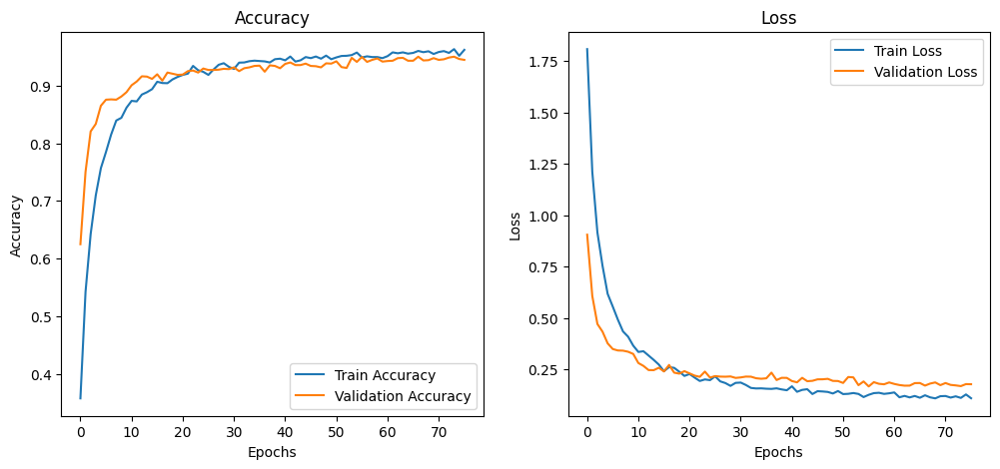

In [10]:
# Graficar la historia de entrenamiento
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss')
plt.show()

In [11]:
# Guardar el modelo, solo los pesos
model.save_weights('efficientnetb0_best_weights.h5')
print("Modelo guardado")

Modelo guardado


In [12]:
# Cargar la arquitectura y los pesos
model.load_weights("efficientnetb0_best_weights.h5")

# Volver a compilar el modelo
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Evaluar en el conjunto de test
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc * 100:.2f}%")

# Evaluar en el conjunto de validación
val_loss, val_acc = model.evaluate(val_generator)
print(f"Validation Accuracy: {val_acc * 100:.2f}%")


  1/100 [..............................] - ETA: 2:34 - loss: 0.0017 - accuracy: 1.0000


  2/100 [..............................] - ETA: 7s - loss: 0.0010 - accuracy: 1.0000  


  3/100 [..............................] - ETA: 6s - loss: 7.5390e-04 - accuracy: 1.0000


  5/100 [>.............................] - ETA: 4s - loss: 6.7320e-04 - accuracy: 1.0000


  7/100 [=>............................] - ETA: 4s - loss: 5.5063e-04 - accuracy: 1.0000


 10/100 [==>...........................] - ETA: 3s - loss: 4.7903e-04 - accuracy: 1.0000


 14/100 [===>..........................] - ETA: 2s - loss: 5.9226e-04 - accuracy: 1.0000


 18/100 [====>.........................] - ETA: 2s - loss: 5.9527e-04 - accuracy: 1.0000


 22/100 [=====>........................] - ETA: 2s - loss: 0.0012 - accuracy: 1.0000    


 25/100 [======>.......................] - ETA: 1s - loss: 0.0012 - accuracy: 1.0000


 27/100 [=======>......................] - ETA: 1s - loss: 0.0123 - accuracy: 0.9954


 30/100 [========>.....................] - ETA: 1s - loss: 0.0205 - accuracy: 0.9958


 32/100 [========>.....................] - ETA: 1s - loss: 0.0284 - accuracy: 0.9922


 34/100 [=========>....................] - ETA: 1s - loss: 0.0478 - accuracy: 0.9853


 37/100 [==========>...................] - ETA: 1s - loss: 0.0440 - accuracy: 0.9865


 39/100 [==========>...................] - ETA: 1s - loss: 0.0584 - accuracy: 0.9840


 42/100 [===========>..................] - ETA: 1s - loss: 0.0625 - accuracy: 0.9821


 45/100 [============>.................] - ETA: 1s - loss: 0.0620 - accuracy: 0.9833


 47/100 [=============>................] - ETA: 1s - loss: 0.0685 - accuracy: 0.9814


 49/100 [=============>................] - ETA: 1s - loss: 0.0882 - accuracy: 0.9796


 51/100 [==============>...............] - ETA: 1s - loss: 0.0867 - accuracy: 0.9804


 53/100 [==============>...............] - ETA: 1s - loss: 0.1206 - accuracy: 0.9741


 55/100 [===============>..............] - ETA: 1s - loss: 0.1267 - accuracy: 0.9705


 57/100 [================>.............] - ETA: 1s - loss: 0.1313 - accuracy: 0.9671


 59/100 [================>.............] - ETA: 1s - loss: 0.1408 - accuracy: 0.9661


 61/100 [=================>............] - ETA: 1s - loss: 0.1450 - accuracy: 0.9631


 64/100 [==================>...........] - ETA: 1s - loss: 0.1529 - accuracy: 0.9590


 66/100 [==================>...........] - ETA: 0s - loss: 0.1611 - accuracy: 0.9545


 68/100 [===================>..........] - ETA: 0s - loss: 0.1705 - accuracy: 0.9504


 70/100 [====================>.........] - ETA: 0s - loss: 0.1821 - accuracy: 0.9446


 72/100 [====================>.........] - ETA: 0s - loss: 0.1836 - accuracy: 0.9427


 73/100 [====================>.........] - ETA: 0s - loss: 0.1866 - accuracy: 0.9418


 75/100 [=====================>........] - ETA: 0s - loss: 0.1931 - accuracy: 0.9367


 76/100 [=====================>........] - ETA: 0s - loss: 0.1907 - accuracy: 0.9375


 77/100 [======================>.......] - ETA: 0s - loss: 0.1882 - accuracy: 0.9383


 78/100 [======================>.......] - ETA: 0s - loss: 0.1858 - accuracy: 0.9391


 79/100 [======================>.......] - ETA: 0s - loss: 0.1834 - accuracy: 0.9399


 80/100 [=======================>......] - ETA: 0s - loss: 0.1811 - accuracy: 0.9406


 81/100 [=======================>......] - ETA: 0s - loss: 0.1789 - accuracy: 0.9414


 82/100 [=======================>......] - ETA: 0s - loss: 0.1767 - accuracy: 0.9421


 83/100 [=======================>......] - ETA: 0s - loss: 0.1746 - accuracy: 0.9428


 84/100 [========================>.....] - ETA: 0s - loss: 0.1725 - accuracy: 0.9435


 85/100 [========================>.....] - ETA: 0s - loss: 0.1705 - accuracy: 0.9441


 86/100 [========================>.....] - ETA: 0s - loss: 0.1685 - accuracy: 0.9448


 87/100 [=========================>....] - ETA: 0s - loss: 0.1666 - accuracy: 0.9454


 88/100 [=========================>....] - ETA: 0s - loss: 0.1647 - accuracy: 0.9460


 89/100 [=========================>....] - ETA: 0s - loss: 0.1628 - accuracy: 0.9466


 90/100 [==========================>...] - ETA: 0s - loss: 0.1610 - accuracy: 0.9472


 91/100 [==========================>...] - ETA: 0s - loss: 0.1592 - accuracy: 0.9478


 92/100 [==========================>...] - ETA: 0s - loss: 0.1575 - accuracy: 0.9484


 93/100 [==========================>...] - ETA: 0s - loss: 0.1558 - accuracy: 0.9489


 94/100 [===========================>..] - ETA: 0s - loss: 0.1542 - accuracy: 0.9495


 95/100 [===========================>..] - ETA: 0s - loss: 0.1525 - accuracy: 0.9500


 96/100 [===========================>..] - ETA: 0s - loss: 0.1509 - accuracy: 0.9505


 97/100 [============================>.] - ETA: 0s - loss: 0.1494 - accuracy: 0.9510


 98/100 [============================>.] - ETA: 0s - loss: 0.1479 - accuracy: 0.9515


 99/100 [============================>.] - ETA: 0s - loss: 0.1464 - accuracy: 0.9520


100/100 [==============================] - ETA: 0s - loss: 0.1449 - accuracy: 0.9525


100/100 [==============================] - 6s 43ms/step - loss: 0.1449 - accuracy: 0.9525


Test Accuracy: 95.25%



  1/250 [..............................] - ETA: 19s - loss: 6.4656e-04 - accuracy: 1.0000


  4/250 [..............................] - ETA: 7s - loss: 8.6623e-04 - accuracy: 1.0000 


  7/250 [..............................] - ETA: 6s - loss: 0.0014 - accuracy: 1.0000    


 10/250 [>.............................] - ETA: 6s - loss: 0.0015 - accuracy: 1.0000


 13/250 [>.............................] - ETA: 6s - loss: 0.0013 - accuracy: 1.0000


 16/250 [>.............................] - ETA: 5s - loss: 0.0012 - accuracy: 1.0000


 18/250 [=>............................] - ETA: 5s - loss: 0.0021 - accuracy: 1.0000


 21/250 [=>............................] - ETA: 5s - loss: 0.0023 - accuracy: 1.0000


 24/250 [=>............................] - ETA: 5s - loss: 0.0026 - accuracy: 1.0000


 28/250 [==>...........................] - ETA: 5s - loss: 0.0023 - accuracy: 1.0000


 32/250 [==>...........................] - ETA: 5s - loss: 0.0022 - accuracy: 1.0000


 36/250 [===>..........................] - ETA: 4s - loss: 0.0021 - accuracy: 1.0000


 39/250 [===>..........................] - ETA: 4s - loss: 0.0021 - accuracy: 1.0000


 43/250 [====>.........................] - ETA: 4s - loss: 0.0020 - accuracy: 1.0000


 46/250 [====>.........................] - ETA: 4s - loss: 0.0020 - accuracy: 1.0000


 49/250 [====>.........................] - ETA: 4s - loss: 0.0020 - accuracy: 1.0000


 53/250 [=====>........................] - ETA: 4s - loss: 0.0020 - accuracy: 1.0000


 57/250 [=====>........................] - ETA: 3s - loss: 0.0020 - accuracy: 1.0000


 59/250 [======>.......................] - ETA: 4s - loss: 0.0021 - accuracy: 1.0000


 62/250 [======>.......................] - ETA: 3s - loss: 0.0021 - accuracy: 1.0000


 65/250 [======>.......................] - ETA: 3s - loss: 0.0034 - accuracy: 1.0000


 68/250 [=======>......................] - ETA: 3s - loss: 0.0311 - accuracy: 0.9945


 70/250 [=======>......................] - ETA: 3s - loss: 0.0371 - accuracy: 0.9929


 72/250 [=======>......................] - ETA: 3s - loss: 0.0403 - accuracy: 0.9913


 74/250 [=======>......................] - ETA: 3s - loss: 0.0508 - accuracy: 0.9848


 76/250 [========>.....................] - ETA: 3s - loss: 0.0532 - accuracy: 0.9836


 78/250 [========>.....................] - ETA: 3s - loss: 0.0644 - accuracy: 0.9808


 80/250 [========>.....................] - ETA: 3s - loss: 0.0709 - accuracy: 0.9781


 82/250 [========>.....................] - ETA: 3s - loss: 0.0707 - accuracy: 0.9787


 84/250 [=========>....................] - ETA: 3s - loss: 0.0740 - accuracy: 0.9762


 86/250 [=========>....................] - ETA: 3s - loss: 0.0760 - accuracy: 0.9753


 89/250 [=========>....................] - ETA: 3s - loss: 0.0922 - accuracy: 0.9705


 91/250 [=========>....................] - ETA: 3s - loss: 0.0934 - accuracy: 0.9698


 93/250 [==========>...................] - ETA: 3s - loss: 0.0969 - accuracy: 0.9677


 95/250 [==========>...................] - ETA: 3s - loss: 0.0986 - accuracy: 0.9658


 97/250 [==========>...................] - ETA: 3s - loss: 0.0977 - accuracy: 0.9665


 99/250 [==========>...................] - ETA: 3s - loss: 0.0990 - accuracy: 0.9672


101/250 [===========>..................] - ETA: 3s - loss: 0.0979 - accuracy: 0.9678


103/250 [===========>..................] - ETA: 3s - loss: 0.0984 - accuracy: 0.9672


104/250 [===========>..................] - ETA: 3s - loss: 0.1052 - accuracy: 0.9651


106/250 [===========>..................] - ETA: 3s - loss: 0.1111 - accuracy: 0.9623


108/250 [===========>..................] - ETA: 3s - loss: 0.1112 - accuracy: 0.9618


111/250 [============>.................] - ETA: 3s - loss: 0.1104 - accuracy: 0.9628


113/250 [============>.................] - ETA: 3s - loss: 0.1090 - accuracy: 0.9635


115/250 [============>.................] - ETA: 3s - loss: 0.1083 - accuracy: 0.9641


117/250 [=============>................] - ETA: 3s - loss: 0.1072 - accuracy: 0.9647


119/250 [=============>................] - ETA: 3s - loss: 0.1138 - accuracy: 0.9632


121/250 [=============>................] - ETA: 3s - loss: 0.1161 - accuracy: 0.9618


123/250 [=============>................] - ETA: 3s - loss: 0.1157 - accuracy: 0.9614


125/250 [==============>...............] - ETA: 3s - loss: 0.1193 - accuracy: 0.9610


127/250 [==============>...............] - ETA: 3s - loss: 0.1226 - accuracy: 0.9587


129/250 [==============>...............] - ETA: 3s - loss: 0.1243 - accuracy: 0.9583


131/250 [==============>...............] - ETA: 3s - loss: 0.1266 - accuracy: 0.9571


133/250 [==============>...............] - ETA: 3s - loss: 0.1289 - accuracy: 0.9549


136/250 [===============>..............] - ETA: 3s - loss: 0.1313 - accuracy: 0.9531


138/250 [===============>..............] - ETA: 3s - loss: 0.1475 - accuracy: 0.9511


140/250 [===============>..............] - ETA: 2s - loss: 0.1506 - accuracy: 0.9500


142/250 [================>.............] - ETA: 2s - loss: 0.1495 - accuracy: 0.9507


144/250 [================>.............] - ETA: 2s - loss: 0.1499 - accuracy: 0.9497


146/250 [================>.............] - ETA: 2s - loss: 0.1509 - accuracy: 0.9486


148/250 [================>.............] - ETA: 2s - loss: 0.1536 - accuracy: 0.9476


150/250 [=================>............] - ETA: 2s - loss: 0.1558 - accuracy: 0.9458


152/250 [=================>............] - ETA: 2s - loss: 0.1548 - accuracy: 0.9465


154/250 [=================>............] - ETA: 2s - loss: 0.1538 - accuracy: 0.9472


157/250 [=================>............] - ETA: 2s - loss: 0.1559 - accuracy: 0.9451


159/250 [==================>...........] - ETA: 2s - loss: 0.1657 - accuracy: 0.9426


161/250 [==================>...........] - ETA: 2s - loss: 0.1716 - accuracy: 0.9418


163/250 [==================>...........] - ETA: 2s - loss: 0.1723 - accuracy: 0.9417


165/250 [==================>...........] - ETA: 2s - loss: 0.1796 - accuracy: 0.9402


167/250 [===================>..........] - ETA: 2s - loss: 0.1812 - accuracy: 0.9401


169/250 [===================>..........] - ETA: 2s - loss: 0.1818 - accuracy: 0.9401


171/250 [===================>..........] - ETA: 2s - loss: 0.1887 - accuracy: 0.9393


174/250 [===================>..........] - ETA: 2s - loss: 0.1912 - accuracy: 0.9382


175/250 [====================>.........] - ETA: 2s - loss: 0.1935 - accuracy: 0.9379


177/250 [====================>.........] - ETA: 2s - loss: 0.1956 - accuracy: 0.9379


179/250 [====================>.........] - ETA: 2s - loss: 0.2008 - accuracy: 0.9358


181/250 [====================>.........] - ETA: 1s - loss: 0.2078 - accuracy: 0.9344


183/250 [====================>.........] - ETA: 1s - loss: 0.2153 - accuracy: 0.9331


186/250 [=====================>........] - ETA: 1s - loss: 0.2167 - accuracy: 0.9328


188/250 [=====================>........] - ETA: 1s - loss: 0.2226 - accuracy: 0.9328


189/250 [=====================>........] - ETA: 1s - loss: 0.2214 - accuracy: 0.9332


190/250 [=====================>........] - ETA: 1s - loss: 0.2202 - accuracy: 0.9336


191/250 [=====================>........] - ETA: 1s - loss: 0.2191 - accuracy: 0.9339


192/250 [======================>.......] - ETA: 1s - loss: 0.2179 - accuracy: 0.9342


193/250 [======================>.......] - ETA: 1s - loss: 0.2168 - accuracy: 0.9346


194/250 [======================>.......] - ETA: 1s - loss: 0.2157 - accuracy: 0.9349


195/250 [======================>.......] - ETA: 1s - loss: 0.2146 - accuracy: 0.9353


196/250 [======================>.......] - ETA: 1s - loss: 0.2135 - accuracy: 0.9356


197/250 [======================>.......] - ETA: 1s - loss: 0.2128 - accuracy: 0.9359


198/250 [======================>.......] - ETA: 1s - loss: 0.2118 - accuracy: 0.9362


199/250 [======================>.......] - ETA: 1s - loss: 0.2107 - accuracy: 0.9366


200/250 [=======================>......] - ETA: 1s - loss: 0.2097 - accuracy: 0.9369


201/250 [=======================>......] - ETA: 1s - loss: 0.2089 - accuracy: 0.9372


202/250 [=======================>......] - ETA: 1s - loss: 0.2079 - accuracy: 0.9375


203/250 [=======================>......] - ETA: 1s - loss: 0.2069 - accuracy: 0.9378


204/250 [=======================>......] - ETA: 1s - loss: 0.2059 - accuracy: 0.9381


205/250 [=======================>......] - ETA: 1s - loss: 0.2049 - accuracy: 0.9384


206/250 [=======================>......] - ETA: 1s - loss: 0.2039 - accuracy: 0.9387


207/250 [=======================>......] - ETA: 1s - loss: 0.2029 - accuracy: 0.9390


208/250 [=======================>......] - ETA: 1s - loss: 0.2019 - accuracy: 0.9393


209/250 [========================>.....] - ETA: 1s - loss: 0.2010 - accuracy: 0.9396


210/250 [========================>.....] - ETA: 1s - loss: 0.2000 - accuracy: 0.9399


211/250 [========================>.....] - ETA: 1s - loss: 0.1991 - accuracy: 0.9402


212/250 [========================>.....] - ETA: 1s - loss: 0.1981 - accuracy: 0.9404


213/250 [========================>.....] - ETA: 1s - loss: 0.1972 - accuracy: 0.9407


214/250 [========================>.....] - ETA: 1s - loss: 0.1963 - accuracy: 0.9410


215/250 [========================>.....] - ETA: 1s - loss: 0.1954 - accuracy: 0.9413


216/250 [========================>.....] - ETA: 1s - loss: 0.1945 - accuracy: 0.9416


217/250 [=========================>....] - ETA: 1s - loss: 0.1936 - accuracy: 0.9418


218/250 [=========================>....] - ETA: 1s - loss: 0.1927 - accuracy: 0.9421


219/250 [=========================>....] - ETA: 1s - loss: 0.1918 - accuracy: 0.9424


220/250 [=========================>....] - ETA: 1s - loss: 0.1909 - accuracy: 0.9426


221/250 [=========================>....] - ETA: 1s - loss: 0.1901 - accuracy: 0.9429


222/250 [=========================>....] - ETA: 1s - loss: 0.1892 - accuracy: 0.9431


223/250 [=========================>....] - ETA: 0s - loss: 0.1884 - accuracy: 0.9434


224/250 [=========================>....] - ETA: 0s - loss: 0.1875 - accuracy: 0.9436


225/250 [==========================>...] - ETA: 0s - loss: 0.1867 - accuracy: 0.9439


226/250 [==========================>...] - ETA: 0s - loss: 0.1859 - accuracy: 0.9441


227/250 [==========================>...] - ETA: 0s - loss: 0.1851 - accuracy: 0.9444


228/250 [==========================>...] - ETA: 0s - loss: 0.1842 - accuracy: 0.9446


229/250 [==========================>...] - ETA: 0s - loss: 0.1834 - accuracy: 0.9449


230/250 [==========================>...] - ETA: 0s - loss: 0.1826 - accuracy: 0.9451


231/250 [==========================>...] - ETA: 0s - loss: 0.1819 - accuracy: 0.9453


232/250 [==========================>...] - ETA: 0s - loss: 0.1811 - accuracy: 0.9456


233/250 [==========================>...] - ETA: 0s - loss: 0.1803 - accuracy: 0.9458


234/250 [===========================>..] - ETA: 0s - loss: 0.1795 - accuracy: 0.9460


235/250 [===========================>..] - ETA: 0s - loss: 0.1788 - accuracy: 0.9463


236/250 [===========================>..] - ETA: 0s - loss: 0.1780 - accuracy: 0.9465


237/250 [===========================>..] - ETA: 0s - loss: 0.1773 - accuracy: 0.9467


238/250 [===========================>..] - ETA: 0s - loss: 0.1765 - accuracy: 0.9470


239/250 [===========================>..] - ETA: 0s - loss: 0.1759 - accuracy: 0.9472


241/250 [===========================>..] - ETA: 0s - loss: 0.1744 - accuracy: 0.9476


242/250 [============================>.] - ETA: 0s - loss: 0.1737 - accuracy: 0.9478


243/250 [============================>.] - ETA: 0s - loss: 0.1730 - accuracy: 0.9480


244/250 [============================>.] - ETA: 0s - loss: 0.1723 - accuracy: 0.9483


245/250 [============================>.] - ETA: 0s - loss: 0.1716 - accuracy: 0.9485


246/250 [============================>.] - ETA: 0s - loss: 0.1709 - accuracy: 0.9487


247/250 [============================>.] - ETA: 0s - loss: 0.1702 - accuracy: 0.9489


248/250 [============================>.] - ETA: 0s - loss: 0.1695 - accuracy: 0.9491


249/250 [============================>.] - ETA: 0s - loss: 0.1688 - accuracy: 0.9493


250/250 [==============================] - ETA: 0s - loss: 0.1682 - accuracy: 0.9495


250/250 [==============================] - 10s 41ms/step - loss: 0.1682 - accuracy: 0.9495


Validation Accuracy: 94.95%


In [13]:
# Obtener predicciones para validación
y_true_val = val_generator.classes
y_pred_val = np.argmax(model.predict(val_generator), axis=1)

# Obtener predicciones para test
y_true_test = test_generator.classes
y_pred_test = np.argmax(model.predict(test_generator), axis=1)

# Reporte de clasificación para validación
print("\nValidation Classification Report:")
print(classification_report(y_true_val, y_pred_val, target_names=val_generator.class_indices.keys()))

# Reporte de clasificación para test
print("\nTest Classification Report:")
print(classification_report(y_true_test, y_pred_test, target_names=test_generator.class_indices.keys()))


  1/250 [..............................] - ETA: 3:45


  4/250 [..............................] - ETA: 6s  


  7/250 [..............................] - ETA: 6s


 10/250 [>.............................] - ETA: 6s


 13/250 [>.............................] - ETA: 5s


 17/250 [=>............................] - ETA: 5s


 20/250 [=>............................] - ETA: 5s


 24/250 [=>............................] - ETA: 4s


 28/250 [==>...........................] - ETA: 4s


 32/250 [==>...........................] - ETA: 4s


 35/250 [===>..........................] - ETA: 4s


 38/250 [===>..........................] - ETA: 4s


 42/250 [====>.........................] - ETA: 4s


 45/250 [====>.........................] - ETA: 4s


 48/250 [====>.........................] - ETA: 4s


 52/250 [=====>........................] - ETA: 3s


 56/250 [=====>........................] - ETA: 3s


 60/250 [======>.......................] - ETA: 3s


 64/250 [======>.......................] - ETA: 3s


 66/250 [======>.......................] - ETA: 3s


 68/250 [=======>......................] - ETA: 3s


 71/250 [=======>......................] - ETA: 3s


 73/250 [=======>......................] - ETA: 3s


 75/250 [========>.....................] - ETA: 3s


 77/250 [========>.....................] - ETA: 3s


 79/250 [========>.....................] - ETA: 3s


 81/250 [========>.....................] - ETA: 3s


 84/250 [=========>....................] - ETA: 3s


 86/250 [=========>....................] - ETA: 3s


 88/250 [=========>....................] - ETA: 3s


 90/250 [=========>....................] - ETA: 3s


 92/250 [==========>...................] - ETA: 3s


 94/250 [==========>...................] - ETA: 3s


 96/250 [==========>...................] - ETA: 3s


 98/250 [==========>...................] - ETA: 3s


100/250 [===========>..................] - ETA: 3s


103/250 [===========>..................] - ETA: 3s


105/250 [===========>..................] - ETA: 3s


107/250 [===========>..................] - ETA: 3s


109/250 [============>.................] - ETA: 3s


111/250 [============>.................] - ETA: 3s


113/250 [============>.................] - ETA: 3s


115/250 [============>.................] - ETA: 3s


117/250 [=============>................] - ETA: 3s


120/250 [=============>................] - ETA: 3s


123/250 [=============>................] - ETA: 3s


125/250 [==============>...............] - ETA: 3s


127/250 [==============>...............] - ETA: 3s


129/250 [==============>...............] - ETA: 3s


132/250 [==============>...............] - ETA: 2s


134/250 [===============>..............] - ETA: 2s


137/250 [===============>..............] - ETA: 2s


139/250 [===============>..............] - ETA: 2s


141/250 [===============>..............] - ETA: 2s


143/250 [================>.............] - ETA: 2s


145/250 [================>.............] - ETA: 2s


147/250 [================>.............] - ETA: 2s


149/250 [================>.............] - ETA: 2s


151/250 [=================>............] - ETA: 2s


153/250 [=================>............] - ETA: 2s


155/250 [=================>............] - ETA: 2s


157/250 [=================>............] - ETA: 2s


160/250 [==================>...........] - ETA: 2s


162/250 [==================>...........] - ETA: 2s


165/250 [==================>...........] - ETA: 2s


167/250 [===================>..........] - ETA: 2s


169/250 [===================>..........] - ETA: 2s


171/250 [===================>..........] - ETA: 2s


174/250 [===================>..........] - ETA: 2s


175/250 [====================>.........] - ETA: 2s


177/250 [====================>.........] - ETA: 1s


179/250 [====================>.........] - ETA: 1s


181/250 [====================>.........] - ETA: 1s


183/250 [====================>.........] - ETA: 1s


185/250 [=====================>........] - ETA: 1s


187/250 [=====================>........] - ETA: 1s


189/250 [=====================>........] - ETA: 1s


190/250 [=====================>........] - ETA: 1s


191/250 [=====================>........] - ETA: 1s


192/250 [======================>.......] - ETA: 1s


193/250 [======================>.......] - ETA: 1s


194/250 [======================>.......] - ETA: 1s


195/250 [======================>.......] - ETA: 1s


196/250 [======================>.......] - ETA: 1s


197/250 [======================>.......] - ETA: 1s


198/250 [======================>.......] - ETA: 1s


199/250 [======================>.......] - ETA: 1s


200/250 [=======================>......] - ETA: 1s


201/250 [=======================>......] - ETA: 1s


202/250 [=======================>......] - ETA: 1s


203/250 [=======================>......] - ETA: 1s


204/250 [=======================>......] - ETA: 1s


205/250 [=======================>......] - ETA: 1s


206/250 [=======================>......] - ETA: 1s


207/250 [=======================>......] - ETA: 1s


208/250 [=======================>......] - ETA: 1s


209/250 [========================>.....] - ETA: 1s


210/250 [========================>.....] - ETA: 1s


211/250 [========================>.....] - ETA: 1s


212/250 [========================>.....] - ETA: 1s


213/250 [========================>.....] - ETA: 1s


214/250 [========================>.....] - ETA: 1s


215/250 [========================>.....] - ETA: 1s


216/250 [========================>.....] - ETA: 1s


217/250 [=========================>....] - ETA: 1s


218/250 [=========================>....] - ETA: 1s


219/250 [=========================>....] - ETA: 1s


220/250 [=========================>....] - ETA: 1s


221/250 [=========================>....] - ETA: 1s


222/250 [=========================>....] - ETA: 0s


223/250 [=========================>....] - ETA: 0s


224/250 [=========================>....] - ETA: 0s


225/250 [==========================>...] - ETA: 0s


226/250 [==========================>...] - ETA: 0s


227/250 [==========================>...] - ETA: 0s


228/250 [==========================>...] - ETA: 0s


229/250 [==========================>...] - ETA: 0s


230/250 [==========================>...] - ETA: 0s


231/250 [==========================>...] - ETA: 0s


232/250 [==========================>...] - ETA: 0s


233/250 [==========================>...] - ETA: 0s


234/250 [===========================>..] - ETA: 0s


235/250 [===========================>..] - ETA: 0s


236/250 [===========================>..] - ETA: 0s


237/250 [===========================>..] - ETA: 0s


238/250 [===========================>..] - ETA: 0s


239/250 [===========================>..] - ETA: 0s


240/250 [===========================>..] - ETA: 0s


241/250 [===========================>..] - ETA: 0s


242/250 [============================>.] - ETA: 0s


243/250 [============================>.] - ETA: 0s


244/250 [============================>.] - ETA: 0s


245/250 [============================>.] - ETA: 0s


246/250 [============================>.] - ETA: 0s


247/250 [============================>.] - ETA: 0s


248/250 [============================>.] - ETA: 0s


249/250 [============================>.] - ETA: 0s


250/250 [==============================] - ETA: 0s


250/250 [==============================] - 11s 40ms/step



  1/100 [..............................] - ETA: 4s


  3/100 [..............................] - ETA: 3s


  6/100 [>.............................] - ETA: 2s


  9/100 [=>............................] - ETA: 2s


 12/100 [==>...........................] - ETA: 2s


 15/100 [===>..........................] - ETA: 2s


 16/100 [===>..........................] - ETA: 2s


 20/100 [=====>........................] - ETA: 2s


 23/100 [=====>........................] - ETA: 1s


 26/100 [======>.......................] - ETA: 1s


 28/100 [=======>......................] - ETA: 1s


 30/100 [========>.....................] - ETA: 1s


 32/100 [========>.....................] - ETA: 1s


 34/100 [=========>....................] - ETA: 1s


 36/100 [=========>....................] - ETA: 1s


 39/100 [==========>...................] - ETA: 1s


 41/100 [===========>..................] - ETA: 1s


 43/100 [===========>..................] - ETA: 1s


 45/100 [============>.................] - ETA: 1s


 47/100 [=============>................] - ETA: 1s


 49/100 [=============>................] - ETA: 1s


 51/100 [==============>...............] - ETA: 1s


 53/100 [==============>...............] - ETA: 1s


 55/100 [===============>..............] - ETA: 1s


 57/100 [================>.............] - ETA: 1s


 59/100 [================>.............] - ETA: 1s


 61/100 [=================>............] - ETA: 1s


 63/100 [=================>............] - ETA: 1s


 65/100 [==================>...........] - ETA: 1s


 67/100 [===================>..........] - ETA: 1s


 69/100 [===================>..........] - ETA: 0s


 71/100 [====================>.........] - ETA: 0s


 73/100 [====================>.........] - ETA: 0s


 75/100 [=====================>........] - ETA: 0s


 76/100 [=====================>........] - ETA: 0s


 77/100 [======================>.......] - ETA: 0s


 78/100 [======================>.......] - ETA: 0s


 79/100 [======================>.......] - ETA: 0s


 80/100 [=======================>......] - ETA: 0s


 81/100 [=======================>......] - ETA: 0s


 82/100 [=======================>......] - ETA: 0s


 83/100 [=======================>......] - ETA: 0s


 84/100 [========================>.....] - ETA: 0s


 85/100 [========================>.....] - ETA: 0s


 86/100 [========================>.....] - ETA: 0s


 87/100 [=========================>....] - ETA: 0s


 88/100 [=========================>....] - ETA: 0s


 89/100 [=========================>....] - ETA: 0s


 90/100 [==========================>...] - ETA: 0s


 91/100 [==========================>...] - ETA: 0s


 92/100 [==========================>...] - ETA: 0s


 93/100 [==========================>...] - ETA: 0s


 94/100 [===========================>..] - ETA: 0s


 95/100 [===========================>..] - ETA: 0s


 96/100 [===========================>..] - ETA: 0s


 97/100 [============================>.] - ETA: 0s


 98/100 [============================>.] - ETA: 0s


 99/100 [============================>.] - ETA: 0s


100/100 [==============================] - ETA: 0s


100/100 [==============================] - 4s 45ms/step



Validation Classification Report:
                      precision    recall  f1-score   support

            0_normal       0.94      1.00      0.97       500
1_ulcerative_colitis       0.93      0.92      0.93       500
            2_polyps       0.94      0.88      0.90       500
       3_esophagitis       0.99      1.00      1.00       500

            accuracy                           0.95      2000
           macro avg       0.95      0.95      0.95      2000
        weighted avg       0.95      0.95      0.95      2000


Test Classification Report:
                      precision    recall  f1-score   support

            0_normal       0.92      1.00      0.96       200
1_ulcerative_colitis       0.94      0.96      0.95       200
            2_polyps       0.97      0.85      0.90       200
       3_esophagitis       0.99      1.00      1.00       200

            accuracy                           0.95       800
           macro avg       0.95      0.95      0.95       800
 

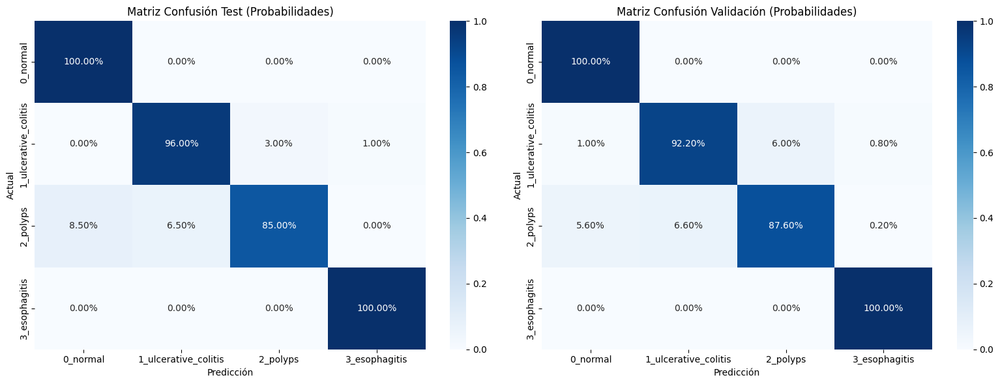

In [14]:
# Función para convertir la matriz de confusión a probabilidades
def confusion_matrix_prob(cm):
    return cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Matriz de confusión para el conjunto de test
cm_test = confusion_matrix(y_true_test, y_pred_test)
cm_test_prob = confusion_matrix_prob(cm_test)
plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
sns.heatmap(cm_test_prob, annot=True, fmt='.2%', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicción')
plt.ylabel('Actual')
plt.title('Matriz Confusión Test (Probabilidades)')

# Matriz de confusión para el conjunto de validación
cm_val = confusion_matrix(y_true_val, y_pred_val)
cm_val_prob = confusion_matrix_prob(cm_val)
plt.subplot(1, 2, 2)
sns.heatmap(cm_val_prob, annot=True, fmt='.2%', cmap='Blues', xticklabels=val_generator.class_indices.keys(), yticklabels=val_generator.class_indices.keys())
plt.xlabel('Predicción')
plt.ylabel('Actual')
plt.title('Matriz Confusión Validación (Probabilidades)')

plt.tight_layout()
plt.show()